# Data Mining Course Final Project

### Noa Magrisso
### Shaked Sapir

This notebook rises a project about analyzing Instagram posts captured in public parks and attractions, so we can help their managing office to improve their potential incomes from some selling stands, like food carts.

As a POC example, we decided to focus on Seattle's Woodlandzoopark.

**We are doing so by using the following idea:**

1.   First of all, we are going to get some posts of the zoo, by using some libraries, to fetch posts in which the zoo's IG user was tagged in, together with posts which included the zoo's location, and posts which include the zoo's hashtags.
2.   Then, we analyze which animals appear in each post, so we can later on aggregate how many pictures were captured in which area of the park in different periods in time, so we can then construct a heatmap to see which are are hotter than others, meaning more visitors paid visit to these areas and therefore we should place more food carts in there.
3.   At last, we will the heatmaps on the zoo's map as mentioned above, visualizing our results in a comprehensive way.


**Animals analysis is going to be done as follows:**

1.   Take each post gotten from IG, and split it to the images constructing it.
2.   Check which animals are in the zoo, therefore deciding which classes should we include in our animal classifier to come.
3.   At first, we are going to use an image classifier model of InceptionV3 by Google, so it will try to classify which animal appear in the picture.
4.   From a prior research we made, we saw that the above model could distinguish between certain types of animals, but some of them are too difficult for it. so, we construct a seperate model for classification within these animals, so we can hopefully get a decision about each image of the animal(s) it contains.
5.   (NTH) using object detection to break a photo to its object components, hopefully making the classification problem easier (because the resulting images contain, hopefully, a single object...)
6. (NTH) using additional data sources, such as Facebook.





## Setup


For this work, we will use google drive as a storage site.

In [ ]:
from google.colab import drive

drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In addition, some package setups:

In [ ]:
import ast
import tqdm
from datetime import datetime
import numpy as np
import pandas as pd
import time
import json
import requests
import random

import matplotlib.pyplot as plt
import seaborn as sns

And, as a preparation step for dealing with request timeouts, we built a retry model for GET requests.

In [ ]:
def send_request(url, max_retries=5, delay_between_retries=1):
  num_tries = 0
  while num_tries < max_retries:
    response = requests.get(url)
    if response.status_code != 200:
      num_tries = num_tries + 1
      time.sleep(delay_between_retries)
      continue
    else:
      return response
  print("request failed")
  return None

## Data Collection - Instagram Posts

In this section, we are going to fetch data on Instagram Posts,
so we can later on pass them through some models to infer which animals appear in them.

In [ ]:
import os

def create_dir(path):
    """Create directory if it doesn't exist."""
    if not os.path.exists(path):
        os.makedirs(path)

In [ ]:
INSTAGRAM_POSTS_PATH = "/content/drive/MyDrive/MickyFire_Project/instagram_posts"
create_dir(INSTAGRAM_POSTS_PATH)

In [ ]:
!pip install instagrapi

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 95.1/95.1 kB 2.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 19.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 40.8 MB/s eta 0:00:00
  Created wheel for instagrapi: filename=instagrapi-1.19.7-py3-none-any.whl size=108637 sha256=b40f1498ce18a7adae21d209a55bf62b9afc03ef5a87081905b30f1ffbd68317
  Stored in directory: /root/.cache/pip/wheels/99/70/17/f63e0da1eeac0d7d20f76c2056e221fd5a8228d4029373e6f6
Successfully built instagrapi
  Attempting uninstall: pydantic
    Found existing installation: pydantic 2.2.0
    Uninstalling pydantic-2.2.0:
      Successfully uninstalled pydantic-2.2.0


In [ ]:
from instagrapi import Client

cl = Client()
cl.login('team_rocket_1323', 'Shaked_Noa_1234')

True

### Helper methods - fetch data from Instagram

We define some functions so we can fetch post's data based on the following:

*   Get posts by users which were tagged in them (so we can fetch posts in which the zoo's user was tagged)
*   Get posts by location (so we can fetch posts in which the zoo's location was tagged)
*   Get posts by hashtags (so we can fetch posts in which the zoo's hashtags were mentioned)

We decided to wrap the library's methods with our own functions for convenience.

In [ ]:
def download_image_from_url(image_url, image_name, save_path):
  image_data = requests.get(image_url).content
  with open(f'{save_path}/{image_name}.jpg', 'wb') as handler:
    handler.write(image_data)

def get_tagged_posts(client, user_id, amount=20):
    return client.usertag_medias(user_id, amount)

def get_posts_by_userID(client, user_id, amount=20):
    return client.user_medias(user_id, amount)

def get_recent_posts_by_location(client, location_pk, amount=20):
    return client.location_medias_recent(location_pk, amount)

def get_top_posts_by_location(client, location_pk, amount=20):
    return client.location_medias_top(location_pk, amount)

def get_recent_posts_by_hashtag(client, hashtag, amount=20):
    return client.hashtag_medias_recent(hashtag, amount)

def get_top_posts_by_hashtag(client, hashtag, amount=20):
    return client.hashtag_medias_top(hashtag, amount)

Then we provide some methods for parsing posts and structuring the data:

In [ ]:
def parse_post_metadata(post):
    return {
        'timestamp': post.taken_at.isoformat(),
        'post_description': post.caption_text,
        'usertags': post.user.username,
        'location': post.location
    }

def parse_post_images(post):
    return [resource.thumbnail_url for resource in post.resources] if len(post.resources) else [post.thumbnail_url]

def parse_post(post):
    return {
        f"{post.pk}": {
            **parse_post_metadata(post),
            'images_urls': parse_post_images(post)
        }
    }

def parse_full_posts(raw_posts):
    full_posts = {}
    for post in raw_posts:
        full_posts.update(parse_post(post))
    return full_posts

def get_full_posts_by_user(client, user, amount=20):
    user_id = client.user_id_from_username(user)
    tagged_posts = get_tagged_posts(client, user_id, amount)
    return parse_full_posts(tagged_posts)

And some for building the relevant dataframes out of the structure mentioned above:

In [ ]:
def build_posts_df(full_posts):
  posts_ids = full_posts.keys()
  posts_data = full_posts.values()

  df = pd.DataFrame(posts_data)
  df.insert(0, 'post_id', posts_ids)

  return remove_rows_without_images(df)

def remove_rows_without_images(df):
  return df[df['images_urls'].apply(lambda x: x != [None])]

### Extracting relevant information from posts

Extracting posts where the zoo's user was tagged in:

In [ ]:
TAGGED_POSTS_AMOUNT_TO_FETCH = 10000
LOCATION_POSTS_AMOUNT_TO_FETCH = 10000
HASHTAGS_POSTS_AMOUNT_TO_FETCH = 2000

In [ ]:
zoo_full_posts = get_full_posts_by_user(cl, 'woodlandparkzoo', TAGGED_POSTS_AMOUNT_TO_FETCH)
zoo_df = build_posts_df(zoo_full_posts)

In [ ]:
zoo_df.to_csv(f'{INSTAGRAM_POSTS_PATH}/zoo_details.csv', index=False)

Extracting the zoo's location and build the locations posts' data

In [ ]:
zoo_location_pk = 46808

zoo_location_posts = get_recent_posts_by_location(cl, zoo_location_pk, LOCATION_POSTS_AMOUNT_TO_FETCH)
zoo_location_full_posts = parse_full_posts(zoo_location_posts)
zoo_locations_df = build_posts_df(zoo_location_full_posts)

In [ ]:
zoo_locations_df.to_csv(f'{INSTAGRAM_POSTS_PATH}/zoo_locations_details.csv', index=False)

Extracting information about posts including a hashtags related to the zoo:

In [ ]:
woodland_hashtag_posts = get_top_posts_by_hashtag(cl, 'woodlandparkzoo', amount=HASHTAGS_POSTS_AMOUNT_TO_FETCH)
woodland_hashtags_full_posts = parse_full_posts(woodland_hashtag_posts)
woodland_hashtags_df = build_posts_df(woodland_hashtags_full_posts)

In [ ]:
woodlandseattle_hashtag_posts = get_top_posts_by_hashtag(cl, 'woodlandparkzooseattle', amount=HASHTAGS_POSTS_AMOUNT_TO_FETCH)
woodlandseattle_hashtags_full_posts = parse_full_posts(woodlandseattle_hashtag_posts)
woodlandseattle_hashtags_df = build_posts_df(woodlandseattle_hashtags_full_posts)

In [ ]:
zoo_hashtags_df = woodland_hashtags_df.append([woodlandseattle_hashtags_df])
zoo_hashtags_df.to_csv(f'{INSTAGRAM_POSTS_PATH}/zoo_hashtags_details.csv', index=False)

In [ ]:
def parse_urls_str_to_list(urls_str):
  return urls_str.replace('HttpUrl', '') \
                 .replace('[', '') \
                 .replace(']','') \
                 .replace("(", '') \
                 .replace(")", '') \
                 .replace("'",'') \
                 .split(',')[::2]


Constructing together all the structured data from all post types:

In [ ]:
zoo_details_df = pd.read_csv(f'{INSTAGRAM_POSTS_PATH}/zoo_details.csv', converters={'lists':ast.literal_eval})
zoo_locations_details_df = pd.read_csv(f'{INSTAGRAM_POSTS_PATH}/zoo_locations_details.csv', converters={'lists':ast.literal_eval})
zoo_hashtags_details_df = pd.read_csv(f'{INSTAGRAM_POSTS_PATH}/zoo_hashtags_details.csv', converters={'lists':ast.literal_eval})

combined_df = zoo_details_df.append([zoo_locations_details_df, zoo_hashtags_details_df]).drop_duplicates(subset=['post_id']).dropna(subset = ['images_urls'])
combined_df['images_urls'] = combined_df['images_urls'].apply(lambda urls: parse_urls_str_to_list(urls))
combined_df = combined_df.explode('images_urls').reset_index()

combined_df

<ipython-input-6-da24eb702327>:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  combined_df = zoo_details_df.append([zoo_locations_details_df]).drop_duplicates(subset=['post_id']).dropna(subset = ['images_urls'])


,post_id,timestamp,post_description,usertags,location,images_urls
0,3172575269726392525,2023-08-19T04:47:45+00:00,"Patti Smith, Lenny Kaye / Coca Cola Cool / Wit...",waswalking,pk=267928043 name='Woodland Park Zoo - ZooTune...,[https://scontent-lax3-2.cdninstagram.com/v/t5...
1,3172415445294450583,2023-08-18T23:30:13+00:00,"Zoo membership, best $70 I’ve ever spent. #woo...",heycourtnirae,pk=46808 name='Woodland Park Zoo' phone='' web...,[https://scontent-lax3-2.cdninstagram.com/v/t5...
2,3172399466170564604,2023-08-18T22:58:28+00:00,Happy Aloha Friday!\n\nWe are flashing back to...,customkittravel,pk=46808 name='Woodland Park Zoo' phone='' web...,[https://scontent-lax3-1.cdninstagram.com/v/t5...
3,3172315977240658616,2023-08-18T20:12:35+00:00,See concerts Save animals\n@woodlandparkzoo @t...,slugshots30,NaN,[https://scontent-lax3-2.cdninstagram.com/v/t5...
4,3171464144852085022,2023-08-18T16:00:51+00:00,Squint the Kea\n\nNative to the mountain range...,gracesphotoadventures,NaN,[https://scontent-lax3-2.cdninstagram.com/v/t5...
...,...,...,...,...,...,...
6608,3171762959465429627,2023-08-18T01:53:50+00:00,Ready for Tegan and Sara!! It’s been 15 years ...,thunderkatpnw,pk=46808 name='Woodland Park Zoo' phone='' web...,[https://scontent-lax3-2.cdninstagram.com/v/t5...
6609,3171762916257257564,2023-08-18T01:53:45+00:00,#summertime #zootunes #teganandsara,lim_o_goes,pk=46808 name='Woodland Park Zoo' phone='' web...,[https://scontent-lax3-1.cdninstagram.com/v/t5...
6610,3171758940843950925,2023-08-18T01:45:51+00:00,"The confused, angsty teenager inside me is SCR...",tarajoan27,pk=46808 name='Woodland Park Zoo' phone='' web...,[https://scontent-lax3-2.cdninstagram.com/v/t5...
6611,3171748752805727557,2023-08-18T01:25:37+00:00,Waiting to see #teganandsara,vepstein,pk=46808 name='Woodland Park Zoo' phone='' web...,[https://scontent-lax3-2.cdninstagram.com/v/t5...


## Classification Pipeline Modules
In this section we are going to construct some models which are going to help us in extracting animals out of posts and classify them,
so we can analyze the data and compute some interesting consequences and visualizations over them.

For this manner we are going to build to models:


1.  A pre-trained InceptionV3 model, for inital classification abilities over the pictures
2.  Out of the animals which the above model couldn't detect properly (which we have to identify on our own), we will create a model of our own, trained on data of the proper animals so we can classify them as accurate as possible.



### First Station - Inception Model


In [ ]:
!pip install imageai

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 69.8/69.8 kB 2.4 MB/s eta 0:00:00


**Inception V3 model for image classification**

In [ ]:
import tensorflow as tf
from tensorflow.keras.applications.inception_v3 import InceptionV3, preprocess_input, decode_predictions
from tensorflow.keras.preprocessing import image
import numpy as np

# Load the InceptionV3 model
inception_model = InceptionV3(weights='imagenet')

# Load and preprocess the image
def preprocess_image(img_path):
    img = image.load_img(img_path, target_size=(299, 299))
    x = image.img_to_array(img)
    x = np.expand_dims(x, axis=0)
    x = preprocess_input(x)
    return x

def print_predictions_by_order(predictions):
  for _, class_name, probability in predictions:
        print(f"{class_name}: {probability * 100:.2f}%")

# Classify the image
def classify_image(img, top_pred=10, print_predictions=False):
    predictions = inception_model.predict(img)
    decoded_predictions = decode_predictions(predictions, top=top_pred)[0]

    if print_predictions:
      print_predictions_by_order(decoded_predictions)

    _, class_name, prob = decoded_predictions[0]

    return class_name, prob

96112376/96112376 [==============================] - 3s 0us/step


In [ ]:
!pip install transformers

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.4/7.4 MB 27.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 268.8/268.8 kB 30.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 87.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 78.2 MB/s eta 0:00:00


### 2nd Station - Catboost model
For this part, we fetched pictures from [inaturalist](https://www.inaturalist.org/), which is a website containing data about a lot of animals, plants and living creatures in nature.



#### Collecting Data

Some code to parse imges out of html content:

In [ ]:
def get_image_urls_from_text(txt):

    urls_1 = re.findall(r'"(https?://inaturalist-open-data.s3.amazonaws.com/photos/[^"]*)"', txt)
    urls_2 = re.findall(r'"(https://static.inaturalist.org/photos/[^"]*)"', txt)
    return urls_1 + urls_2


def get_image_urls_by_preference(urls, preferences=['original', 'medium', 'large', 'small', 'square', 'thumb']):

    # Group URLs by their ID
    url_dict = {}
    for url in urls:
        # Extract base URL (determines the kind of URL)
        base_url = re.search(r'(https?://[^/]+)', url).group(1)

        # Extract ID from the URL
        id_ = re.search(r'photos/(\d+)', url).group(1)

        # Extract type and file extension from the URL
        type_, ext = re.search(r'photos/\d+/(\w+)\.(\w+)', url).groups()

        # If ID not in dict, initialize with an empty dictionary
        if id_ not in url_dict:
            url_dict[id_] = {"base_url": base_url}

        # If type is not in ID's dictionary or the current extension is preferred over the existing one
        if type_ not in url_dict[id_] or (url_dict[id_].get(type_, {}).get("ext", "") not in ['jpg', 'jpeg', 'png', 'JPG', 'JPEG', 'PNG']):
            url_dict[id_][type_] = {"ext": ext}

    # Filter URLs based on preference hierarchy
    filtered_urls = []
    for id_, types in url_dict.items():
        base_url = types.pop("base_url")  # Get base URL and remove it from the dictionary
        for preference in preferences:
            if preference in types:
                ext = types[preference]["ext"]
                filtered_urls.append(f'{base_url}/photos/{id_}/{preference}.{ext}')
                break  # Exit loop once the highest preference is found

    return filtered_urls


def html_to_url_images(html):

    urls = get_image_urls_from_text(html)
    urls_by_preference = get_image_urls_by_preference(urls)

    return urls_by_preference

In the website, each animal has a uniqe "taxon_id" used as an identifier, so we can perform an Http request to get the proper html page and parse it accordingly to get the animal's pictures.

In [ ]:
import requests
import re
import json

animals_to_taxon_ids = {
      'asian brown tortoise': [40061],
#     'asian small-clawed otter': [569308],
#     'butterfly': [47224],
#     'demoiselle crane': [144287],
#     'elk': [522193, 204114, 846300],
#     'emu': [20504],
#     'giraffe': [42157],
#     'great blue turaco': [7250],
      'indian flying fox': [40917],
      'kookaburra': [2417, 2409, 2413],
#     'kunekune pig': [324492],
#     'mountain goat': [42414]
#     'ostrich': [20526],
#     'partula snail': [90863, 108904, 108914],
#     'pudu': [42169, 42167, 846324],
#     'red-crowned crane': [39],
#     'red ruffed lemur': [75221],
#     'rhino': [43341, 43344],
#     'ring-tailed lemur': [43617],
      'snowy owl': [144594],
#     'river otter': [41777, 41775],
#     'tapir': [43352, 43353, 43355, 43356, 1431373],
#     'warty pig': [42126, 42128, 42133],
      'western pond turtle' : [73592],
#     'white-naped crane': [508057],
}

observations_dict = {}
PAGE_LIMIT = 40
is_animal_alive_condition = 'term_id=17&term_value_id=18'


for animal, taxon_ids in animals_to_taxon_ids.items():
  observations_dict[animal] = []
  for taxon_id in taxon_ids:
      for page_number in range(1, PAGE_LIMIT + 1):
          # First URL with is_animal_alive_condition
          url = f'https://www.inaturalist.org/observations.json?taxon_id={taxon_id}&page={page_number}&{is_animal_alive_condition}'
          response = send_request(url)
          if not response or not response.json():
            url = f'https://www.inaturalist.org/observations.json?taxon_id={taxon_id}&page={page_number}'
            response = requests.get(url)

            if not response or not response.json():
                break

          html_content = response.text

          observations_dict[animal] += html_to_url_images(html_content)

Creating the animals directories on our Drive Path:

In [ ]:
# Define your specific Google Drive path
SPECIAL_ANIMALS_PATH = "/content/drive/MyDrive/MickyFire_Project/problem_animals"

In [ ]:
# Create main directory
create_dir(SPECIAL_ANIMALS_PATH)

# Create subdirectories for each animal
for animal in observations_dict:
    create_dir(f"{SPECIAL_ANIMALS_PATH}/{animal}")

And the code for downloading and saving the images:

In [ ]:
import os
import requests
from time import sleep

def download_and_save_image(image_url, destination_dir, filename=''):
    """Download an image from a URL and save it to the given directory."""
    response = requests.get(image_url, stream=True)
    response.raise_for_status()  # Check for errors
    # Determine filename from the URL and create the full path for saving
    direct_dir = destination_dir.split('/')[-1]
    raw_filename = image_url.replace('https://','').replace('/', '_')
    _filename = filename if filename else f'{direct_dir}_{raw_filename}'
    destination_path = os.path.join(destination_dir, _filename)

    with open(destination_path, 'wb') as file:
        for chunk in response.iter_content(chunk_size=8192):
            file.write(chunk)

# For each animal in the dictionary, download its images and save to the appropriate directory
for animal, image_urls in observations_dict.items():
    animal_dir = f"{SPECIAL_ANIMALS_PATH}/{animal}"

    for image_url in image_urls[:1500]:
        download_and_save_image(image_url, animal_dir)

Just for us: #TODO: remove this code + the images listing before submitting the project

In [ ]:
special_animals_list = [
    'asian brown tortoise',
    'asian small-clawed otter',
    'butterfly',
    'demoiselle crane',
    'elk',
    'emu',
    'giraffe',
    'great blue turaco',
    'indian flying fox',
    'kookaburra',
    'kunekune pig',
    'mountain goat',
    'ostrich',
    'partula snail',
    'pudu',
    'red ruffed lemur',
    'ring-tailed lemur',
    'red-crowned crane',
    'rhino',
    'river otter',
    'snowy owl',
    'tapir',
    'warty pig',
    'western pond turtle',
    'white-naped crane',
]

In [ ]:
import os

for animal in special_animals_list:

    path = f"/content/drive/MyDrive/MickyFire_Project/problem_animals/{animal}"
    file_count = len([f for f in os.listdir(path) if os.path.isfile(os.path.join(path, f))])

    print(f"There are {file_count} files in the directory: {path}")

There are 25 files in the directory: /content/drive/MyDrive/MickyFire_Project/problem_animals/asian brown tortoise
There are 452 files in the directory: /content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter
There are 1500 files in the directory: /content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly
There are 1067 files in the directory: /content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane
There are 2420 files in the directory: /content/drive/MyDrive/MickyFire_Project/problem_animals/elk
There are 1019 files in the directory: /content/drive/MyDrive/MickyFire_Project/problem_animals/emu
There are 1076 files in the directory: /content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe
There are 473 files in the directory: /content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco
There are 1416 files in the directory: /content/drive/MyDrive/MickyFire_Project/problem_animals/indian flying fox
There are 1297 

#### Preprocessing data for the model

First of all, we need to be able to transform images into vectors:

In [ ]:
import torch
import torch.nn as nn
import torchvision.transforms as transforms
from PIL import Image
from torchvision.models import resnet50
from torchvision.models.vgg import vgg16
from torchvision.models.detection import fasterrcnn_resnet50_fpn

def images_to_vectors(image_paths):
    # Check if a GPU is available and move the model to GPU if possible
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    # Load the pre-trained vision model
    model = vgg16(pretrained=True)
    model = model.to(device)
    model.eval()

    vectors = []

    for image_path in tqdm.tqdm(image_paths):
        # Load the image
        print(image_path)
        image = Image.open(image_path).convert("RGB")

        # Preprocess the image
        preprocess = transforms.Compose([
            transforms.Resize((224, 224)),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
        ])
        input_tensor = preprocess(image)
        input_batch = input_tensor.unsqueeze(0)

        # Pass the input through the model and obtain the embeddings
        with torch.no_grad():
            input_batch = input_batch.to(device)
            embeddings = model(input_batch)

        # Flatten the embeddings to obtain a vector representation
        vector = embeddings.view(embeddings.size(0), -1)

        # Convert the vector to a numpy array
        vector = vector.detach().cpu().numpy()

        vectors.append(vector)

    return vectors

In order to preserve classes balance as best as we can while the model is training, we limit each class to contain at most 1000 images.

In [ ]:
def get_limited_image_paths(root_path, limit_per_directory=1000):
    """Retrieve up to a certain number of image paths from each sub-directory."""
    limited_paths = []

    # Assuming each sub-directory within the root_path is a directory of images for a specific animal
    for subdir, _, files in os.walk(root_path):
        selected_files = [file for file in files[:limit_per_directory] if file.endswith(tuple(['jpg', 'jpeg', 'png', 'JPG', 'JPEG', 'PNG']))]  # Select up to the specified limit
        for file in selected_files:
            limited_paths.append(os.path.join(subdir, file))

    return limited_paths

And then we construct image vectors for all the collected images:

In [ ]:
special_animals_image_paths = get_limited_image_paths(SPECIAL_ANIMALS_PATH)
image_vectors_as_matrix = images_to_vectors(special_animals_image_paths)
image_vectors = [list(v[0]) for v in image_vectors_as_matrix]
col_names = [f"Feature {i}" for i in range(len(image_vectors[0]))]

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth
100%|██████████| 528M/528M [00:01<00:00, 362MB/s]
  0%|          | 0/16638 [00:00<?, ?it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_268702277_medium.jpeg


  0%|          | 1/16638 [00:00<4:17:35,  1.08it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_268702284_medium.jpeg


  0%|          | 2/16638 [00:01<3:32:22,  1.31it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_268702287_medium.jpeg


  0%|          | 3/16638 [00:02<3:03:08,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_268701019_medium.jpeg


  0%|          | 4/16638 [00:02<2:57:57,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_268702272_medium.jpeg


  0%|          | 5/16638 [00:03<3:53:56,  1.18it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_265645096_medium.jpg


  0%|          | 6/16638 [00:04<3:52:07,  1.19it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_263456008_medium.jpg


  0%|          | 8/16638 [00:05<2:16:16,  2.03it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_261317313_medium.jpg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_259379402_medium.jpg


  0%|          | 10/16638 [00:05<1:29:44,  3.09it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_259204969_medium.jpeg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_286954085_medium.jpg


  0%|          | 12/16638 [00:05<1:07:21,  4.11it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_258524953_medium.jpg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_258524906_medium.jpg


  0%|          | 14/16638 [00:06<55:49,  4.96it/s]  

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_258524999_medium.jpg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_258525073_medium.jpg


  0%|          | 16/16638 [00:06<49:54,  5.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_258524786_medium.jpg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_257094468_medium.jpeg


  0%|          | 18/16638 [00:06<47:13,  5.86it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_257094531_medium.jpeg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_257094510_medium.jpeg


  0%|          | 20/16638 [00:07<46:29,  5.96it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_256952359_medium.jpg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_256628059_medium.png


  0%|          | 22/16638 [00:07<44:25,  6.23it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_254372672_medium.jpeg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_254372692_medium.jpeg


  0%|          | 24/16638 [00:07<44:40,  6.20it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_253948137_medium.jpeg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_253719948_medium.jpeg


  0%|          | 26/16638 [00:08<44:14,  6.26it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_251813214_medium.jpeg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_248869200_medium.jpeg


  0%|          | 28/16638 [00:08<43:34,  6.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_248823042_medium.jpg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_248498165_medium.jpeg


  0%|          | 30/16638 [00:08<44:14,  6.26it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_248440320_medium.jpeg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_248440450_medium.jpeg


  0%|          | 32/16638 [00:09<44:14,  6.26it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_static.inaturalist.org_photos_265437416_medium.jpeg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_static.inaturalist.org_photos_261722132_medium.jpeg


  0%|          | 34/16638 [00:09<43:52,  6.31it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_static.inaturalist.org_photos_258431051_medium.jpg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_246596924_medium.jpg


  0%|          | 36/16638 [00:09<44:43,  6.19it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_246596893_medium.jpg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_246596900_medium.jpg


  0%|          | 38/16638 [00:10<45:32,  6.07it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_246596908_medium.jpg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_246596915_medium.jpg


  0%|          | 39/16638 [00:10<48:51,  5.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_246596936_medium.jpg


  0%|          | 40/16638 [00:10<56:33,  4.89it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_246596947_medium.jpg


  0%|          | 41/16638 [00:10<1:01:59,  4.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_246546671_medium.jpeg


  0%|          | 42/16638 [00:11<1:05:10,  4.24it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_246546690_medium.jpeg


  0%|          | 43/16638 [00:11<1:06:38,  4.15it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_246414021_medium.jpg


  0%|          | 44/16638 [00:11<1:05:59,  4.19it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_246414066_medium.jpg


  0%|          | 45/16638 [00:11<1:08:52,  4.02it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_246414138_medium.jpg


  0%|          | 46/16638 [00:12<1:11:15,  3.88it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_243869242_medium.jpeg


  0%|          | 47/16638 [00:12<1:12:51,  3.79it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_243233114_medium.jpeg


  0%|          | 48/16638 [00:12<1:13:21,  3.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_243229227_medium.jpeg


  0%|          | 49/16638 [00:12<1:13:28,  3.76it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_243061321_medium.jpeg


  0%|          | 50/16638 [00:13<1:14:37,  3.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_243043816_medium.jpeg


  0%|          | 52/16638 [00:13<1:04:56,  4.26it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_243043845_medium.jpeg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_242996000_medium.jpg


  0%|          | 53/16638 [00:13<1:02:43,  4.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_242996015_medium.jpg


  0%|          | 55/16638 [00:14<1:03:11,  4.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_242996025_medium.jpg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_242493346_medium.jpeg


  0%|          | 57/16638 [00:14<52:53,  5.23it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_242493332_medium.jpeg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_241807474_medium.jpg


  0%|          | 59/16638 [00:14<48:11,  5.73it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_241807517_medium.jpg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_241807446_medium.jpg


  0%|          | 61/16638 [00:15<46:44,  5.91it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_241807794_medium.jpg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_241807833_medium.jpg


  0%|          | 63/16638 [00:15<45:22,  6.09it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_239496851_medium.jpeg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_239496826_medium.jpeg


  0%|          | 65/16638 [00:15<44:32,  6.20it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_238927818_medium.jpg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_238872814_medium.jpg


  0%|          | 67/16638 [00:16<44:46,  6.17it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_238872990_medium.jpg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_235962032_medium.jpg


  0%|          | 69/16638 [00:16<44:01,  6.27it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_233288978_medium.jpeg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_231740302_medium.jpeg


  0%|          | 71/16638 [00:16<44:24,  6.22it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_229903672_medium.jpeg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_229903687_medium.jpeg


  0%|          | 73/16638 [00:17<44:50,  6.16it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_229903704_medium.jpeg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_229903717_medium.jpeg


  0%|          | 75/16638 [00:17<44:22,  6.22it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_229903732_medium.jpeg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_229903746_medium.jpeg


  0%|          | 77/16638 [00:17<44:19,  6.23it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_229872584_medium.jpeg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_229872602_medium.jpeg


  0%|          | 79/16638 [00:18<46:01,  6.00it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_225270772_medium.jpeg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_225203505_medium.jpeg


  0%|          | 81/16638 [00:18<46:01,  5.99it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_225203404_medium.jpeg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_225042883_medium.jpeg


  0%|          | 83/16638 [00:18<44:49,  6.15it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_224993184_medium.jpeg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_static.inaturalist.org_photos_247402202_medium.jpg


  1%|          | 85/16638 [00:19<45:56,  6.00it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_static.inaturalist.org_photos_243875530_medium.jpg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_static.inaturalist.org_photos_243875538_medium.jpg


  1%|          | 87/16638 [00:19<44:38,  6.18it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_static.inaturalist.org_photos_243875544_medium.jpg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_static.inaturalist.org_photos_243875548_medium.jpg


  1%|          | 89/16638 [00:19<43:20,  6.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_static.inaturalist.org_photos_243802701_medium.jpg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_static.inaturalist.org_photos_238321667_medium.jpg


  1%|          | 91/16638 [00:20<44:43,  6.17it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_static.inaturalist.org_photos_238321754_medium.jpg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_static.inaturalist.org_photos_238321815_medium.jpg


  1%|          | 93/16638 [00:20<45:04,  6.12it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_static.inaturalist.org_photos_238321866_medium.jpg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_static.inaturalist.org_photos_228417370_medium.jpg


  1%|          | 95/16638 [00:20<45:11,  6.10it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_static.inaturalist.org_photos_228417433_medium.jpg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_224993153_medium.jpeg


  1%|          | 97/16638 [00:21<45:14,  6.09it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_223235406_medium.jpeg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_222949875_medium.jpg


  1%|          | 99/16638 [00:21<45:20,  6.08it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_222244253_medium.jpeg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_221915796_medium.jpeg


  1%|          | 101/16638 [00:21<45:20,  6.08it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_221452926_medium.jpeg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_221452940_medium.jpeg


  1%|          | 103/16638 [00:22<45:53,  6.01it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_221452953_medium.jpeg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_221453329_medium.jpeg


  1%|          | 105/16638 [00:22<44:37,  6.17it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_217912333_medium.jpeg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_217912417_medium.jpeg


  1%|          | 107/16638 [00:22<44:03,  6.25it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_217182299_medium.jpeg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_static.inaturalist.org_photos_216276583_medium.jpg


  1%|          | 109/16638 [00:23<44:56,  6.13it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_224064961_medium.jpg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_224065011_medium.jpg


  1%|          | 111/16638 [00:23<44:51,  6.14it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_224064927_medium.jpg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_static.inaturalist.org_photos_216013017_medium.jpg


  1%|          | 113/16638 [00:23<45:22,  6.07it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_static.inaturalist.org_photos_212318449_medium.jpg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_static.inaturalist.org_photos_212316810_medium.jpg


  1%|          | 115/16638 [00:24<46:18,  5.95it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_static.inaturalist.org_photos_208976950_medium.jpg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_static.inaturalist.org_photos_208770227_medium.jpg


  1%|          | 116/16638 [00:24<48:10,  5.72it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_static.inaturalist.org_photos_204860195_medium.jpg


  1%|          | 117/16638 [00:24<52:13,  5.27it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_215557241_medium.jpg


  1%|          | 118/16638 [00:24<57:02,  4.83it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_215557252_medium.jpg


  1%|          | 119/16638 [00:24<1:00:25,  4.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_216198559_medium.jpeg


  1%|          | 120/16638 [00:25<1:02:34,  4.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_214230377_medium.jpg


  1%|          | 121/16638 [00:25<1:03:54,  4.31it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_211535782_medium.jpeg


  1%|          | 122/16638 [00:25<1:05:16,  4.22it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_208744846_medium.jpg


  1%|          | 123/16638 [00:25<1:08:29,  4.02it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_207675752_medium.jpg


  1%|          | 124/16638 [00:26<1:10:22,  3.91it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_207296515_medium.jpg


  1%|          | 125/16638 [00:26<1:11:18,  3.86it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_206472015_medium.jpg


  1%|          | 126/16638 [00:26<1:11:43,  3.84it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_203283042_medium.jpg


  1%|          | 127/16638 [00:27<1:12:14,  3.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_203283063_medium.jpg


  1%|          | 128/16638 [00:27<1:12:23,  3.80it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_200396834_medium.jpeg


  1%|          | 129/16638 [00:27<1:12:45,  3.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_196474456_medium.jpeg


  1%|          | 130/16638 [00:27<1:11:10,  3.87it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_196554095_medium.jpeg


  1%|          | 131/16638 [00:28<1:12:21,  3.80it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_195882855_medium.jpeg


  1%|          | 133/16638 [00:28<1:05:13,  4.22it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_static.inaturalist.org_photos_196975514_medium.jpeg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_195716731_medium.jpg


  1%|          | 135/16638 [00:28<56:36,  4.86it/s]  

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_195718876_medium.jpg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_189831360_medium.jpg


  1%|          | 137/16638 [00:29<51:03,  5.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_189097275_medium.jpg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_185790113_medium.jpg


  1%|          | 139/16638 [00:29<47:20,  5.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_185790119_medium.jpg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_185790128_medium.jpg


  1%|          | 141/16638 [00:29<46:12,  5.95it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_185667878_medium.jpeg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_184889100_medium.jpeg


  1%|          | 143/16638 [00:30<45:33,  6.04it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_185790004_medium.jpg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_185790005_medium.jpg


  1%|          | 145/16638 [00:30<43:40,  6.29it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_185790010_medium.jpg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_184463861_medium.jpeg


  1%|          | 147/16638 [00:30<44:26,  6.18it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_184463877_medium.jpeg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_184463869_medium.jpeg


  1%|          | 149/16638 [00:31<44:57,  6.11it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_184463854_medium.jpeg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_183904002_medium.jpeg


  1%|          | 151/16638 [00:31<59:20,  4.63it/s]  

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_184463795_medium.jpg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_183904014_medium.jpeg


  1%|          | 153/16638 [00:32<51:32,  5.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_static.inaturalist.org_photos_187781302_medium.jpg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_183878153_medium.jpeg


  1%|          | 155/16638 [00:32<47:42,  5.76it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_183904034_medium.jpeg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_static.inaturalist.org_photos_177796104_medium.jpg


  1%|          | 157/16638 [00:32<45:54,  5.98it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_183904022_medium.jpeg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_181819187_medium.jpeg


  1%|          | 159/16638 [00:33<44:46,  6.13it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_181819299_medium.jpeg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_static.inaturalist.org_photos_167491945_medium.jpg


  1%|          | 161/16638 [00:33<46:01,  5.97it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_static.inaturalist.org_photos_167491961_medium.jpg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_180331320_medium.jpg


  1%|          | 163/16638 [00:33<45:15,  6.07it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_178879905_medium.jpg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_static.inaturalist.org_photos_167491977_medium.jpg


  1%|          | 165/16638 [00:34<44:24,  6.18it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_178396357_medium.jpeg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_static.inaturalist.org_photos_167491991_medium.jpg


  1%|          | 167/16638 [00:34<44:46,  6.13it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_178337427_medium.jpeg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_178337456_medium.jpeg


  1%|          | 169/16638 [00:34<46:48,  5.86it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_176553763_medium.jpg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_173264709_medium.jpg


  1%|          | 171/16638 [00:35<45:42,  6.00it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_176552612_medium.jpg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_171634943_medium.jpg


  1%|          | 173/16638 [00:35<47:59,  5.72it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_171202240_medium.jpg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_171064031_medium.jpeg


  1%|          | 175/16638 [00:35<45:51,  5.98it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_171064079_medium.jpeg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_171064103_medium.jpeg


  1%|          | 177/16638 [00:36<44:39,  6.14it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_171064128_medium.jpeg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_169128529_medium.jpg


  1%|          | 179/16638 [00:36<47:24,  5.79it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_169128512_medium.jpg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_169128497_medium.jpg


  1%|          | 181/16638 [00:36<47:08,  5.82it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_169128483_medium.jpg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_169128460_medium.jpg


  1%|          | 183/16638 [00:37<45:54,  5.97it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_169128436_medium.jpg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_169128424_medium.jpg


  1%|          | 184/16638 [00:37<45:27,  6.03it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_169128408_medium.jpg


  1%|          | 186/16638 [00:37<1:07:46,  4.05it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_169128392_medium.jpg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_169128378_medium.jpg


  1%|          | 188/16638 [00:38<56:05,  4.89it/s]  

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_168952957_medium.jpg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_static.inaturalist.org_photos_165938860_medium.jpeg


  1%|          | 189/16638 [00:38<57:03,  4.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_166114119_medium.jpg


  1%|          | 190/16638 [00:38<59:14,  4.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_static.inaturalist.org_photos_149515893_medium.jpg


  1%|          | 191/16638 [00:38<1:02:41,  4.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_165762450_medium.jpeg


  1%|          | 192/16638 [00:39<1:04:17,  4.26it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_static.inaturalist.org_photos_149223721_medium.jpg


  1%|          | 193/16638 [00:39<1:04:43,  4.23it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_164085649_medium.jpg


  1%|          | 194/16638 [00:39<1:05:35,  4.18it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_164742859_medium.jpeg


  1%|          | 195/16638 [00:39<1:05:52,  4.16it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_static.inaturalist.org_photos_149223742_medium.jpg


  1%|          | 196/16638 [00:40<1:09:18,  3.95it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_static.inaturalist.org_photos_149223794_medium.jpg


  1%|          | 197/16638 [00:40<1:10:37,  3.88it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_164085500_medium.jpg


  1%|          | 198/16638 [00:40<1:09:15,  3.96it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_163909894_medium.jpeg


  1%|          | 199/16638 [00:41<1:10:00,  3.91it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_static.inaturalist.org_photos_148211626_medium.jpeg


  1%|          | 200/16638 [00:41<1:09:44,  3.93it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_161679025_medium.jpeg


  1%|          | 201/16638 [00:41<1:11:12,  3.85it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_160639839_medium.jpg


  1%|          | 202/16638 [00:41<1:11:53,  3.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_160639787_medium.jpg


  1%|          | 203/16638 [00:42<1:12:47,  3.76it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_160639712_medium.jpg


  1%|          | 204/16638 [00:42<1:13:05,  3.75it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_160439829_medium.jpeg


  1%|          | 205/16638 [00:42<1:08:53,  3.98it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_157814949_medium.jpg


  1%|          | 206/16638 [00:42<1:06:12,  4.14it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_160280134_medium.jpg


  1%|▏         | 208/16638 [00:43<1:00:52,  4.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_157160080_medium.jpg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_156426908_medium.jpg


  1%|▏         | 210/16638 [00:43<54:31,  5.02it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_156086634_medium.jpg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_154559534_medium.jpg


  1%|▏         | 212/16638 [00:43<49:16,  5.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_153689488_medium.jpeg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_153545694_medium.jpg


  1%|▏         | 214/16638 [00:44<47:01,  5.82it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_153464668_medium.jpeg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_149015737_medium.jpg


  1%|▏         | 216/16638 [00:44<47:09,  5.80it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_148001325_medium.jpeg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_147097838_medium.jpg


  1%|▏         | 218/16638 [00:44<45:33,  6.01it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_147097825_medium.jpg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_140847392_medium.jpg


  1%|▏         | 220/16638 [00:45<43:45,  6.25it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_145806780_medium.jpg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_140575716_medium.jpeg


  1%|▏         | 222/16638 [00:45<43:19,  6.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_140436195_medium.jpg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_140436228_medium.jpg


  1%|▏         | 224/16638 [00:45<43:20,  6.31it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_139528514_medium.jpeg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_140194469_medium.jpg


  1%|▏         | 226/16638 [00:46<43:51,  6.24it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_140436265_medium.jpg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_static.inaturalist.org_photos_146706900_medium.jpg


  1%|▏         | 228/16638 [00:46<44:38,  6.13it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_135956609_medium.jpg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_static.inaturalist.org_photos_144329847_medium.jpeg


  1%|▏         | 230/16638 [00:46<43:27,  6.29it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_135540955_medium.jpeg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_static.inaturalist.org_photos_142560063_medium.jpeg


  1%|▏         | 232/16638 [00:47<44:02,  6.21it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_static.inaturalist.org_photos_138529940_medium.jpeg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_static.inaturalist.org_photos_123008588_medium.jpeg


  1%|▏         | 234/16638 [00:47<43:45,  6.25it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_static.inaturalist.org_photos_117401248_medium.jpg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_133371482_medium.jpg


  1%|▏         | 236/16638 [00:47<44:43,  6.11it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_133371503_medium.jpg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_135662964_medium.jpeg


  1%|▏         | 238/16638 [00:48<43:33,  6.27it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_133371522_medium.jpg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_130915627_medium.jpg


  1%|▏         | 240/16638 [00:48<44:51,  6.09it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_130252400_medium.jpg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_133371553_medium.jpg


  1%|▏         | 242/16638 [00:48<45:29,  6.01it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_124012431_medium.jpeg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_124012548_medium.jpeg


  1%|▏         | 244/16638 [00:49<44:42,  6.11it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_124012496_medium.jpeg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_124012375_medium.jpeg


  1%|▏         | 246/16638 [00:49<44:37,  6.12it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_124012522_medium.jpeg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_124012402_medium.jpeg


  1%|▏         | 248/16638 [00:49<46:17,  5.90it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_120059710_medium.jpeg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_122353893_medium.jpeg


  2%|▏         | 250/16638 [00:50<44:19,  6.16it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_119613216_medium.jpeg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_118193623_medium.jpg


  2%|▏         | 252/16638 [00:50<43:47,  6.24it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_115553073_medium.jpg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_115251339_medium.jpeg


  2%|▏         | 254/16638 [00:50<43:22,  6.29it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_112913870_medium.jpeg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_112348737_medium.jpg


  2%|▏         | 256/16638 [00:50<43:01,  6.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_112086133_medium.jpg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_112001774_medium.jpg


  2%|▏         | 258/16638 [00:51<45:10,  6.04it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_112001773_medium.jpg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_110622370_medium.jpg


  2%|▏         | 260/16638 [00:51<44:59,  6.07it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_110494947_medium.jpg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_111250064_medium.jpeg


  2%|▏         | 262/16638 [00:51<44:25,  6.14it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_110494951_medium.jpg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_static.inaturalist.org_photos_111737091_medium.jpg


  2%|▏         | 264/16638 [00:52<43:42,  6.24it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_static.inaturalist.org_photos_111379383_medium.jpg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_102276420_medium.jpeg


  2%|▏         | 266/16638 [00:52<43:50,  6.22it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_105855645_medium.jpg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_102410656_medium.jpeg


  2%|▏         | 268/16638 [00:52<43:44,  6.24it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_95215218_medium.jpg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_95215276_medium.jpg


  2%|▏         | 269/16638 [00:53<47:32,  5.74it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_static.inaturalist.org_photos_109073176_medium.jpg


  2%|▏         | 270/16638 [00:53<55:05,  4.95it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_static.inaturalist.org_photos_108320677_medium.jpg


  2%|▏         | 271/16638 [00:53<1:00:36,  4.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_95215352_medium.jpg


  2%|▏         | 272/16638 [00:53<1:05:13,  4.18it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_static.inaturalist.org_photos_106013584_medium.jpg


  2%|▏         | 273/16638 [00:54<1:08:16,  3.99it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_static.inaturalist.org_photos_103640002_medium.jpg


  2%|▏         | 274/16638 [00:54<1:09:46,  3.91it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_93349287_medium.jpg


  2%|▏         | 275/16638 [00:54<1:10:45,  3.85it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_static.inaturalist.org_photos_103640016_medium.jpg


  2%|▏         | 276/16638 [00:55<1:09:58,  3.90it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_92112514_medium.jpeg


  2%|▏         | 277/16638 [00:55<1:09:40,  3.91it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_static.inaturalist.org_photos_103640032_medium.jpg


  2%|▏         | 278/16638 [00:55<1:08:04,  4.01it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_92112531_medium.jpeg


  2%|▏         | 279/16638 [00:55<1:07:10,  4.06it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_static.inaturalist.org_photos_103640050_medium.jpg


  2%|▏         | 280/16638 [00:56<1:09:46,  3.91it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_static.inaturalist.org_photos_96141512_medium.jpeg


  2%|▏         | 281/16638 [00:56<1:11:23,  3.82it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_static.inaturalist.org_photos_64922796_medium.jpg


  2%|▏         | 282/16638 [00:56<1:12:30,  3.76it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_82059611_medium.jpeg


  2%|▏         | 283/16638 [00:56<1:12:49,  3.74it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_static.inaturalist.org_photos_64922814_medium.jpg


  2%|▏         | 285/16638 [00:57<1:02:03,  4.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_82059636_medium.jpeg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_85789281_medium.jpeg


  2%|▏         | 287/16638 [00:57<52:03,  5.23it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_82060666_medium.jpeg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_static.inaturalist.org_photos_64495139_medium.jpg


  2%|▏         | 289/16638 [00:57<47:44,  5.71it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_static.inaturalist.org_photos_64437280_medium.jpg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_82060699_medium.jpeg


  2%|▏         | 291/16638 [00:58<46:22,  5.87it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_81155153_medium.jpg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_76965920_medium.jpg


  2%|▏         | 293/16638 [00:58<45:30,  5.99it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_74254417_medium.jpg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_74192363_medium.jpeg


  2%|▏         | 295/16638 [00:58<45:40,  5.96it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_74192233_medium.jpeg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_72742716_medium.jpg


  2%|▏         | 297/16638 [00:59<47:04,  5.79it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_71837127_medium.jpg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_71793349_medium.jpg


  2%|▏         | 299/16638 [00:59<45:14,  6.02it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_70428312_medium.jpeg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_static.inaturalist.org_photos_109861582_medium.jpeg


  2%|▏         | 300/16638 [00:59<44:47,  6.08it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_static.inaturalist.org_photos_109861621_medium.jpeg


  2%|▏         | 301/16638 [00:59<50:44,  5.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_static.inaturalist.org_photos_109861634_medium.jpeg


  2%|▏         | 302/16638 [01:00<58:06,  4.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_63247021_medium.jpg


  2%|▏         | 303/16638 [01:00<1:02:29,  4.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_63247019_medium.jpg


  2%|▏         | 304/16638 [01:00<1:06:23,  4.10it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_64007780_medium.jpeg


  2%|▏         | 305/16638 [01:01<1:09:00,  3.94it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_64307811_medium.jpg


  2%|▏         | 306/16638 [01:01<1:10:45,  3.85it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_63247029_medium.jpg


  2%|▏         | 307/16638 [01:01<1:12:13,  3.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_61581334_medium.jpg


  2%|▏         | 308/16638 [01:01<1:12:57,  3.73it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_63247006_medium.jpg


  2%|▏         | 309/16638 [01:02<1:10:29,  3.86it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_61465980_medium.jpg


  2%|▏         | 311/16638 [01:02<1:05:26,  4.16it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_60899133_medium.jpeg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_static.inaturalist.org_photos_62912624_medium.jpg


  2%|▏         | 312/16638 [01:02<1:00:45,  4.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_60853744_medium.jpeg


  2%|▏         | 313/16638 [01:02<1:00:29,  4.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_60853753_medium.jpeg


  2%|▏         | 314/16638 [01:03<1:04:45,  4.20it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_60250580_medium.jpg


  2%|▏         | 315/16638 [01:03<1:07:55,  4.01it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_static.inaturalist.org_photos_60097515_medium.jpeg


  2%|▏         | 317/16638 [01:03<1:03:09,  4.31it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_59456928_medium.jpeg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_59500704_medium.jpeg


  2%|▏         | 319/16638 [01:04<53:37,  5.07it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_static.inaturalist.org_photos_58006909_medium.jpg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_static.inaturalist.org_photos_56262851_medium.jpeg


  2%|▏         | 321/16638 [01:04<47:56,  5.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_static.inaturalist.org_photos_54615571_medium.jpg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_59375151_medium.jpeg


  2%|▏         | 323/16638 [01:04<46:05,  5.90it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_59301158_medium.jpg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_59294613_medium.jpeg


  2%|▏         | 325/16638 [01:05<44:41,  6.08it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_59294404_medium.jpeg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_58063593_medium.jpeg


  2%|▏         | 327/16638 [01:05<43:55,  6.19it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_59294398_medium.jpeg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_57555639_medium.jpeg


  2%|▏         | 329/16638 [01:05<42:47,  6.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_55862237_medium.jpg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_57544177_medium.jpg


  2%|▏         | 331/16638 [01:06<45:01,  6.04it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_55862247_medium.jpg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_55862240_medium.jpg


  2%|▏         | 333/16638 [01:06<44:27,  6.11it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_55862245_medium.jpg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_55862249_medium.jpg


  2%|▏         | 335/16638 [01:06<44:37,  6.09it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_55091141_medium.jpg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_55090980_medium.jpg


  2%|▏         | 336/16638 [01:07<49:10,  5.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_55023487_medium.jpg


  2%|▏         | 337/16638 [01:07<53:15,  5.10it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_54441450_medium.jpeg


  2%|▏         | 338/16638 [01:07<58:13,  4.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_54441488_medium.jpeg


  2%|▏         | 339/16638 [01:07<1:00:58,  4.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_static.inaturalist.org_photos_60973433_medium.jpg


  2%|▏         | 340/16638 [01:08<1:02:18,  4.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_static.inaturalist.org_photos_62110514_medium.jpg


  2%|▏         | 341/16638 [01:08<1:03:07,  4.30it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_static.inaturalist.org_photos_60622892_medium.jpg


  2%|▏         | 342/16638 [01:08<1:04:21,  4.22it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_54426620_medium.jpeg


  2%|▏         | 343/16638 [01:08<1:03:14,  4.29it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_53790669_medium.jpg


  2%|▏         | 344/16638 [01:09<1:06:21,  4.09it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_static.inaturalist.org_photos_52949346_medium.jpg


  2%|▏         | 345/16638 [01:09<1:08:52,  3.94it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_static.inaturalist.org_photos_46897823_medium.jpg


  2%|▏         | 346/16638 [01:09<1:11:25,  3.80it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_static.inaturalist.org_photos_46491873_medium.jpg


  2%|▏         | 347/16638 [01:09<1:12:09,  3.76it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_static.inaturalist.org_photos_44812134_medium.jpeg


  2%|▏         | 348/16638 [01:10<1:13:05,  3.71it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_static.inaturalist.org_photos_44197413_medium.jpeg


  2%|▏         | 349/16638 [01:10<1:13:45,  3.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_static.inaturalist.org_photos_42354201_medium.jpg


  2%|▏         | 351/16638 [01:10<1:07:01,  4.05it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_53790107_medium.jpg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_52185559_medium.jpg


  2%|▏         | 353/16638 [01:11<58:44,  4.62it/s]  

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_53178595_medium.jpg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_52548745_medium.jpeg


  2%|▏         | 355/16638 [01:11<56:24,  4.81it/s]  

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_static.inaturalist.org_photos_40488474_medium.jpg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_51946438_medium.jpg


  2%|▏         | 357/16638 [01:12<49:58,  5.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_51946445_medium.jpg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_51945583_medium.jpg


  2%|▏         | 359/16638 [01:12<49:09,  5.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_51380055_medium.jpg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_51817043_medium.jpg


  2%|▏         | 361/16638 [01:12<46:06,  5.88it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_50962916_medium.jpg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_48674462_medium.jpg


  2%|▏         | 363/16638 [01:13<44:06,  6.15it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_48147555_medium.jpeg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_43398591_medium.jpg


  2%|▏         | 365/16638 [01:13<43:57,  6.17it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_47122759_medium.jpg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_42545256_medium.jpeg


  2%|▏         | 367/16638 [01:13<43:11,  6.28it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_42545392_medium.jpeg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_41958514_medium.jpeg


  2%|▏         | 369/16638 [01:13<43:50,  6.18it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_42148308_medium.jpeg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_41958640_medium.jpeg


  2%|▏         | 371/16638 [01:14<44:14,  6.13it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_37496368_medium.jpg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_41539247_medium.jpg


  2%|▏         | 373/16638 [01:14<43:29,  6.23it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_38557257_medium.jpg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_38968963_medium.jpg


  2%|▏         | 375/16638 [01:14<43:05,  6.29it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_36648203_medium.jpg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_36648159_medium.jpg


  2%|▏         | 377/16638 [01:15<43:35,  6.22it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_static.inaturalist.org_photos_31496940_medium.jpg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_static.inaturalist.org_photos_31139658_medium.jpg


  2%|▏         | 379/16638 [01:15<44:18,  6.11it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_34249671_medium.jpeg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_static.inaturalist.org_photos_30373506_medium.jpg


  2%|▏         | 381/16638 [01:15<44:28,  6.09it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_32013256_medium.jpeg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_31281075_medium.jpeg


  2%|▏         | 383/16638 [01:16<45:03,  6.01it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_35752017_medium.jpg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_31281074_medium.jpeg


  2%|▏         | 385/16638 [01:16<44:11,  6.13it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_static.inaturalist.org_photos_29033750_medium.jpg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_static.inaturalist.org_photos_26407529_medium.jpg


  2%|▏         | 387/16638 [01:16<43:14,  6.26it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_static.inaturalist.org_photos_23138402_medium.jpg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_30791442_medium.jpg


  2%|▏         | 389/16638 [01:17<44:15,  6.12it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_30792558_medium.jpeg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_30791445_medium.jpg


  2%|▏         | 391/16638 [01:17<44:02,  6.15it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_30791434_medium.jpeg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_29956927_medium.jpeg


  2%|▏         | 393/16638 [01:17<43:04,  6.29it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_29955881_medium.jpeg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_29956929_medium.jpeg


  2%|▏         | 395/16638 [01:18<43:41,  6.20it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_29966172_medium.jpeg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_29966193_medium.jpeg


  2%|▏         | 397/16638 [01:18<44:43,  6.05it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_29655175_medium.jpg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_29637640_medium.jpg


  2%|▏         | 399/16638 [01:18<43:36,  6.21it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_28984796_medium.jpeg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_28984800_medium.jpeg


  2%|▏         | 401/16638 [01:19<44:39,  6.06it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_29637644_medium.jpg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_28801389_medium.jpeg


  2%|▏         | 403/16638 [01:19<45:12,  5.99it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_27977630_medium.jpg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_27210626_medium.jpeg


  2%|▏         | 405/16638 [01:19<44:12,  6.12it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_24662290_medium.jpg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_20935839_medium.jpg


  2%|▏         | 407/16638 [01:20<43:58,  6.15it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_20935854_medium.jpg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_20935848_medium.jpg


  2%|▏         | 409/16638 [01:20<44:28,  6.08it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_static.inaturalist.org_photos_19968890_medium.jpg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_20366160_medium.jpg


  2%|▏         | 411/16638 [01:20<44:17,  6.11it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_static.inaturalist.org_photos_19968886_medium.jpg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_static.inaturalist.org_photos_13378041_medium.jpg


  2%|▏         | 413/16638 [01:21<43:23,  6.23it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_static.inaturalist.org_photos_13377692_medium.jpg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_static.inaturalist.org_photos_13368751_medium.jpg


  2%|▏         | 415/16638 [01:21<43:22,  6.23it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_19104603_medium.jpeg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_15024735_medium.jpeg


  3%|▎         | 416/16638 [01:21<47:51,  5.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_14779575_medium.jpg


  3%|▎         | 417/16638 [01:21<52:25,  5.16it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_14458628_medium.jpg


  3%|▎         | 418/16638 [01:22<57:24,  4.71it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_13799637_medium.jpeg


  3%|▎         | 419/16638 [01:22<1:02:59,  4.29it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_13754827_medium.jpg


  3%|▎         | 420/16638 [01:23<1:37:06,  2.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_13693102_medium.jpg


  3%|▎         | 421/16638 [01:23<1:28:26,  3.06it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_13693133_medium.jpg


  3%|▎         | 422/16638 [01:23<1:21:54,  3.30it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_13411397_medium.jpg


  3%|▎         | 423/16638 [01:23<1:19:37,  3.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_13411646_medium.jpg


  3%|▎         | 424/16638 [01:24<1:18:03,  3.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_12235188_medium.jpg


  3%|▎         | 426/16638 [01:24<1:08:29,  3.94it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_12254286_medium.jpeg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_13292984_medium.jpeg


  3%|▎         | 427/16638 [01:24<1:06:38,  4.05it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_static.inaturalist.org_photos_9904228_medium.jpeg


  3%|▎         | 428/16638 [01:25<1:08:38,  3.94it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_static.inaturalist.org_photos_6456314_medium.jpg


  3%|▎         | 430/16638 [01:25<1:04:14,  4.20it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_static.inaturalist.org_photos_5427593_medium.jpg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_static.inaturalist.org_photos_3135240_medium.JPG


  3%|▎         | 432/16638 [01:25<55:21,  4.88it/s]  

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_9542643_medium.jpg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_11674510_medium.jpeg


  3%|▎         | 434/16638 [01:26<50:46,  5.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_static.inaturalist.org_photos_1984661_medium.JPG
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_8191703_medium.jpg


  3%|▎         | 436/16638 [01:26<47:58,  5.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_9203616_medium.jpeg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_6463586_medium.jpeg


  3%|▎         | 438/16638 [01:26<47:01,  5.74it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_5957691_medium.jpeg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_6573456_medium.jpeg


  3%|▎         | 440/16638 [01:27<44:41,  6.04it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_8025074_medium.jpeg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_5826536_medium.jpg


  3%|▎         | 442/16638 [01:27<43:25,  6.22it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_7012175_medium.jpg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_5678231_medium.jpeg


  3%|▎         | 444/16638 [01:27<42:46,  6.31it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_4170505_medium.jpg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_6576640_medium.jpeg


  3%|▎         | 446/16638 [01:28<42:51,  6.30it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_3970033_medium.JPG
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_4071180_medium.JPG


  3%|▎         | 448/16638 [01:28<44:29,  6.06it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_3022966_medium.jpg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_3022985_medium.jpg


  3%|▎         | 450/16638 [01:28<43:29,  6.20it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_2733046_medium.JPG
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_2723948_medium.jpg


  3%|▎         | 452/16638 [01:29<42:59,  6.27it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_2724140_medium.jpg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_2733047_medium.JPG


  3%|▎         | 454/16638 [01:29<43:45,  6.16it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_2682577_medium.JPG
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_2449037_medium.JPG


  3%|▎         | 456/16638 [01:29<43:56,  6.14it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_1848209_medium.jpg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_646761_medium.JPG


  3%|▎         | 458/16638 [01:30<44:04,  6.12it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_228335_medium.JPG
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_228337_medium.JPG


  3%|▎         | 460/16638 [01:30<43:43,  6.17it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_1949390_medium.jpg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_228336_medium.JPG


  3%|▎         | 462/16638 [01:30<43:33,  6.19it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_111233_medium.jpg
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_111250_medium.jpg


  3%|▎         | 464/16638 [01:31<43:24,  6.21it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_87955_medium.JPG
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_88017_medium.JPG


  3%|▎         | 466/16638 [01:31<42:32,  6.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_88468_medium.JPG
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_88469_medium.JPG


  3%|▎         | 468/16638 [01:31<43:37,  6.18it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_88470_medium.JPG
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_88473_medium.JPG


  3%|▎         | 470/16638 [01:32<42:48,  6.29it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_88471_medium.JPG
/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_88472_medium.JPG


  3%|▎         | 472/16638 [01:32<42:51,  6.29it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/great blue turaco/great blue turaco_inaturalist-open-data.s3.amazonaws.com_photos_88474_medium.JPG
/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_282107686_medium.jpeg


  3%|▎         | 473/16638 [01:33<1:26:11,  3.13it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_280614105_medium.jpg


  3%|▎         | 474/16638 [01:33<1:51:26,  2.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_280614086_medium.jpeg


  3%|▎         | 475/16638 [01:34<2:16:34,  1.97it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_280614069_medium.jpeg


  3%|▎         | 476/16638 [01:35<2:24:55,  1.86it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_280614059_medium.jpg


  3%|▎         | 477/16638 [01:35<2:36:19,  1.72it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_280614043_medium.jpg


  3%|▎         | 478/16638 [01:36<2:46:03,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_280613058_medium.jpg


  3%|▎         | 479/16638 [01:37<2:54:14,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_280613047_medium.jpg


  3%|▎         | 480/16638 [01:37<2:59:00,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_280612978_medium.jpg


  3%|▎         | 481/16638 [01:38<3:04:12,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_280612956_medium.jpg


  3%|▎         | 482/16638 [01:39<3:07:23,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_280612945_medium.jpg


  3%|▎         | 483/16638 [01:39<3:03:57,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_280612918_medium.jpeg


  3%|▎         | 484/16638 [01:40<2:55:14,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_276938039_medium.jpeg


  3%|▎         | 485/16638 [01:41<2:50:49,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_271681743_medium.jpeg


  3%|▎         | 486/16638 [01:41<2:52:24,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_271681796_medium.jpeg


  3%|▎         | 487/16638 [01:42<2:54:35,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_271682045_medium.jpeg


  3%|▎         | 488/16638 [01:43<2:52:46,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_271257906_medium.jpeg


  3%|▎         | 489/16638 [01:43<2:49:04,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_271257915_medium.jpeg


  3%|▎         | 490/16638 [01:44<2:50:15,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_271257933_medium.jpeg


  3%|▎         | 491/16638 [01:45<2:55:38,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_271257950_medium.jpeg


  3%|▎         | 492/16638 [01:45<2:52:10,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_270413709_medium.jpg


  3%|▎         | 493/16638 [01:46<2:48:08,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_269460341_medium.jpeg


  3%|▎         | 494/16638 [01:46<2:46:55,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_264089707_medium.jpeg


  3%|▎         | 495/16638 [01:47<2:45:32,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_264089697_medium.jpeg


  3%|▎         | 496/16638 [01:48<2:44:26,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_276556267_medium.jpg


  3%|▎         | 497/16638 [01:48<2:45:49,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_284509932_medium.jpg


  3%|▎         | 498/16638 [01:49<2:47:10,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_276556286_medium.jpg


  3%|▎         | 499/16638 [01:50<3:02:54,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_274074941_medium.jpeg


  3%|▎         | 500/16638 [01:50<3:05:40,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_273681087_medium.jpg


  3%|▎         | 501/16638 [01:51<3:10:43,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_273681149_medium.jpg


  3%|▎         | 502/16638 [01:52<3:09:55,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_273681251_medium.jpg


  3%|▎         | 503/16638 [01:53<3:09:09,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_272994598_medium.jpeg


  3%|▎         | 504/16638 [01:53<3:03:14,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_272993677_medium.jpeg


  3%|▎         | 505/16638 [01:54<3:04:34,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_272990625_medium.jpeg


  3%|▎         | 506/16638 [01:54<3:00:51,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_272989575_medium.jpeg


  3%|▎         | 507/16638 [01:55<2:52:20,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_271729455_medium.jpg


  3%|▎         | 508/16638 [01:56<2:41:18,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_264747258_medium.jpeg


  3%|▎         | 509/16638 [01:56<2:40:55,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_264485328_medium.jpeg


  3%|▎         | 510/16638 [01:57<2:43:46,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_264485345_medium.jpeg


  3%|▎         | 511/16638 [01:57<2:42:33,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_264485361_medium.jpeg


  3%|▎         | 512/16638 [01:58<2:48:32,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_262325885_medium.jpg


  3%|▎         | 513/16638 [01:59<2:45:20,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_262276011_medium.jpeg


  3%|▎         | 514/16638 [01:59<2:46:45,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_262276378_medium.jpeg


  3%|▎         | 515/16638 [02:00<2:39:08,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_262276403_medium.jpeg


  3%|▎         | 516/16638 [02:00<2:40:30,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_262276410_medium.jpeg


  3%|▎         | 517/16638 [02:01<2:40:49,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_262276414_medium.jpeg


  3%|▎         | 518/16638 [02:02<2:44:46,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_262276422_medium.jpeg


  3%|▎         | 519/16638 [02:02<2:42:11,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_262276430_medium.jpeg


  3%|▎         | 520/16638 [02:03<2:50:10,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_262276435_medium.jpeg


  3%|▎         | 521/16638 [02:04<3:06:47,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_262276444_medium.jpeg


  3%|▎         | 522/16638 [02:04<3:00:30,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_262276454_medium.jpeg


  3%|▎         | 523/16638 [02:05<3:04:00,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_262276460_medium.jpeg


  3%|▎         | 524/16638 [02:06<3:06:21,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_262276469_medium.jpeg


  3%|▎         | 525/16638 [02:06<2:57:08,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_262276473_medium.jpeg


  3%|▎         | 526/16638 [02:07<2:51:44,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_262276484_medium.jpeg


  3%|▎         | 527/16638 [02:08<2:49:34,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_261996224_medium.jpg


  3%|▎         | 528/16638 [02:08<2:44:54,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_261348019_medium.jpg


  3%|▎         | 529/16638 [02:09<2:42:16,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_260715074_medium.jpeg


  3%|▎         | 530/16638 [02:09<2:43:33,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_260681776_medium.jpeg


  3%|▎         | 531/16638 [02:10<2:47:55,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_260246717_medium.jpeg


  3%|▎         | 532/16638 [02:11<2:44:13,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_260246836_medium.jpeg


  3%|▎         | 533/16638 [02:11<2:41:44,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_260246868_medium.jpeg


  3%|▎         | 534/16638 [02:12<2:45:21,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_258328256_medium.jpeg


  3%|▎         | 535/16638 [02:12<2:42:06,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_258023517_medium.jpg


  3%|▎         | 536/16638 [02:13<2:39:45,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_258023531_medium.jpg


  3%|▎         | 537/16638 [02:14<2:42:31,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_256386280_medium.jpg


  3%|▎         | 538/16638 [02:14<2:42:08,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_256386291_medium.jpg


  3%|▎         | 539/16638 [02:15<2:42:22,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_256386301_medium.jpg


  3%|▎         | 540/16638 [02:15<2:42:20,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_256386316_medium.jpg


  3%|▎         | 541/16638 [02:16<2:33:09,  1.75it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_256385129_medium.jpg


  3%|▎         | 542/16638 [02:17<2:46:42,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_256385140_medium.jpg


  3%|▎         | 543/16638 [02:17<2:54:22,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_256385156_medium.jpg


  3%|▎         | 544/16638 [02:18<3:00:21,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_255512549_medium.jpg


  3%|▎         | 545/16638 [02:19<3:02:00,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_254208978_medium.jpg


  3%|▎         | 546/16638 [02:19<2:55:12,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_253938415_medium.jpg


  3%|▎         | 547/16638 [02:20<2:59:15,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_253938431_medium.jpg


  3%|▎         | 548/16638 [02:21<2:54:02,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_252000625_medium.jpeg


  3%|▎         | 549/16638 [02:21<2:43:14,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_251923784_medium.jpeg


  3%|▎         | 550/16638 [02:22<2:40:57,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_251923788_medium.jpeg


  3%|▎         | 551/16638 [02:22<2:45:06,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_251923767_medium.jpeg


  3%|▎         | 552/16638 [02:23<2:47:07,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_251923745_medium.jpeg


  3%|▎         | 553/16638 [02:24<3:04:15,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_251923748_medium.jpeg


  3%|▎         | 554/16638 [02:25<2:57:19,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_251923752_medium.jpeg


  3%|▎         | 555/16638 [02:25<2:53:46,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_251923755_medium.jpeg


  3%|▎         | 556/16638 [02:26<2:49:20,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_251923667_medium.jpeg


  3%|▎         | 557/16638 [02:26<2:46:05,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_251923670_medium.jpeg


  3%|▎         | 558/16638 [02:27<2:44:48,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_251923675_medium.jpeg


  3%|▎         | 559/16638 [02:28<2:44:33,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_251923680_medium.jpeg


  3%|▎         | 560/16638 [02:28<2:48:04,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_251270811_medium.jpeg


  3%|▎         | 561/16638 [02:29<2:55:09,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_251270850_medium.jpeg


  3%|▎         | 562/16638 [02:30<2:57:11,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_251270905_medium.jpeg


  3%|▎         | 563/16638 [02:30<3:00:03,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_251140167_medium.jpg


  3%|▎         | 564/16638 [02:31<3:02:48,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_251140171_medium.jpg


  3%|▎         | 565/16638 [02:32<3:15:55,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_251140100_medium.jpg


  3%|▎         | 566/16638 [02:33<3:12:42,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_256608087_medium.jpeg


  3%|▎         | 567/16638 [02:33<3:18:29,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_251140105_medium.jpg


  3%|▎         | 568/16638 [02:34<3:15:04,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_262319000_medium.jpg


  3%|▎         | 569/16638 [02:35<3:09:37,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_262319017_medium.jpg


  3%|▎         | 570/16638 [02:35<3:07:08,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_261298620_medium.jpg


  3%|▎         | 571/16638 [02:36<3:06:20,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_261298633_medium.jpg


  3%|▎         | 572/16638 [02:37<3:00:22,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_258507153_medium.jpg


  3%|▎         | 573/16638 [02:37<2:47:32,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_257397565_medium.jpg


  3%|▎         | 574/16638 [02:38<2:53:43,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_257360772_medium.jpeg


  3%|▎         | 575/16638 [02:39<2:49:10,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_256173786_medium.jpeg


  3%|▎         | 576/16638 [02:39<2:48:14,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_256093194_medium.jpg


  3%|▎         | 577/16638 [02:40<2:52:12,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_251665842_medium.jpeg


  3%|▎         | 578/16638 [02:40<2:55:34,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_251665848_medium.jpeg


  3%|▎         | 579/16638 [02:41<2:51:59,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_251665855_medium.jpeg


  3%|▎         | 580/16638 [02:42<2:48:31,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_251140065_medium.jpg


  3%|▎         | 581/16638 [02:42<2:48:07,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_251140076_medium.jpg


  3%|▎         | 582/16638 [02:43<2:49:11,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_251140049_medium.jpg


  4%|▎         | 583/16638 [02:44<2:53:29,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_251140058_medium.jpg


  4%|▎         | 584/16638 [02:44<2:57:17,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_251140020_medium.jpg


  4%|▎         | 585/16638 [02:45<2:59:42,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_251139967_medium.jpg


  4%|▎         | 586/16638 [02:46<3:02:12,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_251139972_medium.jpg


  4%|▎         | 587/16638 [02:46<3:05:31,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_251139983_medium.jpg


  4%|▎         | 588/16638 [02:47<3:00:56,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_251139946_medium.jpg


  4%|▎         | 589/16638 [02:48<2:53:11,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_251139795_medium.jpg


  4%|▎         | 590/16638 [02:48<3:01:01,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_251139812_medium.jpg


  4%|▎         | 591/16638 [02:49<2:56:52,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_251139820_medium.jpg


  4%|▎         | 592/16638 [02:50<2:57:08,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_251139836_medium.jpg


  4%|▎         | 593/16638 [02:50<2:58:10,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_251139854_medium.jpg


  4%|▎         | 594/16638 [02:51<2:52:34,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_251139861_medium.jpg


  4%|▎         | 595/16638 [02:52<2:58:18,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_251139686_medium.jpg


  4%|▎         | 596/16638 [02:52<2:55:43,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_251139693_medium.jpg


  4%|▎         | 597/16638 [02:53<2:54:01,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_249778663_medium.jpeg


  4%|▎         | 598/16638 [02:54<2:48:19,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_249558517_medium.jpg


  4%|▎         | 599/16638 [02:54<2:45:26,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_248727953_medium.jpg


  4%|▎         | 600/16638 [02:55<2:42:39,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_245238795_medium.jpeg


  4%|▎         | 601/16638 [02:55<2:44:26,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_243883897_medium.jpeg


  4%|▎         | 602/16638 [02:56<2:46:12,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_242554947_medium.jpg


  4%|▎         | 603/16638 [02:57<2:47:21,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_242554973_medium.jpg


  4%|▎         | 604/16638 [02:57<2:53:34,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_242275817_medium.jpeg


  4%|▎         | 605/16638 [02:58<2:56:50,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_242275836_medium.jpeg


  4%|▎         | 606/16638 [02:59<3:02:12,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_242275854_medium.jpeg


  4%|▎         | 607/16638 [03:00<3:10:51,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_242275894_medium.jpeg


  4%|▎         | 608/16638 [03:00<3:13:10,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_239830288_medium.jpeg


  4%|▎         | 609/16638 [03:01<3:08:19,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_239622076_medium.jpeg


  4%|▎         | 610/16638 [03:02<2:58:55,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_239622098_medium.jpeg


  4%|▎         | 611/16638 [03:02<2:54:47,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_239622101_medium.jpeg


  4%|▎         | 612/16638 [03:03<2:45:53,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_238611955_medium.jpg


  4%|▎         | 613/16638 [03:03<2:42:44,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_238611968_medium.jpg


  4%|▎         | 614/16638 [03:04<2:45:37,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_248581596_medium.jpg


  4%|▎         | 615/16638 [03:05<3:04:47,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_247228724_medium.jpeg


  4%|▎         | 616/16638 [03:06<3:12:10,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_238611884_medium.jpg


  4%|▎         | 617/16638 [03:06<3:06:30,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_238611896_medium.jpg


  4%|▎         | 618/16638 [03:07<3:00:33,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_238611907_medium.jpg


  4%|▎         | 619/16638 [03:07<2:56:02,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_237613909_medium.jpeg


  4%|▎         | 620/16638 [03:08<2:54:13,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_242520622_medium.jpg


  4%|▎         | 621/16638 [03:09<2:45:51,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_245750758_medium.jpeg


  4%|▎         | 622/16638 [03:09<2:45:42,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_242520644_medium.jpg


  4%|▎         | 623/16638 [03:10<2:50:42,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_245750754_medium.jpeg


  4%|▍         | 624/16638 [03:11<3:06:43,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_237085090_medium.jpeg


  4%|▍         | 625/16638 [03:12<3:10:30,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_241879841_medium.jpg


  4%|▍         | 626/16638 [03:12<3:04:57,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_241815690_medium.jpg


  4%|▍         | 627/16638 [03:13<3:07:06,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_241733885_medium.jpg


  4%|▍         | 628/16638 [03:14<3:12:41,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_240055269_medium.jpg


  4%|▍         | 629/16638 [03:14<3:06:15,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_236514908_medium.jpeg


  4%|▍         | 630/16638 [03:15<3:16:35,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_235529849_medium.jpg


  4%|▍         | 631/16638 [03:16<3:12:24,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_233356935_medium.jpg


  4%|▍         | 632/16638 [03:16<3:03:25,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_233356952_medium.jpg


  4%|▍         | 633/16638 [03:17<3:13:53,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_233356969_medium.jpg


  4%|▍         | 634/16638 [03:18<3:14:39,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_232045143_medium.jpeg


  4%|▍         | 635/16638 [03:19<3:05:52,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_233356994_medium.jpg


  4%|▍         | 636/16638 [03:19<3:02:25,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_230750822_medium.jpg


  4%|▍         | 637/16638 [03:20<2:57:42,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_231892432_medium.jpeg


  4%|▍         | 638/16638 [03:21<2:58:13,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_233112794_medium.jpg


  4%|▍         | 639/16638 [03:21<2:57:59,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_224931448_medium.jpeg


  4%|▍         | 640/16638 [03:22<2:50:40,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_230304579_medium.jpeg


  4%|▍         | 641/16638 [03:23<3:01:14,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_224931451_medium.jpeg


  4%|▍         | 642/16638 [03:23<2:56:53,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_221839034_medium.jpeg


  4%|▍         | 643/16638 [03:24<2:50:21,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_230312212_medium.jpeg


  4%|▍         | 644/16638 [03:25<2:55:36,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_229925516_medium.jpg


  4%|▍         | 645/16638 [03:25<3:04:29,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_230312371_medium.jpeg


  4%|▍         | 646/16638 [03:26<3:04:56,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_213485713_medium.jpeg


  4%|▍         | 647/16638 [03:27<2:59:10,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_213485723_medium.jpeg


  4%|▍         | 648/16638 [03:27<2:59:36,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_229925534_medium.jpg


  4%|▍         | 649/16638 [03:28<2:59:23,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_210516771_medium.jpeg


  4%|▍         | 650/16638 [03:29<2:51:43,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_210516788_medium.jpeg


  4%|▍         | 651/16638 [03:29<3:00:55,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_227938551_medium.jpg


  4%|▍         | 652/16638 [03:30<2:52:43,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_227938513_medium.jpg


  4%|▍         | 653/16638 [03:30<2:51:35,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_208395937_medium.jpeg


  4%|▍         | 654/16638 [03:31<2:52:37,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_227938577_medium.jpg


  4%|▍         | 655/16638 [03:32<2:54:42,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_208395946_medium.jpeg


  4%|▍         | 656/16638 [03:32<2:53:26,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_208381465_medium.jpeg


  4%|▍         | 657/16638 [03:33<2:48:34,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_219073444_medium.jpeg


  4%|▍         | 658/16638 [03:34<2:51:26,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_219073382_medium.jpeg


  4%|▍         | 659/16638 [03:34<2:50:38,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_219565686_medium.jpeg


  4%|▍         | 660/16638 [03:35<2:53:56,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_222172320_medium.jpg


  4%|▍         | 661/16638 [03:36<2:44:36,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_221638440_medium.jpeg


  4%|▍         | 662/16638 [03:36<2:48:26,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_208365185_medium.jpg


  4%|▍         | 663/16638 [03:37<2:46:02,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_219073487_medium.jpeg


  4%|▍         | 664/16638 [03:37<2:45:54,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_208365197_medium.jpg


  4%|▍         | 665/16638 [03:38<2:58:17,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_207938256_medium.jpeg


  4%|▍         | 666/16638 [03:39<3:01:20,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_207938268_medium.jpeg


  4%|▍         | 667/16638 [03:40<3:04:30,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_219073553_medium.jpeg


  4%|▍         | 668/16638 [03:40<3:09:52,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_219073504_medium.jpeg


  4%|▍         | 669/16638 [03:41<3:11:33,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_207615228_medium.jpeg


  4%|▍         | 670/16638 [03:42<3:03:26,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_219073578_medium.jpeg


  4%|▍         | 671/16638 [03:42<3:01:26,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_207615241_medium.jpeg


  4%|▍         | 672/16638 [03:43<2:56:26,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_219074117_medium.jpeg


  4%|▍         | 673/16638 [03:44<3:12:36,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_206484121_medium.jpeg


  4%|▍         | 674/16638 [03:45<3:03:58,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_218756250_medium.jpeg


  4%|▍         | 675/16638 [03:45<2:54:58,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_206484197_medium.jpeg


  4%|▍         | 676/16638 [03:46<2:51:11,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_206484207_medium.jpeg


  4%|▍         | 677/16638 [03:46<2:51:01,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_206465620_medium.jpeg


  4%|▍         | 678/16638 [03:47<2:45:29,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_215715870_medium.jpg


  4%|▍         | 679/16638 [03:48<2:59:49,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_213045928_medium.jpeg


  4%|▍         | 680/16638 [03:48<3:01:20,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_206465752_medium.jpeg


  4%|▍         | 681/16638 [03:49<2:58:32,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_206465766_medium.jpeg


  4%|▍         | 682/16638 [03:50<2:56:09,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_206465787_medium.jpeg


  4%|▍         | 683/16638 [03:50<2:52:33,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_213045971_medium.jpeg


  4%|▍         | 684/16638 [03:51<2:52:57,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_211687552_medium.jpg


  4%|▍         | 685/16638 [03:52<2:59:34,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_213046001_medium.jpeg


  4%|▍         | 686/16638 [03:53<3:06:15,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_206069209_medium.jpg


  4%|▍         | 687/16638 [03:53<3:04:00,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_210290361_medium.jpeg


  4%|▍         | 688/16638 [03:54<2:58:48,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_206775334_medium.jpeg


  4%|▍         | 689/16638 [03:55<3:17:37,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_204756279_medium.jpg


  4%|▍         | 690/16638 [03:55<3:17:26,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_205662237_medium.jpeg


  4%|▍         | 691/16638 [03:56<3:06:27,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_204756238_medium.jpg


  4%|▍         | 692/16638 [03:57<2:59:15,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_204754741_medium.jpg


  4%|▍         | 693/16638 [03:57<2:58:19,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_204754771_medium.jpg


  4%|▍         | 694/16638 [03:58<2:56:48,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_205662281_medium.jpeg


  4%|▍         | 695/16638 [03:59<2:46:15,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_205662298_medium.jpeg


  4%|▍         | 696/16638 [03:59<2:43:56,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_205114361_medium.jpg


  4%|▍         | 697/16638 [04:00<2:46:36,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_204754673_medium.jpg


  4%|▍         | 698/16638 [04:01<3:02:04,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_205114381_medium.jpg


  4%|▍         | 699/16638 [04:01<2:55:56,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_204754700_medium.jpg


  4%|▍         | 700/16638 [04:02<2:52:01,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_204754642_medium.jpg


  4%|▍         | 701/16638 [04:02<2:48:39,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_201962924_medium.jpg


  4%|▍         | 702/16638 [04:03<2:46:58,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_205114402_medium.jpg


  4%|▍         | 703/16638 [04:04<2:49:42,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_196554348_medium.jpeg


  4%|▍         | 704/16638 [04:04<2:53:52,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_205080592_medium.jpeg


  4%|▍         | 705/16638 [04:05<2:58:55,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_196208306_medium.jpeg


  4%|▍         | 706/16638 [04:06<3:05:37,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_205080614_medium.jpeg


  4%|▍         | 707/16638 [04:07<3:09:51,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_194952830_medium.jpeg


  4%|▍         | 708/16638 [04:07<3:13:24,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_203763388_medium.jpeg


  4%|▍         | 709/16638 [04:08<3:12:06,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_203763391_medium.jpeg


  4%|▍         | 710/16638 [04:09<3:01:22,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_203763407_medium.jpeg


  4%|▍         | 711/16638 [04:09<2:52:48,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_193848569_medium.png


  4%|▍         | 712/16638 [04:10<2:52:41,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_202922011_medium.jpeg


  4%|▍         | 713/16638 [04:11<2:53:20,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_192738233_medium.jpg


  4%|▍         | 714/16638 [04:11<2:46:25,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_190309047_medium.jpg


  4%|▍         | 715/16638 [04:12<2:59:55,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_192163026_medium.jpg


  4%|▍         | 716/16638 [04:13<2:57:37,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_202837254_medium.jpeg


  4%|▍         | 717/16638 [04:13<2:54:08,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_190309082_medium.jpg


  4%|▍         | 718/16638 [04:14<2:47:05,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_202837277_medium.jpeg


  4%|▍         | 719/16638 [04:14<2:35:44,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_202837326_medium.jpeg


  4%|▍         | 720/16638 [04:15<2:40:12,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_190309113_medium.jpg


  4%|▍         | 721/16638 [04:16<2:40:41,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_202837359_medium.jpeg


  4%|▍         | 722/16638 [04:16<2:45:09,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_188684285_medium.jpg


  4%|▍         | 723/16638 [04:17<2:45:52,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_190019985_medium.jpg


  4%|▍         | 724/16638 [04:17<2:51:35,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_188684295_medium.jpg


  4%|▍         | 725/16638 [04:18<2:51:40,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_202643339_medium.jpeg


  4%|▍         | 726/16638 [04:19<2:57:04,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_200975281_medium.jpg


  4%|▍         | 727/16638 [04:20<3:04:27,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_188684311_medium.jpg


  4%|▍         | 728/16638 [04:20<3:04:43,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_200975296_medium.jpg


  4%|▍         | 729/16638 [04:21<2:59:22,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_200975305_medium.jpg


  4%|▍         | 730/16638 [04:22<2:55:09,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_188465082_medium.jpeg


  4%|▍         | 731/16638 [04:22<2:58:52,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_188684317_medium.jpg


  4%|▍         | 732/16638 [04:23<2:51:22,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_192294612_medium.jpg


  4%|▍         | 733/16638 [04:24<2:51:06,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_187222510_medium.jpg


  4%|▍         | 734/16638 [04:24<3:00:19,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_187222516_medium.jpg


  4%|▍         | 735/16638 [04:25<3:05:31,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_186217514_medium.jpg


  4%|▍         | 736/16638 [04:26<3:07:57,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_185800788_medium.jpeg


  4%|▍         | 737/16638 [04:27<3:24:27,  1.30it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_184780877_medium.jpeg


  4%|▍         | 738/16638 [04:27<3:19:30,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_182665256_medium.jpg


  4%|▍         | 739/16638 [04:28<3:22:41,  1.31it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_185011047_medium.jpeg


  4%|▍         | 740/16638 [04:29<3:10:10,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_184221059_medium.jpg


  4%|▍         | 741/16638 [04:29<3:02:37,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_180899973_medium.jpeg


  4%|▍         | 742/16638 [04:30<2:51:10,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_179498774_medium.jpeg


  4%|▍         | 743/16638 [04:31<2:51:15,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_179498816_medium.jpeg


  4%|▍         | 744/16638 [04:31<2:52:26,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_179561084_medium.jpeg


  4%|▍         | 745/16638 [04:32<2:45:56,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_179499178_medium.jpeg


  4%|▍         | 746/16638 [04:32<2:40:47,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_179498791_medium.jpeg


  4%|▍         | 747/16638 [04:33<2:48:49,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_179499080_medium.jpeg


  4%|▍         | 748/16638 [04:34<3:00:11,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_180625355_medium.jpeg


  5%|▍         | 749/16638 [04:35<3:09:02,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_176923872_medium.jpeg


  5%|▍         | 750/16638 [04:35<3:07:10,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_179498612_medium.jpeg


  5%|▍         | 751/16638 [04:36<3:02:50,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_175454605_medium.jpeg


  5%|▍         | 752/16638 [04:37<3:01:52,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_179498623_medium.jpeg


  5%|▍         | 753/16638 [04:37<2:54:16,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_177243684_medium.jpg


  5%|▍         | 754/16638 [04:38<2:49:10,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_175457600_medium.jpg


  5%|▍         | 755/16638 [04:38<2:46:51,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_174895681_medium.jpg


  5%|▍         | 756/16638 [04:39<2:38:49,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_174895694_medium.jpg


  5%|▍         | 757/16638 [04:40<2:47:51,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_174895660_medium.jpg


  5%|▍         | 758/16638 [04:40<2:51:20,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_174895652_medium.jpeg


  5%|▍         | 759/16638 [04:41<2:50:47,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_174895644_medium.jpg


  5%|▍         | 760/16638 [04:42<3:06:25,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_174895636_medium.jpg


  5%|▍         | 761/16638 [04:42<2:57:03,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_174895565_medium.jpg


  5%|▍         | 762/16638 [04:43<2:56:47,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_174895537_medium.jpeg


  5%|▍         | 763/16638 [04:44<2:54:25,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_174895499_medium.jpeg


  5%|▍         | 764/16638 [04:44<2:55:08,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_174895496_medium.jpeg


  5%|▍         | 765/16638 [04:45<2:46:07,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_174895494_medium.jpg


  5%|▍         | 766/16638 [04:46<2:50:43,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_174895486_medium.jpg


  5%|▍         | 767/16638 [04:46<2:54:22,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_174895481_medium.jpg


  5%|▍         | 768/16638 [04:47<2:59:57,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_174895470_medium.jpg


  5%|▍         | 769/16638 [04:48<3:13:26,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_174895475_medium.jpg


  5%|▍         | 770/16638 [04:49<3:08:13,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_180909765_medium.jpeg


  5%|▍         | 771/16638 [04:49<2:56:27,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_180909771_medium.jpeg


  5%|▍         | 772/16638 [04:50<2:49:26,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_180923204_medium.jpeg


  5%|▍         | 773/16638 [04:50<2:43:09,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_180923230_medium.jpeg


  5%|▍         | 774/16638 [04:51<2:39:33,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_180923217_medium.jpeg


  5%|▍         | 775/16638 [04:52<2:40:41,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_180923241_medium.jpeg


  5%|▍         | 776/16638 [04:52<2:45:39,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_174895461_medium.jpg


  5%|▍         | 777/16638 [04:53<2:57:39,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_174895456_medium.jpg


  5%|▍         | 778/16638 [04:54<3:00:36,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_174895387_medium.jpeg


  5%|▍         | 779/16638 [04:54<2:56:13,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_174895402_medium.jpeg


  5%|▍         | 780/16638 [04:55<2:49:55,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_174895449_medium.jpg


  5%|▍         | 781/16638 [04:56<2:49:51,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_174895407_medium.jpeg


  5%|▍         | 782/16638 [04:56<3:02:50,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_174895392_medium.jpeg


  5%|▍         | 783/16638 [04:57<3:00:22,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_174895396_medium.jpeg


  5%|▍         | 784/16638 [04:58<3:01:39,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_174895372_medium.jpeg


  5%|▍         | 785/16638 [04:58<2:58:32,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_174895360_medium.jpeg


  5%|▍         | 786/16638 [04:59<2:48:37,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_174895317_medium.jpg


  5%|▍         | 787/16638 [05:00<2:53:04,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_174895358_medium.jpeg


  5%|▍         | 788/16638 [05:00<2:48:31,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_174895322_medium.jpeg


  5%|▍         | 789/16638 [05:01<2:55:20,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_174895333_medium.jpg


  5%|▍         | 790/16638 [05:02<3:00:59,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_174895307_medium.jpeg


  5%|▍         | 791/16638 [05:02<3:02:19,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_174895293_medium.jpeg


  5%|▍         | 792/16638 [05:03<3:04:46,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_174895275_medium.jpg


  5%|▍         | 793/16638 [05:04<2:56:42,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_174895281_medium.jpg


  5%|▍         | 794/16638 [05:04<2:58:16,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_174895298_medium.jpeg


  5%|▍         | 795/16638 [05:05<2:55:55,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_174895285_medium.jpeg


  5%|▍         | 796/16638 [05:06<3:01:01,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_174895271_medium.jpeg


  5%|▍         | 797/16638 [05:06<2:58:57,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_172042214_medium.jpeg


  5%|▍         | 798/16638 [05:07<2:54:05,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_174895252_medium.jpg


  5%|▍         | 799/16638 [05:08<2:48:53,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_174895167_medium.jpeg


  5%|▍         | 800/16638 [05:09<3:23:09,  1.30it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_174895160_medium.jpeg


  5%|▍         | 801/16638 [05:09<3:09:29,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_174895157_medium.jpeg


  5%|▍         | 802/16638 [05:10<3:07:15,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_174895148_medium.jpg


  5%|▍         | 803/16638 [05:11<2:58:30,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_174895143_medium.jpeg


  5%|▍         | 804/16638 [05:11<3:00:21,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_174895136_medium.jpeg


  5%|▍         | 805/16638 [05:12<3:05:25,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_174895129_medium.jpeg


  5%|▍         | 806/16638 [05:13<3:02:11,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_174895108_medium.jpg


  5%|▍         | 807/16638 [05:13<2:57:44,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_174895122_medium.jpg


  5%|▍         | 808/16638 [05:14<2:56:57,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_174895101_medium.jpeg


  5%|▍         | 809/16638 [05:15<3:12:35,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_174894952_medium.jpg


  5%|▍         | 810/16638 [05:16<3:23:28,  1.30it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_174813413_medium.jpg


  5%|▍         | 811/16638 [05:16<3:18:37,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_174813581_medium.jpg


  5%|▍         | 812/16638 [05:17<3:12:01,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_174813579_medium.jpg


  5%|▍         | 813/16638 [05:18<3:06:48,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_174813582_medium.jpg


  5%|▍         | 814/16638 [05:18<2:55:25,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_174813583_medium.jpg


  5%|▍         | 815/16638 [05:19<2:48:30,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_174813586_medium.jpg


  5%|▍         | 816/16638 [05:20<2:56:45,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_174532072_medium.jpeg


  5%|▍         | 817/16638 [05:20<2:52:02,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_174532085_medium.jpeg


  5%|▍         | 818/16638 [05:21<2:50:50,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_174532111_medium.jpeg


  5%|▍         | 819/16638 [05:22<3:12:16,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_174532160_medium.jpeg


  5%|▍         | 820/16638 [05:23<3:12:09,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_174532184_medium.jpeg


  5%|▍         | 821/16638 [05:23<3:03:30,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_174532228_medium.jpeg


  5%|▍         | 822/16638 [05:24<3:01:51,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_174532222_medium.jpeg


  5%|▍         | 823/16638 [05:25<3:11:55,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_172975908_medium.jpeg


  5%|▍         | 824/16638 [05:25<3:13:22,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_174532235_medium.jpeg


  5%|▍         | 825/16638 [05:26<3:08:40,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_166440646_medium.jpeg


  5%|▍         | 826/16638 [05:27<3:24:21,  1.29it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_164570994_medium.jpeg


  5%|▍         | 827/16638 [05:28<3:24:30,  1.29it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_165991533_medium.jpeg


  5%|▍         | 828/16638 [05:29<3:27:55,  1.27it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_160854465_medium.jpg


  5%|▍         | 829/16638 [05:29<3:22:11,  1.30it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_160052741_medium.jpeg


  5%|▍         | 830/16638 [05:30<3:12:14,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_159286387_medium.jpeg


  5%|▍         | 831/16638 [05:31<3:10:25,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_160052769_medium.jpeg


  5%|▌         | 832/16638 [05:31<3:07:06,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_160052745_medium.jpeg


  5%|▌         | 833/16638 [05:32<3:04:05,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_159286423_medium.jpeg


  5%|▌         | 834/16638 [05:33<3:05:21,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_159286441_medium.jpeg


  5%|▌         | 835/16638 [05:33<3:02:25,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_159286483_medium.jpeg


  5%|▌         | 836/16638 [05:34<3:00:41,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_155910240_medium.jpg


  5%|▌         | 837/16638 [05:35<2:55:17,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_157146422_medium.jpeg


  5%|▌         | 838/16638 [05:35<2:58:37,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_155910469_medium.jpg


  5%|▌         | 839/16638 [05:36<2:53:00,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_155910470_medium.jpg


  5%|▌         | 840/16638 [05:37<2:51:20,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_155908907_medium.jpg


  5%|▌         | 841/16638 [05:37<2:48:09,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_155909835_medium.jpg


  5%|▌         | 842/16638 [05:38<2:49:20,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_155910472_medium.jpg


  5%|▌         | 843/16638 [05:39<2:51:06,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_155909219_medium.jpg


  5%|▌         | 844/16638 [05:39<2:47:58,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_155909372_medium.jpg


  5%|▌         | 845/16638 [05:40<2:50:26,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_155909370_medium.jpg


  5%|▌         | 846/16638 [05:40<2:46:54,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_155908095_medium.jpg


  5%|▌         | 847/16638 [05:41<2:53:04,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_155908798_medium.jpg


  5%|▌         | 848/16638 [05:42<2:57:37,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_171942494_medium.jpeg


  5%|▌         | 849/16638 [05:43<2:58:36,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_153741578_medium.jpg


  5%|▌         | 850/16638 [05:43<3:14:05,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_153741613_medium.jpg


  5%|▌         | 851/16638 [05:44<3:07:44,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_166392221_medium.jpg


  5%|▌         | 852/16638 [05:45<3:02:41,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_163586393_medium.jpg


  5%|▌         | 853/16638 [05:45<2:53:33,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_153646863_medium.jpeg


  5%|▌         | 854/16638 [05:46<2:49:37,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_153720931_medium.jpeg


  5%|▌         | 855/16638 [05:47<2:48:46,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_153646870_medium.jpeg


  5%|▌         | 856/16638 [05:47<2:45:01,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_153646893_medium.jpeg


  5%|▌         | 857/16638 [05:48<2:44:11,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_153646876_medium.jpeg


  5%|▌         | 858/16638 [05:48<2:39:52,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_153646882_medium.jpeg


  5%|▌         | 859/16638 [05:49<2:41:42,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_153646892_medium.jpeg


  5%|▌         | 860/16638 [05:50<2:37:02,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_152884223_medium.jpeg


  5%|▌         | 861/16638 [05:50<2:37:14,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_151627446_medium.jpeg


  5%|▌         | 862/16638 [05:51<2:46:08,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_151627422_medium.jpeg


  5%|▌         | 863/16638 [05:51<2:42:13,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_151627469_medium.jpeg


  5%|▌         | 864/16638 [05:52<2:42:59,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_151420596_medium.jpeg


  5%|▌         | 865/16638 [05:53<2:44:39,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_149821253_medium.jpeg


  5%|▌         | 866/16638 [05:53<2:36:42,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_148618848_medium.jpeg


  5%|▌         | 867/16638 [05:54<2:56:02,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_148117877_medium.jpeg


  5%|▌         | 868/16638 [05:55<3:04:52,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_148117791_medium.jpeg


  5%|▌         | 869/16638 [05:56<3:04:39,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_146351137_medium.jpg


  5%|▌         | 870/16638 [05:56<3:00:41,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_148117829_medium.jpeg


  5%|▌         | 871/16638 [05:57<3:04:39,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_145397279_medium.jpeg


  5%|▌         | 872/16638 [05:58<3:06:05,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_144592255_medium.jpeg


  5%|▌         | 873/16638 [05:58<3:07:10,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_143570532_medium.jpeg


  5%|▌         | 874/16638 [05:59<2:58:59,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_135907740_medium.jpg


  5%|▌         | 875/16638 [06:00<3:10:05,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_135907729_medium.jpg


  5%|▌         | 876/16638 [06:00<3:02:49,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_135907711_medium.jpg


  5%|▌         | 877/16638 [06:01<2:56:53,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_133745832_medium.jpeg


  5%|▌         | 878/16638 [06:02<2:53:19,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_128091201_medium.jpg


  5%|▌         | 879/16638 [06:02<2:57:14,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_129558391_medium.jpg


  5%|▌         | 880/16638 [06:03<2:49:31,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_128090316_medium.jpg


  5%|▌         | 881/16638 [06:04<2:45:44,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_124495091_medium.jpeg


  5%|▌         | 882/16638 [06:04<2:44:39,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_128090303_medium.jpg


  5%|▌         | 883/16638 [06:05<2:51:17,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_119094458_medium.jpg


  5%|▌         | 884/16638 [06:06<2:50:36,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_115250685_medium.jpg


  5%|▌         | 885/16638 [06:06<2:45:31,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_115250672_medium.jpg


  5%|▌         | 886/16638 [06:07<2:43:25,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_128056899_medium.jpg


  5%|▌         | 887/16638 [06:07<2:44:53,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_128090293_medium.jpg


  5%|▌         | 888/16638 [06:08<2:43:05,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_125055848_medium.jpg


  5%|▌         | 889/16638 [06:09<2:48:03,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_114783450_medium.jpeg


  5%|▌         | 890/16638 [06:09<2:51:45,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_124434740_medium.jpeg


  5%|▌         | 891/16638 [06:10<2:57:05,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_124369204_medium.jpeg


  5%|▌         | 892/16638 [06:11<3:03:20,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_124369353_medium.jpeg


  5%|▌         | 893/16638 [06:11<2:57:48,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_122932380_medium.jpg


  5%|▌         | 894/16638 [06:12<2:47:06,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_122471616_medium.jpeg


  5%|▌         | 895/16638 [06:13<2:44:53,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_122468243_medium.jpeg


  5%|▌         | 896/16638 [06:13<2:47:11,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_122469852_medium.jpeg


  5%|▌         | 897/16638 [06:14<2:55:30,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_121754811_medium.jpeg


  5%|▌         | 898/16638 [06:15<2:49:37,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_121754629_medium.jpeg


  5%|▌         | 899/16638 [06:15<2:51:36,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_121754579_medium.jpeg


  5%|▌         | 900/16638 [06:16<2:50:53,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_121754564_medium.jpeg


  5%|▌         | 901/16638 [06:16<2:46:28,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_121754560_medium.jpeg


  5%|▌         | 902/16638 [06:17<2:43:16,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_121754485_medium.jpeg


  5%|▌         | 903/16638 [06:18<2:44:13,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_121754548_medium.jpeg


  5%|▌         | 904/16638 [06:18<2:43:32,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_121754478_medium.jpeg


  5%|▌         | 905/16638 [06:19<3:04:41,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_121754354_medium.jpeg


  5%|▌         | 906/16638 [06:20<3:05:22,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_120825045_medium.jpg


  5%|▌         | 907/16638 [06:21<3:06:32,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_127189636_medium.jpg


  5%|▌         | 908/16638 [06:21<3:15:30,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_127189666_medium.jpg


  5%|▌         | 909/16638 [06:22<3:10:15,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_116934246_medium.jpg


  5%|▌         | 910/16638 [06:23<3:08:46,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_127189672_medium.jpg


  5%|▌         | 911/16638 [06:24<3:21:40,  1.30it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_114705128_medium.jpeg


  5%|▌         | 912/16638 [06:24<3:11:50,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_116742363_medium.jpg


  5%|▌         | 913/16638 [06:25<3:10:18,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_114705105_medium.jpeg


  5%|▌         | 914/16638 [06:26<3:10:04,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_114704898_medium.jpeg


  5%|▌         | 915/16638 [06:26<3:01:18,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_114552337_medium.jpeg


  6%|▌         | 916/16638 [06:27<2:55:02,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_113943260_medium.jpeg


  6%|▌         | 917/16638 [06:28<2:54:22,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_113784078_medium.jpg


  6%|▌         | 918/16638 [06:28<2:42:41,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_113784082_medium.jpg


  6%|▌         | 919/16638 [06:29<2:37:43,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_111708549_medium.jpeg


  6%|▌         | 920/16638 [06:29<2:39:02,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_111708547_medium.jpeg


  6%|▌         | 921/16638 [06:30<2:41:23,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_111708557_medium.jpeg


  6%|▌         | 922/16638 [06:31<2:45:57,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_111036266_medium.jpeg


  6%|▌         | 923/16638 [06:31<2:47:42,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_110102606_medium.jpeg


  6%|▌         | 924/16638 [06:32<2:44:03,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_110102546_medium.jpeg


  6%|▌         | 925/16638 [06:33<2:46:21,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_110102501_medium.jpeg


  6%|▌         | 926/16638 [06:33<2:42:44,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_110102462_medium.jpeg


  6%|▌         | 927/16638 [06:34<2:42:28,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_110102404_medium.jpeg


  6%|▌         | 928/16638 [06:35<2:48:04,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_109400679_medium.jpeg


  6%|▌         | 929/16638 [06:35<2:56:32,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_108911671_medium.jpeg


  6%|▌         | 930/16638 [06:36<2:49:50,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_108911960_medium.jpeg


  6%|▌         | 931/16638 [06:37<2:58:13,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_108982138_medium.jpg


  6%|▌         | 932/16638 [06:37<2:59:00,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_107923939_medium.jpg


  6%|▌         | 933/16638 [06:38<3:10:20,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_107986166_medium.jpg


  6%|▌         | 934/16638 [06:39<3:09:21,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_106272207_medium.jpeg


  6%|▌         | 935/16638 [06:40<3:05:38,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_106272251_medium.jpeg


  6%|▌         | 936/16638 [06:40<3:09:21,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_106272276_medium.jpeg


  6%|▌         | 937/16638 [06:41<3:09:00,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_106272266_medium.jpeg


  6%|▌         | 938/16638 [06:42<3:02:37,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_106272259_medium.jpeg


  6%|▌         | 939/16638 [06:42<3:07:52,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_106272278_medium.jpeg


  6%|▌         | 940/16638 [06:43<2:58:11,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_106272283_medium.jpeg


  6%|▌         | 941/16638 [06:44<2:58:17,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_103469439_medium.jpg


  6%|▌         | 942/16638 [06:44<2:44:59,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_102718746_medium.jpeg


  6%|▌         | 943/16638 [06:45<2:50:25,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_102480944_medium.jpeg


  6%|▌         | 944/16638 [06:46<2:50:23,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_102480969_medium.jpeg


  6%|▌         | 945/16638 [06:46<2:48:39,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_102480805_medium.jpeg


  6%|▌         | 946/16638 [06:47<2:55:13,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_102480977_medium.jpeg


  6%|▌         | 947/16638 [06:48<2:54:15,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_102480816_medium.jpeg


  6%|▌         | 948/16638 [06:48<2:49:37,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_102480835_medium.jpeg


  6%|▌         | 949/16638 [06:49<2:50:09,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_102480826_medium.jpeg


  6%|▌         | 950/16638 [06:50<2:52:06,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_102480851_medium.jpeg


  6%|▌         | 951/16638 [06:50<2:53:17,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_102480843_medium.jpeg


  6%|▌         | 952/16638 [06:51<2:53:13,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_102480872_medium.jpeg


  6%|▌         | 953/16638 [06:52<3:03:33,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_102480863_medium.jpeg


  6%|▌         | 954/16638 [06:52<3:05:33,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_102480896_medium.jpeg


  6%|▌         | 955/16638 [06:53<3:09:19,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_102480888_medium.jpeg


  6%|▌         | 956/16638 [06:54<2:59:22,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_102480906_medium.jpeg


  6%|▌         | 957/16638 [06:54<3:04:35,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_102480919_medium.jpeg


  6%|▌         | 958/16638 [06:55<2:57:46,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_102480911_medium.jpeg


  6%|▌         | 959/16638 [06:56<2:49:45,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_102480926_medium.jpeg


  6%|▌         | 960/16638 [06:56<2:46:00,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_102480932_medium.jpeg


  6%|▌         | 961/16638 [06:57<2:58:34,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_102480951_medium.jpeg


  6%|▌         | 962/16638 [06:58<2:51:32,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_110884774_medium.jpeg


  6%|▌         | 963/16638 [06:58<2:45:52,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_102480695_medium.jpeg


  6%|▌         | 964/16638 [06:59<2:53:49,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_102480962_medium.jpeg


  6%|▌         | 965/16638 [07:00<2:47:28,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_110203665_medium.jpeg


  6%|▌         | 966/16638 [07:00<2:40:37,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_110203678_medium.jpeg


  6%|▌         | 967/16638 [07:01<2:45:21,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_110203688_medium.jpeg


  6%|▌         | 968/16638 [07:02<2:53:11,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_102480715_medium.jpeg


  6%|▌         | 969/16638 [07:02<2:50:18,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_102480771_medium.jpeg


  6%|▌         | 970/16638 [07:03<2:46:58,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_102480722_medium.jpeg


  6%|▌         | 971/16638 [07:04<2:58:36,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_110203694_medium.jpeg


  6%|▌         | 972/16638 [07:04<3:00:38,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_102480697_medium.jpeg


  6%|▌         | 973/16638 [07:05<3:00:40,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_102480743_medium.jpeg


  6%|▌         | 974/16638 [07:06<3:13:15,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_110203700_medium.jpeg


  6%|▌         | 975/16638 [07:07<3:11:59,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_102480762_medium.jpeg


  6%|▌         | 976/16638 [07:07<3:23:04,  1.29it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_110203711_medium.jpeg


  6%|▌         | 977/16638 [07:08<3:12:25,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_110203721_medium.jpeg


  6%|▌         | 978/16638 [07:09<3:05:28,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_102480784_medium.jpeg


  6%|▌         | 979/16638 [07:09<2:53:47,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_110204404_medium.jpeg


  6%|▌         | 980/16638 [07:10<2:48:05,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_102480575_medium.jpeg


  6%|▌         | 981/16638 [07:10<2:40:05,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_102480789_medium.jpeg


  6%|▌         | 982/16638 [07:11<2:30:50,  1.73it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_110200497_medium.jpeg


  6%|▌         | 983/16638 [07:11<2:22:49,  1.83it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_102480565_medium.jpeg


  6%|▌         | 984/16638 [07:12<2:37:01,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_110200504_medium.jpeg


  6%|▌         | 985/16638 [07:13<2:35:02,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_110200514_medium.jpeg


  6%|▌         | 986/16638 [07:13<2:34:26,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_102480586_medium.jpeg


  6%|▌         | 987/16638 [07:14<2:34:58,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_110200522_medium.jpeg


  6%|▌         | 988/16638 [07:14<2:32:31,  1.71it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_110200532_medium.jpeg


  6%|▌         | 989/16638 [07:15<2:31:10,  1.73it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_102480606_medium.jpeg


  6%|▌         | 990/16638 [07:16<2:38:27,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_102480597_medium.jpeg


  6%|▌         | 991/16638 [07:16<2:37:33,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_110200537_medium.jpeg


  6%|▌         | 992/16638 [07:17<2:39:10,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_110200545_medium.jpeg


  6%|▌         | 993/16638 [07:18<2:44:15,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_102480657_medium.jpeg


  6%|▌         | 994/16638 [07:18<2:54:51,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_102480624_medium.jpeg


  6%|▌         | 995/16638 [07:19<2:57:53,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_102480644_medium.jpeg


  6%|▌         | 996/16638 [07:20<3:09:11,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_110200550_medium.jpeg


  6%|▌         | 997/16638 [07:21<3:12:11,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_110200561_medium.jpeg


  6%|▌         | 998/16638 [07:21<3:00:35,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_102480674_medium.jpeg


  6%|▌         | 999/16638 [07:22<2:55:35,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_110200568_medium.jpeg


  6%|▌         | 1000/16638 [07:23<2:57:52,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_102480686_medium.jpeg


  6%|▌         | 1001/16638 [07:23<2:44:55,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_110200572_medium.jpeg


  6%|▌         | 1002/16638 [07:24<2:42:54,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_110200580_medium.jpeg


  6%|▌         | 1003/16638 [07:24<2:44:25,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_102480510_medium.jpeg


  6%|▌         | 1004/16638 [07:25<2:46:21,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_102480534_medium.jpeg


  6%|▌         | 1005/16638 [07:26<2:43:38,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_110200584_medium.jpeg


  6%|▌         | 1006/16638 [07:26<2:49:49,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_110200590_medium.jpeg


  6%|▌         | 1007/16638 [07:27<2:49:57,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_102480542_medium.jpeg


  6%|▌         | 1008/16638 [07:28<2:48:42,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_110200595_medium.jpeg


  6%|▌         | 1009/16638 [07:28<2:46:27,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_102480551_medium.jpeg


  6%|▌         | 1010/16638 [07:29<3:01:26,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_102480463_medium.jpeg


  6%|▌         | 1011/16638 [07:30<2:52:59,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_102480403_medium.jpeg


  6%|▌         | 1012/16638 [07:30<2:47:28,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_102480367_medium.jpeg


  6%|▌         | 1013/16638 [07:31<2:52:10,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_101556849_medium.jpeg


  6%|▌         | 1014/16638 [07:32<2:52:39,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_101448842_medium.jpeg


  6%|▌         | 1015/16638 [07:32<2:55:50,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_102480381_medium.jpeg


  6%|▌         | 1016/16638 [07:33<3:00:13,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_102480374_medium.jpeg


  6%|▌         | 1017/16638 [07:34<3:01:19,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_99296023_medium.jpeg


  6%|▌         | 1018/16638 [07:34<2:55:03,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_99296046_medium.jpeg


  6%|▌         | 1019/16638 [07:35<2:50:01,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_102480397_medium.jpeg


  6%|▌         | 1020/16638 [07:36<2:49:55,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_99296557_medium.jpeg


  6%|▌         | 1021/16638 [07:36<2:54:56,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_102480406_medium.jpeg


  6%|▌         | 1022/16638 [07:37<2:57:15,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_102480387_medium.jpeg


  6%|▌         | 1023/16638 [07:38<2:56:57,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_98855155_medium.jpg


  6%|▌         | 1024/16638 [07:38<3:02:04,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_97071999_medium.jpeg


  6%|▌         | 1025/16638 [07:39<3:02:42,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_100177238_medium.jpeg


  6%|▌         | 1026/16638 [07:40<3:01:06,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_100177282_medium.jpeg


  6%|▌         | 1027/16638 [07:40<2:57:27,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_94934840_medium.jpeg


  6%|▌         | 1028/16638 [07:41<2:58:52,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_99948610_medium.jpg


  6%|▌         | 1029/16638 [07:42<2:49:18,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_100177264_medium.jpeg


  6%|▌         | 1030/16638 [07:42<2:55:59,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_94256108_medium.jpg


  6%|▌         | 1031/16638 [07:43<3:00:52,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_90598368_medium.jpeg


  6%|▌         | 1032/16638 [07:44<2:54:32,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_99948615_medium.jpg


  6%|▌         | 1033/16638 [07:45<2:56:31,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_90495253_medium.jpeg


  6%|▌         | 1034/16638 [07:45<2:49:57,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_90495312_medium.jpeg


  6%|▌         | 1035/16638 [07:46<2:54:48,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_99841343_medium.jpg


  6%|▌         | 1036/16638 [07:47<3:01:30,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_96899775_medium.jpeg


  6%|▌         | 1037/16638 [07:47<3:06:53,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_99948619_medium.jpg


  6%|▌         | 1038/16638 [07:48<3:07:37,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_90495295_medium.jpeg


  6%|▌         | 1039/16638 [07:49<2:48:08,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_94579956_medium.jpg


  6%|▋         | 1040/16638 [07:49<2:53:30,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_94579733_medium.jpg


  6%|▋         | 1041/16638 [07:50<2:52:50,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_87995668_medium.jpg


  6%|▋         | 1042/16638 [07:51<2:48:40,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_84142837_medium.jpeg


  6%|▋         | 1043/16638 [07:51<2:42:06,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_94255381_medium.jpg


  6%|▋         | 1044/16638 [07:52<2:59:09,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_76998794_medium.jpg


  6%|▋         | 1045/16638 [07:53<2:49:16,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_70827611_medium.jpg


  6%|▋         | 1046/16638 [07:53<2:42:55,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_92520427_medium.jpg


  6%|▋         | 1047/16638 [07:54<3:07:32,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_90645905_medium.jpeg


  6%|▋         | 1048/16638 [07:55<3:05:29,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_70827505_medium.jpg


  6%|▋         | 1049/16638 [07:55<2:54:27,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_70491199_medium.jpeg


  6%|▋         | 1050/16638 [07:56<2:52:21,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_90645916_medium.jpeg


  6%|▋         | 1051/16638 [07:57<3:00:11,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_87051698_medium.png


  6%|▋         | 1052/16638 [07:57<3:03:51,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_87025449_medium.jpg


  6%|▋         | 1053/16638 [07:58<3:04:32,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_87040909_medium.jpg


  6%|▋         | 1054/16638 [07:59<3:15:56,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_87040913_medium.jpg


  6%|▋         | 1055/16638 [08:00<3:09:35,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_87040915_medium.jpg


  6%|▋         | 1056/16638 [08:01<3:18:52,  1.31it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_87040922_medium.jpg


  6%|▋         | 1057/16638 [08:01<3:11:12,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_87040924_medium.jpg


  6%|▋         | 1058/16638 [08:02<3:17:35,  1.31it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_86906087_medium.jpg


  6%|▋         | 1059/16638 [08:03<3:13:17,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_79492784_medium.jpeg


  6%|▋         | 1060/16638 [08:03<3:03:35,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_66923520_medium.jpeg


  6%|▋         | 1061/16638 [08:04<2:55:20,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_68312076_medium.jpg


  6%|▋         | 1062/16638 [08:05<2:50:12,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_63616952_medium.jpeg


  6%|▋         | 1063/16638 [08:05<2:39:57,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_62414143_medium.jpg


  6%|▋         | 1064/16638 [08:06<2:49:37,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_62414137_medium.jpg


  6%|▋         | 1065/16638 [08:06<2:45:51,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_62414046_medium.jpeg


  6%|▋         | 1066/16638 [08:07<2:43:24,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_62414042_medium.jpeg


  6%|▋         | 1067/16638 [08:08<2:38:55,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_61586792_medium.jpeg


  6%|▋         | 1068/16638 [08:08<2:40:17,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_61706041_medium.jpg


  6%|▋         | 1069/16638 [08:09<2:42:36,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_61258119_medium.jpg


  6%|▋         | 1070/16638 [08:10<2:41:04,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_61253038_medium.jpeg


  6%|▋         | 1071/16638 [08:10<2:57:35,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_61001749_medium.jpeg


  6%|▋         | 1072/16638 [08:11<2:52:10,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_61002113_medium.jpeg


  6%|▋         | 1073/16638 [08:12<2:51:24,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_61002118_medium.jpeg


  6%|▋         | 1074/16638 [08:12<2:54:22,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_60347612_medium.jpeg


  6%|▋         | 1075/16638 [08:13<2:57:18,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_60347615_medium.jpeg


  6%|▋         | 1076/16638 [08:14<3:00:01,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_59962235_medium.jpeg


  6%|▋         | 1077/16638 [08:14<3:00:18,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_59962265_medium.jpeg


  6%|▋         | 1078/16638 [08:15<3:07:55,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_59962224_medium.jpeg


  6%|▋         | 1079/16638 [08:16<3:00:10,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_59962258_medium.jpeg


  6%|▋         | 1080/16638 [08:17<2:57:16,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_59962146_medium.jpeg


  6%|▋         | 1081/16638 [08:17<2:55:42,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_69791014_medium.jpeg


  7%|▋         | 1082/16638 [08:18<2:54:07,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_59962154_medium.jpeg


  7%|▋         | 1083/16638 [08:19<3:10:41,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_59962132_medium.jpeg


  7%|▋         | 1084/16638 [08:20<3:16:42,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_65762183_medium.jpg


  7%|▋         | 1085/16638 [08:20<2:54:59,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_65254129_medium.jpg


  7%|▋         | 1086/16638 [08:21<2:54:00,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_59962107_medium.jpeg


  7%|▋         | 1087/16638 [08:21<3:03:11,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_59962113_medium.jpeg


  7%|▋         | 1088/16638 [08:22<3:07:46,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_63237067_medium.jpg


  7%|▋         | 1089/16638 [08:23<2:57:58,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_59962119_medium.jpeg


  7%|▋         | 1090/16638 [08:23<2:55:32,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_59952409_medium.jpg


  7%|▋         | 1091/16638 [08:24<2:50:42,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_59952414_medium.jpg


  7%|▋         | 1092/16638 [08:25<2:49:34,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_59811228_medium.jpg


  7%|▋         | 1093/16638 [08:26<2:58:14,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_59811233_medium.jpg


  7%|▋         | 1094/16638 [08:26<3:03:48,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_59811238_medium.jpg


  7%|▋         | 1095/16638 [08:27<3:18:33,  1.30it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_59811235_medium.jpg


  7%|▋         | 1096/16638 [08:28<3:13:48,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_59811241_medium.jpg


  7%|▋         | 1097/16638 [08:29<3:10:29,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_59811243_medium.jpg


  7%|▋         | 1098/16638 [08:29<2:59:44,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_59811247_medium.jpg


  7%|▋         | 1099/16638 [08:30<3:08:51,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_59811252_medium.jpg


  7%|▋         | 1100/16638 [08:31<2:59:55,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_59811248_medium.jpg


  7%|▋         | 1101/16638 [08:31<2:45:38,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_59811258_medium.jpg


  7%|▋         | 1102/16638 [08:32<2:46:33,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_59811255_medium.jpg


  7%|▋         | 1103/16638 [08:32<2:48:05,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_59524123_medium.jpeg


  7%|▋         | 1104/16638 [08:33<2:46:27,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_59524111_medium.jpeg


  7%|▋         | 1105/16638 [08:34<2:41:52,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_59524125_medium.jpeg


  7%|▋         | 1106/16638 [08:34<2:40:55,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_59428349_medium.jpeg


  7%|▋         | 1107/16638 [08:35<2:50:26,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_59428368_medium.jpg


  7%|▋         | 1108/16638 [08:36<2:48:42,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_59428376_medium.jpg


  7%|▋         | 1109/16638 [08:36<2:45:26,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_61703204_medium.jpg


  7%|▋         | 1110/16638 [08:37<2:42:45,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_59426641_medium.jpg


  7%|▋         | 1111/16638 [08:37<2:39:50,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_59426652_medium.jpeg


  7%|▋         | 1112/16638 [08:38<2:50:20,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_59424692_medium.jpeg


  7%|▋         | 1113/16638 [08:39<2:55:38,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_59424694_medium.jpeg


  7%|▋         | 1114/16638 [08:40<2:57:17,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_59424642_medium.jpeg


  7%|▋         | 1115/16638 [08:40<3:00:45,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_59424644_medium.jpeg


  7%|▋         | 1116/16638 [08:41<3:01:04,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_59424651_medium.jpeg


  7%|▋         | 1117/16638 [08:42<3:16:21,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_59423153_medium.jpeg


  7%|▋         | 1118/16638 [08:43<3:08:18,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_59423161_medium.jpeg


  7%|▋         | 1119/16638 [08:43<3:08:28,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_59422911_medium.jpeg


  7%|▋         | 1120/16638 [08:44<3:01:12,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_59422917_medium.jpeg


  7%|▋         | 1121/16638 [08:45<3:17:24,  1.31it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_59422924_medium.jpeg


  7%|▋         | 1122/16638 [08:46<3:08:32,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_59422724_medium.jpeg


  7%|▋         | 1123/16638 [08:46<3:01:53,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_59422732_medium.jpeg


  7%|▋         | 1124/16638 [08:47<3:11:57,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_59422739_medium.jpeg


  7%|▋         | 1125/16638 [08:48<3:18:23,  1.30it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_59422750_medium.jpeg


  7%|▋         | 1126/16638 [08:48<3:03:34,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_59349241_medium.jpg


  7%|▋         | 1127/16638 [08:49<2:59:19,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_59349249_medium.jpg


  7%|▋         | 1128/16638 [08:50<3:11:40,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_59326796_medium.jpeg


  7%|▋         | 1129/16638 [08:51<3:02:36,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_59326791_medium.jpeg


  7%|▋         | 1130/16638 [08:51<2:58:48,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_59326793_medium.jpeg


  7%|▋         | 1131/16638 [08:52<2:58:28,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_59326799_medium.jpeg


  7%|▋         | 1132/16638 [08:53<3:12:15,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_59326784_medium.jpeg


  7%|▋         | 1133/16638 [08:54<3:12:46,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_59326777_medium.jpeg


  7%|▋         | 1134/16638 [08:54<3:14:06,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_59326783_medium.jpeg


  7%|▋         | 1135/16638 [08:55<3:10:57,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_59275470_medium.jpeg


  7%|▋         | 1136/16638 [08:56<3:09:47,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_58896828_medium.jpeg


  7%|▋         | 1137/16638 [08:57<3:21:21,  1.28it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_58896836_medium.jpeg


  7%|▋         | 1138/16638 [08:57<3:27:59,  1.24it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_58896841_medium.jpeg


  7%|▋         | 1139/16638 [08:58<3:15:20,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_58896806_medium.jpeg


  7%|▋         | 1140/16638 [08:59<3:11:32,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_58896810_medium.jpeg


  7%|▋         | 1141/16638 [09:00<3:14:36,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_58896250_medium.jpeg


  7%|▋         | 1142/16638 [09:00<3:08:35,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_58896252_medium.jpeg


  7%|▋         | 1143/16638 [09:01<2:58:47,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_58896257_medium.jpeg


  7%|▋         | 1144/16638 [09:01<2:52:58,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_58220148_medium.jpeg


  7%|▋         | 1145/16638 [09:02<2:57:12,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_58896231_medium.jpeg


  7%|▋         | 1146/16638 [09:03<2:50:42,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_58076698_medium.jpg


  7%|▋         | 1147/16638 [09:04<2:51:56,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_58076701_medium.jpg


  7%|▋         | 1148/16638 [09:04<2:51:53,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_58896236_medium.jpeg


  7%|▋         | 1149/16638 [09:05<3:03:53,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_58076705_medium.jpg


  7%|▋         | 1150/16638 [09:06<3:03:11,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_58896243_medium.jpeg


  7%|▋         | 1151/16638 [09:06<2:59:35,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_58896171_medium.jpeg


  7%|▋         | 1152/16638 [09:07<3:04:37,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_58896247_medium.jpeg


  7%|▋         | 1153/16638 [09:08<3:01:42,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_58896180_medium.jpeg


  7%|▋         | 1154/16638 [09:09<3:04:40,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_58896148_medium.jpeg


  7%|▋         | 1155/16638 [09:09<3:11:02,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_58896099_medium.jpeg


  7%|▋         | 1156/16638 [09:10<2:59:54,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_58896101_medium.jpeg


  7%|▋         | 1157/16638 [09:11<2:50:14,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_58896145_medium.jpeg


  7%|▋         | 1158/16638 [09:11<2:48:02,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_58896083_medium.jpeg


  7%|▋         | 1159/16638 [09:12<3:00:13,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_58896093_medium.jpeg


  7%|▋         | 1160/16638 [09:13<3:07:04,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_58896087_medium.jpeg


  7%|▋         | 1161/16638 [09:13<3:02:09,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_58896070_medium.jpeg


  7%|▋         | 1162/16638 [09:14<3:03:10,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_58896073_medium.jpeg


  7%|▋         | 1163/16638 [09:15<3:12:33,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_58896079_medium.jpeg


  7%|▋         | 1164/16638 [09:16<3:03:25,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_58895668_medium.jpeg


  7%|▋         | 1165/16638 [09:16<3:12:24,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_58895671_medium.jpeg


  7%|▋         | 1166/16638 [09:17<3:18:06,  1.30it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_58895609_medium.jpeg


  7%|▋         | 1167/16638 [09:18<3:10:04,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_58895617_medium.jpeg


  7%|▋         | 1168/16638 [09:19<3:16:15,  1.31it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_58895556_medium.jpeg


  7%|▋         | 1169/16638 [09:19<3:06:21,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_58225562_medium.jpg


  7%|▋         | 1170/16638 [09:20<3:07:51,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_58321036_medium.jpg


  7%|▋         | 1171/16638 [09:21<3:19:42,  1.29it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_57098686_medium.jpg


  7%|▋         | 1172/16638 [09:22<3:07:25,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_56380231_medium.jpeg


  7%|▋         | 1173/16638 [09:22<3:02:17,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_56172293_medium.jpg


  7%|▋         | 1174/16638 [09:23<3:06:28,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_56172287_medium.jpg


  7%|▋         | 1175/16638 [09:24<2:51:55,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_54049390_medium.jpeg


  7%|▋         | 1176/16638 [09:24<2:46:00,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_51885850_medium.jpeg


  7%|▋         | 1177/16638 [09:25<2:59:39,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_46433982_medium.jpg


  7%|▋         | 1178/16638 [09:26<3:08:26,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_46434021_medium.jpg


  7%|▋         | 1179/16638 [09:27<3:15:32,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_46434027_medium.jpg


  7%|▋         | 1180/16638 [09:27<3:21:45,  1.28it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_46563286_medium.jpg


  7%|▋         | 1181/16638 [09:28<3:07:42,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_46563304_medium.jpg


  7%|▋         | 1182/16638 [09:29<3:13:51,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_46563333_medium.jpg


  7%|▋         | 1183/16638 [09:30<3:17:16,  1.31it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_46563336_medium.jpg


  7%|▋         | 1184/16638 [09:30<3:01:34,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_43963054_medium.jpeg


  7%|▋         | 1185/16638 [09:31<2:59:27,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_43963119_medium.jpeg


  7%|▋         | 1186/16638 [09:31<2:51:46,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_43699381_medium.jpeg


  7%|▋         | 1187/16638 [09:32<2:56:19,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_56882681_medium.jpg


  7%|▋         | 1188/16638 [09:33<2:55:47,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_43699390_medium.jpeg


  7%|▋         | 1189/16638 [09:33<2:46:05,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_54995372_medium.jpeg


  7%|▋         | 1190/16638 [09:34<2:53:52,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_43699386_medium.jpeg


  7%|▋         | 1191/16638 [09:35<2:54:43,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_53481673_medium.jpg


  7%|▋         | 1192/16638 [09:36<2:58:03,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_43491225_medium.jpeg


  7%|▋         | 1193/16638 [09:36<3:02:50,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_47608739_medium.jpg


  7%|▋         | 1194/16638 [09:37<3:03:33,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_43491232_medium.jpeg


  7%|▋         | 1195/16638 [09:38<3:04:38,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_43491228_medium.jpeg


  7%|▋         | 1196/16638 [09:39<3:09:01,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_47608741_medium.jpg


  7%|▋         | 1197/16638 [09:39<3:02:33,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_47608744_medium.jpg


  7%|▋         | 1198/16638 [09:40<2:59:52,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_43491239_medium.jpeg


  7%|▋         | 1199/16638 [09:40<2:43:26,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_43392538_medium.jpg


  7%|▋         | 1200/16638 [09:41<2:39:32,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_43392535_medium.jpg


  7%|▋         | 1201/16638 [09:42<2:38:48,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_47606594_medium.jpg


  7%|▋         | 1202/16638 [09:42<2:40:00,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_47423886_medium.jpeg


  7%|▋         | 1203/16638 [09:43<2:35:28,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_43392541_medium.jpg


  7%|▋         | 1204/16638 [09:43<2:43:14,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_47422979_medium.jpeg


  7%|▋         | 1205/16638 [09:44<2:40:14,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_47423923_medium.jpeg


  7%|▋         | 1206/16638 [09:45<2:39:07,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_43392542_medium.jpg


  7%|▋         | 1207/16638 [09:45<2:38:06,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_43386870_medium.jpeg


  7%|▋         | 1208/16638 [09:46<2:39:19,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_43386873_medium.jpeg


  7%|▋         | 1209/16638 [09:46<2:31:21,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_46994855_medium.jpeg


  7%|▋         | 1210/16638 [09:47<2:34:13,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_43386875_medium.jpeg


  7%|▋         | 1211/16638 [09:48<2:45:31,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_45858440_medium.jpeg


  7%|▋         | 1212/16638 [09:48<2:49:30,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_45858468_medium.jpeg


  7%|▋         | 1213/16638 [09:49<2:51:56,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_43203868_medium.jpg


  7%|▋         | 1214/16638 [09:50<2:48:04,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_43203865_medium.jpg


  7%|▋         | 1215/16638 [09:51<2:56:39,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_43386877_medium.jpeg


  7%|▋         | 1216/16638 [09:51<2:55:32,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_35718722_medium.jpeg


  7%|▋         | 1217/16638 [09:52<2:56:34,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_43203869_medium.jpg


  7%|▋         | 1218/16638 [09:53<2:59:51,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_35718222_medium.jpeg


  7%|▋         | 1219/16638 [09:53<3:00:01,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_34573463_medium.jpg


  7%|▋         | 1220/16638 [09:54<3:02:40,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_33475459_medium.jpg


  7%|▋         | 1221/16638 [09:55<3:00:26,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_43202954_medium.jpg


  7%|▋         | 1222/16638 [09:56<3:16:02,  1.31it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_43202950_medium.jpg


  7%|▋         | 1223/16638 [09:56<3:09:21,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_43203872_medium.jpg


  7%|▋         | 1224/16638 [09:57<3:07:34,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_43202955_medium.jpg


  7%|▋         | 1225/16638 [09:58<2:54:25,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_43202956_medium.jpg


  7%|▋         | 1226/16638 [09:58<2:49:44,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_41400765_medium.jpg


  7%|▋         | 1227/16638 [09:59<2:53:31,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_40229849_medium.jpeg


  7%|▋         | 1228/16638 [10:00<2:53:53,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_40229859_medium.jpeg


  7%|▋         | 1229/16638 [10:00<2:55:03,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_40227151_medium.jpeg


  7%|▋         | 1230/16638 [10:01<3:03:23,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_40227125_medium.jpg


  7%|▋         | 1231/16638 [10:02<3:07:35,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_34942292_medium.jpg


  7%|▋         | 1232/16638 [10:03<3:05:35,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_31688281_medium.jpg


  7%|▋         | 1233/16638 [10:03<3:03:59,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_32601343_medium.jpg


  7%|▋         | 1234/16638 [10:04<3:16:35,  1.31it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_31906078_medium.jpeg


  7%|▋         | 1235/16638 [10:05<3:07:39,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_31615705_medium.jpeg


  7%|▋         | 1236/16638 [10:06<3:05:28,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_30887570_medium.jpg


  7%|▋         | 1237/16638 [10:06<3:07:09,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_30887561_medium.jpg


  7%|▋         | 1238/16638 [10:07<2:58:51,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_30887559_medium.jpg


  7%|▋         | 1239/16638 [10:08<2:56:16,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_30519236_medium.jpg


  7%|▋         | 1240/16638 [10:08<2:57:46,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_30487578_medium.jpg


  7%|▋         | 1241/16638 [10:09<2:50:44,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_32468207_medium.jpeg


  7%|▋         | 1242/16638 [10:10<2:50:52,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_30440385_medium.jpg


  7%|▋         | 1243/16638 [10:10<2:46:17,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_31043010_medium.jpeg


  7%|▋         | 1244/16638 [10:11<2:45:00,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_30440403_medium.jpg


  7%|▋         | 1245/16638 [10:11<2:50:10,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_31043015_medium.jpeg


  7%|▋         | 1246/16638 [10:12<2:52:09,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_30440405_medium.jpg


  7%|▋         | 1247/16638 [10:13<2:52:12,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_31043017_medium.jpeg


  8%|▊         | 1248/16638 [10:14<2:51:59,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_30192127_medium.jpeg


  8%|▊         | 1249/16638 [10:14<2:47:41,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_30959946_medium.jpeg


  8%|▊         | 1250/16638 [10:15<2:53:21,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_30192131_medium.jpeg


  8%|▊         | 1251/16638 [10:16<3:01:41,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_30959948_medium.jpeg


  8%|▊         | 1252/16638 [10:16<3:02:05,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_28194789_medium.jpeg


  8%|▊         | 1253/16638 [10:17<3:01:55,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_28194792_medium.jpeg


  8%|▊         | 1254/16638 [10:18<2:50:40,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_28194797_medium.jpeg


  8%|▊         | 1255/16638 [10:18<2:45:39,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_30192146_medium.jpeg


  8%|▊         | 1256/16638 [10:19<2:58:54,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_30192123_medium.jpeg


  8%|▊         | 1257/16638 [10:20<2:56:49,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_30192134_medium.jpeg


  8%|▊         | 1258/16638 [10:20<2:51:07,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_30192148_medium.jpeg


  8%|▊         | 1259/16638 [10:21<2:47:10,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_24912887_medium.jpg


  8%|▊         | 1260/16638 [10:22<2:43:55,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_24912888_medium.jpg


  8%|▊         | 1261/16638 [10:22<2:39:30,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_24912890_medium.jpg


  8%|▊         | 1262/16638 [10:23<2:39:16,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_29682640_medium.jpeg


  8%|▊         | 1263/16638 [10:23<2:32:48,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_28718601_medium.jpeg


  8%|▊         | 1264/16638 [10:24<2:42:05,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_30192125_medium.jpeg


  8%|▊         | 1265/16638 [10:25<2:43:50,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_24912893_medium.jpg


  8%|▊         | 1266/16638 [10:25<2:44:01,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_28293014_medium.jpeg


  8%|▊         | 1267/16638 [10:26<2:45:33,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_24912881_medium.jpg


  8%|▊         | 1268/16638 [10:27<2:42:27,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_23086523_medium.jpg


  8%|▊         | 1269/16638 [10:27<2:41:16,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_24912860_medium.jpg


  8%|▊         | 1270/16638 [10:28<2:46:04,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_22876154_medium.jpg


  8%|▊         | 1271/16638 [10:29<2:54:07,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_24807013_medium.jpg


  8%|▊         | 1272/16638 [10:29<3:00:20,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_24807016_medium.jpg


  8%|▊         | 1273/16638 [10:30<2:58:32,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_24806979_medium.jpg


  8%|▊         | 1274/16638 [10:31<2:58:13,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_22876124_medium.jpg


  8%|▊         | 1275/16638 [10:31<2:56:18,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_22876136_medium.jpg


  8%|▊         | 1276/16638 [10:32<2:56:05,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_22876139_medium.jpg


  8%|▊         | 1277/16638 [10:33<2:50:06,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_24806981_medium.jpg


  8%|▊         | 1278/16638 [10:33<2:53:59,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_23974684_medium.jpg


  8%|▊         | 1279/16638 [10:34<2:48:40,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_22876144_medium.jpg


  8%|▊         | 1280/16638 [10:35<3:07:43,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_22876067_medium.jpg


  8%|▊         | 1281/16638 [10:36<3:09:06,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_22851365_medium.jpeg


  8%|▊         | 1282/16638 [10:36<3:08:57,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_22876105_medium.jpg


  8%|▊         | 1283/16638 [10:37<3:14:32,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_19692810_medium.jpeg


  8%|▊         | 1284/16638 [10:38<3:16:01,  1.31it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_22876101_medium.jpg


  8%|▊         | 1285/16638 [10:39<3:09:17,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_22876111_medium.jpg


  8%|▊         | 1286/16638 [10:39<3:06:59,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_22876108_medium.jpg


  8%|▊         | 1287/16638 [10:40<2:55:18,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_14146075_medium.jpg


  8%|▊         | 1288/16638 [10:41<2:51:06,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_14172237_medium.jpeg


  8%|▊         | 1289/16638 [10:41<2:57:59,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_14146084_medium.jpg


  8%|▊         | 1290/16638 [10:42<3:01:10,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_14146081_medium.jpg


  8%|▊         | 1291/16638 [10:43<3:03:16,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_14146078_medium.jpg


  8%|▊         | 1292/16638 [10:44<3:02:47,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_14145466_medium.jpg


  8%|▊         | 1293/16638 [10:44<3:06:33,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_6183566_medium.jpeg


  8%|▊         | 1294/16638 [10:45<3:08:32,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_6183568_medium.jpeg


  8%|▊         | 1295/16638 [10:46<3:00:11,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_6183565_medium.jpeg


  8%|▊         | 1296/16638 [10:46<2:53:17,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_13096699_medium.jpg


  8%|▊         | 1297/16638 [10:47<2:59:47,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_13096684_medium.jpg


  8%|▊         | 1298/16638 [10:48<3:10:11,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_5648940_medium.jpeg


  8%|▊         | 1299/16638 [10:49<3:01:13,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_2808071_medium.jpg


  8%|▊         | 1300/16638 [10:49<2:57:14,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_13096698_medium.jpg


  8%|▊         | 1301/16638 [10:50<2:55:30,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_13096682_medium.jpg


  8%|▊         | 1302/16638 [10:51<3:12:13,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_2655507_medium.jpg


  8%|▊         | 1303/16638 [10:51<2:57:40,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_1124396_medium.jpg


  8%|▊         | 1304/16638 [10:52<2:54:47,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_13096657_medium.jpg


  8%|▊         | 1305/16638 [10:53<2:41:31,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_13096667_medium.jpg


  8%|▊         | 1306/16638 [10:54<3:39:25,  1.16it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_1087948_medium.jpg


  8%|▊         | 1307/16638 [10:55<3:21:24,  1.27it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_574222_medium.jpg


  8%|▊         | 1308/16638 [10:55<3:20:26,  1.27it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_13096664_medium.jpg


  8%|▊         | 1309/16638 [10:56<3:31:20,  1.21it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_18257546_medium.jpeg


  8%|▊         | 1310/16638 [10:57<3:26:37,  1.24it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_16250652_medium.jpg


  8%|▊         | 1311/16638 [10:58<3:21:17,  1.27it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_11472937_medium.jpg


  8%|▊         | 1312/16638 [10:58<3:14:55,  1.31it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_12732677_medium.jpeg


  8%|▊         | 1313/16638 [10:59<3:08:34,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_13096670_medium.jpg


  8%|▊         | 1314/16638 [11:00<3:01:02,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_6309527_medium.jpg


  8%|▊         | 1315/16638 [11:00<2:54:02,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_13096675_medium.jpg


  8%|▊         | 1316/16638 [11:01<2:53:38,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_12733160_medium.jpeg


  8%|▊         | 1317/16638 [11:02<2:50:08,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_6288926_medium.jpeg


  8%|▊         | 1318/16638 [11:02<2:42:28,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_static.inaturalist.org_photos_243795_medium.jpg


  8%|▊         | 1319/16638 [11:03<2:39:52,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_10971941_medium.jpg


  8%|▊         | 1320/16638 [11:04<2:40:47,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_8721262_medium.jpeg


  8%|▊         | 1321/16638 [11:04<2:44:05,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_8721273_medium.jpeg


  8%|▊         | 1322/16638 [11:05<2:43:00,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_8634750_medium.jpeg


  8%|▊         | 1323/16638 [11:05<2:40:18,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_6319286_medium.jpeg


  8%|▊         | 1324/16638 [11:06<2:40:58,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_6319277_medium.jpeg


  8%|▊         | 1325/16638 [11:07<2:42:40,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_6319256_medium.jpeg


  8%|▊         | 1326/16638 [11:07<2:40:07,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_6319234_medium.jpeg


  8%|▊         | 1327/16638 [11:08<2:31:17,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_6319224_medium.jpeg


  8%|▊         | 1328/16638 [11:09<2:40:52,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_6319204_medium.jpeg


  8%|▊         | 1329/16638 [11:09<2:59:20,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_6319185_medium.jpeg


  8%|▊         | 1330/16638 [11:10<2:57:28,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_6319162_medium.jpeg


  8%|▊         | 1331/16638 [11:11<2:57:29,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red-crowned crane/red-crowned crane_inaturalist-open-data.s3.amazonaws.com_photos_6319139_medium.jpeg


  8%|▊         | 1332/16638 [11:12<2:57:23,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_264719899_medium.jpeg


  8%|▊         | 1333/16638 [11:12<2:55:20,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_264515083_medium.jpg


  8%|▊         | 1334/16638 [11:13<3:02:14,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_263972749_medium.jpeg


  8%|▊         | 1335/16638 [11:14<3:01:37,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_257589400_medium.jpg


  8%|▊         | 1336/16638 [11:14<3:00:30,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_257414744_medium.jpeg


  8%|▊         | 1337/16638 [11:15<2:56:26,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_257414760_medium.jpeg


  8%|▊         | 1338/16638 [11:16<2:49:37,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_257414761_medium.jpeg


  8%|▊         | 1339/16638 [11:16<2:33:17,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_254327160_medium.jpg


  8%|▊         | 1340/16638 [11:17<2:42:01,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_254209304_medium.jpg


  8%|▊         | 1341/16638 [11:17<2:41:52,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_253938425_medium.jpg


  8%|▊         | 1342/16638 [11:18<2:56:17,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_295347254_medium.jpeg


  8%|▊         | 1343/16638 [11:19<2:53:30,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_253305678_medium.jpeg


  8%|▊         | 1344/16638 [11:20<2:48:06,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_253305691_medium.jpeg


  8%|▊         | 1345/16638 [11:20<2:52:06,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_252491470_medium.jpg


  8%|▊         | 1346/16638 [11:21<2:54:32,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_251923745_medium.jpeg


  8%|▊         | 1347/16638 [11:22<2:52:10,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_251923748_medium.jpeg


  8%|▊         | 1348/16638 [11:22<2:40:28,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_251923752_medium.jpeg


  8%|▊         | 1349/16638 [11:23<2:28:58,  1.71it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_251923755_medium.jpeg


  8%|▊         | 1350/16638 [11:23<2:33:17,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_251518790_medium.jpeg


  8%|▊         | 1351/16638 [11:24<2:38:58,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_251270556_medium.jpeg


  8%|▊         | 1352/16638 [11:25<2:45:58,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_251270766_medium.jpeg


  8%|▊         | 1353/16638 [11:25<2:58:00,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_249190673_medium.jpeg


  8%|▊         | 1354/16638 [11:26<2:58:36,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_248011654_medium.jpg


  8%|▊         | 1355/16638 [11:27<3:02:16,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_247847407_medium.jpeg


  8%|▊         | 1356/16638 [11:28<3:04:06,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_247847434_medium.jpeg


  8%|▊         | 1357/16638 [11:28<3:13:58,  1.31it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_247847432_medium.jpeg


  8%|▊         | 1358/16638 [11:29<3:13:36,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_247847471_medium.jpeg


  8%|▊         | 1359/16638 [11:30<3:08:45,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_247847482_medium.jpeg


  8%|▊         | 1360/16638 [11:31<3:00:24,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_247847203_medium.jpeg


  8%|▊         | 1361/16638 [11:31<2:49:50,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_247847220_medium.jpeg


  8%|▊         | 1362/16638 [11:32<2:45:48,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_247847121_medium.jpeg


  8%|▊         | 1363/16638 [11:32<2:43:13,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_247847138_medium.jpeg


  8%|▊         | 1364/16638 [11:33<2:40:58,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_247847118_medium.jpeg


  8%|▊         | 1365/16638 [11:33<2:30:48,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_247847112_medium.jpeg


  8%|▊         | 1366/16638 [11:34<2:32:24,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_247847115_medium.jpeg


  8%|▊         | 1367/16638 [11:35<2:30:51,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_246785910_medium.jpg


  8%|▊         | 1368/16638 [11:35<2:32:25,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_static.inaturalist.org_photos_266135251_medium.jpg


  8%|▊         | 1369/16638 [11:36<2:40:39,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_static.inaturalist.org_photos_266135244_medium.jpg


  8%|▊         | 1370/16638 [11:37<2:36:22,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_static.inaturalist.org_photos_266135238_medium.jpg


  8%|▊         | 1371/16638 [11:37<2:41:32,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_static.inaturalist.org_photos_266135225_medium.jpg


  8%|▊         | 1372/16638 [11:38<2:48:30,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_static.inaturalist.org_photos_266135209_medium.jpg


  8%|▊         | 1373/16638 [11:39<2:50:22,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_static.inaturalist.org_photos_266135218_medium.jpg


  8%|▊         | 1374/16638 [11:39<2:50:00,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_static.inaturalist.org_photos_266135203_medium.jpg


  8%|▊         | 1375/16638 [11:40<2:51:04,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_static.inaturalist.org_photos_266135190_medium.jpg


  8%|▊         | 1376/16638 [11:41<2:43:51,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_static.inaturalist.org_photos_266135179_medium.jpg


  8%|▊         | 1377/16638 [11:41<2:47:30,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_static.inaturalist.org_photos_261555530_medium.jpeg


  8%|▊         | 1378/16638 [11:42<2:44:02,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_251486035_medium.jpg


  8%|▊         | 1379/16638 [11:42<2:41:15,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_static.inaturalist.org_photos_257397609_medium.jpg


  8%|▊         | 1380/16638 [11:43<2:42:36,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_static.inaturalist.org_photos_256835437_medium.jpeg


  8%|▊         | 1381/16638 [11:44<2:42:36,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_static.inaturalist.org_photos_256723491_medium.jpeg


  8%|▊         | 1382/16638 [11:45<2:50:45,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_static.inaturalist.org_photos_255927815_medium.jpeg


  8%|▊         | 1383/16638 [11:45<2:52:28,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_static.inaturalist.org_photos_255497734_medium.jpg


  8%|▊         | 1384/16638 [11:46<2:49:02,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_static.inaturalist.org_photos_255497694_medium.jpg


  8%|▊         | 1385/16638 [11:46<2:45:00,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_static.inaturalist.org_photos_255497580_medium.jpg


  8%|▊         | 1386/16638 [11:47<2:41:49,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_244767732_medium.jpeg


  8%|▊         | 1387/16638 [11:48<2:38:27,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_243176643_medium.jpeg


  8%|▊         | 1388/16638 [11:48<2:37:13,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_242502414_medium.jpg


  8%|▊         | 1389/16638 [11:49<2:36:29,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_242502406_medium.jpg


  8%|▊         | 1390/16638 [11:49<2:34:22,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_242502385_medium.jpg


  8%|▊         | 1391/16638 [11:50<2:35:58,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_242502373_medium.jpg


  8%|▊         | 1392/16638 [11:51<2:41:21,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_242492765_medium.jpg


  8%|▊         | 1393/16638 [11:52<2:47:02,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_242492805_medium.jpg


  8%|▊         | 1394/16638 [11:52<2:48:22,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_242492822_medium.jpg


  8%|▊         | 1395/16638 [11:53<2:52:43,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_242492757_medium.jpg


  8%|▊         | 1396/16638 [11:54<2:52:51,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_242492781_medium.jpg


  8%|▊         | 1397/16638 [11:54<2:51:37,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_242492671_medium.jpg


  8%|▊         | 1398/16638 [11:55<2:52:01,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_242492666_medium.jpg


  8%|▊         | 1399/16638 [11:56<2:45:35,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_242041982_medium.jpg


  8%|▊         | 1400/16638 [11:56<2:41:15,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_241810566_medium.jpg


  8%|▊         | 1401/16638 [11:57<2:37:23,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_240049350_medium.jpg


  8%|▊         | 1402/16638 [11:57<2:35:24,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_238518153_medium.jpeg


  8%|▊         | 1403/16638 [11:58<2:33:58,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_238071019_medium.jpeg


  8%|▊         | 1404/16638 [11:59<2:35:45,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_235515250_medium.jpeg


  8%|▊         | 1405/16638 [11:59<2:35:42,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_225763997_medium.jpeg


  8%|▊         | 1406/16638 [12:00<2:31:03,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_223822470_medium.jpg


  8%|▊         | 1407/16638 [12:00<2:36:30,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_218571871_medium.jpeg


  8%|▊         | 1408/16638 [12:01<2:39:52,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_215718516_medium.jpeg


  8%|▊         | 1409/16638 [12:02<2:37:47,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_215718532_medium.jpeg


  8%|▊         | 1410/16638 [12:02<2:37:15,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_215718550_medium.jpeg


  8%|▊         | 1411/16638 [12:03<2:36:01,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_215718565_medium.jpeg


  8%|▊         | 1412/16638 [12:04<2:44:16,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_215718580_medium.jpeg


  8%|▊         | 1413/16638 [12:04<2:46:08,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_215718596_medium.jpeg


  8%|▊         | 1414/16638 [12:05<2:50:13,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_211430712_medium.jpg


  9%|▊         | 1415/16638 [12:06<2:53:17,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_static.inaturalist.org_photos_245542338_medium.jpeg


  9%|▊         | 1416/16638 [12:06<2:55:55,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_static.inaturalist.org_photos_245239148_medium.jpeg


  9%|▊         | 1417/16638 [12:07<2:57:04,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_static.inaturalist.org_photos_241927458_medium.jpeg


  9%|▊         | 1418/16638 [12:08<2:50:11,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_static.inaturalist.org_photos_241927480_medium.jpeg


  9%|▊         | 1419/16638 [12:08<2:51:58,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_static.inaturalist.org_photos_241927498_medium.jpeg


  9%|▊         | 1420/16638 [12:09<2:49:05,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_static.inaturalist.org_photos_241927513_medium.jpeg


  9%|▊         | 1421/16638 [12:10<2:52:38,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_static.inaturalist.org_photos_235044011_medium.jpeg


  9%|▊         | 1422/16638 [12:10<2:46:51,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_static.inaturalist.org_photos_233038635_medium.jpg


  9%|▊         | 1423/16638 [12:11<2:44:22,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_static.inaturalist.org_photos_224195599_medium.jpeg


  9%|▊         | 1424/16638 [12:12<2:47:24,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_static.inaturalist.org_photos_223944563_medium.jpeg


  9%|▊         | 1425/16638 [12:12<2:48:58,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_static.inaturalist.org_photos_218219989_medium.jpeg


  9%|▊         | 1426/16638 [12:13<2:42:36,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_210290662_medium.jpeg


  9%|▊         | 1427/16638 [12:14<2:46:02,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_204129617_medium.jpeg


  9%|▊         | 1428/16638 [12:14<2:42:28,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_204129855_medium.jpeg


  9%|▊         | 1429/16638 [12:15<2:38:15,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_225190535_medium.jpeg


  9%|▊         | 1430/16638 [12:15<2:44:23,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_224635901_medium.jpg


  9%|▊         | 1431/16638 [12:16<2:56:51,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_204129269_medium.jpeg


  9%|▊         | 1432/16638 [12:17<2:51:47,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_224635937_medium.jpg


  9%|▊         | 1433/16638 [12:18<2:55:11,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_204123696_medium.jpeg


  9%|▊         | 1434/16638 [12:18<2:55:12,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_static.inaturalist.org_photos_222111815_medium.jpeg


  9%|▊         | 1435/16638 [12:19<2:55:20,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_static.inaturalist.org_photos_222111722_medium.jpeg


  9%|▊         | 1436/16638 [12:20<2:55:35,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_static.inaturalist.org_photos_222112295_medium.jpeg


  9%|▊         | 1437/16638 [12:20<2:57:31,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_static.inaturalist.org_photos_222103709_medium.jpeg


  9%|▊         | 1438/16638 [12:21<2:59:45,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_static.inaturalist.org_photos_222103556_medium.jpeg


  9%|▊         | 1439/16638 [12:22<3:01:20,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_static.inaturalist.org_photos_222104231_medium.jpeg


  9%|▊         | 1440/16638 [12:23<2:57:21,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_static.inaturalist.org_photos_222104514_medium.jpeg


  9%|▊         | 1441/16638 [12:23<2:50:17,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_static.inaturalist.org_photos_210133828_medium.jpg


  9%|▊         | 1442/16638 [12:24<2:44:57,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_static.inaturalist.org_photos_208954919_medium.jpeg


  9%|▊         | 1443/16638 [12:24<2:48:08,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_static.inaturalist.org_photos_208323456_medium.jpg


  9%|▊         | 1444/16638 [12:25<2:54:21,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_209821729_medium.jpg


  9%|▊         | 1445/16638 [12:26<2:41:01,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_static.inaturalist.org_photos_208323472_medium.jpg


  9%|▊         | 1446/16638 [12:26<2:36:25,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_static.inaturalist.org_photos_207285671_medium.jpg


  9%|▊         | 1447/16638 [12:27<2:25:29,  1.74it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_static.inaturalist.org_photos_207285685_medium.jpg


  9%|▊         | 1448/16638 [12:27<2:34:39,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_static.inaturalist.org_photos_207285700_medium.jpg


  9%|▊         | 1449/16638 [12:28<2:38:41,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_200253673_medium.jpeg


  9%|▊         | 1450/16638 [12:29<2:40:39,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_201126337_medium.jpeg


  9%|▊         | 1451/16638 [12:30<2:55:49,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_static.inaturalist.org_photos_207285706_medium.jpg


  9%|▊         | 1452/16638 [12:30<2:43:40,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_static.inaturalist.org_photos_207283959_medium.jpg


  9%|▊         | 1453/16638 [12:31<2:42:09,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_static.inaturalist.org_photos_207283966_medium.jpg


  9%|▊         | 1454/16638 [12:31<2:40:41,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_static.inaturalist.org_photos_207283976_medium.jpg


  9%|▊         | 1455/16638 [12:32<2:48:13,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_static.inaturalist.org_photos_207283987_medium.jpg


  9%|▉         | 1456/16638 [12:33<2:51:18,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_static.inaturalist.org_photos_199074669_medium.jpeg


  9%|▉         | 1457/16638 [12:34<2:51:11,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_200255309_medium.jpeg


  9%|▉         | 1458/16638 [12:34<3:00:03,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_199543205_medium.jpeg


  9%|▉         | 1459/16638 [12:35<2:58:11,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_static.inaturalist.org_photos_199074691_medium.jpeg


  9%|▉         | 1460/16638 [12:36<2:55:03,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_static.inaturalist.org_photos_199074710_medium.jpeg


  9%|▉         | 1461/16638 [12:36<2:50:30,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_static.inaturalist.org_photos_178869398_medium.jpeg


  9%|▉         | 1462/16638 [12:37<2:51:01,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_199309117_medium.jpeg


  9%|▉         | 1463/16638 [12:38<3:08:09,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_197105935_medium.jpeg


  9%|▉         | 1464/16638 [12:39<2:58:49,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_static.inaturalist.org_photos_175455472_medium.jpeg


  9%|▉         | 1465/16638 [12:39<2:50:47,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_196789196_medium.jpeg


  9%|▉         | 1466/16638 [12:40<2:38:32,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_194958537_medium.jpeg


  9%|▉         | 1467/16638 [12:40<2:35:18,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_189398700_medium.jpeg


  9%|▉         | 1468/16638 [12:41<2:35:03,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_188452241_medium.jpeg


  9%|▉         | 1469/16638 [12:42<2:40:33,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_184002844_medium.jpg


  9%|▉         | 1470/16638 [12:42<2:35:33,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_184002897_medium.jpg


  9%|▉         | 1471/16638 [12:43<2:32:03,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_184002907_medium.jpg


  9%|▉         | 1472/16638 [12:43<2:37:50,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_179121466_medium.jpeg


  9%|▉         | 1473/16638 [12:44<2:37:31,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_184002919_medium.jpg


  9%|▉         | 1474/16638 [12:45<2:39:20,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_179120472_medium.jpeg


  9%|▉         | 1475/16638 [12:45<2:41:14,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_174895685_medium.jpg


  9%|▉         | 1476/16638 [12:46<2:53:39,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_178632587_medium.jpeg


  9%|▉         | 1477/16638 [12:47<2:57:23,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_174895631_medium.jpeg


  9%|▉         | 1478/16638 [12:48<2:59:26,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_174895610_medium.jpeg


  9%|▉         | 1479/16638 [12:48<2:52:14,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_174895620_medium.jpg


  9%|▉         | 1480/16638 [12:49<3:01:19,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_174895603_medium.jpeg


  9%|▉         | 1481/16638 [12:50<2:54:43,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_174895557_medium.jpg


  9%|▉         | 1482/16638 [12:50<2:53:25,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_174895535_medium.jpg


  9%|▉         | 1483/16638 [12:51<2:57:42,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_174895525_medium.jpg


  9%|▉         | 1484/16638 [12:52<3:06:19,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_174895529_medium.jpeg


  9%|▉         | 1485/16638 [12:52<3:00:55,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_174895511_medium.jpeg


  9%|▉         | 1486/16638 [12:53<2:54:23,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_174895517_medium.jpg


  9%|▉         | 1487/16638 [12:54<2:50:13,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_174895503_medium.jpeg


  9%|▉         | 1488/16638 [12:55<3:09:13,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_174895431_medium.jpg


  9%|▉         | 1489/16638 [12:55<2:58:23,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_174895442_medium.jpeg


  9%|▉         | 1490/16638 [12:56<2:50:27,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_174895426_medium.jpeg


  9%|▉         | 1491/16638 [12:57<2:53:48,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_174895266_medium.jpeg


  9%|▉         | 1492/16638 [12:57<3:06:05,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_174895417_medium.jpg


  9%|▉         | 1493/16638 [12:58<3:18:27,  1.27it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_174895260_medium.jpeg


  9%|▉         | 1494/16638 [12:59<3:05:42,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_174895243_medium.jpeg


  9%|▉         | 1495/16638 [13:00<3:05:55,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_174895247_medium.jpeg


  9%|▉         | 1496/16638 [13:00<3:10:15,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_174895229_medium.jpeg


  9%|▉         | 1497/16638 [13:01<3:18:27,  1.27it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_174895237_medium.jpeg


  9%|▉         | 1498/16638 [13:02<3:05:53,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_174895193_medium.jpeg


  9%|▉         | 1499/16638 [13:03<3:04:44,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_174895089_medium.jpg


  9%|▉         | 1500/16638 [13:03<3:00:22,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_174895186_medium.jpeg


  9%|▉         | 1501/16638 [13:04<3:08:19,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_174895070_medium.jpeg


  9%|▉         | 1502/16638 [13:05<3:04:04,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_174895080_medium.jpg


  9%|▉         | 1503/16638 [13:05<2:54:04,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_174895065_medium.jpeg


  9%|▉         | 1504/16638 [13:06<2:54:14,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_174895055_medium.jpeg


  9%|▉         | 1505/16638 [13:07<2:39:31,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_174895040_medium.jpg


  9%|▉         | 1506/16638 [13:08<3:28:54,  1.21it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_174895045_medium.jpeg


  9%|▉         | 1507/16638 [13:09<3:13:41,  1.30it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_174895025_medium.jpg


  9%|▉         | 1508/16638 [13:09<3:10:08,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_174895034_medium.jpeg


  9%|▉         | 1509/16638 [13:10<3:06:21,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_174895021_medium.jpeg


  9%|▉         | 1510/16638 [13:11<2:58:32,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_174895013_medium.jpg


  9%|▉         | 1511/16638 [13:11<2:59:48,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_174894975_medium.jpg


  9%|▉         | 1512/16638 [13:12<3:01:01,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_174894982_medium.jpeg


  9%|▉         | 1513/16638 [13:13<2:48:37,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_174894996_medium.jpeg


  9%|▉         | 1514/16638 [13:13<2:51:12,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_174895003_medium.jpg


  9%|▉         | 1515/16638 [13:14<2:45:42,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_174894962_medium.jpeg


  9%|▉         | 1516/16638 [13:15<3:06:16,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_174894946_medium.jpeg


  9%|▉         | 1517/16638 [13:16<3:03:35,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_174894940_medium.jpeg


  9%|▉         | 1518/16638 [13:16<3:01:03,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_174894931_medium.jpeg


  9%|▉         | 1519/16638 [13:17<2:46:39,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_174893109_medium.jpg


  9%|▉         | 1520/16638 [13:17<2:35:40,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_174894926_medium.jpg


  9%|▉         | 1521/16638 [13:18<2:37:08,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_174893116_medium.jpeg


  9%|▉         | 1522/16638 [13:19<2:50:21,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_174893100_medium.jpg


  9%|▉         | 1523/16638 [13:19<2:42:34,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_174893042_medium.jpeg


  9%|▉         | 1524/16638 [13:20<2:45:47,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_174893045_medium.jpeg


  9%|▉         | 1525/16638 [13:21<2:43:01,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_174893028_medium.jpeg


  9%|▉         | 1526/16638 [13:22<3:01:08,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_174893036_medium.jpeg


  9%|▉         | 1527/16638 [13:22<2:45:32,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_174893033_medium.jpeg


  9%|▉         | 1528/16638 [13:23<2:34:08,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_174893006_medium.jpg


  9%|▉         | 1529/16638 [13:23<2:53:41,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_174893012_medium.jpeg


  9%|▉         | 1530/16638 [13:24<2:46:16,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_174893018_medium.jpg


  9%|▉         | 1531/16638 [13:25<2:55:23,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_174893001_medium.jpg


  9%|▉         | 1532/16638 [13:25<2:50:52,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_static.inaturalist.org_photos_174161977_medium.jpg


  9%|▉         | 1533/16638 [13:26<2:48:35,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_174809063_medium.jpg


  9%|▉         | 1534/16638 [13:27<2:49:53,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_static.inaturalist.org_photos_165708598_medium.jpeg


  9%|▉         | 1535/16638 [13:27<2:50:13,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_174809166_medium.jpg


  9%|▉         | 1536/16638 [13:28<3:10:22,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_174809167_medium.jpg


  9%|▉         | 1537/16638 [13:29<3:00:39,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_174809169_medium.jpg


  9%|▉         | 1538/16638 [13:30<3:06:31,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_174809171_medium.jpg


  9%|▉         | 1539/16638 [13:30<2:57:01,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_174809170_medium.jpg


  9%|▉         | 1540/16638 [13:31<2:47:36,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_174809172_medium.jpg


  9%|▉         | 1541/16638 [13:32<2:57:30,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_174532362_medium.jpeg


  9%|▉         | 1542/16638 [13:32<2:52:24,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_174532346_medium.jpeg


  9%|▉         | 1543/16638 [13:33<2:48:12,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_174532368_medium.jpeg


  9%|▉         | 1544/16638 [13:34<2:50:02,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_174532377_medium.jpeg


  9%|▉         | 1545/16638 [13:34<2:38:45,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_174532384_medium.jpeg


  9%|▉         | 1546/16638 [13:35<2:45:54,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_174532392_medium.jpeg


  9%|▉         | 1547/16638 [13:36<2:39:21,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_174532402_medium.jpeg


  9%|▉         | 1548/16638 [13:36<2:42:22,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_174532411_medium.jpeg


  9%|▉         | 1549/16638 [13:37<2:40:39,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_174405256_medium.jpeg


  9%|▉         | 1550/16638 [13:37<2:34:17,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_174405962_medium.jpeg


  9%|▉         | 1551/16638 [13:38<2:35:09,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_172975670_medium.jpeg


  9%|▉         | 1552/16638 [13:39<2:46:06,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_172975674_medium.jpeg


  9%|▉         | 1553/16638 [13:40<2:53:28,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_172976054_medium.jpeg


  9%|▉         | 1554/16638 [13:40<2:41:53,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_171318937_medium.jpg


  9%|▉         | 1555/16638 [13:41<2:42:02,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_165569953_medium.jpeg


  9%|▉         | 1556/16638 [13:42<2:49:49,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_169184323_medium.jpeg


  9%|▉         | 1557/16638 [13:42<2:53:42,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_163241255_medium.jpg


  9%|▉         | 1558/16638 [13:43<2:51:51,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_160967022_medium.jpeg


  9%|▉         | 1559/16638 [13:44<2:48:03,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_160966788_medium.jpeg


  9%|▉         | 1560/16638 [13:44<3:04:59,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_160052274_medium.jpg


  9%|▉         | 1561/16638 [13:45<2:57:56,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_160052203_medium.jpg


  9%|▉         | 1562/16638 [13:46<3:07:00,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_160052326_medium.jpg


  9%|▉         | 1563/16638 [13:47<3:05:57,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_160051631_medium.jpeg


  9%|▉         | 1564/16638 [13:47<3:00:16,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_160050714_medium.jpg


  9%|▉         | 1565/16638 [13:48<2:57:14,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_157573788_medium.jpg


  9%|▉         | 1566/16638 [13:49<2:52:57,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_155917121_medium.jpg


  9%|▉         | 1567/16638 [13:49<2:46:27,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_155917501_medium.jpg


  9%|▉         | 1568/16638 [13:50<2:44:44,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_155916954_medium.jpg


  9%|▉         | 1569/16638 [13:51<2:41:10,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_155916694_medium.jpg


  9%|▉         | 1570/16638 [13:51<2:39:48,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_155916334_medium.jpg


  9%|▉         | 1571/16638 [13:52<2:47:03,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_155916541_medium.jpg


  9%|▉         | 1572/16638 [13:53<3:02:46,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_155916542_medium.jpg


  9%|▉         | 1573/16638 [13:53<3:02:06,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_155916545_medium.jpg


  9%|▉         | 1574/16638 [13:54<2:54:42,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_155915808_medium.jpg


  9%|▉         | 1575/16638 [13:55<3:18:47,  1.26it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_155916082_medium.jpg


  9%|▉         | 1576/16638 [13:56<3:14:29,  1.29it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_155916085_medium.jpg


  9%|▉         | 1577/16638 [13:57<3:08:05,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_155916086_medium.jpg


  9%|▉         | 1578/16638 [13:57<3:10:23,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_155916089_medium.jpg


  9%|▉         | 1579/16638 [13:58<3:20:37,  1.25it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_155916087_medium.jpg


  9%|▉         | 1580/16638 [13:59<3:09:41,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_155916090_medium.jpg


 10%|▉         | 1581/16638 [13:59<3:01:13,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_static.inaturalist.org_photos_130630358_medium.jpeg


 10%|▉         | 1582/16638 [14:00<2:50:30,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_static.inaturalist.org_photos_129076776_medium.jpeg


 10%|▉         | 1583/16638 [14:01<2:45:29,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_153092262_medium.jpeg


 10%|▉         | 1584/16638 [14:01<2:54:52,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_155916110_medium.jpg


 10%|▉         | 1585/16638 [14:02<2:58:12,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_155915176_medium.jpg


 10%|▉         | 1586/16638 [14:03<3:03:39,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_153060771_medium.jpeg


 10%|▉         | 1587/16638 [14:04<2:58:26,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_152417531_medium.jpeg


 10%|▉         | 1588/16638 [14:04<2:58:00,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_151627579_medium.jpeg


 10%|▉         | 1589/16638 [14:05<2:55:40,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_151627604_medium.jpeg


 10%|▉         | 1590/16638 [14:06<2:57:40,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_151143377_medium.jpeg


 10%|▉         | 1591/16638 [14:06<2:49:28,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_151143393_medium.jpeg


 10%|▉         | 1592/16638 [14:07<2:37:48,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_151143405_medium.jpeg


 10%|▉         | 1593/16638 [14:08<2:39:38,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_149821313_medium.jpeg


 10%|▉         | 1594/16638 [14:08<3:00:34,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_149821301_medium.jpeg


 10%|▉         | 1595/16638 [14:09<3:03:12,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_149821326_medium.jpeg


 10%|▉         | 1596/16638 [14:10<3:03:16,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_131604936_medium.jpeg


 10%|▉         | 1597/16638 [14:11<3:13:03,  1.30it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_144904849_medium.jpeg


 10%|▉         | 1598/16638 [14:12<3:12:07,  1.30it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_126928869_medium.jpg


 10%|▉         | 1599/16638 [14:12<3:20:32,  1.25it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_126928852_medium.jpg


 10%|▉         | 1600/16638 [14:13<3:04:10,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_126928882_medium.jpg


 10%|▉         | 1601/16638 [14:14<3:08:35,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_124154517_medium.jpg


 10%|▉         | 1602/16638 [14:15<3:03:47,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_126905511_medium.jpg


 10%|▉         | 1603/16638 [14:15<2:47:47,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_122467990_medium.jpeg


 10%|▉         | 1604/16638 [14:16<2:42:17,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_126906206_medium.jpg


 10%|▉         | 1605/16638 [14:16<2:47:16,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_121754673_medium.jpeg


 10%|▉         | 1606/16638 [14:17<2:54:27,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_121754613_medium.jpeg


 10%|▉         | 1607/16638 [14:18<2:46:45,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_121754602_medium.jpeg


 10%|▉         | 1608/16638 [14:18<2:43:14,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_static.inaturalist.org_photos_159127723_medium.jpg


 10%|▉         | 1609/16638 [14:19<2:48:53,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_121754594_medium.jpeg


 10%|▉         | 1610/16638 [14:20<2:46:34,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_static.inaturalist.org_photos_123202893_medium.jpeg


 10%|▉         | 1611/16638 [14:20<2:46:32,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_121754495_medium.jpeg


 10%|▉         | 1612/16638 [14:21<2:50:41,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_121754555_medium.jpeg


 10%|▉         | 1613/16638 [14:22<2:57:18,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_121754472_medium.jpeg


 10%|▉         | 1614/16638 [14:23<2:57:44,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_121754446_medium.jpeg


 10%|▉         | 1615/16638 [14:23<2:59:00,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_121754432_medium.jpeg


 10%|▉         | 1616/16638 [14:24<3:02:38,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_static.inaturalist.org_photos_121282557_medium.jpg


 10%|▉         | 1617/16638 [14:25<3:03:43,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_121754439_medium.jpeg


 10%|▉         | 1618/16638 [14:25<3:02:01,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_121754364_medium.jpeg


 10%|▉         | 1619/16638 [14:26<3:06:01,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_static.inaturalist.org_photos_119911714_medium.jpeg


 10%|▉         | 1620/16638 [14:27<3:03:34,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_static.inaturalist.org_photos_119911760_medium.jpeg


 10%|▉         | 1621/16638 [14:28<3:02:54,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_121754329_medium.jpeg


 10%|▉         | 1622/16638 [14:28<2:51:42,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_121754340_medium.jpeg


 10%|▉         | 1623/16638 [14:29<2:57:39,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_static.inaturalist.org_photos_119911805_medium.jpeg


 10%|▉         | 1624/16638 [14:30<2:52:52,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_121262406_medium.jpeg


 10%|▉         | 1625/16638 [14:30<2:54:56,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_static.inaturalist.org_photos_116465316_medium.jpg


 10%|▉         | 1626/16638 [14:31<2:51:11,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_119975359_medium.jpeg


 10%|▉         | 1627/16638 [14:32<2:49:32,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_static.inaturalist.org_photos_110884825_medium.jpeg


 10%|▉         | 1628/16638 [14:32<2:48:18,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_119286426_medium.jpeg


 10%|▉         | 1629/16638 [14:33<2:48:31,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_114705131_medium.jpeg


 10%|▉         | 1630/16638 [14:34<2:59:30,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_static.inaturalist.org_photos_108123064_medium.jpg


 10%|▉         | 1631/16638 [14:35<2:54:20,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_114704900_medium.jpeg


 10%|▉         | 1632/16638 [14:35<2:55:56,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_114704903_medium.jpeg


 10%|▉         | 1633/16638 [14:36<2:50:38,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_114705114_medium.jpeg


 10%|▉         | 1634/16638 [14:37<3:06:36,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_113780695_medium.jpg


 10%|▉         | 1635/16638 [14:37<3:00:12,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_112602623_medium.jpeg


 10%|▉         | 1636/16638 [14:38<3:14:19,  1.29it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_112602629_medium.jpeg


 10%|▉         | 1637/16638 [14:39<3:04:20,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_112602627_medium.jpeg


 10%|▉         | 1638/16638 [14:40<2:59:52,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_111708559_medium.jpeg


 10%|▉         | 1639/16638 [14:41<3:07:45,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_110593887_medium.jpeg


 10%|▉         | 1640/16638 [14:41<3:14:41,  1.28it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_110593881_medium.jpeg


 10%|▉         | 1641/16638 [14:42<2:54:00,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_108381154_medium.jpeg


 10%|▉         | 1642/16638 [14:43<3:06:05,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_109653464_medium.jpeg


 10%|▉         | 1643/16638 [14:43<2:58:04,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_108381160_medium.jpeg


 10%|▉         | 1644/16638 [14:44<2:49:32,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_110593890_medium.jpeg


 10%|▉         | 1645/16638 [14:45<2:47:44,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_108381166_medium.jpeg


 10%|▉         | 1646/16638 [14:45<2:44:23,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_107062188_medium.jpg


 10%|▉         | 1647/16638 [14:46<2:43:27,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_107937945_medium.jpg


 10%|▉         | 1648/16638 [14:47<2:47:25,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_105372709_medium.jpeg


 10%|▉         | 1649/16638 [14:47<2:43:52,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_105088343_medium.jpg


 10%|▉         | 1650/16638 [14:48<2:44:44,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_104713527_medium.jpg


 10%|▉         | 1651/16638 [14:49<2:46:18,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_105372716_medium.jpeg


 10%|▉         | 1652/16638 [14:49<2:49:15,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_102490146_medium.jpeg


 10%|▉         | 1653/16638 [14:50<2:50:25,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_102489271_medium.jpeg


 10%|▉         | 1654/16638 [14:51<3:04:27,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_102489278_medium.jpeg


 10%|▉         | 1655/16638 [14:52<3:09:28,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_102489288_medium.jpeg


 10%|▉         | 1656/16638 [14:52<2:56:39,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_102489301_medium.jpeg


 10%|▉         | 1657/16638 [14:53<2:58:01,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_102489197_medium.jpeg


 10%|▉         | 1658/16638 [14:54<3:00:53,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_102489237_medium.jpeg


 10%|▉         | 1659/16638 [14:54<3:04:11,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_102489204_medium.jpeg


 10%|▉         | 1660/16638 [14:55<2:51:26,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_static.inaturalist.org_photos_103569781_medium.jpg


 10%|▉         | 1661/16638 [14:56<2:50:30,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_static.inaturalist.org_photos_103569786_medium.jpg


 10%|▉         | 1662/16638 [14:56<2:41:42,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_static.inaturalist.org_photos_101687618_medium.jpg


 10%|▉         | 1663/16638 [14:57<2:34:50,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_102489216_medium.jpeg


 10%|█         | 1664/16638 [14:57<2:38:22,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_static.inaturalist.org_photos_94758227_medium.jpeg


 10%|█         | 1665/16638 [14:58<2:39:31,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_102489229_medium.jpeg


 10%|█         | 1666/16638 [14:59<2:35:43,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_102488465_medium.jpeg


 10%|█         | 1667/16638 [14:59<2:39:05,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_static.inaturalist.org_photos_89716522_medium.jpeg


 10%|█         | 1668/16638 [15:00<2:48:51,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_102488482_medium.jpeg


 10%|█         | 1669/16638 [15:01<3:06:03,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_static.inaturalist.org_photos_70828209_medium.jpg


 10%|█         | 1670/16638 [15:02<3:04:53,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_static.inaturalist.org_photos_70491204_medium.jpeg


 10%|█         | 1671/16638 [15:03<3:03:28,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_static.inaturalist.org_photos_65762685_medium.jpg


 10%|█         | 1672/16638 [15:03<3:02:35,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_102488573_medium.jpeg


 10%|█         | 1673/16638 [15:04<3:13:54,  1.29it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_96899766_medium.jpeg


 10%|█         | 1674/16638 [15:05<3:01:22,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_102488496_medium.jpeg


 10%|█         | 1675/16638 [15:05<2:58:49,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_96113595_medium.jpeg


 10%|█         | 1676/16638 [15:06<2:58:35,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_88328820_medium.jpg


 10%|█         | 1677/16638 [15:07<3:09:02,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_86092075_medium.jpeg


 10%|█         | 1678/16638 [15:08<2:56:23,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_72453224_medium.jpeg


 10%|█         | 1679/16638 [15:08<2:49:48,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_68123687_medium.jpg


 10%|█         | 1680/16638 [15:09<2:50:39,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_70111484_medium.jpg


 10%|█         | 1681/16638 [15:10<3:02:22,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_72448458_medium.jpg


 10%|█         | 1682/16638 [15:10<2:52:24,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_72268945_medium.jpeg


 10%|█         | 1683/16638 [15:11<2:50:43,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_65961543_medium.jpeg


 10%|█         | 1684/16638 [15:12<2:45:10,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_64710020_medium.jpg


 10%|█         | 1685/16638 [15:12<2:43:41,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_65961342_medium.jpeg


 10%|█         | 1686/16638 [15:13<2:53:28,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_63891685_medium.jpeg


 10%|█         | 1687/16638 [15:14<2:48:32,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_63016335_medium.jpg


 10%|█         | 1688/16638 [15:15<3:00:46,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_63016329_medium.jpg


 10%|█         | 1689/16638 [15:15<2:55:56,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_63016342_medium.jpg


 10%|█         | 1690/16638 [15:16<2:46:25,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_63016316_medium.jpg


 10%|█         | 1691/16638 [15:17<2:52:01,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_63016294_medium.jpg


 10%|█         | 1692/16638 [15:17<3:05:46,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_63016286_medium.jpg


 10%|█         | 1693/16638 [15:18<3:10:13,  1.31it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_63016305_medium.jpg


 10%|█         | 1694/16638 [15:19<3:30:45,  1.18it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_63016246_medium.jpg


 10%|█         | 1695/16638 [15:20<3:19:12,  1.25it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_63016250_medium.jpg


 10%|█         | 1696/16638 [15:21<3:06:15,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_63016257_medium.jpg


 10%|█         | 1697/16638 [15:21<3:02:06,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_63016275_medium.jpg


 10%|█         | 1698/16638 [15:22<2:58:00,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_63016242_medium.jpg


 10%|█         | 1699/16638 [15:23<3:00:00,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_63016234_medium.jpg


 10%|█         | 1700/16638 [15:23<2:52:38,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_63016207_medium.jpg


 10%|█         | 1701/16638 [15:24<2:48:55,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_63016191_medium.jpg


 10%|█         | 1702/16638 [15:25<2:54:51,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_63016196_medium.jpg


 10%|█         | 1703/16638 [15:25<2:48:55,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_59962270_medium.jpeg


 10%|█         | 1704/16638 [15:26<2:45:17,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_59962273_medium.jpeg


 10%|█         | 1705/16638 [15:27<2:48:51,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_59962266_medium.jpeg


 10%|█         | 1706/16638 [15:27<2:54:09,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_59962259_medium.jpeg


 10%|█         | 1707/16638 [15:28<3:05:43,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_59962255_medium.jpeg


 10%|█         | 1708/16638 [15:29<3:10:08,  1.31it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_59962249_medium.jpeg


 10%|█         | 1709/16638 [15:30<3:02:14,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_59962251_medium.jpeg


 10%|█         | 1710/16638 [15:31<3:05:51,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_59962238_medium.jpeg


 10%|█         | 1711/16638 [15:31<3:15:44,  1.27it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_59962232_medium.jpeg


 10%|█         | 1712/16638 [15:32<3:07:06,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_59962229_medium.jpeg


 10%|█         | 1713/16638 [15:33<2:57:25,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_59962158_medium.jpeg


 10%|█         | 1714/16638 [15:33<2:51:57,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_59962204_medium.jpeg


 10%|█         | 1715/16638 [15:34<2:54:58,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_59962198_medium.jpeg


 10%|█         | 1716/16638 [15:35<2:57:13,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_59962152_medium.jpeg


 10%|█         | 1717/16638 [15:36<3:14:45,  1.28it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_59820222_medium.jpg


 10%|█         | 1718/16638 [15:37<3:24:50,  1.21it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_59820226_medium.jpg


 10%|█         | 1719/16638 [15:37<3:20:45,  1.24it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_59820230_medium.jpg


 10%|█         | 1720/16638 [15:38<3:13:54,  1.28it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_59772312_medium.jpeg


 10%|█         | 1721/16638 [15:39<3:13:02,  1.29it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_59429782_medium.jpg


 10%|█         | 1722/16638 [15:40<3:30:09,  1.18it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_59424559_medium.jpeg


 10%|█         | 1723/16638 [15:41<3:29:56,  1.18it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_59424564_medium.jpeg


 10%|█         | 1724/16638 [15:41<3:15:40,  1.27it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_59424567_medium.jpeg


 10%|█         | 1725/16638 [15:42<2:55:21,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_59424429_medium.jpeg


 10%|█         | 1726/16638 [15:43<2:55:51,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_59424432_medium.jpeg


 10%|█         | 1727/16638 [15:44<3:09:02,  1.31it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_59424435_medium.jpeg


 10%|█         | 1728/16638 [15:44<3:03:06,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_59423349_medium.jpeg


 10%|█         | 1729/16638 [15:45<3:02:44,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_59423342_medium.jpeg


 10%|█         | 1730/16638 [15:46<3:18:22,  1.25it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_59423169_medium.jpeg


 10%|█         | 1731/16638 [15:47<3:11:22,  1.30it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_59423174_medium.jpeg


 10%|█         | 1732/16638 [15:48<3:57:15,  1.05it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_59423179_medium.jpeg


 10%|█         | 1733/16638 [15:49<3:40:01,  1.13it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_59423185_medium.jpeg


 10%|█         | 1734/16638 [15:49<3:21:49,  1.23it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_59423140_medium.jpeg


 10%|█         | 1735/16638 [15:50<3:06:14,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_59422819_medium.jpeg


 10%|█         | 1736/16638 [15:51<3:11:13,  1.30it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_59422830_medium.jpeg


 10%|█         | 1737/16638 [15:52<3:11:13,  1.30it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_59422839_medium.jpeg


 10%|█         | 1738/16638 [15:52<3:17:58,  1.25it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_59422845_medium.jpeg


 10%|█         | 1739/16638 [15:53<3:34:14,  1.16it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_59337034_medium.jpg


 10%|█         | 1740/16638 [15:54<3:18:52,  1.25it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_59326802_medium.jpeg


 10%|█         | 1741/16638 [15:55<3:23:35,  1.22it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_59275471_medium.jpeg


 10%|█         | 1742/16638 [15:56<3:07:55,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_59275476_medium.jpeg


 10%|█         | 1743/16638 [15:56<3:12:09,  1.29it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_59275473_medium.jpeg


 10%|█         | 1744/16638 [15:57<3:22:04,  1.23it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_59275474_medium.jpeg


 10%|█         | 1745/16638 [15:58<3:09:13,  1.31it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_59275478_medium.jpeg


 10%|█         | 1746/16638 [15:59<3:01:39,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_59275480_medium.jpeg


 11%|█         | 1747/16638 [15:59<3:15:25,  1.27it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_59275481_medium.jpeg


 11%|█         | 1748/16638 [16:00<3:23:54,  1.22it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_59275466_medium.jpeg


 11%|█         | 1749/16638 [16:01<3:15:59,  1.27it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_59275468_medium.jpeg


 11%|█         | 1750/16638 [16:02<2:59:03,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_59275451_medium.jpeg


 11%|█         | 1751/16638 [16:02<2:49:28,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_59275453_medium.jpeg


 11%|█         | 1752/16638 [16:03<2:39:45,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_59275458_medium.jpeg


 11%|█         | 1753/16638 [16:03<2:36:44,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_static.inaturalist.org_photos_58696093_medium.jpg


 11%|█         | 1754/16638 [16:04<2:35:49,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_59275382_medium.jpeg


 11%|█         | 1755/16638 [16:05<2:43:49,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_59275385_medium.jpeg


 11%|█         | 1756/16638 [16:05<2:38:01,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_static.inaturalist.org_photos_57502249_medium.jpg


 11%|█         | 1757/16638 [16:06<2:36:57,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_static.inaturalist.org_photos_57502254_medium.jpg


 11%|█         | 1758/16638 [16:07<2:45:16,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_59275380_medium.jpeg


 11%|█         | 1759/16638 [16:07<2:46:29,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_static.inaturalist.org_photos_57502256_medium.jpg


 11%|█         | 1760/16638 [16:08<2:46:11,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_59275381_medium.jpeg


 11%|█         | 1761/16638 [16:09<2:51:14,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_58896898_medium.jpeg


 11%|█         | 1762/16638 [16:10<2:59:02,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_static.inaturalist.org_photos_57502259_medium.jpg


 11%|█         | 1763/16638 [16:10<3:02:09,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_58896854_medium.jpeg


 11%|█         | 1764/16638 [16:11<2:58:20,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_static.inaturalist.org_photos_53694804_medium.jpg


 11%|█         | 1765/16638 [16:12<2:56:16,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_58896859_medium.jpeg


 11%|█         | 1766/16638 [16:12<2:51:44,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_static.inaturalist.org_photos_46864000_medium.jpeg


 11%|█         | 1767/16638 [16:13<2:52:04,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_58896819_medium.jpeg


 11%|█         | 1768/16638 [16:14<2:53:21,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_static.inaturalist.org_photos_45857261_medium.jpeg


 11%|█         | 1769/16638 [16:14<2:53:03,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_static.inaturalist.org_photos_45857283_medium.jpeg


 11%|█         | 1770/16638 [16:15<2:52:52,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_58896758_medium.jpeg


 11%|█         | 1771/16638 [16:16<2:57:06,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_58896825_medium.jpeg


 11%|█         | 1772/16638 [16:17<3:02:13,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_static.inaturalist.org_photos_41968619_medium.jpg


 11%|█         | 1773/16638 [16:17<2:51:56,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_static.inaturalist.org_photos_41968625_medium.jpg


 11%|█         | 1774/16638 [16:18<2:50:09,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_58896767_medium.jpeg


 11%|█         | 1775/16638 [16:19<2:52:18,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_58896212_medium.jpeg


 11%|█         | 1776/16638 [16:19<2:38:40,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_static.inaturalist.org_photos_41968614_medium.jpg


 11%|█         | 1777/16638 [16:20<2:32:38,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_static.inaturalist.org_photos_41968628_medium.jpg


 11%|█         | 1778/16638 [16:20<2:31:46,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_58896120_medium.jpeg


 11%|█         | 1779/16638 [16:21<2:25:54,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_static.inaturalist.org_photos_41968610_medium.jpg


 11%|█         | 1780/16638 [16:22<2:31:53,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_58896058_medium.jpeg


 11%|█         | 1781/16638 [16:22<2:35:35,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_58896064_medium.jpeg


 11%|█         | 1782/16638 [16:23<2:31:33,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_static.inaturalist.org_photos_35907964_medium.jpeg


 11%|█         | 1783/16638 [16:24<2:37:22,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_57098713_medium.jpg


 11%|█         | 1784/16638 [16:24<2:41:19,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_58895744_medium.jpeg


 11%|█         | 1785/16638 [16:25<2:41:49,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_56056754_medium.jpg


 11%|█         | 1786/16638 [16:26<2:58:19,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_58895749_medium.jpeg


 11%|█         | 1787/16638 [16:27<3:15:14,  1.27it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_58896066_medium.jpeg


 11%|█         | 1788/16638 [16:27<3:08:37,  1.31it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_57606516_medium.jpg


 11%|█         | 1789/16638 [16:28<3:19:08,  1.24it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_53396360_medium.jpeg


 11%|█         | 1790/16638 [16:29<3:29:53,  1.18it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_49553249_medium.jpeg


 11%|█         | 1791/16638 [16:30<3:26:51,  1.20it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_35939468_medium.jpeg


 11%|█         | 1792/16638 [16:31<3:12:43,  1.28it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_43003502_medium.jpg


 11%|█         | 1793/16638 [16:31<2:58:43,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_34269228_medium.jpeg


 11%|█         | 1794/16638 [16:32<2:57:49,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_30845355_medium.jpeg


 11%|█         | 1795/16638 [16:33<3:06:41,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_35352750_medium.jpg


 11%|█         | 1796/16638 [16:33<2:55:58,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_30192051_medium.jpeg


 11%|█         | 1797/16638 [16:34<2:47:20,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_30192116_medium.jpeg


 11%|█         | 1798/16638 [16:35<2:59:17,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_30845367_medium.jpeg


 11%|█         | 1799/16638 [16:35<2:47:48,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_30149101_medium.jpg


 11%|█         | 1800/16638 [16:36<2:43:59,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_30192117_medium.jpeg


 11%|█         | 1801/16638 [16:37<2:43:28,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_29683221_medium.jpeg


 11%|█         | 1802/16638 [16:37<2:31:46,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_29336649_medium.jpg


 11%|█         | 1803/16638 [16:38<2:43:59,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_29336646_medium.jpg


 11%|█         | 1804/16638 [16:39<2:50:28,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_29336651_medium.jpg


 11%|█         | 1805/16638 [16:39<2:42:43,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_static.inaturalist.org_photos_32468186_medium.jpeg


 11%|█         | 1806/16638 [16:40<2:30:02,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_static.inaturalist.org_photos_23804852_medium.jpg


 11%|█         | 1807/16638 [16:40<2:34:06,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_static.inaturalist.org_photos_16250685_medium.jpg


 11%|█         | 1808/16638 [16:41<2:37:11,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_29336654_medium.jpg


 11%|█         | 1809/16638 [16:42<2:41:57,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_29336657_medium.jpg


 11%|█         | 1810/16638 [16:43<2:57:30,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_static.inaturalist.org_photos_14178542_medium.jpeg


 11%|█         | 1811/16638 [16:43<2:57:56,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_29336660_medium.jpg


 11%|█         | 1812/16638 [16:44<2:51:46,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_static.inaturalist.org_photos_10506619_medium.jpg


 11%|█         | 1813/16638 [16:45<2:47:07,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_29336628_medium.jpg


 11%|█         | 1814/16638 [16:45<2:43:23,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_29336632_medium.jpg


 11%|█         | 1815/16638 [16:46<2:43:21,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_29336639_medium.jpg


 11%|█         | 1816/16638 [16:47<2:40:58,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_static.inaturalist.org_photos_9408647_medium.jpg


 11%|█         | 1817/16638 [16:47<2:42:16,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_28569950_medium.jpeg


 11%|█         | 1818/16638 [16:48<2:32:57,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_29336643_medium.jpg


 11%|█         | 1819/16638 [16:48<2:32:27,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_28461210_medium.jpeg


 11%|█         | 1820/16638 [16:49<2:33:49,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_28461213_medium.jpeg


 11%|█         | 1821/16638 [16:50<2:29:23,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_28353135_medium.jpeg


 11%|█         | 1822/16638 [16:50<2:28:56,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_27603575_medium.jpeg


 11%|█         | 1823/16638 [16:51<2:27:15,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_25846589_medium.jpeg


 11%|█         | 1824/16638 [16:51<2:29:00,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_25846715_medium.jpeg


 11%|█         | 1825/16638 [16:52<2:43:39,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_25415239_medium.jpeg


 11%|█         | 1826/16638 [16:53<2:37:36,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_22341241_medium.jpeg


 11%|█         | 1827/16638 [16:53<2:31:03,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_21108849_medium.jpeg


 11%|█         | 1828/16638 [16:54<2:53:31,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_14463707_medium.jpg


 11%|█         | 1829/16638 [16:55<2:51:57,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_14463703_medium.jpg


 11%|█         | 1830/16638 [16:56<2:54:05,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_14286988_medium.jpg


 11%|█         | 1831/16638 [16:56<2:53:41,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_14286998_medium.jpg


 11%|█         | 1832/16638 [16:57<2:50:59,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_12732695_medium.jpeg


 11%|█         | 1833/16638 [16:58<2:58:13,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_12732688_medium.jpeg


 11%|█         | 1834/16638 [16:59<3:03:51,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_11576968_medium.jpg


 11%|█         | 1835/16638 [16:59<3:08:15,  1.31it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_10971953_medium.jpg


 11%|█         | 1836/16638 [17:00<2:58:22,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_6319287_medium.jpeg


 11%|█         | 1837/16638 [17:01<2:51:27,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_6319278_medium.jpeg


 11%|█         | 1838/16638 [17:01<2:37:53,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_6319274_medium.jpeg


 11%|█         | 1839/16638 [17:02<2:40:38,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_6319269_medium.jpeg


 11%|█         | 1840/16638 [17:03<2:45:26,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_6319251_medium.jpeg


 11%|█         | 1841/16638 [17:03<2:39:17,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_6319248_medium.jpeg


 11%|█         | 1842/16638 [17:04<2:39:04,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_6319226_medium.jpeg


 11%|█         | 1843/16638 [17:04<2:35:18,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_6319244_medium.jpeg


 11%|█         | 1844/16638 [17:05<2:36:15,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_6319231_medium.jpeg


 11%|█         | 1845/16638 [17:06<2:45:47,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_6319188_medium.jpeg


 11%|█         | 1846/16638 [17:06<2:40:31,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_6319171_medium.jpeg


 11%|█         | 1847/16638 [17:07<2:38:09,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_6319187_medium.jpeg


 11%|█         | 1848/16638 [17:08<2:44:23,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_6027680_medium.jpeg


 11%|█         | 1849/16638 [17:09<2:48:33,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_6027671_medium.jpeg


 11%|█         | 1850/16638 [17:09<2:51:44,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_5947194_medium.jpg


 11%|█         | 1851/16638 [17:10<2:49:47,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_3301289_medium.JPG


 11%|█         | 1852/16638 [17:10<2:40:15,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_3301290_medium.JPG


 11%|█         | 1853/16638 [17:11<2:43:38,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_5648980_medium.jpeg


 11%|█         | 1854/16638 [17:12<2:39:28,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_2860895_medium.jpg


 11%|█         | 1855/16638 [17:12<2:40:41,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_2808067_medium.jpg


 11%|█         | 1856/16638 [17:13<2:30:00,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_2739828_medium.jpg


 11%|█         | 1857/16638 [17:14<2:30:19,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_2715039_medium.jpg


 11%|█         | 1858/16638 [17:14<2:31:49,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_2655511_medium.jpg


 11%|█         | 1859/16638 [17:15<2:31:58,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_2655512_medium.jpg


 11%|█         | 1860/16638 [17:15<2:33:47,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_2653634_medium.jpg


 11%|█         | 1861/16638 [17:16<2:24:34,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_2618876_medium.jpg


 11%|█         | 1862/16638 [17:17<2:27:25,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_2635384_medium.jpg


 11%|█         | 1863/16638 [17:17<2:29:50,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/white-naped crane/white-naped crane_inaturalist-open-data.s3.amazonaws.com_photos_2616831_medium.jpg


 11%|█         | 1864/16638 [17:18<2:30:42,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302801339_medium.jpeg


 11%|█         | 1865/16638 [17:18<2:24:32,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302801422_medium.jpeg


 11%|█         | 1866/16638 [17:19<2:16:21,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302801436_medium.jpeg


 11%|█         | 1867/16638 [17:19<2:20:21,  1.75it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302801438_medium.jpeg


 11%|█         | 1868/16638 [17:20<2:27:58,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302801442_medium.jpeg


 11%|█         | 1869/16638 [17:21<2:19:39,  1.76it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302801448_medium.jpeg


 11%|█         | 1870/16638 [17:21<2:25:09,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302801458_medium.jpeg


 11%|█         | 1871/16638 [17:22<2:28:20,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302801530_medium.jpeg


 11%|█▏        | 1872/16638 [17:23<2:28:55,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302801555_medium.jpeg


 11%|█▏        | 1873/16638 [17:23<2:29:41,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302801558_medium.jpeg


 11%|█▏        | 1874/16638 [17:24<2:32:01,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302801566_medium.jpeg


 11%|█▏        | 1875/16638 [17:24<2:33:09,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302801591_medium.jpeg


 11%|█▏        | 1876/16638 [17:25<2:37:03,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302801590_medium.jpeg


 11%|█▏        | 1877/16638 [17:26<2:34:54,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302801640_medium.jpeg


 11%|█▏        | 1878/16638 [17:26<2:36:59,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302777146_medium.jpeg


 11%|█▏        | 1879/16638 [17:27<2:33:09,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302708145_medium.jpeg


 11%|█▏        | 1880/16638 [17:28<2:29:32,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302701013_medium.jpeg


 11%|█▏        | 1881/16638 [17:28<2:35:38,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302689904_medium.jpeg


 11%|█▏        | 1882/16638 [17:29<2:38:15,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302639910_medium.jpg


 11%|█▏        | 1883/16638 [17:29<2:36:37,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302624208_medium.jpeg


 11%|█▏        | 1884/16638 [17:30<2:27:37,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_302949801_medium.jpeg


 11%|█▏        | 1885/16638 [17:31<2:20:42,  1.75it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_302949836_medium.jpeg


 11%|█▏        | 1886/16638 [17:31<2:13:16,  1.84it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_302943960_medium.jpg


 11%|█▏        | 1887/16638 [17:32<2:12:25,  1.86it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_302932194_medium.jpeg


 11%|█▏        | 1888/16638 [17:32<2:11:52,  1.86it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_302932225_medium.jpeg


 11%|█▏        | 1889/16638 [17:33<2:12:57,  1.85it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_302932267_medium.jpeg


 11%|█▏        | 1890/16638 [17:33<2:17:06,  1.79it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_302932307_medium.jpeg


 11%|█▏        | 1891/16638 [17:34<2:25:21,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_302932351_medium.jpeg


 11%|█▏        | 1892/16638 [17:34<2:18:56,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_302932393_medium.jpeg


 11%|█▏        | 1893/16638 [17:35<2:16:03,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_302932427_medium.jpeg


 11%|█▏        | 1894/16638 [17:36<2:21:25,  1.74it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_302930157_medium.jpg


 11%|█▏        | 1895/16638 [17:36<2:24:54,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_302930175_medium.jpg


 11%|█▏        | 1896/16638 [17:37<2:23:11,  1.72it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_302930025_medium.jpeg


 11%|█▏        | 1897/16638 [17:37<2:35:14,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_302930055_medium.jpeg


 11%|█▏        | 1898/16638 [17:38<2:32:38,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_302930077_medium.jpeg


 11%|█▏        | 1899/16638 [17:39<2:26:33,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_302930112_medium.jpeg


 11%|█▏        | 1900/16638 [17:39<2:18:38,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_302930136_medium.jpeg


 11%|█▏        | 1901/16638 [17:40<2:12:47,  1.85it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_302928833_medium.jpeg


 11%|█▏        | 1902/16638 [17:40<2:08:22,  1.91it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_302928863_medium.jpeg


 11%|█▏        | 1903/16638 [17:41<2:07:22,  1.93it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_302927811_medium.jpg


 11%|█▏        | 1904/16638 [17:41<2:05:57,  1.95it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_302927830_medium.jpg


 11%|█▏        | 1905/16638 [17:42<2:07:39,  1.92it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_302841925_medium.jpeg


 11%|█▏        | 1906/16638 [17:42<2:09:18,  1.90it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_302640636_medium.jpeg


 11%|█▏        | 1907/16638 [17:43<2:05:36,  1.95it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_302640654_medium.jpeg


 11%|█▏        | 1908/16638 [17:43<2:03:08,  1.99it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_302640538_medium.jpeg


 11%|█▏        | 1909/16638 [17:44<2:04:06,  1.98it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_302640557_medium.jpeg


 11%|█▏        | 1910/16638 [17:44<2:02:12,  2.01it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_302640416_medium.jpeg


 11%|█▏        | 1911/16638 [17:45<2:09:40,  1.89it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_302640431_medium.jpeg


 11%|█▏        | 1912/16638 [17:45<2:19:46,  1.76it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_302640267_medium.jpeg


 11%|█▏        | 1913/16638 [17:46<2:18:32,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_302640153_medium.jpeg


 12%|█▏        | 1914/16638 [17:46<2:11:50,  1.86it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302624054_medium.jpeg


 12%|█▏        | 1915/16638 [17:47<2:07:38,  1.92it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302619675_medium.jpeg


 12%|█▏        | 1916/16638 [17:47<2:09:21,  1.90it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302619694_medium.jpeg


 12%|█▏        | 1917/16638 [17:48<2:08:52,  1.90it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302605724_medium.jpeg


 12%|█▏        | 1918/16638 [17:49<2:13:22,  1.84it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302605637_medium.jpeg


 12%|█▏        | 1919/16638 [17:49<2:17:46,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302599886_medium.jpg


 12%|█▏        | 1920/16638 [17:50<2:23:22,  1.71it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302599917_medium.jpg


 12%|█▏        | 1921/16638 [17:50<2:28:57,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302599938_medium.jpg


 12%|█▏        | 1922/16638 [17:51<2:29:30,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302599964_medium.jpg


 12%|█▏        | 1923/16638 [17:52<2:27:55,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302594474_medium.jpeg


 12%|█▏        | 1924/16638 [17:52<2:27:18,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302580947_medium.jpg


 12%|█▏        | 1925/16638 [17:53<2:33:34,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302553591_medium.jpeg


 12%|█▏        | 1926/16638 [17:53<2:26:06,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302553626_medium.jpeg


 12%|█▏        | 1927/16638 [17:54<2:19:27,  1.76it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302552546_medium.jpeg


 12%|█▏        | 1928/16638 [17:55<2:31:22,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302540660_medium.jpeg


 12%|█▏        | 1929/16638 [17:55<2:31:47,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302537227_medium.jpeg


 12%|█▏        | 1930/16638 [17:56<2:25:31,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302493620_medium.jpeg


 12%|█▏        | 1931/16638 [17:57<2:33:01,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302481884_medium.jpeg


 12%|█▏        | 1932/16638 [17:57<2:29:45,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302481890_medium.jpg


 12%|█▏        | 1933/16638 [17:58<2:29:45,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302467778_medium.jpg


 12%|█▏        | 1934/16638 [17:58<2:34:48,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302464886_medium.jpeg


 12%|█▏        | 1935/16638 [17:59<2:32:45,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302425331_medium.jpg


 12%|█▏        | 1936/16638 [18:00<2:25:22,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302426113_medium.jpg


 12%|█▏        | 1937/16638 [18:00<2:17:17,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302400273_medium.jpeg


 12%|█▏        | 1938/16638 [18:00<2:13:44,  1.83it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302400291_medium.jpeg


 12%|█▏        | 1939/16638 [18:01<2:16:48,  1.79it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302400321_medium.jpeg


 12%|█▏        | 1940/16638 [18:02<2:09:39,  1.89it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302400208_medium.jpg


 12%|█▏        | 1941/16638 [18:02<2:07:06,  1.93it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302398995_medium.jpeg


 12%|█▏        | 1942/16638 [18:03<2:07:42,  1.92it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302399015_medium.jpeg


 12%|█▏        | 1943/16638 [18:03<2:16:25,  1.80it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302398719_medium.jpeg


 12%|█▏        | 1944/16638 [18:04<2:16:06,  1.80it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302357863_medium.jpg


 12%|█▏        | 1945/16638 [18:04<2:20:07,  1.75it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302339824_medium.jpg


 12%|█▏        | 1946/16638 [18:05<2:24:28,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302339836_medium.jpg


 12%|█▏        | 1947/16638 [18:06<2:24:32,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302321052_medium.jpeg


 12%|█▏        | 1948/16638 [18:06<2:24:35,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302313778_medium.jpeg


 12%|█▏        | 1949/16638 [18:07<2:23:37,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302314127_medium.jpeg


 12%|█▏        | 1950/16638 [18:07<2:28:21,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302314128_medium.jpeg


 12%|█▏        | 1951/16638 [18:08<2:20:11,  1.75it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302314129_medium.jpeg


 12%|█▏        | 1952/16638 [18:08<2:20:26,  1.74it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302314133_medium.jpeg


 12%|█▏        | 1953/16638 [18:09<2:18:19,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302313255_medium.jpg


 12%|█▏        | 1954/16638 [18:10<2:18:27,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302313266_medium.jpg


 12%|█▏        | 1955/16638 [18:10<2:22:41,  1.72it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_302553550_medium.jpeg


 12%|█▏        | 1956/16638 [18:11<2:28:33,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_302486073_medium.jpeg


 12%|█▏        | 1957/16638 [18:11<2:21:34,  1.73it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_302486094_medium.jpeg


 12%|█▏        | 1958/16638 [18:12<2:17:05,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_302488048_medium.jpeg


 12%|█▏        | 1959/16638 [18:12<2:12:11,  1.85it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_302387614_medium.jpeg


 12%|█▏        | 1960/16638 [18:13<2:14:54,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_302370726_medium.jpeg


 12%|█▏        | 1961/16638 [18:14<2:19:50,  1.75it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_302370742_medium.jpeg


 12%|█▏        | 1962/16638 [18:14<2:25:19,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_302336645_medium.jpg


 12%|█▏        | 1963/16638 [18:15<2:20:39,  1.74it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302298666_medium.jpg


 12%|█▏        | 1964/16638 [18:15<2:30:00,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302298682_medium.jpg


 12%|█▏        | 1965/16638 [18:16<2:28:21,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302276167_medium.jpeg


 12%|█▏        | 1966/16638 [18:17<2:28:38,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302276726_medium.png


 12%|█▏        | 1967/16638 [18:17<2:28:09,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302267318_medium.jpeg


 12%|█▏        | 1968/16638 [18:18<2:34:31,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302252108_medium.jpeg


 12%|█▏        | 1969/16638 [18:19<2:39:35,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302252124_medium.jpeg


 12%|█▏        | 1970/16638 [18:19<2:38:18,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302252142_medium.jpeg


 12%|█▏        | 1971/16638 [18:20<2:46:08,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302252155_medium.jpeg


 12%|█▏        | 1972/16638 [18:21<2:36:24,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302228833_medium.jpeg


 12%|█▏        | 1973/16638 [18:21<2:25:55,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302229357_medium.jpeg


 12%|█▏        | 1974/16638 [18:22<2:19:49,  1.75it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302229456_medium.jpeg


 12%|█▏        | 1975/16638 [18:22<2:16:47,  1.79it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302229617_medium.jpeg


 12%|█▏        | 1976/16638 [18:23<2:17:16,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302229851_medium.jpeg


 12%|█▏        | 1977/16638 [18:23<2:16:30,  1.79it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302229859_medium.jpeg


 12%|█▏        | 1978/16638 [18:24<2:18:03,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302229872_medium.jpeg


 12%|█▏        | 1979/16638 [18:24<2:12:12,  1.85it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302229873_medium.jpeg


 12%|█▏        | 1980/16638 [18:25<2:14:07,  1.82it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302229875_medium.jpeg


 12%|█▏        | 1981/16638 [18:25<2:15:02,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302230023_medium.jpeg


 12%|█▏        | 1982/16638 [18:26<2:19:01,  1.76it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302230024_medium.jpeg


 12%|█▏        | 1983/16638 [18:27<2:17:59,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302230029_medium.jpeg


 12%|█▏        | 1984/16638 [18:27<2:19:47,  1.75it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302230286_medium.jpeg


 12%|█▏        | 1985/16638 [18:28<2:22:56,  1.71it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302230292_medium.jpeg


 12%|█▏        | 1986/16638 [18:28<2:16:51,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302230448_medium.jpeg


 12%|█▏        | 1987/16638 [18:29<2:12:07,  1.85it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302224659_medium.png


 12%|█▏        | 1988/16638 [18:29<2:20:22,  1.74it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302224737_medium.png


 12%|█▏        | 1989/16638 [18:30<2:32:48,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302224768_medium.png


 12%|█▏        | 1990/16638 [18:31<2:28:28,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302209477_medium.jpg


 12%|█▏        | 1991/16638 [18:31<2:29:12,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302209546_medium.jpg


 12%|█▏        | 1992/16638 [18:32<2:30:22,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302209620_medium.jpg


 12%|█▏        | 1993/16638 [18:33<2:33:51,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302209637_medium.jpg


 12%|█▏        | 1994/16638 [18:33<2:30:15,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302214001_medium.jpeg


 12%|█▏        | 1995/16638 [18:34<2:28:33,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302213948_medium.jpeg


 12%|█▏        | 1996/16638 [18:34<2:20:12,  1.74it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302202540_medium.jpeg


 12%|█▏        | 1997/16638 [18:35<2:15:21,  1.80it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302197788_medium.jpeg


 12%|█▏        | 1998/16638 [18:35<2:11:15,  1.86it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302193491_medium.jpeg


 12%|█▏        | 1999/16638 [18:36<2:10:57,  1.86it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302193958_medium.jpeg


 12%|█▏        | 2000/16638 [18:36<2:07:42,  1.91it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302176568_medium.jpeg


 12%|█▏        | 2001/16638 [18:37<2:05:35,  1.94it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302177841_medium.jpeg


 12%|█▏        | 2002/16638 [18:37<2:09:41,  1.88it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302177856_medium.jpeg


 12%|█▏        | 2003/16638 [18:38<2:08:56,  1.89it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302177878_medium.jpeg


 12%|█▏        | 2004/16638 [18:39<2:08:46,  1.89it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302177891_medium.jpeg


 12%|█▏        | 2005/16638 [18:39<2:07:11,  1.92it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302177893_medium.jpeg


 12%|█▏        | 2006/16638 [18:40<2:03:08,  1.98it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302177896_medium.jpeg


 12%|█▏        | 2007/16638 [18:40<2:03:38,  1.97it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302173998_medium.jpeg


 12%|█▏        | 2008/16638 [18:41<2:04:33,  1.96it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302175055_medium.jpeg


 12%|█▏        | 2009/16638 [18:41<2:02:40,  1.99it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302175100_medium.jpeg


 12%|█▏        | 2010/16638 [18:42<2:13:31,  1.83it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302175111_medium.jpeg


 12%|█▏        | 2011/16638 [18:42<2:08:22,  1.90it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302175132_medium.jpeg


 12%|█▏        | 2012/16638 [18:43<2:05:26,  1.94it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302175147_medium.jpeg


 12%|█▏        | 2013/16638 [18:43<2:14:26,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302175360_medium.jpeg


 12%|█▏        | 2014/16638 [18:44<2:16:22,  1.79it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302175383_medium.jpeg


 12%|█▏        | 2015/16638 [18:45<2:26:33,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302175399_medium.jpeg


 12%|█▏        | 2016/16638 [18:45<2:24:37,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302175400_medium.jpeg


 12%|█▏        | 2017/16638 [18:46<2:23:55,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302168093_medium.jpeg


 12%|█▏        | 2018/16638 [18:46<2:26:24,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302168859_medium.jpeg


 12%|█▏        | 2019/16638 [18:47<2:24:33,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302168126_medium.jpg


 12%|█▏        | 2020/16638 [18:48<2:25:41,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302156539_medium.jpeg


 12%|█▏        | 2021/16638 [18:48<2:22:23,  1.71it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302151059_medium.jpeg


 12%|█▏        | 2022/16638 [18:49<2:16:38,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302151092_medium.jpeg


 12%|█▏        | 2023/16638 [18:49<2:11:50,  1.85it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302151149_medium.jpeg


 12%|█▏        | 2024/16638 [18:50<2:09:28,  1.88it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302151184_medium.jpeg


 12%|█▏        | 2025/16638 [18:50<2:07:04,  1.92it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302151223_medium.jpeg


 12%|█▏        | 2026/16638 [18:51<2:08:00,  1.90it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302127004_medium.jpeg


 12%|█▏        | 2027/16638 [18:51<2:06:35,  1.92it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302127680_medium.jpeg


 12%|█▏        | 2028/16638 [18:52<2:12:04,  1.84it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302062210_medium.jpg


 12%|█▏        | 2029/16638 [18:52<2:09:31,  1.88it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302062237_medium.jpg


 12%|█▏        | 2030/16638 [18:54<3:19:46,  1.22it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301999760_medium.jpg


 12%|█▏        | 2031/16638 [18:54<3:00:00,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301999744_medium.jpg


 12%|█▏        | 2032/16638 [18:55<2:41:23,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_302264827_medium.jpg


 12%|█▏        | 2033/16638 [18:55<2:31:53,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_302201464_medium.jpeg


 12%|█▏        | 2034/16638 [18:56<2:24:34,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_302168097_medium.jpeg


 12%|█▏        | 2035/16638 [18:56<2:18:16,  1.76it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_302127403_medium.jpg


 12%|█▏        | 2036/16638 [18:57<2:13:35,  1.82it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_302127436_medium.jpg


 12%|█▏        | 2037/16638 [18:57<2:08:56,  1.89it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_302127116_medium.jpg


 12%|█▏        | 2038/16638 [18:58<2:14:45,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_302127139_medium.jpg


 12%|█▏        | 2039/16638 [18:59<2:17:58,  1.76it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_302101960_medium.jpeg


 12%|█▏        | 2040/16638 [18:59<2:21:51,  1.72it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_302082299_medium.jpeg


 12%|█▏        | 2041/16638 [19:00<2:22:12,  1.71it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_302082326_medium.jpeg


 12%|█▏        | 2042/16638 [19:00<2:23:28,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_302082350_medium.jpeg


 12%|█▏        | 2043/16638 [19:01<2:23:09,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_302082386_medium.jpeg


 12%|█▏        | 2044/16638 [19:02<2:23:23,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_302082405_medium.jpeg


 12%|█▏        | 2045/16638 [19:02<2:16:23,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_302082428_medium.jpeg


 12%|█▏        | 2046/16638 [19:03<2:12:39,  1.83it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_302082449_medium.jpeg


 12%|█▏        | 2047/16638 [19:03<2:09:09,  1.88it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_302059078_medium.jpg


 12%|█▏        | 2048/16638 [19:04<2:12:29,  1.84it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_302163851_medium.jpg


 12%|█▏        | 2049/16638 [19:04<2:16:57,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302000054_medium.jpeg


 12%|█▏        | 2050/16638 [19:05<2:13:11,  1.83it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_302000081_medium.jpeg


 12%|█▏        | 2051/16638 [19:05<2:09:19,  1.88it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301992339_medium.jpg


 12%|█▏        | 2052/16638 [19:06<2:05:42,  1.93it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301971803_medium.jpeg


 12%|█▏        | 2053/16638 [19:06<2:10:49,  1.86it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301968738_medium.jpeg


 12%|█▏        | 2054/16638 [19:07<2:17:15,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301968773_medium.jpeg


 12%|█▏        | 2055/16638 [19:07<2:18:17,  1.76it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301968805_medium.jpeg


 12%|█▏        | 2056/16638 [19:08<2:16:19,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301963063_medium.jpg


 12%|█▏        | 2057/16638 [19:09<2:16:54,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301925257_medium.jpeg


 12%|█▏        | 2058/16638 [19:09<2:20:46,  1.73it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301925298_medium.jpeg


 12%|█▏        | 2059/16638 [19:10<2:17:32,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301925331_medium.jpeg


 12%|█▏        | 2060/16638 [19:10<2:20:55,  1.72it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301925362_medium.jpeg


 12%|█▏        | 2061/16638 [19:11<2:24:32,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301925387_medium.jpeg


 12%|█▏        | 2062/16638 [19:12<2:25:50,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301925414_medium.jpeg


 12%|█▏        | 2063/16638 [19:12<2:33:55,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301873831_medium.jpg


 12%|█▏        | 2064/16638 [19:13<2:31:24,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301873744_medium.jpg


 12%|█▏        | 2065/16638 [19:14<2:30:20,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301865725_medium.jpeg


 12%|█▏        | 2066/16638 [19:14<2:35:31,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301865751_medium.jpeg


 12%|█▏        | 2067/16638 [19:15<2:34:08,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301864957_medium.jpeg


 12%|█▏        | 2068/16638 [19:15<2:24:06,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301829857_medium.jpg


 12%|█▏        | 2069/16638 [19:16<2:20:59,  1.72it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301718223_medium.jpg


 12%|█▏        | 2070/16638 [19:16<2:16:38,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301718231_medium.jpg


 12%|█▏        | 2071/16638 [19:17<2:13:36,  1.82it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301691275_medium.jpg


 12%|█▏        | 2072/16638 [19:18<2:20:49,  1.72it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301688256_medium.jpeg


 12%|█▏        | 2073/16638 [19:18<2:34:58,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301659426_medium.jpeg


 12%|█▏        | 2074/16638 [19:19<2:32:58,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301652302_medium.jpeg


 12%|█▏        | 2075/16638 [19:20<2:31:05,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301652333_medium.jpeg


 12%|█▏        | 2076/16638 [19:20<2:28:36,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301651296_medium.jpeg


 12%|█▏        | 2077/16638 [19:21<2:28:01,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301651287_medium.jpeg


 12%|█▏        | 2078/16638 [19:21<2:23:05,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301651272_medium.jpeg


 12%|█▏        | 2079/16638 [19:22<2:20:43,  1.72it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301651258_medium.jpeg


 13%|█▎        | 2080/16638 [19:22<2:13:44,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301651244_medium.jpeg


 13%|█▎        | 2081/16638 [19:23<2:15:38,  1.79it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301631261_medium.jpeg


 13%|█▎        | 2082/16638 [19:23<2:13:10,  1.82it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301631576_medium.jpeg


 13%|█▎        | 2083/16638 [19:24<2:11:18,  1.85it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301631605_medium.jpeg


 13%|█▎        | 2084/16638 [19:24<2:10:12,  1.86it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301631699_medium.jpeg


 13%|█▎        | 2085/16638 [19:25<2:05:52,  1.93it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301631761_medium.jpeg


 13%|█▎        | 2086/16638 [19:26<2:10:49,  1.85it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301631795_medium.jpeg


 13%|█▎        | 2087/16638 [19:26<2:15:40,  1.79it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301632587_medium.jpeg


 13%|█▎        | 2088/16638 [19:27<2:19:13,  1.74it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301632634_medium.jpeg


 13%|█▎        | 2089/16638 [19:27<2:21:21,  1.72it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_302000643_medium.jpeg


 13%|█▎        | 2090/16638 [19:28<2:22:02,  1.71it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_302000672_medium.jpeg


 13%|█▎        | 2091/16638 [19:29<2:19:45,  1.73it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_301987604_medium.jpg


 13%|█▎        | 2092/16638 [19:29<2:23:38,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_301962905_medium.jpeg


 13%|█▎        | 2093/16638 [19:30<2:16:07,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_301888150_medium.jpeg


 13%|█▎        | 2094/16638 [19:30<2:18:39,  1.75it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_301877379_medium.jpeg


 13%|█▎        | 2095/16638 [19:31<2:21:35,  1.71it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_301876871_medium.jpeg


 13%|█▎        | 2096/16638 [19:31<2:21:30,  1.71it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_301843799_medium.jpeg


 13%|█▎        | 2097/16638 [19:32<2:17:09,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_301784157_medium.jpg


 13%|█▎        | 2098/16638 [19:33<2:20:30,  1.72it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_301671288_medium.jpg


 13%|█▎        | 2099/16638 [19:33<2:26:00,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_301659735_medium.jpeg


 13%|█▎        | 2100/16638 [19:34<2:26:47,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_301641705_medium.jpeg


 13%|█▎        | 2101/16638 [19:34<2:30:38,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_301641887_medium.jpeg


 13%|█▎        | 2102/16638 [19:35<2:23:35,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_301641914_medium.jpeg


 13%|█▎        | 2103/16638 [19:36<2:30:19,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_301624788_medium.jpg


 13%|█▎        | 2104/16638 [19:36<2:28:10,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301624358_medium.jpeg


 13%|█▎        | 2105/16638 [19:37<2:23:36,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301624386_medium.jpeg


 13%|█▎        | 2106/16638 [19:37<2:20:25,  1.72it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301624411_medium.jpeg


 13%|█▎        | 2107/16638 [19:38<2:20:47,  1.72it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301624443_medium.jpeg


 13%|█▎        | 2108/16638 [19:39<2:21:44,  1.71it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301624479_medium.jpeg


 13%|█▎        | 2109/16638 [19:39<2:28:08,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301624498_medium.jpeg


 13%|█▎        | 2110/16638 [19:40<2:37:50,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301624530_medium.jpeg


 13%|█▎        | 2111/16638 [19:41<2:35:53,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301621533_medium.jpeg


 13%|█▎        | 2112/16638 [19:41<2:34:12,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301621521_medium.jpeg


 13%|█▎        | 2113/16638 [19:42<2:40:46,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301621505_medium.jpeg


 13%|█▎        | 2114/16638 [19:43<2:41:13,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301621476_medium.jpeg


 13%|█▎        | 2115/16638 [19:43<2:33:56,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301621493_medium.jpeg


 13%|█▎        | 2116/16638 [19:44<2:33:17,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301621460_medium.jpeg


 13%|█▎        | 2117/16638 [19:44<2:23:34,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301621442_medium.jpeg


 13%|█▎        | 2118/16638 [19:45<2:18:11,  1.75it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301621424_medium.jpeg


 13%|█▎        | 2119/16638 [19:45<2:13:27,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301621385_medium.jpeg


 13%|█▎        | 2120/16638 [19:46<2:08:51,  1.88it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301621359_medium.jpeg


 13%|█▎        | 2121/16638 [19:46<2:14:30,  1.80it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301621372_medium.jpeg


 13%|█▎        | 2122/16638 [19:47<2:09:45,  1.86it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301612096_medium.jpeg


 13%|█▎        | 2123/16638 [19:48<2:15:10,  1.79it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301596765_medium.jpeg


 13%|█▎        | 2124/16638 [19:48<2:13:22,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301597417_medium.jpeg


 13%|█▎        | 2125/16638 [19:49<2:13:49,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301597535_medium.jpeg


 13%|█▎        | 2126/16638 [19:49<2:13:53,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301595972_medium.jpeg


 13%|█▎        | 2127/16638 [19:50<2:17:27,  1.76it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301595306_medium.jpeg


 13%|█▎        | 2128/16638 [19:50<2:13:49,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301595473_medium.jpeg


 13%|█▎        | 2129/16638 [19:51<2:16:17,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301594483_medium.jpeg


 13%|█▎        | 2130/16638 [19:51<2:10:19,  1.86it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301589729_medium.jpeg


 13%|█▎        | 2131/16638 [19:52<2:10:16,  1.86it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301589990_medium.jpeg


 13%|█▎        | 2132/16638 [19:53<2:13:43,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301590080_medium.jpeg


 13%|█▎        | 2133/16638 [19:53<2:25:42,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301586868_medium.jpg


 13%|█▎        | 2134/16638 [19:54<2:26:59,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301574328_medium.jpeg


 13%|█▎        | 2135/16638 [19:55<2:34:03,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301569328_medium.jpeg


 13%|█▎        | 2136/16638 [19:55<2:35:01,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301569732_medium.jpeg


 13%|█▎        | 2137/16638 [19:56<2:33:30,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301569856_medium.jpeg


 13%|█▎        | 2138/16638 [19:57<2:38:51,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301555897_medium.jpg


 13%|█▎        | 2139/16638 [19:57<2:32:31,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301553232_medium.jpeg


 13%|█▎        | 2140/16638 [19:58<2:31:43,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301545555_medium.jpeg


 13%|█▎        | 2141/16638 [19:58<2:28:55,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301546053_medium.jpeg


 13%|█▎        | 2142/16638 [19:59<2:33:44,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301542160_medium.jpeg


 13%|█▎        | 2143/16638 [20:00<2:29:26,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301540056_medium.jpeg


 13%|█▎        | 2144/16638 [20:00<2:38:54,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301540378_medium.jpeg


 13%|█▎        | 2145/16638 [20:01<2:37:07,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301538181_medium.jpeg


 13%|█▎        | 2146/16638 [20:02<2:36:44,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301538718_medium.jpeg


 13%|█▎        | 2147/16638 [20:02<2:27:56,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301538883_medium.jpeg


 13%|█▎        | 2148/16638 [20:03<2:21:50,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301539101_medium.jpeg


 13%|█▎        | 2149/16638 [20:03<2:14:06,  1.80it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301525819_medium.jpeg


 13%|█▎        | 2150/16638 [20:04<2:13:16,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301526236_medium.jpeg


 13%|█▎        | 2151/16638 [20:04<2:13:21,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301526436_medium.jpeg


 13%|█▎        | 2152/16638 [20:05<2:14:23,  1.80it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301520662_medium.jpg


 13%|█▎        | 2153/16638 [20:05<2:16:26,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_301639386_medium.jpeg


 13%|█▎        | 2154/16638 [20:06<2:33:36,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_301614448_medium.jpeg


 13%|█▎        | 2155/16638 [20:07<2:22:29,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_301586196_medium.jpeg


 13%|█▎        | 2156/16638 [20:07<2:23:47,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_301593364_medium.jpg


 13%|█▎        | 2157/16638 [20:08<2:24:16,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_301592674_medium.jpg


 13%|█▎        | 2158/16638 [20:08<2:25:12,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_301859306_medium.jpg


 13%|█▎        | 2159/16638 [20:09<2:26:03,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_301544330_medium.jpeg


 13%|█▎        | 2160/16638 [20:10<2:35:11,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301512247_medium.jpg


 13%|█▎        | 2161/16638 [20:11<2:42:05,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301507551_medium.jpg


 13%|█▎        | 2162/16638 [20:11<2:32:22,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301412244_medium.jpg


 13%|█▎        | 2163/16638 [20:12<2:25:42,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301412229_medium.jpg


 13%|█▎        | 2164/16638 [20:12<2:17:55,  1.75it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301400046_medium.jpeg


 13%|█▎        | 2165/16638 [20:13<2:12:55,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301381044_medium.jpeg


 13%|█▎        | 2166/16638 [20:13<2:10:00,  1.86it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301381030_medium.jpeg


 13%|█▎        | 2167/16638 [20:14<2:05:41,  1.92it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301381014_medium.jpeg


 13%|█▎        | 2168/16638 [20:14<2:04:11,  1.94it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301381002_medium.jpeg


 13%|█▎        | 2169/16638 [20:15<2:06:20,  1.91it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301363873_medium.jpeg


 13%|█▎        | 2170/16638 [20:15<2:05:03,  1.93it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301363924_medium.jpeg


 13%|█▎        | 2171/16638 [20:16<2:04:25,  1.94it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301325157_medium.jpeg


 13%|█▎        | 2172/16638 [20:16<2:09:11,  1.87it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301325216_medium.jpeg


 13%|█▎        | 2173/16638 [20:17<2:07:22,  1.89it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301323069_medium.jpeg


 13%|█▎        | 2174/16638 [20:17<2:02:19,  1.97it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301322988_medium.jpeg


 13%|█▎        | 2175/16638 [20:18<2:04:57,  1.93it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301323102_medium.jpeg


 13%|█▎        | 2176/16638 [20:18<2:02:54,  1.96it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301323123_medium.jpeg


 13%|█▎        | 2177/16638 [20:19<2:02:08,  1.97it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301323142_medium.jpeg


 13%|█▎        | 2178/16638 [20:19<2:03:05,  1.96it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301323159_medium.jpeg


 13%|█▎        | 2179/16638 [20:20<2:01:32,  1.98it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301333589_medium.jpg


 13%|█▎        | 2180/16638 [20:20<2:02:08,  1.97it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301333566_medium.jpg


 13%|█▎        | 2181/16638 [20:21<2:11:42,  1.83it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301341265_medium.jpg


 13%|█▎        | 2182/16638 [20:22<2:24:22,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301341362_medium.jpg


 13%|█▎        | 2183/16638 [20:22<2:24:32,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301333543_medium.jpg


 13%|█▎        | 2184/16638 [20:23<2:36:49,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301341527_medium.jpg


 13%|█▎        | 2185/16638 [20:24<2:36:16,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301341595_medium.jpg


 13%|█▎        | 2186/16638 [20:24<2:33:54,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301341670_medium.jpg


 13%|█▎        | 2187/16638 [20:25<2:38:03,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301333533_medium.jpg


 13%|█▎        | 2188/16638 [20:26<3:08:11,  1.28it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301341827_medium.jpg


 13%|█▎        | 2189/16638 [20:27<2:49:11,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301333518_medium.jpg


 13%|█▎        | 2190/16638 [20:27<2:36:00,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301333504_medium.jpg


 13%|█▎        | 2191/16638 [20:28<2:26:32,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301333490_medium.jpg


 13%|█▎        | 2192/16638 [20:28<2:18:01,  1.74it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301333472_medium.jpg


 13%|█▎        | 2193/16638 [20:29<2:12:32,  1.82it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301333384_medium.jpg


 13%|█▎        | 2194/16638 [20:29<2:09:19,  1.86it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301326718_medium.jpg


 13%|█▎        | 2195/16638 [20:30<2:14:09,  1.79it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301303304_medium.jpeg


 13%|█▎        | 2196/16638 [20:30<2:18:44,  1.73it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301304160_medium.jpeg


 13%|█▎        | 2197/16638 [20:31<2:14:11,  1.79it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301304482_medium.jpeg


 13%|█▎        | 2198/16638 [20:31<2:08:55,  1.87it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301304653_medium.jpeg


 13%|█▎        | 2199/16638 [20:32<2:06:40,  1.90it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301304734_medium.jpeg


 13%|█▎        | 2200/16638 [20:32<2:05:21,  1.92it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301304809_medium.jpeg


 13%|█▎        | 2201/16638 [20:33<2:07:10,  1.89it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301305008_medium.jpeg


 13%|█▎        | 2202/16638 [20:33<2:09:17,  1.86it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301280234_medium.jpeg


 13%|█▎        | 2203/16638 [20:34<2:08:43,  1.87it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301280920_medium.jpeg


 13%|█▎        | 2204/16638 [20:35<2:21:16,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301281231_medium.jpeg


 13%|█▎        | 2205/16638 [20:35<2:23:16,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301274435_medium.jpeg


 13%|█▎        | 2206/16638 [20:36<2:24:12,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301270743_medium.jpg


 13%|█▎        | 2207/16638 [20:37<2:25:21,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301270801_medium.jpg


 13%|█▎        | 2208/16638 [20:37<2:28:54,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301270846_medium.jpg


 13%|█▎        | 2209/16638 [20:38<2:27:44,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301270478_medium.jpg


 13%|█▎        | 2210/16638 [20:38<2:24:29,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301257928_medium.jpeg


 13%|█▎        | 2211/16638 [20:39<2:32:25,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301253694_medium.jpeg


 13%|█▎        | 2212/16638 [20:40<2:22:48,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301698875_medium.jpeg


 13%|█▎        | 2213/16638 [20:40<2:21:12,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_301466319_medium.jpeg


 13%|█▎        | 2214/16638 [20:41<2:16:06,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_301381150_medium.jpg


 13%|█▎        | 2215/16638 [20:41<2:12:28,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_301285180_medium.jpg


 13%|█▎        | 2216/16638 [20:42<2:08:17,  1.87it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_301285280_medium.jpg


 13%|█▎        | 2217/16638 [20:42<2:08:52,  1.86it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_301284888_medium.jpg


 13%|█▎        | 2218/16638 [20:43<2:05:33,  1.91it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_301285010_medium.jpg


 13%|█▎        | 2219/16638 [20:43<2:05:02,  1.92it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_301285079_medium.jpg


 13%|█▎        | 2220/16638 [20:44<2:01:09,  1.98it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_301284637_medium.jpg


 13%|█▎        | 2221/16638 [20:44<1:59:44,  2.01it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_301284711_medium.jpg


 13%|█▎        | 2222/16638 [20:45<2:00:18,  2.00it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_301284792_medium.jpg


 13%|█▎        | 2223/16638 [20:45<2:03:01,  1.95it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301249919_medium.jpeg


 13%|█▎        | 2224/16638 [20:46<2:04:37,  1.93it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301244390_medium.jpeg


 13%|█▎        | 2225/16638 [20:46<2:05:15,  1.92it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301244426_medium.jpeg


 13%|█▎        | 2226/16638 [20:47<2:12:12,  1.82it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301244460_medium.jpeg


 13%|█▎        | 2227/16638 [20:47<2:08:31,  1.87it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301244500_medium.jpeg


 13%|█▎        | 2228/16638 [20:48<2:04:52,  1.92it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301242666_medium.jpeg


 13%|█▎        | 2229/16638 [20:48<2:07:17,  1.89it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301244522_medium.jpeg


 13%|█▎        | 2230/16638 [20:49<2:20:25,  1.71it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301244725_medium.jpeg


 13%|█▎        | 2231/16638 [20:50<2:18:32,  1.73it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301200294_medium.jpg


 13%|█▎        | 2232/16638 [20:50<2:19:53,  1.72it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301197909_medium.jpeg


 13%|█▎        | 2233/16638 [20:51<2:29:36,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301198759_medium.jpeg


 13%|█▎        | 2234/16638 [20:52<2:30:32,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301183238_medium.jpeg


 13%|█▎        | 2235/16638 [20:52<2:26:56,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301180921_medium.jpg


 13%|█▎        | 2236/16638 [20:53<2:18:05,  1.74it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301053031_medium.jpg


 13%|█▎        | 2237/16638 [20:53<2:14:16,  1.79it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301053057_medium.jpg


 13%|█▎        | 2238/16638 [20:54<2:09:47,  1.85it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301051373_medium.png


 13%|█▎        | 2239/16638 [20:54<2:09:15,  1.86it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301046647_medium.jpeg


 13%|█▎        | 2240/16638 [20:55<2:07:18,  1.88it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301046673_medium.jpeg


 13%|█▎        | 2241/16638 [20:55<2:14:22,  1.79it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301046687_medium.jpeg


 13%|█▎        | 2242/16638 [20:56<2:09:34,  1.85it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301030617_medium.jpg


 13%|█▎        | 2243/16638 [20:56<2:07:52,  1.88it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301028953_medium.jpg


 13%|█▎        | 2244/16638 [20:57<2:06:26,  1.90it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301018823_medium.jpg


 13%|█▎        | 2245/16638 [20:57<2:04:16,  1.93it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301018795_medium.jpg


 13%|█▎        | 2246/16638 [20:58<2:12:47,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301018781_medium.jpg


 14%|█▎        | 2247/16638 [20:59<2:08:39,  1.86it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301018734_medium.jpg


 14%|█▎        | 2248/16638 [20:59<2:08:36,  1.86it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301018727_medium.jpg


 14%|█▎        | 2249/16638 [21:00<2:09:01,  1.86it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301018642_medium.jpg


 14%|█▎        | 2250/16638 [21:00<2:09:11,  1.86it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301017456_medium.jpg


 14%|█▎        | 2251/16638 [21:01<2:06:00,  1.90it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_301018403_medium.jpg


 14%|█▎        | 2252/16638 [21:01<2:04:53,  1.92it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300995740_medium.jpeg


 14%|█▎        | 2253/16638 [21:02<2:11:07,  1.83it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300954669_medium.jpeg


 14%|█▎        | 2254/16638 [21:02<2:15:27,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300995851_medium.jpg


 14%|█▎        | 2255/16638 [21:03<2:19:13,  1.72it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300995880_medium.jpg


 14%|█▎        | 2256/16638 [21:04<2:42:03,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_301115319_medium.jpeg


 14%|█▎        | 2257/16638 [21:05<2:37:39,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_301115334_medium.jpeg


 14%|█▎        | 2258/16638 [21:05<2:31:35,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_301040371_medium.jpeg


 14%|█▎        | 2259/16638 [21:06<2:28:29,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_301030511_medium.jpg


 14%|█▎        | 2260/16638 [21:06<2:24:37,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_301030595_medium.jpg


 14%|█▎        | 2261/16638 [21:07<2:18:13,  1.73it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_301024220_medium.jpeg


 14%|█▎        | 2262/16638 [21:07<2:10:55,  1.83it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_301015538_medium.jpeg


 14%|█▎        | 2263/16638 [21:08<2:08:38,  1.86it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_300992337_medium.jpeg


 14%|█▎        | 2264/16638 [21:08<2:05:22,  1.91it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_300992388_medium.jpeg


 14%|█▎        | 2265/16638 [21:09<2:12:00,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_300992425_medium.jpeg


 14%|█▎        | 2266/16638 [21:09<2:10:33,  1.83it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_300989546_medium.jpg


 14%|█▎        | 2267/16638 [21:10<2:05:05,  1.91it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_300976993_medium.jpeg


 14%|█▎        | 2268/16638 [21:10<2:10:32,  1.83it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300975988_medium.jpeg


 14%|█▎        | 2269/16638 [21:11<2:05:51,  1.90it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300966369_medium.jpeg


 14%|█▎        | 2270/16638 [21:12<2:11:03,  1.83it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300966486_medium.jpeg


 14%|█▎        | 2271/16638 [21:12<2:09:16,  1.85it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300966536_medium.jpeg


 14%|█▎        | 2272/16638 [21:13<2:08:31,  1.86it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300964353_medium.jpeg


 14%|█▎        | 2273/16638 [21:13<2:06:50,  1.89it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300958808_medium.jpeg


 14%|█▎        | 2274/16638 [21:14<2:04:18,  1.93it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300953153_medium.jpg


 14%|█▎        | 2275/16638 [21:14<2:02:38,  1.95it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300953197_medium.jpg


 14%|█▎        | 2276/16638 [21:15<2:04:33,  1.92it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300953232_medium.jpg


 14%|█▎        | 2277/16638 [21:15<2:02:33,  1.95it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300947456_medium.jpg


 14%|█▎        | 2278/16638 [21:16<2:05:59,  1.90it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300948659_medium.jpg


 14%|█▎        | 2279/16638 [21:16<2:11:03,  1.83it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300948686_medium.jpg


 14%|█▎        | 2280/16638 [21:17<2:13:59,  1.79it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300944675_medium.jpg


 14%|█▎        | 2281/16638 [21:18<2:18:50,  1.72it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300911525_medium.jpg


 14%|█▎        | 2282/16638 [21:18<2:34:08,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300894647_medium.jpeg


 14%|█▎        | 2283/16638 [21:19<2:29:59,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300894592_medium.jpeg


 14%|█▎        | 2284/16638 [21:20<2:29:01,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300894544_medium.jpeg


 14%|█▎        | 2285/16638 [21:20<2:20:30,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300879963_medium.jpg


 14%|█▎        | 2286/16638 [21:21<2:20:23,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300867256_medium.jpg


 14%|█▎        | 2287/16638 [21:21<2:15:10,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300867169_medium.jpg


 14%|█▍        | 2288/16638 [21:22<2:15:51,  1.76it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300867040_medium.jpg


 14%|█▍        | 2289/16638 [21:22<2:15:44,  1.76it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300867063_medium.jpg


 14%|█▍        | 2290/16638 [21:23<2:13:04,  1.80it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300865071_medium.jpeg


 14%|█▍        | 2291/16638 [21:23<2:17:47,  1.74it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300860875_medium.jpeg


 14%|█▍        | 2292/16638 [21:24<2:11:37,  1.82it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300860931_medium.jpeg


 14%|█▍        | 2293/16638 [21:24<2:08:42,  1.86it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300848967_medium.jpeg


 14%|█▍        | 2294/16638 [21:25<2:04:58,  1.91it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300848248_medium.jpeg


 14%|█▍        | 2295/16638 [21:25<2:02:50,  1.95it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300847733_medium.jpg


 14%|█▍        | 2296/16638 [21:26<2:00:43,  1.98it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300847649_medium.jpg


 14%|█▍        | 2297/16638 [21:26<2:02:16,  1.95it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300848298_medium.jpeg


 14%|█▍        | 2298/16638 [21:27<2:00:27,  1.98it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300830809_medium.jpeg


 14%|█▍        | 2299/16638 [21:27<1:59:15,  2.00it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300829729_medium.jpg


 14%|█▍        | 2300/16638 [21:28<1:57:35,  2.03it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300830125_medium.jpg


 14%|█▍        | 2301/16638 [21:28<2:00:23,  1.98it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_300975279_medium.jpeg


 14%|█▍        | 2302/16638 [21:29<1:59:03,  2.01it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_300971296_medium.jpeg


 14%|█▍        | 2303/16638 [21:29<1:59:25,  2.00it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_300936432_medium.jpg


 14%|█▍        | 2304/16638 [21:30<2:04:31,  1.92it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_300911612_medium.jpeg


 14%|█▍        | 2305/16638 [21:31<2:09:47,  1.84it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_300911660_medium.jpeg


 14%|█▍        | 2306/16638 [21:31<2:16:14,  1.75it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_300911714_medium.jpeg


 14%|█▍        | 2307/16638 [21:32<2:19:55,  1.71it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_300887966_medium.jpeg


 14%|█▍        | 2308/16638 [21:32<2:19:36,  1.71it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_300815207_medium.jpg


 14%|█▍        | 2309/16638 [21:33<2:23:47,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_300815175_medium.jpg


 14%|█▍        | 2310/16638 [21:34<2:16:57,  1.74it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_300813867_medium.jpg


 14%|█▍        | 2311/16638 [21:34<2:12:19,  1.80it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_300813896_medium.jpg


 14%|█▍        | 2312/16638 [21:35<2:14:09,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300812891_medium.jpg


 14%|█▍        | 2313/16638 [21:35<2:11:21,  1.82it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300783500_medium.jpeg


 14%|█▍        | 2314/16638 [21:36<2:06:42,  1.88it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300783571_medium.jpeg


 14%|█▍        | 2315/16638 [21:36<2:04:23,  1.92it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300775781_medium.jpeg


 14%|█▍        | 2316/16638 [21:37<2:02:53,  1.94it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300768143_medium.jpg


 14%|█▍        | 2317/16638 [21:37<2:09:19,  1.85it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300764980_medium.jpg


 14%|█▍        | 2318/16638 [21:38<2:07:40,  1.87it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300765112_medium.jpeg


 14%|█▍        | 2319/16638 [21:38<2:05:51,  1.90it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300765222_medium.jpg


 14%|█▍        | 2320/16638 [21:39<2:02:52,  1.94it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300734917_medium.jpg


 14%|█▍        | 2321/16638 [21:39<2:02:43,  1.94it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300736932_medium.jpg


 14%|█▍        | 2322/16638 [21:40<2:05:01,  1.91it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300736938_medium.jpg


 14%|█▍        | 2323/16638 [21:40<2:03:23,  1.93it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300999702_medium.jpg


 14%|█▍        | 2324/16638 [21:41<2:02:59,  1.94it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300691471_medium.jpg


 14%|█▍        | 2325/16638 [21:41<2:03:02,  1.94it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300691483_medium.jpg


 14%|█▍        | 2326/16638 [21:42<2:01:06,  1.97it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300691498_medium.jpg


 14%|█▍        | 2327/16638 [21:42<2:01:08,  1.97it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300674018_medium.jpeg


 14%|█▍        | 2328/16638 [21:43<1:59:46,  1.99it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300673939_medium.jpeg


 14%|█▍        | 2329/16638 [21:43<2:08:09,  1.86it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300671365_medium.png


 14%|█▍        | 2330/16638 [21:44<2:16:47,  1.74it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300663800_medium.jpeg


 14%|█▍        | 2331/16638 [21:45<2:18:01,  1.73it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300652950_medium.jpg


 14%|█▍        | 2332/16638 [21:45<2:21:03,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300652963_medium.jpg


 14%|█▍        | 2333/16638 [21:46<2:22:33,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300663002_medium.jpg


 14%|█▍        | 2334/16638 [21:46<2:17:53,  1.73it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300662612_medium.jpg


 14%|█▍        | 2335/16638 [21:47<2:12:24,  1.80it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300662653_medium.jpg


 14%|█▍        | 2336/16638 [21:47<2:07:31,  1.87it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300662273_medium.jpg


 14%|█▍        | 2337/16638 [21:48<2:07:13,  1.87it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300662823_medium.jpg


 14%|█▍        | 2338/16638 [21:48<2:03:41,  1.93it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300662846_medium.jpg


 14%|█▍        | 2339/16638 [21:49<2:00:06,  1.98it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300662870_medium.jpg


 14%|█▍        | 2340/16638 [21:50<2:05:56,  1.89it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300662892_medium.jpg


 14%|█▍        | 2341/16638 [21:50<2:01:51,  1.96it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300654332_medium.jpg


 14%|█▍        | 2342/16638 [21:50<1:59:08,  2.00it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300654360_medium.jpg


 14%|█▍        | 2343/16638 [21:51<1:58:02,  2.02it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300654384_medium.jpg


 14%|█▍        | 2344/16638 [21:51<1:57:10,  2.03it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300648612_medium.jpg


 14%|█▍        | 2345/16638 [21:52<2:05:37,  1.90it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300648588_medium.jpg


 14%|█▍        | 2346/16638 [21:53<2:01:48,  1.96it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300639533_medium.jpg


 14%|█▍        | 2347/16638 [21:53<2:07:54,  1.86it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300635185_medium.jpg


 14%|█▍        | 2348/16638 [21:54<2:06:28,  1.88it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300631579_medium.jpeg


 14%|█▍        | 2349/16638 [21:54<2:11:09,  1.82it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300631604_medium.jpeg


 14%|█▍        | 2350/16638 [21:55<2:14:50,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300626736_medium.jpeg


 14%|█▍        | 2351/16638 [21:55<2:11:44,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_300784525_medium.jpeg


 14%|█▍        | 2352/16638 [21:56<2:15:23,  1.76it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_300774395_medium.jpeg


 14%|█▍        | 2353/16638 [21:56<2:10:02,  1.83it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_300726315_medium.jpeg


 14%|█▍        | 2354/16638 [21:57<2:15:47,  1.75it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_300667049_medium.jpeg


 14%|█▍        | 2355/16638 [21:58<2:22:09,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_301399085_medium.jpeg


 14%|█▍        | 2356/16638 [21:58<2:22:46,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_301795132_medium.jpeg


 14%|█▍        | 2357/16638 [21:59<2:21:44,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_300634445_medium.jpeg


 14%|█▍        | 2358/16638 [22:00<2:22:06,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_300609130_medium.jpeg


 14%|█▍        | 2359/16638 [22:00<2:18:13,  1.72it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_300608875_medium.jpeg


 14%|█▍        | 2360/16638 [22:01<2:22:45,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300615282_medium.jpeg


 14%|█▍        | 2361/16638 [22:01<2:19:26,  1.71it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300617307_medium.jpeg


 14%|█▍        | 2362/16638 [22:02<2:11:21,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300613492_medium.jpeg


 14%|█▍        | 2363/16638 [22:02<2:06:07,  1.89it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300597033_medium.jpg


 14%|█▍        | 2364/16638 [22:03<2:03:15,  1.93it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300597059_medium.jpg


 14%|█▍        | 2365/16638 [22:03<2:00:50,  1.97it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300581222_medium.jpg


 14%|█▍        | 2366/16638 [22:04<2:02:17,  1.95it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300577470_medium.jpg


 14%|█▍        | 2367/16638 [22:04<2:03:52,  1.92it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300564697_medium.jpeg


 14%|█▍        | 2368/16638 [22:05<2:01:57,  1.95it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300568486_medium.jpeg


 14%|█▍        | 2369/16638 [22:05<2:04:55,  1.90it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300568735_medium.jpeg


 14%|█▍        | 2370/16638 [22:06<2:08:29,  1.85it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300568835_medium.jpeg


 14%|█▍        | 2371/16638 [22:06<2:05:29,  1.89it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300535357_medium.jpg


 14%|█▍        | 2372/16638 [22:07<2:08:51,  1.85it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300535372_medium.jpg


 14%|█▍        | 2373/16638 [22:07<2:06:23,  1.88it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300528106_medium.jpeg


 14%|█▍        | 2374/16638 [22:08<2:04:16,  1.91it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300500826_medium.jpeg


 14%|█▍        | 2375/16638 [22:09<2:08:05,  1.86it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300594154_medium.jpg


 14%|█▍        | 2376/16638 [22:09<2:16:15,  1.74it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300469345_medium.jpg


 14%|█▍        | 2377/16638 [22:10<2:28:25,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300469329_medium.jpg


 14%|█▍        | 2378/16638 [22:11<2:27:32,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300469179_medium.jpg


 14%|█▍        | 2379/16638 [22:11<2:32:50,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300460830_medium.jpeg


 14%|█▍        | 2380/16638 [22:12<2:29:38,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300460924_medium.jpeg


 14%|█▍        | 2381/16638 [22:12<2:26:00,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300461033_medium.jpeg


 14%|█▍        | 2382/16638 [22:13<2:25:10,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300445203_medium.jpg


 14%|█▍        | 2383/16638 [22:14<2:25:33,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300445245_medium.jpg


 14%|█▍        | 2384/16638 [22:14<2:23:37,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300440298_medium.jpg


 14%|█▍        | 2385/16638 [22:15<2:18:41,  1.71it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300440345_medium.jpg


 14%|█▍        | 2386/16638 [22:15<2:13:46,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300440401_medium.jpg


 14%|█▍        | 2387/16638 [22:16<2:09:36,  1.83it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_300621209_medium.jpg


 14%|█▍        | 2388/16638 [22:16<2:06:18,  1.88it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_300621265_medium.jpg


 14%|█▍        | 2389/16638 [22:17<2:05:48,  1.89it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_300621326_medium.jpg


 14%|█▍        | 2390/16638 [22:17<2:06:38,  1.88it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_300618800_medium.jpg


 14%|█▍        | 2391/16638 [22:18<2:02:42,  1.94it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_300598281_medium.jpeg


 14%|█▍        | 2392/16638 [22:18<2:02:02,  1.95it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_300590353_medium.jpg


 14%|█▍        | 2393/16638 [22:19<2:02:42,  1.93it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_300590469_medium.jpg


 14%|█▍        | 2394/16638 [22:19<2:02:37,  1.94it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_300590505_medium.jpg


 14%|█▍        | 2395/16638 [22:20<2:09:55,  1.83it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_300551700_medium.jpeg


 14%|█▍        | 2396/16638 [22:20<2:03:58,  1.91it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_300547886_medium.jpeg


 14%|█▍        | 2397/16638 [22:21<2:04:53,  1.90it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_300514767_medium.jpeg


 14%|█▍        | 2398/16638 [22:22<2:10:34,  1.82it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_300507875_medium.jpeg


 14%|█▍        | 2399/16638 [22:22<2:15:38,  1.75it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_300500514_medium.jpeg


 14%|█▍        | 2400/16638 [22:23<2:11:45,  1.80it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_300486705_medium.jpeg


 14%|█▍        | 2401/16638 [22:23<2:11:43,  1.80it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_300482198_medium.jpeg


 14%|█▍        | 2402/16638 [22:24<2:15:25,  1.75it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_300482244_medium.jpeg


 14%|█▍        | 2403/16638 [22:24<2:10:44,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_300444882_medium.jpeg


 14%|█▍        | 2404/16638 [22:25<2:14:13,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_300444910_medium.jpeg


 14%|█▍        | 2405/16638 [22:26<2:15:45,  1.75it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_300444940_medium.jpeg


 14%|█▍        | 2406/16638 [22:26<2:19:10,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_300433518_medium.jpeg


 14%|█▍        | 2407/16638 [22:27<2:18:43,  1.71it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_300433535_medium.jpeg


 14%|█▍        | 2408/16638 [22:27<2:19:18,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300420842_medium.jpeg


 14%|█▍        | 2409/16638 [22:28<2:19:31,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300418048_medium.jpeg


 14%|█▍        | 2410/16638 [22:28<2:12:37,  1.79it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300407204_medium.jpeg


 14%|█▍        | 2411/16638 [22:29<2:07:35,  1.86it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300391178_medium.jpeg


 14%|█▍        | 2412/16638 [22:29<2:06:21,  1.88it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300344611_medium.jpeg


 15%|█▍        | 2413/16638 [22:30<2:08:29,  1.85it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300343521_medium.jpg


 15%|█▍        | 2414/16638 [22:31<2:04:27,  1.90it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300343539_medium.jpg


 15%|█▍        | 2415/16638 [22:31<2:03:45,  1.92it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300307771_medium.jpeg


 15%|█▍        | 2416/16638 [22:32<2:01:45,  1.95it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300299976_medium.jpg


 15%|█▍        | 2417/16638 [22:32<2:00:10,  1.97it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300299994_medium.jpg


 15%|█▍        | 2418/16638 [22:33<2:05:38,  1.89it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300293533_medium.jpg


 15%|█▍        | 2419/16638 [22:33<2:02:40,  1.93it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300293548_medium.jpg


 15%|█▍        | 2420/16638 [22:34<2:10:19,  1.82it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300291158_medium.jpeg


 15%|█▍        | 2421/16638 [22:34<2:14:06,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300291015_medium.jpeg


 15%|█▍        | 2422/16638 [22:35<2:15:10,  1.75it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300290958_medium.jpeg


 15%|█▍        | 2423/16638 [22:35<2:08:48,  1.84it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300291095_medium.jpeg


 15%|█▍        | 2424/16638 [22:36<2:07:30,  1.86it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300291053_medium.jpeg


 15%|█▍        | 2425/16638 [22:36<2:05:40,  1.88it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300289561_medium.jpeg


 15%|█▍        | 2426/16638 [22:37<2:04:23,  1.90it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300279739_medium.jpg


 15%|█▍        | 2427/16638 [22:37<2:00:42,  1.96it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300284314_medium.jpg


 15%|█▍        | 2428/16638 [22:38<2:08:25,  1.84it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300284362_medium.jpg


 15%|█▍        | 2429/16638 [22:39<2:11:00,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300276298_medium.jpeg


 15%|█▍        | 2430/16638 [22:39<2:13:54,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300266616_medium.jpg


 15%|█▍        | 2431/16638 [22:40<2:23:00,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300266042_medium.jpg


 15%|█▍        | 2432/16638 [22:40<2:21:29,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300264973_medium.jpeg


 15%|█▍        | 2433/16638 [22:41<2:22:37,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300264504_medium.jpg


 15%|█▍        | 2434/16638 [22:42<2:23:23,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300264513_medium.jpg


 15%|█▍        | 2435/16638 [22:42<2:14:30,  1.76it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300264605_medium.jpg


 15%|█▍        | 2436/16638 [22:43<2:08:40,  1.84it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300260011_medium.jpg


 15%|█▍        | 2437/16638 [22:43<2:05:27,  1.89it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300259690_medium.jpeg


 15%|█▍        | 2438/16638 [22:44<2:06:02,  1.88it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300259721_medium.jpeg


 15%|█▍        | 2439/16638 [22:44<2:02:59,  1.92it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300259743_medium.jpeg


 15%|█▍        | 2440/16638 [22:45<2:00:16,  1.97it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300259779_medium.jpeg


 15%|█▍        | 2441/16638 [22:45<2:08:09,  1.85it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300259806_medium.jpeg


 15%|█▍        | 2442/16638 [22:46<2:11:12,  1.80it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300259832_medium.jpeg


 15%|█▍        | 2443/16638 [22:46<2:07:50,  1.85it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300259869_medium.jpeg


 15%|█▍        | 2444/16638 [22:47<2:04:43,  1.90it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300259899_medium.jpeg


 15%|█▍        | 2445/16638 [22:48<2:12:13,  1.79it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300259926_medium.jpeg


 15%|█▍        | 2446/16638 [22:48<2:17:20,  1.72it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300246373_medium.jpeg


 15%|█▍        | 2447/16638 [22:49<2:11:39,  1.80it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300240186_medium.jpeg


 15%|█▍        | 2448/16638 [22:49<2:09:38,  1.82it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300240219_medium.jpeg


 15%|█▍        | 2449/16638 [22:50<2:08:24,  1.84it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300240241_medium.jpeg


 15%|█▍        | 2450/16638 [22:50<2:04:11,  1.90it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300240260_medium.jpeg


 15%|█▍        | 2451/16638 [22:51<2:04:11,  1.90it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300240276_medium.jpeg


 15%|█▍        | 2452/16638 [22:51<2:01:53,  1.94it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300240296_medium.jpeg


 15%|█▍        | 2453/16638 [22:52<2:01:26,  1.95it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300240317_medium.jpeg


 15%|█▍        | 2454/16638 [22:52<2:07:37,  1.85it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300239077_medium.jpeg


 15%|█▍        | 2455/16638 [22:53<2:10:56,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300239105_medium.jpeg


 15%|█▍        | 2456/16638 [22:53<2:12:39,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300239133_medium.jpeg


 15%|█▍        | 2457/16638 [22:54<2:14:27,  1.76it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300239164_medium.jpeg


 15%|█▍        | 2458/16638 [22:55<2:21:23,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300239199_medium.jpeg


 15%|█▍        | 2459/16638 [22:55<2:26:00,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300239233_medium.jpeg


 15%|█▍        | 2460/16638 [22:56<2:18:34,  1.71it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300239270_medium.jpeg


 15%|█▍        | 2461/16638 [22:57<2:24:25,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300239314_medium.jpeg


 15%|█▍        | 2462/16638 [22:57<2:17:23,  1.72it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300239351_medium.jpeg


 15%|█▍        | 2463/16638 [22:58<2:20:14,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300239381_medium.jpeg


 15%|█▍        | 2464/16638 [22:58<2:19:17,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300207425_medium.jpg


 15%|█▍        | 2465/16638 [22:59<2:23:16,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300207464_medium.jpg


 15%|█▍        | 2466/16638 [23:00<2:23:14,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300207495_medium.jpg


 15%|█▍        | 2467/16638 [23:00<2:21:43,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300189870_medium.jpg


 15%|█▍        | 2468/16638 [23:01<2:16:37,  1.73it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300187998_medium.jpg


 15%|█▍        | 2469/16638 [23:01<2:17:57,  1.71it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300187900_medium.jpg


 15%|█▍        | 2470/16638 [23:02<2:10:20,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_300433486_medium.jpeg


 15%|█▍        | 2471/16638 [23:02<2:06:50,  1.86it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_300413697_medium.jpeg


 15%|█▍        | 2472/16638 [23:03<2:09:18,  1.83it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_300194395_medium.jpeg


 15%|█▍        | 2473/16638 [23:03<2:05:42,  1.88it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300187641_medium.jpg


 15%|█▍        | 2474/16638 [23:04<2:09:04,  1.83it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300139190_medium.jpg


 15%|█▍        | 2475/16638 [23:04<2:07:12,  1.86it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300139193_medium.jpg


 15%|█▍        | 2476/16638 [23:05<2:04:31,  1.90it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300072823_medium.jpeg


 15%|█▍        | 2477/16638 [23:05<2:02:39,  1.92it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300073242_medium.jpeg


 15%|█▍        | 2478/16638 [23:06<2:08:07,  1.84it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300068613_medium.jpeg


 15%|█▍        | 2479/16638 [23:07<2:12:16,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300068627_medium.jpeg


 15%|█▍        | 2480/16638 [23:07<2:17:29,  1.72it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300068645_medium.jpeg


 15%|█▍        | 2481/16638 [23:08<2:20:08,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300068662_medium.jpeg


 15%|█▍        | 2482/16638 [23:08<2:20:53,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300068673_medium.jpeg


 15%|█▍        | 2483/16638 [23:09<2:19:06,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300068684_medium.jpeg


 15%|█▍        | 2484/16638 [23:10<2:12:36,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300060983_medium.jpg


 15%|█▍        | 2485/16638 [23:10<2:12:16,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300058296_medium.jpg


 15%|█▍        | 2486/16638 [23:11<2:08:00,  1.84it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300044038_medium.jpeg


 15%|█▍        | 2487/16638 [23:11<2:08:43,  1.83it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300044116_medium.jpeg


 15%|█▍        | 2488/16638 [23:12<2:05:42,  1.88it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300013787_medium.jpg


 15%|█▍        | 2489/16638 [23:12<2:10:41,  1.80it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300006114_medium.jpeg


 15%|█▍        | 2490/16638 [23:13<2:17:07,  1.72it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300002725_medium.jpeg


 15%|█▍        | 2491/16638 [23:14<2:17:51,  1.71it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300003537_medium.jpeg


 15%|█▍        | 2492/16638 [23:14<2:11:45,  1.79it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300003549_medium.jpeg


 15%|█▍        | 2493/16638 [23:15<2:07:59,  1.84it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300003551_medium.jpeg


 15%|█▍        | 2494/16638 [23:15<2:10:20,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300003552_medium.jpeg


 15%|█▍        | 2495/16638 [23:16<2:06:08,  1.87it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300003560_medium.jpeg


 15%|█▌        | 2496/16638 [23:16<2:03:04,  1.92it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300003562_medium.jpeg


 15%|█▌        | 2497/16638 [23:17<2:00:58,  1.95it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300003642_medium.jpeg


 15%|█▌        | 2498/16638 [23:17<2:00:52,  1.95it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299985709_medium.jpeg


 15%|█▌        | 2499/16638 [23:18<2:05:47,  1.87it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299985923_medium.jpeg


 15%|█▌        | 2500/16638 [23:18<2:02:48,  1.92it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299985931_medium.jpeg


 15%|█▌        | 2501/16638 [23:19<1:59:40,  1.97it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299985937_medium.jpeg


 15%|█▌        | 2502/16638 [23:19<1:59:33,  1.97it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299981431_medium.jpg


 15%|█▌        | 2503/16638 [23:20<2:07:42,  1.84it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299981459_medium.jpg


 15%|█▌        | 2504/16638 [23:20<2:11:57,  1.79it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299980583_medium.png


 15%|█▌        | 2505/16638 [23:21<2:15:19,  1.74it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299979950_medium.png


 15%|█▌        | 2506/16638 [23:22<2:16:54,  1.72it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299979283_medium.png


 15%|█▌        | 2507/16638 [23:22<2:17:55,  1.71it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299974403_medium.jpg


 15%|█▌        | 2508/16638 [23:23<2:24:04,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299970450_medium.jpeg


 15%|█▌        | 2509/16638 [23:23<2:15:43,  1.74it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299970767_medium.jpeg


 15%|█▌        | 2510/16638 [23:24<2:21:16,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299971195_medium.jpeg


 15%|█▌        | 2511/16638 [23:24<2:13:55,  1.76it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299964644_medium.jpeg


 15%|█▌        | 2512/16638 [23:25<2:08:20,  1.83it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299965249_medium.jpeg


 15%|█▌        | 2513/16638 [23:25<2:04:41,  1.89it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299965265_medium.jpeg


 15%|█▌        | 2514/16638 [23:26<2:08:59,  1.82it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299965266_medium.jpeg


 15%|█▌        | 2515/16638 [23:27<2:02:54,  1.92it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299965272_medium.jpeg


 15%|█▌        | 2516/16638 [23:27<2:13:08,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299969227_medium.jpeg


 15%|█▌        | 2517/16638 [23:28<2:05:34,  1.87it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299950015_medium.jpeg


 15%|█▌        | 2518/16638 [23:28<2:10:39,  1.80it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299950268_medium.jpeg


 15%|█▌        | 2519/16638 [23:29<2:07:10,  1.85it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299950279_medium.jpeg


 15%|█▌        | 2520/16638 [23:29<2:02:51,  1.92it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299945839_medium.jpg


 15%|█▌        | 2521/16638 [23:30<1:59:44,  1.96it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299916329_medium.jpg


 15%|█▌        | 2522/16638 [23:30<2:00:37,  1.95it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299916353_medium.jpg


 15%|█▌        | 2523/16638 [23:31<2:00:43,  1.95it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299916375_medium.jpg


 15%|█▌        | 2524/16638 [23:31<2:00:51,  1.95it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299916401_medium.jpg


 15%|█▌        | 2525/16638 [23:32<2:05:14,  1.88it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_300106648_medium.jpg


 15%|█▌        | 2526/16638 [23:32<2:01:11,  1.94it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_300064283_medium.jpeg


 15%|█▌        | 2527/16638 [23:33<1:58:32,  1.98it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_300020638_medium.jpeg


 15%|█▌        | 2528/16638 [23:33<2:07:17,  1.85it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_300020650_medium.jpeg


 15%|█▌        | 2529/16638 [23:34<2:17:25,  1.71it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_300011148_medium.jpeg


 15%|█▌        | 2530/16638 [23:35<2:20:44,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_300182500_medium.jpeg


 15%|█▌        | 2531/16638 [23:35<2:18:34,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_300005291_medium.jpg


 15%|█▌        | 2532/16638 [23:36<2:30:57,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_300000234_medium.jpeg


 15%|█▌        | 2533/16638 [23:37<2:26:09,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_299964926_medium.jpeg


 15%|█▌        | 2534/16638 [23:37<2:16:35,  1.72it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_299920552_medium.jpeg


 15%|█▌        | 2535/16638 [23:38<2:10:51,  1.80it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_299910434_medium.jpeg


 15%|█▌        | 2536/16638 [23:38<2:06:17,  1.86it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_299910499_medium.jpeg


 15%|█▌        | 2537/16638 [23:39<2:07:56,  1.84it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_299910561_medium.jpeg


 15%|█▌        | 2538/16638 [23:39<2:04:43,  1.88it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299906164_medium.jpeg


 15%|█▌        | 2539/16638 [23:40<2:06:15,  1.86it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299906957_medium.jpeg


 15%|█▌        | 2540/16638 [23:40<2:03:09,  1.91it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299906959_medium.jpeg


 15%|█▌        | 2541/16638 [23:41<2:03:04,  1.91it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299907047_medium.jpeg


 15%|█▌        | 2542/16638 [23:41<1:58:45,  1.98it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299896689_medium.jpeg


 15%|█▌        | 2543/16638 [23:42<1:56:06,  2.02it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299901533_medium.jpeg


 15%|█▌        | 2544/16638 [23:42<1:59:21,  1.97it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299901537_medium.jpeg


 15%|█▌        | 2545/16638 [23:43<1:58:35,  1.98it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299902290_medium.jpeg


 15%|█▌        | 2546/16638 [23:43<1:56:23,  2.02it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299886755_medium.jpeg


 15%|█▌        | 2547/16638 [23:44<1:54:55,  2.04it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299888207_medium.jpeg


 15%|█▌        | 2548/16638 [23:44<1:55:19,  2.04it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299888219_medium.jpeg


 15%|█▌        | 2549/16638 [23:45<1:55:52,  2.03it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299888226_medium.jpeg


 15%|█▌        | 2550/16638 [23:45<1:54:33,  2.05it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299881354_medium.jpeg


 15%|█▌        | 2551/16638 [23:46<1:57:51,  1.99it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299881457_medium.jpeg


 15%|█▌        | 2552/16638 [23:46<2:04:02,  1.89it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299881380_medium.jpeg


 15%|█▌        | 2553/16638 [23:47<2:17:47,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299881409_medium.jpeg


 15%|█▌        | 2554/16638 [23:48<2:32:06,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300162209_medium.jpeg


 15%|█▌        | 2555/16638 [23:48<2:31:12,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300162211_medium.jpeg


 15%|█▌        | 2556/16638 [23:49<2:27:32,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300162210_medium.jpeg


 15%|█▌        | 2557/16638 [23:50<2:27:05,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_300162213_medium.jpeg


 15%|█▌        | 2558/16638 [23:50<2:25:55,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299879878_medium.jpg


 15%|█▌        | 2559/16638 [23:51<2:35:49,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299881781_medium.jpg


 15%|█▌        | 2560/16638 [23:52<2:26:04,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299881780_medium.jpg


 15%|█▌        | 2561/16638 [23:52<2:17:08,  1.71it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299868282_medium.jpg


 15%|█▌        | 2562/16638 [23:53<2:15:10,  1.74it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299874065_medium.jpg


 15%|█▌        | 2563/16638 [23:53<2:16:53,  1.71it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299874144_medium.jpg


 15%|█▌        | 2564/16638 [23:54<2:11:47,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299868245_medium.jpg


 15%|█▌        | 2565/16638 [23:54<2:05:56,  1.86it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299874301_medium.jpg


 15%|█▌        | 2566/16638 [23:55<2:05:41,  1.87it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299868154_medium.jpg


 15%|█▌        | 2567/16638 [23:55<2:09:44,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299874708_medium.jpg


 15%|█▌        | 2568/16638 [23:56<2:12:34,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299868115_medium.jpg


 15%|█▌        | 2569/16638 [23:56<2:06:28,  1.85it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299868135_medium.jpg


 15%|█▌        | 2570/16638 [23:57<2:11:11,  1.79it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299868081_medium.jpg


 15%|█▌        | 2571/16638 [23:57<2:06:36,  1.85it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299868026_medium.jpg


 15%|█▌        | 2572/16638 [23:58<2:07:56,  1.83it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299868012_medium.jpg


 15%|█▌        | 2573/16638 [23:59<2:05:09,  1.87it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299867993_medium.jpg


 15%|█▌        | 2574/16638 [23:59<2:02:17,  1.92it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299871913_medium.jpeg


 15%|█▌        | 2575/16638 [24:00<2:00:34,  1.94it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299869383_medium.jpeg


 15%|█▌        | 2576/16638 [24:00<2:08:09,  1.83it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299869933_medium.jpeg


 15%|█▌        | 2577/16638 [24:01<2:12:28,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299869941_medium.jpeg


 15%|█▌        | 2578/16638 [24:01<2:11:11,  1.79it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299876672_medium.jpeg


 16%|█▌        | 2579/16638 [24:02<2:13:21,  1.76it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299865901_medium.jpeg


 16%|█▌        | 2580/16638 [24:02<2:15:11,  1.73it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299866694_medium.jpeg


 16%|█▌        | 2581/16638 [24:03<2:24:44,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299866698_medium.jpeg


 16%|█▌        | 2582/16638 [24:04<2:25:04,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299866720_medium.jpeg


 16%|█▌        | 2583/16638 [24:04<2:17:58,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299866722_medium.jpeg


 16%|█▌        | 2584/16638 [24:05<2:13:42,  1.75it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299876591_medium.jpeg


 16%|█▌        | 2585/16638 [24:05<2:06:05,  1.86it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299813711_medium.jpeg


 16%|█▌        | 2586/16638 [24:06<2:01:39,  1.92it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299847018_medium.jpeg


 16%|█▌        | 2587/16638 [24:06<2:00:02,  1.95it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299847029_medium.jpeg


 16%|█▌        | 2588/16638 [24:07<1:58:50,  1.97it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299847036_medium.jpeg


 16%|█▌        | 2589/16638 [24:07<1:58:51,  1.97it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299840380_medium.jpeg


 16%|█▌        | 2590/16638 [24:08<2:00:30,  1.94it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299840384_medium.jpeg


 16%|█▌        | 2591/16638 [24:08<2:08:41,  1.82it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299840391_medium.jpeg


 16%|█▌        | 2592/16638 [24:09<2:11:10,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299801789_medium.jpeg


 16%|█▌        | 2593/16638 [24:10<2:09:28,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299768888_medium.jpeg


 16%|█▌        | 2594/16638 [24:10<2:06:41,  1.85it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299766451_medium.jpg


 16%|█▌        | 2595/16638 [24:11<2:06:26,  1.85it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299766466_medium.jpg


 16%|█▌        | 2596/16638 [24:11<2:02:50,  1.91it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299689518_medium.png


 16%|█▌        | 2597/16638 [24:12<2:08:19,  1.82it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299689105_medium.png


 16%|█▌        | 2598/16638 [24:12<2:04:57,  1.87it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299668776_medium.jpeg


 16%|█▌        | 2599/16638 [24:13<2:03:11,  1.90it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299668806_medium.jpeg


 16%|█▌        | 2600/16638 [24:13<2:02:50,  1.90it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299668830_medium.jpeg


 16%|█▌        | 2601/16638 [24:14<2:03:35,  1.89it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_299907516_medium.jpeg


 16%|█▌        | 2602/16638 [24:14<2:11:14,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_299907539_medium.jpeg


 16%|█▌        | 2603/16638 [24:15<2:15:25,  1.73it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_299891402_medium.jpeg


 16%|█▌        | 2604/16638 [24:16<2:17:51,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_299891449_medium.jpeg


 16%|█▌        | 2605/16638 [24:16<2:17:52,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_299891500_medium.jpeg


 16%|█▌        | 2606/16638 [24:17<2:18:52,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_299891534_medium.jpeg


 16%|█▌        | 2607/16638 [24:17<2:17:20,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_299841725_medium.jpeg


 16%|█▌        | 2608/16638 [24:18<2:10:17,  1.79it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_299841844_medium.jpeg


 16%|█▌        | 2609/16638 [24:18<2:07:15,  1.84it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_299841981_medium.jpeg


 16%|█▌        | 2610/16638 [24:19<2:09:34,  1.80it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_299841238_medium.jpeg


 16%|█▌        | 2611/16638 [24:20<2:07:26,  1.83it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_299841340_medium.jpeg


 16%|█▌        | 2612/16638 [24:20<2:05:07,  1.87it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_299841428_medium.jpeg


 16%|█▌        | 2613/16638 [24:21<2:03:00,  1.90it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_299769605_medium.jpeg


 16%|█▌        | 2614/16638 [24:21<2:00:30,  1.94it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_299769620_medium.jpeg


 16%|█▌        | 2615/16638 [24:22<2:00:18,  1.94it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299662165_medium.jpeg


 16%|█▌        | 2616/16638 [24:22<2:18:25,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299655533_medium.png


 16%|█▌        | 2617/16638 [24:23<2:14:20,  1.74it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299654541_medium.png


 16%|█▌        | 2618/16638 [24:23<2:08:09,  1.82it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299631627_medium.jpeg


 16%|█▌        | 2619/16638 [24:24<2:03:57,  1.88it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299631652_medium.jpeg


 16%|█▌        | 2620/16638 [24:24<2:03:40,  1.89it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299629327_medium.jpg


 16%|█▌        | 2621/16638 [24:25<2:00:19,  1.94it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299629030_medium.jpg


 16%|█▌        | 2622/16638 [24:26<2:13:54,  1.74it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299637986_medium.jpg


 16%|█▌        | 2623/16638 [24:26<2:08:10,  1.82it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299617850_medium.jpg


 16%|█▌        | 2624/16638 [24:27<2:03:46,  1.89it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299612654_medium.jpg


 16%|█▌        | 2625/16638 [24:27<2:01:15,  1.93it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299603089_medium.jpeg


 16%|█▌        | 2626/16638 [24:28<1:59:36,  1.95it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299599047_medium.jpg


 16%|█▌        | 2627/16638 [24:28<2:06:40,  1.84it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299592825_medium.jpg


 16%|█▌        | 2628/16638 [24:29<2:17:27,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299592904_medium.jpg


 16%|█▌        | 2629/16638 [24:29<2:19:03,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299497850_medium.jpeg


 16%|█▌        | 2630/16638 [24:30<2:19:24,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299497881_medium.jpeg


 16%|█▌        | 2631/16638 [24:31<2:19:16,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299497904_medium.jpeg


 16%|█▌        | 2632/16638 [24:31<2:20:09,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299493491_medium.jpeg


 16%|█▌        | 2633/16638 [24:32<2:14:44,  1.73it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299482215_medium.jpeg


 16%|█▌        | 2634/16638 [24:32<2:18:48,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299482285_medium.jpeg


 16%|█▌        | 2635/16638 [24:33<2:12:34,  1.76it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299482383_medium.jpeg


 16%|█▌        | 2636/16638 [24:33<2:11:05,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299482428_medium.jpeg


 16%|█▌        | 2637/16638 [24:34<2:05:38,  1.86it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299482496_medium.jpeg


 16%|█▌        | 2638/16638 [24:34<2:02:03,  1.91it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299480313_medium.jpeg


 16%|█▌        | 2639/16638 [24:35<2:01:39,  1.92it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299448405_medium.png


 16%|█▌        | 2640/16638 [24:36<2:03:56,  1.88it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299448391_medium.png


 16%|█▌        | 2641/16638 [24:36<2:07:34,  1.83it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299408114_medium.jpeg


 16%|█▌        | 2642/16638 [24:37<2:02:48,  1.90it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299391158_medium.jpeg


 16%|█▌        | 2643/16638 [24:37<2:09:35,  1.80it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299383383_medium.jpeg


 16%|█▌        | 2644/16638 [24:38<2:06:20,  1.85it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299342063_medium.jpeg


 16%|█▌        | 2645/16638 [24:38<2:02:47,  1.90it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299364796_medium.jpeg


 16%|█▌        | 2646/16638 [24:39<2:00:46,  1.93it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299305402_medium.jpg


 16%|█▌        | 2647/16638 [24:39<2:07:13,  1.83it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_299613254_medium.jpeg


 16%|█▌        | 2648/16638 [24:40<2:08:57,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_299526941_medium.jpeg


 16%|█▌        | 2649/16638 [24:40<2:06:56,  1.84it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_299526982_medium.jpeg


 16%|█▌        | 2650/16638 [24:41<2:05:39,  1.86it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_299513419_medium.jpg


 16%|█▌        | 2651/16638 [24:41<2:02:27,  1.90it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_299495231_medium.jpeg


 16%|█▌        | 2652/16638 [24:42<2:09:40,  1.80it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_299472525_medium.jpeg


 16%|█▌        | 2653/16638 [24:43<2:11:38,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_299404854_medium.png


 16%|█▌        | 2654/16638 [24:43<2:13:49,  1.74it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_299370192_medium.jpeg


 16%|█▌        | 2655/16638 [24:44<2:17:17,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_299327708_medium.jpeg


 16%|█▌        | 2656/16638 [24:44<2:16:55,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299305365_medium.jpg


 16%|█▌        | 2657/16638 [24:45<2:16:49,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299305323_medium.jpg


 16%|█▌        | 2658/16638 [24:46<2:11:57,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299297514_medium.jpg


 16%|█▌        | 2659/16638 [24:46<2:06:37,  1.84it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299297567_medium.jpg


 16%|█▌        | 2660/16638 [24:47<2:04:07,  1.88it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299297595_medium.jpg


 16%|█▌        | 2661/16638 [24:47<2:12:07,  1.76it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299297628_medium.jpg


 16%|█▌        | 2662/16638 [24:48<2:07:39,  1.82it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299297661_medium.jpg


 16%|█▌        | 2663/16638 [24:48<2:04:00,  1.88it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299297697_medium.jpg


 16%|█▌        | 2664/16638 [24:49<2:05:21,  1.86it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299297734_medium.jpg


 16%|█▌        | 2665/16638 [24:49<2:03:16,  1.89it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299297773_medium.jpg


 16%|█▌        | 2666/16638 [24:50<1:59:18,  1.95it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299297814_medium.jpg


 16%|█▌        | 2667/16638 [24:50<1:57:57,  1.97it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299297852_medium.jpg


 16%|█▌        | 2668/16638 [24:51<2:04:43,  1.87it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299297881_medium.jpg


 16%|█▌        | 2669/16638 [24:51<2:10:18,  1.79it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299297906_medium.jpg


 16%|█▌        | 2670/16638 [24:52<2:13:13,  1.75it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299297939_medium.jpg


 16%|█▌        | 2671/16638 [24:53<2:07:49,  1.82it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299297966_medium.jpg


 16%|█▌        | 2672/16638 [24:53<2:04:11,  1.87it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299297993_medium.jpg


 16%|█▌        | 2673/16638 [24:53<1:59:33,  1.95it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299298029_medium.jpg


 16%|█▌        | 2674/16638 [24:54<2:00:20,  1.93it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299252784_medium.jpg


 16%|█▌        | 2675/16638 [24:55<2:19:02,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299178770_medium.jpg


 16%|█▌        | 2676/16638 [24:55<2:19:53,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299178990_medium.jpg


 16%|█▌        | 2677/16638 [24:56<2:30:02,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299164450_medium.jpeg


 16%|█▌        | 2678/16638 [24:57<2:27:29,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299152732_medium.jpeg


 16%|█▌        | 2679/16638 [24:57<2:25:25,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299106890_medium.jpg


 16%|█▌        | 2680/16638 [24:58<2:26:45,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299113932_medium.jpg


 16%|█▌        | 2681/16638 [24:59<2:27:11,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299106900_medium.jpg


 16%|█▌        | 2682/16638 [24:59<2:19:25,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299106871_medium.jpg


 16%|█▌        | 2683/16638 [25:00<2:13:15,  1.75it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299112708_medium.jpg


 16%|█▌        | 2684/16638 [25:00<2:15:57,  1.71it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299106865_medium.jpg


 16%|█▌        | 2685/16638 [25:01<2:09:42,  1.79it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299112809_medium.jpg


 16%|█▌        | 2686/16638 [25:01<2:11:41,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299106856_medium.jpg


 16%|█▌        | 2687/16638 [25:02<2:10:21,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299106850_medium.jpg


 16%|█▌        | 2688/16638 [25:02<2:04:48,  1.86it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299113290_medium.jpg


 16%|█▌        | 2689/16638 [25:03<2:03:09,  1.89it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299113326_medium.jpg


 16%|█▌        | 2690/16638 [25:03<2:00:02,  1.94it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299106836_medium.jpg


 16%|█▌        | 2691/16638 [25:04<1:57:27,  1.98it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299112978_medium.jpg


 16%|█▌        | 2692/16638 [25:04<1:56:36,  1.99it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299106828_medium.jpg


 16%|█▌        | 2693/16638 [25:05<1:56:02,  2.00it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299113117_medium.jpg


 16%|█▌        | 2694/16638 [25:05<2:01:57,  1.91it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299113120_medium.jpg


 16%|█▌        | 2695/16638 [25:06<2:02:45,  1.89it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299113123_medium.jpg


 16%|█▌        | 2696/16638 [25:06<2:00:45,  1.92it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299106825_medium.jpg


 16%|█▌        | 2697/16638 [25:07<2:00:32,  1.93it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299106814_medium.jpg


 16%|█▌        | 2698/16638 [25:08<2:00:01,  1.94it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299108637_medium.jpeg


 16%|█▌        | 2699/16638 [25:08<1:59:29,  1.94it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299062708_medium.jpg


 16%|█▌        | 2700/16638 [25:09<1:59:16,  1.95it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299062729_medium.jpg


 16%|█▌        | 2701/16638 [25:09<2:04:34,  1.86it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299062746_medium.jpg


 16%|█▌        | 2702/16638 [25:10<2:06:28,  1.84it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299045814_medium.jpg


 16%|█▌        | 2703/16638 [25:10<2:07:51,  1.82it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_298988983_medium.jpg


 16%|█▋        | 2704/16638 [25:11<2:14:46,  1.72it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299019922_medium.jpg


 16%|█▋        | 2705/16638 [25:11<2:14:46,  1.72it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299019948_medium.jpg


 16%|█▋        | 2706/16638 [25:12<2:16:20,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299019966_medium.jpg


 16%|█▋        | 2707/16638 [25:13<2:31:36,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299019982_medium.jpg


 16%|█▋        | 2708/16638 [25:13<2:21:40,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299013575_medium.jpeg


 16%|█▋        | 2709/16638 [25:14<2:13:08,  1.74it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_299160841_medium.jpeg


 16%|█▋        | 2710/16638 [25:14<2:10:32,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_299160884_medium.jpeg


 16%|█▋        | 2711/16638 [25:15<2:07:49,  1.82it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_299143859_medium.jpeg


 16%|█▋        | 2712/16638 [25:16<2:08:08,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_299105720_medium.jpeg


 16%|█▋        | 2713/16638 [25:16<2:03:27,  1.88it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_299048099_medium.jpeg


 16%|█▋        | 2714/16638 [25:16<2:01:16,  1.91it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_299048430_medium.jpeg


 16%|█▋        | 2715/16638 [25:17<1:59:48,  1.94it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_299048449_medium.jpeg


 16%|█▋        | 2716/16638 [25:18<2:03:41,  1.88it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_299050626_medium.jpeg


 16%|█▋        | 2717/16638 [25:18<2:02:00,  1.90it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_299050631_medium.jpeg


 16%|█▋        | 2718/16638 [25:19<2:02:00,  1.90it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_299038146_medium.jpeg


 16%|█▋        | 2719/16638 [25:19<2:01:06,  1.92it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_299038241_medium.jpeg


 16%|█▋        | 2720/16638 [25:20<2:00:56,  1.92it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_299038335_medium.jpeg


 16%|█▋        | 2721/16638 [25:20<2:01:22,  1.91it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_299038432_medium.jpeg


 16%|█▋        | 2722/16638 [25:21<1:59:47,  1.94it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_299030322_medium.jpeg


 16%|█▋        | 2723/16638 [25:21<2:08:37,  1.80it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299007840_medium.jpg


 16%|█▋        | 2724/16638 [25:22<2:05:32,  1.85it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_299007782_medium.jpg


 16%|█▋        | 2725/16638 [25:22<2:03:40,  1.87it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_298974266_medium.jpeg


 16%|█▋        | 2726/16638 [25:23<2:00:05,  1.93it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_298955396_medium.jpeg


 16%|█▋        | 2727/16638 [25:23<2:05:12,  1.85it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_298955384_medium.jpeg


 16%|█▋        | 2728/16638 [25:24<2:12:00,  1.76it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_298955372_medium.jpeg


 16%|█▋        | 2729/16638 [25:25<2:12:58,  1.74it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_298933163_medium.jpeg


 16%|█▋        | 2730/16638 [25:25<2:25:09,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_298925866_medium.jpeg


 16%|█▋        | 2731/16638 [25:26<2:31:19,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_298925907_medium.jpeg


 16%|█▋        | 2732/16638 [25:27<2:30:55,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_298925938_medium.jpeg


 16%|█▋        | 2733/16638 [25:27<2:21:16,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_298925990_medium.jpeg


 16%|█▋        | 2734/16638 [25:28<2:14:56,  1.72it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_298926029_medium.jpeg


 16%|█▋        | 2735/16638 [25:28<2:17:20,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_298926071_medium.jpeg


 16%|█▋        | 2736/16638 [25:29<2:10:03,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_298879015_medium.jpeg


 16%|█▋        | 2737/16638 [25:30<2:14:29,  1.72it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_298878434_medium.jpeg


 16%|█▋        | 2738/16638 [25:30<2:17:13,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_298783120_medium.jpeg


 16%|█▋        | 2739/16638 [25:31<2:11:33,  1.76it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_298774534_medium.jpeg


 16%|█▋        | 2740/16638 [25:31<2:07:25,  1.82it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_298774554_medium.jpeg


 16%|█▋        | 2741/16638 [25:32<2:09:23,  1.79it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_298754539_medium.jpg


 16%|█▋        | 2742/16638 [25:32<2:08:25,  1.80it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_298735014_medium.jpeg


 16%|█▋        | 2743/16638 [25:33<2:05:57,  1.84it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_298735026_medium.jpeg


 16%|█▋        | 2744/16638 [25:33<2:02:49,  1.89it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_298734648_medium.jpeg


 16%|█▋        | 2745/16638 [25:34<2:02:32,  1.89it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_298709970_medium.jpg


 17%|█▋        | 2746/16638 [25:34<2:00:47,  1.92it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_298702976_medium.jpeg


 17%|█▋        | 2747/16638 [25:35<1:58:50,  1.95it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_298703142_medium.jpeg


 17%|█▋        | 2748/16638 [25:35<1:58:13,  1.96it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_298660470_medium.jpeg


 17%|█▋        | 2749/16638 [25:36<1:56:21,  1.99it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_298660501_medium.jpeg


 17%|█▋        | 2750/16638 [25:36<1:57:53,  1.96it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_298638399_medium.jpeg


 17%|█▋        | 2751/16638 [25:37<2:07:18,  1.82it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_298638435_medium.jpeg


 17%|█▋        | 2752/16638 [25:38<2:11:02,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_298588679_medium.jpg


 17%|█▋        | 2753/16638 [25:38<2:13:41,  1.73it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_298949939_medium.jpeg


 17%|█▋        | 2754/16638 [25:39<2:14:37,  1.72it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_298922617_medium.jpeg


 17%|█▋        | 2755/16638 [25:39<2:17:37,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_298823380_medium.jpeg


 17%|█▋        | 2756/16638 [25:40<2:18:12,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_298823460_medium.jpeg


 17%|█▋        | 2757/16638 [25:40<2:11:29,  1.76it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_298823540_medium.jpeg


 17%|█▋        | 2758/16638 [25:41<2:06:45,  1.82it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_298823671_medium.jpeg


 17%|█▋        | 2759/16638 [25:42<2:03:42,  1.87it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_298823732_medium.jpeg


 17%|█▋        | 2760/16638 [25:42<2:09:12,  1.79it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_298823816_medium.jpeg


 17%|█▋        | 2761/16638 [25:43<2:14:51,  1.72it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_298811433_medium.jpg


 17%|█▋        | 2762/16638 [25:43<2:16:51,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_298811472_medium.jpg


 17%|█▋        | 2763/16638 [25:44<2:18:59,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_298688773_medium.jpg


 17%|█▋        | 2764/16638 [25:45<2:20:26,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_298688806_medium.jpg


 17%|█▋        | 2765/16638 [25:45<2:20:35,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_298647278_medium.jpg


 17%|█▋        | 2766/16638 [25:46<2:11:46,  1.75it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_298627341_medium.jpeg


 17%|█▋        | 2767/16638 [25:46<2:05:35,  1.84it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_298580761_medium.jpg


 17%|█▋        | 2768/16638 [25:47<2:02:06,  1.89it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_298581072_medium.jpg


 17%|█▋        | 2769/16638 [25:47<1:58:45,  1.95it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_298581049_medium.jpg


 17%|█▋        | 2770/16638 [25:48<1:56:16,  1.99it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_298578316_medium.jpg


 17%|█▋        | 2771/16638 [25:48<1:58:12,  1.96it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_298578380_medium.jpg


 17%|█▋        | 2772/16638 [25:49<1:57:48,  1.96it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_298564222_medium.jpeg


 17%|█▋        | 2773/16638 [25:49<1:57:01,  1.97it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_298565043_medium.jpeg


 17%|█▋        | 2774/16638 [25:50<1:57:20,  1.97it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_298565213_medium.jpeg


 17%|█▋        | 2775/16638 [25:50<1:55:30,  2.00it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_298565234_medium.jpeg


 17%|█▋        | 2776/16638 [25:51<2:03:06,  1.88it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_298565249_medium.jpeg


 17%|█▋        | 2777/16638 [25:51<2:06:03,  1.83it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_298565259_medium.jpeg


 17%|█▋        | 2778/16638 [25:52<2:09:06,  1.79it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_298565296_medium.jpeg


 17%|█▋        | 2779/16638 [25:53<2:11:18,  1.76it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_298565321_medium.jpeg


 17%|█▋        | 2780/16638 [25:53<2:14:32,  1.72it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_298565366_medium.jpeg


 17%|█▋        | 2781/16638 [25:54<2:14:42,  1.71it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_298565398_medium.jpeg


 17%|█▋        | 2782/16638 [25:54<2:13:50,  1.73it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_298565432_medium.jpeg


 17%|█▋        | 2783/16638 [25:55<2:11:42,  1.75it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_298565443_medium.jpeg


 17%|█▋        | 2784/16638 [25:55<2:10:56,  1.76it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_298565445_medium.jpeg


 17%|█▋        | 2785/16638 [25:56<2:09:06,  1.79it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_298565528_medium.jpeg


 17%|█▋        | 2786/16638 [25:57<2:08:51,  1.79it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_298565572_medium.jpeg


 17%|█▋        | 2787/16638 [25:57<2:02:41,  1.88it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_298565579_medium.jpeg


 17%|█▋        | 2788/16638 [25:58<2:02:40,  1.88it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_298565646_medium.jpeg


 17%|█▋        | 2789/16638 [25:58<2:07:42,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_298565657_medium.jpeg


 17%|█▋        | 2790/16638 [25:59<2:04:57,  1.85it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_298565664_medium.jpeg


 17%|█▋        | 2791/16638 [25:59<1:59:54,  1.92it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_298565712_medium.jpeg


 17%|█▋        | 2792/16638 [26:00<1:57:17,  1.97it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_298565751_medium.jpeg


 17%|█▋        | 2793/16638 [26:00<1:56:16,  1.98it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_298565769_medium.jpeg


 17%|█▋        | 2794/16638 [26:01<1:54:51,  2.01it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_298565787_medium.jpeg


 17%|█▋        | 2795/16638 [26:01<1:57:29,  1.96it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_298565791_medium.jpeg


 17%|█▋        | 2796/16638 [26:02<1:56:04,  1.99it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_298565824_medium.jpeg


 17%|█▋        | 2797/16638 [26:02<1:54:42,  2.01it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_298565856_medium.jpeg


 17%|█▋        | 2798/16638 [26:03<1:53:18,  2.04it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_298565897_medium.jpeg


 17%|█▋        | 2799/16638 [26:03<1:54:44,  2.01it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_298565937_medium.jpeg


 17%|█▋        | 2800/16638 [26:04<1:58:17,  1.95it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_298565939_medium.jpeg


 17%|█▋        | 2801/16638 [26:04<2:13:36,  1.73it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_298542170_medium.jpg


 17%|█▋        | 2802/16638 [26:05<2:17:57,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_298528132_medium.jpg


 17%|█▋        | 2803/16638 [26:06<2:20:16,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_298524499_medium.jpg


 17%|█▋        | 2804/16638 [26:06<2:18:14,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_298524546_medium.jpg


 17%|█▋        | 2805/16638 [26:07<2:18:14,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_298524598_medium.jpg


 17%|█▋        | 2806/16638 [26:07<2:18:22,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_298524641_medium.jpg


 17%|█▋        | 2807/16638 [26:08<2:09:34,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_298516761_medium.jpeg


 17%|█▋        | 2808/16638 [26:08<2:07:24,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_298505739_medium.jpeg


 17%|█▋        | 2809/16638 [26:09<2:09:47,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_298505773_medium.jpeg


 17%|█▋        | 2810/16638 [26:09<2:06:16,  1.83it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_298505802_medium.jpeg


 17%|█▋        | 2811/16638 [26:10<2:03:58,  1.86it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_298500913_medium.jpg


 17%|█▋        | 2812/16638 [26:11<2:10:50,  1.76it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_298487998_medium.jpeg


 17%|█▋        | 2813/16638 [26:11<2:05:44,  1.83it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_298488759_medium.jpeg


 17%|█▋        | 2814/16638 [26:12<2:03:24,  1.87it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_298487577_medium.jpg


 17%|█▋        | 2815/16638 [26:12<2:04:35,  1.85it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_298486665_medium.jpg


 17%|█▋        | 2816/16638 [26:13<2:01:39,  1.89it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_298485023_medium.jpeg


 17%|█▋        | 2817/16638 [26:13<2:00:13,  1.92it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_298485572_medium.jpeg


 17%|█▋        | 2818/16638 [26:14<2:08:15,  1.80it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_298480626_medium.jpeg


 17%|█▋        | 2819/16638 [26:14<2:03:22,  1.87it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_298480676_medium.jpeg


 17%|█▋        | 2820/16638 [26:15<2:08:28,  1.79it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_298480735_medium.jpeg


 17%|█▋        | 2821/16638 [26:15<2:03:25,  1.87it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_298475769_medium.jpeg


 17%|█▋        | 2822/16638 [26:16<2:08:22,  1.79it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_298476220_medium.jpeg


 17%|█▋        | 2823/16638 [26:17<2:08:59,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_298476254_medium.jpeg


 17%|█▋        | 2824/16638 [26:17<2:05:59,  1.83it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_298472427_medium.jpg


 17%|█▋        | 2825/16638 [26:18<2:06:38,  1.82it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_298400538_medium.jpeg


 17%|█▋        | 2826/16638 [26:18<2:09:40,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_298400566_medium.jpeg


 17%|█▋        | 2827/16638 [26:19<2:12:29,  1.74it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_298339171_medium.jpeg


 17%|█▋        | 2828/16638 [26:19<2:14:43,  1.71it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_298339194_medium.jpeg


 17%|█▋        | 2829/16638 [26:20<2:15:01,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_inaturalist-open-data.s3.amazonaws.com_photos_298339212_medium.jpeg


 17%|█▋        | 2830/16638 [26:21<2:09:40,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_298547206_medium.jpeg


 17%|█▋        | 2831/16638 [26:21<2:14:40,  1.71it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_298538578_medium.jpeg


 17%|█▋        | 2832/16638 [26:22<2:07:48,  1.80it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_298537809_medium.jpeg


 17%|█▋        | 2833/16638 [26:22<2:03:55,  1.86it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_298537866_medium.jpeg


 17%|█▋        | 2834/16638 [26:23<1:59:23,  1.93it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_298537912_medium.jpeg


 17%|█▋        | 2835/16638 [26:23<2:00:10,  1.91it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_298537980_medium.jpeg


 17%|█▋        | 2836/16638 [26:24<1:58:48,  1.94it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_298538058_medium.jpeg


 17%|█▋        | 2837/16638 [26:24<1:59:52,  1.92it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_298538115_medium.jpeg


 17%|█▋        | 2838/16638 [26:25<1:58:20,  1.94it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_298537515_medium.jpeg


 17%|█▋        | 2839/16638 [26:25<1:59:24,  1.93it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_298537580_medium.jpeg


 17%|█▋        | 2840/16638 [26:26<2:07:13,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_298537643_medium.jpeg


 17%|█▋        | 2841/16638 [26:26<2:01:57,  1.89it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_298537729_medium.jpeg


 17%|█▋        | 2842/16638 [26:27<2:00:07,  1.91it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_298505075_medium.jpg


 17%|█▋        | 2843/16638 [26:27<1:56:47,  1.97it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_298497323_medium.jpeg


 17%|█▋        | 2844/16638 [26:28<1:56:53,  1.97it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_298497359_medium.jpeg


 17%|█▋        | 2845/16638 [26:28<1:55:51,  1.98it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_298497398_medium.jpeg


 17%|█▋        | 2846/16638 [26:29<1:54:03,  2.02it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_298497433_medium.jpeg


 17%|█▋        | 2847/16638 [26:29<1:55:12,  2.00it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_298497469_medium.jpeg


 17%|█▋        | 2848/16638 [26:30<1:53:55,  2.02it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_298497504_medium.jpeg


 17%|█▋        | 2849/16638 [26:30<1:56:22,  1.97it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_298497549_medium.jpeg


 17%|█▋        | 2850/16638 [26:31<1:53:01,  2.03it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_298441229_medium.jpeg


 17%|█▋        | 2851/16638 [26:31<1:53:18,  2.03it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_298440995_medium.jpeg


 17%|█▋        | 2852/16638 [26:32<1:59:54,  1.92it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_298335564_medium.jpeg


 17%|█▋        | 2853/16638 [26:33<2:05:54,  1.82it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_298335603_medium.jpeg


 17%|█▋        | 2854/16638 [26:33<2:11:12,  1.75it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_298317281_medium.jpeg


 17%|█▋        | 2855/16638 [26:34<2:11:51,  1.74it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_298317301_medium.jpeg


 17%|█▋        | 2856/16638 [26:34<2:07:47,  1.80it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_298317319_medium.jpeg


 17%|█▋        | 2857/16638 [26:35<2:05:13,  1.83it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_298308781_medium.jpeg


 17%|█▋        | 2858/16638 [26:35<2:04:33,  1.84it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_298302413_medium.jpeg


 17%|█▋        | 2859/16638 [26:36<2:03:48,  1.85it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_298302001_medium.jpeg


 17%|█▋        | 2860/16638 [26:36<2:04:20,  1.85it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_298302071_medium.jpeg


 17%|█▋        | 2861/16638 [26:37<2:03:12,  1.86it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_298297422_medium.jpg


 17%|█▋        | 2862/16638 [26:37<2:01:07,  1.90it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_298297435_medium.jpg


 17%|█▋        | 2863/16638 [26:38<1:57:12,  1.96it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/pudu/pudu_static.inaturalist.org_photos_298295133_medium.jpeg


 17%|█▋        | 2864/16638 [26:39<2:06:07,  1.82it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_307479848_medium.jpg


 17%|█▋        | 2865/16638 [26:39<2:12:07,  1.74it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_304821138_medium.jpg


 17%|█▋        | 2866/16638 [26:40<2:22:31,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_307672819_medium.jpeg


 17%|█▋        | 2867/16638 [26:40<2:22:07,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_307672835_medium.jpeg


 17%|█▋        | 2868/16638 [26:41<2:21:43,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_307672849_medium.jpeg


 17%|█▋        | 2869/16638 [26:42<2:19:39,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_307672865_medium.jpeg


 17%|█▋        | 2870/16638 [26:42<2:22:15,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_307284719_medium.jpeg


 17%|█▋        | 2871/16638 [26:43<2:19:20,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_300078500_medium.jpeg


 17%|█▋        | 2872/16638 [26:44<2:23:04,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_303070546_medium.jpeg


 17%|█▋        | 2873/16638 [26:44<2:23:04,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_300078520_medium.jpeg


 17%|█▋        | 2874/16638 [26:45<2:25:29,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_299270658_medium.jpeg


 17%|█▋        | 2875/16638 [26:46<2:33:38,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_299759121_medium.jpg


 17%|█▋        | 2876/16638 [26:46<2:37:25,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_299759104_medium.jpg


 17%|█▋        | 2877/16638 [26:47<2:44:30,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_299245715_medium.jpeg


 17%|█▋        | 2878/16638 [26:48<2:46:22,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_307284731_medium.jpeg


 17%|█▋        | 2879/16638 [26:49<2:53:20,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_299246509_medium.jpeg


 17%|█▋        | 2880/16638 [26:50<2:56:50,  1.30it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_306327357_medium.jpeg


 17%|█▋        | 2881/16638 [26:50<2:48:38,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_305078211_medium.jpeg


 17%|█▋        | 2882/16638 [26:51<2:41:20,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_305078253_medium.jpeg


 17%|█▋        | 2883/16638 [26:52<2:46:56,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_299246518_medium.jpeg


 17%|█▋        | 2884/16638 [26:52<2:44:48,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_299246604_medium.jpeg


 17%|█▋        | 2885/16638 [26:53<2:35:54,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_305078295_medium.jpeg


 17%|█▋        | 2886/16638 [26:53<2:29:10,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_299246819_medium.jpeg


 17%|█▋        | 2887/16638 [26:54<2:29:14,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_301954772_medium.jpeg


 17%|█▋        | 2888/16638 [26:55<2:29:31,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_299246843_medium.jpeg


 17%|█▋        | 2889/16638 [26:56<2:39:40,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_301955947_medium.jpeg


 17%|█▋        | 2890/16638 [26:56<2:38:41,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_299246830_medium.jpeg


 17%|█▋        | 2891/16638 [26:57<2:40:27,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_298438423_medium.jpeg


 17%|█▋        | 2892/16638 [26:58<2:37:05,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_301955981_medium.jpeg


 17%|█▋        | 2893/16638 [26:58<2:35:27,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_300556784_medium.jpeg


 17%|█▋        | 2894/16638 [26:59<2:29:56,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_296809110_medium.jpeg


 17%|█▋        | 2895/16638 [27:00<2:34:42,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_296809138_medium.jpeg


 17%|█▋        | 2896/16638 [27:00<2:40:14,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_300546222_medium.jpeg


 17%|█▋        | 2897/16638 [27:01<2:39:12,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_296005376_medium.jpeg


 17%|█▋        | 2898/16638 [27:02<2:40:10,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_300546283_medium.jpeg


 17%|█▋        | 2899/16638 [27:03<2:46:02,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_296005428_medium.jpeg


 17%|█▋        | 2900/16638 [27:03<2:37:26,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_295893261_medium.jpeg


 17%|█▋        | 2901/16638 [27:04<2:33:52,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_291816850_medium.jpg


 17%|█▋        | 2902/16638 [27:04<2:31:58,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_290969856_medium.jpg


 17%|█▋        | 2903/16638 [27:05<2:20:31,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_288412514_medium.jpeg


 17%|█▋        | 2904/16638 [27:06<2:20:06,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_288412532_medium.jpeg


 17%|█▋        | 2905/16638 [27:06<2:30:19,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_290510582_medium.jpg


 17%|█▋        | 2906/16638 [27:07<2:25:23,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_290510564_medium.jpg


 17%|█▋        | 2907/16638 [27:07<2:24:36,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_288412546_medium.jpeg


 17%|█▋        | 2908/16638 [27:08<2:28:01,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_286683424_medium.jpeg


 17%|█▋        | 2909/16638 [27:09<2:27:46,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_290510604_medium.jpg


 17%|█▋        | 2910/16638 [27:09<2:29:22,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_290510624_medium.jpg


 17%|█▋        | 2911/16638 [27:10<2:38:00,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_290486522_medium.jpeg


 18%|█▊        | 2912/16638 [27:11<2:35:34,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_287635841_medium.jpeg


 18%|█▊        | 2913/16638 [27:12<2:36:15,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_285700079_medium.jpeg


 18%|█▊        | 2914/16638 [27:12<2:40:56,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_277442571_medium.jpeg


 18%|█▊        | 2915/16638 [27:13<2:40:35,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_279962909_medium.jpg


 18%|█▊        | 2916/16638 [27:14<2:42:18,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_281357462_medium.jpeg


 18%|█▊        | 2917/16638 [27:15<2:56:26,  1.30it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_297309311_medium.jpeg


 18%|█▊        | 2918/16638 [27:15<2:52:56,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_297309251_medium.jpeg


 18%|█▊        | 2919/16638 [27:16<2:52:07,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_274991995_medium.jpg


 18%|█▊        | 2920/16638 [27:17<2:35:30,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_279962903_medium.jpg


 18%|█▊        | 2921/16638 [27:18<2:49:18,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_274959583_medium.jpg


 18%|█▊        | 2922/16638 [27:18<2:48:19,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_274586922_medium.jpeg


 18%|█▊        | 2923/16638 [27:19<2:50:28,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_274344044_medium.jpeg


 18%|█▊        | 2924/16638 [27:20<2:39:20,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_279962916_medium.jpg


 18%|█▊        | 2925/16638 [27:20<2:41:28,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_273717895_medium.jpeg


 18%|█▊        | 2926/16638 [27:21<2:35:59,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_279962924_medium.jpg


 18%|█▊        | 2927/16638 [27:22<2:34:34,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_279432916_medium.jpeg


 18%|█▊        | 2928/16638 [27:22<2:30:25,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_279962929_medium.jpg


 18%|█▊        | 2929/16638 [27:23<2:41:01,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_279364554_medium.jpeg


 18%|█▊        | 2930/16638 [27:24<2:35:07,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_279175224_medium.jpg


 18%|█▊        | 2931/16638 [27:24<2:34:36,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_279176524_medium.jpg


 18%|█▊        | 2932/16638 [27:25<2:38:41,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_279176525_medium.jpg


 18%|█▊        | 2933/16638 [27:26<2:32:33,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_275087734_medium.jpeg


 18%|█▊        | 2934/16638 [27:26<2:31:19,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_278332478_medium.jpeg


 18%|█▊        | 2935/16638 [27:27<2:45:08,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_255608003_medium.jpeg


 18%|█▊        | 2936/16638 [27:28<2:44:53,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_255516292_medium.jpeg


 18%|█▊        | 2937/16638 [27:29<2:43:27,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_255516302_medium.jpeg


 18%|█▊        | 2938/16638 [27:29<2:41:17,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_253457318_medium.jpeg


 18%|█▊        | 2939/16638 [27:30<2:38:23,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_247153063_medium.jpeg


 18%|█▊        | 2940/16638 [27:31<2:32:34,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_247153077_medium.jpeg


 18%|█▊        | 2941/16638 [27:31<2:27:35,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_247153087_medium.jpeg


 18%|█▊        | 2942/16638 [27:32<2:27:46,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_244735545_medium.jpeg


 18%|█▊        | 2943/16638 [27:32<2:21:21,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_254221237_medium.jpg


 18%|█▊        | 2944/16638 [27:33<2:22:53,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_244406203_medium.jpg


 18%|█▊        | 2945/16638 [27:34<2:17:58,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_252983322_medium.jpg


 18%|█▊        | 2946/16638 [27:34<2:33:15,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_243668772_medium.jpg


 18%|█▊        | 2947/16638 [27:35<2:34:31,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_252983359_medium.jpg


 18%|█▊        | 2948/16638 [27:36<2:41:11,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_252985309_medium.jpg


 18%|█▊        | 2949/16638 [27:36<2:32:39,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_252983390_medium.jpg


 18%|█▊        | 2950/16638 [27:37<2:27:55,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_252657084_medium.jpeg


 18%|█▊        | 2951/16638 [27:38<2:24:32,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_251704149_medium.jpg


 18%|█▊        | 2952/16638 [27:38<2:22:15,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_250809484_medium.jpg


 18%|█▊        | 2953/16638 [27:39<2:20:21,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_250809488_medium.jpg


 18%|█▊        | 2954/16638 [27:40<2:29:31,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_246682692_medium.jpeg


 18%|█▊        | 2955/16638 [27:40<2:31:35,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_246610006_medium.jpg


 18%|█▊        | 2956/16638 [27:41<2:30:17,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_246611212_medium.jpg


 18%|█▊        | 2957/16638 [27:42<2:32:56,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_246069114_medium.jpeg


 18%|█▊        | 2958/16638 [27:42<2:34:10,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_244611697_medium.jpg


 18%|█▊        | 2959/16638 [27:43<2:34:29,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_244611701_medium.jpg


 18%|█▊        | 2960/16638 [27:44<2:42:56,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_244432982_medium.jpeg


 18%|█▊        | 2961/16638 [27:44<2:36:41,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_244429729_medium.jpg


 18%|█▊        | 2962/16638 [27:45<2:28:20,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_244401328_medium.jpg


 18%|█▊        | 2963/16638 [27:46<2:25:38,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_244369978_medium.jpg


 18%|█▊        | 2964/16638 [27:46<2:23:50,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_243051140_medium.jpg


 18%|█▊        | 2965/16638 [27:47<2:28:42,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_242297883_medium.jpeg


 18%|█▊        | 2966/16638 [27:48<2:24:46,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_242367728_medium.jpg


 18%|█▊        | 2967/16638 [27:48<2:25:39,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_243019964_medium.jpeg


 18%|█▊        | 2968/16638 [27:49<2:23:19,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_241007388_medium.jpg


 18%|█▊        | 2969/16638 [27:49<2:15:17,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_234762319_medium.jpeg


 18%|█▊        | 2970/16638 [27:50<2:17:50,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_242082346_medium.jpeg


 18%|█▊        | 2971/16638 [27:50<2:15:34,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_241307724_medium.jpeg


 18%|█▊        | 2972/16638 [27:51<2:18:29,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_242082378_medium.jpeg


 18%|█▊        | 2973/16638 [27:52<2:20:58,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_229694305_medium.jpeg


 18%|█▊        | 2974/16638 [27:52<2:19:18,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_229066740_medium.jpeg


 18%|█▊        | 2975/16638 [27:53<2:17:47,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_240127047_medium.jpeg


 18%|█▊        | 2976/16638 [27:54<2:28:48,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_229066753_medium.jpeg


 18%|█▊        | 2977/16638 [27:54<2:25:15,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_234156537_medium.jpg


 18%|█▊        | 2978/16638 [27:55<2:29:57,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_234126204_medium.jpg


 18%|█▊        | 2979/16638 [27:56<2:32:39,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_228409123_medium.jpeg


 18%|█▊        | 2980/16638 [27:56<2:34:22,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_226050811_medium.jpeg


 18%|█▊        | 2981/16638 [27:57<2:37:34,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_232582710_medium.jpeg


 18%|█▊        | 2982/16638 [27:58<2:43:55,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_226050830_medium.jpeg


 18%|█▊        | 2983/16638 [27:59<2:40:07,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_226050849_medium.jpeg


 18%|█▊        | 2984/16638 [27:59<2:32:11,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_232582731_medium.jpeg


 18%|█▊        | 2985/16638 [28:00<2:30:59,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_232582753_medium.jpeg


 18%|█▊        | 2986/16638 [28:01<2:38:21,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_223439702_medium.jpg


 18%|█▊        | 2987/16638 [28:01<2:24:44,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_223439716_medium.jpg


 18%|█▊        | 2988/16638 [28:02<2:21:28,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_230726504_medium.jpeg


 18%|█▊        | 2989/16638 [28:02<2:22:05,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_231841265_medium.jpg


 18%|█▊        | 2990/16638 [28:03<2:27:12,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_228845896_medium.jpg


 18%|█▊        | 2991/16638 [28:04<2:24:40,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_228845920_medium.jpg


 18%|█▊        | 2992/16638 [28:04<2:20:07,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_222153047_medium.jpeg


 18%|█▊        | 2993/16638 [28:05<2:20:25,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_228845938_medium.jpg


 18%|█▊        | 2994/16638 [28:06<2:28:41,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_222153254_medium.jpeg


 18%|█▊        | 2995/16638 [28:06<2:25:44,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_228845955_medium.jpg


 18%|█▊        | 2996/16638 [28:07<2:21:59,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_227760618_medium.jpeg


 18%|█▊        | 2997/16638 [28:07<2:27:57,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_222153263_medium.jpeg


 18%|█▊        | 2998/16638 [28:08<2:30:31,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_222150693_medium.jpeg


 18%|█▊        | 2999/16638 [28:09<2:32:22,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_227552945_medium.jpg


 18%|█▊        | 3000/16638 [28:10<2:39:49,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_222150439_medium.jpeg


 18%|█▊        | 3001/16638 [28:10<2:39:05,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_226783491_medium.jpeg


 18%|█▊        | 3002/16638 [28:11<2:40:32,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_222150438_medium.jpeg


 18%|█▊        | 3003/16638 [28:12<2:33:12,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_226783511_medium.jpeg


 18%|█▊        | 3004/16638 [28:12<2:35:08,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_226783545_medium.jpeg


 18%|█▊        | 3005/16638 [28:13<2:37:33,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_220487121_medium.jpeg


 18%|█▊        | 3006/16638 [28:14<2:42:08,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_226698334_medium.jpeg


 18%|█▊        | 3007/16638 [28:15<2:40:23,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_220487197_medium.jpeg


 18%|█▊        | 3008/16638 [28:15<2:37:51,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_226698362_medium.jpeg


 18%|█▊        | 3009/16638 [28:16<2:43:03,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_220544777_medium.jpeg


 18%|█▊        | 3010/16638 [28:17<2:46:15,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_221991158_medium.jpeg


 18%|█▊        | 3011/16638 [28:17<2:45:22,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_220266680_medium.jpeg


 18%|█▊        | 3012/16638 [28:18<2:36:24,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_219395393_medium.jpeg


 18%|█▊        | 3013/16638 [28:19<2:32:29,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_219395444_medium.jpeg


 18%|█▊        | 3014/16638 [28:19<2:27:35,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_217346662_medium.jpeg


 18%|█▊        | 3015/16638 [28:20<2:17:17,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_217270024_medium.jpeg


 18%|█▊        | 3016/16638 [28:20<2:17:36,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_217272488_medium.jpeg


 18%|█▊        | 3017/16638 [28:21<2:21:53,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_217272497_medium.jpeg


 18%|█▊        | 3018/16638 [28:22<2:23:50,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_217272502_medium.jpeg


 18%|█▊        | 3019/16638 [28:22<2:30:55,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_214257212_medium.jpeg


 18%|█▊        | 3020/16638 [28:23<2:33:08,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_214257236_medium.jpeg


 18%|█▊        | 3021/16638 [28:24<2:33:00,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_213124571_medium.jpg


 18%|█▊        | 3022/16638 [28:25<2:35:14,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_213495871_medium.jpg


 18%|█▊        | 3023/16638 [28:25<2:36:17,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_205622956_medium.jpeg


 18%|█▊        | 3024/16638 [28:26<2:35:09,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_197287027_medium.jpeg


 18%|█▊        | 3025/16638 [28:27<2:33:28,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_209382279_medium.jpeg


 18%|█▊        | 3026/16638 [28:28<2:54:45,  1.30it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_205612982_medium.jpeg


 18%|█▊        | 3027/16638 [28:28<2:44:59,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_220094375_medium.jpeg


 18%|█▊        | 3028/16638 [28:29<2:38:16,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_205612965_medium.jpeg


 18%|█▊        | 3029/16638 [28:29<2:33:39,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_205612999_medium.jpeg


 18%|█▊        | 3030/16638 [28:30<2:30:29,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_205522703_medium.jpg


 18%|█▊        | 3031/16638 [28:31<2:25:42,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_197075114_medium.jpeg


 18%|█▊        | 3032/16638 [28:31<2:26:43,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_196249687_medium.jpg


 18%|█▊        | 3033/16638 [28:32<2:31:12,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_200412575_medium.jpeg


 18%|█▊        | 3034/16638 [28:33<2:25:05,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_205191367_medium.jpg


 18%|█▊        | 3035/16638 [28:33<2:27:14,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_195648872_medium.jpeg


 18%|█▊        | 3036/16638 [28:34<2:39:57,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_195648892_medium.jpeg


 18%|█▊        | 3037/16638 [28:35<2:39:00,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_194040132_medium.jpeg


 18%|█▊        | 3038/16638 [28:36<2:38:56,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_195648913_medium.jpeg


 18%|█▊        | 3039/16638 [28:36<2:45:03,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_195648937_medium.jpeg


 18%|█▊        | 3040/16638 [28:37<2:42:09,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_192752388_medium.jpg


 18%|█▊        | 3041/16638 [28:38<2:40:35,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_192928026_medium.jpg


 18%|█▊        | 3042/16638 [28:38<2:45:27,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_193132895_medium.jpeg


 18%|█▊        | 3043/16638 [28:39<2:43:54,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_194470501_medium.jpeg


 18%|█▊        | 3044/16638 [28:40<2:38:23,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_192906009_medium.jpeg


 18%|█▊        | 3045/16638 [28:40<2:32:12,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_190389172_medium.jpg


 18%|█▊        | 3046/16638 [28:41<2:31:20,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_186687818_medium.jpeg


 18%|█▊        | 3047/16638 [28:42<2:38:08,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_191510758_medium.jpeg


 18%|█▊        | 3048/16638 [28:42<2:34:07,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_186687833_medium.jpeg


 18%|█▊        | 3049/16638 [28:43<2:27:37,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_186630595_medium.jpeg


 18%|█▊        | 3050/16638 [28:44<2:35:56,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_191510914_medium.jpeg


 18%|█▊        | 3051/16638 [28:44<2:32:11,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_191305016_medium.jpeg


 18%|█▊        | 3052/16638 [28:45<2:28:28,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_184953806_medium.jpg


 18%|█▊        | 3053/16638 [28:46<2:26:50,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_186258547_medium.jpeg


 18%|█▊        | 3054/16638 [28:46<2:31:15,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_183490606_medium.jpeg


 18%|█▊        | 3055/16638 [28:47<2:26:43,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_183018644_medium.jpg


 18%|█▊        | 3056/16638 [28:48<2:21:59,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_183019371_medium.jpg


 18%|█▊        | 3057/16638 [28:48<2:20:21,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_181787133_medium.jpg


 18%|█▊        | 3058/16638 [28:49<2:33:32,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_181059008_medium.jpeg


 18%|█▊        | 3059/16638 [28:50<2:35:33,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_181059015_medium.jpeg


 18%|█▊        | 3060/16638 [28:50<2:36:40,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_181059022_medium.jpeg


 18%|█▊        | 3061/16638 [28:51<2:37:34,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_180725374_medium.jpeg


 18%|█▊        | 3062/16638 [28:52<2:31:56,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_180716708_medium.jpeg


 18%|█▊        | 3063/16638 [28:52<2:27:14,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_180716716_medium.jpeg


 18%|█▊        | 3064/16638 [28:53<2:23:58,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_180347900_medium.jpeg


 18%|█▊        | 3065/16638 [28:54<2:47:29,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_179028063_medium.jpeg


 18%|█▊        | 3066/16638 [28:55<2:38:19,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_175444455_medium.jpeg


 18%|█▊        | 3067/16638 [28:55<2:38:16,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_174779113_medium.jpg


 18%|█▊        | 3068/16638 [28:56<2:33:33,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_181454188_medium.jpeg


 18%|█▊        | 3069/16638 [28:56<2:26:12,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_180106091_medium.jpg


 18%|█▊        | 3070/16638 [28:57<2:25:58,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_181384356_medium.jpeg


 18%|█▊        | 3071/16638 [28:58<2:29:55,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_180293310_medium.jpeg


 18%|█▊        | 3072/16638 [28:58<2:29:11,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_179001332_medium.jpg


 18%|█▊        | 3073/16638 [28:59<2:23:34,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_180293330_medium.jpeg


 18%|█▊        | 3074/16638 [29:00<2:28:07,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_174779130_medium.jpg


 18%|█▊        | 3075/16638 [29:00<2:32:46,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_181384377_medium.jpeg


 18%|█▊        | 3076/16638 [29:01<2:40:45,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_174224209_medium.jpg


 18%|█▊        | 3077/16638 [29:02<2:36:15,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_173639735_medium.jpeg


 18%|█▊        | 3078/16638 [29:03<2:36:55,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_172680125_medium.jpeg


 19%|█▊        | 3079/16638 [29:03<2:36:50,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_172121122_medium.jpg


 19%|█▊        | 3080/16638 [29:04<2:39:15,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_179001336_medium.jpg


 19%|█▊        | 3081/16638 [29:05<2:37:01,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_178702667_medium.jpg


 19%|█▊        | 3082/16638 [29:05<2:37:12,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_171345496_medium.jpeg


 19%|█▊        | 3083/16638 [29:06<2:40:29,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_177903824_medium.jpeg


 19%|█▊        | 3084/16638 [29:07<2:39:04,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_177880071_medium.jpeg


 19%|█▊        | 3085/16638 [29:07<2:35:00,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_177903833_medium.jpeg


 19%|█▊        | 3086/16638 [29:08<2:42:52,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_176942148_medium.jpg


 19%|█▊        | 3087/16638 [29:09<2:34:53,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_175517717_medium.jpeg


 19%|█▊        | 3088/16638 [29:10<2:41:17,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_177351547_medium.jpeg


 19%|█▊        | 3089/16638 [29:10<2:32:13,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_175600649_medium.jpeg


 19%|█▊        | 3090/16638 [29:11<2:39:18,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_174692453_medium.png


 19%|█▊        | 3091/16638 [29:12<2:35:22,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_175517759_medium.jpeg


 19%|█▊        | 3092/16638 [29:13<2:45:04,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_175517782_medium.jpeg


 19%|█▊        | 3093/16638 [29:13<2:45:20,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_171773043_medium.jpg


 19%|█▊        | 3094/16638 [29:14<2:36:58,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_172526258_medium.jpeg


 19%|█▊        | 3095/16638 [29:14<2:30:23,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_172920571_medium.jpeg


 19%|█▊        | 3096/16638 [29:15<2:25:47,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_170985448_medium.jpg


 19%|█▊        | 3097/16638 [29:16<2:21:51,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_168225246_medium.jpeg


 19%|█▊        | 3098/16638 [29:16<2:25:29,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_170268312_medium.jpeg


 19%|█▊        | 3099/16638 [29:17<2:42:56,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_169169199_medium.jpeg


 19%|█▊        | 3100/16638 [29:18<2:43:48,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_169931860_medium.jpeg


 19%|█▊        | 3101/16638 [29:19<2:43:31,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_168034891_medium.jpg


 19%|█▊        | 3102/16638 [29:19<2:40:18,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_167421662_medium.jpeg


 19%|█▊        | 3103/16638 [29:20<2:31:12,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_167869126_medium.jpeg


 19%|█▊        | 3104/16638 [29:21<2:27:25,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_162228932_medium.jpeg


 19%|█▊        | 3105/16638 [29:21<2:22:30,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_166635568_medium.jpeg


 19%|█▊        | 3106/16638 [29:22<2:36:01,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_162228943_medium.jpeg


 19%|█▊        | 3107/16638 [29:23<2:36:36,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_162228955_medium.jpeg


 19%|█▊        | 3108/16638 [29:23<2:38:40,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_161216477_medium.jpg


 19%|█▊        | 3109/16638 [29:24<2:37:48,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_161002754_medium.jpeg


 19%|█▊        | 3110/16638 [29:25<2:38:13,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_166635581_medium.jpeg


 19%|█▊        | 3111/16638 [29:26<2:48:15,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_166635736_medium.jpeg


 19%|█▊        | 3112/16638 [29:26<2:42:11,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_166635569_medium.jpeg


 19%|█▊        | 3113/16638 [29:27<2:49:04,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_158964108_medium.jpg


 19%|█▊        | 3114/16638 [29:28<2:40:27,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_166635756_medium.jpeg


 19%|█▊        | 3115/16638 [29:28<2:31:24,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_158815322_medium.jpg


 19%|█▊        | 3116/16638 [29:29<2:26:59,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_157474161_medium.jpg


 19%|█▊        | 3117/16638 [29:30<2:26:18,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_166635690_medium.jpeg


 19%|█▊        | 3118/16638 [29:30<2:29:21,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_156112721_medium.jpg


 19%|█▊        | 3119/16638 [29:31<2:39:30,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_156113132_medium.jpg


 19%|█▉        | 3120/16638 [29:32<2:37:51,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_166635763_medium.jpeg


 19%|█▉        | 3121/16638 [29:32<2:32:17,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_166118692_medium.jpeg


 19%|█▉        | 3122/16638 [29:33<2:42:31,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_149908548_medium.jpeg


 19%|█▉        | 3123/16638 [29:34<2:41:59,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_148063819_medium.jpeg


 19%|█▉        | 3124/16638 [29:35<2:34:09,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_160724764_medium.png


 19%|█▉        | 3125/16638 [29:35<2:42:43,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_145126333_medium.jpeg


 19%|█▉        | 3126/16638 [29:36<2:40:59,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_145126346_medium.jpeg


 19%|█▉        | 3127/16638 [29:37<2:31:37,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_159868672_medium.jpeg


 19%|█▉        | 3128/16638 [29:37<2:28:26,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_157313800_medium.jpeg


 19%|█▉        | 3129/16638 [29:38<2:30:31,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_160731822_medium.png


 19%|█▉        | 3130/16638 [29:39<2:33:47,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_154736150_medium.jpeg


 19%|█▉        | 3131/16638 [29:40<2:48:40,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_160731754_medium.png


 19%|█▉        | 3132/16638 [29:40<2:41:45,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_145001922_medium.jpeg


 19%|█▉        | 3133/16638 [29:41<2:35:18,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_152566636_medium.jpeg


 19%|█▉        | 3134/16638 [29:42<2:40:19,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_152566571_medium.jpeg


 19%|█▉        | 3135/16638 [29:42<2:45:53,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_152566666_medium.jpeg


 19%|█▉        | 3136/16638 [29:43<2:38:44,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_152566695_medium.jpeg


 19%|█▉        | 3137/16638 [29:44<2:45:25,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_149686513_medium.jpeg


 19%|█▉        | 3138/16638 [29:45<2:46:05,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_151928134_medium.jpeg


 19%|█▉        | 3139/16638 [29:45<2:58:58,  1.26it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_148582655_medium.jpg


 19%|█▉        | 3140/16638 [29:46<3:12:00,  1.17it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_146400683_medium.jpg


 19%|█▉        | 3141/16638 [29:47<3:06:12,  1.21it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_143428816_medium.jpg


 19%|█▉        | 3142/16638 [29:48<2:49:54,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_139106197_medium.jpeg


 19%|█▉        | 3143/16638 [29:49<2:46:41,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_137457952_medium.jpg


 19%|█▉        | 3144/16638 [29:49<2:38:07,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_136805733_medium.jpeg


 19%|█▉        | 3145/16638 [29:50<2:31:54,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_135541050_medium.jpeg


 19%|█▉        | 3146/16638 [29:50<2:25:28,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_135540742_medium.jpeg


 19%|█▉        | 3147/16638 [29:51<2:24:35,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_133200260_medium.jpeg


 19%|█▉        | 3148/16638 [29:52<2:21:13,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_130602025_medium.jpeg


 19%|█▉        | 3149/16638 [29:52<2:18:51,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_129732543_medium.jpeg


 19%|█▉        | 3150/16638 [29:53<2:23:27,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_131925056_medium.jpg


 19%|█▉        | 3151/16638 [29:53<2:24:12,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_126439484_medium.jpeg


 19%|█▉        | 3152/16638 [29:54<2:22:00,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_129513264_medium.jpeg


 19%|█▉        | 3153/16638 [29:55<2:20:14,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_129732535_medium.jpeg


 19%|█▉        | 3154/16638 [29:55<2:27:18,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_135444301_medium.jpeg


 19%|█▉        | 3155/16638 [29:56<2:35:39,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_126133334_medium.jpeg


 19%|█▉        | 3156/16638 [29:57<2:33:39,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_126135367_medium.jpeg


 19%|█▉        | 3157/16638 [29:58<2:32:08,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_123742290_medium.jpg


 19%|█▉        | 3158/16638 [29:58<2:36:00,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_124049895_medium.jpeg


 19%|█▉        | 3159/16638 [29:59<2:36:03,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_125615895_medium.jpg


 19%|█▉        | 3160/16638 [30:00<2:40:07,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_123220340_medium.jpg


 19%|█▉        | 3161/16638 [30:00<2:40:54,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_123220357_medium.jpg


 19%|█▉        | 3162/16638 [30:01<2:31:28,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_123739304_medium.jpg


 19%|█▉        | 3163/16638 [30:02<2:20:22,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_123220387_medium.jpg


 19%|█▉        | 3164/16638 [30:02<2:18:56,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_121915325_medium.jpeg


 19%|█▉        | 3165/16638 [30:03<2:15:01,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_123739307_medium.jpg


 19%|█▉        | 3166/16638 [30:03<2:14:53,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_123739316_medium.jpg


 19%|█▉        | 3167/16638 [30:04<2:14:37,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_118161576_medium.jpeg


 19%|█▉        | 3168/16638 [30:05<2:15:34,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_123659838_medium.jpg


 19%|█▉        | 3169/16638 [30:05<2:27:40,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_123205239_medium.jpeg


 19%|█▉        | 3170/16638 [30:06<2:24:08,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_122894390_medium.jpeg


 19%|█▉        | 3171/16638 [30:07<2:35:05,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_116968731_medium.jpeg


 19%|█▉        | 3172/16638 [30:07<2:32:57,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_122895231_medium.jpeg


 19%|█▉        | 3173/16638 [30:08<2:42:59,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_122895268_medium.jpeg


 19%|█▉        | 3174/16638 [30:09<2:39:17,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_121744028_medium.jpg


 19%|█▉        | 3175/16638 [30:10<2:52:03,  1.30it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_120020831_medium.jpeg


 19%|█▉        | 3176/16638 [30:10<2:34:01,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_119757101_medium.jpg


 19%|█▉        | 3177/16638 [30:11<2:23:16,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_116569894_medium.jpg


 19%|█▉        | 3178/16638 [30:11<2:28:13,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_118962533_medium.jpg


 19%|█▉        | 3179/16638 [30:12<2:24:45,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_115894962_medium.jpg


 19%|█▉        | 3180/16638 [30:13<2:38:41,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_112725390_medium.jpeg


 19%|█▉        | 3181/16638 [30:14<2:38:36,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_107228125_medium.jpeg


 19%|█▉        | 3182/16638 [30:14<2:43:33,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_106893288_medium.jpeg


 19%|█▉        | 3183/16638 [30:15<2:32:25,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_106744561_medium.jpeg


 19%|█▉        | 3184/16638 [30:16<2:33:17,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_106200708_medium.jpeg


 19%|█▉        | 3185/16638 [30:16<2:35:17,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_115895001_medium.jpg


 19%|█▉        | 3186/16638 [30:17<2:33:18,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_114780350_medium.jpeg


 19%|█▉        | 3187/16638 [30:18<2:50:02,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_112012786_medium.jpeg


 19%|█▉        | 3188/16638 [30:19<2:47:38,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_114780364_medium.jpeg


 19%|█▉        | 3189/16638 [30:19<2:36:16,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_114780343_medium.jpeg


 19%|█▉        | 3190/16638 [30:20<2:37:06,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_110384013_medium.jpg


 19%|█▉        | 3191/16638 [30:21<2:38:43,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_111413545_medium.jpeg


 19%|█▉        | 3192/16638 [30:22<2:49:37,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_106200722_medium.jpeg


 19%|█▉        | 3193/16638 [30:22<2:44:51,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_110291839_medium.jpeg


 19%|█▉        | 3194/16638 [30:23<2:35:54,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_105591634_medium.jpeg


 19%|█▉        | 3195/16638 [30:23<2:26:11,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_110291934_medium.jpeg


 19%|█▉        | 3196/16638 [30:24<2:36:00,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_105591636_medium.jpeg


 19%|█▉        | 3197/16638 [30:25<2:30:41,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_110021557_medium.jpeg


 19%|█▉        | 3198/16638 [30:26<2:34:54,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_104627920_medium.jpeg


 19%|█▉        | 3199/16638 [30:26<2:33:50,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_110021615_medium.jpeg


 19%|█▉        | 3200/16638 [30:27<2:47:58,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_104628008_medium.jpeg


 19%|█▉        | 3201/16638 [30:28<2:45:13,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_109681161_medium.jpeg


 19%|█▉        | 3202/16638 [30:29<2:38:02,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_108265344_medium.jpeg


 19%|█▉        | 3203/16638 [30:29<2:39:36,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_104628100_medium.jpeg


 19%|█▉        | 3204/16638 [30:30<2:29:21,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_108227495_medium.jpeg


 19%|█▉        | 3205/16638 [30:31<2:37:36,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_104393679_medium.jpeg


 19%|█▉        | 3206/16638 [30:32<2:57:59,  1.26it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_108249369_medium.jpeg


 19%|█▉        | 3207/16638 [30:32<2:56:59,  1.26it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_108249370_medium.jpeg


 19%|█▉        | 3208/16638 [30:33<2:48:02,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_104308821_medium.jpeg


 19%|█▉        | 3209/16638 [30:34<2:36:30,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_104308826_medium.jpeg


 19%|█▉        | 3210/16638 [30:34<2:31:05,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_104308836_medium.jpeg


 19%|█▉        | 3211/16638 [30:35<2:30:24,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_107875036_medium.jpeg


 19%|█▉        | 3212/16638 [30:36<2:44:58,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_104399148_medium.jpeg


 19%|█▉        | 3213/16638 [30:36<2:40:59,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_102352399_medium.jpeg


 19%|█▉        | 3214/16638 [30:37<2:40:39,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_104543489_medium.jpeg


 19%|█▉        | 3215/16638 [30:38<2:30:53,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_104276764_medium.jpg


 19%|█▉        | 3216/16638 [30:38<2:34:04,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_102352415_medium.jpeg


 19%|█▉        | 3217/16638 [30:39<2:39:53,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_102352421_medium.jpeg


 19%|█▉        | 3218/16638 [30:40<2:40:05,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_102352407_medium.jpeg


 19%|█▉        | 3219/16638 [30:41<2:38:51,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_102918954_medium.jpeg


 19%|█▉        | 3220/16638 [30:41<2:41:02,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_102919794_medium.jpeg


 19%|█▉        | 3221/16638 [30:42<2:38:32,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_101273849_medium.jpg


 19%|█▉        | 3222/16638 [30:43<2:33:00,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_101951365_medium.jpeg


 19%|█▉        | 3223/16638 [30:44<2:44:29,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_102171878_medium.jpeg


 19%|█▉        | 3224/16638 [30:44<2:35:08,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_100873599_medium.jpeg


 19%|█▉        | 3225/16638 [30:45<2:22:33,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_99058007_medium.jpg


 19%|█▉        | 3226/16638 [30:45<2:22:58,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_99059624_medium.jpg


 19%|█▉        | 3227/16638 [30:46<2:31:44,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_97718420_medium.jpeg


 19%|█▉        | 3228/16638 [30:47<2:39:56,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_96999447_medium.jpeg


 19%|█▉        | 3229/16638 [30:48<2:37:50,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_97032996_medium.jpeg


 19%|█▉        | 3230/16638 [30:48<2:48:33,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_96999491_medium.jpeg


 19%|█▉        | 3231/16638 [30:49<2:44:37,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_97032982_medium.jpeg


 19%|█▉        | 3232/16638 [30:50<2:41:35,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_96999404_medium.jpeg


 19%|█▉        | 3233/16638 [30:51<2:40:06,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_95212617_medium.jpg


 19%|█▉        | 3234/16638 [30:51<2:26:34,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_94837773_medium.jpeg


 19%|█▉        | 3235/16638 [30:52<2:25:49,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_95003118_medium.jpeg


 19%|█▉        | 3236/16638 [30:52<2:27:08,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_95769843_medium.jpg


 19%|█▉        | 3237/16638 [30:53<2:33:37,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_94598568_medium.jpeg


 19%|█▉        | 3238/16638 [30:54<2:26:08,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_96798977_medium.jpg


 19%|█▉        | 3239/16638 [30:54<2:32:06,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_92571416_medium.jpeg


 19%|█▉        | 3240/16638 [30:55<2:27:56,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_92493032_medium.jpg


 19%|█▉        | 3241/16638 [30:56<2:28:52,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_95208725_medium.jpeg


 19%|█▉        | 3242/16638 [30:57<2:41:07,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_94968811_medium.jpeg


 19%|█▉        | 3243/16638 [30:57<2:37:23,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_94655636_medium.jpeg


 19%|█▉        | 3244/16638 [30:58<2:28:54,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_93414014_medium.jpeg


 20%|█▉        | 3245/16638 [30:58<2:19:23,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_93414975_medium.jpeg


 20%|█▉        | 3246/16638 [30:59<2:17:34,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_90117340_medium.jpg


 20%|█▉        | 3247/16638 [31:00<2:28:32,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_90117375_medium.jpg


 20%|█▉        | 3248/16638 [31:00<2:22:57,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_92140131_medium.jpeg


 20%|█▉        | 3249/16638 [31:01<2:24:54,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_92493063_medium.jpg


 20%|█▉        | 3250/16638 [31:02<2:29:38,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_90111011_medium.jpeg


 20%|█▉        | 3251/16638 [31:02<2:24:23,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_90116904_medium.jpg


 20%|█▉        | 3252/16638 [31:03<2:21:11,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_90116883_medium.jpg


 20%|█▉        | 3253/16638 [31:04<2:18:19,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_90117360_medium.jpg


 20%|█▉        | 3254/16638 [31:04<2:17:27,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_91417815_medium.jpg


 20%|█▉        | 3255/16638 [31:05<2:16:57,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_91119920_medium.jpeg


 20%|█▉        | 3256/16638 [31:05<2:17:17,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_89615881_medium.jpg


 20%|█▉        | 3257/16638 [31:06<2:22:40,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_90462427_medium.jpeg


 20%|█▉        | 3258/16638 [31:07<2:30:39,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_90111556_medium.jpeg


 20%|█▉        | 3259/16638 [31:08<2:33:39,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_90111025_medium.jpeg


 20%|█▉        | 3260/16638 [31:08<2:36:21,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_90462394_medium.jpeg


 20%|█▉        | 3261/16638 [31:09<2:35:51,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_89394520_medium.jpeg


 20%|█▉        | 3262/16638 [31:10<2:36:18,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_86698416_medium.jpeg


 20%|█▉        | 3263/16638 [31:10<2:35:13,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_90489948_medium.jpeg


 20%|█▉        | 3264/16638 [31:11<2:27:48,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_90489987_medium.jpeg


 20%|█▉        | 3265/16638 [31:12<2:28:18,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_86698452_medium.jpeg


 20%|█▉        | 3266/16638 [31:12<2:22:14,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_90490013_medium.jpeg


 20%|█▉        | 3267/16638 [31:13<2:24:19,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_88603986_medium.jpeg


 20%|█▉        | 3268/16638 [31:14<2:41:47,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_89969090_medium.jpg


 20%|█▉        | 3269/16638 [31:15<2:57:10,  1.26it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_88332848_medium.jpeg


 20%|█▉        | 3270/16638 [31:15<2:49:33,  1.31it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_85664785_medium.jpeg


 20%|█▉        | 3271/16638 [31:16<2:41:42,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_85828897_medium.jpeg


 20%|█▉        | 3272/16638 [31:17<2:38:13,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_84359332_medium.jpeg


 20%|█▉        | 3273/16638 [31:17<2:34:18,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_84354105_medium.jpeg


 20%|█▉        | 3274/16638 [31:18<2:35:59,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_84359336_medium.jpeg


 20%|█▉        | 3275/16638 [31:19<2:37:01,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_84176270_medium.jpeg


 20%|█▉        | 3276/16638 [31:19<2:31:58,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_84010962_medium.jpg


 20%|█▉        | 3277/16638 [31:20<2:35:34,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_84010664_medium.jpg


 20%|█▉        | 3278/16638 [31:21<2:31:33,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_82431268_medium.jpeg


 20%|█▉        | 3279/16638 [31:21<2:32:49,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_83953870_medium.jpeg


 20%|█▉        | 3280/16638 [31:22<2:34:52,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_84007929_medium.jpg


 20%|█▉        | 3281/16638 [31:23<2:40:54,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_82431384_medium.jpeg


 20%|█▉        | 3282/16638 [31:24<2:34:32,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_82431374_medium.jpeg


 20%|█▉        | 3283/16638 [31:24<2:31:33,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_82431345_medium.jpg


 20%|█▉        | 3284/16638 [31:25<2:27:43,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_82431333_medium.jpeg


 20%|█▉        | 3285/16638 [31:26<2:30:56,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_82431366_medium.jpg


 20%|█▉        | 3286/16638 [31:26<2:33:09,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_82431305_medium.jpeg


 20%|█▉        | 3287/16638 [31:27<2:38:04,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_82431395_medium.jpeg


 20%|█▉        | 3288/16638 [31:28<2:36:09,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_82431409_medium.jpeg


 20%|█▉        | 3289/16638 [31:28<2:35:14,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_82431421_medium.jpeg


 20%|█▉        | 3290/16638 [31:29<2:38:52,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_83914565_medium.jpeg


 20%|█▉        | 3291/16638 [31:30<2:37:57,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_82431437_medium.jpeg


 20%|█▉        | 3292/16638 [31:31<2:38:05,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_81859867_medium.jpeg


 20%|█▉        | 3293/16638 [31:31<2:46:01,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_83864903_medium.jpg


 20%|█▉        | 3294/16638 [31:32<2:38:43,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_83864927_medium.jpg


 20%|█▉        | 3295/16638 [31:33<2:29:38,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_81668944_medium.jpg


 20%|█▉        | 3296/16638 [31:33<2:33:40,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_83864959_medium.jpg


 20%|█▉        | 3297/16638 [31:34<2:35:16,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_82253064_medium.jpg


 20%|█▉        | 3298/16638 [31:35<2:36:36,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_79329853_medium.jpg


 20%|█▉        | 3299/16638 [31:36<2:37:37,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_77924587_medium.jpeg


 20%|█▉        | 3300/16638 [31:36<2:47:06,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_77924578_medium.jpeg


 20%|█▉        | 3301/16638 [31:37<2:32:27,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_76488345_medium.jpeg


 20%|█▉        | 3302/16638 [31:37<2:23:52,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_79767504_medium.jpeg


 20%|█▉        | 3303/16638 [31:38<2:21:08,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_80206485_medium.jpg


 20%|█▉        | 3304/16638 [31:39<2:19:07,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_69285079_medium.jpeg


 20%|█▉        | 3305/16638 [31:39<2:17:12,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_77924589_medium.jpeg


 20%|█▉        | 3306/16638 [31:40<2:12:49,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_68613376_medium.jpeg


 20%|█▉        | 3307/16638 [31:40<2:12:18,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_77924602_medium.jpeg


 20%|█▉        | 3308/16638 [31:41<2:03:52,  1.79it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_68613491_medium.jpeg


 20%|█▉        | 3309/16638 [31:42<2:08:04,  1.73it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_74995937_medium.jpg


 20%|█▉        | 3310/16638 [31:42<2:13:04,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_74995982_medium.jpg


 20%|█▉        | 3311/16638 [31:43<2:16:23,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_68613581_medium.jpeg


 20%|█▉        | 3312/16638 [31:43<2:14:03,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_67328200_medium.jpeg


 20%|█▉        | 3313/16638 [31:44<2:10:45,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_67328220_medium.jpeg


 20%|█▉        | 3314/16638 [31:45<2:11:25,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_74996027_medium.jpg


 20%|█▉        | 3315/16638 [31:45<2:06:37,  1.75it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_74451148_medium.jpg


 20%|█▉        | 3316/16638 [31:46<2:20:26,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_74451153_medium.jpg


 20%|█▉        | 3317/16638 [31:47<2:21:14,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_67328234_medium.jpeg


 20%|█▉        | 3318/16638 [31:47<2:26:39,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_62603134_medium.jpeg


 20%|█▉        | 3319/16638 [31:48<2:29:10,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_74451160_medium.jpg


 20%|█▉        | 3320/16638 [31:49<2:32:59,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_74451171_medium.jpg


 20%|█▉        | 3321/16638 [31:49<2:33:29,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_74451177_medium.jpg


 20%|█▉        | 3322/16638 [31:50<2:34:56,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_74275120_medium.jpeg


 20%|█▉        | 3323/16638 [31:51<2:30:03,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_70912581_medium.jpg


 20%|█▉        | 3324/16638 [31:51<2:35:03,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_70336629_medium.jpeg


 20%|█▉        | 3325/16638 [31:52<2:31:46,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_66943846_medium.jpeg


 20%|█▉        | 3326/16638 [31:53<2:29:33,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_66689591_medium.jpeg


 20%|█▉        | 3327/16638 [31:53<2:28:40,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_65205012_medium.jpeg


 20%|██        | 3328/16638 [31:54<2:24:17,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_66633623_medium.jpeg


 20%|██        | 3329/16638 [31:55<2:19:58,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_64245491_medium.jpeg


 20%|██        | 3330/16638 [31:55<2:28:05,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_63850600_medium.jpg


 20%|██        | 3331/16638 [31:56<2:32:57,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_62058583_medium.jpg


 20%|██        | 3332/16638 [31:57<2:29:00,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_62583100_medium.jpeg


 20%|██        | 3333/16638 [31:57<2:29:36,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_61956040_medium.jpg


 20%|██        | 3334/16638 [31:58<2:41:42,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_62058608_medium.jpg


 20%|██        | 3335/16638 [31:59<2:39:03,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_62058592_medium.jpg


 20%|██        | 3336/16638 [32:00<2:35:32,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_60534789_medium.jpg


 20%|██        | 3337/16638 [32:00<2:31:10,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_60534803_medium.jpeg


 20%|██        | 3338/16638 [32:01<2:24:04,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_62603126_medium.jpeg


 20%|██        | 3339/16638 [32:02<2:31:53,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_59011622_medium.jpeg


 20%|██        | 3340/16638 [32:02<2:32:29,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_58758695_medium.jpg


 20%|██        | 3341/16638 [32:03<2:29:25,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_60534820_medium.jpeg


 20%|██        | 3342/16638 [32:04<2:34:34,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_59015450_medium.jpeg


 20%|██        | 3343/16638 [32:04<2:35:34,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_58278720_medium.jpeg


 20%|██        | 3344/16638 [32:05<2:35:26,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_50632921_medium.jpeg


 20%|██        | 3345/16638 [32:06<2:35:49,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_50213682_medium.png


 20%|██        | 3346/16638 [32:07<2:36:55,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_58830892_medium.jpg


 20%|██        | 3347/16638 [32:07<2:33:08,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_58831176_medium.jpg


 20%|██        | 3348/16638 [32:08<2:30:27,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_47335666_medium.jpg


 20%|██        | 3349/16638 [32:08<2:24:55,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_47335692_medium.jpg


 20%|██        | 3350/16638 [32:09<2:22:34,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_58643184_medium.jpg


 20%|██        | 3351/16638 [32:10<2:18:40,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_44461929_medium.jpeg


 20%|██        | 3352/16638 [32:10<2:15:05,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_58643205_medium.jpg


 20%|██        | 3353/16638 [32:11<2:11:30,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_58643195_medium.jpg


 20%|██        | 3354/16638 [32:12<2:24:58,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_44462160_medium.jpeg


 20%|██        | 3355/16638 [32:12<2:20:48,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_58438374_medium.jpeg


 20%|██        | 3356/16638 [32:13<2:30:08,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_44462183_medium.jpeg


 20%|██        | 3357/16638 [32:14<2:25:31,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_58247055_medium.jpg


 20%|██        | 3358/16638 [32:14<2:24:52,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_55687466_medium.jpg


 20%|██        | 3359/16638 [32:15<2:38:30,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_54978162_medium.jpeg


 20%|██        | 3360/16638 [32:16<2:38:18,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_55687469_medium.jpg


 20%|██        | 3361/16638 [32:16<2:34:09,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_54977942_medium.jpg


 20%|██        | 3362/16638 [32:17<2:32:21,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_53160987_medium.jpeg


 20%|██        | 3363/16638 [32:18<2:31:40,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_53161009_medium.jpeg


 20%|██        | 3364/16638 [32:18<2:23:40,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_53056543_medium.jpg


 20%|██        | 3365/16638 [32:19<2:22:04,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_48749625_medium.jpeg


 20%|██        | 3366/16638 [32:20<2:18:27,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_51273857_medium.jpg


 20%|██        | 3367/16638 [32:20<2:22:12,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_47333460_medium.jpg


 20%|██        | 3368/16638 [32:21<2:26:05,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_9758076_medium.jpg


 20%|██        | 3369/16638 [32:21<2:19:27,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_43936351_medium.jpeg


 20%|██        | 3370/16638 [32:22<2:25:25,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_44468687_medium.jpeg


 20%|██        | 3371/16638 [32:23<2:28:31,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_273578277_medium.jpeg


 20%|██        | 3372/16638 [32:23<2:17:56,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_31385411_medium.jpeg


 20%|██        | 3373/16638 [32:24<2:18:20,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_273435370_medium.jpg


 20%|██        | 3374/16638 [32:25<2:19:33,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_28522894_medium.jpeg


 20%|██        | 3375/16638 [32:25<2:21:05,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_20358158_medium.jpg


 20%|██        | 3376/16638 [32:26<2:22:16,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_273596445_medium.jpeg


 20%|██        | 3377/16638 [32:27<2:21:04,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_273580395_medium.jpeg


 20%|██        | 3378/16638 [32:27<2:20:32,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_19236675_medium.jpg


 20%|██        | 3379/16638 [32:28<2:28:38,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_273577335_medium.jpeg


 20%|██        | 3380/16638 [32:29<2:31:19,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_19236677_medium.jpg


 20%|██        | 3381/16638 [32:29<2:33:44,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_13166261_medium.jpg


 20%|██        | 3382/16638 [32:30<2:39:10,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_273577405_medium.jpeg


 20%|██        | 3383/16638 [32:31<2:35:29,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_273534829_medium.jpeg


 20%|██        | 3384/16638 [32:32<2:31:50,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_13166313_medium.jpg


 20%|██        | 3385/16638 [32:32<2:30:56,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_13166297_medium.jpg


 20%|██        | 3386/16638 [32:33<2:30:17,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_273544160_medium.jpeg


 20%|██        | 3387/16638 [32:33<2:22:58,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_13166324_medium.jpg


 20%|██        | 3388/16638 [32:34<2:17:08,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_273514119_medium.jpeg


 20%|██        | 3389/16638 [32:35<2:14:22,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_6992912_medium.jpeg


 20%|██        | 3390/16638 [32:35<2:12:34,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_1149885_medium.JPG


 20%|██        | 3391/16638 [32:36<2:15:22,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_273457670_medium.jpeg


 20%|██        | 3392/16638 [32:36<2:12:50,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_1149886_medium.JPG


 20%|██        | 3393/16638 [32:37<2:13:33,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_273456826_medium.jpeg


 20%|██        | 3394/16638 [32:38<2:17:46,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_1149887_medium.JPG


 20%|██        | 3395/16638 [32:38<2:15:21,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_273243109_medium.jpeg


 20%|██        | 3396/16638 [32:39<2:14:34,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_272882753_medium.jpeg


 20%|██        | 3397/16638 [32:40<2:17:56,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_272947425_medium.jpg


 20%|██        | 3398/16638 [32:40<2:14:04,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_273056273_medium.jpeg


 20%|██        | 3399/16638 [32:41<2:19:39,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_272778954_medium.jpeg


 20%|██        | 3400/16638 [32:41<2:24:30,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_272779065_medium.jpeg


 20%|██        | 3401/16638 [32:42<2:30:58,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_272779172_medium.jpeg


 20%|██        | 3402/16638 [32:43<2:34:21,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_272951886_medium.jpg


 20%|██        | 3403/16638 [32:44<2:36:12,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_272834096_medium.jpg


 20%|██        | 3404/16638 [32:44<2:41:30,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_272742548_medium.jpeg


 20%|██        | 3405/16638 [32:45<2:37:08,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_272951745_medium.jpg


 20%|██        | 3406/16638 [32:46<2:27:52,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_272821924_medium.jpeg


 20%|██        | 3407/16638 [32:46<2:20:44,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_272742667_medium.jpeg


 20%|██        | 3408/16638 [32:47<2:22:45,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_272681516_medium.jpeg


 20%|██        | 3409/16638 [32:48<2:27:36,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_272666052_medium.jpeg


 20%|██        | 3410/16638 [32:48<2:31:41,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_272767526_medium.jpeg


 21%|██        | 3411/16638 [32:49<2:41:54,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_272681655_medium.jpeg


 21%|██        | 3412/16638 [32:50<2:25:41,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_272681763_medium.jpeg


 21%|██        | 3413/16638 [32:50<2:28:20,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_272656127_medium.jpeg


 21%|██        | 3414/16638 [32:51<2:32:09,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_272656018_medium.jpeg


 21%|██        | 3415/16638 [32:52<2:27:36,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_272627934_medium.jpeg


 21%|██        | 3416/16638 [32:52<2:25:29,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_272630374_medium.jpeg


 21%|██        | 3417/16638 [32:53<2:19:37,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_272655976_medium.jpeg


 21%|██        | 3418/16638 [32:54<2:18:36,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_272631033_medium.jpeg


 21%|██        | 3419/16638 [32:54<2:19:47,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_272550562_medium.jpeg


 21%|██        | 3420/16638 [32:55<2:16:01,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_272550834_medium.jpeg


 21%|██        | 3421/16638 [32:56<2:18:21,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_272400247_medium.jpeg


 21%|██        | 3422/16638 [32:56<2:27:22,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_273225208_medium.jpeg


 21%|██        | 3423/16638 [32:57<2:31:49,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_272370891_medium.jpeg


 21%|██        | 3424/16638 [32:58<2:35:57,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_272249304_medium.jpeg


 21%|██        | 3425/16638 [32:59<2:40:17,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_272249257_medium.jpeg


 21%|██        | 3426/16638 [32:59<2:37:31,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_272218230_medium.jpeg


 21%|██        | 3427/16638 [33:00<2:29:34,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_272218281_medium.jpeg


 21%|██        | 3428/16638 [33:00<2:27:07,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_272145638_medium.jpeg


 21%|██        | 3429/16638 [33:01<2:29:21,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_272140331_medium.jpeg


 21%|██        | 3430/16638 [33:02<2:30:27,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_272120690_medium.jpeg


 21%|██        | 3431/16638 [33:02<2:27:35,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_272103926_medium.jpeg


 21%|██        | 3432/16638 [33:03<2:28:16,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_272659989_medium.jpeg


 21%|██        | 3433/16638 [33:04<2:22:57,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_272666479_medium.jpeg


 21%|██        | 3434/16638 [33:04<2:24:20,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_272672875_medium.jpeg


 21%|██        | 3435/16638 [33:05<2:25:42,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_272103858_medium.jpeg


 21%|██        | 3436/16638 [33:06<2:31:19,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_272103795_medium.jpeg


 21%|██        | 3437/16638 [33:07<2:29:43,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_272103730_medium.jpeg


 21%|██        | 3438/16638 [33:07<2:34:49,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_272103650_medium.jpeg


 21%|██        | 3439/16638 [33:08<2:40:15,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_272096750_medium.jpeg


 21%|██        | 3440/16638 [33:09<2:38:33,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_272096837_medium.jpeg


 21%|██        | 3441/16638 [33:10<2:40:42,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_272096977_medium.jpeg


 21%|██        | 3442/16638 [33:10<2:39:03,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_272077900_medium.jpeg


 21%|██        | 3443/16638 [33:11<2:40:16,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_272252755_medium.jpeg


 21%|██        | 3444/16638 [33:12<2:39:12,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_272360268_medium.jpeg


 21%|██        | 3445/16638 [33:12<2:37:33,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_272040254_medium.jpeg


 21%|██        | 3446/16638 [33:13<2:32:32,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_272038543_medium.jpeg


 21%|██        | 3447/16638 [33:14<2:32:06,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_272007773_medium.jpeg


 21%|██        | 3448/16638 [33:14<2:35:59,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_272251441_medium.jpeg


 21%|██        | 3449/16638 [33:15<2:34:40,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_272216374_medium.jpg


 21%|██        | 3450/16638 [33:16<2:26:01,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_272017218_medium.jpeg


 21%|██        | 3451/16638 [33:16<2:24:03,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_272013072_medium.jpeg


 21%|██        | 3452/16638 [33:17<2:25:07,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_272006800_medium.jpeg


 21%|██        | 3453/16638 [33:18<2:32:15,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_272011611_medium.jpeg


 21%|██        | 3454/16638 [33:18<2:28:30,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_272006490_medium.jpeg


 21%|██        | 3455/16638 [33:19<2:29:15,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_272006552_medium.jpeg


 21%|██        | 3456/16638 [33:20<2:28:55,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_272008383_medium.jpeg


 21%|██        | 3457/16638 [33:20<2:26:10,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_272008750_medium.jpeg


 21%|██        | 3458/16638 [33:21<2:27:51,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_272007471_medium.jpeg


 21%|██        | 3459/16638 [33:22<2:23:19,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_272007152_medium.jpeg


 21%|██        | 3460/16638 [33:22<2:22:33,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_272007311_medium.jpeg


 21%|██        | 3461/16638 [33:23<2:22:26,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_272005421_medium.jpeg


 21%|██        | 3462/16638 [33:24<2:26:13,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_272005522_medium.jpeg


 21%|██        | 3463/16638 [33:24<2:30:22,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_272005650_medium.jpeg


 21%|██        | 3464/16638 [33:25<2:29:19,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_272005761_medium.jpeg


 21%|██        | 3465/16638 [33:26<2:28:29,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_272005087_medium.jpeg


 21%|██        | 3466/16638 [33:26<2:25:34,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_272008012_medium.jpeg


 21%|██        | 3467/16638 [33:27<2:25:45,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_272003998_medium.jpeg


 21%|██        | 3468/16638 [33:28<2:31:57,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_272002622_medium.jpeg


 21%|██        | 3469/16638 [33:29<2:30:13,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_272004309_medium.jpeg


 21%|██        | 3470/16638 [33:29<2:23:27,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_272002412_medium.jpeg


 21%|██        | 3471/16638 [33:30<2:26:33,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_272081901_medium.jpeg


 21%|██        | 3472/16638 [33:31<2:30:13,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_272002220_medium.jpeg


 21%|██        | 3473/16638 [33:31<2:34:23,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_272001840_medium.jpeg


 21%|██        | 3474/16638 [33:32<2:40:12,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_272001568_medium.jpeg


 21%|██        | 3475/16638 [33:33<2:32:25,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_272001748_medium.jpeg


 21%|██        | 3476/16638 [33:33<2:32:33,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_272005871_medium.jpeg


 21%|██        | 3477/16638 [33:34<2:27:24,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_272000017_medium.jpeg


 21%|██        | 3478/16638 [33:35<2:20:45,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_271998575_medium.jpeg


 21%|██        | 3479/16638 [33:35<2:22:53,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_271997837_medium.jpeg


 21%|██        | 3480/16638 [33:36<2:19:11,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_272000555_medium.jpeg


 21%|██        | 3481/16638 [33:36<2:18:59,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_271994463_medium.jpeg


 21%|██        | 3482/16638 [33:37<2:22:46,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_271992588_medium.jpeg


 21%|██        | 3483/16638 [33:38<2:28:49,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_271991483_medium.jpeg


 21%|██        | 3484/16638 [33:39<2:36:28,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_271990562_medium.jpeg


 21%|██        | 3485/16638 [33:39<2:35:40,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_271990946_medium.jpeg


 21%|██        | 3486/16638 [33:40<2:36:14,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_271989335_medium.jpeg


 21%|██        | 3487/16638 [33:41<2:37:48,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_271987880_medium.jpeg


 21%|██        | 3488/16638 [33:41<2:31:50,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_272001079_medium.jpeg


 21%|██        | 3489/16638 [33:42<2:40:54,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_271997968_medium.jpeg


 21%|██        | 3490/16638 [33:43<2:37:25,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_271988375_medium.jpeg


 21%|██        | 3491/16638 [33:44<2:40:54,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_271987407_medium.jpeg


 21%|██        | 3492/16638 [33:44<2:34:11,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_271987564_medium.jpeg


 21%|██        | 3493/16638 [33:45<2:26:24,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_271986665_medium.jpeg


 21%|██        | 3494/16638 [33:46<2:22:24,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_271986732_medium.jpeg


 21%|██        | 3495/16638 [33:46<2:13:31,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_271986039_medium.jpeg


 21%|██        | 3496/16638 [33:47<2:17:44,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_271985019_medium.jpeg


 21%|██        | 3497/16638 [33:47<2:17:07,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_271984494_medium.jpeg


 21%|██        | 3498/16638 [33:48<2:15:15,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_270715400_medium.jpeg


 21%|██        | 3499/16638 [33:49<2:19:18,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_270680745_medium.jpg


 21%|██        | 3500/16638 [33:49<2:22:51,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_270683953_medium.jpg


 21%|██        | 3501/16638 [33:50<2:19:12,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_270551178_medium.jpeg


 21%|██        | 3502/16638 [33:51<2:21:20,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_270469888_medium.jpeg


 21%|██        | 3503/16638 [33:51<2:26:49,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_270469904_medium.jpeg


 21%|██        | 3504/16638 [33:52<2:27:56,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_270469925_medium.jpeg


 21%|██        | 3505/16638 [33:53<2:32:09,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_270373090_medium.jpeg


 21%|██        | 3506/16638 [33:54<2:34:32,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_271984223_medium.jpeg


 21%|██        | 3507/16638 [33:54<2:35:52,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_271983438_medium.jpeg


 21%|██        | 3508/16638 [33:55<2:33:13,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_271983249_medium.jpeg


 21%|██        | 3509/16638 [33:56<2:29:17,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_271982801_medium.jpeg


 21%|██        | 3510/16638 [33:56<2:30:20,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_271981760_medium.jpeg


 21%|██        | 3511/16638 [33:57<2:30:02,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_271981386_medium.jpeg


 21%|██        | 3512/16638 [33:58<2:28:34,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_271982698_medium.jpeg


 21%|██        | 3513/16638 [33:58<2:30:03,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_271981200_medium.jpeg


 21%|██        | 3514/16638 [33:59<2:23:55,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_271944841_medium.jpeg


 21%|██        | 3515/16638 [34:00<2:26:26,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_271734423_medium.jpeg


 21%|██        | 3516/16638 [34:00<2:29:47,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_271978280_medium.jpg


 21%|██        | 3517/16638 [34:01<2:29:35,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_271395166_medium.jpg


 21%|██        | 3518/16638 [34:02<2:30:36,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_271707979_medium.jpeg


 21%|██        | 3519/16638 [34:03<3:00:34,  1.21it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_271709141_medium.jpeg


 21%|██        | 3520/16638 [34:03<2:48:11,  1.30it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_271515840_medium.jpg


 21%|██        | 3521/16638 [34:04<2:43:45,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_271397008_medium.jpg


 21%|██        | 3522/16638 [34:05<2:45:58,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_271515914_medium.jpg


 21%|██        | 3523/16638 [34:06<2:40:35,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_271592341_medium.jpeg


 21%|██        | 3524/16638 [34:07<2:56:31,  1.24it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_271515997_medium.jpg


 21%|██        | 3525/16638 [34:07<2:48:29,  1.30it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_271255219_medium.jpg


 21%|██        | 3526/16638 [34:08<2:51:13,  1.28it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_271232649_medium.jpeg


 21%|██        | 3527/16638 [34:09<2:43:06,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_271255277_medium.jpg


 21%|██        | 3528/16638 [34:09<2:40:31,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_270767341_medium.jpeg


 21%|██        | 3529/16638 [34:10<2:41:27,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_270436256_medium.jpg


 21%|██        | 3530/16638 [34:11<2:40:04,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_270929519_medium.jpg


 21%|██        | 3531/16638 [34:12<2:37:07,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_270436266_medium.jpg


 21%|██        | 3532/16638 [34:13<3:02:24,  1.20it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_270436278_medium.jpg


 21%|██        | 3533/16638 [34:13<2:49:56,  1.29it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_270436288_medium.jpg


 21%|██        | 3534/16638 [34:14<2:47:16,  1.31it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_270924147_medium.jpeg


 21%|██        | 3535/16638 [34:15<2:37:54,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_270866929_medium.jpg


 21%|██▏       | 3536/16638 [34:15<2:36:16,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_270924128_medium.jpeg


 21%|██▏       | 3537/16638 [34:16<2:34:33,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_270910702_medium.jpeg


 21%|██▏       | 3538/16638 [34:17<2:32:37,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_270924102_medium.jpeg


 21%|██▏       | 3539/16638 [34:18<2:42:20,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_270098979_medium.jpg


 21%|██▏       | 3540/16638 [34:18<2:40:20,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_270028917_medium.jpeg


 21%|██▏       | 3541/16638 [34:19<2:44:47,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_270025546_medium.jpg


 21%|██▏       | 3542/16638 [34:20<2:45:23,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_270025578_medium.jpg


 21%|██▏       | 3543/16638 [34:21<2:39:17,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_270025624_medium.jpg


 21%|██▏       | 3544/16638 [34:22<3:09:27,  1.15it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_269502305_medium.jpeg


 21%|██▏       | 3545/16638 [34:22<2:56:00,  1.24it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_269461303_medium.jpeg


 21%|██▏       | 3546/16638 [34:23<2:45:06,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_269461320_medium.jpeg


 21%|██▏       | 3547/16638 [34:24<2:38:35,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_269295953_medium.jpeg


 21%|██▏       | 3548/16638 [34:24<2:34:51,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_269180748_medium.jpeg


 21%|██▏       | 3549/16638 [34:25<2:30:55,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_269180722_medium.jpeg


 21%|██▏       | 3550/16638 [34:26<2:28:38,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_269180709_medium.jpeg


 21%|██▏       | 3551/16638 [34:26<2:23:23,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_269176832_medium.jpeg


 21%|██▏       | 3552/16638 [34:27<2:21:19,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_269176842_medium.jpeg


 21%|██▏       | 3553/16638 [34:28<2:21:02,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_268899747_medium.jpeg


 21%|██▏       | 3554/16638 [34:28<2:20:53,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_268857658_medium.jpeg


 21%|██▏       | 3555/16638 [34:29<2:24:08,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_268809599_medium.jpeg


 21%|██▏       | 3556/16638 [34:30<2:22:22,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_271172077_medium.jpeg


 21%|██▏       | 3557/16638 [34:31<2:57:12,  1.23it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_268631261_medium.jpeg


 21%|██▏       | 3558/16638 [34:31<2:48:11,  1.30it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_268631265_medium.jpeg


 21%|██▏       | 3559/16638 [34:32<2:37:51,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_268573441_medium.jpeg


 21%|██▏       | 3560/16638 [34:33<2:37:16,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_268213151_medium.jpeg


 21%|██▏       | 3561/16638 [34:33<2:37:23,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_268005241_medium.jpg


 21%|██▏       | 3562/16638 [34:34<2:35:19,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_270179930_medium.jpeg


 21%|██▏       | 3563/16638 [34:35<2:35:40,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_270179883_medium.jpeg


 21%|██▏       | 3564/16638 [34:36<2:42:23,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_270179986_medium.jpeg


 21%|██▏       | 3565/16638 [34:37<2:48:40,  1.29it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_268005204_medium.jpg


 21%|██▏       | 3566/16638 [34:37<2:41:03,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_268005219_medium.jpg


 21%|██▏       | 3567/16638 [34:38<2:31:17,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_270275629_medium.jpg


 21%|██▏       | 3568/16638 [34:38<2:27:16,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_270275664_medium.jpg


 21%|██▏       | 3569/16638 [34:39<2:20:23,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_269511094_medium.jpeg


 21%|██▏       | 3570/16638 [34:40<2:15:18,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_269511130_medium.jpeg


 21%|██▏       | 3571/16638 [34:40<2:13:05,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_269717459_medium.jpeg


 21%|██▏       | 3572/16638 [34:41<2:27:51,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_269511165_medium.jpeg


 21%|██▏       | 3573/16638 [34:42<2:27:51,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_269511068_medium.jpeg


 21%|██▏       | 3574/16638 [34:42<2:26:04,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_269511111_medium.jpeg


 21%|██▏       | 3575/16638 [34:43<2:25:45,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_269466101_medium.jpeg


 21%|██▏       | 3576/16638 [34:44<2:29:02,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_269466176_medium.jpeg


 21%|██▏       | 3577/16638 [34:44<2:30:21,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_269511144_medium.jpeg


 22%|██▏       | 3578/16638 [34:45<2:32:00,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_269466253_medium.jpeg


 22%|██▏       | 3579/16638 [34:46<2:31:31,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_269356500_medium.jpeg


 22%|██▏       | 3580/16638 [34:47<2:31:42,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_269279751_medium.jpeg


 22%|██▏       | 3581/16638 [34:47<2:32:13,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_269279665_medium.jpeg


 22%|██▏       | 3582/16638 [34:48<2:33:07,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_269466344_medium.jpeg


 22%|██▏       | 3583/16638 [34:49<2:48:14,  1.29it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_269279701_medium.jpeg


 22%|██▏       | 3584/16638 [34:50<2:45:31,  1.31it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_269279732_medium.jpeg


 22%|██▏       | 3585/16638 [34:50<2:46:15,  1.31it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_268862626_medium.jpeg


 22%|██▏       | 3586/16638 [34:51<2:35:54,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_268757143_medium.jpeg


 22%|██▏       | 3587/16638 [34:52<2:37:22,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_268736480_medium.jpg


 22%|██▏       | 3588/16638 [34:52<2:32:23,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_268317107_medium.jpeg


 22%|██▏       | 3589/16638 [34:53<2:32:13,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_268003734_medium.jpg


 22%|██▏       | 3590/16638 [34:54<2:27:56,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_268004682_medium.jpg


 22%|██▏       | 3591/16638 [34:54<2:26:37,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_267523888_medium.jpeg


 22%|██▏       | 3592/16638 [34:55<2:30:25,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_267484225_medium.jpeg


 22%|██▏       | 3593/16638 [34:56<2:28:41,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_267375167_medium.jpg


 22%|██▏       | 3594/16638 [34:57<2:31:24,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_267338077_medium.jpg


 22%|██▏       | 3595/16638 [34:57<2:31:07,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_266986109_medium.jpg


 22%|██▏       | 3596/16638 [34:58<2:31:06,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_266970587_medium.jpg


 22%|██▏       | 3597/16638 [34:59<2:30:55,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_266946113_medium.jpg


 22%|██▏       | 3598/16638 [34:59<2:31:57,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_266888730_medium.jpg


 22%|██▏       | 3599/16638 [35:00<2:29:29,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_266836723_medium.jpg


 22%|██▏       | 3600/16638 [35:01<2:31:50,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_266826315_medium.jpeg


 22%|██▏       | 3601/16638 [35:01<2:35:12,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_266826333_medium.jpeg


 22%|██▏       | 3602/16638 [35:02<2:32:00,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_266827918_medium.jpg


 22%|██▏       | 3603/16638 [35:03<2:27:53,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_266827933_medium.jpg


 22%|██▏       | 3604/16638 [35:03<2:30:56,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_266671907_medium.jpg


 22%|██▏       | 3605/16638 [35:04<2:31:06,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_266542232_medium.jpg


 22%|██▏       | 3606/16638 [35:05<2:27:16,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_266434556_medium.jpg


 22%|██▏       | 3607/16638 [35:05<2:26:57,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_266389947_medium.jpeg


 22%|██▏       | 3608/16638 [35:06<2:23:40,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_266303684_medium.jpg


 22%|██▏       | 3609/16638 [35:07<2:26:35,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_266279566_medium.jpeg


 22%|██▏       | 3610/16638 [35:07<2:21:24,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_266244111_medium.jpg


 22%|██▏       | 3611/16638 [35:08<2:20:11,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_266161351_medium.jpeg


 22%|██▏       | 3612/16638 [35:09<2:19:14,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_267822962_medium.jpeg


 22%|██▏       | 3613/16638 [35:09<2:25:15,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_267382365_medium.jpg


 22%|██▏       | 3614/16638 [35:10<2:28:43,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_267382489_medium.jpg


 22%|██▏       | 3615/16638 [35:11<2:30:06,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_267296131_medium.jpeg


 22%|██▏       | 3616/16638 [35:11<2:26:31,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_266794673_medium.jpeg


 22%|██▏       | 3617/16638 [35:12<2:26:17,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_266706793_medium.jpeg


 22%|██▏       | 3618/16638 [35:13<2:23:48,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_266554531_medium.jpeg


 22%|██▏       | 3619/16638 [35:13<2:26:11,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_266425815_medium.jpeg


 22%|██▏       | 3620/16638 [35:14<2:30:54,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_266067606_medium.jpg


 22%|██▏       | 3621/16638 [35:15<2:31:07,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_266067580_medium.jpg


 22%|██▏       | 3622/16638 [35:16<2:33:40,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_266067597_medium.jpg


 22%|██▏       | 3623/16638 [35:16<2:37:11,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_266683670_medium.jpeg


 22%|██▏       | 3624/16638 [35:17<2:36:39,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_266045305_medium.jpeg


 22%|██▏       | 3625/16638 [35:18<3:01:33,  1.19it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_265710232_medium.jpg


 22%|██▏       | 3626/16638 [35:19<2:50:55,  1.27it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_265709333_medium.jpeg


 22%|██▏       | 3627/16638 [35:20<2:50:51,  1.27it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_265707562_medium.jpg


 22%|██▏       | 3628/16638 [35:20<2:43:47,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_265663996_medium.jpg


 22%|██▏       | 3629/16638 [35:21<2:43:09,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_265663975_medium.jpg


 22%|██▏       | 3630/16638 [35:22<2:41:00,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_265663906_medium.jpg


 22%|██▏       | 3631/16638 [35:23<2:36:06,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_265614245_medium.jpg


 22%|██▏       | 3632/16638 [35:23<2:35:10,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_265614228_medium.jpg


 22%|██▏       | 3633/16638 [35:24<2:31:13,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_265614265_medium.jpg


 22%|██▏       | 3634/16638 [35:25<2:29:20,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_265539353_medium.jpeg


 22%|██▏       | 3635/16638 [35:25<2:31:40,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_265346614_medium.jpeg


 22%|██▏       | 3636/16638 [35:26<2:31:09,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_265056563_medium.jpeg


 22%|██▏       | 3637/16638 [35:27<2:42:39,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_264724006_medium.jpg


 22%|██▏       | 3638/16638 [35:27<2:35:16,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_266351088_medium.jpg


 22%|██▏       | 3639/16638 [35:28<2:40:11,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_266351049_medium.jpg


 22%|██▏       | 3640/16638 [35:29<2:38:35,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_264669012_medium.jpg


 22%|██▏       | 3641/16638 [35:30<2:37:45,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_264602599_medium.jpg


 22%|██▏       | 3642/16638 [35:30<2:36:22,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_264563255_medium.jpg


 22%|██▏       | 3643/16638 [35:31<2:38:23,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_264403529_medium.jpeg


 22%|██▏       | 3644/16638 [35:32<2:30:53,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_266017777_medium.jpeg


 22%|██▏       | 3645/16638 [35:32<2:32:43,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_265965276_medium.jpg


 22%|██▏       | 3646/16638 [35:33<2:32:52,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_265965350_medium.jpg


 22%|██▏       | 3647/16638 [35:34<2:30:45,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_266512449_medium.jpeg


 22%|██▏       | 3648/16638 [35:34<2:25:19,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_265539288_medium.jpeg


 22%|██▏       | 3649/16638 [35:35<2:28:47,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_265539322_medium.jpeg


 22%|██▏       | 3650/16638 [35:36<2:25:33,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_265447967_medium.jpg


 22%|██▏       | 3651/16638 [35:37<2:36:46,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_264974580_medium.jpg


 22%|██▏       | 3652/16638 [35:37<2:26:40,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_264908921_medium.jpeg


 22%|██▏       | 3653/16638 [35:38<2:26:02,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_264908981_medium.jpeg


 22%|██▏       | 3654/16638 [35:39<2:20:14,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_264909053_medium.jpeg


 22%|██▏       | 3655/16638 [35:39<2:18:45,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_264909125_medium.jpeg


 22%|██▏       | 3656/16638 [35:40<2:17:11,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_264909181_medium.jpeg


 22%|██▏       | 3657/16638 [35:40<2:16:24,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_264909255_medium.jpeg


 22%|██▏       | 3658/16638 [35:41<2:21:58,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_264888490_medium.jpeg


 22%|██▏       | 3659/16638 [35:42<2:25:11,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_264890812_medium.jpeg


 22%|██▏       | 3660/16638 [35:43<2:31:19,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_264418208_medium.jpg


 22%|██▏       | 3661/16638 [35:43<2:32:37,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_264271828_medium.jpeg


 22%|██▏       | 3662/16638 [35:44<2:37:30,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_264271855_medium.jpeg


 22%|██▏       | 3663/16638 [35:45<2:41:05,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_264271881_medium.jpeg


 22%|██▏       | 3664/16638 [35:46<2:34:35,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_264232685_medium.jpg


 22%|██▏       | 3665/16638 [35:46<2:26:59,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_264147978_medium.jpg


 22%|██▏       | 3666/16638 [35:47<2:25:29,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_264126792_medium.jpg


 22%|██▏       | 3667/16638 [35:48<2:31:11,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_264010483_medium.jpg


 22%|██▏       | 3668/16638 [35:48<2:25:59,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_264514440_medium.jpg


 22%|██▏       | 3669/16638 [35:49<2:27:24,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_263964177_medium.jpeg


 22%|██▏       | 3670/16638 [35:49<2:22:24,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_263956459_medium.jpeg


 22%|██▏       | 3671/16638 [35:50<2:23:24,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_263909093_medium.jpeg


 22%|██▏       | 3672/16638 [35:51<2:17:57,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_263909102_medium.jpeg


 22%|██▏       | 3673/16638 [35:51<2:18:33,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_263909108_medium.jpeg


 22%|██▏       | 3674/16638 [35:52<2:21:08,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_263569884_medium.jpg


 22%|██▏       | 3675/16638 [35:53<2:24:42,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_263473764_medium.jpg


 22%|██▏       | 3676/16638 [35:53<2:26:58,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_263434661_medium.jpeg


 22%|██▏       | 3677/16638 [35:54<2:28:09,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_265433983_medium.jpeg


 22%|██▏       | 3678/16638 [35:55<2:23:41,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_263348325_medium.jpeg


 22%|██▏       | 3679/16638 [35:55<2:19:40,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_263265845_medium.jpg


 22%|██▏       | 3680/16638 [35:56<2:27:33,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_263242080_medium.jpeg


 22%|██▏       | 3681/16638 [35:57<2:28:33,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_263211308_medium.jpg


 22%|██▏       | 3682/16638 [35:58<2:30:18,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_263168913_medium.jpeg


 22%|██▏       | 3683/16638 [35:58<2:32:06,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_263060744_medium.jpg


 22%|██▏       | 3684/16638 [35:59<2:37:33,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_262973129_medium.jpeg


 22%|██▏       | 3685/16638 [36:00<2:36:00,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_262962725_medium.jpg


 22%|██▏       | 3686/16638 [36:00<2:37:17,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_262965086_medium.jpg


 22%|██▏       | 3687/16638 [36:01<2:36:25,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_262926941_medium.jpg


 22%|██▏       | 3688/16638 [36:02<2:29:52,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_264249010_medium.jpeg


 22%|██▏       | 3689/16638 [36:03<2:31:24,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_264249026_medium.jpeg


 22%|██▏       | 3690/16638 [36:03<2:29:31,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_264249039_medium.jpeg


 22%|██▏       | 3691/16638 [36:04<2:24:36,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_264044367_medium.jpeg


 22%|██▏       | 3692/16638 [36:05<2:30:00,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_264044414_medium.jpeg


 22%|██▏       | 3693/16638 [36:05<2:30:52,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_263536997_medium.jpeg


 22%|██▏       | 3694/16638 [36:06<2:24:34,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_263526699_medium.jpg


 22%|██▏       | 3695/16638 [36:07<2:25:28,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_263526755_medium.jpg


 22%|██▏       | 3696/16638 [36:07<2:21:43,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_263435331_medium.jpeg


 22%|██▏       | 3697/16638 [36:08<2:25:14,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_263435346_medium.jpeg


 22%|██▏       | 3698/16638 [36:09<2:25:09,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_263434691_medium.jpg


 22%|██▏       | 3699/16638 [36:09<2:25:07,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_263363769_medium.jpg


 22%|██▏       | 3700/16638 [36:10<2:34:34,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_263299578_medium.jpeg


 22%|██▏       | 3701/16638 [36:11<2:38:02,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_262909170_medium.jpg


 22%|██▏       | 3702/16638 [36:12<2:34:57,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_262910132_medium.jpg


 22%|██▏       | 3703/16638 [36:12<2:33:23,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_263356811_medium.jpeg


 22%|██▏       | 3704/16638 [36:13<2:37:20,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_262321733_medium.jpg


 22%|██▏       | 3705/16638 [36:14<2:28:03,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_262180458_medium.jpeg


 22%|██▏       | 3706/16638 [36:14<2:20:12,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_262075229_medium.jpg


 22%|██▏       | 3707/16638 [36:15<2:24:06,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_262072830_medium.jpg


 22%|██▏       | 3708/16638 [36:16<2:21:41,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_261937537_medium.jpg


 22%|██▏       | 3709/16638 [36:16<2:23:54,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_261863001_medium.jpeg


 22%|██▏       | 3710/16638 [36:17<2:21:26,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_261771809_medium.jpg


 22%|██▏       | 3711/16638 [36:18<2:25:11,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_261613937_medium.jpg


 22%|██▏       | 3712/16638 [36:18<2:28:45,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_261102390_medium.jpg


 22%|██▏       | 3713/16638 [36:19<2:29:39,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_260804587_medium.jpeg


 22%|██▏       | 3714/16638 [36:20<2:24:58,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_260765876_medium.jpeg


 22%|██▏       | 3715/16638 [36:20<2:26:58,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_260765889_medium.jpeg


 22%|██▏       | 3716/16638 [36:21<2:27:25,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_260767041_medium.jpeg


 22%|██▏       | 3717/16638 [36:22<2:27:35,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_260767062_medium.jpeg


 22%|██▏       | 3718/16638 [36:22<2:32:04,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_260744255_medium.jpg


 22%|██▏       | 3719/16638 [36:23<2:26:35,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_260572484_medium.jpeg


 22%|██▏       | 3720/16638 [36:24<2:29:11,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_264031280_medium.jpeg


 22%|██▏       | 3721/16638 [36:24<2:30:29,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_263847848_medium.jpeg


 22%|██▏       | 3722/16638 [36:25<2:31:47,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_262732312_medium.jpeg


 22%|██▏       | 3723/16638 [36:26<2:33:42,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_262704142_medium.jpeg


 22%|██▏       | 3724/16638 [36:27<2:33:17,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_262103823_medium.jpg


 22%|██▏       | 3725/16638 [36:27<2:30:26,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_261988548_medium.jpeg


 22%|██▏       | 3726/16638 [36:28<2:25:26,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_261949807_medium.jpeg


 22%|██▏       | 3727/16638 [36:29<2:26:46,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_261764639_medium.jpeg


 22%|██▏       | 3728/16638 [36:29<2:23:24,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_261552311_medium.png


 22%|██▏       | 3729/16638 [36:30<2:24:01,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_261611518_medium.jpeg


 22%|██▏       | 3730/16638 [36:31<2:22:18,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_262672321_medium.jpeg


 22%|██▏       | 3731/16638 [36:31<2:23:59,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_261461732_medium.jpeg


 22%|██▏       | 3732/16638 [36:32<2:26:12,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_260932808_medium.jpg


 22%|██▏       | 3733/16638 [36:33<2:29:13,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_260802581_medium.jpg


 22%|██▏       | 3734/16638 [36:33<2:33:29,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_260737878_medium.jpeg


 22%|██▏       | 3735/16638 [36:34<2:28:38,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_260544452_medium.jpeg


 22%|██▏       | 3736/16638 [36:35<2:24:26,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_260544464_medium.jpeg


 22%|██▏       | 3737/16638 [36:35<2:13:23,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_260544480_medium.jpeg


 22%|██▏       | 3738/16638 [36:36<2:13:28,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_260518899_medium.jpg


 22%|██▏       | 3739/16638 [36:36<2:14:30,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_260519027_medium.jpg


 22%|██▏       | 3740/16638 [36:37<2:18:41,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_260519092_medium.jpg


 22%|██▏       | 3741/16638 [36:38<2:23:02,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_260519132_medium.jpg


 22%|██▏       | 3742/16638 [36:39<2:28:47,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_260483674_medium.jpeg


 22%|██▏       | 3743/16638 [36:39<2:30:40,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_265238782_medium.jpeg


 23%|██▎       | 3744/16638 [36:40<2:35:09,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_260349088_medium.jpeg


 23%|██▎       | 3745/16638 [36:41<2:36:30,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_260345929_medium.jpg


 23%|██▎       | 3746/16638 [36:42<2:32:51,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_260985670_medium.jpg


 23%|██▎       | 3747/16638 [36:42<2:37:01,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_260345945_medium.jpg


 23%|██▎       | 3748/16638 [36:43<2:36:36,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_260340199_medium.jpeg


 23%|██▎       | 3749/16638 [36:44<2:34:37,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_260217017_medium.jpg


 23%|██▎       | 3750/16638 [36:44<2:28:16,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_259945604_medium.jpg


 23%|██▎       | 3751/16638 [36:45<2:23:45,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_259945598_medium.jpg


 23%|██▎       | 3752/16638 [36:46<2:23:26,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_259945591_medium.jpg


 23%|██▎       | 3753/16638 [36:46<2:20:20,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_259864503_medium.jpeg


 23%|██▎       | 3754/16638 [36:47<2:29:11,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_259840561_medium.jpeg


 23%|██▎       | 3755/16638 [36:48<2:25:23,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_259761824_medium.jpeg


 23%|██▎       | 3756/16638 [36:48<2:23:51,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_259761835_medium.jpeg


 23%|██▎       | 3757/16638 [36:49<2:27:12,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_259675035_medium.jpg


 23%|██▎       | 3758/16638 [36:50<2:25:24,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_259557058_medium.jpg


 23%|██▎       | 3759/16638 [36:51<2:30:46,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_259484782_medium.jpg


 23%|██▎       | 3760/16638 [36:51<2:28:56,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_259484724_medium.jpg


 23%|██▎       | 3761/16638 [36:52<2:27:55,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_259450473_medium.jpg


 23%|██▎       | 3762/16638 [36:53<2:29:40,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_259425151_medium.jpeg


 23%|██▎       | 3763/16638 [36:53<2:30:43,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_258712506_medium.jpg


 23%|██▎       | 3764/16638 [36:54<2:30:42,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_258712524_medium.jpg


 23%|██▎       | 3765/16638 [36:55<2:35:11,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_258536430_medium.jpeg


 23%|██▎       | 3766/16638 [36:55<2:29:05,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_260441980_medium.jpeg


 23%|██▎       | 3767/16638 [36:56<2:22:05,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_260420055_medium.jpg


 23%|██▎       | 3768/16638 [36:57<2:23:30,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_260420671_medium.jpeg


 23%|██▎       | 3769/16638 [36:57<2:23:08,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_260420698_medium.jpg


 23%|██▎       | 3770/16638 [36:58<2:21:57,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_260417149_medium.jpg


 23%|██▎       | 3771/16638 [36:59<2:16:34,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_259941846_medium.jpeg


 23%|██▎       | 3772/16638 [36:59<2:18:37,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_259717225_medium.jpeg


 23%|██▎       | 3773/16638 [37:00<2:22:08,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_259717249_medium.jpeg


 23%|██▎       | 3774/16638 [37:01<2:25:49,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_259717259_medium.jpeg


 23%|██▎       | 3775/16638 [37:01<2:31:51,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_259717037_medium.jpeg


 23%|██▎       | 3776/16638 [37:02<2:29:57,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_259717055_medium.jpeg


 23%|██▎       | 3777/16638 [37:03<2:28:36,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_259717076_medium.jpeg


 23%|██▎       | 3778/16638 [37:03<2:23:33,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_259717147_medium.jpeg


 23%|██▎       | 3779/16638 [37:04<2:21:27,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_259867451_medium.jpeg


 23%|██▎       | 3780/16638 [37:05<2:25:25,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_259717170_medium.jpeg


 23%|██▎       | 3781/16638 [37:06<2:30:28,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_259717202_medium.jpeg


 23%|██▎       | 3782/16638 [37:06<2:31:15,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_259717209_medium.jpeg


 23%|██▎       | 3783/16638 [37:07<2:31:58,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_259717216_medium.jpeg


 23%|██▎       | 3784/16638 [37:08<2:33:23,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_261450711_medium.jpeg


 23%|██▎       | 3785/16638 [37:08<2:32:18,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_259042920_medium.jpeg


 23%|██▎       | 3786/16638 [37:09<2:34:26,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_259028407_medium.jpeg


 23%|██▎       | 3787/16638 [37:10<2:36:18,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_258850130_medium.jpg


 23%|██▎       | 3788/16638 [37:11<2:40:56,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_258636382_medium.jpeg


 23%|██▎       | 3789/16638 [37:11<2:42:18,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_258551945_medium.jpeg


 23%|██▎       | 3790/16638 [37:12<2:32:51,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_258484364_medium.jpg


 23%|██▎       | 3791/16638 [37:13<2:30:09,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_258343511_medium.jpg


 23%|██▎       | 3792/16638 [37:13<2:28:26,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_258316654_medium.jpg


 23%|██▎       | 3793/16638 [37:14<2:26:14,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_258238080_medium.jpeg


 23%|██▎       | 3794/16638 [37:15<2:27:12,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_258137704_medium.jpg


 23%|██▎       | 3795/16638 [37:15<2:29:56,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_258118687_medium.jpeg


 23%|██▎       | 3796/16638 [37:16<2:27:04,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_258118845_medium.jpeg


 23%|██▎       | 3797/16638 [37:17<2:29:56,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_257975261_medium.jpeg


 23%|██▎       | 3798/16638 [37:17<2:24:46,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_257935441_medium.jpg


 23%|██▎       | 3799/16638 [37:18<2:24:06,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_257835841_medium.jpeg


 23%|██▎       | 3800/16638 [37:19<2:24:04,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_257815246_medium.jpg


 23%|██▎       | 3801/16638 [37:20<2:26:30,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_257762502_medium.jpeg


 23%|██▎       | 3802/16638 [37:20<2:29:03,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_257716193_medium.jpg


 23%|██▎       | 3803/16638 [37:21<2:28:08,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_257644130_medium.jpg


 23%|██▎       | 3804/16638 [37:22<2:28:22,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_257631589_medium.jpeg


 23%|██▎       | 3805/16638 [37:22<2:24:39,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_257604972_medium.jpg


 23%|██▎       | 3806/16638 [37:23<2:25:21,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_257600144_medium.jpeg


 23%|██▎       | 3807/16638 [37:24<2:22:50,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_257508000_medium.jpeg


 23%|██▎       | 3808/16638 [37:24<2:21:27,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_257444775_medium.jpeg


 23%|██▎       | 3809/16638 [37:25<2:17:26,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_257431978_medium.jpeg


 23%|██▎       | 3810/16638 [37:25<2:14:43,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_258379254_medium.jpeg


 23%|██▎       | 3811/16638 [37:26<2:12:10,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_258272148_medium.jpeg


 23%|██▎       | 3812/16638 [37:27<2:09:52,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_258272158_medium.jpeg


 23%|██▎       | 3813/16638 [37:27<2:11:55,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_258272173_medium.jpeg


 23%|██▎       | 3814/16638 [37:28<2:14:00,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_258221373_medium.jpeg


 23%|██▎       | 3815/16638 [37:29<2:14:26,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_258152003_medium.jpg


 23%|██▎       | 3816/16638 [37:29<2:20:12,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_258097556_medium.jpeg


 23%|██▎       | 3817/16638 [37:30<2:17:52,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_258093284_medium.jpeg


 23%|██▎       | 3818/16638 [37:31<2:17:07,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_257982135_medium.jpg


 23%|██▎       | 3819/16638 [37:31<2:15:23,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_257478452_medium.jpg


 23%|██▎       | 3820/16638 [37:32<2:13:14,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_257373138_medium.jpg


 23%|██▎       | 3821/16638 [37:32<2:11:51,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_257254850_medium.jpg


 23%|██▎       | 3822/16638 [37:33<2:12:36,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_257997285_medium.jpg


 23%|██▎       | 3823/16638 [37:34<2:20:36,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_295491333_medium.jpg


 23%|██▎       | 3824/16638 [37:34<2:19:39,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_295491360_medium.jpg


 23%|██▎       | 3825/16638 [37:35<2:36:47,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_257166865_medium.jpeg


 23%|██▎       | 3826/16638 [37:36<2:35:01,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_256974001_medium.jpeg


 23%|██▎       | 3827/16638 [37:37<2:35:32,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_256978920_medium.jpeg


 23%|██▎       | 3828/16638 [37:37<2:29:04,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_256971792_medium.jpg


 23%|██▎       | 3829/16638 [37:38<2:23:47,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_256971862_medium.jpg


 23%|██▎       | 3830/16638 [37:39<2:22:26,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_256971893_medium.jpg


 23%|██▎       | 3831/16638 [37:39<2:19:55,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_256971497_medium.jpg


 23%|██▎       | 3832/16638 [37:40<2:20:23,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_256971592_medium.jpg


 23%|██▎       | 3833/16638 [37:41<2:16:37,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_256773861_medium.jpeg


 23%|██▎       | 3834/16638 [37:41<2:12:33,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_256748183_medium.jpeg


 23%|██▎       | 3835/16638 [37:42<2:09:38,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_256610446_medium.jpeg


 23%|██▎       | 3836/16638 [37:42<2:11:28,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_256610497_medium.jpeg


 23%|██▎       | 3837/16638 [37:43<2:10:37,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_256610498_medium.jpeg


 23%|██▎       | 3838/16638 [37:43<2:09:15,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_256610499_medium.jpeg


 23%|██▎       | 3839/16638 [37:44<2:08:35,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_256602183_medium.jpg


 23%|██▎       | 3840/16638 [37:45<2:18:31,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_256530168_medium.jpg


 23%|██▎       | 3841/16638 [37:45<2:16:47,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_256517709_medium.jpg


 23%|██▎       | 3842/16638 [37:46<2:14:37,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_256461375_medium.jpeg


 23%|██▎       | 3843/16638 [37:47<2:13:32,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_256385932_medium.jpg


 23%|██▎       | 3844/16638 [37:48<2:25:58,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_256312422_medium.jpeg


 23%|██▎       | 3845/16638 [37:48<2:27:27,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_256143151_medium.jpg


 23%|██▎       | 3846/16638 [37:49<2:29:36,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_256058507_medium.jpg


 23%|██▎       | 3847/16638 [37:50<2:30:00,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_256021717_medium.jpeg


 23%|██▎       | 3848/16638 [37:50<2:28:45,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_255825384_medium.jpg


 23%|██▎       | 3849/16638 [37:51<2:30:12,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_255724625_medium.jpeg


 23%|██▎       | 3850/16638 [37:52<2:24:21,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_255655787_medium.jpg


 23%|██▎       | 3851/16638 [37:52<2:24:40,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_257130275_medium.jpg


 23%|██▎       | 3852/16638 [37:53<2:22:14,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_257119487_medium.jpeg


 23%|██▎       | 3853/16638 [37:54<2:20:05,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_256557910_medium.jpg


 23%|██▎       | 3854/16638 [37:54<2:17:28,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_256109684_medium.jpeg


 23%|██▎       | 3855/16638 [37:55<2:19:09,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_256109776_medium.jpeg


 23%|██▎       | 3856/16638 [37:56<2:19:23,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_257116875_medium.jpeg


 23%|██▎       | 3857/16638 [37:56<2:15:52,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_256109867_medium.jpeg


 23%|██▎       | 3858/16638 [37:57<2:14:11,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_256109942_medium.jpeg


 23%|██▎       | 3859/16638 [37:58<2:20:03,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_255851153_medium.jpeg


 23%|██▎       | 3860/16638 [37:58<2:19:23,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_static.inaturalist.org_photos_255726168_medium.jpeg


 23%|██▎       | 3861/16638 [37:59<2:17:22,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_256386156_medium.jpg


 23%|██▎       | 3862/16638 [37:59<2:12:31,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_255731052_medium.jpg


 23%|██▎       | 3863/16638 [38:00<2:05:34,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/kunekune pig/kunekune pig_inaturalist-open-data.s3.amazonaws.com_photos_255880593_medium.jpeg


 23%|██▎       | 3864/16638 [38:01<2:17:19,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/partula snail/partula snail_static.inaturalist.org_photos_223703886_medium.jpeg


 23%|██▎       | 3865/16638 [38:01<2:22:47,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/partula snail/partula snail_inaturalist-open-data.s3.amazonaws.com_photos_179616238_medium.jpeg


 23%|██▎       | 3866/16638 [38:02<2:39:07,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/partula snail/partula snail_inaturalist-open-data.s3.amazonaws.com_photos_172740331_medium.jpg


 23%|██▎       | 3867/16638 [38:03<2:38:08,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/partula snail/partula snail_inaturalist-open-data.s3.amazonaws.com_photos_149293638_medium.jpg


 23%|██▎       | 3868/16638 [38:04<2:28:07,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/partula snail/partula snail_inaturalist-open-data.s3.amazonaws.com_photos_149293125_medium.jpg


 23%|██▎       | 3869/16638 [38:04<2:22:51,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/partula snail/partula snail_inaturalist-open-data.s3.amazonaws.com_photos_149293196_medium.jpg


 23%|██▎       | 3870/16638 [38:05<2:31:51,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/partula snail/partula snail_inaturalist-open-data.s3.amazonaws.com_photos_149293271_medium.jpg


 23%|██▎       | 3871/16638 [38:06<2:34:57,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/partula snail/partula snail_inaturalist-open-data.s3.amazonaws.com_photos_149293056_medium.jpg


 23%|██▎       | 3872/16638 [38:07<2:37:14,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/partula snail/partula snail_inaturalist-open-data.s3.amazonaws.com_photos_136661073_medium.png


 23%|██▎       | 3873/16638 [38:07<2:28:35,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/partula snail/partula snail_inaturalist-open-data.s3.amazonaws.com_photos_136653013_medium.jpg


 23%|██▎       | 3874/16638 [38:08<2:31:56,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/partula snail/partula snail_inaturalist-open-data.s3.amazonaws.com_photos_82292058_medium.jpg


 23%|██▎       | 3875/16638 [38:09<2:26:25,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/partula snail/partula snail_inaturalist-open-data.s3.amazonaws.com_photos_82292064_medium.jpg


 23%|██▎       | 3876/16638 [38:09<2:23:33,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/partula snail/partula snail_inaturalist-open-data.s3.amazonaws.com_photos_63976014_medium.jpg


 23%|██▎       | 3877/16638 [38:10<2:21:48,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/partula snail/partula snail_inaturalist-open-data.s3.amazonaws.com_photos_82292078_medium.jpg


 23%|██▎       | 3878/16638 [38:11<2:27:25,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/partula snail/partula snail_inaturalist-open-data.s3.amazonaws.com_photos_53401212_medium.jpeg


 23%|██▎       | 3879/16638 [38:11<2:25:25,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/partula snail/partula snail_inaturalist-open-data.s3.amazonaws.com_photos_53401190_medium.jpeg


 23%|██▎       | 3880/16638 [38:12<2:21:50,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/partula snail/partula snail_inaturalist-open-data.s3.amazonaws.com_photos_53401202_medium.jpeg


 23%|██▎       | 3881/16638 [38:12<2:18:24,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/partula snail/partula snail_inaturalist-open-data.s3.amazonaws.com_photos_53401123_medium.jpeg


 23%|██▎       | 3882/16638 [38:13<2:17:21,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/partula snail/partula snail_static.inaturalist.org_photos_203995827_medium.jpg


 23%|██▎       | 3883/16638 [38:14<2:14:41,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/partula snail/partula snail_static.inaturalist.org_photos_203995839_medium.jpg


 23%|██▎       | 3884/16638 [38:14<2:13:26,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/partula snail/partula snail_static.inaturalist.org_photos_190007172_medium.jpeg


 23%|██▎       | 3885/16638 [38:15<2:19:47,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/partula snail/partula snail_static.inaturalist.org_photos_190007194_medium.jpeg


 23%|██▎       | 3886/16638 [38:16<2:25:49,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/partula snail/partula snail_static.inaturalist.org_photos_190007216_medium.jpeg


 23%|██▎       | 3887/16638 [38:17<2:34:45,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/partula snail/partula snail_static.inaturalist.org_photos_190007204_medium.jpeg


 23%|██▎       | 3888/16638 [38:17<2:37:59,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/partula snail/partula snail_static.inaturalist.org_photos_176888976_medium.jpeg


 23%|██▎       | 3889/16638 [38:18<2:45:58,  1.28it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/partula snail/partula snail_static.inaturalist.org_photos_176888963_medium.jpeg


 23%|██▎       | 3890/16638 [38:19<2:34:41,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/partula snail/partula snail_static.inaturalist.org_photos_176249383_medium.jpeg


 23%|██▎       | 3891/16638 [38:19<2:19:01,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/partula snail/partula snail_static.inaturalist.org_photos_176249274_medium.jpeg


 23%|██▎       | 3892/16638 [38:20<2:17:23,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/partula snail/partula snail_static.inaturalist.org_photos_176249398_medium.jpeg


 23%|██▎       | 3893/16638 [38:21<2:28:43,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/partula snail/partula snail_static.inaturalist.org_photos_176249289_medium.jpeg


 23%|██▎       | 3894/16638 [38:21<2:23:28,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/partula snail/partula snail_static.inaturalist.org_photos_176249298_medium.jpeg


 23%|██▎       | 3895/16638 [38:22<2:18:44,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/partula snail/partula snail_static.inaturalist.org_photos_135650231_medium.jpeg


 23%|██▎       | 3896/16638 [38:23<2:21:53,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/partula snail/partula snail_static.inaturalist.org_photos_135651778_medium.jpeg


 23%|██▎       | 3897/16638 [38:24<2:28:04,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/partula snail/partula snail_static.inaturalist.org_photos_135650250_medium.jpeg


 23%|██▎       | 3898/16638 [38:24<2:25:44,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/partula snail/partula snail_static.inaturalist.org_photos_135650272_medium.jpeg


 23%|██▎       | 3899/16638 [38:25<2:27:20,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/partula snail/partula snail_static.inaturalist.org_photos_135651793_medium.jpeg


 23%|██▎       | 3900/16638 [38:26<2:25:56,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/partula snail/partula snail_static.inaturalist.org_photos_135651802_medium.jpeg


 23%|██▎       | 3901/16638 [38:26<2:27:23,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/partula snail/partula snail_static.inaturalist.org_photos_96384458_medium.jpeg


 23%|██▎       | 3902/16638 [38:27<2:24:47,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/partula snail/partula snail_static.inaturalist.org_photos_96384393_medium.jpeg


 23%|██▎       | 3903/16638 [38:28<2:19:24,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/partula snail/partula snail_static.inaturalist.org_photos_96384505_medium.jpeg


 23%|██▎       | 3904/16638 [38:28<2:08:39,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/partula snail/partula snail_static.inaturalist.org_photos_96384556_medium.jpeg


 23%|██▎       | 3905/16638 [38:29<2:19:31,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/partula snail/partula snail_static.inaturalist.org_photos_79603186_medium.jpg


 23%|██▎       | 3906/16638 [38:30<2:30:09,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/partula snail/partula snail_static.inaturalist.org_photos_72746227_medium.jpg


 23%|██▎       | 3907/16638 [38:30<2:34:46,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/partula snail/partula snail_static.inaturalist.org_photos_72744826_medium.jpg


 23%|██▎       | 3908/16638 [38:31<2:41:34,  1.31it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/partula snail/partula snail_static.inaturalist.org_photos_60487187_medium.jpg


 23%|██▎       | 3909/16638 [38:32<2:33:55,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/partula snail/partula snail_static.inaturalist.org_photos_60487194_medium.jpg


 24%|██▎       | 3910/16638 [38:33<2:30:50,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/partula snail/partula snail_static.inaturalist.org_photos_42732697_medium.jpeg


 24%|██▎       | 3911/16638 [38:33<2:24:25,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/partula snail/partula snail_inaturalist-open-data.s3.amazonaws.com_photos_221402251_medium.jpeg


 24%|██▎       | 3912/16638 [38:34<2:17:12,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/partula snail/partula snail_static.inaturalist.org_photos_306384783_medium.jpeg


 24%|██▎       | 3913/16638 [38:34<2:12:52,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/partula snail/partula snail_inaturalist-open-data.s3.amazonaws.com_photos_221403211_medium.jpeg


 24%|██▎       | 3914/16638 [38:35<2:16:35,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/partula snail/partula snail_static.inaturalist.org_photos_257577784_medium.jpg


 24%|██▎       | 3915/16638 [38:36<2:16:47,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/partula snail/partula snail_static.inaturalist.org_photos_75168549_medium.jpg


 24%|██▎       | 3916/16638 [38:36<2:13:12,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/partula snail/partula snail_static.inaturalist.org_photos_75168517_medium.jpg


 24%|██▎       | 3917/16638 [38:37<2:14:14,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/partula snail/partula snail_inaturalist-open-data.s3.amazonaws.com_photos_46489983_medium.jpg


 24%|██▎       | 3918/16638 [38:38<2:13:06,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/partula snail/partula snail_inaturalist-open-data.s3.amazonaws.com_photos_46489988_medium.jpg


 24%|██▎       | 3919/16638 [38:38<2:14:01,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/partula snail/partula snail_inaturalist-open-data.s3.amazonaws.com_photos_46489994_medium.jpg


 24%|██▎       | 3920/16638 [38:39<2:13:26,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/partula snail/partula snail_inaturalist-open-data.s3.amazonaws.com_photos_46488626_medium.jpg


 24%|██▎       | 3921/16638 [38:39<2:10:26,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/partula snail/partula snail_inaturalist-open-data.s3.amazonaws.com_photos_46488629_medium.jpg


 24%|██▎       | 3922/16638 [38:40<2:13:23,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/partula snail/partula snail_static.inaturalist.org_photos_75168317_medium.jpg


 24%|██▎       | 3923/16638 [38:41<2:12:54,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/partula snail/partula snail_inaturalist-open-data.s3.amazonaws.com_photos_46488632_medium.jpg


 24%|██▎       | 3924/16638 [38:41<2:14:08,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/partula snail/partula snail_static.inaturalist.org_photos_75168386_medium.jpeg


 24%|██▎       | 3925/16638 [38:42<2:15:01,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/partula snail/partula snail_static.inaturalist.org_photos_75168453_medium.jpg


 24%|██▎       | 3926/16638 [38:43<2:31:03,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/partula snail/partula snail_static.inaturalist.org_photos_75168417_medium.jpg


 24%|██▎       | 3927/16638 [38:44<2:30:49,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/partula snail/partula snail_static.inaturalist.org_photos_75166868_medium.jpg


 24%|██▎       | 3928/16638 [38:44<2:40:56,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/partula snail/partula snail_static.inaturalist.org_photos_75166892_medium.jpg


 24%|██▎       | 3929/16638 [38:45<2:40:08,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/partula snail/partula snail_static.inaturalist.org_photos_75166589_medium.jpg


 24%|██▎       | 3930/16638 [38:46<2:35:38,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/partula snail/partula snail_static.inaturalist.org_photos_75166626_medium.jpg


 24%|██▎       | 3931/16638 [38:47<2:40:09,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/partula snail/partula snail_static.inaturalist.org_photos_75166607_medium.jpg


 24%|██▎       | 3932/16638 [38:47<2:39:02,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/partula snail/partula snail_static.inaturalist.org_photos_75166667_medium.jpeg


 24%|██▎       | 3933/16638 [38:48<2:27:52,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/partula snail/partula snail_static.inaturalist.org_photos_49205442_medium.jpeg


 24%|██▎       | 3934/16638 [38:49<2:24:15,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/partula snail/partula snail_static.inaturalist.org_photos_58673470_medium.jpg


 24%|██▎       | 3935/16638 [38:49<2:23:53,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/partula snail/partula snail_static.inaturalist.org_photos_49205485_medium.jpeg


 24%|██▎       | 3936/16638 [38:50<2:23:57,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/partula snail/partula snail_static.inaturalist.org_photos_40592890_medium.jpeg


 24%|██▎       | 3937/16638 [38:51<2:18:37,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/partula snail/partula snail_static.inaturalist.org_photos_18881539_medium.jpg


 24%|██▎       | 3938/16638 [38:51<2:16:25,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/partula snail/partula snail_static.inaturalist.org_photos_58673465_medium.jpg


 24%|██▎       | 3939/16638 [38:52<2:15:21,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/partula snail/partula snail_inaturalist-open-data.s3.amazonaws.com_photos_230098630_medium.jpg


 24%|██▎       | 3940/16638 [38:52<2:17:32,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/partula snail/partula snail_inaturalist-open-data.s3.amazonaws.com_photos_230098638_medium.jpg


 24%|██▎       | 3941/16638 [38:53<2:16:55,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/partula snail/partula snail_inaturalist-open-data.s3.amazonaws.com_photos_161651597_medium.jpg


 24%|██▎       | 3942/16638 [38:54<2:17:47,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/partula snail/partula snail_inaturalist-open-data.s3.amazonaws.com_photos_161651607_medium.jpg


 24%|██▎       | 3943/16638 [38:55<2:32:26,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/partula snail/partula snail_inaturalist-open-data.s3.amazonaws.com_photos_161651615_medium.jpg


 24%|██▎       | 3944/16638 [38:55<2:27:06,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/partula snail/partula snail_static.inaturalist.org_photos_1322407_medium.jpg


 24%|██▎       | 3945/16638 [38:56<2:31:41,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/partula snail/partula snail_static.inaturalist.org_photos_43519694_medium.jpeg


 24%|██▎       | 3946/16638 [38:57<2:33:37,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/partula snail/partula snail_static.inaturalist.org_photos_58673457_medium.jpg


 24%|██▎       | 3947/16638 [38:58<2:34:32,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_298940981_medium.jpg


 24%|██▎       | 3948/16638 [38:58<2:38:45,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_300040435_medium.jpeg


 24%|██▎       | 3949/16638 [38:59<2:41:35,  1.31it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_298940499_medium.jpg


 24%|██▎       | 3950/16638 [39:00<2:40:47,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_293734999_medium.jpeg


 24%|██▎       | 3951/16638 [39:01<2:33:28,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_299747203_medium.jpeg


 24%|██▍       | 3952/16638 [39:01<2:39:01,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_299756709_medium.jpeg


 24%|██▍       | 3953/16638 [39:02<2:28:50,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_293360415_medium.jpg


 24%|██▍       | 3954/16638 [39:03<2:23:31,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_292720752_medium.jpeg


 24%|██▍       | 3955/16638 [39:03<2:16:32,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_292762546_medium.jpeg


 24%|██▍       | 3956/16638 [39:04<2:10:16,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_292762579_medium.jpeg


 24%|██▍       | 3957/16638 [39:04<2:07:39,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_299720138_medium.jpeg


 24%|██▍       | 3958/16638 [39:05<2:21:42,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_299747153_medium.jpeg


 24%|██▍       | 3959/16638 [39:06<2:27:10,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_299720879_medium.jpeg


 24%|██▍       | 3960/16638 [39:07<2:26:44,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_299740140_medium.jpeg


 24%|██▍       | 3961/16638 [39:07<2:23:54,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_299711963_medium.jpeg


 24%|██▍       | 3962/16638 [39:08<2:21:22,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_299618297_medium.jpg


 24%|██▍       | 3963/16638 [39:09<2:25:50,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_299443112_medium.jpeg


 24%|██▍       | 3964/16638 [39:09<2:26:11,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_299443063_medium.jpeg


 24%|██▍       | 3965/16638 [39:10<2:38:33,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_299441340_medium.jpeg


 24%|██▍       | 3966/16638 [39:11<2:51:02,  1.23it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_299440650_medium.jpeg


 24%|██▍       | 3967/16638 [39:12<2:45:48,  1.27it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_299425088_medium.jpeg


 24%|██▍       | 3968/16638 [39:13<2:43:55,  1.29it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_299416748_medium.jpeg


 24%|██▍       | 3969/16638 [39:13<2:40:15,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_297328039_medium.jpg


 24%|██▍       | 3970/16638 [39:14<2:34:02,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_297328021_medium.jpg


 24%|██▍       | 3971/16638 [39:15<2:28:14,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_292350787_medium.jpeg


 24%|██▍       | 3972/16638 [39:15<2:35:41,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_292350819_medium.jpeg


 24%|██▍       | 3973/16638 [39:16<2:26:08,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_292350869_medium.jpeg


 24%|██▍       | 3974/16638 [39:17<2:33:53,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_292350923_medium.jpeg


 24%|██▍       | 3975/16638 [39:17<2:27:14,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_292350973_medium.jpeg


 24%|██▍       | 3976/16638 [39:18<2:28:13,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_292351022_medium.jpeg


 24%|██▍       | 3977/16638 [39:19<2:22:24,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_291970899_medium.jpg


 24%|██▍       | 3978/16638 [39:20<2:27:20,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_291970913_medium.jpg


 24%|██▍       | 3979/16638 [39:20<2:25:36,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_291970922_medium.jpg


 24%|██▍       | 3980/16638 [39:21<2:24:42,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_291970934_medium.jpg


 24%|██▍       | 3981/16638 [39:21<2:13:29,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_291970944_medium.jpg


 24%|██▍       | 3982/16638 [39:22<2:15:22,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_291970955_medium.jpg


 24%|██▍       | 3983/16638 [39:23<2:14:59,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_291970965_medium.jpg


 24%|██▍       | 3984/16638 [39:23<2:15:15,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_291970978_medium.jpg


 24%|██▍       | 3985/16638 [39:24<2:15:27,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_291970988_medium.jpg


 24%|██▍       | 3986/16638 [39:25<2:26:17,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_291970997_medium.jpg


 24%|██▍       | 3987/16638 [39:26<2:30:49,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_292259615_medium.jpg


 24%|██▍       | 3988/16638 [39:26<2:30:53,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_292261102_medium.jpg


 24%|██▍       | 3989/16638 [39:27<2:29:27,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_291971006_medium.jpg


 24%|██▍       | 3990/16638 [39:28<2:24:31,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_292261109_medium.jpg


 24%|██▍       | 3991/16638 [39:28<2:22:00,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_291960263_medium.jpeg


 24%|██▍       | 3992/16638 [39:29<2:38:18,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_291971019_medium.jpg


 24%|██▍       | 3993/16638 [39:30<2:26:43,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_291670926_medium.jpeg


 24%|██▍       | 3994/16638 [39:30<2:20:16,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_289442710_medium.jpeg


 24%|██▍       | 3995/16638 [39:31<2:23:24,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_287075603_medium.jpg


 24%|██▍       | 3996/16638 [39:32<2:20:55,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_290835088_medium.jpeg


 24%|██▍       | 3997/16638 [39:32<2:15:17,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_289686683_medium.jpg


 24%|██▍       | 3998/16638 [39:33<2:13:05,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_287075975_medium.jpg


 24%|██▍       | 3999/16638 [39:33<2:12:24,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_291260329_medium.jpeg


 24%|██▍       | 4000/16638 [39:34<2:17:23,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_286034671_medium.jpg


 24%|██▍       | 4001/16638 [39:35<2:13:25,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_289347654_medium.jpg


 24%|██▍       | 4002/16638 [39:35<2:16:25,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_289347609_medium.jpg


 24%|██▍       | 4003/16638 [39:36<2:14:05,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_285162396_medium.jpeg


 24%|██▍       | 4004/16638 [39:37<2:17:09,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_285162421_medium.jpeg


 24%|██▍       | 4005/16638 [39:37<2:16:09,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_289248499_medium.jpg


 24%|██▍       | 4006/16638 [39:38<2:30:34,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_285162452_medium.jpeg


 24%|██▍       | 4007/16638 [39:39<2:29:00,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_289246920_medium.jpg


 24%|██▍       | 4008/16638 [39:40<2:33:51,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_289191282_medium.jpeg


 24%|██▍       | 4009/16638 [39:41<2:41:14,  1.31it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_285162478_medium.jpeg


 24%|██▍       | 4010/16638 [39:41<2:31:58,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_285162498_medium.jpeg


 24%|██▍       | 4011/16638 [39:42<2:27:30,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_289184198_medium.jpeg


 24%|██▍       | 4012/16638 [39:43<2:31:22,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_289184152_medium.jpeg


 24%|██▍       | 4013/16638 [39:43<2:25:45,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_285161823_medium.jpeg


 24%|██▍       | 4014/16638 [39:44<2:21:54,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_288029065_medium.jpg


 24%|██▍       | 4015/16638 [39:44<2:15:24,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_284027821_medium.jpeg


 24%|██▍       | 4016/16638 [39:45<2:15:05,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_288028868_medium.jpg


 24%|██▍       | 4017/16638 [39:46<2:26:50,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_283740693_medium.jpeg


 24%|██▍       | 4018/16638 [39:47<2:21:54,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_287464930_medium.jpeg


 24%|██▍       | 4019/16638 [39:47<2:28:41,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_282185717_medium.jpg


 24%|██▍       | 4020/16638 [39:48<2:17:41,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_287464986_medium.jpeg


 24%|██▍       | 4021/16638 [39:49<2:27:13,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_282186636_medium.jpg


 24%|██▍       | 4022/16638 [39:49<2:20:39,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_287465029_medium.jpeg


 24%|██▍       | 4023/16638 [39:50<2:18:28,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_282186701_medium.jpg


 24%|██▍       | 4024/16638 [39:51<2:21:00,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_281372441_medium.jpeg


 24%|██▍       | 4025/16638 [39:51<2:24:35,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_287465073_medium.jpeg


 24%|██▍       | 4026/16638 [39:52<2:31:02,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_285829107_medium.jpg


 24%|██▍       | 4027/16638 [39:53<2:32:10,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_285827263_medium.jpeg


 24%|██▍       | 4028/16638 [39:54<2:35:29,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_282239020_medium.jpg


 24%|██▍       | 4029/16638 [39:54<2:38:55,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_280859636_medium.jpeg


 24%|██▍       | 4030/16638 [39:55<2:29:49,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_280997909_medium.jpg


 24%|██▍       | 4031/16638 [39:56<2:40:18,  1.31it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_280515449_medium.jpeg


 24%|██▍       | 4032/16638 [39:57<2:40:06,  1.31it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_280564366_medium.jpeg


 24%|██▍       | 4033/16638 [39:57<2:39:44,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_280515476_medium.jpeg


 24%|██▍       | 4034/16638 [39:58<2:37:29,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_280515499_medium.jpeg


 24%|██▍       | 4035/16638 [39:59<2:32:10,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_280515809_medium.jpeg


 24%|██▍       | 4036/16638 [40:00<2:29:30,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_280501262_medium.jpg


 24%|██▍       | 4037/16638 [40:00<2:25:11,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_280564341_medium.jpeg


 24%|██▍       | 4038/16638 [40:01<2:21:31,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_279621541_medium.jpeg


 24%|██▍       | 4039/16638 [40:01<2:18:30,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_280412320_medium.jpeg


 24%|██▍       | 4040/16638 [40:02<2:10:40,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_280093071_medium.jpg


 24%|██▍       | 4041/16638 [40:02<2:04:12,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_277822935_medium.jpg


 24%|██▍       | 4042/16638 [40:03<2:08:45,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_279347943_medium.jpeg


 24%|██▍       | 4043/16638 [40:04<2:19:11,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_277554553_medium.jpg


 24%|██▍       | 4044/16638 [40:05<2:27:16,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_275448021_medium.jpg


 24%|██▍       | 4045/16638 [40:06<2:33:36,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_276488406_medium.jpg


 24%|██▍       | 4046/16638 [40:06<2:34:22,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_276465793_medium.jpeg


 24%|██▍       | 4047/16638 [40:07<2:34:29,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_276465832_medium.jpeg


 24%|██▍       | 4048/16638 [40:08<2:33:34,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_270860225_medium.jpeg


 24%|██▍       | 4049/16638 [40:08<2:30:24,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_274082780_medium.jpg


 24%|██▍       | 4050/16638 [40:09<2:26:05,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_276465860_medium.jpeg


 24%|██▍       | 4051/16638 [40:10<2:22:12,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_275095843_medium.jpeg


 24%|██▍       | 4052/16638 [40:10<2:18:18,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_270787909_medium.jpg


 24%|██▍       | 4053/16638 [40:11<2:18:53,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_270860282_medium.jpeg


 24%|██▍       | 4054/16638 [40:12<2:28:57,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_271826578_medium.jpg


 24%|██▍       | 4055/16638 [40:12<2:25:59,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_270860178_medium.jpeg


 24%|██▍       | 4056/16638 [40:13<2:30:55,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_270747546_medium.jpg


 24%|██▍       | 4057/16638 [40:14<2:46:31,  1.26it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_270205664_medium.jpg


 24%|██▍       | 4058/16638 [40:15<2:45:22,  1.27it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_270208020_medium.jpeg


 24%|██▍       | 4059/16638 [40:16<2:45:37,  1.27it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_270192082_medium.jpg


 24%|██▍       | 4060/16638 [40:16<2:36:19,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_270747558_medium.jpg


 24%|██▍       | 4061/16638 [40:17<2:28:53,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_270186442_medium.jpg


 24%|██▍       | 4062/16638 [40:18<2:25:39,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_269084207_medium.jpg


 24%|██▍       | 4063/16638 [40:19<2:35:50,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_269678392_medium.jpg


 24%|██▍       | 4064/16638 [40:19<2:37:08,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_269678370_medium.jpg


 24%|██▍       | 4065/16638 [40:20<2:36:56,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_269005921_medium.jpeg


 24%|██▍       | 4066/16638 [40:21<2:33:24,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_269005990_medium.jpeg


 24%|██▍       | 4067/16638 [40:22<2:37:14,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_269006038_medium.jpeg


 24%|██▍       | 4068/16638 [40:22<2:28:23,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_268992857_medium.jpg


 24%|██▍       | 4069/16638 [40:23<2:32:53,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_268990206_medium.jpg


 24%|██▍       | 4070/16638 [40:24<2:29:31,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_268971957_medium.jpg


 24%|██▍       | 4071/16638 [40:24<2:32:01,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_267565770_medium.jpg


 24%|██▍       | 4072/16638 [40:25<2:25:52,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_267569699_medium.jpg


 24%|██▍       | 4073/16638 [40:26<2:19:48,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_266845380_medium.jpeg


 24%|██▍       | 4074/16638 [40:26<2:26:24,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_266845375_medium.jpeg


 24%|██▍       | 4075/16638 [40:27<2:36:44,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_267569725_medium.jpg


 24%|██▍       | 4076/16638 [40:28<2:28:05,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_266845065_medium.jpeg


 25%|██▍       | 4077/16638 [40:29<2:29:27,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_266844566_medium.jpeg


 25%|██▍       | 4078/16638 [40:29<2:22:24,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_266845382_medium.jpeg


 25%|██▍       | 4079/16638 [40:30<2:33:31,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_265863313_medium.jpeg


 25%|██▍       | 4080/16638 [40:31<2:33:38,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_265863352_medium.jpeg


 25%|██▍       | 4081/16638 [40:31<2:30:03,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_264458913_medium.jpeg


 25%|██▍       | 4082/16638 [40:32<2:33:49,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_265312193_medium.jpeg


 25%|██▍       | 4083/16638 [40:33<2:35:16,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_262433569_medium.jpg


 25%|██▍       | 4084/16638 [40:34<2:34:50,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_265038843_medium.jpg


 25%|██▍       | 4085/16638 [40:34<2:34:15,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_262407242_medium.jpeg


 25%|██▍       | 4086/16638 [40:35<2:27:08,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_262407288_medium.jpeg


 25%|██▍       | 4087/16638 [40:36<2:20:38,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_262407264_medium.jpeg


 25%|██▍       | 4088/16638 [40:36<2:17:03,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_268757039_medium.jpeg


 25%|██▍       | 4089/16638 [40:37<2:12:26,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_261766725_medium.jpeg


 25%|██▍       | 4090/16638 [40:38<2:22:48,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_268753503_medium.jpeg


 25%|██▍       | 4091/16638 [40:38<2:20:09,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_267509623_medium.jpg


 25%|██▍       | 4092/16638 [40:39<2:18:02,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_261766750_medium.jpeg


 25%|██▍       | 4093/16638 [40:40<2:23:11,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_261766795_medium.jpeg


 25%|██▍       | 4094/16638 [40:40<2:29:47,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_261766774_medium.jpeg


 25%|██▍       | 4095/16638 [40:41<2:42:12,  1.29it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_266643197_medium.jpeg


 25%|██▍       | 4096/16638 [40:42<2:34:20,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_265647589_medium.jpeg


 25%|██▍       | 4097/16638 [40:43<2:24:31,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_261741622_medium.jpeg


 25%|██▍       | 4098/16638 [40:44<2:45:26,  1.26it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_264233697_medium.jpeg


 25%|██▍       | 4099/16638 [40:44<2:31:35,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_261741649_medium.jpeg


 25%|██▍       | 4100/16638 [40:45<2:27:48,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_261741681_medium.jpeg


 25%|██▍       | 4101/16638 [40:46<2:31:23,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_262026580_medium.jpeg


 25%|██▍       | 4102/16638 [40:46<2:32:47,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_262026596_medium.jpeg


 25%|██▍       | 4103/16638 [40:47<2:33:26,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_261741709_medium.jpeg


 25%|██▍       | 4104/16638 [40:48<2:33:43,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_262026612_medium.jpeg


 25%|██▍       | 4105/16638 [40:49<2:38:35,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_261741743_medium.jpeg


 25%|██▍       | 4106/16638 [40:49<2:36:08,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_262026625_medium.jpeg


 25%|██▍       | 4107/16638 [40:50<2:32:40,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_261741512_medium.jpeg


 25%|██▍       | 4108/16638 [40:51<2:26:00,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_261741469_medium.jpeg


 25%|██▍       | 4109/16638 [40:51<2:24:55,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_261874085_medium.jpeg


 25%|██▍       | 4110/16638 [40:52<2:18:27,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_261541042_medium.jpg


 25%|██▍       | 4111/16638 [40:53<2:18:17,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_261691690_medium.jpeg


 25%|██▍       | 4112/16638 [40:53<2:19:02,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_261691719_medium.jpeg


 25%|██▍       | 4113/16638 [40:54<2:16:30,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_261691746_medium.jpeg


 25%|██▍       | 4114/16638 [40:55<2:16:09,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_261324031_medium.jpg


 25%|██▍       | 4115/16638 [40:55<2:17:15,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_261691778_medium.jpeg


 25%|██▍       | 4116/16638 [40:56<2:25:25,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_260901104_medium.jpg


 25%|██▍       | 4117/16638 [40:57<2:22:33,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_260867574_medium.jpg


 25%|██▍       | 4118/16638 [40:57<2:21:54,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_260863458_medium.jpeg


 25%|██▍       | 4119/16638 [40:58<2:27:10,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_260733924_medium.jpg


 25%|██▍       | 4120/16638 [40:59<2:28:34,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_260544221_medium.jpg


 25%|██▍       | 4121/16638 [41:00<2:49:03,  1.23it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_259968084_medium.jpg


 25%|██▍       | 4122/16638 [41:01<2:54:18,  1.20it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_260390685_medium.jpeg


 25%|██▍       | 4123/16638 [41:02<2:46:28,  1.25it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_259827456_medium.jpg


 25%|██▍       | 4124/16638 [41:02<2:41:38,  1.29it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_259647266_medium.jpg


 25%|██▍       | 4125/16638 [41:03<2:36:23,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_259037000_medium.png


 25%|██▍       | 4126/16638 [41:04<2:34:15,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_258792432_medium.jpg


 25%|██▍       | 4127/16638 [41:04<2:26:37,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_258421083_medium.jpg


 25%|██▍       | 4128/16638 [41:05<2:18:30,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_258884771_medium.png


 25%|██▍       | 4129/16638 [41:06<2:26:22,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_258980728_medium.jpeg


 25%|██▍       | 4130/16638 [41:06<2:18:11,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_258421218_medium.jpg


 25%|██▍       | 4131/16638 [41:07<2:22:35,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_257238211_medium.jpg


 25%|██▍       | 4132/16638 [41:07<2:11:11,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_258421345_medium.jpg


 25%|██▍       | 4133/16638 [41:08<2:13:57,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_258416132_medium.jpg


 25%|██▍       | 4134/16638 [41:09<2:25:20,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_256353028_medium.jpeg


 25%|██▍       | 4135/16638 [41:10<2:25:44,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_258416390_medium.jpg


 25%|██▍       | 4136/16638 [41:10<2:21:37,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_255530891_medium.jpg


 25%|██▍       | 4137/16638 [41:11<2:16:50,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_254675087_medium.jpeg


 25%|██▍       | 4138/16638 [41:11<2:12:40,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_258416176_medium.jpg


 25%|██▍       | 4139/16638 [41:12<2:15:19,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_258218863_medium.jpg


 25%|██▍       | 4140/16638 [41:13<2:18:01,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_258218806_medium.jpg


 25%|██▍       | 4141/16638 [41:13<2:14:26,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_258214717_medium.jpg


 25%|██▍       | 4142/16638 [41:14<2:29:49,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_257135229_medium.jpg


 25%|██▍       | 4143/16638 [41:15<2:42:12,  1.28it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_256514233_medium.jpg


 25%|██▍       | 4144/16638 [41:16<2:45:36,  1.26it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_256909954_medium.jpg


 25%|██▍       | 4145/16638 [41:17<2:37:35,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_256506206_medium.jpg


 25%|██▍       | 4146/16638 [41:17<2:34:54,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_256641282_medium.jpg


 25%|██▍       | 4147/16638 [41:18<2:27:33,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_256506347_medium.jpg


 25%|██▍       | 4148/16638 [41:19<2:21:51,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_256505435_medium.jpg


 25%|██▍       | 4149/16638 [41:19<2:20:24,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_255945126_medium.jpg


 25%|██▍       | 4150/16638 [41:20<2:29:38,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_255945205_medium.jpg


 25%|██▍       | 4151/16638 [41:21<2:24:15,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_255944440_medium.jpg


 25%|██▍       | 4152/16638 [41:21<2:19:34,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_255626410_medium.jpg


 25%|██▍       | 4153/16638 [41:22<2:17:34,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_255534559_medium.jpg


 25%|██▍       | 4154/16638 [41:23<2:21:26,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_255530678_medium.jpg


 25%|██▍       | 4155/16638 [41:23<2:12:31,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_255531782_medium.jpg


 25%|██▍       | 4156/16638 [41:24<2:10:42,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_255530103_medium.jpg


 25%|██▍       | 4157/16638 [41:25<2:08:32,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_255529639_medium.jpg


 25%|██▍       | 4158/16638 [41:25<2:08:24,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_254701637_medium.jpeg


 25%|██▍       | 4159/16638 [41:26<2:15:05,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_254701608_medium.jpeg


 25%|██▌       | 4160/16638 [41:27<2:28:46,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_254605926_medium.jpg


 25%|██▌       | 4161/16638 [41:28<2:49:12,  1.23it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_254605910_medium.jpg


 25%|██▌       | 4162/16638 [41:29<2:44:16,  1.27it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_254570078_medium.jpg


 25%|██▌       | 4163/16638 [41:29<2:41:53,  1.28it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_254570075_medium.jpg


 25%|██▌       | 4164/16638 [41:30<2:38:43,  1.31it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_254541197_medium.jpg


 25%|██▌       | 4165/16638 [41:31<2:29:50,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_253727387_medium.jpeg


 25%|██▌       | 4166/16638 [41:31<2:31:15,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_254344500_medium.jpg


 25%|██▌       | 4167/16638 [41:32<2:26:44,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_253722303_medium.jpeg


 25%|██▌       | 4168/16638 [41:33<2:22:52,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_253722419_medium.jpeg


 25%|██▌       | 4169/16638 [41:33<2:17:56,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_252585687_medium.jpg


 25%|██▌       | 4170/16638 [41:34<2:16:04,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_253716961_medium.jpeg


 25%|██▌       | 4171/16638 [41:35<2:23:56,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_251163948_medium.jpeg


 25%|██▌       | 4172/16638 [41:35<2:21:02,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_253716331_medium.jpeg


 25%|██▌       | 4173/16638 [41:36<2:19:43,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_250706348_medium.jpeg


 25%|██▌       | 4174/16638 [41:37<2:19:35,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_253234802_medium.jpeg


 25%|██▌       | 4175/16638 [41:37<2:14:16,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_248458958_medium.jpeg


 25%|██▌       | 4176/16638 [41:38<2:11:14,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_252955665_medium.jpeg


 25%|██▌       | 4177/16638 [41:39<2:16:25,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_248458966_medium.jpeg


 25%|██▌       | 4178/16638 [41:39<2:19:28,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_252955684_medium.jpeg


 25%|██▌       | 4179/16638 [41:40<2:16:29,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_252955699_medium.jpeg


 25%|██▌       | 4180/16638 [41:41<2:23:28,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_252909225_medium.jpeg


 25%|██▌       | 4181/16638 [41:42<2:33:14,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_252621307_medium.jpeg


 25%|██▌       | 4182/16638 [41:42<2:31:17,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_252011037_medium.jpg


 25%|██▌       | 4183/16638 [41:43<2:31:19,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_251859781_medium.jpg


 25%|██▌       | 4184/16638 [41:44<2:32:43,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_252784995_medium.jpg


 25%|██▌       | 4185/16638 [41:44<2:27:37,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_251855448_medium.jpg


 25%|██▌       | 4186/16638 [41:45<2:40:16,  1.29it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_251591230_medium.jpg


 25%|██▌       | 4187/16638 [41:46<2:34:41,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_251565634_medium.jpg


 25%|██▌       | 4188/16638 [41:47<2:25:20,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_251565862_medium.jpg


 25%|██▌       | 4189/16638 [41:47<2:20:50,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_251565247_medium.jpg


 25%|██▌       | 4190/16638 [41:48<2:20:06,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_251565386_medium.jpg


 25%|██▌       | 4191/16638 [41:48<2:16:40,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_251565401_medium.jpg


 25%|██▌       | 4192/16638 [41:49<2:14:45,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_250371474_medium.jpg


 25%|██▌       | 4193/16638 [41:50<2:12:42,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_249018551_medium.jpeg


 25%|██▌       | 4194/16638 [41:50<2:07:11,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_248866620_medium.jpeg


 25%|██▌       | 4195/16638 [41:51<2:18:51,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_248866435_medium.jpeg


 25%|██▌       | 4196/16638 [41:52<2:10:01,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_248763106_medium.jpeg


 25%|██▌       | 4197/16638 [41:52<2:10:47,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_248395293_medium.jpeg


 25%|██▌       | 4198/16638 [41:53<2:03:33,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_247464031_medium.jpeg


 25%|██▌       | 4199/16638 [41:53<2:05:06,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_246902601_medium.jpeg


 25%|██▌       | 4200/16638 [41:54<2:07:41,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_247817431_medium.jpeg


 25%|██▌       | 4201/16638 [41:55<2:17:44,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_247463939_medium.jpeg


 25%|██▌       | 4202/16638 [41:55<2:19:21,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_246524776_medium.jpeg


 25%|██▌       | 4203/16638 [41:56<2:27:44,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_246837994_medium.jpg


 25%|██▌       | 4204/16638 [41:57<2:29:08,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_245104751_medium.jpeg


 25%|██▌       | 4205/16638 [41:58<2:29:15,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_246632525_medium.jpg


 25%|██▌       | 4206/16638 [41:58<2:21:47,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_245911570_medium.jpeg


 25%|██▌       | 4207/16638 [41:59<2:17:45,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_244980465_medium.jpeg


 25%|██▌       | 4208/16638 [42:00<2:17:12,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_246254468_medium.jpg


 25%|██▌       | 4209/16638 [42:00<2:14:47,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_243935817_medium.jpeg


 25%|██▌       | 4210/16638 [42:01<2:16:36,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_244065630_medium.jpeg


 25%|██▌       | 4211/16638 [42:02<2:14:17,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_243400682_medium.jpeg


 25%|██▌       | 4212/16638 [42:02<2:17:28,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_243048244_medium.jpg


 25%|██▌       | 4213/16638 [42:03<2:18:10,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_243048205_medium.jpg


 25%|██▌       | 4214/16638 [42:04<2:14:56,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_243048227_medium.jpeg


 25%|██▌       | 4215/16638 [42:04<2:15:36,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_243309443_medium.jpeg


 25%|██▌       | 4216/16638 [42:05<2:15:10,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_243309411_medium.jpeg


 25%|██▌       | 4217/16638 [42:06<2:15:15,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_243309431_medium.jpeg


 25%|██▌       | 4218/16638 [42:06<2:15:09,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_243062131_medium.jpg


 25%|██▌       | 4219/16638 [42:07<2:12:49,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_243309051_medium.jpeg


 25%|██▌       | 4220/16638 [42:07<2:12:00,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_242157314_medium.jpeg


 25%|██▌       | 4221/16638 [42:08<2:16:21,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_243037273_medium.jpeg


 25%|██▌       | 4222/16638 [42:09<2:17:59,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_243931850_medium.jpeg


 25%|██▌       | 4223/16638 [42:10<2:20:15,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_243931861_medium.jpeg


 25%|██▌       | 4224/16638 [42:10<2:36:18,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_243931863_medium.jpeg


 25%|██▌       | 4225/16638 [42:11<2:45:59,  1.25it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_243931855_medium.jpeg


 25%|██▌       | 4226/16638 [42:12<2:33:34,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_243931867_medium.jpeg


 25%|██▌       | 4227/16638 [42:13<2:32:17,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_243931868_medium.jpeg


 25%|██▌       | 4228/16638 [42:13<2:32:24,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_243931870_medium.jpeg


 25%|██▌       | 4229/16638 [42:14<2:24:07,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_242934921_medium.jpeg


 25%|██▌       | 4230/16638 [42:15<2:21:47,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_243931873_medium.jpeg


 25%|██▌       | 4231/16638 [42:15<2:16:53,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_242868748_medium.jpeg


 25%|██▌       | 4232/16638 [42:16<2:09:58,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_242868740_medium.jpeg


 25%|██▌       | 4233/16638 [42:16<2:10:03,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_242868734_medium.jpeg


 25%|██▌       | 4234/16638 [42:17<2:12:02,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_242868728_medium.jpeg


 25%|██▌       | 4235/16638 [42:18<2:11:02,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_242868718_medium.jpeg


 25%|██▌       | 4236/16638 [42:18<2:09:46,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_242868724_medium.jpeg


 25%|██▌       | 4237/16638 [42:19<2:19:58,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_242014273_medium.jpg


 25%|██▌       | 4238/16638 [42:20<2:16:19,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_240682452_medium.jpg


 25%|██▌       | 4239/16638 [42:20<2:18:58,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_241229355_medium.jpeg


 25%|██▌       | 4240/16638 [42:21<2:16:37,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_240682342_medium.jpg


 25%|██▌       | 4241/16638 [42:22<2:29:43,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_240341207_medium.jpeg


 25%|██▌       | 4242/16638 [42:23<2:44:47,  1.25it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_240338805_medium.jpeg


 26%|██▌       | 4243/16638 [42:24<2:42:13,  1.27it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_240338720_medium.jpeg


 26%|██▌       | 4244/16638 [42:25<2:43:38,  1.26it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_240338762_medium.jpeg


 26%|██▌       | 4245/16638 [42:25<2:37:14,  1.31it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_240338849_medium.jpeg


 26%|██▌       | 4246/16638 [42:26<2:38:15,  1.31it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_240338898_medium.jpeg


 26%|██▌       | 4247/16638 [42:27<2:32:39,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_240338930_medium.jpeg


 26%|██▌       | 4248/16638 [42:27<2:23:42,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_240338266_medium.jpeg


 26%|██▌       | 4249/16638 [42:28<2:31:47,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_240338138_medium.jpeg


 26%|██▌       | 4250/16638 [42:29<2:25:41,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_240338229_medium.jpeg


 26%|██▌       | 4251/16638 [42:29<2:20:03,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_240338194_medium.jpeg


 26%|██▌       | 4252/16638 [42:30<2:15:18,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_240338361_medium.jpeg


 26%|██▌       | 4253/16638 [42:31<2:25:51,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_240338407_medium.jpeg


 26%|██▌       | 4254/16638 [42:31<2:23:13,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_240338493_medium.jpeg


 26%|██▌       | 4255/16638 [42:32<2:16:14,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_240338459_medium.jpeg


 26%|██▌       | 4256/16638 [42:33<2:22:19,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_240162226_medium.jpg


 26%|██▌       | 4257/16638 [42:33<2:20:01,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_240060818_medium.jpg


 26%|██▌       | 4258/16638 [42:34<2:25:43,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_240060867_medium.jpg


 26%|██▌       | 4259/16638 [42:35<2:20:50,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_240060869_medium.jpg


 26%|██▌       | 4260/16638 [42:36<2:23:00,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_239780683_medium.jpg


 26%|██▌       | 4261/16638 [42:36<2:37:58,  1.31it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_239745356_medium.jpg


 26%|██▌       | 4262/16638 [42:37<2:34:56,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_239646176_medium.jpg


 26%|██▌       | 4263/16638 [42:38<2:44:22,  1.25it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_241831319_medium.jpg


 26%|██▌       | 4264/16638 [42:39<2:34:19,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_241831419_medium.jpg


 26%|██▌       | 4265/16638 [42:39<2:26:11,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_239559312_medium.jpeg


 26%|██▌       | 4266/16638 [42:40<2:14:17,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_239559360_medium.jpeg


 26%|██▌       | 4267/16638 [42:41<2:21:29,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_241831500_medium.jpg


 26%|██▌       | 4268/16638 [42:41<2:14:56,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_241834117_medium.jpg


 26%|██▌       | 4269/16638 [42:42<2:11:32,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_239559421_medium.jpeg


 26%|██▌       | 4270/16638 [42:43<2:24:20,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_239559392_medium.jpeg


 26%|██▌       | 4271/16638 [42:43<2:20:18,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_240644942_medium.jpg


 26%|██▌       | 4272/16638 [42:44<2:13:42,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_239559443_medium.jpeg


 26%|██▌       | 4273/16638 [42:45<2:15:16,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_239559470_medium.jpeg


 26%|██▌       | 4274/16638 [42:45<2:16:47,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_240645140_medium.jpg


 26%|██▌       | 4275/16638 [42:46<2:13:09,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_240645144_medium.jpg


 26%|██▌       | 4276/16638 [42:47<2:16:39,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_240498906_medium.jpeg


 26%|██▌       | 4277/16638 [42:47<2:12:10,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_239550987_medium.jpeg


 26%|██▌       | 4278/16638 [42:48<2:21:18,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_239551019_medium.jpeg


 26%|██▌       | 4279/16638 [42:49<2:27:54,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_240243426_medium.jpeg


 26%|██▌       | 4280/16638 [42:49<2:28:26,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_239551070_medium.jpeg


 26%|██▌       | 4281/16638 [42:50<2:34:56,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_239551049_medium.jpeg


 26%|██▌       | 4282/16638 [42:51<2:32:44,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_240243451_medium.jpeg


 26%|██▌       | 4283/16638 [42:52<2:31:50,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_239551095_medium.jpeg


 26%|██▌       | 4284/16638 [42:52<2:32:22,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_239159541_medium.jpeg


 26%|██▌       | 4285/16638 [42:53<2:24:45,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_239023067_medium.jpeg


 26%|██▌       | 4286/16638 [42:54<2:18:47,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_239551138_medium.jpeg


 26%|██▌       | 4287/16638 [42:54<2:18:29,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_239551187_medium.jpeg


 26%|██▌       | 4288/16638 [42:55<2:16:28,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_239023101_medium.jpeg


 26%|██▌       | 4289/16638 [42:56<2:14:33,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_238658590_medium.jpg


 26%|██▌       | 4290/16638 [42:56<2:10:51,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_238658665_medium.jpg


 26%|██▌       | 4291/16638 [42:57<2:11:03,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_239043008_medium.jpg


 26%|██▌       | 4292/16638 [42:57<2:11:48,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_238984253_medium.jpg


 26%|██▌       | 4293/16638 [42:58<2:18:50,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_238658761_medium.jpg


 26%|██▌       | 4294/16638 [42:59<2:14:45,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_238984459_medium.jpg


 26%|██▌       | 4295/16638 [42:59<2:07:13,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_238659021_medium.jpg


 26%|██▌       | 4296/16638 [43:00<2:12:25,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_238659042_medium.jpg


 26%|██▌       | 4297/16638 [43:01<2:10:49,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_238259024_medium.jpg


 26%|██▌       | 4298/16638 [43:01<2:08:26,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_238258620_medium.jpg


 26%|██▌       | 4299/16638 [43:02<2:06:49,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_238258821_medium.jpg


 26%|██▌       | 4300/16638 [43:03<2:07:58,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_238258420_medium.jpg


 26%|██▌       | 4301/16638 [43:03<2:28:12,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_238257969_medium.jpg


 26%|██▌       | 4302/16638 [43:04<2:30:34,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_238069971_medium.jpg


 26%|██▌       | 4303/16638 [43:05<2:29:53,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_238069462_medium.jpg


 26%|██▌       | 4304/16638 [43:06<2:29:06,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_238068913_medium.jpg


 26%|██▌       | 4305/16638 [43:06<2:24:32,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_238069198_medium.jpg


 26%|██▌       | 4306/16638 [43:07<2:13:26,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_237906420_medium.jpeg


 26%|██▌       | 4307/16638 [43:08<2:14:58,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_237903948_medium.jpg


 26%|██▌       | 4308/16638 [43:08<2:14:58,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_237905406_medium.jpeg


 26%|██▌       | 4309/16638 [43:09<2:16:08,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_237905863_medium.jpeg


 26%|██▌       | 4310/16638 [43:10<2:19:15,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_237902976_medium.jpg


 26%|██▌       | 4311/16638 [43:10<2:26:10,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_237902408_medium.jpg


 26%|██▌       | 4312/16638 [43:11<2:19:26,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_237901762_medium.jpg


 26%|██▌       | 4313/16638 [43:12<2:15:16,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_234468355_medium.jpg


 26%|██▌       | 4314/16638 [43:12<2:16:40,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_236049038_medium.jpg


 26%|██▌       | 4315/16638 [43:13<2:14:51,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_235797842_medium.jpeg


 26%|██▌       | 4316/16638 [43:14<2:17:37,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_232024948_medium.jpeg


 26%|██▌       | 4317/16638 [43:14<2:13:36,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_235798174_medium.jpeg


 26%|██▌       | 4318/16638 [43:15<2:09:58,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_232013721_medium.jpeg


 26%|██▌       | 4319/16638 [43:15<2:10:19,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_232013733_medium.jpeg


 26%|██▌       | 4320/16638 [43:16<2:08:20,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_235798301_medium.jpeg


 26%|██▌       | 4321/16638 [43:17<2:16:49,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_232013743_medium.jpeg


 26%|██▌       | 4322/16638 [43:18<2:18:37,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_232013757_medium.jpeg


 26%|██▌       | 4323/16638 [43:18<2:23:03,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_232013772_medium.jpeg


 26%|██▌       | 4324/16638 [43:19<2:26:54,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_235460800_medium.jpeg


 26%|██▌       | 4325/16638 [43:20<2:26:44,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_232013787_medium.jpeg


 26%|██▌       | 4326/16638 [43:20<2:21:02,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_232013800_medium.jpeg


 26%|██▌       | 4327/16638 [43:21<2:24:24,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_232011108_medium.jpeg


 26%|██▌       | 4328/16638 [43:22<2:21:12,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_235102078_medium.jpg


 26%|██▌       | 4329/16638 [43:22<2:18:01,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_235102163_medium.jpg


 26%|██▌       | 4330/16638 [43:23<2:14:46,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_232011131_medium.jpeg


 26%|██▌       | 4331/16638 [43:24<2:11:55,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_232011154_medium.jpeg


 26%|██▌       | 4332/16638 [43:24<2:08:48,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_232011174_medium.jpeg


 26%|██▌       | 4333/16638 [43:25<2:10:08,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_231667791_medium.jpeg


 26%|██▌       | 4334/16638 [43:25<2:06:42,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_232011205_medium.jpeg


 26%|██▌       | 4335/16638 [43:26<2:08:30,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_231667522_medium.jpeg


 26%|██▌       | 4336/16638 [43:27<2:05:50,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_233687322_medium.jpeg


 26%|██▌       | 4337/16638 [43:27<2:15:09,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_231362193_medium.jpeg


 26%|██▌       | 4338/16638 [43:28<2:12:18,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_235102184_medium.jpg


 26%|██▌       | 4339/16638 [43:29<2:20:53,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_231362412_medium.jpeg


 26%|██▌       | 4340/16638 [43:29<2:18:52,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_232011225_medium.jpeg


 26%|██▌       | 4341/16638 [43:30<2:26:56,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_231362433_medium.jpeg


 26%|██▌       | 4342/16638 [43:32<3:04:21,  1.11it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_232011242_medium.jpeg


 26%|██▌       | 4343/16638 [43:32<2:47:14,  1.23it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_231717381_medium.jpg


 26%|██▌       | 4344/16638 [43:33<2:53:21,  1.18it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_230653911_medium.jpg


 26%|██▌       | 4345/16638 [43:34<2:42:15,  1.26it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_232011259_medium.jpeg


 26%|██▌       | 4346/16638 [43:34<2:31:03,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_230447882_medium.jpeg


 26%|██▌       | 4347/16638 [43:35<2:25:30,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_230649138_medium.jpg


 26%|██▌       | 4348/16638 [43:36<2:22:32,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_230530793_medium.jpg


 26%|██▌       | 4349/16638 [43:36<2:18:09,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_228887477_medium.jpeg


 26%|██▌       | 4350/16638 [43:37<2:14:03,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_230461291_medium.jpg


 26%|██▌       | 4351/16638 [43:38<2:16:42,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_229482162_medium.jpg


 26%|██▌       | 4352/16638 [43:38<2:20:05,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_227542766_medium.jpeg


 26%|██▌       | 4353/16638 [43:39<2:14:04,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_227611275_medium.jpeg


 26%|██▌       | 4354/16638 [43:40<2:11:14,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_227542776_medium.jpeg


 26%|██▌       | 4355/16638 [43:40<2:09:19,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_227418208_medium.jpg


 26%|██▌       | 4356/16638 [43:41<2:10:17,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_227417974_medium.jpg


 26%|██▌       | 4357/16638 [43:42<2:17:15,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_224490379_medium.jpg


 26%|██▌       | 4358/16638 [43:42<2:24:52,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_224490362_medium.jpg


 26%|██▌       | 4359/16638 [43:43<2:20:28,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_224490348_medium.jpg


 26%|██▌       | 4360/16638 [43:44<2:34:16,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_222753411_medium.jpeg


 26%|██▌       | 4361/16638 [43:45<2:44:15,  1.25it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_220092498_medium.jpeg


 26%|██▌       | 4362/16638 [43:46<2:38:18,  1.29it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_220092514_medium.jpeg


 26%|██▌       | 4363/16638 [43:46<2:35:31,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_220092484_medium.jpeg


 26%|██▌       | 4364/16638 [43:47<2:27:53,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_219195010_medium.jpg


 26%|██▌       | 4365/16638 [43:48<2:24:48,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_219193996_medium.jpg


 26%|██▌       | 4366/16638 [43:48<2:30:09,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_218913555_medium.jpeg


 26%|██▌       | 4367/16638 [43:49<2:29:50,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_218913518_medium.jpeg


 26%|██▋       | 4368/16638 [43:50<2:25:11,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_218913605_medium.jpeg


 26%|██▋       | 4369/16638 [43:50<2:20:53,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_217697410_medium.jpeg


 26%|██▋       | 4370/16638 [43:51<2:17:48,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_217697465_medium.jpeg


 26%|██▋       | 4371/16638 [43:52<2:13:51,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_217697541_medium.jpeg


 26%|██▋       | 4372/16638 [43:52<2:21:56,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_214907170_medium.jpeg


 26%|██▋       | 4373/16638 [43:53<2:15:25,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_214907103_medium.jpeg


 26%|██▋       | 4374/16638 [43:54<2:14:06,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_214907288_medium.jpeg


 26%|██▋       | 4375/16638 [43:54<2:12:59,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_214907119_medium.jpeg


 26%|██▋       | 4376/16638 [43:55<2:07:58,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_214907126_medium.jpeg


 26%|██▋       | 4377/16638 [43:56<2:08:40,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_227009305_medium.jpg


 26%|██▋       | 4378/16638 [43:56<2:20:42,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_214903945_medium.jpeg


 26%|██▋       | 4379/16638 [43:57<2:25:42,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_221477694_medium.jpeg


 26%|██▋       | 4380/16638 [43:58<2:26:49,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_220497246_medium.jpg


 26%|██▋       | 4381/16638 [43:59<2:25:48,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_214902037_medium.jpeg


 26%|██▋       | 4382/16638 [43:59<2:25:13,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_214902033_medium.jpeg


 26%|██▋       | 4383/16638 [44:00<2:27:43,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_214712279_medium.jpeg


 26%|██▋       | 4384/16638 [44:01<2:23:53,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_217109853_medium.jpeg


 26%|██▋       | 4385/16638 [44:01<2:22:48,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_214709182_medium.jpeg


 26%|██▋       | 4386/16638 [44:02<2:18:14,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_217874235_medium.jpeg


 26%|██▋       | 4387/16638 [44:03<2:15:29,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_214709293_medium.jpeg


 26%|██▋       | 4388/16638 [44:03<2:14:14,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_216865820_medium.jpg


 26%|██▋       | 4389/16638 [44:04<2:09:58,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_216865871_medium.jpg


 26%|██▋       | 4390/16638 [44:04<2:08:22,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_213705575_medium.jpeg


 26%|██▋       | 4391/16638 [44:05<2:08:42,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_213705843_medium.jpeg


 26%|██▋       | 4392/16638 [44:06<1:59:15,  1.71it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_215922751_medium.jpg


 26%|██▋       | 4393/16638 [44:06<2:09:02,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_213705897_medium.jpeg


 26%|██▋       | 4394/16638 [44:07<2:08:16,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_214428783_medium.jpeg


 26%|██▋       | 4395/16638 [44:08<2:09:23,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_213704890_medium.jpg


 26%|██▋       | 4396/16638 [44:08<2:07:05,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_214428806_medium.jpeg


 26%|██▋       | 4397/16638 [44:09<2:04:09,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_213630475_medium.jpeg


 26%|██▋       | 4398/16638 [44:09<2:06:43,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_214430262_medium.jpeg


 26%|██▋       | 4399/16638 [44:10<2:07:13,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_213372736_medium.jpg


 26%|██▋       | 4400/16638 [44:11<2:11:55,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_213404310_medium.jpeg


 26%|██▋       | 4401/16638 [44:11<2:14:20,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_213404368_medium.jpeg


 26%|██▋       | 4402/16638 [44:12<2:20:34,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_212694170_medium.jpeg


 26%|██▋       | 4403/16638 [44:13<2:26:47,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_213404136_medium.jpeg


 26%|██▋       | 4404/16638 [44:14<2:25:26,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_212694183_medium.jpeg


 26%|██▋       | 4405/16638 [44:14<2:23:59,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_213398550_medium.jpg


 26%|██▋       | 4406/16638 [44:15<2:11:31,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_212694202_medium.jpeg


 26%|██▋       | 4407/16638 [44:16<2:12:30,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_213398684_medium.jpeg


 26%|██▋       | 4408/16638 [44:16<2:19:36,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_212694214_medium.jpeg


 26%|██▋       | 4409/16638 [44:17<2:16:32,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_213399356_medium.jpeg


 27%|██▋       | 4410/16638 [44:18<2:10:53,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_213361786_medium.jpeg


 27%|██▋       | 4411/16638 [44:18<2:09:31,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_210818064_medium.jpeg


 27%|██▋       | 4412/16638 [44:19<2:13:32,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_213361916_medium.jpeg


 27%|██▋       | 4413/16638 [44:19<2:14:00,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_210818095_medium.jpeg


 27%|██▋       | 4414/16638 [44:20<2:14:47,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_213358944_medium.jpeg


 27%|██▋       | 4415/16638 [44:21<2:17:07,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_213359086_medium.jpeg


 27%|██▋       | 4416/16638 [44:22<2:15:30,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_213330821_medium.jpeg


 27%|██▋       | 4417/16638 [44:22<2:14:08,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_213330868_medium.jpeg


 27%|██▋       | 4418/16638 [44:23<2:17:27,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_213330711_medium.jpeg


 27%|██▋       | 4419/16638 [44:23<2:13:22,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_210125276_medium.jpg


 27%|██▋       | 4420/16638 [44:24<2:14:17,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_210125301_medium.jpg


 27%|██▋       | 4421/16638 [44:25<2:18:56,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_209857158_medium.jpeg


 27%|██▋       | 4422/16638 [44:26<2:22:19,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_210394432_medium.jpeg


 27%|██▋       | 4423/16638 [44:26<2:20:32,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_209419143_medium.jpg


 27%|██▋       | 4424/16638 [44:27<2:17:33,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_209755876_medium.jpg


 27%|██▋       | 4425/16638 [44:28<2:20:59,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_207078753_medium.jpg


 27%|██▋       | 4426/16638 [44:28<2:18:06,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_205099296_medium.png


 27%|██▋       | 4427/16638 [44:29<2:14:36,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_206090596_medium.jpeg


 27%|██▋       | 4428/16638 [44:29<2:06:38,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_205408374_medium.jpg


 27%|██▋       | 4429/16638 [44:30<2:09:37,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_205407409_medium.jpg


 27%|██▋       | 4430/16638 [44:31<2:09:50,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_202828276_medium.jpeg


 27%|██▋       | 4431/16638 [44:31<2:10:14,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_200307574_medium.jpeg


 27%|██▋       | 4432/16638 [44:32<2:16:24,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_199560366_medium.jpeg


 27%|██▋       | 4433/16638 [44:33<2:11:41,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_205098793_medium.png


 27%|██▋       | 4434/16638 [44:33<2:16:36,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_205097739_medium.png


 27%|██▋       | 4435/16638 [44:34<2:14:01,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_193790078_medium.jpeg


 27%|██▋       | 4436/16638 [44:35<2:12:50,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_205098334_medium.png


 27%|██▋       | 4437/16638 [44:36<2:19:06,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_205097169_medium.png


 27%|██▋       | 4438/16638 [44:36<2:18:08,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_190652689_medium.jpeg


 27%|██▋       | 4439/16638 [44:37<2:10:21,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_205096640_medium.png


 27%|██▋       | 4440/16638 [44:37<2:15:44,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_188070151_medium.jpeg


 27%|██▋       | 4441/16638 [44:38<2:08:39,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_205096006_medium.png


 27%|██▋       | 4442/16638 [44:39<2:14:39,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_205095101_medium.png


 27%|██▋       | 4443/16638 [44:40<2:20:45,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_202741459_medium.jpeg


 27%|██▋       | 4444/16638 [44:40<2:21:59,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_202741488_medium.jpeg


 27%|██▋       | 4445/16638 [44:41<2:25:45,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_201841493_medium.jpg


 27%|██▋       | 4446/16638 [44:42<2:24:53,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_201702361_medium.jpg


 27%|██▋       | 4447/16638 [44:43<2:36:28,  1.30it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_200410540_medium.jpeg


 27%|██▋       | 4448/16638 [44:43<2:20:51,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_200410566_medium.jpeg


 27%|██▋       | 4449/16638 [44:44<2:15:33,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_196176095_medium.jpg


 27%|██▋       | 4450/16638 [44:44<2:14:12,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_192205684_medium.jpeg


 27%|██▋       | 4451/16638 [44:45<2:14:20,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_188664759_medium.jpeg


 27%|██▋       | 4452/16638 [44:46<2:14:11,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_187855604_medium.jpeg


 27%|██▋       | 4453/16638 [44:46<2:10:29,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_187862159_medium.jpeg


 27%|██▋       | 4454/16638 [44:47<2:10:11,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_187821067_medium.jpg


 27%|██▋       | 4455/16638 [44:48<2:18:57,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_186735615_medium.jpeg


 27%|██▋       | 4456/16638 [44:48<2:20:35,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_187821022_medium.jpg


 27%|██▋       | 4457/16638 [44:49<2:25:04,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_186735337_medium.jpeg


 27%|██▋       | 4458/16638 [44:50<2:34:09,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_186735362_medium.jpeg


 27%|██▋       | 4459/16638 [44:51<2:36:44,  1.30it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_186735347_medium.jpeg


 27%|██▋       | 4460/16638 [44:51<2:27:21,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_186735357_medium.jpeg


 27%|██▋       | 4461/16638 [44:52<2:40:03,  1.27it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_186247056_medium.jpeg


 27%|██▋       | 4462/16638 [44:53<2:38:34,  1.28it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_186247050_medium.jpeg


 27%|██▋       | 4463/16638 [44:54<2:43:17,  1.24it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_186247087_medium.jpeg


 27%|██▋       | 4464/16638 [44:55<2:42:55,  1.25it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_185761602_medium.jpg


 27%|██▋       | 4465/16638 [44:56<2:41:43,  1.25it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_185761567_medium.jpg


 27%|██▋       | 4466/16638 [44:56<2:29:45,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_185241810_medium.jpg


 27%|██▋       | 4467/16638 [44:57<2:23:32,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_185690949_medium.jpeg


 27%|██▋       | 4468/16638 [44:57<2:20:21,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_185241916_medium.jpg


 27%|██▋       | 4469/16638 [44:58<2:14:35,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_186542460_medium.jpeg


 27%|██▋       | 4470/16638 [44:59<2:10:46,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_186341688_medium.jpeg


 27%|██▋       | 4471/16638 [44:59<2:09:47,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_183162437_medium.jpeg


 27%|██▋       | 4472/16638 [45:00<2:12:37,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_185241919_medium.jpg


 27%|██▋       | 4473/16638 [45:01<2:20:58,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_185241917_medium.jpg


 27%|██▋       | 4474/16638 [45:01<2:15:29,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_185241921_medium.jpg


 27%|██▋       | 4475/16638 [45:02<2:11:50,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_182553403_medium.jpeg


 27%|██▋       | 4476/16638 [45:03<2:08:39,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_185024247_medium.jpeg


 27%|██▋       | 4477/16638 [45:03<2:10:33,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_182553414_medium.jpeg


 27%|██▋       | 4478/16638 [45:04<2:06:33,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_184962139_medium.jpeg


 27%|██▋       | 4479/16638 [45:05<2:09:05,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_182553437_medium.jpeg


 27%|██▋       | 4480/16638 [45:05<2:07:37,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_182724267_medium.jpeg


 27%|██▋       | 4481/16638 [45:06<2:13:34,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_182930268_medium.jpeg


 27%|██▋       | 4482/16638 [45:07<2:16:02,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_179270016_medium.jpg


 27%|██▋       | 4483/16638 [45:07<2:24:14,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_178949368_medium.jpeg


 27%|██▋       | 4484/16638 [45:08<2:24:00,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_182724251_medium.jpeg


 27%|██▋       | 4485/16638 [45:09<2:26:09,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_182222179_medium.jpeg


 27%|██▋       | 4486/16638 [45:09<2:18:57,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_178949388_medium.jpeg


 27%|██▋       | 4487/16638 [45:10<2:13:35,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_182222048_medium.jpeg


 27%|██▋       | 4488/16638 [45:11<2:13:01,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_178949405_medium.jpeg


 27%|██▋       | 4489/16638 [45:11<2:12:34,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_177996590_medium.jpeg


 27%|██▋       | 4490/16638 [45:12<2:12:32,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_177943606_medium.jpeg


 27%|██▋       | 4491/16638 [45:13<2:08:41,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_180606562_medium.jpeg


 27%|██▋       | 4492/16638 [45:13<2:10:54,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_180606549_medium.jpeg


 27%|██▋       | 4493/16638 [45:14<2:07:14,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_179998063_medium.jpeg


 27%|██▋       | 4494/16638 [45:15<2:15:56,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_179998090_medium.jpeg


 27%|██▋       | 4495/16638 [45:15<2:10:46,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_179997355_medium.jpeg


 27%|██▋       | 4496/16638 [45:16<2:12:34,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_179998117_medium.jpeg


 27%|██▋       | 4497/16638 [45:17<2:22:13,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_179997334_medium.jpeg


 27%|██▋       | 4498/16638 [45:17<2:12:42,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_179997472_medium.jpeg


 27%|██▋       | 4499/16638 [45:18<2:11:46,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_179997204_medium.jpeg


 27%|██▋       | 4500/16638 [45:18<2:10:39,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_179997227_medium.jpeg


 27%|██▋       | 4501/16638 [45:19<2:15:42,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_179996578_medium.jpeg


 27%|██▋       | 4502/16638 [45:20<2:19:45,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_179465750_medium.jpg


 27%|██▋       | 4503/16638 [45:21<2:42:57,  1.24it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_178185613_medium.jpg


 27%|██▋       | 4504/16638 [45:22<2:48:16,  1.20it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_179031357_medium.jpg


 27%|██▋       | 4505/16638 [45:23<2:46:30,  1.21it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_173728991_medium.jpeg


 27%|██▋       | 4506/16638 [45:23<2:33:39,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_172753085_medium.jpeg


 27%|██▋       | 4507/16638 [45:24<2:29:57,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_174874378_medium.jpg


 27%|██▋       | 4508/16638 [45:25<2:20:11,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_171561918_medium.jpg


 27%|██▋       | 4509/16638 [45:25<2:17:12,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_171561969_medium.jpg


 27%|██▋       | 4510/16638 [45:26<2:18:22,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_171562021_medium.jpg


 27%|██▋       | 4511/16638 [45:27<2:13:27,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_171562063_medium.jpg


 27%|██▋       | 4512/16638 [45:27<2:08:51,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_170119517_medium.jpg


 27%|██▋       | 4513/16638 [45:28<2:04:43,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_170008734_medium.jpeg


 27%|██▋       | 4514/16638 [45:28<2:12:14,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_171051466_medium.jpeg


 27%|██▋       | 4515/16638 [45:29<2:09:09,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_171206291_medium.jpg


 27%|██▋       | 4516/16638 [45:30<2:08:43,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_169442238_medium.jpeg


 27%|██▋       | 4517/16638 [45:30<2:14:48,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_167123254_medium.jpg


 27%|██▋       | 4518/16638 [45:31<2:11:03,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_168618364_medium.jpeg


 27%|██▋       | 4519/16638 [45:32<2:11:07,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_164703125_medium.jpeg


 27%|██▋       | 4520/16638 [45:32<2:10:20,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_168618320_medium.jpeg


 27%|██▋       | 4521/16638 [45:33<2:12:31,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_168284647_medium.jpg


 27%|██▋       | 4522/16638 [45:34<2:16:18,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_164460364_medium.jpeg


 27%|██▋       | 4523/16638 [45:34<2:20:01,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_162834964_medium.jpg


 27%|██▋       | 4524/16638 [45:35<2:24:36,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_168280538_medium.jpg


 27%|██▋       | 4525/16638 [45:36<2:18:15,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_161259613_medium.jpg


 27%|██▋       | 4526/16638 [45:37<2:20:49,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_167591157_medium.jpg


 27%|██▋       | 4527/16638 [45:37<2:17:08,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_168083200_medium.jpg


 27%|██▋       | 4528/16638 [45:38<2:14:25,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_160110185_medium.jpeg


 27%|██▋       | 4529/16638 [45:39<2:17:55,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_166948017_medium.jpg


 27%|██▋       | 4530/16638 [45:39<2:12:08,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_160110194_medium.jpeg


 27%|██▋       | 4531/16638 [45:40<2:10:00,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_166623923_medium.jpg


 27%|██▋       | 4532/16638 [45:41<2:17:45,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_166604090_medium.jpg


 27%|██▋       | 4533/16638 [45:41<2:13:16,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_164282113_medium.jpeg


 27%|██▋       | 4534/16638 [45:42<2:12:16,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_161014750_medium.jpg


 27%|██▋       | 4535/16638 [45:42<2:11:45,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_161692908_medium.jpg


 27%|██▋       | 4536/16638 [45:43<2:08:41,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_161014817_medium.jpg


 27%|██▋       | 4537/16638 [45:44<2:15:43,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_161014866_medium.jpg


 27%|██▋       | 4538/16638 [45:45<2:23:36,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_160964035_medium.jpeg


 27%|██▋       | 4539/16638 [45:45<2:19:20,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_160964055_medium.jpeg


 27%|██▋       | 4540/16638 [45:46<2:16:48,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_160543294_medium.jpg


 27%|██▋       | 4541/16638 [45:47<2:22:07,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_159441497_medium.jpg


 27%|██▋       | 4542/16638 [45:47<2:22:13,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_158723846_medium.jpg


 27%|██▋       | 4543/16638 [45:48<2:28:18,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_158720477_medium.jpg


 27%|██▋       | 4544/16638 [45:49<2:19:40,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_158720535_medium.jpg


 27%|██▋       | 4545/16638 [45:50<2:23:52,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_158719342_medium.jpg


 27%|██▋       | 4546/16638 [45:50<2:16:55,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_157986379_medium.jpg


 27%|██▋       | 4547/16638 [45:51<2:22:36,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_157986360_medium.jpg


 27%|██▋       | 4548/16638 [45:52<2:17:53,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_157986381_medium.jpg


 27%|██▋       | 4549/16638 [45:52<2:13:35,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_157984801_medium.jpg


 27%|██▋       | 4550/16638 [45:53<2:14:10,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_157986400_medium.jpg


 27%|██▋       | 4551/16638 [45:53<2:11:14,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_157315305_medium.jpg


 27%|██▋       | 4552/16638 [45:54<2:17:04,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_156842233_medium.jpeg


 27%|██▋       | 4553/16638 [45:55<2:14:46,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_156842249_medium.jpeg


 27%|██▋       | 4554/16638 [45:55<2:11:51,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_156633736_medium.jpeg


 27%|██▋       | 4555/16638 [45:56<2:07:55,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_156826683_medium.jpeg


 27%|██▋       | 4556/16638 [45:57<2:07:54,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_154361268_medium.jpeg


 27%|██▋       | 4557/16638 [45:57<2:08:53,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_156827172_medium.jpeg


 27%|██▋       | 4558/16638 [45:58<2:14:50,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_154361180_medium.jpeg


 27%|██▋       | 4559/16638 [45:59<2:17:23,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_154361105_medium.jpeg


 27%|██▋       | 4560/16638 [45:59<2:14:15,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_154361386_medium.jpeg


 27%|██▋       | 4561/16638 [46:00<2:09:20,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_154361489_medium.jpeg


 27%|██▋       | 4562/16638 [46:01<2:17:27,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_154361597_medium.jpeg


 27%|██▋       | 4563/16638 [46:02<2:20:34,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_154361044_medium.jpeg


 27%|██▋       | 4564/16638 [46:02<2:22:38,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_154361719_medium.jpeg


 27%|██▋       | 4565/16638 [46:03<2:20:37,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_154360464_medium.jpeg


 27%|██▋       | 4566/16638 [46:04<2:22:54,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_154341650_medium.jpeg


 27%|██▋       | 4567/16638 [46:04<2:27:17,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_154360920_medium.jpeg


 27%|██▋       | 4568/16638 [46:05<2:24:31,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_154360826_medium.jpeg


 27%|██▋       | 4569/16638 [46:06<2:20:55,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_154360180_medium.jpeg


 27%|██▋       | 4570/16638 [46:07<2:24:20,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_159151547_medium.jpeg


 27%|██▋       | 4571/16638 [46:07<2:17:44,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_154212841_medium.jpeg


 27%|██▋       | 4572/16638 [46:08<2:19:36,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_153429008_medium.jpeg


 27%|██▋       | 4573/16638 [46:08<2:14:39,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_157816015_medium.jpeg


 27%|██▋       | 4574/16638 [46:09<2:11:10,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_153429023_medium.jpeg


 27%|██▋       | 4575/16638 [46:10<2:07:22,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_157816051_medium.jpeg


 28%|██▊       | 4576/16638 [46:10<2:08:44,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_153172565_medium.jpg


 28%|██▊       | 4577/16638 [46:11<2:10:01,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_153558251_medium.jpeg


 28%|██▊       | 4578/16638 [46:12<2:03:39,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_152721574_medium.jpg


 28%|██▊       | 4579/16638 [46:12<2:05:16,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_152721595_medium.jpg


 28%|██▊       | 4580/16638 [46:13<2:05:50,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_152721615_medium.jpg


 28%|██▊       | 4581/16638 [46:14<2:19:03,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_153996710_medium.jpg


 28%|██▊       | 4582/16638 [46:14<2:20:45,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_152644671_medium.jpeg


 28%|██▊       | 4583/16638 [46:15<2:35:46,  1.29it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_152644679_medium.jpeg


 28%|██▊       | 4584/16638 [46:16<2:36:24,  1.28it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_152644692_medium.jpeg


 28%|██▊       | 4585/16638 [46:17<2:39:57,  1.26it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_152444777_medium.jpeg


 28%|██▊       | 4586/16638 [46:18<2:30:01,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_152006736_medium.jpg


 28%|██▊       | 4587/16638 [46:18<2:31:55,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_151846969_medium.jpeg


 28%|██▊       | 4588/16638 [46:19<2:21:48,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_152444822_medium.jpeg


 28%|██▊       | 4589/16638 [46:20<2:17:45,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_151837163_medium.jpg


 28%|██▊       | 4590/16638 [46:20<2:17:34,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_151612786_medium.jpg


 28%|██▊       | 4591/16638 [46:21<2:17:09,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_151481836_medium.jpg


 28%|██▊       | 4592/16638 [46:22<2:16:46,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_150701878_medium.jpg


 28%|██▊       | 4593/16638 [46:22<2:16:20,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_151606346_medium.jpeg


 28%|██▊       | 4594/16638 [46:23<2:15:19,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_150317603_medium.jpg


 28%|██▊       | 4595/16638 [46:24<2:19:49,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_150200974_medium.jpg


 28%|██▊       | 4596/16638 [46:25<2:33:32,  1.31it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_150200980_medium.jpg


 28%|██▊       | 4597/16638 [46:25<2:26:50,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_149540108_medium.jpeg


 28%|██▊       | 4598/16638 [46:26<2:22:30,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_148973083_medium.jpg


 28%|██▊       | 4599/16638 [46:27<2:16:38,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_148973111_medium.jpg


 28%|██▊       | 4600/16638 [46:27<2:12:11,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_143516807_medium.jpg


 28%|██▊       | 4601/16638 [46:28<2:07:50,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_148500719_medium.jpg


 28%|██▊       | 4602/16638 [46:29<2:22:12,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_143516786_medium.jpg


 28%|██▊       | 4603/16638 [46:30<2:36:50,  1.28it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_142878718_medium.jpeg


 28%|██▊       | 4604/16638 [46:30<2:37:04,  1.28it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_142697641_medium.jpeg


 28%|██▊       | 4605/16638 [46:31<2:38:50,  1.26it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_142287050_medium.jpeg


 28%|██▊       | 4606/16638 [46:32<2:33:24,  1.31it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_142287026_medium.jpeg


 28%|██▊       | 4607/16638 [46:33<2:38:10,  1.27it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_142286900_medium.jpeg


 28%|██▊       | 4608/16638 [46:33<2:29:47,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_142286979_medium.jpeg


 28%|██▊       | 4609/16638 [46:34<2:14:02,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_142286889_medium.jpeg


 28%|██▊       | 4610/16638 [46:35<2:14:17,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_142253341_medium.jpg


 28%|██▊       | 4611/16638 [46:35<2:09:36,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_142253316_medium.jpg


 28%|██▊       | 4612/16638 [46:36<2:18:17,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_140491055_medium.jpeg


 28%|██▊       | 4613/16638 [46:37<2:14:56,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_140010944_medium.jpg


 28%|██▊       | 4614/16638 [46:37<2:21:30,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_139974418_medium.jpeg


 28%|██▊       | 4615/16638 [46:38<2:15:49,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_139974467_medium.jpeg


 28%|██▊       | 4616/16638 [46:39<2:16:06,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_147319897_medium.jpg


 28%|██▊       | 4617/16638 [46:39<2:12:46,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_143922761_medium.jpeg


 28%|██▊       | 4618/16638 [46:40<2:11:31,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_139974529_medium.jpeg


 28%|██▊       | 4619/16638 [46:41<2:14:14,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_139974503_medium.jpeg


 28%|██▊       | 4620/16638 [46:41<2:13:29,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_140596993_medium.jpg


 28%|██▊       | 4621/16638 [46:42<2:13:29,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_139974538_medium.jpeg


 28%|██▊       | 4622/16638 [46:43<2:23:19,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_139974491_medium.jpeg


 28%|██▊       | 4623/16638 [46:44<2:26:52,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_139801790_medium.jpeg


 28%|██▊       | 4624/16638 [46:44<2:31:26,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_139897638_medium.jpeg


 28%|██▊       | 4625/16638 [46:45<2:30:35,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_133404945_medium.jpg


 28%|██▊       | 4626/16638 [46:46<2:24:00,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_138784394_medium.jpeg


 28%|██▊       | 4627/16638 [46:46<2:24:59,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_131194054_medium.jpeg


 28%|██▊       | 4628/16638 [46:47<2:20:26,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_128561730_medium.jpeg


 28%|██▊       | 4629/16638 [46:48<2:20:54,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_138784415_medium.jpeg


 28%|██▊       | 4630/16638 [46:48<2:11:18,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_133450098_medium.jpg


 28%|██▊       | 4631/16638 [46:49<2:05:32,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_132678499_medium.jpeg


 28%|██▊       | 4632/16638 [46:50<2:07:26,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_132678439_medium.jpeg


 28%|██▊       | 4633/16638 [46:50<2:11:10,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_132678478_medium.jpeg


 28%|██▊       | 4634/16638 [46:51<2:09:50,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_132678455_medium.jpeg


 28%|██▊       | 4635/16638 [46:52<2:16:57,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_132277253_medium.jpg


 28%|██▊       | 4636/16638 [46:52<2:20:20,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_127855389_medium.jpeg


 28%|██▊       | 4637/16638 [46:53<2:20:28,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_129456776_medium.jpeg


 28%|██▊       | 4638/16638 [46:54<2:10:18,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_127840299_medium.jpg


 28%|██▊       | 4639/16638 [46:54<2:13:50,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_127840333_medium.jpg


 28%|██▊       | 4640/16638 [46:55<2:11:42,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_127840355_medium.jpg


 28%|██▊       | 4641/16638 [46:56<2:21:42,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_127840381_medium.jpg


 28%|██▊       | 4642/16638 [46:57<2:31:54,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_127840406_medium.jpg


 28%|██▊       | 4643/16638 [46:58<2:34:58,  1.29it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_127840425_medium.jpg


 28%|██▊       | 4644/16638 [46:58<2:35:15,  1.29it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_127840449_medium.jpg


 28%|██▊       | 4645/16638 [46:59<2:32:32,  1.31it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_127678303_medium.jpeg


 28%|██▊       | 4646/16638 [47:00<2:23:09,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_126943363_medium.jpeg


 28%|██▊       | 4647/16638 [47:00<2:20:03,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_126943267_medium.jpeg


 28%|██▊       | 4648/16638 [47:01<2:15:29,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_126943152_medium.jpeg


 28%|██▊       | 4649/16638 [47:02<2:10:24,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_126943065_medium.jpeg


 28%|██▊       | 4650/16638 [47:02<2:08:22,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_125281162_medium.jpg


 28%|██▊       | 4651/16638 [47:03<2:10:23,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_125294929_medium.jpg


 28%|██▊       | 4652/16638 [47:03<2:10:38,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_125261010_medium.jpg


 28%|██▊       | 4653/16638 [47:04<2:09:56,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_124803460_medium.jpg


 28%|██▊       | 4654/16638 [47:05<2:06:48,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_124805344_medium.jpg


 28%|██▊       | 4655/16638 [47:05<2:06:50,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_118215885_medium.jpg


 28%|██▊       | 4656/16638 [47:06<2:04:49,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_118215772_medium.jpg


 28%|██▊       | 4657/16638 [47:06<1:55:34,  1.73it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_118195123_medium.jpg


 28%|██▊       | 4658/16638 [47:07<1:56:56,  1.71it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_123756881_medium.jpg


 28%|██▊       | 4659/16638 [47:08<2:01:11,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_118194859_medium.jpg


 28%|██▊       | 4660/16638 [47:08<1:54:02,  1.75it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_123758728_medium.jpg


 28%|██▊       | 4661/16638 [47:09<1:55:25,  1.73it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_123756310_medium.jpg


 28%|██▊       | 4662/16638 [47:09<1:59:17,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_118187439_medium.jpg


 28%|██▊       | 4663/16638 [47:10<2:06:19,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_118000685_medium.jpg


 28%|██▊       | 4664/16638 [47:11<2:08:05,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_125770852_medium.jpeg


 28%|██▊       | 4665/16638 [47:12<2:13:46,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_125770859_medium.jpeg


 28%|██▊       | 4666/16638 [47:12<2:16:04,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_123756319_medium.jpg


 28%|██▊       | 4667/16638 [47:13<2:13:38,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_123736367_medium.jpg


 28%|██▊       | 4668/16638 [47:14<2:18:02,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_123744471_medium.jpg


 28%|██▊       | 4669/16638 [47:14<2:21:49,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_123718076_medium.jpg


 28%|██▊       | 4670/16638 [47:15<2:20:07,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_125770869_medium.jpeg


 28%|██▊       | 4671/16638 [47:16<2:13:58,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_123677536_medium.jpg


 28%|██▊       | 4672/16638 [47:16<2:20:40,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_123790870_medium.jpeg


 28%|██▊       | 4673/16638 [47:17<2:16:06,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_123480410_medium.jpg


 28%|██▊       | 4674/16638 [47:18<2:14:21,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_122125678_medium.jpg


 28%|██▊       | 4675/16638 [47:18<2:10:03,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_122125711_medium.jpg


 28%|██▊       | 4676/16638 [47:19<2:09:20,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_122126112_medium.jpg


 28%|██▊       | 4677/16638 [47:20<2:08:29,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_134568803_medium.jpg


 28%|██▊       | 4678/16638 [47:20<2:08:18,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_134568992_medium.jpg


 28%|██▊       | 4679/16638 [47:21<2:05:09,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_134569308_medium.jpeg


 28%|██▊       | 4680/16638 [47:22<2:06:56,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_121237680_medium.jpeg


 28%|██▊       | 4681/16638 [47:22<2:04:11,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_123258254_medium.jpg


 28%|██▊       | 4682/16638 [47:23<2:06:59,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_117144367_medium.jpg


 28%|██▊       | 4683/16638 [47:23<2:12:34,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_117095050_medium.jpeg


 28%|██▊       | 4684/16638 [47:24<2:17:48,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_122007532_medium.jpeg


 28%|██▊       | 4685/16638 [47:25<2:20:34,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_117095058_medium.jpeg


 28%|██▊       | 4686/16638 [47:26<2:23:25,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_121883733_medium.jpg


 28%|██▊       | 4687/16638 [47:26<2:24:01,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_116925275_medium.jpg


 28%|██▊       | 4688/16638 [47:27<2:16:32,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_121883750_medium.jpg


 28%|██▊       | 4689/16638 [47:28<2:10:43,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_121883737_medium.jpg


 28%|██▊       | 4690/16638 [47:28<2:08:38,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_116775834_medium.jpeg


 28%|██▊       | 4691/16638 [47:29<2:05:54,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_121883753_medium.jpg


 28%|██▊       | 4692/16638 [47:30<2:13:46,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_116708887_medium.jpeg


 28%|██▊       | 4693/16638 [47:30<2:09:07,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_121782435_medium.jpeg


 28%|██▊       | 4694/16638 [47:31<2:07:55,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_116552419_medium.jpeg


 28%|██▊       | 4695/16638 [47:32<2:08:26,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_116424182_medium.jpg


 28%|██▊       | 4696/16638 [47:32<2:04:39,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_121782445_medium.jpeg


 28%|██▊       | 4697/16638 [47:33<2:04:31,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_119917803_medium.jpeg


 28%|██▊       | 4698/16638 [47:33<2:02:43,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_121782457_medium.jpeg


 28%|██▊       | 4699/16638 [47:34<2:01:46,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_116424505_medium.jpg


 28%|██▊       | 4700/16638 [47:35<2:02:39,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_116217670_medium.jpeg


 28%|██▊       | 4701/16638 [47:35<2:00:35,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_119748649_medium.jpeg


 28%|██▊       | 4702/16638 [47:36<2:01:40,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_115962713_medium.jpg


 28%|██▊       | 4703/16638 [47:37<2:10:02,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_115963114_medium.jpg


 28%|██▊       | 4704/16638 [47:37<2:13:00,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_119748671_medium.jpeg


 28%|██▊       | 4705/16638 [47:38<2:15:20,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_118457234_medium.jpg


 28%|██▊       | 4706/16638 [47:39<2:12:20,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_115813726_medium.jpeg


 28%|██▊       | 4707/16638 [47:39<2:10:30,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_115815280_medium.jpeg


 28%|██▊       | 4708/16638 [47:40<2:14:38,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_118304218_medium.jpg


 28%|██▊       | 4709/16638 [47:41<2:11:10,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_115677515_medium.jpeg


 28%|██▊       | 4710/16638 [47:41<2:06:35,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_115675618_medium.jpg


 28%|██▊       | 4711/16638 [47:42<2:07:00,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_115676595_medium.jpg


 28%|██▊       | 4712/16638 [47:42<2:03:24,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_115676610_medium.jpeg


 28%|██▊       | 4713/16638 [47:43<1:58:12,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_115619515_medium.jpg


 28%|██▊       | 4714/16638 [47:43<1:56:55,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_115619768_medium.jpg


 28%|██▊       | 4715/16638 [47:44<1:56:28,  1.71it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_115615822_medium.jpg


 28%|██▊       | 4716/16638 [47:45<1:57:25,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_115616158_medium.jpg


 28%|██▊       | 4717/16638 [47:45<2:00:48,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_115610356_medium.jpg


 28%|██▊       | 4718/16638 [47:46<2:02:02,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_115518575_medium.jpg


 28%|██▊       | 4719/16638 [47:47<2:02:52,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_115404472_medium.jpg


 28%|██▊       | 4720/16638 [47:47<2:02:30,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_115302638_medium.jpeg


 28%|██▊       | 4721/16638 [47:48<2:00:36,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_115302823_medium.jpeg


 28%|██▊       | 4722/16638 [47:48<2:00:00,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_115180431_medium.jpeg


 28%|██▊       | 4723/16638 [47:49<1:59:18,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_114830955_medium.jpeg


 28%|██▊       | 4724/16638 [47:49<1:58:06,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_114301562_medium.jpeg


 28%|██▊       | 4725/16638 [47:50<1:58:10,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_114005354_medium.jpg


 28%|██▊       | 4726/16638 [47:51<2:04:23,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_113967868_medium.jpeg


 28%|██▊       | 4727/16638 [47:52<2:11:04,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_112942222_medium.jpeg


 28%|██▊       | 4728/16638 [47:52<2:18:29,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_112942250_medium.jpeg


 28%|██▊       | 4729/16638 [47:53<2:17:07,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_112942274_medium.jpeg


 28%|██▊       | 4730/16638 [47:54<2:18:31,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_112288612_medium.jpg


 28%|██▊       | 4731/16638 [47:54<2:13:21,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_112182730_medium.jpeg


 28%|██▊       | 4732/16638 [47:55<2:07:04,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_114830979_medium.jpg


 28%|██▊       | 4733/16638 [47:56<2:06:29,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_114514941_medium.jpg


 28%|██▊       | 4734/16638 [47:56<2:04:49,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_112362479_medium.jpeg


 28%|██▊       | 4735/16638 [47:57<2:06:50,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_110695350_medium.jpeg


 28%|██▊       | 4736/16638 [47:57<2:07:23,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_110695367_medium.jpeg


 28%|██▊       | 4737/16638 [47:58<2:04:55,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_110694182_medium.jpeg


 28%|██▊       | 4738/16638 [47:59<2:02:03,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_110694243_medium.jpeg


 28%|██▊       | 4739/16638 [47:59<2:13:18,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_110694255_medium.jpeg


 28%|██▊       | 4740/16638 [48:00<2:09:38,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_110666778_medium.jpg


 28%|██▊       | 4741/16638 [48:01<2:11:38,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_110666781_medium.jpeg


 29%|██▊       | 4742/16638 [48:01<2:13:57,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_110352778_medium.jpeg


 29%|██▊       | 4743/16638 [48:02<2:12:42,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_108998354_medium.jpg


 29%|██▊       | 4744/16638 [48:03<2:10:18,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_108847237_medium.jpeg


 29%|██▊       | 4745/16638 [48:03<2:05:46,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_108752553_medium.jpeg


 29%|██▊       | 4746/16638 [48:04<2:09:52,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_108752770_medium.jpeg


 29%|██▊       | 4747/16638 [48:05<2:16:48,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_108752914_medium.jpeg


 29%|██▊       | 4748/16638 [48:05<2:17:01,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_108753051_medium.jpeg


 29%|██▊       | 4749/16638 [48:06<2:31:10,  1.31it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_108753156_medium.jpeg


 29%|██▊       | 4750/16638 [48:07<2:22:07,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_108519380_medium.jpeg


 29%|██▊       | 4751/16638 [48:08<2:15:27,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_108405546_medium.jpg


 29%|██▊       | 4752/16638 [48:08<2:10:34,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_108398915_medium.jpeg


 29%|██▊       | 4753/16638 [48:09<2:06:46,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_107832046_medium.jpeg


 29%|██▊       | 4754/16638 [48:09<2:05:53,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_107491069_medium.jpeg


 29%|██▊       | 4755/16638 [48:10<2:03:25,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_107235839_medium.jpeg


 29%|██▊       | 4756/16638 [48:11<2:02:04,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_107234883_medium.jpg


 29%|██▊       | 4757/16638 [48:11<1:59:59,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_107166414_medium.jpeg


 29%|██▊       | 4758/16638 [48:12<1:59:24,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_107038258_medium.jpg


 29%|██▊       | 4759/16638 [48:12<2:03:57,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_107029641_medium.jpg


 29%|██▊       | 4760/16638 [48:13<2:01:35,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_106808938_medium.jpeg


 29%|██▊       | 4761/16638 [48:14<2:01:21,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_106131161_medium.jpeg


 29%|██▊       | 4762/16638 [48:14<1:57:21,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_105653230_medium.jpg


 29%|██▊       | 4763/16638 [48:15<1:57:23,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_105591494_medium.jpeg


 29%|██▊       | 4764/16638 [48:15<1:56:20,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_105591479_medium.jpeg


 29%|██▊       | 4765/16638 [48:16<1:55:07,  1.72it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_105591512_medium.jpeg


 29%|██▊       | 4766/16638 [48:17<1:55:09,  1.72it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_105591548_medium.jpeg


 29%|██▊       | 4767/16638 [48:17<1:58:11,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_105591516_medium.jpeg


 29%|██▊       | 4768/16638 [48:18<2:06:22,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_105591567_medium.jpeg


 29%|██▊       | 4769/16638 [48:19<2:12:41,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_105591550_medium.jpeg


 29%|██▊       | 4770/16638 [48:19<2:17:09,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_105475986_medium.jpeg


 29%|██▊       | 4771/16638 [48:20<2:23:56,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_105475995_medium.jpeg


 29%|██▊       | 4772/16638 [48:21<2:23:06,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_104599029_medium.jpg


 29%|██▊       | 4773/16638 [48:22<2:21:38,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_104599033_medium.jpg


 29%|██▊       | 4774/16638 [48:22<2:23:24,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_104599036_medium.jpg


 29%|██▊       | 4775/16638 [48:23<2:16:37,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_104599040_medium.jpg


 29%|██▊       | 4776/16638 [48:24<2:13:57,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_104591888_medium.jpeg


 29%|██▊       | 4777/16638 [48:24<2:10:29,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_104006611_medium.jpeg


 29%|██▊       | 4778/16638 [48:25<2:07:56,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_111413705_medium.jpg


 29%|██▊       | 4779/16638 [48:25<2:05:54,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_110760493_medium.jpeg


 29%|██▊       | 4780/16638 [48:26<2:03:30,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_110760559_medium.jpeg


 29%|██▊       | 4781/16638 [48:27<2:03:15,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_110760562_medium.jpeg


 29%|██▊       | 4782/16638 [48:27<2:06:04,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_110761227_medium.jpeg


 29%|██▊       | 4783/16638 [48:28<2:05:38,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_109267976_medium.jpeg


 29%|██▉       | 4784/16638 [48:29<2:01:39,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_108529750_medium.jpg


 29%|██▉       | 4785/16638 [48:29<2:07:06,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_108529760_medium.jpg


 29%|██▉       | 4786/16638 [48:30<2:05:05,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_108529765_medium.jpg


 29%|██▉       | 4787/16638 [48:31<2:07:44,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_108275744_medium.jpeg


 29%|██▉       | 4788/16638 [48:31<2:06:46,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_103473094_medium.jpg


 29%|██▉       | 4789/16638 [48:32<2:06:52,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_102422248_medium.jpeg


 29%|██▉       | 4790/16638 [48:33<2:12:42,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_101457002_medium.jpeg


 29%|██▉       | 4791/16638 [48:33<2:14:00,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_101457345_medium.jpeg


 29%|██▉       | 4792/16638 [48:34<2:17:26,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_101187487_medium.jpg


 29%|██▉       | 4793/16638 [48:35<2:19:34,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_101187500_medium.jpg


 29%|██▉       | 4794/16638 [48:36<2:22:33,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_101187505_medium.jpg


 29%|██▉       | 4795/16638 [48:36<2:15:35,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_100384660_medium.jpg


 29%|██▉       | 4796/16638 [48:37<2:11:46,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_100384671_medium.jpg


 29%|██▉       | 4797/16638 [48:37<2:10:56,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_100384681_medium.jpg


 29%|██▉       | 4798/16638 [48:38<2:15:03,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_100384700_medium.jpg


 29%|██▉       | 4799/16638 [48:39<2:12:33,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_100384691_medium.jpg


 29%|██▉       | 4800/16638 [48:39<2:07:20,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_100384710_medium.jpg


 29%|██▉       | 4801/16638 [48:40<2:05:54,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_100384726_medium.jpg


 29%|██▉       | 4802/16638 [48:41<2:03:56,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_100383014_medium.jpg


 29%|██▉       | 4803/16638 [48:41<2:02:26,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_100383031_medium.jpg


 29%|██▉       | 4804/16638 [48:42<2:03:48,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_100293589_medium.jpeg


 29%|██▉       | 4805/16638 [48:42<2:01:19,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_100118573_medium.jpeg


 29%|██▉       | 4806/16638 [48:43<2:10:18,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_100074472_medium.jpg


 29%|██▉       | 4807/16638 [48:44<2:09:37,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_99080295_medium.jpeg


 29%|██▉       | 4808/16638 [48:44<2:06:19,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_99079544_medium.jpg


 29%|██▉       | 4809/16638 [48:45<2:03:20,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_99079550_medium.jpg


 29%|██▉       | 4810/16638 [48:46<2:01:17,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_99079563_medium.jpg


 29%|██▉       | 4811/16638 [48:46<2:08:03,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_99079573_medium.jpg


 29%|██▉       | 4812/16638 [48:47<2:10:53,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_98671389_medium.jpg


 29%|██▉       | 4813/16638 [48:48<2:15:26,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_98671396_medium.jpg


 29%|██▉       | 4814/16638 [48:48<2:14:16,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_98671401_medium.jpg


 29%|██▉       | 4815/16638 [48:49<2:10:33,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_98671411_medium.jpg


 29%|██▉       | 4816/16638 [48:50<2:07:15,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_97627135_medium.jpg


 29%|██▉       | 4817/16638 [48:50<1:59:10,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_97241372_medium.jpg


 29%|██▉       | 4818/16638 [48:51<1:58:05,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_97027847_medium.jpg


 29%|██▉       | 4819/16638 [48:51<1:58:40,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_97027886_medium.jpg


 29%|██▉       | 4820/16638 [48:52<1:58:36,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_97027867_medium.jpg


 29%|██▉       | 4821/16638 [48:53<1:58:49,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_97027902_medium.jpg


 29%|██▉       | 4822/16638 [48:53<2:01:42,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_96618423_medium.jpg


 29%|██▉       | 4823/16638 [48:54<2:03:09,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_96402882_medium.jpg


 29%|██▉       | 4824/16638 [48:54<2:00:53,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_96402892_medium.jpg


 29%|██▉       | 4825/16638 [48:55<2:01:40,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_96402908_medium.jpg


 29%|██▉       | 4826/16638 [48:56<2:01:03,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_96281243_medium.jpeg


 29%|██▉       | 4827/16638 [48:57<2:12:51,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_95911995_medium.jpg


 29%|██▉       | 4828/16638 [48:57<2:14:31,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_95909553_medium.jpg


 29%|██▉       | 4829/16638 [48:58<2:09:37,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_95730313_medium.jpeg


 29%|██▉       | 4830/16638 [48:58<2:07:45,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_103992415_medium.jpeg


 29%|██▉       | 4831/16638 [48:59<2:06:38,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_103992420_medium.jpeg


 29%|██▉       | 4832/16638 [49:00<2:09:41,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_103992428_medium.jpeg


 29%|██▉       | 4833/16638 [49:00<2:12:10,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_102244327_medium.jpeg


 29%|██▉       | 4834/16638 [49:01<2:14:59,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_102222274_medium.jpeg


 29%|██▉       | 4835/16638 [49:02<2:12:44,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_102222289_medium.jpeg


 29%|██▉       | 4836/16638 [49:03<2:17:45,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_102222306_medium.jpeg


 29%|██▉       | 4837/16638 [49:03<2:18:39,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_102222318_medium.jpeg


 29%|██▉       | 4838/16638 [49:04<2:13:54,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_102222334_medium.jpeg


 29%|██▉       | 4839/16638 [49:05<2:10:40,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_100782821_medium.jpeg


 29%|██▉       | 4840/16638 [49:05<2:06:24,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_98806608_medium.jpeg


 29%|██▉       | 4841/16638 [49:06<2:04:38,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_96249674_medium.jpeg


 29%|██▉       | 4842/16638 [49:06<2:05:32,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_95730064_medium.jpeg


 29%|██▉       | 4843/16638 [49:07<2:04:58,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_95729902_medium.jpeg


 29%|██▉       | 4844/16638 [49:08<1:58:15,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_95729926_medium.jpeg


 29%|██▉       | 4845/16638 [49:08<2:01:12,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_95729837_medium.jpeg


 29%|██▉       | 4846/16638 [49:09<2:01:06,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_95729858_medium.jpeg


 29%|██▉       | 4847/16638 [49:09<2:00:52,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_95606377_medium.jpg


 29%|██▉       | 4848/16638 [49:10<2:03:01,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_95595423_medium.jpg


 29%|██▉       | 4849/16638 [49:11<2:03:41,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_95372129_medium.jpeg


 29%|██▉       | 4850/16638 [49:11<2:01:10,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_95334303_medium.jpg


 29%|██▉       | 4851/16638 [49:12<2:05:06,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_95334309_medium.jpg


 29%|██▉       | 4852/16638 [49:13<2:03:16,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_95334312_medium.jpg


 29%|██▉       | 4853/16638 [49:13<2:03:13,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_95334319_medium.jpg


 29%|██▉       | 4854/16638 [49:14<2:15:11,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_95029241_medium.jpg


 29%|██▉       | 4855/16638 [49:15<2:16:25,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_94590261_medium.jpg


 29%|██▉       | 4856/16638 [49:16<2:18:55,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_94590269_medium.jpg


 29%|██▉       | 4857/16638 [49:16<2:13:48,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_94590277_medium.jpg


 29%|██▉       | 4858/16638 [49:17<2:15:33,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_94590282_medium.jpg


 29%|██▉       | 4859/16638 [49:17<2:11:49,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_94590252_medium.jpg


 29%|██▉       | 4860/16638 [49:18<2:08:34,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_94590234_medium.jpg


 29%|██▉       | 4861/16638 [49:19<2:03:49,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_94590246_medium.jpg


 29%|██▉       | 4862/16638 [49:19<2:02:41,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_94590187_medium.jpg


 29%|██▉       | 4863/16638 [49:20<2:01:34,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_94590204_medium.jpg


 29%|██▉       | 4864/16638 [49:21<2:07:16,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_94590208_medium.jpg


 29%|██▉       | 4865/16638 [49:21<2:04:33,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_94589987_medium.jpg


 29%|██▉       | 4866/16638 [49:22<1:58:07,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_94590008_medium.jpg


 29%|██▉       | 4867/16638 [49:22<1:59:37,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_94590020_medium.jpg


 29%|██▉       | 4868/16638 [49:23<2:00:11,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_94590030_medium.jpg


 29%|██▉       | 4869/16638 [49:24<2:02:25,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_94589971_medium.jpg


 29%|██▉       | 4870/16638 [49:24<2:01:46,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_94590041_medium.jpg


 29%|██▉       | 4871/16638 [49:25<2:01:00,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_94279545_medium.jpeg


 29%|██▉       | 4872/16638 [49:26<2:03:42,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_94279709_medium.jpeg


 29%|██▉       | 4873/16638 [49:26<2:02:44,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_93442621_medium.jpeg


 29%|██▉       | 4874/16638 [49:27<1:59:58,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_93442650_medium.jpeg


 29%|██▉       | 4875/16638 [49:27<2:02:40,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_93284115_medium.jpeg


 29%|██▉       | 4876/16638 [49:28<2:13:21,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_93284149_medium.jpeg


 29%|██▉       | 4877/16638 [49:29<2:17:11,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_93283444_medium.jpeg


 29%|██▉       | 4878/16638 [49:30<2:18:28,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_93283479_medium.jpeg


 29%|██▉       | 4879/16638 [49:30<2:17:45,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_93283509_medium.jpeg


 29%|██▉       | 4880/16638 [49:31<2:11:05,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_93283559_medium.jpeg


 29%|██▉       | 4881/16638 [49:32<2:09:29,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_93283589_medium.jpeg


 29%|██▉       | 4882/16638 [49:32<2:08:52,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_93283621_medium.jpeg


 29%|██▉       | 4883/16638 [49:33<2:05:16,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_93283665_medium.jpeg


 29%|██▉       | 4884/16638 [49:33<2:02:22,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_92941636_medium.jpg


 29%|██▉       | 4885/16638 [49:34<2:04:21,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_92664370_medium.jpg


 29%|██▉       | 4886/16638 [49:35<2:03:02,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_92664394_medium.jpg


 29%|██▉       | 4887/16638 [49:35<2:04:52,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_92492915_medium.jpg


 29%|██▉       | 4888/16638 [49:36<2:16:55,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_92196941_medium.jpg


 29%|██▉       | 4889/16638 [49:37<2:12:04,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_91768516_medium.jpg


 29%|██▉       | 4890/16638 [49:37<2:06:53,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_91290950_medium.jpg


 29%|██▉       | 4891/16638 [49:38<2:03:30,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_91291068_medium.jpg


 29%|██▉       | 4892/16638 [49:39<2:00:30,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_91288015_medium.jpeg


 29%|██▉       | 4893/16638 [49:39<1:57:45,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_91288256_medium.jpg


 29%|██▉       | 4894/16638 [49:40<1:59:28,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_91286859_medium.jpeg


 29%|██▉       | 4895/16638 [49:40<2:00:00,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_91284457_medium.jpeg


 29%|██▉       | 4896/16638 [49:41<2:04:34,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_91285894_medium.jpg


 29%|██▉       | 4897/16638 [49:42<2:07:41,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_91285106_medium.jpg


 29%|██▉       | 4898/16638 [49:43<2:13:38,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_91285198_medium.jpg


 29%|██▉       | 4899/16638 [49:43<2:18:34,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_91284836_medium.jpg


 29%|██▉       | 4900/16638 [49:44<2:15:31,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_91284897_medium.jpg


 29%|██▉       | 4901/16638 [49:45<2:15:15,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_92305219_medium.jpeg


 29%|██▉       | 4902/16638 [49:45<2:09:26,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_91363545_medium.jpeg


 29%|██▉       | 4903/16638 [49:46<2:06:25,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_91282151_medium.jpeg


 29%|██▉       | 4904/16638 [49:47<2:11:49,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_91282845_medium.jpg


 29%|██▉       | 4905/16638 [49:47<2:07:11,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_91255293_medium.jpeg


 29%|██▉       | 4906/16638 [49:48<2:05:28,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_91166731_medium.jpg


 29%|██▉       | 4907/16638 [49:48<2:06:00,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_90978623_medium.jpg


 29%|██▉       | 4908/16638 [49:49<2:05:02,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_90850577_medium.jpeg


 30%|██▉       | 4909/16638 [49:50<2:01:51,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_90850593_medium.jpeg


 30%|██▉       | 4910/16638 [49:50<2:02:54,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_90850609_medium.jpeg


 30%|██▉       | 4911/16638 [49:51<2:05:36,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_90850622_medium.jpeg


 30%|██▉       | 4912/16638 [49:52<2:03:13,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_90842572_medium.jpeg


 30%|██▉       | 4913/16638 [49:52<2:00:27,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_90842587_medium.jpg


 30%|██▉       | 4914/16638 [49:53<2:05:40,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_90832787_medium.jpeg


 30%|██▉       | 4915/16638 [49:53<2:02:38,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_90802495_medium.jpg


 30%|██▉       | 4916/16638 [49:54<2:10:55,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_87778537_medium.jpeg


 30%|██▉       | 4917/16638 [49:55<2:12:53,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_87778524_medium.jpeg


 30%|██▉       | 4918/16638 [49:56<2:13:57,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_84748141_medium.jpg


 30%|██▉       | 4919/16638 [49:56<2:14:22,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_83206348_medium.jpg


 30%|██▉       | 4920/16638 [49:57<2:16:35,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_83206351_medium.jpg


 30%|██▉       | 4921/16638 [49:58<2:17:01,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_83206353_medium.jpg


 30%|██▉       | 4922/16638 [49:58<2:16:19,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_83056244_medium.jpeg


 30%|██▉       | 4923/16638 [49:59<2:16:41,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_83056253_medium.jpeg


 30%|██▉       | 4924/16638 [50:00<2:17:46,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_83056263_medium.jpeg


 30%|██▉       | 4925/16638 [50:00<2:12:02,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_83055731_medium.jpeg


 30%|██▉       | 4926/16638 [50:01<2:02:49,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_83055740_medium.jpeg


 30%|██▉       | 4927/16638 [50:02<2:03:24,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_82204977_medium.jpeg


 30%|██▉       | 4928/16638 [50:02<2:00:43,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_82204993_medium.jpeg


 30%|██▉       | 4929/16638 [50:03<2:04:49,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_78935189_medium.jpg


 30%|██▉       | 4930/16638 [50:04<2:02:55,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_78933706_medium.jpg


 30%|██▉       | 4931/16638 [50:04<1:59:55,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_78897712_medium.jpg


 30%|██▉       | 4932/16638 [50:05<2:00:36,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_76863794_medium.jpeg


 30%|██▉       | 4933/16638 [50:05<2:04:16,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_76414098_medium.jpeg


 30%|██▉       | 4934/16638 [50:06<2:08:45,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_73910804_medium.jpeg


 30%|██▉       | 4935/16638 [50:07<2:06:34,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_73898910_medium.jpeg


 30%|██▉       | 4936/16638 [50:07<2:03:06,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_73687514_medium.jpg


 30%|██▉       | 4937/16638 [50:08<2:01:52,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_73683260_medium.jpg


 30%|██▉       | 4938/16638 [50:09<2:11:08,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_72653701_medium.jpg


 30%|██▉       | 4939/16638 [50:09<2:11:51,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_72653687_medium.jpg


 30%|██▉       | 4940/16638 [50:10<2:17:45,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_72653713_medium.jpg


 30%|██▉       | 4941/16638 [50:11<2:16:03,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_72631145_medium.jpg


 30%|██▉       | 4942/16638 [50:12<2:14:56,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_inaturalist-open-data.s3.amazonaws.com_photos_72446274_medium.jpg


 30%|██▉       | 4943/16638 [50:12<2:16:25,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_90947484_medium.jpeg


 30%|██▉       | 4944/16638 [50:13<2:08:09,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_90947506_medium.jpeg


 30%|██▉       | 4945/16638 [50:13<2:10:14,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_81425115_medium.jpeg


 30%|██▉       | 4946/16638 [50:14<2:11:38,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/giraffe/giraffe_static.inaturalist.org_photos_75054273_medium.jpeg


 30%|██▉       | 4947/16638 [50:15<2:02:29,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_278524542_medium.jpg


 30%|██▉       | 4948/16638 [50:15<2:01:29,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_275533094_medium.jpg


 30%|██▉       | 4949/16638 [50:16<1:58:19,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_274885107_medium.jpeg


 30%|██▉       | 4950/16638 [50:17<1:58:59,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_272209953_medium.jpeg


 30%|██▉       | 4951/16638 [50:17<1:59:09,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_270885067_medium.jpeg


 30%|██▉       | 4952/16638 [50:18<1:57:40,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_270674060_medium.jpeg


 30%|██▉       | 4953/16638 [50:18<1:59:24,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_270674086_medium.jpeg


 30%|██▉       | 4954/16638 [50:19<1:58:12,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_267827198_medium.jpg


 30%|██▉       | 4955/16638 [50:20<1:59:13,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_270522740_medium.jpg


 30%|██▉       | 4956/16638 [50:20<1:59:13,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_270567187_medium.jpg


 30%|██▉       | 4957/16638 [50:21<1:58:18,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_266533659_medium.jpg


 30%|██▉       | 4958/16638 [50:21<1:59:37,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_260568339_medium.jpeg


 30%|██▉       | 4959/16638 [50:22<2:01:02,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_273825328_medium.jpg


 30%|██▉       | 4960/16638 [50:23<2:05:35,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_273824918_medium.jpg


 30%|██▉       | 4961/16638 [50:23<2:09:04,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_273824622_medium.jpg


 30%|██▉       | 4962/16638 [50:24<2:18:54,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_273822377_medium.jpg


 30%|██▉       | 4963/16638 [50:25<2:18:25,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_273547252_medium.jpg


 30%|██▉       | 4964/16638 [50:26<2:21:13,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_273547585_medium.jpg


 30%|██▉       | 4965/16638 [50:26<2:17:38,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_268597681_medium.jpg


 30%|██▉       | 4966/16638 [50:27<2:06:14,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_266594287_medium.jpeg


 30%|██▉       | 4967/16638 [50:28<2:02:57,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_266566723_medium.jpeg


 30%|██▉       | 4968/16638 [50:28<2:02:12,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_261864062_medium.jpg


 30%|██▉       | 4969/16638 [50:29<2:03:27,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_261864077_medium.jpg


 30%|██▉       | 4970/16638 [50:29<2:00:01,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_261864096_medium.jpg


 30%|██▉       | 4971/16638 [50:30<2:04:27,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_261694118_medium.jpeg


 30%|██▉       | 4972/16638 [50:31<2:04:42,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_261694225_medium.jpeg


 30%|██▉       | 4973/16638 [50:31<2:02:16,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_258212883_medium.jpg


 30%|██▉       | 4974/16638 [50:32<1:54:26,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_258212912_medium.jpg


 30%|██▉       | 4975/16638 [50:32<1:47:52,  1.80it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_258212826_medium.jpg


 30%|██▉       | 4976/16638 [50:33<1:52:24,  1.73it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_258212856_medium.jpg


 30%|██▉       | 4977/16638 [50:34<1:55:25,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_258212701_medium.jpg


 30%|██▉       | 4978/16638 [50:34<1:54:26,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_258212692_medium.jpg


 30%|██▉       | 4979/16638 [50:35<1:59:44,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_258212725_medium.jpg


 30%|██▉       | 4980/16638 [50:35<1:55:49,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_258212743_medium.jpg


 30%|██▉       | 4981/16638 [50:36<2:05:11,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_258212757_medium.jpg


 30%|██▉       | 4982/16638 [50:37<2:06:23,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_258212767_medium.jpg


 30%|██▉       | 4983/16638 [50:37<2:08:13,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_258212790_medium.jpg


 30%|██▉       | 4984/16638 [50:38<2:05:09,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_258212800_medium.jpg


 30%|██▉       | 4985/16638 [50:39<2:11:33,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_258212630_medium.jpg


 30%|██▉       | 4986/16638 [50:39<2:09:31,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_258212646_medium.jpg


 30%|██▉       | 4987/16638 [50:40<2:05:44,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_258212654_medium.jpg


 30%|██▉       | 4988/16638 [50:41<2:03:21,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_258212663_medium.jpg


 30%|██▉       | 4989/16638 [50:41<2:02:08,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_258212676_medium.jpg


 30%|██▉       | 4990/16638 [50:42<2:05:21,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_258212539_medium.jpg


 30%|██▉       | 4991/16638 [50:43<2:08:55,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_258212544_medium.jpg


 30%|███       | 4992/16638 [50:43<2:06:08,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_258212555_medium.jpg


 30%|███       | 4993/16638 [50:44<2:03:26,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_258212563_medium.jpg


 30%|███       | 4994/16638 [50:44<2:01:38,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_258212567_medium.jpg


 30%|███       | 4995/16638 [50:45<2:00:56,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_258212463_medium.jpg


 30%|███       | 4996/16638 [50:46<1:58:40,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_258212472_medium.jpg


 30%|███       | 4997/16638 [50:46<1:56:01,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_258212484_medium.jpg


 30%|███       | 4998/16638 [50:47<1:55:10,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_258212494_medium.jpg


 30%|███       | 4999/16638 [50:47<1:56:14,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_258212506_medium.jpg


 30%|███       | 5000/16638 [50:48<1:50:11,  1.76it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_258212519_medium.jpg


 30%|███       | 5001/16638 [50:49<1:50:59,  1.75it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_258212526_medium.jpg


 30%|███       | 5002/16638 [50:49<1:52:26,  1.72it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_258212198_medium.jpg


 30%|███       | 5003/16638 [50:50<2:02:05,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_258212158_medium.jpg


 30%|███       | 5004/16638 [50:51<2:04:15,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_258212188_medium.jpg


 30%|███       | 5005/16638 [50:51<2:10:13,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_258212210_medium.jpg


 30%|███       | 5006/16638 [50:52<2:13:17,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_257747242_medium.jpeg


 30%|███       | 5007/16638 [50:53<2:15:12,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_256013060_medium.jpeg


 30%|███       | 5008/16638 [50:53<2:12:55,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_253635423_medium.jpeg


 30%|███       | 5009/16638 [50:54<2:02:43,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_249263514_medium.jpeg


 30%|███       | 5010/16638 [50:55<2:05:57,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_249263531_medium.jpeg


 30%|███       | 5011/16638 [50:55<2:07:22,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_249263560_medium.jpeg


 30%|███       | 5012/16638 [50:56<2:04:36,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_249263582_medium.jpeg


 30%|███       | 5013/16638 [50:56<2:00:30,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_249263598_medium.jpeg


 30%|███       | 5014/16638 [50:57<1:57:53,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_249263612_medium.jpeg


 30%|███       | 5015/16638 [50:58<1:59:32,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_249263630_medium.jpeg


 30%|███       | 5016/16638 [50:58<1:58:04,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_249263652_medium.jpeg


 30%|███       | 5017/16638 [50:59<2:00:01,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_249263498_medium.jpeg


 30%|███       | 5018/16638 [51:00<2:00:00,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_249263482_medium.jpeg


 30%|███       | 5019/16638 [51:00<1:58:12,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_249263467_medium.jpeg


 30%|███       | 5020/16638 [51:01<1:58:04,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_249263440_medium.jpeg


 30%|███       | 5021/16638 [51:01<1:59:37,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_249263662_medium.jpeg


 30%|███       | 5022/16638 [51:02<2:02:05,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_247189533_medium.jpeg


 30%|███       | 5023/16638 [51:03<2:00:47,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_246385881_medium.jpg


 30%|███       | 5024/16638 [51:03<2:04:44,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_246197286_medium.jpeg


 30%|███       | 5025/16638 [51:04<2:08:01,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_245469099_medium.jpeg


 30%|███       | 5026/16638 [51:05<2:10:23,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_245454874_medium.jpeg


 30%|███       | 5027/16638 [51:05<2:13:01,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_245454850_medium.jpeg


 30%|███       | 5028/16638 [51:06<2:20:11,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_245454890_medium.jpeg


 30%|███       | 5029/16638 [51:07<2:12:02,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_245454911_medium.jpeg


 30%|███       | 5030/16638 [51:08<2:13:14,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_245454941_medium.jpeg


 30%|███       | 5031/16638 [51:08<2:10:58,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_235485257_medium.jpeg


 30%|███       | 5032/16638 [51:09<2:14:12,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_235485687_medium.jpeg


 30%|███       | 5033/16638 [51:10<2:11:07,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_235485689_medium.jpeg


 30%|███       | 5034/16638 [51:10<2:08:14,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_230893791_medium.jpg


 30%|███       | 5035/16638 [51:11<2:10:53,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_230844191_medium.jpeg


 30%|███       | 5036/16638 [51:12<2:09:56,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_229739568_medium.jpeg


 30%|███       | 5037/16638 [51:12<2:04:58,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_229367361_medium.jpg


 30%|███       | 5038/16638 [51:13<1:56:00,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_225302064_medium.jpeg


 30%|███       | 5039/16638 [51:13<1:58:31,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_225302386_medium.jpeg


 30%|███       | 5040/16638 [51:14<1:59:50,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_225302405_medium.jpeg


 30%|███       | 5041/16638 [51:15<2:00:44,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_225302433_medium.jpeg


 30%|███       | 5042/16638 [51:15<1:59:49,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_225360507_medium.jpeg


 30%|███       | 5043/16638 [51:16<1:56:44,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_225186275_medium.jpg


 30%|███       | 5044/16638 [51:16<2:04:54,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_224778067_medium.jpeg


 30%|███       | 5045/16638 [51:17<2:08:49,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_224778129_medium.jpeg


 30%|███       | 5046/16638 [51:18<2:19:15,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_224771737_medium.jpeg


 30%|███       | 5047/16638 [51:19<2:19:39,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_224771887_medium.jpeg


 30%|███       | 5048/16638 [51:19<2:19:39,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_254601027_medium.jpeg


 30%|███       | 5049/16638 [51:20<2:23:01,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_249272158_medium.jpg


 30%|███       | 5050/16638 [51:21<2:17:37,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_249272209_medium.jpg


 30%|███       | 5051/16638 [51:22<2:12:56,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_249272330_medium.jpg


 30%|███       | 5052/16638 [51:22<2:08:07,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_245998197_medium.jpeg


 30%|███       | 5053/16638 [51:23<2:05:02,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_245998218_medium.jpeg


 30%|███       | 5054/16638 [51:23<2:04:19,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_245998236_medium.jpeg


 30%|███       | 5055/16638 [51:24<2:05:12,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_244605979_medium.jpeg


 30%|███       | 5056/16638 [51:25<2:06:53,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_244605996_medium.jpeg


 30%|███       | 5057/16638 [51:25<2:05:20,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_244606030_medium.jpeg


 30%|███       | 5058/16638 [51:26<2:03:41,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_244606014_medium.jpeg


 30%|███       | 5059/16638 [51:27<2:04:22,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_245998270_medium.jpeg


 30%|███       | 5060/16638 [51:27<2:09:43,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_245998310_medium.jpeg


 30%|███       | 5061/16638 [51:28<2:10:52,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_245998320_medium.jpeg


 30%|███       | 5062/16638 [51:29<2:09:30,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_244860320_medium.jpg


 30%|███       | 5063/16638 [51:29<2:03:32,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_244860298_medium.jpg


 30%|███       | 5064/16638 [51:30<2:02:47,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_242195851_medium.jpeg


 30%|███       | 5065/16638 [51:31<2:07:46,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_242195875_medium.jpeg


 30%|███       | 5066/16638 [51:31<2:11:50,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_242195898_medium.jpeg


 30%|███       | 5067/16638 [51:32<2:18:39,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_238844161_medium.jpg


 30%|███       | 5068/16638 [51:33<2:17:01,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_238844185_medium.jpg


 30%|███       | 5069/16638 [51:34<2:16:58,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_227650803_medium.jpg


 30%|███       | 5070/16638 [51:34<2:11:53,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_224316736_medium.jpeg


 30%|███       | 5071/16638 [51:35<2:00:19,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_217003439_medium.jpeg


 30%|███       | 5072/16638 [51:35<1:58:00,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_216414826_medium.jpeg


 30%|███       | 5073/16638 [51:36<1:57:08,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_213813737_medium.jpeg


 30%|███       | 5074/16638 [51:37<2:00:52,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_213813745_medium.jpeg


 31%|███       | 5075/16638 [51:37<2:01:30,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_213813754_medium.jpeg


 31%|███       | 5076/16638 [51:38<2:11:01,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_224059725_medium.jpg


 31%|███       | 5077/16638 [51:39<2:10:05,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_213813766_medium.jpeg


 31%|███       | 5078/16638 [51:41<3:19:44,  1.04s/it]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_213813776_medium.jpeg


 31%|███       | 5079/16638 [51:41<3:00:47,  1.07it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_213813789_medium.jpeg


 31%|███       | 5080/16638 [51:42<2:40:23,  1.20it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_213813798_medium.jpeg


 31%|███       | 5081/16638 [51:42<2:28:26,  1.30it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_213813811_medium.jpeg


 31%|███       | 5082/16638 [51:43<2:17:32,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_212211983_medium.jpg


 31%|███       | 5083/16638 [51:44<2:13:36,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_212212010_medium.jpg


 31%|███       | 5084/16638 [51:44<2:16:36,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_212212033_medium.jpg


 31%|███       | 5085/16638 [51:45<2:13:44,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_212212057_medium.jpg


 31%|███       | 5086/16638 [51:46<2:12:04,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_207519517_medium.jpg


 31%|███       | 5087/16638 [51:47<2:19:13,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_207519525_medium.jpg


 31%|███       | 5088/16638 [51:47<2:24:38,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_207519543_medium.jpg


 31%|███       | 5089/16638 [51:48<2:20:32,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_207519566_medium.jpg


 31%|███       | 5090/16638 [51:49<2:16:27,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_196500131_medium.jpeg


 31%|███       | 5091/16638 [51:49<2:16:55,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_196024607_medium.jpg


 31%|███       | 5092/16638 [51:50<2:03:58,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_196315256_medium.jpeg


 31%|███       | 5093/16638 [51:51<2:01:47,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_196764276_medium.jpeg


 31%|███       | 5094/16638 [51:51<2:03:45,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_193324883_medium.jpeg


 31%|███       | 5095/16638 [51:52<2:05:37,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_193324996_medium.jpeg


 31%|███       | 5096/16638 [51:52<2:04:09,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_190578867_medium.jpeg


 31%|███       | 5097/16638 [51:53<2:06:59,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_193324723_medium.jpeg


 31%|███       | 5098/16638 [51:54<2:05:00,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_190578904_medium.jpeg


 31%|███       | 5099/16638 [51:55<2:10:57,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_190577992_medium.jpeg


 31%|███       | 5100/16638 [51:55<2:10:07,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_190578030_medium.jpeg


 31%|███       | 5101/16638 [51:56<2:08:19,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_190578069_medium.jpeg


 31%|███       | 5102/16638 [51:57<2:17:45,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_190578121_medium.jpeg


 31%|███       | 5103/16638 [51:58<2:25:31,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_190578150_medium.jpeg


 31%|███       | 5104/16638 [51:58<2:21:20,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_223888721_medium.jpeg


 31%|███       | 5105/16638 [51:59<2:18:48,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_190578177_medium.jpeg


 31%|███       | 5106/16638 [52:00<2:19:51,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_223888730_medium.jpeg


 31%|███       | 5107/16638 [52:01<2:30:55,  1.27it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_190578243_medium.jpeg


 31%|███       | 5108/16638 [52:01<2:28:08,  1.30it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_223888744_medium.jpeg


 31%|███       | 5109/16638 [52:02<2:18:21,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_223888762_medium.jpeg


 31%|███       | 5110/16638 [52:03<2:11:23,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_190578331_medium.jpeg


 31%|███       | 5111/16638 [52:03<2:10:52,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_190578286_medium.jpeg


 31%|███       | 5112/16638 [52:04<2:05:49,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_223888781_medium.jpeg


 31%|███       | 5113/16638 [52:04<2:03:38,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_221455809_medium.jpg


 31%|███       | 5114/16638 [52:05<2:05:58,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_221455824_medium.jpg


 31%|███       | 5115/16638 [52:06<2:04:52,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_221455838_medium.jpg


 31%|███       | 5116/16638 [52:06<2:06:28,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_190578208_medium.jpeg


 31%|███       | 5117/16638 [52:07<2:15:01,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_190578432_medium.jpeg


 31%|███       | 5118/16638 [52:08<2:11:45,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_220711843_medium.jpg


 31%|███       | 5119/16638 [52:08<2:05:18,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_190578383_medium.jpeg


 31%|███       | 5120/16638 [52:09<1:56:59,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_190578487_medium.jpeg


 31%|███       | 5121/16638 [52:10<1:56:48,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_220710735_medium.jpg


 31%|███       | 5122/16638 [52:10<2:01:32,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_190578534_medium.jpeg


 31%|███       | 5123/16638 [52:11<2:11:34,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_220023134_medium.jpg


 31%|███       | 5124/16638 [52:12<2:13:19,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_190578590_medium.jpeg


 31%|███       | 5125/16638 [52:12<2:12:47,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_204279106_medium.jpeg


 31%|███       | 5126/16638 [52:13<2:13:57,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_190578740_medium.jpeg


 31%|███       | 5127/16638 [52:14<2:24:28,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_190578643_medium.jpeg


 31%|███       | 5128/16638 [52:15<2:18:30,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_190578704_medium.jpeg


 31%|███       | 5129/16638 [52:15<2:16:51,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_204279130_medium.jpeg


 31%|███       | 5130/16638 [52:16<2:08:57,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_190578784_medium.jpeg


 31%|███       | 5131/16638 [52:17<2:13:27,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_204279163_medium.jpeg


 31%|███       | 5132/16638 [52:17<2:10:33,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_204279196_medium.jpeg


 31%|███       | 5133/16638 [52:18<2:06:40,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_190578823_medium.jpeg


 31%|███       | 5134/16638 [52:19<2:03:22,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_202925303_medium.jpeg


 31%|███       | 5135/16638 [52:19<2:02:14,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_189050601_medium.jpg


 31%|███       | 5136/16638 [52:20<2:04:14,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_201825197_medium.jpeg


 31%|███       | 5137/16638 [52:20<2:00:52,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_189050619_medium.jpg


 31%|███       | 5138/16638 [52:21<2:07:59,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_201825211_medium.jpeg


 31%|███       | 5139/16638 [52:22<2:05:01,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_201825226_medium.jpeg


 31%|███       | 5140/16638 [52:23<2:09:46,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_188885592_medium.jpg


 31%|███       | 5141/16638 [52:23<2:20:33,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_199443381_medium.jpeg


 31%|███       | 5142/16638 [52:24<2:19:37,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_187232385_medium.jpg


 31%|███       | 5143/16638 [52:25<2:20:31,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_188872376_medium.jpg


 31%|███       | 5144/16638 [52:26<2:19:59,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_191080331_medium.jpeg


 31%|███       | 5145/16638 [52:26<2:21:38,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_187232402_medium.jpg


 31%|███       | 5146/16638 [52:27<2:27:16,  1.30it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_191040129_medium.jpeg


 31%|███       | 5147/16638 [52:28<2:23:42,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_187232424_medium.jpg


 31%|███       | 5148/16638 [52:29<2:22:19,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_188873758_medium.jpg


 31%|███       | 5149/16638 [52:29<2:14:44,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_187232440_medium.jpg


 31%|███       | 5150/16638 [52:30<2:10:00,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_217060784_medium.jpeg


 31%|███       | 5151/16638 [52:30<2:00:29,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_186869603_medium.jpeg


 31%|███       | 5152/16638 [52:31<1:59:20,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_186974841_medium.jpeg


 31%|███       | 5153/16638 [52:32<2:03:24,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_203205008_medium.jpeg


 31%|███       | 5154/16638 [52:32<2:09:55,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_181075605_medium.jpg


 31%|███       | 5155/16638 [52:33<2:08:27,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_182324331_medium.jpg


 31%|███       | 5156/16638 [52:34<2:08:49,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_178306444_medium.jpg


 31%|███       | 5157/16638 [52:34<2:06:37,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_178306466_medium.jpg


 31%|███       | 5158/16638 [52:35<2:10:52,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_178306450_medium.jpg


 31%|███       | 5159/16638 [52:36<2:08:55,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_178306467_medium.jpg


 31%|███       | 5160/16638 [52:37<2:16:25,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_173566796_medium.jpg


 31%|███       | 5161/16638 [52:37<2:13:17,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_173566802_medium.jpg


 31%|███       | 5162/16638 [52:38<2:17:41,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_157717095_medium.jpg


 31%|███       | 5163/16638 [52:39<2:15:10,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_157717113_medium.jpg


 31%|███       | 5164/16638 [52:39<2:14:59,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_157032571_medium.jpg


 31%|███       | 5165/16638 [52:40<2:22:25,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_172949579_medium.jpeg


 31%|███       | 5166/16638 [52:41<2:21:05,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_172949595_medium.jpeg


 31%|███       | 5167/16638 [52:42<2:20:48,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_155592411_medium.jpeg


 31%|███       | 5168/16638 [52:42<2:21:50,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_155592374_medium.jpeg


 31%|███       | 5169/16638 [52:43<2:26:51,  1.30it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_172949601_medium.jpeg


 31%|███       | 5170/16638 [52:44<2:17:36,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_168758423_medium.jpg


 31%|███       | 5171/16638 [52:45<2:10:07,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_155592396_medium.jpeg


 31%|███       | 5172/16638 [52:45<2:09:10,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_155592358_medium.jpeg


 31%|███       | 5173/16638 [52:46<2:09:23,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_168758441_medium.jpg


 31%|███       | 5174/16638 [52:47<2:11:53,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_168758462_medium.jpg


 31%|███       | 5175/16638 [52:47<2:13:00,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_155115866_medium.jpg


 31%|███       | 5176/16638 [52:48<2:12:37,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_155153098_medium.jpeg


 31%|███       | 5177/16638 [52:49<2:11:04,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_168753037_medium.jpg


 31%|███       | 5178/16638 [52:49<2:04:57,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_155115889_medium.jpg


 31%|███       | 5179/16638 [52:50<2:05:21,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_168292231_medium.jpeg


 31%|███       | 5180/16638 [52:50<2:02:57,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_166392154_medium.jpg


 31%|███       | 5181/16638 [52:51<2:00:00,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_161790465_medium.jpeg


 31%|███       | 5182/16638 [52:52<1:59:19,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_153314188_medium.jpeg


 31%|███       | 5183/16638 [52:52<2:06:44,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_155115930_medium.jpg


 31%|███       | 5184/16638 [52:53<2:07:32,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_155115909_medium.jpg


 31%|███       | 5185/16638 [52:54<2:12:01,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_161362868_medium.jpeg


 31%|███       | 5186/16638 [52:55<2:17:17,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_153314221_medium.jpeg


 31%|███       | 5187/16638 [52:55<2:12:46,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_152431998_medium.jpg


 31%|███       | 5188/16638 [52:56<2:14:58,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_152432019_medium.jpg


 31%|███       | 5189/16638 [52:57<2:12:27,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_152876103_medium.jpeg


 31%|███       | 5190/16638 [52:57<2:08:49,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_149819516_medium.jpeg


 31%|███       | 5191/16638 [52:58<2:06:55,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_152432041_medium.jpg


 31%|███       | 5192/16638 [52:59<2:03:17,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_149819529_medium.jpeg


 31%|███       | 5193/16638 [52:59<2:13:08,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_145978008_medium.jpeg


 31%|███       | 5194/16638 [53:00<2:09:31,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_149819477_medium.jpeg


 31%|███       | 5195/16638 [53:01<2:05:26,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_149819544_medium.jpeg


 31%|███       | 5196/16638 [53:01<2:04:05,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_149819490_medium.jpeg


 31%|███       | 5197/16638 [53:02<2:10:00,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_149819465_medium.jpeg


 31%|███       | 5198/16638 [53:03<2:07:50,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_149819504_medium.jpeg


 31%|███       | 5199/16638 [53:04<2:17:32,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_145078793_medium.jpeg


 31%|███▏      | 5200/16638 [53:04<2:21:10,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_133297238_medium.jpeg


 31%|███▏      | 5201/16638 [53:05<2:25:37,  1.31it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_128771812_medium.jpg


 31%|███▏      | 5202/16638 [53:06<2:27:28,  1.29it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_128547665_medium.jpeg


 31%|███▏      | 5203/16638 [53:07<2:23:34,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_128547886_medium.jpeg


 31%|███▏      | 5204/16638 [53:07<2:29:40,  1.27it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_128547729_medium.jpeg


 31%|███▏      | 5205/16638 [53:08<2:29:12,  1.28it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_128547794_medium.jpeg


 31%|███▏      | 5206/16638 [53:09<2:27:43,  1.29it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_128547840_medium.jpeg


 31%|███▏      | 5207/16638 [53:10<2:23:04,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_124257964_medium.jpg


 31%|███▏      | 5208/16638 [53:10<2:17:46,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_112263990_medium.jpeg


 31%|███▏      | 5209/16638 [53:11<2:10:37,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_118681535_medium.jpg


 31%|███▏      | 5210/16638 [53:12<2:16:25,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_118861423_medium.jpeg


 31%|███▏      | 5211/16638 [53:12<2:13:16,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_125893036_medium.jpg


 31%|███▏      | 5212/16638 [53:13<2:09:42,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_110523611_medium.jpeg


 31%|███▏      | 5213/16638 [53:14<2:03:52,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_110523620_medium.jpg


 31%|███▏      | 5214/16638 [53:14<2:02:05,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_110501334_medium.jpeg


 31%|███▏      | 5215/16638 [53:15<2:02:59,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_110501341_medium.jpg


 31%|███▏      | 5216/16638 [53:15<1:57:51,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_118681556_medium.jpg


 31%|███▏      | 5217/16638 [53:16<1:57:43,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_118680582_medium.jpg


 31%|███▏      | 5218/16638 [53:17<1:59:51,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_118681547_medium.jpg


 31%|███▏      | 5219/16638 [53:17<2:02:23,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_110492085_medium.jpeg


 31%|███▏      | 5220/16638 [53:18<1:59:39,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_110204301_medium.jpeg


 31%|███▏      | 5221/16638 [53:19<1:57:28,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_116127587_medium.jpg


 31%|███▏      | 5222/16638 [53:19<2:07:47,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_110204306_medium.jpeg


 31%|███▏      | 5223/16638 [53:20<2:11:56,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_116127607_medium.jpg


 31%|███▏      | 5224/16638 [53:21<2:07:52,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_110204311_medium.jpeg


 31%|███▏      | 5225/16638 [53:22<2:12:48,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_114289444_medium.jpg


 31%|███▏      | 5226/16638 [53:22<2:18:26,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_111416700_medium.jpeg


 31%|███▏      | 5227/16638 [53:23<2:16:04,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_111416712_medium.jpeg


 31%|███▏      | 5228/16638 [53:24<2:22:16,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_110204316_medium.jpeg


 31%|███▏      | 5229/16638 [53:24<2:11:21,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_111416720_medium.jpeg


 31%|███▏      | 5230/16638 [53:25<2:14:09,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_110204318_medium.jpeg


 31%|███▏      | 5231/16638 [53:26<2:10:12,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_111416732_medium.jpeg


 31%|███▏      | 5232/16638 [53:27<2:14:53,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_110204326_medium.jpeg


 31%|███▏      | 5233/16638 [53:27<2:08:28,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_111417714_medium.jpeg


 31%|███▏      | 5234/16638 [53:28<2:08:53,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_110204332_medium.jpeg


 31%|███▏      | 5235/16638 [53:29<2:09:50,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_111417723_medium.jpeg


 31%|███▏      | 5236/16638 [53:29<2:17:17,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_110204340_medium.jpeg


 31%|███▏      | 5237/16638 [53:30<2:12:28,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_111417738_medium.jpeg


 31%|███▏      | 5238/16638 [53:31<2:05:20,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_110204345_medium.jpeg


 31%|███▏      | 5239/16638 [53:31<2:01:53,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_110685566_medium.jpg


 31%|███▏      | 5240/16638 [53:32<2:00:49,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_110204351_medium.jpeg


 32%|███▏      | 5241/16638 [53:32<1:58:23,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_110204356_medium.jpeg


 32%|███▏      | 5242/16638 [53:33<1:58:40,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_106851539_medium.jpg


 32%|███▏      | 5243/16638 [53:34<2:11:24,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_110685573_medium.jpg


 32%|███▏      | 5244/16638 [53:35<2:12:20,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_110204361_medium.jpeg


 32%|███▏      | 5245/16638 [53:35<2:11:21,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_110204369_medium.jpeg


 32%|███▏      | 5246/16638 [53:36<2:11:06,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_104823256_medium.jpeg


 32%|███▏      | 5247/16638 [53:37<2:21:38,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_104823263_medium.jpeg


 32%|███▏      | 5248/16638 [53:37<2:17:22,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_110204375_medium.jpeg


 32%|███▏      | 5249/16638 [53:38<2:08:27,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_104823266_medium.jpeg


 32%|███▏      | 5250/16638 [53:39<2:05:05,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_104823272_medium.jpeg


 32%|███▏      | 5251/16638 [53:39<2:11:44,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_110204381_medium.jpeg


 32%|███▏      | 5252/16638 [53:40<2:05:02,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_96804620_medium.jpeg


 32%|███▏      | 5253/16638 [53:41<2:11:01,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_108948217_medium.jpeg


 32%|███▏      | 5254/16638 [53:41<2:07:22,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_95169796_medium.jpg


 32%|███▏      | 5255/16638 [53:42<2:07:54,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_90579967_medium.jpg


 32%|███▏      | 5256/16638 [53:43<2:02:00,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_104588814_medium.jpg


 32%|███▏      | 5257/16638 [53:43<2:01:33,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_102217819_medium.jpeg


 32%|███▏      | 5258/16638 [53:44<1:55:32,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_89834529_medium.jpg


 32%|███▏      | 5259/16638 [53:45<2:05:14,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_85127623_medium.jpg


 32%|███▏      | 5260/16638 [53:45<2:02:58,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_102217836_medium.jpeg


 32%|███▏      | 5261/16638 [53:46<2:01:31,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_102217853_medium.jpeg


 32%|███▏      | 5262/16638 [53:46<2:02:36,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_102217871_medium.jpeg


 32%|███▏      | 5263/16638 [53:47<2:01:24,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_102217884_medium.jpeg


 32%|███▏      | 5264/16638 [53:48<2:08:26,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_102217902_medium.jpeg


 32%|███▏      | 5265/16638 [53:49<2:10:10,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_94480779_medium.jpeg


 32%|███▏      | 5266/16638 [53:49<2:09:05,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_94480822_medium.jpeg


 32%|███▏      | 5267/16638 [53:50<2:09:40,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_92656823_medium.jpeg


 32%|███▏      | 5268/16638 [53:51<2:13:07,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_87994439_medium.jpeg


 32%|███▏      | 5269/16638 [53:51<2:08:17,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_84760539_medium.jpeg


 32%|███▏      | 5270/16638 [53:52<2:06:00,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_80405707_medium.jpeg


 32%|███▏      | 5271/16638 [53:53<2:04:17,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_80405999_medium.jpeg


 32%|███▏      | 5272/16638 [53:53<2:01:11,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_80406261_medium.jpeg


 32%|███▏      | 5273/16638 [53:54<1:59:56,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_80406528_medium.jpeg


 32%|███▏      | 5274/16638 [53:55<2:05:38,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_80406885_medium.jpeg


 32%|███▏      | 5275/16638 [53:55<2:10:01,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_80407286_medium.jpeg


 32%|███▏      | 5276/16638 [53:56<2:05:35,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_75485287_medium.jpg


 32%|███▏      | 5277/16638 [53:56<2:01:17,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_75316183_medium.jpg


 32%|███▏      | 5278/16638 [53:57<1:54:50,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_75316190_medium.jpg


 32%|███▏      | 5279/16638 [53:58<1:55:30,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_75316196_medium.jpg


 32%|███▏      | 5280/16638 [53:58<1:55:52,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_75316203_medium.jpg


 32%|███▏      | 5281/16638 [53:59<1:55:42,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_67277291_medium.jpeg


 32%|███▏      | 5282/16638 [53:59<1:54:11,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_83036422_medium.jpg


 32%|███▏      | 5283/16638 [54:00<1:55:07,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_83037246_medium.jpg


 32%|███▏      | 5284/16638 [54:01<1:51:57,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_69099091_medium.jpeg


 32%|███▏      | 5285/16638 [54:01<1:56:01,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_79313315_medium.jpeg


 32%|███▏      | 5286/16638 [54:02<2:00:04,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_66124004_medium.jpg


 32%|███▏      | 5287/16638 [54:03<2:11:05,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_62667463_medium.jpg


 32%|███▏      | 5288/16638 [54:03<2:09:47,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_62667454_medium.jpg


 32%|███▏      | 5289/16638 [54:04<2:10:12,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_65426108_medium.jpg


 32%|███▏      | 5290/16638 [54:05<2:09:09,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_62667452_medium.jpg


 32%|███▏      | 5291/16638 [54:05<2:05:17,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_61763644_medium.jpeg


 32%|███▏      | 5292/16638 [54:06<2:00:38,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_63748357_medium.jpg


 32%|███▏      | 5293/16638 [54:07<1:53:48,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_62493759_medium.jpg


 32%|███▏      | 5294/16638 [54:07<1:54:29,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_57349586_medium.jpg


 32%|███▏      | 5295/16638 [54:08<1:54:51,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_62345569_medium.jpg


 32%|███▏      | 5296/16638 [54:08<1:55:59,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_56281344_medium.jpg


 32%|███▏      | 5297/16638 [54:09<1:58:11,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_56281341_medium.jpg


 32%|███▏      | 5298/16638 [54:10<1:59:33,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_62346152_medium.jpg


 32%|███▏      | 5299/16638 [54:10<1:56:58,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_55847893_medium.jpeg


 32%|███▏      | 5300/16638 [54:11<1:54:55,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_62242795_medium.jpg


 32%|███▏      | 5301/16638 [54:11<1:56:08,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_60924737_medium.jpeg


 32%|███▏      | 5302/16638 [54:12<1:57:49,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_60293984_medium.jpeg


 32%|███▏      | 5303/16638 [54:13<1:58:19,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_60208522_medium.jpg


 32%|███▏      | 5304/16638 [54:13<1:59:22,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_58542821_medium.jpg


 32%|███▏      | 5305/16638 [54:14<1:58:18,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_55822181_medium.jpg


 32%|███▏      | 5306/16638 [54:15<2:06:01,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_55069192_medium.jpg


 32%|███▏      | 5307/16638 [54:16<2:18:02,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_54189246_medium.jpg


 32%|███▏      | 5308/16638 [54:16<2:18:50,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_53258813_medium.jpeg


 32%|███▏      | 5309/16638 [54:17<2:21:04,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_53258799_medium.jpeg


 32%|███▏      | 5310/16638 [54:18<2:22:52,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_53258783_medium.jpeg


 32%|███▏      | 5311/16638 [54:19<2:24:20,  1.31it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_50673064_medium.jpg


 32%|███▏      | 5312/16638 [54:19<2:14:41,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_58855859_medium.jpeg


 32%|███▏      | 5313/16638 [54:20<2:07:34,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_49381907_medium.jpeg


 32%|███▏      | 5314/16638 [54:21<2:06:08,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_46690606_medium.jpeg


 32%|███▏      | 5315/16638 [54:21<2:03:13,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_45937515_medium.jpeg


 32%|███▏      | 5316/16638 [54:22<1:58:20,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_43643290_medium.jpeg


 32%|███▏      | 5317/16638 [54:22<1:57:27,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_40133667_medium.jpeg


 32%|███▏      | 5318/16638 [54:23<1:55:43,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_53040049_medium.jpg


 32%|███▏      | 5319/16638 [54:24<2:02:15,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_53040041_medium.jpeg


 32%|███▏      | 5320/16638 [54:24<2:01:00,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_47745339_medium.jpeg


 32%|███▏      | 5321/16638 [54:25<2:01:37,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_39979979_medium.jpeg


 32%|███▏      | 5322/16638 [54:26<2:00:11,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_41203851_medium.jpg


 32%|███▏      | 5323/16638 [54:26<1:58:08,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_39873271_medium.jpeg


 32%|███▏      | 5324/16638 [54:27<1:59:30,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_29342421_medium.jpg


 32%|███▏      | 5325/16638 [54:27<2:00:15,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_28366734_medium.jpg


 32%|███▏      | 5326/16638 [54:28<1:58:48,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_27630317_medium.jpg


 32%|███▏      | 5327/16638 [54:29<2:01:16,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_40743508_medium.jpg


 32%|███▏      | 5328/16638 [54:30<2:09:01,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_40749395_medium.jpg


 32%|███▏      | 5329/16638 [54:30<2:02:20,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_23977618_medium.jpg


 32%|███▏      | 5330/16638 [54:31<2:25:52,  1.29it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_40212852_medium.jpg


 32%|███▏      | 5331/16638 [54:32<2:26:55,  1.28it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_40344436_medium.jpg


 32%|███▏      | 5332/16638 [54:33<2:28:08,  1.27it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_39668238_medium.jpeg


 32%|███▏      | 5333/16638 [54:34<2:26:34,  1.29it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_39182988_medium.jpg


 32%|███▏      | 5334/16638 [54:34<2:19:51,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_39350327_medium.png


 32%|███▏      | 5335/16638 [54:35<2:11:14,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_39894844_medium.jpg


 32%|███▏      | 5336/16638 [54:35<2:08:14,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_38648017_medium.jpeg


 32%|███▏      | 5337/16638 [54:36<2:05:21,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_35784583_medium.jpg


 32%|███▏      | 5338/16638 [54:37<2:04:40,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_34060035_medium.jpeg


 32%|███▏      | 5339/16638 [54:37<2:02:11,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_27606619_medium.jpg


 32%|███▏      | 5340/16638 [54:38<2:00:35,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_27302934_medium.jpg


 32%|███▏      | 5341/16638 [54:39<2:10:46,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_27303089_medium.jpg


 32%|███▏      | 5342/16638 [54:39<2:05:53,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_27303102_medium.jpg


 32%|███▏      | 5343/16638 [54:40<2:13:18,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_27302877_medium.jpg


 32%|███▏      | 5344/16638 [54:41<2:18:32,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_27302765_medium.jpg


 32%|███▏      | 5345/16638 [54:42<2:15:19,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_27302747_medium.jpg


 32%|███▏      | 5346/16638 [54:42<2:13:53,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_48311817_medium.jpeg


 32%|███▏      | 5347/16638 [54:43<2:11:32,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_9310383_medium.jpeg


 32%|███▏      | 5348/16638 [54:44<2:16:14,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_22831077_medium.jpeg


 32%|███▏      | 5349/16638 [54:45<2:17:29,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_13550497_medium.jpg


 32%|███▏      | 5350/16638 [54:45<2:19:27,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_17627171_medium.jpg


 32%|███▏      | 5351/16638 [54:46<2:13:36,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_9310402_medium.jpeg


 32%|███▏      | 5352/16638 [54:47<2:07:46,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_13550719_medium.jpg


 32%|███▏      | 5353/16638 [54:47<2:06:44,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_9310413_medium.jpeg


 32%|███▏      | 5354/16638 [54:48<2:11:51,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_5135399_medium.jpg


 32%|███▏      | 5355/16638 [54:49<2:16:09,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_5221991_medium.jpeg


 32%|███▏      | 5356/16638 [54:49<2:09:03,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_23814057_medium.jpg


 32%|███▏      | 5357/16638 [54:50<2:04:06,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_18404227_medium.jpg


 32%|███▏      | 5358/16638 [54:51<1:59:25,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_5135402_medium.jpg


 32%|███▏      | 5359/16638 [54:51<2:06:14,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_5135400_medium.jpg


 32%|███▏      | 5360/16638 [54:52<2:03:21,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_5135401_medium.jpg


 32%|███▏      | 5361/16638 [54:53<2:13:38,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_17995887_medium.jpeg


 32%|███▏      | 5362/16638 [54:53<2:08:27,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_16374783_medium.jpg


 32%|███▏      | 5363/16638 [54:54<2:03:36,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_5135405_medium.jpg


 32%|███▏      | 5364/16638 [54:55<2:02:45,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_16375774_medium.jpg


 32%|███▏      | 5365/16638 [54:55<2:01:49,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_5135403_medium.jpg


 32%|███▏      | 5366/16638 [54:56<2:07:03,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_5135404_medium.jpg


 32%|███▏      | 5367/16638 [54:57<2:07:03,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_16367112_medium.jpg


 32%|███▏      | 5368/16638 [54:57<2:04:34,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_5135406_medium.jpg


 32%|███▏      | 5369/16638 [54:58<2:09:54,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_15312469_medium.jpg


 32%|███▏      | 5370/16638 [54:59<2:10:16,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_5135407_medium.jpg


 32%|███▏      | 5371/16638 [54:59<2:06:44,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_5135408_medium.jpg


 32%|███▏      | 5372/16638 [55:00<2:11:44,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_15233200_medium.jpg


 32%|███▏      | 5373/16638 [55:01<2:06:32,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_14171266_medium.jpg


 32%|███▏      | 5374/16638 [55:01<2:02:48,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_5135409_medium.jpg


 32%|███▏      | 5375/16638 [55:02<2:01:30,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_5135411_medium.jpg


 32%|███▏      | 5376/16638 [55:03<2:06:54,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_12241084_medium.jpg


 32%|███▏      | 5377/16638 [55:03<2:01:06,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_5135412_medium.jpg


 32%|███▏      | 5378/16638 [55:04<2:09:12,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_5135410_medium.jpg


 32%|███▏      | 5379/16638 [55:05<2:09:41,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_12241088_medium.jpg


 32%|███▏      | 5380/16638 [55:05<2:04:18,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_12241090_medium.jpg


 32%|███▏      | 5381/16638 [55:06<2:01:09,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_5135413_medium.jpg


 32%|███▏      | 5382/16638 [55:07<1:59:40,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_5135414_medium.jpg


 32%|███▏      | 5383/16638 [55:07<2:05:55,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_12241092_medium.jpg


 32%|███▏      | 5384/16638 [55:08<2:02:24,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_12241094_medium.jpg


 32%|███▏      | 5385/16638 [55:09<2:00:18,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_5135416_medium.jpg


 32%|███▏      | 5386/16638 [55:09<2:02:17,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_5135415_medium.jpg


 32%|███▏      | 5387/16638 [55:10<2:06:01,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_12241097_medium.jpg


 32%|███▏      | 5388/16638 [55:11<2:07:10,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_5135417_medium.jpg


 32%|███▏      | 5389/16638 [55:11<2:11:49,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_static.inaturalist.org_photos_12241100_medium.jpg


 32%|███▏      | 5390/16638 [55:12<2:16:31,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_5135420_medium.jpg


 32%|███▏      | 5391/16638 [55:13<2:06:00,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_5135419_medium.jpg


 32%|███▏      | 5392/16638 [55:13<2:02:28,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_5135421_medium.jpg


 32%|███▏      | 5393/16638 [55:14<2:04:42,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_5135422_medium.jpg


 32%|███▏      | 5394/16638 [55:15<2:02:35,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_2385500_medium.jpg


 32%|███▏      | 5395/16638 [55:15<1:59:39,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_2244258_medium.jpg


 32%|███▏      | 5396/16638 [55:16<2:01:03,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_902464_medium.JPG


 32%|███▏      | 5397/16638 [55:17<2:01:56,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_1139287_medium.jpg


 32%|███▏      | 5398/16638 [55:17<2:01:34,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/asian small-clawed otter/asian small-clawed otter_inaturalist-open-data.s3.amazonaws.com_photos_279063_medium.jpg


 32%|███▏      | 5399/16638 [55:18<1:59:02,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_295342092_medium.jpeg


 32%|███▏      | 5400/16638 [55:19<2:00:28,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_286475685_medium.jpg


 32%|███▏      | 5401/16638 [55:19<1:54:21,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_263556231_medium.jpg


 32%|███▏      | 5402/16638 [55:20<1:55:44,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_277833990_medium.jpg


 32%|███▏      | 5403/16638 [55:20<1:54:13,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_265164536_medium.jpg


 32%|███▏      | 5404/16638 [55:21<1:54:14,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_static.inaturalist.org_photos_294974252_medium.jpeg


 32%|███▏      | 5405/16638 [55:22<1:56:55,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_262661774_medium.jpeg


 32%|███▏      | 5406/16638 [55:22<1:48:56,  1.72it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_258232120_medium.jpg


 32%|███▏      | 5407/16638 [55:23<1:56:45,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_259564905_medium.jpeg


 33%|███▎      | 5408/16638 [55:24<2:03:21,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_258232138_medium.jpg


 33%|███▎      | 5409/16638 [55:24<2:05:07,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_258232156_medium.jpg


 33%|███▎      | 5410/16638 [55:25<2:00:18,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_258232169_medium.jpg


 33%|███▎      | 5411/16638 [55:26<2:04:13,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_258186433_medium.jpeg


 33%|███▎      | 5412/16638 [55:26<2:06:23,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_256026983_medium.jpeg


 33%|███▎      | 5413/16638 [55:27<2:13:35,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_253829107_medium.jpeg


 33%|███▎      | 5414/16638 [55:28<2:08:14,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_252958703_medium.jpeg


 33%|███▎      | 5415/16638 [55:28<2:05:35,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_252958716_medium.jpeg


 33%|███▎      | 5416/16638 [55:29<2:05:02,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_251486566_medium.jpg


 33%|███▎      | 5417/16638 [55:31<3:26:08,  1.10s/it]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_251248183_medium.jpeg


 33%|███▎      | 5418/16638 [55:32<3:02:30,  1.02it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_250231180_medium.jpg


 33%|███▎      | 5419/16638 [55:32<2:43:10,  1.15it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_250231190_medium.jpg


 33%|███▎      | 5420/16638 [55:33<2:30:20,  1.24it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_246188124_medium.jpg


 33%|███▎      | 5421/16638 [55:34<2:19:59,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_243608018_medium.jpeg


 33%|███▎      | 5422/16638 [55:34<2:13:18,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_243608024_medium.jpeg


 33%|███▎      | 5423/16638 [55:35<2:06:42,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_243486257_medium.jpeg


 33%|███▎      | 5424/16638 [55:35<2:04:30,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_243608050_medium.jpeg


 33%|███▎      | 5425/16638 [55:36<2:01:42,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_242504026_medium.jpg


 33%|███▎      | 5426/16638 [55:37<2:06:09,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_241214306_medium.jpg


 33%|███▎      | 5427/16638 [55:38<2:10:56,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_237254321_medium.jpg


 33%|███▎      | 5428/16638 [55:38<2:13:09,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_237254356_medium.jpg


 33%|███▎      | 5429/16638 [55:39<2:16:04,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_237254377_medium.jpg


 33%|███▎      | 5430/16638 [55:40<2:23:42,  1.30it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_223991588_medium.jpg


 33%|███▎      | 5431/16638 [55:41<2:19:17,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_223991638_medium.jpg


 33%|███▎      | 5432/16638 [55:41<2:15:32,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_223991685_medium.jpg


 33%|███▎      | 5433/16638 [55:42<2:12:01,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_223361494_medium.jpeg


 33%|███▎      | 5434/16638 [55:43<2:06:04,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_221198846_medium.jpg


 33%|███▎      | 5435/16638 [55:43<2:01:38,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_static.inaturalist.org_photos_260841110_medium.jpeg


 33%|███▎      | 5436/16638 [55:44<2:01:34,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_static.inaturalist.org_photos_253547352_medium.jpeg


 33%|███▎      | 5437/16638 [55:44<1:59:32,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_static.inaturalist.org_photos_253547506_medium.jpeg


 33%|███▎      | 5438/16638 [55:45<1:57:46,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_static.inaturalist.org_photos_253547516_medium.jpeg


 33%|███▎      | 5439/16638 [55:46<1:58:08,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_static.inaturalist.org_photos_248996533_medium.jpg


 33%|███▎      | 5440/16638 [55:46<2:02:39,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_static.inaturalist.org_photos_248993427_medium.jpg


 33%|███▎      | 5441/16638 [55:47<2:01:07,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_static.inaturalist.org_photos_228591031_medium.jpg


 33%|███▎      | 5442/16638 [55:48<1:58:54,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_static.inaturalist.org_photos_228588678_medium.jpg


 33%|███▎      | 5443/16638 [55:48<1:59:01,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_static.inaturalist.org_photos_227709682_medium.jpeg


 33%|███▎      | 5444/16638 [55:49<1:51:27,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_static.inaturalist.org_photos_227608353_medium.jpg


 33%|███▎      | 5445/16638 [55:49<1:53:13,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_static.inaturalist.org_photos_218875478_medium.jpg


 33%|███▎      | 5446/16638 [55:50<1:56:40,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_216030936_medium.jpg


 33%|███▎      | 5447/16638 [55:51<1:57:13,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_213904058_medium.jpeg


 33%|███▎      | 5448/16638 [55:51<2:04:01,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_213904651_medium.jpeg


 33%|███▎      | 5449/16638 [55:52<2:09:08,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_211377661_medium.jpg


 33%|███▎      | 5450/16638 [55:53<2:09:08,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_211377664_medium.jpg


 33%|███▎      | 5451/16638 [55:54<2:08:49,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_211377671_medium.jpg


 33%|███▎      | 5452/16638 [55:54<2:06:51,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_211377672_medium.jpg


 33%|███▎      | 5453/16638 [55:55<2:03:20,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_207454581_medium.jpg


 33%|███▎      | 5454/16638 [55:56<2:00:31,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_207454611_medium.jpg


 33%|███▎      | 5455/16638 [55:56<2:00:29,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_207454638_medium.jpg


 33%|███▎      | 5456/16638 [55:57<2:02:27,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_207454664_medium.jpg


 33%|███▎      | 5457/16638 [55:58<2:03:03,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_205351176_medium.jpeg


 33%|███▎      | 5458/16638 [55:58<1:56:10,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_198330549_medium.jpg


 33%|███▎      | 5459/16638 [55:59<2:01:32,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_198330344_medium.jpg


 33%|███▎      | 5460/16638 [55:59<1:58:54,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_198261101_medium.jpg


 33%|███▎      | 5461/16638 [56:00<1:58:06,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_196529227_medium.jpeg


 33%|███▎      | 5462/16638 [56:01<1:57:17,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_196509457_medium.jpeg


 33%|███▎      | 5463/16638 [56:01<1:58:03,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_186683102_medium.jpeg


 33%|███▎      | 5464/16638 [56:02<1:56:41,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_195897580_medium.jpg


 33%|███▎      | 5465/16638 [56:03<2:00:48,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_180961858_medium.jpeg


 33%|███▎      | 5466/16638 [56:03<1:59:41,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_178317783_medium.jpg


 33%|███▎      | 5467/16638 [56:04<2:15:07,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_173025598_medium.jpg


 33%|███▎      | 5468/16638 [56:05<2:26:32,  1.27it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_169708978_medium.jpg


 33%|███▎      | 5469/16638 [56:06<2:25:13,  1.28it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_171248133_medium.jpg


 33%|███▎      | 5470/16638 [56:06<2:14:34,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_169709037_medium.jpg


 33%|███▎      | 5471/16638 [56:08<2:46:28,  1.12it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_168522505_medium.jpeg


 33%|███▎      | 5472/16638 [56:08<2:32:11,  1.22it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_166295171_medium.jpg


 33%|███▎      | 5473/16638 [56:09<2:24:15,  1.29it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_160364962_medium.jpg


 33%|███▎      | 5474/16638 [56:10<2:14:53,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_160365457_medium.jpg


 33%|███▎      | 5475/16638 [56:10<2:11:40,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_160365458_medium.jpg


 33%|███▎      | 5476/16638 [56:11<2:10:17,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_160365460_medium.jpg


 33%|███▎      | 5477/16638 [56:12<2:14:09,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_160364285_medium.jpg


 33%|███▎      | 5478/16638 [56:12<2:14:49,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_160365476_medium.jpg


 33%|███▎      | 5479/16638 [56:13<2:17:36,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_160364644_medium.jpg


 33%|███▎      | 5480/16638 [56:14<2:17:44,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_160363472_medium.jpg


 33%|███▎      | 5481/16638 [56:15<2:20:54,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_160364069_medium.jpg


 33%|███▎      | 5482/16638 [56:15<2:13:40,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_160364072_medium.jpg


 33%|███▎      | 5483/16638 [56:16<2:10:02,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_160364073_medium.jpg


 33%|███▎      | 5484/16638 [56:17<2:06:17,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_160364085_medium.jpg


 33%|███▎      | 5485/16638 [56:17<2:07:22,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_160364082_medium.jpg


 33%|███▎      | 5486/16638 [56:18<2:11:19,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_160364088_medium.jpg


 33%|███▎      | 5487/16638 [56:19<2:13:19,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_160364091_medium.jpg


 33%|███▎      | 5488/16638 [56:19<2:05:58,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_160364093_medium.jpg


 33%|███▎      | 5489/16638 [56:20<2:04:56,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_160362511_medium.jpg


 33%|███▎      | 5490/16638 [56:21<2:09:47,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_160363178_medium.jpg


 33%|███▎      | 5491/16638 [56:22<2:06:25,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_160363180_medium.jpg


 33%|███▎      | 5492/16638 [56:22<2:05:59,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_160363186_medium.jpg


 33%|███▎      | 5493/16638 [56:23<2:12:16,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_160363185_medium.jpg


 33%|███▎      | 5494/16638 [56:24<2:02:29,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_160363182_medium.jpg


 33%|███▎      | 5495/16638 [56:24<2:05:27,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_static.inaturalist.org_photos_216012902_medium.jpg


 33%|███▎      | 5496/16638 [56:25<2:04:44,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_static.inaturalist.org_photos_206082801_medium.jpg


 33%|███▎      | 5497/16638 [56:26<2:05:51,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_static.inaturalist.org_photos_206082835_medium.jpg


 33%|███▎      | 5498/16638 [56:26<2:04:14,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_static.inaturalist.org_photos_284457295_medium.jpg


 33%|███▎      | 5499/16638 [56:27<2:08:18,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_static.inaturalist.org_photos_284457301_medium.jpg


 33%|███▎      | 5500/16638 [56:28<2:10:23,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_static.inaturalist.org_photos_284457308_medium.jpg


 33%|███▎      | 5501/16638 [56:28<2:12:43,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_static.inaturalist.org_photos_284457309_medium.jpg


 33%|███▎      | 5502/16638 [56:29<2:17:43,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_static.inaturalist.org_photos_284457316_medium.jpg


 33%|███▎      | 5503/16638 [56:30<2:20:16,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_static.inaturalist.org_photos_284457321_medium.jpg


 33%|███▎      | 5504/16638 [56:31<2:12:38,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_static.inaturalist.org_photos_284457329_medium.jpg


 33%|███▎      | 5505/16638 [56:31<2:07:14,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_static.inaturalist.org_photos_284457324_medium.jpg


 33%|███▎      | 5506/16638 [56:32<2:09:11,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_static.inaturalist.org_photos_284457339_medium.jpg


 33%|███▎      | 5507/16638 [56:33<2:12:29,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_static.inaturalist.org_photos_284457338_medium.jpg


 33%|███▎      | 5508/16638 [56:34<2:18:18,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_static.inaturalist.org_photos_284457342_medium.jpg


 33%|███▎      | 5509/16638 [56:34<2:22:47,  1.30it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_static.inaturalist.org_photos_284457346_medium.jpg


 33%|███▎      | 5510/16638 [56:35<2:24:40,  1.28it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_static.inaturalist.org_photos_284457351_medium.jpg


 33%|███▎      | 5511/16638 [56:36<2:24:07,  1.29it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_static.inaturalist.org_photos_284457354_medium.jpg


 33%|███▎      | 5512/16638 [56:37<2:20:50,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_static.inaturalist.org_photos_199492823_medium.jpeg


 33%|███▎      | 5513/16638 [56:37<2:18:27,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_static.inaturalist.org_photos_185819534_medium.jpg


 33%|███▎      | 5514/16638 [56:38<2:10:08,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_static.inaturalist.org_photos_199463422_medium.jpeg


 33%|███▎      | 5515/16638 [56:39<2:05:31,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_static.inaturalist.org_photos_168824909_medium.jpeg


 33%|███▎      | 5516/16638 [56:39<2:09:08,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_static.inaturalist.org_photos_167794443_medium.jpeg


 33%|███▎      | 5517/16638 [56:40<2:06:41,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_153657826_medium.jpeg


 33%|███▎      | 5518/16638 [56:41<2:05:54,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_153657808_medium.jpeg


 33%|███▎      | 5519/16638 [56:41<2:04:59,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_149505014_medium.jpeg


 33%|███▎      | 5520/16638 [56:42<2:04:04,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_149504979_medium.jpeg


 33%|███▎      | 5521/16638 [56:43<2:04:08,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_141583162_medium.jpeg


 33%|███▎      | 5522/16638 [56:43<2:05:56,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_147108497_medium.jpeg


 33%|███▎      | 5523/16638 [56:44<2:04:27,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_135955571_medium.jpeg


 33%|███▎      | 5524/16638 [56:45<2:09:54,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_128920912_medium.jpg


 33%|███▎      | 5525/16638 [56:46<2:11:14,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_126932950_medium.jpg


 33%|███▎      | 5526/16638 [56:46<2:20:27,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_126932973_medium.jpg


 33%|███▎      | 5527/16638 [56:47<2:17:20,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_126932883_medium.jpg


 33%|███▎      | 5528/16638 [56:48<2:18:23,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_123919956_medium.jpeg


 33%|███▎      | 5529/16638 [56:49<2:21:14,  1.31it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_126932992_medium.jpg


 33%|███▎      | 5530/16638 [56:49<2:11:41,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_117194032_medium.jpg


 33%|███▎      | 5531/16638 [56:50<2:11:33,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_117194036_medium.jpg


 33%|███▎      | 5532/16638 [56:51<2:07:40,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_117194038_medium.jpg


 33%|███▎      | 5533/16638 [56:51<2:01:55,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_113785310_medium.jpeg


 33%|███▎      | 5534/16638 [56:52<2:03:13,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_113785317_medium.jpeg


 33%|███▎      | 5535/16638 [56:53<2:00:44,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_110197331_medium.jpg


 33%|███▎      | 5536/16638 [56:54<2:32:16,  1.22it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_108676750_medium.jpeg


 33%|███▎      | 5537/16638 [56:55<2:36:47,  1.18it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_108676887_medium.jpeg


 33%|███▎      | 5538/16638 [56:55<2:26:04,  1.27it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_108676935_medium.jpeg


 33%|███▎      | 5539/16638 [56:56<2:16:11,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_108676976_medium.jpeg


 33%|███▎      | 5540/16638 [56:57<2:14:03,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_108677010_medium.jpeg


 33%|███▎      | 5541/16638 [56:57<2:12:43,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_108677104_medium.jpeg


 33%|███▎      | 5542/16638 [56:58<2:16:53,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_105788284_medium.jpeg


 33%|███▎      | 5543/16638 [56:59<2:11:54,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_108677052_medium.jpeg


 33%|███▎      | 5544/16638 [57:00<2:14:51,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_105624454_medium.jpeg


 33%|███▎      | 5545/16638 [57:00<2:17:17,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_105624480_medium.jpeg


 33%|███▎      | 5546/16638 [57:01<2:19:21,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_105624469_medium.jpeg


 33%|███▎      | 5547/16638 [57:02<2:24:06,  1.28it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_104518475_medium.jpeg


 33%|███▎      | 5548/16638 [57:03<2:24:22,  1.28it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_104518491_medium.jpeg


 33%|███▎      | 5549/16638 [57:03<2:16:52,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_100388039_medium.jpg


 33%|███▎      | 5550/16638 [57:04<2:09:02,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_95621373_medium.jpeg


 33%|███▎      | 5551/16638 [57:05<2:05:44,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_95169772_medium.jpg


 33%|███▎      | 5552/16638 [57:05<2:06:46,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_152147295_medium.jpg


 33%|███▎      | 5553/16638 [57:06<2:02:45,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_95028611_medium.jpg


 33%|███▎      | 5554/16638 [57:07<2:06:09,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_static.inaturalist.org_photos_159895400_medium.jpeg


 33%|███▎      | 5555/16638 [57:07<2:02:33,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_static.inaturalist.org_photos_157010337_medium.jpg


 33%|███▎      | 5556/16638 [57:08<2:10:39,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_static.inaturalist.org_photos_157007165_medium.jpeg


 33%|███▎      | 5557/16638 [57:09<2:05:29,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_static.inaturalist.org_photos_157001895_medium.jpeg


 33%|███▎      | 5558/16638 [57:09<2:00:57,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_static.inaturalist.org_photos_139270108_medium.jpeg


 33%|███▎      | 5559/16638 [57:10<2:07:31,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_static.inaturalist.org_photos_127912504_medium.jpeg


 33%|███▎      | 5560/16638 [57:11<2:06:57,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_static.inaturalist.org_photos_119915968_medium.jpeg


 33%|███▎      | 5561/16638 [57:11<2:11:27,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_static.inaturalist.org_photos_119915944_medium.jpeg


 33%|███▎      | 5562/16638 [57:12<2:02:19,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_static.inaturalist.org_photos_119915995_medium.jpeg


 33%|███▎      | 5563/16638 [57:13<1:53:54,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_static.inaturalist.org_photos_119916035_medium.jpeg


 33%|███▎      | 5564/16638 [57:13<2:00:10,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_static.inaturalist.org_photos_94083441_medium.jpg


 33%|███▎      | 5565/16638 [57:14<2:06:41,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_static.inaturalist.org_photos_114153044_medium.jpg


 33%|███▎      | 5566/16638 [57:15<2:07:51,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_77094076_medium.jpg


 33%|███▎      | 5567/16638 [57:16<2:13:19,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_77094452_medium.jpg


 33%|███▎      | 5568/16638 [57:17<2:25:53,  1.26it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_77094455_medium.jpg


 33%|███▎      | 5569/16638 [57:17<2:30:00,  1.23it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_77094518_medium.jpg


 33%|███▎      | 5570/16638 [57:18<2:20:02,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_77094530_medium.jpg


 33%|███▎      | 5571/16638 [57:19<2:16:17,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_75553945_medium.jpg


 33%|███▎      | 5572/16638 [57:19<2:09:30,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_71268226_medium.jpeg


 33%|███▎      | 5573/16638 [57:20<2:08:40,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_64161491_medium.jpg


 34%|███▎      | 5574/16638 [57:21<2:15:46,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_63064773_medium.jpg


 34%|███▎      | 5575/16638 [57:21<2:08:19,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_57294893_medium.jpeg


 34%|███▎      | 5576/16638 [57:22<2:21:42,  1.30it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_58016076_medium.jpg


 34%|███▎      | 5577/16638 [57:23<2:21:19,  1.30it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_60079156_medium.jpeg


 34%|███▎      | 5578/16638 [57:24<2:10:47,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_58774741_medium.jpeg


 34%|███▎      | 5579/16638 [57:24<2:07:44,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_56934134_medium.jpeg


 34%|███▎      | 5580/16638 [57:25<2:10:40,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_55700695_medium.jpeg


 34%|███▎      | 5581/16638 [57:26<2:00:13,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_55700706_medium.jpeg


 34%|███▎      | 5582/16638 [57:26<1:58:06,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_55212082_medium.jpg


 34%|███▎      | 5583/16638 [57:27<1:59:02,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_55314746_medium.jpeg


 34%|███▎      | 5584/16638 [57:28<2:24:28,  1.28it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_55212110_medium.jpg


 34%|███▎      | 5585/16638 [57:29<2:14:48,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_55212104_medium.jpg


 34%|███▎      | 5586/16638 [57:29<2:12:20,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_55203795_medium.jpg


 34%|███▎      | 5587/16638 [57:30<2:18:46,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_51603280_medium.jpg


 34%|███▎      | 5588/16638 [57:31<2:20:26,  1.31it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_51206538_medium.jpg


 34%|███▎      | 5589/16638 [57:32<2:12:38,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_45866809_medium.jpg


 34%|███▎      | 5590/16638 [57:32<2:07:29,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_44708091_medium.jpg


 34%|███▎      | 5591/16638 [57:33<2:04:15,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_static.inaturalist.org_photos_89725523_medium.jpg


 34%|███▎      | 5592/16638 [57:33<2:01:19,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_static.inaturalist.org_photos_64666055_medium.jpg


 34%|███▎      | 5593/16638 [57:34<2:03:22,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_static.inaturalist.org_photos_66563274_medium.jpg


 34%|███▎      | 5594/16638 [57:35<2:00:41,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_static.inaturalist.org_photos_64239904_medium.jpg


 34%|███▎      | 5595/16638 [57:35<2:02:25,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_static.inaturalist.org_photos_61561337_medium.jpeg


 34%|███▎      | 5596/16638 [57:36<2:13:23,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_static.inaturalist.org_photos_58585338_medium.jpg


 34%|███▎      | 5597/16638 [57:37<2:07:47,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_static.inaturalist.org_photos_55939182_medium.jpg


 34%|███▎      | 5598/16638 [57:38<2:06:33,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_static.inaturalist.org_photos_56999713_medium.jpg


 34%|███▎      | 5599/16638 [57:38<2:03:16,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_static.inaturalist.org_photos_51701302_medium.jpg


 34%|███▎      | 5600/16638 [57:39<2:01:08,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_static.inaturalist.org_photos_49322043_medium.jpeg


 34%|███▎      | 5601/16638 [57:40<2:00:48,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_static.inaturalist.org_photos_49322086_medium.jpeg


 34%|███▎      | 5602/16638 [57:40<1:59:09,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_static.inaturalist.org_photos_44807022_medium.jpeg


 34%|███▎      | 5603/16638 [57:41<1:58:52,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_static.inaturalist.org_photos_43913152_medium.jpg


 34%|███▎      | 5604/16638 [57:42<2:06:27,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_39084375_medium.jpg


 34%|███▎      | 5605/16638 [57:42<2:10:29,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_39084395_medium.jpg


 34%|███▎      | 5606/16638 [57:43<2:15:29,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_39084415_medium.jpg


 34%|███▎      | 5607/16638 [57:44<2:24:03,  1.28it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_33539924_medium.jpg


 34%|███▎      | 5608/16638 [57:45<2:17:22,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_32325283_medium.jpg


 34%|███▎      | 5609/16638 [57:45<2:10:57,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_30655437_medium.jpeg


 34%|███▎      | 5610/16638 [57:46<2:24:26,  1.27it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_30655431_medium.jpeg


 34%|███▎      | 5611/16638 [57:47<2:17:32,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_27026590_medium.jpg


 34%|███▎      | 5612/16638 [57:48<2:12:13,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_27026638_medium.jpg


 34%|███▎      | 5613/16638 [57:48<2:14:06,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_27026674_medium.jpg


 34%|███▎      | 5614/16638 [57:49<2:12:10,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_26407773_medium.jpeg


 34%|███▎      | 5615/16638 [57:50<2:07:47,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_26407801_medium.jpeg


 34%|███▍      | 5616/16638 [57:50<2:06:41,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_10743863_medium.jpg


 34%|███▍      | 5617/16638 [57:51<2:09:14,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_8254478_medium.jpg


 34%|███▍      | 5618/16638 [57:52<2:09:46,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_static.inaturalist.org_photos_35261090_medium.jpg


 34%|███▍      | 5619/16638 [57:52<2:06:58,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_static.inaturalist.org_photos_31040415_medium.jpg


 34%|███▍      | 5620/16638 [57:53<2:04:24,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_static.inaturalist.org_photos_31040417_medium.jpg


 34%|███▍      | 5621/16638 [57:54<2:02:09,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_static.inaturalist.org_photos_31040421_medium.jpg


 34%|███▍      | 5622/16638 [57:54<2:00:40,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_static.inaturalist.org_photos_31040423_medium.jpg


 34%|███▍      | 5623/16638 [57:55<2:04:05,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_static.inaturalist.org_photos_29646131_medium.jpeg


 34%|███▍      | 5624/16638 [57:56<2:07:02,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_static.inaturalist.org_photos_29576331_medium.jpeg


 34%|███▍      | 5625/16638 [57:57<2:13:32,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_static.inaturalist.org_photos_26888890_medium.jpg


 34%|███▍      | 5626/16638 [57:57<2:14:59,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_static.inaturalist.org_photos_18565160_medium.jpg


 34%|███▍      | 5627/16638 [57:58<2:19:31,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_static.inaturalist.org_photos_26916918_medium.jpg


 34%|███▍      | 5628/16638 [57:59<2:15:25,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_static.inaturalist.org_photos_17200023_medium.jpg


 34%|███▍      | 5629/16638 [57:59<2:07:40,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_static.inaturalist.org_photos_16072748_medium.jpg


 34%|███▍      | 5630/16638 [58:00<2:03:53,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_static.inaturalist.org_photos_10751752_medium.jpeg


 34%|███▍      | 5631/16638 [58:01<2:09:03,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_static.inaturalist.org_photos_10751755_medium.jpeg


 34%|███▍      | 5632/16638 [58:02<2:09:34,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_static.inaturalist.org_photos_9919587_medium.jpg


 34%|███▍      | 5633/16638 [58:02<2:05:52,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_static.inaturalist.org_photos_10261626_medium.jpg


 34%|███▍      | 5634/16638 [58:03<2:05:31,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_static.inaturalist.org_photos_9920929_medium.jpg


 34%|███▍      | 5635/16638 [58:04<2:18:23,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_static.inaturalist.org_photos_9915979_medium.jpg


 34%|███▍      | 5636/16638 [58:05<2:16:28,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_static.inaturalist.org_photos_9915958_medium.jpg


 34%|███▍      | 5637/16638 [58:05<2:05:15,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_static.inaturalist.org_photos_9915056_medium.jpg


 34%|███▍      | 5638/16638 [58:06<2:04:57,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_static.inaturalist.org_photos_9915102_medium.jpg


 34%|███▍      | 5639/16638 [58:06<2:02:50,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_static.inaturalist.org_photos_9911918_medium.jpeg


 34%|███▍      | 5640/16638 [58:07<2:01:46,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_static.inaturalist.org_photos_9914680_medium.jpg


 34%|███▍      | 5641/16638 [58:08<2:00:55,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_static.inaturalist.org_photos_9910909_medium.jpeg


 34%|███▍      | 5642/16638 [58:08<1:58:48,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_static.inaturalist.org_photos_5268476_medium.jpg


 34%|███▍      | 5643/16638 [58:09<2:14:57,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_static.inaturalist.org_photos_3977584_medium.jpg


 34%|███▍      | 5644/16638 [58:10<2:19:25,  1.31it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_902552_medium.JPG


 34%|███▍      | 5645/16638 [58:11<2:17:11,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_403418_medium.jpg


 34%|███▍      | 5646/16638 [58:12<2:18:32,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/red ruffed lemur/red ruffed lemur_inaturalist-open-data.s3.amazonaws.com_photos_153702_medium.jpg


 34%|███▍      | 5647/16638 [58:12<2:16:29,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_287851279_medium.jpeg


 34%|███▍      | 5648/16638 [58:13<2:11:44,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_281697361_medium.jpeg


 34%|███▍      | 5649/16638 [58:14<2:09:52,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_287850802_medium.jpeg


 34%|███▍      | 5650/16638 [58:14<2:09:49,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_284400912_medium.jpg


 34%|███▍      | 5651/16638 [58:15<2:09:26,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_283947300_medium.jpeg


 34%|███▍      | 5652/16638 [58:16<2:00:40,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_281697418_medium.jpeg


 34%|███▍      | 5653/16638 [58:16<2:06:28,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_281697449_medium.jpeg


 34%|███▍      | 5654/16638 [58:17<2:03:03,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_281697487_medium.jpeg


 34%|███▍      | 5655/16638 [58:18<2:12:02,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_283947324_medium.jpeg


 34%|███▍      | 5656/16638 [58:18<2:08:09,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_283728489_medium.jpg


 34%|███▍      | 5657/16638 [58:19<2:04:18,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_281697573_medium.jpeg


 34%|███▍      | 5658/16638 [58:20<2:01:14,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_281697530_medium.jpeg


 34%|███▍      | 5659/16638 [58:20<2:02:38,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_282248334_medium.jpeg


 34%|███▍      | 5660/16638 [58:21<1:59:17,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_281697618_medium.jpeg


 34%|███▍      | 5661/16638 [58:22<1:57:27,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_281616736_medium.jpeg


 34%|███▍      | 5662/16638 [58:22<2:04:45,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_281697654_medium.jpeg


 34%|███▍      | 5663/16638 [58:23<2:13:08,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_280985957_medium.jpeg


 34%|███▍      | 5664/16638 [58:24<2:17:42,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_281697691_medium.jpeg


 34%|███▍      | 5665/16638 [58:25<2:20:29,  1.30it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_279069556_medium.jpeg


 34%|███▍      | 5666/16638 [58:26<2:18:52,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_281697729_medium.jpeg


 34%|███▍      | 5667/16638 [58:26<2:12:25,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_281697939_medium.jpeg


 34%|███▍      | 5668/16638 [58:27<2:10:25,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_281697976_medium.jpeg


 34%|███▍      | 5669/16638 [58:28<2:10:53,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_281698006_medium.jpeg


 34%|███▍      | 5670/16638 [58:28<2:06:01,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_281698045_medium.jpeg


 34%|███▍      | 5671/16638 [58:29<2:02:23,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_280560309_medium.jpeg


 34%|███▍      | 5672/16638 [58:30<2:17:51,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_280252908_medium.jpg


 34%|███▍      | 5673/16638 [58:31<2:13:10,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_280252899_medium.jpg


 34%|███▍      | 5674/16638 [58:31<2:08:14,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_280249301_medium.jpeg


 34%|███▍      | 5675/16638 [58:32<2:03:39,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_279033672_medium.jpeg


 34%|███▍      | 5676/16638 [58:32<1:54:43,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_278867902_medium.jpg


 34%|███▍      | 5677/16638 [58:33<1:54:10,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_278867949_medium.jpg


 34%|███▍      | 5678/16638 [58:34<2:05:48,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_278867933_medium.jpg


 34%|███▍      | 5679/16638 [58:35<2:08:01,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_278188942_medium.jpeg


 34%|███▍      | 5680/16638 [58:35<2:03:43,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_277835063_medium.jpg


 34%|███▍      | 5681/16638 [58:36<2:02:22,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_276894256_medium.jpg


 34%|███▍      | 5682/16638 [58:36<2:04:49,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_276566272_medium.jpeg


 34%|███▍      | 5683/16638 [58:37<2:12:38,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_276039885_medium.jpg


 34%|███▍      | 5684/16638 [58:38<2:13:53,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_274885266_medium.jpeg


 34%|███▍      | 5685/16638 [58:39<2:14:50,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_275475629_medium.jpeg


 34%|███▍      | 5686/16638 [58:40<2:14:54,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_274885146_medium.jpeg


 34%|███▍      | 5687/16638 [58:40<2:10:14,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_274885118_medium.jpeg


 34%|███▍      | 5688/16638 [58:41<2:14:57,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_274666324_medium.jpg


 34%|███▍      | 5689/16638 [58:42<2:10:47,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_277848581_medium.jpeg


 34%|███▍      | 5690/16638 [58:42<2:05:27,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_274128807_medium.jpeg


 34%|███▍      | 5691/16638 [58:43<2:04:27,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_274010499_medium.jpeg


 34%|███▍      | 5692/16638 [58:44<2:08:54,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_277848605_medium.jpeg


 34%|███▍      | 5693/16638 [58:44<2:02:09,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_273466846_medium.jpg


 34%|███▍      | 5694/16638 [58:45<2:09:28,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_277846597_medium.jpeg


 34%|███▍      | 5695/16638 [58:46<2:16:38,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_273362734_medium.jpg


 34%|███▍      | 5696/16638 [58:47<2:20:54,  1.29it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_275498800_medium.jpg


 34%|███▍      | 5697/16638 [58:47<2:12:37,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_273024988_medium.jpg


 34%|███▍      | 5698/16638 [58:48<2:08:20,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_275896021_medium.jpeg


 34%|███▍      | 5699/16638 [58:49<2:05:23,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_275096133_medium.jpeg


 34%|███▍      | 5700/16638 [58:49<2:05:05,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_274638965_medium.jpeg


 34%|███▍      | 5701/16638 [58:50<2:10:08,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_270555841_medium.jpeg


 34%|███▍      | 5702/16638 [58:51<2:14:08,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_274450671_medium.jpg


 34%|███▍      | 5703/16638 [58:52<2:15:01,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_273408428_medium.jpg


 34%|███▍      | 5704/16638 [58:52<2:13:14,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_270126771_medium.jpeg


 34%|███▍      | 5705/16638 [58:53<2:29:48,  1.22it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_270126605_medium.jpeg


 34%|███▍      | 5706/16638 [58:54<2:35:33,  1.17it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_273365853_medium.jpg


 34%|███▍      | 5707/16638 [58:55<2:18:30,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_270251943_medium.jpg


 34%|███▍      | 5708/16638 [58:56<2:13:23,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_270126797_medium.jpeg


 34%|███▍      | 5709/16638 [58:56<2:14:56,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_273365672_medium.jpg


 34%|███▍      | 5710/16638 [58:57<2:07:05,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_270126825_medium.jpeg


 34%|███▍      | 5711/16638 [58:58<2:02:18,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_271123967_medium.jpeg


 34%|███▍      | 5712/16638 [58:58<1:57:52,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_270730756_medium.jpeg


 34%|███▍      | 5713/16638 [58:59<1:57:28,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_270130544_medium.jpeg


 34%|███▍      | 5714/16638 [58:59<1:58:42,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_270126869_medium.jpeg


 34%|███▍      | 5715/16638 [59:00<1:58:30,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_270418582_medium.jpg


 34%|███▍      | 5716/16638 [59:01<1:58:03,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_270418619_medium.jpg


 34%|███▍      | 5717/16638 [59:01<1:58:42,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_270130627_medium.jpeg


 34%|███▍      | 5718/16638 [59:02<1:59:47,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_270130765_medium.jpeg


 34%|███▍      | 5719/16638 [59:03<1:57:40,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_270274919_medium.jpeg


 34%|███▍      | 5720/16638 [59:03<1:56:57,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_270287864_medium.jpeg


 34%|███▍      | 5721/16638 [59:04<2:11:55,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_270130772_medium.jpeg


 34%|███▍      | 5722/16638 [59:05<2:15:48,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_270293666_medium.jpeg


 34%|███▍      | 5723/16638 [59:06<2:13:54,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_270293286_medium.jpeg


 34%|███▍      | 5724/16638 [59:06<2:14:07,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_270295510_medium.jpeg


 34%|███▍      | 5725/16638 [59:07<2:07:00,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_270298165_medium.jpeg


 34%|███▍      | 5726/16638 [59:08<2:04:02,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_270298940_medium.jpeg


 34%|███▍      | 5727/16638 [59:08<2:07:43,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_270302599_medium.jpeg


 34%|███▍      | 5728/16638 [59:09<2:04:18,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_269969205_medium.jpg


 34%|███▍      | 5729/16638 [59:10<1:59:07,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_269969236_medium.jpg


 34%|███▍      | 5730/16638 [59:10<2:00:01,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_269467459_medium.jpeg


 34%|███▍      | 5731/16638 [59:11<2:01:52,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_269467494_medium.jpeg


 34%|███▍      | 5732/16638 [59:12<2:01:34,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_269466835_medium.jpeg


 34%|███▍      | 5733/16638 [59:12<2:03:21,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_268593144_medium.jpeg


 34%|███▍      | 5734/16638 [59:13<2:00:51,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_268519672_medium.jpeg


 34%|███▍      | 5735/16638 [59:14<2:01:34,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_268519717_medium.jpeg


 34%|███▍      | 5736/16638 [59:15<2:06:32,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_269466869_medium.jpeg


 34%|███▍      | 5737/16638 [59:15<2:04:10,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_267021339_medium.jpeg


 34%|███▍      | 5738/16638 [59:16<1:54:57,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_268078795_medium.jpeg


 34%|███▍      | 5739/16638 [59:16<2:00:05,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_267847855_medium.jpg


 34%|███▍      | 5740/16638 [59:17<2:03:41,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_268078785_medium.jpeg


 35%|███▍      | 5741/16638 [59:18<2:06:04,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_266698383_medium.jpeg


 35%|███▍      | 5742/16638 [59:19<2:08:30,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_265211812_medium.jpeg


 35%|███▍      | 5743/16638 [59:19<2:04:28,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_265211823_medium.jpeg


 35%|███▍      | 5744/16638 [59:20<2:03:57,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_266037877_medium.jpeg


 35%|███▍      | 5745/16638 [59:21<2:08:31,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_267520006_medium.jpeg


 35%|███▍      | 5746/16638 [59:21<2:06:37,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_266382658_medium.jpeg


 35%|███▍      | 5747/16638 [59:22<2:02:50,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_265276567_medium.jpg


 35%|███▍      | 5748/16638 [59:23<1:58:30,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_265211838_medium.jpeg


 35%|███▍      | 5749/16638 [59:23<2:00:41,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_265084388_medium.jpeg


 35%|███▍      | 5750/16638 [59:24<1:48:56,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_263909233_medium.jpeg


 35%|███▍      | 5751/16638 [59:24<1:50:46,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_263493238_medium.jpg


 35%|███▍      | 5752/16638 [59:25<1:53:48,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_263909252_medium.jpeg


 35%|███▍      | 5753/16638 [59:26<1:52:57,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_263084237_medium.jpeg


 35%|███▍      | 5754/16638 [59:26<1:52:26,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_263427677_medium.jpg


 35%|███▍      | 5755/16638 [59:27<1:55:44,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_263427691_medium.jpg


 35%|███▍      | 5756/16638 [59:28<1:54:50,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_269246769_medium.jpeg


 35%|███▍      | 5757/16638 [59:28<1:54:33,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_263427703_medium.jpg


 35%|███▍      | 5758/16638 [59:29<1:52:21,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_260981220_medium.jpeg


 35%|███▍      | 5759/16638 [59:29<1:47:51,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_260945994_medium.jpeg


 35%|███▍      | 5760/16638 [59:30<1:53:55,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_261377671_medium.jpg


 35%|███▍      | 5761/16638 [59:31<1:53:49,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_260928001_medium.jpeg


 35%|███▍      | 5762/16638 [59:31<1:57:00,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_260928009_medium.jpeg


 35%|███▍      | 5763/16638 [59:32<2:15:06,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_261377697_medium.jpg


 35%|███▍      | 5764/16638 [59:33<2:13:26,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_260591649_medium.jpeg


 35%|███▍      | 5765/16638 [59:34<2:12:49,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_260725813_medium.jpg


 35%|███▍      | 5766/16638 [59:34<2:12:04,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_260386787_medium.jpg


 35%|███▍      | 5767/16638 [59:35<2:07:30,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_259870419_medium.jpg


 35%|███▍      | 5768/16638 [59:36<2:05:04,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_259564595_medium.jpeg


 35%|███▍      | 5769/16638 [59:36<2:00:08,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_258186368_medium.jpeg


 35%|███▍      | 5770/16638 [59:37<2:10:08,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_257979287_medium.jpg


 35%|███▍      | 5771/16638 [59:38<2:06:06,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_256233828_medium.jpeg


 35%|███▍      | 5772/16638 [59:38<1:58:15,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_255589171_medium.jpeg


 35%|███▍      | 5773/16638 [59:39<1:55:48,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_258186362_medium.jpeg


 35%|███▍      | 5774/16638 [59:40<1:54:11,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_257305944_medium.jpeg


 35%|███▍      | 5775/16638 [59:40<1:52:28,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_258186357_medium.jpeg


 35%|███▍      | 5776/16638 [59:41<1:52:58,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_255333484_medium.jpeg


 35%|███▍      | 5777/16638 [59:42<1:53:34,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_255414176_medium.jpg


 35%|███▍      | 5778/16638 [59:43<2:18:45,  1.30it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_254853725_medium.jpeg


 35%|███▍      | 5779/16638 [59:43<2:10:44,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_255333505_medium.jpeg


 35%|███▍      | 5780/16638 [59:44<2:05:24,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_255333552_medium.jpeg


 35%|███▍      | 5781/16638 [59:44<2:00:48,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_254853760_medium.jpeg


 35%|███▍      | 5782/16638 [59:45<2:04:01,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_254853774_medium.jpeg


 35%|███▍      | 5783/16638 [59:46<2:08:04,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_254853739_medium.jpeg


 35%|███▍      | 5784/16638 [59:47<2:12:30,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_254853789_medium.jpeg


 35%|███▍      | 5785/16638 [59:48<2:16:04,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_255333590_medium.jpeg


 35%|███▍      | 5786/16638 [59:48<2:08:40,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_254853805_medium.jpeg


 35%|███▍      | 5787/16638 [59:49<2:13:35,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_255333631_medium.jpeg


 35%|███▍      | 5788/16638 [59:49<2:00:26,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_254853822_medium.jpeg


 35%|███▍      | 5789/16638 [59:50<1:57:47,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_254415189_medium.jpg


 35%|███▍      | 5790/16638 [59:51<1:55:25,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_254853838_medium.jpeg


 35%|███▍      | 5791/16638 [59:51<1:58:16,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_254415172_medium.jpg


 35%|███▍      | 5792/16638 [59:52<1:57:35,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_254853858_medium.jpeg


 35%|███▍      | 5793/16638 [59:53<1:58:31,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_254853878_medium.jpeg


 35%|███▍      | 5794/16638 [59:53<1:55:12,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_254415180_medium.jpg


 35%|███▍      | 5795/16638 [59:54<1:51:35,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_254846250_medium.jpeg


 35%|███▍      | 5796/16638 [59:55<1:59:56,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_254415199_medium.jpg


 35%|███▍      | 5797/16638 [59:55<1:58:20,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_254675575_medium.jpeg


 35%|███▍      | 5798/16638 [59:56<2:04:57,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_254675569_medium.jpeg


 35%|███▍      | 5799/16638 [59:57<2:06:21,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_254415205_medium.jpg


 35%|███▍      | 5800/16638 [59:57<2:01:01,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_254415210_medium.jpg


 35%|███▍      | 5801/16638 [59:58<2:00:42,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_254471317_medium.jpg


 35%|███▍      | 5802/16638 [59:59<2:03:46,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_254415216_medium.jpg


 35%|███▍      | 5803/16638 [59:59<2:05:27,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_254415221_medium.jpg


 35%|███▍      | 5804/16638 [1:00:00<2:06:04,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_253975949_medium.jpg


 35%|███▍      | 5805/16638 [1:00:01<2:06:27,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_253829144_medium.jpeg


 35%|███▍      | 5806/16638 [1:00:02<2:07:50,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_254013724_medium.jpeg


 35%|███▍      | 5807/16638 [1:00:02<2:03:06,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_252958198_medium.jpeg


 35%|███▍      | 5808/16638 [1:00:03<1:58:53,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_252793691_medium.jpeg


 35%|███▍      | 5809/16638 [1:00:03<1:58:49,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_252958222_medium.jpeg


 35%|███▍      | 5810/16638 [1:00:04<2:00:17,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_254415226_medium.jpg


 35%|███▍      | 5811/16638 [1:00:05<1:56:36,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_252621170_medium.jpeg


 35%|███▍      | 5812/16638 [1:00:06<2:04:09,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_254415230_medium.jpg


 35%|███▍      | 5813/16638 [1:00:06<2:03:29,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_252053728_medium.jpeg


 35%|███▍      | 5814/16638 [1:00:07<2:05:21,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_254415239_medium.jpg


 35%|███▍      | 5815/16638 [1:00:08<2:07:23,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_252053716_medium.jpeg


 35%|███▍      | 5816/16638 [1:00:08<2:09:50,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_254415244_medium.jpg


 35%|███▍      | 5817/16638 [1:00:09<2:02:32,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_254415113_medium.jpg


 35%|███▍      | 5818/16638 [1:00:10<1:59:52,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_254415092_medium.jpg


 35%|███▍      | 5819/16638 [1:00:10<1:57:52,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_254415094_medium.jpg


 35%|███▍      | 5820/16638 [1:00:11<1:56:22,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_254415098_medium.jpg


 35%|███▍      | 5821/16638 [1:00:12<1:54:57,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_254415101_medium.jpg


 35%|███▍      | 5822/16638 [1:00:12<1:58:32,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_254415104_medium.jpg


 35%|███▍      | 5823/16638 [1:00:13<1:59:12,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_254415108_medium.jpg


 35%|███▌      | 5824/16638 [1:00:14<2:05:54,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_254415124_medium.jpg


 35%|███▌      | 5825/16638 [1:00:14<2:01:14,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_254415134_medium.jpg


 35%|███▌      | 5826/16638 [1:00:15<2:05:25,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_254415141_medium.jpg


 35%|███▌      | 5827/16638 [1:00:16<2:04:25,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_254415151_medium.jpg


 35%|███▌      | 5828/16638 [1:00:16<1:58:17,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_254415156_medium.jpg


 35%|███▌      | 5829/16638 [1:00:17<1:56:58,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_254415162_medium.jpg


 35%|███▌      | 5830/16638 [1:00:18<1:55:46,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_254415168_medium.jpg


 35%|███▌      | 5831/16638 [1:00:18<1:51:44,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_254415046_medium.jpg


 35%|███▌      | 5832/16638 [1:00:19<1:52:20,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_254415039_medium.jpg


 35%|███▌      | 5833/16638 [1:00:19<1:50:24,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_254415050_medium.jpg


 35%|███▌      | 5834/16638 [1:00:20<1:49:18,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_254415059_medium.jpg


 35%|███▌      | 5835/16638 [1:00:21<1:48:22,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_254415070_medium.jpg


 35%|███▌      | 5836/16638 [1:00:21<1:43:38,  1.74it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_254415072_medium.jpg


 35%|███▌      | 5837/16638 [1:00:22<1:51:26,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_254415081_medium.jpg


 35%|███▌      | 5838/16638 [1:00:22<1:51:10,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_254415085_medium.jpg


 35%|███▌      | 5839/16638 [1:00:23<1:49:08,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_254415088_medium.jpg


 35%|███▌      | 5840/16638 [1:00:24<1:49:13,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_254415031_medium.jpg


 35%|███▌      | 5841/16638 [1:00:24<1:51:38,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_254415000_medium.jpg


 35%|███▌      | 5842/16638 [1:00:25<1:49:44,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_254415004_medium.jpg


 35%|███▌      | 5843/16638 [1:00:25<1:45:27,  1.71it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_254415007_medium.jpg


 35%|███▌      | 5844/16638 [1:00:26<1:50:34,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_254415012_medium.jpg


 35%|███▌      | 5845/16638 [1:00:27<1:57:41,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_254415016_medium.jpg


 35%|███▌      | 5846/16638 [1:00:28<2:04:41,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_254415023_medium.jpg


 35%|███▌      | 5847/16638 [1:00:28<2:01:42,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_254414968_medium.jpg


 35%|███▌      | 5848/16638 [1:00:29<2:01:58,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_254414980_medium.jpg


 35%|███▌      | 5849/16638 [1:00:29<1:59:18,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_254414865_medium.jpg


 35%|███▌      | 5850/16638 [1:00:30<1:56:04,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_254414878_medium.jpg


 35%|███▌      | 5851/16638 [1:00:31<1:54:54,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_254414888_medium.jpg


 35%|███▌      | 5852/16638 [1:00:31<2:02:26,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_254414896_medium.jpg


 35%|███▌      | 5853/16638 [1:00:32<2:03:06,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_254414906_medium.jpg


 35%|███▌      | 5854/16638 [1:00:33<1:57:14,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_254414913_medium.jpg


 35%|███▌      | 5855/16638 [1:00:33<1:53:32,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_254414925_medium.jpg


 35%|███▌      | 5856/16638 [1:00:34<1:51:27,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_254414934_medium.jpg


 35%|███▌      | 5857/16638 [1:00:35<1:50:13,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_254414946_medium.jpg


 35%|███▌      | 5858/16638 [1:00:35<1:48:08,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_254414950_medium.jpg


 35%|███▌      | 5859/16638 [1:00:36<1:47:12,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_254414954_medium.jpg


 35%|███▌      | 5860/16638 [1:00:36<1:49:22,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_254414960_medium.jpg


 35%|███▌      | 5861/16638 [1:00:37<1:53:48,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_254414985_medium.jpg


 35%|███▌      | 5862/16638 [1:00:38<1:52:41,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_254414992_medium.jpg


 35%|███▌      | 5863/16638 [1:00:38<1:54:00,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_254414857_medium.jpg


 35%|███▌      | 5864/16638 [1:00:39<1:57:47,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_254414780_medium.jpg


 35%|███▌      | 5865/16638 [1:00:40<2:00:07,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_254414785_medium.jpg


 35%|███▌      | 5866/16638 [1:00:40<2:02:20,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_254414794_medium.jpg


 35%|███▌      | 5867/16638 [1:00:41<2:05:13,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_254414805_medium.jpg


 35%|███▌      | 5868/16638 [1:00:42<1:57:43,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_254414814_medium.jpg


 35%|███▌      | 5869/16638 [1:00:42<1:59:30,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_254414822_medium.jpg


 35%|███▌      | 5870/16638 [1:00:43<2:03:07,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_254414831_medium.jpg


 35%|███▌      | 5871/16638 [1:00:44<2:02:56,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_254414839_medium.jpg


 35%|███▌      | 5872/16638 [1:00:44<1:58:42,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_254414847_medium.jpg


 35%|███▌      | 5873/16638 [1:00:45<1:59:28,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_254414753_medium.jpg


 35%|███▌      | 5874/16638 [1:00:46<1:55:11,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_254414756_medium.jpg


 35%|███▌      | 5875/16638 [1:00:46<1:50:20,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_254414761_medium.jpg


 35%|███▌      | 5876/16638 [1:00:47<1:48:47,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_254414766_medium.jpg


 35%|███▌      | 5877/16638 [1:00:47<1:47:06,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_254414770_medium.jpg


 35%|███▌      | 5878/16638 [1:00:48<1:46:12,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_254414720_medium.jpg


 35%|███▌      | 5879/16638 [1:00:49<1:48:51,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_254414738_medium.jpg


 35%|███▌      | 5880/16638 [1:00:49<1:48:30,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_254414747_medium.jpg


 35%|███▌      | 5881/16638 [1:00:50<1:48:19,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_254414750_medium.jpg


 35%|███▌      | 5882/16638 [1:00:50<1:48:17,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_254350159_medium.jpg


 35%|███▌      | 5883/16638 [1:00:51<1:50:25,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_254349928_medium.jpg


 35%|███▌      | 5884/16638 [1:00:52<1:50:43,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_252731201_medium.jpeg


 35%|███▌      | 5885/16638 [1:00:52<1:48:30,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_251918265_medium.jpeg


 35%|███▌      | 5886/16638 [1:00:53<1:48:31,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_251767437_medium.jpeg


 35%|███▌      | 5887/16638 [1:00:54<1:56:33,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_252307668_medium.jpg


 35%|███▌      | 5888/16638 [1:00:54<2:01:49,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_251662534_medium.jpeg


 35%|███▌      | 5889/16638 [1:00:55<2:14:06,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_252307693_medium.jpg


 35%|███▌      | 5890/16638 [1:00:56<2:05:23,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_251094283_medium.jpeg


 35%|███▌      | 5891/16638 [1:00:57<2:06:28,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_250985550_medium.jpg


 35%|███▌      | 5892/16638 [1:00:57<2:14:19,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_252307714_medium.jpg


 35%|███▌      | 5893/16638 [1:00:58<2:10:55,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_250893658_medium.jpg


 35%|███▌      | 5894/16638 [1:00:59<2:09:28,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_250985558_medium.jpg


 35%|███▌      | 5895/16638 [1:00:59<2:03:50,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_251014864_medium.jpeg


 35%|███▌      | 5896/16638 [1:01:00<2:01:09,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_250817812_medium.jpg


 35%|███▌      | 5897/16638 [1:01:01<1:56:41,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_250599061_medium.jpeg


 35%|███▌      | 5898/16638 [1:01:01<1:54:48,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_250386652_medium.jpeg


 35%|███▌      | 5899/16638 [1:01:02<1:55:05,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_250704895_medium.jpeg


 35%|███▌      | 5900/16638 [1:01:03<1:53:56,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_250231128_medium.jpg


 35%|███▌      | 5901/16638 [1:01:03<1:55:35,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_250223691_medium.jpeg


 35%|███▌      | 5902/16638 [1:01:04<1:52:57,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_249967317_medium.jpg


 35%|███▌      | 5903/16638 [1:01:04<1:50:23,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_249776714_medium.jpeg


 35%|███▌      | 5904/16638 [1:01:05<1:55:45,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_249250882_medium.jpg


 35%|███▌      | 5905/16638 [1:01:06<1:57:25,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_249250843_medium.jpg


 35%|███▌      | 5906/16638 [1:01:07<1:59:17,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_249147069_medium.jpeg


 36%|███▌      | 5907/16638 [1:01:07<2:02:49,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_249147085_medium.jpeg


 36%|███▌      | 5908/16638 [1:01:08<2:03:08,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_249147102_medium.jpeg


 36%|███▌      | 5909/16638 [1:01:09<2:12:39,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_248431992_medium.jpeg


 36%|███▌      | 5910/16638 [1:01:09<2:08:32,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_248431983_medium.jpeg


 36%|███▌      | 5911/16638 [1:01:10<2:09:10,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_248354871_medium.jpg


 36%|███▌      | 5912/16638 [1:01:11<2:03:13,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_248354858_medium.jpg


 36%|███▌      | 5913/16638 [1:01:11<2:01:00,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_248354846_medium.jpg


 36%|███▌      | 5914/16638 [1:01:12<1:55:56,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_248354807_medium.jpg


 36%|███▌      | 5915/16638 [1:01:13<2:01:49,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_248354822_medium.jpg


 36%|███▌      | 5916/16638 [1:01:13<2:00:04,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_248354790_medium.jpg


 36%|███▌      | 5917/16638 [1:01:14<2:00:07,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_248354774_medium.jpg


 36%|███▌      | 5918/16638 [1:01:15<1:56:34,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_248354761_medium.jpg


 36%|███▌      | 5919/16638 [1:01:15<1:55:36,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_248354742_medium.jpg


 36%|███▌      | 5920/16638 [1:01:16<1:54:25,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_248354722_medium.jpg


 36%|███▌      | 5921/16638 [1:01:17<1:53:50,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_248354702_medium.jpg


 36%|███▌      | 5922/16638 [1:01:17<1:54:46,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_248354696_medium.jpg


 36%|███▌      | 5923/16638 [1:01:18<1:53:32,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_248354678_medium.jpg


 36%|███▌      | 5924/16638 [1:01:19<1:54:55,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_248351418_medium.jpg


 36%|███▌      | 5925/16638 [1:01:19<2:00:25,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_247584926_medium.jpg


 36%|███▌      | 5926/16638 [1:01:20<1:58:28,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_247756174_medium.jpeg


 36%|███▌      | 5927/16638 [1:01:21<1:57:40,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_247756164_medium.jpeg


 36%|███▌      | 5928/16638 [1:01:21<1:58:55,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_248353153_medium.jpeg


 36%|███▌      | 5929/16638 [1:01:22<1:58:27,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_247531168_medium.jpeg


 36%|███▌      | 5930/16638 [1:01:23<2:02:56,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_248354400_medium.jpeg


 36%|███▌      | 5931/16638 [1:01:23<2:08:37,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_247523893_medium.jpg


 36%|███▌      | 5932/16638 [1:01:24<2:07:16,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_247518042_medium.jpeg


 36%|███▌      | 5933/16638 [1:01:25<2:11:49,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_247518076_medium.jpeg


 36%|███▌      | 5934/16638 [1:01:26<2:05:57,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_248354086_medium.jpeg


 36%|███▌      | 5935/16638 [1:01:26<2:08:47,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_248167298_medium.jpeg


 36%|███▌      | 5936/16638 [1:01:27<2:01:17,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_248167483_medium.jpeg


 36%|███▌      | 5937/16638 [1:01:28<1:57:07,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_247202352_medium.jpeg


 36%|███▌      | 5938/16638 [1:01:28<2:01:29,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_247142057_medium.jpg


 36%|███▌      | 5939/16638 [1:01:29<1:56:59,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_248167565_medium.jpeg


 36%|███▌      | 5940/16638 [1:01:29<1:54:55,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_246694822_medium.jpeg


 36%|███▌      | 5941/16638 [1:01:30<1:53:08,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_248168034_medium.jpeg


 36%|███▌      | 5942/16638 [1:01:31<1:50:28,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_246695051_medium.jpeg


 36%|███▌      | 5943/16638 [1:01:31<1:51:57,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_248168212_medium.jpeg


 36%|███▌      | 5944/16638 [1:01:32<1:52:05,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_246695061_medium.jpeg


 36%|███▌      | 5945/16638 [1:01:33<1:52:17,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_246568080_medium.png


 36%|███▌      | 5946/16638 [1:01:33<1:53:22,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_248168497_medium.jpeg


 36%|███▌      | 5947/16638 [1:01:34<1:51:27,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_247342355_medium.jpeg


 36%|███▌      | 5948/16638 [1:01:35<2:00:41,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_245917850_medium.jpg


 36%|███▌      | 5949/16638 [1:01:36<2:11:11,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_244981985_medium.jpg


 36%|███▌      | 5950/16638 [1:01:37<2:44:43,  1.08it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_245995522_medium.jpeg


 36%|███▌      | 5951/16638 [1:01:38<2:28:41,  1.20it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_244879898_medium.jpg


 36%|███▌      | 5952/16638 [1:01:38<2:26:38,  1.21it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_245995533_medium.jpeg


 36%|███▌      | 5953/16638 [1:01:39<2:13:17,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_245921686_medium.jpeg


 36%|███▌      | 5954/16638 [1:01:39<2:06:03,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_244879909_medium.jpg


 36%|███▌      | 5955/16638 [1:01:40<2:03:08,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_244879922_medium.jpg


 36%|███▌      | 5956/16638 [1:01:41<2:05:37,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_243763876_medium.jpeg


 36%|███▌      | 5957/16638 [1:01:42<2:09:36,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_244102498_medium.jpeg


 36%|███▌      | 5958/16638 [1:01:42<2:08:59,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_243787025_medium.jpg


 36%|███▌      | 5959/16638 [1:01:43<2:13:38,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_243709287_medium.jpg


 36%|███▌      | 5960/16638 [1:01:44<2:09:18,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_243709404_medium.jpg


 36%|███▌      | 5961/16638 [1:01:44<2:03:06,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_243709462_medium.jpg


 36%|███▌      | 5962/16638 [1:01:45<1:58:36,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_243709662_medium.jpg


 36%|███▌      | 5963/16638 [1:01:46<2:02:58,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_243683221_medium.jpg


 36%|███▌      | 5964/16638 [1:01:47<2:04:36,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_243708759_medium.jpg


 36%|███▌      | 5965/16638 [1:01:47<2:02:18,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_243591873_medium.jpg


 36%|███▌      | 5966/16638 [1:01:48<2:10:13,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_243374797_medium.jpeg


 36%|███▌      | 5967/16638 [1:01:49<2:09:58,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_243276485_medium.jpg


 36%|███▌      | 5968/16638 [1:01:50<2:11:10,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_243319455_medium.jpg


 36%|███▌      | 5969/16638 [1:01:50<2:06:20,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_243089789_medium.jpg


 36%|███▌      | 5970/16638 [1:01:51<2:06:42,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_243478790_medium.jpeg


 36%|███▌      | 5971/16638 [1:01:52<2:09:05,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_242742786_medium.jpg


 36%|███▌      | 5972/16638 [1:01:52<2:06:07,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_243231460_medium.jpg


 36%|███▌      | 5973/16638 [1:01:53<2:03:57,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_242742778_medium.jpg


 36%|███▌      | 5974/16638 [1:01:54<2:01:00,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_241408169_medium.jpeg


 36%|███▌      | 5975/16638 [1:01:54<2:00:12,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_242742750_medium.jpg


 36%|███▌      | 5976/16638 [1:01:55<1:58:39,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_242504009_medium.jpg


 36%|███▌      | 5977/16638 [1:01:56<1:57:16,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_240483044_medium.jpeg


 36%|███▌      | 5978/16638 [1:01:56<1:49:52,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_242504014_medium.jpg


 36%|███▌      | 5979/16638 [1:01:57<1:48:22,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_241928490_medium.jpg


 36%|███▌      | 5980/16638 [1:01:57<1:50:45,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_242253989_medium.jpg


 36%|███▌      | 5981/16638 [1:01:58<1:50:34,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_239869867_medium.jpeg


 36%|███▌      | 5982/16638 [1:01:59<1:49:37,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_241928495_medium.jpg


 36%|███▌      | 5983/16638 [1:01:59<1:53:11,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_240054407_medium.jpg


 36%|███▌      | 5984/16638 [1:02:00<1:52:00,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_241928499_medium.jpg


 36%|███▌      | 5985/16638 [1:02:00<1:50:40,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_239754802_medium.jpg


 36%|███▌      | 5986/16638 [1:02:01<1:52:07,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_241607648_medium.jpeg


 36%|███▌      | 5987/16638 [1:02:02<1:56:59,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_239754885_medium.jpg


 36%|███▌      | 5988/16638 [1:02:03<1:58:49,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_239754936_medium.jpg


 36%|███▌      | 5989/16638 [1:02:03<1:58:53,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_239754979_medium.jpg


 36%|███▌      | 5990/16638 [1:02:04<2:04:54,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_241486711_medium.jpg


 36%|███▌      | 5991/16638 [1:02:05<2:04:13,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_241424001_medium.jpg


 36%|███▌      | 5992/16638 [1:02:05<2:07:04,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_239755007_medium.jpg


 36%|███▌      | 5993/16638 [1:02:06<2:01:24,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_239755041_medium.jpg


 36%|███▌      | 5994/16638 [1:02:07<1:56:55,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_240061055_medium.jpg


 36%|███▌      | 5995/16638 [1:02:07<1:53:02,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_240544392_medium.jpeg


 36%|███▌      | 5996/16638 [1:02:08<1:51:59,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_239755066_medium.jpg


 36%|███▌      | 5997/16638 [1:02:09<1:57:02,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_239628732_medium.jpeg


 36%|███▌      | 5998/16638 [1:02:09<1:55:17,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_238318791_medium.jpeg


 36%|███▌      | 5999/16638 [1:02:10<1:52:49,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_239863639_medium.jpeg


 36%|███▌      | 6000/16638 [1:02:10<1:51:27,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_240061135_medium.jpg


 36%|███▌      | 6001/16638 [1:02:11<1:48:59,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_240061136_medium.jpg


 36%|███▌      | 6002/16638 [1:02:12<1:58:53,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_239863810_medium.jpeg


 36%|███▌      | 6003/16638 [1:02:13<2:04:13,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_239863959_medium.jpeg


 36%|███▌      | 6004/16638 [1:02:13<2:00:18,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_239655305_medium.jpeg


 36%|███▌      | 6005/16638 [1:02:14<1:57:44,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_239684330_medium.jpeg


 36%|███▌      | 6006/16638 [1:02:14<1:56:00,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_239338057_medium.jpeg


 36%|███▌      | 6007/16638 [1:02:15<1:52:37,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_239167824_medium.jpg


 36%|███▌      | 6008/16638 [1:02:16<2:06:18,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_238132776_medium.jpeg


 36%|███▌      | 6009/16638 [1:02:17<2:09:56,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_237299457_medium.jpg


 36%|███▌      | 6010/16638 [1:02:17<2:08:20,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_242559494_medium.jpeg


 36%|███▌      | 6011/16638 [1:02:18<2:09:45,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_236534065_medium.jpg


 36%|███▌      | 6012/16638 [1:02:19<2:06:43,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_237253811_medium.jpg


 36%|███▌      | 6013/16638 [1:02:19<1:56:38,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_236534043_medium.jpg


 36%|███▌      | 6014/16638 [1:02:20<1:55:09,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_237253793_medium.jpg


 36%|███▌      | 6015/16638 [1:02:21<1:52:53,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_237088273_medium.jpeg


 36%|███▌      | 6016/16638 [1:02:21<1:50:35,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_234970057_medium.jpeg


 36%|███▌      | 6017/16638 [1:02:22<1:51:05,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_236534085_medium.jpg


 36%|███▌      | 6018/16638 [1:02:22<1:49:51,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_236449189_medium.jpg


 36%|███▌      | 6019/16638 [1:02:23<1:49:08,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_233921551_medium.jpg


 36%|███▌      | 6020/16638 [1:02:24<1:45:58,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_233415315_medium.jpeg


 36%|███▌      | 6021/16638 [1:02:24<1:50:10,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_233344019_medium.jpeg


 36%|███▌      | 6022/16638 [1:02:25<1:50:47,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_236449215_medium.jpg


 36%|███▌      | 6023/16638 [1:02:26<1:49:42,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_232274906_medium.jpeg


 36%|███▌      | 6024/16638 [1:02:26<1:52:51,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_235886094_medium.jpg


 36%|███▌      | 6025/16638 [1:02:27<1:54:48,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_236449263_medium.jpg


 36%|███▌      | 6026/16638 [1:02:28<1:51:48,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_235886144_medium.jpg


 36%|███▌      | 6027/16638 [1:02:28<1:52:28,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_236449243_medium.jpg


 36%|███▌      | 6028/16638 [1:02:29<1:54:28,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_230809470_medium.jpeg


 36%|███▌      | 6029/16638 [1:02:29<1:55:58,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_235042823_medium.jpeg


 36%|███▌      | 6030/16638 [1:02:30<2:01:21,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_229722259_medium.jpeg


 36%|███▌      | 6031/16638 [1:02:31<2:02:36,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_237635023_medium.jpg


 36%|███▋      | 6032/16638 [1:02:32<2:10:58,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_237635047_medium.jpg


 36%|███▋      | 6033/16638 [1:02:33<2:19:39,  1.27it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_234722120_medium.jpeg


 36%|███▋      | 6034/16638 [1:02:33<2:13:43,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_229571742_medium.jpg


 36%|███▋      | 6035/16638 [1:02:34<2:13:12,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_228590923_medium.jpg


 36%|███▋      | 6036/16638 [1:02:35<2:10:04,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_234722217_medium.jpeg


 36%|███▋      | 6037/16638 [1:02:36<2:13:28,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_228590165_medium.jpg


 36%|███▋      | 6038/16638 [1:02:36<2:09:26,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_234689307_medium.jpeg


 36%|███▋      | 6039/16638 [1:02:37<2:06:38,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_234687760_medium.jpeg


 36%|███▋      | 6040/16638 [1:02:38<2:03:36,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_234687782_medium.jpeg


 36%|███▋      | 6041/16638 [1:02:38<2:00:29,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_234597686_medium.jpg


 36%|███▋      | 6042/16638 [1:02:39<2:04:46,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_234529322_medium.jpg


 36%|███▋      | 6043/16638 [1:02:40<2:01:22,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_234593898_medium.jpeg


 36%|███▋      | 6044/16638 [1:02:40<2:05:32,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_234194468_medium.jpeg


 36%|███▋      | 6045/16638 [1:02:41<2:03:16,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_234597695_medium.jpg


 36%|███▋      | 6046/16638 [1:02:42<1:59:24,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_233224784_medium.jpeg


 36%|███▋      | 6047/16638 [1:02:42<1:59:15,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_233182082_medium.jpeg


 36%|███▋      | 6048/16638 [1:02:43<1:57:12,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_230177794_medium.jpeg


 36%|███▋      | 6049/16638 [1:02:44<2:06:17,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_229356884_medium.jpeg


 36%|███▋      | 6050/16638 [1:02:45<2:06:37,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_232692193_medium.jpeg


 36%|███▋      | 6051/16638 [1:02:45<2:02:27,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_230903801_medium.jpeg


 36%|███▋      | 6052/16638 [1:02:46<2:02:12,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_228590125_medium.jpg


 36%|███▋      | 6053/16638 [1:02:47<2:02:19,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_228057497_medium.jpg


 36%|███▋      | 6054/16638 [1:02:47<2:05:27,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_227051327_medium.jpeg


 36%|███▋      | 6055/16638 [1:02:48<1:59:39,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_227051391_medium.jpeg


 36%|███▋      | 6056/16638 [1:02:49<1:56:53,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_227051403_medium.jpeg


 36%|███▋      | 6057/16638 [1:02:49<1:52:50,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_227051412_medium.jpeg


 36%|███▋      | 6058/16638 [1:02:50<1:54:37,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_227983135_medium.jpeg


 36%|███▋      | 6059/16638 [1:02:51<1:58:52,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_226598791_medium.jpeg


 36%|███▋      | 6060/16638 [1:02:51<1:56:27,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_226927328_medium.jpeg


 36%|███▋      | 6061/16638 [1:02:52<1:53:07,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_227707284_medium.jpg


 36%|███▋      | 6062/16638 [1:02:53<1:57:33,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_227051434_medium.jpeg


 36%|███▋      | 6063/16638 [1:02:53<1:56:47,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_227051446_medium.jpeg


 36%|███▋      | 6064/16638 [1:02:54<1:52:47,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_226230709_medium.jpeg


 36%|███▋      | 6065/16638 [1:02:55<1:55:00,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_227559660_medium.jpeg


 36%|███▋      | 6066/16638 [1:02:55<1:52:12,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_227051459_medium.jpeg


 36%|███▋      | 6067/16638 [1:02:56<1:49:20,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_227054388_medium.jpeg


 36%|███▋      | 6068/16638 [1:02:56<1:51:17,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_226144782_medium.jpg


 36%|███▋      | 6069/16638 [1:02:57<1:57:39,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_226081624_medium.jpeg


 36%|███▋      | 6070/16638 [1:02:58<1:59:46,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_227054401_medium.jpeg


 36%|███▋      | 6071/16638 [1:02:58<1:55:13,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_227054428_medium.jpeg


 36%|███▋      | 6072/16638 [1:02:59<1:59:23,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_225714265_medium.jpeg


 37%|███▋      | 6073/16638 [1:03:00<2:05:39,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_227054439_medium.jpeg


 37%|███▋      | 6074/16638 [1:03:01<2:02:08,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_225510351_medium.jpg


 37%|███▋      | 6075/16638 [1:03:01<1:58:27,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_224723595_medium.jpg


 37%|███▋      | 6076/16638 [1:03:02<1:58:13,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_227054443_medium.jpeg


 37%|███▋      | 6077/16638 [1:03:02<1:52:35,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_223690137_medium.jpeg


 37%|███▋      | 6078/16638 [1:03:03<1:54:52,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_227054469_medium.jpeg


 37%|███▋      | 6079/16638 [1:03:04<1:56:58,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_223690152_medium.jpeg


 37%|███▋      | 6080/16638 [1:03:04<1:57:34,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_227054512_medium.jpeg


 37%|███▋      | 6081/16638 [1:03:05<1:54:01,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_222922664_medium.jpeg


 37%|███▋      | 6082/16638 [1:03:06<1:58:18,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_227054532_medium.jpeg


 37%|███▋      | 6083/16638 [1:03:06<1:55:28,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_221466631_medium.jpg


 37%|███▋      | 6084/16638 [1:03:07<1:52:44,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_227054550_medium.jpeg


 37%|███▋      | 6085/16638 [1:03:08<1:48:17,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_221766937_medium.jpeg


 37%|███▋      | 6086/16638 [1:03:08<1:52:10,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_226905154_medium.jpg


 37%|███▋      | 6087/16638 [1:03:09<1:53:33,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_220735009_medium.jpg


 37%|███▋      | 6088/16638 [1:03:10<1:59:00,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_225437595_medium.jpeg


 37%|███▋      | 6089/16638 [1:03:10<1:55:09,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_220735910_medium.jpg


 37%|███▋      | 6090/16638 [1:03:11<1:56:48,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_222720027_medium.jpeg


 37%|███▋      | 6091/16638 [1:03:12<2:00:22,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_219094924_medium.jpeg


 37%|███▋      | 6092/16638 [1:03:13<2:09:10,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_220584141_medium.jpeg


 37%|███▋      | 6093/16638 [1:03:13<2:10:45,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_222720056_medium.jpeg


 37%|███▋      | 6094/16638 [1:03:14<2:08:48,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_222720076_medium.jpeg


 37%|███▋      | 6095/16638 [1:03:15<2:01:28,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_222720096_medium.jpeg


 37%|███▋      | 6096/16638 [1:03:15<2:02:10,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_222720120_medium.jpeg


 37%|███▋      | 6097/16638 [1:03:16<1:57:08,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_222720139_medium.jpeg


 37%|███▋      | 6098/16638 [1:03:17<1:54:21,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_222720157_medium.jpeg


 37%|███▋      | 6099/16638 [1:03:17<1:52:22,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_222720175_medium.jpeg


 37%|███▋      | 6100/16638 [1:03:18<1:50:52,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_222720200_medium.jpeg


 37%|███▋      | 6101/16638 [1:03:18<1:51:14,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_222720217_medium.jpeg


 37%|███▋      | 6102/16638 [1:03:19<1:50:09,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_222720236_medium.jpeg


 37%|███▋      | 6103/16638 [1:03:20<1:52:36,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_222720531_medium.jpeg


 37%|███▋      | 6104/16638 [1:03:20<1:50:09,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_222720550_medium.jpeg


 37%|███▋      | 6105/16638 [1:03:21<1:51:19,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_222720571_medium.jpeg


 37%|███▋      | 6106/16638 [1:03:22<1:49:17,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_221656324_medium.jpg


 37%|███▋      | 6107/16638 [1:03:22<1:50:38,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_221433275_medium.jpeg


 37%|███▋      | 6108/16638 [1:03:23<1:50:36,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_221433295_medium.jpeg


 37%|███▋      | 6109/16638 [1:03:23<1:50:35,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_220948380_medium.jpeg


 37%|███▋      | 6110/16638 [1:03:24<1:51:48,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_220948405_medium.jpeg


 37%|███▋      | 6111/16638 [1:03:25<1:55:33,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_222794366_medium.jpg


 37%|███▋      | 6112/16638 [1:03:26<1:59:05,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_222089229_medium.jpeg


 37%|███▋      | 6113/16638 [1:03:26<2:01:51,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_222088544_medium.jpeg


 37%|███▋      | 6114/16638 [1:03:27<2:02:39,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_217888568_medium.jpeg


 37%|███▋      | 6115/16638 [1:03:28<2:02:02,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_218153683_medium.jpeg


 37%|███▋      | 6116/16638 [1:03:28<1:59:40,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_220108800_medium.jpeg


 37%|███▋      | 6117/16638 [1:03:29<1:56:18,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_216331864_medium.jpg


 37%|███▋      | 6118/16638 [1:03:30<1:54:42,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_217578168_medium.jpeg


 37%|███▋      | 6119/16638 [1:03:30<1:52:41,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_217023171_medium.jpeg


 37%|███▋      | 6120/16638 [1:03:31<1:53:31,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_215971112_medium.jpeg


 37%|███▋      | 6121/16638 [1:03:31<1:52:14,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_215992697_medium.png


 37%|███▋      | 6122/16638 [1:03:32<1:55:51,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_215971147_medium.jpeg


 37%|███▋      | 6123/16638 [1:03:33<1:59:53,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_215971165_medium.jpeg


 37%|███▋      | 6124/16638 [1:03:34<1:55:11,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_216811374_medium.jpg


 37%|███▋      | 6125/16638 [1:03:34<1:54:52,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_216425331_medium.jpg


 37%|███▋      | 6126/16638 [1:03:35<1:55:56,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_215733621_medium.jpg


 37%|███▋      | 6127/16638 [1:03:35<1:51:01,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_215716171_medium.jpg


 37%|███▋      | 6128/16638 [1:03:36<1:47:58,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_215554791_medium.jpeg


 37%|███▋      | 6129/16638 [1:03:37<1:48:55,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_215753007_medium.jpeg


 37%|███▋      | 6130/16638 [1:03:37<1:48:38,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_214111316_medium.jpg


 37%|███▋      | 6131/16638 [1:03:38<1:50:45,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_215193676_medium.jpeg


 37%|███▋      | 6132/16638 [1:03:39<1:50:37,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_214111367_medium.jpg


 37%|███▋      | 6133/16638 [1:03:39<1:55:16,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_214137211_medium.jpeg


 37%|███▋      | 6134/16638 [1:03:40<2:00:42,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_214111405_medium.jpg


 37%|███▋      | 6135/16638 [1:03:41<2:01:55,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_214111465_medium.jpg


 37%|███▋      | 6136/16638 [1:03:41<2:03:08,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_213610859_medium.jpeg


 37%|███▋      | 6137/16638 [1:03:42<1:53:27,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_212858342_medium.jpeg


 37%|███▋      | 6138/16638 [1:03:43<1:52:10,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_212825070_medium.jpeg


 37%|███▋      | 6139/16638 [1:03:43<1:55:58,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_212536502_medium.jpeg


 37%|███▋      | 6140/16638 [1:03:44<1:52:43,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_213312269_medium.jpeg


 37%|███▋      | 6141/16638 [1:03:45<1:51:55,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_212536554_medium.jpeg


 37%|███▋      | 6142/16638 [1:03:45<1:54:04,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_211617234_medium.jpeg


 37%|███▋      | 6143/16638 [1:03:46<1:49:33,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_212012100_medium.jpeg


 37%|███▋      | 6144/16638 [1:03:46<1:46:32,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_212012153_medium.jpeg


 37%|███▋      | 6145/16638 [1:03:47<1:53:11,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_211923235_medium.jpg


 37%|███▋      | 6146/16638 [1:03:48<1:52:25,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_211671035_medium.jpeg


 37%|███▋      | 6147/16638 [1:03:48<1:50:27,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_211671060_medium.jpeg


 37%|███▋      | 6148/16638 [1:03:49<1:51:12,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_211466330_medium.jpeg


 37%|███▋      | 6149/16638 [1:03:50<2:00:43,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_211377567_medium.jpg


 37%|███▋      | 6150/16638 [1:03:50<1:59:18,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_211377579_medium.jpg


 37%|███▋      | 6151/16638 [1:03:51<1:57:29,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_211377581_medium.jpg


 37%|███▋      | 6152/16638 [1:03:52<2:06:17,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_209907859_medium.jpeg


 37%|███▋      | 6153/16638 [1:03:53<2:05:09,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_210826917_medium.jpeg


 37%|███▋      | 6154/16638 [1:03:53<2:04:19,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_209379362_medium.jpg


 37%|███▋      | 6155/16638 [1:03:54<2:03:51,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_208801988_medium.jpeg


 37%|███▋      | 6156/16638 [1:03:55<2:05:26,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_207749422_medium.jpg


 37%|███▋      | 6157/16638 [1:03:56<2:05:41,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_207749406_medium.jpg


 37%|███▋      | 6158/16638 [1:03:56<2:05:43,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_207749356_medium.jpg


 37%|███▋      | 6159/16638 [1:03:57<2:07:17,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_207749362_medium.jpg


 37%|███▋      | 6160/16638 [1:03:58<2:02:35,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_207746859_medium.jpg


 37%|███▋      | 6161/16638 [1:03:58<1:57:39,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_207746886_medium.jpg


 37%|███▋      | 6162/16638 [1:04:00<2:42:28,  1.07it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_207749442_medium.jpg


 37%|███▋      | 6163/16638 [1:04:01<2:37:33,  1.11it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_207746885_medium.jpg


 37%|███▋      | 6164/16638 [1:04:01<2:30:28,  1.16it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_207746713_medium.jpg


 37%|███▋      | 6165/16638 [1:04:02<2:20:40,  1.24it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_207746699_medium.jpg


 37%|███▋      | 6166/16638 [1:04:03<2:15:53,  1.28it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_207746703_medium.jpg


 37%|███▋      | 6167/16638 [1:04:03<2:08:07,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_207746620_medium.jpg


 37%|███▋      | 6168/16638 [1:04:04<2:04:01,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_207746619_medium.jpg


 37%|███▋      | 6169/16638 [1:04:05<1:59:03,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_207746648_medium.jpg


 37%|███▋      | 6170/16638 [1:04:07<3:33:09,  1.22s/it]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_209353529_medium.jpg


 37%|███▋      | 6171/16638 [1:04:08<3:06:05,  1.07s/it]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_206082352_medium.jpg


 37%|███▋      | 6172/16638 [1:04:09<2:47:39,  1.04it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_207451562_medium.jpg


 37%|███▋      | 6173/16638 [1:04:09<2:37:28,  1.11it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_207746673_medium.jpg


 37%|███▋      | 6174/16638 [1:04:10<2:23:20,  1.22it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_206082389_medium.jpg


 37%|███▋      | 6175/16638 [1:04:11<2:21:47,  1.23it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_207451592_medium.jpg


 37%|███▋      | 6176/16638 [1:04:12<2:38:07,  1.10it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_205530114_medium.jpg


 37%|███▋      | 6177/16638 [1:04:12<2:15:35,  1.29it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_207451696_medium.jpg


 37%|███▋      | 6178/16638 [1:04:13<2:11:22,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_203831193_medium.jpeg


 37%|███▋      | 6179/16638 [1:04:14<2:03:54,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_207454482_medium.jpg


 37%|███▋      | 6180/16638 [1:04:14<1:57:51,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_202585096_medium.jpeg


 37%|███▋      | 6181/16638 [1:04:15<1:49:41,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_207454499_medium.jpg


 37%|███▋      | 6182/16638 [1:04:15<1:54:02,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_207451515_medium.jpg


 37%|███▋      | 6183/16638 [1:04:16<2:01:17,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_207451506_medium.jpg


 37%|███▋      | 6184/16638 [1:04:17<1:58:35,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_207395612_medium.jpeg


 37%|███▋      | 6185/16638 [1:04:18<2:04:33,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_207395474_medium.jpeg


 37%|███▋      | 6186/16638 [1:04:19<2:14:03,  1.30it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_206774809_medium.jpg


 37%|███▋      | 6187/16638 [1:04:19<2:10:30,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_206641385_medium.jpg


 37%|███▋      | 6188/16638 [1:04:20<2:18:42,  1.26it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_206481182_medium.jpeg


 37%|███▋      | 6189/16638 [1:04:21<2:17:04,  1.27it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_206236403_medium.jpeg


 37%|███▋      | 6190/16638 [1:04:22<2:13:42,  1.30it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_205351030_medium.jpeg


 37%|███▋      | 6191/16638 [1:04:22<2:04:54,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_205126909_medium.jpeg


 37%|███▋      | 6192/16638 [1:04:23<2:01:53,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_207119067_medium.jpeg


 37%|███▋      | 6193/16638 [1:04:24<2:00:07,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_204838440_medium.jpeg


 37%|███▋      | 6194/16638 [1:04:24<1:58:39,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_204838393_medium.jpeg


 37%|███▋      | 6195/16638 [1:04:25<1:56:18,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_204838458_medium.jpeg


 37%|███▋      | 6196/16638 [1:04:26<1:53:15,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_204268358_medium.jpg


 37%|███▋      | 6197/16638 [1:04:26<1:51:50,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_204129622_medium.jpg


 37%|███▋      | 6198/16638 [1:04:27<1:51:33,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_203875085_medium.jpeg


 37%|███▋      | 6199/16638 [1:04:27<1:52:23,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_203281327_medium.jpg


 37%|███▋      | 6200/16638 [1:04:28<2:00:47,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_202519861_medium.jpg


 37%|███▋      | 6201/16638 [1:04:29<1:55:58,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_202514875_medium.jpg


 37%|███▋      | 6202/16638 [1:04:30<1:58:45,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_202519454_medium.jpg


 37%|███▋      | 6203/16638 [1:04:30<1:58:08,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_202515923_medium.jpg


 37%|███▋      | 6204/16638 [1:04:31<1:59:37,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_202515209_medium.jpg


 37%|███▋      | 6205/16638 [1:04:32<1:57:51,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_200411089_medium.jpeg


 37%|███▋      | 6206/16638 [1:04:32<1:54:28,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_202505589_medium.jpg


 37%|███▋      | 6207/16638 [1:04:33<2:07:50,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_200235910_medium.jpeg


 37%|███▋      | 6208/16638 [1:04:34<2:08:14,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_199316351_medium.jpeg


 37%|███▋      | 6209/16638 [1:04:35<2:04:17,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_199045224_medium.jpg


 37%|███▋      | 6210/16638 [1:04:35<2:04:17,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_197424591_medium.jpeg


 37%|███▋      | 6211/16638 [1:04:36<2:11:50,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_200974157_medium.jpeg


 37%|███▋      | 6212/16638 [1:04:37<2:03:52,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_197424618_medium.jpeg


 37%|███▋      | 6213/16638 [1:04:37<2:05:07,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_197424599_medium.jpeg


 37%|███▋      | 6214/16638 [1:04:38<2:09:54,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_200974188_medium.jpeg


 37%|███▋      | 6215/16638 [1:04:39<2:04:26,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_197424628_medium.jpeg


 37%|███▋      | 6216/16638 [1:04:40<1:59:24,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_200974211_medium.jpeg


 37%|███▋      | 6217/16638 [1:04:40<1:54:21,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_197216037_medium.jpeg


 37%|███▋      | 6218/16638 [1:04:41<1:59:31,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_200974239_medium.jpeg


 37%|███▋      | 6219/16638 [1:04:42<1:57:23,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_203490441_medium.jpeg


 37%|███▋      | 6220/16638 [1:04:42<1:55:04,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_196509343_medium.jpeg


 37%|███▋      | 6221/16638 [1:04:43<1:50:51,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_196024662_medium.jpg


 37%|███▋      | 6222/16638 [1:04:43<1:49:30,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_195260980_medium.jpg


 37%|███▋      | 6223/16638 [1:04:44<1:48:25,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_199873958_medium.jpeg


 37%|███▋      | 6224/16638 [1:04:45<1:48:06,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_195261607_medium.jpg


 37%|███▋      | 6225/16638 [1:04:45<1:51:10,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_198848254_medium.jpeg


 37%|███▋      | 6226/16638 [1:04:46<1:50:25,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_194912212_medium.jpeg


 37%|███▋      | 6227/16638 [1:04:47<1:53:26,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_198848304_medium.jpeg


 37%|███▋      | 6228/16638 [1:04:47<1:58:46,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_198848357_medium.jpeg


 37%|███▋      | 6229/16638 [1:04:48<1:59:47,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_194912238_medium.jpeg


 37%|███▋      | 6230/16638 [1:04:49<2:09:52,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_194912269_medium.jpeg


 37%|███▋      | 6231/16638 [1:04:50<2:32:43,  1.14it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_197751563_medium.jpeg


 37%|███▋      | 6232/16638 [1:04:51<2:12:41,  1.31it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_194153320_medium.jpg


 37%|███▋      | 6233/16638 [1:04:51<2:13:49,  1.30it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_196050401_medium.jpeg


 37%|███▋      | 6234/16638 [1:04:52<2:04:29,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_193321262_medium.jpeg


 37%|███▋      | 6235/16638 [1:04:53<2:00:26,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_193319731_medium.jpeg


 37%|███▋      | 6236/16638 [1:04:53<1:57:30,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_193689886_medium.jpg


 37%|███▋      | 6237/16638 [1:04:54<1:56:00,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_193319861_medium.jpeg


 37%|███▋      | 6238/16638 [1:04:55<2:00:57,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_193320970_medium.jpeg


 37%|███▋      | 6239/16638 [1:04:56<2:10:20,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_193320654_medium.jpeg


 38%|███▊      | 6240/16638 [1:04:56<2:01:07,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_193320824_medium.jpeg


 38%|███▊      | 6241/16638 [1:04:57<1:56:17,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_193320540_medium.jpeg


 38%|███▊      | 6242/16638 [1:04:57<1:53:32,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_193320397_medium.jpeg


 38%|███▊      | 6243/16638 [1:04:58<1:56:26,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_193320264_medium.jpeg


 38%|███▊      | 6244/16638 [1:04:59<2:02:34,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_193320107_medium.jpeg


 38%|███▊      | 6245/16638 [1:05:00<2:00:39,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_193319970_medium.jpeg


 38%|███▊      | 6246/16638 [1:05:00<2:09:11,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_193283844_medium.jpg


 38%|███▊      | 6247/16638 [1:05:01<2:07:48,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_188964972_medium.jpeg


 38%|███▊      | 6248/16638 [1:05:02<2:01:32,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_188478212_medium.jpeg


 38%|███▊      | 6249/16638 [1:05:03<2:03:52,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_188048892_medium.jpeg


 38%|███▊      | 6250/16638 [1:05:03<1:58:20,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_192510767_medium.jpeg


 38%|███▊      | 6251/16638 [1:05:04<2:01:07,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_192359957_medium.jpeg


 38%|███▊      | 6252/16638 [1:05:05<1:59:02,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_192359883_medium.jpeg


 38%|███▊      | 6253/16638 [1:05:05<1:55:19,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_191395700_medium.jpeg


 38%|███▊      | 6254/16638 [1:05:06<1:55:43,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_191217534_medium.jpeg


 38%|███▊      | 6255/16638 [1:05:06<1:50:19,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_190562049_medium.jpeg


 38%|███▊      | 6256/16638 [1:05:07<1:48:07,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_190555605_medium.jpg


 38%|███▊      | 6257/16638 [1:05:08<1:46:15,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_190555613_medium.jpg


 38%|███▊      | 6258/16638 [1:05:08<1:49:00,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_190168780_medium.jpeg


 38%|███▊      | 6259/16638 [1:05:09<1:47:30,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_189690977_medium.jpg


 38%|███▊      | 6260/16638 [1:05:09<1:47:49,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_199560533_medium.jpeg


 38%|███▊      | 6261/16638 [1:05:10<1:47:41,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_188660401_medium.jpg


 38%|███▊      | 6262/16638 [1:05:11<1:45:56,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_188352655_medium.jpeg


 38%|███▊      | 6263/16638 [1:05:11<1:48:11,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_191555698_medium.jpg


 38%|███▊      | 6264/16638 [1:05:12<1:53:19,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_192351737_medium.jpeg


 38%|███▊      | 6265/16638 [1:05:13<1:57:02,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_192631112_medium.jpeg


 38%|███▊      | 6266/16638 [1:05:14<2:01:41,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_188075637_medium.jpeg


 38%|███▊      | 6267/16638 [1:05:14<1:56:52,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_188075615_medium.jpeg


 38%|███▊      | 6268/16638 [1:05:15<2:00:21,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_188075601_medium.jpg


 38%|███▊      | 6269/16638 [1:05:16<2:02:20,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_190383150_medium.jpeg


 38%|███▊      | 6270/16638 [1:05:17<2:12:06,  1.31it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_190383226_medium.jpeg


 38%|███▊      | 6271/16638 [1:05:17<2:13:00,  1.30it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_187953268_medium.jpg


 38%|███▊      | 6272/16638 [1:05:18<2:07:52,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_191179627_medium.jpg


 38%|███▊      | 6273/16638 [1:05:19<2:01:53,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_189971038_medium.jpeg


 38%|███▊      | 6274/16638 [1:05:19<1:51:27,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_190383160_medium.jpeg


 38%|███▊      | 6275/16638 [1:05:20<1:50:44,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_187880737_medium.jpg


 38%|███▊      | 6276/16638 [1:05:20<1:48:48,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_187880596_medium.jpg


 38%|███▊      | 6277/16638 [1:05:21<1:49:32,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_189858118_medium.jpg


 38%|███▊      | 6278/16638 [1:05:21<1:43:03,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_187880854_medium.jpeg


 38%|███▊      | 6279/16638 [1:05:22<1:43:58,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_189858432_medium.jpg


 38%|███▊      | 6280/16638 [1:05:23<1:45:43,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_187881269_medium.jpeg


 38%|███▊      | 6281/16638 [1:05:23<1:48:40,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_189710504_medium.jpg


 38%|███▊      | 6282/16638 [1:05:24<1:50:07,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_187758400_medium.jpg


 38%|███▊      | 6283/16638 [1:05:25<1:48:34,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_189117407_medium.jpg


 38%|███▊      | 6284/16638 [1:05:25<1:51:36,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_190156829_medium.jpg


 38%|███▊      | 6285/16638 [1:05:26<1:54:53,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_187758432_medium.jpg


 38%|███▊      | 6286/16638 [1:05:27<1:49:57,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_187004151_medium.jpg


 38%|███▊      | 6287/16638 [1:05:27<1:52:16,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_186765857_medium.jpeg


 38%|███▊      | 6288/16638 [1:05:28<1:56:09,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_186710610_medium.jpeg


 38%|███▊      | 6289/16638 [1:05:29<1:53:53,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_186683931_medium.jpeg


 38%|███▊      | 6290/16638 [1:05:29<1:55:06,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_186535098_medium.jpeg


 38%|███▊      | 6291/16638 [1:05:30<1:56:41,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_186257335_medium.jpeg


 38%|███▊      | 6292/16638 [1:05:31<1:58:45,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_185730966_medium.jpg


 38%|███▊      | 6293/16638 [1:05:31<1:57:32,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_185609861_medium.jpeg


 38%|███▊      | 6294/16638 [1:05:32<1:53:12,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_185607104_medium.jpg


 38%|███▊      | 6295/16638 [1:05:33<1:47:18,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_185565949_medium.jpeg


 38%|███▊      | 6296/16638 [1:05:33<1:41:46,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_185547604_medium.jpg


 38%|███▊      | 6297/16638 [1:05:34<1:43:26,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_185547627_medium.jpg


 38%|███▊      | 6298/16638 [1:05:34<1:42:36,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_185547658_medium.jpg


 38%|███▊      | 6299/16638 [1:05:35<1:43:25,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_185220309_medium.jpg


 38%|███▊      | 6300/16638 [1:05:36<1:47:45,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_185212292_medium.jpg


 38%|███▊      | 6301/16638 [1:05:36<1:45:40,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_184704864_medium.jpg


 38%|███▊      | 6302/16638 [1:05:37<1:46:51,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_187274264_medium.jpeg


 38%|███▊      | 6303/16638 [1:05:37<1:45:52,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_186114776_medium.jpeg


 38%|███▊      | 6304/16638 [1:05:38<1:46:01,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_185803535_medium.jpg


 38%|███▊      | 6305/16638 [1:05:39<1:46:08,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_185802290_medium.jpeg


 38%|███▊      | 6306/16638 [1:05:39<1:44:00,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_185802156_medium.jpg


 38%|███▊      | 6307/16638 [1:05:40<1:45:54,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_187394414_medium.jpeg


 38%|███▊      | 6308/16638 [1:05:41<1:48:05,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_185501962_medium.jpg


 38%|███▊      | 6309/16638 [1:05:41<1:48:16,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_185501971_medium.jpg


 38%|███▊      | 6310/16638 [1:05:42<1:51:51,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_185095544_medium.jpeg


 38%|███▊      | 6311/16638 [1:05:43<1:55:48,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_185095556_medium.jpeg


 38%|███▊      | 6312/16638 [1:05:43<2:03:19,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_185075364_medium.jpg


 38%|███▊      | 6313/16638 [1:05:44<2:03:28,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_185075411_medium.jpg


 38%|███▊      | 6314/16638 [1:05:45<2:03:10,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_185075444_medium.jpg


 38%|███▊      | 6315/16638 [1:05:45<1:56:25,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_185075468_medium.jpg


 38%|███▊      | 6316/16638 [1:05:46<1:53:29,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_185075495_medium.jpg


 38%|███▊      | 6317/16638 [1:05:47<1:51:22,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_185075528_medium.jpg


 38%|███▊      | 6318/16638 [1:05:47<1:49:03,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_185075030_medium.jpg


 38%|███▊      | 6319/16638 [1:05:48<1:47:33,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_185075064_medium.jpg


 38%|███▊      | 6320/16638 [1:05:49<1:47:00,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_185075093_medium.jpg


 38%|███▊      | 6321/16638 [1:05:49<1:46:30,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_185075121_medium.jpg


 38%|███▊      | 6322/16638 [1:05:50<1:45:46,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_185075157_medium.jpg


 38%|███▊      | 6323/16638 [1:05:50<1:43:55,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_184840450_medium.jpg


 38%|███▊      | 6324/16638 [1:05:51<1:44:07,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_184603241_medium.jpeg


 38%|███▊      | 6325/16638 [1:05:52<1:45:03,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_184603261_medium.jpeg


 38%|███▊      | 6326/16638 [1:05:52<1:43:54,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_184603281_medium.jpeg


 38%|███▊      | 6327/16638 [1:05:53<1:46:29,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_184603302_medium.jpeg


 38%|███▊      | 6328/16638 [1:05:53<1:45:38,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_184603323_medium.jpeg


 38%|███▊      | 6329/16638 [1:05:54<1:41:10,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_184603343_medium.jpeg


 38%|███▊      | 6330/16638 [1:05:55<1:41:30,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_185803776_medium.jpg


 38%|███▊      | 6331/16638 [1:05:55<1:48:46,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_184324594_medium.jpg


 38%|███▊      | 6332/16638 [1:05:56<1:51:13,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_185802336_medium.jpg


 38%|███▊      | 6333/16638 [1:05:57<1:53:41,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_185802300_medium.jpeg


 38%|███▊      | 6334/16638 [1:05:57<1:54:48,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_184111586_medium.jpg


 38%|███▊      | 6335/16638 [1:05:58<1:56:02,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_183747489_medium.jpg


 38%|███▊      | 6336/16638 [1:05:59<1:53:26,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_183747627_medium.jpg


 38%|███▊      | 6337/16638 [1:05:59<1:51:28,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_183747852_medium.jpg


 38%|███▊      | 6338/16638 [1:06:00<1:48:26,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_185199068_medium.jpg


 38%|███▊      | 6339/16638 [1:06:00<1:47:52,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_183487913_medium.jpg


 38%|███▊      | 6340/16638 [1:06:01<1:46:52,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_183131770_medium.jpg


 38%|███▊      | 6341/16638 [1:06:02<1:45:24,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_183131740_medium.jpg


 38%|███▊      | 6342/16638 [1:06:02<1:44:18,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_183127570_medium.jpg


 38%|███▊      | 6343/16638 [1:06:03<1:46:03,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_183124687_medium.jpg


 38%|███▊      | 6344/16638 [1:06:04<1:46:30,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_182580190_medium.jpg


 38%|███▊      | 6345/16638 [1:06:04<1:44:16,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_182581925_medium.jpg


 38%|███▊      | 6346/16638 [1:06:05<1:42:36,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_182414207_medium.jpg


 38%|███▊      | 6347/16638 [1:06:05<1:42:03,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_182324281_medium.jpg


 38%|███▊      | 6348/16638 [1:06:06<1:41:15,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_182135500_medium.jpg


 38%|███▊      | 6349/16638 [1:06:06<1:40:43,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_179462809_medium.jpg


 38%|███▊      | 6350/16638 [1:06:07<1:42:37,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_179462970_medium.jpg


 38%|███▊      | 6351/16638 [1:06:08<1:43:19,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_179446410_medium.jpeg


 38%|███▊      | 6352/16638 [1:06:08<1:38:16,  1.74it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_179378430_medium.jpeg


 38%|███▊      | 6353/16638 [1:06:09<1:39:13,  1.73it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_184074513_medium.jpeg


 38%|███▊      | 6354/16638 [1:06:10<1:50:24,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_183092385_medium.jpg


 38%|███▊      | 6355/16638 [1:06:10<1:53:01,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_183092392_medium.jpg


 38%|███▊      | 6356/16638 [1:06:11<1:56:46,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_183092397_medium.jpg


 38%|███▊      | 6357/16638 [1:06:12<1:59:41,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_182784298_medium.jpeg


 38%|███▊      | 6358/16638 [1:06:12<1:54:50,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_182716016_medium.jpeg


 38%|███▊      | 6359/16638 [1:06:13<1:51:50,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_182715880_medium.jpeg


 38%|███▊      | 6360/16638 [1:06:14<1:49:50,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_182493734_medium.jpeg


 38%|███▊      | 6361/16638 [1:06:14<1:51:04,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_182230457_medium.jpg


 38%|███▊      | 6362/16638 [1:06:15<1:47:34,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_180783247_medium.jpg


 38%|███▊      | 6363/16638 [1:06:15<1:47:49,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_184267912_medium.jpg


 38%|███▊      | 6364/16638 [1:06:16<1:50:57,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_184267904_medium.jpg


 38%|███▊      | 6365/16638 [1:06:17<1:46:55,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_180783262_medium.jpg


 38%|███▊      | 6366/16638 [1:06:17<1:51:42,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_180783297_medium.jpg


 38%|███▊      | 6367/16638 [1:06:18<1:49:29,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_180783313_medium.jpg


 38%|███▊      | 6368/16638 [1:06:19<1:49:04,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_180656991_medium.jpg


 38%|███▊      | 6369/16638 [1:06:19<1:49:23,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_180470629_medium.jpg


 38%|███▊      | 6370/16638 [1:06:20<1:50:08,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_180470772_medium.jpg


 38%|███▊      | 6371/16638 [1:06:21<1:48:46,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_180470789_medium.jpg


 38%|███▊      | 6372/16638 [1:06:21<1:51:15,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_180470792_medium.jpg


 38%|███▊      | 6373/16638 [1:06:22<1:50:06,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_180470802_medium.jpg


 38%|███▊      | 6374/16638 [1:06:23<1:56:29,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_179493767_medium.jpeg


 38%|███▊      | 6375/16638 [1:06:23<1:59:30,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_179493783_medium.jpeg


 38%|███▊      | 6376/16638 [1:06:24<1:59:57,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_179493798_medium.jpeg


 38%|███▊      | 6377/16638 [1:06:25<2:00:53,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_179493809_medium.jpeg


 38%|███▊      | 6378/16638 [1:06:25<2:00:11,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_179493816_medium.jpeg


 38%|███▊      | 6379/16638 [1:06:26<1:56:32,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_179486871_medium.jpeg


 38%|███▊      | 6380/16638 [1:06:27<1:52:07,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_179486884_medium.jpeg


 38%|███▊      | 6381/16638 [1:06:27<1:53:53,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_178119734_medium.jpeg


 38%|███▊      | 6382/16638 [1:06:28<1:51:49,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_178119745_medium.jpeg


 38%|███▊      | 6383/16638 [1:06:29<1:50:50,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_177876827_medium.jpeg


 38%|███▊      | 6384/16638 [1:06:29<1:47:22,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_177876844_medium.jpeg


 38%|███▊      | 6385/16638 [1:06:30<1:44:18,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_177876859_medium.jpeg


 38%|███▊      | 6386/16638 [1:06:30<1:46:28,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_180661191_medium.jpg


 38%|███▊      | 6387/16638 [1:06:31<1:49:12,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_177871424_medium.jpeg


 38%|███▊      | 6388/16638 [1:06:32<1:46:56,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_177243711_medium.jpg


 38%|███▊      | 6389/16638 [1:06:32<1:48:23,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_175828323_medium.jpeg


 38%|███▊      | 6390/16638 [1:06:33<1:47:40,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_175458584_medium.jpg


 38%|███▊      | 6391/16638 [1:06:34<1:49:06,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_175377799_medium.jpeg


 38%|███▊      | 6392/16638 [1:06:34<1:47:49,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_175344770_medium.jpeg


 38%|███▊      | 6393/16638 [1:06:35<1:46:21,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_175344965_medium.jpeg


 38%|███▊      | 6394/16638 [1:06:36<1:45:44,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_175094915_medium.jpg


 38%|███▊      | 6395/16638 [1:06:36<1:41:41,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_175080988_medium.jpeg


 38%|███▊      | 6396/16638 [1:06:37<1:51:58,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_173215845_medium.jpg


 38%|███▊      | 6397/16638 [1:06:38<1:54:36,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_173215779_medium.jpg


 38%|███▊      | 6398/16638 [1:06:38<1:55:31,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_173215842_medium.jpg


 38%|███▊      | 6399/16638 [1:06:39<1:57:00,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_173215834_medium.jpg


 38%|███▊      | 6400/16638 [1:06:40<1:55:09,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_172645113_medium.jpeg


 38%|███▊      | 6401/16638 [1:06:40<1:51:50,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_172637374_medium.jpeg


 38%|███▊      | 6402/16638 [1:06:41<1:48:18,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_172633647_medium.jpeg


 38%|███▊      | 6403/16638 [1:06:41<1:47:03,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_172566734_medium.jpeg


 38%|███▊      | 6404/16638 [1:06:42<1:46:37,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_172566710_medium.jpeg


 38%|███▊      | 6405/16638 [1:06:43<1:48:34,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_178366338_medium.jpg


 39%|███▊      | 6406/16638 [1:06:43<1:49:01,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_178267459_medium.jpg


 39%|███▊      | 6407/16638 [1:06:44<1:49:21,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_178267450_medium.jpg


 39%|███▊      | 6408/16638 [1:06:45<1:54:56,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_178267456_medium.jpg


 39%|███▊      | 6409/16638 [1:06:46<2:01:08,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_178381606_medium.jpeg


 39%|███▊      | 6410/16638 [1:06:46<1:56:59,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_172566640_medium.jpeg


 39%|███▊      | 6411/16638 [1:06:47<1:55:03,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_172566623_medium.jpeg


 39%|███▊      | 6412/16638 [1:06:47<1:54:22,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_172553270_medium.jpeg


 39%|███▊      | 6413/16638 [1:06:48<1:50:42,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_172553248_medium.jpeg


 39%|███▊      | 6414/16638 [1:06:49<1:42:50,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_178195480_medium.jpeg


 39%|███▊      | 6415/16638 [1:06:49<1:44:21,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_177612511_medium.jpg


 39%|███▊      | 6416/16638 [1:06:50<1:42:53,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_177612685_medium.jpg


 39%|███▊      | 6417/16638 [1:06:50<1:47:56,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_177335985_medium.jpg


 39%|███▊      | 6418/16638 [1:06:51<1:52:56,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_177612739_medium.jpg


 39%|███▊      | 6419/16638 [1:06:52<1:55:38,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_177613225_medium.jpg


 39%|███▊      | 6420/16638 [1:06:53<1:53:06,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_176018182_medium.jpg


 39%|███▊      | 6421/16638 [1:06:53<1:50:59,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_176018195_medium.jpg


 39%|███▊      | 6422/16638 [1:06:54<1:48:48,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_176018209_medium.jpg


 39%|███▊      | 6423/16638 [1:06:54<1:46:32,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_176018214_medium.jpg


 39%|███▊      | 6424/16638 [1:06:55<1:43:46,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_177335914_medium.jpg


 39%|███▊      | 6425/16638 [1:06:56<1:43:49,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_177335922_medium.jpg


 39%|███▊      | 6426/16638 [1:06:56<1:44:22,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_174154671_medium.jpeg


 39%|███▊      | 6427/16638 [1:06:57<1:43:49,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_173839816_medium.jpeg


 39%|███▊      | 6428/16638 [1:06:58<1:48:28,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_172974381_medium.jpeg


 39%|███▊      | 6429/16638 [1:06:58<1:49:36,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_172974397_medium.jpeg


 39%|███▊      | 6430/16638 [1:06:59<1:50:31,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_172974416_medium.jpeg


 39%|███▊      | 6431/16638 [1:07:00<1:54:45,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_172331861_medium.jpeg


 39%|███▊      | 6432/16638 [1:07:00<1:49:53,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_171937405_medium.jpeg


 39%|███▊      | 6433/16638 [1:07:01<1:46:22,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_171935995_medium.jpeg


 39%|███▊      | 6434/16638 [1:07:01<1:44:10,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_171935965_medium.jpeg


 39%|███▊      | 6435/16638 [1:07:02<1:45:29,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_171760869_medium.jpeg


 39%|███▊      | 6436/16638 [1:07:03<1:43:39,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_171608210_medium.jpeg


 39%|███▊      | 6437/16638 [1:07:03<1:43:33,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_171504507_medium.jpeg


 39%|███▊      | 6438/16638 [1:07:04<1:48:16,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_170949843_medium.jpg


 39%|███▊      | 6439/16638 [1:07:05<2:00:18,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_170900421_medium.jpeg


 39%|███▊      | 6440/16638 [1:07:05<1:59:33,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_170900440_medium.jpeg


 39%|███▊      | 6441/16638 [1:07:06<2:00:35,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_170899720_medium.jpg


 39%|███▊      | 6442/16638 [1:07:07<2:00:16,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_170899733_medium.jpeg


 39%|███▊      | 6443/16638 [1:07:07<1:54:01,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_170864028_medium.jpeg


 39%|███▊      | 6444/16638 [1:07:08<1:51:10,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_170311592_medium.jpg


 39%|███▊      | 6445/16638 [1:07:09<1:50:38,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_169549981_medium.jpeg


 39%|███▊      | 6446/16638 [1:07:09<1:52:21,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_169209904_medium.jpeg


 39%|███▊      | 6447/16638 [1:07:10<1:49:34,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_169174446_medium.jpg


 39%|███▉      | 6448/16638 [1:07:11<1:46:25,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_169014812_medium.jpeg


 39%|███▉      | 6449/16638 [1:07:11<1:44:12,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_169014363_medium.jpeg


 39%|███▉      | 6450/16638 [1:07:12<1:43:13,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_169010452_medium.jpg


 39%|███▉      | 6451/16638 [1:07:12<1:41:27,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_168871048_medium.jpg


 39%|███▉      | 6452/16638 [1:07:13<1:40:37,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_168028309_medium.jpg


 39%|███▉      | 6453/16638 [1:07:14<1:43:06,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_168028330_medium.jpg


 39%|███▉      | 6454/16638 [1:07:14<1:42:19,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_172291071_medium.jpg


 39%|███▉      | 6455/16638 [1:07:15<1:42:24,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_172314588_medium.jpg


 39%|███▉      | 6456/16638 [1:07:15<1:43:19,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_171888269_medium.jpeg


 39%|███▉      | 6457/16638 [1:07:16<1:43:33,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_171888277_medium.jpeg


 39%|███▉      | 6458/16638 [1:07:17<1:43:31,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_171888285_medium.jpeg


 39%|███▉      | 6459/16638 [1:07:17<1:54:50,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_169505643_medium.jpeg


 39%|███▉      | 6460/16638 [1:07:18<1:55:40,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_168756206_medium.jpg


 39%|███▉      | 6461/16638 [1:07:19<1:56:18,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_168755722_medium.jpg


 39%|███▉      | 6462/16638 [1:07:20<2:02:32,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_168755655_medium.jpg


 39%|███▉      | 6463/16638 [1:07:20<2:03:19,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_168755680_medium.jpg


 39%|███▉      | 6464/16638 [1:07:21<1:55:56,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_168569117_medium.jpeg


 39%|███▉      | 6465/16638 [1:07:22<1:52:35,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_167797634_medium.jpeg


 39%|███▉      | 6466/16638 [1:07:22<1:49:42,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_167439511_medium.jpeg


 39%|███▉      | 6467/16638 [1:07:23<1:51:27,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_167110787_medium.jpeg


 39%|███▉      | 6468/16638 [1:07:23<1:49:54,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_167110805_medium.jpeg


 39%|███▉      | 6469/16638 [1:07:24<1:47:28,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_167110816_medium.jpeg


 39%|███▉      | 6470/16638 [1:07:25<1:42:44,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_167110835_medium.jpeg


 39%|███▉      | 6471/16638 [1:07:25<1:45:03,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_166390539_medium.jpeg


 39%|███▉      | 6472/16638 [1:07:26<1:44:41,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_169207968_medium.jpeg


 39%|███▉      | 6473/16638 [1:07:26<1:39:52,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_166180337_medium.jpg


 39%|███▉      | 6474/16638 [1:07:27<1:40:11,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_166097295_medium.jpeg


 39%|███▉      | 6475/16638 [1:07:28<1:43:18,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_166980943_medium.jpeg


 39%|███▉      | 6476/16638 [1:07:28<1:43:36,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_164579863_medium.jpeg


 39%|███▉      | 6477/16638 [1:07:29<1:42:50,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_164019506_medium.jpg


 39%|███▉      | 6478/16638 [1:07:30<1:49:58,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_163859667_medium.jpg


 39%|███▉      | 6479/16638 [1:07:30<1:51:44,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_163859694_medium.jpg


 39%|███▉      | 6480/16638 [1:07:31<1:50:07,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_163804949_medium.jpg


 39%|███▉      | 6481/16638 [1:07:32<1:53:02,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_163746197_medium.jpg


 39%|███▉      | 6482/16638 [1:07:32<1:56:06,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_163746151_medium.jpg


 39%|███▉      | 6483/16638 [1:07:33<1:55:52,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_162767397_medium.jpeg


 39%|███▉      | 6484/16638 [1:07:34<1:55:23,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_162469291_medium.jpeg


 39%|███▉      | 6485/16638 [1:07:34<1:51:55,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_161738609_medium.jpg


 39%|███▉      | 6486/16638 [1:07:35<1:50:42,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_161735348_medium.jpeg


 39%|███▉      | 6487/16638 [1:07:36<1:49:15,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_161670956_medium.jpeg


 39%|███▉      | 6488/16638 [1:07:36<1:45:53,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_161205028_medium.jpeg


 39%|███▉      | 6489/16638 [1:07:37<1:45:39,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_161121250_medium.jpg


 39%|███▉      | 6490/16638 [1:07:37<1:45:03,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_161121282_medium.jpg


 39%|███▉      | 6491/16638 [1:07:38<1:44:07,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_161121312_medium.jpg


 39%|███▉      | 6492/16638 [1:07:39<1:42:54,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_160646083_medium.jpeg


 39%|███▉      | 6493/16638 [1:07:39<1:49:11,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_159522712_medium.jpeg


 39%|███▉      | 6494/16638 [1:07:40<1:50:26,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_159336778_medium.jpeg


 39%|███▉      | 6495/16638 [1:07:41<1:49:02,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_167457217_medium.jpg


 39%|███▉      | 6496/16638 [1:07:41<1:46:47,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_165599873_medium.jpg


 39%|███▉      | 6497/16638 [1:07:42<1:43:44,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_166964242_medium.jpeg


 39%|███▉      | 6498/16638 [1:07:42<1:41:15,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_164220843_medium.jpeg


 39%|███▉      | 6499/16638 [1:07:43<1:44:14,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_163144509_medium.jpg


 39%|███▉      | 6500/16638 [1:07:44<1:46:59,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_163144521_medium.jpg


 39%|███▉      | 6501/16638 [1:07:44<1:46:43,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_163144537_medium.jpg


 39%|███▉      | 6502/16638 [1:07:45<1:44:08,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_163144548_medium.jpg


 39%|███▉      | 6503/16638 [1:07:46<1:50:32,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_158572719_medium.jpeg


 39%|███▉      | 6504/16638 [1:07:46<1:52:51,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_157010623_medium.jpg


 39%|███▉      | 6505/16638 [1:07:47<1:49:30,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_157010313_medium.jpg


 39%|███▉      | 6506/16638 [1:07:48<1:54:51,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_156677684_medium.jpeg


 39%|███▉      | 6507/16638 [1:07:48<1:54:17,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_156677651_medium.jpeg


 39%|███▉      | 6508/16638 [1:07:49<1:55:09,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_156677606_medium.jpeg


 39%|███▉      | 6509/16638 [1:07:50<1:50:10,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_156677567_medium.jpeg


 39%|███▉      | 6510/16638 [1:07:50<1:52:02,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_156678065_medium.jpeg


 39%|███▉      | 6511/16638 [1:07:51<1:49:38,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_156678024_medium.jpeg


 39%|███▉      | 6512/16638 [1:07:52<1:46:16,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_154903361_medium.jpeg


 39%|███▉      | 6513/16638 [1:07:52<1:44:10,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_153721969_medium.jpeg


 39%|███▉      | 6514/16638 [1:07:53<1:49:46,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_153654882_medium.jpeg


 39%|███▉      | 6515/16638 [1:07:53<1:47:27,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_153654866_medium.jpeg


 39%|███▉      | 6516/16638 [1:07:54<1:47:17,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_153654845_medium.jpeg


 39%|███▉      | 6517/16638 [1:07:55<1:43:06,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_153654819_medium.jpeg


 39%|███▉      | 6518/16638 [1:07:55<1:40:46,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_154260606_medium.jpeg


 39%|███▉      | 6519/16638 [1:07:56<1:43:12,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_153501450_medium.jpeg


 39%|███▉      | 6520/16638 [1:07:56<1:42:01,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_153040581_medium.jpeg


 39%|███▉      | 6521/16638 [1:07:57<1:44:20,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_157007068_medium.jpeg


 39%|███▉      | 6522/16638 [1:07:58<1:47:49,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_157006856_medium.jpeg


 39%|███▉      | 6523/16638 [1:07:58<1:48:25,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_157006834_medium.jpeg


 39%|███▉      | 6524/16638 [1:07:59<1:51:50,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_160294336_medium.jpg


 39%|███▉      | 6525/16638 [1:08:00<1:58:48,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_157001839_medium.jpeg


 39%|███▉      | 6526/16638 [1:08:01<1:59:05,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_156199683_medium.jpeg


 39%|███▉      | 6527/16638 [1:08:01<2:02:03,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_155637889_medium.jpeg


 39%|███▉      | 6528/16638 [1:08:02<2:00:44,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_154519293_medium.jpg


 39%|███▉      | 6529/16638 [1:08:03<1:54:15,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_154519274_medium.jpg


 39%|███▉      | 6530/16638 [1:08:03<1:52:09,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_154519258_medium.jpg


 39%|███▉      | 6531/16638 [1:08:04<1:53:57,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_153425943_medium.jpg


 39%|███▉      | 6532/16638 [1:08:05<1:54:21,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_153425936_medium.jpg


 39%|███▉      | 6533/16638 [1:08:05<1:49:43,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_153425927_medium.jpg


 39%|███▉      | 6534/16638 [1:08:06<1:47:39,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_153425921_medium.jpg


 39%|███▉      | 6535/16638 [1:08:07<1:48:17,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_153425915_medium.jpg


 39%|███▉      | 6536/16638 [1:08:07<1:46:37,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_153425907_medium.jpg


 39%|███▉      | 6537/16638 [1:08:08<1:45:30,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_153425899_medium.jpg


 39%|███▉      | 6538/16638 [1:08:08<1:42:52,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_153425890_medium.jpg


 39%|███▉      | 6539/16638 [1:08:09<1:41:57,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_153425876_medium.jpg


 39%|███▉      | 6540/16638 [1:08:10<1:41:50,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_156306217_medium.jpeg


 39%|███▉      | 6541/16638 [1:08:10<1:49:55,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_153115343_medium.jpeg


 39%|███▉      | 6542/16638 [1:08:11<1:47:16,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_152963798_medium.jpg


 39%|███▉      | 6543/16638 [1:08:12<1:45:26,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_152183300_medium.jpeg


 39%|███▉      | 6544/16638 [1:08:12<1:48:42,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_151771717_medium.jpeg


 39%|███▉      | 6545/16638 [1:08:13<1:53:21,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_151349311_medium.jpeg


 39%|███▉      | 6546/16638 [1:08:14<1:56:29,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_151142995_medium.jpeg


 39%|███▉      | 6547/16638 [1:08:14<1:58:21,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_151143024_medium.jpeg


 39%|███▉      | 6548/16638 [1:08:15<2:00:56,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_150412257_medium.jpeg


 39%|███▉      | 6549/16638 [1:08:16<1:57:17,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_150122003_medium.jpg


 39%|███▉      | 6550/16638 [1:08:16<1:54:26,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_150122031_medium.jpg


 39%|███▉      | 6551/16638 [1:08:17<1:49:14,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_150122061_medium.jpg


 39%|███▉      | 6552/16638 [1:08:18<1:50:38,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_150122093_medium.jpg


 39%|███▉      | 6553/16638 [1:08:18<1:46:40,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_150028650_medium.jpeg


 39%|███▉      | 6554/16638 [1:08:19<1:45:30,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_149837708_medium.jpeg


 39%|███▉      | 6555/16638 [1:08:20<1:44:59,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_149821748_medium.jpeg


 39%|███▉      | 6556/16638 [1:08:20<1:49:37,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_149821730_medium.jpeg


 39%|███▉      | 6557/16638 [1:08:21<1:45:02,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_149821739_medium.jpeg


 39%|███▉      | 6558/16638 [1:08:21<1:44:43,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_148811130_medium.jpeg


 39%|███▉      | 6559/16638 [1:08:22<1:44:26,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_148499725_medium.jpeg


 39%|███▉      | 6560/16638 [1:08:23<1:44:52,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_148488171_medium.jpeg


 39%|███▉      | 6561/16638 [1:08:23<1:49:02,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_148488150_medium.jpeg


 39%|███▉      | 6562/16638 [1:08:24<1:45:08,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_148488160_medium.jpeg


 39%|███▉      | 6563/16638 [1:08:25<1:42:13,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_148471555_medium.jpeg


 39%|███▉      | 6564/16638 [1:08:25<1:45:56,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_148471541_medium.jpeg


 39%|███▉      | 6565/16638 [1:08:26<1:54:42,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_148352838_medium.jpeg


 39%|███▉      | 6566/16638 [1:08:27<1:59:28,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_148118608_medium.jpeg


 39%|███▉      | 6567/16638 [1:08:27<1:57:18,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_148118535_medium.jpeg


 39%|███▉      | 6568/16638 [1:08:28<1:56:35,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_148118581_medium.jpeg


 39%|███▉      | 6569/16638 [1:08:29<1:59:55,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_148118489_medium.jpeg


 39%|███▉      | 6570/16638 [1:08:30<1:56:43,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_147995122_medium.jpeg


 39%|███▉      | 6571/16638 [1:08:30<1:55:00,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_147995115_medium.jpeg


 39%|███▉      | 6572/16638 [1:08:31<1:52:36,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_146700589_medium.jpeg


 40%|███▉      | 6573/16638 [1:08:32<1:52:34,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_152517856_medium.jpg


 40%|███▉      | 6574/16638 [1:08:32<1:54:45,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_146700614_medium.jpeg


 40%|███▉      | 6575/16638 [1:08:33<1:52:52,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_146700822_medium.jpeg


 40%|███▉      | 6576/16638 [1:08:34<1:53:42,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_146075096_medium.jpg


 40%|███▉      | 6577/16638 [1:08:34<1:49:04,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_145545518_medium.jpeg


 40%|███▉      | 6578/16638 [1:08:35<1:47:45,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_150634876_medium.jpeg


 40%|███▉      | 6579/16638 [1:08:35<1:46:56,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_149040872_medium.jpg


 40%|███▉      | 6580/16638 [1:08:36<1:45:22,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_145412245_medium.jpeg


 40%|███▉      | 6581/16638 [1:08:37<1:43:35,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_145412472_medium.jpeg


 40%|███▉      | 6582/16638 [1:08:37<1:44:29,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_145411082_medium.jpeg


 40%|███▉      | 6583/16638 [1:08:38<1:51:01,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_145411092_medium.jpeg


 40%|███▉      | 6584/16638 [1:08:39<1:50:35,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_145410684_medium.jpeg


 40%|███▉      | 6585/16638 [1:08:39<1:46:05,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_145410697_medium.jpeg


 40%|███▉      | 6586/16638 [1:08:40<1:48:40,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_145410812_medium.jpeg


 40%|███▉      | 6587/16638 [1:08:41<1:55:21,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_145409516_medium.jpeg


 40%|███▉      | 6588/16638 [1:08:41<1:56:32,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_145409605_medium.jpeg


 40%|███▉      | 6589/16638 [1:08:42<2:00:49,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_145409108_medium.jpeg


 40%|███▉      | 6590/16638 [1:08:43<1:58:47,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_145409278_medium.jpeg


 40%|███▉      | 6591/16638 [1:08:44<1:58:21,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_145409293_medium.jpeg


 40%|███▉      | 6592/16638 [1:08:44<1:55:54,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_145409475_medium.jpeg


 40%|███▉      | 6593/16638 [1:08:45<1:58:08,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_145409135_medium.jpeg


 40%|███▉      | 6594/16638 [1:08:46<1:54:31,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_145409078_medium.jpeg


 40%|███▉      | 6595/16638 [1:08:46<1:52:56,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_144928556_medium.jpeg


 40%|███▉      | 6596/16638 [1:08:47<1:52:54,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_144929073_medium.jpeg


 40%|███▉      | 6597/16638 [1:08:48<1:47:59,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_144929113_medium.jpeg


 40%|███▉      | 6598/16638 [1:08:48<1:46:36,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_144929149_medium.jpeg


 40%|███▉      | 6599/16638 [1:08:49<1:59:05,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_144929183_medium.jpeg


 40%|███▉      | 6600/16638 [1:08:50<1:59:39,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_144616857_medium.jpeg


 40%|███▉      | 6601/16638 [1:08:50<1:56:02,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_144312610_medium.jpeg


 40%|███▉      | 6602/16638 [1:08:51<1:55:28,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_144312631_medium.jpeg


 40%|███▉      | 6603/16638 [1:08:52<1:59:21,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_144023521_medium.jpg


 40%|███▉      | 6604/16638 [1:08:52<1:55:29,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_143223112_medium.jpeg


 40%|███▉      | 6605/16638 [1:08:53<1:57:42,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_143223161_medium.jpeg


 40%|███▉      | 6606/16638 [1:08:54<2:03:10,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_143223354_medium.jpeg


 40%|███▉      | 6607/16638 [1:08:55<2:03:24,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_143223386_medium.jpeg


 40%|███▉      | 6608/16638 [1:08:55<2:00:40,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_143223418_medium.jpeg


 40%|███▉      | 6609/16638 [1:08:56<1:58:08,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_143223459_medium.jpeg


 40%|███▉      | 6610/16638 [1:08:57<1:57:55,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_143223484_medium.jpeg


 40%|███▉      | 6611/16638 [1:08:57<1:54:23,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_143224333_medium.jpeg


 40%|███▉      | 6612/16638 [1:08:58<1:53:08,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_142764588_medium.jpeg


 40%|███▉      | 6613/16638 [1:08:59<1:48:52,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_142541266_medium.jpeg


 40%|███▉      | 6614/16638 [1:08:59<1:48:15,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_141638191_medium.jpeg


 40%|███▉      | 6615/16638 [1:09:00<1:49:47,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_141638226_medium.jpeg


 40%|███▉      | 6616/16638 [1:09:01<1:52:08,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_141638248_medium.jpeg


 40%|███▉      | 6617/16638 [1:09:01<1:52:23,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_141638274_medium.jpeg


 40%|███▉      | 6618/16638 [1:09:02<1:49:00,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_141298721_medium.jpeg


 40%|███▉      | 6619/16638 [1:09:03<1:43:18,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_140648248_medium.jpeg


 40%|███▉      | 6620/16638 [1:09:03<1:44:54,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_139413696_medium.jpeg


 40%|███▉      | 6621/16638 [1:09:04<1:44:27,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_139257994_medium.jpeg


 40%|███▉      | 6622/16638 [1:09:04<1:42:39,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_139377408_medium.jpeg


 40%|███▉      | 6623/16638 [1:09:05<1:43:42,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_138929674_medium.jpeg


 40%|███▉      | 6624/16638 [1:09:06<1:41:56,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_inaturalist-open-data.s3.amazonaws.com_photos_138089485_medium.jpeg


 40%|███▉      | 6625/16638 [1:09:06<1:42:16,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_145118946_medium.jpg


 40%|███▉      | 6626/16638 [1:09:07<1:42:07,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_144697793_medium.jpeg


 40%|███▉      | 6627/16638 [1:09:08<1:47:44,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_144697843_medium.jpeg


 40%|███▉      | 6628/16638 [1:09:08<2:00:05,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_142981617_medium.jpeg


 40%|███▉      | 6629/16638 [1:09:09<1:59:18,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_141870443_medium.jpeg


 40%|███▉      | 6630/16638 [1:09:10<1:59:23,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_141441718_medium.jpeg


 40%|███▉      | 6631/16638 [1:09:11<1:59:17,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_141441779_medium.jpeg


 40%|███▉      | 6632/16638 [1:09:11<2:02:30,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_141441773_medium.jpeg


 40%|███▉      | 6633/16638 [1:09:12<2:08:57,  1.29it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_141442169_medium.jpeg


 40%|███▉      | 6634/16638 [1:09:13<2:03:41,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_139014532_medium.jpg


 40%|███▉      | 6635/16638 [1:09:14<2:01:01,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_139015607_medium.jpg


 40%|███▉      | 6636/16638 [1:09:14<1:55:16,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_137708955_medium.jpeg


 40%|███▉      | 6637/16638 [1:09:15<1:52:35,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_137716996_medium.jpeg


 40%|███▉      | 6638/16638 [1:09:15<1:47:24,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_137717018_medium.jpeg


 40%|███▉      | 6639/16638 [1:09:16<1:46:39,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_137717100_medium.jpeg


 40%|███▉      | 6640/16638 [1:09:17<1:43:55,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_137717122_medium.jpeg


 40%|███▉      | 6641/16638 [1:09:17<1:43:49,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_137717335_medium.jpeg


 40%|███▉      | 6642/16638 [1:09:18<1:43:13,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_137717366_medium.jpeg


 40%|███▉      | 6643/16638 [1:09:18<1:42:13,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_137717370_medium.jpeg


 40%|███▉      | 6644/16638 [1:09:19<1:42:44,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_137364399_medium.jpeg


 40%|███▉      | 6645/16638 [1:09:20<1:44:34,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_137364412_medium.jpeg


 40%|███▉      | 6646/16638 [1:09:20<1:45:04,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ring-tailed lemur/ring-tailed lemur_static.inaturalist.org_photos_143837793_medium.jpeg


 40%|███▉      | 6647/16638 [1:09:21<1:49:19,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_302967837_medium.jpeg


 40%|███▉      | 6648/16638 [1:09:22<1:52:07,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_305317478_medium.jpg


 40%|███▉      | 6649/16638 [1:09:23<1:54:24,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_300516629_medium.jpeg


 40%|███▉      | 6650/16638 [1:09:23<1:56:09,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_297523778_medium.jpeg


 40%|███▉      | 6651/16638 [1:09:24<1:55:42,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_296333272_medium.jpeg


 40%|███▉      | 6652/16638 [1:09:25<1:56:13,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_294934436_medium.jpeg


 40%|███▉      | 6653/16638 [1:09:25<1:51:17,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_294934852_medium.jpeg


 40%|███▉      | 6654/16638 [1:09:26<1:48:53,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_295475975_medium.jpeg


 40%|███▉      | 6655/16638 [1:09:27<1:56:10,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_292580841_medium.jpeg


 40%|████      | 6656/16638 [1:09:27<1:47:56,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_289545624_medium.jpg


 40%|████      | 6657/16638 [1:09:28<1:56:21,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_294935230_medium.jpeg


 40%|████      | 6658/16638 [1:09:29<1:53:29,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_289472961_medium.jpg


 40%|████      | 6659/16638 [1:09:30<2:01:52,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_286821647_medium.jpeg


 40%|████      | 6660/16638 [1:09:30<1:56:36,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_286407612_medium.jpg


 40%|████      | 6661/16638 [1:09:31<1:54:20,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_286407530_medium.jpg


 40%|████      | 6662/16638 [1:09:31<1:45:25,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_286407457_medium.jpg


 40%|████      | 6663/16638 [1:09:32<1:48:10,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_286029076_medium.jpeg


 40%|████      | 6664/16638 [1:09:33<1:47:58,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_283900990_medium.jpeg


 40%|████      | 6665/16638 [1:09:33<1:55:45,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_284474602_medium.jpg


 40%|████      | 6666/16638 [1:09:34<1:53:52,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_283901053_medium.jpeg


 40%|████      | 6667/16638 [1:09:35<1:54:54,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_283901065_medium.jpeg


 40%|████      | 6668/16638 [1:09:36<1:57:41,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_283654450_medium.jpg


 40%|████      | 6669/16638 [1:09:36<2:00:55,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_283901114_medium.jpeg


 40%|████      | 6670/16638 [1:09:37<2:02:20,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_283654473_medium.jpg


 40%|████      | 6671/16638 [1:09:38<2:06:58,  1.31it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_283526458_medium.jpg


 40%|████      | 6672/16638 [1:09:39<1:59:48,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_282395443_medium.jpg


 40%|████      | 6673/16638 [1:09:39<1:56:50,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_282396236_medium.jpg


 40%|████      | 6674/16638 [1:09:40<2:08:17,  1.29it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_282396252_medium.jpg


 40%|████      | 6675/16638 [1:09:41<2:03:17,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_282396272_medium.jpg


 40%|████      | 6676/16638 [1:09:42<2:06:50,  1.31it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_282396282_medium.jpg


 40%|████      | 6677/16638 [1:09:42<2:00:00,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_282396710_medium.jpg


 40%|████      | 6678/16638 [1:09:43<1:56:01,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_282396655_medium.jpg


 40%|████      | 6679/16638 [1:09:44<1:56:21,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_260309746_medium.jpg


 40%|████      | 6680/16638 [1:09:44<1:53:12,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_263057050_medium.jpg


 40%|████      | 6681/16638 [1:09:45<1:55:09,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_263057069_medium.jpg


 40%|████      | 6682/16638 [1:09:46<1:52:37,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_263059748_medium.jpg


 40%|████      | 6683/16638 [1:09:46<1:52:09,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_261182562_medium.jpg


 40%|████      | 6684/16638 [1:09:47<1:49:37,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_263059774_medium.jpg


 40%|████      | 6685/16638 [1:09:48<1:49:29,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_261192702_medium.jpg


 40%|████      | 6686/16638 [1:09:48<1:53:41,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_261192749_medium.jpg


 40%|████      | 6687/16638 [1:09:49<1:55:29,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_261192766_medium.jpg


 40%|████      | 6688/16638 [1:09:50<1:58:23,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_261134380_medium.jpeg


 40%|████      | 6689/16638 [1:09:51<2:02:09,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_260453889_medium.jpeg


 40%|████      | 6690/16638 [1:09:51<2:01:37,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_260453831_medium.jpeg


 40%|████      | 6691/16638 [1:09:52<1:55:25,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_260453862_medium.jpeg


 40%|████      | 6692/16638 [1:09:53<1:50:05,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_260453794_medium.jpeg


 40%|████      | 6693/16638 [1:09:53<1:55:33,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_259079397_medium.jpeg


 40%|████      | 6694/16638 [1:09:54<1:52:48,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_258491409_medium.jpeg


 40%|████      | 6695/16638 [1:09:55<1:51:15,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_258491395_medium.jpeg


 40%|████      | 6696/16638 [1:09:55<1:54:15,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_258491424_medium.jpeg


 40%|████      | 6697/16638 [1:09:56<2:01:39,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_257605232_medium.jpg


 40%|████      | 6698/16638 [1:09:57<1:54:37,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_257605105_medium.jpg


 40%|████      | 6699/16638 [1:09:57<1:54:06,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_257604955_medium.jpg


 40%|████      | 6700/16638 [1:09:58<1:51:28,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_257601584_medium.jpg


 40%|████      | 6701/16638 [1:09:59<1:58:09,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_257603630_medium.jpg


 40%|████      | 6702/16638 [1:09:59<1:54:12,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_256251699_medium.jpg


 40%|████      | 6703/16638 [1:10:00<1:52:14,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_256253422_medium.jpg


 40%|████      | 6704/16638 [1:10:01<2:01:00,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_256254589_medium.jpg


 40%|████      | 6705/16638 [1:10:02<2:04:29,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_255860518_medium.jpg


 40%|████      | 6706/16638 [1:10:02<2:00:43,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_255848903_medium.jpg


 40%|████      | 6707/16638 [1:10:03<2:01:39,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_255841487_medium.jpg


 40%|████      | 6708/16638 [1:10:04<2:04:24,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_255835188_medium.jpg


 40%|████      | 6709/16638 [1:10:05<2:00:05,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_254878743_medium.jpeg


 40%|████      | 6710/16638 [1:10:05<1:55:32,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_254653770_medium.jpg


 40%|████      | 6711/16638 [1:10:06<1:51:59,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_254878784_medium.jpeg


 40%|████      | 6712/16638 [1:10:07<1:51:05,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_254653802_medium.jpg


 40%|████      | 6713/16638 [1:10:07<1:49:55,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_254653868_medium.jpg


 40%|████      | 6714/16638 [1:10:08<1:54:09,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_254162507_medium.jpg


 40%|████      | 6715/16638 [1:10:09<1:52:44,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_254162497_medium.jpg


 40%|████      | 6716/16638 [1:10:09<1:51:58,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_253709545_medium.jpg


 40%|████      | 6717/16638 [1:10:10<1:49:32,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_253709559_medium.jpg


 40%|████      | 6718/16638 [1:10:11<2:01:27,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_258170772_medium.jpeg


 40%|████      | 6719/16638 [1:10:12<1:57:47,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_258170782_medium.jpeg


 40%|████      | 6720/16638 [1:10:12<1:56:24,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_252672607_medium.jpeg


 40%|████      | 6721/16638 [1:10:13<1:53:12,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_254264801_medium.jpeg


 40%|████      | 6722/16638 [1:10:13<1:48:56,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_252672575_medium.jpeg


 40%|████      | 6723/16638 [1:10:14<1:48:06,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_252914404_medium.jpg


 40%|████      | 6724/16638 [1:10:15<1:47:08,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_252672588_medium.jpeg


 40%|████      | 6725/16638 [1:10:16<1:55:21,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_252054941_medium.jpeg


 40%|████      | 6726/16638 [1:10:16<1:57:49,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_252054956_medium.jpeg


 40%|████      | 6727/16638 [1:10:17<2:01:00,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_252051851_medium.jpeg


 40%|████      | 6728/16638 [1:10:18<2:03:36,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_252014276_medium.jpeg


 40%|████      | 6729/16638 [1:10:18<1:56:32,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_252014284_medium.jpg


 40%|████      | 6730/16638 [1:10:19<1:53:32,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_252011592_medium.jpg


 40%|████      | 6731/16638 [1:10:20<1:52:35,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_251922051_medium.jpeg


 40%|████      | 6732/16638 [1:10:21<1:58:16,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_251814985_medium.jpeg


 40%|████      | 6733/16638 [1:10:21<1:56:17,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_251814990_medium.jpeg


 40%|████      | 6734/16638 [1:10:22<1:53:10,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_251785463_medium.jpeg


 40%|████      | 6735/16638 [1:10:23<1:51:07,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_251814996_medium.jpeg


 40%|████      | 6736/16638 [1:10:23<1:49:18,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_251626262_medium.jpg


 40%|████      | 6737/16638 [1:10:24<1:51:06,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_251624764_medium.jpg


 40%|████      | 6738/16638 [1:10:25<1:56:42,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_251530439_medium.jpg


 41%|████      | 6739/16638 [1:10:25<1:51:24,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_251075404_medium.jpeg


 41%|████      | 6740/16638 [1:10:26<1:48:38,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_251075421_medium.jpeg


 41%|████      | 6741/16638 [1:10:26<1:45:41,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_251075436_medium.jpeg


 41%|████      | 6742/16638 [1:10:27<1:58:27,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_251075459_medium.jpeg


 41%|████      | 6743/16638 [1:10:28<1:55:16,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_251075474_medium.jpeg


 41%|████      | 6744/16638 [1:10:29<2:04:27,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_250637690_medium.jpeg


 41%|████      | 6745/16638 [1:10:30<2:02:53,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_250637704_medium.jpeg


 41%|████      | 6746/16638 [1:10:30<2:01:26,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_250564582_medium.jpeg


 41%|████      | 6747/16638 [1:10:31<2:01:10,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_250613770_medium.jpeg


 41%|████      | 6748/16638 [1:10:32<1:55:30,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_250613929_medium.jpeg


 41%|████      | 6749/16638 [1:10:32<1:50:06,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_249623952_medium.jpg


 41%|████      | 6750/16638 [1:10:33<1:49:16,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_250614044_medium.jpeg


 41%|████      | 6751/16638 [1:10:34<1:57:48,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_249188605_medium.jpeg


 41%|████      | 6752/16638 [1:10:34<1:54:50,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_248270706_medium.jpg


 41%|████      | 6753/16638 [1:10:35<1:57:23,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_248270677_medium.jpg


 41%|████      | 6754/16638 [1:10:36<1:51:02,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_247567621_medium.jpeg


 41%|████      | 6755/16638 [1:10:36<1:51:02,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_247469198_medium.jpg


 41%|████      | 6756/16638 [1:10:37<1:55:22,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_247161947_medium.jpeg


 41%|████      | 6757/16638 [1:10:38<1:51:27,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_247161699_medium.jpeg


 41%|████      | 6758/16638 [1:10:39<1:51:52,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_247053181_medium.jpg


 41%|████      | 6759/16638 [1:10:39<1:50:04,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_246997790_medium.jpg


 41%|████      | 6760/16638 [1:10:40<1:49:32,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_250339344_medium.jpeg


 41%|████      | 6761/16638 [1:10:40<1:45:05,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_249628690_medium.jpeg


 41%|████      | 6762/16638 [1:10:41<1:40:03,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_249628699_medium.jpeg


 41%|████      | 6763/16638 [1:10:42<1:49:45,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_246438568_medium.jpeg


 41%|████      | 6764/16638 [1:10:42<1:53:17,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_246790542_medium.jpg


 41%|████      | 6765/16638 [1:10:43<1:56:16,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_246477224_medium.jpg


 41%|████      | 6766/16638 [1:10:44<2:05:08,  1.31it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_249628708_medium.jpeg


 41%|████      | 6767/16638 [1:10:45<2:01:11,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_246366064_medium.jpg


 41%|████      | 6768/16638 [1:10:46<2:06:58,  1.30it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_246366088_medium.jpg


 41%|████      | 6769/16638 [1:10:46<2:01:25,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_244196989_medium.jpeg


 41%|████      | 6770/16638 [1:10:47<1:56:57,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_237515910_medium.jpeg


 41%|████      | 6771/16638 [1:10:48<1:51:20,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_244321565_medium.jpeg


 41%|████      | 6772/16638 [1:10:48<1:46:15,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_237516097_medium.jpeg


 41%|████      | 6773/16638 [1:10:49<1:45:28,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_237560840_medium.jpeg


 41%|████      | 6774/16638 [1:10:49<1:43:50,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_241740829_medium.jpg


 41%|████      | 6775/16638 [1:10:50<1:41:44,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_242814123_medium.jpeg


 41%|████      | 6776/16638 [1:10:51<1:41:47,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_241740717_medium.jpeg


 41%|████      | 6777/16638 [1:10:51<1:38:02,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_234790002_medium.jpg


 41%|████      | 6778/16638 [1:10:52<1:41:42,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_241740830_medium.jpeg


 41%|████      | 6779/16638 [1:10:53<1:52:17,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_234789923_medium.jpg


 41%|████      | 6780/16638 [1:10:53<1:52:16,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_241150265_medium.jpg


 41%|████      | 6781/16638 [1:10:54<1:47:24,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_240689291_medium.jpg


 41%|████      | 6782/16638 [1:10:55<1:47:03,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_238989674_medium.jpeg


 41%|████      | 6783/16638 [1:10:55<1:51:01,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_238989707_medium.jpeg


 41%|████      | 6784/16638 [1:10:56<1:52:40,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_238989747_medium.jpeg


 41%|████      | 6785/16638 [1:10:57<1:52:57,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_238989783_medium.jpeg


 41%|████      | 6786/16638 [1:10:57<1:56:54,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_238989804_medium.jpeg


 41%|████      | 6787/16638 [1:10:58<1:48:55,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_238823315_medium.jpeg


 41%|████      | 6788/16638 [1:10:59<1:47:31,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_238439953_medium.jpg


 41%|████      | 6789/16638 [1:10:59<1:39:43,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_238439940_medium.jpg


 41%|████      | 6790/16638 [1:11:00<1:41:10,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_235706013_medium.jpeg


 41%|████      | 6791/16638 [1:11:01<1:51:53,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_235289421_medium.jpeg


 41%|████      | 6792/16638 [1:11:01<1:56:36,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_235099081_medium.jpeg


 41%|████      | 6793/16638 [1:11:02<1:52:53,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_234378978_medium.jpeg


 41%|████      | 6794/16638 [1:11:03<1:45:35,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_234378974_medium.jpeg


 41%|████      | 6795/16638 [1:11:03<1:52:51,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_234150173_medium.jpeg


 41%|████      | 6796/16638 [1:11:04<1:51:10,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_234378988_medium.jpeg


 41%|████      | 6797/16638 [1:11:05<1:55:02,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_234150189_medium.jpeg


 41%|████      | 6798/16638 [1:11:05<1:50:20,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_234150238_medium.jpeg


 41%|████      | 6799/16638 [1:11:06<1:50:44,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_234150207_medium.jpeg


 41%|████      | 6800/16638 [1:11:07<1:46:46,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_234150217_medium.jpeg


 41%|████      | 6801/16638 [1:11:07<1:49:36,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_234150279_medium.jpeg


 41%|████      | 6802/16638 [1:11:08<1:50:10,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_234150254_medium.jpeg


 41%|████      | 6803/16638 [1:11:09<1:52:16,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_233831217_medium.jpeg


 41%|████      | 6804/16638 [1:11:10<2:01:54,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_233635640_medium.jpeg


 41%|████      | 6805/16638 [1:11:10<2:03:24,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_233635880_medium.jpeg


 41%|████      | 6806/16638 [1:11:11<2:01:35,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_233636023_medium.jpeg


 41%|████      | 6807/16638 [1:11:12<1:59:30,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_232053037_medium.jpg


 41%|████      | 6808/16638 [1:11:12<1:55:28,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_232060237_medium.jpg


 41%|████      | 6809/16638 [1:11:13<1:54:53,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_232053148_medium.jpg


 41%|████      | 6810/16638 [1:11:14<1:51:00,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_232053117_medium.jpg


 41%|████      | 6811/16638 [1:11:15<1:57:05,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_232053068_medium.jpg


 41%|████      | 6812/16638 [1:11:15<1:53:58,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_232053011_medium.jpg


 41%|████      | 6813/16638 [1:11:16<1:52:05,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_232046581_medium.jpg


 41%|████      | 6814/16638 [1:11:17<1:55:35,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_232046566_medium.jpg


 41%|████      | 6815/16638 [1:11:17<1:58:53,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_232046546_medium.jpg


 41%|████      | 6816/16638 [1:11:18<1:56:45,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_232046520_medium.jpg


 41%|████      | 6817/16638 [1:11:19<1:51:06,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_230696007_medium.jpg


 41%|████      | 6818/16638 [1:11:19<1:54:31,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_230039541_medium.jpg


 41%|████      | 6819/16638 [1:11:20<1:52:02,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_228422105_medium.jpeg


 41%|████      | 6820/16638 [1:11:21<1:49:02,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_229808626_medium.jpeg


 41%|████      | 6821/16638 [1:11:21<1:51:28,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_228422144_medium.jpeg


 41%|████      | 6822/16638 [1:11:22<1:50:13,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_227260535_medium.jpeg


 41%|████      | 6823/16638 [1:11:23<2:00:15,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_227605664_medium.jpeg


 41%|████      | 6824/16638 [1:11:24<1:58:56,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_226273111_medium.jpg


 41%|████      | 6825/16638 [1:11:24<1:58:21,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_226273219_medium.jpg


 41%|████      | 6826/16638 [1:11:25<1:48:53,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_222115967_medium.jpeg


 41%|████      | 6827/16638 [1:11:26<1:50:51,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_226273240_medium.jpg


 41%|████      | 6828/16638 [1:11:26<1:47:09,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_222090542_medium.jpeg


 41%|████      | 6829/16638 [1:11:27<1:42:39,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_225696005_medium.jpg


 41%|████      | 6830/16638 [1:11:27<1:42:31,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_222091527_medium.jpeg


 41%|████      | 6831/16638 [1:11:28<1:42:42,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_225430333_medium.jpg


 41%|████      | 6832/16638 [1:11:29<1:44:12,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_222154268_medium.jpeg


 41%|████      | 6833/16638 [1:11:29<1:46:33,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_225369204_medium.jpg


 41%|████      | 6834/16638 [1:11:30<1:52:12,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_222154588_medium.jpeg


 41%|████      | 6835/16638 [1:11:31<1:47:26,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_225185330_medium.jpg


 41%|████      | 6836/16638 [1:11:31<1:47:35,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_225191138_medium.jpeg


 41%|████      | 6837/16638 [1:11:32<1:49:24,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_225183092_medium.jpg


 41%|████      | 6838/16638 [1:11:33<1:54:38,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_224107394_medium.jpg


 41%|████      | 6839/16638 [1:11:33<1:49:32,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_224106884_medium.jpg


 41%|████      | 6840/16638 [1:11:34<1:47:49,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_224106858_medium.jpg


 41%|████      | 6841/16638 [1:11:35<1:50:25,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_222350765_medium.jpg


 41%|████      | 6842/16638 [1:11:36<1:56:12,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_223585418_medium.jpg


 41%|████      | 6843/16638 [1:11:36<2:02:03,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_223585430_medium.jpg


 41%|████      | 6844/16638 [1:11:37<2:07:57,  1.28it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_222130955_medium.jpg


 41%|████      | 6845/16638 [1:11:38<2:08:51,  1.27it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_221178473_medium.jpeg


 41%|████      | 6846/16638 [1:11:39<2:02:32,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_221178483_medium.jpeg


 41%|████      | 6847/16638 [1:11:40<2:01:41,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_221178496_medium.jpeg


 41%|████      | 6848/16638 [1:11:40<1:54:04,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_221178510_medium.jpeg


 41%|████      | 6849/16638 [1:11:41<1:56:30,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_221178524_medium.jpeg


 41%|████      | 6850/16638 [1:11:42<1:58:23,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_221178382_medium.jpeg


 41%|████      | 6851/16638 [1:11:42<1:59:33,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_221178321_medium.jpeg


 41%|████      | 6852/16638 [1:11:43<2:06:06,  1.29it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_221178336_medium.jpeg


 41%|████      | 6853/16638 [1:11:44<2:01:52,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_219287821_medium.jpeg


 41%|████      | 6854/16638 [1:11:45<1:59:25,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_216684134_medium.jpg


 41%|████      | 6855/16638 [1:11:45<1:54:43,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_219287857_medium.jpeg


 41%|████      | 6856/16638 [1:11:46<1:50:51,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_220643564_medium.jpeg


 41%|████      | 6857/16638 [1:11:47<1:51:27,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_219287890_medium.jpeg


 41%|████      | 6858/16638 [1:11:47<1:48:43,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_216684184_medium.jpg


 41%|████      | 6859/16638 [1:11:48<1:46:21,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_219631005_medium.jpg


 41%|████      | 6860/16638 [1:11:49<1:54:03,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_216444786_medium.jpeg


 41%|████      | 6861/16638 [1:11:49<1:49:42,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_217892634_medium.jpeg


 41%|████      | 6862/16638 [1:11:50<1:52:20,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_216444919_medium.jpeg


 41%|████      | 6863/16638 [1:11:51<1:53:10,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_216064716_medium.jpg


 41%|████▏     | 6864/16638 [1:11:51<1:56:01,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_215090013_medium.jpg


 41%|████▏     | 6865/16638 [1:11:52<1:50:23,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_214762919_medium.jpeg


 41%|████▏     | 6866/16638 [1:11:53<1:53:50,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_215090112_medium.jpg


 41%|████▏     | 6867/16638 [1:11:53<1:52:45,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_214267776_medium.jpg


 41%|████▏     | 6868/16638 [1:11:54<1:50:46,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_215090232_medium.jpg


 41%|████▏     | 6869/16638 [1:11:55<1:50:04,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_214267801_medium.jpg


 41%|████▏     | 6870/16638 [1:11:55<1:46:27,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_213723025_medium.jpg


 41%|████▏     | 6871/16638 [1:11:56<1:46:04,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_211066015_medium.jpeg


 41%|████▏     | 6872/16638 [1:11:57<1:43:11,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_213723129_medium.jpg


 41%|████▏     | 6873/16638 [1:11:57<1:42:14,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_210911033_medium.jpg


 41%|████▏     | 6874/16638 [1:11:58<1:43:38,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_213723244_medium.jpg


 41%|████▏     | 6875/16638 [1:11:59<1:43:19,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_213724659_medium.jpg


 41%|████▏     | 6876/16638 [1:11:59<1:34:50,  1.72it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_208861200_medium.jpeg


 41%|████▏     | 6877/16638 [1:12:00<1:41:22,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_209153098_medium.jpg


 41%|████▏     | 6878/16638 [1:12:00<1:44:27,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_210911053_medium.jpg


 41%|████▏     | 6879/16638 [1:12:01<1:47:51,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_213724813_medium.jpg


 41%|████▏     | 6880/16638 [1:12:02<1:53:30,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_208861240_medium.jpeg


 41%|████▏     | 6881/16638 [1:12:03<2:07:18,  1.28it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_212642646_medium.jpeg


 41%|████▏     | 6882/16638 [1:12:04<2:03:34,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_210880156_medium.jpeg


 41%|████▏     | 6883/16638 [1:12:04<1:57:24,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_207000650_medium.jpeg


 41%|████▏     | 6884/16638 [1:12:05<1:51:28,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_207000667_medium.jpeg


 41%|████▏     | 6885/16638 [1:12:05<1:49:46,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_209949770_medium.jpg


 41%|████▏     | 6886/16638 [1:12:06<1:47:59,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_209949817_medium.jpg


 41%|████▏     | 6887/16638 [1:12:07<1:46:33,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_261017174_medium.jpg


 41%|████▏     | 6888/16638 [1:12:07<1:50:02,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_205936473_medium.jpeg


 41%|████▏     | 6889/16638 [1:12:08<1:43:37,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_205936671_medium.jpeg


 41%|████▏     | 6890/16638 [1:12:09<1:45:00,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_205339105_medium.jpeg


 41%|████▏     | 6891/16638 [1:12:09<1:42:56,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_261017196_medium.jpg


 41%|████▏     | 6892/16638 [1:12:10<1:41:26,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_261017204_medium.jpg


 41%|████▏     | 6893/16638 [1:12:10<1:40:32,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_200423109_medium.jpeg


 41%|████▏     | 6894/16638 [1:12:11<1:38:08,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_200423141_medium.jpeg


 41%|████▏     | 6895/16638 [1:12:12<1:44:48,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_193044299_medium.jpeg


 41%|████▏     | 6896/16638 [1:12:12<1:45:48,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_196726719_medium.jpeg


 41%|████▏     | 6897/16638 [1:12:13<1:46:37,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_199223291_medium.jpeg


 41%|████▏     | 6898/16638 [1:12:14<1:58:10,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_196726746_medium.jpeg


 41%|████▏     | 6899/16638 [1:12:15<2:02:40,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_193480414_medium.jpg


 41%|████▏     | 6900/16638 [1:12:16<2:07:49,  1.27it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_190261720_medium.jpg


 41%|████▏     | 6901/16638 [1:12:16<2:06:59,  1.28it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_190071189_medium.jpeg


 41%|████▏     | 6902/16638 [1:12:17<2:09:26,  1.25it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_187900452_medium.jpg


 41%|████▏     | 6903/16638 [1:12:18<2:05:21,  1.29it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_188722113_medium.jpg


 41%|████▏     | 6904/16638 [1:12:19<1:58:38,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_186710591_medium.jpeg


 42%|████▏     | 6905/16638 [1:12:19<1:53:20,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_183102129_medium.jpeg


 42%|████▏     | 6906/16638 [1:12:20<1:53:38,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_183102748_medium.jpeg


 42%|████▏     | 6907/16638 [1:12:21<1:58:56,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_184426939_medium.jpg


 42%|████▏     | 6908/16638 [1:12:21<1:58:13,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_184421871_medium.jpg


 42%|████▏     | 6909/16638 [1:12:22<1:55:43,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_169832083_medium.jpeg


 42%|████▏     | 6910/16638 [1:12:23<1:53:07,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_180124208_medium.jpg


 42%|████▏     | 6911/16638 [1:12:23<1:49:53,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_180123911_medium.jpg


 42%|████▏     | 6912/16638 [1:12:24<1:45:04,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_169832096_medium.jpeg


 42%|████▏     | 6913/16638 [1:12:25<1:44:23,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_180124339_medium.jpg


 42%|████▏     | 6914/16638 [1:12:25<1:40:45,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_169568930_medium.jpeg


 42%|████▏     | 6915/16638 [1:12:26<1:39:18,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_169568935_medium.jpeg


 42%|████▏     | 6916/16638 [1:12:26<1:39:03,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_169568942_medium.jpeg


 42%|████▏     | 6917/16638 [1:12:27<1:44:31,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_174867479_medium.jpeg


 42%|████▏     | 6918/16638 [1:12:28<1:56:20,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_174867944_medium.jpeg


 42%|████▏     | 6919/16638 [1:12:29<2:00:14,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_174708655_medium.jpeg


 42%|████▏     | 6920/16638 [1:12:30<2:05:08,  1.29it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_169568946_medium.jpeg


 42%|████▏     | 6921/16638 [1:12:30<1:57:12,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_169568956_medium.jpeg


 42%|████▏     | 6922/16638 [1:12:31<1:52:33,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_174710640_medium.jpeg


 42%|████▏     | 6923/16638 [1:12:32<2:01:31,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_174389497_medium.jpeg


 42%|████▏     | 6924/16638 [1:12:32<1:54:47,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_169568962_medium.jpeg


 42%|████▏     | 6925/16638 [1:12:33<1:50:10,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_174389644_medium.jpeg


 42%|████▏     | 6926/16638 [1:12:34<1:50:27,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_169569449_medium.jpeg


 42%|████▏     | 6927/16638 [1:12:34<1:46:36,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_169569477_medium.jpeg


 42%|████▏     | 6928/16638 [1:12:35<1:44:49,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_174389654_medium.jpeg


 42%|████▏     | 6929/16638 [1:12:36<1:47:33,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_174387004_medium.jpeg


 42%|████▏     | 6930/16638 [1:12:36<1:44:26,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_174110485_medium.jpeg


 42%|████▏     | 6931/16638 [1:12:37<1:41:53,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_169569488_medium.jpeg


 42%|████▏     | 6932/16638 [1:12:37<1:39:43,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_169569497_medium.jpeg


 42%|████▏     | 6933/16638 [1:12:38<1:40:52,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_174110476_medium.jpeg


 42%|████▏     | 6934/16638 [1:12:39<1:42:21,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_167621320_medium.jpeg


 42%|████▏     | 6935/16638 [1:12:39<1:40:00,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_173045653_medium.jpeg


 42%|████▏     | 6936/16638 [1:12:40<1:40:46,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_174110618_medium.jpeg


 42%|████▏     | 6937/16638 [1:12:41<1:43:51,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_172847041_medium.jpg


 42%|████▏     | 6938/16638 [1:12:41<1:53:58,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_172847092_medium.jpg


 42%|████▏     | 6939/16638 [1:12:42<1:55:31,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_172199488_medium.jpg


 42%|████▏     | 6940/16638 [1:12:43<1:54:33,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_172199636_medium.jpg


 42%|████▏     | 6941/16638 [1:12:44<1:49:16,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_172041377_medium.jpg


 42%|████▏     | 6942/16638 [1:12:44<1:47:29,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_172041370_medium.jpg


 42%|████▏     | 6943/16638 [1:12:45<1:52:59,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_171274363_medium.jpeg


 42%|████▏     | 6944/16638 [1:12:46<1:55:51,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_170271945_medium.jpg


 42%|████▏     | 6945/16638 [1:12:47<2:07:26,  1.27it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_170082602_medium.jpeg


 42%|████▏     | 6946/16638 [1:12:47<2:02:40,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_168281193_medium.jpeg


 42%|████▏     | 6947/16638 [1:12:48<2:01:55,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_167965979_medium.jpeg


 42%|████▏     | 6948/16638 [1:12:49<1:56:23,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_167570906_medium.jpeg


 42%|████▏     | 6949/16638 [1:12:49<1:51:16,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_167031959_medium.jpg


 42%|████▏     | 6950/16638 [1:12:50<1:49:39,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_166561347_medium.jpeg


 42%|████▏     | 6951/16638 [1:12:51<1:47:44,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_166561739_medium.jpeg


 42%|████▏     | 6952/16638 [1:12:51<1:47:27,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_166551951_medium.jpeg


 42%|████▏     | 6953/16638 [1:12:52<1:48:33,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_166561751_medium.jpeg


 42%|████▏     | 6954/16638 [1:12:53<1:47:37,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_166551964_medium.jpeg


 42%|████▏     | 6955/16638 [1:12:53<1:51:26,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_166551972_medium.jpeg


 42%|████▏     | 6956/16638 [1:12:54<1:52:19,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_167550498_medium.jpeg


 42%|████▏     | 6957/16638 [1:12:55<1:57:28,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_165272526_medium.jpeg


 42%|████▏     | 6958/16638 [1:12:56<1:58:19,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_167408969_medium.jpg


 42%|████▏     | 6959/16638 [1:12:56<1:52:25,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_167247332_medium.jpeg


 42%|████▏     | 6960/16638 [1:12:57<1:43:17,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_164653404_medium.jpeg


 42%|████▏     | 6961/16638 [1:12:57<1:43:02,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_164653428_medium.jpeg


 42%|████▏     | 6962/16638 [1:12:58<1:49:19,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_166407188_medium.jpeg


 42%|████▏     | 6963/16638 [1:12:59<1:49:46,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_165220341_medium.jpg


 42%|████▏     | 6964/16638 [1:13:00<1:49:53,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_164880042_medium.jpeg


 42%|████▏     | 6965/16638 [1:13:00<1:49:14,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_163937133_medium.jpeg


 42%|████▏     | 6966/16638 [1:13:01<1:46:18,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_165220422_medium.jpg


 42%|████▏     | 6967/16638 [1:13:02<1:47:41,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_165220562_medium.jpg


 42%|████▏     | 6968/16638 [1:13:02<1:46:26,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_162597196_medium.jpg


 42%|████▏     | 6969/16638 [1:13:03<1:45:29,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_162597310_medium.jpg


 42%|████▏     | 6970/16638 [1:13:03<1:42:57,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_165220671_medium.jpg


 42%|████▏     | 6971/16638 [1:13:04<1:42:18,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_162597268_medium.jpg


 42%|████▏     | 6972/16638 [1:13:05<1:44:37,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_163314093_medium.jpeg


 42%|████▏     | 6973/16638 [1:13:05<1:42:44,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_155060809_medium.jpeg


 42%|████▏     | 6974/16638 [1:13:06<1:45:02,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_155060820_medium.jpeg


 42%|████▏     | 6975/16638 [1:13:07<1:50:37,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_163314138_medium.jpeg


 42%|████▏     | 6976/16638 [1:13:08<1:52:50,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_151583022_medium.jpeg


 42%|████▏     | 6977/16638 [1:13:08<1:56:19,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_162020582_medium.jpeg


 42%|████▏     | 6978/16638 [1:13:09<1:55:19,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_151583047_medium.jpeg


 42%|████▏     | 6979/16638 [1:13:10<2:00:56,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_151583035_medium.jpeg


 42%|████▏     | 6980/16638 [1:13:10<1:54:01,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_157680567_medium.jpeg


 42%|████▏     | 6981/16638 [1:13:11<1:48:14,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_151583075_medium.jpeg


 42%|████▏     | 6982/16638 [1:13:12<1:46:39,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_156432193_medium.jpeg


 42%|████▏     | 6983/16638 [1:13:12<1:43:59,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_147049352_medium.jpg


 42%|████▏     | 6984/16638 [1:13:13<1:42:17,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_151583091_medium.jpeg


 42%|████▏     | 6985/16638 [1:13:13<1:40:42,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_147664349_medium.jpg


 42%|████▏     | 6986/16638 [1:13:14<1:39:55,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_144919158_medium.jpeg


 42%|████▏     | 6987/16638 [1:13:15<1:40:50,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_144733426_medium.jpeg


 42%|████▏     | 6988/16638 [1:13:16<1:51:29,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_142580902_medium.jpg


 42%|████▏     | 6989/16638 [1:13:16<1:47:11,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_142577863_medium.jpeg


 42%|████▏     | 6990/16638 [1:13:17<1:45:53,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_142581456_medium.jpeg


 42%|████▏     | 6991/16638 [1:13:18<1:48:15,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_135950135_medium.jpeg


 42%|████▏     | 6992/16638 [1:13:18<1:50:16,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_142074589_medium.jpg


 42%|████▏     | 6993/16638 [1:13:19<1:48:00,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_134701248_medium.jpeg


 42%|████▏     | 6994/16638 [1:13:20<1:58:55,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_133103666_medium.jpeg


 42%|████▏     | 6995/16638 [1:13:21<1:59:33,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_132843796_medium.jpeg


 42%|████▏     | 6996/16638 [1:13:21<1:59:27,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_132493533_medium.jpeg


 42%|████▏     | 6997/16638 [1:13:22<2:01:41,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_132573647_medium.jpeg


 42%|████▏     | 6998/16638 [1:13:23<2:02:21,  1.31it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_131754019_medium.jpeg


 42%|████▏     | 6999/16638 [1:13:24<2:02:47,  1.31it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_131753976_medium.jpeg


 42%|████▏     | 7000/16638 [1:13:24<1:55:16,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_132494135_medium.jpeg


 42%|████▏     | 7001/16638 [1:13:25<2:00:24,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_131754002_medium.jpeg


 42%|████▏     | 7002/16638 [1:13:26<1:53:09,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_131754012_medium.jpeg


 42%|████▏     | 7003/16638 [1:13:26<1:56:55,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_131754231_medium.jpeg


 42%|████▏     | 7004/16638 [1:13:27<1:57:08,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_131754269_medium.jpeg


 42%|████▏     | 7005/16638 [1:13:28<1:52:41,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_131431843_medium.jpeg


 42%|████▏     | 7006/16638 [1:13:28<1:48:16,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_131431838_medium.jpeg


 42%|████▏     | 7007/16638 [1:13:29<1:46:02,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_129467156_medium.jpeg


 42%|████▏     | 7008/16638 [1:13:30<1:43:44,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_128818492_medium.jpg


 42%|████▏     | 7009/16638 [1:13:30<1:43:10,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_128507813_medium.jpeg


 42%|████▏     | 7010/16638 [1:13:31<1:42:43,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_128507838_medium.jpeg


 42%|████▏     | 7011/16638 [1:13:32<1:52:22,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_126880565_medium.jpg


 42%|████▏     | 7012/16638 [1:13:32<1:50:46,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_126880650_medium.jpg


 42%|████▏     | 7013/16638 [1:13:33<1:57:30,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_123933937_medium.jpeg


 42%|████▏     | 7014/16638 [1:13:34<1:56:24,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_123933906_medium.jpeg


 42%|████▏     | 7015/16638 [1:13:35<2:02:22,  1.31it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_119621109_medium.jpg


 42%|████▏     | 7016/16638 [1:13:36<2:00:02,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_118091249_medium.jpg


 42%|████▏     | 7017/16638 [1:13:36<1:51:38,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_122509885_medium.jpeg


 42%|████▏     | 7018/16638 [1:13:37<1:48:18,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_122510124_medium.jpeg


 42%|████▏     | 7019/16638 [1:13:37<1:45:28,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_123934553_medium.jpeg


 42%|████▏     | 7020/16638 [1:13:38<1:44:19,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_113923817_medium.jpeg


 42%|████▏     | 7021/16638 [1:13:39<1:44:13,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_122510936_medium.jpg


 42%|████▏     | 7022/16638 [1:13:39<1:44:05,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_113413719_medium.jpeg


 42%|████▏     | 7023/16638 [1:13:40<1:44:53,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_122510960_medium.jpg


 42%|████▏     | 7024/16638 [1:13:41<1:47:38,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_122510982_medium.jpg


 42%|████▏     | 7025/16638 [1:13:41<1:54:09,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_122515158_medium.jpeg


 42%|████▏     | 7026/16638 [1:13:42<1:56:30,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_122122865_medium.jpeg


 42%|████▏     | 7027/16638 [1:13:43<1:55:06,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_121444444_medium.jpg


 42%|████▏     | 7028/16638 [1:13:44<1:48:35,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_120775648_medium.jpeg


 42%|████▏     | 7029/16638 [1:13:44<1:43:30,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_120775672_medium.jpeg


 42%|████▏     | 7030/16638 [1:13:45<1:41:58,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_120270421_medium.jpg


 42%|████▏     | 7031/16638 [1:13:45<1:41:10,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_119436044_medium.jpg


 42%|████▏     | 7032/16638 [1:13:46<1:51:46,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_119434518_medium.jpg


 42%|████▏     | 7033/16638 [1:13:47<1:52:33,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_116927962_medium.jpeg


 42%|████▏     | 7034/16638 [1:13:48<1:56:57,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_115441523_medium.jpg


 42%|████▏     | 7035/16638 [1:13:49<2:01:55,  1.31it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_115235636_medium.jpg


 42%|████▏     | 7036/16638 [1:13:49<1:56:11,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_115235764_medium.jpeg


 42%|████▏     | 7037/16638 [1:13:50<1:58:00,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_115235788_medium.jpeg


 42%|████▏     | 7038/16638 [1:13:51<1:51:39,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_114824702_medium.jpg


 42%|████▏     | 7039/16638 [1:13:51<1:51:31,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_113676005_medium.jpeg


 42%|████▏     | 7040/16638 [1:13:52<1:55:39,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_114824265_medium.jpg


 42%|████▏     | 7041/16638 [1:13:53<1:50:06,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_112771824_medium.jpeg


 42%|████▏     | 7042/16638 [1:13:53<1:48:17,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_112599184_medium.jpeg


 42%|████▏     | 7043/16638 [1:13:54<1:50:38,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_112599156_medium.jpeg


 42%|████▏     | 7044/16638 [1:13:55<1:49:43,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_111780231_medium.jpg


 42%|████▏     | 7045/16638 [1:13:55<1:49:52,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_110507501_medium.jpg


 42%|████▏     | 7046/16638 [1:13:56<1:48:30,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_109195041_medium.jpeg


 42%|████▏     | 7047/16638 [1:13:57<1:44:26,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_110507493_medium.jpg


 42%|████▏     | 7048/16638 [1:13:57<1:50:49,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_111780236_medium.jpg


 42%|████▏     | 7049/16638 [1:13:58<1:51:38,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_110628115_medium.jpg


 42%|████▏     | 7050/16638 [1:13:59<1:51:13,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_108913087_medium.jpeg


 42%|████▏     | 7051/16638 [1:14:00<1:56:13,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_108920804_medium.jpg


 42%|████▏     | 7052/16638 [1:14:00<1:56:00,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_110513464_medium.jpeg


 42%|████▏     | 7053/16638 [1:14:01<1:56:18,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_110513475_medium.jpg


 42%|████▏     | 7054/16638 [1:14:02<2:02:11,  1.31it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_106728626_medium.jpeg


 42%|████▏     | 7055/16638 [1:14:03<1:55:03,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_107404656_medium.jpeg


 42%|████▏     | 7056/16638 [1:14:03<1:52:30,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_108913101_medium.jpeg


 42%|████▏     | 7057/16638 [1:14:04<1:58:31,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_110513479_medium.jpg


 42%|████▏     | 7058/16638 [1:14:05<1:54:16,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_106728679_medium.jpeg


 42%|████▏     | 7059/16638 [1:14:05<1:49:05,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_106201851_medium.jpeg


 42%|████▏     | 7060/16638 [1:14:06<1:45:11,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_106119690_medium.jpg


 42%|████▏     | 7061/16638 [1:14:07<1:53:56,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_100278693_medium.jpg


 42%|████▏     | 7062/16638 [1:14:07<1:49:37,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_106119687_medium.jpg


 42%|████▏     | 7063/16638 [1:14:08<1:46:41,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_100278681_medium.jpg


 42%|████▏     | 7064/16638 [1:14:09<1:42:01,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_105261219_medium.jpeg


 42%|████▏     | 7065/16638 [1:14:09<1:41:00,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_104772699_medium.jpeg


 42%|████▏     | 7066/16638 [1:14:10<1:39:20,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_104775818_medium.jpg


 42%|████▏     | 7067/16638 [1:14:10<1:37:53,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_104461951_medium.jpg


 42%|████▏     | 7068/16638 [1:14:11<1:40:04,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_103209947_medium.jpeg


 42%|████▏     | 7069/16638 [1:14:12<1:42:37,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_103099718_medium.jpeg


 42%|████▏     | 7070/16638 [1:14:12<1:46:31,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_103099723_medium.jpeg


 42%|████▏     | 7071/16638 [1:14:13<1:51:24,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_102983233_medium.jpg


 43%|████▎     | 7072/16638 [1:14:14<1:59:44,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_103003990_medium.jpg


 43%|████▎     | 7073/16638 [1:14:15<2:01:28,  1.31it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_103099746_medium.jpeg


 43%|████▎     | 7074/16638 [1:14:16<2:00:48,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_102245836_medium.jpg


 43%|████▎     | 7075/16638 [1:14:16<1:54:27,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_100618421_medium.jpg


 43%|████▎     | 7076/16638 [1:14:17<1:57:02,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_100107741_medium.jpg


 43%|████▎     | 7077/16638 [1:14:18<1:53:26,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_100618433_medium.jpg


 43%|████▎     | 7078/16638 [1:14:18<1:48:59,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_98863496_medium.jpg


 43%|████▎     | 7079/16638 [1:14:19<1:51:36,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_98864296_medium.jpg


 43%|████▎     | 7080/16638 [1:14:20<1:47:52,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_98313017_medium.jpeg


 43%|████▎     | 7081/16638 [1:14:20<1:44:25,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_97706083_medium.jpeg


 43%|████▎     | 7082/16638 [1:14:21<1:51:35,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_96584332_medium.jpeg


 43%|████▎     | 7083/16638 [1:14:22<1:50:01,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_96394910_medium.jpeg


 43%|████▎     | 7084/16638 [1:14:22<1:51:12,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_95835963_medium.jpeg


 43%|████▎     | 7085/16638 [1:14:23<2:01:03,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_95835990_medium.jpeg


 43%|████▎     | 7086/16638 [1:14:24<2:00:18,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_95835996_medium.jpeg


 43%|████▎     | 7087/16638 [1:14:25<1:56:47,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_94270429_medium.jpg


 43%|████▎     | 7088/16638 [1:14:25<1:56:33,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_93935979_medium.jpg


 43%|████▎     | 7089/16638 [1:14:26<2:00:48,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_93485694_medium.jpeg


 43%|████▎     | 7090/16638 [1:14:27<1:59:47,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_93230402_medium.jpg


 43%|████▎     | 7091/16638 [1:14:28<2:02:18,  1.30it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_92408211_medium.jpeg


 43%|████▎     | 7092/16638 [1:14:28<1:55:03,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_91917869_medium.jpeg


 43%|████▎     | 7093/16638 [1:14:29<1:58:06,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_91749784_medium.jpg


 43%|████▎     | 7094/16638 [1:14:30<2:00:17,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_91628130_medium.jpeg


 43%|████▎     | 7095/16638 [1:14:31<1:59:10,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_91262099_medium.jpg


 43%|████▎     | 7096/16638 [1:14:32<1:58:47,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_92384554_medium.jpg


 43%|████▎     | 7097/16638 [1:14:32<1:53:56,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_91262123_medium.jpg


 43%|████▎     | 7098/16638 [1:14:33<1:58:05,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_91262148_medium.jpg


 43%|████▎     | 7099/16638 [1:14:34<1:55:03,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_91067061_medium.jpeg


 43%|████▎     | 7100/16638 [1:14:34<1:56:32,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_91067196_medium.jpeg


 43%|████▎     | 7101/16638 [1:14:35<1:56:40,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_90671351_medium.jpeg


 43%|████▎     | 7102/16638 [1:14:36<1:56:16,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_90670618_medium.jpeg


 43%|████▎     | 7103/16638 [1:14:37<1:52:40,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_89864951_medium.jpeg


 43%|████▎     | 7104/16638 [1:14:37<1:48:15,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_88830827_medium.jpeg


 43%|████▎     | 7105/16638 [1:14:38<1:46:11,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_88141382_medium.jpeg


 43%|████▎     | 7106/16638 [1:14:39<1:51:43,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_88381631_medium.jpeg


 43%|████▎     | 7107/16638 [1:14:39<1:54:37,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_87398237_medium.jpeg


 43%|████▎     | 7108/16638 [1:14:40<1:55:20,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_85630495_medium.jpeg


 43%|████▎     | 7109/16638 [1:14:41<2:02:23,  1.30it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_84262205_medium.jpeg


 43%|████▎     | 7110/16638 [1:14:42<2:05:04,  1.27it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_84262165_medium.jpeg


 43%|████▎     | 7111/16638 [1:14:42<1:58:05,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_84262216_medium.jpeg


 43%|████▎     | 7112/16638 [1:14:43<1:52:03,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_83681265_medium.jpg


 43%|████▎     | 7113/16638 [1:14:44<1:50:49,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_83165015_medium.jpg


 43%|████▎     | 7114/16638 [1:14:44<1:48:17,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_81337377_medium.jpeg


 43%|████▎     | 7115/16638 [1:14:45<1:53:53,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_81336481_medium.jpeg


 43%|████▎     | 7116/16638 [1:14:46<1:52:12,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_81336469_medium.jpeg


 43%|████▎     | 7117/16638 [1:14:47<1:52:37,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_77791611_medium.jpeg


 43%|████▎     | 7118/16638 [1:14:47<1:58:32,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_81336291_medium.jpeg


 43%|████▎     | 7119/16638 [1:14:48<1:56:00,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_81336486_medium.jpeg


 43%|████▎     | 7120/16638 [1:14:49<1:57:22,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_75668003_medium.jpg


 43%|████▎     | 7121/16638 [1:14:49<1:51:01,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_76045678_medium.jpeg


 43%|████▎     | 7122/16638 [1:14:50<1:47:38,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_73768229_medium.jpg


 43%|████▎     | 7123/16638 [1:14:51<1:41:05,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_71123037_medium.jpg


 43%|████▎     | 7124/16638 [1:14:51<1:44:44,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_71123049_medium.jpg


 43%|████▎     | 7125/16638 [1:14:52<1:50:16,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_67750212_medium.jpg


 43%|████▎     | 7126/16638 [1:14:53<1:52:37,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_68041804_medium.jpeg


 43%|████▎     | 7127/16638 [1:14:54<1:52:05,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_67577378_medium.jpeg


 43%|████▎     | 7128/16638 [1:14:54<1:55:02,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_66000156_medium.jpeg


 43%|████▎     | 7129/16638 [1:14:55<1:53:41,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_65512100_medium.jpg


 43%|████▎     | 7130/16638 [1:14:56<1:50:04,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_65475358_medium.jpg


 43%|████▎     | 7131/16638 [1:14:56<1:48:18,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_64065414_medium.jpeg


 43%|████▎     | 7132/16638 [1:14:57<1:52:47,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_64065549_medium.jpeg


 43%|████▎     | 7133/16638 [1:14:58<1:50:09,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_61872910_medium.jpeg


 43%|████▎     | 7134/16638 [1:14:58<1:46:39,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_62350380_medium.jpeg


 43%|████▎     | 7135/16638 [1:14:59<1:42:08,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_74260451_medium.jpeg


 43%|████▎     | 7136/16638 [1:15:00<1:42:35,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_64065571_medium.jpeg


 43%|████▎     | 7137/16638 [1:15:00<1:41:56,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_67408618_medium.jpeg


 43%|████▎     | 7138/16638 [1:15:01<1:45:36,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_61705020_medium.jpeg


 43%|████▎     | 7139/16638 [1:15:02<1:45:09,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_61872967_medium.jpeg


 43%|████▎     | 7140/16638 [1:15:02<1:44:02,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_67408625_medium.jpeg


 43%|████▎     | 7141/16638 [1:15:03<1:41:46,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_61704884_medium.jpeg


 43%|████▎     | 7142/16638 [1:15:04<1:46:07,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_61704991_medium.jpeg


 43%|████▎     | 7143/16638 [1:15:04<1:37:31,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_66686001_medium.jpeg


 43%|████▎     | 7144/16638 [1:15:05<1:41:54,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_61704749_medium.jpeg


 43%|████▎     | 7145/16638 [1:15:06<1:48:28,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_66685968_medium.jpeg


 43%|████▎     | 7146/16638 [1:15:06<1:49:41,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_62092215_medium.jpeg


 43%|████▎     | 7147/16638 [1:15:07<1:48:32,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_61189481_medium.jpeg


 43%|████▎     | 7148/16638 [1:15:08<1:46:03,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_61812784_medium.jpg


 43%|████▎     | 7149/16638 [1:15:08<1:43:41,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_59545482_medium.jpg


 43%|████▎     | 7150/16638 [1:15:09<1:49:47,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_61056185_medium.jpeg


 43%|████▎     | 7151/16638 [1:15:10<1:50:59,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_59545539_medium.jpg


 43%|████▎     | 7152/16638 [1:15:10<1:47:44,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_60218938_medium.jpg


 43%|████▎     | 7153/16638 [1:15:11<1:43:49,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_59482777_medium.jpeg


 43%|████▎     | 7154/16638 [1:15:12<1:43:15,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_59482770_medium.jpeg


 43%|████▎     | 7155/16638 [1:15:12<1:42:46,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_59482761_medium.jpeg


 43%|████▎     | 7156/16638 [1:15:13<1:47:23,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_58758820_medium.jpg


 43%|████▎     | 7157/16638 [1:15:14<1:43:51,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_58485831_medium.jpg


 43%|████▎     | 7158/16638 [1:15:14<1:43:44,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_58410916_medium.jpeg


 43%|████▎     | 7159/16638 [1:15:15<1:42:25,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_58485599_medium.jpg


 43%|████▎     | 7160/16638 [1:15:16<1:45:27,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_58404897_medium.jpeg


 43%|████▎     | 7161/16638 [1:15:16<1:49:43,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_58404921_medium.jpeg


 43%|████▎     | 7162/16638 [1:15:17<1:52:09,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_58404934_medium.jpeg


 43%|████▎     | 7163/16638 [1:15:18<1:52:27,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_58404987_medium.jpeg


 43%|████▎     | 7164/16638 [1:15:19<2:00:16,  1.31it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_58404969_medium.jpeg


 43%|████▎     | 7165/16638 [1:15:19<1:59:04,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_57286186_medium.jpg


 43%|████▎     | 7166/16638 [1:15:20<1:57:20,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_49362875_medium.jpg


 43%|████▎     | 7167/16638 [1:15:21<1:51:48,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_58405006_medium.jpeg


 43%|████▎     | 7168/16638 [1:15:22<1:54:42,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_58405026_medium.jpeg


 43%|████▎     | 7169/16638 [1:15:22<2:02:15,  1.29it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_42505376_medium.jpeg


 43%|████▎     | 7170/16638 [1:15:23<1:53:07,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_41439971_medium.jpg


 43%|████▎     | 7171/16638 [1:15:24<1:49:25,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_57990492_medium.jpg


 43%|████▎     | 7172/16638 [1:15:24<1:46:49,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_41439987_medium.jpg


 43%|████▎     | 7173/16638 [1:15:25<1:43:38,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_57990568_medium.jpg


 43%|████▎     | 7174/16638 [1:15:25<1:38:57,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_41440000_medium.jpg


 43%|████▎     | 7175/16638 [1:15:26<1:40:11,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_5099522_medium.jpeg


 43%|████▎     | 7176/16638 [1:15:27<1:38:20,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_5099523_medium.jpeg


 43%|████▎     | 7177/16638 [1:15:27<1:38:10,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_2247981_medium.jpg


 43%|████▎     | 7178/16638 [1:15:28<1:37:19,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_235287_medium.jpg


 43%|████▎     | 7179/16638 [1:15:29<1:38:14,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_235288_medium.jpg


 43%|████▎     | 7180/16638 [1:15:29<1:38:03,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_235289_medium.jpg


 43%|████▎     | 7181/16638 [1:15:30<1:38:34,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_235290_medium.jpg


 43%|████▎     | 7182/16638 [1:15:30<1:38:53,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_235291_medium.jpg


 43%|████▎     | 7183/16638 [1:15:31<1:44:35,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_282060331_medium.jpeg


 43%|████▎     | 7184/16638 [1:15:32<1:45:18,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_57742008_medium.jpg


 43%|████▎     | 7185/16638 [1:15:33<1:48:07,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_282060373_medium.jpeg


 43%|████▎     | 7186/16638 [1:15:33<1:55:13,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_282060413_medium.jpeg


 43%|████▎     | 7187/16638 [1:15:34<1:57:44,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_282060442_medium.jpeg


 43%|████▎     | 7188/16638 [1:15:35<1:53:45,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_281610912_medium.jpg


 43%|████▎     | 7189/16638 [1:15:36<1:53:54,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_57282360_medium.jpg


 43%|████▎     | 7190/16638 [1:15:36<1:48:02,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_56990974_medium.jpg


 43%|████▎     | 7191/16638 [1:15:37<2:06:12,  1.25it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_281567564_medium.jpg


 43%|████▎     | 7192/16638 [1:15:38<2:00:35,  1.31it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_55299238_medium.jpeg


 43%|████▎     | 7193/16638 [1:15:39<1:58:02,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_57473445_medium.jpeg


 43%|████▎     | 7194/16638 [1:15:39<1:51:57,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_50974078_medium.jpg


 43%|████▎     | 7195/16638 [1:15:40<1:48:22,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_281551470_medium.jpg


 43%|████▎     | 7196/16638 [1:15:41<1:43:10,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_50974082_medium.jpg


 43%|████▎     | 7197/16638 [1:15:41<1:38:45,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_281543037_medium.jpg


 43%|████▎     | 7198/16638 [1:15:42<1:41:25,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_281516839_medium.jpg


 43%|████▎     | 7199/16638 [1:15:42<1:40:22,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_5487613_medium.jpg


 43%|████▎     | 7200/16638 [1:15:43<1:39:07,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_44548461_medium.jpeg


 43%|████▎     | 7201/16638 [1:15:44<1:46:35,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_281303876_medium.jpg


 43%|████▎     | 7202/16638 [1:15:45<1:48:15,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_281198051_medium.jpg


 43%|████▎     | 7203/16638 [1:15:45<1:50:23,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_281184501_medium.jpg


 43%|████▎     | 7204/16638 [1:15:46<1:48:34,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_281184452_medium.jpg


 43%|████▎     | 7205/16638 [1:15:47<1:48:29,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_281181548_medium.jpeg


 43%|████▎     | 7206/16638 [1:15:47<1:48:27,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_281205882_medium.jpeg


 43%|████▎     | 7207/16638 [1:15:48<1:54:21,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_281205295_medium.jpeg


 43%|████▎     | 7208/16638 [1:15:49<1:48:41,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_282030538_medium.jpeg


 43%|████▎     | 7209/16638 [1:15:49<1:44:54,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_281133004_medium.jpg


 43%|████▎     | 7210/16638 [1:15:50<1:39:44,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_281133017_medium.jpg


 43%|████▎     | 7211/16638 [1:15:51<1:40:36,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_281093942_medium.jpeg


 43%|████▎     | 7212/16638 [1:15:51<1:39:15,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_280906610_medium.jpg


 43%|████▎     | 7213/16638 [1:15:52<1:50:41,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_280906729_medium.jpg


 43%|████▎     | 7214/16638 [1:15:53<1:46:32,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_280894158_medium.jpeg


 43%|████▎     | 7215/16638 [1:15:54<2:15:23,  1.16it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_280878545_medium.jpeg


 43%|████▎     | 7216/16638 [1:15:55<2:01:47,  1.29it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_280878528_medium.jpeg


 43%|████▎     | 7217/16638 [1:15:55<1:54:53,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_280878559_medium.jpeg


 43%|████▎     | 7218/16638 [1:15:56<1:56:01,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_280878574_medium.jpeg


 43%|████▎     | 7219/16638 [1:15:57<1:52:27,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_280877613_medium.jpeg


 43%|████▎     | 7220/16638 [1:15:57<1:55:30,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_280877628_medium.jpeg


 43%|████▎     | 7221/16638 [1:15:58<2:05:45,  1.25it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_280872295_medium.jpeg


 43%|████▎     | 7222/16638 [1:15:59<2:00:37,  1.30it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_280872319_medium.jpeg


 43%|████▎     | 7223/16638 [1:16:00<2:05:20,  1.25it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_280872353_medium.jpeg


 43%|████▎     | 7224/16638 [1:16:00<1:56:48,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_280872376_medium.jpeg


 43%|████▎     | 7225/16638 [1:16:01<1:59:56,  1.31it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_280872406_medium.jpeg


 43%|████▎     | 7226/16638 [1:16:02<1:52:15,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_280856265_medium.jpg


 43%|████▎     | 7227/16638 [1:16:03<1:56:10,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_280781610_medium.jpg


 43%|████▎     | 7228/16638 [1:16:03<1:49:51,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_280720625_medium.jpeg


 43%|████▎     | 7229/16638 [1:16:04<1:45:42,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_280550999_medium.jpg


 43%|████▎     | 7230/16638 [1:16:05<1:43:05,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_280454415_medium.jpeg


 43%|████▎     | 7231/16638 [1:16:05<1:48:19,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_280282480_medium.jpeg


 43%|████▎     | 7232/16638 [1:16:06<1:45:09,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_280283597_medium.jpg


 43%|████▎     | 7233/16638 [1:16:07<1:42:31,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_282194789_medium.jpeg


 43%|████▎     | 7234/16638 [1:16:07<1:40:21,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_280269689_medium.jpg


 43%|████▎     | 7235/16638 [1:16:08<1:49:23,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_280270478_medium.jpeg


 43%|████▎     | 7236/16638 [1:16:09<1:45:35,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_280266602_medium.jpg


 43%|████▎     | 7237/16638 [1:16:09<1:45:53,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_280279516_medium.jpg


 44%|████▎     | 7238/16638 [1:16:10<1:44:49,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_280250039_medium.jpeg


 44%|████▎     | 7239/16638 [1:16:11<1:48:35,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_280249445_medium.jpeg


 44%|████▎     | 7240/16638 [1:16:11<1:50:43,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_280230914_medium.jpeg


 44%|████▎     | 7241/16638 [1:16:12<1:59:11,  1.31it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_280229327_medium.jpeg


 44%|████▎     | 7242/16638 [1:16:13<1:56:38,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_280229334_medium.jpeg


 44%|████▎     | 7243/16638 [1:16:14<1:52:20,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_280017374_medium.jpeg


 44%|████▎     | 7244/16638 [1:16:14<1:40:30,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_280017317_medium.jpeg


 44%|████▎     | 7245/16638 [1:16:15<1:45:11,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_280017358_medium.jpeg


 44%|████▎     | 7246/16638 [1:16:15<1:34:56,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_280229020_medium.jpeg


 44%|████▎     | 7247/16638 [1:16:16<1:27:51,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_280017451_medium.jpeg


 44%|████▎     | 7248/16638 [1:16:16<1:33:01,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_280017472_medium.jpeg


 44%|████▎     | 7249/16638 [1:16:17<1:34:11,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_280014853_medium.jpeg


 44%|████▎     | 7250/16638 [1:16:18<1:40:41,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_280014029_medium.jpeg


 44%|████▎     | 7251/16638 [1:16:18<1:35:22,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_280014919_medium.jpeg


 44%|████▎     | 7252/16638 [1:16:19<1:36:19,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_280014043_medium.jpeg


 44%|████▎     | 7253/16638 [1:16:20<1:37:56,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_280014087_medium.jpeg


 44%|████▎     | 7254/16638 [1:16:20<1:32:15,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_280014108_medium.jpeg


 44%|████▎     | 7255/16638 [1:16:21<1:37:13,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_280014113_medium.jpeg


 44%|████▎     | 7256/16638 [1:16:21<1:32:23,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_280014349_medium.jpeg


 44%|████▎     | 7257/16638 [1:16:22<1:32:10,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_280014244_medium.jpeg


 44%|████▎     | 7258/16638 [1:16:23<1:33:37,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_280014384_medium.jpeg


 44%|████▎     | 7259/16638 [1:16:23<1:40:04,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_280014432_medium.jpeg


 44%|████▎     | 7260/16638 [1:16:24<1:44:04,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_280014448_medium.jpeg


 44%|████▎     | 7261/16638 [1:16:25<1:42:18,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_280014411_medium.jpeg


 44%|████▎     | 7262/16638 [1:16:25<1:51:05,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_280014457_medium.jpeg


 44%|████▎     | 7263/16638 [1:16:26<1:44:20,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_279958683_medium.jpg


 44%|████▎     | 7264/16638 [1:16:27<1:43:40,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_279958843_medium.jpg


 44%|████▎     | 7265/16638 [1:16:27<1:49:14,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_279958721_medium.jpg


 44%|████▎     | 7266/16638 [1:16:28<1:47:14,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_279958816_medium.jpg


 44%|████▎     | 7267/16638 [1:16:29<1:40:37,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_279175232_medium.jpeg


 44%|████▎     | 7268/16638 [1:16:29<1:39:39,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_279634752_medium.jpg


 44%|████▎     | 7269/16638 [1:16:30<1:38:10,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_279175287_medium.jpeg


 44%|████▎     | 7270/16638 [1:16:31<1:38:16,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_279529258_medium.jpg


 44%|████▎     | 7271/16638 [1:16:31<1:36:46,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_279529288_medium.jpg


 44%|████▎     | 7272/16638 [1:16:32<1:37:36,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_279175307_medium.jpeg


 44%|████▎     | 7273/16638 [1:16:33<1:42:41,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_278919288_medium.jpeg


 44%|████▎     | 7274/16638 [1:16:33<1:47:26,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_279233320_medium.jpg


 44%|████▎     | 7275/16638 [1:16:34<1:56:24,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_279205046_medium.jpg


 44%|████▎     | 7276/16638 [1:16:35<1:51:03,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_278919304_medium.jpeg


 44%|████▎     | 7277/16638 [1:16:35<1:43:36,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_279529316_medium.jpg


 44%|████▎     | 7278/16638 [1:16:36<1:40:22,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_278919326_medium.jpeg


 44%|████▎     | 7279/16638 [1:16:37<1:45:14,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_279010970_medium.jpg


 44%|████▍     | 7280/16638 [1:16:38<1:57:05,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_278849009_medium.jpeg


 44%|████▍     | 7281/16638 [1:16:38<1:55:29,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_279174151_medium.jpeg


 44%|████▍     | 7282/16638 [1:16:39<2:00:53,  1.29it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_279016424_medium.jpg


 44%|████▍     | 7283/16638 [1:16:40<1:52:15,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_278814452_medium.jpeg


 44%|████▍     | 7284/16638 [1:16:40<1:47:54,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_279016625_medium.jpg


 44%|████▍     | 7285/16638 [1:16:41<1:44:10,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_279016984_medium.jpg


 44%|████▍     | 7286/16638 [1:16:42<1:42:46,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_279008143_medium.jpg


 44%|████▍     | 7287/16638 [1:16:42<1:48:59,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_279009469_medium.jpg


 44%|████▍     | 7288/16638 [1:16:43<1:45:54,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_278972949_medium.jpeg


 44%|████▍     | 7289/16638 [1:16:44<1:41:35,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_278881518_medium.jpeg


 44%|████▍     | 7290/16638 [1:16:44<1:39:54,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_278915584_medium.jpeg


 44%|████▍     | 7291/16638 [1:16:45<1:38:08,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_278972975_medium.jpeg


 44%|████▍     | 7292/16638 [1:16:46<1:41:24,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_278881524_medium.jpeg


 44%|████▍     | 7293/16638 [1:16:46<1:46:36,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_278881534_medium.jpeg


 44%|████▍     | 7294/16638 [1:16:47<1:49:31,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_278881558_medium.jpeg


 44%|████▍     | 7295/16638 [1:16:48<1:51:01,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_278881542_medium.jpeg


 44%|████▍     | 7296/16638 [1:16:49<1:52:33,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_278864284_medium.jpeg


 44%|████▍     | 7297/16638 [1:16:49<1:58:19,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_278864297_medium.jpeg


 44%|████▍     | 7298/16638 [1:16:50<2:00:11,  1.30it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_278583475_medium.jpeg


 44%|████▍     | 7299/16638 [1:16:51<1:58:40,  1.31it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_278655195_medium.jpg


 44%|████▍     | 7300/16638 [1:16:52<1:56:33,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_278469217_medium.jpg


 44%|████▍     | 7301/16638 [1:16:52<1:56:01,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_278532820_medium.jpeg


 44%|████▍     | 7302/16638 [1:16:53<1:52:08,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_278307856_medium.jpg


 44%|████▍     | 7303/16638 [1:16:54<1:50:16,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_278309807_medium.jpg


 44%|████▍     | 7304/16638 [1:16:54<1:46:06,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_278469185_medium.jpg


 44%|████▍     | 7305/16638 [1:16:55<1:50:48,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_278041930_medium.jpg


 44%|████▍     | 7306/16638 [1:16:56<1:44:36,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_278309808_medium.jpg


 44%|████▍     | 7307/16638 [1:16:56<1:40:42,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_278048130_medium.jpg


 44%|████▍     | 7308/16638 [1:16:57<1:41:15,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_278048147_medium.jpg


 44%|████▍     | 7309/16638 [1:16:57<1:34:19,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_278048162_medium.jpg


 44%|████▍     | 7310/16638 [1:16:58<1:41:20,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_278199823_medium.jpeg


 44%|████▍     | 7311/16638 [1:16:59<1:35:27,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_278032100_medium.jpg


 44%|████▍     | 7312/16638 [1:17:00<1:41:50,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_277985614_medium.jpg


 44%|████▍     | 7313/16638 [1:17:00<1:40:11,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_278137557_medium.jpeg


 44%|████▍     | 7314/16638 [1:17:01<1:38:34,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_277998268_medium.jpeg


 44%|████▍     | 7315/16638 [1:17:01<1:38:28,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_277882872_medium.jpeg


 44%|████▍     | 7316/16638 [1:17:02<1:38:06,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_277882573_medium.jpeg


 44%|████▍     | 7317/16638 [1:17:03<1:42:17,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_277819753_medium.jpg


 44%|████▍     | 7318/16638 [1:17:04<1:52:51,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_277882106_medium.jpeg


 44%|████▍     | 7319/16638 [1:17:04<1:53:16,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_277499061_medium.jpeg


 44%|████▍     | 7320/16638 [1:17:05<1:52:41,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_277720315_medium.jpeg


 44%|████▍     | 7321/16638 [1:17:06<1:48:27,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_277451918_medium.jpg


 44%|████▍     | 7322/16638 [1:17:06<1:45:45,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_277418512_medium.jpeg


 44%|████▍     | 7323/16638 [1:17:07<1:42:32,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_277451889_medium.jpeg


 44%|████▍     | 7324/16638 [1:17:08<1:40:59,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_276844429_medium.jpg


 44%|████▍     | 7325/16638 [1:17:08<1:38:28,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_276798387_medium.jpeg


 44%|████▍     | 7326/16638 [1:17:09<1:37:40,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_277439626_medium.jpg


 44%|████▍     | 7327/16638 [1:17:09<1:39:57,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_277411040_medium.jpeg


 44%|████▍     | 7328/16638 [1:17:10<1:41:35,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_277451896_medium.jpeg


 44%|████▍     | 7329/16638 [1:17:11<1:49:56,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_277411061_medium.jpeg


 44%|████▍     | 7330/16638 [1:17:12<1:54:48,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_277411081_medium.jpeg


 44%|████▍     | 7331/16638 [1:17:12<1:48:16,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_277397577_medium.jpg


 44%|████▍     | 7332/16638 [1:17:13<1:43:15,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_277397563_medium.jpg


 44%|████▍     | 7333/16638 [1:17:14<1:43:04,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_277410842_medium.jpg


 44%|████▍     | 7334/16638 [1:17:14<1:41:54,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_277371583_medium.jpeg


 44%|████▍     | 7335/16638 [1:17:15<1:40:05,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_277334319_medium.jpeg


 44%|████▍     | 7336/16638 [1:17:16<1:51:20,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_276917724_medium.jpg


 44%|████▍     | 7337/16638 [1:17:17<1:53:07,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_276918934_medium.jpg


 44%|████▍     | 7338/16638 [1:17:17<1:58:25,  1.31it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_276897948_medium.jpg


 44%|████▍     | 7339/16638 [1:17:18<1:57:44,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_276897974_medium.jpg


 44%|████▍     | 7340/16638 [1:17:19<1:53:33,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_276855807_medium.jpg


 44%|████▍     | 7341/16638 [1:17:20<1:59:46,  1.29it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_276855728_medium.jpg


 44%|████▍     | 7342/16638 [1:17:20<1:59:40,  1.29it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_276855921_medium.jpg


 44%|████▍     | 7343/16638 [1:17:21<1:54:02,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_276770294_medium.jpeg


 44%|████▍     | 7344/16638 [1:17:22<1:51:04,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_276571769_medium.jpg


 44%|████▍     | 7345/16638 [1:17:22<1:44:31,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_276740146_medium.jpg


 44%|████▍     | 7346/16638 [1:17:23<1:41:07,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_273789424_medium.jpeg


 44%|████▍     | 7347/16638 [1:17:24<1:38:52,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_273044118_medium.jpeg


 44%|████▍     | 7348/16638 [1:17:24<1:37:57,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_273028661_medium.jpeg


 44%|████▍     | 7349/16638 [1:17:25<1:39:17,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_275381196_medium.jpeg


 44%|████▍     | 7350/16638 [1:17:25<1:37:09,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_276430770_medium.jpeg


 44%|████▍     | 7351/16638 [1:17:26<1:35:43,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_275667554_medium.jpg


 44%|████▍     | 7352/16638 [1:17:27<1:38:12,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_276537894_medium.jpg


 44%|████▍     | 7353/16638 [1:17:27<1:37:25,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_276528875_medium.jpeg


 44%|████▍     | 7354/16638 [1:17:28<1:37:56,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_275381203_medium.jpeg


 44%|████▍     | 7355/16638 [1:17:29<1:41:48,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_276170075_medium.jpeg


 44%|████▍     | 7356/16638 [1:17:29<1:44:19,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_275380835_medium.jpeg


 44%|████▍     | 7357/16638 [1:17:30<1:42:32,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_275839040_medium.jpeg


 44%|████▍     | 7358/16638 [1:17:31<1:47:24,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_275380142_medium.jpeg


 44%|████▍     | 7359/16638 [1:17:32<1:49:48,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_274047004_medium.jpeg


 44%|████▍     | 7360/16638 [1:17:32<1:43:22,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_275346788_medium.jpeg


 44%|████▍     | 7361/16638 [1:17:33<1:47:24,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_274045954_medium.jpeg


 44%|████▍     | 7362/16638 [1:17:34<1:48:28,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_275346828_medium.jpeg


 44%|████▍     | 7363/16638 [1:17:34<1:44:16,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_273768478_medium.jpeg


 44%|████▍     | 7364/16638 [1:17:35<1:36:35,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_274886580_medium.jpeg


 44%|████▍     | 7365/16638 [1:17:35<1:38:09,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_273768558_medium.jpeg


 44%|████▍     | 7366/16638 [1:17:36<1:35:47,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_274869448_medium.jpg


 44%|████▍     | 7367/16638 [1:17:37<1:36:43,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_273003053_medium.jpg


 44%|████▍     | 7368/16638 [1:17:37<1:38:39,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_274869493_medium.jpg


 44%|████▍     | 7369/16638 [1:17:38<1:42:41,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_274869464_medium.jpg


 44%|████▍     | 7370/16638 [1:17:39<1:48:15,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_272997686_medium.jpg


 44%|████▍     | 7371/16638 [1:17:39<1:45:32,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_272997950_medium.jpg


 44%|████▍     | 7372/16638 [1:17:40<1:41:32,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_274737322_medium.jpeg


 44%|████▍     | 7373/16638 [1:17:41<1:39:08,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_274688133_medium.jpeg


 44%|████▍     | 7374/16638 [1:17:41<1:40:39,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_272987538_medium.jpeg


 44%|████▍     | 7375/16638 [1:17:42<1:51:43,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_272978622_medium.jpeg


 44%|████▍     | 7376/16638 [1:17:43<1:54:18,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_274301723_medium.jpeg


 44%|████▍     | 7377/16638 [1:17:44<2:00:32,  1.28it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_272950443_medium.jpg


 44%|████▍     | 7378/16638 [1:17:45<1:56:50,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_274349129_medium.jpg


 44%|████▍     | 7379/16638 [1:17:45<1:52:31,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_272950587_medium.jpg


 44%|████▍     | 7380/16638 [1:17:46<1:41:02,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_274206064_medium.jpeg


 44%|████▍     | 7381/16638 [1:17:46<1:38:20,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_272950724_medium.jpg


 44%|████▍     | 7382/16638 [1:17:47<1:36:29,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_274206191_medium.jpeg


 44%|████▍     | 7383/16638 [1:17:48<1:42:35,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_272950796_medium.jpg


 44%|████▍     | 7384/16638 [1:17:48<1:40:37,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_274206383_medium.jpeg


 44%|████▍     | 7385/16638 [1:17:49<1:38:01,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_273988328_medium.jpg


 44%|████▍     | 7386/16638 [1:17:49<1:37:33,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_272907611_medium.jpeg


 44%|████▍     | 7387/16638 [1:17:50<1:39:24,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_272907601_medium.png


 44%|████▍     | 7388/16638 [1:17:51<1:37:12,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_273973185_medium.jpeg


 44%|████▍     | 7389/16638 [1:17:51<1:41:50,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_273970594_medium.jpeg


 44%|████▍     | 7390/16638 [1:17:52<1:40:54,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_272907880_medium.jpeg


 44%|████▍     | 7391/16638 [1:17:53<1:38:17,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_273973354_medium.jpeg


 44%|████▍     | 7392/16638 [1:17:53<1:33:27,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_272908051_medium.jpeg


 44%|████▍     | 7393/16638 [1:17:54<1:35:47,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_273973617_medium.jpeg


 44%|████▍     | 7394/16638 [1:17:54<1:29:19,  1.72it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_273973531_medium.jpeg


 44%|████▍     | 7395/16638 [1:17:55<1:37:12,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_272908102_medium.jpeg


 44%|████▍     | 7396/16638 [1:17:56<1:39:56,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_274277203_medium.jpeg


 44%|████▍     | 7397/16638 [1:17:57<1:49:34,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_272884206_medium.jpg


 44%|████▍     | 7398/16638 [1:17:57<1:49:41,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_272884267_medium.jpg


 44%|████▍     | 7399/16638 [1:17:58<1:44:53,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_272859640_medium.jpg


 44%|████▍     | 7400/16638 [1:17:59<1:42:02,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_272617824_medium.jpeg


 44%|████▍     | 7401/16638 [1:17:59<1:45:19,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_272356569_medium.jpeg


 44%|████▍     | 7402/16638 [1:18:00<1:43:13,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_272356499_medium.jpeg


 44%|████▍     | 7403/16638 [1:18:01<1:38:17,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_272350364_medium.jpg


 45%|████▍     | 7404/16638 [1:18:01<1:36:49,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_272350929_medium.jpg


 45%|████▍     | 7405/16638 [1:18:02<1:36:37,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_271859783_medium.jpeg


 45%|████▍     | 7406/16638 [1:18:02<1:36:40,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_271609185_medium.jpeg


 45%|████▍     | 7407/16638 [1:18:03<1:36:56,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_271572605_medium.jpg


 45%|████▍     | 7408/16638 [1:18:04<1:41:11,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_271572397_medium.jpg


 45%|████▍     | 7409/16638 [1:18:04<1:39:43,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_271549297_medium.jpeg


 45%|████▍     | 7410/16638 [1:18:05<1:38:56,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_271373612_medium.jpg


 45%|████▍     | 7411/16638 [1:18:06<1:39:13,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_271302679_medium.jpeg


 45%|████▍     | 7412/16638 [1:18:06<1:36:06,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_271302939_medium.jpeg


 45%|████▍     | 7413/16638 [1:18:07<1:35:02,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_271302962_medium.jpeg


 45%|████▍     | 7414/16638 [1:18:08<1:40:58,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_271303013_medium.jpeg


 45%|████▍     | 7415/16638 [1:18:08<1:42:01,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_271303030_medium.jpeg


 45%|████▍     | 7416/16638 [1:18:09<1:48:25,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_271289208_medium.jpeg


 45%|████▍     | 7417/16638 [1:18:10<1:46:18,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_271289226_medium.jpeg


 45%|████▍     | 7418/16638 [1:18:10<1:46:52,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_271289193_medium.jpeg


 45%|████▍     | 7419/16638 [1:18:11<1:41:58,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_271289172_medium.jpeg


 45%|████▍     | 7420/16638 [1:18:12<1:42:27,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_271194736_medium.jpeg


 45%|████▍     | 7421/16638 [1:18:12<1:38:52,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_271181257_medium.jpeg


 45%|████▍     | 7422/16638 [1:18:13<1:36:39,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_272323788_medium.jpeg


 45%|████▍     | 7423/16638 [1:18:14<1:34:35,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_272212056_medium.jpeg


 45%|████▍     | 7424/16638 [1:18:14<1:36:18,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_272212098_medium.jpeg


 45%|████▍     | 7425/16638 [1:18:15<1:33:59,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_272212138_medium.jpeg


 45%|████▍     | 7426/16638 [1:18:15<1:38:50,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_272212177_medium.jpeg


 45%|████▍     | 7427/16638 [1:18:16<1:38:36,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_272212223_medium.jpeg


 45%|████▍     | 7428/16638 [1:18:17<1:35:30,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_272212274_medium.jpeg


 45%|████▍     | 7429/16638 [1:18:17<1:35:59,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_272199211_medium.jpeg


 45%|████▍     | 7430/16638 [1:18:18<1:37:04,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_272199267_medium.jpeg


 45%|████▍     | 7431/16638 [1:18:19<1:36:26,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_271634868_medium.jpeg


 45%|████▍     | 7432/16638 [1:18:19<1:34:02,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_271634909_medium.jpeg


 45%|████▍     | 7433/16638 [1:18:20<1:34:28,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_271022530_medium.jpg


 45%|████▍     | 7434/16638 [1:18:21<1:45:54,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_271014716_medium.jpeg


 45%|████▍     | 7435/16638 [1:18:21<1:50:40,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_271000582_medium.jpeg


 45%|████▍     | 7436/16638 [1:18:22<1:51:11,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_270919787_medium.jpg


 45%|████▍     | 7437/16638 [1:18:23<1:49:50,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_270898120_medium.jpg


 45%|████▍     | 7438/16638 [1:18:24<1:56:39,  1.31it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_270751095_medium.jpeg


 45%|████▍     | 7439/16638 [1:18:24<1:45:27,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_270751156_medium.jpeg


 45%|████▍     | 7440/16638 [1:18:25<1:42:40,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_270751238_medium.jpeg


 45%|████▍     | 7441/16638 [1:18:25<1:38:39,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_270697552_medium.jpeg


 45%|████▍     | 7442/16638 [1:18:26<1:37:04,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_270691001_medium.jpg


 45%|████▍     | 7443/16638 [1:18:27<1:34:59,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_270447058_medium.jpeg


 45%|████▍     | 7444/16638 [1:18:27<1:34:50,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_270438459_medium.jpg


 45%|████▍     | 7445/16638 [1:18:28<1:34:19,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_272847816_medium.jpeg


 45%|████▍     | 7446/16638 [1:18:28<1:32:40,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_270401490_medium.jpeg


 45%|████▍     | 7447/16638 [1:18:29<1:33:33,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_272847741_medium.jpeg


 45%|████▍     | 7448/16638 [1:18:30<1:33:53,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_272847993_medium.jpeg


 45%|████▍     | 7449/16638 [1:18:30<1:34:21,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_272847897_medium.jpeg


 45%|████▍     | 7450/16638 [1:18:31<1:37:24,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_270401599_medium.jpeg


 45%|████▍     | 7451/16638 [1:18:32<1:38:22,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_270370322_medium.jpeg


 45%|████▍     | 7452/16638 [1:18:32<1:35:06,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_270355401_medium.jpeg


 45%|████▍     | 7453/16638 [1:18:33<1:34:47,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_270355664_medium.jpeg


 45%|████▍     | 7454/16638 [1:18:33<1:33:31,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_270355751_medium.jpeg


 45%|████▍     | 7455/16638 [1:18:34<1:32:53,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_270355808_medium.jpeg


 45%|████▍     | 7456/16638 [1:18:35<1:37:34,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_270074531_medium.jpeg


 45%|████▍     | 7457/16638 [1:18:36<1:44:27,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_269965677_medium.jpg


 45%|████▍     | 7458/16638 [1:18:36<1:46:48,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_269736043_medium.jpg


 45%|████▍     | 7459/16638 [1:18:37<1:49:46,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_269736060_medium.jpg


 45%|████▍     | 7460/16638 [1:18:38<1:44:40,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_269736073_medium.jpg


 45%|████▍     | 7461/16638 [1:18:38<1:40:13,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_269729044_medium.jpg


 45%|████▍     | 7462/16638 [1:18:39<1:38:05,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_269720395_medium.jpeg


 45%|████▍     | 7463/16638 [1:18:39<1:36:30,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_269727896_medium.jpeg


 45%|████▍     | 7464/16638 [1:18:40<1:31:15,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_269726534_medium.jpeg


 45%|████▍     | 7465/16638 [1:18:41<1:31:56,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_269726566_medium.jpeg


 45%|████▍     | 7466/16638 [1:18:41<1:31:12,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_269726582_medium.jpeg


 45%|████▍     | 7467/16638 [1:18:42<1:29:43,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_269726617_medium.jpeg


 45%|████▍     | 7468/16638 [1:18:42<1:32:12,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_269726660_medium.jpeg


 45%|████▍     | 7469/16638 [1:18:43<1:31:13,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_269618691_medium.jpg


 45%|████▍     | 7470/16638 [1:18:44<1:33:25,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_269478591_medium.jpg


 45%|████▍     | 7471/16638 [1:18:44<1:34:37,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_269478623_medium.jpg


 45%|████▍     | 7472/16638 [1:18:45<1:32:40,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_269478563_medium.jpg


 45%|████▍     | 7473/16638 [1:18:45<1:28:23,  1.73it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_269463772_medium.jpg


 45%|████▍     | 7474/16638 [1:18:46<1:29:27,  1.71it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_269463482_medium.jpg


 45%|████▍     | 7475/16638 [1:18:47<1:29:18,  1.71it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_269383585_medium.jpeg


 45%|████▍     | 7476/16638 [1:18:47<1:29:51,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_270726362_medium.jpeg


 45%|████▍     | 7477/16638 [1:18:48<1:33:56,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_270424187_medium.jpeg


 45%|████▍     | 7478/16638 [1:18:49<1:39:08,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_270424198_medium.jpeg


 45%|████▍     | 7479/16638 [1:18:49<1:41:01,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_270424214_medium.jpeg


 45%|████▍     | 7480/16638 [1:18:50<1:48:11,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_270394922_medium.jpg


 45%|████▍     | 7481/16638 [1:18:51<1:46:14,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_270340118_medium.jpeg


 45%|████▍     | 7482/16638 [1:18:51<1:42:05,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_270341628_medium.jpeg


 45%|████▍     | 7483/16638 [1:18:52<1:41:42,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_270341740_medium.jpeg


 45%|████▍     | 7484/16638 [1:18:53<1:41:33,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_270057720_medium.jpeg


 45%|████▍     | 7485/16638 [1:18:53<1:35:58,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_269945704_medium.jpeg


 45%|████▍     | 7486/16638 [1:18:54<1:34:25,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_269945732_medium.jpeg


 45%|████▍     | 7487/16638 [1:18:54<1:36:01,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_269945778_medium.jpeg


 45%|████▌     | 7488/16638 [1:18:55<1:37:48,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_269945815_medium.jpeg


 45%|████▌     | 7489/16638 [1:18:56<1:31:17,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_269747453_medium.jpeg


 45%|████▌     | 7490/16638 [1:18:56<1:30:54,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_270896958_medium.jpeg


 45%|████▌     | 7491/16638 [1:18:57<1:32:13,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_269200626_medium.jpeg


 45%|████▌     | 7492/16638 [1:18:57<1:34:35,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_269200656_medium.jpeg


 45%|████▌     | 7493/16638 [1:18:58<1:35:59,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_269200677_medium.jpg


 45%|████▌     | 7494/16638 [1:18:59<1:37:37,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_269200705_medium.jpg


 45%|████▌     | 7495/16638 [1:18:59<1:36:54,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_269200587_medium.jpeg


 45%|████▌     | 7496/16638 [1:19:00<1:32:26,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_269138764_medium.jpeg


 45%|████▌     | 7497/16638 [1:19:01<1:35:46,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_268966474_medium.jpg


 45%|████▌     | 7498/16638 [1:19:01<1:41:56,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_268953045_medium.jpg


 45%|████▌     | 7499/16638 [1:19:02<1:42:40,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_268945897_medium.jpeg


 45%|████▌     | 7500/16638 [1:19:03<1:43:29,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_268927343_medium.jpeg


 45%|████▌     | 7501/16638 [1:19:03<1:42:39,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_268815986_medium.jpg


 45%|████▌     | 7502/16638 [1:19:04<1:39:57,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_268816030_medium.jpg


 45%|████▌     | 7503/16638 [1:19:05<1:36:42,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_268816087_medium.jpg


 45%|████▌     | 7504/16638 [1:19:05<1:37:39,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_268816130_medium.jpg


 45%|████▌     | 7505/16638 [1:19:06<1:35:58,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_268768405_medium.jpg


 45%|████▌     | 7506/16638 [1:19:06<1:32:41,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_268711124_medium.jpeg


 45%|████▌     | 7507/16638 [1:19:07<1:33:21,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_268700371_medium.jpeg


 45%|████▌     | 7508/16638 [1:19:08<1:36:00,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_268700363_medium.jpeg


 45%|████▌     | 7509/16638 [1:19:08<1:35:18,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_268457333_medium.jpg


 45%|████▌     | 7510/16638 [1:19:09<1:35:31,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_268405156_medium.jpeg


 45%|████▌     | 7511/16638 [1:19:10<1:34:46,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_268405148_medium.jpeg


 45%|████▌     | 7512/16638 [1:19:10<1:36:34,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_269231119_medium.jpeg


 45%|████▌     | 7513/16638 [1:19:11<1:32:27,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_268405135_medium.jpeg


 45%|████▌     | 7514/16638 [1:19:12<1:36:33,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_268405122_medium.jpeg


 45%|████▌     | 7515/16638 [1:19:12<1:36:07,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_269231139_medium.jpeg


 45%|████▌     | 7516/16638 [1:19:13<1:35:14,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_268281703_medium.jpeg


 45%|████▌     | 7517/16638 [1:19:13<1:33:29,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_268118736_medium.jpeg


 45%|████▌     | 7518/16638 [1:19:14<1:39:51,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_268103791_medium.jpeg


 45%|████▌     | 7519/16638 [1:19:15<1:42:28,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_268103920_medium.jpeg


 45%|████▌     | 7520/16638 [1:19:16<1:44:14,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_267942358_medium.jpeg


 45%|████▌     | 7521/16638 [1:19:16<1:44:45,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_267942497_medium.jpeg


 45%|████▌     | 7522/16638 [1:19:17<1:41:33,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_267812530_medium.jpg


 45%|████▌     | 7523/16638 [1:19:17<1:37:16,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_267812596_medium.jpg


 45%|████▌     | 7524/16638 [1:19:18<1:35:57,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_267812627_medium.jpg


 45%|████▌     | 7525/16638 [1:19:19<1:37:05,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_267690666_medium.jpg


 45%|████▌     | 7526/16638 [1:19:19<1:35:53,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_267505115_medium.jpeg


 45%|████▌     | 7527/16638 [1:19:20<1:34:23,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_267709964_medium.jpeg


 45%|████▌     | 7528/16638 [1:19:20<1:30:41,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_267709985_medium.jpeg


 45%|████▌     | 7529/16638 [1:19:21<1:30:40,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_267710013_medium.jpeg


 45%|████▌     | 7530/16638 [1:19:22<1:30:35,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_267710127_medium.jpeg


 45%|████▌     | 7531/16638 [1:19:22<1:31:25,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_267710255_medium.jpeg


 45%|████▌     | 7532/16638 [1:19:23<1:33:13,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_267347845_medium.jpeg


 45%|████▌     | 7533/16638 [1:19:23<1:32:11,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_267347768_medium.jpeg


 45%|████▌     | 7534/16638 [1:19:24<1:29:14,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_268701000_medium.jpeg


 45%|████▌     | 7535/16638 [1:19:25<1:31:46,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_267347796_medium.jpeg


 45%|████▌     | 7536/16638 [1:19:25<1:37:39,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_269303973_medium.jpeg


 45%|████▌     | 7537/16638 [1:19:26<1:36:04,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_268268794_medium.jpg


 45%|████▌     | 7538/16638 [1:19:27<1:39:05,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_268049773_medium.jpg


 45%|████▌     | 7539/16638 [1:19:27<1:41:15,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_267440977_medium.jpeg


 45%|████▌     | 7540/16638 [1:19:28<1:44:16,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_267347090_medium.jpeg


 45%|████▌     | 7541/16638 [1:19:29<1:45:55,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_267194352_medium.jpg


 45%|████▌     | 7542/16638 [1:19:30<1:44:50,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_266817659_medium.jpg


 45%|████▌     | 7543/16638 [1:19:30<1:45:47,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_266781838_medium.jpg


 45%|████▌     | 7544/16638 [1:19:31<1:48:30,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_266780902_medium.jpg


 45%|████▌     | 7545/16638 [1:19:32<1:48:33,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_266780823_medium.jpg


 45%|████▌     | 7546/16638 [1:19:33<1:54:46,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_266779499_medium.jpg


 45%|████▌     | 7547/16638 [1:19:33<1:55:23,  1.31it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_266779549_medium.jpg


 45%|████▌     | 7548/16638 [1:19:34<1:47:15,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_266779535_medium.jpg


 45%|████▌     | 7549/16638 [1:19:35<1:41:27,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_266768148_medium.jpg


 45%|████▌     | 7550/16638 [1:19:35<1:37:57,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_266764662_medium.jpg


 45%|████▌     | 7551/16638 [1:19:36<1:38:48,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_266763408_medium.jpg


 45%|████▌     | 7552/16638 [1:19:36<1:36:48,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_266763570_medium.jpg


 45%|████▌     | 7553/16638 [1:19:37<1:36:09,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_266505323_medium.jpeg


 45%|████▌     | 7554/16638 [1:19:38<1:37:25,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_266505352_medium.jpeg


 45%|████▌     | 7555/16638 [1:19:38<1:35:27,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_266480508_medium.jpg


 45%|████▌     | 7556/16638 [1:19:39<1:34:28,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_266470383_medium.jpeg


 45%|████▌     | 7557/16638 [1:19:39<1:34:02,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_266470429_medium.jpeg


 45%|████▌     | 7558/16638 [1:19:40<1:37:46,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_266470471_medium.jpeg


 45%|████▌     | 7559/16638 [1:19:41<1:39:08,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_266470504_medium.jpeg


 45%|████▌     | 7560/16638 [1:19:42<1:41:29,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_266859472_medium.jpeg


 45%|████▌     | 7561/16638 [1:19:42<1:50:55,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_266469953_medium.jpg


 45%|████▌     | 7562/16638 [1:19:43<1:45:22,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_266858682_medium.jpeg


 45%|████▌     | 7563/16638 [1:19:44<1:51:54,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_266469977_medium.jpg


 45%|████▌     | 7564/16638 [1:19:45<1:45:47,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_266470001_medium.jpg


 45%|████▌     | 7565/16638 [1:19:45<1:43:27,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_266389061_medium.jpeg


 45%|████▌     | 7566/16638 [1:19:46<1:40:10,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_266859476_medium.jpeg


 45%|████▌     | 7567/16638 [1:19:46<1:36:39,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_266859482_medium.jpeg


 45%|████▌     | 7568/16638 [1:19:47<1:38:46,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_266859477_medium.jpeg


 45%|████▌     | 7569/16638 [1:19:48<1:37:21,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_266389089_medium.jpeg


 45%|████▌     | 7570/16638 [1:19:48<1:36:52,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_266389122_medium.jpeg


 46%|████▌     | 7571/16638 [1:19:49<1:31:27,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_266389168_medium.jpeg


 46%|████▌     | 7572/16638 [1:19:49<1:34:42,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_266859937_medium.jpeg


 46%|████▌     | 7573/16638 [1:19:50<1:41:10,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_266859920_medium.jpeg


 46%|████▌     | 7574/16638 [1:19:51<1:39:46,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_266859481_medium.jpeg


 46%|████▌     | 7575/16638 [1:19:52<1:45:21,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_266389198_medium.jpeg


 46%|████▌     | 7576/16638 [1:19:52<1:43:08,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_266859948_medium.jpeg


 46%|████▌     | 7577/16638 [1:19:53<1:52:51,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_266389232_medium.jpeg


 46%|████▌     | 7578/16638 [1:19:54<1:50:53,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_266389282_medium.jpeg


 46%|████▌     | 7579/16638 [1:19:55<1:50:10,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_266240323_medium.jpeg


 46%|████▌     | 7580/16638 [1:19:55<1:50:25,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_266240290_medium.jpeg


 46%|████▌     | 7581/16638 [1:19:56<1:46:27,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_266240341_medium.jpeg


 46%|████▌     | 7582/16638 [1:19:57<1:40:51,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_266428917_medium.jpg


 46%|████▌     | 7583/16638 [1:19:57<1:37:38,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_266203659_medium.jpeg


 46%|████▌     | 7584/16638 [1:19:58<1:35:42,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_266177297_medium.jpg


 46%|████▌     | 7585/16638 [1:19:58<1:32:40,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_266122567_medium.jpeg


 46%|████▌     | 7586/16638 [1:19:59<1:35:37,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_266024724_medium.jpg


 46%|████▌     | 7587/16638 [1:20:00<1:34:39,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_266024759_medium.jpg


 46%|████▌     | 7588/16638 [1:20:00<1:32:56,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_266024804_medium.jpg


 46%|████▌     | 7589/16638 [1:20:01<1:32:55,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_266024854_medium.jpg


 46%|████▌     | 7590/16638 [1:20:02<1:40:16,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_266799912_medium.jpeg


 46%|████▌     | 7591/16638 [1:20:02<1:39:08,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_267345707_medium.jpeg


 46%|████▌     | 7592/16638 [1:20:03<1:38:13,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_267345734_medium.jpeg


 46%|████▌     | 7593/16638 [1:20:04<1:36:55,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_267269999_medium.jpg


 46%|████▌     | 7594/16638 [1:20:04<1:36:30,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_267225723_medium.jpg


 46%|████▌     | 7595/16638 [1:20:05<1:38:28,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_266477057_medium.jpeg


 46%|████▌     | 7596/16638 [1:20:06<1:38:35,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_265907836_medium.jpeg


 46%|████▌     | 7597/16638 [1:20:06<1:41:25,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_265811891_medium.jpg


 46%|████▌     | 7598/16638 [1:20:07<1:45:58,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_265811909_medium.jpg


 46%|████▌     | 7599/16638 [1:20:08<1:45:18,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_265811935_medium.jpg


 46%|████▌     | 7600/16638 [1:20:08<1:46:57,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_265811969_medium.jpg


 46%|████▌     | 7601/16638 [1:20:09<1:45:07,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_265730738_medium.jpg


 46%|████▌     | 7602/16638 [1:20:10<1:39:57,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_265730766_medium.jpg


 46%|████▌     | 7603/16638 [1:20:10<1:37:53,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_265730805_medium.jpg


 46%|████▌     | 7604/16638 [1:20:11<1:35:14,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_265730838_medium.jpg


 46%|████▌     | 7605/16638 [1:20:12<1:35:54,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_265729114_medium.jpg


 46%|████▌     | 7606/16638 [1:20:12<1:35:25,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_265726065_medium.jpg


 46%|████▌     | 7607/16638 [1:20:13<1:34:35,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_265726094_medium.jpg


 46%|████▌     | 7608/16638 [1:20:13<1:36:35,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_265726080_medium.jpg


 46%|████▌     | 7609/16638 [1:20:14<1:31:38,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_265500632_medium.jpg


 46%|████▌     | 7610/16638 [1:20:15<1:31:52,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_266049807_medium.jpg


 46%|████▌     | 7611/16638 [1:20:15<1:32:26,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_266049737_medium.jpg


 46%|████▌     | 7612/16638 [1:20:16<1:35:47,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_265449003_medium.jpeg


 46%|████▌     | 7613/16638 [1:20:16<1:30:08,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_265256712_medium.jpg


 46%|████▌     | 7614/16638 [1:20:17<1:30:17,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_265196259_medium.jpeg


 46%|████▌     | 7615/16638 [1:20:18<1:32:16,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_265196208_medium.jpeg


 46%|████▌     | 7616/16638 [1:20:18<1:33:08,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_264995245_medium.jpg


 46%|████▌     | 7617/16638 [1:20:19<1:38:30,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_264995133_medium.jpg


 46%|████▌     | 7618/16638 [1:20:20<1:41:40,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_264995035_medium.jpg


 46%|████▌     | 7619/16638 [1:20:21<1:44:58,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_264982289_medium.jpeg


 46%|████▌     | 7620/16638 [1:20:21<1:46:46,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_264933969_medium.jpeg


 46%|████▌     | 7621/16638 [1:20:22<1:50:09,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_266888578_medium.jpeg


 46%|████▌     | 7622/16638 [1:20:23<1:47:02,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_264934031_medium.jpeg


 46%|████▌     | 7623/16638 [1:20:23<1:40:41,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_264799249_medium.jpeg


 46%|████▌     | 7624/16638 [1:20:24<1:38:07,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_266403371_medium.jpeg


 46%|████▌     | 7625/16638 [1:20:24<1:32:54,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_264678611_medium.jpeg


 46%|████▌     | 7626/16638 [1:20:25<1:33:12,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_264678637_medium.jpeg


 46%|████▌     | 7627/16638 [1:20:26<1:31:58,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_264563645_medium.jpeg


 46%|████▌     | 7628/16638 [1:20:26<1:32:17,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_264495629_medium.jpeg


 46%|████▌     | 7629/16638 [1:20:27<1:32:16,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_264480385_medium.jpg


 46%|████▌     | 7630/16638 [1:20:28<1:35:04,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_264480392_medium.jpg


 46%|████▌     | 7631/16638 [1:20:28<1:32:34,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_264480397_medium.jpg


 46%|████▌     | 7632/16638 [1:20:29<1:28:05,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_264419177_medium.jpg


 46%|████▌     | 7633/16638 [1:20:29<1:33:28,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_264296469_medium.jpeg


 46%|████▌     | 7634/16638 [1:20:30<1:35:07,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_264296494_medium.jpeg


 46%|████▌     | 7635/16638 [1:20:31<1:32:58,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_264225550_medium.jpg


 46%|████▌     | 7636/16638 [1:20:31<1:32:49,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_265864295_medium.jpg


 46%|████▌     | 7637/16638 [1:20:32<1:28:25,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_265157465_medium.jpeg


 46%|████▌     | 7638/16638 [1:20:33<1:36:46,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_265157494_medium.jpeg


 46%|████▌     | 7639/16638 [1:20:33<1:41:53,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_265157545_medium.jpeg


 46%|████▌     | 7640/16638 [1:20:34<1:44:04,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_265154745_medium.jpeg


 46%|████▌     | 7641/16638 [1:20:35<1:46:18,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_265154759_medium.jpeg


 46%|████▌     | 7642/16638 [1:20:35<1:44:49,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_static.inaturalist.org_photos_264486962_medium.jpg


 46%|████▌     | 7643/16638 [1:20:36<1:44:15,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_264775273_medium.jpg


 46%|████▌     | 7644/16638 [1:20:37<1:47:28,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_264775137_medium.jpg


 46%|████▌     | 7645/16638 [1:20:38<1:45:13,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_264774867_medium.jpg


 46%|████▌     | 7646/16638 [1:20:38<1:37:41,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/emu/emu_inaturalist-open-data.s3.amazonaws.com_photos_264775266_medium.jpg


 46%|████▌     | 7647/16638 [1:20:39<1:32:38,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_165881416_medium.jpeg


 46%|████▌     | 7648/16638 [1:20:39<1:27:39,  1.71it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_165880413_medium.jpeg


 46%|████▌     | 7649/16638 [1:20:40<1:38:42,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_156712239_medium.jpg


 46%|████▌     | 7650/16638 [1:20:41<1:39:19,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_153997976_medium.jpg


 46%|████▌     | 7651/16638 [1:20:41<1:37:10,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_153998047_medium.jpg


 46%|████▌     | 7652/16638 [1:20:42<1:35:25,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_153998106_medium.jpg


 46%|████▌     | 7653/16638 [1:20:43<1:39:16,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_153998162_medium.jpg


 46%|████▌     | 7654/16638 [1:20:43<1:40:57,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_153998208_medium.jpg


 46%|████▌     | 7655/16638 [1:20:44<1:45:11,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_153998244_medium.jpg


 46%|████▌     | 7656/16638 [1:20:45<1:43:28,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_153998292_medium.jpg


 46%|████▌     | 7657/16638 [1:20:45<1:43:22,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_153998360_medium.jpg


 46%|████▌     | 7658/16638 [1:20:46<1:51:31,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_153998431_medium.jpg


 46%|████▌     | 7659/16638 [1:20:47<1:50:49,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_153998478_medium.jpg


 46%|████▌     | 7660/16638 [1:20:48<1:54:32,  1.31it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_153998580_medium.jpg


 46%|████▌     | 7661/16638 [1:20:49<1:55:14,  1.30it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_153998640_medium.jpg


 46%|████▌     | 7662/16638 [1:20:49<1:49:38,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_153998687_medium.jpg


 46%|████▌     | 7663/16638 [1:20:50<1:48:08,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_153998740_medium.jpg


 46%|████▌     | 7664/16638 [1:20:51<1:44:22,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_150697975_medium.jpg


 46%|████▌     | 7665/16638 [1:20:51<1:43:02,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_150696922_medium.jpg


 46%|████▌     | 7666/16638 [1:20:52<1:34:27,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_148057249_medium.jpeg


 46%|████▌     | 7667/16638 [1:20:52<1:36:29,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_117105952_medium.jpeg


 46%|████▌     | 7668/16638 [1:20:53<1:35:51,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_117105985_medium.jpeg


 46%|████▌     | 7669/16638 [1:20:54<1:38:36,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_117106009_medium.jpeg


 46%|████▌     | 7670/16638 [1:20:54<1:37:00,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_117106035_medium.jpeg


 46%|████▌     | 7671/16638 [1:20:55<1:34:19,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_117106058_medium.jpeg


 46%|████▌     | 7672/16638 [1:20:56<1:32:22,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_117106094_medium.jpeg


 46%|████▌     | 7673/16638 [1:20:56<1:33:02,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_117106126_medium.jpeg


 46%|████▌     | 7674/16638 [1:20:57<1:33:41,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_117106159_medium.jpeg


 46%|████▌     | 7675/16638 [1:20:58<1:36:40,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_108024860_medium.jpeg


 46%|████▌     | 7676/16638 [1:20:58<1:33:26,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_107704518_medium.jpeg


 46%|████▌     | 7677/16638 [1:20:59<1:35:13,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_107704525_medium.jpeg


 46%|████▌     | 7678/16638 [1:20:59<1:36:39,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_107704533_medium.jpeg


 46%|████▌     | 7679/16638 [1:21:00<1:39:09,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_100739131_medium.jpg


 46%|████▌     | 7680/16638 [1:21:01<1:48:04,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_89674821_medium.jpg


 46%|████▌     | 7681/16638 [1:21:02<1:49:32,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_80781947_medium.jpeg


 46%|████▌     | 7682/16638 [1:21:03<1:53:58,  1.31it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_86655501_medium.jpg


 46%|████▌     | 7683/16638 [1:21:04<1:59:21,  1.25it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_75966512_medium.jpeg


 46%|████▌     | 7684/16638 [1:21:04<1:59:18,  1.25it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_63408609_medium.jpg


 46%|████▌     | 7685/16638 [1:21:05<1:53:12,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_62240264_medium.jpeg


 46%|████▌     | 7686/16638 [1:21:06<1:47:57,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_59786612_medium.jpeg


 46%|████▌     | 7687/16638 [1:21:06<1:44:23,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_58476340_medium.jpeg


 46%|████▌     | 7688/16638 [1:21:07<1:40:57,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_58476405_medium.jpeg


 46%|████▌     | 7689/16638 [1:21:08<1:45:15,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_58476406_medium.jpeg


 46%|████▌     | 7690/16638 [1:21:08<1:40:41,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_58578124_medium.jpeg


 46%|████▌     | 7691/16638 [1:21:09<1:40:04,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_58578128_medium.jpeg


 46%|████▌     | 7692/16638 [1:21:10<1:40:45,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_58037368_medium.png


 46%|████▌     | 7693/16638 [1:21:10<1:36:55,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_49087791_medium.jpg


 46%|████▌     | 7694/16638 [1:21:11<1:35:50,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_51046021_medium.jpeg


 46%|████▌     | 7695/16638 [1:21:12<1:46:13,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_49087797_medium.jpg


 46%|████▋     | 7696/16638 [1:21:12<1:46:44,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_49087806_medium.jpg


 46%|████▋     | 7697/16638 [1:21:13<1:44:39,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_49087814_medium.jpg


 46%|████▋     | 7698/16638 [1:21:14<1:51:56,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_49087828_medium.jpg


 46%|████▋     | 7699/16638 [1:21:15<1:51:52,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_49087837_medium.jpg


 46%|████▋     | 7700/16638 [1:21:15<1:45:42,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_49087845_medium.jpg


 46%|████▋     | 7701/16638 [1:21:16<1:42:10,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_41932114_medium.jpg


 46%|████▋     | 7702/16638 [1:21:17<1:40:09,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_35029376_medium.jpeg


 46%|████▋     | 7703/16638 [1:21:17<1:45:23,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_35029409_medium.jpeg


 46%|████▋     | 7704/16638 [1:21:18<1:41:47,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_30266959_medium.jpeg


 46%|████▋     | 7705/16638 [1:21:19<1:34:34,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_20715592_medium.jpg


 46%|████▋     | 7706/16638 [1:21:19<1:32:52,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_19180968_medium.jpeg


 46%|████▋     | 7707/16638 [1:21:20<1:37:15,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_19180994_medium.jpeg


 46%|████▋     | 7708/16638 [1:21:21<1:37:35,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_19180963_medium.jpeg


 46%|████▋     | 7709/16638 [1:21:21<1:36:56,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_19180760_medium.jpeg


 46%|████▋     | 7710/16638 [1:21:22<1:36:47,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_19181006_medium.jpeg


 46%|████▋     | 7711/16638 [1:21:22<1:34:16,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_18777999_medium.jpg


 46%|████▋     | 7712/16638 [1:21:23<1:33:04,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_12053099_medium.jpg


 46%|████▋     | 7713/16638 [1:21:24<1:44:45,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_12386503_medium.jpeg


 46%|████▋     | 7714/16638 [1:21:25<1:47:55,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_12053563_medium.jpeg


 46%|████▋     | 7715/16638 [1:21:26<1:57:29,  1.27it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_4441442_medium.jpg


 46%|████▋     | 7716/16638 [1:21:27<2:02:51,  1.21it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_4441515_medium.jpg


 46%|████▋     | 7717/16638 [1:21:27<1:54:44,  1.30it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_4441516_medium.jpg


 46%|████▋     | 7718/16638 [1:21:28<1:45:15,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_4357798_medium.jpeg


 46%|████▋     | 7719/16638 [1:21:28<1:43:44,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_4357804_medium.jpeg


 46%|████▋     | 7720/16638 [1:21:29<1:40:28,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_4357806_medium.jpeg


 46%|████▋     | 7721/16638 [1:21:30<1:37:54,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_3804754_medium.JPG


 46%|████▋     | 7722/16638 [1:21:30<1:36:42,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_3806083_medium.JPG


 46%|████▋     | 7723/16638 [1:21:31<1:39:44,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_3806082_medium.JPG


 46%|████▋     | 7724/16638 [1:21:31<1:31:26,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_3806084_medium.JPG


 46%|████▋     | 7725/16638 [1:21:32<1:32:43,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_2111766_medium.JPG


 46%|████▋     | 7726/16638 [1:21:33<1:34:35,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_270270976_medium.jpg


 46%|████▋     | 7727/16638 [1:21:33<1:33:10,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_2111767_medium.JPG


 46%|████▋     | 7728/16638 [1:21:34<1:33:06,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_269988509_medium.jpg


 46%|████▋     | 7729/16638 [1:21:35<1:35:06,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_2111768_medium.JPG


 46%|████▋     | 7730/16638 [1:21:35<1:36:31,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_268601403_medium.jpeg


 46%|████▋     | 7731/16638 [1:21:36<1:36:38,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_2042446_medium.jpg


 46%|████▋     | 7732/16638 [1:21:37<1:37:13,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_268504465_medium.jpeg


 46%|████▋     | 7733/16638 [1:21:37<1:37:09,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_2042447_medium.jpg


 46%|████▋     | 7734/16638 [1:21:38<1:41:46,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_2042448_medium.jpg


 46%|████▋     | 7735/16638 [1:21:39<1:46:17,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_268504507_medium.jpeg


 46%|████▋     | 7736/16638 [1:21:40<1:49:57,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_268504540_medium.jpeg


 47%|████▋     | 7737/16638 [1:21:40<1:48:24,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_268504591_medium.jpeg


 47%|████▋     | 7738/16638 [1:21:41<1:40:28,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_268504629_medium.jpeg


 47%|████▋     | 7739/16638 [1:21:42<1:37:23,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_268504677_medium.jpeg


 47%|████▋     | 7740/16638 [1:21:42<1:46:22,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_268504737_medium.jpeg


 47%|████▋     | 7741/16638 [1:21:43<1:40:05,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_268504799_medium.jpeg


 47%|████▋     | 7742/16638 [1:21:44<1:39:31,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_268504858_medium.jpeg


 47%|████▋     | 7743/16638 [1:21:44<1:36:24,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_268504911_medium.jpeg


 47%|████▋     | 7744/16638 [1:21:45<1:38:33,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_268504961_medium.jpeg


 47%|████▋     | 7745/16638 [1:21:46<1:38:48,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_268505020_medium.jpeg


 47%|████▋     | 7746/16638 [1:21:46<1:36:22,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_268505076_medium.jpeg


 47%|████▋     | 7747/16638 [1:21:47<1:41:10,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_268505143_medium.jpeg


 47%|████▋     | 7748/16638 [1:21:48<1:36:28,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_268505222_medium.jpeg


 47%|████▋     | 7749/16638 [1:21:48<1:36:34,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_268505293_medium.jpeg


 47%|████▋     | 7750/16638 [1:21:49<1:46:46,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_268505353_medium.jpeg


 47%|████▋     | 7751/16638 [1:21:50<1:42:46,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_268505409_medium.jpeg


 47%|████▋     | 7752/16638 [1:21:50<1:38:28,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_267412566_medium.jpeg


 47%|████▋     | 7753/16638 [1:21:51<1:43:13,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_267408918_medium.jpeg


 47%|████▋     | 7754/16638 [1:21:52<1:57:16,  1.26it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_267408733_medium.jpeg


 47%|████▋     | 7755/16638 [1:21:53<2:02:50,  1.21it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_267408695_medium.jpeg


 47%|████▋     | 7756/16638 [1:21:54<1:58:52,  1.25it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_267407519_medium.jpeg


 47%|████▋     | 7757/16638 [1:21:54<1:48:02,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_266622603_medium.jpeg


 47%|████▋     | 7758/16638 [1:21:55<1:43:06,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_266622591_medium.jpeg


 47%|████▋     | 7759/16638 [1:21:56<1:38:40,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_266622157_medium.jpeg


 47%|████▋     | 7760/16638 [1:21:56<1:37:25,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_266621628_medium.jpeg


 47%|████▋     | 7761/16638 [1:21:57<1:43:31,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_266523903_medium.jpg


 47%|████▋     | 7762/16638 [1:21:58<1:36:34,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_266523924_medium.jpg


 47%|████▋     | 7763/16638 [1:21:58<1:35:12,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_266523954_medium.jpg


 47%|████▋     | 7764/16638 [1:21:59<1:42:00,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_266524002_medium.jpg


 47%|████▋     | 7765/16638 [1:22:00<1:52:28,  1.31it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_266316055_medium.jpg


 47%|████▋     | 7766/16638 [1:22:01<1:50:15,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_266316096_medium.jpg


 47%|████▋     | 7767/16638 [1:22:01<1:46:42,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_266316127_medium.jpg


 47%|████▋     | 7768/16638 [1:22:02<1:42:19,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_264503857_medium.jpeg


 47%|████▋     | 7769/16638 [1:22:03<1:45:45,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_264175628_medium.jpeg


 47%|████▋     | 7770/16638 [1:22:03<1:38:55,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_264175637_medium.jpeg


 47%|████▋     | 7771/16638 [1:22:04<1:38:05,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_264175651_medium.jpeg


 47%|████▋     | 7772/16638 [1:22:05<1:41:24,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_264159784_medium.jpeg


 47%|████▋     | 7773/16638 [1:22:05<1:46:23,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_264159767_medium.jpeg


 47%|████▋     | 7774/16638 [1:22:06<1:49:35,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_264159800_medium.jpeg


 47%|████▋     | 7775/16638 [1:22:07<1:56:45,  1.27it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_264159825_medium.jpeg


 47%|████▋     | 7776/16638 [1:22:08<1:48:58,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_263990162_medium.jpeg


 47%|████▋     | 7777/16638 [1:22:08<1:44:12,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_263989892_medium.jpeg


 47%|████▋     | 7778/16638 [1:22:09<1:35:51,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_263612508_medium.jpg


 47%|████▋     | 7779/16638 [1:22:09<1:34:56,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_263612526_medium.jpg


 47%|████▋     | 7780/16638 [1:22:10<1:48:32,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_263493793_medium.jpeg


 47%|████▋     | 7781/16638 [1:22:11<1:43:49,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_263412472_medium.jpg


 47%|████▋     | 7782/16638 [1:22:12<1:43:02,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_263412497_medium.jpg


 47%|████▋     | 7783/16638 [1:22:12<1:41:05,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_263410160_medium.jpg


 47%|████▋     | 7784/16638 [1:22:13<1:44:02,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_263410171_medium.jpg


 47%|████▋     | 7785/16638 [1:22:14<1:40:47,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_263410180_medium.jpg


 47%|████▋     | 7786/16638 [1:22:14<1:36:16,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_263410197_medium.jpg


 47%|████▋     | 7787/16638 [1:22:15<1:35:27,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_263389648_medium.jpeg


 47%|████▋     | 7788/16638 [1:22:16<1:34:29,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_263389688_medium.jpeg


 47%|████▋     | 7789/16638 [1:22:16<1:31:33,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_262516490_medium.jpg


 47%|████▋     | 7790/16638 [1:22:17<1:33:26,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_262516507_medium.jpg


 47%|████▋     | 7791/16638 [1:22:18<1:36:14,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_262516520_medium.jpg


 47%|████▋     | 7792/16638 [1:22:18<1:42:38,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_262516538_medium.jpg


 47%|████▋     | 7793/16638 [1:22:19<1:45:16,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_261945451_medium.jpeg


 47%|████▋     | 7794/16638 [1:22:20<1:41:24,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_261497377_medium.jpg


 47%|████▋     | 7795/16638 [1:22:20<1:40:39,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_261384781_medium.jpg


 47%|████▋     | 7796/16638 [1:22:21<1:44:42,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_261384633_medium.jpg


 47%|████▋     | 7797/16638 [1:22:22<1:46:21,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_261384521_medium.jpg


 47%|████▋     | 7798/16638 [1:22:23<1:39:58,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_261384455_medium.jpg


 47%|████▋     | 7799/16638 [1:22:23<1:37:25,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_261284950_medium.jpg


 47%|████▋     | 7800/16638 [1:22:24<1:37:28,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_261284974_medium.jpg


 47%|████▋     | 7801/16638 [1:22:24<1:34:22,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_261284991_medium.jpg


 47%|████▋     | 7802/16638 [1:22:25<1:40:58,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_261285006_medium.jpg


 47%|████▋     | 7803/16638 [1:22:26<1:37:47,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_261263564_medium.jpeg


 47%|████▋     | 7804/16638 [1:22:26<1:34:22,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_261253913_medium.jpeg


 47%|████▋     | 7805/16638 [1:22:27<1:33:32,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_261251377_medium.jpg


 47%|████▋     | 7806/16638 [1:22:28<1:33:42,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_261149886_medium.jpeg


 47%|████▋     | 7807/16638 [1:22:28<1:36:38,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_261149902_medium.jpeg


 47%|████▋     | 7808/16638 [1:22:29<1:34:48,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_261315186_medium.jpeg


 47%|████▋     | 7809/16638 [1:22:30<1:37:11,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_261315214_medium.jpeg


 47%|████▋     | 7810/16638 [1:22:30<1:43:14,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_260909096_medium.jpg


 47%|████▋     | 7811/16638 [1:22:31<1:42:47,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_260909108_medium.jpg


 47%|████▋     | 7812/16638 [1:22:32<1:47:58,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_260313710_medium.jpg


 47%|████▋     | 7813/16638 [1:22:33<1:58:27,  1.24it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_258614999_medium.jpg


 47%|████▋     | 7814/16638 [1:22:34<1:52:43,  1.30it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_260982699_medium.jpeg


 47%|████▋     | 7815/16638 [1:22:34<1:51:46,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_258615022_medium.jpg


 47%|████▋     | 7816/16638 [1:22:35<1:47:24,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_258615043_medium.jpg


 47%|████▋     | 7817/16638 [1:22:36<1:45:48,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_258308510_medium.jpeg


 47%|████▋     | 7818/16638 [1:22:36<1:40:31,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_258259427_medium.jpg


 47%|████▋     | 7819/16638 [1:22:37<1:42:03,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_258259508_medium.jpg


 47%|████▋     | 7820/16638 [1:22:38<1:38:18,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_258133416_medium.jpeg


 47%|████▋     | 7821/16638 [1:22:38<1:40:15,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_258133427_medium.jpeg


 47%|████▋     | 7822/16638 [1:22:39<1:38:43,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_257881954_medium.jpg


 47%|████▋     | 7823/16638 [1:22:40<1:38:05,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_257881938_medium.jpg


 47%|████▋     | 7824/16638 [1:22:40<1:38:39,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_257881923_medium.jpg


 47%|████▋     | 7825/16638 [1:22:41<1:41:36,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_257806676_medium.jpg


 47%|████▋     | 7826/16638 [1:22:42<1:41:43,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_257674062_medium.jpg


 47%|████▋     | 7827/16638 [1:22:43<1:46:36,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_257273962_medium.jpeg


 47%|████▋     | 7828/16638 [1:22:43<1:38:34,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_257146274_medium.jpg


 47%|████▋     | 7829/16638 [1:22:44<1:41:01,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_257146282_medium.jpg


 47%|████▋     | 7830/16638 [1:22:45<1:43:17,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_256825469_medium.jpg


 47%|████▋     | 7831/16638 [1:22:45<1:46:05,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_256545548_medium.jpeg


 47%|████▋     | 7832/16638 [1:22:46<1:48:16,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_256545578_medium.jpeg


 47%|████▋     | 7833/16638 [1:22:47<1:42:59,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_256519507_medium.jpeg


 47%|████▋     | 7834/16638 [1:22:47<1:35:53,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_255888407_medium.jpg


 47%|████▋     | 7835/16638 [1:22:48<1:36:27,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_255709925_medium.jpeg


 47%|████▋     | 7836/16638 [1:22:49<1:33:43,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_255456028_medium.jpg


 47%|████▋     | 7837/16638 [1:22:49<1:36:00,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_255418774_medium.jpeg


 47%|████▋     | 7838/16638 [1:22:50<1:35:22,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_255322542_medium.jpg


 47%|████▋     | 7839/16638 [1:22:51<1:34:10,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_255165151_medium.jpg


 47%|████▋     | 7840/16638 [1:22:51<1:33:18,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_255165204_medium.jpg


 47%|████▋     | 7841/16638 [1:22:52<1:38:23,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_255064047_medium.jpg


 47%|████▋     | 7842/16638 [1:22:53<1:37:53,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_255064059_medium.jpg


 47%|████▋     | 7843/16638 [1:22:53<1:35:41,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_254869995_medium.jpg


 47%|████▋     | 7844/16638 [1:22:54<1:39:24,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_254858486_medium.jpg


 47%|████▋     | 7845/16638 [1:22:55<1:41:42,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_254840218_medium.jpeg


 47%|████▋     | 7846/16638 [1:22:55<1:36:58,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_254765657_medium.jpg


 47%|████▋     | 7847/16638 [1:22:56<1:31:15,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_254765666_medium.jpg


 47%|████▋     | 7848/16638 [1:22:56<1:32:29,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_254765673_medium.jpg


 47%|████▋     | 7849/16638 [1:22:57<1:36:36,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_254765683_medium.jpg


 47%|████▋     | 7850/16638 [1:22:58<1:46:40,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_254765689_medium.jpg


 47%|████▋     | 7851/16638 [1:22:59<1:49:34,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_254765695_medium.jpg


 47%|████▋     | 7852/16638 [1:23:00<1:54:30,  1.28it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_254765702_medium.jpg


 47%|████▋     | 7853/16638 [1:23:00<1:47:18,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_254721526_medium.jpeg


 47%|████▋     | 7854/16638 [1:23:01<1:43:50,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_254720928_medium.jpeg


 47%|████▋     | 7855/16638 [1:23:02<1:48:11,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_254467212_medium.jpg


 47%|████▋     | 7856/16638 [1:23:02<1:41:07,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_254467217_medium.jpg


 47%|████▋     | 7857/16638 [1:23:03<1:40:11,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_254072357_medium.jpeg


 47%|████▋     | 7858/16638 [1:23:04<1:45:07,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_254072534_medium.jpeg


 47%|████▋     | 7859/16638 [1:23:05<1:50:11,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_254498511_medium.jpeg


 47%|████▋     | 7860/16638 [1:23:05<1:51:43,  1.31it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_254072620_medium.jpeg


 47%|████▋     | 7861/16638 [1:23:06<1:44:30,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_254072710_medium.jpeg


 47%|████▋     | 7862/16638 [1:23:07<1:40:37,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_254072812_medium.jpeg


 47%|████▋     | 7863/16638 [1:23:07<1:38:45,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_254060665_medium.jpg


 47%|████▋     | 7864/16638 [1:23:08<1:37:52,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_253814007_medium.jpeg


 47%|████▋     | 7865/16638 [1:23:09<1:34:15,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_253814015_medium.jpeg


 47%|████▋     | 7866/16638 [1:23:09<1:34:07,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_253781113_medium.jpg


 47%|████▋     | 7867/16638 [1:23:10<1:38:20,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_253961903_medium.jpeg


 47%|████▋     | 7868/16638 [1:23:11<1:41:10,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_253781068_medium.jpg


 47%|████▋     | 7869/16638 [1:23:11<1:42:42,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_253962708_medium.jpg


 47%|████▋     | 7870/16638 [1:23:12<1:47:30,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_253618737_medium.jpeg


 47%|████▋     | 7871/16638 [1:23:13<1:48:40,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_253618769_medium.jpeg


 47%|████▋     | 7872/16638 [1:23:14<1:49:48,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_253589946_medium.jpeg


 47%|████▋     | 7873/16638 [1:23:14<1:47:38,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_257436181_medium.jpg


 47%|████▋     | 7874/16638 [1:23:15<1:41:22,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_257436194_medium.jpg


 47%|████▋     | 7875/16638 [1:23:16<1:46:18,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_257436202_medium.jpg


 47%|████▋     | 7876/16638 [1:23:16<1:42:39,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_257436207_medium.jpg


 47%|████▋     | 7877/16638 [1:23:17<1:40:16,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_253163296_medium.jpg


 47%|████▋     | 7878/16638 [1:23:18<1:39:05,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_253163310_medium.jpg


 47%|████▋     | 7879/16638 [1:23:18<1:37:02,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_253151892_medium.jpeg


 47%|████▋     | 7880/16638 [1:23:19<1:38:49,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_252986219_medium.jpg


 47%|████▋     | 7881/16638 [1:23:20<1:37:26,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_252986315_medium.jpg


 47%|████▋     | 7882/16638 [1:23:20<1:35:22,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_252658335_medium.jpeg


 47%|████▋     | 7883/16638 [1:23:21<1:42:24,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_252545386_medium.jpeg


 47%|████▋     | 7884/16638 [1:23:22<1:39:34,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_252527403_medium.jpeg


 47%|████▋     | 7885/16638 [1:23:22<1:36:45,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_252159378_medium.jpg


 47%|████▋     | 7886/16638 [1:23:23<1:39:04,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_252418223_medium.jpeg


 47%|████▋     | 7887/16638 [1:23:24<1:46:42,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_251716522_medium.jpg


 47%|████▋     | 7888/16638 [1:23:25<1:55:03,  1.27it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_252418397_medium.jpeg


 47%|████▋     | 7889/16638 [1:23:26<1:51:12,  1.31it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_250952370_medium.jpeg


 47%|████▋     | 7890/16638 [1:23:26<1:51:19,  1.31it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_252418433_medium.jpeg


 47%|████▋     | 7891/16638 [1:23:27<1:45:49,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_250917676_medium.jpeg


 47%|████▋     | 7892/16638 [1:23:28<1:50:05,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_252001138_medium.jpeg


 47%|████▋     | 7893/16638 [1:23:28<1:43:02,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_250166607_medium.jpg


 47%|████▋     | 7894/16638 [1:23:29<1:41:11,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_250166320_medium.jpg


 47%|████▋     | 7895/16638 [1:23:30<1:45:06,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_252001196_medium.jpeg


 47%|████▋     | 7896/16638 [1:23:31<1:39:11,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_250041130_medium.jpg


 47%|████▋     | 7897/16638 [1:23:31<1:36:20,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_249578528_medium.jpeg


 47%|████▋     | 7898/16638 [1:23:32<1:36:51,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_249434765_medium.jpg


 47%|████▋     | 7899/16638 [1:23:32<1:34:09,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_249434913_medium.jpg


 47%|████▋     | 7900/16638 [1:23:33<1:30:48,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_249246867_medium.jpg


 47%|████▋     | 7901/16638 [1:23:34<1:37:45,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_249004785_medium.jpg


 47%|████▋     | 7902/16638 [1:23:34<1:35:56,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_249004993_medium.jpg


 47%|████▋     | 7903/16638 [1:23:35<1:34:23,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_249005009_medium.jpg


 48%|████▊     | 7904/16638 [1:23:36<1:32:51,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_248986325_medium.jpg


 48%|████▊     | 7905/16638 [1:23:37<1:43:07,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_249138648_medium.jpg


 48%|████▊     | 7906/16638 [1:23:37<1:44:23,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_248375068_medium.jpg


 48%|████▊     | 7907/16638 [1:23:38<1:47:37,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_247581122_medium.jpeg


 48%|████▊     | 7908/16638 [1:23:39<1:41:10,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_246684124_medium.jpg


 48%|████▊     | 7909/16638 [1:23:39<1:44:41,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_246571595_medium.jpg


 48%|████▊     | 7910/16638 [1:23:40<1:39:01,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_248999645_medium.jpeg


 48%|████▊     | 7911/16638 [1:23:41<1:43:51,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_246571574_medium.jpg


 48%|████▊     | 7912/16638 [1:23:41<1:39:41,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_246571556_medium.jpg


 48%|████▊     | 7913/16638 [1:23:42<1:35:02,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_246560548_medium.jpg


 48%|████▊     | 7914/16638 [1:23:43<1:34:51,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_246054363_medium.jpg


 48%|████▊     | 7915/16638 [1:23:43<1:33:15,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_246015627_medium.jpg


 48%|████▊     | 7916/16638 [1:23:44<1:33:01,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_246015727_medium.jpg


 48%|████▊     | 7917/16638 [1:23:45<1:33:34,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_246015849_medium.jpg


 48%|████▊     | 7918/16638 [1:23:45<1:33:42,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_246015956_medium.jpg


 48%|████▊     | 7919/16638 [1:23:46<1:33:21,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_246016008_medium.jpg


 48%|████▊     | 7920/16638 [1:23:46<1:32:04,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_246016055_medium.jpg


 48%|████▊     | 7921/16638 [1:23:47<1:37:41,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_246016153_medium.jpg


 48%|████▊     | 7922/16638 [1:23:48<1:40:33,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_245998667_medium.jpeg


 48%|████▊     | 7923/16638 [1:23:48<1:32:46,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_245998723_medium.jpeg


 48%|████▊     | 7924/16638 [1:23:49<1:39:09,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_245998785_medium.jpeg


 48%|████▊     | 7925/16638 [1:23:50<1:42:42,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_245998831_medium.jpeg


 48%|████▊     | 7926/16638 [1:23:51<1:45:08,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_245998884_medium.jpeg


 48%|████▊     | 7927/16638 [1:23:52<1:45:36,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_245998933_medium.jpeg


 48%|████▊     | 7928/16638 [1:23:52<1:47:45,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_245999009_medium.jpeg


 48%|████▊     | 7929/16638 [1:23:53<1:45:22,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_246020624_medium.jpeg


 48%|████▊     | 7930/16638 [1:23:54<1:42:37,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_245763353_medium.jpeg


 48%|████▊     | 7931/16638 [1:23:54<1:40:04,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_245763064_medium.jpeg


 48%|████▊     | 7932/16638 [1:23:55<1:39:33,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_245763156_medium.jpeg


 48%|████▊     | 7933/16638 [1:23:56<1:39:04,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_245585906_medium.jpg


 48%|████▊     | 7934/16638 [1:23:56<1:31:16,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_245488448_medium.jpg


 48%|████▊     | 7935/16638 [1:23:57<1:35:38,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_245322319_medium.jpeg


 48%|████▊     | 7936/16638 [1:23:58<1:35:04,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_245313101_medium.jpeg


 48%|████▊     | 7937/16638 [1:23:58<1:32:31,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_245142734_medium.jpg


 48%|████▊     | 7938/16638 [1:23:59<1:41:49,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_244944859_medium.jpg


 48%|████▊     | 7939/16638 [1:24:00<1:45:23,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_244944877_medium.jpg


 48%|████▊     | 7940/16638 [1:24:00<1:41:12,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_244679938_medium.jpg


 48%|████▊     | 7941/16638 [1:24:01<1:39:26,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_244675318_medium.jpg


 48%|████▊     | 7942/16638 [1:24:02<1:36:06,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_244675335_medium.jpg


 48%|████▊     | 7943/16638 [1:24:02<1:34:53,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_244675359_medium.jpg


 48%|████▊     | 7944/16638 [1:24:03<1:42:49,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_244675406_medium.jpg


 48%|████▊     | 7945/16638 [1:24:04<1:42:04,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_244675454_medium.jpg


 48%|████▊     | 7946/16638 [1:24:05<1:49:08,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_244675486_medium.jpg


 48%|████▊     | 7947/16638 [1:24:05<1:47:33,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_243376091_medium.jpeg


 48%|████▊     | 7948/16638 [1:24:06<1:41:42,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_243376107_medium.jpeg


 48%|████▊     | 7949/16638 [1:24:07<1:39:34,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_243376120_medium.jpeg


 48%|████▊     | 7950/16638 [1:24:07<1:34:54,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_242069335_medium.jpeg


 48%|████▊     | 7951/16638 [1:24:08<1:33:17,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_244565597_medium.jpeg


 48%|████▊     | 7952/16638 [1:24:09<1:34:09,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_243813311_medium.jpg


 48%|████▊     | 7953/16638 [1:24:09<1:33:55,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_241578434_medium.jpg


 48%|████▊     | 7954/16638 [1:24:10<1:35:56,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_240378824_medium.jpeg


 48%|████▊     | 7955/16638 [1:24:10<1:33:51,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_239875991_medium.jpeg


 48%|████▊     | 7956/16638 [1:24:11<1:29:06,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_237793809_medium.jpeg


 48%|████▊     | 7957/16638 [1:24:12<1:32:01,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_237425654_medium.jpg


 48%|████▊     | 7958/16638 [1:24:12<1:30:35,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_236631703_medium.jpeg


 48%|████▊     | 7959/16638 [1:24:13<1:31:51,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_236561808_medium.jpg


 48%|████▊     | 7960/16638 [1:24:14<1:34:19,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_236056528_medium.jpg


 48%|████▊     | 7961/16638 [1:24:14<1:40:40,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_236056642_medium.jpg


 48%|████▊     | 7962/16638 [1:24:15<1:37:29,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_235934039_medium.jpeg


 48%|████▊     | 7963/16638 [1:24:16<1:46:22,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_235300770_medium.jpg


 48%|████▊     | 7964/16638 [1:24:17<1:46:48,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_235158207_medium.jpg


 48%|████▊     | 7965/16638 [1:24:18<1:52:16,  1.29it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_235158237_medium.jpg


 48%|████▊     | 7966/16638 [1:24:18<1:50:22,  1.31it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_235158313_medium.jpg


 48%|████▊     | 7967/16638 [1:24:19<1:45:59,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_235048053_medium.jpeg


 48%|████▊     | 7968/16638 [1:24:20<1:41:12,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_235048067_medium.jpeg


 48%|████▊     | 7969/16638 [1:24:20<1:33:50,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_235047977_medium.jpeg


 48%|████▊     | 7970/16638 [1:24:21<1:32:41,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_235039133_medium.jpeg


 48%|████▊     | 7971/16638 [1:24:21<1:35:25,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_234961252_medium.jpeg


 48%|████▊     | 7972/16638 [1:24:22<1:37:13,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_233528449_medium.jpeg


 48%|████▊     | 7973/16638 [1:24:23<1:39:01,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_232778548_medium.jpeg


 48%|████▊     | 7974/16638 [1:24:24<1:37:25,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_232545324_medium.jpg


 48%|████▊     | 7975/16638 [1:24:24<1:34:44,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_232425482_medium.jpeg


 48%|████▊     | 7976/16638 [1:24:25<1:34:49,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_232440028_medium.jpeg


 48%|████▊     | 7977/16638 [1:24:25<1:35:43,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_232102184_medium.jpeg


 48%|████▊     | 7978/16638 [1:24:26<1:35:07,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_231830967_medium.jpg


 48%|████▊     | 7979/16638 [1:24:27<1:38:25,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_231831001_medium.jpg


 48%|████▊     | 7980/16638 [1:24:28<1:44:15,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_231831024_medium.jpg


 48%|████▊     | 7981/16638 [1:24:28<1:41:50,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_231765744_medium.jpg


 48%|████▊     | 7982/16638 [1:24:29<1:45:47,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_231766534_medium.jpg


 48%|████▊     | 7983/16638 [1:24:30<1:46:37,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_231766537_medium.jpg


 48%|████▊     | 7984/16638 [1:24:30<1:39:54,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_231766538_medium.jpg


 48%|████▊     | 7985/16638 [1:24:31<1:37:05,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_231232360_medium.jpg


 48%|████▊     | 7986/16638 [1:24:32<1:38:40,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_230237196_medium.jpeg


 48%|████▊     | 7987/16638 [1:24:32<1:37:51,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_230237219_medium.jpeg


 48%|████▊     | 7988/16638 [1:24:33<1:37:34,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_227602928_medium.jpg


 48%|████▊     | 7989/16638 [1:24:34<1:34:52,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_227602955_medium.jpg


 48%|████▊     | 7990/16638 [1:24:34<1:32:36,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_227602970_medium.jpg


 48%|████▊     | 7991/16638 [1:24:35<1:29:15,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_226686744_medium.jpg


 48%|████▊     | 7992/16638 [1:24:36<1:41:40,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_226047880_medium.jpg


 48%|████▊     | 7993/16638 [1:24:36<1:38:44,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_225464901_medium.jpg


 48%|████▊     | 7994/16638 [1:24:37<1:32:09,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_225463141_medium.jpg


 48%|████▊     | 7995/16638 [1:24:38<1:35:02,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_224754850_medium.jpg


 48%|████▊     | 7996/16638 [1:24:38<1:36:42,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_223425371_medium.jpg


 48%|████▊     | 7997/16638 [1:24:39<1:35:06,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_223425389_medium.jpg


 48%|████▊     | 7998/16638 [1:24:40<1:34:09,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_223425400_medium.jpg


 48%|████▊     | 7999/16638 [1:24:40<1:32:30,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_222626196_medium.jpeg


 48%|████▊     | 8000/16638 [1:24:41<1:33:52,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_222298324_medium.jpg


 48%|████▊     | 8001/16638 [1:24:42<1:32:38,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_222298414_medium.jpg


 48%|████▊     | 8002/16638 [1:24:42<1:36:09,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_222298444_medium.jpg


 48%|████▊     | 8003/16638 [1:24:43<1:38:48,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_221557380_medium.jpeg


 48%|████▊     | 8004/16638 [1:24:44<1:43:59,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_296981337_medium.jpeg


 48%|████▊     | 8005/16638 [1:24:45<1:43:00,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_296981348_medium.jpeg


 48%|████▊     | 8006/16638 [1:24:45<1:42:14,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_263073185_medium.jpg


 48%|████▊     | 8007/16638 [1:24:46<1:45:53,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_263073208_medium.jpg


 48%|████▊     | 8008/16638 [1:24:47<1:41:18,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_263073239_medium.jpg


 48%|████▊     | 8009/16638 [1:24:47<1:42:40,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_263073268_medium.jpg


 48%|████▊     | 8010/16638 [1:24:48<1:39:48,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_241678520_medium.jpg


 48%|████▊     | 8011/16638 [1:24:49<1:33:50,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_233799217_medium.jpeg


 48%|████▊     | 8012/16638 [1:24:49<1:31:03,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_233799542_medium.jpeg


 48%|████▊     | 8013/16638 [1:24:50<1:35:28,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_233799543_medium.jpeg


 48%|████▊     | 8014/16638 [1:24:51<1:32:39,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_186683412_medium.jpeg


 48%|████▊     | 8015/16638 [1:24:51<1:34:17,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_182547864_medium.jpeg


 48%|████▊     | 8016/16638 [1:24:52<1:39:59,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_173966016_medium.jpeg


 48%|████▊     | 8017/16638 [1:24:53<1:36:16,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_173187708_medium.jpeg


 48%|████▊     | 8018/16638 [1:24:53<1:33:33,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_173187656_medium.jpeg


 48%|████▊     | 8019/16638 [1:24:54<1:31:41,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_173187668_medium.jpeg


 48%|████▊     | 8020/16638 [1:24:54<1:31:43,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_173140069_medium.jpeg


 48%|████▊     | 8021/16638 [1:24:55<1:29:39,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_171235971_medium.jpg


 48%|████▊     | 8022/16638 [1:24:56<1:35:09,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_163946260_medium.jpeg


 48%|████▊     | 8023/16638 [1:24:57<1:37:18,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_162659651_medium.jpg


 48%|████▊     | 8024/16638 [1:24:57<1:40:25,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_158656035_medium.jpg


 48%|████▊     | 8025/16638 [1:24:58<1:40:25,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_158656053_medium.jpg


 48%|████▊     | 8026/16638 [1:24:59<1:37:05,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_158656074_medium.jpg


 48%|████▊     | 8027/16638 [1:24:59<1:39:12,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_158491796_medium.jpg


 48%|████▊     | 8028/16638 [1:25:00<1:41:24,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_153062005_medium.jpeg


 48%|████▊     | 8029/16638 [1:25:01<1:37:04,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_151629663_medium.jpeg


 48%|████▊     | 8030/16638 [1:25:01<1:32:36,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_151629687_medium.jpeg


 48%|████▊     | 8031/16638 [1:25:02<1:36:56,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_151629684_medium.jpeg


 48%|████▊     | 8032/16638 [1:25:03<1:35:28,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_151629701_medium.jpeg


 48%|████▊     | 8033/16638 [1:25:03<1:38:06,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_151629709_medium.jpeg


 48%|████▊     | 8034/16638 [1:25:04<1:35:57,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_150294478_medium.jpg


 48%|████▊     | 8035/16638 [1:25:05<1:34:19,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_149504587_medium.jpeg


 48%|████▊     | 8036/16638 [1:25:05<1:31:58,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_143172393_medium.jpg


 48%|████▊     | 8037/16638 [1:25:06<1:29:55,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_135630424_medium.jpeg


 48%|████▊     | 8038/16638 [1:25:06<1:30:51,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_126931586_medium.jpg


 48%|████▊     | 8039/16638 [1:25:07<1:37:19,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_126928826_medium.jpg


 48%|████▊     | 8040/16638 [1:25:08<1:38:04,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_126928838_medium.jpg


 48%|████▊     | 8041/16638 [1:25:09<1:50:14,  1.30it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_126928903_medium.jpg


 48%|████▊     | 8042/16638 [1:25:10<1:48:36,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_126928920_medium.jpg


 48%|████▊     | 8043/16638 [1:25:10<1:49:37,  1.31it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_131454696_medium.jpg


 48%|████▊     | 8044/16638 [1:25:11<1:47:32,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_126929091_medium.jpg


 48%|████▊     | 8045/16638 [1:25:12<1:40:47,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_126929104_medium.jpg


 48%|████▊     | 8046/16638 [1:25:12<1:38:59,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_126929182_medium.jpg


 48%|████▊     | 8047/16638 [1:25:13<1:42:57,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_126929421_medium.jpg


 48%|████▊     | 8048/16638 [1:25:14<1:42:48,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_126929442_medium.jpg


 48%|████▊     | 8049/16638 [1:25:15<1:39:46,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_126929462_medium.jpg


 48%|████▊     | 8050/16638 [1:25:15<1:37:16,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_126929475_medium.jpg


 48%|████▊     | 8051/16638 [1:25:16<1:37:04,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_126929615_medium.jpg


 48%|████▊     | 8052/16638 [1:25:16<1:32:31,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_126929667_medium.jpg


 48%|████▊     | 8053/16638 [1:25:17<1:32:43,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_126929706_medium.jpg


 48%|████▊     | 8054/16638 [1:25:18<1:31:04,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_126929728_medium.jpg


 48%|████▊     | 8055/16638 [1:25:18<1:32:02,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_126929782_medium.jpg


 48%|████▊     | 8056/16638 [1:25:19<1:32:09,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_126929806_medium.jpg


 48%|████▊     | 8057/16638 [1:25:20<1:30:26,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_126929826_medium.jpg


 48%|████▊     | 8058/16638 [1:25:20<1:28:35,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_126929858_medium.jpg


 48%|████▊     | 8059/16638 [1:25:21<1:34:29,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_126744658_medium.jpg


 48%|████▊     | 8060/16638 [1:25:22<1:42:56,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_121274226_medium.jpeg


 48%|████▊     | 8061/16638 [1:25:23<1:45:23,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_120234134_medium.jpeg


 48%|████▊     | 8062/16638 [1:25:23<1:48:02,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_118681714_medium.jpg


 48%|████▊     | 8063/16638 [1:25:24<1:46:16,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_118681721_medium.jpg


 48%|████▊     | 8064/16638 [1:25:25<1:43:44,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_118681736_medium.jpg


 48%|████▊     | 8065/16638 [1:25:25<1:38:13,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_118681742_medium.jpg


 48%|████▊     | 8066/16638 [1:25:26<1:35:25,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_118681600_medium.jpg


 48%|████▊     | 8067/16638 [1:25:27<1:32:55,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_116157420_medium.jpg


 48%|████▊     | 8068/16638 [1:25:27<1:31:59,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_116127973_medium.jpg


 48%|████▊     | 8069/16638 [1:25:28<1:40:04,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_116127988_medium.jpg


 49%|████▊     | 8070/16638 [1:25:29<1:43:43,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_116128104_medium.jpg


 49%|████▊     | 8071/16638 [1:25:30<1:39:31,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_114713925_medium.jpg


 49%|████▊     | 8072/16638 [1:25:30<1:38:01,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_113384110_medium.jpg


 49%|████▊     | 8073/16638 [1:25:31<1:35:59,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_107478379_medium.jpeg


 49%|████▊     | 8074/16638 [1:25:32<1:39:15,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_106035148_medium.jpeg


 49%|████▊     | 8075/16638 [1:25:32<1:38:16,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_105642057_medium.jpg


 49%|████▊     | 8076/16638 [1:25:33<1:36:04,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_105642053_medium.jpg


 49%|████▊     | 8077/16638 [1:25:34<1:41:09,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_103681184_medium.jpeg


 49%|████▊     | 8078/16638 [1:25:34<1:38:46,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_103682145_medium.jpeg


 49%|████▊     | 8079/16638 [1:25:35<1:52:24,  1.27it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_103679183_medium.jpeg


 49%|████▊     | 8080/16638 [1:25:36<1:57:39,  1.21it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_97699407_medium.jpg


 49%|████▊     | 8081/16638 [1:25:37<1:53:04,  1.26it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_97699428_medium.jpg


 49%|████▊     | 8082/16638 [1:25:38<1:50:22,  1.29it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_95929353_medium.jpeg


 49%|████▊     | 8083/16638 [1:25:38<1:46:03,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_91624951_medium.jpeg


 49%|████▊     | 8084/16638 [1:25:39<1:43:03,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_86157326_medium.jpeg


 49%|████▊     | 8085/16638 [1:25:40<1:41:56,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_86157333_medium.jpeg


 49%|████▊     | 8086/16638 [1:25:40<1:43:12,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_86402523_medium.jpeg


 49%|████▊     | 8087/16638 [1:25:41<1:39:13,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_86402501_medium.jpeg


 49%|████▊     | 8088/16638 [1:25:42<1:38:16,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_86157308_medium.jpeg


 49%|████▊     | 8089/16638 [1:25:43<1:41:39,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_86157354_medium.jpeg


 49%|████▊     | 8090/16638 [1:25:43<1:40:33,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_86402541_medium.jpeg


 49%|████▊     | 8091/16638 [1:25:44<1:43:33,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_86157417_medium.jpeg


 49%|████▊     | 8092/16638 [1:25:45<1:37:08,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_86402547_medium.jpeg


 49%|████▊     | 8093/16638 [1:25:45<1:34:56,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_86157412_medium.jpeg


 49%|████▊     | 8094/16638 [1:25:46<1:35:05,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_79772477_medium.jpeg


 49%|████▊     | 8095/16638 [1:25:47<1:40:47,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_77982409_medium.jpeg


 49%|████▊     | 8096/16638 [1:25:47<1:38:38,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_73740209_medium.jpeg


 49%|████▊     | 8097/16638 [1:25:48<1:41:16,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_70553883_medium.jpg


 49%|████▊     | 8098/16638 [1:25:49<1:42:28,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_67421112_medium.jpg


 49%|████▊     | 8099/16638 [1:25:50<1:44:53,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_84140984_medium.jpg


 49%|████▊     | 8100/16638 [1:25:50<1:44:47,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_60827279_medium.png


 49%|████▊     | 8101/16638 [1:25:51<1:45:25,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_60234917_medium.jpg


 49%|████▊     | 8102/16638 [1:25:52<1:40:50,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_60208867_medium.jpg


 49%|████▊     | 8103/16638 [1:25:52<1:38:06,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_59369383_medium.jpg


 49%|████▊     | 8104/16638 [1:25:53<1:36:26,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_59369431_medium.jpg


 49%|████▊     | 8105/16638 [1:25:54<1:34:29,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_59369432_medium.jpg


 49%|████▊     | 8106/16638 [1:25:54<1:28:45,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_62493666_medium.jpg


 49%|████▊     | 8107/16638 [1:25:55<1:30:41,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_59369367_medium.jpg


 49%|████▊     | 8108/16638 [1:25:56<1:31:36,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_59369467_medium.jpg


 49%|████▊     | 8109/16638 [1:25:56<1:29:22,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_59361309_medium.jpg


 49%|████▊     | 8110/16638 [1:25:57<1:29:19,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_57565576_medium.jpg


 49%|████▊     | 8111/16638 [1:25:57<1:29:14,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_54209103_medium.jpg


 49%|████▉     | 8112/16638 [1:25:58<1:27:50,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_52328679_medium.jpg


 49%|████▉     | 8113/16638 [1:25:59<1:28:40,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_51118215_medium.jpg


 49%|████▉     | 8114/16638 [1:25:59<1:29:04,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_51105129_medium.jpg


 49%|████▉     | 8115/16638 [1:26:00<1:34:35,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_46259940_medium.jpeg


 49%|████▉     | 8116/16638 [1:26:01<1:36:47,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_56804573_medium.jpg


 49%|████▉     | 8117/16638 [1:26:01<1:29:57,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_91075579_medium.jpeg


 49%|████▉     | 8118/16638 [1:26:02<1:32:47,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_41420619_medium.jpg


 49%|████▉     | 8119/16638 [1:26:03<1:36:03,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_40413466_medium.jpg


 49%|████▉     | 8120/16638 [1:26:03<1:40:02,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_40411603_medium.jpg


 49%|████▉     | 8121/16638 [1:26:04<1:42:52,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_40341640_medium.jpg


 49%|████▉     | 8122/16638 [1:26:05<1:41:03,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_40216767_medium.jpg


 49%|████▉     | 8123/16638 [1:26:06<1:40:49,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_40109876_medium.jpg


 49%|████▉     | 8124/16638 [1:26:06<1:37:24,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_40106750_medium.jpg


 49%|████▉     | 8125/16638 [1:26:07<1:33:25,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_39954720_medium.jpg


 49%|████▉     | 8126/16638 [1:26:07<1:29:45,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_39891634_medium.jpg


 49%|████▉     | 8127/16638 [1:26:08<1:37:18,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_39841093_medium.jpeg


 49%|████▉     | 8128/16638 [1:26:09<1:34:30,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_38943388_medium.jpeg


 49%|████▉     | 8129/16638 [1:26:09<1:32:04,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_38838466_medium.jpg


 49%|████▉     | 8130/16638 [1:26:10<1:33:59,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_38569571_medium.jpg


 49%|████▉     | 8131/16638 [1:26:11<1:34:03,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_38531103_medium.jpg


 49%|████▉     | 8132/16638 [1:26:11<1:34:08,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_38531133_medium.jpg


 49%|████▉     | 8133/16638 [1:26:12<1:33:51,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_36183188_medium.jpg


 49%|████▉     | 8134/16638 [1:26:13<1:32:31,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_34202486_medium.jpeg


 49%|████▉     | 8135/16638 [1:26:14<1:36:46,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_34059945_medium.jpeg


 49%|████▉     | 8136/16638 [1:26:14<1:40:57,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_33652281_medium.jpeg


 49%|████▉     | 8137/16638 [1:26:15<1:41:05,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_32727750_medium.jpg


 49%|████▉     | 8138/16638 [1:26:16<1:43:06,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_32323641_medium.jpeg


 49%|████▉     | 8139/16638 [1:26:16<1:40:21,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_32323649_medium.jpeg


 49%|████▉     | 8140/16638 [1:26:17<1:42:01,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_32323659_medium.jpeg


 49%|████▉     | 8141/16638 [1:26:18<1:38:40,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_32323672_medium.jpeg


 49%|████▉     | 8142/16638 [1:26:18<1:33:41,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_32323679_medium.jpeg


 49%|████▉     | 8143/16638 [1:26:19<1:31:10,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_32323693_medium.jpeg


 49%|████▉     | 8144/16638 [1:26:20<1:31:44,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_32323722_medium.jpeg


 49%|████▉     | 8145/16638 [1:26:20<1:37:10,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_32301995_medium.jpg


 49%|████▉     | 8146/16638 [1:26:21<1:36:15,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_30880577_medium.jpg


 49%|████▉     | 8147/16638 [1:26:22<1:41:11,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_30276636_medium.jpg


 49%|████▉     | 8148/16638 [1:26:23<1:37:57,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_29197100_medium.jpg


 49%|████▉     | 8149/16638 [1:26:23<1:35:32,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_24052073_medium.jpg


 49%|████▉     | 8150/16638 [1:26:24<1:33:16,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_22831073_medium.jpeg


 49%|████▉     | 8151/16638 [1:26:25<1:38:03,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_16212110_medium.jpeg


 49%|████▉     | 8152/16638 [1:26:25<1:44:19,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_14848989_medium.jpg


 49%|████▉     | 8153/16638 [1:26:26<1:37:38,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_14848998_medium.jpg


 49%|████▉     | 8154/16638 [1:26:27<1:36:05,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_12706386_medium.jpeg


 49%|████▉     | 8155/16638 [1:26:27<1:31:53,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_12706377_medium.jpeg


 49%|████▉     | 8156/16638 [1:26:28<1:43:58,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_10190919_medium.jpeg


 49%|████▉     | 8157/16638 [1:26:29<1:41:43,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_9307355_medium.jpeg


 49%|████▉     | 8158/16638 [1:26:30<1:44:05,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_7438841_medium.jpeg


 49%|████▉     | 8159/16638 [1:26:30<1:44:55,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_7017333_medium.jpg


 49%|████▉     | 8160/16638 [1:26:31<1:36:08,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_6740661_medium.jpg


 49%|████▉     | 8161/16638 [1:26:32<1:34:06,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_4865914_medium.jpeg


 49%|████▉     | 8162/16638 [1:26:32<1:39:32,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_2967441_medium.JPG


 49%|████▉     | 8163/16638 [1:26:33<1:35:20,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_1143604_medium.jpg


 49%|████▉     | 8164/16638 [1:26:34<1:38:07,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_306052186_medium.jpeg


 49%|████▉     | 8165/16638 [1:26:34<1:40:50,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_302474801_medium.jpeg


 49%|████▉     | 8166/16638 [1:26:35<1:39:37,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_304643270_medium.jpg


 49%|████▉     | 8167/16638 [1:26:36<1:43:36,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_301156839_medium.jpeg


 49%|████▉     | 8168/16638 [1:26:37<1:39:22,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_301156889_medium.jpeg


 49%|████▉     | 8169/16638 [1:26:37<1:37:59,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_295245451_medium.jpeg


 49%|████▉     | 8170/16638 [1:26:38<1:35:26,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_298043959_medium.jpg


 49%|████▉     | 8171/16638 [1:26:39<1:35:35,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_294438607_medium.jpeg


 49%|████▉     | 8172/16638 [1:26:39<1:35:34,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_279217761_medium.jpg


 49%|████▉     | 8173/16638 [1:26:40<1:37:34,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_264188071_medium.jpeg


 49%|████▉     | 8174/16638 [1:26:41<1:37:14,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_271408392_medium.jpeg


 49%|████▉     | 8175/16638 [1:26:41<1:39:33,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_264188087_medium.jpeg


 49%|████▉     | 8176/16638 [1:26:42<1:39:05,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_264188109_medium.jpeg


 49%|████▉     | 8177/16638 [1:26:43<1:40:49,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_243680270_medium.jpeg


 49%|████▉     | 8178/16638 [1:26:44<1:41:37,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_243680230_medium.jpeg


 49%|████▉     | 8179/16638 [1:26:44<1:39:21,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_243680105_medium.jpeg


 49%|████▉     | 8180/16638 [1:26:45<1:37:33,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_241233229_medium.jpeg


 49%|████▉     | 8181/16638 [1:26:45<1:32:50,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_241233182_medium.jpeg


 49%|████▉     | 8182/16638 [1:26:46<1:31:39,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_237789251_medium.jpeg


 49%|████▉     | 8183/16638 [1:26:47<1:27:49,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_237623246_medium.jpeg


 49%|████▉     | 8184/16638 [1:26:47<1:32:38,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_237623268_medium.jpeg


 49%|████▉     | 8185/16638 [1:26:48<1:32:23,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_237335862_medium.jpeg


 49%|████▉     | 8186/16638 [1:26:49<1:30:21,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_235651215_medium.jpg


 49%|████▉     | 8187/16638 [1:26:49<1:28:23,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_235418057_medium.jpeg


 49%|████▉     | 8188/16638 [1:26:50<1:30:00,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_235593450_medium.jpeg


 49%|████▉     | 8189/16638 [1:26:51<1:35:02,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_235418082_medium.jpeg


 49%|████▉     | 8190/16638 [1:26:51<1:32:53,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_235310627_medium.jpeg


 49%|████▉     | 8191/16638 [1:26:52<1:32:15,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_235310635_medium.jpeg


 49%|████▉     | 8192/16638 [1:26:53<1:30:52,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_235310609_medium.jpeg


 49%|████▉     | 8193/16638 [1:26:53<1:32:36,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_233842085_medium.jpeg


 49%|████▉     | 8194/16638 [1:26:54<1:33:11,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_233842105_medium.jpeg


 49%|████▉     | 8195/16638 [1:26:55<1:37:17,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_233842024_medium.jpeg


 49%|████▉     | 8196/16638 [1:26:55<1:36:35,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_233020975_medium.jpeg


 49%|████▉     | 8197/16638 [1:26:56<1:34:46,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_233021000_medium.jpeg


 49%|████▉     | 8198/16638 [1:26:57<1:38:41,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_231865795_medium.jpeg


 49%|████▉     | 8199/16638 [1:26:58<1:40:13,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_231255557_medium.jpeg


 49%|████▉     | 8200/16638 [1:26:58<1:44:03,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_231255620_medium.jpeg


 49%|████▉     | 8201/16638 [1:26:59<1:39:57,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_231026369_medium.jpeg


 49%|████▉     | 8202/16638 [1:27:00<1:42:48,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_231026497_medium.jpeg


 49%|████▉     | 8203/16638 [1:27:01<1:46:02,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_231026606_medium.jpeg


 49%|████▉     | 8204/16638 [1:27:01<1:41:46,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_231022149_medium.jpeg


 49%|████▉     | 8205/16638 [1:27:02<1:38:57,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_231022215_medium.jpeg


 49%|████▉     | 8206/16638 [1:27:03<1:36:45,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_231021076_medium.jpeg


 49%|████▉     | 8207/16638 [1:27:03<1:33:08,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_231022274_medium.jpeg


 49%|████▉     | 8208/16638 [1:27:04<1:36:58,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_231021147_medium.jpeg


 49%|████▉     | 8209/16638 [1:27:04<1:33:53,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_230441822_medium.jpeg


 49%|████▉     | 8210/16638 [1:27:05<1:35:15,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_230441917_medium.jpeg


 49%|████▉     | 8211/16638 [1:27:06<1:40:21,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_228802405_medium.jpg


 49%|████▉     | 8212/16638 [1:27:07<1:35:23,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_224865679_medium.jpeg


 49%|████▉     | 8213/16638 [1:27:07<1:39:09,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_218183094_medium.jpeg


 49%|████▉     | 8214/16638 [1:27:08<1:44:24,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_218788046_medium.jpeg


 49%|████▉     | 8215/16638 [1:27:09<1:42:34,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_218183106_medium.jpeg


 49%|████▉     | 8216/16638 [1:27:10<1:47:33,  1.31it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_216926596_medium.jpeg


 49%|████▉     | 8217/16638 [1:27:10<1:44:33,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_216926618_medium.jpeg


 49%|████▉     | 8218/16638 [1:27:11<1:48:34,  1.29it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_215599000_medium.jpg


 49%|████▉     | 8219/16638 [1:27:12<1:43:45,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_215599023_medium.jpg


 49%|████▉     | 8220/16638 [1:27:13<1:37:22,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_215368915_medium.jpeg


 49%|████▉     | 8221/16638 [1:27:13<1:33:38,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_215599045_medium.jpg


 49%|████▉     | 8222/16638 [1:27:14<1:32:37,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_201288826_medium.jpg


 49%|████▉     | 8223/16638 [1:27:15<1:38:32,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_198645800_medium.jpg


 49%|████▉     | 8224/16638 [1:27:15<1:37:57,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_199346601_medium.jpeg


 49%|████▉     | 8225/16638 [1:27:16<1:37:35,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_198135428_medium.jpg


 49%|████▉     | 8226/16638 [1:27:17<1:33:58,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_192158222_medium.jpg


 49%|████▉     | 8227/16638 [1:27:17<1:37:26,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_191130413_medium.jpeg


 49%|████▉     | 8228/16638 [1:27:18<1:33:34,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_192162967_medium.jpg


 49%|████▉     | 8229/16638 [1:27:19<1:32:42,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_191072311_medium.jpeg


 49%|████▉     | 8230/16638 [1:27:19<1:33:53,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_191072337_medium.jpeg


 49%|████▉     | 8231/16638 [1:27:20<1:31:41,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_191047104_medium.jpg


 49%|████▉     | 8232/16638 [1:27:21<1:36:15,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_190473173_medium.jpg


 49%|████▉     | 8233/16638 [1:27:22<1:44:21,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_190476509_medium.jpg


 49%|████▉     | 8234/16638 [1:27:22<1:42:23,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_190476563_medium.jpg


 49%|████▉     | 8235/16638 [1:27:23<1:42:59,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_190437409_medium.jpeg


 50%|████▉     | 8236/16638 [1:27:24<1:42:59,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_189879283_medium.jpg


 50%|████▉     | 8237/16638 [1:27:24<1:44:47,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_189879252_medium.jpg


 50%|████▉     | 8238/16638 [1:27:25<1:47:56,  1.30it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_188061821_medium.jpg


 50%|████▉     | 8239/16638 [1:27:26<1:47:37,  1.30it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_185508642_medium.jpeg


 50%|████▉     | 8240/16638 [1:27:27<1:40:27,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_182884525_medium.jpeg


 50%|████▉     | 8241/16638 [1:27:27<1:37:11,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_176374227_medium.jpg


 50%|████▉     | 8242/16638 [1:27:28<1:36:05,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_176374491_medium.jpg


 50%|████▉     | 8243/16638 [1:27:29<1:40:03,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_175184975_medium.jpeg


 50%|████▉     | 8244/16638 [1:27:29<1:39:20,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_175076528_medium.jpg


 50%|████▉     | 8245/16638 [1:27:30<1:36:58,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_174757078_medium.jpeg


 50%|████▉     | 8246/16638 [1:27:31<1:35:34,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_173189100_medium.jpg


 50%|████▉     | 8247/16638 [1:27:31<1:31:52,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_173189350_medium.jpg


 50%|████▉     | 8248/16638 [1:27:32<1:34:29,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_173189351_medium.jpg


 50%|████▉     | 8249/16638 [1:27:33<1:34:21,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_172384202_medium.jpg


 50%|████▉     | 8250/16638 [1:27:33<1:37:17,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_172384210_medium.jpg


 50%|████▉     | 8251/16638 [1:27:34<1:43:45,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_172384219_medium.jpg


 50%|████▉     | 8252/16638 [1:27:35<1:38:46,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_170637400_medium.jpg


 50%|████▉     | 8253/16638 [1:27:36<1:46:26,  1.31it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_169502316_medium.jpg


 50%|████▉     | 8254/16638 [1:27:37<1:45:39,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_164654728_medium.jpeg


 50%|████▉     | 8255/16638 [1:27:37<1:40:40,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_154634183_medium.png


 50%|████▉     | 8256/16638 [1:27:38<1:34:50,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_153826461_medium.jpg


 50%|████▉     | 8257/16638 [1:27:38<1:33:39,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_152701397_medium.jpeg


 50%|████▉     | 8258/16638 [1:27:39<1:33:56,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_152693765_medium.jpeg


 50%|████▉     | 8259/16638 [1:27:40<1:36:19,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_148033228_medium.jpeg


 50%|████▉     | 8260/16638 [1:27:41<1:39:45,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_151904470_medium.jpeg


 50%|████▉     | 8261/16638 [1:27:41<1:39:27,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_148033301_medium.jpeg


 50%|████▉     | 8262/16638 [1:27:42<1:36:20,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_148033374_medium.jpeg


 50%|████▉     | 8263/16638 [1:27:43<1:32:36,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_147258642_medium.jpg


 50%|████▉     | 8264/16638 [1:27:43<1:30:59,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_146291133_medium.jpeg


 50%|████▉     | 8265/16638 [1:27:44<1:30:34,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_146291160_medium.jpeg


 50%|████▉     | 8266/16638 [1:27:44<1:30:09,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_146291190_medium.jpeg


 50%|████▉     | 8267/16638 [1:27:45<1:29:37,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_141224260_medium.jpg


 50%|████▉     | 8268/16638 [1:27:46<1:27:35,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_146291218_medium.jpeg


 50%|████▉     | 8269/16638 [1:27:46<1:28:17,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_141685735_medium.jpg


 50%|████▉     | 8270/16638 [1:27:47<1:31:27,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_137662023_medium.jpg


 50%|████▉     | 8271/16638 [1:27:48<1:33:58,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_136639124_medium.jpg


 50%|████▉     | 8272/16638 [1:27:49<1:38:27,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_136639164_medium.jpg


 50%|████▉     | 8273/16638 [1:27:49<1:39:25,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_136639169_medium.jpg


 50%|████▉     | 8274/16638 [1:27:50<1:40:35,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_136639233_medium.jpg


 50%|████▉     | 8275/16638 [1:27:51<1:39:25,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_131020731_medium.jpeg


 50%|████▉     | 8276/16638 [1:27:52<1:41:39,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_128647291_medium.jpg


 50%|████▉     | 8277/16638 [1:27:52<1:34:59,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_122514209_medium.jpg


 50%|████▉     | 8278/16638 [1:27:53<1:34:29,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_117312026_medium.jpeg


 50%|████▉     | 8279/16638 [1:27:53<1:34:20,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_116112727_medium.jpg


 50%|████▉     | 8280/16638 [1:27:54<1:33:04,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_115987059_medium.jpeg


 50%|████▉     | 8281/16638 [1:27:55<1:39:08,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_115987109_medium.jpeg


 50%|████▉     | 8282/16638 [1:27:56<1:45:24,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_111786326_medium.jpg


 50%|████▉     | 8283/16638 [1:27:56<1:40:20,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_111786443_medium.jpeg


 50%|████▉     | 8284/16638 [1:27:57<1:42:18,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_111786444_medium.jpeg


 50%|████▉     | 8285/16638 [1:27:58<1:43:59,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_111786447_medium.jpeg


 50%|████▉     | 8286/16638 [1:27:59<1:37:47,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_111786448_medium.jpeg


 50%|████▉     | 8287/16638 [1:27:59<1:33:38,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_111786451_medium.jpeg


 50%|████▉     | 8288/16638 [1:28:00<1:30:09,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_111786452_medium.jpeg


 50%|████▉     | 8289/16638 [1:28:00<1:32:52,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_111786478_medium.jpeg


 50%|████▉     | 8290/16638 [1:28:01<1:34:39,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_111786481_medium.jpeg


 50%|████▉     | 8291/16638 [1:28:02<1:43:49,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_111786497_medium.jpeg


 50%|████▉     | 8292/16638 [1:28:03<1:47:02,  1.30it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_111786508_medium.jpeg


 50%|████▉     | 8293/16638 [1:28:03<1:40:44,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_111786510_medium.jpeg


 50%|████▉     | 8294/16638 [1:28:04<1:36:36,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_111786511_medium.jpeg


 50%|████▉     | 8295/16638 [1:28:05<1:29:32,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_109741748_medium.jpg


 50%|████▉     | 8296/16638 [1:28:05<1:31:12,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_108109733_medium.jpg


 50%|████▉     | 8297/16638 [1:28:06<1:29:40,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_107735307_medium.jpeg


 50%|████▉     | 8298/16638 [1:28:06<1:23:47,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_107735295_medium.jpeg


 50%|████▉     | 8299/16638 [1:28:07<1:27:15,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_107735280_medium.jpeg


 50%|████▉     | 8300/16638 [1:28:08<1:33:07,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_107735266_medium.jpeg


 50%|████▉     | 8301/16638 [1:28:08<1:30:29,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_107685495_medium.jpeg


 50%|████▉     | 8302/16638 [1:28:09<1:31:31,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_106648641_medium.jpeg


 50%|████▉     | 8303/16638 [1:28:10<1:36:13,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_106318704_medium.jpg


 50%|████▉     | 8304/16638 [1:28:11<1:35:25,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_104398509_medium.jpeg


 50%|████▉     | 8305/16638 [1:28:11<1:29:17,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_102480890_medium.jpeg


 50%|████▉     | 8306/16638 [1:28:12<1:29:02,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_102480894_medium.jpeg


 50%|████▉     | 8307/16638 [1:28:12<1:28:28,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_98379541_medium.jpeg


 50%|████▉     | 8308/16638 [1:28:13<1:39:35,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_101821789_medium.jpg


 50%|████▉     | 8309/16638 [1:28:14<1:42:12,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_96971290_medium.jpeg


 50%|████▉     | 8310/16638 [1:28:15<1:43:38,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_96971324_medium.jpeg


 50%|████▉     | 8311/16638 [1:28:16<1:42:20,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_96924150_medium.jpeg


 50%|████▉     | 8312/16638 [1:28:16<1:38:06,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_96924170_medium.jpeg


 50%|████▉     | 8313/16638 [1:28:17<1:34:07,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_96769221_medium.jpeg


 50%|████▉     | 8314/16638 [1:28:18<1:36:29,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_87463323_medium.jpeg


 50%|████▉     | 8315/16638 [1:28:18<1:33:16,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_87322871_medium.jpeg


 50%|████▉     | 8316/16638 [1:28:19<1:31:44,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_87323281_medium.jpeg


 50%|████▉     | 8317/16638 [1:28:19<1:30:35,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_87323363_medium.jpeg


 50%|████▉     | 8318/16638 [1:28:20<1:28:27,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_87323536_medium.jpg


 50%|█████     | 8319/16638 [1:28:21<1:23:35,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_87323520_medium.jpg


 50%|█████     | 8320/16638 [1:28:21<1:23:57,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_87321090_medium.jpeg


 50%|█████     | 8321/16638 [1:28:22<1:27:05,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_87318872_medium.jpg


 50%|█████     | 8322/16638 [1:28:22<1:26:09,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_87321498_medium.jpg


 50%|█████     | 8323/16638 [1:28:23<1:29:10,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_87318904_medium.jpg


 50%|█████     | 8324/16638 [1:28:24<1:30:41,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_87319363_medium.jpeg


 50%|█████     | 8325/16638 [1:28:25<1:34:44,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_86680986_medium.jpeg


 50%|█████     | 8326/16638 [1:28:25<1:31:06,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_86260207_medium.jpeg


 50%|█████     | 8327/16638 [1:28:26<1:32:17,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_86260518_medium.jpeg


 50%|█████     | 8328/16638 [1:28:27<1:36:18,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_85011988_medium.jpg


 50%|█████     | 8329/16638 [1:28:27<1:37:32,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_85012016_medium.jpg


 50%|█████     | 8330/16638 [1:28:28<1:48:27,  1.28it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_82479881_medium.jpeg


 50%|█████     | 8331/16638 [1:28:29<1:50:00,  1.26it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_80330372_medium.jpeg


 50%|█████     | 8332/16638 [1:28:30<1:49:48,  1.26it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_77539642_medium.jpeg


 50%|█████     | 8333/16638 [1:28:31<1:49:56,  1.26it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_77342429_medium.jpg


 50%|█████     | 8334/16638 [1:28:32<1:48:36,  1.27it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_76600005_medium.jpeg


 50%|█████     | 8335/16638 [1:28:32<1:42:49,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_76601339_medium.jpeg


 50%|█████     | 8336/16638 [1:28:33<1:36:56,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_76601362_medium.jpeg


 50%|█████     | 8337/16638 [1:28:34<1:41:55,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_71682275_medium.jpeg


 50%|█████     | 8338/16638 [1:28:34<1:41:36,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_70225614_medium.jpg


 50%|█████     | 8339/16638 [1:28:35<1:44:36,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_69817375_medium.jpeg


 50%|█████     | 8340/16638 [1:28:36<1:43:26,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_67468731_medium.jpg


 50%|█████     | 8341/16638 [1:28:37<1:43:25,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_67344880_medium.jpeg


 50%|█████     | 8342/16638 [1:28:37<1:40:15,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_64168029_medium.png


 50%|█████     | 8343/16638 [1:28:38<1:38:48,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_64168417_medium.png


 50%|█████     | 8344/16638 [1:28:39<1:34:47,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_64256449_medium.png


 50%|█████     | 8345/16638 [1:28:40<1:50:51,  1.25it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_63599487_medium.jpg


 50%|█████     | 8346/16638 [1:28:40<1:47:27,  1.29it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_63599524_medium.jpg


 50%|█████     | 8347/16638 [1:28:41<1:45:05,  1.31it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_63555147_medium.jpeg


 50%|█████     | 8348/16638 [1:28:42<1:45:48,  1.31it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_62493476_medium.jpg


 50%|█████     | 8349/16638 [1:28:42<1:38:08,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_61177623_medium.jpg


 50%|█████     | 8350/16638 [1:28:43<1:43:22,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_60722759_medium.jpg


 50%|█████     | 8351/16638 [1:28:44<1:44:46,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_60027416_medium.jpeg


 50%|█████     | 8352/16638 [1:28:45<1:39:17,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_58956021_medium.jpeg


 50%|█████     | 8353/16638 [1:28:45<1:32:55,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_58323308_medium.jpeg


 50%|█████     | 8354/16638 [1:28:46<1:33:42,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_57460933_medium.jpeg


 50%|█████     | 8355/16638 [1:28:47<1:33:16,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_57461009_medium.jpeg


 50%|█████     | 8356/16638 [1:28:47<1:31:26,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_57461028_medium.jpeg


 50%|█████     | 8357/16638 [1:28:48<1:29:19,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_56544261_medium.jpeg


 50%|█████     | 8358/16638 [1:28:48<1:26:44,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_57858327_medium.jpg


 50%|█████     | 8359/16638 [1:28:49<1:22:35,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_55299805_medium.jpg


 50%|█████     | 8360/16638 [1:28:50<1:30:26,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_53606580_medium.jpeg


 50%|█████     | 8361/16638 [1:28:50<1:30:09,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_50526272_medium.jpg


 50%|█████     | 8362/16638 [1:28:51<1:36:02,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_50526282_medium.jpg


 50%|█████     | 8363/16638 [1:28:52<1:33:25,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_46251944_medium.jpg


 50%|█████     | 8364/16638 [1:28:53<1:36:19,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_46251985_medium.jpg


 50%|█████     | 8365/16638 [1:28:53<1:36:54,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_45268035_medium.jpg


 50%|█████     | 8366/16638 [1:28:54<1:37:16,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_45268058_medium.jpg


 50%|█████     | 8367/16638 [1:28:55<1:36:48,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_44223440_medium.jpg


 50%|█████     | 8368/16638 [1:28:55<1:35:03,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_44223639_medium.jpg


 50%|█████     | 8369/16638 [1:28:56<1:33:14,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_43812375_medium.jpeg


 50%|█████     | 8370/16638 [1:28:57<1:29:50,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_43573204_medium.jpg


 50%|█████     | 8371/16638 [1:28:57<1:31:55,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_43812422_medium.jpeg


 50%|█████     | 8372/16638 [1:28:58<1:29:06,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_42228559_medium.jpg


 50%|█████     | 8373/16638 [1:28:59<1:30:12,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_42228577_medium.jpg


 50%|█████     | 8374/16638 [1:28:59<1:35:42,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_42104426_medium.jpeg


 50%|█████     | 8375/16638 [1:29:00<1:36:43,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_37430795_medium.jpg


 50%|█████     | 8376/16638 [1:29:01<1:34:54,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_64442685_medium.jpeg


 50%|█████     | 8377/16638 [1:29:01<1:32:26,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_37217579_medium.jpeg


 50%|█████     | 8378/16638 [1:29:02<1:30:25,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_37074600_medium.jpeg


 50%|█████     | 8379/16638 [1:29:03<1:27:33,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_37047791_medium.jpg


 50%|█████     | 8380/16638 [1:29:03<1:28:38,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_35906440_medium.jpg


 50%|█████     | 8381/16638 [1:29:04<1:29:59,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_35906487_medium.jpg


 50%|█████     | 8382/16638 [1:29:05<1:28:46,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_35277964_medium.jpg


 50%|█████     | 8383/16638 [1:29:05<1:28:28,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_34566239_medium.jpg


 50%|█████     | 8384/16638 [1:29:06<1:32:13,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_34566266_medium.jpg


 50%|█████     | 8385/16638 [1:29:07<1:33:25,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_34566313_medium.jpg


 50%|█████     | 8386/16638 [1:29:07<1:31:18,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_34566421_medium.jpg


 50%|█████     | 8387/16638 [1:29:08<1:37:16,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_35465122_medium.jpg


 50%|█████     | 8388/16638 [1:29:09<1:33:07,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_35465159_medium.jpg


 50%|█████     | 8389/16638 [1:29:09<1:26:28,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_32695151_medium.jpeg


 50%|█████     | 8390/16638 [1:29:10<1:26:31,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_30746360_medium.jpg


 50%|█████     | 8391/16638 [1:29:10<1:26:46,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_27217358_medium.jpeg


 50%|█████     | 8392/16638 [1:29:11<1:25:39,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_27217506_medium.jpeg


 50%|█████     | 8393/16638 [1:29:12<1:27:15,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_25708965_medium.jpg


 50%|█████     | 8394/16638 [1:29:12<1:28:56,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_27217513_medium.jpeg


 50%|█████     | 8395/16638 [1:29:13<1:28:22,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_23633378_medium.jpg


 50%|█████     | 8396/16638 [1:29:14<1:30:26,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_22771231_medium.jpeg


 50%|█████     | 8397/16638 [1:29:14<1:28:35,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_22771232_medium.jpeg


 50%|█████     | 8398/16638 [1:29:15<1:28:10,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_22771234_medium.jpeg


 50%|█████     | 8399/16638 [1:29:16<1:32:29,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_22771347_medium.jpeg


 50%|█████     | 8400/16638 [1:29:16<1:30:54,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_22771350_medium.jpeg


 50%|█████     | 8401/16638 [1:29:17<1:36:39,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_22771351_medium.jpeg


 50%|█████     | 8402/16638 [1:29:18<1:40:08,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_22771408_medium.jpeg


 51%|█████     | 8403/16638 [1:29:19<1:40:34,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_22771410_medium.jpeg


 51%|█████     | 8404/16638 [1:29:20<1:48:30,  1.26it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_18184179_medium.jpg


 51%|█████     | 8405/16638 [1:29:21<1:54:30,  1.20it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_17779568_medium.jpeg


 51%|█████     | 8406/16638 [1:29:22<2:01:17,  1.13it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_17779567_medium.jpeg


 51%|█████     | 8407/16638 [1:29:22<1:53:20,  1.21it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_17779569_medium.jpeg


 51%|█████     | 8408/16638 [1:29:23<1:45:50,  1.30it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_17779603_medium.jpeg


 51%|█████     | 8409/16638 [1:29:24<1:54:20,  1.20it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_17779602_medium.jpeg


 51%|█████     | 8410/16638 [1:29:25<1:53:33,  1.21it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_17779604_medium.jpeg


 51%|█████     | 8411/16638 [1:29:25<1:45:36,  1.30it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_17779622_medium.jpeg


 51%|█████     | 8412/16638 [1:29:26<1:46:53,  1.28it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_17779623_medium.jpeg


 51%|█████     | 8413/16638 [1:29:27<1:40:59,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_17779624_medium.jpeg


 51%|█████     | 8414/16638 [1:29:27<1:37:37,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_17779755_medium.jpeg


 51%|█████     | 8415/16638 [1:29:28<1:39:05,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_17779758_medium.jpeg


 51%|█████     | 8416/16638 [1:29:29<1:33:46,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_17779757_medium.jpeg


 51%|█████     | 8417/16638 [1:29:29<1:30:37,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_12221484_medium.jpeg


 51%|█████     | 8418/16638 [1:29:30<1:25:38,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_11347428_medium.jpg


 51%|█████     | 8419/16638 [1:29:30<1:21:47,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_11347421_medium.jpg


 51%|█████     | 8420/16638 [1:29:31<1:21:25,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_10093753_medium.jpg


 51%|█████     | 8421/16638 [1:29:32<1:24:24,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_9006501_medium.jpg


 51%|█████     | 8422/16638 [1:29:32<1:30:18,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_8195473_medium.jpg


 51%|█████     | 8423/16638 [1:29:33<1:33:31,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_262322546_medium.jpeg


 51%|█████     | 8424/16638 [1:29:34<1:33:38,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_6963925_medium.jpeg


 51%|█████     | 8425/16638 [1:29:35<1:37:14,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_262322568_medium.jpeg


 51%|█████     | 8426/16638 [1:29:35<1:33:06,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_261837943_medium.jpeg


 51%|█████     | 8427/16638 [1:29:36<1:29:52,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_670899_medium.jpg


 51%|█████     | 8428/16638 [1:29:37<1:31:57,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_167250_medium.jpg


 51%|█████     | 8429/16638 [1:29:37<1:28:06,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_167251_medium.jpg


 51%|█████     | 8430/16638 [1:29:38<1:33:50,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_261837359_medium.jpeg


 51%|█████     | 8431/16638 [1:29:39<1:38:23,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_20269_medium.jpg


 51%|█████     | 8432/16638 [1:29:39<1:35:36,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_261447424_medium.jpeg


 51%|█████     | 8433/16638 [1:29:40<1:33:00,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_261137464_medium.jpg


 51%|█████     | 8434/16638 [1:29:41<1:33:04,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_261053842_medium.jpg


 51%|█████     | 8435/16638 [1:29:41<1:33:57,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_259916013_medium.jpeg


 51%|█████     | 8436/16638 [1:29:42<1:32:10,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_261472703_medium.jpeg


 51%|█████     | 8437/16638 [1:29:43<1:31:21,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_261837210_medium.jpeg


 51%|█████     | 8438/16638 [1:29:43<1:30:34,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_261263870_medium.jpeg


 51%|█████     | 8439/16638 [1:29:44<1:29:51,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_259561282_medium.jpeg


 51%|█████     | 8440/16638 [1:29:45<1:27:15,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_259380831_medium.jpeg


 51%|█████     | 8441/16638 [1:29:45<1:30:34,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_259282936_medium.jpeg


 51%|█████     | 8442/16638 [1:29:46<1:35:42,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_259282555_medium.jpeg


 51%|█████     | 8443/16638 [1:29:47<1:38:00,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_259282334_medium.jpeg


 51%|█████     | 8444/16638 [1:29:48<1:37:49,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_259192460_medium.jpeg


 51%|█████     | 8445/16638 [1:29:48<1:40:27,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_259192488_medium.jpeg


 51%|█████     | 8446/16638 [1:29:49<1:33:15,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_258939580_medium.jpg


 51%|█████     | 8447/16638 [1:29:49<1:28:27,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_258939584_medium.jpg


 51%|█████     | 8448/16638 [1:29:50<1:25:48,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_258844081_medium.jpeg


 51%|█████     | 8449/16638 [1:29:51<1:24:18,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_258795310_medium.jpeg


 51%|█████     | 8450/16638 [1:29:51<1:25:29,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_258610920_medium.jpg


 51%|█████     | 8451/16638 [1:29:52<1:28:38,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_258610977_medium.jpg


 51%|█████     | 8452/16638 [1:29:53<1:28:40,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_258611841_medium.jpg


 51%|█████     | 8453/16638 [1:29:53<1:27:12,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_258569846_medium.jpg


 51%|█████     | 8454/16638 [1:29:54<1:27:27,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_257308852_medium.jpeg


 51%|█████     | 8455/16638 [1:29:55<1:27:56,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_257216629_medium.jpeg


 51%|█████     | 8456/16638 [1:29:55<1:29:51,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_258231069_medium.jpeg


 51%|█████     | 8457/16638 [1:29:56<1:28:34,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_258242843_medium.jpg


 51%|█████     | 8458/16638 [1:29:57<1:27:43,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_257515046_medium.jpg


 51%|█████     | 8459/16638 [1:29:57<1:28:34,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_256575840_medium.jpeg


 51%|█████     | 8460/16638 [1:29:58<1:32:17,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_257141138_medium.jpeg


 51%|█████     | 8461/16638 [1:29:59<1:41:15,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_256576758_medium.jpeg


 51%|█████     | 8462/16638 [1:30:00<1:40:32,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_256567898_medium.jpeg


 51%|█████     | 8463/16638 [1:30:00<1:38:50,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_255670324_medium.jpg


 51%|█████     | 8464/16638 [1:30:01<1:39:27,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_256389802_medium.jpeg


 51%|█████     | 8465/16638 [1:30:02<1:42:05,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_256094265_medium.jpeg


 51%|█████     | 8466/16638 [1:30:02<1:33:12,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_256094201_medium.jpeg


 51%|█████     | 8467/16638 [1:30:03<1:29:19,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_255754772_medium.jpeg


 51%|█████     | 8468/16638 [1:30:04<1:27:28,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_255432144_medium.jpeg


 51%|█████     | 8469/16638 [1:30:04<1:26:37,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_255396290_medium.jpeg


 51%|█████     | 8470/16638 [1:30:05<1:27:00,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_255377674_medium.jpeg


 51%|█████     | 8471/16638 [1:30:05<1:25:41,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_255296216_medium.jpeg


 51%|█████     | 8472/16638 [1:30:06<1:26:48,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_255377671_medium.jpeg


 51%|█████     | 8473/16638 [1:30:07<1:25:21,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_255296202_medium.jpeg


 51%|█████     | 8474/16638 [1:30:07<1:24:32,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_255259285_medium.jpeg


 51%|█████     | 8475/16638 [1:30:08<1:24:14,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_255172900_medium.jpeg


 51%|█████     | 8476/16638 [1:30:09<1:27:11,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_255172769_medium.jpeg


 51%|█████     | 8477/16638 [1:30:09<1:33:52,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_255163537_medium.jpg


 51%|█████     | 8478/16638 [1:30:10<1:31:05,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_255163637_medium.jpg


 51%|█████     | 8479/16638 [1:30:11<1:28:23,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_255163644_medium.jpg


 51%|█████     | 8480/16638 [1:30:11<1:23:09,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_255011443_medium.jpeg


 51%|█████     | 8481/16638 [1:30:12<1:28:54,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_255011465_medium.jpeg


 51%|█████     | 8482/16638 [1:30:13<1:42:03,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_254853952_medium.jpeg


 51%|█████     | 8483/16638 [1:30:14<1:40:11,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_254853978_medium.jpeg


 51%|█████     | 8484/16638 [1:30:14<1:42:51,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_254999459_medium.jpeg


 51%|█████     | 8485/16638 [1:30:15<1:34:28,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_255187684_medium.jpeg


 51%|█████     | 8486/16638 [1:30:16<1:33:32,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_255016278_medium.jpeg


 51%|█████     | 8487/16638 [1:30:16<1:30:56,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_254381823_medium.jpeg


 51%|█████     | 8488/16638 [1:30:17<1:29:30,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_255187703_medium.jpeg


 51%|█████     | 8489/16638 [1:30:17<1:28:43,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_254382085_medium.jpeg


 51%|█████     | 8490/16638 [1:30:18<1:29:09,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_254379586_medium.jpeg


 51%|█████     | 8491/16638 [1:30:19<1:31:28,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_254379398_medium.jpeg


 51%|█████     | 8492/16638 [1:30:20<1:41:20,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_254728192_medium.jpeg


 51%|█████     | 8493/16638 [1:30:20<1:35:50,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_254319755_medium.jpg


 51%|█████     | 8494/16638 [1:30:21<1:33:08,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_254178439_medium.jpg


 51%|█████     | 8495/16638 [1:30:22<1:28:00,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_254178498_medium.jpg


 51%|█████     | 8496/16638 [1:30:22<1:26:28,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_253394575_medium.jpg


 51%|█████     | 8497/16638 [1:30:23<1:26:27,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_254178499_medium.jpg


 51%|█████     | 8498/16638 [1:30:23<1:25:06,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_253394558_medium.jpg


 51%|█████     | 8499/16638 [1:30:24<1:24:27,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_254178501_medium.jpg


 51%|█████     | 8500/16638 [1:30:25<1:32:40,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_253394571_medium.jpg


 51%|█████     | 8501/16638 [1:30:26<1:35:29,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_253148856_medium.jpg


 51%|█████     | 8502/16638 [1:30:27<1:42:55,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_253148865_medium.jpg


 51%|█████     | 8503/16638 [1:30:27<1:41:12,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_253148876_medium.jpg


 51%|█████     | 8504/16638 [1:30:28<1:40:14,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_253148880_medium.jpg


 51%|█████     | 8505/16638 [1:30:29<1:37:27,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_253148895_medium.jpg


 51%|█████     | 8506/16638 [1:30:29<1:36:51,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_253131343_medium.jpeg


 51%|█████     | 8507/16638 [1:30:30<1:35:18,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_253044313_medium.jpeg


 51%|█████     | 8508/16638 [1:30:31<1:33:22,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_252795476_medium.jpg


 51%|█████     | 8509/16638 [1:30:31<1:36:54,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_252795470_medium.jpg


 51%|█████     | 8510/16638 [1:30:32<1:41:03,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_251847630_medium.jpg


 51%|█████     | 8511/16638 [1:30:33<1:38:10,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_252795458_medium.jpg


 51%|█████     | 8512/16638 [1:30:34<1:35:19,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_252795483_medium.jpg


 51%|█████     | 8513/16638 [1:30:34<1:32:54,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_252672038_medium.jpg


 51%|█████     | 8514/16638 [1:30:35<1:37:19,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_252595471_medium.jpeg


 51%|█████     | 8515/16638 [1:30:36<1:33:20,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_252316136_medium.jpg


 51%|█████     | 8516/16638 [1:30:36<1:29:10,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_251739468_medium.jpg


 51%|█████     | 8517/16638 [1:30:37<1:29:23,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_251739499_medium.jpg


 51%|█████     | 8518/16638 [1:30:38<1:33:00,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_251611095_medium.jpeg


 51%|█████     | 8519/16638 [1:30:38<1:35:26,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_251444379_medium.jpeg


 51%|█████     | 8520/16638 [1:30:39<1:42:09,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_251444396_medium.jpeg


 51%|█████     | 8521/16638 [1:30:40<1:38:31,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_251444384_medium.jpeg


 51%|█████     | 8522/16638 [1:30:41<1:37:15,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_251444405_medium.jpeg


 51%|█████     | 8523/16638 [1:30:41<1:37:55,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_251444425_medium.jpeg


 51%|█████     | 8524/16638 [1:30:42<1:40:14,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_251444415_medium.jpeg


 51%|█████     | 8525/16638 [1:30:43<1:37:05,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_251437366_medium.jpeg


 51%|█████     | 8526/16638 [1:30:43<1:35:03,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_251413100_medium.jpg


 51%|█████▏    | 8527/16638 [1:30:44<1:29:23,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_251209506_medium.jpeg


 51%|█████▏    | 8528/16638 [1:30:45<1:28:12,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_251322455_medium.jpeg


 51%|█████▏    | 8529/16638 [1:30:45<1:28:22,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_251187859_medium.jpg


 51%|█████▏    | 8530/16638 [1:30:46<1:32:44,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_251032743_medium.jpeg


 51%|█████▏    | 8531/16638 [1:30:47<1:23:30,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_250992534_medium.jpg


 51%|█████▏    | 8532/16638 [1:30:47<1:24:01,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_250703613_medium.jpeg


 51%|█████▏    | 8533/16638 [1:30:48<1:26:34,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_250985569_medium.jpg


 51%|█████▏    | 8534/16638 [1:30:48<1:24:56,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_250702602_medium.jpg


 51%|█████▏    | 8535/16638 [1:30:49<1:26:03,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_250231202_medium.jpg


 51%|█████▏    | 8536/16638 [1:30:50<1:31:44,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_249865875_medium.jpeg


 51%|█████▏    | 8537/16638 [1:30:51<1:30:31,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_249591073_medium.jpeg


 51%|█████▏    | 8538/16638 [1:30:51<1:33:12,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_249393687_medium.jpeg


 51%|█████▏    | 8539/16638 [1:30:52<1:36:41,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_249233992_medium.jpg


 51%|█████▏    | 8540/16638 [1:30:53<1:38:26,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_249234015_medium.jpg


 51%|█████▏    | 8541/16638 [1:30:54<1:38:59,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_249114758_medium.jpg


 51%|█████▏    | 8542/16638 [1:30:54<1:34:23,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_249114747_medium.jpg


 51%|█████▏    | 8543/16638 [1:30:55<1:33:27,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_248733305_medium.jpeg


 51%|█████▏    | 8544/16638 [1:30:55<1:25:35,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_249079165_medium.jpeg


 51%|█████▏    | 8545/16638 [1:30:56<1:23:58,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_249079097_medium.jpeg


 51%|█████▏    | 8546/16638 [1:30:57<1:25:14,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_249079100_medium.jpeg


 51%|█████▏    | 8547/16638 [1:30:57<1:29:44,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_248974261_medium.jpg


 51%|█████▏    | 8548/16638 [1:30:58<1:28:54,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_248734017_medium.jpg


 51%|█████▏    | 8549/16638 [1:30:59<1:27:07,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_248734036_medium.jpg


 51%|█████▏    | 8550/16638 [1:30:59<1:29:22,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_248734072_medium.jpg


 51%|█████▏    | 8551/16638 [1:31:00<1:26:45,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_248734060_medium.jpg


 51%|█████▏    | 8552/16638 [1:31:01<1:27:43,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_248489355_medium.jpg


 51%|█████▏    | 8553/16638 [1:31:01<1:27:37,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_248489429_medium.jpg


 51%|█████▏    | 8554/16638 [1:31:02<1:27:25,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_248710619_medium.jpg


 51%|█████▏    | 8555/16638 [1:31:03<1:33:59,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_248710625_medium.jpg


 51%|█████▏    | 8556/16638 [1:31:03<1:31:26,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_248710623_medium.jpg


 51%|█████▏    | 8557/16638 [1:31:04<1:25:48,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_248639054_medium.jpeg


 51%|█████▏    | 8558/16638 [1:31:05<1:33:14,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_248351444_medium.jpg


 51%|█████▏    | 8559/16638 [1:31:05<1:33:36,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_248292274_medium.jpeg


 51%|█████▏    | 8560/16638 [1:31:06<1:31:23,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_247661257_medium.jpeg


 51%|█████▏    | 8561/16638 [1:31:07<1:34:43,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_248124639_medium.jpeg


 51%|█████▏    | 8562/16638 [1:31:07<1:27:35,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_247661275_medium.jpeg


 51%|█████▏    | 8563/16638 [1:31:08<1:26:04,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_247514641_medium.jpeg


 51%|█████▏    | 8564/16638 [1:31:09<1:27:25,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_246858037_medium.jpeg


 51%|█████▏    | 8565/16638 [1:31:09<1:26:12,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_246874311_medium.jpeg


 51%|█████▏    | 8566/16638 [1:31:10<1:25:03,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_246370432_medium.jpg


 51%|█████▏    | 8567/16638 [1:31:11<1:26:08,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_246622303_medium.png


 51%|█████▏    | 8568/16638 [1:31:11<1:26:53,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_246598970_medium.jpg


 52%|█████▏    | 8569/16638 [1:31:12<1:27:18,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_246370453_medium.jpg


 52%|█████▏    | 8570/16638 [1:31:13<1:35:32,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_246599031_medium.jpg


 52%|█████▏    | 8571/16638 [1:31:13<1:32:34,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_246370454_medium.jpg


 52%|█████▏    | 8572/16638 [1:31:14<1:32:44,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_246451019_medium.jpeg


 52%|█████▏    | 8573/16638 [1:31:15<1:35:52,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_246387283_medium.jpeg


 52%|█████▏    | 8574/16638 [1:31:15<1:34:43,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_246249244_medium.jpeg


 52%|█████▏    | 8575/16638 [1:31:16<1:38:21,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_246249258_medium.jpeg


 52%|█████▏    | 8576/16638 [1:31:17<1:30:09,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_246249273_medium.jpeg


 52%|█████▏    | 8577/16638 [1:31:17<1:30:51,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_246249267_medium.jpeg


 52%|█████▏    | 8578/16638 [1:31:18<1:28:55,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_246187875_medium.jpg


 52%|█████▏    | 8579/16638 [1:31:19<1:32:50,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_246187758_medium.jpg


 52%|█████▏    | 8580/16638 [1:31:20<1:40:37,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_246187750_medium.jpg


 52%|█████▏    | 8581/16638 [1:31:20<1:33:17,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_246187768_medium.jpg


 52%|█████▏    | 8582/16638 [1:31:21<1:35:25,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_246187772_medium.jpg


 52%|█████▏    | 8583/16638 [1:31:22<1:35:04,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_246187781_medium.jpg


 52%|█████▏    | 8584/16638 [1:31:22<1:35:51,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_246187776_medium.jpg


 52%|█████▏    | 8585/16638 [1:31:23<1:36:14,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_246187786_medium.jpg


 52%|█████▏    | 8586/16638 [1:31:24<1:34:30,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_246187795_medium.jpg


 52%|█████▏    | 8587/16638 [1:31:25<1:32:07,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_246187799_medium.jpg


 52%|█████▏    | 8588/16638 [1:31:25<1:31:34,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_246187810_medium.jpg


 52%|█████▏    | 8589/16638 [1:31:26<1:31:53,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_246187824_medium.jpg


 52%|█████▏    | 8590/16638 [1:31:27<1:29:41,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_246187818_medium.jpg


 52%|█████▏    | 8591/16638 [1:31:27<1:27:59,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_246187826_medium.jpg


 52%|█████▏    | 8592/16638 [1:31:28<1:27:43,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_246187832_medium.jpg


 52%|█████▏    | 8593/16638 [1:31:28<1:29:04,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_246105823_medium.jpg


 52%|█████▏    | 8594/16638 [1:31:29<1:32:36,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_246187838_medium.jpg


 52%|█████▏    | 8595/16638 [1:31:30<1:43:38,  1.29it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_246105834_medium.jpg


 52%|█████▏    | 8596/16638 [1:31:31<1:42:54,  1.30it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_246187842_medium.jpg


 52%|█████▏    | 8597/16638 [1:31:32<1:41:49,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_246105843_medium.jpg


 52%|█████▏    | 8598/16638 [1:31:32<1:39:51,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_246187846_medium.jpg


 52%|█████▏    | 8599/16638 [1:31:33<1:43:23,  1.30it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_246057379_medium.jpg


 52%|█████▏    | 8600/16638 [1:31:34<1:38:50,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_246187855_medium.jpg


 52%|█████▏    | 8601/16638 [1:31:35<1:34:57,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_246057368_medium.jpg


 52%|█████▏    | 8602/16638 [1:31:35<1:31:53,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_246187863_medium.jpg


 52%|█████▏    | 8603/16638 [1:31:36<1:30:38,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_246057355_medium.jpg


 52%|█████▏    | 8604/16638 [1:31:36<1:26:49,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_246019580_medium.jpg


 52%|█████▏    | 8605/16638 [1:31:37<1:24:42,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_246019591_medium.jpg


 52%|█████▏    | 8606/16638 [1:31:38<1:26:41,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_246019596_medium.jpg


 52%|█████▏    | 8607/16638 [1:31:39<1:40:23,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_245682246_medium.jpeg


 52%|█████▏    | 8608/16638 [1:31:39<1:34:27,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_246019571_medium.jpg


 52%|█████▏    | 8609/16638 [1:31:40<1:36:00,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_246019604_medium.jpg


 52%|█████▏    | 8610/16638 [1:31:41<1:31:52,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_245681976_medium.jpeg


 52%|█████▏    | 8611/16638 [1:31:41<1:30:06,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_246019561_medium.jpg


 52%|█████▏    | 8612/16638 [1:31:42<1:24:49,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_246019568_medium.jpg


 52%|█████▏    | 8613/16638 [1:31:42<1:24:17,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_245863078_medium.jpeg


 52%|█████▏    | 8614/16638 [1:31:43<1:24:25,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_245551850_medium.jpeg


 52%|█████▏    | 8615/16638 [1:31:44<1:29:17,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_245552066_medium.jpeg


 52%|█████▏    | 8616/16638 [1:31:45<1:33:43,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_245552062_medium.jpeg


 52%|█████▏    | 8617/16638 [1:31:45<1:36:00,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_245550977_medium.jpeg


 52%|█████▏    | 8618/16638 [1:31:46<1:36:03,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_245264070_medium.jpg


 52%|█████▏    | 8619/16638 [1:31:47<1:30:48,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_245551144_medium.jpeg


 52%|█████▏    | 8620/16638 [1:31:47<1:27:22,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_245264068_medium.jpg


 52%|█████▏    | 8621/16638 [1:31:48<1:21:56,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_245255386_medium.jpg


 52%|█████▏    | 8622/16638 [1:31:49<1:28:19,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_245255377_medium.jpg


 52%|█████▏    | 8623/16638 [1:31:49<1:26:38,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_245255387_medium.jpg


 52%|█████▏    | 8624/16638 [1:31:50<1:24:46,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_245255407_medium.jpg


 52%|█████▏    | 8625/16638 [1:31:51<1:27:40,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_245255432_medium.jpg


 52%|█████▏    | 8626/16638 [1:31:51<1:27:58,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_245255437_medium.jpg


 52%|█████▏    | 8627/16638 [1:31:52<1:25:01,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_245255399_medium.jpg


 52%|█████▏    | 8628/16638 [1:31:52<1:25:41,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_245255438_medium.jpg


 52%|█████▏    | 8629/16638 [1:31:53<1:27:03,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_245255450_medium.jpg


 52%|█████▏    | 8630/16638 [1:31:54<1:33:25,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_245255458_medium.jpg


 52%|█████▏    | 8631/16638 [1:31:55<1:37:41,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_245255457_medium.jpg


 52%|█████▏    | 8632/16638 [1:31:55<1:36:45,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_245255449_medium.jpg


 52%|█████▏    | 8633/16638 [1:31:56<1:33:48,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_245255376_medium.jpg


 52%|█████▏    | 8634/16638 [1:31:57<1:33:21,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_245255357_medium.jpg


 52%|█████▏    | 8635/16638 [1:31:58<1:38:47,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_245255348_medium.jpg


 52%|█████▏    | 8636/16638 [1:31:58<1:39:05,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_245255321_medium.jpg


 52%|█████▏    | 8637/16638 [1:31:59<1:37:52,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_245255366_medium.jpg


 52%|█████▏    | 8638/16638 [1:32:00<1:36:10,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_245255356_medium.jpg


 52%|█████▏    | 8639/16638 [1:32:00<1:32:14,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_245255332_medium.jpg


 52%|█████▏    | 8640/16638 [1:32:01<1:35:16,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_245255342_medium.jpg


 52%|█████▏    | 8641/16638 [1:32:02<1:31:11,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_245255306_medium.jpg


 52%|█████▏    | 8642/16638 [1:32:02<1:33:43,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_245255309_medium.jpg


 52%|█████▏    | 8643/16638 [1:32:03<1:25:24,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_245255316_medium.jpg


 52%|█████▏    | 8644/16638 [1:32:04<1:28:00,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_245255313_medium.jpg


 52%|█████▏    | 8645/16638 [1:32:04<1:27:11,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_245151001_medium.png


 52%|█████▏    | 8646/16638 [1:32:05<1:25:16,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/tapir/tapir_inaturalist-open-data.s3.amazonaws.com_photos_245136335_medium.jpg


 52%|█████▏    | 8647/16638 [1:32:06<1:24:01,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_118911889_medium.jpeg


 52%|█████▏    | 8648/16638 [1:32:06<1:22:02,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_118911907_medium.jpeg


 52%|█████▏    | 8649/16638 [1:32:07<1:22:45,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_118911897_medium.jpeg


 52%|█████▏    | 8650/16638 [1:32:07<1:21:02,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_118911915_medium.jpeg


 52%|█████▏    | 8651/16638 [1:32:08<1:24:38,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_115268078_medium.jpeg


 52%|█████▏    | 8652/16638 [1:32:09<1:28:13,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_118137360_medium.jpeg


 52%|█████▏    | 8653/16638 [1:32:09<1:25:31,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_112241436_medium.jpg


 52%|█████▏    | 8654/16638 [1:32:10<1:35:20,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_112241444_medium.jpg


 52%|█████▏    | 8655/16638 [1:32:11<1:35:04,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_112241449_medium.jpg


 52%|█████▏    | 8656/16638 [1:32:12<1:38:48,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_112241446_medium.jpg


 52%|█████▏    | 8657/16638 [1:32:13<1:38:22,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_112241452_medium.jpg


 52%|█████▏    | 8658/16638 [1:32:13<1:35:06,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_109639315_medium.jpeg


 52%|█████▏    | 8659/16638 [1:32:14<1:30:22,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_112241455_medium.jpg


 52%|█████▏    | 8660/16638 [1:32:14<1:22:22,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_109639308_medium.jpeg


 52%|█████▏    | 8661/16638 [1:32:15<1:28:25,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_96484801_medium.jpg


 52%|█████▏    | 8662/16638 [1:32:16<1:27:23,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_93936064_medium.jpeg


 52%|█████▏    | 8663/16638 [1:32:16<1:26:25,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_93936073_medium.jpeg


 52%|█████▏    | 8664/16638 [1:32:17<1:18:21,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_90755649_medium.jpg


 52%|█████▏    | 8665/16638 [1:32:17<1:19:40,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_90755639_medium.jpg


 52%|█████▏    | 8666/16638 [1:32:18<1:22:12,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_90755661_medium.jpg


 52%|█████▏    | 8667/16638 [1:32:19<1:25:14,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_157153885_medium.jpeg


 52%|█████▏    | 8668/16638 [1:32:19<1:25:50,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_145116147_medium.jpeg


 52%|█████▏    | 8669/16638 [1:32:20<1:25:41,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_140862029_medium.jpg


 52%|█████▏    | 8670/16638 [1:32:21<1:23:15,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_145116166_medium.jpeg


 52%|█████▏    | 8671/16638 [1:32:21<1:30:11,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_123567846_medium.jpeg


 52%|█████▏    | 8672/16638 [1:32:22<1:25:08,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_117588420_medium.jpg


 52%|█████▏    | 8673/16638 [1:32:23<1:23:29,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_117588345_medium.jpg


 52%|█████▏    | 8674/16638 [1:32:23<1:23:31,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_116935004_medium.jpeg


 52%|█████▏    | 8675/16638 [1:32:24<1:25:11,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_103681902_medium.jpeg


 52%|█████▏    | 8676/16638 [1:32:25<1:33:45,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_117588340_medium.jpg


 52%|█████▏    | 8677/16638 [1:32:25<1:33:12,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_103101196_medium.jpeg


 52%|█████▏    | 8678/16638 [1:32:26<1:28:57,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_103101378_medium.jpeg


 52%|█████▏    | 8679/16638 [1:32:27<1:29:43,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_90646281_medium.jpeg


 52%|█████▏    | 8680/16638 [1:32:27<1:21:43,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_87408828_medium.jpeg


 52%|█████▏    | 8681/16638 [1:32:28<1:26:57,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_90646302_medium.jpeg


 52%|█████▏    | 8682/16638 [1:32:28<1:24:07,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_76416361_medium.jpeg


 52%|█████▏    | 8683/16638 [1:32:29<1:23:45,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_75758735_medium.jpeg


 52%|█████▏    | 8684/16638 [1:32:30<1:28:55,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_75759429_medium.jpeg


 52%|█████▏    | 8685/16638 [1:32:31<1:27:10,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_74311107_medium.jpg


 52%|█████▏    | 8686/16638 [1:32:31<1:28:20,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_75759456_medium.jpeg


 52%|█████▏    | 8687/16638 [1:32:32<1:31:32,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_60348982_medium.jpeg


 52%|█████▏    | 8688/16638 [1:32:33<1:27:33,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_60348985_medium.jpeg


 52%|█████▏    | 8689/16638 [1:32:33<1:26:36,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_57392342_medium.jpg


 52%|█████▏    | 8690/16638 [1:32:34<1:25:55,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_57392302_medium.jpg


 52%|█████▏    | 8691/16638 [1:32:34<1:20:40,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_57392255_medium.jpg


 52%|█████▏    | 8692/16638 [1:32:35<1:21:03,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_57392283_medium.jpg


 52%|█████▏    | 8693/16638 [1:32:36<1:25:38,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_57392277_medium.jpg


 52%|█████▏    | 8694/16638 [1:32:36<1:28:54,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_28682034_medium.jpg


 52%|█████▏    | 8695/16638 [1:32:37<1:26:52,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_59650327_medium.jpeg


 52%|█████▏    | 8696/16638 [1:32:38<1:28:58,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_71772683_medium.jpg


 52%|█████▏    | 8697/16638 [1:32:38<1:27:30,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_34291389_medium.jpg


 52%|█████▏    | 8698/16638 [1:32:39<1:29:03,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_298131892_medium.jpeg


 52%|█████▏    | 8699/16638 [1:32:40<1:31:19,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_298146712_medium.jpeg


 52%|█████▏    | 8700/16638 [1:32:40<1:28:40,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_298124254_medium.jpeg


 52%|█████▏    | 8701/16638 [1:32:41<1:25:16,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_298121541_medium.jpeg


 52%|█████▏    | 8702/16638 [1:32:42<1:26:09,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_298121688_medium.jpeg


 52%|█████▏    | 8703/16638 [1:32:42<1:23:44,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_297971149_medium.jpg


 52%|█████▏    | 8704/16638 [1:32:43<1:22:12,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_298120831_medium.jpeg


 52%|█████▏    | 8705/16638 [1:32:43<1:20:51,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_297971094_medium.jpg


 52%|█████▏    | 8706/16638 [1:32:44<1:22:23,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_297651761_medium.jpeg


 52%|█████▏    | 8707/16638 [1:32:45<1:21:56,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_297651800_medium.jpeg


 52%|█████▏    | 8708/16638 [1:32:45<1:21:10,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_297350772_medium.jpg


 52%|█████▏    | 8709/16638 [1:32:46<1:16:50,  1.72it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_297651768_medium.jpeg


 52%|█████▏    | 8710/16638 [1:32:46<1:16:33,  1.73it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_297329568_medium.jpeg


 52%|█████▏    | 8711/16638 [1:32:47<1:14:11,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_297329482_medium.jpeg


 52%|█████▏    | 8712/16638 [1:32:48<1:19:31,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_296704851_medium.jpeg


 52%|█████▏    | 8713/16638 [1:32:48<1:26:29,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_297119359_medium.jpeg


 52%|█████▏    | 8714/16638 [1:32:49<1:23:15,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_296702362_medium.jpeg


 52%|█████▏    | 8715/16638 [1:32:50<1:28:30,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_296643878_medium.jpeg


 52%|█████▏    | 8716/16638 [1:32:51<1:32:45,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_296510521_medium.jpeg


 52%|█████▏    | 8717/16638 [1:32:51<1:34:21,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_296510557_medium.jpeg


 52%|█████▏    | 8718/16638 [1:32:52<1:33:58,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_296390852_medium.jpeg


 52%|█████▏    | 8719/16638 [1:32:53<1:29:53,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_296390552_medium.jpeg


 52%|█████▏    | 8720/16638 [1:32:53<1:31:21,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_296357122_medium.jpg


 52%|█████▏    | 8721/16638 [1:32:54<1:29:31,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_296344692_medium.jpg


 52%|█████▏    | 8722/16638 [1:32:55<1:30:48,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_296338188_medium.jpeg


 52%|█████▏    | 8723/16638 [1:32:56<1:39:23,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_296343961_medium.jpg


 52%|█████▏    | 8724/16638 [1:32:56<1:32:08,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_296338219_medium.jpeg


 52%|█████▏    | 8725/16638 [1:32:57<1:30:04,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_295921253_medium.jpeg


 52%|█████▏    | 8726/16638 [1:32:58<1:32:46,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_296152404_medium.jpeg


 52%|█████▏    | 8727/16638 [1:32:58<1:29:29,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_295904943_medium.jpeg


 52%|█████▏    | 8728/16638 [1:32:59<1:30:31,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_295904912_medium.jpeg


 52%|█████▏    | 8729/16638 [1:33:00<1:32:49,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_295904980_medium.jpeg


 52%|█████▏    | 8730/16638 [1:33:00<1:35:56,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_295905026_medium.jpeg


 52%|█████▏    | 8731/16638 [1:33:01<1:30:41,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_295905408_medium.jpeg


 52%|█████▏    | 8732/16638 [1:33:02<1:30:04,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_297093167_medium.jpeg


 52%|█████▏    | 8733/16638 [1:33:02<1:29:50,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_297368024_medium.jpeg


 52%|█████▏    | 8734/16638 [1:33:03<1:31:22,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_295867013_medium.jpg


 53%|█████▎    | 8735/16638 [1:33:04<1:40:19,  1.31it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_297093206_medium.jpeg


 53%|█████▎    | 8736/16638 [1:33:05<1:38:51,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_297093243_medium.jpeg


 53%|█████▎    | 8737/16638 [1:33:06<1:42:17,  1.29it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_296337301_medium.jpeg


 53%|█████▎    | 8738/16638 [1:33:06<1:36:33,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_296337158_medium.jpeg


 53%|█████▎    | 8739/16638 [1:33:07<1:38:09,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_296336912_medium.jpeg


 53%|█████▎    | 8740/16638 [1:33:07<1:29:46,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_295785615_medium.jpeg


 53%|█████▎    | 8741/16638 [1:33:08<1:27:31,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_295770823_medium.jpeg


 53%|█████▎    | 8742/16638 [1:33:09<1:32:04,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_295570749_medium.jpg


 53%|█████▎    | 8743/16638 [1:33:09<1:28:08,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_295568279_medium.jpeg


 53%|█████▎    | 8744/16638 [1:33:10<1:25:34,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_295568345_medium.jpeg


 53%|█████▎    | 8745/16638 [1:33:11<1:25:36,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_295531552_medium.jpg


 53%|█████▎    | 8746/16638 [1:33:11<1:22:26,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_295392463_medium.jpeg


 53%|█████▎    | 8747/16638 [1:33:12<1:21:14,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_295392542_medium.jpeg


 53%|█████▎    | 8748/16638 [1:33:13<1:29:26,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_295392502_medium.jpeg


 53%|█████▎    | 8749/16638 [1:33:14<1:35:05,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_295392581_medium.jpeg


 53%|█████▎    | 8750/16638 [1:33:14<1:31:35,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_295392620_medium.jpeg


 53%|█████▎    | 8751/16638 [1:33:15<1:29:04,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_294948148_medium.jpg


 53%|█████▎    | 8752/16638 [1:33:16<1:33:48,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_294754864_medium.jpg


 53%|█████▎    | 8753/16638 [1:33:16<1:30:43,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_294741609_medium.jpg


 53%|█████▎    | 8754/16638 [1:33:17<1:39:50,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_294634473_medium.jpeg


 53%|█████▎    | 8755/16638 [1:33:18<1:43:53,  1.26it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_294741639_medium.jpg


 53%|█████▎    | 8756/16638 [1:33:19<1:37:09,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_294335968_medium.jpeg


 53%|█████▎    | 8757/16638 [1:33:19<1:40:11,  1.31it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_294634781_medium.jpeg


 53%|█████▎    | 8758/16638 [1:33:20<1:40:40,  1.30it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_294634777_medium.jpeg


 53%|█████▎    | 8759/16638 [1:33:21<1:37:04,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_294288469_medium.jpeg


 53%|█████▎    | 8760/16638 [1:33:22<1:33:06,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_294045662_medium.jpg


 53%|█████▎    | 8761/16638 [1:33:22<1:30:19,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_293970920_medium.jpg


 53%|█████▎    | 8762/16638 [1:33:23<1:29:50,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_293292704_medium.jpg


 53%|█████▎    | 8763/16638 [1:33:24<1:33:45,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_292807263_medium.jpg


 53%|█████▎    | 8764/16638 [1:33:24<1:28:29,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_291319129_medium.jpeg


 53%|█████▎    | 8765/16638 [1:33:25<1:22:44,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_292250792_medium.jpg


 53%|█████▎    | 8766/16638 [1:33:25<1:22:42,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_291240256_medium.jpg


 53%|█████▎    | 8767/16638 [1:33:26<1:30:32,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_291240283_medium.jpg


 53%|█████▎    | 8768/16638 [1:33:27<1:33:38,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_291219068_medium.jpg


 53%|█████▎    | 8769/16638 [1:33:28<1:28:26,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_290536192_medium.jpg


 53%|█████▎    | 8770/16638 [1:33:28<1:32:04,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_290223383_medium.jpeg


 53%|█████▎    | 8771/16638 [1:33:29<1:30:41,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_290192656_medium.jpg


 53%|█████▎    | 8772/16638 [1:33:30<1:36:30,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_290192636_medium.jpg


 53%|█████▎    | 8773/16638 [1:33:30<1:31:52,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_294481551_medium.jpeg


 53%|█████▎    | 8774/16638 [1:33:31<1:30:29,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_292878623_medium.jpeg


 53%|█████▎    | 8775/16638 [1:33:32<1:35:28,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_292253558_medium.jpeg


 53%|█████▎    | 8776/16638 [1:33:33<1:29:32,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_291277566_medium.jpeg


 53%|█████▎    | 8777/16638 [1:33:33<1:21:20,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_290898067_medium.jpg


 53%|█████▎    | 8778/16638 [1:33:34<1:16:47,  1.71it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_290047833_medium.jpg


 53%|█████▎    | 8779/16638 [1:33:34<1:19:37,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_289892269_medium.jpg


 53%|█████▎    | 8780/16638 [1:33:35<1:20:04,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_289892255_medium.jpg


 53%|█████▎    | 8781/16638 [1:33:35<1:22:29,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_289876037_medium.jpeg


 53%|█████▎    | 8782/16638 [1:33:36<1:17:58,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_289876066_medium.jpeg


 53%|█████▎    | 8783/16638 [1:33:37<1:18:43,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_289875811_medium.jpeg


 53%|█████▎    | 8784/16638 [1:33:37<1:18:34,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_289380589_medium.jpeg


 53%|█████▎    | 8785/16638 [1:33:38<1:22:04,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_289792023_medium.jpg


 53%|█████▎    | 8786/16638 [1:33:39<1:22:30,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_288914827_medium.jpeg


 53%|█████▎    | 8787/16638 [1:33:39<1:22:08,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_288214172_medium.jpeg


 53%|█████▎    | 8788/16638 [1:33:40<1:21:02,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_288855988_medium.jpeg


 53%|█████▎    | 8789/16638 [1:33:41<1:27:22,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_287801231_medium.png


 53%|█████▎    | 8790/16638 [1:33:41<1:20:39,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_287801247_medium.png


 53%|█████▎    | 8791/16638 [1:33:42<1:24:43,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_287797947_medium.jpeg


 53%|█████▎    | 8792/16638 [1:33:42<1:29:16,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_287598846_medium.jpeg


 53%|█████▎    | 8793/16638 [1:33:43<1:30:01,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_287531292_medium.jpeg


 53%|█████▎    | 8794/16638 [1:33:44<1:32:47,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_287325548_medium.jpeg


 53%|█████▎    | 8795/16638 [1:33:45<1:31:02,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_287317161_medium.jpeg


 53%|█████▎    | 8796/16638 [1:33:45<1:27:08,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_287323313_medium.jpeg


 53%|█████▎    | 8797/16638 [1:33:46<1:25:36,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_287382053_medium.jpeg


 53%|█████▎    | 8798/16638 [1:33:46<1:21:28,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_287297493_medium.png


 53%|█████▎    | 8799/16638 [1:33:47<1:24:12,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_287298450_medium.png


 53%|█████▎    | 8800/16638 [1:33:48<1:27:23,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_287176749_medium.jpg


 53%|█████▎    | 8801/16638 [1:33:49<1:28:43,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_286990034_medium.jpeg


 53%|█████▎    | 8802/16638 [1:33:49<1:31:58,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_286968525_medium.jpeg


 53%|█████▎    | 8803/16638 [1:33:50<1:28:32,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_286812135_medium.jpg


 53%|█████▎    | 8804/16638 [1:33:51<1:28:13,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_286603669_medium.jpg


 53%|█████▎    | 8805/16638 [1:33:51<1:26:07,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_286525717_medium.jpg


 53%|█████▎    | 8806/16638 [1:33:52<1:23:56,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_286521174_medium.jpg


 53%|█████▎    | 8807/16638 [1:33:52<1:22:18,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_286521197_medium.jpg


 53%|█████▎    | 8808/16638 [1:33:53<1:23:59,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_286395849_medium.jpeg


 53%|█████▎    | 8809/16638 [1:33:54<1:24:08,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_286829122_medium.jpeg


 53%|█████▎    | 8810/16638 [1:33:54<1:23:27,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_286395826_medium.jpeg


 53%|█████▎    | 8811/16638 [1:33:55<1:32:03,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_286829134_medium.jpeg


 53%|█████▎    | 8812/16638 [1:33:56<1:32:31,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_286829152_medium.jpeg


 53%|█████▎    | 8813/16638 [1:33:57<1:35:11,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_286829168_medium.jpeg


 53%|█████▎    | 8814/16638 [1:33:57<1:33:48,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_286482191_medium.jpg


 53%|█████▎    | 8815/16638 [1:33:58<1:30:04,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_285827107_medium.jpg


 53%|█████▎    | 8816/16638 [1:33:59<1:32:35,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_285827379_medium.jpg


 53%|█████▎    | 8817/16638 [1:33:59<1:28:04,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_285792069_medium.jpg


 53%|█████▎    | 8818/16638 [1:34:00<1:24:28,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_285730324_medium.jpeg


 53%|█████▎    | 8819/16638 [1:34:01<1:35:35,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_285790478_medium.jpg


 53%|█████▎    | 8820/16638 [1:34:02<1:31:06,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_285590220_medium.jpeg


 53%|█████▎    | 8821/16638 [1:34:02<1:27:34,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_285466370_medium.jpg


 53%|█████▎    | 8822/16638 [1:34:03<1:25:20,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_285466365_medium.jpg


 53%|█████▎    | 8823/16638 [1:34:03<1:22:56,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_285466202_medium.jpg


 53%|█████▎    | 8824/16638 [1:34:04<1:31:18,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_285466206_medium.jpg


 53%|█████▎    | 8825/16638 [1:34:05<1:25:33,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_284411445_medium.jpg


 53%|█████▎    | 8826/16638 [1:34:06<1:30:44,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_285466211_medium.jpg


 53%|█████▎    | 8827/16638 [1:34:06<1:26:48,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_284841915_medium.jpg


 53%|█████▎    | 8828/16638 [1:34:07<1:25:12,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_284350365_medium.jpg


 53%|█████▎    | 8829/16638 [1:34:08<1:29:40,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_283412346_medium.jpeg


 53%|█████▎    | 8830/16638 [1:34:08<1:29:19,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_283335135_medium.jpeg


 53%|█████▎    | 8831/16638 [1:34:09<1:30:25,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_283287184_medium.jpg


 53%|█████▎    | 8832/16638 [1:34:10<1:33:15,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_283049464_medium.jpeg


 53%|█████▎    | 8833/16638 [1:34:10<1:33:54,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_283287194_medium.jpg


 53%|█████▎    | 8834/16638 [1:34:11<1:29:18,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_282440101_medium.jpg


 53%|█████▎    | 8835/16638 [1:34:12<1:34:29,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_282728355_medium.jpeg


 53%|█████▎    | 8836/16638 [1:34:12<1:31:52,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_282064288_medium.jpeg


 53%|█████▎    | 8837/16638 [1:34:13<1:25:12,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_285845137_medium.jpeg


 53%|█████▎    | 8838/16638 [1:34:14<1:24:24,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_282064230_medium.jpeg


 53%|█████▎    | 8839/16638 [1:34:14<1:23:44,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_281550568_medium.jpeg


 53%|█████▎    | 8840/16638 [1:34:15<1:22:37,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_285503393_medium.jpg


 53%|█████▎    | 8841/16638 [1:34:15<1:18:07,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_285236378_medium.jpeg


 53%|█████▎    | 8842/16638 [1:34:16<1:23:13,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_285203851_medium.jpeg


 53%|█████▎    | 8843/16638 [1:34:17<1:22:45,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_285179149_medium.jpg


 53%|█████▎    | 8844/16638 [1:34:18<1:29:21,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_283306530_medium.jpg


 53%|█████▎    | 8845/16638 [1:34:18<1:25:11,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_282975539_medium.jpg


 53%|█████▎    | 8846/16638 [1:34:19<1:34:48,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_284935905_medium.jpeg


 53%|█████▎    | 8847/16638 [1:34:20<1:34:27,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_282031564_medium.jpeg


 53%|█████▎    | 8848/16638 [1:34:20<1:30:26,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_282031567_medium.jpeg


 53%|█████▎    | 8849/16638 [1:34:21<1:32:53,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_282110504_medium.jpg


 53%|█████▎    | 8850/16638 [1:34:22<1:33:31,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_282110414_medium.jpg


 53%|█████▎    | 8851/16638 [1:34:23<1:33:23,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_282029539_medium.jpeg


 53%|█████▎    | 8852/16638 [1:34:23<1:33:10,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_281234543_medium.jpg


 53%|█████▎    | 8853/16638 [1:34:24<1:33:47,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_280754615_medium.jpg


 53%|█████▎    | 8854/16638 [1:34:25<1:27:47,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_280754635_medium.jpg


 53%|█████▎    | 8855/16638 [1:34:25<1:25:25,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_280628306_medium.jpeg


 53%|█████▎    | 8856/16638 [1:34:26<1:22:11,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_280628992_medium.jpeg


 53%|█████▎    | 8857/16638 [1:34:27<1:22:48,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_280624460_medium.jpeg


 53%|█████▎    | 8858/16638 [1:34:27<1:21:40,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_280624537_medium.jpeg


 53%|█████▎    | 8859/16638 [1:34:28<1:20:41,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_280567202_medium.jpeg


 53%|█████▎    | 8860/16638 [1:34:28<1:26:14,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_280624495_medium.jpeg


 53%|█████▎    | 8861/16638 [1:34:29<1:26:22,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_280565154_medium.jpeg


 53%|█████▎    | 8862/16638 [1:34:30<1:24:09,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_280549611_medium.jpeg


 53%|█████▎    | 8863/16638 [1:34:30<1:26:12,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_280549393_medium.jpeg


 53%|█████▎    | 8864/16638 [1:34:31<1:25:31,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_280328512_medium.jpeg


 53%|█████▎    | 8865/16638 [1:34:32<1:30:49,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_280549441_medium.jpeg


 53%|█████▎    | 8866/16638 [1:34:33<1:33:26,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_280358537_medium.jpeg


 53%|█████▎    | 8867/16638 [1:34:33<1:31:59,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_280230798_medium.jpg


 53%|█████▎    | 8868/16638 [1:34:34<1:26:19,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_280230808_medium.jpg


 53%|█████▎    | 8869/16638 [1:34:35<1:28:53,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_280230029_medium.jpg


 53%|█████▎    | 8870/16638 [1:34:35<1:29:26,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_280222770_medium.jpg


 53%|█████▎    | 8871/16638 [1:34:36<1:32:28,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_280227316_medium.jpg


 53%|█████▎    | 8872/16638 [1:34:37<1:35:06,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_280013886_medium.jpeg


 53%|█████▎    | 8873/16638 [1:34:37<1:26:59,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_279972707_medium.jpg


 53%|█████▎    | 8874/16638 [1:34:38<1:28:08,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_279902913_medium.jpg


 53%|█████▎    | 8875/16638 [1:34:39<1:26:24,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_279902945_medium.jpg


 53%|█████▎    | 8876/16638 [1:34:39<1:23:24,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_279902936_medium.jpg


 53%|█████▎    | 8877/16638 [1:34:40<1:22:26,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_279713123_medium.jpeg


 53%|█████▎    | 8878/16638 [1:34:41<1:22:13,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_279641780_medium.jpeg


 53%|█████▎    | 8879/16638 [1:34:41<1:29:28,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_279703760_medium.jpeg


 53%|█████▎    | 8880/16638 [1:34:42<1:21:33,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_279641800_medium.jpeg


 53%|█████▎    | 8881/16638 [1:34:43<1:25:52,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_279641003_medium.jpeg


 53%|█████▎    | 8882/16638 [1:34:43<1:30:16,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_279641039_medium.jpeg


 53%|█████▎    | 8883/16638 [1:34:44<1:28:03,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_279641018_medium.jpeg


 53%|█████▎    | 8884/16638 [1:34:45<1:33:21,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_279641062_medium.jpeg


 53%|█████▎    | 8885/16638 [1:34:46<1:29:44,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_279641085_medium.jpeg


 53%|█████▎    | 8886/16638 [1:34:46<1:29:02,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_279438398_medium.jpeg


 53%|█████▎    | 8887/16638 [1:34:47<1:26:40,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_279030248_medium.jpeg


 53%|█████▎    | 8888/16638 [1:34:48<1:30:04,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_279030274_medium.jpeg


 53%|█████▎    | 8889/16638 [1:34:49<2:08:04,  1.01it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_279030323_medium.jpeg


 53%|█████▎    | 8890/16638 [1:34:50<1:59:57,  1.08it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_279025778_medium.jpeg


 53%|█████▎    | 8891/16638 [1:34:51<1:45:24,  1.22it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_279027744_medium.jpeg


 53%|█████▎    | 8892/16638 [1:34:51<1:44:45,  1.23it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_280399889_medium.jpg


 53%|█████▎    | 8893/16638 [1:34:52<1:36:37,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_280587701_medium.jpg


 53%|█████▎    | 8894/16638 [1:34:53<1:31:00,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_280364986_medium.jpg


 53%|█████▎    | 8895/16638 [1:34:53<1:31:16,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_279756953_medium.jpg


 53%|█████▎    | 8896/16638 [1:34:54<1:27:45,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_279674953_medium.jpg


 53%|█████▎    | 8897/16638 [1:34:55<1:25:19,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_278972485_medium.jpeg


 53%|█████▎    | 8898/16638 [1:34:55<1:25:13,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_278972733_medium.jpeg


 53%|█████▎    | 8899/16638 [1:34:56<1:22:52,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_278707712_medium.jpeg


 53%|█████▎    | 8900/16638 [1:34:57<1:28:31,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_278972737_medium.jpeg


 53%|█████▎    | 8901/16638 [1:34:57<1:28:30,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_278343527_medium.jpg


 54%|█████▎    | 8902/16638 [1:34:58<1:27:30,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_278624997_medium.jpeg


 54%|█████▎    | 8903/16638 [1:34:59<1:26:36,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_278343557_medium.jpg


 54%|█████▎    | 8904/16638 [1:34:59<1:25:15,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_278343546_medium.jpg


 54%|█████▎    | 8905/16638 [1:35:00<1:31:01,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_278331810_medium.jpg


 54%|█████▎    | 8906/16638 [1:35:01<1:31:39,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_278071747_medium.jpeg


 54%|█████▎    | 8907/16638 [1:35:02<1:36:25,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_278022580_medium.jpeg


 54%|█████▎    | 8908/16638 [1:35:02<1:32:47,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_278022592_medium.jpeg


 54%|█████▎    | 8909/16638 [1:35:03<1:30:26,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_278022603_medium.jpeg


 54%|█████▎    | 8910/16638 [1:35:04<1:28:20,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_278022616_medium.jpeg


 54%|█████▎    | 8911/16638 [1:35:04<1:25:07,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_278001902_medium.jpeg


 54%|█████▎    | 8912/16638 [1:35:05<1:23:07,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_277382725_medium.jpg


 54%|█████▎    | 8913/16638 [1:35:05<1:23:03,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_277382730_medium.jpg


 54%|█████▎    | 8914/16638 [1:35:06<1:18:46,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_277382742_medium.jpg


 54%|█████▎    | 8915/16638 [1:35:07<1:19:36,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_277382749_medium.jpg


 54%|█████▎    | 8916/16638 [1:35:07<1:19:44,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_277403129_medium.jpg


 54%|█████▎    | 8917/16638 [1:35:08<1:26:00,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_277107739_medium.jpeg


 54%|█████▎    | 8918/16638 [1:35:09<1:24:14,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_277028366_medium.jpeg


 54%|█████▎    | 8919/16638 [1:35:09<1:27:22,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_276764504_medium.jpeg


 54%|█████▎    | 8920/16638 [1:35:10<1:27:18,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_276711059_medium.jpg


 54%|█████▎    | 8921/16638 [1:35:11<1:26:41,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_276709398_medium.jpeg


 54%|█████▎    | 8922/16638 [1:35:11<1:25:01,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_276530981_medium.jpg


 54%|█████▎    | 8923/16638 [1:35:12<1:24:14,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_276702687_medium.jpg


 54%|█████▎    | 8924/16638 [1:35:13<1:23:57,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_276531164_medium.jpeg


 54%|█████▎    | 8925/16638 [1:35:13<1:23:46,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_276531194_medium.jpeg


 54%|█████▎    | 8926/16638 [1:35:14<1:28:29,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_276531184_medium.jpeg


 54%|█████▎    | 8927/16638 [1:35:15<1:28:32,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_276531242_medium.jpeg


 54%|█████▎    | 8928/16638 [1:35:15<1:30:02,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_276531590_medium.jpeg


 54%|█████▎    | 8929/16638 [1:35:16<1:30:18,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_276531217_medium.jpeg


 54%|█████▎    | 8930/16638 [1:35:17<1:31:14,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_276519217_medium.jpg


 54%|█████▎    | 8931/16638 [1:35:18<1:31:05,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_278982472_medium.jpg


 54%|█████▎    | 8932/16638 [1:35:18<1:32:28,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_276519375_medium.jpeg


 54%|█████▎    | 8933/16638 [1:35:19<1:31:56,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_276516559_medium.jpg


 54%|█████▎    | 8934/16638 [1:35:20<1:29:24,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_278746395_medium.jpeg


 54%|█████▎    | 8935/16638 [1:35:20<1:26:39,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_278652637_medium.jpg


 54%|█████▎    | 8936/16638 [1:35:21<1:23:40,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_278050828_medium.jpeg


 54%|█████▎    | 8937/16638 [1:35:22<1:21:32,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_278050867_medium.jpeg


 54%|█████▎    | 8938/16638 [1:35:22<1:20:55,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_278050921_medium.jpeg


 54%|█████▎    | 8939/16638 [1:35:23<1:16:56,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_278040999_medium.jpeg


 54%|█████▎    | 8940/16638 [1:35:23<1:22:10,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_278050983_medium.jpeg


 54%|█████▎    | 8941/16638 [1:35:24<1:21:22,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_277876327_medium.jpeg


 54%|█████▎    | 8942/16638 [1:35:25<1:20:48,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_277715280_medium.jpg


 54%|█████▍    | 8943/16638 [1:35:25<1:20:43,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_276730049_medium.jpeg


 54%|█████▍    | 8944/16638 [1:35:26<1:21:44,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_276730101_medium.jpeg


 54%|█████▍    | 8945/16638 [1:35:27<1:21:50,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_276219280_medium.jpg


 54%|█████▍    | 8946/16638 [1:35:27<1:26:19,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_276219204_medium.jpg


 54%|█████▍    | 8947/16638 [1:35:28<1:26:32,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_275850190_medium.jpg


 54%|█████▍    | 8948/16638 [1:35:29<1:30:20,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_276144302_medium.jpg


 54%|█████▍    | 8949/16638 [1:35:30<1:30:37,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_275791139_medium.jpeg


 54%|█████▍    | 8950/16638 [1:35:30<1:27:23,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_275791230_medium.jpeg


 54%|█████▍    | 8951/16638 [1:35:31<1:24:37,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_275550549_medium.jpg


 54%|█████▍    | 8952/16638 [1:35:32<1:30:56,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_275410572_medium.jpg


 54%|█████▍    | 8953/16638 [1:35:32<1:34:03,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_275329822_medium.jpeg


 54%|█████▍    | 8954/16638 [1:35:33<1:28:10,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_275329807_medium.jpeg


 54%|█████▍    | 8955/16638 [1:35:34<1:24:54,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_275329783_medium.jpeg


 54%|█████▍    | 8956/16638 [1:35:34<1:24:04,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_275309072_medium.jpg


 54%|█████▍    | 8957/16638 [1:35:35<1:22:46,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_275329846_medium.jpeg


 54%|█████▍    | 8958/16638 [1:35:35<1:19:49,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_274969296_medium.jpeg


 54%|█████▍    | 8959/16638 [1:35:36<1:18:31,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_274968796_medium.jpeg


 54%|█████▍    | 8960/16638 [1:35:37<1:16:52,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_274190311_medium.jpg


 54%|█████▍    | 8961/16638 [1:35:37<1:27:03,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_274172939_medium.jpeg


 54%|█████▍    | 8962/16638 [1:35:38<1:30:29,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_274173287_medium.jpeg


 54%|█████▍    | 8963/16638 [1:35:39<1:32:02,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_274170463_medium.jpeg


 54%|█████▍    | 8964/16638 [1:35:40<1:30:27,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_274170617_medium.jpeg


 54%|█████▍    | 8965/16638 [1:35:40<1:28:26,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_274170605_medium.jpeg


 54%|█████▍    | 8966/16638 [1:35:41<1:29:15,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_274170795_medium.jpeg


 54%|█████▍    | 8967/16638 [1:35:42<1:28:39,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_274170737_medium.jpeg


 54%|█████▍    | 8968/16638 [1:35:42<1:33:00,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_273911664_medium.jpg


 54%|█████▍    | 8969/16638 [1:35:43<1:32:50,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_274101255_medium.jpeg


 54%|█████▍    | 8970/16638 [1:35:44<1:29:02,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_273330175_medium.jpeg


 54%|█████▍    | 8971/16638 [1:35:44<1:26:08,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_273330296_medium.jpeg


 54%|█████▍    | 8972/16638 [1:35:45<1:29:16,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_273330401_medium.jpeg


 54%|█████▍    | 8973/16638 [1:35:46<1:33:07,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_273326853_medium.jpeg


 54%|█████▍    | 8974/16638 [1:35:47<1:36:36,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_273326746_medium.jpeg


 54%|█████▍    | 8975/16638 [1:35:47<1:31:51,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_273326540_medium.jpeg


 54%|█████▍    | 8976/16638 [1:35:48<1:26:55,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_273326629_medium.jpeg


 54%|█████▍    | 8977/16638 [1:35:49<1:20:14,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_273292562_medium.jpg


 54%|█████▍    | 8978/16638 [1:35:49<1:19:15,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_273073359_medium.jpeg


 54%|█████▍    | 8979/16638 [1:35:50<1:17:59,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_271812042_medium.jpg


 54%|█████▍    | 8980/16638 [1:35:50<1:18:49,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_271686360_medium.jpg


 54%|█████▍    | 8981/16638 [1:35:51<1:14:59,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_271812118_medium.jpg


 54%|█████▍    | 8982/16638 [1:35:51<1:15:38,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_271686320_medium.jpg


 54%|█████▍    | 8983/16638 [1:35:52<1:25:07,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_271679080_medium.jpg


 54%|█████▍    | 8984/16638 [1:35:53<1:18:07,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_271315617_medium.jpeg


 54%|█████▍    | 8985/16638 [1:35:54<1:25:08,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_271273181_medium.jpg


 54%|█████▍    | 8986/16638 [1:35:54<1:28:05,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_271273631_medium.jpeg


 54%|█████▍    | 8987/16638 [1:35:55<1:24:46,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_271273055_medium.jpeg


 54%|█████▍    | 8988/16638 [1:35:56<1:27:19,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_271273664_medium.jpeg


 54%|█████▍    | 8989/16638 [1:35:56<1:21:08,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_271274233_medium.jpeg


 54%|█████▍    | 8990/16638 [1:35:57<1:22:10,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_271274411_medium.jpeg


 54%|█████▍    | 8991/16638 [1:35:58<1:24:24,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_271274820_medium.jpeg


 54%|█████▍    | 8992/16638 [1:35:58<1:18:53,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_271274441_medium.jpeg


 54%|█████▍    | 8993/16638 [1:35:59<1:19:44,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_275849186_medium.jpg


 54%|█████▍    | 8994/16638 [1:35:59<1:18:24,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_275839131_medium.jpg


 54%|█████▍    | 8995/16638 [1:36:00<1:19:24,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_274996010_medium.jpeg


 54%|█████▍    | 8996/16638 [1:36:01<1:19:15,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_274996068_medium.jpeg


 54%|█████▍    | 8997/16638 [1:36:01<1:18:03,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_273441330_medium.jpeg


 54%|█████▍    | 8998/16638 [1:36:02<1:16:49,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_273589496_medium.jpeg


 54%|█████▍    | 8999/16638 [1:36:02<1:16:18,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_273207157_medium.jpg


 54%|█████▍    | 9000/16638 [1:36:03<1:17:27,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_273021711_medium.jpeg


 54%|█████▍    | 9001/16638 [1:36:04<1:20:00,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_273021786_medium.jpeg


 54%|█████▍    | 9002/16638 [1:36:04<1:19:07,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_273021893_medium.jpeg


 54%|█████▍    | 9003/16638 [1:36:05<1:15:02,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_271253096_medium.jpeg


 54%|█████▍    | 9004/16638 [1:36:05<1:15:40,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_273021993_medium.jpeg


 54%|█████▍    | 9005/16638 [1:36:06<1:16:12,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_271253174_medium.jpeg


 54%|█████▍    | 9006/16638 [1:36:07<1:21:52,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_271253209_medium.jpeg


 54%|█████▍    | 9007/16638 [1:36:08<1:30:31,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_271253272_medium.jpeg


 54%|█████▍    | 9008/16638 [1:36:08<1:33:48,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_271253253_medium.jpeg


 54%|█████▍    | 9009/16638 [1:36:09<1:33:56,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_271253454_medium.jpeg


 54%|█████▍    | 9010/16638 [1:36:10<1:27:59,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_271057782_medium.jpg


 54%|█████▍    | 9011/16638 [1:36:10<1:23:59,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_270345084_medium.jpeg


 54%|█████▍    | 9012/16638 [1:36:11<1:23:10,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_270345133_medium.jpeg


 54%|█████▍    | 9013/16638 [1:36:12<1:23:33,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_270345177_medium.jpeg


 54%|█████▍    | 9014/16638 [1:36:12<1:22:19,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_270345269_medium.jpeg


 54%|█████▍    | 9015/16638 [1:36:13<1:21:26,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_270345218_medium.jpeg


 54%|█████▍    | 9016/16638 [1:36:13<1:20:22,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_270345364_medium.jpeg


 54%|█████▍    | 9017/16638 [1:36:14<1:18:00,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_270345413_medium.jpeg


 54%|█████▍    | 9018/16638 [1:36:15<1:23:25,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_270231899_medium.jpeg


 54%|█████▍    | 9019/16638 [1:36:16<1:27:34,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_270231960_medium.jpeg


 54%|█████▍    | 9020/16638 [1:36:16<1:24:47,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_270232010_medium.jpeg


 54%|█████▍    | 9021/16638 [1:36:17<1:28:36,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_270232200_medium.jpeg


 54%|█████▍    | 9022/16638 [1:36:18<1:26:56,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_270232110_medium.jpeg


 54%|█████▍    | 9023/16638 [1:36:18<1:30:27,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_270232154_medium.jpeg


 54%|█████▍    | 9024/16638 [1:36:19<1:27:29,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_270232256_medium.jpeg


 54%|█████▍    | 9025/16638 [1:36:20<1:29:25,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_270232307_medium.jpeg


 54%|█████▍    | 9026/16638 [1:36:20<1:27:11,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_270232395_medium.jpeg


 54%|█████▍    | 9027/16638 [1:36:21<1:29:05,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_270232349_medium.jpeg


 54%|█████▍    | 9028/16638 [1:36:22<1:26:20,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_270232519_medium.jpeg


 54%|█████▍    | 9029/16638 [1:36:23<1:27:14,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_269834302_medium.jpeg


 54%|█████▍    | 9030/16638 [1:36:23<1:26:21,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_270232626_medium.jpeg


 54%|█████▍    | 9031/16638 [1:36:24<1:34:15,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_269843773_medium.jpeg


 54%|█████▍    | 9032/16638 [1:36:25<1:30:03,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_269844221_medium.jpeg


 54%|█████▍    | 9033/16638 [1:36:25<1:28:40,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_269844288_medium.jpeg


 54%|█████▍    | 9034/16638 [1:36:26<1:22:41,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_269844362_medium.jpeg


 54%|█████▍    | 9035/16638 [1:36:26<1:15:43,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_269827282_medium.jpeg


 54%|█████▍    | 9036/16638 [1:36:27<1:18:34,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_269826006_medium.jpeg


 54%|█████▍    | 9037/16638 [1:36:28<1:18:47,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_269826107_medium.jpeg


 54%|█████▍    | 9038/16638 [1:36:28<1:18:18,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_269826159_medium.jpeg


 54%|█████▍    | 9039/16638 [1:36:29<1:16:40,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_269060504_medium.jpeg


 54%|█████▍    | 9040/16638 [1:36:30<1:24:01,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_269060475_medium.jpeg


 54%|█████▍    | 9041/16638 [1:36:30<1:20:55,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_269060441_medium.jpeg


 54%|█████▍    | 9042/16638 [1:36:31<1:20:42,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_269048811_medium.jpeg


 54%|█████▍    | 9043/16638 [1:36:32<1:20:56,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_269048758_medium.jpeg


 54%|█████▍    | 9044/16638 [1:36:32<1:21:49,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_269048716_medium.jpeg


 54%|█████▍    | 9045/16638 [1:36:33<1:22:38,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_269048832_medium.jpeg


 54%|█████▍    | 9046/16638 [1:36:34<1:25:48,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_268750516_medium.jpeg


 54%|█████▍    | 9047/16638 [1:36:34<1:26:33,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_268428039_medium.jpeg


 54%|█████▍    | 9048/16638 [1:36:35<1:25:23,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_266487799_medium.jpeg


 54%|█████▍    | 9049/16638 [1:36:36<1:26:56,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_266451321_medium.jpeg


 54%|█████▍    | 9050/16638 [1:36:36<1:22:51,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_266218517_medium.jpeg


 54%|█████▍    | 9051/16638 [1:36:37<1:21:34,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_266218537_medium.jpeg


 54%|█████▍    | 9052/16638 [1:36:38<1:28:58,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_266218492_medium.jpeg


 54%|█████▍    | 9053/16638 [1:36:38<1:26:41,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_266218612_medium.jpeg


 54%|█████▍    | 9054/16638 [1:36:39<1:25:41,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_266218383_medium.jpeg


 54%|█████▍    | 9055/16638 [1:36:40<1:28:55,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_266218591_medium.jpeg


 54%|█████▍    | 9056/16638 [1:36:41<1:30:22,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_266218443_medium.jpeg


 54%|█████▍    | 9057/16638 [1:36:41<1:26:16,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_266218565_medium.jpeg


 54%|█████▍    | 9058/16638 [1:36:42<1:29:53,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_266218466_medium.jpeg


 54%|█████▍    | 9059/16638 [1:36:42<1:25:47,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_266218414_medium.jpeg


 54%|█████▍    | 9060/16638 [1:36:43<1:19:43,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_264597960_medium.jpeg


 54%|█████▍    | 9061/16638 [1:36:44<1:21:21,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_266221258_medium.jpg


 54%|█████▍    | 9062/16638 [1:36:44<1:25:29,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_264597928_medium.jpeg


 54%|█████▍    | 9063/16638 [1:36:45<1:27:29,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_264597742_medium.jpeg


 54%|█████▍    | 9064/16638 [1:36:46<1:37:30,  1.29it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_264597755_medium.jpeg


 54%|█████▍    | 9065/16638 [1:36:47<1:36:07,  1.31it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_264597847_medium.jpeg


 54%|█████▍    | 9066/16638 [1:36:48<1:35:21,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_264374503_medium.jpg


 54%|█████▍    | 9067/16638 [1:36:48<1:36:23,  1.31it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_264374487_medium.jpg


 55%|█████▍    | 9068/16638 [1:36:49<1:32:24,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_264372881_medium.jpeg


 55%|█████▍    | 9069/16638 [1:36:50<1:28:27,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_264291460_medium.jpeg


 55%|█████▍    | 9070/16638 [1:36:50<1:25:38,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_264291473_medium.jpg


 55%|█████▍    | 9071/16638 [1:36:51<1:26:21,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_264291484_medium.jpg


 55%|█████▍    | 9072/16638 [1:36:52<1:28:39,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_264291568_medium.jpg


 55%|█████▍    | 9073/16638 [1:36:52<1:30:16,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_264291592_medium.jpg


 55%|█████▍    | 9074/16638 [1:36:53<1:22:16,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_264291602_medium.jpg


 55%|█████▍    | 9075/16638 [1:36:54<1:20:06,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_264291614_medium.jpg


 55%|█████▍    | 9076/16638 [1:36:54<1:27:55,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_264291643_medium.jpg


 55%|█████▍    | 9077/16638 [1:36:55<1:27:05,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_264291627_medium.jpg


 55%|█████▍    | 9078/16638 [1:36:56<1:25:14,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_264291656_medium.jpg


 55%|█████▍    | 9079/16638 [1:36:56<1:23:04,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_264297420_medium.jpeg


 55%|█████▍    | 9080/16638 [1:36:57<1:20:25,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_264297054_medium.jpeg


 55%|█████▍    | 9081/16638 [1:36:58<1:24:34,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_270336931_medium.jpeg


 55%|█████▍    | 9082/16638 [1:36:58<1:21:33,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_269880738_medium.jpeg


 55%|█████▍    | 9083/16638 [1:36:59<1:23:37,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_268115022_medium.jpeg


 55%|█████▍    | 9084/16638 [1:37:00<1:26:47,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_267088777_medium.jpg


 55%|█████▍    | 9085/16638 [1:37:00<1:25:11,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_266134243_medium.jpg


 55%|█████▍    | 9086/16638 [1:37:01<1:27:00,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_266134236_medium.jpg


 55%|█████▍    | 9087/16638 [1:37:02<1:27:33,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_266134229_medium.jpg


 55%|█████▍    | 9088/16638 [1:37:03<1:27:35,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_266134254_medium.jpg


 55%|█████▍    | 9089/16638 [1:37:03<1:25:40,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_265431496_medium.jpg


 55%|█████▍    | 9090/16638 [1:37:04<1:25:23,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_265950538_medium.jpg


 55%|█████▍    | 9091/16638 [1:37:04<1:22:34,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_265431519_medium.jpg


 55%|█████▍    | 9092/16638 [1:37:05<1:16:03,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_265081497_medium.jpeg


 55%|█████▍    | 9093/16638 [1:37:06<1:15:51,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_265081857_medium.jpeg


 55%|█████▍    | 9094/16638 [1:37:06<1:19:29,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_264633953_medium.jpg


 55%|█████▍    | 9095/16638 [1:37:07<1:18:56,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_265081945_medium.jpeg


 55%|█████▍    | 9096/16638 [1:37:07<1:16:58,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_263670995_medium.jpg


 55%|█████▍    | 9097/16638 [1:37:08<1:16:55,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_263313416_medium.jpeg


 55%|█████▍    | 9098/16638 [1:37:09<1:20:46,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_263282612_medium.jpeg


 55%|█████▍    | 9099/16638 [1:37:10<1:26:16,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_263274484_medium.jpeg


 55%|█████▍    | 9100/16638 [1:37:10<1:23:00,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_263282016_medium.jpeg


 55%|█████▍    | 9101/16638 [1:37:11<1:25:29,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_262968526_medium.jpg


 55%|█████▍    | 9102/16638 [1:37:11<1:20:51,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_262836563_medium.jpeg


 55%|█████▍    | 9103/16638 [1:37:12<1:36:16,  1.30it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_263274755_medium.jpeg


 55%|█████▍    | 9104/16638 [1:37:13<1:33:57,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_262804055_medium.jpeg


 55%|█████▍    | 9105/16638 [1:37:14<1:32:02,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_262192880_medium.jpg


 55%|█████▍    | 9106/16638 [1:37:15<1:31:18,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_262240378_medium.jpg


 55%|█████▍    | 9107/16638 [1:37:15<1:26:51,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_261946489_medium.jpg


 55%|█████▍    | 9108/16638 [1:37:16<1:21:05,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_261946484_medium.jpg


 55%|█████▍    | 9109/16638 [1:37:16<1:18:15,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_261946464_medium.jpg


 55%|█████▍    | 9110/16638 [1:37:17<1:19:54,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_261946482_medium.jpg


 55%|█████▍    | 9111/16638 [1:37:18<1:24:10,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_261946472_medium.jpg


 55%|█████▍    | 9112/16638 [1:37:18<1:23:09,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_261443349_medium.jpg


 55%|█████▍    | 9113/16638 [1:37:19<1:23:03,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_261443336_medium.jpg


 55%|█████▍    | 9114/16638 [1:37:20<1:25:14,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_261412929_medium.jpeg


 55%|█████▍    | 9115/16638 [1:37:20<1:23:38,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_260861149_medium.jpg


 55%|█████▍    | 9116/16638 [1:37:21<1:24:22,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_261213794_medium.jpg


 55%|█████▍    | 9117/16638 [1:37:22<1:23:16,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_261213809_medium.jpg


 55%|█████▍    | 9118/16638 [1:37:22<1:22:38,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_260700673_medium.jpeg


 55%|█████▍    | 9119/16638 [1:37:23<1:28:00,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_260697813_medium.jpeg


 55%|█████▍    | 9120/16638 [1:37:24<1:27:42,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_260700685_medium.jpeg


 55%|█████▍    | 9121/16638 [1:37:25<1:26:51,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_260700732_medium.jpeg


 55%|█████▍    | 9122/16638 [1:37:25<1:27:01,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_260692279_medium.jpeg


 55%|█████▍    | 9123/16638 [1:37:26<1:30:19,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_263916591_medium.jpeg


 55%|█████▍    | 9124/16638 [1:37:27<1:30:26,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_261997806_medium.jpg


 55%|█████▍    | 9125/16638 [1:37:27<1:30:35,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_261997810_medium.jpg


 55%|█████▍    | 9126/16638 [1:37:28<1:28:13,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_261997816_medium.jpg


 55%|█████▍    | 9127/16638 [1:37:29<1:24:58,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_261997823_medium.jpg


 55%|█████▍    | 9128/16638 [1:37:29<1:21:01,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_261997826_medium.jpg


 55%|█████▍    | 9129/16638 [1:37:30<1:18:33,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_261997824_medium.jpg


 55%|█████▍    | 9130/16638 [1:37:31<1:17:07,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_261993683_medium.jpg


 55%|█████▍    | 9131/16638 [1:37:31<1:17:08,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_261997827_medium.jpg


 55%|█████▍    | 9132/16638 [1:37:32<1:16:17,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_261993687_medium.jpg


 55%|█████▍    | 9133/16638 [1:37:32<1:19:06,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_261993691_medium.jpg


 55%|█████▍    | 9134/16638 [1:37:33<1:18:20,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_261993695_medium.jpg


 55%|█████▍    | 9135/16638 [1:37:34<1:16:12,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_261993696_medium.jpg


 55%|█████▍    | 9136/16638 [1:37:34<1:18:01,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_261993706_medium.jpg


 55%|█████▍    | 9137/16638 [1:37:35<1:12:29,  1.72it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_261993704_medium.jpeg


 55%|█████▍    | 9138/16638 [1:37:35<1:17:33,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_261993702_medium.jpeg


 55%|█████▍    | 9139/16638 [1:37:36<1:17:28,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_261993680_medium.jpeg


 55%|█████▍    | 9140/16638 [1:37:37<1:16:18,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_261993689_medium.jpeg


 55%|█████▍    | 9141/16638 [1:37:37<1:16:17,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_261993447_medium.jpg


 55%|█████▍    | 9142/16638 [1:37:38<1:14:32,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_261993452_medium.jpg


 55%|█████▍    | 9143/16638 [1:37:39<1:18:06,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_261993444_medium.jpg


 55%|█████▍    | 9144/16638 [1:37:39<1:21:23,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_261993439_medium.jpg


 55%|█████▍    | 9145/16638 [1:37:40<1:22:43,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_261993124_medium.png


 55%|█████▍    | 9146/16638 [1:37:41<1:25:24,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_261993096_medium.png


 55%|█████▍    | 9147/16638 [1:37:41<1:27:52,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_261993101_medium.png


 55%|█████▍    | 9148/16638 [1:37:42<1:24:24,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_261993106_medium.png


 55%|█████▍    | 9149/16638 [1:37:43<1:21:10,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_261993111_medium.png


 55%|█████▍    | 9150/16638 [1:37:43<1:21:38,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_261993118_medium.png


 55%|█████▌    | 9151/16638 [1:37:44<1:18:25,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_261993021_medium.jpg


 55%|█████▌    | 9152/16638 [1:37:44<1:15:41,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_261993014_medium.jpg


 55%|█████▌    | 9153/16638 [1:37:45<1:16:16,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_261993025_medium.jpg


 55%|█████▌    | 9154/16638 [1:37:46<1:16:26,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_261993019_medium.jpg


 55%|█████▌    | 9155/16638 [1:37:46<1:20:25,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_261993017_medium.jpg


 55%|█████▌    | 9156/16638 [1:37:47<1:20:44,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_261993026_medium.jpg


 55%|█████▌    | 9157/16638 [1:37:48<1:19:46,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_261993032_medium.jpg


 55%|█████▌    | 9158/16638 [1:37:48<1:14:10,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_261412685_medium.jpeg


 55%|█████▌    | 9159/16638 [1:37:49<1:14:51,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_260692259_medium.jpeg


 55%|█████▌    | 9160/16638 [1:37:50<1:21:18,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_260515990_medium.jpg


 55%|█████▌    | 9161/16638 [1:37:50<1:25:38,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_259970366_medium.jpeg


 55%|█████▌    | 9162/16638 [1:37:51<1:24:26,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_260515994_medium.jpg


 55%|█████▌    | 9163/16638 [1:37:52<1:26:53,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_259125668_medium.jpg


 55%|█████▌    | 9164/16638 [1:37:52<1:28:54,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_259875508_medium.jpg


 55%|█████▌    | 9165/16638 [1:37:53<1:26:23,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_259125680_medium.jpg


 55%|█████▌    | 9166/16638 [1:37:54<1:31:07,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_259125697_medium.jpg


 55%|█████▌    | 9167/16638 [1:37:55<1:31:38,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_259125691_medium.jpg


 55%|█████▌    | 9168/16638 [1:37:55<1:26:02,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_259095694_medium.jpg


 55%|█████▌    | 9169/16638 [1:37:56<1:23:17,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_259092763_medium.jpeg


 55%|█████▌    | 9170/16638 [1:37:56<1:19:06,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_259084849_medium.jpeg


 55%|█████▌    | 9171/16638 [1:37:57<1:19:12,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_258234659_medium.jpg


 55%|█████▌    | 9172/16638 [1:37:58<1:19:24,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_258084326_medium.jpeg


 55%|█████▌    | 9173/16638 [1:37:59<1:48:36,  1.15it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_258020573_medium.jpeg


 55%|█████▌    | 9174/16638 [1:38:00<1:36:43,  1.29it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_258020481_medium.jpeg


 55%|█████▌    | 9175/16638 [1:38:00<1:30:49,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_257722963_medium.jpeg


 55%|█████▌    | 9176/16638 [1:38:01<1:27:48,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_257087394_medium.png


 55%|█████▌    | 9177/16638 [1:38:02<1:31:49,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_257715158_medium.jpeg


 55%|█████▌    | 9178/16638 [1:38:02<1:27:22,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_256911210_medium.jpg


 55%|█████▌    | 9179/16638 [1:38:03<1:29:10,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_256911307_medium.jpg


 55%|█████▌    | 9180/16638 [1:38:04<1:25:37,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_256769462_medium.jpeg


 55%|█████▌    | 9181/16638 [1:38:04<1:25:37,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_256760658_medium.jpg


 55%|█████▌    | 9182/16638 [1:38:05<1:31:17,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_255675819_medium.jpeg


 55%|█████▌    | 9183/16638 [1:38:06<1:37:07,  1.28it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_254996499_medium.jpeg


 55%|█████▌    | 9184/16638 [1:38:07<1:35:37,  1.30it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_254855414_medium.jpeg


 55%|█████▌    | 9185/16638 [1:38:08<1:38:47,  1.26it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_254855400_medium.jpeg


 55%|█████▌    | 9186/16638 [1:38:08<1:32:02,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_254855385_medium.jpeg


 55%|█████▌    | 9187/16638 [1:38:09<1:31:43,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_254724277_medium.jpg


 55%|█████▌    | 9188/16638 [1:38:10<1:28:09,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_252791392_medium.jpeg


 55%|█████▌    | 9189/16638 [1:38:10<1:26:20,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_258333042_medium.jpeg


 55%|█████▌    | 9190/16638 [1:38:11<1:22:47,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_258318588_medium.jpeg


 55%|█████▌    | 9191/16638 [1:38:12<1:20:13,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_258321419_medium.jpeg


 55%|█████▌    | 9192/16638 [1:38:12<1:18:32,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_254674664_medium.jpeg


 55%|█████▌    | 9193/16638 [1:38:13<1:17:38,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_254575924_medium.jpg


 55%|█████▌    | 9194/16638 [1:38:13<1:18:30,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_254408683_medium.jpeg


 55%|█████▌    | 9195/16638 [1:38:14<1:17:07,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_253901848_medium.jpeg


 55%|█████▌    | 9196/16638 [1:38:15<1:16:47,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_252754565_medium.jpeg


 55%|█████▌    | 9197/16638 [1:38:15<1:15:53,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_252754557_medium.jpeg


 55%|█████▌    | 9198/16638 [1:38:16<1:17:14,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_252644281_medium.jpg


 55%|█████▌    | 9199/16638 [1:38:17<1:18:06,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_252514633_medium.jpg


 55%|█████▌    | 9200/16638 [1:38:17<1:16:39,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_252634481_medium.jpeg


 55%|█████▌    | 9201/16638 [1:38:18<1:16:14,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_252514610_medium.jpg


 55%|█████▌    | 9202/16638 [1:38:18<1:19:13,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_252514555_medium.jpg


 55%|█████▌    | 9203/16638 [1:38:19<1:21:50,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_252514557_medium.jpg


 55%|█████▌    | 9204/16638 [1:38:20<1:25:50,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_252514550_medium.jpg


 55%|█████▌    | 9205/16638 [1:38:21<1:24:41,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_252514532_medium.jpg


 55%|█████▌    | 9206/16638 [1:38:21<1:25:02,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_252514529_medium.jpg


 55%|█████▌    | 9207/16638 [1:38:22<1:25:00,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_252514411_medium.jpg


 55%|█████▌    | 9208/16638 [1:38:23<1:22:30,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_252514385_medium.jpg


 55%|█████▌    | 9209/16638 [1:38:23<1:26:58,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_252514376_medium.jpg


 55%|█████▌    | 9210/16638 [1:38:24<1:22:43,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_252514351_medium.jpg


 55%|█████▌    | 9211/16638 [1:38:25<1:23:43,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_252514343_medium.jpg


 55%|█████▌    | 9212/16638 [1:38:25<1:22:47,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_252514339_medium.jpg


 55%|█████▌    | 9213/16638 [1:38:26<1:21:33,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_252478612_medium.jpeg


 55%|█████▌    | 9214/16638 [1:38:27<1:20:50,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_252478003_medium.jpeg


 55%|█████▌    | 9215/16638 [1:38:27<1:19:08,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_252234407_medium.jpeg


 55%|█████▌    | 9216/16638 [1:38:28<1:20:51,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_252089263_medium.jpg


 55%|█████▌    | 9217/16638 [1:38:28<1:18:15,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_252089266_medium.jpg


 55%|█████▌    | 9218/16638 [1:38:29<1:19:26,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_252233125_medium.jpeg


 55%|█████▌    | 9219/16638 [1:38:30<1:18:48,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_252089270_medium.jpg


 55%|█████▌    | 9220/16638 [1:38:30<1:19:29,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_252077250_medium.jpeg


 55%|█████▌    | 9221/16638 [1:38:31<1:19:28,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_251719382_medium.jpeg


 55%|█████▌    | 9222/16638 [1:38:32<1:23:12,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_251660810_medium.jpeg


 55%|█████▌    | 9223/16638 [1:38:33<1:25:15,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_251548775_medium.jpeg


 55%|█████▌    | 9224/16638 [1:38:33<1:28:47,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_251546441_medium.jpeg


 55%|█████▌    | 9225/16638 [1:38:34<1:33:49,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_251531943_medium.jpeg


 55%|█████▌    | 9226/16638 [1:38:35<1:29:35,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_251323327_medium.jpeg


 55%|█████▌    | 9227/16638 [1:38:35<1:22:56,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_263507156_medium.jpeg


 55%|█████▌    | 9228/16638 [1:38:36<1:21:19,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_251323955_medium.jpeg


 55%|█████▌    | 9229/16638 [1:38:37<1:20:53,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_251169292_medium.jpeg


 55%|█████▌    | 9230/16638 [1:38:37<1:20:55,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_250984521_medium.jpg


 55%|█████▌    | 9231/16638 [1:38:38<1:18:33,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_249479155_medium.jpeg


 55%|█████▌    | 9232/16638 [1:38:39<1:19:19,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_249479160_medium.jpeg


 55%|█████▌    | 9233/16638 [1:38:39<1:21:15,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_249181739_medium.jpeg


 55%|█████▌    | 9234/16638 [1:38:40<1:20:47,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_249182016_medium.jpeg


 56%|█████▌    | 9235/16638 [1:38:40<1:14:59,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_249182015_medium.jpeg


 56%|█████▌    | 9236/16638 [1:38:41<1:15:09,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_249182019_medium.jpeg


 56%|█████▌    | 9237/16638 [1:38:42<1:16:28,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_249181685_medium.jpeg


 56%|█████▌    | 9238/16638 [1:38:42<1:17:52,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_248404044_medium.jpeg


 56%|█████▌    | 9239/16638 [1:38:43<1:18:32,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_248404055_medium.jpeg


 56%|█████▌    | 9240/16638 [1:38:44<1:18:54,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_248143868_medium.jpg


 56%|█████▌    | 9241/16638 [1:38:44<1:20:03,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_248143869_medium.jpg


 56%|█████▌    | 9242/16638 [1:38:45<1:26:30,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_248143875_medium.jpg


 56%|█████▌    | 9243/16638 [1:38:46<1:25:17,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_248143878_medium.jpg


 56%|█████▌    | 9244/16638 [1:38:46<1:25:19,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_248143883_medium.jpg


 56%|█████▌    | 9245/16638 [1:38:47<1:30:58,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_248065543_medium.jpg


 56%|█████▌    | 9246/16638 [1:38:48<1:32:31,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_247426708_medium.jpeg


 56%|█████▌    | 9247/16638 [1:38:49<1:35:17,  1.29it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_247355419_medium.jpg


 56%|█████▌    | 9248/16638 [1:38:49<1:26:48,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_247355428_medium.jpg


 56%|█████▌    | 9249/16638 [1:38:50<1:22:20,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_247319533_medium.jpg


 56%|█████▌    | 9250/16638 [1:38:51<1:20:43,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_247188134_medium.jpeg


 56%|█████▌    | 9251/16638 [1:38:51<1:18:51,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_247314933_medium.jpg


 56%|█████▌    | 9252/16638 [1:38:52<1:19:38,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_247310449_medium.jpg


 56%|█████▌    | 9253/16638 [1:38:53<1:19:17,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_247314943_medium.jpg


 56%|█████▌    | 9254/16638 [1:38:53<1:22:27,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_246855588_medium.jpg


 56%|█████▌    | 9255/16638 [1:38:54<1:23:07,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_246786204_medium.jpeg


 56%|█████▌    | 9256/16638 [1:38:55<1:20:41,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_246678781_medium.jpeg


 56%|█████▌    | 9257/16638 [1:38:55<1:16:22,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_246393762_medium.jpg


 56%|█████▌    | 9258/16638 [1:38:56<1:22:11,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_246392471_medium.jpg


 56%|█████▌    | 9259/16638 [1:38:57<1:20:08,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_245694153_medium.jpeg


 56%|█████▌    | 9260/16638 [1:38:57<1:18:53,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_245694164_medium.jpeg


 56%|█████▌    | 9261/16638 [1:38:58<1:24:15,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_245694171_medium.jpeg


 56%|█████▌    | 9262/16638 [1:38:59<1:27:10,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_245518262_medium.jpeg


 56%|█████▌    | 9263/16638 [1:38:59<1:29:09,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_245518267_medium.jpeg


 56%|█████▌    | 9264/16638 [1:39:00<1:34:58,  1.29it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_244759468_medium.jpeg


 56%|█████▌    | 9265/16638 [1:39:01<1:34:55,  1.29it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_245518275_medium.jpeg


 56%|█████▌    | 9266/16638 [1:39:02<1:33:15,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_244482948_medium.jpeg


 56%|█████▌    | 9267/16638 [1:39:03<1:37:37,  1.26it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_244482962_medium.jpeg


 56%|█████▌    | 9268/16638 [1:39:03<1:30:38,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_244359745_medium.jpeg


 56%|█████▌    | 9269/16638 [1:39:04<1:32:36,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_244323847_medium.jpg


 56%|█████▌    | 9270/16638 [1:39:05<1:28:09,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_244323864_medium.jpg


 56%|█████▌    | 9271/16638 [1:39:05<1:23:22,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_244323871_medium.jpg


 56%|█████▌    | 9272/16638 [1:39:06<1:20:43,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_244323880_medium.jpg


 56%|█████▌    | 9273/16638 [1:39:07<1:21:17,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_244323885_medium.jpg


 56%|█████▌    | 9274/16638 [1:39:07<1:21:28,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_244323892_medium.jpg


 56%|█████▌    | 9275/16638 [1:39:08<1:21:34,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_244323901_medium.jpg


 56%|█████▌    | 9276/16638 [1:39:09<1:24:53,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_244207476_medium.jpeg


 56%|█████▌    | 9277/16638 [1:39:09<1:25:54,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_244323904_medium.jpg


 56%|█████▌    | 9278/16638 [1:39:10<1:25:12,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_244207481_medium.jpeg


 56%|█████▌    | 9279/16638 [1:39:11<1:25:36,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_244046440_medium.jpg


 56%|█████▌    | 9280/16638 [1:39:12<1:28:37,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_243938462_medium.jpg


 56%|█████▌    | 9281/16638 [1:39:12<1:30:41,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_243938470_medium.jpg


 56%|█████▌    | 9282/16638 [1:39:13<1:29:38,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_243938487_medium.jpg


 56%|█████▌    | 9283/16638 [1:39:14<1:33:48,  1.31it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_243938477_medium.jpg


 56%|█████▌    | 9284/16638 [1:39:15<1:34:25,  1.30it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_243938498_medium.jpg


 56%|█████▌    | 9285/16638 [1:39:15<1:33:46,  1.31it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_243936335_medium.jpeg


 56%|█████▌    | 9286/16638 [1:39:16<1:28:19,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_243887978_medium.jpeg


 56%|█████▌    | 9287/16638 [1:39:17<1:24:17,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_243887974_medium.jpeg


 56%|█████▌    | 9288/16638 [1:39:18<1:30:17,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_244788707_medium.jpg


 56%|█████▌    | 9289/16638 [1:39:18<1:26:45,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_243684039_medium.png


 56%|█████▌    | 9290/16638 [1:39:19<1:23:03,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_243684046_medium.png


 56%|█████▌    | 9291/16638 [1:39:20<1:25:39,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_243684058_medium.png


 56%|█████▌    | 9292/16638 [1:39:20<1:22:30,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_243512585_medium.jpg


 56%|█████▌    | 9293/16638 [1:39:21<1:26:07,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_243149927_medium.jpg


 56%|█████▌    | 9294/16638 [1:39:22<1:22:30,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_243149932_medium.jpg


 56%|█████▌    | 9295/16638 [1:39:22<1:16:30,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_242819583_medium.jpeg


 56%|█████▌    | 9296/16638 [1:39:23<1:18:12,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_242791078_medium.jpeg


 56%|█████▌    | 9297/16638 [1:39:23<1:20:51,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_242791089_medium.jpeg


 56%|█████▌    | 9298/16638 [1:39:24<1:21:31,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_242791108_medium.jpeg


 56%|█████▌    | 9299/16638 [1:39:25<1:23:29,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_242790901_medium.jpeg


 56%|█████▌    | 9300/16638 [1:39:26<1:27:24,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_242790905_medium.jpeg


 56%|█████▌    | 9301/16638 [1:39:26<1:32:20,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_242661145_medium.png


 56%|█████▌    | 9302/16638 [1:39:27<1:30:31,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_242496932_medium.jpeg


 56%|█████▌    | 9303/16638 [1:39:28<1:25:09,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_242496948_medium.jpeg


 56%|█████▌    | 9304/16638 [1:39:28<1:21:35,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_242471061_medium.jpg


 56%|█████▌    | 9305/16638 [1:39:29<1:19:29,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_242471066_medium.jpg


 56%|█████▌    | 9306/16638 [1:39:30<1:21:23,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_241973259_medium.jpg


 56%|█████▌    | 9307/16638 [1:39:30<1:22:01,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_242470741_medium.jpeg


 56%|█████▌    | 9308/16638 [1:39:31<1:19:27,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_241973272_medium.jpg


 56%|█████▌    | 9309/16638 [1:39:31<1:14:43,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_241973306_medium.jpg


 56%|█████▌    | 9310/16638 [1:39:32<1:14:22,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_241973290_medium.jpg


 56%|█████▌    | 9311/16638 [1:39:33<1:15:52,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_241973339_medium.jpg


 56%|█████▌    | 9312/16638 [1:39:33<1:15:53,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_241973322_medium.jpg


 56%|█████▌    | 9313/16638 [1:39:34<1:16:36,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_241973353_medium.jpg


 56%|█████▌    | 9314/16638 [1:39:35<1:15:54,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_241973214_medium.jpg


 56%|█████▌    | 9315/16638 [1:39:35<1:21:13,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_241973390_medium.jpg


 56%|█████▌    | 9316/16638 [1:39:36<1:20:01,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_241973374_medium.jpg


 56%|█████▌    | 9317/16638 [1:39:37<1:20:27,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_241973399_medium.jpg


 56%|█████▌    | 9318/16638 [1:39:37<1:25:57,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_241973411_medium.jpg


 56%|█████▌    | 9319/16638 [1:39:38<1:25:58,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_241973423_medium.jpg


 56%|█████▌    | 9320/16638 [1:39:39<1:25:39,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_241569932_medium.jpg


 56%|█████▌    | 9321/16638 [1:39:40<1:26:55,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_240012821_medium.jpeg


 56%|█████▌    | 9322/16638 [1:39:40<1:28:02,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_240523321_medium.jpg


 56%|█████▌    | 9323/16638 [1:39:41<1:29:35,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_239854733_medium.jpeg


 56%|█████▌    | 9324/16638 [1:39:42<1:25:26,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_240012836_medium.jpeg


 56%|█████▌    | 9325/16638 [1:39:42<1:22:55,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_239854757_medium.jpeg


 56%|█████▌    | 9326/16638 [1:39:43<1:16:16,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_239854775_medium.jpeg


 56%|█████▌    | 9327/16638 [1:39:44<1:19:41,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_239295792_medium.jpeg


 56%|█████▌    | 9328/16638 [1:39:44<1:22:32,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_239854798_medium.jpeg


 56%|█████▌    | 9329/16638 [1:39:45<1:20:53,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_239295798_medium.jpeg


 56%|█████▌    | 9330/16638 [1:39:46<1:25:31,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_239131596_medium.jpeg


 56%|█████▌    | 9331/16638 [1:39:46<1:25:55,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_239056495_medium.jpg


 56%|█████▌    | 9332/16638 [1:39:47<1:18:27,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_239037028_medium.jpg


 56%|█████▌    | 9333/16638 [1:39:48<1:22:44,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_239030949_medium.jpg


 56%|█████▌    | 9334/16638 [1:39:48<1:21:23,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_239030929_medium.jpg


 56%|█████▌    | 9335/16638 [1:39:49<1:24:29,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_239030923_medium.jpg


 56%|█████▌    | 9336/16638 [1:39:50<1:24:03,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_239008875_medium.jpg


 56%|█████▌    | 9337/16638 [1:39:50<1:20:38,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_239031564_medium.jpg


 56%|█████▌    | 9338/16638 [1:39:51<1:19:38,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_239000725_medium.jpg


 56%|█████▌    | 9339/16638 [1:39:52<1:22:19,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_238881258_medium.jpeg


 56%|█████▌    | 9340/16638 [1:39:53<1:27:48,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_238833904_medium.jpeg


 56%|█████▌    | 9341/16638 [1:39:53<1:32:59,  1.31it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_238833919_medium.jpeg


 56%|█████▌    | 9342/16638 [1:39:54<1:25:10,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_238826924_medium.jpg


 56%|█████▌    | 9343/16638 [1:39:55<1:22:16,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_238833933_medium.jpeg


 56%|█████▌    | 9344/16638 [1:39:55<1:20:08,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_238826980_medium.jpg


 56%|█████▌    | 9345/16638 [1:39:56<1:25:12,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_238644494_medium.jpg


 56%|█████▌    | 9346/16638 [1:39:57<1:22:53,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_243348480_medium.jpeg


 56%|█████▌    | 9347/16638 [1:39:57<1:21:03,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_241957248_medium.jpg


 56%|█████▌    | 9348/16638 [1:39:58<1:19:41,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_238434895_medium.jpeg


 56%|█████▌    | 9349/16638 [1:39:58<1:13:37,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_239872090_medium.jpeg


 56%|█████▌    | 9350/16638 [1:39:59<1:15:16,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_238434874_medium.jpeg


 56%|█████▌    | 9351/16638 [1:40:00<1:25:05,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_238434886_medium.jpeg


 56%|█████▌    | 9352/16638 [1:40:01<1:23:34,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_238240962_medium.jpeg


 56%|█████▌    | 9353/16638 [1:40:01<1:23:49,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_238240974_medium.jpeg


 56%|█████▌    | 9354/16638 [1:40:02<1:23:02,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_238159514_medium.jpeg


 56%|█████▌    | 9355/16638 [1:40:03<1:20:11,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_238216298_medium.jpeg


 56%|█████▌    | 9356/16638 [1:40:03<1:23:31,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_238240979_medium.jpeg


 56%|█████▌    | 9357/16638 [1:40:04<1:20:35,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_238159432_medium.jpeg


 56%|█████▌    | 9358/16638 [1:40:05<1:22:16,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_238159654_medium.jpeg


 56%|█████▋    | 9359/16638 [1:40:05<1:24:04,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_238159583_medium.jpeg


 56%|█████▋    | 9360/16638 [1:40:06<1:32:12,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_238159395_medium.jpeg


 56%|█████▋    | 9361/16638 [1:40:07<1:33:56,  1.29it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_238065708_medium.jpg


 56%|█████▋    | 9362/16638 [1:40:08<1:25:09,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_238065719_medium.jpg


 56%|█████▋    | 9363/16638 [1:40:08<1:26:18,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_238065725_medium.jpg


 56%|█████▋    | 9364/16638 [1:40:09<1:22:54,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_238060866_medium.jpg


 56%|█████▋    | 9365/16638 [1:40:10<1:20:01,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_238060874_medium.jpg


 56%|█████▋    | 9366/16638 [1:40:10<1:20:39,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_238060899_medium.jpg


 56%|█████▋    | 9367/16638 [1:40:11<1:29:13,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_238045196_medium.jpeg


 56%|█████▋    | 9368/16638 [1:40:12<1:25:45,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_235744824_medium.jpg


 56%|█████▋    | 9369/16638 [1:40:13<1:24:27,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_237921951_medium.jpg


 56%|█████▋    | 9370/16638 [1:40:13<1:21:15,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_237311372_medium.jpeg


 56%|█████▋    | 9371/16638 [1:40:14<1:22:21,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_235744837_medium.jpg


 56%|█████▋    | 9372/16638 [1:40:14<1:19:46,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_235526376_medium.jpg


 56%|█████▋    | 9373/16638 [1:40:15<1:18:32,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_235501778_medium.jpeg


 56%|█████▋    | 9374/16638 [1:40:16<1:19:35,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_235501796_medium.jpeg


 56%|█████▋    | 9375/16638 [1:40:16<1:18:08,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_235479763_medium.jpg


 56%|█████▋    | 9376/16638 [1:40:17<1:16:08,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_235479767_medium.jpg


 56%|█████▋    | 9377/16638 [1:40:18<1:19:54,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_235051863_medium.jpeg


 56%|█████▋    | 9378/16638 [1:40:19<1:27:08,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_234872550_medium.jpeg


 56%|█████▋    | 9379/16638 [1:40:19<1:26:29,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_234872560_medium.jpeg


 56%|█████▋    | 9380/16638 [1:40:20<1:25:56,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_234872568_medium.jpeg


 56%|█████▋    | 9381/16638 [1:40:21<1:23:50,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_233899980_medium.jpg


 56%|█████▋    | 9382/16638 [1:40:21<1:20:34,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_233917143_medium.jpg


 56%|█████▋    | 9383/16638 [1:40:22<1:22:06,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_233323190_medium.jpg


 56%|█████▋    | 9384/16638 [1:40:23<1:19:15,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_233598132_medium.jpeg


 56%|█████▋    | 9385/16638 [1:40:23<1:16:19,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_233323175_medium.jpg


 56%|█████▋    | 9386/16638 [1:40:24<1:15:34,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_233249119_medium.jpg


 56%|█████▋    | 9387/16638 [1:40:24<1:10:48,  1.71it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_233301437_medium.jpg


 56%|█████▋    | 9388/16638 [1:40:25<1:09:16,  1.74it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_233248681_medium.jpg


 56%|█████▋    | 9389/16638 [1:40:25<1:09:41,  1.73it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_233248668_medium.jpg


 56%|█████▋    | 9390/16638 [1:40:26<1:10:35,  1.71it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_233248652_medium.jpg


 56%|█████▋    | 9391/16638 [1:40:27<1:11:56,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_233248698_medium.jpg


 56%|█████▋    | 9392/16638 [1:40:27<1:12:10,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_233099848_medium.jpg


 56%|█████▋    | 9393/16638 [1:40:28<1:14:00,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_233099834_medium.jpg


 56%|█████▋    | 9394/16638 [1:40:28<1:13:10,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_231839609_medium.jpg


 56%|█████▋    | 9395/16638 [1:40:29<1:15:52,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_231850935_medium.jpg


 56%|█████▋    | 9396/16638 [1:40:30<1:15:47,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_233248714_medium.jpg


 56%|█████▋    | 9397/16638 [1:40:30<1:20:57,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_235360287_medium.jpeg


 56%|█████▋    | 9398/16638 [1:40:31<1:22:43,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_236564321_medium.jpeg


 56%|█████▋    | 9399/16638 [1:40:32<1:23:48,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_232264666_medium.jpg


 56%|█████▋    | 9400/16638 [1:40:32<1:18:02,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_231830264_medium.jpg


 57%|█████▋    | 9401/16638 [1:40:33<1:22:19,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_231715502_medium.jpeg


 57%|█████▋    | 9402/16638 [1:40:34<1:19:51,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_231715759_medium.jpeg


 57%|█████▋    | 9403/16638 [1:40:34<1:17:24,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_231715792_medium.jpeg


 57%|█████▋    | 9404/16638 [1:40:35<1:18:11,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_231715820_medium.jpeg


 57%|█████▋    | 9405/16638 [1:40:36<1:16:30,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_231585504_medium.jpg


 57%|█████▋    | 9406/16638 [1:40:36<1:16:45,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_231614892_medium.jpg


 57%|█████▋    | 9407/16638 [1:40:37<1:17:47,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_231585505_medium.jpg


 57%|█████▋    | 9408/16638 [1:40:38<1:18:12,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_231585492_medium.jpg


 57%|█████▋    | 9409/16638 [1:40:38<1:16:02,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_231563898_medium.jpg


 57%|█████▋    | 9410/16638 [1:40:39<1:15:19,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_231585477_medium.jpg


 57%|█████▋    | 9411/16638 [1:40:40<1:15:57,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_231563866_medium.jpg


 57%|█████▋    | 9412/16638 [1:40:40<1:17:38,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_228867797_medium.jpg


 57%|█████▋    | 9413/16638 [1:40:41<1:16:53,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_231105642_medium.jpeg


 57%|█████▋    | 9414/16638 [1:40:41<1:13:52,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_228934990_medium.jpeg


 57%|█████▋    | 9415/16638 [1:40:42<1:14:30,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_228867660_medium.jpg


 57%|█████▋    | 9416/16638 [1:40:43<1:14:42,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_227870167_medium.jpeg


 57%|█████▋    | 9417/16638 [1:40:43<1:15:14,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_227870175_medium.jpeg


 57%|█████▋    | 9418/16638 [1:40:44<1:16:19,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_227861444_medium.jpeg


 57%|█████▋    | 9419/16638 [1:40:45<1:19:14,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_227859680_medium.jpeg


 57%|█████▋    | 9420/16638 [1:40:45<1:20:49,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_227859340_medium.jpeg


 57%|█████▋    | 9421/16638 [1:40:46<1:22:42,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_227858165_medium.jpeg


 57%|█████▋    | 9422/16638 [1:40:47<1:21:50,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_227856607_medium.jpeg


 57%|█████▋    | 9423/16638 [1:40:47<1:19:29,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_227856483_medium.jpeg


 57%|█████▋    | 9424/16638 [1:40:48<1:13:11,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_227856209_medium.jpeg


 57%|█████▋    | 9425/16638 [1:40:48<1:13:56,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_226677249_medium.jpeg


 57%|█████▋    | 9426/16638 [1:40:49<1:11:40,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_226677307_medium.jpeg


 57%|█████▋    | 9427/16638 [1:40:50<1:21:20,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_226677343_medium.jpeg


 57%|█████▋    | 9428/16638 [1:40:51<1:20:02,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_226322922_medium.jpg


 57%|█████▋    | 9429/16638 [1:40:51<1:19:16,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_226322827_medium.jpg


 57%|█████▋    | 9430/16638 [1:40:52<1:17:02,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_226322756_medium.jpg


 57%|█████▋    | 9431/16638 [1:40:52<1:17:14,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_226322671_medium.jpg


 57%|█████▋    | 9432/16638 [1:40:53<1:16:40,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_229329012_medium.jpg


 57%|█████▋    | 9433/16638 [1:40:54<1:15:38,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_226651086_medium.jpeg


 57%|█████▋    | 9434/16638 [1:40:54<1:15:50,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_228590035_medium.jpg


 57%|█████▋    | 9435/16638 [1:40:55<1:15:44,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_226651119_medium.jpeg


 57%|█████▋    | 9436/16638 [1:40:56<1:14:57,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_226101536_medium.jpg


 57%|█████▋    | 9437/16638 [1:40:56<1:14:11,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_226180611_medium.jpeg


 57%|█████▋    | 9438/16638 [1:40:57<1:18:37,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_226101560_medium.jpg


 57%|█████▋    | 9439/16638 [1:40:58<1:20:14,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_226101522_medium.jpg


 57%|█████▋    | 9440/16638 [1:40:58<1:22:19,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_226101548_medium.jpg


 57%|█████▋    | 9441/16638 [1:40:59<1:21:23,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_226100296_medium.jpg


 57%|█████▋    | 9442/16638 [1:41:00<1:18:18,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_225190566_medium.jpeg


 57%|█████▋    | 9443/16638 [1:41:00<1:16:58,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_225674017_medium.jpg


 57%|█████▋    | 9444/16638 [1:41:01<1:15:26,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_224790826_medium.jpg


 57%|█████▋    | 9445/16638 [1:41:01<1:18:27,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_242711367_medium.jpg


 57%|█████▋    | 9446/16638 [1:41:02<1:15:28,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_223405897_medium.jpg


 57%|█████▋    | 9447/16638 [1:41:03<1:13:49,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_223405903_medium.jpg


 57%|█████▋    | 9448/16638 [1:41:03<1:13:36,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_222689037_medium.jpeg


 57%|█████▋    | 9449/16638 [1:41:04<1:12:24,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_221630012_medium.jpg


 57%|█████▋    | 9450/16638 [1:41:04<1:11:45,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_221386586_medium.jpeg


 57%|█████▋    | 9451/16638 [1:41:05<1:11:25,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_221190947_medium.jpeg


 57%|█████▋    | 9452/16638 [1:41:06<1:12:00,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_221166877_medium.jpeg


 57%|█████▋    | 9453/16638 [1:41:06<1:12:08,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_220920912_medium.jpeg


 57%|█████▋    | 9454/16638 [1:41:07<1:12:35,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_220920896_medium.jpeg


 57%|█████▋    | 9455/16638 [1:41:07<1:13:05,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_220920924_medium.jpeg


 57%|█████▋    | 9456/16638 [1:41:08<1:14:26,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_220349541_medium.jpeg


 57%|█████▋    | 9457/16638 [1:41:09<1:13:04,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_220195074_medium.jpg


 57%|█████▋    | 9458/16638 [1:41:09<1:13:07,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_220195102_medium.jpg


 57%|█████▋    | 9459/16638 [1:41:10<1:16:52,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_220195131_medium.jpg


 57%|█████▋    | 9460/16638 [1:41:11<1:20:22,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_220195187_medium.jpg


 57%|█████▋    | 9461/16638 [1:41:11<1:22:06,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_220195169_medium.jpg


 57%|█████▋    | 9462/16638 [1:41:12<1:20:31,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_220195219_medium.jpg


 57%|█████▋    | 9463/16638 [1:41:13<1:21:39,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_220195295_medium.jpg


 57%|█████▋    | 9464/16638 [1:41:14<1:23:10,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_220195252_medium.jpg


 57%|█████▋    | 9465/16638 [1:41:14<1:22:49,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_234576474_medium.jpg


 57%|█████▋    | 9466/16638 [1:41:15<1:19:21,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_219675743_medium.jpeg


 57%|█████▋    | 9467/16638 [1:41:15<1:18:03,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_219080599_medium.jpeg


 57%|█████▋    | 9468/16638 [1:41:16<1:16:20,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_219033126_medium.jpg


 57%|█████▋    | 9469/16638 [1:41:17<1:14:57,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_219033139_medium.jpg


 57%|█████▋    | 9470/16638 [1:41:17<1:14:48,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_219032997_medium.jpg


 57%|█████▋    | 9471/16638 [1:41:18<1:14:15,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_219033190_medium.jpg


 57%|█████▋    | 9472/16638 [1:41:19<1:14:22,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_219033100_medium.jpg


 57%|█████▋    | 9473/16638 [1:41:19<1:13:24,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_218731155_medium.jpg


 57%|█████▋    | 9474/16638 [1:41:20<1:18:06,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_218731183_medium.jpg


 57%|█████▋    | 9475/16638 [1:41:20<1:16:36,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_218531861_medium.jpg


 57%|█████▋    | 9476/16638 [1:41:21<1:16:58,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_218731233_medium.jpg


 57%|█████▋    | 9477/16638 [1:41:22<1:16:36,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_218531894_medium.jpg


 57%|█████▋    | 9478/16638 [1:41:22<1:14:12,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_217877822_medium.jpeg


 57%|█████▋    | 9479/16638 [1:41:23<1:12:52,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_226069092_medium.jpeg


 57%|█████▋    | 9480/16638 [1:41:24<1:17:03,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_226069119_medium.jpeg


 57%|█████▋    | 9481/16638 [1:41:24<1:20:37,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_226069136_medium.jpeg


 57%|█████▋    | 9482/16638 [1:41:25<1:18:57,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_226069153_medium.jpeg


 57%|█████▋    | 9483/16638 [1:41:26<1:20:37,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_226069164_medium.jpeg


 57%|█████▋    | 9484/16638 [1:41:26<1:18:46,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_226069178_medium.jpeg


 57%|█████▋    | 9485/16638 [1:41:27<1:17:00,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_225786153_medium.jpg


 57%|█████▋    | 9486/16638 [1:41:28<1:15:17,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_221533468_medium.jpeg


 57%|█████▋    | 9487/16638 [1:41:28<1:15:41,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_221533537_medium.jpeg


 57%|█████▋    | 9488/16638 [1:41:29<1:16:30,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_221533496_medium.jpeg


 57%|█████▋    | 9489/16638 [1:41:29<1:15:05,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_221533572_medium.jpeg


 57%|█████▋    | 9490/16638 [1:41:30<1:17:19,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_221533605_medium.jpeg


 57%|█████▋    | 9491/16638 [1:41:31<1:15:22,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_221399587_medium.png


 57%|█████▋    | 9492/16638 [1:41:31<1:14:39,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_219709343_medium.jpeg


 57%|█████▋    | 9493/16638 [1:41:32<1:16:41,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_220144847_medium.jpeg


 57%|█████▋    | 9494/16638 [1:41:33<1:16:29,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_219709392_medium.jpeg


 57%|█████▋    | 9495/16638 [1:41:33<1:18:06,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_219667388_medium.jpg


 57%|█████▋    | 9496/16638 [1:41:34<1:13:04,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_217935000_medium.jpg


 57%|█████▋    | 9497/16638 [1:41:35<1:14:34,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_218707186_medium.png


 57%|█████▋    | 9498/16638 [1:41:35<1:13:53,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_217794176_medium.jpeg


 57%|█████▋    | 9499/16638 [1:41:36<1:13:25,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_217794397_medium.jpeg


 57%|█████▋    | 9500/16638 [1:41:36<1:17:10,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_217794291_medium.jpeg


 57%|█████▋    | 9501/16638 [1:41:37<1:21:16,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_217794503_medium.jpeg


 57%|█████▋    | 9502/16638 [1:41:38<1:24:50,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_217343546_medium.jpeg


 57%|█████▋    | 9503/16638 [1:41:39<1:27:10,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_217342424_medium.jpeg


 57%|█████▋    | 9504/16638 [1:41:39<1:22:25,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_217049056_medium.jpeg


 57%|█████▋    | 9505/16638 [1:41:40<1:15:28,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_217049335_medium.jpeg


 57%|█████▋    | 9506/16638 [1:41:41<1:16:49,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_217049611_medium.jpeg


 57%|█████▋    | 9507/16638 [1:41:41<1:14:31,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_217049585_medium.jpeg


 57%|█████▋    | 9508/16638 [1:41:42<1:14:16,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_217049884_medium.jpeg


 57%|█████▋    | 9509/16638 [1:41:42<1:13:36,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_217050220_medium.jpeg


 57%|█████▋    | 9510/16638 [1:41:43<1:19:40,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_217049914_medium.jpeg


 57%|█████▋    | 9511/16638 [1:41:44<1:17:33,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_217050303_medium.jpeg


 57%|█████▋    | 9512/16638 [1:41:44<1:14:55,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_217050533_medium.jpeg


 57%|█████▋    | 9513/16638 [1:41:45<1:12:15,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_217050607_medium.jpeg


 57%|█████▋    | 9514/16638 [1:41:46<1:11:49,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_216858886_medium.jpeg


 57%|█████▋    | 9515/16638 [1:41:46<1:08:24,  1.74it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_217050745_medium.jpeg


 57%|█████▋    | 9516/16638 [1:41:47<1:08:33,  1.73it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_216859027_medium.jpeg


 57%|█████▋    | 9517/16638 [1:41:47<1:10:45,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_216407718_medium.jpeg


 57%|█████▋    | 9518/16638 [1:41:48<1:11:42,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_216407755_medium.jpeg


 57%|█████▋    | 9519/16638 [1:41:48<1:11:03,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_216407739_medium.jpeg


 57%|█████▋    | 9520/16638 [1:41:49<1:07:53,  1.75it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_215874953_medium.jpg


 57%|█████▋    | 9521/16638 [1:41:50<1:18:18,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_216404706_medium.jpg


 57%|█████▋    | 9522/16638 [1:41:51<1:21:23,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_215543732_medium.jpg


 57%|█████▋    | 9523/16638 [1:41:51<1:21:15,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_212943022_medium.jpg


 57%|█████▋    | 9524/16638 [1:41:52<1:22:49,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_215675392_medium.jpg


 57%|█████▋    | 9525/16638 [1:41:53<1:18:00,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_215164774_medium.jpeg


 57%|█████▋    | 9526/16638 [1:41:53<1:15:03,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_212943027_medium.jpg


 57%|█████▋    | 9527/16638 [1:41:54<1:12:53,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_215164798_medium.jpeg


 57%|█████▋    | 9528/16638 [1:41:54<1:13:50,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_215164790_medium.jpeg


 57%|█████▋    | 9529/16638 [1:41:55<1:12:18,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_212942993_medium.jpg


 57%|█████▋    | 9530/16638 [1:41:56<1:11:17,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_215164808_medium.jpeg


 57%|█████▋    | 9531/16638 [1:41:56<1:12:06,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_212942997_medium.jpg


 57%|█████▋    | 9532/16638 [1:41:57<1:13:54,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_212547892_medium.jpg


 57%|█████▋    | 9533/16638 [1:41:57<1:15:07,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_214847563_medium.jpeg


 57%|█████▋    | 9534/16638 [1:41:58<1:13:02,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_214041272_medium.jpg


 57%|█████▋    | 9535/16638 [1:41:59<1:12:58,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_212547904_medium.jpg


 57%|█████▋    | 9536/16638 [1:41:59<1:12:05,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_214038719_medium.jpg


 57%|█████▋    | 9537/16638 [1:42:00<1:12:02,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_212277857_medium.jpeg


 57%|█████▋    | 9538/16638 [1:42:00<1:12:58,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_213998729_medium.jpg


 57%|█████▋    | 9539/16638 [1:42:01<1:13:28,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_213998792_medium.jpg


 57%|█████▋    | 9540/16638 [1:42:02<1:13:09,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_211899145_medium.jpg


 57%|█████▋    | 9541/16638 [1:42:02<1:11:25,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_211899077_medium.jpg


 57%|█████▋    | 9542/16638 [1:42:03<1:15:13,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_213998815_medium.jpg


 57%|█████▋    | 9543/16638 [1:42:04<1:17:23,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_213998760_medium.jpg


 57%|█████▋    | 9544/16638 [1:42:04<1:19:10,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_211899113_medium.jpg


 57%|█████▋    | 9545/16638 [1:42:05<1:20:50,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_213851302_medium.jpg


 57%|█████▋    | 9546/16638 [1:42:06<1:22:33,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_211896988_medium.jpg


 57%|█████▋    | 9547/16638 [1:42:06<1:19:09,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_213632358_medium.jpeg


 57%|█████▋    | 9548/16638 [1:42:07<1:17:18,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_213622295_medium.jpg


 57%|█████▋    | 9549/16638 [1:42:08<1:15:47,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_211463711_medium.jpg


 57%|█████▋    | 9550/16638 [1:42:08<1:14:49,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_211128201_medium.jpeg


 57%|█████▋    | 9551/16638 [1:42:09<1:11:31,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_210946680_medium.jpeg


 57%|█████▋    | 9552/16638 [1:42:10<1:14:46,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_213560693_medium.jpg


 57%|█████▋    | 9553/16638 [1:42:10<1:15:12,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_213622311_medium.jpg


 57%|█████▋    | 9554/16638 [1:42:11<1:13:23,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_210797431_medium.jpeg


 57%|█████▋    | 9555/16638 [1:42:11<1:14:13,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_213560656_medium.jpg


 57%|█████▋    | 9556/16638 [1:42:12<1:12:40,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_213329619_medium.jpg


 57%|█████▋    | 9557/16638 [1:42:13<1:11:32,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_210316675_medium.jpeg


 57%|█████▋    | 9558/16638 [1:42:13<1:13:34,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_213017207_medium.jpeg


 57%|█████▋    | 9559/16638 [1:42:14<1:15:01,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_210316715_medium.jpeg


 57%|█████▋    | 9560/16638 [1:42:14<1:12:38,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_210257110_medium.jpeg


 57%|█████▋    | 9561/16638 [1:42:15<1:13:31,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_212943037_medium.jpg


 57%|█████▋    | 9562/16638 [1:42:16<1:17:15,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_217606348_medium.jpg


 57%|█████▋    | 9563/16638 [1:42:16<1:16:16,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_210257091_medium.jpeg


 57%|█████▋    | 9564/16638 [1:42:17<1:20:40,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_217606116_medium.jpg


 57%|█████▋    | 9565/16638 [1:42:18<1:23:38,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_210257310_medium.jpeg


 57%|█████▋    | 9566/16638 [1:42:19<1:21:31,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_217298104_medium.png


 58%|█████▊    | 9567/16638 [1:42:19<1:19:37,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_210256466_medium.jpeg


 58%|█████▊    | 9568/16638 [1:42:20<1:22:29,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_210256509_medium.jpeg


 58%|█████▊    | 9569/16638 [1:42:21<1:18:16,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_217050216_medium.jpeg


 58%|█████▊    | 9570/16638 [1:42:21<1:19:03,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_210256547_medium.jpeg


 58%|█████▊    | 9571/16638 [1:42:22<1:14:48,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_210256579_medium.jpeg


 58%|█████▊    | 9572/16638 [1:42:23<1:14:27,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_210256585_medium.jpeg


 58%|█████▊    | 9573/16638 [1:42:23<1:13:43,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_213211580_medium.jpg


 58%|█████▊    | 9574/16638 [1:42:24<1:15:11,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_215227976_medium.jpeg


 58%|█████▊    | 9575/16638 [1:42:24<1:13:34,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_216806035_medium.jpeg


 58%|█████▊    | 9576/16638 [1:42:25<1:12:52,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_210256611_medium.jpeg


 58%|█████▊    | 9577/16638 [1:42:26<1:17:59,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_210307576_medium.jpeg


 58%|█████▊    | 9578/16638 [1:42:26<1:17:32,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_210293814_medium.jpg


 58%|█████▊    | 9579/16638 [1:42:27<1:15:51,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_210293745_medium.jpeg


 58%|█████▊    | 9580/16638 [1:42:28<1:21:27,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_210252711_medium.jpeg


 58%|█████▊    | 9581/16638 [1:42:28<1:19:45,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_210024826_medium.jpeg


 58%|█████▊    | 9582/16638 [1:42:29<1:20:08,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_209839227_medium.jpg


 58%|█████▊    | 9583/16638 [1:42:30<1:21:57,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_209839012_medium.jpg


 58%|█████▊    | 9584/16638 [1:42:31<1:21:43,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_209838700_medium.jpg


 58%|█████▊    | 9585/16638 [1:42:31<1:22:22,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_209799277_medium.jpg


 58%|█████▊    | 9586/16638 [1:42:32<1:20:44,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_209795012_medium.jpeg


 58%|█████▊    | 9587/16638 [1:42:33<1:17:30,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_209795020_medium.jpeg


 58%|█████▊    | 9588/16638 [1:42:33<1:15:18,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_209763831_medium.jpg


 58%|█████▊    | 9589/16638 [1:42:34<1:14:14,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_209763841_medium.jpg


 58%|█████▊    | 9590/16638 [1:42:34<1:13:00,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_209574636_medium.jpg


 58%|█████▊    | 9591/16638 [1:42:35<1:12:10,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_209574610_medium.jpg


 58%|█████▊    | 9592/16638 [1:42:36<1:11:37,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_212681369_medium.jpg


 58%|█████▊    | 9593/16638 [1:42:36<1:10:41,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_212378972_medium.jpg


 58%|█████▊    | 9594/16638 [1:42:37<1:10:14,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_212364937_medium.jpg


 58%|█████▊    | 9595/16638 [1:42:37<1:10:27,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_209856658_medium.jpg


 58%|█████▊    | 9596/16638 [1:42:38<1:11:30,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_209564809_medium.jpg


 58%|█████▊    | 9597/16638 [1:42:39<1:13:22,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_209297637_medium.jpg


 58%|█████▊    | 9598/16638 [1:42:39<1:13:39,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_209236322_medium.jpg


 58%|█████▊    | 9599/16638 [1:42:40<1:15:25,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_209194588_medium.jpg


 58%|█████▊    | 9600/16638 [1:42:41<1:15:41,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_209194607_medium.jpg


 58%|█████▊    | 9601/16638 [1:42:41<1:15:44,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_209194626_medium.jpg


 58%|█████▊    | 9602/16638 [1:42:42<1:13:41,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_208699135_medium.jpeg


 58%|█████▊    | 9603/16638 [1:42:43<1:17:38,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_208537973_medium.jpg


 58%|█████▊    | 9604/16638 [1:42:43<1:17:50,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_208358641_medium.jpeg


 58%|█████▊    | 9605/16638 [1:42:44<1:21:20,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_208187068_medium.jpg


 58%|█████▊    | 9606/16638 [1:42:45<1:23:02,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_208187070_medium.jpg


 58%|█████▊    | 9607/16638 [1:42:45<1:21:25,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_208187072_medium.jpg


 58%|█████▊    | 9608/16638 [1:42:46<1:17:41,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_208187074_medium.jpg


 58%|█████▊    | 9609/16638 [1:42:47<1:16:22,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_207657087_medium.jpg


 58%|█████▊    | 9610/16638 [1:42:48<1:30:34,  1.29it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_207016006_medium.jpeg


 58%|█████▊    | 9611/16638 [1:42:48<1:25:12,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_207015996_medium.jpeg


 58%|█████▊    | 9612/16638 [1:42:49<1:21:37,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_207015986_medium.jpeg


 58%|█████▊    | 9613/16638 [1:42:50<1:18:39,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_207004042_medium.jpg


 58%|█████▊    | 9614/16638 [1:42:50<1:17:41,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_206800647_medium.jpg


 58%|█████▊    | 9615/16638 [1:42:51<1:16:57,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_206766933_medium.jpeg


 58%|█████▊    | 9616/16638 [1:42:51<1:15:55,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_206767093_medium.jpeg


 58%|█████▊    | 9617/16638 [1:42:52<1:14:48,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_206767228_medium.jpeg


 58%|█████▊    | 9618/16638 [1:42:53<1:16:52,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_206767366_medium.jpeg


 58%|█████▊    | 9619/16638 [1:42:53<1:14:12,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_206767542_medium.jpeg


 58%|█████▊    | 9620/16638 [1:42:54<1:15:36,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_206767688_medium.jpeg


 58%|█████▊    | 9621/16638 [1:42:55<1:17:46,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_206767877_medium.jpeg


 58%|█████▊    | 9622/16638 [1:42:55<1:20:08,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_206543969_medium.jpg


 58%|█████▊    | 9623/16638 [1:42:56<1:23:24,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_206544013_medium.jpg


 58%|█████▊    | 9624/16638 [1:42:57<1:25:25,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_206543923_medium.jpg


 58%|█████▊    | 9625/16638 [1:42:58<1:24:11,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_206543864_medium.jpg


 58%|█████▊    | 9626/16638 [1:42:58<1:21:27,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_206544066_medium.jpg


 58%|█████▊    | 9627/16638 [1:42:59<1:17:27,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_206542003_medium.jpg


 58%|█████▊    | 9628/16638 [1:43:00<1:14:30,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_206541572_medium.jpg


 58%|█████▊    | 9629/16638 [1:43:00<1:16:39,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_205180247_medium.jpg


 58%|█████▊    | 9630/16638 [1:43:01<1:15:15,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_205180067_medium.jpeg


 58%|█████▊    | 9631/16638 [1:43:02<1:17:38,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_209134167_medium.jpg


 58%|█████▊    | 9632/16638 [1:43:02<1:12:01,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_207313966_medium.jpg


 58%|█████▊    | 9633/16638 [1:43:03<1:11:30,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_207310693_medium.jpg


 58%|█████▊    | 9634/16638 [1:43:03<1:12:10,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_207285496_medium.jpg


 58%|█████▊    | 9635/16638 [1:43:04<1:08:55,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_207285506_medium.jpg


 58%|█████▊    | 9636/16638 [1:43:04<1:07:24,  1.73it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_207285517_medium.jpg


 58%|█████▊    | 9637/16638 [1:43:05<1:08:10,  1.71it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_207285527_medium.jpg


 58%|█████▊    | 9638/16638 [1:43:06<1:07:09,  1.74it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_207283685_medium.jpg


 58%|█████▊    | 9639/16638 [1:43:06<1:08:26,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_207283703_medium.jpg


 58%|█████▊    | 9640/16638 [1:43:07<1:10:54,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_207283715_medium.jpg


 58%|█████▊    | 9641/16638 [1:43:07<1:11:18,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_207199643_medium.jpg


 58%|█████▊    | 9642/16638 [1:43:08<1:13:08,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_206571623_medium.jpg


 58%|█████▊    | 9643/16638 [1:43:09<1:16:16,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_static.inaturalist.org_photos_206571672_medium.jpg


 58%|█████▊    | 9644/16638 [1:43:09<1:17:44,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_206200893_medium.jpg


 58%|█████▊    | 9645/16638 [1:43:10<1:18:48,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_205180002_medium.jpg


 58%|█████▊    | 9646/16638 [1:43:11<1:29:48,  1.30it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/demoiselle crane/demoiselle crane_inaturalist-open-data.s3.amazonaws.com_photos_205180270_medium.jpg


 58%|█████▊    | 9647/16638 [1:43:12<1:25:16,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_305078253_medium.jpeg


 58%|█████▊    | 9648/16638 [1:43:12<1:18:03,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_305803712_medium.jpeg


 58%|█████▊    | 9649/16638 [1:43:13<1:19:56,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_305078295_medium.jpeg


 58%|█████▊    | 9650/16638 [1:43:14<1:15:39,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_303488391_medium.jpeg


 58%|█████▊    | 9651/16638 [1:43:14<1:17:21,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_305754468_medium.jpg


 58%|█████▊    | 9652/16638 [1:43:15<1:21:14,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_305114970_medium.jpeg


 58%|█████▊    | 9653/16638 [1:43:16<1:22:18,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_303488435_medium.jpeg


 58%|█████▊    | 9654/16638 [1:43:16<1:20:00,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_305048666_medium.jpg


 58%|█████▊    | 9655/16638 [1:43:17<1:18:27,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_305049133_medium.jpg


 58%|█████▊    | 9656/16638 [1:43:18<1:12:30,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_305049216_medium.jpg


 58%|█████▊    | 9657/16638 [1:43:18<1:19:44,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_305049173_medium.jpg


 58%|█████▊    | 9658/16638 [1:43:19<1:19:00,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_304821138_medium.jpg


 58%|█████▊    | 9659/16638 [1:43:20<1:15:15,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_308919257_medium.jpeg


 58%|█████▊    | 9660/16638 [1:43:20<1:14:12,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_304118143_medium.jpg


 58%|█████▊    | 9661/16638 [1:43:21<1:14:32,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_304118103_medium.jpg


 58%|█████▊    | 9662/16638 [1:43:22<1:15:10,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_303917057_medium.jpeg


 58%|█████▊    | 9663/16638 [1:43:23<1:24:22,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_303917100_medium.jpeg


 58%|█████▊    | 9664/16638 [1:43:23<1:30:04,  1.29it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_303917148_medium.jpeg


 58%|█████▊    | 9665/16638 [1:43:24<1:31:11,  1.27it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_303917193_medium.jpeg


 58%|█████▊    | 9666/16638 [1:43:25<1:27:47,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_303474057_medium.jpg


 58%|█████▊    | 9667/16638 [1:43:26<1:28:03,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_303070546_medium.jpeg


 58%|█████▊    | 9668/16638 [1:43:26<1:18:03,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_302839573_medium.jpg


 58%|█████▊    | 9669/16638 [1:43:27<1:16:11,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_302696196_medium.jpeg


 58%|█████▊    | 9670/16638 [1:43:28<1:24:29,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_301774312_medium.jpeg


 58%|█████▊    | 9671/16638 [1:43:28<1:22:37,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_302331408_medium.jpg


 58%|█████▊    | 9672/16638 [1:43:29<1:18:47,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_302331407_medium.jpg


 58%|█████▊    | 9673/16638 [1:43:30<1:19:49,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_302331401_medium.jpg


 58%|█████▊    | 9674/16638 [1:43:30<1:20:20,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_302331415_medium.jpg


 58%|█████▊    | 9675/16638 [1:43:31<1:17:50,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_301774336_medium.jpeg


 58%|█████▊    | 9676/16638 [1:43:32<1:16:14,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_301774376_medium.jpeg


 58%|█████▊    | 9677/16638 [1:43:32<1:18:21,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_301124235_medium.jpeg


 58%|█████▊    | 9678/16638 [1:43:33<1:18:01,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_301124265_medium.jpeg


 58%|█████▊    | 9679/16638 [1:43:34<1:18:19,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_301081914_medium.jpeg


 58%|█████▊    | 9680/16638 [1:43:34<1:22:38,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_301081924_medium.jpeg


 58%|█████▊    | 9681/16638 [1:43:35<1:28:16,  1.31it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_301081959_medium.jpeg


 58%|█████▊    | 9682/16638 [1:43:36<1:26:34,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_301081950_medium.jpeg


 58%|█████▊    | 9683/16638 [1:43:37<1:26:17,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_301081938_medium.jpeg


 58%|█████▊    | 9684/16638 [1:43:38<1:34:41,  1.22it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_302161418_medium.jpeg


 58%|█████▊    | 9685/16638 [1:43:38<1:26:25,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_300717127_medium.jpg


 58%|█████▊    | 9686/16638 [1:43:39<1:27:31,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_300717131_medium.jpg


 58%|█████▊    | 9687/16638 [1:43:40<1:22:30,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_302125893_medium.jpeg


 58%|█████▊    | 9688/16638 [1:43:40<1:18:23,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_302126007_medium.jpeg


 58%|█████▊    | 9689/16638 [1:43:41<1:15:47,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_301954772_medium.jpeg


 58%|█████▊    | 9690/16638 [1:43:41<1:09:50,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_300717197_medium.jpg


 58%|█████▊    | 9691/16638 [1:43:42<1:15:29,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_301955947_medium.jpeg


 58%|█████▊    | 9692/16638 [1:43:43<1:11:00,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_300344743_medium.jpeg


 58%|█████▊    | 9693/16638 [1:43:43<1:12:14,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_300344759_medium.jpeg


 58%|█████▊    | 9694/16638 [1:43:44<1:13:13,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_300078500_medium.jpeg


 58%|█████▊    | 9695/16638 [1:43:45<1:10:33,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_301955981_medium.jpeg


 58%|█████▊    | 9696/16638 [1:43:45<1:06:34,  1.74it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_300078520_medium.jpeg


 58%|█████▊    | 9697/16638 [1:43:46<1:03:41,  1.82it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_301429954_medium.jpeg


 58%|█████▊    | 9698/16638 [1:43:46<1:05:59,  1.75it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_299970195_medium.jpeg


 58%|█████▊    | 9699/16638 [1:43:47<1:12:00,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_301267669_medium.jpeg


 58%|█████▊    | 9700/16638 [1:43:48<1:11:04,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_301267714_medium.jpeg


 58%|█████▊    | 9701/16638 [1:43:48<1:14:10,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_300551849_medium.jpeg


 58%|█████▊    | 9702/16638 [1:43:49<1:17:17,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_299759104_medium.jpg


 58%|█████▊    | 9703/16638 [1:43:50<1:14:29,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_299957850_medium.jpg


 58%|█████▊    | 9704/16638 [1:43:50<1:16:35,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_300687962_medium.jpeg


 58%|█████▊    | 9705/16638 [1:43:51<1:15:49,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_299759121_medium.jpg


 58%|█████▊    | 9706/16638 [1:43:51<1:10:18,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_299305392_medium.jpg


 58%|█████▊    | 9707/16638 [1:43:52<1:09:44,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_300687976_medium.jpeg


 58%|█████▊    | 9708/16638 [1:43:53<1:11:00,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_299305382_medium.jpg


 58%|█████▊    | 9709/16638 [1:43:53<1:10:34,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_300556784_medium.jpeg


 58%|█████▊    | 9710/16638 [1:43:54<1:06:39,  1.73it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_299270658_medium.jpeg


 58%|█████▊    | 9711/16638 [1:43:54<1:03:38,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_300546222_medium.jpeg


 58%|█████▊    | 9712/16638 [1:43:55<1:02:35,  1.84it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_300546283_medium.jpeg


 58%|█████▊    | 9713/16638 [1:43:55<1:01:10,  1.89it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_299698666_medium.jpg


 58%|█████▊    | 9714/16638 [1:43:56<1:04:46,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_299246509_medium.jpeg


 58%|█████▊    | 9715/16638 [1:43:56<1:02:37,  1.84it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_299245715_medium.jpeg


 58%|█████▊    | 9716/16638 [1:43:57<1:02:31,  1.85it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_299177134_medium.jpeg


 58%|█████▊    | 9717/16638 [1:43:58<1:05:04,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_299246518_medium.jpeg


 58%|█████▊    | 9718/16638 [1:43:58<1:02:49,  1.84it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_298877664_medium.jpeg


 58%|█████▊    | 9719/16638 [1:43:59<1:06:15,  1.74it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_299246604_medium.jpeg


 58%|█████▊    | 9720/16638 [1:43:59<1:06:27,  1.73it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_298877698_medium.jpeg


 58%|█████▊    | 9721/16638 [1:44:00<1:06:06,  1.74it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_299246819_medium.jpeg


 58%|█████▊    | 9722/16638 [1:44:00<1:02:02,  1.86it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_298877731_medium.jpeg


 58%|█████▊    | 9723/16638 [1:44:01<1:03:51,  1.80it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_299246843_medium.jpeg


 58%|█████▊    | 9724/16638 [1:44:01<1:05:42,  1.75it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_298760690_medium.jpeg


 58%|█████▊    | 9725/16638 [1:44:02<1:11:36,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_299246830_medium.jpeg


 58%|█████▊    | 9726/16638 [1:44:03<1:11:26,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_299196487_medium.jpeg


 58%|█████▊    | 9727/16638 [1:44:04<1:14:33,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_299196447_medium.jpeg


 58%|█████▊    | 9728/16638 [1:44:04<1:15:28,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_298438423_medium.jpeg


 58%|█████▊    | 9729/16638 [1:44:05<1:09:47,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_298246482_medium.jpeg


 58%|█████▊    | 9730/16638 [1:44:05<1:08:58,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_297533143_medium.jpeg


 58%|█████▊    | 9731/16638 [1:44:06<1:09:32,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_298159124_medium.png


 58%|█████▊    | 9732/16638 [1:44:07<1:10:20,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_297024609_medium.jpeg


 58%|█████▊    | 9733/16638 [1:44:07<1:11:25,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_296809138_medium.jpeg


 59%|█████▊    | 9734/16638 [1:44:08<1:09:49,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_296809110_medium.jpeg


 59%|█████▊    | 9735/16638 [1:44:08<1:06:33,  1.73it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_296752008_medium.jpeg


 59%|█████▊    | 9736/16638 [1:44:09<1:07:06,  1.71it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_296699050_medium.jpg


 59%|█████▊    | 9737/16638 [1:44:10<1:17:54,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_296699067_medium.jpeg


 59%|█████▊    | 9738/16638 [1:44:10<1:15:12,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_297006089_medium.jpeg


 59%|█████▊    | 9739/16638 [1:44:11<1:12:44,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_296699031_medium.jpg


 59%|█████▊    | 9740/16638 [1:44:12<1:11:59,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_296699011_medium.jpg


 59%|█████▊    | 9741/16638 [1:44:12<1:12:09,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_296697191_medium.jpeg


 59%|█████▊    | 9742/16638 [1:44:13<1:17:42,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_296139579_medium.jpg


 59%|█████▊    | 9743/16638 [1:44:14<1:17:41,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_296005376_medium.jpeg


 59%|█████▊    | 9744/16638 [1:44:14<1:11:13,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_296005428_medium.jpeg


 59%|█████▊    | 9745/16638 [1:44:15<1:10:16,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_295970145_medium.jpg


 59%|█████▊    | 9746/16638 [1:44:15<1:12:19,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_295041213_medium.jpeg


 59%|█████▊    | 9747/16638 [1:44:16<1:15:33,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_295041254_medium.jpeg


 59%|█████▊    | 9748/16638 [1:44:17<1:20:34,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_295893261_medium.jpeg


 59%|█████▊    | 9749/16638 [1:44:17<1:15:09,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_295280322_medium.jpeg


 59%|█████▊    | 9750/16638 [1:44:18<1:16:06,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_295041297_medium.jpeg


 59%|█████▊    | 9751/16638 [1:44:19<1:14:18,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_294306697_medium.jpg


 59%|█████▊    | 9752/16638 [1:44:19<1:13:45,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_294273366_medium.jpeg


 59%|█████▊    | 9753/16638 [1:44:20<1:12:56,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_294273346_medium.jpeg


 59%|█████▊    | 9754/16638 [1:44:21<1:09:30,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_295280343_medium.jpeg


 59%|█████▊    | 9755/16638 [1:44:21<1:11:25,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_294273394_medium.jpeg


 59%|█████▊    | 9756/16638 [1:44:22<1:10:53,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_295280354_medium.jpeg


 59%|█████▊    | 9757/16638 [1:44:22<1:10:48,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_294606004_medium.jpg


 59%|█████▊    | 9758/16638 [1:44:23<1:10:13,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_294605718_medium.jpg


 59%|█████▊    | 9759/16638 [1:44:24<1:11:20,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_294605841_medium.jpg


 59%|█████▊    | 9760/16638 [1:44:24<1:09:03,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_298854053_medium.jpeg


 59%|█████▊    | 9761/16638 [1:44:25<1:10:52,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_292053682_medium.jpg


 59%|█████▊    | 9762/16638 [1:44:25<1:10:31,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_298854056_medium.jpeg


 59%|█████▊    | 9763/16638 [1:44:26<1:09:50,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_292045236_medium.jpg


 59%|█████▊    | 9764/16638 [1:44:27<1:10:46,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_291816850_medium.jpg


 59%|█████▊    | 9765/16638 [1:44:27<1:05:29,  1.75it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_291031304_medium.jpeg


 59%|█████▊    | 9766/16638 [1:44:28<1:12:19,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_291307457_medium.jpeg


 59%|█████▊    | 9767/16638 [1:44:29<1:15:10,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_291031291_medium.jpeg


 59%|█████▊    | 9768/16638 [1:44:30<1:23:41,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_291031316_medium.jpeg


 59%|█████▊    | 9769/16638 [1:44:30<1:30:27,  1.27it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_291031330_medium.jpeg


 59%|█████▊    | 9770/16638 [1:44:31<1:24:57,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_291031341_medium.jpeg


 59%|█████▊    | 9771/16638 [1:44:32<1:23:29,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_291031359_medium.jpeg


 59%|█████▊    | 9772/16638 [1:44:32<1:14:52,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_290969856_medium.jpg


 59%|█████▊    | 9773/16638 [1:44:33<1:09:23,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_290650362_medium.jpeg


 59%|█████▊    | 9774/16638 [1:44:33<1:10:08,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_290510564_medium.jpg


 59%|█████▉    | 9775/16638 [1:44:34<1:07:43,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_290510582_medium.jpg


 59%|█████▉    | 9776/16638 [1:44:34<1:04:25,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_290510604_medium.jpg


 59%|█████▉    | 9777/16638 [1:44:35<1:02:06,  1.84it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_290510624_medium.jpg


 59%|█████▉    | 9778/16638 [1:44:35<59:33,  1.92it/s]  

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_290486522_medium.jpeg


 59%|█████▉    | 9779/16638 [1:44:36<58:52,  1.94it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_289858229_medium.jpeg


 59%|█████▉    | 9780/16638 [1:44:37<1:06:39,  1.71it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_289858179_medium.jpeg


 59%|█████▉    | 9781/16638 [1:44:37<1:14:08,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_289858152_medium.jpeg


 59%|█████▉    | 9782/16638 [1:44:38<1:14:13,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_290202520_medium.jpg


 59%|█████▉    | 9783/16638 [1:44:39<1:13:17,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_289858260_medium.jpeg


 59%|█████▉    | 9784/16638 [1:44:40<1:18:57,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_289858306_medium.jpeg


 59%|█████▉    | 9785/16638 [1:44:40<1:16:31,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_289858331_medium.jpeg


 59%|█████▉    | 9786/16638 [1:44:41<1:19:24,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_289261177_medium.jpeg


 59%|█████▉    | 9787/16638 [1:44:42<1:19:31,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_289378846_medium.jpeg


 59%|█████▉    | 9788/16638 [1:44:42<1:23:45,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_288989667_medium.jpeg


 59%|█████▉    | 9789/16638 [1:44:43<1:23:12,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_288989725_medium.jpeg


 59%|█████▉    | 9790/16638 [1:44:44<1:25:04,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_288552598_medium.jpeg


 59%|█████▉    | 9791/16638 [1:44:45<1:20:59,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_288552604_medium.jpeg


 59%|█████▉    | 9792/16638 [1:44:45<1:24:44,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_288307463_medium.jpeg


 59%|█████▉    | 9793/16638 [1:44:46<1:19:58,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_290438375_medium.jpeg


 59%|█████▉    | 9794/16638 [1:44:47<1:19:16,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_288151149_medium.png


 59%|█████▉    | 9795/16638 [1:44:47<1:20:58,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_288151135_medium.jpg


 59%|█████▉    | 9796/16638 [1:44:48<1:19:28,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_290343733_medium.jpeg


 59%|█████▉    | 9797/16638 [1:44:49<1:15:31,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_290343783_medium.jpeg


 59%|█████▉    | 9798/16638 [1:44:49<1:11:14,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_289830501_medium.jpeg


 59%|█████▉    | 9799/16638 [1:44:50<1:10:51,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_287939683_medium.jpeg


 59%|█████▉    | 9800/16638 [1:44:50<1:12:14,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_288818634_medium.jpeg


 59%|█████▉    | 9801/16638 [1:44:51<1:11:23,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_288412514_medium.jpeg


 59%|█████▉    | 9802/16638 [1:44:52<1:05:47,  1.73it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_288412532_medium.jpeg


 59%|█████▉    | 9803/16638 [1:44:52<1:03:22,  1.80it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_287939700_medium.jpeg


 59%|█████▉    | 9804/16638 [1:44:53<1:01:33,  1.85it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_287939717_medium.jpeg


 59%|█████▉    | 9805/16638 [1:44:53<1:10:52,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_288412546_medium.jpeg


 59%|█████▉    | 9806/16638 [1:44:54<1:06:22,  1.72it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_288186857_medium.jpeg


 59%|█████▉    | 9807/16638 [1:44:55<1:11:08,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_288186880_medium.jpeg


 59%|█████▉    | 9808/16638 [1:44:55<1:18:32,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_287416246_medium.jpeg


 59%|█████▉    | 9809/16638 [1:44:56<1:20:52,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_287635841_medium.jpeg


 59%|█████▉    | 9810/16638 [1:44:57<1:16:28,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_288185573_medium.jpeg


 59%|█████▉    | 9811/16638 [1:44:57<1:13:57,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_288185611_medium.jpeg


 59%|█████▉    | 9812/16638 [1:44:58<1:12:36,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_287217294_medium.jpeg


 59%|█████▉    | 9813/16638 [1:44:59<1:18:18,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_287331890_medium.jpg


 59%|█████▉    | 9814/16638 [1:44:59<1:16:12,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_287578171_medium.jpeg


 59%|█████▉    | 9815/16638 [1:45:00<1:15:40,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_287166761_medium.jpeg


 59%|█████▉    | 9816/16638 [1:45:01<1:14:36,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_287578265_medium.jpeg


 59%|█████▉    | 9817/16638 [1:45:01<1:13:26,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_287578407_medium.jpeg


 59%|█████▉    | 9818/16638 [1:45:02<1:11:20,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_286510373_medium.jpeg


 59%|█████▉    | 9819/16638 [1:45:03<1:16:29,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_287578466_medium.jpeg


 59%|█████▉    | 9820/16638 [1:45:03<1:12:54,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_286510398_medium.jpeg


 59%|█████▉    | 9821/16638 [1:45:04<1:11:55,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_286477951_medium.jpg


 59%|█████▉    | 9822/16638 [1:45:04<1:08:17,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_287195495_medium.jpg


 59%|█████▉    | 9823/16638 [1:45:05<1:06:56,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_286824102_medium.jpg


 59%|█████▉    | 9824/16638 [1:45:06<1:07:09,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_286824119_medium.jpg


 59%|█████▉    | 9825/16638 [1:45:06<1:10:42,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_286477983_medium.png


 59%|█████▉    | 9826/16638 [1:45:07<1:11:31,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_288182959_medium.jpg


 59%|█████▉    | 9827/16638 [1:45:08<1:13:21,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_288810948_medium.jpg


 59%|█████▉    | 9828/16638 [1:45:08<1:16:31,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_286320697_medium.jpeg


 59%|█████▉    | 9829/16638 [1:45:09<1:18:41,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_286683424_medium.jpeg


 59%|█████▉    | 9830/16638 [1:45:10<1:15:29,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_286320720_medium.jpeg


 59%|█████▉    | 9831/16638 [1:45:10<1:17:21,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_286215070_medium.jpeg


 59%|█████▉    | 9832/16638 [1:45:11<1:11:09,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_285936454_medium.jpg


 59%|█████▉    | 9833/16638 [1:45:12<1:11:26,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_297309311_medium.jpeg


 59%|█████▉    | 9834/16638 [1:45:12<1:06:06,  1.72it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_285936488_medium.jpg


 59%|█████▉    | 9835/16638 [1:45:13<1:09:22,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_297309251_medium.jpeg


 59%|█████▉    | 9836/16638 [1:45:13<1:05:38,  1.73it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_285915696_medium.jpg


 59%|█████▉    | 9837/16638 [1:45:14<1:06:13,  1.71it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_285784164_medium.jpeg


 59%|█████▉    | 9838/16638 [1:45:14<1:03:36,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_285846800_medium.jpeg


 59%|█████▉    | 9839/16638 [1:45:15<1:07:29,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_285784329_medium.jpeg


 59%|█████▉    | 9840/16638 [1:45:16<1:09:46,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_285763457_medium.jpeg


 59%|█████▉    | 9841/16638 [1:45:16<1:08:23,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_285684581_medium.jpeg


 59%|█████▉    | 9842/16638 [1:45:17<1:13:22,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_285625332_medium.jpg


 59%|█████▉    | 9843/16638 [1:45:18<1:13:50,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_285876520_medium.jpeg


 59%|█████▉    | 9844/16638 [1:45:18<1:11:42,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_285876588_medium.jpeg


 59%|█████▉    | 9845/16638 [1:45:19<1:10:24,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_285876632_medium.jpeg


 59%|█████▉    | 9846/16638 [1:45:19<1:12:39,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_285322819_medium.jpg


 59%|█████▉    | 9847/16638 [1:45:20<1:12:44,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_285322775_medium.jpg


 59%|█████▉    | 9848/16638 [1:45:21<1:15:37,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_285322802_medium.jpg


 59%|█████▉    | 9849/16638 [1:45:22<1:17:27,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_285876658_medium.jpeg


 59%|█████▉    | 9850/16638 [1:45:22<1:20:50,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_285322850_medium.jpg


 59%|█████▉    | 9851/16638 [1:45:23<1:20:38,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_285876690_medium.jpeg


 59%|█████▉    | 9852/16638 [1:45:24<1:21:36,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_285322876_medium.jpg


 59%|█████▉    | 9853/16638 [1:45:24<1:17:25,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_285876724_medium.jpeg


 59%|█████▉    | 9854/16638 [1:45:25<1:14:15,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_285322897_medium.jpg


 59%|█████▉    | 9855/16638 [1:45:26<1:12:41,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_285876762_medium.jpeg


 59%|█████▉    | 9856/16638 [1:45:26<1:13:33,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_285322922_medium.jpg


 59%|█████▉    | 9857/16638 [1:45:27<1:10:40,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_285300367_medium.jpeg


 59%|█████▉    | 9858/16638 [1:45:28<1:11:21,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_285700079_medium.jpeg


 59%|█████▉    | 9859/16638 [1:45:28<1:08:43,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_284132297_medium.jpeg


 59%|█████▉    | 9860/16638 [1:45:29<1:12:16,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_284891889_medium.jpeg


 59%|█████▉    | 9861/16638 [1:45:29<1:11:55,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_284132350_medium.jpeg


 59%|█████▉    | 9862/16638 [1:45:30<1:13:23,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_284891741_medium.jpeg


 59%|█████▉    | 9863/16638 [1:45:31<1:11:23,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_284891955_medium.jpeg


 59%|█████▉    | 9864/16638 [1:45:31<1:11:10,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_282794469_medium.jpeg


 59%|█████▉    | 9865/16638 [1:45:32<1:10:41,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_282794012_medium.jpeg


 59%|█████▉    | 9866/16638 [1:45:32<1:07:34,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_282794040_medium.jpeg


 59%|█████▉    | 9867/16638 [1:45:33<1:10:11,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_283588137_medium.jpeg


 59%|█████▉    | 9868/16638 [1:45:34<1:13:21,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_283375968_medium.jpeg


 59%|█████▉    | 9869/16638 [1:45:35<1:15:50,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_283587795_medium.jpeg


 59%|█████▉    | 9870/16638 [1:45:35<1:21:34,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_282764898_medium.jpeg


 59%|█████▉    | 9871/16638 [1:45:36<1:21:12,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_282601672_medium.jpg


 59%|█████▉    | 9872/16638 [1:45:37<1:20:51,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_283376038_medium.jpeg


 59%|█████▉    | 9873/16638 [1:45:37<1:17:05,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_281798209_medium.jpeg


 59%|█████▉    | 9874/16638 [1:45:38<1:13:48,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_281524254_medium.jpg


 59%|█████▉    | 9875/16638 [1:45:39<1:08:18,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_282601744_medium.jpg


 59%|█████▉    | 9876/16638 [1:45:39<1:10:13,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_281524323_medium.jpg


 59%|█████▉    | 9877/16638 [1:45:40<1:09:56,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_282469165_medium.jpeg


 59%|█████▉    | 9878/16638 [1:45:40<1:10:34,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_282601800_medium.jpg


 59%|█████▉    | 9879/16638 [1:45:41<1:10:41,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_281523504_medium.jpg


 59%|█████▉    | 9880/16638 [1:45:42<1:10:21,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_281523550_medium.jpg


 59%|█████▉    | 9881/16638 [1:45:42<1:08:57,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_282221665_medium.jpeg


 59%|█████▉    | 9882/16638 [1:45:43<1:11:29,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_281586606_medium.jpg


 59%|█████▉    | 9883/16638 [1:45:44<1:20:48,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_281375388_medium.jpeg


 59%|█████▉    | 9884/16638 [1:45:45<1:19:01,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_281357462_medium.jpeg


 59%|█████▉    | 9885/16638 [1:45:45<1:12:04,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_280926725_medium.jpeg


 59%|█████▉    | 9886/16638 [1:45:46<1:10:50,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_280887018_medium.jpeg


 59%|█████▉    | 9887/16638 [1:45:46<1:12:08,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_280894388_medium.jpeg


 59%|█████▉    | 9888/16638 [1:45:47<1:20:52,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_280961447_medium.jpg


 59%|█████▉    | 9889/16638 [1:45:48<1:22:00,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_280966475_medium.jpeg


 59%|█████▉    | 9890/16638 [1:45:49<1:20:49,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_280628180_medium.jpg


 59%|█████▉    | 9891/16638 [1:45:49<1:21:22,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_280357838_medium.jpeg


 59%|█████▉    | 9892/16638 [1:45:50<1:20:53,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_280816345_medium.jpeg


 59%|█████▉    | 9893/16638 [1:45:51<1:28:57,  1.26it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_279972286_medium.jpg


 59%|█████▉    | 9894/16638 [1:45:52<1:22:02,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_279972308_medium.jpg


 59%|█████▉    | 9895/16638 [1:45:52<1:17:50,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_280357796_medium.jpeg


 59%|█████▉    | 9896/16638 [1:45:53<1:16:29,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_280357839_medium.jpeg


 59%|█████▉    | 9897/16638 [1:45:54<1:15:26,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_279910401_medium.jpeg


 59%|█████▉    | 9898/16638 [1:45:54<1:13:20,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_280137260_medium.jpeg


 59%|█████▉    | 9899/16638 [1:45:55<1:08:33,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_279910435_medium.jpeg


 60%|█████▉    | 9900/16638 [1:45:55<1:13:27,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_279910450_medium.jpeg


 60%|█████▉    | 9901/16638 [1:45:56<1:12:03,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_279962909_medium.jpg


 60%|█████▉    | 9902/16638 [1:45:57<1:06:49,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_279962903_medium.jpg


 60%|█████▉    | 9903/16638 [1:45:57<1:05:56,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_279269365_medium.jpeg


 60%|█████▉    | 9904/16638 [1:45:58<1:11:42,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_278233246_medium.jpg


 60%|█████▉    | 9905/16638 [1:45:59<1:14:03,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_279962924_medium.jpg


 60%|█████▉    | 9906/16638 [1:45:59<1:12:00,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_278012809_medium.jpg


 60%|█████▉    | 9907/16638 [1:46:00<1:15:24,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_279962916_medium.jpg


 60%|█████▉    | 9908/16638 [1:46:01<1:12:57,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_279962929_medium.jpg


 60%|█████▉    | 9909/16638 [1:46:01<1:11:15,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_277442571_medium.jpeg


 60%|█████▉    | 9910/16638 [1:46:02<1:13:16,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_277401413_medium.jpeg


 60%|█████▉    | 9911/16638 [1:46:03<1:15:22,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_277116317_medium.jpg


 60%|█████▉    | 9912/16638 [1:46:03<1:16:15,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_276704248_medium.jpg


 60%|█████▉    | 9913/16638 [1:46:04<1:14:31,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_279933906_medium.jpeg


 60%|█████▉    | 9914/16638 [1:46:04<1:13:49,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_276704562_medium.jpg


 60%|█████▉    | 9915/16638 [1:46:05<1:14:48,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_279933936_medium.jpeg


 60%|█████▉    | 9916/16638 [1:46:06<1:14:14,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_276704598_medium.jpg


 60%|█████▉    | 9917/16638 [1:46:06<1:12:45,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_279432916_medium.jpeg


 60%|█████▉    | 9918/16638 [1:46:07<1:08:07,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_279364554_medium.jpeg


 60%|█████▉    | 9919/16638 [1:46:07<1:04:02,  1.75it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_276704639_medium.jpg


 60%|█████▉    | 9920/16638 [1:46:08<1:06:43,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_276704673_medium.jpg


 60%|█████▉    | 9921/16638 [1:46:09<1:08:02,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_279175224_medium.jpg


 60%|█████▉    | 9922/16638 [1:46:09<1:03:51,  1.75it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_279176524_medium.jpg


 60%|█████▉    | 9923/16638 [1:46:10<1:03:32,  1.76it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_275995124_medium.jpeg


 60%|█████▉    | 9924/16638 [1:46:10<1:02:10,  1.80it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_274991995_medium.jpg


 60%|█████▉    | 9925/16638 [1:46:11<1:00:49,  1.84it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_278114878_medium.jpeg


 60%|█████▉    | 9926/16638 [1:46:11<1:04:14,  1.74it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_278332478_medium.jpeg


 60%|█████▉    | 9927/16638 [1:46:12<1:00:35,  1.85it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_279176525_medium.jpg


 60%|█████▉    | 9928/16638 [1:46:12<58:09,  1.92it/s]  

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_277530821_medium.jpg


 60%|█████▉    | 9929/16638 [1:46:13<1:01:39,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_277383662_medium.jpg


 60%|█████▉    | 9930/16638 [1:46:14<1:08:07,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_277359982_medium.jpeg


 60%|█████▉    | 9931/16638 [1:46:14<1:08:12,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_277359880_medium.jpeg


 60%|█████▉    | 9932/16638 [1:46:15<1:11:51,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_276579998_medium.jpeg


 60%|█████▉    | 9933/16638 [1:46:16<1:15:02,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_274828805_medium.jpeg


 60%|█████▉    | 9934/16638 [1:46:17<1:16:58,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_274828845_medium.jpeg


 60%|█████▉    | 9935/16638 [1:46:17<1:11:38,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_274828985_medium.jpeg


 60%|█████▉    | 9936/16638 [1:46:18<1:14:21,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_274828889_medium.jpeg


 60%|█████▉    | 9937/16638 [1:46:18<1:14:10,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_274828941_medium.jpeg


 60%|█████▉    | 9938/16638 [1:46:19<1:10:33,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_274829018_medium.jpeg


 60%|█████▉    | 9939/16638 [1:46:20<1:13:16,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_274829058_medium.jpeg


 60%|█████▉    | 9940/16638 [1:46:20<1:11:51,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_274829109_medium.jpeg


 60%|█████▉    | 9941/16638 [1:46:21<1:13:05,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_274829180_medium.jpeg


 60%|█████▉    | 9942/16638 [1:46:22<1:12:52,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_274829144_medium.jpeg


 60%|█████▉    | 9943/16638 [1:46:23<1:18:28,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_274829220_medium.jpeg


 60%|█████▉    | 9944/16638 [1:46:23<1:20:37,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_274829275_medium.jpeg


 60%|█████▉    | 9945/16638 [1:46:24<1:18:07,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_274829311_medium.jpeg


 60%|█████▉    | 9946/16638 [1:46:25<1:18:51,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_274829346_medium.jpeg


 60%|█████▉    | 9947/16638 [1:46:25<1:17:01,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_274468403_medium.jpg


 60%|█████▉    | 9948/16638 [1:46:26<1:14:20,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_274524424_medium.jpg


 60%|█████▉    | 9949/16638 [1:46:27<1:19:16,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_275087734_medium.jpeg


 60%|█████▉    | 9950/16638 [1:46:27<1:14:43,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_274468453_medium.jpg


 60%|█████▉    | 9951/16638 [1:46:28<1:19:34,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_274468469_medium.jpg


 60%|█████▉    | 9952/16638 [1:46:29<1:20:50,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_274468501_medium.jpg


 60%|█████▉    | 9953/16638 [1:46:30<1:25:45,  1.30it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_274468533_medium.jpg


 60%|█████▉    | 9954/16638 [1:46:30<1:22:36,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_274219669_medium.jpg


 60%|█████▉    | 9955/16638 [1:46:31<1:21:43,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_273276504_medium.jpeg


 60%|█████▉    | 9956/16638 [1:46:32<1:17:33,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_273276580_medium.jpeg


 60%|█████▉    | 9957/16638 [1:46:32<1:14:32,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_273276740_medium.jpeg


 60%|█████▉    | 9958/16638 [1:46:33<1:12:37,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_273276666_medium.jpeg


 60%|█████▉    | 9959/16638 [1:46:34<1:14:42,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_273276814_medium.jpeg


 60%|█████▉    | 9960/16638 [1:46:34<1:14:38,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_274959583_medium.jpg


 60%|█████▉    | 9961/16638 [1:46:35<1:08:51,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_274586922_medium.jpeg


 60%|█████▉    | 9962/16638 [1:46:35<1:04:28,  1.73it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_273276989_medium.jpeg


 60%|█████▉    | 9963/16638 [1:46:36<1:06:12,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_273056273_medium.jpeg


 60%|█████▉    | 9964/16638 [1:46:36<1:01:57,  1.80it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_273276913_medium.jpeg


 60%|█████▉    | 9965/16638 [1:46:37<1:04:01,  1.74it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_274408211_medium.jpeg


 60%|█████▉    | 9966/16638 [1:46:38<1:07:22,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_272681516_medium.jpeg


 60%|█████▉    | 9967/16638 [1:46:38<1:04:30,  1.72it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_274344044_medium.jpeg


 60%|█████▉    | 9968/16638 [1:46:39<1:01:43,  1.80it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_272681763_medium.jpeg


 60%|█████▉    | 9969/16638 [1:46:39<59:47,  1.86it/s]  

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_274332049_medium.png


 60%|█████▉    | 9970/16638 [1:46:40<1:02:37,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_274046508_medium.jpeg


 60%|█████▉    | 9971/16638 [1:46:41<1:08:42,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_272681655_medium.jpeg


 60%|█████▉    | 9972/16638 [1:46:41<1:07:37,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_272564544_medium.jpg


 60%|█████▉    | 9973/16638 [1:46:42<1:12:12,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_273717895_medium.jpeg


 60%|█████▉    | 9974/16638 [1:46:43<1:09:33,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_272564625_medium.jpg


 60%|█████▉    | 9975/16638 [1:46:43<1:11:17,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_273225208_medium.jpeg


 60%|█████▉    | 9976/16638 [1:46:44<1:09:09,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_272787102_medium.jpg


 60%|█████▉    | 9977/16638 [1:46:44<1:08:52,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_272564791_medium.jpg


 60%|█████▉    | 9978/16638 [1:46:45<1:09:07,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_272564705_medium.jpg


 60%|█████▉    | 9979/16638 [1:46:46<1:13:24,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_272659989_medium.jpeg


 60%|█████▉    | 9980/16638 [1:46:46<1:06:39,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_272564376_medium.jpg


 60%|█████▉    | 9981/16638 [1:46:47<1:11:27,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_272666479_medium.jpeg


 60%|█████▉    | 9982/16638 [1:46:47<1:06:50,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_272564458_medium.jpg


 60%|██████    | 9983/16638 [1:46:48<1:12:19,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_272672875_medium.jpeg


 60%|██████    | 9984/16638 [1:46:49<1:07:49,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_272382519_medium.png


 60%|██████    | 9985/16638 [1:46:49<1:04:06,  1.73it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_272081901_medium.jpeg


 60%|██████    | 9986/16638 [1:46:50<1:00:10,  1.84it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_271300696_medium.jpeg


 60%|██████    | 9987/16638 [1:46:50<1:02:39,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_271544570_medium.jpg


 60%|██████    | 9988/16638 [1:46:51<1:09:27,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_271125395_medium.jpeg


 60%|██████    | 9989/16638 [1:46:52<1:12:36,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_271300702_medium.jpeg


 60%|██████    | 9990/16638 [1:46:53<1:14:07,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_271544895_medium.jpg


 60%|██████    | 9991/16638 [1:46:53<1:18:25,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_271172077_medium.jpeg


 60%|██████    | 9992/16638 [1:46:54<1:15:02,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_271125429_medium.jpeg


 60%|██████    | 9993/16638 [1:46:55<1:17:52,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_271125456_medium.jpeg


 60%|██████    | 9994/16638 [1:46:55<1:19:14,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_271125487_medium.jpeg


 60%|██████    | 9995/16638 [1:46:56<1:19:26,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_270866929_medium.jpg


 60%|██████    | 9996/16638 [1:46:57<1:11:03,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_270755865_medium.jpg


 60%|██████    | 9997/16638 [1:46:57<1:06:58,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_270468318_medium.jpg


 60%|██████    | 9998/16638 [1:46:58<1:09:56,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_270844911_medium.jpeg


 60%|██████    | 9999/16638 [1:46:58<1:10:15,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_270468213_medium.jpeg


 60%|██████    | 10000/16638 [1:46:59<1:10:19,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_270468309_medium.jpg


 60%|██████    | 10001/16638 [1:47:00<1:10:06,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_270468267_medium.jpg


 60%|██████    | 10002/16638 [1:47:00<1:08:35,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_270468279_medium.jpg


 60%|██████    | 10003/16638 [1:47:01<1:07:27,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_270468295_medium.jpg


 60%|██████    | 10004/16638 [1:47:02<1:14:30,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_270468229_medium.jpg


 60%|██████    | 10005/16638 [1:47:02<1:14:16,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_270466260_medium.jpeg


 60%|██████    | 10006/16638 [1:47:03<1:14:47,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_270466248_medium.jpeg


 60%|██████    | 10007/16638 [1:47:04<1:16:48,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_270468200_medium.jpeg


 60%|██████    | 10008/16638 [1:47:05<1:18:50,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_270179930_medium.jpeg


 60%|██████    | 10009/16638 [1:47:05<1:12:25,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_270179883_medium.jpeg


 60%|██████    | 10010/16638 [1:47:06<1:07:55,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_270179986_medium.jpeg


 60%|██████    | 10011/16638 [1:47:06<1:04:33,  1.71it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_270106484_medium.jpeg


 60%|██████    | 10012/16638 [1:47:07<1:06:12,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_270106458_medium.jpeg


 60%|██████    | 10013/16638 [1:47:08<1:11:07,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_270106548_medium.jpeg


 60%|██████    | 10014/16638 [1:47:08<1:13:24,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_270106511_medium.jpeg


 60%|██████    | 10015/16638 [1:47:09<1:15:04,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_270062692_medium.jpeg


 60%|██████    | 10016/16638 [1:47:10<1:17:03,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_270062707_medium.jpeg


 60%|██████    | 10017/16638 [1:47:10<1:19:26,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_270062720_medium.jpeg


 60%|██████    | 10018/16638 [1:47:11<1:16:06,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_270062737_medium.jpeg


 60%|██████    | 10019/16638 [1:47:12<1:13:39,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_269717459_medium.jpeg


 60%|██████    | 10020/16638 [1:47:12<1:12:12,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_270168901_medium.jpeg


 60%|██████    | 10021/16638 [1:47:13<1:07:21,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_269636500_medium.jpeg


 60%|██████    | 10022/16638 [1:47:14<1:09:51,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_270143746_medium.jpeg


 60%|██████    | 10023/16638 [1:47:14<1:09:24,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_269636573_medium.jpeg


 60%|██████    | 10024/16638 [1:47:15<1:09:48,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_270094941_medium.jpeg


 60%|██████    | 10025/16638 [1:47:15<1:06:49,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_269636696_medium.jpeg


 60%|██████    | 10026/16638 [1:47:16<1:08:54,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_270077658_medium.jpg


 60%|██████    | 10027/16638 [1:47:17<1:09:27,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_269797345_medium.jpeg


 60%|██████    | 10028/16638 [1:47:17<1:09:53,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_269574050_medium.jpeg


 60%|██████    | 10029/16638 [1:47:18<1:08:26,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_269574080_medium.jpeg


 60%|██████    | 10030/16638 [1:47:18<1:07:36,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_269797391_medium.jpeg


 60%|██████    | 10031/16638 [1:47:19<1:12:09,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_269797448_medium.jpeg


 60%|██████    | 10032/16638 [1:47:20<1:18:55,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_269466101_medium.jpeg


 60%|██████    | 10033/16638 [1:47:21<1:15:06,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_269797489_medium.jpeg


 60%|██████    | 10034/16638 [1:47:21<1:15:42,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_269466176_medium.jpeg


 60%|██████    | 10035/16638 [1:47:22<1:15:13,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_269509721_medium.jpeg


 60%|██████    | 10036/16638 [1:47:23<1:13:37,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_269466253_medium.jpeg


 60%|██████    | 10037/16638 [1:47:23<1:07:32,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_269123019_medium.jpg


 60%|██████    | 10038/16638 [1:47:24<1:08:14,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_269349709_medium.jpeg


 60%|██████    | 10039/16638 [1:47:24<1:07:59,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_269466344_medium.jpeg


 60%|██████    | 10040/16638 [1:47:25<1:06:05,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_269349772_medium.jpeg


 60%|██████    | 10041/16638 [1:47:26<1:06:56,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_269349836_medium.jpeg


 60%|██████    | 10042/16638 [1:47:26<1:08:30,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_269349902_medium.jpeg


 60%|██████    | 10043/16638 [1:47:27<1:05:25,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_269349985_medium.jpeg


 60%|██████    | 10044/16638 [1:47:28<1:08:51,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_268597901_medium.jpeg


 60%|██████    | 10045/16638 [1:47:28<1:09:08,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_268737718_medium.jpeg


 60%|██████    | 10046/16638 [1:47:29<1:07:25,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_268598135_medium.jpeg


 60%|██████    | 10047/16638 [1:47:29<1:07:11,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_268598142_medium.jpeg


 60%|██████    | 10048/16638 [1:47:30<1:09:12,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_268588888_medium.jpeg


 60%|██████    | 10049/16638 [1:47:31<1:08:03,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_268588352_medium.jpeg


 60%|██████    | 10050/16638 [1:47:31<1:10:03,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_268588893_medium.jpeg


 60%|██████    | 10051/16638 [1:47:32<1:12:57,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_268273969_medium.jpeg


 60%|██████    | 10052/16638 [1:47:33<1:12:51,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_268155809_medium.jpeg


 60%|██████    | 10053/16638 [1:47:33<1:13:57,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_268155956_medium.jpeg


 60%|██████    | 10054/16638 [1:47:34<1:14:54,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_267915707_medium.jpeg


 60%|██████    | 10055/16638 [1:47:35<1:16:26,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_267915721_medium.jpeg


 60%|██████    | 10056/16638 [1:47:36<1:20:33,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_267834235_medium.jpeg


 60%|██████    | 10057/16638 [1:47:36<1:18:16,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_266777518_medium.jpeg


 60%|██████    | 10058/16638 [1:47:37<1:14:58,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_267319288_medium.jpg


 60%|██████    | 10059/16638 [1:47:38<1:12:36,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_267319395_medium.jpg


 60%|██████    | 10060/16638 [1:47:38<1:13:22,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_266761837_medium.jpeg


 60%|██████    | 10061/16638 [1:47:39<1:11:45,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_267319375_medium.jpg


 60%|██████    | 10062/16638 [1:47:39<1:11:23,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_266512449_medium.jpeg


 60%|██████    | 10063/16638 [1:47:40<1:07:01,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_265433983_medium.jpeg


 60%|██████    | 10064/16638 [1:47:40<1:03:07,  1.74it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_267097439_medium.jpeg


 60%|██████    | 10065/16638 [1:47:41<1:05:37,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_267319385_medium.jpg


 61%|██████    | 10066/16638 [1:47:42<1:05:47,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_266599503_medium.jpg


 61%|██████    | 10067/16638 [1:47:42<1:07:17,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_264545251_medium.jpg


 61%|██████    | 10068/16638 [1:47:43<1:06:15,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_264455580_medium.jpeg


 61%|██████    | 10069/16638 [1:47:44<1:07:31,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_266351049_medium.jpg


 61%|██████    | 10070/16638 [1:47:44<1:03:39,  1.72it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_264340438_medium.jpg


 61%|██████    | 10071/16638 [1:47:45<1:05:03,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_266505804_medium.jpg


 61%|██████    | 10072/16638 [1:47:45<1:06:30,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_264340454_medium.jpg


 61%|██████    | 10073/16638 [1:47:46<1:09:41,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_264340398_medium.jpg


 61%|██████    | 10074/16638 [1:47:47<1:11:29,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_264340422_medium.jpg


 61%|██████    | 10075/16638 [1:47:47<1:12:45,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_266351088_medium.jpg


 61%|██████    | 10076/16638 [1:47:48<1:10:12,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_266132504_medium.jpeg


 61%|██████    | 10077/16638 [1:47:49<1:13:13,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_264340363_medium.jpg


 61%|██████    | 10078/16638 [1:47:49<1:13:02,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_265645687_medium.jpeg


 61%|██████    | 10079/16638 [1:47:50<1:13:15,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_264340386_medium.jpg


 61%|██████    | 10080/16638 [1:47:51<1:10:51,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_264340340_medium.jpg


 61%|██████    | 10081/16638 [1:47:51<1:08:47,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_265417815_medium.jpeg


 61%|██████    | 10082/16638 [1:47:52<1:08:49,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_265417843_medium.jpeg


 61%|██████    | 10083/16638 [1:47:53<1:08:44,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_264340354_medium.jpg


 61%|██████    | 10084/16638 [1:47:53<1:07:32,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_264340309_medium.jpg


 61%|██████    | 10085/16638 [1:47:54<1:06:20,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_264340322_medium.jpg


 61%|██████    | 10086/16638 [1:47:54<1:05:48,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_265160298_medium.jpg


 61%|██████    | 10087/16638 [1:47:55<1:07:18,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_265297572_medium.jpg


 61%|██████    | 10088/16638 [1:47:56<1:10:30,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_265476440_medium.jpg


 61%|██████    | 10089/16638 [1:47:56<1:13:20,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_264340283_medium.jpg


 61%|██████    | 10090/16638 [1:47:57<1:12:12,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_265066349_medium.jpeg


 61%|██████    | 10091/16638 [1:47:58<1:10:28,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_264340299_medium.jpg


 61%|██████    | 10092/16638 [1:47:58<1:11:46,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_264287459_medium.jpeg


 61%|██████    | 10093/16638 [1:47:59<1:15:29,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_264823397_medium.jpeg


 61%|██████    | 10094/16638 [1:48:00<1:18:19,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_264823417_medium.jpeg


 61%|██████    | 10095/16638 [1:48:01<1:17:02,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_264031280_medium.jpeg


 61%|██████    | 10096/16638 [1:48:01<1:13:22,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_264856856_medium.jpeg


 61%|██████    | 10097/16638 [1:48:02<1:11:11,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_264514440_medium.jpg


 61%|██████    | 10098/16638 [1:48:02<1:05:53,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_264227687_medium.jpeg


 61%|██████    | 10099/16638 [1:48:03<1:08:49,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_263309960_medium.jpeg


 61%|██████    | 10100/16638 [1:48:04<1:14:49,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_263615558_medium.jpg


 61%|██████    | 10101/16638 [1:48:04<1:13:09,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_263739092_medium.jpeg


 61%|██████    | 10102/16638 [1:48:05<1:07:15,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_263739108_medium.jpeg


 61%|██████    | 10103/16638 [1:48:06<1:06:39,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_263356811_medium.jpeg


 61%|██████    | 10104/16638 [1:48:06<1:02:16,  1.75it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_263750537_medium.png


 61%|██████    | 10105/16638 [1:48:07<1:03:15,  1.72it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_263309994_medium.jpeg


 61%|██████    | 10106/16638 [1:48:07<1:05:55,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_263309975_medium.jpeg


 61%|██████    | 10107/16638 [1:48:08<1:05:23,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_263286618_medium.jpg


 61%|██████    | 10108/16638 [1:48:09<1:10:23,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_263288080_medium.jpeg


 61%|██████    | 10109/16638 [1:48:09<1:09:35,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_263936686_medium.jpg


 61%|██████    | 10110/16638 [1:48:10<1:08:28,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_263288070_medium.jpeg


 61%|██████    | 10111/16638 [1:48:10<1:07:59,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_263288009_medium.jpeg


 61%|██████    | 10112/16638 [1:48:11<1:08:54,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_263847848_medium.jpeg


 61%|██████    | 10113/16638 [1:48:12<1:07:46,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_263547572_medium.jpg


 61%|██████    | 10114/16638 [1:48:12<1:08:05,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_263052202_medium.jpeg


 61%|██████    | 10115/16638 [1:48:13<1:07:15,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_263052221_medium.jpeg


 61%|██████    | 10116/16638 [1:48:14<1:05:51,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_263547587_medium.jpg


 61%|██████    | 10117/16638 [1:48:14<1:08:51,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_262672321_medium.jpeg


 61%|██████    | 10118/16638 [1:48:15<1:09:30,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_262024089_medium.jpg


 61%|██████    | 10119/16638 [1:48:16<1:11:00,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_261724429_medium.jpg


 61%|██████    | 10120/16638 [1:48:16<1:11:00,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_262641483_medium.jpeg


 61%|██████    | 10121/16638 [1:48:17<1:14:40,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_262598374_medium.jpeg


 61%|██████    | 10122/16638 [1:48:18<1:14:44,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_261671239_medium.jpeg


 61%|██████    | 10123/16638 [1:48:18<1:13:22,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_261975380_medium.jpg


 61%|██████    | 10124/16638 [1:48:19<1:12:42,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_261671328_medium.jpeg


 61%|██████    | 10125/16638 [1:48:20<1:14:24,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_261853256_medium.jpeg


 61%|██████    | 10126/16638 [1:48:20<1:11:59,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_261671410_medium.jpeg


 61%|██████    | 10127/16638 [1:48:21<1:11:26,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_261225954_medium.jpg


 61%|██████    | 10128/16638 [1:48:22<1:11:30,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_261656585_medium.jpg


 61%|██████    | 10129/16638 [1:48:22<1:09:59,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_261671489_medium.jpeg


 61%|██████    | 10130/16638 [1:48:23<1:09:29,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_261136837_medium.jpeg


 61%|██████    | 10131/16638 [1:48:23<1:08:33,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_260058905_medium.jpeg


 61%|██████    | 10132/16638 [1:48:24<1:07:16,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_261117610_medium.jpeg


 61%|██████    | 10133/16638 [1:48:25<1:09:50,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_260985670_medium.jpg


 61%|██████    | 10134/16638 [1:48:25<1:08:16,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_260745336_medium.jpg


 61%|██████    | 10135/16638 [1:48:26<1:11:06,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_260898880_medium.jpeg


 61%|██████    | 10136/16638 [1:48:27<1:14:01,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_260523604_medium.jpeg


 61%|██████    | 10137/16638 [1:48:28<1:14:59,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_260416014_medium.jpeg


 61%|██████    | 10138/16638 [1:48:28<1:18:41,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_260380570_medium.jpeg


 61%|██████    | 10139/16638 [1:48:29<1:23:13,  1.30it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_260380624_medium.jpeg


 61%|██████    | 10140/16638 [1:48:30<1:19:43,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_260380645_medium.jpeg


 61%|██████    | 10141/16638 [1:48:30<1:15:03,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_260320166_medium.jpeg


 61%|██████    | 10142/16638 [1:48:31<1:12:21,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_260380675_medium.jpeg


 61%|██████    | 10143/16638 [1:48:32<1:11:11,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_260299659_medium.jpeg


 61%|██████    | 10144/16638 [1:48:32<1:10:14,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_260300250_medium.jpeg


 61%|██████    | 10145/16638 [1:48:33<1:10:08,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_259867451_medium.jpeg


 61%|██████    | 10146/16638 [1:48:34<1:08:08,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_259862793_medium.png


 61%|██████    | 10147/16638 [1:48:34<1:07:06,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_259862818_medium.png


 61%|██████    | 10148/16638 [1:48:35<1:08:44,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_258681866_medium.jpeg


 61%|██████    | 10149/16638 [1:48:35<1:07:03,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_258682020_medium.jpeg


 61%|██████    | 10150/16638 [1:48:36<1:06:50,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_258732806_medium.jpeg


 61%|██████    | 10151/16638 [1:48:37<1:08:31,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_258992928_medium.png


 61%|██████    | 10152/16638 [1:48:37<1:07:55,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_259659358_medium.jpeg


 61%|██████    | 10153/16638 [1:48:38<1:14:47,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_259197247_medium.jpg


 61%|██████    | 10154/16638 [1:48:39<1:15:08,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_259008724_medium.jpeg


 61%|██████    | 10155/16638 [1:48:40<1:16:47,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_258682047_medium.jpeg


 61%|██████    | 10156/16638 [1:48:40<1:15:58,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_258674283_medium.jpg


 61%|██████    | 10157/16638 [1:48:41<1:15:56,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_258550281_medium.jpeg


 61%|██████    | 10158/16638 [1:48:42<1:16:26,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_258408114_medium.jpg


 61%|██████    | 10159/16638 [1:48:42<1:12:21,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_295491333_medium.jpg


 61%|██████    | 10160/16638 [1:48:43<1:06:51,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_295491360_medium.jpg


 61%|██████    | 10161/16638 [1:48:43<1:05:06,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_257997285_medium.jpg


 61%|██████    | 10162/16638 [1:48:44<1:01:59,  1.74it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_295491010_medium.jpg


 61%|██████    | 10163/16638 [1:48:45<1:04:26,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_295490951_medium.jpg


 61%|██████    | 10164/16638 [1:48:45<1:09:45,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_295433319_medium.jpg


 61%|██████    | 10165/16638 [1:48:46<1:12:49,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_295459940_medium.jpg


 61%|██████    | 10166/16638 [1:48:47<1:11:14,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_295459965_medium.jpg


 61%|██████    | 10167/16638 [1:48:47<1:06:45,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_257870819_medium.jpeg


 61%|██████    | 10168/16638 [1:48:48<1:08:13,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_257834976_medium.jpeg


 61%|██████    | 10169/16638 [1:48:48<1:08:53,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_257834966_medium.jpeg


 61%|██████    | 10170/16638 [1:48:49<1:09:57,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_257834991_medium.jpeg


 61%|██████    | 10171/16638 [1:48:50<1:11:55,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_259988304_medium.jpeg


 61%|██████    | 10172/16638 [1:48:50<1:09:18,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_259944456_medium.jpeg


 61%|██████    | 10173/16638 [1:48:51<1:07:42,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_257416796_medium.jpeg


 61%|██████    | 10174/16638 [1:48:52<1:09:08,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_259477432_medium.jpeg


 61%|██████    | 10175/16638 [1:48:52<1:10:59,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_259477444_medium.jpeg


 61%|██████    | 10176/16638 [1:48:53<1:14:58,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_257416811_medium.jpeg


 61%|██████    | 10177/16638 [1:48:54<1:14:13,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_259359763_medium.jpeg


 61%|██████    | 10178/16638 [1:48:55<1:14:16,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_257416824_medium.jpeg


 61%|██████    | 10179/16638 [1:48:55<1:11:19,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_259359783_medium.jpeg


 61%|██████    | 10180/16638 [1:48:56<1:09:22,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_258944449_medium.jpeg


 61%|██████    | 10181/16638 [1:48:56<1:07:30,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_257416834_medium.jpeg


 61%|██████    | 10182/16638 [1:48:57<1:07:15,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_258622268_medium.jpeg


 61%|██████    | 10183/16638 [1:48:58<1:06:26,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_257417764_medium.jpeg


 61%|██████    | 10184/16638 [1:48:58<1:12:45,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_258622279_medium.jpeg


 61%|██████    | 10185/16638 [1:48:59<1:07:52,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_258622263_medium.jpeg


 61%|██████    | 10186/16638 [1:49:00<1:09:32,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_257417781_medium.jpeg


 61%|██████    | 10187/16638 [1:49:00<1:03:57,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_258411040_medium.jpeg


 61%|██████    | 10188/16638 [1:49:01<1:01:34,  1.75it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_258411151_medium.jpeg


 61%|██████    | 10189/16638 [1:49:01<1:04:26,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_257417792_medium.jpeg


 61%|██████    | 10190/16638 [1:49:02<1:03:33,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_258411267_medium.jpeg


 61%|██████▏   | 10191/16638 [1:49:02<1:03:25,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_258411445_medium.jpeg


 61%|██████▏   | 10192/16638 [1:49:03<1:10:23,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_257851414_medium.jpeg


 61%|██████▏   | 10193/16638 [1:49:04<1:08:10,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_257547600_medium.jpeg


 61%|██████▏   | 10194/16638 [1:49:04<1:08:32,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_257547616_medium.jpeg


 61%|██████▏   | 10195/16638 [1:49:05<1:11:43,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_257417806_medium.jpeg


 61%|██████▏   | 10196/16638 [1:49:06<1:14:30,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_257417819_medium.jpeg


 61%|██████▏   | 10197/16638 [1:49:07<1:20:22,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_257187685_medium.jpg


 61%|██████▏   | 10198/16638 [1:49:08<1:19:39,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_257188600_medium.jpg


 61%|██████▏   | 10199/16638 [1:49:08<1:17:20,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_257417825_medium.jpeg


 61%|██████▏   | 10200/16638 [1:49:09<1:13:58,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_257188707_medium.jpg


 61%|██████▏   | 10201/16638 [1:49:09<1:11:12,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_257116577_medium.jpeg


 61%|██████▏   | 10202/16638 [1:49:10<1:09:05,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_257116875_medium.jpeg


 61%|██████▏   | 10203/16638 [1:49:11<1:04:09,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_256908228_medium.jpg


 61%|██████▏   | 10204/16638 [1:49:11<1:04:54,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_256983035_medium.jpeg


 61%|██████▏   | 10205/16638 [1:49:12<1:12:31,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_256999075_medium.jpg


 61%|██████▏   | 10206/16638 [1:49:13<1:13:00,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_256873689_medium.png


 61%|██████▏   | 10207/16638 [1:49:13<1:10:52,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_256873673_medium.png


 61%|██████▏   | 10208/16638 [1:49:14<1:08:04,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_256873679_medium.png


 61%|██████▏   | 10209/16638 [1:49:15<1:07:47,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_256873663_medium.png


 61%|██████▏   | 10210/16638 [1:49:15<1:11:26,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_256873654_medium.jpg


 61%|██████▏   | 10211/16638 [1:49:16<1:12:37,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_256747197_medium.jpg


 61%|██████▏   | 10212/16638 [1:49:17<1:09:41,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_256747215_medium.png


 61%|██████▏   | 10213/16638 [1:49:17<1:06:01,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_256955126_medium.jpeg


 61%|██████▏   | 10214/16638 [1:49:18<1:06:07,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_256496045_medium.jpeg


 61%|██████▏   | 10215/16638 [1:49:19<1:16:58,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_256495886_medium.jpeg


 61%|██████▏   | 10216/16638 [1:49:20<1:21:20,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_255608003_medium.jpeg


 61%|██████▏   | 10217/16638 [1:49:20<1:16:42,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_255516292_medium.jpeg


 61%|██████▏   | 10218/16638 [1:49:21<1:15:34,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_255516302_medium.jpeg


 61%|██████▏   | 10219/16638 [1:49:21<1:08:19,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_255880593_medium.jpeg


 61%|██████▏   | 10220/16638 [1:49:22<1:03:57,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_255959544_medium.jpg


 61%|██████▏   | 10221/16638 [1:49:22<1:06:59,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_255385137_medium.jpeg


 61%|██████▏   | 10222/16638 [1:49:23<1:07:31,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_256296004_medium.jpeg


 61%|██████▏   | 10223/16638 [1:49:24<1:08:14,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_256495891_medium.jpeg


 61%|██████▏   | 10224/16638 [1:49:24<1:07:51,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_256386156_medium.jpg


 61%|██████▏   | 10225/16638 [1:49:25<1:03:19,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_255385156_medium.jpeg


 61%|██████▏   | 10226/16638 [1:49:26<1:03:56,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_255875796_medium.jpg


 61%|██████▏   | 10227/16638 [1:49:26<1:07:36,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_255875783_medium.jpg


 61%|██████▏   | 10228/16638 [1:49:27<1:06:22,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_255760289_medium.jpeg


 61%|██████▏   | 10229/16638 [1:49:27<1:06:40,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_255760412_medium.jpeg


 61%|██████▏   | 10230/16638 [1:49:28<1:06:39,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_255731052_medium.jpg


 61%|██████▏   | 10231/16638 [1:49:29<1:01:03,  1.75it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_255512168_medium.jpeg


 61%|██████▏   | 10232/16638 [1:49:29<1:03:13,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_255400077_medium.jpg


 62%|██████▏   | 10233/16638 [1:49:30<1:05:37,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_255400102_medium.jpg


 62%|██████▏   | 10234/16638 [1:49:31<1:10:13,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_255400113_medium.jpg


 62%|██████▏   | 10235/16638 [1:49:31<1:14:24,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_255311010_medium.jpg


 62%|██████▏   | 10236/16638 [1:49:32<1:14:38,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_255311423_medium.jpg


 62%|██████▏   | 10237/16638 [1:49:33<1:14:20,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_255222400_medium.jpeg


 62%|██████▏   | 10238/16638 [1:49:34<1:15:18,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_255133450_medium.jpeg


 62%|██████▏   | 10239/16638 [1:49:34<1:17:13,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_255065092_medium.jpg


 62%|██████▏   | 10240/16638 [1:49:35<1:20:31,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_255065241_medium.jpg


 62%|██████▏   | 10241/16638 [1:49:36<1:16:06,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_255269475_medium.jpg


 62%|██████▏   | 10242/16638 [1:49:36<1:12:21,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_255014534_medium.jpeg


 62%|██████▏   | 10243/16638 [1:49:37<1:16:58,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_254961428_medium.jpeg


 62%|██████▏   | 10244/16638 [1:49:38<1:13:41,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_254961439_medium.jpeg


 62%|██████▏   | 10245/16638 [1:49:38<1:13:11,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_254858778_medium.jpg


 62%|██████▏   | 10246/16638 [1:49:39<1:10:49,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_255239804_medium.jpg


 62%|██████▏   | 10247/16638 [1:49:40<1:09:03,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_254961448_medium.jpeg


 62%|██████▏   | 10248/16638 [1:49:40<1:12:17,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_254416277_medium.jpg


 62%|██████▏   | 10249/16638 [1:49:41<1:09:41,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_254221237_medium.jpg


 62%|██████▏   | 10250/16638 [1:49:42<1:07:13,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_254095559_medium.jpeg


 62%|██████▏   | 10251/16638 [1:49:42<1:06:58,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_254095577_medium.jpeg


 62%|██████▏   | 10252/16638 [1:49:43<1:06:38,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_254095595_medium.jpeg


 62%|██████▏   | 10253/16638 [1:49:44<1:13:02,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_255028411_medium.jpeg


 62%|██████▏   | 10254/16638 [1:49:44<1:09:36,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_254095611_medium.jpeg


 62%|██████▏   | 10255/16638 [1:49:45<1:07:08,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_255028514_medium.jpeg


 62%|██████▏   | 10256/16638 [1:49:46<1:09:26,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_256174726_medium.jpeg


 62%|██████▏   | 10257/16638 [1:49:46<1:12:27,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_253742533_medium.jpeg


 62%|██████▏   | 10258/16638 [1:49:47<1:13:06,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_255028655_medium.jpeg


 62%|██████▏   | 10259/16638 [1:49:48<1:11:47,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_255002866_medium.jpg


 62%|██████▏   | 10260/16638 [1:49:48<1:07:41,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_253719082_medium.jpeg


 62%|██████▏   | 10261/16638 [1:49:49<1:06:46,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_254691172_medium.jpeg


 62%|██████▏   | 10262/16638 [1:49:49<1:07:09,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_253604334_medium.jpeg


 62%|██████▏   | 10263/16638 [1:49:50<1:10:32,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_253349309_medium.jpeg


 62%|██████▏   | 10264/16638 [1:49:51<1:10:42,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_253349324_medium.jpeg


 62%|██████▏   | 10265/16638 [1:49:51<1:10:08,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_254653971_medium.jpg


 62%|██████▏   | 10266/16638 [1:49:52<1:04:33,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_253327452_medium.jpg


 62%|██████▏   | 10267/16638 [1:49:53<1:05:47,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_254547919_medium.jpeg


 62%|██████▏   | 10268/16638 [1:49:53<1:06:30,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_253327462_medium.jpg


 62%|██████▏   | 10269/16638 [1:49:54<1:05:09,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_254547948_medium.jpeg


 62%|██████▏   | 10270/16638 [1:49:54<1:05:32,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_253327469_medium.jpg


 62%|██████▏   | 10271/16638 [1:49:55<1:08:54,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_253327476_medium.jpg


 62%|██████▏   | 10272/16638 [1:49:56<1:12:47,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_254547996_medium.jpeg


 62%|██████▏   | 10273/16638 [1:49:57<1:10:19,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_253327488_medium.jpg


 62%|██████▏   | 10274/16638 [1:49:57<1:08:24,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_254371575_medium.jpeg


 62%|██████▏   | 10275/16638 [1:49:58<1:08:24,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_254371593_medium.jpeg


 62%|██████▏   | 10276/16638 [1:49:59<1:10:56,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_253327501_medium.jpg


 62%|██████▏   | 10277/16638 [1:49:59<1:11:19,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_254371640_medium.jpeg


 62%|██████▏   | 10278/16638 [1:50:00<1:15:32,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_254371672_medium.jpeg


 62%|██████▏   | 10279/16638 [1:50:01<1:15:25,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_253327515_medium.jpg


 62%|██████▏   | 10280/16638 [1:50:02<1:19:14,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_253327511_medium.jpg


 62%|██████▏   | 10281/16638 [1:50:02<1:13:49,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_253327521_medium.jpg


 62%|██████▏   | 10282/16638 [1:50:03<1:11:04,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_254371684_medium.jpeg


 62%|██████▏   | 10283/16638 [1:50:03<1:09:48,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_253327528_medium.jpg


 62%|██████▏   | 10284/16638 [1:50:04<1:06:46,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_252983322_medium.jpg


 62%|██████▏   | 10285/16638 [1:50:04<1:01:29,  1.72it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_254371694_medium.jpeg


 62%|██████▏   | 10286/16638 [1:50:05<1:02:15,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_252983359_medium.jpg


 62%|██████▏   | 10287/16638 [1:50:06<59:45,  1.77it/s]  

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_253978948_medium.jpeg


 62%|██████▏   | 10288/16638 [1:50:06<59:54,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_253978958_medium.jpeg


 62%|██████▏   | 10289/16638 [1:50:07<58:51,  1.80it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_252983390_medium.jpg


 62%|██████▏   | 10290/16638 [1:50:07<59:08,  1.79it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_252985309_medium.jpg


 62%|██████▏   | 10291/16638 [1:50:08<57:36,  1.84it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_253457318_medium.jpeg


 62%|██████▏   | 10292/16638 [1:50:08<55:42,  1.90it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_252657084_medium.jpeg


 62%|██████▏   | 10293/16638 [1:50:09<54:53,  1.93it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_253080202_medium.jpeg


 62%|██████▏   | 10294/16638 [1:50:09<57:25,  1.84it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_252271704_medium.jpg


 62%|██████▏   | 10295/16638 [1:50:10<59:50,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_253080213_medium.jpeg


 62%|██████▏   | 10296/16638 [1:50:10<1:00:36,  1.74it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_253080223_medium.jpeg


 62%|██████▏   | 10297/16638 [1:50:11<1:02:47,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_252182284_medium.jpeg


 62%|██████▏   | 10298/16638 [1:50:12<1:06:59,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_252182297_medium.jpeg


 62%|██████▏   | 10299/16638 [1:50:13<1:14:59,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_252901659_medium.jpeg


 62%|██████▏   | 10300/16638 [1:50:13<1:14:39,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_252736227_medium.jpg


 62%|██████▏   | 10301/16638 [1:50:14<1:15:08,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_252182307_medium.jpeg


 62%|██████▏   | 10302/16638 [1:50:15<1:14:16,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_252705021_medium.jpeg


 62%|██████▏   | 10303/16638 [1:50:15<1:10:57,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_252705049_medium.jpeg


 62%|██████▏   | 10304/16638 [1:50:16<1:10:43,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_252109868_medium.jpeg


 62%|██████▏   | 10305/16638 [1:50:17<1:14:07,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_251779581_medium.jpg


 62%|██████▏   | 10306/16638 [1:50:18<1:11:16,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_251806619_medium.jpeg


 62%|██████▏   | 10307/16638 [1:50:18<1:16:49,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_251779594_medium.jpg


 62%|██████▏   | 10308/16638 [1:50:19<1:11:15,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_251779599_medium.jpg


 62%|██████▏   | 10309/16638 [1:50:20<1:08:56,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_251704149_medium.jpg


 62%|██████▏   | 10310/16638 [1:50:20<1:04:57,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_251779622_medium.jpg


 62%|██████▏   | 10311/16638 [1:50:21<1:05:01,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_251779611_medium.jpg


 62%|██████▏   | 10312/16638 [1:50:21<1:03:51,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_251779605_medium.jpg


 62%|██████▏   | 10313/16638 [1:50:22<1:05:20,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_251673507_medium.jpg


 62%|██████▏   | 10314/16638 [1:50:23<1:08:13,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_251544614_medium.jpg


 62%|██████▏   | 10315/16638 [1:50:23<1:04:28,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_251544619_medium.jpg


 62%|██████▏   | 10316/16638 [1:50:24<1:07:39,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_251544618_medium.jpg


 62%|██████▏   | 10317/16638 [1:50:25<1:10:48,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_251544621_medium.jpg


 62%|██████▏   | 10318/16638 [1:50:25<1:10:10,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_251544623_medium.jpg


 62%|██████▏   | 10319/16638 [1:50:26<1:11:49,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_251544629_medium.jpg


 62%|██████▏   | 10320/16638 [1:50:27<1:14:15,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_251544630_medium.jpg


 62%|██████▏   | 10321/16638 [1:50:27<1:13:06,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_251444046_medium.jpeg


 62%|██████▏   | 10322/16638 [1:50:28<1:20:44,  1.30it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_251441754_medium.jpg


 62%|██████▏   | 10323/16638 [1:50:29<1:19:36,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_251346218_medium.jpg


 62%|██████▏   | 10324/16638 [1:50:30<1:19:39,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_251346414_medium.jpg


 62%|██████▏   | 10325/16638 [1:50:30<1:14:33,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_251418342_medium.jpg


 62%|██████▏   | 10326/16638 [1:50:31<1:13:12,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_251346417_medium.jpg


 62%|██████▏   | 10327/16638 [1:50:32<1:10:13,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_251418305_medium.jpg


 62%|██████▏   | 10328/16638 [1:50:32<1:08:01,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_251415826_medium.jpg


 62%|██████▏   | 10329/16638 [1:50:33<1:08:18,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_251346418_medium.jpg


 62%|██████▏   | 10330/16638 [1:50:34<1:07:54,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_251415816_medium.jpg


 62%|██████▏   | 10331/16638 [1:50:34<1:06:29,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_251346421_medium.jpg


 62%|██████▏   | 10332/16638 [1:50:35<1:04:44,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_251346431_medium.jpg


 62%|██████▏   | 10333/16638 [1:50:35<1:05:31,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_251356890_medium.jpeg


 62%|██████▏   | 10334/16638 [1:50:36<1:11:15,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_251415433_medium.jpg


 62%|██████▏   | 10335/16638 [1:50:37<1:08:18,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_251262360_medium.jpg


 62%|██████▏   | 10336/16638 [1:50:37<1:10:17,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_251278373_medium.jpg


 62%|██████▏   | 10337/16638 [1:50:38<1:11:35,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_251231640_medium.jpeg


 62%|██████▏   | 10338/16638 [1:50:39<1:13:10,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_251043221_medium.jpeg


 62%|██████▏   | 10339/16638 [1:50:40<1:15:51,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_251136224_medium.jpeg


 62%|██████▏   | 10340/16638 [1:50:40<1:14:20,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_251043251_medium.jpeg


 62%|██████▏   | 10341/16638 [1:50:41<1:11:09,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_251043274_medium.jpeg


 62%|██████▏   | 10342/16638 [1:50:42<1:08:25,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_250876066_medium.jpeg


 62%|██████▏   | 10343/16638 [1:50:42<1:07:24,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_250875805_medium.jpeg


 62%|██████▏   | 10344/16638 [1:50:43<1:02:21,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_250809484_medium.jpg


 62%|██████▏   | 10345/16638 [1:50:43<59:34,  1.76it/s]  

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_250809488_medium.jpg


 62%|██████▏   | 10346/16638 [1:50:44<57:16,  1.83it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_250734051_medium.jpeg


 62%|██████▏   | 10347/16638 [1:50:44<1:01:35,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_250733541_medium.jpeg


 62%|██████▏   | 10348/16638 [1:50:45<59:48,  1.75it/s]  

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_250732980_medium.jpeg


 62%|██████▏   | 10349/16638 [1:50:46<1:09:36,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_250732318_medium.jpeg


 62%|██████▏   | 10350/16638 [1:50:46<1:09:24,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_250731875_medium.jpeg


 62%|██████▏   | 10351/16638 [1:50:47<1:09:48,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_250596160_medium.jpeg


 62%|██████▏   | 10352/16638 [1:50:48<1:07:48,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_250473524_medium.jpeg


 62%|██████▏   | 10353/16638 [1:50:48<1:03:56,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_250472769_medium.jpeg


 62%|██████▏   | 10354/16638 [1:50:49<1:01:15,  1.71it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_250471790_medium.jpeg


 62%|██████▏   | 10355/16638 [1:50:49<1:01:54,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_250471321_medium.jpeg


 62%|██████▏   | 10356/16638 [1:50:50<1:08:27,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_250470818_medium.jpeg


 62%|██████▏   | 10357/16638 [1:50:51<1:09:21,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_250447346_medium.jpeg


 62%|██████▏   | 10358/16638 [1:50:52<1:11:50,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_250447577_medium.jpeg


 62%|██████▏   | 10359/16638 [1:50:52<1:16:49,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_250444749_medium.jpg


 62%|██████▏   | 10360/16638 [1:50:53<1:16:47,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_250413556_medium.jpeg


 62%|██████▏   | 10361/16638 [1:50:54<1:16:43,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_250239798_medium.jpg


 62%|██████▏   | 10362/16638 [1:50:55<1:13:04,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_250413566_medium.jpg


 62%|██████▏   | 10363/16638 [1:50:55<1:10:23,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_250225199_medium.jpg


 62%|██████▏   | 10364/16638 [1:50:56<1:10:05,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_250228060_medium.jpg


 62%|██████▏   | 10365/16638 [1:50:56<1:08:10,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_249971994_medium.jpg


 62%|██████▏   | 10366/16638 [1:50:57<1:07:14,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_249972005_medium.jpg


 62%|██████▏   | 10367/16638 [1:50:58<1:08:17,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_249955719_medium.jpg


 62%|██████▏   | 10368/16638 [1:50:58<1:07:29,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_249820773_medium.jpeg


 62%|██████▏   | 10369/16638 [1:50:59<1:04:11,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_249954818_medium.jpg


 62%|██████▏   | 10370/16638 [1:50:59<1:03:35,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_250430714_medium.jpeg


 62%|██████▏   | 10371/16638 [1:51:00<1:02:27,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_249375576_medium.jpeg


 62%|██████▏   | 10372/16638 [1:51:01<1:01:48,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_250430824_medium.jpeg


 62%|██████▏   | 10373/16638 [1:51:01<1:05:30,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_250430872_medium.jpeg


 62%|██████▏   | 10374/16638 [1:51:02<1:06:01,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_250078314_medium.jpeg


 62%|██████▏   | 10375/16638 [1:51:03<1:07:46,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_249375519_medium.jpeg


 62%|██████▏   | 10376/16638 [1:51:03<1:07:18,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_249341726_medium.png


 62%|██████▏   | 10377/16638 [1:51:04<1:07:29,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_249375583_medium.jpeg


 62%|██████▏   | 10378/16638 [1:51:05<1:15:42,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_249375555_medium.jpeg


 62%|██████▏   | 10379/16638 [1:51:06<1:14:20,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_250077610_medium.jpeg


 62%|██████▏   | 10380/16638 [1:51:06<1:15:00,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_249236326_medium.jpeg


 62%|██████▏   | 10381/16638 [1:51:07<1:16:01,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_250077619_medium.jpeg


 62%|██████▏   | 10382/16638 [1:51:08<1:12:38,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_249236342_medium.jpeg


 62%|██████▏   | 10383/16638 [1:51:08<1:14:31,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_248743669_medium.jpeg


 62%|██████▏   | 10384/16638 [1:51:09<1:15:03,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_249236383_medium.jpeg


 62%|██████▏   | 10385/16638 [1:51:10<1:18:46,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_249236358_medium.jpeg


 62%|██████▏   | 10386/16638 [1:51:11<1:21:52,  1.27it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_249236402_medium.jpeg


 62%|██████▏   | 10387/16638 [1:51:12<1:20:48,  1.29it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_249195790_medium.jpeg


 62%|██████▏   | 10388/16638 [1:51:12<1:20:22,  1.30it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_249195800_medium.jpeg


 62%|██████▏   | 10389/16638 [1:51:13<1:16:01,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_248974859_medium.jpg


 62%|██████▏   | 10390/16638 [1:51:14<1:09:22,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_248913881_medium.jpg


 62%|██████▏   | 10391/16638 [1:51:14<1:08:04,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_248913922_medium.jpg


 62%|██████▏   | 10392/16638 [1:51:15<1:06:44,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_248913989_medium.jpg


 62%|██████▏   | 10393/16638 [1:51:15<1:08:44,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_248914052_medium.jpg


 62%|██████▏   | 10394/16638 [1:51:16<1:09:14,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_248822589_medium.jpeg


 62%|██████▏   | 10395/16638 [1:51:17<1:06:15,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_248822592_medium.jpeg


 62%|██████▏   | 10396/16638 [1:51:18<1:11:48,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_248494277_medium.jpeg


 62%|██████▏   | 10397/16638 [1:51:18<1:12:34,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_248403902_medium.jpeg


 62%|██████▏   | 10398/16638 [1:51:19<1:13:36,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_248404174_medium.jpeg


 63%|██████▎   | 10399/16638 [1:51:20<1:17:15,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_248377660_medium.jpeg


 63%|██████▎   | 10400/16638 [1:51:20<1:14:09,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_248373210_medium.jpeg


 63%|██████▎   | 10401/16638 [1:51:21<1:12:00,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_248377776_medium.jpeg


 63%|██████▎   | 10402/16638 [1:51:22<1:09:29,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_248355097_medium.jpg


 63%|██████▎   | 10403/16638 [1:51:22<1:07:50,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_248327863_medium.jpg


 63%|██████▎   | 10404/16638 [1:51:23<1:05:41,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_248088035_medium.jpeg


 63%|██████▎   | 10405/16638 [1:51:23<1:04:35,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_247766634_medium.jpg


 63%|██████▎   | 10406/16638 [1:51:24<1:05:51,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_247766861_medium.jpg


 63%|██████▎   | 10407/16638 [1:51:25<1:02:34,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_248088040_medium.jpeg


 63%|██████▎   | 10408/16638 [1:51:25<1:02:53,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_247602217_medium.jpeg


 63%|██████▎   | 10409/16638 [1:51:26<1:04:49,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_247637543_medium.jpeg


 63%|██████▎   | 10410/16638 [1:51:27<1:04:01,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_247602224_medium.jpeg


 63%|██████▎   | 10411/16638 [1:51:27<1:06:33,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_247509758_medium.jpeg


 63%|██████▎   | 10412/16638 [1:51:28<1:06:02,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_247501899_medium.jpeg


 63%|██████▎   | 10413/16638 [1:51:28<1:05:06,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_246963979_medium.jpeg


 63%|██████▎   | 10414/16638 [1:51:29<1:01:33,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_246854877_medium.jpeg


 63%|██████▎   | 10415/16638 [1:51:30<1:02:18,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_246830843_medium.png


 63%|██████▎   | 10416/16638 [1:51:30<1:02:21,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_246832534_medium.png


 63%|██████▎   | 10417/16638 [1:51:31<1:06:14,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_246832543_medium.png


 63%|██████▎   | 10418/16638 [1:51:32<1:10:16,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_246832548_medium.png


 63%|██████▎   | 10419/16638 [1:51:32<1:11:42,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_246610006_medium.jpg


 63%|██████▎   | 10420/16638 [1:51:33<1:08:40,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_246611212_medium.jpg


 63%|██████▎   | 10421/16638 [1:51:34<1:09:15,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_246832741_medium.png


 63%|██████▎   | 10422/16638 [1:51:34<1:12:22,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_246832549_medium.png


 63%|██████▎   | 10423/16638 [1:51:35<1:09:43,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_246557617_medium.png


 63%|██████▎   | 10424/16638 [1:51:36<1:10:02,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_246832748_medium.png


 63%|██████▎   | 10425/16638 [1:51:37<1:11:51,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_246202246_medium.jpg


 63%|██████▎   | 10426/16638 [1:51:37<1:06:50,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_246832753_medium.png


 63%|██████▎   | 10427/16638 [1:51:38<1:06:10,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_246154471_medium.png


 63%|██████▎   | 10428/16638 [1:51:38<1:05:48,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_246832756_medium.png


 63%|██████▎   | 10429/16638 [1:51:39<1:07:38,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_246832851_medium.png


 63%|██████▎   | 10430/16638 [1:51:40<1:11:22,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_246832857_medium.png


 63%|██████▎   | 10431/16638 [1:51:40<1:10:35,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_246832849_medium.png


 63%|██████▎   | 10432/16638 [1:51:41<1:09:16,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_246145957_medium.jpeg


 63%|██████▎   | 10433/16638 [1:51:42<1:08:58,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_246832860_medium.png


 63%|██████▎   | 10434/16638 [1:51:42<1:08:07,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_246145968_medium.jpeg


 63%|██████▎   | 10435/16638 [1:51:43<1:03:50,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_246145973_medium.jpeg


 63%|██████▎   | 10436/16638 [1:51:44<1:03:45,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_246833045_medium.png


 63%|██████▎   | 10437/16638 [1:51:44<1:07:00,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_246145037_medium.jpeg


 63%|██████▎   | 10438/16638 [1:51:45<1:08:42,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_246833058_medium.png


 63%|██████▎   | 10439/16638 [1:51:46<1:07:56,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_246833049_medium.png


 63%|██████▎   | 10440/16638 [1:51:46<1:12:38,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_246145278_medium.jpeg


 63%|██████▎   | 10441/16638 [1:51:47<1:14:18,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_246833061_medium.png


 63%|██████▎   | 10442/16638 [1:51:48<1:15:33,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_248249674_medium.jpg


 63%|██████▎   | 10443/16638 [1:51:48<1:10:22,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_248168396_medium.jpg


 63%|██████▎   | 10444/16638 [1:51:49<1:10:39,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_246833064_medium.png


 63%|██████▎   | 10445/16638 [1:51:50<1:13:13,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_246833070_medium.png


 63%|██████▎   | 10446/16638 [1:51:51<1:11:31,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_248169358_medium.jpg


 63%|██████▎   | 10447/16638 [1:51:51<1:09:48,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_246833072_medium.png


 63%|██████▎   | 10448/16638 [1:51:52<1:05:03,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_247617060_medium.jpeg


 63%|██████▎   | 10449/16638 [1:51:52<1:04:41,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_246769004_medium.jpg


 63%|██████▎   | 10450/16638 [1:51:53<1:03:35,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_247153063_medium.jpeg


 63%|██████▎   | 10451/16638 [1:51:53<1:00:06,  1.72it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_247153077_medium.jpeg


 63%|██████▎   | 10452/16638 [1:51:54<57:54,  1.78it/s]  

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_246769017_medium.jpg


 63%|██████▎   | 10453/16638 [1:51:55<1:00:18,  1.71it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_247153087_medium.jpeg


 63%|██████▎   | 10454/16638 [1:51:55<57:13,  1.80it/s]  

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_246691671_medium.jpg


 63%|██████▎   | 10455/16638 [1:51:56<59:17,  1.74it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_247055782_medium.jpeg


 63%|██████▎   | 10456/16638 [1:51:56<1:01:07,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_246682692_medium.jpeg


 63%|██████▎   | 10457/16638 [1:51:57<58:30,  1.76it/s]  

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_246936500_medium.jpeg


 63%|██████▎   | 10458/16638 [1:51:58<1:05:06,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_246658345_medium.jpeg


 63%|██████▎   | 10459/16638 [1:51:58<1:08:36,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_246658371_medium.jpeg


 63%|██████▎   | 10460/16638 [1:51:59<1:08:07,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_246658408_medium.jpeg


 63%|██████▎   | 10461/16638 [1:52:00<1:09:29,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_246658593_medium.jpeg


 63%|██████▎   | 10462/16638 [1:52:00<1:08:07,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_246362977_medium.jpeg


 63%|██████▎   | 10463/16638 [1:52:01<1:07:47,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_246244403_medium.jpg


 63%|██████▎   | 10464/16638 [1:52:02<1:06:48,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_246069114_medium.jpeg


 63%|██████▎   | 10465/16638 [1:52:02<1:01:11,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_246059404_medium.jpg


 63%|██████▎   | 10466/16638 [1:52:03<1:01:13,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_246059287_medium.jpg


 63%|██████▎   | 10467/16638 [1:52:03<1:04:17,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_245710479_medium.jpeg


 63%|██████▎   | 10468/16638 [1:52:04<1:03:05,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_245710509_medium.jpeg


 63%|██████▎   | 10469/16638 [1:52:05<1:02:19,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_245710531_medium.jpeg


 63%|██████▎   | 10470/16638 [1:52:05<1:02:18,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_245710557_medium.jpeg


 63%|██████▎   | 10471/16638 [1:52:06<1:03:29,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_245722434_medium.jpeg


 63%|██████▎   | 10472/16638 [1:52:06<1:03:57,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_245722454_medium.jpeg


 63%|██████▎   | 10473/16638 [1:52:07<1:04:11,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_245722474_medium.jpeg


 63%|██████▎   | 10474/16638 [1:52:08<1:03:37,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_245722505_medium.jpeg


 63%|██████▎   | 10475/16638 [1:52:08<1:02:52,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_245514217_medium.jpeg


 63%|██████▎   | 10476/16638 [1:52:09<1:03:50,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_245077094_medium.jpg


 63%|██████▎   | 10477/16638 [1:52:10<1:05:55,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_244901943_medium.jpeg


 63%|██████▎   | 10478/16638 [1:52:10<1:07:56,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_244611697_medium.jpg


 63%|██████▎   | 10479/16638 [1:52:11<1:05:43,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_244611701_medium.jpg


 63%|██████▎   | 10480/16638 [1:52:12<1:05:30,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_244556892_medium.jpeg


 63%|██████▎   | 10481/16638 [1:52:12<1:08:29,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_244432982_medium.jpeg


 63%|██████▎   | 10482/16638 [1:52:13<1:05:58,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_244429729_medium.jpg


 63%|██████▎   | 10483/16638 [1:52:14<1:04:49,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_244401328_medium.jpg


 63%|██████▎   | 10484/16638 [1:52:14<1:03:22,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_244369978_medium.jpg


 63%|██████▎   | 10485/16638 [1:52:15<58:54,  1.74it/s]  

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_244360766_medium.jpg


 63%|██████▎   | 10486/16638 [1:52:15<1:05:02,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_244224277_medium.jpeg


 63%|██████▎   | 10487/16638 [1:52:16<1:04:32,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_244217059_medium.jpeg


 63%|██████▎   | 10488/16638 [1:52:17<1:03:52,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_244215306_medium.jpeg


 63%|██████▎   | 10489/16638 [1:52:17<1:05:13,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_244215311_medium.jpeg


 63%|██████▎   | 10490/16638 [1:52:18<1:04:42,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_244058887_medium.jpeg


 63%|██████▎   | 10491/16638 [1:52:18<1:03:41,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_244058905_medium.jpeg


 63%|██████▎   | 10492/16638 [1:52:19<1:03:23,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_244058921_medium.jpeg


 63%|██████▎   | 10493/16638 [1:52:20<1:02:12,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_244058939_medium.jpeg


 63%|██████▎   | 10494/16638 [1:52:20<1:02:10,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_244058958_medium.jpeg


 63%|██████▎   | 10495/16638 [1:52:21<1:01:50,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_244058974_medium.jpeg


 63%|██████▎   | 10496/16638 [1:52:21<1:01:26,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_244058988_medium.jpeg


 63%|██████▎   | 10497/16638 [1:52:22<1:02:45,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_243912320_medium.jpg


 63%|██████▎   | 10498/16638 [1:52:23<1:02:19,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_243902838_medium.jpg


 63%|██████▎   | 10499/16638 [1:52:23<1:01:45,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_243902843_medium.jpg


 63%|██████▎   | 10500/16638 [1:52:24<1:03:53,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_243892576_medium.jpg


 63%|██████▎   | 10501/16638 [1:52:25<1:07:59,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_243892577_medium.jpg


 63%|██████▎   | 10502/16638 [1:52:25<1:08:58,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_243762999_medium.jpg


 63%|██████▎   | 10503/16638 [1:52:26<1:10:00,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_243689772_medium.jpeg


 63%|██████▎   | 10504/16638 [1:52:27<1:07:52,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_243681657_medium.jpeg


 63%|██████▎   | 10505/16638 [1:52:27<1:07:24,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_243681668_medium.jpeg


 63%|██████▎   | 10506/16638 [1:52:28<1:07:46,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_243681695_medium.jpeg


 63%|██████▎   | 10507/16638 [1:52:29<1:06:17,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_246074316_medium.jpeg


 63%|██████▎   | 10508/16638 [1:52:29<1:08:37,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_246074327_medium.jpeg


 63%|██████▎   | 10509/16638 [1:52:30<1:06:51,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_246074333_medium.jpeg


 63%|██████▎   | 10510/16638 [1:52:31<1:11:11,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_245233411_medium.jpeg


 63%|██████▎   | 10511/16638 [1:52:31<1:09:30,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_245233495_medium.jpeg


 63%|██████▎   | 10512/16638 [1:52:32<1:11:09,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_244735545_medium.jpeg


 63%|██████▎   | 10513/16638 [1:52:33<1:05:42,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_244406203_medium.jpg


 63%|██████▎   | 10514/16638 [1:52:33<1:03:24,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_244346499_medium.jpeg


 63%|██████▎   | 10515/16638 [1:52:34<1:01:40,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_244346504_medium.jpeg


 63%|██████▎   | 10516/16638 [1:52:35<1:05:16,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_244346511_medium.jpeg


 63%|██████▎   | 10517/16638 [1:52:35<1:04:08,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_244346520_medium.jpeg


 63%|██████▎   | 10518/16638 [1:52:36<1:02:41,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_243668772_medium.jpg


 63%|██████▎   | 10519/16638 [1:52:36<1:02:56,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_243660396_medium.jpg


 63%|██████▎   | 10520/16638 [1:52:37<1:06:45,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_243653902_medium.jpg


 63%|██████▎   | 10521/16638 [1:52:38<1:10:59,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_243563879_medium.jpeg


 63%|██████▎   | 10522/16638 [1:52:39<1:10:58,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_243319309_medium.jpg


 63%|██████▎   | 10523/16638 [1:52:39<1:15:01,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_243319319_medium.png


 63%|██████▎   | 10524/16638 [1:52:40<1:09:06,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_243304207_medium.jpg


 63%|██████▎   | 10525/16638 [1:52:41<1:06:17,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_243304233_medium.png


 63%|██████▎   | 10526/16638 [1:52:41<1:05:48,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_243304238_medium.png


 63%|██████▎   | 10527/16638 [1:52:42<1:10:46,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_243051140_medium.jpg


 63%|██████▎   | 10528/16638 [1:52:42<1:04:28,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_242772162_medium.jpeg


 63%|██████▎   | 10529/16638 [1:52:43<1:03:12,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_242672524_medium.jpeg


 63%|██████▎   | 10530/16638 [1:52:44<1:06:41,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_242672621_medium.jpeg


 63%|██████▎   | 10531/16638 [1:52:44<1:04:59,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_242672716_medium.jpeg


 63%|██████▎   | 10532/16638 [1:52:45<1:05:45,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_242672806_medium.jpeg


 63%|██████▎   | 10533/16638 [1:52:46<1:05:35,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_242596961_medium.jpg


 63%|██████▎   | 10534/16638 [1:52:46<1:03:26,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_242596968_medium.png


 63%|██████▎   | 10535/16638 [1:52:47<1:01:41,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_242405770_medium.jpeg


 63%|██████▎   | 10536/16638 [1:52:48<1:05:30,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_242405803_medium.jpeg


 63%|██████▎   | 10537/16638 [1:52:48<1:01:51,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_242367728_medium.jpg


 63%|██████▎   | 10538/16638 [1:52:49<58:13,  1.75it/s]  

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_242314151_medium.png


 63%|██████▎   | 10539/16638 [1:52:49<58:52,  1.73it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_242297883_medium.jpeg


 63%|██████▎   | 10540/16638 [1:52:50<55:58,  1.82it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_242082378_medium.jpeg


 63%|██████▎   | 10541/16638 [1:52:50<1:00:54,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_242082346_medium.jpeg


 63%|██████▎   | 10542/16638 [1:52:51<1:01:16,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_242030056_medium.jpeg


 63%|██████▎   | 10543/16638 [1:52:52<1:06:27,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_242027559_medium.jpeg


 63%|██████▎   | 10544/16638 [1:52:52<1:08:13,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_242027574_medium.jpeg


 63%|██████▎   | 10545/16638 [1:52:53<1:07:28,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_242027598_medium.jpeg


 63%|██████▎   | 10546/16638 [1:52:54<1:04:52,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_242028129_medium.jpeg


 63%|██████▎   | 10547/16638 [1:52:54<1:06:26,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_242028142_medium.jpeg


 63%|██████▎   | 10548/16638 [1:52:55<1:04:27,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_242010708_medium.jpeg


 63%|██████▎   | 10549/16638 [1:52:56<1:06:32,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_242010728_medium.jpeg


 63%|██████▎   | 10550/16638 [1:52:56<1:04:25,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_243634552_medium.jpeg


 63%|██████▎   | 10551/16638 [1:52:57<1:08:35,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_243634569_medium.jpeg


 63%|██████▎   | 10552/16638 [1:52:58<1:08:38,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_243622708_medium.jpg


 63%|██████▎   | 10553/16638 [1:52:58<1:07:06,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_243622715_medium.jpg


 63%|██████▎   | 10554/16638 [1:52:59<1:04:58,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_243496952_medium.png


 63%|██████▎   | 10555/16638 [1:53:00<1:02:31,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_243481053_medium.jpg


 63%|██████▎   | 10556/16638 [1:53:00<1:02:27,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_243481058_medium.jpg


 63%|██████▎   | 10557/16638 [1:53:01<1:03:21,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_243481064_medium.jpg


 63%|██████▎   | 10558/16638 [1:53:01<1:05:40,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_243388768_medium.jpeg


 63%|██████▎   | 10559/16638 [1:53:02<1:04:34,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_243355336_medium.jpeg


 63%|██████▎   | 10560/16638 [1:53:03<1:03:00,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_243019964_medium.jpeg


 63%|██████▎   | 10561/16638 [1:53:03<1:05:38,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_242479823_medium.jpeg


 63%|██████▎   | 10562/16638 [1:53:04<1:08:26,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_242470787_medium.jpg


 63%|██████▎   | 10563/16638 [1:53:05<1:10:04,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_242357257_medium.jpeg


 63%|██████▎   | 10564/16638 [1:53:06<1:08:23,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_242324297_medium.jpeg


 63%|██████▎   | 10565/16638 [1:53:06<1:07:01,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_242156881_medium.jpeg


 64%|██████▎   | 10566/16638 [1:53:07<1:08:29,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_242156932_medium.jpeg


 64%|██████▎   | 10567/16638 [1:53:07<1:06:31,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_241824367_medium.jpg


 64%|██████▎   | 10568/16638 [1:53:08<1:04:29,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_241780958_medium.jpeg


 64%|██████▎   | 10569/16638 [1:53:09<1:04:29,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_241564452_medium.jpg


 64%|██████▎   | 10570/16638 [1:53:09<1:05:45,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_241564459_medium.jpg


 64%|██████▎   | 10571/16638 [1:53:10<1:04:35,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_241527654_medium.jpg


 64%|██████▎   | 10572/16638 [1:53:11<1:04:42,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_241384838_medium.jpg


 64%|██████▎   | 10573/16638 [1:53:11<1:02:59,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_241384847_medium.jpg


 64%|██████▎   | 10574/16638 [1:53:12<1:03:18,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_241384861_medium.jpg


 64%|██████▎   | 10575/16638 [1:53:13<1:05:02,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_241384871_medium.jpg


 64%|██████▎   | 10576/16638 [1:53:13<1:03:19,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_242656804_medium.jpg


 64%|██████▎   | 10577/16638 [1:53:14<1:02:49,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_241376319_medium.jpg


 64%|██████▎   | 10578/16638 [1:53:14<1:03:21,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_241307724_medium.jpeg


 64%|██████▎   | 10579/16638 [1:53:15<58:51,  1.72it/s]  

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_243132202_medium.jpeg


 64%|██████▎   | 10580/16638 [1:53:15<1:00:17,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_243132224_medium.jpeg


 64%|██████▎   | 10581/16638 [1:53:16<1:02:05,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_240915439_medium.jpg


 64%|██████▎   | 10582/16638 [1:53:17<1:04:19,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_240871225_medium.jpeg


 64%|██████▎   | 10583/16638 [1:53:17<1:04:44,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_240871244_medium.jpeg


 64%|██████▎   | 10584/16638 [1:53:18<1:10:05,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_240806278_medium.jpg


 64%|██████▎   | 10585/16638 [1:53:19<1:10:44,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_240805720_medium.jpg


 64%|██████▎   | 10586/16638 [1:53:20<1:08:47,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_240805489_medium.jpg


 64%|██████▎   | 10587/16638 [1:53:20<1:02:40,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_240159316_medium.jpg


 64%|██████▎   | 10588/16638 [1:53:21<1:03:01,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_240127047_medium.jpeg


 64%|██████▎   | 10589/16638 [1:53:21<1:00:16,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_239599629_medium.png


 64%|██████▎   | 10590/16638 [1:53:22<1:02:44,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_239599756_medium.png


 64%|██████▎   | 10591/16638 [1:53:23<1:02:59,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_239599772_medium.png


 64%|██████▎   | 10592/16638 [1:53:23<1:04:25,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_239454442_medium.jpg


 64%|██████▎   | 10593/16638 [1:53:24<1:03:27,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_239454450_medium.png


 64%|██████▎   | 10594/16638 [1:53:24<1:02:58,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_239454436_medium.jpg


 64%|██████▎   | 10595/16638 [1:53:25<1:02:18,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_239454457_medium.png


 64%|██████▎   | 10596/16638 [1:53:26<1:03:02,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_239454458_medium.png


 64%|██████▎   | 10597/16638 [1:53:26<1:01:31,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_239454467_medium.png


 64%|██████▎   | 10598/16638 [1:53:27<59:58,  1.68it/s]  

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_239415931_medium.jpg


 64%|██████▎   | 10599/16638 [1:53:27<59:47,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_239415962_medium.png


 64%|██████▎   | 10600/16638 [1:53:28<57:46,  1.74it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_239415979_medium.png


 64%|██████▎   | 10601/16638 [1:53:29<57:42,  1.74it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_239416000_medium.png


 64%|██████▎   | 10602/16638 [1:53:29<1:02:14,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_239416934_medium.png


 64%|██████▎   | 10603/16638 [1:53:30<1:01:29,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_239416938_medium.png


 64%|██████▎   | 10604/16638 [1:53:31<1:05:37,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_239387167_medium.jpg


 64%|██████▎   | 10605/16638 [1:53:31<1:08:33,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_239123533_medium.jpeg


 64%|██████▎   | 10606/16638 [1:53:32<1:10:18,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_239123593_medium.jpeg


 64%|██████▍   | 10607/16638 [1:53:33<1:07:59,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_238713040_medium.jpeg


 64%|██████▍   | 10608/16638 [1:53:33<1:06:08,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_241781128_medium.jpeg


 64%|██████▍   | 10609/16638 [1:53:34<1:02:17,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_241398014_medium.jpeg


 64%|██████▍   | 10610/16638 [1:53:35<1:02:02,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_241398037_medium.jpeg


 64%|██████▍   | 10611/16638 [1:53:35<1:02:00,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_241398069_medium.jpeg


 64%|██████▍   | 10612/16638 [1:53:36<59:38,  1.68it/s]  

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_241398101_medium.jpeg


 64%|██████▍   | 10613/16638 [1:53:36<1:01:19,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_242363249_medium.jpeg


 64%|██████▍   | 10614/16638 [1:53:37<1:00:32,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_242363269_medium.jpeg


 64%|██████▍   | 10615/16638 [1:53:38<1:00:43,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_241031816_medium.jpeg


 64%|██████▍   | 10616/16638 [1:53:38<1:00:07,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_241031836_medium.jpeg


 64%|██████▍   | 10617/16638 [1:53:39<1:00:58,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_241007388_medium.jpg


 64%|██████▍   | 10618/16638 [1:53:39<59:19,  1.69it/s]  

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_240869480_medium.jpeg


 64%|██████▍   | 10619/16638 [1:53:40<1:02:48,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_240051191_medium.jpeg


 64%|██████▍   | 10620/16638 [1:53:41<1:02:36,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_239850318_medium.jpeg


 64%|██████▍   | 10621/16638 [1:53:41<1:03:42,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_242615128_medium.jpeg


 64%|██████▍   | 10622/16638 [1:53:42<1:03:52,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_271301088_medium.jpeg


 64%|██████▍   | 10623/16638 [1:53:43<1:06:39,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_271301137_medium.jpeg


 64%|██████▍   | 10624/16638 [1:53:43<1:08:02,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_241665207_medium.jpeg


 64%|██████▍   | 10625/16638 [1:53:44<1:09:14,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_129079808_medium.jpeg


 64%|██████▍   | 10626/16638 [1:53:45<1:11:05,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_81160376_medium.jpeg


 64%|██████▍   | 10627/16638 [1:53:45<1:06:27,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_71492172_medium.jpg


 64%|██████▍   | 10628/16638 [1:53:46<1:05:02,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_46129467_medium.jpg


 64%|██████▍   | 10629/16638 [1:53:47<1:03:04,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_7623888_medium.jpg


 64%|██████▍   | 10630/16638 [1:53:47<1:02:11,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_221169539_medium.jpg


 64%|██████▍   | 10631/16638 [1:53:48<1:04:45,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_309302738_medium.jpg


 64%|██████▍   | 10632/16638 [1:53:49<1:04:25,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_221170056_medium.jpg


 64%|██████▍   | 10633/16638 [1:53:49<1:03:31,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_221170085_medium.jpg


 64%|██████▍   | 10634/16638 [1:53:50<1:04:25,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_inaturalist-open-data.s3.amazonaws.com_photos_165617010_medium.jpeg


 64%|██████▍   | 10635/16638 [1:53:50<1:03:15,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_255635453_medium.jpg


 64%|██████▍   | 10636/16638 [1:53:51<1:06:06,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_255635781_medium.jpg


 64%|██████▍   | 10637/16638 [1:53:52<1:06:46,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/warty pig/warty pig_static.inaturalist.org_photos_255635481_medium.jpg


 64%|██████▍   | 10638/16638 [1:53:52<1:04:17,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_258337914_medium.jpg


 64%|██████▍   | 10639/16638 [1:53:53<1:05:27,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_257891795_medium.jpg


 64%|██████▍   | 10640/16638 [1:53:54<1:05:26,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_257167278_medium.jpeg


 64%|██████▍   | 10641/16638 [1:53:54<1:05:29,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_257102923_medium.jpg


 64%|██████▍   | 10642/16638 [1:53:55<1:06:24,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_257102133_medium.jpg


 64%|██████▍   | 10643/16638 [1:53:56<1:03:53,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_255627770_medium.jpeg


 64%|██████▍   | 10644/16638 [1:53:56<1:08:13,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_255317030_medium.jpg


 64%|██████▍   | 10645/16638 [1:53:57<1:09:43,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_255317037_medium.jpg


 64%|██████▍   | 10646/16638 [1:53:58<1:08:21,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_255317045_medium.jpg


 64%|██████▍   | 10647/16638 [1:53:59<1:10:15,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_255317059_medium.jpg


 64%|██████▍   | 10648/16638 [1:53:59<1:08:21,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_254996805_medium.jpg


 64%|██████▍   | 10649/16638 [1:54:00<1:05:36,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_254933796_medium.jpg


 64%|██████▍   | 10650/16638 [1:54:00<1:05:27,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_254933803_medium.jpg


 64%|██████▍   | 10651/16638 [1:54:01<1:06:05,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_254933823_medium.jpg


 64%|██████▍   | 10652/16638 [1:54:02<1:09:12,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_254933841_medium.jpg


 64%|██████▍   | 10653/16638 [1:54:03<1:06:18,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_254933845_medium.jpg


 64%|██████▍   | 10654/16638 [1:54:03<1:07:28,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_254933731_medium.jpg


 64%|██████▍   | 10655/16638 [1:54:04<1:07:09,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_254933741_medium.jpg


 64%|██████▍   | 10656/16638 [1:54:05<1:05:52,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_254933757_medium.jpg


 64%|██████▍   | 10657/16638 [1:54:05<1:05:28,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_254933782_medium.jpg


 64%|██████▍   | 10658/16638 [1:54:06<1:09:31,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_254933788_medium.jpg


 64%|██████▍   | 10659/16638 [1:54:06<1:02:51,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_254606012_medium.jpg


 64%|██████▍   | 10660/16638 [1:54:07<1:12:23,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_254571356_medium.jpg


 64%|██████▍   | 10661/16638 [1:54:08<1:12:57,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_254134309_medium.jpeg


 64%|██████▍   | 10662/16638 [1:54:09<1:14:41,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_253723845_medium.jpeg


 64%|██████▍   | 10663/16638 [1:54:10<1:14:56,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_253723839_medium.jpeg


 64%|██████▍   | 10664/16638 [1:54:10<1:15:01,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_253722389_medium.jpeg


 64%|██████▍   | 10665/16638 [1:54:11<1:13:54,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_253716309_medium.jpg


 64%|██████▍   | 10666/16638 [1:54:12<1:17:11,  1.29it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_252907001_medium.jpg


 64%|██████▍   | 10667/16638 [1:54:13<1:11:22,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_252907032_medium.jpg


 64%|██████▍   | 10668/16638 [1:54:13<1:08:07,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_252864793_medium.jpg


 64%|██████▍   | 10669/16638 [1:54:14<1:06:04,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_252195485_medium.jpg


 64%|██████▍   | 10670/16638 [1:54:14<1:07:07,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_252037513_medium.jpg


 64%|██████▍   | 10671/16638 [1:54:15<1:06:57,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_250925607_medium.jpg


 64%|██████▍   | 10672/16638 [1:54:16<1:08:28,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_249019128_medium.jpeg


 64%|██████▍   | 10673/16638 [1:54:17<1:07:09,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_248866653_medium.jpeg


 64%|██████▍   | 10674/16638 [1:54:17<1:05:49,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_244645824_medium.jpg


 64%|██████▍   | 10675/16638 [1:54:18<1:04:35,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_242187066_medium.jpeg


 64%|██████▍   | 10676/16638 [1:54:18<1:05:59,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_242185984_medium.jpeg


 64%|██████▍   | 10677/16638 [1:54:19<1:07:37,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_240231588_medium.jpeg


 64%|██████▍   | 10678/16638 [1:54:20<1:08:39,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_240231326_medium.jpg


 64%|██████▍   | 10679/16638 [1:54:21<1:10:28,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_240229011_medium.jpg


 64%|██████▍   | 10680/16638 [1:54:21<1:08:15,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_240229176_medium.jpg


 64%|██████▍   | 10681/16638 [1:54:22<1:06:06,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_240229234_medium.jpg


 64%|██████▍   | 10682/16638 [1:54:23<1:08:01,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_240228763_medium.jpg


 64%|██████▍   | 10683/16638 [1:54:24<1:13:22,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_240228525_medium.jpg


 64%|██████▍   | 10684/16638 [1:54:24<1:14:00,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_240228261_medium.jpg


 64%|██████▍   | 10685/16638 [1:54:25<1:12:12,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_235798905_medium.jpeg


 64%|██████▍   | 10686/16638 [1:54:26<1:13:16,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_235798970_medium.jpeg


 64%|██████▍   | 10687/16638 [1:54:26<1:09:46,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_235258267_medium.jpeg


 64%|██████▍   | 10688/16638 [1:54:27<1:10:54,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_235258296_medium.jpeg


 64%|██████▍   | 10689/16638 [1:54:28<1:08:42,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_231729554_medium.jpeg


 64%|██████▍   | 10690/16638 [1:54:28<1:06:30,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_231730790_medium.jpeg


 64%|██████▍   | 10691/16638 [1:54:29<1:05:30,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_231730992_medium.jpeg


 64%|██████▍   | 10692/16638 [1:54:30<1:03:57,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_230653946_medium.jpg


 64%|██████▍   | 10693/16638 [1:54:30<1:04:11,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_230459765_medium.jpg


 64%|██████▍   | 10694/16638 [1:54:31<1:04:41,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_228708409_medium.jpeg


 64%|██████▍   | 10695/16638 [1:54:32<1:03:33,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_228708437_medium.jpeg


 64%|██████▍   | 10696/16638 [1:54:32<1:07:08,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_228708483_medium.jpeg


 64%|██████▍   | 10697/16638 [1:54:33<1:08:41,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_228708533_medium.jpeg


 64%|██████▍   | 10698/16638 [1:54:34<1:05:32,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_228709646_medium.jpeg


 64%|██████▍   | 10699/16638 [1:54:34<1:05:51,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_228709692_medium.jpeg


 64%|██████▍   | 10700/16638 [1:54:35<1:04:36,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_228709739_medium.jpeg


 64%|██████▍   | 10701/16638 [1:54:36<1:08:33,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_228221610_medium.jpeg


 64%|██████▍   | 10702/16638 [1:54:36<1:10:50,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_228221678_medium.jpeg


 64%|██████▍   | 10703/16638 [1:54:37<1:11:28,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_227400035_medium.jpg


 64%|██████▍   | 10704/16638 [1:54:38<1:10:52,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_224350791_medium.jpeg


 64%|██████▍   | 10705/16638 [1:54:39<1:09:03,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_222435869_medium.jpeg


 64%|██████▍   | 10706/16638 [1:54:39<1:06:57,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_222435896_medium.jpeg


 64%|██████▍   | 10707/16638 [1:54:40<1:10:14,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_219493528_medium.jpeg


 64%|██████▍   | 10708/16638 [1:54:41<1:12:15,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_213672534_medium.jpeg


 64%|██████▍   | 10709/16638 [1:54:41<1:10:06,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_213673498_medium.jpeg


 64%|██████▍   | 10710/16638 [1:54:42<1:09:30,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_213673604_medium.jpeg


 64%|██████▍   | 10711/16638 [1:54:43<1:10:22,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_213647982_medium.jpeg


 64%|██████▍   | 10712/16638 [1:54:43<1:07:58,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_213648200_medium.jpeg


 64%|██████▍   | 10713/16638 [1:54:44<1:06:19,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_213648262_medium.jpeg


 64%|██████▍   | 10714/16638 [1:54:45<1:07:37,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_213648537_medium.jpeg


 64%|██████▍   | 10715/16638 [1:54:45<1:06:20,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_213648682_medium.jpeg


 64%|██████▍   | 10716/16638 [1:54:46<1:05:09,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_213647285_medium.jpeg


 64%|██████▍   | 10717/16638 [1:54:47<1:07:38,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_213647540_medium.jpeg


 64%|██████▍   | 10718/16638 [1:54:47<1:03:11,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_213647634_medium.jpeg


 64%|██████▍   | 10719/16638 [1:54:48<1:04:27,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_213647708_medium.jpeg


 64%|██████▍   | 10720/16638 [1:54:49<1:07:27,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_213647818_medium.jpeg


 64%|██████▍   | 10721/16638 [1:54:50<1:10:05,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_213648410_medium.jpeg


 64%|██████▍   | 10722/16638 [1:54:50<1:11:48,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_212526038_medium.jpeg


 64%|██████▍   | 10723/16638 [1:54:51<1:12:13,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_203280517_medium.jpeg


 64%|██████▍   | 10724/16638 [1:54:52<1:09:32,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_201702374_medium.jpg


 64%|██████▍   | 10725/16638 [1:54:53<1:11:17,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_196335464_medium.jpg


 64%|██████▍   | 10726/16638 [1:54:53<1:09:35,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_196335489_medium.jpg


 64%|██████▍   | 10727/16638 [1:54:54<1:06:34,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_188664554_medium.jpeg


 64%|██████▍   | 10728/16638 [1:54:54<1:06:11,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_187274291_medium.jpeg


 64%|██████▍   | 10729/16638 [1:54:55<1:10:36,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_185026043_medium.jpeg


 64%|██████▍   | 10730/16638 [1:54:56<1:15:36,  1.30it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_185024018_medium.jpeg


 64%|██████▍   | 10731/16638 [1:54:57<1:11:35,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_184697649_medium.jpg


 65%|██████▍   | 10732/16638 [1:54:58<1:15:41,  1.30it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_182252992_medium.jpeg


 65%|██████▍   | 10733/16638 [1:54:58<1:12:11,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_178735415_medium.jpeg


 65%|██████▍   | 10734/16638 [1:54:59<1:09:06,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_178674713_medium.jpg


 65%|██████▍   | 10735/16638 [1:55:00<1:08:21,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_178674718_medium.jpg


 65%|██████▍   | 10736/16638 [1:55:00<1:12:13,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_178674721_medium.jpg


 65%|██████▍   | 10737/16638 [1:55:01<1:12:12,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_178674724_medium.jpg


 65%|██████▍   | 10738/16638 [1:55:02<1:13:26,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_178674728_medium.jpg


 65%|██████▍   | 10739/16638 [1:55:03<1:11:38,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_178674736_medium.jpg


 65%|██████▍   | 10740/16638 [1:55:03<1:13:41,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_178435127_medium.jpeg


 65%|██████▍   | 10741/16638 [1:55:04<1:15:19,  1.30it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_178435129_medium.jpeg


 65%|██████▍   | 10742/16638 [1:55:05<1:11:29,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_178435131_medium.jpeg


 65%|██████▍   | 10743/16638 [1:55:06<1:09:31,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_178435141_medium.jpeg


 65%|██████▍   | 10744/16638 [1:55:06<1:06:06,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_178435142_medium.jpeg


 65%|██████▍   | 10745/16638 [1:55:07<1:03:49,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_178435146_medium.jpeg


 65%|██████▍   | 10746/16638 [1:55:07<1:03:12,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_178435149_medium.jpeg


 65%|██████▍   | 10747/16638 [1:55:08<1:02:43,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_178345087_medium.jpeg


 65%|██████▍   | 10748/16638 [1:55:09<1:03:06,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_178345113_medium.jpeg


 65%|██████▍   | 10749/16638 [1:55:09<1:02:59,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_178345422_medium.jpeg


 65%|██████▍   | 10750/16638 [1:55:10<1:02:18,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_177776788_medium.jpg


 65%|██████▍   | 10751/16638 [1:55:10<1:01:28,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_177691882_medium.jpg


 65%|██████▍   | 10752/16638 [1:55:11<1:02:56,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_177691914_medium.jpg


 65%|██████▍   | 10753/16638 [1:55:12<1:03:48,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_177691945_medium.jpg


 65%|██████▍   | 10754/16638 [1:55:12<1:02:28,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_176935240_medium.jpeg


 65%|██████▍   | 10755/16638 [1:55:13<1:04:59,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_176591931_medium.jpg


 65%|██████▍   | 10756/16638 [1:55:14<1:03:51,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_176562862_medium.jpeg


 65%|██████▍   | 10757/16638 [1:55:15<1:10:19,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_176562894_medium.jpeg


 65%|██████▍   | 10758/16638 [1:55:15<1:10:54,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_176562895_medium.jpeg


 65%|██████▍   | 10759/16638 [1:55:16<1:10:50,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_174956044_medium.jpg


 65%|██████▍   | 10760/16638 [1:55:17<1:12:40,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_174956859_medium.jpg


 65%|██████▍   | 10761/16638 [1:55:18<1:13:45,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_174957153_medium.jpg


 65%|██████▍   | 10762/16638 [1:55:19<1:17:12,  1.27it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_174957163_medium.jpg


 65%|██████▍   | 10763/16638 [1:55:19<1:10:11,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_174897911_medium.jpg


 65%|██████▍   | 10764/16638 [1:55:20<1:09:21,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_174049086_medium.jpeg


 65%|██████▍   | 10765/16638 [1:55:20<1:05:06,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_170139750_medium.jpg


 65%|██████▍   | 10766/16638 [1:55:21<1:03:23,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_170139760_medium.jpg


 65%|██████▍   | 10767/16638 [1:55:22<1:02:42,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_170139774_medium.jpg


 65%|██████▍   | 10768/16638 [1:55:22<1:03:22,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_170139796_medium.jpg


 65%|██████▍   | 10769/16638 [1:55:23<59:54,  1.63it/s]  

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_170139820_medium.jpg


 65%|██████▍   | 10770/16638 [1:55:23<1:00:32,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_170139680_medium.jpg


 65%|██████▍   | 10771/16638 [1:55:24<1:00:21,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_170139691_medium.jpg


 65%|██████▍   | 10772/16638 [1:55:25<1:01:30,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_170139708_medium.jpg


 65%|██████▍   | 10773/16638 [1:55:25<1:01:49,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_170139726_medium.jpg


 65%|██████▍   | 10774/16638 [1:55:26<57:41,  1.69it/s]  

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_170177317_medium.jpg


 65%|██████▍   | 10775/16638 [1:55:26<58:38,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_170177320_medium.jpg


 65%|██████▍   | 10776/16638 [1:55:27<59:02,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_170177324_medium.jpg


 65%|██████▍   | 10777/16638 [1:55:28<1:02:10,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_168092817_medium.jpg


 65%|██████▍   | 10778/16638 [1:55:29<1:04:49,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_168092824_medium.jpg


 65%|██████▍   | 10779/16638 [1:55:29<1:07:03,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_168092844_medium.jpg


 65%|██████▍   | 10780/16638 [1:55:30<1:05:52,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_168092856_medium.jpg


 65%|██████▍   | 10781/16638 [1:55:31<1:06:03,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_166648679_medium.jpg


 65%|██████▍   | 10782/16638 [1:55:31<1:05:15,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_166225527_medium.jpeg


 65%|██████▍   | 10783/16638 [1:55:32<1:02:36,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_166225518_medium.jpeg


 65%|██████▍   | 10784/16638 [1:55:33<1:05:44,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_163143481_medium.jpeg


 65%|██████▍   | 10785/16638 [1:55:33<1:07:18,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_160967513_medium.jpeg


 65%|██████▍   | 10786/16638 [1:55:34<1:03:52,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_160967538_medium.jpeg


 65%|██████▍   | 10787/16638 [1:55:35<1:03:48,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_160967560_medium.jpeg


 65%|██████▍   | 10788/16638 [1:55:35<1:03:09,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_160967576_medium.jpeg


 65%|██████▍   | 10789/16638 [1:55:36<1:03:21,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_160967607_medium.jpeg


 65%|██████▍   | 10790/16638 [1:55:36<1:04:24,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_160967597_medium.jpeg


 65%|██████▍   | 10791/16638 [1:55:37<1:03:52,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_160967619_medium.jpeg


 65%|██████▍   | 10792/16638 [1:55:38<1:03:33,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_160967639_medium.jpeg


 65%|██████▍   | 10793/16638 [1:55:38<1:02:05,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_160967643_medium.jpeg


 65%|██████▍   | 10794/16638 [1:55:39<1:00:23,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_160967697_medium.jpeg


 65%|██████▍   | 10795/16638 [1:55:40<1:02:00,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_160690725_medium.jpg


 65%|██████▍   | 10796/16638 [1:55:40<1:01:58,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_157970645_medium.jpg


 65%|██████▍   | 10797/16638 [1:55:41<1:06:00,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_157316013_medium.jpg


 65%|██████▍   | 10798/16638 [1:55:42<1:05:10,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_157315849_medium.jpg


 65%|██████▍   | 10799/16638 [1:55:42<1:07:07,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_157315965_medium.jpg


 65%|██████▍   | 10800/16638 [1:55:43<1:09:22,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_156842392_medium.jpeg


 65%|██████▍   | 10801/16638 [1:55:44<1:11:32,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_156842351_medium.jpeg


 65%|██████▍   | 10802/16638 [1:55:45<1:14:42,  1.30it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_156842324_medium.jpeg


 65%|██████▍   | 10803/16638 [1:55:46<1:12:36,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_156842326_medium.jpeg


 65%|██████▍   | 10804/16638 [1:55:46<1:07:24,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_155898337_medium.jpg


 65%|██████▍   | 10805/16638 [1:55:47<1:05:22,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_155899492_medium.jpg


 65%|██████▍   | 10806/16638 [1:55:47<1:03:30,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_155899570_medium.jpg


 65%|██████▍   | 10807/16638 [1:55:48<1:04:52,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_155567056_medium.jpeg


 65%|██████▍   | 10808/16638 [1:55:49<1:03:37,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_154328702_medium.jpeg


 65%|██████▍   | 10809/16638 [1:55:49<1:02:05,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_153703066_medium.jpg


 65%|██████▍   | 10810/16638 [1:55:50<1:01:26,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_153260376_medium.jpg


 65%|██████▍   | 10811/16638 [1:55:51<1:07:11,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_151470655_medium.jpg


 65%|██████▍   | 10812/16638 [1:55:51<1:05:26,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_151470914_medium.jpg


 65%|██████▍   | 10813/16638 [1:55:52<1:04:27,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_150708749_medium.jpg


 65%|██████▍   | 10814/16638 [1:55:53<1:07:13,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_150071805_medium.jpg


 65%|██████▌   | 10815/16638 [1:55:53<1:07:04,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_150072438_medium.jpg


 65%|██████▌   | 10816/16638 [1:55:54<1:08:05,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_148893827_medium.jpeg


 65%|██████▌   | 10817/16638 [1:55:55<1:10:15,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_148565913_medium.jpg


 65%|██████▌   | 10818/16638 [1:55:56<1:17:24,  1.25it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_148501733_medium.jpg


 65%|██████▌   | 10819/16638 [1:55:57<1:13:49,  1.31it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_147408908_medium.jpeg


 65%|██████▌   | 10820/16638 [1:55:57<1:14:12,  1.31it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_145698829_medium.jpeg


 65%|██████▌   | 10821/16638 [1:55:58<1:10:34,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_145698850_medium.jpeg


 65%|██████▌   | 10822/16638 [1:55:59<1:06:55,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_145698869_medium.jpeg


 65%|██████▌   | 10823/16638 [1:55:59<1:05:49,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_145698891_medium.jpeg


 65%|██████▌   | 10824/16638 [1:56:00<1:05:34,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_143517278_medium.jpg


 65%|██████▌   | 10825/16638 [1:56:01<1:07:21,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_143517295_medium.jpg


 65%|██████▌   | 10826/16638 [1:56:01<1:04:57,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_143517209_medium.jpg


 65%|██████▌   | 10827/16638 [1:56:02<1:03:57,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_143517223_medium.jpg


 65%|██████▌   | 10828/16638 [1:56:02<59:13,  1.64it/s]  

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_134659677_medium.jpeg


 65%|██████▌   | 10829/16638 [1:56:03<58:08,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_132420447_medium.jpeg


 65%|██████▌   | 10830/16638 [1:56:04<59:25,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_132155610_medium.jpeg


 65%|██████▌   | 10831/16638 [1:56:04<1:00:27,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_132155685_medium.jpeg


 65%|██████▌   | 10832/16638 [1:56:05<1:00:44,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_132155734_medium.jpeg


 65%|██████▌   | 10833/16638 [1:56:06<1:01:59,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_129880750_medium.jpg


 65%|██████▌   | 10834/16638 [1:56:06<1:07:21,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_128116457_medium.jpg


 65%|██████▌   | 10835/16638 [1:56:07<1:03:42,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_124430596_medium.jpeg


 65%|██████▌   | 10836/16638 [1:56:08<1:06:37,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_123761095_medium.jpg


 65%|██████▌   | 10837/16638 [1:56:08<1:08:00,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_123311942_medium.jpg


 65%|██████▌   | 10838/16638 [1:56:09<1:08:19,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_116708211_medium.jpeg


 65%|██████▌   | 10839/16638 [1:56:10<1:11:04,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_116708248_medium.jpeg


 65%|██████▌   | 10840/16638 [1:56:11<1:07:27,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_116398665_medium.jpg


 65%|██████▌   | 10841/16638 [1:56:11<1:06:24,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_116372628_medium.jpg


 65%|██████▌   | 10842/16638 [1:56:12<1:08:01,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_116319605_medium.jpeg


 65%|██████▌   | 10843/16638 [1:56:13<1:06:42,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_116177273_medium.jpg


 65%|██████▌   | 10844/16638 [1:56:13<1:07:35,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_116164948_medium.jpg


 65%|██████▌   | 10845/16638 [1:56:14<1:04:36,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_116165080_medium.jpg


 65%|██████▌   | 10846/16638 [1:56:15<1:06:39,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_115816909_medium.jpeg


 65%|██████▌   | 10847/16638 [1:56:15<1:04:05,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_115816306_medium.jpeg


 65%|██████▌   | 10848/16638 [1:56:16<1:03:45,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_115621098_medium.jpg


 65%|██████▌   | 10849/16638 [1:56:17<1:01:45,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_115621228_medium.jpg


 65%|██████▌   | 10850/16638 [1:56:17<1:01:04,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_115621253_medium.jpg


 65%|██████▌   | 10851/16638 [1:56:18<58:06,  1.66it/s]  

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_115621271_medium.jpg


 65%|██████▌   | 10852/16638 [1:56:19<1:04:08,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_115504654_medium.jpg


 65%|██████▌   | 10853/16638 [1:56:19<1:02:10,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_115397429_medium.jpeg


 65%|██████▌   | 10854/16638 [1:56:20<1:01:13,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_115397736_medium.jpeg


 65%|██████▌   | 10855/16638 [1:56:20<1:03:15,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_115396697_medium.jpeg


 65%|██████▌   | 10856/16638 [1:56:21<1:05:48,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_115397100_medium.jpeg


 65%|██████▌   | 10857/16638 [1:56:22<1:08:12,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_115175456_medium.jpeg


 65%|██████▌   | 10858/16638 [1:56:23<1:16:46,  1.25it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_115175536_medium.jpeg


 65%|██████▌   | 10859/16638 [1:56:24<1:16:38,  1.26it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_114912041_medium.jpg


 65%|██████▌   | 10860/16638 [1:56:24<1:12:03,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_114830646_medium.jpeg


 65%|██████▌   | 10861/16638 [1:56:25<1:06:22,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_112471089_medium.png


 65%|██████▌   | 10862/16638 [1:56:26<1:04:31,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_112201914_medium.jpeg


 65%|██████▌   | 10863/16638 [1:56:26<1:04:09,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_112201919_medium.jpeg


 65%|██████▌   | 10864/16638 [1:56:27<1:02:28,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_112201932_medium.jpeg


 65%|██████▌   | 10865/16638 [1:56:29<1:40:16,  1.04s/it]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_112201951_medium.jpeg


 65%|██████▌   | 10866/16638 [1:56:29<1:29:18,  1.08it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_112189495_medium.jpeg


 65%|██████▌   | 10867/16638 [1:56:30<1:20:08,  1.20it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_112189668_medium.jpeg


 65%|██████▌   | 10868/16638 [1:56:31<1:14:40,  1.29it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_112189673_medium.jpeg


 65%|██████▌   | 10869/16638 [1:56:31<1:11:29,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_111037933_medium.jpeg


 65%|██████▌   | 10870/16638 [1:56:32<1:13:29,  1.31it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_110893692_medium.jpeg


 65%|██████▌   | 10871/16638 [1:56:33<1:13:12,  1.31it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_110666717_medium.jpeg


 65%|██████▌   | 10872/16638 [1:56:34<1:16:17,  1.26it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_110666720_medium.jpeg


 65%|██████▌   | 10873/16638 [1:56:35<1:16:22,  1.26it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_108642197_medium.jpg


 65%|██████▌   | 10874/16638 [1:56:35<1:14:34,  1.29it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_108398414_medium.jpeg


 65%|██████▌   | 10875/16638 [1:56:36<1:13:21,  1.31it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_50207195_medium.jpeg


 65%|██████▌   | 10876/16638 [1:56:37<1:09:52,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_50207198_medium.jpeg


 65%|██████▌   | 10877/16638 [1:56:37<1:06:14,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_50207202_medium.jpeg


 65%|██████▌   | 10878/16638 [1:56:38<1:03:50,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_50207271_medium.jpeg


 65%|██████▌   | 10879/16638 [1:56:39<1:02:45,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_50207275_medium.jpeg


 65%|██████▌   | 10880/16638 [1:56:39<1:04:03,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_50207277_medium.jpeg


 65%|██████▌   | 10881/16638 [1:56:40<1:09:33,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_50207358_medium.jpeg


 65%|██████▌   | 10882/16638 [1:56:41<1:06:19,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_50207361_medium.jpeg


 65%|██████▌   | 10883/16638 [1:56:41<1:07:58,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_50207364_medium.jpeg


 65%|██████▌   | 10884/16638 [1:56:42<1:07:33,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_50207403_medium.jpeg


 65%|██████▌   | 10885/16638 [1:56:43<1:07:33,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_50207405_medium.jpeg


 65%|██████▌   | 10886/16638 [1:56:44<1:06:25,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_50207406_medium.jpeg


 65%|██████▌   | 10887/16638 [1:56:44<1:04:41,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_50207465_medium.jpeg


 65%|██████▌   | 10888/16638 [1:56:45<1:09:49,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_50207467_medium.jpeg


 65%|██████▌   | 10889/16638 [1:56:46<1:07:34,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_50207469_medium.jpeg


 65%|██████▌   | 10890/16638 [1:56:46<1:06:08,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_50207500_medium.jpeg


 65%|██████▌   | 10891/16638 [1:56:47<1:06:50,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_107826943_medium.jpg


 65%|██████▌   | 10892/16638 [1:56:48<1:09:26,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_107827089_medium.jpg


 65%|██████▌   | 10893/16638 [1:56:49<1:07:56,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_107343294_medium.jpeg


 65%|██████▌   | 10894/16638 [1:56:49<1:09:28,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_107343301_medium.jpeg


 65%|██████▌   | 10895/16638 [1:56:50<1:06:57,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_107163829_medium.jpeg


 65%|██████▌   | 10896/16638 [1:56:51<1:04:46,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_107059401_medium.jpg


 65%|██████▌   | 10897/16638 [1:56:51<1:01:22,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_105653236_medium.jpg


 66%|██████▌   | 10898/16638 [1:56:52<57:53,  1.65it/s]  

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_105284061_medium.jpeg


 66%|██████▌   | 10899/16638 [1:56:52<58:34,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_104599115_medium.jpg


 66%|██████▌   | 10900/16638 [1:56:53<57:40,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_104599120_medium.jpg


 66%|██████▌   | 10901/16638 [1:56:53<57:56,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_104591370_medium.jpg


 66%|██████▌   | 10902/16638 [1:56:54<57:57,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_104594086_medium.jpg


 66%|██████▌   | 10903/16638 [1:56:55<58:35,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_104591510_medium.jpg


 66%|██████▌   | 10904/16638 [1:56:55<1:03:07,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_104592103_medium.jpg


 66%|██████▌   | 10905/16638 [1:56:56<1:02:30,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_104592677_medium.jpg


 66%|██████▌   | 10906/16638 [1:56:57<1:01:53,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_104592947_medium.jpg


 66%|██████▌   | 10907/16638 [1:56:57<59:16,  1.61it/s]  

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_104592959_medium.jpg


 66%|██████▌   | 10908/16638 [1:56:58<58:28,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_104592961_medium.jpg


 66%|██████▌   | 10909/16638 [1:56:59<1:03:38,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_104592082_medium.jpg


 66%|██████▌   | 10910/16638 [1:56:59<1:06:30,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_104592090_medium.jpg


 66%|██████▌   | 10911/16638 [1:57:00<1:07:06,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_104591497_medium.jpg


 66%|██████▌   | 10912/16638 [1:57:01<1:07:23,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_104591503_medium.jpg


 66%|██████▌   | 10913/16638 [1:57:02<1:12:54,  1.31it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_103473633_medium.jpg


 66%|██████▌   | 10914/16638 [1:57:02<1:07:17,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_103473618_medium.jpg


 66%|██████▌   | 10915/16638 [1:57:03<1:07:56,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_98887455_medium.jpg


 66%|██████▌   | 10916/16638 [1:57:04<1:04:37,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_97742982_medium.jpeg


 66%|██████▌   | 10917/16638 [1:57:04<1:04:11,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_97743348_medium.jpeg


 66%|██████▌   | 10918/16638 [1:57:05<1:03:08,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_96408228_medium.jpeg


 66%|██████▌   | 10919/16638 [1:57:06<1:04:22,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_96408245_medium.jpeg


 66%|██████▌   | 10920/16638 [1:57:06<1:06:48,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_95912142_medium.jpg


 66%|██████▌   | 10921/16638 [1:57:07<1:04:19,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_95831518_medium.jpeg


 66%|██████▌   | 10922/16638 [1:57:08<1:07:32,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_95831514_medium.jpeg


 66%|██████▌   | 10923/16638 [1:57:08<1:05:05,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_95831524_medium.jpeg


 66%|██████▌   | 10924/16638 [1:57:09<1:07:12,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_95730280_medium.jpeg


 66%|██████▌   | 10925/16638 [1:57:10<1:04:51,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_95730295_medium.jpeg


 66%|██████▌   | 10926/16638 [1:57:10<1:00:38,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_95730241_medium.jpeg


 66%|██████▌   | 10927/16638 [1:57:11<1:01:17,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_95730266_medium.jpeg


 66%|██████▌   | 10928/16638 [1:57:12<1:01:51,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_93284560_medium.jpeg


 66%|██████▌   | 10929/16638 [1:57:13<1:06:44,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_93284587_medium.jpeg


 66%|██████▌   | 10930/16638 [1:57:13<1:06:45,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_93284612_medium.jpeg


 66%|██████▌   | 10931/16638 [1:57:14<1:09:40,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_93284533_medium.jpeg


 66%|██████▌   | 10932/16638 [1:57:15<1:10:58,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_93284372_medium.jpeg


 66%|██████▌   | 10933/16638 [1:57:15<1:07:30,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_93284405_medium.jpeg


 66%|██████▌   | 10934/16638 [1:57:16<1:06:01,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_93284431_medium.jpeg


 66%|██████▌   | 10935/16638 [1:57:17<1:04:36,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_93284471_medium.jpeg


 66%|██████▌   | 10936/16638 [1:57:17<1:03:13,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_93014366_medium.jpeg


 66%|██████▌   | 10937/16638 [1:57:18<1:01:39,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_93014395_medium.jpeg


 66%|██████▌   | 10938/16638 [1:57:19<1:00:46,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_93014424_medium.jpeg


 66%|██████▌   | 10939/16638 [1:57:19<59:24,  1.60it/s]  

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_92493844_medium.jpg


 66%|██████▌   | 10940/16638 [1:57:20<1:01:00,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_92493546_medium.jpg


 66%|██████▌   | 10941/16638 [1:57:20<1:00:15,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_92157798_medium.jpeg


 66%|██████▌   | 10942/16638 [1:57:21<1:01:31,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_92158216_medium.jpg


 66%|██████▌   | 10943/16638 [1:57:22<1:04:04,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_92158804_medium.jpg


 66%|██████▌   | 10944/16638 [1:57:23<1:04:36,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_90809569_medium.jpeg


 66%|██████▌   | 10945/16638 [1:57:23<1:04:01,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_87322358_medium.jpg


 66%|██████▌   | 10946/16638 [1:57:24<1:02:45,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_87302501_medium.jpeg


 66%|██████▌   | 10947/16638 [1:57:25<1:02:45,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_87300922_medium.jpeg


 66%|██████▌   | 10948/16638 [1:57:25<1:05:04,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_87298524_medium.jpeg


 66%|██████▌   | 10949/16638 [1:57:26<1:01:54,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_86995488_medium.jpeg


 66%|██████▌   | 10950/16638 [1:57:27<1:03:08,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_86808408_medium.jpeg


 66%|██████▌   | 10951/16638 [1:57:27<1:08:46,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_86808420_medium.jpg


 66%|██████▌   | 10952/16638 [1:57:28<1:09:27,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_86578224_medium.jpeg


 66%|██████▌   | 10953/16638 [1:57:29<1:10:14,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_85822024_medium.jpg


 66%|██████▌   | 10954/16638 [1:57:30<1:09:07,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_85822047_medium.jpg


 66%|██████▌   | 10955/16638 [1:57:30<1:06:22,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_85822069_medium.jpg


 66%|██████▌   | 10956/16638 [1:57:31<1:03:32,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_85718964_medium.jpg


 66%|██████▌   | 10957/16638 [1:57:32<1:05:35,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_83629672_medium.jpg


 66%|██████▌   | 10958/16638 [1:57:32<1:02:07,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_83055957_medium.jpeg


 66%|██████▌   | 10959/16638 [1:57:33<1:05:10,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_82635843_medium.jpg


 66%|██████▌   | 10960/16638 [1:57:34<1:05:09,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_82200419_medium.jpeg


 66%|██████▌   | 10961/16638 [1:57:34<1:05:50,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_82200443_medium.jpeg


 66%|██████▌   | 10962/16638 [1:57:35<1:06:11,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_81908904_medium.jpg


 66%|██████▌   | 10963/16638 [1:57:36<1:05:08,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_81908969_medium.jpeg


 66%|██████▌   | 10964/16638 [1:57:36<1:03:22,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_81909023_medium.jpeg


 66%|██████▌   | 10965/16638 [1:57:37<1:03:31,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_81909027_medium.jpeg


 66%|██████▌   | 10966/16638 [1:57:38<1:03:26,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_81908715_medium.jpg


 66%|██████▌   | 10967/16638 [1:57:38<1:06:43,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_81908818_medium.jpeg


 66%|██████▌   | 10968/16638 [1:57:39<1:07:18,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_81908825_medium.jpeg


 66%|██████▌   | 10969/16638 [1:57:40<1:07:58,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_81908831_medium.jpeg


 66%|██████▌   | 10970/16638 [1:57:41<1:07:56,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_80979266_medium.jpg


 66%|██████▌   | 10971/16638 [1:57:41<1:08:41,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_79582976_medium.jpeg


 66%|██████▌   | 10972/16638 [1:57:42<1:07:46,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_78284013_medium.jpg


 66%|██████▌   | 10973/16638 [1:57:43<1:09:41,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_76892353_medium.jpeg


 66%|██████▌   | 10974/16638 [1:57:43<1:05:30,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_73893207_medium.jpeg


 66%|██████▌   | 10975/16638 [1:57:44<1:02:25,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_73256346_medium.jpg


 66%|██████▌   | 10976/16638 [1:57:45<1:02:36,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_73256357_medium.jpg


 66%|██████▌   | 10977/16638 [1:57:45<1:03:30,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_73256380_medium.jpg


 66%|██████▌   | 10978/16638 [1:57:46<1:03:49,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_72406148_medium.jpeg


 66%|██████▌   | 10979/16638 [1:57:47<1:03:19,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_69169797_medium.jpg


 66%|██████▌   | 10980/16638 [1:57:47<1:03:41,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_66148959_medium.jpeg


 66%|██████▌   | 10981/16638 [1:57:48<1:02:35,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_65309557_medium.jpg


 66%|██████▌   | 10982/16638 [1:57:49<1:02:22,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_65293185_medium.jpg


 66%|██████▌   | 10983/16638 [1:57:50<1:06:47,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_65052485_medium.jpg


 66%|██████▌   | 10984/16638 [1:57:50<1:04:01,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_64309081_medium.jpg


 66%|██████▌   | 10985/16638 [1:57:51<1:01:35,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_64251972_medium.jpeg


 66%|██████▌   | 10986/16638 [1:57:51<1:00:07,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_64252000_medium.jpeg


 66%|██████▌   | 10987/16638 [1:57:52<1:00:10,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_64252024_medium.jpeg


 66%|██████▌   | 10988/16638 [1:57:53<1:03:53,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_64252058_medium.jpeg


 66%|██████▌   | 10989/16638 [1:57:54<1:05:47,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_64252086_medium.jpeg


 66%|██████▌   | 10990/16638 [1:57:54<1:07:53,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_64252110_medium.jpeg


 66%|██████▌   | 10991/16638 [1:57:55<1:05:01,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_63233024_medium.jpeg


 66%|██████▌   | 10992/16638 [1:57:56<1:05:15,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_63051656_medium.jpg


 66%|██████▌   | 10993/16638 [1:57:56<1:04:27,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_62494012_medium.jpg


 66%|██████▌   | 10994/16638 [1:57:57<1:06:38,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_62207818_medium.jpeg


 66%|██████▌   | 10995/16638 [1:57:58<1:09:38,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_62207970_medium.jpeg


 66%|██████▌   | 10996/16638 [1:57:58<1:06:34,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_61891341_medium.jpeg


 66%|██████▌   | 10997/16638 [1:57:59<1:04:07,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_61760969_medium.jpeg


 66%|██████▌   | 10998/16638 [1:58:00<1:06:28,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_61760994_medium.jpeg


 66%|██████▌   | 10999/16638 [1:58:01<1:08:15,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_61761003_medium.jpeg


 66%|██████▌   | 11000/16638 [1:58:01<1:06:05,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_61744589_medium.jpg


 66%|██████▌   | 11001/16638 [1:58:02<1:04:07,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_61738512_medium.jpeg


 66%|██████▌   | 11002/16638 [1:58:03<1:03:03,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_61738452_medium.jpeg


 66%|██████▌   | 11003/16638 [1:58:03<1:02:53,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_61725162_medium.jpg


 66%|██████▌   | 11004/16638 [1:58:04<1:01:29,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_61668287_medium.jpeg


 66%|██████▌   | 11005/16638 [1:58:04<1:00:36,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_61667401_medium.jpeg


 66%|██████▌   | 11006/16638 [1:58:05<1:05:27,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_61666765_medium.jpeg


 66%|██████▌   | 11007/16638 [1:58:06<1:07:19,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_61516522_medium.jpeg


 66%|██████▌   | 11008/16638 [1:58:07<1:05:28,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_61516604_medium.jpeg


 66%|██████▌   | 11009/16638 [1:58:07<1:06:59,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_61516609_medium.jpeg


 66%|██████▌   | 11010/16638 [1:58:08<1:08:16,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_61178910_medium.jpg


 66%|██████▌   | 11011/16638 [1:58:09<1:07:10,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_60917497_medium.jpg


 66%|██████▌   | 11012/16638 [1:58:10<1:04:39,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_60900415_medium.jpg


 66%|██████▌   | 11013/16638 [1:58:10<1:01:49,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_59039891_medium.jpeg


 66%|██████▌   | 11014/16638 [1:58:11<57:44,  1.62it/s]  

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_58946079_medium.jpeg


 66%|██████▌   | 11015/16638 [1:58:11<1:02:14,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_58629317_medium.jpeg


 66%|██████▌   | 11016/16638 [1:58:12<1:00:53,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_58536855_medium.jpg


 66%|██████▌   | 11017/16638 [1:58:13<58:53,  1.59it/s]  

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_58056770_medium.jpeg


 66%|██████▌   | 11018/16638 [1:58:13<59:38,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_57287523_medium.jpg


 66%|██████▌   | 11019/16638 [1:58:14<56:42,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_57184671_medium.jpg


 66%|██████▌   | 11020/16638 [1:58:14<56:03,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_57184455_medium.jpg


 66%|██████▌   | 11021/16638 [1:58:15<56:57,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_57184371_medium.jpg


 66%|██████▌   | 11022/16638 [1:58:16<1:10:24,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_57184143_medium.jpg


 66%|██████▋   | 11023/16638 [1:58:17<1:08:20,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_57184023_medium.jpg


 66%|██████▋   | 11024/16638 [1:58:17<1:06:48,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_56022825_medium.jpeg


 66%|██████▋   | 11025/16638 [1:58:18<1:08:06,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_56022824_medium.jpeg


 66%|██████▋   | 11026/16638 [1:58:19<1:10:06,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_56022831_medium.jpeg


 66%|██████▋   | 11027/16638 [1:58:20<1:08:35,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_56022838_medium.jpeg


 66%|██████▋   | 11028/16638 [1:58:20<1:07:39,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_56022842_medium.jpeg


 66%|██████▋   | 11029/16638 [1:58:21<1:06:57,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_56022848_medium.jpeg


 66%|██████▋   | 11030/16638 [1:58:22<1:08:23,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_56022853_medium.jpeg


 66%|██████▋   | 11031/16638 [1:58:23<1:05:26,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_55160228_medium.jpeg


 66%|██████▋   | 11032/16638 [1:58:23<1:06:35,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_55163636_medium.jpeg


 66%|██████▋   | 11033/16638 [1:58:24<1:02:59,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_51891502_medium.jpg


 66%|██████▋   | 11034/16638 [1:58:24<1:01:30,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_50207023_medium.jpeg


 66%|██████▋   | 11035/16638 [1:58:25<1:01:08,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_50211983_medium.jpeg


 66%|██████▋   | 11036/16638 [1:58:26<1:11:15,  1.31it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_50211984_medium.jpeg


 66%|██████▋   | 11037/16638 [1:58:27<1:06:32,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_50211986_medium.jpeg


 66%|██████▋   | 11038/16638 [1:58:27<1:04:11,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_50212027_medium.jpeg


 66%|██████▋   | 11039/16638 [1:58:28<1:03:27,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_50212028_medium.jpeg


 66%|██████▋   | 11040/16638 [1:58:29<1:01:57,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_50212030_medium.jpeg


 66%|██████▋   | 11041/16638 [1:58:29<1:00:29,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_50212097_medium.jpeg


 66%|██████▋   | 11042/16638 [1:58:30<1:00:56,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_50212098_medium.jpeg


 66%|██████▋   | 11043/16638 [1:58:31<59:18,  1.57it/s]  

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_50212100_medium.jpeg


 66%|██████▋   | 11044/16638 [1:58:31<58:04,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_50212185_medium.jpeg


 66%|██████▋   | 11045/16638 [1:58:32<58:11,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_50212186_medium.jpeg


 66%|██████▋   | 11046/16638 [1:58:32<1:00:52,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_50212188_medium.jpeg


 66%|██████▋   | 11047/16638 [1:58:33<1:01:46,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_50212271_medium.jpeg


 66%|██████▋   | 11048/16638 [1:58:34<1:06:20,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_50212272_medium.jpeg


 66%|██████▋   | 11049/16638 [1:58:35<1:07:18,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_50212274_medium.jpeg


 66%|██████▋   | 11050/16638 [1:58:35<1:07:33,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_50212353_medium.jpeg


 66%|██████▋   | 11051/16638 [1:58:36<1:01:09,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_50212354_medium.jpeg


 66%|██████▋   | 11052/16638 [1:58:37<1:00:44,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_50212355_medium.jpeg


 66%|██████▋   | 11053/16638 [1:58:37<1:05:14,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_50212386_medium.jpeg


 66%|██████▋   | 11054/16638 [1:58:38<1:04:04,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_48751462_medium.jpg


 66%|██████▋   | 11055/16638 [1:58:39<1:03:03,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_48654503_medium.jpeg


 66%|██████▋   | 11056/16638 [1:58:39<1:02:15,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_48274738_medium.jpg


 66%|██████▋   | 11057/16638 [1:58:40<1:01:30,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_47355493_medium.jpg


 66%|██████▋   | 11058/16638 [1:58:41<1:03:10,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_47355499_medium.jpg


 66%|██████▋   | 11059/16638 [1:58:41<1:02:15,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_47355509_medium.jpg


 66%|██████▋   | 11060/16638 [1:58:42<1:03:16,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_46242821_medium.jpg


 66%|██████▋   | 11061/16638 [1:58:43<1:08:04,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_46242823_medium.jpg


 66%|██████▋   | 11062/16638 [1:58:44<1:04:59,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_46242825_medium.jpg


 66%|██████▋   | 11063/16638 [1:58:44<1:01:43,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_39728483_medium.jpg


 66%|██████▋   | 11064/16638 [1:58:45<59:33,  1.56it/s]  

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_39728475_medium.jpg


 67%|██████▋   | 11065/16638 [1:58:45<57:09,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_39804012_medium.jpg


 67%|██████▋   | 11066/16638 [1:58:46<1:05:42,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_39084863_medium.jpg


 67%|██████▋   | 11067/16638 [1:58:47<1:06:40,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_39168038_medium.jpeg


 67%|██████▋   | 11068/16638 [1:58:48<1:06:30,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_37524115_medium.jpg


 67%|██████▋   | 11069/16638 [1:58:48<1:07:53,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_37524113_medium.jpg


 67%|██████▋   | 11070/16638 [1:58:49<1:05:08,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_37999826_medium.jpg


 67%|██████▋   | 11071/16638 [1:58:50<1:02:22,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_37390812_medium.jpg


 67%|██████▋   | 11072/16638 [1:58:50<1:02:33,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_31483653_medium.jpeg


 67%|██████▋   | 11073/16638 [1:58:51<1:00:15,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_30097533_medium.jpg


 67%|██████▋   | 11074/16638 [1:58:52<1:03:04,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_29874513_medium.jpeg


 67%|██████▋   | 11075/16638 [1:58:52<1:02:13,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_29874520_medium.jpeg


 67%|██████▋   | 11076/16638 [1:58:53<1:02:55,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_29874512_medium.jpeg


 67%|██████▋   | 11077/16638 [1:58:54<1:02:14,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_29874499_medium.jpeg


 67%|██████▋   | 11078/16638 [1:58:54<1:02:16,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_29874522_medium.jpeg


 67%|██████▋   | 11079/16638 [1:58:55<1:01:59,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_29874509_medium.jpeg


 67%|██████▋   | 11080/16638 [1:58:56<1:00:22,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_29874505_medium.jpeg


 67%|██████▋   | 11081/16638 [1:58:56<1:03:16,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_18408382_medium.jpeg


 67%|██████▋   | 11082/16638 [1:58:57<1:04:55,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_18408388_medium.jpeg


 67%|██████▋   | 11083/16638 [1:58:58<1:07:31,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_18408394_medium.jpeg


 67%|██████▋   | 11084/16638 [1:58:59<1:10:16,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_12986609_medium.jpeg


 67%|██████▋   | 11085/16638 [1:58:59<1:09:09,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_12962541_medium.jpeg


 67%|██████▋   | 11086/16638 [1:59:00<1:09:01,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_12962598_medium.jpeg


 67%|██████▋   | 11087/16638 [1:59:01<1:07:48,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_12962601_medium.jpeg


 67%|██████▋   | 11088/16638 [1:59:02<1:09:24,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_27766952_medium.jpg


 67%|██████▋   | 11089/16638 [1:59:02<1:05:49,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_27766967_medium.jpeg


 67%|██████▋   | 11090/16638 [1:59:03<1:04:21,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_12508465_medium.jpg


 67%|██████▋   | 11091/16638 [1:59:04<1:03:25,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_12508488_medium.jpg


 67%|██████▋   | 11092/16638 [1:59:04<1:01:42,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_11694124_medium.jpeg


 67%|██████▋   | 11093/16638 [1:59:05<1:01:28,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_11675253_medium.jpg


 67%|██████▋   | 11094/16638 [1:59:06<1:00:12,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_11672120_medium.jpg


 67%|██████▋   | 11095/16638 [1:59:06<1:04:13,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_11615275_medium.jpeg


 67%|██████▋   | 11096/16638 [1:59:07<1:01:48,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_11615320_medium.jpeg


 67%|██████▋   | 11097/16638 [1:59:08<1:01:02,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_11615325_medium.jpeg


 67%|██████▋   | 11098/16638 [1:59:08<59:45,  1.55it/s]  

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_11615332_medium.jpeg


 67%|██████▋   | 11099/16638 [1:59:09<57:52,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_10441717_medium.jpeg


 67%|██████▋   | 11100/16638 [1:59:09<58:30,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_10441720_medium.jpeg


 67%|██████▋   | 11101/16638 [1:59:10<58:19,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_10441724_medium.jpeg


 67%|██████▋   | 11102/16638 [1:59:11<56:44,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_10441726_medium.jpeg


 67%|██████▋   | 11103/16638 [1:59:11<1:00:17,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_10153158_medium.jpeg


 67%|██████▋   | 11104/16638 [1:59:12<1:03:33,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_9861320_medium.jpeg


 67%|██████▋   | 11105/16638 [1:59:13<1:03:44,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_9861310_medium.jpeg


 67%|██████▋   | 11106/16638 [1:59:14<1:05:11,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_8669118_medium.jpeg


 67%|██████▋   | 11107/16638 [1:59:14<1:05:53,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_8666809_medium.jpeg


 67%|██████▋   | 11108/16638 [1:59:15<1:04:21,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_8244447_medium.jpg


 67%|██████▋   | 11109/16638 [1:59:16<1:03:29,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_6330474_medium.jpeg


 67%|██████▋   | 11110/16638 [1:59:16<1:02:42,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_5299834_medium.jpg


 67%|██████▋   | 11111/16638 [1:59:17<1:03:11,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_424061_medium.jpg


 67%|██████▋   | 11112/16638 [1:59:18<1:03:30,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_298835450_medium.jpg


 67%|██████▋   | 11113/16638 [1:59:19<1:05:42,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_298835471_medium.jpg


 67%|██████▋   | 11114/16638 [1:59:19<1:04:09,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_298835404_medium.jpg


 67%|██████▋   | 11115/16638 [1:59:20<1:02:25,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_298835424_medium.jpg


 67%|██████▋   | 11116/16638 [1:59:20<1:00:55,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_298835367_medium.jpg


 67%|██████▋   | 11117/16638 [1:59:21<58:46,  1.57it/s]  

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_298835523_medium.jpg


 67%|██████▋   | 11118/16638 [1:59:22<1:00:11,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_298835543_medium.jpg


 67%|██████▋   | 11119/16638 [1:59:22<1:00:04,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_298835556_medium.jpg


 67%|██████▋   | 11120/16638 [1:59:23<1:00:07,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_298835572_medium.jpg


 67%|██████▋   | 11121/16638 [1:59:24<58:45,  1.56it/s]  

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_298835498_medium.jpg


 67%|██████▋   | 11122/16638 [1:59:24<1:02:12,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_298835484_medium.jpg


 67%|██████▋   | 11123/16638 [1:59:25<1:07:59,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_298835434_medium.jpg


 67%|██████▋   | 11124/16638 [1:59:26<1:11:46,  1.28it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_298835387_medium.jpg


 67%|██████▋   | 11125/16638 [1:59:27<1:08:44,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_298835588_medium.jpg


 67%|██████▋   | 11126/16638 [1:59:28<1:09:08,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_93617267_medium.jpg


 67%|██████▋   | 11127/16638 [1:59:28<1:06:32,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_91755428_medium.jpeg


 67%|██████▋   | 11128/16638 [1:59:29<1:05:28,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_91444346_medium.jpeg


 67%|██████▋   | 11129/16638 [1:59:30<1:02:44,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_91242433_medium.jpeg


 67%|██████▋   | 11130/16638 [1:59:30<1:03:06,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_91242470_medium.jpeg


 67%|██████▋   | 11131/16638 [1:59:31<1:00:59,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_91242492_medium.jpeg


 67%|██████▋   | 11132/16638 [1:59:31<56:35,  1.62it/s]  

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_91242523_medium.jpeg


 67%|██████▋   | 11133/16638 [1:59:32<56:15,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_91242549_medium.jpeg


 67%|██████▋   | 11134/16638 [1:59:32<54:08,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_91242591_medium.jpeg


 67%|██████▋   | 11135/16638 [1:59:33<51:03,  1.80it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_91242628_medium.jpeg


 67%|██████▋   | 11136/16638 [1:59:34<55:56,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_91242657_medium.jpeg


 67%|██████▋   | 11137/16638 [1:59:34<52:39,  1.74it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_91242714_medium.jpeg


 67%|██████▋   | 11138/16638 [1:59:35<54:02,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_84655181_medium.jpg


 67%|██████▋   | 11139/16638 [1:59:36<1:00:42,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_91243144_medium.jpeg


 67%|██████▋   | 11140/16638 [1:59:36<1:04:52,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_76539477_medium.jpg


 67%|██████▋   | 11141/16638 [1:59:37<1:03:02,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_70866946_medium.jpg


 67%|██████▋   | 11142/16638 [1:59:38<1:01:23,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_71324007_medium.jpg


 67%|██████▋   | 11143/16638 [1:59:38<1:02:23,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_69795011_medium.jpg


 67%|██████▋   | 11144/16638 [1:59:39<1:02:24,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_69795094_medium.jpg


 67%|██████▋   | 11145/16638 [1:59:40<1:01:45,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_69795140_medium.jpg


 67%|██████▋   | 11146/16638 [1:59:41<1:03:47,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_69795238_medium.jpg


 67%|██████▋   | 11147/16638 [1:59:41<1:04:48,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_64798181_medium.jpeg


 67%|██████▋   | 11148/16638 [1:59:42<1:01:45,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_64691943_medium.jpeg


 67%|██████▋   | 11149/16638 [1:59:43<1:02:07,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_59429110_medium.jpeg


 67%|██████▋   | 11150/16638 [1:59:43<59:49,  1.53it/s]  

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_59170886_medium.jpeg


 67%|██████▋   | 11151/16638 [1:59:44<1:03:21,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_278694033_medium.jpeg


 67%|██████▋   | 11152/16638 [1:59:45<1:03:19,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_59107291_medium.jpeg


 67%|██████▋   | 11153/16638 [1:59:45<1:04:14,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_59046884_medium.jpeg


 67%|██████▋   | 11154/16638 [1:59:46<1:01:18,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_278694051_medium.jpeg


 67%|██████▋   | 11155/16638 [1:59:47<1:02:35,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_32326116_medium.jpeg


 67%|██████▋   | 11156/16638 [1:59:47<59:47,  1.53it/s]  

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_278694071_medium.jpeg


 67%|██████▋   | 11157/16638 [1:59:48<1:00:38,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_6987772_medium.jpeg


 67%|██████▋   | 11158/16638 [1:59:49<59:22,  1.54it/s]  

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_278693082_medium.jpeg


 67%|██████▋   | 11159/16638 [1:59:49<59:28,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_1313423_medium.JPG


 67%|██████▋   | 11160/16638 [1:59:50<1:00:58,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_278693106_medium.jpeg


 67%|██████▋   | 11161/16638 [1:59:51<59:37,  1.53it/s]  

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_278693131_medium.jpeg


 67%|██████▋   | 11162/16638 [1:59:51<1:00:31,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_278693155_medium.jpeg


 67%|██████▋   | 11163/16638 [1:59:52<1:02:18,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_278690392_medium.jpeg


 67%|██████▋   | 11164/16638 [1:59:53<1:03:29,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_278690413_medium.jpeg


 67%|██████▋   | 11165/16638 [1:59:53<1:05:25,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_278690443_medium.jpeg


 67%|██████▋   | 11166/16638 [1:59:54<1:06:03,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_278690462_medium.jpeg


 67%|██████▋   | 11167/16638 [1:59:55<1:04:40,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_278690483_medium.jpeg


 67%|██████▋   | 11168/16638 [1:59:56<1:03:17,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_278690515_medium.jpeg


 67%|██████▋   | 11169/16638 [1:59:56<1:02:08,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_278270857_medium.jpeg


 67%|██████▋   | 11170/16638 [1:59:57<1:02:15,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_278105371_medium.jpeg


 67%|██████▋   | 11171/16638 [1:59:58<1:02:09,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_278068203_medium.jpeg


 67%|██████▋   | 11172/16638 [1:59:58<1:00:38,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_278023008_medium.jpeg


 67%|██████▋   | 11173/16638 [1:59:59<58:54,  1.55it/s]  

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_278023065_medium.jpeg


 67%|██████▋   | 11174/16638 [1:59:59<1:00:14,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_277700958_medium.jpeg


 67%|██████▋   | 11175/16638 [2:00:00<1:00:32,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_277700959_medium.jpeg


 67%|██████▋   | 11176/16638 [2:00:01<59:13,  1.54it/s]  

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_275348518_medium.jpg


 67%|██████▋   | 11177/16638 [2:00:01<55:24,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_273860919_medium.jpeg


 67%|██████▋   | 11178/16638 [2:00:02<57:24,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_273860977_medium.jpeg


 67%|██████▋   | 11179/16638 [2:00:03<1:00:03,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_273861034_medium.jpeg


 67%|██████▋   | 11180/16638 [2:00:03<1:00:08,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_273861088_medium.jpeg


 67%|██████▋   | 11181/16638 [2:00:04<58:56,  1.54it/s]  

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_273861159_medium.jpeg


 67%|██████▋   | 11182/16638 [2:00:05<1:02:11,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_270824353_medium.jpg


 67%|██████▋   | 11183/16638 [2:00:06<1:05:11,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_268551258_medium.jpeg


 67%|██████▋   | 11184/16638 [2:00:06<1:04:55,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_268413911_medium.jpeg


 67%|██████▋   | 11185/16638 [2:00:07<1:06:17,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_268103978_medium.jpg


 67%|██████▋   | 11186/16638 [2:00:08<1:05:01,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_267521813_medium.jpg


 67%|██████▋   | 11187/16638 [2:00:08<1:03:45,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_270624161_medium.jpeg


 67%|██████▋   | 11188/16638 [2:00:09<1:04:23,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_266429650_medium.jpg


 67%|██████▋   | 11189/16638 [2:00:10<1:01:57,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_266240031_medium.jpeg


 67%|██████▋   | 11190/16638 [2:00:10<59:26,  1.53it/s]  

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_265943848_medium.jpg


 67%|██████▋   | 11191/16638 [2:00:11<59:56,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_265764593_medium.jpg


 67%|██████▋   | 11192/16638 [2:00:12<1:01:10,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_265764619_medium.jpg


 67%|██████▋   | 11193/16638 [2:00:12<1:00:47,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_265764633_medium.jpg


 67%|██████▋   | 11194/16638 [2:00:14<1:25:07,  1.07it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_265764629_medium.jpg


 67%|██████▋   | 11195/16638 [2:00:17<2:12:39,  1.46s/it]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_265764648_medium.jpg


 67%|██████▋   | 11196/16638 [2:00:17<1:52:07,  1.24s/it]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_265763413_medium.jpg


 67%|██████▋   | 11197/16638 [2:00:18<1:38:06,  1.08s/it]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_265763422_medium.jpg


 67%|██████▋   | 11198/16638 [2:00:19<1:30:16,  1.00it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_265763425_medium.jpg


 67%|██████▋   | 11199/16638 [2:00:20<1:25:12,  1.06it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_265763460_medium.jpg


 67%|██████▋   | 11200/16638 [2:00:20<1:19:38,  1.14it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_265763488_medium.jpg


 67%|██████▋   | 11201/16638 [2:00:21<1:12:56,  1.24it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_265763487_medium.jpg


 67%|██████▋   | 11202/16638 [2:00:22<1:10:46,  1.28it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_265763498_medium.jpg


 67%|██████▋   | 11203/16638 [2:00:22<1:09:25,  1.30it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_265763514_medium.jpg


 67%|██████▋   | 11204/16638 [2:00:23<1:07:14,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_265763515_medium.jpg


 67%|██████▋   | 11205/16638 [2:00:24<1:07:36,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_265763531_medium.jpg


 67%|██████▋   | 11206/16638 [2:00:24<1:03:18,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_265763544_medium.jpg


 67%|██████▋   | 11207/16638 [2:00:25<1:01:55,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_265763550_medium.jpg


 67%|██████▋   | 11208/16638 [2:00:26<1:00:30,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_265288180_medium.jpeg


 67%|██████▋   | 11209/16638 [2:00:26<1:01:33,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_265288169_medium.jpeg


 67%|██████▋   | 11210/16638 [2:00:27<59:16,  1.53it/s]  

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_265072992_medium.jpeg


 67%|██████▋   | 11211/16638 [2:00:28<1:00:49,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_263267235_medium.jpg


 67%|██████▋   | 11212/16638 [2:00:28<58:26,  1.55it/s]  

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_263267358_medium.jpg


 67%|██████▋   | 11213/16638 [2:00:29<57:46,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_265648473_medium.jpg


 67%|██████▋   | 11214/16638 [2:00:30<1:05:15,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_269246044_medium.jpeg


 67%|██████▋   | 11215/16638 [2:00:31<1:03:11,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_269246069_medium.jpeg


 67%|██████▋   | 11216/16638 [2:00:31<1:04:47,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_262749407_medium.jpg


 67%|██████▋   | 11217/16638 [2:00:32<1:07:10,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_262646960_medium.jpg


 67%|██████▋   | 11218/16638 [2:00:33<1:06:48,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_262423631_medium.jpeg


 67%|██████▋   | 11219/16638 [2:00:34<1:11:05,  1.27it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_262218761_medium.jpeg


 67%|██████▋   | 11220/16638 [2:00:34<1:06:48,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_262218784_medium.jpeg


 67%|██████▋   | 11221/16638 [2:00:35<1:05:18,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_262218787_medium.jpeg


 67%|██████▋   | 11222/16638 [2:00:36<1:05:11,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_262218793_medium.jpeg


 67%|██████▋   | 11223/16638 [2:00:36<1:02:10,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_262217577_medium.jpeg


 67%|██████▋   | 11224/16638 [2:00:37<1:00:07,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_261622775_medium.jpeg


 67%|██████▋   | 11225/16638 [2:00:38<59:11,  1.52it/s]  

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_263117994_medium.jpeg


 67%|██████▋   | 11226/16638 [2:00:38<55:22,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_260914582_medium.jpg


 67%|██████▋   | 11227/16638 [2:00:39<56:18,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_260914610_medium.jpg


 67%|██████▋   | 11228/16638 [2:00:39<55:42,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_260244021_medium.jpeg


 67%|██████▋   | 11229/16638 [2:00:40<54:54,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_259603465_medium.jpg


 67%|██████▋   | 11230/16638 [2:00:41<56:03,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_259602414_medium.jpg


 68%|██████▊   | 11231/16638 [2:00:41<54:30,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_259557687_medium.jpeg


 68%|██████▊   | 11232/16638 [2:00:42<55:16,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_259557671_medium.jpeg


 68%|██████▊   | 11233/16638 [2:00:42<54:54,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_259557666_medium.jpeg


 68%|██████▊   | 11234/16638 [2:00:43<52:54,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_259557615_medium.jpeg


 68%|██████▊   | 11235/16638 [2:00:44<53:13,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_259552705_medium.jpeg


 68%|██████▊   | 11236/16638 [2:00:44<57:18,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_259552686_medium.jpeg


 68%|██████▊   | 11237/16638 [2:00:45<1:00:47,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_259552609_medium.jpeg


 68%|██████▊   | 11238/16638 [2:00:46<1:04:36,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_258817006_medium.jpeg


 68%|██████▊   | 11239/16638 [2:00:47<1:02:55,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_258817321_medium.jpeg


 68%|██████▊   | 11240/16638 [2:00:47<1:03:31,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_258817326_medium.jpeg


 68%|██████▊   | 11241/16638 [2:00:48<1:02:59,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_258817330_medium.jpeg


 68%|██████▊   | 11242/16638 [2:00:49<1:01:05,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_258534869_medium.jpeg


 68%|██████▊   | 11243/16638 [2:00:49<56:50,  1.58it/s]  

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_257703209_medium.jpeg


 68%|██████▊   | 11244/16638 [2:00:50<56:33,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_256950258_medium.jpeg


 68%|██████▊   | 11245/16638 [2:00:50<1:00:38,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_256602148_medium.jpg


 68%|██████▊   | 11246/16638 [2:00:51<1:01:10,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_256602081_medium.jpg


 68%|██████▊   | 11247/16638 [2:00:52<59:12,  1.52it/s]  

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_254462432_medium.jpg


 68%|██████▊   | 11248/16638 [2:00:52<58:44,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_253558222_medium.jpg


 68%|██████▊   | 11249/16638 [2:00:53<58:05,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_253163247_medium.jpg


 68%|██████▊   | 11250/16638 [2:00:54<57:00,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_252861591_medium.jpg


 68%|██████▊   | 11251/16638 [2:00:54<58:28,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_252861597_medium.jpg


 68%|██████▊   | 11252/16638 [2:00:55<1:02:38,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_252854572_medium.jpeg


 68%|██████▊   | 11253/16638 [2:00:56<1:05:17,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_253585178_medium.jpg


 68%|██████▊   | 11254/16638 [2:00:57<1:05:12,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_252854599_medium.jpeg


 68%|██████▊   | 11255/16638 [2:00:57<1:05:58,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_252854592_medium.jpeg


 68%|██████▊   | 11256/16638 [2:00:58<1:02:12,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_252854581_medium.jpeg


 68%|██████▊   | 11257/16638 [2:00:59<1:08:14,  1.31it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_252853898_medium.jpeg


 68%|██████▊   | 11258/16638 [2:01:00<1:07:46,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_252396552_medium.jpg


 68%|██████▊   | 11259/16638 [2:01:01<1:09:41,  1.29it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_252084263_medium.jpeg


 68%|██████▊   | 11260/16638 [2:01:01<1:04:26,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_251792875_medium.jpeg


 68%|██████▊   | 11261/16638 [2:01:02<1:03:19,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_251792837_medium.jpeg


 68%|██████▊   | 11262/16638 [2:01:02<1:02:43,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_251792727_medium.jpeg


 68%|██████▊   | 11263/16638 [2:01:03<1:00:27,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_251792785_medium.jpeg


 68%|██████▊   | 11264/16638 [2:01:04<1:06:01,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_251792644_medium.jpeg


 68%|██████▊   | 11265/16638 [2:01:05<1:02:33,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_251792607_medium.jpeg


 68%|██████▊   | 11266/16638 [2:01:05<1:05:05,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_251792374_medium.jpeg


 68%|██████▊   | 11267/16638 [2:01:06<1:03:21,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_251791286_medium.jpeg


 68%|██████▊   | 11268/16638 [2:01:07<59:21,  1.51it/s]  

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_251325466_medium.jpeg


 68%|██████▊   | 11269/16638 [2:01:07<58:59,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_251792660_medium.jpeg


 68%|██████▊   | 11270/16638 [2:01:08<57:47,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_251325257_medium.jpeg


 68%|██████▊   | 11271/16638 [2:01:09<1:00:09,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_251325242_medium.jpeg


 68%|██████▊   | 11272/16638 [2:01:09<56:48,  1.57it/s]  

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_251325231_medium.jpeg


 68%|██████▊   | 11273/16638 [2:01:10<1:00:04,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_251325229_medium.jpeg


 68%|██████▊   | 11274/16638 [2:01:11<1:03:36,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_260118053_medium.jpeg


 68%|██████▊   | 11275/16638 [2:01:11<1:04:36,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_251325309_medium.jpeg


 68%|██████▊   | 11276/16638 [2:01:12<1:02:38,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_249612542_medium.jpg


 68%|██████▊   | 11277/16638 [2:01:13<1:03:26,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_249627408_medium.jpeg


 68%|██████▊   | 11278/16638 [2:01:14<1:05:07,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_249627403_medium.jpeg


 68%|██████▊   | 11279/16638 [2:01:14<1:01:05,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_249609980_medium.jpg


 68%|██████▊   | 11280/16638 [2:01:15<59:22,  1.50it/s]  

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_249627413_medium.jpeg


 68%|██████▊   | 11281/16638 [2:01:15<58:00,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_249247046_medium.jpg


 68%|██████▊   | 11282/16638 [2:01:16<57:00,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_249627428_medium.jpeg


 68%|██████▊   | 11283/16638 [2:01:17<57:42,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_249627418_medium.jpeg


 68%|██████▊   | 11284/16638 [2:01:17<57:03,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_248462089_medium.jpeg


 68%|██████▊   | 11285/16638 [2:01:18<57:13,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_248462111_medium.jpeg


 68%|██████▊   | 11286/16638 [2:01:19<57:39,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_248349970_medium.jpeg


 68%|██████▊   | 11287/16638 [2:01:19<57:28,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_247613363_medium.jpg


 68%|██████▊   | 11288/16638 [2:01:20<57:05,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_249375811_medium.jpg


 68%|██████▊   | 11289/16638 [2:01:20<54:19,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_247554189_medium.jpg


 68%|██████▊   | 11290/16638 [2:01:21<58:30,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_247554203_medium.jpg


 68%|██████▊   | 11291/16638 [2:01:22<59:52,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_247554215_medium.jpg


 68%|██████▊   | 11292/16638 [2:01:23<59:10,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_247554224_medium.jpg


 68%|██████▊   | 11293/16638 [2:01:23<58:34,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_244396272_medium.jpeg


 68%|██████▊   | 11294/16638 [2:01:24<59:02,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_244396280_medium.jpeg


 68%|██████▊   | 11295/16638 [2:01:25<1:00:24,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_244396285_medium.jpeg


 68%|██████▊   | 11296/16638 [2:01:25<1:02:08,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_243874106_medium.jpeg


 68%|██████▊   | 11297/16638 [2:01:26<1:02:15,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_243832724_medium.jpg


 68%|██████▊   | 11298/16638 [2:01:27<1:00:45,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_243832516_medium.jpg


 68%|██████▊   | 11299/16638 [2:01:27<1:00:33,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_240083024_medium.jpeg


 68%|██████▊   | 11300/16638 [2:01:28<1:02:00,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_240083050_medium.jpeg


 68%|██████▊   | 11301/16638 [2:01:29<58:18,  1.53it/s]  

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_240029983_medium.jpeg


 68%|██████▊   | 11302/16638 [2:01:29<1:01:18,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_237248292_medium.jpg


 68%|██████▊   | 11303/16638 [2:01:30<1:01:20,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_237248315_medium.jpg


 68%|██████▊   | 11304/16638 [2:01:31<58:48,  1.51it/s]  

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_253716551_medium.jpeg


 68%|██████▊   | 11305/16638 [2:01:31<57:17,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_236310759_medium.jpg


 68%|██████▊   | 11306/16638 [2:01:32<57:30,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_236306915_medium.jpg


 68%|██████▊   | 11307/16638 [2:01:33<58:14,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_236306940_medium.jpg


 68%|██████▊   | 11308/16638 [2:01:33<58:21,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_235433645_medium.jpeg


 68%|██████▊   | 11309/16638 [2:01:34<57:33,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_235432772_medium.jpeg


 68%|██████▊   | 11310/16638 [2:01:35<57:57,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_234983925_medium.jpg


 68%|██████▊   | 11311/16638 [2:01:35<57:37,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_234982134_medium.jpg


 68%|██████▊   | 11312/16638 [2:01:36<57:00,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_234982170_medium.jpg


 68%|██████▊   | 11313/16638 [2:01:37<57:45,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_234982191_medium.jpg


 68%|██████▊   | 11314/16638 [2:01:37<1:01:29,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_232952989_medium.jpeg


 68%|██████▊   | 11315/16638 [2:01:38<1:09:11,  1.28it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_231452205_medium.jpg


 68%|██████▊   | 11316/16638 [2:01:40<1:20:44,  1.10it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_231452234_medium.jpg


 68%|██████▊   | 11317/16638 [2:01:40<1:13:24,  1.21it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_228927740_medium.jpeg


 68%|██████▊   | 11318/16638 [2:01:41<1:07:56,  1.31it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_228821536_medium.jpg


 68%|██████▊   | 11319/16638 [2:01:41<1:04:13,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_226118180_medium.jpeg


 68%|██████▊   | 11320/16638 [2:01:42<1:01:29,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_232414448_medium.jpg


 68%|██████▊   | 11321/16638 [2:01:43<59:35,  1.49it/s]  

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_223694135_medium.jpg


 68%|██████▊   | 11322/16638 [2:01:43<58:26,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_223351115_medium.jpg


 68%|██████▊   | 11323/16638 [2:01:44<55:48,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_223031708_medium.jpg


 68%|██████▊   | 11324/16638 [2:01:44<54:41,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_223040057_medium.jpg


 68%|██████▊   | 11325/16638 [2:01:45<54:53,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_223040080_medium.jpg


 68%|██████▊   | 11326/16638 [2:01:46<58:08,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_223040100_medium.jpg


 68%|██████▊   | 11327/16638 [2:01:47<1:02:16,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_222501100_medium.jpg


 68%|██████▊   | 11328/16638 [2:01:47<1:00:13,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_222157147_medium.jpeg


 68%|██████▊   | 11329/16638 [2:01:48<57:27,  1.54it/s]  

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_222147515_medium.jpeg


 68%|██████▊   | 11330/16638 [2:01:49<1:00:50,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_222147524_medium.jpeg


 68%|██████▊   | 11331/16638 [2:01:49<1:00:54,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_222147543_medium.jpeg


 68%|██████▊   | 11332/16638 [2:01:50<1:08:14,  1.30it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_222147564_medium.jpeg


 68%|██████▊   | 11333/16638 [2:01:51<1:07:10,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_222147577_medium.jpeg


 68%|██████▊   | 11334/16638 [2:01:52<1:07:50,  1.30it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_221627202_medium.jpeg


 68%|██████▊   | 11335/16638 [2:01:53<1:08:09,  1.30it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_221195577_medium.jpeg


 68%|██████▊   | 11336/16638 [2:01:53<1:06:17,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_221192281_medium.jpeg


 68%|██████▊   | 11337/16638 [2:01:54<1:03:17,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_221191540_medium.jpeg


 68%|██████▊   | 11338/16638 [2:01:54<59:50,  1.48it/s]  

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_220362264_medium.jpeg


 68%|██████▊   | 11339/16638 [2:01:55<1:02:43,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_220372639_medium.jpeg


 68%|██████▊   | 11340/16638 [2:01:56<1:05:53,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_220372640_medium.jpeg


 68%|██████▊   | 11341/16638 [2:01:57<1:04:23,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_220372641_medium.jpeg


 68%|██████▊   | 11342/16638 [2:01:57<1:01:30,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_216430884_medium.jpeg


 68%|██████▊   | 11343/16638 [2:01:58<1:03:26,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_216430896_medium.jpeg


 68%|██████▊   | 11344/16638 [2:01:59<1:05:02,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_216430922_medium.jpeg


 68%|██████▊   | 11345/16638 [2:02:00<1:02:47,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_220223382_medium.jpeg


 68%|██████▊   | 11346/16638 [2:02:00<1:00:39,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_220223411_medium.jpeg


 68%|██████▊   | 11347/16638 [2:02:01<58:52,  1.50it/s]  

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_216430217_medium.jpeg


 68%|██████▊   | 11348/16638 [2:02:01<57:00,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_220223444_medium.jpeg


 68%|██████▊   | 11349/16638 [2:02:02<57:19,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_216430203_medium.jpeg


 68%|██████▊   | 11350/16638 [2:02:03<1:02:16,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_220223481_medium.jpeg


 68%|██████▊   | 11351/16638 [2:02:04<1:09:30,  1.27it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_216429747_medium.jpeg


 68%|██████▊   | 11352/16638 [2:02:05<1:11:33,  1.23it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_216429809_medium.jpeg


 68%|██████▊   | 11353/16638 [2:02:05<1:08:30,  1.29it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_216429835_medium.jpeg


 68%|██████▊   | 11354/16638 [2:02:06<1:03:40,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_216429789_medium.jpeg


 68%|██████▊   | 11355/16638 [2:02:07<1:01:25,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_216429811_medium.jpeg


 68%|██████▊   | 11356/16638 [2:02:07<58:53,  1.50it/s]  

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_216424108_medium.jpeg


 68%|██████▊   | 11357/16638 [2:02:08<1:02:54,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_216424111_medium.jpeg


 68%|██████▊   | 11358/16638 [2:02:09<59:45,  1.47it/s]  

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_216424122_medium.jpeg


 68%|██████▊   | 11359/16638 [2:02:09<55:36,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_216424141_medium.jpeg


 68%|██████▊   | 11360/16638 [2:02:10<55:33,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_216424346_medium.jpeg


 68%|██████▊   | 11361/16638 [2:02:11<55:00,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_216424421_medium.jpeg


 68%|██████▊   | 11362/16638 [2:02:11<53:46,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_216424449_medium.jpeg


 68%|██████▊   | 11363/16638 [2:02:12<55:26,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_216424461_medium.jpeg


 68%|██████▊   | 11364/16638 [2:02:12<52:35,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_216424496_medium.jpeg


 68%|██████▊   | 11365/16638 [2:02:13<53:23,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_216424480_medium.jpeg


 68%|██████▊   | 11366/16638 [2:02:14<56:34,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_216423339_medium.jpeg


 68%|██████▊   | 11367/16638 [2:02:14<1:01:14,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_216423364_medium.jpeg


 68%|██████▊   | 11368/16638 [2:02:15<59:07,  1.49it/s]  

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_216423410_medium.jpeg


 68%|██████▊   | 11369/16638 [2:02:16<1:01:48,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_215659898_medium.jpeg


 68%|██████▊   | 11370/16638 [2:02:17<1:03:27,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_205356741_medium.jpeg


 68%|██████▊   | 11371/16638 [2:02:17<1:03:35,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_203346590_medium.jpg


 68%|██████▊   | 11372/16638 [2:02:18<1:04:45,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_203346620_medium.jpg


 68%|██████▊   | 11373/16638 [2:02:19<1:07:09,  1.31it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_203346648_medium.jpg


 68%|██████▊   | 11374/16638 [2:02:20<1:03:55,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_201969572_medium.jpg


 68%|██████▊   | 11375/16638 [2:02:21<1:13:33,  1.19it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_200849032_medium.jpg


 68%|██████▊   | 11376/16638 [2:02:22<1:13:47,  1.19it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_199961768_medium.jpeg


 68%|██████▊   | 11377/16638 [2:02:22<1:09:31,  1.26it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_202627249_medium.jpeg


 68%|██████▊   | 11378/16638 [2:02:23<1:04:43,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_198065704_medium.jpeg


 68%|██████▊   | 11379/16638 [2:02:24<1:04:53,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_197030937_medium.jpg


 68%|██████▊   | 11380/16638 [2:02:24<1:07:12,  1.30it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_196532415_medium.jpeg


 68%|██████▊   | 11381/16638 [2:02:25<1:11:13,  1.23it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_199295637_medium.jpeg


 68%|██████▊   | 11382/16638 [2:02:26<1:05:42,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_196316537_medium.jpeg


 68%|██████▊   | 11383/16638 [2:02:27<1:02:52,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_199295658_medium.jpeg


 68%|██████▊   | 11384/16638 [2:02:27<1:00:54,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_196231828_medium.jpeg


 68%|██████▊   | 11385/16638 [2:02:28<57:10,  1.53it/s]  

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_196024641_medium.jpg


 68%|██████▊   | 11386/16638 [2:02:29<1:00:53,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_197543391_medium.jpeg


 68%|██████▊   | 11387/16638 [2:02:29<59:08,  1.48it/s]  

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_195267286_medium.jpg


 68%|██████▊   | 11388/16638 [2:02:30<1:03:21,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_195267309_medium.jpg


 68%|██████▊   | 11389/16638 [2:02:31<1:03:51,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_195267382_medium.jpg


 68%|██████▊   | 11390/16638 [2:02:32<1:06:24,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_195267606_medium.jpg


 68%|██████▊   | 11391/16638 [2:02:32<1:05:38,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_195267614_medium.jpg


 68%|██████▊   | 11392/16638 [2:02:33<1:03:23,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_195266666_medium.jpg


 68%|██████▊   | 11393/16638 [2:02:34<1:01:49,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_195266912_medium.jpg


 68%|██████▊   | 11394/16638 [2:02:34<59:48,  1.46it/s]  

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_193014303_medium.jpg


 68%|██████▊   | 11395/16638 [2:02:35<56:59,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_192874684_medium.jpeg


 68%|██████▊   | 11396/16638 [2:02:35<55:30,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_192756079_medium.jpg


 68%|██████▊   | 11397/16638 [2:02:36<56:10,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_192427674_medium.jpg


 69%|██████▊   | 11398/16638 [2:02:37<1:02:44,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_190579232_medium.jpeg


 69%|██████▊   | 11399/16638 [2:02:38<1:04:35,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_190579269_medium.jpeg


 69%|██████▊   | 11400/16638 [2:02:39<1:11:01,  1.23it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_190579327_medium.jpeg


 69%|██████▊   | 11401/16638 [2:02:39<1:03:34,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_188685204_medium.jpg


 69%|██████▊   | 11402/16638 [2:02:40<1:01:03,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_186691613_medium.jpeg


 69%|██████▊   | 11403/16638 [2:02:41<59:06,  1.48it/s]  

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_183418536_medium.jpg


 69%|██████▊   | 11404/16638 [2:02:41<57:27,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_183418492_medium.jpg


 69%|██████▊   | 11405/16638 [2:02:42<56:02,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_184998216_medium.jpeg


 69%|██████▊   | 11406/16638 [2:02:43<1:00:05,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_180964465_medium.jpg


 69%|██████▊   | 11407/16638 [2:02:43<1:01:48,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_184998371_medium.jpeg


 69%|██████▊   | 11408/16638 [2:02:44<1:01:31,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_180964515_medium.jpeg


 69%|██████▊   | 11409/16638 [2:02:45<1:01:33,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_180843800_medium.jpg


 69%|██████▊   | 11410/16638 [2:02:46<1:03:57,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_180742820_medium.jpeg


 69%|██████▊   | 11411/16638 [2:02:46<1:01:55,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_183243424_medium.jpeg


 69%|██████▊   | 11412/16638 [2:02:47<1:01:33,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_180565714_medium.jpeg


 69%|██████▊   | 11413/16638 [2:02:48<1:01:22,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_179923773_medium.jpeg


 69%|██████▊   | 11414/16638 [2:02:48<1:04:27,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_179324113_medium.jpg


 69%|██████▊   | 11415/16638 [2:02:49<1:02:11,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_179297533_medium.jpg


 69%|██████▊   | 11416/16638 [2:02:50<1:03:43,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_179297525_medium.jpg


 69%|██████▊   | 11417/16638 [2:02:51<1:02:26,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_179297515_medium.jpg


 69%|██████▊   | 11418/16638 [2:02:51<1:02:06,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_179297505_medium.jpg


 69%|██████▊   | 11419/16638 [2:02:52<59:33,  1.46it/s]  

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_179297503_medium.jpg


 69%|██████▊   | 11420/16638 [2:02:52<58:09,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_178693708_medium.jpg


 69%|██████▊   | 11421/16638 [2:02:53<1:05:40,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_177141604_medium.jpeg


 69%|██████▊   | 11422/16638 [2:02:54<1:04:34,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_177126965_medium.jpeg


 69%|██████▊   | 11423/16638 [2:02:55<1:01:45,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_177126971_medium.jpeg


 69%|██████▊   | 11424/16638 [2:02:56<1:02:27,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_177126977_medium.jpeg


 69%|██████▊   | 11425/16638 [2:02:56<1:01:31,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_177126984_medium.jpeg


 69%|██████▊   | 11426/16638 [2:02:57<1:01:47,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_177126996_medium.jpeg


 69%|██████▊   | 11427/16638 [2:02:58<1:08:49,  1.26it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_177127010_medium.jpeg


 69%|██████▊   | 11428/16638 [2:02:59<1:07:00,  1.30it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_175975686_medium.jpg


 69%|██████▊   | 11429/16638 [2:02:59<1:04:25,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_176579674_medium.jpeg


 69%|██████▊   | 11430/16638 [2:03:00<1:01:27,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_175547593_medium.jpg


 69%|██████▊   | 11431/16638 [2:03:01<58:24,  1.49it/s]  

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_176579199_medium.jpeg


 69%|██████▊   | 11432/16638 [2:03:01<57:04,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_175542382_medium.jpg


 69%|██████▊   | 11433/16638 [2:03:02<56:48,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_175691610_medium.jpeg


 69%|██████▊   | 11434/16638 [2:03:02<55:01,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_175539321_medium.jpg


 69%|██████▊   | 11435/16638 [2:03:03<53:17,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_175531982_medium.jpg


 69%|██████▊   | 11436/16638 [2:03:04<57:56,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_175691617_medium.jpeg


 69%|██████▊   | 11437/16638 [2:03:04<59:06,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_175182012_medium.jpeg


 69%|██████▊   | 11438/16638 [2:03:05<56:47,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_175691483_medium.jpeg


 69%|██████▉   | 11439/16638 [2:03:06<58:13,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_175181988_medium.jpeg


 69%|██████▉   | 11440/16638 [2:03:06<55:35,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_175077209_medium.jpeg


 69%|██████▉   | 11441/16638 [2:03:07<55:17,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_175077185_medium.jpeg


 69%|██████▉   | 11442/16638 [2:03:08<55:39,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_175077142_medium.jpeg


 69%|██████▉   | 11443/16638 [2:03:08<54:53,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_175077108_medium.jpeg


 69%|██████▉   | 11444/16638 [2:03:09<58:03,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_174902586_medium.jpeg


 69%|██████▉   | 11445/16638 [2:03:10<1:00:20,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_174900658_medium.jpeg


 69%|██████▉   | 11446/16638 [2:03:11<1:01:36,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_175181979_medium.jpeg


 69%|██████▉   | 11447/16638 [2:03:11<1:01:11,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_173985095_medium.jpeg


 69%|██████▉   | 11448/16638 [2:03:12<1:03:17,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_173985104_medium.jpeg


 69%|██████▉   | 11449/16638 [2:03:13<1:01:07,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_173985115_medium.jpeg


 69%|██████▉   | 11450/16638 [2:03:13<1:01:12,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_173984876_medium.jpeg


 69%|██████▉   | 11451/16638 [2:03:14<1:02:37,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_173984887_medium.jpeg


 69%|██████▉   | 11452/16638 [2:03:15<1:01:18,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_173984901_medium.jpeg


 69%|██████▉   | 11453/16638 [2:03:15<59:46,  1.45it/s]  

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_173984909_medium.jpeg


 69%|██████▉   | 11454/16638 [2:03:16<59:44,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_173984920_medium.jpeg


 69%|██████▉   | 11455/16638 [2:03:17<57:06,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_173984930_medium.jpeg


 69%|██████▉   | 11456/16638 [2:03:17<56:59,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_173984938_medium.jpeg


 69%|██████▉   | 11457/16638 [2:03:18<55:25,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_173154028_medium.jpg


 69%|██████▉   | 11458/16638 [2:03:19<57:37,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_172856043_medium.jpg


 69%|██████▉   | 11459/16638 [2:03:19<56:49,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_172856046_medium.jpg


 69%|██████▉   | 11460/16638 [2:03:20<59:52,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_172660890_medium.jpeg


 69%|██████▉   | 11461/16638 [2:03:21<59:45,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_172317066_medium.jpeg


 69%|██████▉   | 11462/16638 [2:03:22<1:03:11,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_170235174_medium.jpg


 69%|██████▉   | 11463/16638 [2:03:22<1:01:42,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_170051190_medium.jpg


 69%|██████▉   | 11464/16638 [2:03:23<1:02:10,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_170051206_medium.jpg


 69%|██████▉   | 11465/16638 [2:03:24<1:09:05,  1.25it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_170051215_medium.jpg


 69%|██████▉   | 11466/16638 [2:03:25<1:07:05,  1.28it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_169385933_medium.jpeg


 69%|██████▉   | 11467/16638 [2:03:25<1:03:01,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_168690568_medium.jpeg


 69%|██████▉   | 11468/16638 [2:03:26<1:02:26,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_168013642_medium.jpg


 69%|██████▉   | 11469/16638 [2:03:27<1:05:12,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_167475304_medium.jpg


 69%|██████▉   | 11470/16638 [2:03:28<1:02:29,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_166100571_medium.jpeg


 69%|██████▉   | 11471/16638 [2:03:28<1:01:20,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_165781645_medium.jpg


 69%|██████▉   | 11472/16638 [2:03:29<1:04:11,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_163154370_medium.jpg


 69%|██████▉   | 11473/16638 [2:03:30<1:03:15,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_163154382_medium.jpg


 69%|██████▉   | 11474/16638 [2:03:31<1:04:31,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_163154396_medium.jpg


 69%|██████▉   | 11475/16638 [2:03:31<1:01:18,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_163154404_medium.jpg


 69%|██████▉   | 11476/16638 [2:03:32<1:01:56,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_163154211_medium.jpg


 69%|██████▉   | 11477/16638 [2:03:33<1:00:26,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_161056014_medium.jpg


 69%|██████▉   | 11478/16638 [2:03:33<1:03:07,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_160486736_medium.jpeg


 69%|██████▉   | 11479/16638 [2:03:34<1:00:01,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_156420658_medium.jpg


 69%|██████▉   | 11480/16638 [2:03:35<1:00:06,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_156412523_medium.jpg


 69%|██████▉   | 11481/16638 [2:03:36<1:05:09,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_156438473_medium.jpeg


 69%|██████▉   | 11482/16638 [2:03:37<1:09:11,  1.24it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_154628633_medium.jpeg


 69%|██████▉   | 11483/16638 [2:03:37<1:10:14,  1.22it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_154772461_medium.jpg


 69%|██████▉   | 11484/16638 [2:03:38<1:07:33,  1.27it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_153906130_medium.jpeg


 69%|██████▉   | 11485/16638 [2:03:39<1:05:54,  1.30it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_153656875_medium.jpeg


 69%|██████▉   | 11486/16638 [2:03:39<1:00:27,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_153656850_medium.jpeg


 69%|██████▉   | 11487/16638 [2:03:40<1:04:13,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_153656828_medium.jpeg


 69%|██████▉   | 11488/16638 [2:03:41<1:00:56,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_152555918_medium.jpg


 69%|██████▉   | 11489/16638 [2:03:42<1:00:00,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_152555565_medium.jpg


 69%|██████▉   | 11490/16638 [2:03:42<55:43,  1.54it/s]  

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_153117793_medium.jpg


 69%|██████▉   | 11491/16638 [2:03:43<55:10,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_153118368_medium.jpg


 69%|██████▉   | 11492/16638 [2:03:43<56:18,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_151629302_medium.jpeg


 69%|██████▉   | 11493/16638 [2:03:44<56:47,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_151340224_medium.jpeg


 69%|██████▉   | 11494/16638 [2:03:45<56:24,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_153118374_medium.jpg


 69%|██████▉   | 11495/16638 [2:03:45<58:36,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_150299328_medium.jpg


 69%|██████▉   | 11496/16638 [2:03:46<57:06,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_153118373_medium.jpg


 69%|██████▉   | 11497/16638 [2:03:47<55:44,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_150172828_medium.jpeg


 69%|██████▉   | 11498/16638 [2:03:47<56:36,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_150173108_medium.jpeg


 69%|██████▉   | 11499/16638 [2:03:48<56:32,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_150171712_medium.jpeg


 69%|██████▉   | 11500/16638 [2:03:49<57:33,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_150172726_medium.jpeg


 69%|██████▉   | 11501/16638 [2:03:50<1:00:56,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_149872273_medium.jpeg


 69%|██████▉   | 11502/16638 [2:03:50<1:02:50,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_149622528_medium.jpeg


 69%|██████▉   | 11503/16638 [2:03:51<57:14,  1.49it/s]  

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_149622912_medium.jpeg


 69%|██████▉   | 11504/16638 [2:03:52<59:45,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_149622911_medium.jpeg


 69%|██████▉   | 11505/16638 [2:03:52<57:17,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_148011911_medium.jpeg


 69%|██████▉   | 11506/16638 [2:03:53<57:17,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_147768451_medium.jpeg


 69%|██████▉   | 11507/16638 [2:03:54<58:06,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_146351385_medium.jpg


 69%|██████▉   | 11508/16638 [2:03:54<56:16,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_146351396_medium.jpg


 69%|██████▉   | 11509/16638 [2:03:55<57:35,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_146351422_medium.jpg


 69%|██████▉   | 11510/16638 [2:03:55<55:55,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_146351362_medium.jpg


 69%|██████▉   | 11511/16638 [2:03:56<53:33,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_143220630_medium.jpeg


 69%|██████▉   | 11512/16638 [2:03:57<59:40,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_143220745_medium.jpeg


 69%|██████▉   | 11513/16638 [2:03:58<58:48,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_143220973_medium.jpeg


 69%|██████▉   | 11514/16638 [2:03:58<58:02,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_143221506_medium.jpeg


 69%|██████▉   | 11515/16638 [2:03:59<56:54,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_143221538_medium.jpeg


 69%|██████▉   | 11516/16638 [2:04:00<58:41,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_142694000_medium.jpg


 69%|██████▉   | 11517/16638 [2:04:00<57:01,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_142694233_medium.jpg


 69%|██████▉   | 11518/16638 [2:04:01<57:25,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_135684004_medium.jpeg


 69%|██████▉   | 11519/16638 [2:04:02<1:00:25,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_135683859_medium.jpeg


 69%|██████▉   | 11520/16638 [2:04:02<59:24,  1.44it/s]  

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_135681246_medium.jpeg


 69%|██████▉   | 11521/16638 [2:04:03<1:00:20,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_134154840_medium.jpg


 69%|██████▉   | 11522/16638 [2:04:04<1:01:00,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_131225279_medium.jpeg


 69%|██████▉   | 11523/16638 [2:04:05<1:01:00,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_131225211_medium.jpeg


 69%|██████▉   | 11524/16638 [2:04:05<58:27,  1.46it/s]  

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_130997531_medium.jpeg


 69%|██████▉   | 11525/16638 [2:04:06<56:50,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_130747338_medium.jpeg


 69%|██████▉   | 11526/16638 [2:04:06<56:55,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_129895197_medium.jpg


 69%|██████▉   | 11527/16638 [2:04:07<59:45,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_128746650_medium.jpg


 69%|██████▉   | 11528/16638 [2:04:08<59:38,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_128365136_medium.jpg


 69%|██████▉   | 11529/16638 [2:04:09<57:16,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_128365166_medium.jpg


 69%|██████▉   | 11530/16638 [2:04:09<1:01:47,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_128365176_medium.jpg


 69%|██████▉   | 11531/16638 [2:04:10<1:03:31,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_128365195_medium.jpg


 69%|██████▉   | 11532/16638 [2:04:11<1:00:25,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_128365217_medium.jpg


 69%|██████▉   | 11533/16638 [2:04:11<55:27,  1.53it/s]  

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_128365231_medium.jpg


 69%|██████▉   | 11534/16638 [2:04:12<54:22,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_128365208_medium.jpg


 69%|██████▉   | 11535/16638 [2:04:13<53:23,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_128365104_medium.jpg


 69%|██████▉   | 11536/16638 [2:04:13<53:39,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_128365117_medium.jpg


 69%|██████▉   | 11537/16638 [2:04:14<58:29,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_128365151_medium.jpg


 69%|██████▉   | 11538/16638 [2:04:15<1:00:36,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_128365156_medium.jpg


 69%|██████▉   | 11539/16638 [2:04:16<1:01:58,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_128365128_medium.jpg


 69%|██████▉   | 11540/16638 [2:04:16<1:06:02,  1.29it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_128365244_medium.jpg


 69%|██████▉   | 11541/16638 [2:04:17<1:05:27,  1.30it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_128365096_medium.jpg


 69%|██████▉   | 11542/16638 [2:04:18<1:04:06,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_128365121_medium.jpg


 69%|██████▉   | 11543/16638 [2:04:19<1:02:13,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_128365253_medium.jpg


 69%|██████▉   | 11544/16638 [2:04:19<1:03:23,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_128365183_medium.jpg


 69%|██████▉   | 11545/16638 [2:04:20<1:03:41,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_128358152_medium.jpg


 69%|██████▉   | 11546/16638 [2:04:21<1:02:24,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_128361025_medium.jpg


 69%|██████▉   | 11547/16638 [2:04:21<59:08,  1.43it/s]  

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_127341570_medium.jpg


 69%|██████▉   | 11548/16638 [2:04:22<1:00:29,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_127341588_medium.jpg


 69%|██████▉   | 11549/16638 [2:04:23<1:02:44,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_126928937_medium.jpg


 69%|██████▉   | 11550/16638 [2:04:24<1:02:59,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_126928947_medium.jpg


 69%|██████▉   | 11551/16638 [2:04:24<59:21,  1.43it/s]  

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_126929138_medium.jpg


 69%|██████▉   | 11552/16638 [2:04:25<1:01:35,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_126929158_medium.jpg


 69%|██████▉   | 11553/16638 [2:04:26<59:30,  1.42it/s]  

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_126929195_medium.jpg


 69%|██████▉   | 11554/16638 [2:04:26<56:37,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_126929220_medium.jpg


 69%|██████▉   | 11555/16638 [2:04:27<55:53,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_126929239_medium.jpg


 69%|██████▉   | 11556/16638 [2:04:28<54:07,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_126929256_medium.jpg


 69%|██████▉   | 11557/16638 [2:04:28<54:32,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_126929270_medium.jpg


 69%|██████▉   | 11558/16638 [2:04:29<1:01:30,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_126929284_medium.jpg


 69%|██████▉   | 11559/16638 [2:04:30<1:02:41,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_126929305_medium.jpg


 69%|██████▉   | 11560/16638 [2:04:31<1:01:43,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_126929326_medium.jpg


 69%|██████▉   | 11561/16638 [2:04:31<59:15,  1.43it/s]  

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_126929345_medium.jpg


 69%|██████▉   | 11562/16638 [2:04:32<56:47,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_126929363_medium.jpg


 69%|██████▉   | 11563/16638 [2:04:33<59:30,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_126929386_medium.jpg


 70%|██████▉   | 11564/16638 [2:04:33<57:44,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_126929407_medium.jpg


 70%|██████▉   | 11565/16638 [2:04:34<56:03,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_125895501_medium.jpg


 70%|██████▉   | 11566/16638 [2:04:35<55:09,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_125706124_medium.jpg


 70%|██████▉   | 11567/16638 [2:04:35<55:15,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_123738754_medium.jpg


 70%|██████▉   | 11568/16638 [2:04:36<53:48,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_123559847_medium.jpeg


 70%|██████▉   | 11569/16638 [2:04:36<53:48,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_123144229_medium.jpg


 70%|██████▉   | 11570/16638 [2:04:37<53:11,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_123144267_medium.jpg


 70%|██████▉   | 11571/16638 [2:04:38<54:22,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_123144310_medium.jpg


 70%|██████▉   | 11572/16638 [2:04:38<55:29,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_123144013_medium.jpg


 70%|██████▉   | 11573/16638 [2:04:39<55:23,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_123144035_medium.jpg


 70%|██████▉   | 11574/16638 [2:04:40<54:24,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_123144000_medium.jpg


 70%|██████▉   | 11575/16638 [2:04:41<58:39,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_123144216_medium.jpg


 70%|██████▉   | 11576/16638 [2:04:41<59:34,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_123144050_medium.jpg


 70%|██████▉   | 11577/16638 [2:04:42<1:05:16,  1.29it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_123143948_medium.jpg


 70%|██████▉   | 11578/16638 [2:04:43<1:02:17,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_123143977_medium.jpg


 70%|██████▉   | 11579/16638 [2:04:44<1:03:19,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_123144334_medium.jpg


 70%|██████▉   | 11580/16638 [2:04:44<1:02:23,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_120750026_medium.jpg


 70%|██████▉   | 11581/16638 [2:04:45<1:02:36,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_117827963_medium.jpeg


 70%|██████▉   | 11582/16638 [2:04:46<1:03:51,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_117827956_medium.jpeg


 70%|██████▉   | 11583/16638 [2:04:46<1:00:26,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_117199173_medium.jpg


 70%|██████▉   | 11584/16638 [2:04:47<57:50,  1.46it/s]  

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_117199178_medium.jpg


 70%|██████▉   | 11585/16638 [2:04:48<59:17,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_121933146_medium.jpeg


 70%|██████▉   | 11586/16638 [2:04:49<1:01:01,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_117199192_medium.jpg


 70%|██████▉   | 11587/16638 [2:04:49<1:00:52,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_117199205_medium.jpg


 70%|██████▉   | 11588/16638 [2:04:50<1:01:28,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_114799695_medium.jpg


 70%|██████▉   | 11589/16638 [2:04:51<58:56,  1.43it/s]  

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_114799615_medium.jpg


 70%|██████▉   | 11590/16638 [2:04:51<57:20,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_114799686_medium.jpg


 70%|██████▉   | 11591/16638 [2:04:52<56:38,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_114799670_medium.jpg


 70%|██████▉   | 11592/16638 [2:04:53<56:29,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_114799664_medium.jpg


 70%|██████▉   | 11593/16638 [2:04:53<57:16,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_114799699_medium.jpg


 70%|██████▉   | 11594/16638 [2:04:54<1:01:14,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_114799706_medium.jpg


 70%|██████▉   | 11595/16638 [2:04:55<1:05:07,  1.29it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_114799713_medium.jpg


 70%|██████▉   | 11596/16638 [2:04:56<1:02:42,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_114799720_medium.jpg


 70%|██████▉   | 11597/16638 [2:04:57<1:03:26,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_114799741_medium.jpg


 70%|██████▉   | 11598/16638 [2:04:57<1:01:53,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_114799749_medium.jpg


 70%|██████▉   | 11599/16638 [2:04:58<1:01:28,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_114799774_medium.jpg


 70%|██████▉   | 11600/16638 [2:04:59<58:46,  1.43it/s]  

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_114799803_medium.jpg


 70%|██████▉   | 11601/16638 [2:04:59<55:02,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_114799825_medium.jpg


 70%|██████▉   | 11602/16638 [2:05:00<54:46,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_114799847_medium.jpg


 70%|██████▉   | 11603/16638 [2:05:01<58:53,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_114799856_medium.jpg


 70%|██████▉   | 11604/16638 [2:05:01<57:05,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_114799864_medium.jpg


 70%|██████▉   | 11605/16638 [2:05:02<56:24,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_114799643_medium.jpg


 70%|██████▉   | 11606/16638 [2:05:03<57:00,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_114799651_medium.jpg


 70%|██████▉   | 11607/16638 [2:05:03<58:44,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_114799870_medium.jpg


 70%|██████▉   | 11608/16638 [2:05:04<55:36,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_114799581_medium.jpg


 70%|██████▉   | 11609/16638 [2:05:04<53:29,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_113550271_medium.jpg


 70%|██████▉   | 11610/16638 [2:05:05<57:14,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_113212744_medium.jpeg


 70%|██████▉   | 11611/16638 [2:05:06<56:41,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_113212751_medium.jpeg


 70%|██████▉   | 11612/16638 [2:05:07<55:14,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_113212760_medium.jpeg


 70%|██████▉   | 11613/16638 [2:05:07<59:12,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_112115983_medium.jpg


 70%|██████▉   | 11614/16638 [2:05:08<59:52,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_112116283_medium.jpg


 70%|██████▉   | 11615/16638 [2:05:09<1:00:21,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_112115996_medium.jpg


 70%|██████▉   | 11616/16638 [2:05:10<59:11,  1.41it/s]  

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_112116288_medium.jpg


 70%|██████▉   | 11617/16638 [2:05:10<1:00:07,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_108893182_medium.jpg


 70%|██████▉   | 11618/16638 [2:05:11<57:41,  1.45it/s]  

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_112116291_medium.jpg


 70%|██████▉   | 11619/16638 [2:05:12<56:10,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_108407695_medium.jpg


 70%|██████▉   | 11620/16638 [2:05:12<1:00:38,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_112116296_medium.jpg


 70%|██████▉   | 11621/16638 [2:05:13<58:51,  1.42it/s]  

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_108404006_medium.jpg


 70%|██████▉   | 11622/16638 [2:05:14<1:00:24,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_108401147_medium.jpg


 70%|██████▉   | 11623/16638 [2:05:14<58:16,  1.43it/s]  

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_107899294_medium.jpeg


 70%|██████▉   | 11624/16638 [2:05:15<1:02:27,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_107899385_medium.jpeg


 70%|██████▉   | 11625/16638 [2:05:16<1:07:56,  1.23it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_107899427_medium.jpeg


 70%|██████▉   | 11626/16638 [2:05:17<1:04:22,  1.30it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_107899473_medium.jpeg


 70%|██████▉   | 11627/16638 [2:05:18<1:01:51,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_106232142_medium.jpg


 70%|██████▉   | 11628/16638 [2:05:18<1:02:15,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_103285094_medium.jpg


 70%|██████▉   | 11629/16638 [2:05:19<59:26,  1.40it/s]  

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_103033395_medium.jpg


 70%|██████▉   | 11630/16638 [2:05:20<57:55,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_102921821_medium.jpg


 70%|██████▉   | 11631/16638 [2:05:20<55:58,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_102480451_medium.jpeg


 70%|██████▉   | 11632/16638 [2:05:21<1:03:41,  1.31it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_102480158_medium.jpeg


 70%|██████▉   | 11633/16638 [2:05:22<1:03:41,  1.31it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_103868180_medium.jpg


 70%|██████▉   | 11634/16638 [2:05:23<1:06:10,  1.26it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_102480162_medium.jpeg


 70%|██████▉   | 11635/16638 [2:05:24<1:05:01,  1.28it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_102480163_medium.jpeg


 70%|██████▉   | 11636/16638 [2:05:24<1:00:37,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_101959397_medium.jpeg


 70%|██████▉   | 11637/16638 [2:05:25<1:01:00,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/rhino/rhino_inaturalist-open-data.s3.amazonaws.com_photos_101054814_medium.jpeg


 70%|██████▉   | 11638/16638 [2:05:26<58:17,  1.43it/s]  

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_263738611_medium.jpg


 70%|██████▉   | 11639/16638 [2:05:26<56:42,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_263738614_medium.jpg


 70%|██████▉   | 11640/16638 [2:05:27<55:15,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_263738616_medium.jpg


 70%|██████▉   | 11641/16638 [2:05:28<56:09,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_263738617_medium.jpg


 70%|██████▉   | 11642/16638 [2:05:28<54:03,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_263738626_medium.jpg


 70%|██████▉   | 11643/16638 [2:05:29<54:30,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_263738615_medium.jpg


 70%|██████▉   | 11644/16638 [2:05:29<53:21,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_263738613_medium.jpg


 70%|██████▉   | 11645/16638 [2:05:30<52:31,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_263738633_medium.jpg


 70%|██████▉   | 11646/16638 [2:05:31<52:52,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_267614464_medium.png


 70%|███████   | 11647/16638 [2:05:31<55:12,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_267249447_medium.jpeg


 70%|███████   | 11648/16638 [2:05:32<53:16,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_267249451_medium.jpeg


 70%|███████   | 11649/16638 [2:05:33<53:10,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_267248940_medium.jpeg


 70%|███████   | 11650/16638 [2:05:33<57:10,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_266364595_medium.jpeg


 70%|███████   | 11651/16638 [2:05:34<58:40,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_266006812_medium.jpg


 70%|███████   | 11652/16638 [2:05:35<58:29,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_266364512_medium.jpeg


 70%|███████   | 11653/16638 [2:05:36<1:04:37,  1.29it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_265982070_medium.jpeg


 70%|███████   | 11654/16638 [2:05:37<1:02:50,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_265604995_medium.jpeg


 70%|███████   | 11655/16638 [2:05:37<59:13,  1.40it/s]  

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_264444646_medium.jpeg


 70%|███████   | 11656/16638 [2:05:38<57:09,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_264444656_medium.jpeg


 70%|███████   | 11657/16638 [2:05:38<55:39,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_265768656_medium.jpeg


 70%|███████   | 11658/16638 [2:05:39<52:10,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_265768717_medium.jpeg


 70%|███████   | 11659/16638 [2:05:40<50:57,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_265768783_medium.jpeg


 70%|███████   | 11660/16638 [2:05:40<50:56,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_265768846_medium.jpeg


 70%|███████   | 11661/16638 [2:05:41<52:27,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_265768905_medium.jpeg


 70%|███████   | 11662/16638 [2:05:42<57:07,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_265768944_medium.jpeg


 70%|███████   | 11663/16638 [2:05:42<54:22,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_264120346_medium.jpg


 70%|███████   | 11664/16638 [2:05:43<52:21,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_264120363_medium.jpg


 70%|███████   | 11665/16638 [2:05:44<55:32,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_263850094_medium.jpeg


 70%|███████   | 11666/16638 [2:05:44<54:23,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_263850100_medium.jpeg


 70%|███████   | 11667/16638 [2:05:45<54:09,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_263333434_medium.jpg


 70%|███████   | 11668/16638 [2:05:45<53:07,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_263333449_medium.jpg


 70%|███████   | 11669/16638 [2:05:46<53:26,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_263333476_medium.jpg


 70%|███████   | 11670/16638 [2:05:47<52:22,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_263284926_medium.jpg


 70%|███████   | 11671/16638 [2:05:47<55:28,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_263284932_medium.jpg


 70%|███████   | 11672/16638 [2:05:48<55:50,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_263284888_medium.jpg


 70%|███████   | 11673/16638 [2:05:49<58:16,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_269139470_medium.jpg


 70%|███████   | 11674/16638 [2:05:50<58:57,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_269139365_medium.jpg


 70%|███████   | 11675/16638 [2:05:50<58:20,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_269139547_medium.jpg


 70%|███████   | 11676/16638 [2:05:51<57:33,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_263159464_medium.jpeg


 70%|███████   | 11677/16638 [2:05:52<55:21,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_263154100_medium.jpg


 70%|███████   | 11678/16638 [2:05:52<55:21,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_262967259_medium.jpeg


 70%|███████   | 11679/16638 [2:05:53<57:30,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_262967263_medium.jpeg


 70%|███████   | 11680/16638 [2:05:54<53:59,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_262967267_medium.jpeg


 70%|███████   | 11681/16638 [2:05:54<53:16,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_262967277_medium.jpeg


 70%|███████   | 11682/16638 [2:05:55<52:32,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_262967289_medium.jpeg


 70%|███████   | 11683/16638 [2:05:55<52:09,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_262900771_medium.jpeg


 70%|███████   | 11684/16638 [2:05:56<58:28,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_262900812_medium.jpeg


 70%|███████   | 11685/16638 [2:05:57<56:22,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_262900848_medium.jpeg


 70%|███████   | 11686/16638 [2:05:58<1:00:16,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_262900874_medium.jpeg


 70%|███████   | 11687/16638 [2:05:58<59:52,  1.38it/s]  

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_263259104_medium.jpeg


 70%|███████   | 11688/16638 [2:05:59<57:05,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_262900915_medium.jpeg


 70%|███████   | 11689/16638 [2:06:00<55:49,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_262523134_medium.jpeg


 70%|███████   | 11690/16638 [2:06:01<57:43,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_262304527_medium.jpeg


 70%|███████   | 11691/16638 [2:06:01<1:00:10,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_262304544_medium.jpeg


 70%|███████   | 11692/16638 [2:06:02<1:03:26,  1.30it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_262304563_medium.jpeg


 70%|███████   | 11693/16638 [2:06:03<1:03:06,  1.31it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_262304576_medium.jpeg


 70%|███████   | 11694/16638 [2:06:04<58:53,  1.40it/s]  

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_262304590_medium.jpeg


 70%|███████   | 11695/16638 [2:06:04<55:58,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_262113705_medium.jpg


 70%|███████   | 11696/16638 [2:06:05<53:12,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_262113925_medium.jpeg


 70%|███████   | 11697/16638 [2:06:05<52:54,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_262079344_medium.jpg


 70%|███████   | 11698/16638 [2:06:06<52:25,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_262079335_medium.jpg


 70%|███████   | 11699/16638 [2:06:07<53:34,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_262079349_medium.jpg


 70%|███████   | 11700/16638 [2:06:07<52:47,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_262079371_medium.jpg


 70%|███████   | 11701/16638 [2:06:08<53:16,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_262079363_medium.jpg


 70%|███████   | 11702/16638 [2:06:09<54:54,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_261504987_medium.jpg


 70%|███████   | 11703/16638 [2:06:09<53:53,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_261244323_medium.jpeg


 70%|███████   | 11704/16638 [2:06:10<53:31,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_261481660_medium.jpeg


 70%|███████   | 11705/16638 [2:06:11<54:09,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_261244316_medium.jpeg


 70%|███████   | 11706/16638 [2:06:11<52:45,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_261244338_medium.jpeg


 70%|███████   | 11707/16638 [2:06:12<54:52,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_261244341_medium.jpeg


 70%|███████   | 11708/16638 [2:06:13<56:00,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_261244359_medium.jpeg


 70%|███████   | 11709/16638 [2:06:13<55:28,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_261244307_medium.jpeg


 70%|███████   | 11710/16638 [2:06:14<58:06,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_261244271_medium.jpeg


 70%|███████   | 11711/16638 [2:06:15<57:53,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_261244294_medium.jpeg


 70%|███████   | 11712/16638 [2:06:16<59:32,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_261244275_medium.jpeg


 70%|███████   | 11713/16638 [2:06:16<59:11,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_261244284_medium.jpeg


 70%|███████   | 11714/16638 [2:06:17<55:11,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_261240256_medium.jpeg


 70%|███████   | 11715/16638 [2:06:17<55:00,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_261260290_medium.jpeg


 70%|███████   | 11716/16638 [2:06:18<54:14,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_261260269_medium.jpeg


 70%|███████   | 11717/16638 [2:06:19<49:38,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_261260713_medium.jpeg


 70%|███████   | 11718/16638 [2:06:19<52:06,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_260931125_medium.jpg


 70%|███████   | 11719/16638 [2:06:20<53:29,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_260929291_medium.jpg


 70%|███████   | 11720/16638 [2:06:21<53:17,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_260929241_medium.jpg


 70%|███████   | 11721/16638 [2:06:21<53:25,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_260815023_medium.jpg


 70%|███████   | 11722/16638 [2:06:22<54:20,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_260931220_medium.jpg


 70%|███████   | 11723/16638 [2:06:22<50:36,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_260815421_medium.jpg


 70%|███████   | 11724/16638 [2:06:23<50:55,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_260791672_medium.jpeg


 70%|███████   | 11725/16638 [2:06:24<51:17,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_260771641_medium.jpeg


 70%|███████   | 11726/16638 [2:06:24<48:02,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_260771864_medium.jpeg


 70%|███████   | 11727/16638 [2:06:25<48:38,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_260772203_medium.jpeg


 70%|███████   | 11728/16638 [2:06:25<48:45,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_260772209_medium.jpeg


 70%|███████   | 11729/16638 [2:06:26<48:45,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_260772195_medium.jpeg


 71%|███████   | 11730/16638 [2:06:27<52:01,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_260772216_medium.jpeg


 71%|███████   | 11731/16638 [2:06:28<54:38,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_260650750_medium.jpeg


 71%|███████   | 11732/16638 [2:06:28<56:31,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_260415012_medium.jpeg


 71%|███████   | 11733/16638 [2:06:29<55:46,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_260056264_medium.jpg


 71%|███████   | 11734/16638 [2:06:30<53:58,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_260056282_medium.jpg


 71%|███████   | 11735/16638 [2:06:30<53:24,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_264634533_medium.jpg


 71%|███████   | 11736/16638 [2:06:31<51:32,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_264634600_medium.jpg


 71%|███████   | 11737/16638 [2:06:31<52:12,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_259902262_medium.jpg


 71%|███████   | 11738/16638 [2:06:32<52:50,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_259895277_medium.jpeg


 71%|███████   | 11739/16638 [2:06:33<51:31,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_259895083_medium.jpeg


 71%|███████   | 11740/16638 [2:06:33<51:15,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_259727447_medium.jpeg


 71%|███████   | 11741/16638 [2:06:34<50:49,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_262560247_medium.jpg


 71%|███████   | 11742/16638 [2:06:35<50:56,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_262560251_medium.jpg


 71%|███████   | 11743/16638 [2:06:35<51:18,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_262560258_medium.jpg


 71%|███████   | 11744/16638 [2:06:36<51:33,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_262560262_medium.jpg


 71%|███████   | 11745/16638 [2:06:36<51:50,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_262560268_medium.jpg


 71%|███████   | 11746/16638 [2:06:37<50:31,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_262560278_medium.jpg


 71%|███████   | 11747/16638 [2:06:38<49:48,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_262560282_medium.jpg


 71%|███████   | 11748/16638 [2:06:38<49:58,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_262560286_medium.jpg


 71%|███████   | 11749/16638 [2:06:39<55:30,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_261398570_medium.jpg


 71%|███████   | 11750/16638 [2:06:40<56:52,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_260901946_medium.jpg


 71%|███████   | 11751/16638 [2:06:41<56:41,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_260872698_medium.jpg


 71%|███████   | 11752/16638 [2:06:41<56:48,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_260872691_medium.jpg


 71%|███████   | 11753/16638 [2:06:42<57:31,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_260901921_medium.jpg


 71%|███████   | 11754/16638 [2:06:43<58:14,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_260872727_medium.jpg


 71%|███████   | 11755/16638 [2:06:43<55:30,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_259742686_medium.jpg


 71%|███████   | 11756/16638 [2:06:44<56:42,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_260728897_medium.jpeg


 71%|███████   | 11757/16638 [2:06:45<54:45,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_259742718_medium.jpg


 71%|███████   | 11758/16638 [2:06:45<52:47,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_259742734_medium.jpg


 71%|███████   | 11759/16638 [2:06:46<52:00,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_259742700_medium.jpg


 71%|███████   | 11760/16638 [2:06:46<49:13,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_259241406_medium.jpg


 71%|███████   | 11761/16638 [2:06:47<49:02,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_259456336_medium.jpg


 71%|███████   | 11762/16638 [2:06:48<50:30,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_259241423_medium.jpg


 71%|███████   | 11763/16638 [2:06:48<52:59,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_259452801_medium.jpeg


 71%|███████   | 11764/16638 [2:06:49<53:29,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_259241434_medium.jpg


 71%|███████   | 11765/16638 [2:06:50<55:25,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_259241453_medium.jpg


 71%|███████   | 11766/16638 [2:06:50<55:42,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_259241469_medium.jpg


 71%|███████   | 11767/16638 [2:06:51<54:29,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_259241482_medium.jpg


 71%|███████   | 11768/16638 [2:06:52<52:54,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_259241504_medium.jpg


 71%|███████   | 11769/16638 [2:06:52<52:12,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_258909629_medium.jpeg


 71%|███████   | 11770/16638 [2:06:53<53:33,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_258909653_medium.jpeg


 71%|███████   | 11771/16638 [2:06:54<55:02,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_258909670_medium.jpeg


 71%|███████   | 11772/16638 [2:06:54<55:52,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_258861989_medium.jpeg


 71%|███████   | 11773/16638 [2:06:55<58:39,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_258862014_medium.jpeg


 71%|███████   | 11774/16638 [2:06:56<57:05,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_258862000_medium.jpeg


 71%|███████   | 11775/16638 [2:06:57<54:45,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_258832142_medium.png


 71%|███████   | 11776/16638 [2:06:57<54:18,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_259015849_medium.png


 71%|███████   | 11777/16638 [2:06:58<55:13,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_258807246_medium.jpg


 71%|███████   | 11778/16638 [2:06:59<53:51,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_258817903_medium.jpg


 71%|███████   | 11779/16638 [2:06:59<52:25,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_258817910_medium.jpg


 71%|███████   | 11780/16638 [2:07:00<51:05,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_258736718_medium.png


 71%|███████   | 11781/16638 [2:07:00<51:30,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_258736712_medium.png


 71%|███████   | 11782/16638 [2:07:01<52:06,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_258736723_medium.png


 71%|███████   | 11783/16638 [2:07:02<52:23,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_258736726_medium.png


 71%|███████   | 11784/16638 [2:07:02<51:22,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_258736735_medium.png


 71%|███████   | 11785/16638 [2:07:03<50:33,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_258736731_medium.png


 71%|███████   | 11786/16638 [2:07:04<50:50,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_258736740_medium.png


 71%|███████   | 11787/16638 [2:07:04<51:56,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_258736746_medium.png


 71%|███████   | 11788/16638 [2:07:05<52:11,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_258736744_medium.png


 71%|███████   | 11789/16638 [2:07:05<51:14,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_258736753_medium.png


 71%|███████   | 11790/16638 [2:07:06<48:32,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_258736748_medium.png


 71%|███████   | 11791/16638 [2:07:07<50:57,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_258736756_medium.png


 71%|███████   | 11792/16638 [2:07:07<53:06,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_258572577_medium.jpeg


 71%|███████   | 11793/16638 [2:07:08<52:54,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_258572858_medium.jpeg


 71%|███████   | 11794/16638 [2:07:09<54:44,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_258249309_medium.jpeg


 71%|███████   | 11795/16638 [2:07:09<54:31,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_258249316_medium.jpeg


 71%|███████   | 11796/16638 [2:07:10<52:30,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_258249313_medium.jpeg


 71%|███████   | 11797/16638 [2:07:11<51:32,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_258189655_medium.jpg


 71%|███████   | 11798/16638 [2:07:11<48:47,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_258189676_medium.jpg


 71%|███████   | 11799/16638 [2:07:12<48:33,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_258189684_medium.jpg


 71%|███████   | 11800/16638 [2:07:12<49:06,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_258189695_medium.jpg


 71%|███████   | 11801/16638 [2:07:13<49:11,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_258189704_medium.jpg


 71%|███████   | 11802/16638 [2:07:14<50:04,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_258189717_medium.jpg


 71%|███████   | 11803/16638 [2:07:14<49:10,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_258598684_medium.jpg


 71%|███████   | 11804/16638 [2:07:15<49:01,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_258050941_medium.jpg


 71%|███████   | 11805/16638 [2:07:16<52:49,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_258598696_medium.jpg


 71%|███████   | 11806/16638 [2:07:16<52:04,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_258598718_medium.jpg


 71%|███████   | 11807/16638 [2:07:17<52:32,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_258021891_medium.jpg


 71%|███████   | 11808/16638 [2:07:18<52:07,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_257832280_medium.png


 71%|███████   | 11809/16638 [2:07:18<51:42,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_257611834_medium.jpg


 71%|███████   | 11810/16638 [2:07:19<50:16,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_257485741_medium.jpg


 71%|███████   | 11811/16638 [2:07:20<53:07,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_257282013_medium.jpeg


 71%|███████   | 11812/16638 [2:07:20<55:00,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_257282030_medium.jpeg


 71%|███████   | 11813/16638 [2:07:21<54:30,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_257282045_medium.jpeg


 71%|███████   | 11814/16638 [2:07:22<55:35,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_257188876_medium.jpeg


 71%|███████   | 11815/16638 [2:07:22<51:15,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_257077294_medium.jpeg


 71%|███████   | 11816/16638 [2:07:23<50:34,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_257063082_medium.png


 71%|███████   | 11817/16638 [2:07:23<51:47,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_256995287_medium.jpg


 71%|███████   | 11818/16638 [2:07:24<50:21,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_256995316_medium.jpg


 71%|███████   | 11819/16638 [2:07:25<48:07,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_256995302_medium.jpg


 71%|███████   | 11820/16638 [2:07:25<48:16,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_256995328_medium.jpg


 71%|███████   | 11821/16638 [2:07:26<50:47,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_256928447_medium.jpg


 71%|███████   | 11822/16638 [2:07:27<51:09,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_256863412_medium.jpg


 71%|███████   | 11823/16638 [2:07:27<50:59,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_261880546_medium.jpg


 71%|███████   | 11824/16638 [2:07:28<51:52,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_258744604_medium.jpeg


 71%|███████   | 11825/16638 [2:07:28<49:01,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_258744620_medium.jpeg


 71%|███████   | 11826/16638 [2:07:29<48:53,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_258182657_medium.jpeg


 71%|███████   | 11827/16638 [2:07:30<48:58,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_258182722_medium.jpeg


 71%|███████   | 11828/16638 [2:07:30<46:22,  1.73it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_258116111_medium.jpg


 71%|███████   | 11829/16638 [2:07:31<47:55,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_257329163_medium.jpg


 71%|███████   | 11830/16638 [2:07:31<48:55,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_258182687_medium.jpeg


 71%|███████   | 11831/16638 [2:07:32<49:11,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_257329173_medium.jpg


 71%|███████   | 11832/16638 [2:07:33<50:31,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_256974392_medium.jpg


 71%|███████   | 11833/16638 [2:07:34<55:52,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_256974326_medium.jpg


 71%|███████   | 11834/16638 [2:07:34<55:10,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_256974376_medium.jpg


 71%|███████   | 11835/16638 [2:07:35<55:09,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_256974404_medium.jpg


 71%|███████   | 11836/16638 [2:07:36<57:01,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_256974413_medium.jpg


 71%|███████   | 11837/16638 [2:07:36<55:29,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_256974400_medium.jpg


 71%|███████   | 11838/16638 [2:07:37<52:59,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_256974418_medium.jpg


 71%|███████   | 11839/16638 [2:07:37<51:45,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_256974426_medium.jpg


 71%|███████   | 11840/16638 [2:07:38<50:46,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_256974433_medium.jpg


 71%|███████   | 11841/16638 [2:07:39<1:00:50,  1.31it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_256974428_medium.jpg


 71%|███████   | 11842/16638 [2:07:40<57:35,  1.39it/s]  

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_256826908_medium.jpg


 71%|███████   | 11843/16638 [2:07:40<54:43,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_256974461_medium.jpg


 71%|███████   | 11844/16638 [2:07:41<51:16,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_256582176_medium.jpeg


 71%|███████   | 11845/16638 [2:07:41<49:41,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_256570307_medium.jpg


 71%|███████   | 11846/16638 [2:07:42<49:19,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_256570316_medium.jpg


 71%|███████   | 11847/16638 [2:07:43<49:52,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_256560349_medium.jpeg


 71%|███████   | 11848/16638 [2:07:43<51:47,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_256566362_medium.jpg


 71%|███████   | 11849/16638 [2:07:44<53:15,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_256557169_medium.jpeg


 71%|███████   | 11850/16638 [2:07:45<51:45,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_256397202_medium.jpg


 71%|███████   | 11851/16638 [2:07:45<51:24,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_256408684_medium.jpeg


 71%|███████   | 11852/16638 [2:07:46<52:21,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_256539443_medium.jpg


 71%|███████   | 11853/16638 [2:07:47<55:06,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_256444521_medium.jpg


 71%|███████   | 11854/16638 [2:07:48<55:33,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_256312749_medium.jpg


 71%|███████▏  | 11855/16638 [2:07:48<56:13,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_256285130_medium.jpeg


 71%|███████▏  | 11856/16638 [2:07:49<56:48,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_256275273_medium.jpeg


 71%|███████▏  | 11857/16638 [2:07:50<57:31,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_256275366_medium.jpeg


 71%|███████▏  | 11858/16638 [2:07:50<54:57,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_256275286_medium.jpeg


 71%|███████▏  | 11859/16638 [2:07:51<53:59,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_256275266_medium.jpeg


 71%|███████▏  | 11860/16638 [2:07:52<54:56,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_256174402_medium.jpeg


 71%|███████▏  | 11861/16638 [2:07:52<52:45,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_256174399_medium.jpeg


 71%|███████▏  | 11862/16638 [2:07:53<53:54,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_256113023_medium.jpg


 71%|███████▏  | 11863/16638 [2:07:54<53:21,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_256046088_medium.jpg


 71%|███████▏  | 11864/16638 [2:07:54<52:16,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_255963872_medium.jpeg


 71%|███████▏  | 11865/16638 [2:07:55<52:21,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_255963885_medium.jpeg


 71%|███████▏  | 11866/16638 [2:07:56<51:54,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_255960415_medium.jpeg


 71%|███████▏  | 11867/16638 [2:07:56<52:19,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_255955613_medium.jpg


 71%|███████▏  | 11868/16638 [2:07:57<51:20,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_255960421_medium.jpeg


 71%|███████▏  | 11869/16638 [2:07:58<50:58,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_255955609_medium.jpg


 71%|███████▏  | 11870/16638 [2:07:58<50:22,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_255867465_medium.jpg


 71%|███████▏  | 11871/16638 [2:07:59<49:40,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_255867472_medium.jpg


 71%|███████▏  | 11872/16638 [2:07:59<50:48,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_255867481_medium.jpg


 71%|███████▏  | 11873/16638 [2:08:00<52:34,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_255880135_medium.jpg


 71%|███████▏  | 11874/16638 [2:08:01<54:08,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_255840847_medium.jpg


 71%|███████▏  | 11875/16638 [2:08:02<55:11,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_255840834_medium.jpg


 71%|███████▏  | 11876/16638 [2:08:02<54:46,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_256781998_medium.jpeg


 71%|███████▏  | 11877/16638 [2:08:03<53:40,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_256401553_medium.jpg


 71%|███████▏  | 11878/16638 [2:08:04<52:13,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_256401592_medium.jpg


 71%|███████▏  | 11879/16638 [2:08:04<51:05,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_256401603_medium.jpg


 71%|███████▏  | 11880/16638 [2:08:05<49:57,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_256291414_medium.jpg


 71%|███████▏  | 11881/16638 [2:08:05<50:58,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_256316291_medium.jpeg


 71%|███████▏  | 11882/16638 [2:08:06<49:57,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_255901217_medium.jpg


 71%|███████▏  | 11883/16638 [2:08:07<50:01,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_255901223_medium.jpg


 71%|███████▏  | 11884/16638 [2:08:07<50:55,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_255901227_medium.jpg


 71%|███████▏  | 11885/16638 [2:08:08<52:18,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_255830862_medium.jpg


 71%|███████▏  | 11886/16638 [2:08:09<51:57,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_255799027_medium.jpeg


 71%|███████▏  | 11887/16638 [2:08:10<59:16,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_255796850_medium.jpg


 71%|███████▏  | 11888/16638 [2:08:10<56:10,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_255830873_medium.jpg


 71%|███████▏  | 11889/16638 [2:08:11<53:13,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_255796859_medium.jpg


 71%|███████▏  | 11890/16638 [2:08:11<51:16,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_255796867_medium.jpg


 71%|███████▏  | 11891/16638 [2:08:12<51:02,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_255720795_medium.jpeg


 71%|███████▏  | 11892/16638 [2:08:13<53:32,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_255720677_medium.jpeg


 71%|███████▏  | 11893/16638 [2:08:14<53:56,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_255686925_medium.jpg


 71%|███████▏  | 11894/16638 [2:08:14<54:41,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_255704697_medium.jpeg


 71%|███████▏  | 11895/16638 [2:08:15<53:20,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_255686911_medium.jpg


 71%|███████▏  | 11896/16638 [2:08:15<51:23,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_255670942_medium.jpeg


 72%|███████▏  | 11897/16638 [2:08:16<49:29,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_255649525_medium.jpg


 72%|███████▏  | 11898/16638 [2:08:17<49:30,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_255649546_medium.jpg


 72%|███████▏  | 11899/16638 [2:08:17<50:53,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_255649564_medium.jpg


 72%|███████▏  | 11900/16638 [2:08:18<48:02,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_255649596_medium.jpg


 72%|███████▏  | 11901/16638 [2:08:18<47:48,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_255588572_medium.jpeg


 72%|███████▏  | 11902/16638 [2:08:19<48:17,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_255559289_medium.jpeg


 72%|███████▏  | 11903/16638 [2:08:20<47:29,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_255546857_medium.jpeg


 72%|███████▏  | 11904/16638 [2:08:20<45:40,  1.73it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_255543456_medium.jpg


 72%|███████▏  | 11905/16638 [2:08:21<49:13,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_255546803_medium.jpeg


 72%|███████▏  | 11906/16638 [2:08:22<49:13,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_255543493_medium.jpg


 72%|███████▏  | 11907/16638 [2:08:22<49:20,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_255543512_medium.jpg


 72%|███████▏  | 11908/16638 [2:08:23<49:13,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_255455681_medium.jpeg


 72%|███████▏  | 11909/16638 [2:08:23<46:49,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_255455427_medium.jpeg


 72%|███████▏  | 11910/16638 [2:08:24<49:22,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_255436731_medium.jpg


 72%|███████▏  | 11911/16638 [2:08:25<49:37,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_255436747_medium.jpg


 72%|███████▏  | 11912/16638 [2:08:25<50:28,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_255436760_medium.jpg


 72%|███████▏  | 11913/16638 [2:08:26<57:32,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_255436770_medium.jpg


 72%|███████▏  | 11914/16638 [2:08:27<56:52,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_255388456_medium.jpg


 72%|███████▏  | 11915/16638 [2:08:28<55:06,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_255310693_medium.jpg


 72%|███████▏  | 11916/16638 [2:08:28<54:48,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_255310712_medium.jpg


 72%|███████▏  | 11917/16638 [2:08:29<54:05,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_255072691_medium.jpg


 72%|███████▏  | 11918/16638 [2:08:30<52:16,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_255201268_medium.jpeg


 72%|███████▏  | 11919/16638 [2:08:30<52:00,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_255178588_medium.jpeg


 72%|███████▏  | 11920/16638 [2:08:31<51:43,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_255029293_medium.jpg


 72%|███████▏  | 11921/16638 [2:08:31<50:14,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_255003887_medium.jpg


 72%|███████▏  | 11922/16638 [2:08:32<49:32,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_255003907_medium.jpg


 72%|███████▏  | 11923/16638 [2:08:33<49:08,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_255003894_medium.jpg


 72%|███████▏  | 11924/16638 [2:08:33<48:13,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_255003826_medium.jpg


 72%|███████▏  | 11925/16638 [2:08:34<45:59,  1.71it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_255002994_medium.jpeg


 72%|███████▏  | 11926/16638 [2:08:34<45:13,  1.74it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_254896823_medium.jpeg


 72%|███████▏  | 11927/16638 [2:08:35<47:25,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_254870279_medium.jpeg


 72%|███████▏  | 11928/16638 [2:08:36<49:03,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_255710508_medium.jpg


 72%|███████▏  | 11929/16638 [2:08:36<48:17,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_254897145_medium.jpeg


 72%|███████▏  | 11930/16638 [2:08:37<49:04,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_255605298_medium.jpg


 72%|███████▏  | 11931/16638 [2:08:38<49:14,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_255358928_medium.jpg


 72%|███████▏  | 11932/16638 [2:08:38<49:11,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_255358938_medium.jpg


 72%|███████▏  | 11933/16638 [2:08:39<49:48,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_254856896_medium.jpeg


 72%|███████▏  | 11934/16638 [2:08:40<50:50,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_254861766_medium.jpg


 72%|███████▏  | 11935/16638 [2:08:40<52:44,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_255340475_medium.jpg


 72%|███████▏  | 11936/16638 [2:08:41<54:43,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_255328525_medium.jpg


 72%|███████▏  | 11937/16638 [2:08:42<55:53,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_254856749_medium.jpeg


 72%|███████▏  | 11938/16638 [2:08:42<53:16,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_254856901_medium.jpeg


 72%|███████▏  | 11939/16638 [2:08:43<52:51,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_254856905_medium.jpeg


 72%|███████▏  | 11940/16638 [2:08:44<54:12,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_254856911_medium.jpeg


 72%|███████▏  | 11941/16638 [2:08:44<51:42,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_254742904_medium.jpg


 72%|███████▏  | 11942/16638 [2:08:45<49:53,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_254856915_medium.jpeg


 72%|███████▏  | 11943/16638 [2:08:45<47:14,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_254835748_medium.jpeg


 72%|███████▏  | 11944/16638 [2:08:46<47:15,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_254835716_medium.jpeg


 72%|███████▏  | 11945/16638 [2:08:47<48:19,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_254639917_medium.jpeg


 72%|███████▏  | 11946/16638 [2:08:47<47:05,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_254639274_medium.jpeg


 72%|███████▏  | 11947/16638 [2:08:48<47:14,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_254607984_medium.jpeg


 72%|███████▏  | 11948/16638 [2:08:49<47:33,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_254639429_medium.jpeg


 72%|███████▏  | 11949/16638 [2:08:49<46:22,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_254599116_medium.jpg


 72%|███████▏  | 11950/16638 [2:08:50<47:09,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_254530408_medium.jpg


 72%|███████▏  | 11951/16638 [2:08:51<53:44,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_254530422_medium.jpg


 72%|███████▏  | 11952/16638 [2:08:51<55:25,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_254530445_medium.jpg


 72%|███████▏  | 11953/16638 [2:08:52<55:50,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_254530433_medium.jpg


 72%|███████▏  | 11954/16638 [2:08:53<55:43,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_254530456_medium.jpg


 72%|███████▏  | 11955/16638 [2:08:54<57:07,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_254525009_medium.jpeg


 72%|███████▏  | 11956/16638 [2:08:54<59:10,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_254525016_medium.jpeg


 72%|███████▏  | 11957/16638 [2:08:55<56:34,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_254525020_medium.jpeg


 72%|███████▏  | 11958/16638 [2:08:56<53:31,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_254393826_medium.jpeg


 72%|███████▏  | 11959/16638 [2:08:56<52:17,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_254486106_medium.jpg


 72%|███████▏  | 11960/16638 [2:08:57<55:09,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_254394225_medium.jpeg


 72%|███████▏  | 11961/16638 [2:08:58<54:51,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_254525025_medium.jpeg


 72%|███████▏  | 11962/16638 [2:08:58<52:23,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_254508352_medium.jpeg


 72%|███████▏  | 11963/16638 [2:08:59<52:04,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_254334888_medium.jpeg


 72%|███████▏  | 11964/16638 [2:09:00<52:22,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_254508362_medium.jpeg


 72%|███████▏  | 11965/16638 [2:09:00<52:05,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_254334908_medium.jpeg


 72%|███████▏  | 11966/16638 [2:09:01<51:18,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_254508369_medium.jpeg


 72%|███████▏  | 11967/16638 [2:09:02<50:51,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_254508377_medium.jpeg


 72%|███████▏  | 11968/16638 [2:09:02<49:58,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_254338405_medium.jpeg


 72%|███████▏  | 11969/16638 [2:09:03<50:38,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_254338218_medium.jpeg


 72%|███████▏  | 11970/16638 [2:09:04<50:06,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_254338449_medium.jpeg


 72%|███████▏  | 11971/16638 [2:09:04<50:20,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_254077471_medium.jpeg


 72%|███████▏  | 11972/16638 [2:09:05<49:40,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_254331518_medium.jpg


 72%|███████▏  | 11973/16638 [2:09:06<51:21,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_254232317_medium.jpg


 72%|███████▏  | 11974/16638 [2:09:06<53:56,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_254077503_medium.jpeg


 72%|███████▏  | 11975/16638 [2:09:07<54:08,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_254078147_medium.jpeg


 72%|███████▏  | 11976/16638 [2:09:08<54:27,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_254232328_medium.jpg


 72%|███████▏  | 11977/16638 [2:09:08<55:07,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_253906343_medium.jpg


 72%|███████▏  | 11978/16638 [2:09:09<52:31,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_254232321_medium.jpg


 72%|███████▏  | 11979/16638 [2:09:10<52:25,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_253809642_medium.jpeg


 72%|███████▏  | 11980/16638 [2:09:10<50:08,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_253911263_medium.jpeg


 72%|███████▏  | 11981/16638 [2:09:11<48:54,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_253809655_medium.jpeg


 72%|███████▏  | 11982/16638 [2:09:11<48:01,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_253809669_medium.jpeg


 72%|███████▏  | 11983/16638 [2:09:12<47:28,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_253809679_medium.jpeg


 72%|███████▏  | 11984/16638 [2:09:13<48:04,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_253809738_medium.jpeg


 72%|███████▏  | 11985/16638 [2:09:13<48:42,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_253809743_medium.jpeg


 72%|███████▏  | 11986/16638 [2:09:14<47:55,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_253795728_medium.jpg


 72%|███████▏  | 11987/16638 [2:09:15<48:24,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_253795757_medium.jpg


 72%|███████▏  | 11988/16638 [2:09:15<48:42,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_253795769_medium.jpg


 72%|███████▏  | 11989/16638 [2:09:16<48:51,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_253795745_medium.jpg


 72%|███████▏  | 11990/16638 [2:09:17<48:51,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_253735234_medium.jpg


 72%|███████▏  | 11991/16638 [2:09:17<48:57,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_253721457_medium.jpeg


 72%|███████▏  | 11992/16638 [2:09:18<51:54,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_253710417_medium.jpg


 72%|███████▏  | 11993/16638 [2:09:19<52:24,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_253710425_medium.jpg


 72%|███████▏  | 11994/16638 [2:09:19<50:54,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_253710421_medium.jpg


 72%|███████▏  | 11995/16638 [2:09:20<56:32,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_253710429_medium.jpg


 72%|███████▏  | 11996/16638 [2:09:21<56:11,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_253710433_medium.jpg


 72%|███████▏  | 11997/16638 [2:09:21<54:30,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_254591658_medium.jpeg


 72%|███████▏  | 11998/16638 [2:09:22<53:33,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_252848900_medium.jpeg


 72%|███████▏  | 11999/16638 [2:09:23<50:50,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_252849312_medium.jpeg


 72%|███████▏  | 12000/16638 [2:09:23<49:38,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_252849315_medium.jpeg


 72%|███████▏  | 12001/16638 [2:09:24<50:20,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_256999801_medium.jpg


 72%|███████▏  | 12002/16638 [2:09:25<50:54,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_253841518_medium.jpg


 72%|███████▏  | 12003/16638 [2:09:25<48:31,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_253841511_medium.jpg


 72%|███████▏  | 12004/16638 [2:09:26<49:05,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_253804329_medium.jpeg


 72%|███████▏  | 12005/16638 [2:09:27<49:29,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_253841505_medium.jpg


 72%|███████▏  | 12006/16638 [2:09:27<49:32,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_253730686_medium.jpg


 72%|███████▏  | 12007/16638 [2:09:28<49:34,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_253804341_medium.jpeg


 72%|███████▏  | 12008/16638 [2:09:28<48:34,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_253755822_medium.jpeg


 72%|███████▏  | 12009/16638 [2:09:29<48:26,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_253730698_medium.jpg


 72%|███████▏  | 12010/16638 [2:09:30<48:20,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_253690821_medium.jpeg


 72%|███████▏  | 12011/16638 [2:09:30<47:03,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_253660424_medium.jpg


 72%|███████▏  | 12012/16638 [2:09:31<47:58,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_253611364_medium.jpeg


 72%|███████▏  | 12013/16638 [2:09:32<50:27,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_253657765_medium.jpeg


 72%|███████▏  | 12014/16638 [2:09:32<52:10,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_253557760_medium.jpeg


 72%|███████▏  | 12015/16638 [2:09:33<55:20,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_253557770_medium.jpeg


 72%|███████▏  | 12016/16638 [2:09:34<55:23,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_253557776_medium.jpeg


 72%|███████▏  | 12017/16638 [2:09:35<52:52,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_253557785_medium.jpeg


 72%|███████▏  | 12018/16638 [2:09:35<50:29,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_253557792_medium.jpeg


 72%|███████▏  | 12019/16638 [2:09:36<48:20,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_253553826_medium.jpeg


 72%|███████▏  | 12020/16638 [2:09:36<47:44,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_253440212_medium.jpg


 72%|███████▏  | 12021/16638 [2:09:37<47:28,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_253441212_medium.jpg


 72%|███████▏  | 12022/16638 [2:09:38<49:54,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_253440219_medium.jpg


 72%|███████▏  | 12023/16638 [2:09:38<47:51,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_253424958_medium.jpeg


 72%|███████▏  | 12024/16638 [2:09:39<47:16,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_253004314_medium.jpeg


 72%|███████▏  | 12025/16638 [2:09:39<47:11,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_253105722_medium.jpg


 72%|███████▏  | 12026/16638 [2:09:40<47:33,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_253379905_medium.jpeg


 72%|███████▏  | 12027/16638 [2:09:41<47:28,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_252808059_medium.jpg


 72%|███████▏  | 12028/16638 [2:09:41<47:03,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_252808073_medium.jpg


 72%|███████▏  | 12029/16638 [2:09:42<48:10,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_252808085_medium.jpg


 72%|███████▏  | 12030/16638 [2:09:42<46:06,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_252808102_medium.jpg


 72%|███████▏  | 12031/16638 [2:09:43<46:29,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_252607148_medium.jpg


 72%|███████▏  | 12032/16638 [2:09:44<45:45,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_252550525_medium.jpeg


 72%|███████▏  | 12033/16638 [2:09:44<46:23,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_252607152_medium.jpg


 72%|███████▏  | 12034/16638 [2:09:45<49:12,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_252550533_medium.jpeg


 72%|███████▏  | 12035/16638 [2:09:46<51:02,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_252371179_medium.jpg


 72%|███████▏  | 12036/16638 [2:09:46<53:29,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_252550542_medium.jpeg


 72%|███████▏  | 12037/16638 [2:09:47<1:01:28,  1.25it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_252370854_medium.jpg


 72%|███████▏  | 12038/16638 [2:09:48<58:17,  1.32it/s]  

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_252371586_medium.jpg


 72%|███████▏  | 12039/16638 [2:09:49<55:49,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_252321656_medium.jpeg


 72%|███████▏  | 12040/16638 [2:09:49<54:44,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_252271171_medium.jpeg


 72%|███████▏  | 12041/16638 [2:09:50<57:23,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_252270855_medium.jpeg


 72%|███████▏  | 12042/16638 [2:09:51<56:27,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_251982469_medium.jpeg


 72%|███████▏  | 12043/16638 [2:09:52<52:57,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_251984812_medium.jpeg


 72%|███████▏  | 12044/16638 [2:09:52<52:15,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_251983136_medium.jpeg


 72%|███████▏  | 12045/16638 [2:09:53<47:50,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_251984880_medium.jpeg


 72%|███████▏  | 12046/16638 [2:09:54<52:30,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_253664423_medium.jpeg


 72%|███████▏  | 12047/16638 [2:09:54<51:28,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_251984867_medium.jpeg


 72%|███████▏  | 12048/16638 [2:09:55<50:04,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_253634883_medium.jpeg


 72%|███████▏  | 12049/16638 [2:09:55<46:10,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_253614140_medium.jpeg


 72%|███████▏  | 12050/16638 [2:09:56<47:10,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_253634893_medium.jpeg


 72%|███████▏  | 12051/16638 [2:09:57<47:25,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_253442091_medium.jpeg


 72%|███████▏  | 12052/16638 [2:09:57<49:04,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_253442101_medium.jpeg


 72%|███████▏  | 12053/16638 [2:09:58<52:50,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_250965438_medium.jpeg


 72%|███████▏  | 12054/16638 [2:09:59<53:59,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_250965450_medium.jpeg


 72%|███████▏  | 12055/16638 [2:10:00<57:14,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_253436916_medium.jpg


 72%|███████▏  | 12056/16638 [2:10:00<58:05,  1.31it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_253436905_medium.jpg


 72%|███████▏  | 12057/16638 [2:10:01<56:18,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_253436926_medium.jpg


 72%|███████▏  | 12058/16638 [2:10:02<55:09,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_253253070_medium.jpg


 72%|███████▏  | 12059/16638 [2:10:02<52:22,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_253436932_medium.jpg


 72%|███████▏  | 12060/16638 [2:10:03<50:20,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_253021753_medium.jpeg


 72%|███████▏  | 12061/16638 [2:10:04<51:27,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_253253077_medium.jpg


 72%|███████▏  | 12062/16638 [2:10:04<51:22,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_253021773_medium.jpeg


 73%|███████▎  | 12063/16638 [2:10:05<49:37,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_252566917_medium.jpg


 73%|███████▎  | 12064/16638 [2:10:06<48:40,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_253021801_medium.jpeg


 73%|███████▎  | 12065/16638 [2:10:06<47:35,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_252566955_medium.jpg


 73%|███████▎  | 12066/16638 [2:10:07<48:03,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_252564597_medium.jpg


 73%|███████▎  | 12067/16638 [2:10:08<50:01,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_252369740_medium.jpeg


 73%|███████▎  | 12068/16638 [2:10:08<50:27,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_251979266_medium.jpeg


 73%|███████▎  | 12069/16638 [2:10:09<50:36,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_251899474_medium.jpeg


 73%|███████▎  | 12070/16638 [2:10:10<49:35,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_251606163_medium.jpg


 73%|███████▎  | 12071/16638 [2:10:10<49:51,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_251560459_medium.jpeg


 73%|███████▎  | 12072/16638 [2:10:11<48:51,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_251560486_medium.jpeg


 73%|███████▎  | 12073/16638 [2:10:12<51:18,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_251560473_medium.jpeg


 73%|███████▎  | 12074/16638 [2:10:12<54:08,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_251560500_medium.jpeg


 73%|███████▎  | 12075/16638 [2:10:13<55:18,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_251304622_medium.jpg


 73%|███████▎  | 12076/16638 [2:10:14<55:46,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_251321230_medium.png


 73%|███████▎  | 12077/16638 [2:10:15<53:37,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_251114512_medium.jpeg


 73%|███████▎  | 12078/16638 [2:10:15<51:23,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_251258946_medium.jpeg


 73%|███████▎  | 12079/16638 [2:10:16<53:04,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_251115970_medium.jpeg


 73%|███████▎  | 12080/16638 [2:10:16<49:48,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_251115976_medium.jpeg


 73%|███████▎  | 12081/16638 [2:10:17<47:03,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_250838441_medium.jpeg


 73%|███████▎  | 12082/16638 [2:10:18<46:48,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_250839191_medium.jpeg


 73%|███████▎  | 12083/16638 [2:10:18<48:18,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_250839192_medium.jpeg


 73%|███████▎  | 12084/16638 [2:10:19<48:41,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_250839190_medium.jpeg


 73%|███████▎  | 12085/16638 [2:10:19<46:41,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_250762666_medium.jpeg


 73%|███████▎  | 12086/16638 [2:10:20<46:30,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_249859245_medium.jpeg


 73%|███████▎  | 12087/16638 [2:10:21<45:39,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_250762691_medium.jpeg


 73%|███████▎  | 12088/16638 [2:10:21<45:22,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_250762696_medium.jpeg


 73%|███████▎  | 12089/16638 [2:10:22<47:57,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_250762704_medium.jpeg


 73%|███████▎  | 12090/16638 [2:10:23<48:03,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_250762717_medium.jpeg


 73%|███████▎  | 12091/16638 [2:10:23<46:31,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_250762685_medium.jpeg


 73%|███████▎  | 12092/16638 [2:10:24<46:50,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_250762722_medium.jpeg


 73%|███████▎  | 12093/16638 [2:10:25<49:20,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_250762678_medium.jpeg


 73%|███████▎  | 12094/16638 [2:10:25<51:38,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_250762674_medium.jpeg


 73%|███████▎  | 12095/16638 [2:10:26<55:32,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_250527375_medium.jpeg


 73%|███████▎  | 12096/16638 [2:10:27<55:40,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_250652551_medium.jpeg


 73%|███████▎  | 12097/16638 [2:10:28<53:39,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_250472877_medium.jpeg


 73%|███████▎  | 12098/16638 [2:10:28<51:55,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_250180953_medium.jpeg


 73%|███████▎  | 12099/16638 [2:10:29<47:37,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_250345042_medium.jpeg


 73%|███████▎  | 12100/16638 [2:10:29<46:06,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_250181001_medium.jpeg


 73%|███████▎  | 12101/16638 [2:10:30<46:32,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_250180978_medium.jpeg


 73%|███████▎  | 12102/16638 [2:10:30<47:06,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_250181018_medium.jpeg


 73%|███████▎  | 12103/16638 [2:10:31<47:29,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_250181034_medium.jpeg


 73%|███████▎  | 12104/16638 [2:10:32<45:12,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_250181050_medium.jpeg


 73%|███████▎  | 12105/16638 [2:10:32<46:53,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_250181092_medium.jpeg


 73%|███████▎  | 12106/16638 [2:10:33<47:11,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_250181068_medium.jpeg


 73%|███████▎  | 12107/16638 [2:10:34<48:00,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_250580621_medium.jpeg


 73%|███████▎  | 12108/16638 [2:10:34<49:49,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_250181099_medium.jpeg


 73%|███████▎  | 12109/16638 [2:10:35<50:06,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_250580632_medium.jpeg


 73%|███████▎  | 12110/16638 [2:10:36<50:24,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_250041883_medium.jpeg


 73%|███████▎  | 12111/16638 [2:10:36<48:49,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_250181117_medium.jpeg


 73%|███████▎  | 12112/16638 [2:10:37<49:36,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_250580644_medium.jpeg


 73%|███████▎  | 12113/16638 [2:10:38<53:31,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_250041919_medium.jpeg


 73%|███████▎  | 12114/16638 [2:10:39<53:29,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_250041498_medium.jpeg


 73%|███████▎  | 12115/16638 [2:10:39<53:39,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_250041550_medium.jpeg


 73%|███████▎  | 12116/16638 [2:10:40<55:18,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_250041570_medium.jpeg


 73%|███████▎  | 12117/16638 [2:10:41<53:08,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_250041826_medium.jpeg


 73%|███████▎  | 12118/16638 [2:10:41<49:11,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_249689791_medium.jpg


 73%|███████▎  | 12119/16638 [2:10:42<49:25,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_249671807_medium.jpg


 73%|███████▎  | 12120/16638 [2:10:42<49:06,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_249685060_medium.jpeg


 73%|███████▎  | 12121/16638 [2:10:43<50:52,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_248833976_medium.jpg


 73%|███████▎  | 12122/16638 [2:10:44<50:48,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_249671816_medium.jpg


 73%|███████▎  | 12123/16638 [2:10:45<50:03,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_249671824_medium.jpg


 73%|███████▎  | 12124/16638 [2:10:45<52:44,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_249671820_medium.jpg


 73%|███████▎  | 12125/16638 [2:10:46<54:38,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_249671836_medium.jpg


 73%|███████▎  | 12126/16638 [2:10:47<55:33,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_249671829_medium.jpg


 73%|███████▎  | 12127/16638 [2:10:48<53:13,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_249525960_medium.png


 73%|███████▎  | 12128/16638 [2:10:48<50:44,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_249525736_medium.png


 73%|███████▎  | 12129/16638 [2:10:49<49:03,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_247581298_medium.jpg


 73%|███████▎  | 12130/16638 [2:10:49<48:08,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_249300160_medium.jpg


 73%|███████▎  | 12131/16638 [2:10:50<46:37,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_249247431_medium.jpg


 73%|███████▎  | 12132/16638 [2:10:51<48:39,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_249526000_medium.png


 73%|███████▎  | 12133/16638 [2:10:51<51:39,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_249525976_medium.png


 73%|███████▎  | 12134/16638 [2:10:52<53:08,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_249300181_medium.jpg


 73%|███████▎  | 12135/16638 [2:10:53<53:42,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_249300148_medium.jpg


 73%|███████▎  | 12136/16638 [2:10:54<54:59,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_249300139_medium.jpg


 73%|███████▎  | 12137/16638 [2:10:54<55:24,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_249202435_medium.jpg


 73%|███████▎  | 12138/16638 [2:10:55<55:44,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_249221118_medium.jpg


 73%|███████▎  | 12139/16638 [2:10:56<56:55,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_249202307_medium.jpg


 73%|███████▎  | 12140/16638 [2:10:57<55:57,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_249202439_medium.jpg


 73%|███████▎  | 12141/16638 [2:10:57<53:53,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_250970447_medium.jpeg


 73%|███████▎  | 12142/16638 [2:10:58<51:46,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_249140950_medium.jpeg


 73%|███████▎  | 12143/16638 [2:10:59<51:06,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_249140941_medium.jpeg


 73%|███████▎  | 12144/16638 [2:10:59<50:24,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_249140967_medium.jpeg


 73%|███████▎  | 12145/16638 [2:11:00<50:00,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_249140958_medium.jpeg


 73%|███████▎  | 12146/16638 [2:11:01<48:53,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_249140980_medium.jpeg


 73%|███████▎  | 12147/16638 [2:11:01<48:42,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_249140989_medium.jpeg


 73%|███████▎  | 12148/16638 [2:11:02<50:06,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_249141003_medium.jpeg


 73%|███████▎  | 12149/16638 [2:11:03<49:23,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_248740118_medium.jpg


 73%|███████▎  | 12150/16638 [2:11:03<50:06,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_248740023_medium.jpg


 73%|███████▎  | 12151/16638 [2:11:04<51:06,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_245685029_medium.jpeg


 73%|███████▎  | 12152/16638 [2:11:05<53:03,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_248235423_medium.jpeg


 73%|███████▎  | 12153/16638 [2:11:05<53:53,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_248235441_medium.jpeg


 73%|███████▎  | 12154/16638 [2:11:06<54:40,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_245685044_medium.jpeg


 73%|███████▎  | 12155/16638 [2:11:07<54:48,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_248235465_medium.jpeg


 73%|███████▎  | 12156/16638 [2:11:08<53:15,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_248235478_medium.jpeg


 73%|███████▎  | 12157/16638 [2:11:08<52:32,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_248174048_medium.jpg


 73%|███████▎  | 12158/16638 [2:11:09<50:37,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_248174039_medium.jpg


 73%|███████▎  | 12159/16638 [2:11:10<50:53,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_247357262_medium.jpeg


 73%|███████▎  | 12160/16638 [2:11:10<46:48,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_247304906_medium.jpeg


 73%|███████▎  | 12161/16638 [2:11:11<46:52,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_247144926_medium.jpeg


 73%|███████▎  | 12162/16638 [2:11:11<45:57,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_247144715_medium.jpeg


 73%|███████▎  | 12163/16638 [2:11:12<46:53,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_247357451_medium.jpeg


 73%|███████▎  | 12164/16638 [2:11:13<46:25,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_246580688_medium.jpg


 73%|███████▎  | 12165/16638 [2:11:13<48:31,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_246580665_medium.jpg


 73%|███████▎  | 12166/16638 [2:11:14<46:26,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_246730510_medium.jpeg


 73%|███████▎  | 12167/16638 [2:11:14<45:45,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_246732361_medium.jpeg


 73%|███████▎  | 12168/16638 [2:11:15<46:06,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_253002366_medium.jpeg


 73%|███████▎  | 12169/16638 [2:11:16<47:38,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_246632547_medium.jpg


 73%|███████▎  | 12170/16638 [2:11:16<45:00,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_246579423_medium.jpg


 73%|███████▎  | 12171/16638 [2:11:17<43:39,  1.71it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_246562613_medium.jpg


 73%|███████▎  | 12172/16638 [2:11:18<46:58,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_246543629_medium.jpeg


 73%|███████▎  | 12173/16638 [2:11:18<52:17,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_246543635_medium.jpeg


 73%|███████▎  | 12174/16638 [2:11:19<54:29,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_246513432_medium.jpeg


 73%|███████▎  | 12175/16638 [2:11:20<54:19,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_246483376_medium.jpg


 73%|███████▎  | 12176/16638 [2:11:21<49:40,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_245920825_medium.jpeg


 73%|███████▎  | 12177/16638 [2:11:21<48:06,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_245920137_medium.jpeg


 73%|███████▎  | 12178/16638 [2:11:22<45:41,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_245848154_medium.jpeg


 73%|███████▎  | 12179/16638 [2:11:22<45:09,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_245920827_medium.jpeg


 73%|███████▎  | 12180/16638 [2:11:23<43:20,  1.71it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_245848157_medium.jpeg


 73%|███████▎  | 12181/16638 [2:11:23<44:01,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_245731147_medium.jpg


 73%|███████▎  | 12182/16638 [2:11:24<44:00,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_245732778_medium.jpg


 73%|███████▎  | 12183/16638 [2:11:25<44:19,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_245732793_medium.jpg


 73%|███████▎  | 12184/16638 [2:11:25<44:57,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_249044417_medium.jpeg


 73%|███████▎  | 12185/16638 [2:11:26<45:18,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_248484938_medium.jpeg


 73%|███████▎  | 12186/16638 [2:11:27<47:10,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_248484951_medium.jpeg


 73%|███████▎  | 12187/16638 [2:11:27<46:48,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_248376778_medium.jpeg


 73%|███████▎  | 12188/16638 [2:11:28<48:01,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_247797723_medium.jpeg


 73%|███████▎  | 12189/16638 [2:11:28<47:19,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_246757839_medium.jpeg


 73%|███████▎  | 12190/16638 [2:11:29<47:08,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_246757046_medium.jpeg


 73%|███████▎  | 12191/16638 [2:11:30<47:05,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_246559455_medium.jpg


 73%|███████▎  | 12192/16638 [2:11:30<46:08,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_247641592_medium.jpeg


 73%|███████▎  | 12193/16638 [2:11:31<47:50,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_247641623_medium.jpeg


 73%|███████▎  | 12194/16638 [2:11:32<49:42,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_247641546_medium.jpeg


 73%|███████▎  | 12195/16638 [2:11:32<50:58,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_246490460_medium.jpg


 73%|███████▎  | 12196/16638 [2:11:33<53:54,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_245536113_medium.jpg


 73%|███████▎  | 12197/16638 [2:11:34<53:42,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_246490476_medium.jpg


 73%|███████▎  | 12198/16638 [2:11:35<51:56,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_246490492_medium.jpg


 73%|███████▎  | 12199/16638 [2:11:35<50:21,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_246490484_medium.jpg


 73%|███████▎  | 12200/16638 [2:11:36<48:34,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_245440475_medium.jpeg


 73%|███████▎  | 12201/16638 [2:11:37<48:29,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_245340679_medium.jpeg


 73%|███████▎  | 12202/16638 [2:11:37<47:40,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_245340738_medium.jpeg


 73%|███████▎  | 12203/16638 [2:11:38<47:25,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_245340706_medium.jpeg


 73%|███████▎  | 12204/16638 [2:11:38<48:28,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_244847800_medium.jpg


 73%|███████▎  | 12205/16638 [2:11:39<48:12,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_244681830_medium.jpg


 73%|███████▎  | 12206/16638 [2:11:40<46:58,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_244681844_medium.jpg


 73%|███████▎  | 12207/16638 [2:11:40<46:22,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_244619724_medium.jpg


 73%|███████▎  | 12208/16638 [2:11:41<49:19,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_244619990_medium.jpeg


 73%|███████▎  | 12209/16638 [2:11:42<47:38,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_244620104_medium.jpeg


 73%|███████▎  | 12210/16638 [2:11:42<48:41,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_244620152_medium.jpeg


 73%|███████▎  | 12211/16638 [2:11:43<47:26,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_244620173_medium.jpeg


 73%|███████▎  | 12212/16638 [2:11:44<48:44,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_244620224_medium.jpeg


 73%|███████▎  | 12213/16638 [2:11:44<50:25,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_244620255_medium.jpeg


 73%|███████▎  | 12214/16638 [2:11:45<52:02,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_244569662_medium.jpg


 73%|███████▎  | 12215/16638 [2:11:46<51:52,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_244475045_medium.jpeg


 73%|███████▎  | 12216/16638 [2:11:47<50:31,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_244475052_medium.jpeg


 73%|███████▎  | 12217/16638 [2:11:47<49:14,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_244463096_medium.jpg


 73%|███████▎  | 12218/16638 [2:11:48<49:55,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_244463100_medium.jpg


 73%|███████▎  | 12219/16638 [2:11:48<48:08,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_244463078_medium.jpg


 73%|███████▎  | 12220/16638 [2:11:49<47:03,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_244463091_medium.jpg


 73%|███████▎  | 12221/16638 [2:11:50<46:43,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_244430250_medium.jpeg


 73%|███████▎  | 12222/16638 [2:11:50<48:42,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_244430245_medium.jpeg


 73%|███████▎  | 12223/16638 [2:11:51<50:56,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_244463113_medium.jpg


 73%|███████▎  | 12224/16638 [2:11:52<53:02,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_244463109_medium.jpg


 73%|███████▎  | 12225/16638 [2:11:53<50:26,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_244430260_medium.jpeg


 73%|███████▎  | 12226/16638 [2:11:53<48:52,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_244430273_medium.jpeg


 73%|███████▎  | 12227/16638 [2:11:54<48:13,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_244430268_medium.jpeg


 73%|███████▎  | 12228/16638 [2:11:54<47:51,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_244419036_medium.jpg


 74%|███████▎  | 12229/16638 [2:11:55<48:08,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_244238942_medium.jpeg


 74%|███████▎  | 12230/16638 [2:11:56<50:01,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_244238955_medium.jpeg


 74%|███████▎  | 12231/16638 [2:11:56<49:17,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_244381747_medium.jpeg


 74%|███████▎  | 12232/16638 [2:11:57<49:42,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_244381772_medium.jpeg


 74%|███████▎  | 12233/16638 [2:11:58<56:33,  1.30it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_244381759_medium.jpeg


 74%|███████▎  | 12234/16638 [2:11:59<53:23,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_244381778_medium.jpeg


 74%|███████▎  | 12235/16638 [2:12:00<54:30,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_244381793_medium.jpeg


 74%|███████▎  | 12236/16638 [2:12:00<52:15,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_244381805_medium.jpeg


 74%|███████▎  | 12237/16638 [2:12:01<50:44,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_243853861_medium.jpg


 74%|███████▎  | 12238/16638 [2:12:01<48:31,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_243866591_medium.jpeg


 74%|███████▎  | 12239/16638 [2:12:02<47:39,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_244238873_medium.jpg


 74%|███████▎  | 12240/16638 [2:12:03<46:43,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_243849135_medium.jpeg


 74%|███████▎  | 12241/16638 [2:12:03<47:49,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_243849141_medium.jpeg


 74%|███████▎  | 12242/16638 [2:12:04<49:47,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_243849150_medium.jpeg


 74%|███████▎  | 12243/16638 [2:12:05<49:18,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_243849161_medium.jpeg


 74%|███████▎  | 12244/16638 [2:12:05<50:01,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_243849177_medium.jpeg


 74%|███████▎  | 12245/16638 [2:12:06<53:07,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_243849187_medium.jpeg


 74%|███████▎  | 12246/16638 [2:12:07<56:54,  1.29it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_243849192_medium.jpeg


 74%|███████▎  | 12247/16638 [2:12:08<54:51,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_243849196_medium.jpeg


 74%|███████▎  | 12248/16638 [2:12:08<50:39,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_243849094_medium.jpeg


 74%|███████▎  | 12249/16638 [2:12:09<48:03,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_243849132_medium.jpeg


 74%|███████▎  | 12250/16638 [2:12:10<47:08,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_243849125_medium.jpeg


 74%|███████▎  | 12251/16638 [2:12:10<49:22,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_243064814_medium.jpg


 74%|███████▎  | 12252/16638 [2:12:11<49:09,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_242869868_medium.png


 74%|███████▎  | 12253/16638 [2:12:12<50:34,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_242870102_medium.png


 74%|███████▎  | 12254/16638 [2:12:13<51:36,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_242870105_medium.png


 74%|███████▎  | 12255/16638 [2:12:13<51:44,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_242870112_medium.png


 74%|███████▎  | 12256/16638 [2:12:14<50:33,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_242870114_medium.png


 74%|███████▎  | 12257/16638 [2:12:15<50:47,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_242870115_medium.png


 74%|███████▎  | 12258/16638 [2:12:15<49:33,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_242577953_medium.jpg


 74%|███████▎  | 12259/16638 [2:12:16<49:21,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_242577961_medium.jpg


 74%|███████▎  | 12260/16638 [2:12:17<48:46,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_242577905_medium.jpg


 74%|███████▎  | 12261/16638 [2:12:17<44:48,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_242577919_medium.jpg


 74%|███████▎  | 12262/16638 [2:12:18<46:14,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_242577971_medium.jpg


 74%|███████▎  | 12263/16638 [2:12:18<47:39,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_242577930_medium.jpg


 74%|███████▎  | 12264/16638 [2:12:19<46:53,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_242577976_medium.jpg


 74%|███████▎  | 12265/16638 [2:12:20<49:06,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_242577939_medium.jpg


 74%|███████▎  | 12266/16638 [2:12:20<47:39,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_242511546_medium.jpeg


 74%|███████▎  | 12267/16638 [2:12:21<47:28,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_242227539_medium.jpg


 74%|███████▎  | 12268/16638 [2:12:22<47:25,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_242227544_medium.jpg


 74%|███████▎  | 12269/16638 [2:12:22<47:39,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_242066347_medium.png


 74%|███████▎  | 12270/16638 [2:12:23<48:54,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_241643123_medium.jpg


 74%|███████▍  | 12271/16638 [2:12:24<49:43,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_241643140_medium.jpg


 74%|███████▍  | 12272/16638 [2:12:24<50:11,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_241643155_medium.jpg


 74%|███████▍  | 12273/16638 [2:12:25<52:00,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_245233931_medium.jpg


 74%|███████▍  | 12274/16638 [2:12:26<54:01,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_244671124_medium.jpg


 74%|███████▍  | 12275/16638 [2:12:27<51:02,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_245233941_medium.jpg


 74%|███████▍  | 12276/16638 [2:12:27<48:35,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_244671133_medium.jpg


 74%|███████▍  | 12277/16638 [2:12:28<46:59,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_244671140_medium.jpg


 74%|███████▍  | 12278/16638 [2:12:28<45:34,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_244224608_medium.jpeg


 74%|███████▍  | 12279/16638 [2:12:29<47:26,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_244224623_medium.jpeg


 74%|███████▍  | 12280/16638 [2:12:30<44:32,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_243454561_medium.png


 74%|███████▍  | 12281/16638 [2:12:30<45:05,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_242647370_medium.jpg


 74%|███████▍  | 12282/16638 [2:12:31<45:53,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_242034268_medium.jpeg


 74%|███████▍  | 12283/16638 [2:12:32<46:22,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_242034296_medium.jpeg


 74%|███████▍  | 12284/16638 [2:12:32<46:26,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_241661964_medium.png


 74%|███████▍  | 12285/16638 [2:12:33<44:02,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_241661991_medium.png


 74%|███████▍  | 12286/16638 [2:12:33<44:12,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_241662016_medium.png


 74%|███████▍  | 12287/16638 [2:12:34<44:59,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_241503859_medium.jpg


 74%|███████▍  | 12288/16638 [2:12:35<42:23,  1.71it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_241525971_medium.jpeg


 74%|███████▍  | 12289/16638 [2:12:35<44:03,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_241500757_medium.jpeg


 74%|███████▍  | 12290/16638 [2:12:36<47:31,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_241500768_medium.jpeg


 74%|███████▍  | 12291/16638 [2:12:37<47:51,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_237801044_medium.jpeg


 74%|███████▍  | 12292/16638 [2:12:37<48:00,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_241465905_medium.jpeg


 74%|███████▍  | 12293/16638 [2:12:38<49:34,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_241465933_medium.jpeg


 74%|███████▍  | 12294/16638 [2:12:39<50:34,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_237800551_medium.jpeg


 74%|███████▍  | 12295/16638 [2:12:40<54:20,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_237796057_medium.jpeg


 74%|███████▍  | 12296/16638 [2:12:40<51:31,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_240967309_medium.jpg


 74%|███████▍  | 12297/16638 [2:12:41<50:19,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_241465955_medium.jpeg


 74%|███████▍  | 12298/16638 [2:12:42<48:37,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_240967319_medium.jpg


 74%|███████▍  | 12299/16638 [2:12:42<48:52,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_240841346_medium.jpeg


 74%|███████▍  | 12300/16638 [2:12:43<46:45,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_240841423_medium.jpeg


 74%|███████▍  | 12301/16638 [2:12:43<45:30,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_240381280_medium.jpg


 74%|███████▍  | 12302/16638 [2:12:44<46:20,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_240841516_medium.jpeg


 74%|███████▍  | 12303/16638 [2:12:45<45:24,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_240381311_medium.jpg


 74%|███████▍  | 12304/16638 [2:12:45<45:25,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_240238866_medium.jpeg


 74%|███████▍  | 12305/16638 [2:12:46<46:06,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_240238880_medium.jpeg


 74%|███████▍  | 12306/16638 [2:12:47<45:39,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_239872619_medium.jpg


 74%|███████▍  | 12307/16638 [2:12:47<44:57,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_239872642_medium.jpg


 74%|███████▍  | 12308/16638 [2:12:48<45:05,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_239684690_medium.jpeg


 74%|███████▍  | 12309/16638 [2:12:48<45:22,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_239684793_medium.jpeg


 74%|███████▍  | 12310/16638 [2:12:49<46:47,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_239630036_medium.png


 74%|███████▍  | 12311/16638 [2:12:50<50:15,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_239138410_medium.jpg


 74%|███████▍  | 12312/16638 [2:12:51<49:55,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_239138374_medium.jpg


 74%|███████▍  | 12313/16638 [2:12:51<48:05,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_238985031_medium.jpeg


 74%|███████▍  | 12314/16638 [2:12:52<48:56,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_238985046_medium.jpeg


 74%|███████▍  | 12315/16638 [2:12:53<48:40,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_238985059_medium.jpeg


 74%|███████▍  | 12316/16638 [2:12:53<48:11,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_238922943_medium.jpg


 74%|███████▍  | 12317/16638 [2:12:54<46:49,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_238923103_medium.jpg


 74%|███████▍  | 12318/16638 [2:12:55<47:19,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_238139791_medium.jpeg


 74%|███████▍  | 12319/16638 [2:12:55<46:38,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_238586628_medium.jpg


 74%|███████▍  | 12320/16638 [2:12:56<47:10,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_237894815_medium.jpeg


 74%|███████▍  | 12321/16638 [2:12:56<46:28,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_237894885_medium.jpeg


 74%|███████▍  | 12322/16638 [2:12:57<46:23,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_237654119_medium.jpeg


 74%|███████▍  | 12323/16638 [2:12:58<46:19,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_237653703_medium.jpeg


 74%|███████▍  | 12324/16638 [2:12:58<45:19,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_237653805_medium.jpeg


 74%|███████▍  | 12325/16638 [2:12:59<44:32,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_241333864_medium.jpg


 74%|███████▍  | 12326/16638 [2:13:00<45:14,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_240112844_medium.jpeg


 74%|███████▍  | 12327/16638 [2:13:00<44:19,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_239755051_medium.jpg


 74%|███████▍  | 12328/16638 [2:13:01<47:55,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_240112870_medium.jpeg


 74%|███████▍  | 12329/16638 [2:13:02<46:29,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_239080252_medium.jpeg


 74%|███████▍  | 12330/16638 [2:13:02<46:00,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_239080266_medium.jpeg


 74%|███████▍  | 12331/16638 [2:13:03<47:29,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_239080300_medium.jpeg


 74%|███████▍  | 12332/16638 [2:13:04<49:23,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_239080340_medium.jpeg


 74%|███████▍  | 12333/16638 [2:13:04<50:23,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_239080364_medium.jpeg


 74%|███████▍  | 12334/16638 [2:13:05<49:57,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_239080444_medium.jpeg


 74%|███████▍  | 12335/16638 [2:13:06<49:44,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_239080522_medium.jpeg


 74%|███████▍  | 12336/16638 [2:13:06<48:13,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_239080538_medium.jpeg


 74%|███████▍  | 12337/16638 [2:13:07<46:59,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_238529756_medium.jpeg


 74%|███████▍  | 12338/16638 [2:13:08<46:24,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_235224061_medium.jpeg


 74%|███████▍  | 12339/16638 [2:13:08<47:32,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_237313791_medium.jpeg


 74%|███████▍  | 12340/16638 [2:13:09<46:25,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_237313808_medium.jpeg


 74%|███████▍  | 12341/16638 [2:13:10<44:51,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_235230554_medium.jpeg


 74%|███████▍  | 12342/16638 [2:13:10<44:30,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_235230562_medium.jpeg


 74%|███████▍  | 12343/16638 [2:13:11<43:23,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_237313826_medium.jpeg


 74%|███████▍  | 12344/16638 [2:13:11<43:31,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_237313813_medium.jpeg


 74%|███████▍  | 12345/16638 [2:13:12<42:55,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_237351173_medium.jpg


 74%|███████▍  | 12346/16638 [2:13:13<43:55,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_236214966_medium.jpeg


 74%|███████▍  | 12347/16638 [2:13:13<43:05,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_236878840_medium.jpeg


 74%|███████▍  | 12348/16638 [2:13:14<41:57,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_236214981_medium.jpeg


 74%|███████▍  | 12349/16638 [2:13:14<44:20,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_236215004_medium.jpeg


 74%|███████▍  | 12350/16638 [2:13:15<44:35,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_236215035_medium.jpeg


 74%|███████▍  | 12351/16638 [2:13:16<46:13,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_236215021_medium.jpeg


 74%|███████▍  | 12352/16638 [2:13:16<47:56,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_236215050_medium.jpeg


 74%|███████▍  | 12353/16638 [2:13:17<48:51,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_236215069_medium.jpeg


 74%|███████▍  | 12354/16638 [2:13:18<51:07,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_236215083_medium.jpeg


 74%|███████▍  | 12355/16638 [2:13:19<53:01,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_236215111_medium.jpeg


 74%|███████▍  | 12356/16638 [2:13:20<54:43,  1.30it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_236215095_medium.jpeg


 74%|███████▍  | 12357/16638 [2:13:20<53:24,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_236215124_medium.jpeg


 74%|███████▍  | 12358/16638 [2:13:21<51:58,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_236161597_medium.jpeg


 74%|███████▍  | 12359/16638 [2:13:22<50:17,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_236161616_medium.jpeg


 74%|███████▍  | 12360/16638 [2:13:22<48:53,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_236161661_medium.jpeg


 74%|███████▍  | 12361/16638 [2:13:23<47:30,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_235933983_medium.jpeg


 74%|███████▍  | 12362/16638 [2:13:23<45:39,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_235934001_medium.jpeg


 74%|███████▍  | 12363/16638 [2:13:24<45:04,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_235841297_medium.jpg


 74%|███████▍  | 12364/16638 [2:13:25<44:13,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_235934013_medium.jpeg


 74%|███████▍  | 12365/16638 [2:13:25<47:39,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_235940540_medium.jpeg


 74%|███████▍  | 12366/16638 [2:13:26<46:48,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_235841440_medium.jpg


 74%|███████▍  | 12367/16638 [2:13:27<45:39,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_234076413_medium.jpg


 74%|███████▍  | 12368/16638 [2:13:27<45:18,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_234076388_medium.jpg


 74%|███████▍  | 12369/16638 [2:13:28<44:26,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_234076359_medium.jpg


 74%|███████▍  | 12370/16638 [2:13:29<45:53,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_234987302_medium.jpeg


 74%|███████▍  | 12371/16638 [2:13:29<47:20,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_234469411_medium.png


 74%|███████▍  | 12372/16638 [2:13:30<48:39,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_234282245_medium.jpeg


 74%|███████▍  | 12373/16638 [2:13:31<49:54,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_234837451_medium.png


 74%|███████▍  | 12374/16638 [2:13:32<51:12,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_234266641_medium.jpeg


 74%|███████▍  | 12375/16638 [2:13:32<48:05,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_234266926_medium.jpeg


 74%|███████▍  | 12376/16638 [2:13:33<45:53,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_234266964_medium.jpeg


 74%|███████▍  | 12377/16638 [2:13:33<46:36,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_234252035_medium.jpg


 74%|███████▍  | 12378/16638 [2:13:34<45:27,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_234251911_medium.jpg


 74%|███████▍  | 12379/16638 [2:13:35<46:26,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_234252119_medium.jpg


 74%|███████▍  | 12380/16638 [2:13:35<44:40,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_234175458_medium.jpeg


 74%|███████▍  | 12381/16638 [2:13:36<44:39,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_234111145_medium.jpg


 74%|███████▍  | 12382/16638 [2:13:36<43:01,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_234111512_medium.jpg


 74%|███████▍  | 12383/16638 [2:13:37<43:01,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_234111514_medium.jpg


 74%|███████▍  | 12384/16638 [2:13:38<45:18,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_234111516_medium.jpg


 74%|███████▍  | 12385/16638 [2:13:38<42:58,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_234105597_medium.jpg


 74%|███████▍  | 12386/16638 [2:13:39<42:41,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_234110067_medium.jpg


 74%|███████▍  | 12387/16638 [2:13:39<43:04,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_234110070_medium.jpg


 74%|███████▍  | 12388/16638 [2:13:40<44:10,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_234110073_medium.jpg


 74%|███████▍  | 12389/16638 [2:13:41<42:31,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_234110074_medium.jpg


 74%|███████▍  | 12390/16638 [2:13:41<46:18,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_234110075_medium.jpg


 74%|███████▍  | 12391/16638 [2:13:42<47:39,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_234110082_medium.jpg


 74%|███████▍  | 12392/16638 [2:13:43<48:47,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_234093642_medium.jpg


 74%|███████▍  | 12393/16638 [2:13:44<47:18,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_234110084_medium.jpg


 74%|███████▍  | 12394/16638 [2:13:44<49:13,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_234066321_medium.jpg


 74%|███████▍  | 12395/16638 [2:13:45<50:45,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_234066743_medium.jpg


 75%|███████▍  | 12396/16638 [2:13:46<49:20,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_234066491_medium.jpg


 75%|███████▍  | 12397/16638 [2:13:46<46:57,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_234066532_medium.jpg


 75%|███████▍  | 12398/16638 [2:13:47<46:05,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_234066564_medium.jpg


 75%|███████▍  | 12399/16638 [2:13:48<45:46,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_234066587_medium.jpg


 75%|███████▍  | 12400/16638 [2:13:48<44:54,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_234066612_medium.jpg


 75%|███████▍  | 12401/16638 [2:13:49<45:06,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_234066643_medium.jpg


 75%|███████▍  | 12402/16638 [2:13:49<45:09,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_234066673_medium.jpg


 75%|███████▍  | 12403/16638 [2:13:50<45:05,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_234066706_medium.jpg


 75%|███████▍  | 12404/16638 [2:13:51<45:34,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_234066767_medium.jpg


 75%|███████▍  | 12405/16638 [2:13:51<44:54,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_234066792_medium.jpg


 75%|███████▍  | 12406/16638 [2:13:52<46:09,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_234066822_medium.jpg


 75%|███████▍  | 12407/16638 [2:13:53<44:40,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_234066843_medium.jpg


 75%|███████▍  | 12408/16638 [2:13:53<46:39,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_234066862_medium.jpg


 75%|███████▍  | 12409/16638 [2:13:54<45:37,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_234066887_medium.jpg


 75%|███████▍  | 12410/16638 [2:13:55<45:00,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_234010948_medium.jpg


 75%|███████▍  | 12411/16638 [2:13:55<48:37,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_234012621_medium.jpg


 75%|███████▍  | 12412/16638 [2:13:56<51:52,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_234012643_medium.jpg


 75%|███████▍  | 12413/16638 [2:13:57<51:36,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_234012642_medium.jpg


 75%|███████▍  | 12414/16638 [2:13:58<51:49,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_231932760_medium.png


 75%|███████▍  | 12415/16638 [2:13:58<49:57,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_234012649_medium.jpg


 75%|███████▍  | 12416/16638 [2:13:59<48:26,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_233971372_medium.jpg


 75%|███████▍  | 12417/16638 [2:14:00<46:36,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_233971205_medium.jpg


 75%|███████▍  | 12418/16638 [2:14:00<46:48,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_233971378_medium.jpg


 75%|███████▍  | 12419/16638 [2:14:01<46:55,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_233971386_medium.jpg


 75%|███████▍  | 12420/16638 [2:14:02<47:08,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_233971383_medium.jpg


 75%|███████▍  | 12421/16638 [2:14:02<44:34,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_234789839_medium.jpg


 75%|███████▍  | 12422/16638 [2:14:03<44:01,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_234813007_medium.jpeg


 75%|███████▍  | 12423/16638 [2:14:03<44:32,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_234790196_medium.jpg


 75%|███████▍  | 12424/16638 [2:14:04<44:50,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_234790200_medium.jpg


 75%|███████▍  | 12425/16638 [2:14:05<44:34,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_234074009_medium.jpeg


 75%|███████▍  | 12426/16638 [2:14:05<44:50,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_234790201_medium.jpg


 75%|███████▍  | 12427/16638 [2:14:06<45:32,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_234256463_medium.jpeg


 75%|███████▍  | 12428/16638 [2:14:07<45:45,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_234073914_medium.jpeg


 75%|███████▍  | 12429/16638 [2:14:07<45:39,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_234073843_medium.jpeg


 75%|███████▍  | 12430/16638 [2:14:08<45:22,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_234066286_medium.jpg


 75%|███████▍  | 12431/16638 [2:14:09<47:30,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_234066327_medium.jpg


 75%|███████▍  | 12432/16638 [2:14:09<47:52,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_234066307_medium.jpg


 75%|███████▍  | 12433/16638 [2:14:10<48:27,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_233962298_medium.jpeg


 75%|███████▍  | 12434/16638 [2:14:11<48:42,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_233701996_medium.jpeg


 75%|███████▍  | 12435/16638 [2:14:12<48:53,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_233690188_medium.jpeg


 75%|███████▍  | 12436/16638 [2:14:12<47:06,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_233668253_medium.jpg


 75%|███████▍  | 12437/16638 [2:14:13<45:35,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_233624483_medium.jpeg


 75%|███████▍  | 12438/16638 [2:14:14<47:40,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_233559842_medium.jpg


 75%|███████▍  | 12439/16638 [2:14:14<45:43,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_233563501_medium.jpg


 75%|███████▍  | 12440/16638 [2:14:15<45:17,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_233563522_medium.jpg


 75%|███████▍  | 12441/16638 [2:14:15<44:57,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_233434492_medium.jpeg


 75%|███████▍  | 12442/16638 [2:14:16<45:50,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_231737951_medium.jpeg


 75%|███████▍  | 12443/16638 [2:14:17<44:03,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_231738305_medium.jpeg


 75%|███████▍  | 12444/16638 [2:14:17<43:49,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_228077824_medium.jpeg


 75%|███████▍  | 12445/16638 [2:14:18<43:37,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_231349930_medium.jpeg


 75%|███████▍  | 12446/16638 [2:14:18<41:18,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_231349042_medium.jpeg


 75%|███████▍  | 12447/16638 [2:14:19<41:51,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_228077920_medium.jpeg


 75%|███████▍  | 12448/16638 [2:14:20<43:18,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_231150057_medium.jpg


 75%|███████▍  | 12449/16638 [2:14:20<43:05,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_231150485_medium.jpg


 75%|███████▍  | 12450/16638 [2:14:21<44:03,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_230882431_medium.jpeg


 75%|███████▍  | 12451/16638 [2:14:22<43:21,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_229636946_medium.jpeg


 75%|███████▍  | 12452/16638 [2:14:22<46:08,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_229610768_medium.jpeg


 75%|███████▍  | 12453/16638 [2:14:23<48:12,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_229532484_medium.png


 75%|███████▍  | 12454/16638 [2:14:24<49:48,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_229037742_medium.jpg


 75%|███████▍  | 12455/16638 [2:14:25<51:43,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_229037757_medium.jpg


 75%|███████▍  | 12456/16638 [2:14:25<49:51,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_231329379_medium.jpeg


 75%|███████▍  | 12457/16638 [2:14:26<47:52,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_229037773_medium.jpg


 75%|███████▍  | 12458/16638 [2:14:27<47:39,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_231329406_medium.jpeg


 75%|███████▍  | 12459/16638 [2:14:27<47:12,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_231329425_medium.jpeg


 75%|███████▍  | 12460/16638 [2:14:28<47:09,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_231329445_medium.jpeg


 75%|███████▍  | 12461/16638 [2:14:29<46:27,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_228748964_medium.jpg


 75%|███████▍  | 12462/16638 [2:14:29<46:31,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_231329463_medium.jpeg


 75%|███████▍  | 12463/16638 [2:14:30<45:02,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_228579874_medium.jpeg


 75%|███████▍  | 12464/16638 [2:14:30<43:31,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_228579856_medium.jpeg


 75%|███████▍  | 12465/16638 [2:14:31<48:10,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_231329479_medium.jpeg


 75%|███████▍  | 12466/16638 [2:14:32<48:16,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_231329497_medium.jpeg


 75%|███████▍  | 12467/16638 [2:14:33<47:59,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_231329514_medium.jpeg


 75%|███████▍  | 12468/16638 [2:14:33<48:50,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_228579891_medium.jpeg


 75%|███████▍  | 12469/16638 [2:14:34<49:09,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_228579824_medium.jpeg


 75%|███████▍  | 12470/16638 [2:14:35<46:29,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_228579841_medium.jpeg


 75%|███████▍  | 12471/16638 [2:14:35<47:38,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_228579912_medium.jpeg


 75%|███████▍  | 12472/16638 [2:14:36<47:41,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_228579931_medium.jpeg


 75%|███████▍  | 12473/16638 [2:14:37<48:00,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_228579946_medium.jpeg


 75%|███████▍  | 12474/16638 [2:14:38<48:22,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_228579963_medium.jpeg


 75%|███████▍  | 12475/16638 [2:14:38<47:13,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_229181974_medium.jpeg


 75%|███████▍  | 12476/16638 [2:14:39<45:45,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_228579980_medium.jpeg


 75%|███████▍  | 12477/16638 [2:14:39<44:19,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_228580025_medium.jpeg


 75%|███████▍  | 12478/16638 [2:14:40<44:39,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_229709388_medium.jpeg


 75%|███████▌  | 12479/16638 [2:14:41<44:32,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_228564005_medium.jpg


 75%|███████▌  | 12480/16638 [2:14:41<43:32,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_229709409_medium.jpeg


 75%|███████▌  | 12481/16638 [2:14:42<44:17,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_229709446_medium.jpeg


 75%|███████▌  | 12482/16638 [2:14:42<43:25,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_228565460_medium.jpg


 75%|███████▌  | 12483/16638 [2:14:43<43:21,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_229709481_medium.jpeg


 75%|███████▌  | 12484/16638 [2:14:44<46:29,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_228565482_medium.jpg


 75%|███████▌  | 12485/16638 [2:14:45<48:00,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_227821813_medium.jpeg


 75%|███████▌  | 12486/16638 [2:14:45<48:48,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_227994072_medium.jpeg


 75%|███████▌  | 12487/16638 [2:14:46<49:28,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_227993597_medium.jpeg


 75%|███████▌  | 12488/16638 [2:14:47<47:27,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_227832286_medium.jpeg


 75%|███████▌  | 12489/16638 [2:14:47<45:25,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_226643261_medium.jpg


 75%|███████▌  | 12490/16638 [2:14:48<45:46,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_227835051_medium.jpeg


 75%|███████▌  | 12491/16638 [2:14:49<47:51,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_226643934_medium.jpeg


 75%|███████▌  | 12492/16638 [2:14:49<46:20,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_226644078_medium.jpg


 75%|███████▌  | 12493/16638 [2:14:50<46:52,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_226644012_medium.jpeg


 75%|███████▌  | 12494/16638 [2:14:51<46:35,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_226643869_medium.jpeg


 75%|███████▌  | 12495/16638 [2:14:51<47:55,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_230373343_medium.jpeg


 75%|███████▌  | 12496/16638 [2:14:52<46:11,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_230180530_medium.jpg


 75%|███████▌  | 12497/16638 [2:14:53<45:37,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_230180557_medium.jpg


 75%|███████▌  | 12498/16638 [2:14:53<45:25,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_230180502_medium.jpg


 75%|███████▌  | 12499/16638 [2:14:54<46:03,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_224567374_medium.jpg


 75%|███████▌  | 12500/16638 [2:14:55<47:32,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_227426828_medium.jpeg


 75%|███████▌  | 12501/16638 [2:14:55<46:37,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_227393025_medium.jpeg


 75%|███████▌  | 12502/16638 [2:14:56<51:23,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_227393074_medium.jpeg


 75%|███████▌  | 12503/16638 [2:14:57<49:01,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_227393197_medium.jpeg


 75%|███████▌  | 12504/16638 [2:14:58<48:49,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_227393166_medium.jpeg


 75%|███████▌  | 12505/16638 [2:14:58<49:37,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_227393219_medium.jpeg


 75%|███████▌  | 12506/16638 [2:14:59<47:35,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_227393249_medium.jpeg


 75%|███████▌  | 12507/16638 [2:15:00<47:49,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_225647365_medium.jpeg


 75%|███████▌  | 12508/16638 [2:15:01<49:00,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_225647333_medium.jpeg


 75%|███████▌  | 12509/16638 [2:15:01<50:28,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_225647396_medium.jpeg


 75%|███████▌  | 12510/16638 [2:15:02<51:17,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_225647381_medium.jpeg


 75%|███████▌  | 12511/16638 [2:15:03<50:36,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_225647350_medium.jpeg


 75%|███████▌  | 12512/16638 [2:15:04<50:31,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_225647419_medium.jpeg


 75%|███████▌  | 12513/16638 [2:15:04<48:17,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_225647449_medium.jpeg


 75%|███████▌  | 12514/16638 [2:15:05<46:14,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_225647474_medium.jpeg


 75%|███████▌  | 12515/16638 [2:15:05<45:48,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_222846194_medium.jpeg


 75%|███████▌  | 12516/16638 [2:15:06<45:18,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_225647498_medium.jpeg


 75%|███████▌  | 12517/16638 [2:15:07<44:21,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_225164390_medium.jpeg


 75%|███████▌  | 12518/16638 [2:15:07<44:46,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_225164408_medium.jpeg


 75%|███████▌  | 12519/16638 [2:15:08<45:00,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_225164429_medium.jpeg


 75%|███████▌  | 12520/16638 [2:15:09<43:49,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_225164450_medium.jpeg


 75%|███████▌  | 12521/16638 [2:15:09<41:20,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_225164474_medium.jpeg


 75%|███████▌  | 12522/16638 [2:15:10<41:37,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_225164525_medium.jpeg


 75%|███████▌  | 12523/16638 [2:15:10<42:22,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_224884937_medium.jpg


 75%|███████▌  | 12524/16638 [2:15:11<42:04,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_225361516_medium.jpeg


 75%|███████▌  | 12525/16638 [2:15:12<42:17,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_224879511_medium.jpeg


 75%|███████▌  | 12526/16638 [2:15:12<42:58,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_225361539_medium.jpeg


 75%|███████▌  | 12527/16638 [2:15:13<42:30,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_225361557_medium.jpeg


 75%|███████▌  | 12528/16638 [2:15:14<43:47,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_223986389_medium.jpg


 75%|███████▌  | 12529/16638 [2:15:14<43:18,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_225361580_medium.jpeg


 75%|███████▌  | 12530/16638 [2:15:15<44:50,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_223986409_medium.jpg


 75%|███████▌  | 12531/16638 [2:15:16<46:03,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_225361595_medium.jpeg


 75%|███████▌  | 12532/16638 [2:15:16<46:47,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_223986433_medium.jpg


 75%|███████▌  | 12533/16638 [2:15:17<47:43,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_225145363_medium.jpg


 75%|███████▌  | 12534/16638 [2:15:18<46:10,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_223842574_medium.jpg


 75%|███████▌  | 12535/16638 [2:15:18<44:46,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_223430084_medium.jpg


 75%|███████▌  | 12536/16638 [2:15:19<43:47,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_223371469_medium.jpeg


 75%|███████▌  | 12537/16638 [2:15:19<40:52,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_223103040_medium.jpg


 75%|███████▌  | 12538/16638 [2:15:20<42:49,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_223948820_medium.jpg


 75%|███████▌  | 12539/16638 [2:15:21<42:31,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_223948769_medium.jpg


 75%|███████▌  | 12540/16638 [2:15:21<45:23,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_223087794_medium.jpg


 75%|███████▌  | 12541/16638 [2:15:22<44:43,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_223087829_medium.jpg


 75%|███████▌  | 12542/16638 [2:15:23<43:40,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_223087874_medium.jpg


 75%|███████▌  | 12543/16638 [2:15:23<44:58,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_223948792_medium.jpg


 75%|███████▌  | 12544/16638 [2:15:24<44:21,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_223949118_medium.jpg


 75%|███████▌  | 12545/16638 [2:15:25<45:43,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_223087926_medium.jpg


 75%|███████▌  | 12546/16638 [2:15:25<44:42,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_221756087_medium.jpeg


 75%|███████▌  | 12547/16638 [2:15:26<43:41,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_223087994_medium.jpg


 75%|███████▌  | 12548/16638 [2:15:27<43:40,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_223088044_medium.jpg


 75%|███████▌  | 12549/16638 [2:15:27<41:41,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_222982528_medium.jpg


 75%|███████▌  | 12550/16638 [2:15:28<47:01,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_222982503_medium.jpg


 75%|███████▌  | 12551/16638 [2:15:29<50:17,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_222658727_medium.jpeg


 75%|███████▌  | 12552/16638 [2:15:30<49:45,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_222057273_medium.jpeg


 75%|███████▌  | 12553/16638 [2:15:30<50:34,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_222378002_medium.jpeg


 75%|███████▌  | 12554/16638 [2:15:31<49:51,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_221937980_medium.jpeg


 75%|███████▌  | 12555/16638 [2:15:32<47:03,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_221555882_medium.jpeg


 75%|███████▌  | 12556/16638 [2:15:32<45:11,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_221555911_medium.jpeg


 75%|███████▌  | 12557/16638 [2:15:33<44:35,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_221281271_medium.png


 75%|███████▌  | 12558/16638 [2:15:33<43:50,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_225035646_medium.jpeg


 75%|███████▌  | 12559/16638 [2:15:34<42:53,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_224216873_medium.jpeg


 75%|███████▌  | 12560/16638 [2:15:35<42:24,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_224216857_medium.jpeg


 75%|███████▌  | 12561/16638 [2:15:35<43:33,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_219015762_medium.jpeg


 76%|███████▌  | 12562/16638 [2:15:36<43:33,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_224216888_medium.jpeg


 76%|███████▌  | 12563/16638 [2:15:37<43:42,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_219015724_medium.jpeg


 76%|███████▌  | 12564/16638 [2:15:37<43:26,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_219016144_medium.jpeg


 76%|███████▌  | 12565/16638 [2:15:38<45:07,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_222969486_medium.jpeg


 76%|███████▌  | 12566/16638 [2:15:39<45:25,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_221327388_medium.jpeg


 76%|███████▌  | 12567/16638 [2:15:39<43:54,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_221330870_medium.jpeg


 76%|███████▌  | 12568/16638 [2:15:40<43:08,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_221330852_medium.jpeg


 76%|███████▌  | 12569/16638 [2:15:41<44:19,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_221330836_medium.jpeg


 76%|███████▌  | 12570/16638 [2:15:41<45:38,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_222969499_medium.jpeg


 76%|███████▌  | 12571/16638 [2:15:42<48:01,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_221692908_medium.jpeg


 76%|███████▌  | 12572/16638 [2:15:43<48:22,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_220516761_medium.jpeg


 76%|███████▌  | 12573/16638 [2:15:44<49:21,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_219924072_medium.jpg


 76%|███████▌  | 12574/16638 [2:15:44<46:40,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_219924091_medium.jpg


 76%|███████▌  | 12575/16638 [2:15:45<45:04,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_219924115_medium.jpg


 76%|███████▌  | 12576/16638 [2:15:45<43:52,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_219772061_medium.jpg


 76%|███████▌  | 12577/16638 [2:15:46<43:12,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_219772068_medium.jpg


 76%|███████▌  | 12578/16638 [2:15:47<42:27,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_219772098_medium.jpg


 76%|███████▌  | 12579/16638 [2:15:47<44:40,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_219772249_medium.jpg


 76%|███████▌  | 12580/16638 [2:15:48<43:45,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_219772351_medium.jpg


 76%|███████▌  | 12581/16638 [2:15:49<42:57,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_219772344_medium.jpg


 76%|███████▌  | 12582/16638 [2:15:49<43:19,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_219772368_medium.jpg


 76%|███████▌  | 12583/16638 [2:15:50<45:50,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_219772388_medium.jpg


 76%|███████▌  | 12584/16638 [2:15:51<44:57,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_219778083_medium.jpg


 76%|███████▌  | 12585/16638 [2:15:51<45:02,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_219760795_medium.jpg


 76%|███████▌  | 12586/16638 [2:15:52<46:05,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_219778628_medium.jpg


 76%|███████▌  | 12587/16638 [2:15:53<44:43,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_219346413_medium.jpeg


 76%|███████▌  | 12588/16638 [2:15:53<43:56,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_218461333_medium.jpg


 76%|███████▌  | 12589/16638 [2:15:54<45:42,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_218473130_medium.jpg


 76%|███████▌  | 12590/16638 [2:15:55<45:44,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_218473222_medium.jpg


 76%|███████▌  | 12591/16638 [2:15:55<47:03,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_218473370_medium.jpg


 76%|███████▌  | 12592/16638 [2:15:56<47:07,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_218395910_medium.jpeg


 76%|███████▌  | 12593/16638 [2:15:57<46:48,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_218395751_medium.jpeg


 76%|███████▌  | 12594/16638 [2:15:57<45:22,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_218395777_medium.jpeg


 76%|███████▌  | 12595/16638 [2:15:58<44:14,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_218395891_medium.jpeg


 76%|███████▌  | 12596/16638 [2:15:59<43:16,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_218395883_medium.jpeg


 76%|███████▌  | 12597/16638 [2:15:59<43:39,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_218395650_medium.jpeg


 76%|███████▌  | 12598/16638 [2:16:00<43:22,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_214364360_medium.jpeg


 76%|███████▌  | 12599/16638 [2:16:01<44:11,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_218395842_medium.jpeg


 76%|███████▌  | 12600/16638 [2:16:01<42:49,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_218395711_medium.jpeg


 76%|███████▌  | 12601/16638 [2:16:02<42:47,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_218395643_medium.jpeg


 76%|███████▌  | 12602/16638 [2:16:02<42:12,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_214364297_medium.png


 76%|███████▌  | 12603/16638 [2:16:03<41:43,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_214363511_medium.png


 76%|███████▌  | 12604/16638 [2:16:04<41:27,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_218395637_medium.jpeg


 76%|███████▌  | 12605/16638 [2:16:04<43:55,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_218395627_medium.jpeg


 76%|███████▌  | 12606/16638 [2:16:05<42:42,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_218395578_medium.jpeg


 76%|███████▌  | 12607/16638 [2:16:06<42:08,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_218395570_medium.jpeg


 76%|███████▌  | 12608/16638 [2:16:06<41:08,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_218395559_medium.jpeg


 76%|███████▌  | 12609/16638 [2:16:07<43:50,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_217797384_medium.jpg


 76%|███████▌  | 12610/16638 [2:16:08<46:20,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_217460824_medium.jpg


 76%|███████▌  | 12611/16638 [2:16:08<46:48,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_217489310_medium.jpg


 76%|███████▌  | 12612/16638 [2:16:09<48:20,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_217455677_medium.jpg


 76%|███████▌  | 12613/16638 [2:16:10<49:23,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_217455753_medium.jpg


 76%|███████▌  | 12614/16638 [2:16:11<47:33,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_217261966_medium.jpg


 76%|███████▌  | 12615/16638 [2:16:11<46:34,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_216984079_medium.jpg


 76%|███████▌  | 12616/16638 [2:16:12<45:22,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_216984107_medium.jpg


 76%|███████▌  | 12617/16638 [2:16:13<44:38,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_216858190_medium.jpg


 76%|███████▌  | 12618/16638 [2:16:13<41:43,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_216610576_medium.jpg


 76%|███████▌  | 12619/16638 [2:16:14<40:55,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_216336425_medium.jpeg


 76%|███████▌  | 12620/16638 [2:16:14<40:45,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_216610509_medium.jpg


 76%|███████▌  | 12621/16638 [2:16:15<41:04,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_216610574_medium.jpg


 76%|███████▌  | 12622/16638 [2:16:16<43:32,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_216336759_medium.jpeg


 76%|███████▌  | 12623/16638 [2:16:16<44:04,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_216336769_medium.jpeg


 76%|███████▌  | 12624/16638 [2:16:17<43:20,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_216336773_medium.jpeg


 76%|███████▌  | 12625/16638 [2:16:18<42:00,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_215880547_medium.jpg


 76%|███████▌  | 12626/16638 [2:16:18<41:16,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_216336780_medium.jpeg


 76%|███████▌  | 12627/16638 [2:16:19<41:11,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_215880584_medium.jpg


 76%|███████▌  | 12628/16638 [2:16:19<41:33,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_215733515_medium.jpg


 76%|███████▌  | 12629/16638 [2:16:20<42:10,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_inaturalist-open-data.s3.amazonaws.com_photos_214714057_medium.jpeg


 76%|███████▌  | 12630/16638 [2:16:21<44:32,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_219022047_medium.jpeg


 76%|███████▌  | 12631/16638 [2:16:21<45:12,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_218255693_medium.jpeg


 76%|███████▌  | 12632/16638 [2:16:22<49:02,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_219022016_medium.jpeg


 76%|███████▌  | 12633/16638 [2:16:23<49:09,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_218067562_medium.jpg


 76%|███████▌  | 12634/16638 [2:16:24<47:37,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_218136381_medium.jpg


 76%|███████▌  | 12635/16638 [2:16:24<46:05,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_215233117_medium.jpeg


 76%|███████▌  | 12636/16638 [2:16:25<48:04,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_215233171_medium.jpeg


 76%|███████▌  | 12637/16638 [2:16:26<46:23,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/river otter/river otter_static.inaturalist.org_photos_215233151_medium.jpeg


 76%|███████▌  | 12638/16638 [2:16:26<42:29,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_304296278_medium.jpg


 76%|███████▌  | 12639/16638 [2:16:27<42:53,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_304284845_medium.jpg


 76%|███████▌  | 12640/16638 [2:16:28<42:12,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_304291042_medium.jpeg


 76%|███████▌  | 12641/16638 [2:16:28<42:23,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_304262907_medium.jpg


 76%|███████▌  | 12642/16638 [2:16:29<43:27,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_304262934_medium.jpg


 76%|███████▌  | 12643/16638 [2:16:30<42:43,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_304262970_medium.jpg


 76%|███████▌  | 12644/16638 [2:16:30<43:19,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_304262997_medium.jpg


 76%|███████▌  | 12645/16638 [2:16:31<42:34,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_304236252_medium.jpeg


 76%|███████▌  | 12646/16638 [2:16:32<44:27,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_304236264_medium.jpeg


 76%|███████▌  | 12647/16638 [2:16:32<44:26,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_304236243_medium.jpeg


 76%|███████▌  | 12648/16638 [2:16:33<44:47,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_304236279_medium.jpeg


 76%|███████▌  | 12649/16638 [2:16:34<48:16,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_304236292_medium.jpeg


 76%|███████▌  | 12650/16638 [2:16:35<49:17,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_304234412_medium.jpg


 76%|███████▌  | 12651/16638 [2:16:35<49:31,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_304234748_medium.jpg


 76%|███████▌  | 12652/16638 [2:16:36<49:28,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_304234814_medium.jpg


 76%|███████▌  | 12653/16638 [2:16:37<47:40,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_304210338_medium.jpeg


 76%|███████▌  | 12654/16638 [2:16:38<51:56,  1.28it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_304187619_medium.jpg


 76%|███████▌  | 12655/16638 [2:16:38<53:00,  1.25it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_304187574_medium.jpg


 76%|███████▌  | 12656/16638 [2:16:39<50:42,  1.31it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_304191462_medium.jpg


 76%|███████▌  | 12657/16638 [2:16:40<47:30,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_304176206_medium.jpg


 76%|███████▌  | 12658/16638 [2:16:40<45:14,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_304176231_medium.jpg


 76%|███████▌  | 12659/16638 [2:16:41<44:26,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_304176265_medium.jpg


 76%|███████▌  | 12660/16638 [2:16:42<45:55,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_304176292_medium.jpg


 76%|███████▌  | 12661/16638 [2:16:42<45:29,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_304176319_medium.jpg


 76%|███████▌  | 12662/16638 [2:16:43<44:12,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_304176347_medium.jpg


 76%|███████▌  | 12663/16638 [2:16:44<42:58,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_304176384_medium.jpg


 76%|███████▌  | 12664/16638 [2:16:44<42:37,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_304167640_medium.jpg


 76%|███████▌  | 12665/16638 [2:16:45<43:36,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_304167680_medium.jpg


 76%|███████▌  | 12666/16638 [2:16:46<43:52,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_304161092_medium.jpg


 76%|███████▌  | 12667/16638 [2:16:46<43:35,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_304067434_medium.jpeg


 76%|███████▌  | 12668/16638 [2:16:47<48:05,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_304123262_medium.jpg


 76%|███████▌  | 12669/16638 [2:16:48<51:48,  1.28it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_304067126_medium.jpeg


 76%|███████▌  | 12670/16638 [2:16:49<50:45,  1.30it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_304057552_medium.jpg


 76%|███████▌  | 12671/16638 [2:16:50<49:49,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_304029812_medium.jpg


 76%|███████▌  | 12672/16638 [2:16:50<46:13,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_304029845_medium.jpg


 76%|███████▌  | 12673/16638 [2:16:51<51:15,  1.29it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_304028419_medium.jpg


 76%|███████▌  | 12674/16638 [2:16:52<49:48,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_304028430_medium.jpg


 76%|███████▌  | 12675/16638 [2:16:52<48:33,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_304028445_medium.jpg


 76%|███████▌  | 12676/16638 [2:16:53<49:10,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_304017264_medium.jpg


 76%|███████▌  | 12677/16638 [2:16:54<48:19,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_303931777_medium.png


 76%|███████▌  | 12678/16638 [2:16:55<47:46,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_303744148_medium.jpg


 76%|███████▌  | 12679/16638 [2:16:55<46:45,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_303744122_medium.jpg


 76%|███████▌  | 12680/16638 [2:16:56<48:06,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_303764165_medium.jpeg


 76%|███████▌  | 12681/16638 [2:16:57<47:26,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_303744300_medium.jpg


 76%|███████▌  | 12682/16638 [2:16:58<50:44,  1.30it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_303658580_medium.jpg


 76%|███████▌  | 12683/16638 [2:16:58<49:30,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_303658550_medium.jpg


 76%|███████▌  | 12684/16638 [2:16:59<47:44,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_303008042_medium.jpg


 76%|███████▌  | 12685/16638 [2:17:00<48:02,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_303007977_medium.jpg


 76%|███████▌  | 12686/16638 [2:17:01<53:56,  1.22it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_303008106_medium.jpg


 76%|███████▋  | 12687/16638 [2:17:02<53:58,  1.22it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_303039296_medium.jpg


 76%|███████▋  | 12688/16638 [2:17:03<54:53,  1.20it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_302799871_medium.jpeg


 76%|███████▋  | 12689/16638 [2:17:03<55:04,  1.20it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_302593845_medium.jpeg


 76%|███████▋  | 12690/16638 [2:17:04<50:04,  1.31it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_304149252_medium.jpg


 76%|███████▋  | 12691/16638 [2:17:05<47:50,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_303488930_medium.jpeg


 76%|███████▋  | 12692/16638 [2:17:05<46:41,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_302593212_medium.jpeg


 76%|███████▋  | 12693/16638 [2:17:06<45:58,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_303488978_medium.jpeg


 76%|███████▋  | 12694/16638 [2:17:07<44:43,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_302584448_medium.jpg


 76%|███████▋  | 12695/16638 [2:17:07<43:28,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_302596014_medium.jpeg


 76%|███████▋  | 12696/16638 [2:17:08<44:13,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_302533249_medium.jpg


 76%|███████▋  | 12697/16638 [2:17:09<43:59,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_302323826_medium.jpeg


 76%|███████▋  | 12698/16638 [2:17:09<45:32,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_302308706_medium.jpeg


 76%|███████▋  | 12699/16638 [2:17:10<44:12,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_302256582_medium.jpeg


 76%|███████▋  | 12700/16638 [2:17:11<43:38,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_302251271_medium.jpg


 76%|███████▋  | 12701/16638 [2:17:11<42:52,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_302169846_medium.jpeg


 76%|███████▋  | 12702/16638 [2:17:12<43:38,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_302162672_medium.jpeg


 76%|███████▋  | 12703/16638 [2:17:13<45:02,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_302167617_medium.jpeg


 76%|███████▋  | 12704/16638 [2:17:13<46:47,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_302163137_medium.jpeg


 76%|███████▋  | 12705/16638 [2:17:14<50:24,  1.30it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_302166844_medium.jpeg


 76%|███████▋  | 12706/16638 [2:17:15<52:01,  1.26it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_301957761_medium.jpeg


 76%|███████▋  | 12707/16638 [2:17:16<48:01,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_301389482_medium.jpeg


 76%|███████▋  | 12708/16638 [2:17:16<46:42,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_301389524_medium.jpeg


 76%|███████▋  | 12709/16638 [2:17:17<46:37,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_301595713_medium.jpeg


 76%|███████▋  | 12710/16638 [2:17:18<50:25,  1.30it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_301595764_medium.jpeg


 76%|███████▋  | 12711/16638 [2:17:19<46:55,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_301512313_medium.jpg


 76%|███████▋  | 12712/16638 [2:17:19<44:59,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_301447842_medium.jpg


 76%|███████▋  | 12713/16638 [2:17:20<44:38,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_301447866_medium.jpg


 76%|███████▋  | 12714/16638 [2:17:21<43:29,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_301447883_medium.jpg


 76%|███████▋  | 12715/16638 [2:17:21<43:59,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_301447898_medium.jpg


 76%|███████▋  | 12716/16638 [2:17:22<44:01,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_301413799_medium.jpg


 76%|███████▋  | 12717/16638 [2:17:23<44:20,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_301404928_medium.jpg


 76%|███████▋  | 12718/16638 [2:17:23<43:24,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_301401092_medium.jpeg


 76%|███████▋  | 12719/16638 [2:17:24<43:18,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_301401102_medium.jpeg


 76%|███████▋  | 12720/16638 [2:17:25<46:50,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_301401114_medium.jpeg


 76%|███████▋  | 12721/16638 [2:17:25<43:56,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_301395691_medium.jpg


 76%|███████▋  | 12722/16638 [2:17:26<45:49,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_301391468_medium.jpeg


 76%|███████▋  | 12723/16638 [2:17:27<48:00,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_301391498_medium.jpeg


 76%|███████▋  | 12724/16638 [2:17:28<49:56,  1.31it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_301391306_medium.jpg


 76%|███████▋  | 12725/16638 [2:17:28<48:55,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_301383399_medium.jpg


 76%|███████▋  | 12726/16638 [2:17:29<44:21,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_301811293_medium.jpeg


 76%|███████▋  | 12727/16638 [2:17:30<43:57,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_301484475_medium.jpeg


 76%|███████▋  | 12728/16638 [2:17:30<46:25,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_301484106_medium.jpg


 77%|███████▋  | 12729/16638 [2:17:31<47:43,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_301484122_medium.jpg


 77%|███████▋  | 12730/16638 [2:17:32<46:07,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_301484094_medium.jpeg


 77%|███████▋  | 12731/16638 [2:17:32<44:53,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_301499596_medium.jpg


 77%|███████▋  | 12732/16638 [2:17:33<45:42,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_301493184_medium.jpg


 77%|███████▋  | 12733/16638 [2:17:34<44:57,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_301441827_medium.jpeg


 77%|███████▋  | 12734/16638 [2:17:34<43:07,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_301441852_medium.jpeg


 77%|███████▋  | 12735/16638 [2:17:35<43:36,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_301383972_medium.jpeg


 77%|███████▋  | 12736/16638 [2:17:36<43:12,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_301380117_medium.jpg


 77%|███████▋  | 12737/16638 [2:17:37<46:28,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_301380069_medium.jpg


 77%|███████▋  | 12738/16638 [2:17:37<44:10,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_301377591_medium.jpeg


 77%|███████▋  | 12739/16638 [2:17:38<48:14,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_301386785_medium.jpeg


 77%|███████▋  | 12740/16638 [2:17:39<46:34,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_301361298_medium.jpeg


 77%|███████▋  | 12741/16638 [2:17:40<46:39,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_301361499_medium.jpeg


 77%|███████▋  | 12742/16638 [2:17:40<45:41,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_301346147_medium.jpg


 77%|███████▋  | 12743/16638 [2:17:41<46:29,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_301346180_medium.jpg


 77%|███████▋  | 12744/16638 [2:17:42<46:26,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_301346217_medium.jpg


 77%|███████▋  | 12745/16638 [2:17:42<44:35,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_301346255_medium.jpg


 77%|███████▋  | 12746/16638 [2:17:43<43:31,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_301332834_medium.jpg


 77%|███████▋  | 12747/16638 [2:17:44<42:29,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_301334663_medium.jpg


 77%|███████▋  | 12748/16638 [2:17:44<44:27,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_301279787_medium.jpeg


 77%|███████▋  | 12749/16638 [2:17:45<44:36,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_301279643_medium.jpeg


 77%|███████▋  | 12750/16638 [2:17:46<45:19,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_301279725_medium.jpeg


 77%|███████▋  | 12751/16638 [2:17:46<44:27,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_301279845_medium.jpeg


 77%|███████▋  | 12752/16638 [2:17:47<42:27,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_301272252_medium.jpeg


 77%|███████▋  | 12753/16638 [2:17:48<44:01,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_301272216_medium.jpeg


 77%|███████▋  | 12754/16638 [2:17:48<43:37,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_301272240_medium.jpeg


 77%|███████▋  | 12755/16638 [2:17:49<42:18,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_301272003_medium.jpeg


 77%|███████▋  | 12756/16638 [2:17:50<42:06,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_301272188_medium.jpeg


 77%|███████▋  | 12757/16638 [2:17:50<39:48,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_301272296_medium.jpeg


 77%|███████▋  | 12758/16638 [2:17:51<41:13,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_301272330_medium.jpeg


 77%|███████▋  | 12759/16638 [2:17:51<39:53,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_301433404_medium.jpeg


 77%|███████▋  | 12760/16638 [2:17:52<41:25,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_301266752_medium.jpeg


 77%|███████▋  | 12761/16638 [2:17:53<42:56,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_301353780_medium.jpeg


 77%|███████▋  | 12762/16638 [2:17:54<45:57,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_301353937_medium.jpeg


 77%|███████▋  | 12763/16638 [2:17:54<46:53,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_301233849_medium.jpeg


 77%|███████▋  | 12764/16638 [2:17:55<46:56,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_301261612_medium.jpg


 77%|███████▋  | 12765/16638 [2:17:56<45:56,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_301259518_medium.jpg


 77%|███████▋  | 12766/16638 [2:17:56<44:44,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_301258380_medium.jpeg


 77%|███████▋  | 12767/16638 [2:17:57<44:39,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_301233858_medium.jpeg


 77%|███████▋  | 12768/16638 [2:17:58<42:47,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_301210525_medium.jpg


 77%|███████▋  | 12769/16638 [2:17:58<43:25,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_301177109_medium.jpeg


 77%|███████▋  | 12770/16638 [2:17:59<42:45,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_301177170_medium.jpeg


 77%|███████▋  | 12771/16638 [2:18:00<52:39,  1.22it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_301177234_medium.jpeg


 77%|███████▋  | 12772/16638 [2:18:01<48:44,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_301160984_medium.jpg


 77%|███████▋  | 12773/16638 [2:18:01<45:54,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_301370710_medium.jpeg


 77%|███████▋  | 12774/16638 [2:18:02<45:19,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_301370648_medium.jpeg


 77%|███████▋  | 12775/16638 [2:18:03<44:32,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_301356924_medium.jpeg


 77%|███████▋  | 12776/16638 [2:18:04<45:21,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_301356837_medium.jpeg


 77%|███████▋  | 12777/16638 [2:18:04<41:32,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_301356893_medium.jpeg


 77%|███████▋  | 12778/16638 [2:18:05<41:43,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_301351122_medium.jpeg


 77%|███████▋  | 12779/16638 [2:18:05<44:43,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_301261561_medium.jpeg


 77%|███████▋  | 12780/16638 [2:18:06<45:21,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_301261489_medium.jpeg


 77%|███████▋  | 12781/16638 [2:18:07<45:58,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_301261545_medium.jpeg


 77%|███████▋  | 12782/16638 [2:18:08<46:14,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_301243903_medium.jpeg


 77%|███████▋  | 12783/16638 [2:18:08<46:07,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_301240103_medium.jpeg


 77%|███████▋  | 12784/16638 [2:18:09<45:35,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_301193224_medium.jpeg


 77%|███████▋  | 12785/16638 [2:18:10<44:10,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_301193277_medium.jpeg


 77%|███████▋  | 12786/16638 [2:18:10<40:59,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_301173044_medium.jpeg


 77%|███████▋  | 12787/16638 [2:18:11<41:26,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_301173115_medium.jpeg


 77%|███████▋  | 12788/16638 [2:18:12<41:22,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_301173062_medium.jpeg


 77%|███████▋  | 12789/16638 [2:18:12<40:26,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_301173194_medium.jpeg


 77%|███████▋  | 12790/16638 [2:18:13<40:08,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_301173169_medium.jpeg


 77%|███████▋  | 12791/16638 [2:18:13<39:52,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_301173241_medium.jpeg


 77%|███████▋  | 12792/16638 [2:18:14<40:42,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_301172968_medium.jpeg


 77%|███████▋  | 12793/16638 [2:18:15<40:04,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_301172991_medium.jpeg


 77%|███████▋  | 12794/16638 [2:18:15<40:53,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_301173017_medium.jpeg


 77%|███████▋  | 12795/16638 [2:18:16<39:32,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_301173300_medium.jpeg


 77%|███████▋  | 12796/16638 [2:18:16<39:19,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_301173355_medium.jpeg


 77%|███████▋  | 12797/16638 [2:18:17<39:06,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_301173472_medium.jpeg


 77%|███████▋  | 12798/16638 [2:18:18<42:24,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_301173322_medium.jpeg


 77%|███████▋  | 12799/16638 [2:18:19<43:46,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_301161148_medium.jpg


 77%|███████▋  | 12800/16638 [2:18:19<44:31,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_301161193_medium.jpg


 77%|███████▋  | 12801/16638 [2:18:20<45:30,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_301151172_medium.jpeg


 77%|███████▋  | 12802/16638 [2:18:21<46:10,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_301161249_medium.jpg


 77%|███████▋  | 12803/16638 [2:18:22<45:19,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_301154290_medium.jpeg


 77%|███████▋  | 12804/16638 [2:18:22<42:08,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_301152102_medium.jpg


 77%|███████▋  | 12805/16638 [2:18:23<42:08,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_301148410_medium.jpg


 77%|███████▋  | 12806/16638 [2:18:23<40:21,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_301079555_medium.jpg


 77%|███████▋  | 12807/16638 [2:18:24<41:40,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_301078285_medium.jpeg


 77%|███████▋  | 12808/16638 [2:18:25<42:11,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_301061209_medium.jpeg


 77%|███████▋  | 12809/16638 [2:18:25<41:04,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_301033134_medium.jpg


 77%|███████▋  | 12810/16638 [2:18:26<40:13,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_301033182_medium.jpg


 77%|███████▋  | 12811/16638 [2:18:26<39:27,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_301018438_medium.png


 77%|███████▋  | 12812/16638 [2:18:27<38:58,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_300980068_medium.jpeg


 77%|███████▋  | 12813/16638 [2:18:28<39:23,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_301017449_medium.jpeg


 77%|███████▋  | 12814/16638 [2:18:28<40:28,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_300676727_medium.jpeg


 77%|███████▋  | 12815/16638 [2:18:29<40:41,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_300676752_medium.jpeg


 77%|███████▋  | 12816/16638 [2:18:30<41:26,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_300676789_medium.jpeg


 77%|███████▋  | 12817/16638 [2:18:30<42:03,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_300676770_medium.jpeg


 77%|███████▋  | 12818/16638 [2:18:31<41:56,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_300676811_medium.jpeg


 77%|███████▋  | 12819/16638 [2:18:32<41:38,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_300663179_medium.jpeg


 77%|███████▋  | 12820/16638 [2:18:32<44:45,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_300627206_medium.jpeg


 77%|███████▋  | 12821/16638 [2:18:33<45:09,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_300823219_medium.jpeg


 77%|███████▋  | 12822/16638 [2:18:34<48:17,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_300612128_medium.jpg


 77%|███████▋  | 12823/16638 [2:18:35<46:14,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_300569584_medium.jpeg


 77%|███████▋  | 12824/16638 [2:18:35<45:04,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_300545514_medium.jpeg


 77%|███████▋  | 12825/16638 [2:18:36<43:54,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_300592322_medium.jpeg


 77%|███████▋  | 12826/16638 [2:18:37<42:20,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_300592321_medium.jpeg


 77%|███████▋  | 12827/16638 [2:18:37<41:15,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_300509699_medium.jpeg


 77%|███████▋  | 12828/16638 [2:18:38<40:56,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_300510135_medium.jpeg


 77%|███████▋  | 12829/16638 [2:18:39<42:28,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_300510267_medium.jpeg


 77%|███████▋  | 12830/16638 [2:18:39<43:36,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_301068600_medium.jpg


 77%|███████▋  | 12831/16638 [2:18:40<44:57,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_300469493_medium.jpg


 77%|███████▋  | 12832/16638 [2:18:41<45:28,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_300862679_medium.jpeg


 77%|███████▋  | 12833/16638 [2:18:42<44:14,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_300689718_medium.jpeg


 77%|███████▋  | 12834/16638 [2:18:42<42:40,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_300689731_medium.jpeg


 77%|███████▋  | 12835/16638 [2:18:43<40:47,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_300665255_medium.jpeg


 77%|███████▋  | 12836/16638 [2:18:43<42:41,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_300689744_medium.jpeg


 77%|███████▋  | 12837/16638 [2:18:44<44:32,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_300665362_medium.jpeg


 77%|███████▋  | 12838/16638 [2:18:45<45:13,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_300665311_medium.jpeg


 77%|███████▋  | 12839/16638 [2:18:46<45:05,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_300665400_medium.jpeg


 77%|███████▋  | 12840/16638 [2:18:46<47:22,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_300665535_medium.jpeg


 77%|███████▋  | 12841/16638 [2:18:47<47:30,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_300665472_medium.jpeg


 77%|███████▋  | 12842/16638 [2:18:48<46:31,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_300665174_medium.jpeg


 77%|███████▋  | 12843/16638 [2:18:49<44:30,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_300665595_medium.jpeg


 77%|███████▋  | 12844/16638 [2:18:49<43:12,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_300665231_medium.jpeg


 77%|███████▋  | 12845/16638 [2:18:50<43:03,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_300665066_medium.jpeg


 77%|███████▋  | 12846/16638 [2:18:51<42:36,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_300665101_medium.jpeg


 77%|███████▋  | 12847/16638 [2:18:51<41:26,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_300664928_medium.jpeg


 77%|███████▋  | 12848/16638 [2:18:52<40:26,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_300665013_medium.jpeg


 77%|███████▋  | 12849/16638 [2:18:52<40:22,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_300665118_medium.jpeg


 77%|███████▋  | 12850/16638 [2:18:53<40:07,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_300665087_medium.jpeg


 77%|███████▋  | 12851/16638 [2:18:54<39:27,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_300664956_medium.jpeg


 77%|███████▋  | 12852/16638 [2:18:54<37:32,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_300665036_medium.jpeg


 77%|███████▋  | 12853/16638 [2:18:55<38:52,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_300635957_medium.jpg


 77%|███████▋  | 12854/16638 [2:18:55<38:53,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_300664886_medium.jpeg


 77%|███████▋  | 12855/16638 [2:18:56<39:21,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_300664979_medium.jpeg


 77%|███████▋  | 12856/16638 [2:18:57<40:14,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_300635984_medium.jpg


 77%|███████▋  | 12857/16638 [2:18:57<40:15,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_300633279_medium.jpg


 77%|███████▋  | 12858/16638 [2:18:58<42:15,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_300633348_medium.jpg


 77%|███████▋  | 12859/16638 [2:18:59<46:37,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_300633383_medium.jpg


 77%|███████▋  | 12860/16638 [2:19:00<46:13,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_300633304_medium.jpg


 77%|███████▋  | 12861/16638 [2:19:01<46:46,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_300606083_medium.jpg


 77%|███████▋  | 12862/16638 [2:19:01<45:16,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_300606111_medium.jpg


 77%|███████▋  | 12863/16638 [2:19:02<45:33,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_300603091_medium.jpg


 77%|███████▋  | 12864/16638 [2:19:03<44:00,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_300606094_medium.jpg


 77%|███████▋  | 12865/16638 [2:19:03<42:23,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_300637524_medium.jpg


 77%|███████▋  | 12866/16638 [2:19:04<41:30,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_300637638_medium.jpg


 77%|███████▋  | 12867/16638 [2:19:04<41:13,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_300548840_medium.jpeg


 77%|███████▋  | 12868/16638 [2:19:05<40:28,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_300548802_medium.jpeg


 77%|███████▋  | 12869/16638 [2:19:06<39:40,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_300509230_medium.jpeg


 77%|███████▋  | 12870/16638 [2:19:06<39:12,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_300468532_medium.jpg


 77%|███████▋  | 12871/16638 [2:19:07<39:11,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_300449777_medium.jpeg


 77%|███████▋  | 12872/16638 [2:19:08<40:24,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_300431275_medium.jpeg


 77%|███████▋  | 12873/16638 [2:19:08<40:34,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_300392547_medium.jpeg


 77%|███████▋  | 12874/16638 [2:19:09<40:33,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_300348130_medium.jpg


 77%|███████▋  | 12875/16638 [2:19:10<39:50,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_300347857_medium.jpg


 77%|███████▋  | 12876/16638 [2:19:10<41:24,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_300348141_medium.jpg


 77%|███████▋  | 12877/16638 [2:19:11<43:42,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_300331633_medium.jpg


 77%|███████▋  | 12878/16638 [2:19:12<44:04,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_300331622_medium.jpg


 77%|███████▋  | 12879/16638 [2:19:13<45:37,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_300331645_medium.jpg


 77%|███████▋  | 12880/16638 [2:19:13<46:45,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_300329463_medium.jpeg


 77%|███████▋  | 12881/16638 [2:19:14<46:10,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_300329457_medium.jpeg


 77%|███████▋  | 12882/16638 [2:19:15<44:16,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_300304342_medium.jpg


 77%|███████▋  | 12883/16638 [2:19:15<40:56,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_300304712_medium.jpg


 77%|███████▋  | 12884/16638 [2:19:16<41:05,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_300304774_medium.jpg


 77%|███████▋  | 12885/16638 [2:19:16<39:59,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_300304768_medium.jpg


 77%|███████▋  | 12886/16638 [2:19:17<40:17,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_300304790_medium.jpg


 77%|███████▋  | 12887/16638 [2:19:18<41:05,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_300304796_medium.jpg


 77%|███████▋  | 12888/16638 [2:19:18<41:30,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_300302760_medium.jpg


 77%|███████▋  | 12889/16638 [2:19:19<39:05,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_300303038_medium.jpg


 77%|███████▋  | 12890/16638 [2:19:20<38:25,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_300303015_medium.jpg


 77%|███████▋  | 12891/16638 [2:19:20<39:09,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_300303053_medium.jpg


 77%|███████▋  | 12892/16638 [2:19:21<39:58,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_300301311_medium.jpg


 77%|███████▋  | 12893/16638 [2:19:22<40:50,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_300301330_medium.jpg


 77%|███████▋  | 12894/16638 [2:19:22<42:43,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_300284547_medium.jpg


 78%|███████▊  | 12895/16638 [2:19:23<40:25,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_300301353_medium.jpg


 78%|███████▊  | 12896/16638 [2:19:24<40:39,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_300284645_medium.jpg


 78%|███████▊  | 12897/16638 [2:19:24<39:21,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_300284435_medium.jpg


 78%|███████▊  | 12898/16638 [2:19:25<42:07,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_300279451_medium.jpg


 78%|███████▊  | 12899/16638 [2:19:26<42:40,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_300177827_medium.jpg


 78%|███████▊  | 12900/16638 [2:19:26<44:08,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_300234427_medium.jpeg


 78%|███████▊  | 12901/16638 [2:19:27<44:34,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_300226336_medium.jpg


 78%|███████▊  | 12902/16638 [2:19:28<42:26,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_300169346_medium.jpeg


 78%|███████▊  | 12903/16638 [2:19:28<41:57,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_300138193_medium.jpg


 78%|███████▊  | 12904/16638 [2:19:29<41:12,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_300137456_medium.jpg


 78%|███████▊  | 12905/16638 [2:19:30<40:43,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_300143192_medium.jpg


 78%|███████▊  | 12906/16638 [2:19:30<39:51,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_300108768_medium.jpg


 78%|███████▊  | 12907/16638 [2:19:31<39:03,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_300108791_medium.jpg


 78%|███████▊  | 12908/16638 [2:19:32<39:37,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_300108825_medium.jpg


 78%|███████▊  | 12909/16638 [2:19:32<39:00,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_300076941_medium.jpg


 78%|███████▊  | 12910/16638 [2:19:33<39:24,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_300076962_medium.jpg


 78%|███████▊  | 12911/16638 [2:19:33<40:05,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_300108848_medium.jpg


 78%|███████▊  | 12912/16638 [2:19:34<40:36,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_300063140_medium.jpg


 78%|███████▊  | 12913/16638 [2:19:35<40:55,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_300019733_medium.jpg


 78%|███████▊  | 12914/16638 [2:19:35<39:53,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_300019928_medium.jpg


 78%|███████▊  | 12915/16638 [2:19:36<39:10,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_300019950_medium.jpg


 78%|███████▊  | 12916/16638 [2:19:37<38:23,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_300019897_medium.jpg


 78%|███████▊  | 12917/16638 [2:19:37<40:15,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_300468801_medium.jpeg


 78%|███████▊  | 12918/16638 [2:19:38<41:25,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_300468879_medium.jpeg


 78%|███████▊  | 12919/16638 [2:19:39<42:20,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_301056987_medium.jpeg


 78%|███████▊  | 12920/16638 [2:19:40<43:42,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_300266732_medium.jpeg


 78%|███████▊  | 12921/16638 [2:19:40<44:47,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_300230987_medium.jpeg


 78%|███████▊  | 12922/16638 [2:19:41<43:55,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_300138468_medium.jpg


 78%|███████▊  | 12923/16638 [2:19:42<40:55,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_300138505_medium.jpg


 78%|███████▊  | 12924/16638 [2:19:42<38:26,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_300016849_medium.jpg


 78%|███████▊  | 12925/16638 [2:19:43<37:52,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_300016897_medium.jpg


 78%|███████▊  | 12926/16638 [2:19:43<38:01,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_300016959_medium.jpg


 78%|███████▊  | 12927/16638 [2:19:44<38:48,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_300016993_medium.jpg


 78%|███████▊  | 12928/16638 [2:19:45<39:26,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_300011689_medium.jpg


 78%|███████▊  | 12929/16638 [2:19:45<38:59,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_300011699_medium.jpg


 78%|███████▊  | 12930/16638 [2:19:46<37:55,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_300011716_medium.jpg


 78%|███████▊  | 12931/16638 [2:19:46<38:25,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_299967491_medium.jpg


 78%|███████▊  | 12932/16638 [2:19:47<38:29,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_299964315_medium.jpg


 78%|███████▊  | 12933/16638 [2:19:48<38:13,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_299964339_medium.jpg


 78%|███████▊  | 12934/16638 [2:19:48<39:06,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_299964411_medium.jpg


 78%|███████▊  | 12935/16638 [2:19:49<39:41,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_299951301_medium.jpeg


 78%|███████▊  | 12936/16638 [2:19:50<39:57,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_299964365_medium.jpg


 78%|███████▊  | 12937/16638 [2:19:50<39:22,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_299951815_medium.jpeg


 78%|███████▊  | 12938/16638 [2:19:51<40:39,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_299930675_medium.jpeg


 78%|███████▊  | 12939/16638 [2:19:52<40:23,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_299930641_medium.jpeg


 78%|███████▊  | 12940/16638 [2:19:52<41:56,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_299931769_medium.jpeg


 78%|███████▊  | 12941/16638 [2:19:53<41:50,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_299931577_medium.jpeg


 78%|███████▊  | 12942/16638 [2:19:54<41:53,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_299931593_medium.jpeg


 78%|███████▊  | 12943/16638 [2:19:54<40:32,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_299931616_medium.jpeg


 78%|███████▊  | 12944/16638 [2:19:55<40:03,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_299931351_medium.jpeg


 78%|███████▊  | 12945/16638 [2:19:56<39:23,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_299931445_medium.jpeg


 78%|███████▊  | 12946/16638 [2:19:56<39:15,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_299931403_medium.jpeg


 78%|███████▊  | 12947/16638 [2:19:57<39:23,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_299931415_medium.jpeg


 78%|███████▊  | 12948/16638 [2:19:57<38:19,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_299931075_medium.jpeg


 78%|███████▊  | 12949/16638 [2:19:58<39:12,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_299931112_medium.jpeg


 78%|███████▊  | 12950/16638 [2:19:59<39:27,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_299911875_medium.jpg


 78%|███████▊  | 12951/16638 [2:19:59<39:05,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_299911844_medium.jpg


 78%|███████▊  | 12952/16638 [2:20:00<41:30,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_299856152_medium.jpeg


 78%|███████▊  | 12953/16638 [2:20:01<40:19,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_299865680_medium.jpg


 78%|███████▊  | 12954/16638 [2:20:01<41:03,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_299866689_medium.jpeg


 78%|███████▊  | 12955/16638 [2:20:02<41:28,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_299866851_medium.jpeg


 78%|███████▊  | 12956/16638 [2:20:03<39:56,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_299856317_medium.jpeg


 78%|███████▊  | 12957/16638 [2:20:03<40:10,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_299814315_medium.jpg


 78%|███████▊  | 12958/16638 [2:20:04<41:29,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_299775292_medium.jpg


 78%|███████▊  | 12959/16638 [2:20:05<42:35,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_299790730_medium.jpg


 78%|███████▊  | 12960/16638 [2:20:06<42:00,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_299775374_medium.jpg


 78%|███████▊  | 12961/16638 [2:20:06<44:28,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_299775388_medium.jpg


 78%|███████▊  | 12962/16638 [2:20:07<42:19,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_299775382_medium.jpg


 78%|███████▊  | 12963/16638 [2:20:08<40:49,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_299775441_medium.jpg


 78%|███████▊  | 12964/16638 [2:20:08<39:46,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_299775524_medium.jpg


 78%|███████▊  | 12965/16638 [2:20:09<37:17,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_299775529_medium.jpg


 78%|███████▊  | 12966/16638 [2:20:09<37:58,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_299775515_medium.jpg


 78%|███████▊  | 12967/16638 [2:20:10<35:27,  1.73it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_299726241_medium.jpg


 78%|███████▊  | 12968/16638 [2:20:11<37:57,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_299707880_medium.jpg


 78%|███████▊  | 12969/16638 [2:20:11<38:32,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_299707894_medium.jpg


 78%|███████▊  | 12970/16638 [2:20:12<39:05,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_299707908_medium.jpg


 78%|███████▊  | 12971/16638 [2:20:12<38:24,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_299707899_medium.jpg


 78%|███████▊  | 12972/16638 [2:20:13<37:31,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_300014650_medium.jpg


 78%|███████▊  | 12973/16638 [2:20:14<37:23,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_300004446_medium.jpeg


 78%|███████▊  | 12974/16638 [2:20:14<37:22,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_300014661_medium.jpg


 78%|███████▊  | 12975/16638 [2:20:15<39:16,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_300014274_medium.jpg


 78%|███████▊  | 12976/16638 [2:20:16<38:57,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_300014262_medium.jpg


 78%|███████▊  | 12977/16638 [2:20:16<39:10,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_300014283_medium.jpg


 78%|███████▊  | 12978/16638 [2:20:17<39:59,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_300000637_medium.jpg


 78%|███████▊  | 12979/16638 [2:20:18<41:19,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_300000657_medium.jpg


 78%|███████▊  | 12980/16638 [2:20:18<42:47,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_300000674_medium.jpg


 78%|███████▊  | 12981/16638 [2:20:19<43:21,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_300000695_medium.jpg


 78%|███████▊  | 12982/16638 [2:20:20<44:25,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_299987860_medium.jpg


 78%|███████▊  | 12983/16638 [2:20:21<43:24,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_299987892_medium.jpg


 78%|███████▊  | 12984/16638 [2:20:21<40:58,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_299987910_medium.jpg


 78%|███████▊  | 12985/16638 [2:20:22<39:14,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_299987933_medium.jpg


 78%|███████▊  | 12986/16638 [2:20:22<38:55,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_299938817_medium.jpg


 78%|███████▊  | 12987/16638 [2:20:23<38:30,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_299938316_medium.jpg


 78%|███████▊  | 12988/16638 [2:20:24<36:58,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_299899078_medium.jpeg


 78%|███████▊  | 12989/16638 [2:20:24<38:27,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_299780071_medium.jpeg


 78%|███████▊  | 12990/16638 [2:20:25<38:24,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_299780094_medium.jpeg


 78%|███████▊  | 12991/16638 [2:20:25<37:03,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_299780119_medium.jpeg


 78%|███████▊  | 12992/16638 [2:20:26<37:34,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_299654053_medium.jpeg


 78%|███████▊  | 12993/16638 [2:20:27<37:21,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_299654136_medium.jpeg


 78%|███████▊  | 12994/16638 [2:20:27<37:28,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_299603040_medium.jpg


 78%|███████▊  | 12995/16638 [2:20:28<37:52,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_299595929_medium.jpeg


 78%|███████▊  | 12996/16638 [2:20:29<38:22,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_299654150_medium.jpeg


 78%|███████▊  | 12997/16638 [2:20:29<38:34,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_299596260_medium.jpeg


 78%|███████▊  | 12998/16638 [2:20:30<37:55,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_299595202_medium.jpeg


 78%|███████▊  | 12999/16638 [2:20:31<39:15,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_299596291_medium.jpeg


 78%|███████▊  | 13000/16638 [2:20:31<40:40,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_299547214_medium.jpeg


 78%|███████▊  | 13001/16638 [2:20:32<41:23,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_299459958_medium.jpeg


 78%|███████▊  | 13002/16638 [2:20:33<42:15,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_299387818_medium.jpeg


 78%|███████▊  | 13003/16638 [2:20:33<41:15,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_299434035_medium.jpeg


 78%|███████▊  | 13004/16638 [2:20:34<43:46,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_299157211_medium.jpg


 78%|███████▊  | 13005/16638 [2:20:35<43:27,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_299300368_medium.jpg


 78%|███████▊  | 13006/16638 [2:20:36<43:44,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_299147108_medium.jpeg


 78%|███████▊  | 13007/16638 [2:20:36<42:21,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_299063764_medium.jpg


 78%|███████▊  | 13008/16638 [2:20:37<40:31,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_299063782_medium.jpg


 78%|███████▊  | 13009/16638 [2:20:37<40:14,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_299039472_medium.jpg


 78%|███████▊  | 13010/16638 [2:20:38<38:57,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_299039100_medium.jpeg


 78%|███████▊  | 13011/16638 [2:20:39<39:12,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_299039125_medium.jpeg


 78%|███████▊  | 13012/16638 [2:20:40<51:50,  1.17it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_299039153_medium.jpeg


 78%|███████▊  | 13013/16638 [2:20:41<47:45,  1.26it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_299039174_medium.jpeg


 78%|███████▊  | 13014/16638 [2:20:41<45:35,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_299039191_medium.jpeg


 78%|███████▊  | 13015/16638 [2:20:42<43:59,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_299039216_medium.jpeg


 78%|███████▊  | 13016/16638 [2:20:43<39:53,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_299039234_medium.jpeg


 78%|███████▊  | 13017/16638 [2:20:43<38:45,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_299039250_medium.jpeg


 78%|███████▊  | 13018/16638 [2:20:44<41:48,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_299039275_medium.jpeg


 78%|███████▊  | 13019/16638 [2:20:45<42:04,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_299039298_medium.jpeg


 78%|███████▊  | 13020/16638 [2:20:46<44:26,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_299039313_medium.jpeg


 78%|███████▊  | 13021/16638 [2:20:46<44:27,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_299039343_medium.jpeg


 78%|███████▊  | 13022/16638 [2:20:47<42:14,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_299039362_medium.jpeg


 78%|███████▊  | 13023/16638 [2:20:47<40:09,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_299039387_medium.jpeg


 78%|███████▊  | 13024/16638 [2:20:48<39:11,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_299039413_medium.jpeg


 78%|███████▊  | 13025/16638 [2:20:49<38:47,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_299039440_medium.jpeg


 78%|███████▊  | 13026/16638 [2:20:49<39:26,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_299039485_medium.jpeg


 78%|███████▊  | 13027/16638 [2:20:50<38:33,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_299039463_medium.jpeg


 78%|███████▊  | 13028/16638 [2:20:51<38:13,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_299039499_medium.jpeg


 78%|███████▊  | 13029/16638 [2:20:51<37:13,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_299039523_medium.jpeg


 78%|███████▊  | 13030/16638 [2:20:52<37:40,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_299034157_medium.jpg


 78%|███████▊  | 13031/16638 [2:20:53<38:39,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_299682677_medium.jpeg


 78%|███████▊  | 13032/16638 [2:20:53<36:47,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_300207290_medium.jpg


 78%|███████▊  | 13033/16638 [2:20:54<37:08,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_299661243_medium.jpeg


 78%|███████▊  | 13034/16638 [2:20:54<37:24,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_299660078_medium.jpeg


 78%|███████▊  | 13035/16638 [2:20:55<37:43,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_299660093_medium.jpeg


 78%|███████▊  | 13036/16638 [2:20:56<37:49,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_299660109_medium.jpeg


 78%|███████▊  | 13037/16638 [2:20:56<38:11,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_299654904_medium.jpg


 78%|███████▊  | 13038/16638 [2:20:57<40:58,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_299660130_medium.jpeg


 78%|███████▊  | 13039/16638 [2:20:58<42:05,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_299609087_medium.jpg


 78%|███████▊  | 13040/16638 [2:20:59<45:42,  1.31it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_299609116_medium.jpg


 78%|███████▊  | 13041/16638 [2:20:59<45:14,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_299581682_medium.jpeg


 78%|███████▊  | 13042/16638 [2:21:00<42:22,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_299581717_medium.jpeg


 78%|███████▊  | 13043/16638 [2:21:01<40:50,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_299581758_medium.jpeg


 78%|███████▊  | 13044/16638 [2:21:01<39:57,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_299581797_medium.jpeg


 78%|███████▊  | 13045/16638 [2:21:02<43:01,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_299375329_medium.jpeg


 78%|███████▊  | 13046/16638 [2:21:03<41:52,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_299173477_medium.jpg


 78%|███████▊  | 13047/16638 [2:21:03<40:55,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_299203111_medium.jpeg


 78%|███████▊  | 13048/16638 [2:21:04<39:50,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_299173501_medium.jpg


 78%|███████▊  | 13049/16638 [2:21:05<37:23,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_299174023_medium.jpg


 78%|███████▊  | 13050/16638 [2:21:05<37:51,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_299174047_medium.jpg


 78%|███████▊  | 13051/16638 [2:21:06<38:01,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_299072613_medium.jpg


 78%|███████▊  | 13052/16638 [2:21:06<37:15,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_299072627_medium.jpg


 78%|███████▊  | 13053/16638 [2:21:07<37:19,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_299072659_medium.jpg


 78%|███████▊  | 13054/16638 [2:21:08<37:14,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_299072646_medium.jpg


 78%|███████▊  | 13055/16638 [2:21:08<36:54,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_299057208_medium.jpeg


 78%|███████▊  | 13056/16638 [2:21:09<37:10,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_299029587_medium.jpeg


 78%|███████▊  | 13057/16638 [2:21:10<36:32,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_299047138_medium.jpg


 78%|███████▊  | 13058/16638 [2:21:10<38:03,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_299022919_medium.jpeg


 78%|███████▊  | 13059/16638 [2:21:11<39:51,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_299022089_medium.jpg


 78%|███████▊  | 13060/16638 [2:21:12<41:24,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_298994027_medium.jpeg


 79%|███████▊  | 13061/16638 [2:21:12<42:29,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_298988022_medium.jpg


 79%|███████▊  | 13062/16638 [2:21:13<39:57,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_298988053_medium.jpg


 79%|███████▊  | 13063/16638 [2:21:14<36:51,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_298988076_medium.jpg


 79%|███████▊  | 13064/16638 [2:21:14<36:26,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_298988098_medium.jpg


 79%|███████▊  | 13065/16638 [2:21:15<40:28,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_298986912_medium.jpg


 79%|███████▊  | 13066/16638 [2:21:16<40:35,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_298987047_medium.jpg


 79%|███████▊  | 13067/16638 [2:21:16<42:50,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_298987288_medium.jpg


 79%|███████▊  | 13068/16638 [2:21:17<40:58,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_298977720_medium.jpg


 79%|███████▊  | 13069/16638 [2:21:18<39:51,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_298978867_medium.jpg


 79%|███████▊  | 13070/16638 [2:21:18<39:15,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_298977737_medium.jpg


 79%|███████▊  | 13071/16638 [2:21:19<38:55,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_298977752_medium.jpg


 79%|███████▊  | 13072/16638 [2:21:20<40:47,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_298947755_medium.jpg


 79%|███████▊  | 13073/16638 [2:21:20<39:24,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_298946579_medium.jpg


 79%|███████▊  | 13074/16638 [2:21:21<39:08,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_298947804_medium.jpg


 79%|███████▊  | 13075/16638 [2:21:22<39:04,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_298946455_medium.jpg


 79%|███████▊  | 13076/16638 [2:21:22<38:29,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_298946334_medium.jpg


 79%|███████▊  | 13077/16638 [2:21:23<37:06,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_298946638_medium.jpg


 79%|███████▊  | 13078/16638 [2:21:24<37:09,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_298946685_medium.jpg


 79%|███████▊  | 13079/16638 [2:21:24<38:28,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_298946736_medium.jpg


 79%|███████▊  | 13080/16638 [2:21:25<39:30,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_298946806_medium.jpg


 79%|███████▊  | 13081/16638 [2:21:26<40:22,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_298947035_medium.jpg


 79%|███████▊  | 13082/16638 [2:21:26<40:47,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_298947998_medium.jpg


 79%|███████▊  | 13083/16638 [2:21:27<40:41,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_298946095_medium.jpg


 79%|███████▊  | 13084/16638 [2:21:28<40:36,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_298928068_medium.jpg


 79%|███████▊  | 13085/16638 [2:21:28<40:08,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_298928234_medium.jpg


 79%|███████▊  | 13086/16638 [2:21:29<38:23,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_298928159_medium.jpg


 79%|███████▊  | 13087/16638 [2:21:29<36:47,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_298928350_medium.jpg


 79%|███████▊  | 13088/16638 [2:21:30<36:44,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_298938815_medium.jpeg


 79%|███████▊  | 13089/16638 [2:21:31<36:14,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_298939045_medium.jpeg


 79%|███████▊  | 13090/16638 [2:21:31<36:31,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_298939065_medium.jpeg


 79%|███████▊  | 13091/16638 [2:21:32<36:47,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_298942991_medium.jpg


 79%|███████▊  | 13092/16638 [2:21:33<37:09,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_298916053_medium.jpeg


 79%|███████▊  | 13093/16638 [2:21:33<37:15,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_298740254_medium.jpeg


 79%|███████▊  | 13094/16638 [2:21:34<36:34,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_298834135_medium.jpg


 79%|███████▊  | 13095/16638 [2:21:35<37:37,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_298714339_medium.jpeg


 79%|███████▊  | 13096/16638 [2:21:35<38:20,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_298713717_medium.jpeg


 79%|███████▊  | 13097/16638 [2:21:36<39:50,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_298734754_medium.jpeg


 79%|███████▊  | 13098/16638 [2:21:37<40:27,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_298680315_medium.jpeg


 79%|███████▊  | 13099/16638 [2:21:37<41:15,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_298681544_medium.jpeg


 79%|███████▊  | 13100/16638 [2:21:38<42:36,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_299010958_medium.jpeg


 79%|███████▊  | 13101/16638 [2:21:39<43:45,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_299011037_medium.jpeg


 79%|███████▊  | 13102/16638 [2:21:40<41:47,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_299010992_medium.jpeg


 79%|███████▉  | 13103/16638 [2:21:40<39:51,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_299012114_medium.jpeg


 79%|███████▉  | 13104/16638 [2:21:41<38:13,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_299012142_medium.jpeg


 79%|███████▉  | 13105/16638 [2:21:41<38:56,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_299012165_medium.jpeg


 79%|███████▉  | 13106/16638 [2:21:42<39:02,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_299012190_medium.jpeg


 79%|███████▉  | 13107/16638 [2:21:43<38:22,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_299012219_medium.jpeg


 79%|███████▉  | 13108/16638 [2:21:43<38:24,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_298985025_medium.jpg


 79%|███████▉  | 13109/16638 [2:21:44<38:17,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_298985046_medium.jpg


 79%|███████▉  | 13110/16638 [2:21:45<35:16,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_298985071_medium.jpg


 79%|███████▉  | 13111/16638 [2:21:45<35:08,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_298985101_medium.jpg


 79%|███████▉  | 13112/16638 [2:21:46<35:29,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_298911999_medium.jpg


 79%|███████▉  | 13113/16638 [2:21:46<35:17,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_298912026_medium.jpg


 79%|███████▉  | 13114/16638 [2:21:47<34:41,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_298912109_medium.jpg


 79%|███████▉  | 13115/16638 [2:21:48<37:20,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_298912057_medium.jpg


 79%|███████▉  | 13116/16638 [2:21:48<37:24,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_298861963_medium.jpeg


 79%|███████▉  | 13117/16638 [2:21:49<37:23,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_298864565_medium.jpeg


 79%|███████▉  | 13118/16638 [2:21:50<38:44,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_298834613_medium.jpeg


 79%|███████▉  | 13119/16638 [2:21:50<41:03,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_299057831_medium.jpg


 79%|███████▉  | 13120/16638 [2:21:51<41:45,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_298793749_medium.jpg


 79%|███████▉  | 13121/16638 [2:21:52<42:44,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_298793782_medium.jpg


 79%|███████▉  | 13122/16638 [2:21:53<41:02,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_298793772_medium.jpg


 79%|███████▉  | 13123/16638 [2:21:53<39:23,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_298793795_medium.jpg


 79%|███████▉  | 13124/16638 [2:21:54<37:45,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_298698791_medium.jpg


 79%|███████▉  | 13125/16638 [2:21:54<38:15,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_298645248_medium.jpeg


 79%|███████▉  | 13126/16638 [2:21:55<37:58,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_298697760_medium.jpg


 79%|███████▉  | 13127/16638 [2:21:56<38:11,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_298698820_medium.jpg


 79%|███████▉  | 13128/16638 [2:21:56<36:30,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_298697786_medium.jpg


 79%|███████▉  | 13129/16638 [2:21:57<36:32,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_298697809_medium.jpg


 79%|███████▉  | 13130/16638 [2:21:58<38:50,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_298679058_medium.jpeg


 79%|███████▉  | 13131/16638 [2:21:58<38:15,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_298648690_medium.jpeg


 79%|███████▉  | 13132/16638 [2:21:59<36:56,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_298642807_medium.jpeg


 79%|███████▉  | 13133/16638 [2:22:00<37:14,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_298603763_medium.jpg


 79%|███████▉  | 13134/16638 [2:22:00<36:21,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_298589054_medium.jpg


 79%|███████▉  | 13135/16638 [2:22:01<36:38,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_298659434_medium.jpg


 79%|███████▉  | 13136/16638 [2:22:01<37:33,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_298659470_medium.jpg


 79%|███████▉  | 13137/16638 [2:22:02<37:52,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_298659504_medium.jpg


 79%|███████▉  | 13138/16638 [2:22:03<39:09,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_298659683_medium.jpg


 79%|███████▉  | 13139/16638 [2:22:04<40:18,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_298576545_medium.jpg


 79%|███████▉  | 13140/16638 [2:22:04<41:45,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_298564702_medium.jpg


 79%|███████▉  | 13141/16638 [2:22:05<43:34,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_298560764_medium.jpg


 79%|███████▉  | 13142/16638 [2:22:06<41:03,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_298546012_medium.jpg


 79%|███████▉  | 13143/16638 [2:22:06<40:30,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_298545917_medium.jpg


 79%|███████▉  | 13144/16638 [2:22:07<41:14,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_298545805_medium.jpg


 79%|███████▉  | 13145/16638 [2:22:08<39:32,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_298533622_medium.jpg


 79%|███████▉  | 13146/16638 [2:22:08<38:24,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_298533653_medium.jpg


 79%|███████▉  | 13147/16638 [2:22:09<38:06,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_298507770_medium.jpg


 79%|███████▉  | 13148/16638 [2:22:10<39:12,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_298500141_medium.jpg


 79%|███████▉  | 13149/16638 [2:22:10<38:42,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_298500092_medium.jpg


 79%|███████▉  | 13150/16638 [2:22:11<37:35,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_298447303_medium.jpg


 79%|███████▉  | 13151/16638 [2:22:12<38:13,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_298447339_medium.jpg


 79%|███████▉  | 13152/16638 [2:22:12<37:01,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_298428721_medium.jpeg


 79%|███████▉  | 13153/16638 [2:22:13<37:06,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_298418899_medium.jpeg


 79%|███████▉  | 13154/16638 [2:22:14<37:17,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_298418285_medium.jpeg


 79%|███████▉  | 13155/16638 [2:22:14<35:28,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_298415379_medium.jpeg


 79%|███████▉  | 13156/16638 [2:22:15<35:56,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_298349107_medium.jpg


 79%|███████▉  | 13157/16638 [2:22:15<36:16,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_298330387_medium.jpeg


 79%|███████▉  | 13158/16638 [2:22:16<37:59,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_298647733_medium.jpg


 79%|███████▉  | 13159/16638 [2:22:17<39:18,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_298647706_medium.jpg


 79%|███████▉  | 13160/16638 [2:22:18<40:22,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_298638885_medium.jpeg


 79%|███████▉  | 13161/16638 [2:22:18<41:29,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_298638912_medium.jpeg


 79%|███████▉  | 13162/16638 [2:22:19<41:27,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_298615414_medium.jpg


 79%|███████▉  | 13163/16638 [2:22:20<39:47,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_298615364_medium.jpg


 79%|███████▉  | 13164/16638 [2:22:20<39:46,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_298614942_medium.jpg


 79%|███████▉  | 13165/16638 [2:22:21<37:56,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_298615022_medium.jpg


 79%|███████▉  | 13166/16638 [2:22:22<38:13,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_298614984_medium.jpg


 79%|███████▉  | 13167/16638 [2:22:22<38:37,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_298615064_medium.jpg


 79%|███████▉  | 13168/16638 [2:22:23<37:45,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_298612261_medium.jpg


 79%|███████▉  | 13169/16638 [2:22:24<37:04,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_298612308_medium.jpg


 79%|███████▉  | 13170/16638 [2:22:24<34:53,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_298612343_medium.jpg


 79%|███████▉  | 13171/16638 [2:22:25<34:44,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_298612386_medium.jpg


 79%|███████▉  | 13172/16638 [2:22:25<34:04,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_298614449_medium.jpeg


 79%|███████▉  | 13173/16638 [2:22:26<34:24,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_298574362_medium.jpg


 79%|███████▉  | 13174/16638 [2:22:26<34:50,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_298490150_medium.jpeg


 79%|███████▉  | 13175/16638 [2:22:27<33:13,  1.74it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_298452830_medium.jpg


 79%|███████▉  | 13176/16638 [2:22:28<33:33,  1.72it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_298452346_medium.jpg


 79%|███████▉  | 13177/16638 [2:22:28<34:21,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_298351308_medium.jpg


 79%|███████▉  | 13178/16638 [2:22:29<36:45,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_298452120_medium.jpg


 79%|███████▉  | 13179/16638 [2:22:30<40:52,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_298329178_medium.jpg


 79%|███████▉  | 13180/16638 [2:22:31<41:18,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_298351326_medium.jpg


 79%|███████▉  | 13181/16638 [2:22:31<42:35,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_298298025_medium.jpg


 79%|███████▉  | 13182/16638 [2:22:32<40:52,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_298329204_medium.jpg


 79%|███████▉  | 13183/16638 [2:22:33<39:55,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_298298050_medium.jpg


 79%|███████▉  | 13184/16638 [2:22:33<38:46,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_298293865_medium.jpg


 79%|███████▉  | 13185/16638 [2:22:34<37:31,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_297957328_medium.jpeg


 79%|███████▉  | 13186/16638 [2:22:34<37:31,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_297956173_medium.jpeg


 79%|███████▉  | 13187/16638 [2:22:35<38:26,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_298230561_medium.jpeg


 79%|███████▉  | 13188/16638 [2:22:36<38:46,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_297958214_medium.jpeg


 79%|███████▉  | 13189/16638 [2:22:37<38:14,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_297848252_medium.jpeg


 79%|███████▉  | 13190/16638 [2:22:37<37:46,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_297848332_medium.jpeg


 79%|███████▉  | 13191/16638 [2:22:38<39:17,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_297848385_medium.jpeg


 79%|███████▉  | 13192/16638 [2:22:39<40:41,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_297845226_medium.jpg


 79%|███████▉  | 13193/16638 [2:22:39<40:57,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_297844675_medium.jpeg


 79%|███████▉  | 13194/16638 [2:22:40<41:06,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_297845816_medium.jpeg


 79%|███████▉  | 13195/16638 [2:22:41<40:35,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_297843508_medium.jpeg


 79%|███████▉  | 13196/16638 [2:22:41<39:07,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_297831822_medium.jpeg


 79%|███████▉  | 13197/16638 [2:22:42<40:25,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_298386137_medium.jpg


 79%|███████▉  | 13198/16638 [2:22:43<42:08,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_297805760_medium.jpeg


 79%|███████▉  | 13199/16638 [2:22:44<41:25,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_297792421_medium.jpg


 79%|███████▉  | 13200/16638 [2:22:44<38:39,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_297792218_medium.jpg


 79%|███████▉  | 13201/16638 [2:22:45<40:27,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_297792756_medium.jpg


 79%|███████▉  | 13202/16638 [2:22:46<39:04,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_297792668_medium.jpg


 79%|███████▉  | 13203/16638 [2:22:46<37:24,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_297793037_medium.jpg


 79%|███████▉  | 13204/16638 [2:22:47<36:07,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_297792945_medium.jpg


 79%|███████▉  | 13205/16638 [2:22:47<35:47,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_297729451_medium.jpeg


 79%|███████▉  | 13206/16638 [2:22:48<34:52,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_297726097_medium.jpeg


 79%|███████▉  | 13207/16638 [2:22:49<39:36,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_298325283_medium.jpg


 79%|███████▉  | 13208/16638 [2:22:50<39:57,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_298324619_medium.jpg


 79%|███████▉  | 13209/16638 [2:22:50<38:44,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_298324301_medium.jpg


 79%|███████▉  | 13210/16638 [2:22:51<38:01,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_298321673_medium.jpg


 79%|███████▉  | 13211/16638 [2:22:52<37:21,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_298323382_medium.jpg


 79%|███████▉  | 13212/16638 [2:22:52<36:59,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_298305066_medium.jpeg


 79%|███████▉  | 13213/16638 [2:22:53<36:39,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_298305088_medium.jpeg


 79%|███████▉  | 13214/16638 [2:22:53<35:50,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_298270743_medium.jpeg


 79%|███████▉  | 13215/16638 [2:22:54<35:05,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_298241627_medium.jpeg


 79%|███████▉  | 13216/16638 [2:22:55<35:26,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_297906634_medium.jpeg


 79%|███████▉  | 13217/16638 [2:22:55<35:35,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_298090874_medium.jpeg


 79%|███████▉  | 13218/16638 [2:22:56<37:12,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_298241693_medium.jpeg


 79%|███████▉  | 13219/16638 [2:22:57<38:14,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_297906894_medium.jpeg


 79%|███████▉  | 13220/16638 [2:22:58<44:34,  1.28it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_297906772_medium.jpeg


 79%|███████▉  | 13221/16638 [2:22:58<42:56,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_297907036_medium.jpeg


 79%|███████▉  | 13222/16638 [2:22:59<41:42,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_297907363_medium.jpeg


 79%|███████▉  | 13223/16638 [2:23:00<40:38,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_297907235_medium.jpeg


 79%|███████▉  | 13224/16638 [2:23:00<38:39,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_297888466_medium.jpeg


 79%|███████▉  | 13225/16638 [2:23:01<38:31,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_297888408_medium.jpeg


 79%|███████▉  | 13226/16638 [2:23:02<38:45,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_297738976_medium.jpg


 79%|███████▉  | 13227/16638 [2:23:02<36:07,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_297870821_medium.jpg


 80%|███████▉  | 13228/16638 [2:23:03<37:38,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_297739244_medium.jpg


 80%|███████▉  | 13229/16638 [2:23:04<37:07,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_297739453_medium.jpg


 80%|███████▉  | 13230/16638 [2:23:04<36:24,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_297711212_medium.jpg


 80%|███████▉  | 13231/16638 [2:23:05<35:50,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_297711239_medium.jpg


 80%|███████▉  | 13232/16638 [2:23:05<35:20,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_297636286_medium.jpeg


 80%|███████▉  | 13233/16638 [2:23:06<35:31,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_297636306_medium.jpeg


 80%|███████▉  | 13234/16638 [2:23:07<35:16,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_297636327_medium.jpeg


 80%|███████▉  | 13235/16638 [2:23:07<37:01,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_297618042_medium.jpg


 80%|███████▉  | 13236/16638 [2:23:08<36:17,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_297617338_medium.jpg


 80%|███████▉  | 13237/16638 [2:23:09<37:39,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_297616856_medium.jpg


 80%|███████▉  | 13238/16638 [2:23:09<39:36,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_297616891_medium.jpg


 80%|███████▉  | 13239/16638 [2:23:10<40:48,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_297616914_medium.jpg


 80%|███████▉  | 13240/16638 [2:23:11<41:38,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_297616965_medium.jpg


 80%|███████▉  | 13241/16638 [2:23:12<41:01,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_297616577_medium.jpg


 80%|███████▉  | 13242/16638 [2:23:12<38:57,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_297616564_medium.jpg


 80%|███████▉  | 13243/16638 [2:23:13<38:58,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_297616395_medium.jpg


 80%|███████▉  | 13244/16638 [2:23:14<39:36,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_297616413_medium.jpg


 80%|███████▉  | 13245/16638 [2:23:14<39:00,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_297616155_medium.jpg


 80%|███████▉  | 13246/16638 [2:23:15<38:02,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_297576871_medium.jpg


 80%|███████▉  | 13247/16638 [2:23:16<37:38,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_297577007_medium.jpg


 80%|███████▉  | 13248/16638 [2:23:16<36:43,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_297574099_medium.jpeg


 80%|███████▉  | 13249/16638 [2:23:17<36:22,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_297574078_medium.jpeg


 80%|███████▉  | 13250/16638 [2:23:18<36:25,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_297574118_medium.jpeg


 80%|███████▉  | 13251/16638 [2:23:18<34:32,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_297842127_medium.jpeg


 80%|███████▉  | 13252/16638 [2:23:19<33:59,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_297842144_medium.jpeg


 80%|███████▉  | 13253/16638 [2:23:19<34:19,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_297842192_medium.jpeg


 80%|███████▉  | 13254/16638 [2:23:20<34:22,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_297842165_medium.jpeg


 80%|███████▉  | 13255/16638 [2:23:21<33:51,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_297528076_medium.jpeg


 80%|███████▉  | 13256/16638 [2:23:21<34:26,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_297496138_medium.jpg


 80%|███████▉  | 13257/16638 [2:23:22<36:52,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_297496165_medium.jpg


 80%|███████▉  | 13258/16638 [2:23:23<39:34,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_297489624_medium.jpeg


 80%|███████▉  | 13259/16638 [2:23:23<39:49,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_297490082_medium.jpeg


 80%|███████▉  | 13260/16638 [2:23:24<39:45,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_297476119_medium.jpg


 80%|███████▉  | 13261/16638 [2:23:25<36:54,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_297476165_medium.jpg


 80%|███████▉  | 13262/16638 [2:23:25<36:35,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_297312261_medium.jpg


 80%|███████▉  | 13263/16638 [2:23:26<37:16,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_297476200_medium.jpg


 80%|███████▉  | 13264/16638 [2:23:27<36:36,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_297305227_medium.jpg


 80%|███████▉  | 13265/16638 [2:23:27<37:55,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_297295529_medium.jpg


 80%|███████▉  | 13266/16638 [2:23:28<36:18,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_297295554_medium.jpg


 80%|███████▉  | 13267/16638 [2:23:29<36:46,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_297295571_medium.jpg


 80%|███████▉  | 13268/16638 [2:23:29<36:50,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_297288405_medium.jpg


 80%|███████▉  | 13269/16638 [2:23:30<38:32,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_297295585_medium.jpg


 80%|███████▉  | 13270/16638 [2:23:31<36:46,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_297288427_medium.jpg


 80%|███████▉  | 13271/16638 [2:23:31<39:19,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_297279102_medium.jpg


 80%|███████▉  | 13272/16638 [2:23:32<38:04,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_297275871_medium.jpg


 80%|███████▉  | 13273/16638 [2:23:33<37:18,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_297275896_medium.jpg


 80%|███████▉  | 13274/16638 [2:23:33<37:40,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_297275909_medium.jpg


 80%|███████▉  | 13275/16638 [2:23:34<37:39,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_297275928_medium.jpg


 80%|███████▉  | 13276/16638 [2:23:35<39:03,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_297266093_medium.jpeg


 80%|███████▉  | 13277/16638 [2:23:36<39:24,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_297271869_medium.jpg


 80%|███████▉  | 13278/16638 [2:23:36<39:47,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_297646842_medium.jpg


 80%|███████▉  | 13279/16638 [2:23:37<39:00,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_297646850_medium.jpg


 80%|███████▉  | 13280/16638 [2:23:38<40:57,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_297517283_medium.jpeg


 80%|███████▉  | 13281/16638 [2:23:38<40:16,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_297808479_medium.jpg


 80%|███████▉  | 13282/16638 [2:23:39<38:35,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_297294770_medium.jpg


 80%|███████▉  | 13283/16638 [2:23:40<37:00,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_297277464_medium.jpeg


 80%|███████▉  | 13284/16638 [2:23:40<36:11,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_297277254_medium.jpeg


 80%|███████▉  | 13285/16638 [2:23:41<36:09,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_297220326_medium.jpg


 80%|███████▉  | 13286/16638 [2:23:41<34:20,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_297277267_medium.jpeg


 80%|███████▉  | 13287/16638 [2:23:42<34:33,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_297260467_medium.jpeg


 80%|███████▉  | 13288/16638 [2:23:43<32:58,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_297181178_medium.jpg


 80%|███████▉  | 13289/16638 [2:23:43<36:59,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_297151246_medium.jpg


 80%|███████▉  | 13290/16638 [2:23:44<35:06,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_297110559_medium.jpg


 80%|███████▉  | 13291/16638 [2:23:45<34:53,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_297151456_medium.jpg


 80%|███████▉  | 13292/16638 [2:23:45<35:28,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_297112457_medium.jpg


 80%|███████▉  | 13293/16638 [2:23:46<35:12,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_297192128_medium.jpg


 80%|███████▉  | 13294/16638 [2:23:46<34:49,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_297095689_medium.jpg


 80%|███████▉  | 13295/16638 [2:23:47<35:04,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_297073440_medium.jpg


 80%|███████▉  | 13296/16638 [2:23:48<34:33,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_297035867_medium.jpeg


 80%|███████▉  | 13297/16638 [2:23:48<36:12,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_297035838_medium.jpeg


 80%|███████▉  | 13298/16638 [2:23:49<36:13,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_297035894_medium.jpeg


 80%|███████▉  | 13299/16638 [2:23:50<38:11,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_297035921_medium.jpeg


 80%|███████▉  | 13300/16638 [2:23:51<38:15,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_297035958_medium.jpeg


 80%|███████▉  | 13301/16638 [2:23:51<38:53,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_297035974_medium.jpeg


 80%|███████▉  | 13302/16638 [2:23:52<38:53,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_297016207_medium.jpg


 80%|███████▉  | 13303/16638 [2:23:53<37:18,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_297016214_medium.jpg


 80%|███████▉  | 13304/16638 [2:23:53<36:51,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_296982703_medium.jpg


 80%|███████▉  | 13305/16638 [2:23:54<37:42,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_296979992_medium.jpeg


 80%|███████▉  | 13306/16638 [2:23:55<36:44,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_296980040_medium.jpeg


 80%|███████▉  | 13307/16638 [2:23:55<36:09,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_296965466_medium.jpeg


 80%|███████▉  | 13308/16638 [2:23:56<36:53,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_296971951_medium.jpg


 80%|███████▉  | 13309/16638 [2:23:57<37:37,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_296965487_medium.jpeg


 80%|███████▉  | 13310/16638 [2:23:57<38:01,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_296965502_medium.jpeg


 80%|████████  | 13311/16638 [2:23:58<36:30,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_296958511_medium.jpg


 80%|████████  | 13312/16638 [2:23:59<36:31,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_296958528_medium.jpg


 80%|████████  | 13313/16638 [2:23:59<35:01,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_296952527_medium.jpg


 80%|████████  | 13314/16638 [2:24:00<35:46,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_297199923_medium.jpg


 80%|████████  | 13315/16638 [2:24:00<35:09,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_296952576_medium.jpg


 80%|████████  | 13316/16638 [2:24:01<34:17,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_296944486_medium.jpg


 80%|████████  | 13317/16638 [2:24:02<38:19,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_297246564_medium.jpg


 80%|████████  | 13318/16638 [2:24:03<37:46,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_297203396_medium.jpeg


 80%|████████  | 13319/16638 [2:24:03<39:22,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_297180975_medium.jpg


 80%|████████  | 13320/16638 [2:24:04<40:50,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_297180944_medium.jpg


 80%|████████  | 13321/16638 [2:24:05<39:50,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_297181016_medium.jpg


 80%|████████  | 13322/16638 [2:24:05<37:31,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_297178578_medium.jpg


 80%|████████  | 13323/16638 [2:24:06<35:59,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_297178602_medium.jpg


 80%|████████  | 13324/16638 [2:24:07<37:06,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_297121122_medium.jpeg


 80%|████████  | 13325/16638 [2:24:07<36:10,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_297178655_medium.jpg


 80%|████████  | 13326/16638 [2:24:08<35:39,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_297079593_medium.jpeg


 80%|████████  | 13327/16638 [2:24:09<36:01,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_297178635_medium.jpg


 80%|████████  | 13328/16638 [2:24:09<35:01,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_297079541_medium.jpeg


 80%|████████  | 13329/16638 [2:24:10<34:31,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_297131326_medium.jpg


 80%|████████  | 13330/16638 [2:24:10<35:03,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_297057003_medium.jpeg


 80%|████████  | 13331/16638 [2:24:11<34:37,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_297009368_medium.png


 80%|████████  | 13332/16638 [2:24:12<36:12,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_297009431_medium.png


 80%|████████  | 13333/16638 [2:24:12<36:40,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_297009394_medium.png


 80%|████████  | 13334/16638 [2:24:13<36:47,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_297009414_medium.png


 80%|████████  | 13335/16638 [2:24:14<35:33,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_296943846_medium.jpg


 80%|████████  | 13336/16638 [2:24:14<36:41,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_296937607_medium.jpeg


 80%|████████  | 13337/16638 [2:24:15<37:38,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_296932746_medium.jpeg


 80%|████████  | 13338/16638 [2:24:16<37:46,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_296921676_medium.jpg


 80%|████████  | 13339/16638 [2:24:17<38:00,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_297054489_medium.jpg


 80%|████████  | 13340/16638 [2:24:17<39:47,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_296892678_medium.jpeg


 80%|████████  | 13341/16638 [2:24:18<39:06,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_296908490_medium.jpeg


 80%|████████  | 13342/16638 [2:24:19<38:06,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_296908507_medium.jpeg


 80%|████████  | 13343/16638 [2:24:19<37:10,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_296873743_medium.jpg


 80%|████████  | 13344/16638 [2:24:20<36:25,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_296844973_medium.jpg


 80%|████████  | 13345/16638 [2:24:21<37:50,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_296833883_medium.jpg


 80%|████████  | 13346/16638 [2:24:21<36:46,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_296830919_medium.jpg


 80%|████████  | 13347/16638 [2:24:22<36:57,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_296831392_medium.jpg


 80%|████████  | 13348/16638 [2:24:23<36:29,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_296832000_medium.jpg


 80%|████████  | 13349/16638 [2:24:23<36:37,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_296828803_medium.jpg


 80%|████████  | 13350/16638 [2:24:24<35:19,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_296828359_medium.jpg


 80%|████████  | 13351/16638 [2:24:25<35:40,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_296829594_medium.jpg


 80%|████████  | 13352/16638 [2:24:25<36:25,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_296829176_medium.jpg


 80%|████████  | 13353/16638 [2:24:26<37:02,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_296830089_medium.jpg


 80%|████████  | 13354/16638 [2:24:27<36:01,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_296822192_medium.jpeg


 80%|████████  | 13355/16638 [2:24:27<36:48,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_296823540_medium.jpeg


 80%|████████  | 13356/16638 [2:24:28<36:57,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_296686412_medium.jpeg


 80%|████████  | 13357/16638 [2:24:29<38:05,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_296686428_medium.jpeg


 80%|████████  | 13358/16638 [2:24:30<39:14,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_296675882_medium.jpeg


 80%|████████  | 13359/16638 [2:24:30<41:48,  1.31it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_296635200_medium.jpg


 80%|████████  | 13360/16638 [2:24:31<39:46,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_296635257_medium.jpg


 80%|████████  | 13361/16638 [2:24:32<36:55,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_296630724_medium.jpg


 80%|████████  | 13362/16638 [2:24:32<38:17,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_296634531_medium.jpeg


 80%|████████  | 13363/16638 [2:24:33<37:36,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_296630732_medium.jpg


 80%|████████  | 13364/16638 [2:24:34<36:44,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_296617577_medium.jpeg


 80%|████████  | 13365/16638 [2:24:34<38:53,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_296614283_medium.jpg


 80%|████████  | 13366/16638 [2:24:35<37:17,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_296614293_medium.jpg


 80%|████████  | 13367/16638 [2:24:36<36:36,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_296614303_medium.jpg


 80%|████████  | 13368/16638 [2:24:36<33:44,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_296613349_medium.jpeg


 80%|████████  | 13369/16638 [2:24:37<33:30,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_296610128_medium.jpg


 80%|████████  | 13370/16638 [2:24:38<35:14,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_296610145_medium.jpg


 80%|████████  | 13371/16638 [2:24:38<35:11,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_296610161_medium.jpg


 80%|████████  | 13372/16638 [2:24:39<35:53,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_296610181_medium.jpg


 80%|████████  | 13373/16638 [2:24:40<35:34,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_296589432_medium.jpg


 80%|████████  | 13374/16638 [2:24:40<37:26,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_296589765_medium.jpeg


 80%|████████  | 13375/16638 [2:24:41<34:16,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_296570729_medium.jpg


 80%|████████  | 13376/16638 [2:24:41<35:50,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_296589456_medium.jpg


 80%|████████  | 13377/16638 [2:24:42<37:28,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_296570746_medium.jpg


 80%|████████  | 13378/16638 [2:24:43<37:58,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_296566159_medium.jpeg


 80%|████████  | 13379/16638 [2:24:44<38:21,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_296569441_medium.jpeg


 80%|████████  | 13380/16638 [2:24:44<38:17,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_296566318_medium.jpeg


 80%|████████  | 13381/16638 [2:24:45<36:37,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_296566388_medium.jpeg


 80%|████████  | 13382/16638 [2:24:46<35:31,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_296888256_medium.jpeg


 80%|████████  | 13383/16638 [2:24:46<35:34,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_296696569_medium.jpeg


 80%|████████  | 13384/16638 [2:24:47<35:16,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_296614442_medium.jpeg


 80%|████████  | 13385/16638 [2:24:48<34:49,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_296614473_medium.jpeg


 80%|████████  | 13386/16638 [2:24:48<34:12,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_296601890_medium.jpeg


 80%|████████  | 13387/16638 [2:24:49<34:02,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_296603049_medium.jpeg


 80%|████████  | 13388/16638 [2:24:49<33:43,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_296603058_medium.jpeg


 80%|████████  | 13389/16638 [2:24:50<33:56,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_296566073_medium.jpg


 80%|████████  | 13390/16638 [2:24:51<33:17,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_296566126_medium.jpg


 80%|████████  | 13391/16638 [2:24:51<31:48,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_296566103_medium.jpg


 80%|████████  | 13392/16638 [2:24:52<32:20,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_296566190_medium.jpg


 80%|████████  | 13393/16638 [2:24:52<33:26,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_296559180_medium.jpg


 81%|████████  | 13394/16638 [2:24:53<32:59,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_296432608_medium.jpeg


 81%|████████  | 13395/16638 [2:24:54<32:38,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_296432597_medium.jpeg


 81%|████████  | 13396/16638 [2:24:54<32:42,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_296537295_medium.jpeg


 81%|████████  | 13397/16638 [2:24:55<35:04,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_296518327_medium.jpg


 81%|████████  | 13398/16638 [2:24:56<36:52,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_296472329_medium.jpg


 81%|████████  | 13399/16638 [2:24:56<36:39,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_296472353_medium.jpg


 81%|████████  | 13400/16638 [2:24:57<37:51,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_296280015_medium.jpeg


 81%|████████  | 13401/16638 [2:24:58<36:27,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_296266262_medium.jpeg


 81%|████████  | 13402/16638 [2:24:59<37:57,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_296266228_medium.jpeg


 81%|████████  | 13403/16638 [2:24:59<36:35,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_296266297_medium.jpeg


 81%|████████  | 13404/16638 [2:25:00<36:29,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_296266337_medium.jpeg


 81%|████████  | 13405/16638 [2:25:00<35:30,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_296266368_medium.jpeg


 81%|████████  | 13406/16638 [2:25:01<34:30,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_296266445_medium.jpeg


 81%|████████  | 13407/16638 [2:25:02<34:36,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_296266485_medium.jpeg


 81%|████████  | 13408/16638 [2:25:02<33:53,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_296266402_medium.jpeg


 81%|████████  | 13409/16638 [2:25:03<34:00,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_296266512_medium.jpeg


 81%|████████  | 13410/16638 [2:25:04<35:48,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_296266536_medium.jpeg


 81%|████████  | 13411/16638 [2:25:04<33:41,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_296266664_medium.jpeg


 81%|████████  | 13412/16638 [2:25:05<34:02,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_296266594_medium.jpeg


 81%|████████  | 13413/16638 [2:25:05<33:49,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_296266699_medium.jpeg


 81%|████████  | 13414/16638 [2:25:06<34:30,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_296266772_medium.jpeg


 81%|████████  | 13415/16638 [2:25:07<35:24,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_296266726_medium.jpeg


 81%|████████  | 13416/16638 [2:25:08<36:53,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_296266809_medium.jpeg


 81%|████████  | 13417/16638 [2:25:08<37:43,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_296266862_medium.jpeg


 81%|████████  | 13418/16638 [2:25:09<39:14,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_296266895_medium.jpeg


 81%|████████  | 13419/16638 [2:25:10<39:53,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_296266925_medium.jpeg


 81%|████████  | 13420/16638 [2:25:11<39:48,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_296266963_medium.jpeg


 81%|████████  | 13421/16638 [2:25:11<38:40,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_296133779_medium.jpeg


 81%|████████  | 13422/16638 [2:25:12<36:14,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_296133805_medium.jpeg


 81%|████████  | 13423/16638 [2:25:12<35:13,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_296133758_medium.jpeg


 81%|████████  | 13424/16638 [2:25:13<37:13,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_296148778_medium.jpg


 81%|████████  | 13425/16638 [2:25:14<37:03,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_296128217_medium.jpeg


 81%|████████  | 13426/16638 [2:25:15<35:21,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_296056002_medium.jpg


 81%|████████  | 13427/16638 [2:25:15<36:13,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_296510703_medium.jpg


 81%|████████  | 13428/16638 [2:25:16<36:05,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_296424198_medium.jpeg


 81%|████████  | 13429/16638 [2:25:17<35:15,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_296424145_medium.jpeg


 81%|████████  | 13430/16638 [2:25:17<36:27,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_296424049_medium.jpeg


 81%|████████  | 13431/16638 [2:25:18<36:03,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_296423964_medium.jpeg


 81%|████████  | 13432/16638 [2:25:19<35:50,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_296424010_medium.jpeg


 81%|████████  | 13433/16638 [2:25:19<35:05,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_296424271_medium.jpeg


 81%|████████  | 13434/16638 [2:25:20<37:16,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_296424306_medium.jpeg


 81%|████████  | 13435/16638 [2:25:21<37:12,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_296424385_medium.jpeg


 81%|████████  | 13436/16638 [2:25:21<37:23,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_296424430_medium.jpeg


 81%|████████  | 13437/16638 [2:25:22<38:29,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_296424525_medium.jpeg


 81%|████████  | 13438/16638 [2:25:23<38:50,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_296382628_medium.jpg


 81%|████████  | 13439/16638 [2:25:24<38:24,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_296235895_medium.jpg


 81%|████████  | 13440/16638 [2:25:24<37:44,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_296203260_medium.jpeg


 81%|████████  | 13441/16638 [2:25:25<36:22,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_296203296_medium.jpeg


 81%|████████  | 13442/16638 [2:25:26<35:37,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_296203325_medium.jpeg


 81%|████████  | 13443/16638 [2:25:26<34:37,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_296203345_medium.jpeg


 81%|████████  | 13444/16638 [2:25:27<36:09,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_296203365_medium.jpeg


 81%|████████  | 13445/16638 [2:25:28<35:22,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_296181499_medium.jpeg


 81%|████████  | 13446/16638 [2:25:28<36:22,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_296047856_medium.jpg


 81%|████████  | 13447/16638 [2:25:29<35:21,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_296047777_medium.jpg


 81%|████████  | 13448/16638 [2:25:30<36:15,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_296181590_medium.jpg


 81%|████████  | 13449/16638 [2:25:30<34:51,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_296047579_medium.jpg


 81%|████████  | 13450/16638 [2:25:31<34:31,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_296097712_medium.jpeg


 81%|████████  | 13451/16638 [2:25:32<34:18,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_295998749_medium.jpg


 81%|████████  | 13452/16638 [2:25:32<33:48,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_295998882_medium.jpg


 81%|████████  | 13453/16638 [2:25:33<35:43,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_295998996_medium.jpg


 81%|████████  | 13454/16638 [2:25:34<36:04,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_295998846_medium.jpg


 81%|████████  | 13455/16638 [2:25:34<34:41,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_295998671_medium.jpg


 81%|████████  | 13456/16638 [2:25:35<37:21,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_295998578_medium.jpg


 81%|████████  | 13457/16638 [2:25:36<38:46,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_295998369_medium.jpg


 81%|████████  | 13458/16638 [2:25:36<36:43,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_295998478_medium.jpg


 81%|████████  | 13459/16638 [2:25:37<36:00,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_295998243_medium.jpg


 81%|████████  | 13460/16638 [2:25:38<34:33,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_296021031_medium.jpg


 81%|████████  | 13461/16638 [2:25:38<34:10,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_296021154_medium.jpg


 81%|████████  | 13462/16638 [2:25:39<34:59,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_295874451_medium.jpeg


 81%|████████  | 13463/16638 [2:25:40<36:06,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_295951215_medium.jpg


 81%|████████  | 13464/16638 [2:25:40<35:02,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_295880838_medium.jpeg


 81%|████████  | 13465/16638 [2:25:41<34:36,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_295879705_medium.jpg


 81%|████████  | 13466/16638 [2:25:42<34:18,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_295811263_medium.jpeg


 81%|████████  | 13467/16638 [2:25:42<33:46,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_295811515_medium.jpeg


 81%|████████  | 13468/16638 [2:25:43<34:00,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_295811662_medium.jpeg


 81%|████████  | 13469/16638 [2:25:43<33:49,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_295808796_medium.jpeg


 81%|████████  | 13470/16638 [2:25:44<33:53,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_295808956_medium.jpeg


 81%|████████  | 13471/16638 [2:25:45<33:36,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_295808855_medium.jpeg


 81%|████████  | 13472/16638 [2:25:45<34:16,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_295805283_medium.jpeg


 81%|████████  | 13473/16638 [2:25:46<34:02,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_295805149_medium.jpeg


 81%|████████  | 13474/16638 [2:25:47<34:01,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_311666011_medium.jpg


 81%|████████  | 13475/16638 [2:25:48<37:13,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_295787726_medium.jpeg


 81%|████████  | 13476/16638 [2:25:48<36:47,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_295771507_medium.jpeg


 81%|████████  | 13477/16638 [2:25:49<38:40,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_296214554_medium.jpg


 81%|████████  | 13478/16638 [2:25:50<38:31,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_295767571_medium.jpg


 81%|████████  | 13479/16638 [2:25:50<36:49,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_295767516_medium.jpg


 81%|████████  | 13480/16638 [2:25:51<35:01,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_295732550_medium.jpg


 81%|████████  | 13481/16638 [2:25:52<34:44,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_295732586_medium.jpg


 81%|████████  | 13482/16638 [2:25:52<35:58,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_295647695_medium.jpeg


 81%|████████  | 13483/16638 [2:25:53<34:55,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_295678526_medium.jpg


 81%|████████  | 13484/16638 [2:25:54<34:07,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_295647742_medium.jpeg


 81%|████████  | 13485/16638 [2:25:54<33:41,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_295598060_medium.jpeg


 81%|████████  | 13486/16638 [2:25:55<33:47,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_295598832_medium.jpeg


 81%|████████  | 13487/16638 [2:25:56<33:35,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_295598882_medium.jpeg


 81%|████████  | 13488/16638 [2:25:56<33:57,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_295598938_medium.jpeg


 81%|████████  | 13489/16638 [2:25:57<35:37,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_295302611_medium.jpeg


 81%|████████  | 13490/16638 [2:25:58<34:52,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_295362922_medium.jpg


 81%|████████  | 13491/16638 [2:25:58<35:53,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_295345453_medium.jpeg


 81%|████████  | 13492/16638 [2:25:59<34:31,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_295302630_medium.jpg


 81%|████████  | 13493/16638 [2:26:00<34:37,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_295302739_medium.jpg


 81%|████████  | 13494/16638 [2:26:00<34:12,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_295302790_medium.jpg


 81%|████████  | 13495/16638 [2:26:01<34:51,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_295302893_medium.jpg


 81%|████████  | 13496/16638 [2:26:02<35:04,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_295295449_medium.jpg


 81%|████████  | 13497/16638 [2:26:02<35:54,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_295922141_medium.jpg


 81%|████████  | 13498/16638 [2:26:03<37:11,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_295922175_medium.jpg


 81%|████████  | 13499/16638 [2:26:04<36:56,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_295866493_medium.jpg


 81%|████████  | 13500/16638 [2:26:04<36:08,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_295866517_medium.jpg


 81%|████████  | 13501/16638 [2:26:05<36:57,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_295841981_medium.jpeg


 81%|████████  | 13502/16638 [2:26:06<36:58,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_295866556_medium.jpg


 81%|████████  | 13503/16638 [2:26:07<36:04,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_295784016_medium.jpeg


 81%|████████  | 13504/16638 [2:26:07<35:17,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_295645641_medium.jpg


 81%|████████  | 13505/16638 [2:26:08<35:37,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_295645670_medium.jpg


 81%|████████  | 13506/16638 [2:26:08<34:49,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_295645692_medium.jpg


 81%|████████  | 13507/16638 [2:26:09<33:59,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_295645722_medium.jpg


 81%|████████  | 13508/16638 [2:26:10<34:07,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_295629630_medium.jpg


 81%|████████  | 13509/16638 [2:26:10<33:55,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_295593122_medium.jpeg


 81%|████████  | 13510/16638 [2:26:11<33:29,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_295482936_medium.jpeg


 81%|████████  | 13511/16638 [2:26:12<32:35,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_295386355_medium.jpeg


 81%|████████  | 13512/16638 [2:26:12<32:48,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_295386332_medium.jpeg


 81%|████████  | 13513/16638 [2:26:13<32:15,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_295287820_medium.jpeg


 81%|████████  | 13514/16638 [2:26:13<32:12,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_295250811_medium.jpeg


 81%|████████  | 13515/16638 [2:26:14<33:50,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_295250821_medium.jpeg


 81%|████████  | 13516/16638 [2:26:15<34:07,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_295250853_medium.jpeg


 81%|████████  | 13517/16638 [2:26:15<33:43,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_295250876_medium.jpeg


 81%|████████  | 13518/16638 [2:26:16<35:30,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_295250838_medium.jpeg


 81%|████████▏ | 13519/16638 [2:26:17<35:13,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_295250889_medium.jpeg


 81%|████████▏ | 13520/16638 [2:26:18<33:58,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_295250912_medium.jpeg


 81%|████████▏ | 13521/16638 [2:26:18<32:48,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_295250925_medium.jpeg


 81%|████████▏ | 13522/16638 [2:26:19<30:31,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_295250956_medium.jpeg


 81%|████████▏ | 13523/16638 [2:26:19<32:19,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_295250950_medium.jpeg


 81%|████████▏ | 13524/16638 [2:26:20<31:54,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_295250939_medium.jpeg


 81%|████████▏ | 13525/16638 [2:26:21<33:05,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_295235866_medium.jpeg


 81%|████████▏ | 13526/16638 [2:26:21<32:38,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_295235849_medium.jpeg


 81%|████████▏ | 13527/16638 [2:26:22<32:25,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_295235823_medium.jpeg


 81%|████████▏ | 13528/16638 [2:26:22<32:40,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_295235806_medium.jpeg


 81%|████████▏ | 13529/16638 [2:26:23<32:10,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_295235831_medium.jpeg


 81%|████████▏ | 13530/16638 [2:26:24<34:21,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_295235784_medium.jpeg


 81%|████████▏ | 13531/16638 [2:26:24<33:33,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_295197271_medium.jpg


 81%|████████▏ | 13532/16638 [2:26:25<32:34,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_295195436_medium.jpeg


 81%|████████▏ | 13533/16638 [2:26:26<33:38,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_295191867_medium.jpg


 81%|████████▏ | 13534/16638 [2:26:26<33:48,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_295191992_medium.jpg


 81%|████████▏ | 13535/16638 [2:26:27<36:17,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_295192113_medium.jpg


 81%|████████▏ | 13536/16638 [2:26:28<36:21,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_295186114_medium.jpg


 81%|████████▏ | 13537/16638 [2:26:29<36:57,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_295185933_medium.jpg


 81%|████████▏ | 13538/16638 [2:26:29<35:27,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_295150596_medium.jpeg


 81%|████████▏ | 13539/16638 [2:26:30<35:32,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_295150612_medium.jpeg


 81%|████████▏ | 13540/16638 [2:26:31<34:43,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_295150624_medium.jpeg


 81%|████████▏ | 13541/16638 [2:26:31<32:35,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_295115625_medium.jpg


 81%|████████▏ | 13542/16638 [2:26:32<31:46,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_295117247_medium.jpg


 81%|████████▏ | 13543/16638 [2:26:32<31:29,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_295115705_medium.jpg


 81%|████████▏ | 13544/16638 [2:26:33<32:38,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_295115770_medium.jpg


 81%|████████▏ | 13545/16638 [2:26:34<33:22,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_294938356_medium.jpg


 81%|████████▏ | 13546/16638 [2:26:34<34:07,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_294801330_medium.jpg


 81%|████████▏ | 13547/16638 [2:26:35<32:10,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_294801305_medium.jpg


 81%|████████▏ | 13548/16638 [2:26:36<33:43,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_294801352_medium.jpg


 81%|████████▏ | 13549/16638 [2:26:36<33:32,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_294801375_medium.jpg


 81%|████████▏ | 13550/16638 [2:26:37<33:14,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_294798189_medium.jpg


 81%|████████▏ | 13551/16638 [2:26:38<34:20,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_294798228_medium.jpg


 81%|████████▏ | 13552/16638 [2:26:38<35:20,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_294798258_medium.jpg


 81%|████████▏ | 13553/16638 [2:26:39<36:00,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_294798291_medium.jpg


 81%|████████▏ | 13554/16638 [2:26:40<35:09,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_295227543_medium.jpeg


 81%|████████▏ | 13555/16638 [2:26:40<35:13,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_295227688_medium.jpeg


 81%|████████▏ | 13556/16638 [2:26:41<36:20,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_295227557_medium.jpeg


 81%|████████▏ | 13557/16638 [2:26:42<36:22,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_295227702_medium.jpeg


 81%|████████▏ | 13558/16638 [2:26:43<37:41,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_295227718_medium.jpeg


 81%|████████▏ | 13559/16638 [2:26:43<36:42,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_295205438_medium.jpeg


 82%|████████▏ | 13560/16638 [2:26:44<36:21,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_295205520_medium.jpeg


 82%|████████▏ | 13561/16638 [2:26:45<34:45,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_301491248_medium.jpeg


 82%|████████▏ | 13562/16638 [2:26:45<34:01,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_295204889_medium.jpeg


 82%|████████▏ | 13563/16638 [2:26:46<33:27,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_295204852_medium.jpeg


 82%|████████▏ | 13564/16638 [2:26:47<33:39,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_295204696_medium.jpeg


 82%|████████▏ | 13565/16638 [2:26:47<32:48,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_301490955_medium.jpeg


 82%|████████▏ | 13566/16638 [2:26:48<32:32,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_295212151_medium.jpg


 82%|████████▏ | 13567/16638 [2:26:48<32:50,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_295212209_medium.jpg


 82%|████████▏ | 13568/16638 [2:26:49<31:58,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_295138474_medium.jpg


 82%|████████▏ | 13569/16638 [2:26:50<32:03,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_295173892_medium.jpeg


 82%|████████▏ | 13570/16638 [2:26:50<31:48,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_295138523_medium.jpg


 82%|████████▏ | 13571/16638 [2:26:51<31:21,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_295138547_medium.jpg


 82%|████████▏ | 13572/16638 [2:26:51<31:18,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_294995948_medium.jpg


 82%|████████▏ | 13573/16638 [2:26:52<32:42,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_299038207_medium.jpg


 82%|████████▏ | 13574/16638 [2:26:53<32:05,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_294989624_medium.jpg


 82%|████████▏ | 13575/16638 [2:26:53<33:17,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_294765797_medium.jpg


 82%|████████▏ | 13576/16638 [2:26:54<33:21,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_294765856_medium.jpg


 82%|████████▏ | 13577/16638 [2:26:55<34:32,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_294765896_medium.jpg


 82%|████████▏ | 13578/16638 [2:26:56<35:40,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_294765955_medium.jpg


 82%|████████▏ | 13579/16638 [2:26:57<38:33,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_294743814_medium.jpg


 82%|████████▏ | 13580/16638 [2:26:57<38:47,  1.31it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_294743800_medium.jpg


 82%|████████▏ | 13581/16638 [2:26:58<36:35,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_294745575_medium.jpeg


 82%|████████▏ | 13582/16638 [2:26:58<34:50,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_294720165_medium.jpeg


 82%|████████▏ | 13583/16638 [2:26:59<33:57,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_294690197_medium.jpg


 82%|████████▏ | 13584/16638 [2:27:00<32:34,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_294681597_medium.jpg


 82%|████████▏ | 13585/16638 [2:27:00<33:35,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_294669120_medium.jpg


 82%|████████▏ | 13586/16638 [2:27:01<33:56,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_294669170_medium.jpg


 82%|████████▏ | 13587/16638 [2:27:02<32:48,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_294669141_medium.jpg


 82%|████████▏ | 13588/16638 [2:27:02<34:31,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_294629823_medium.jpg


 82%|████████▏ | 13589/16638 [2:27:03<31:43,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_294597621_medium.jpeg


 82%|████████▏ | 13590/16638 [2:27:04<33:16,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_294597317_medium.jpeg


 82%|████████▏ | 13591/16638 [2:27:04<34:12,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_294591734_medium.jpeg


 82%|████████▏ | 13592/16638 [2:27:05<33:16,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_294591727_medium.jpeg


 82%|████████▏ | 13593/16638 [2:27:06<32:01,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_294591751_medium.jpeg


 82%|████████▏ | 13594/16638 [2:27:06<32:10,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_294587605_medium.jpg


 82%|████████▏ | 13595/16638 [2:27:07<34:00,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_294744602_medium.jpg


 82%|████████▏ | 13596/16638 [2:27:08<35:04,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_294565994_medium.jpg


 82%|████████▏ | 13597/16638 [2:27:08<36:08,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_294546460_medium.jpg


 82%|████████▏ | 13598/16638 [2:27:09<36:14,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_294546478_medium.jpg


 82%|████████▏ | 13599/16638 [2:27:10<33:39,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_294543130_medium.jpeg


 82%|████████▏ | 13600/16638 [2:27:10<33:36,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_294546498_medium.jpg


 82%|████████▏ | 13601/16638 [2:27:11<33:08,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_294544579_medium.jpeg


 82%|████████▏ | 13602/16638 [2:27:12<33:00,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_294543108_medium.jpeg


 82%|████████▏ | 13603/16638 [2:27:12<33:20,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_294541492_medium.jpg


 82%|████████▏ | 13604/16638 [2:27:13<33:18,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_294539435_medium.jpeg


 82%|████████▏ | 13605/16638 [2:27:14<33:53,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_294541544_medium.jpg


 82%|████████▏ | 13606/16638 [2:27:14<32:51,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_294539454_medium.jpeg


 82%|████████▏ | 13607/16638 [2:27:15<32:22,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_294539468_medium.jpeg


 82%|████████▏ | 13608/16638 [2:27:16<33:32,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_294539492_medium.jpeg


 82%|████████▏ | 13609/16638 [2:27:16<33:05,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_294539518_medium.jpeg


 82%|████████▏ | 13610/16638 [2:27:17<31:11,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_294539542_medium.jpeg


 82%|████████▏ | 13611/16638 [2:27:18<32:41,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_294539562_medium.jpeg


 82%|████████▏ | 13612/16638 [2:27:18<32:34,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_294532279_medium.jpg


 82%|████████▏ | 13613/16638 [2:27:19<33:37,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_294508979_medium.jpeg


 82%|████████▏ | 13614/16638 [2:27:19<32:19,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_294509047_medium.jpeg


 82%|████████▏ | 13615/16638 [2:27:20<34:29,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_294514968_medium.jpg


 82%|████████▏ | 13616/16638 [2:27:21<34:24,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_294509115_medium.jpeg


 82%|████████▏ | 13617/16638 [2:27:22<38:06,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_294509082_medium.jpeg


 82%|████████▏ | 13618/16638 [2:27:23<38:02,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_294515395_medium.jpg


 82%|████████▏ | 13619/16638 [2:27:23<35:12,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_294515152_medium.jpg


 82%|████████▏ | 13620/16638 [2:27:24<34:56,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_294450878_medium.jpg


 82%|████████▏ | 13621/16638 [2:27:24<33:48,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_294515420_medium.jpg


 82%|████████▏ | 13622/16638 [2:27:25<32:48,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_294450893_medium.jpg


 82%|████████▏ | 13623/16638 [2:27:26<33:10,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_294450910_medium.jpg


 82%|████████▏ | 13624/16638 [2:27:26<32:01,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_294450922_medium.jpg


 82%|████████▏ | 13625/16638 [2:27:27<31:26,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_inaturalist-open-data.s3.amazonaws.com_photos_294434911_medium.jpg


 82%|████████▏ | 13626/16638 [2:27:28<31:47,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_294720960_medium.jpg


 82%|████████▏ | 13627/16638 [2:27:28<30:26,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_294719436_medium.jpg


 82%|████████▏ | 13628/16638 [2:27:29<30:22,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_294601860_medium.jpeg


 82%|████████▏ | 13629/16638 [2:27:29<30:28,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_294597813_medium.jpg


 82%|████████▏ | 13630/16638 [2:27:30<30:43,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_294597831_medium.jpg


 82%|████████▏ | 13631/16638 [2:27:31<30:48,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_294597838_medium.jpg


 82%|████████▏ | 13632/16638 [2:27:31<29:28,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_294597849_medium.jpg


 82%|████████▏ | 13633/16638 [2:27:32<31:31,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_294571102_medium.jpeg


 82%|████████▏ | 13634/16638 [2:27:33<33:51,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_294571124_medium.jpeg


 82%|████████▏ | 13635/16638 [2:27:33<34:21,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_294571142_medium.jpeg


 82%|████████▏ | 13636/16638 [2:27:34<34:43,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_294540479_medium.jpg


 82%|████████▏ | 13637/16638 [2:27:35<36:05,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/elk/elk_static.inaturalist.org_photos_294459952_medium.jpeg


 82%|████████▏ | 13638/16638 [2:27:36<35:55,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_302782257_medium.jpg


 82%|████████▏ | 13639/16638 [2:27:36<35:10,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_302782220_medium.jpg


 82%|████████▏ | 13640/16638 [2:27:37<34:31,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_302782182_medium.jpg


 82%|████████▏ | 13641/16638 [2:27:38<36:20,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_302195928_medium.jpg


 82%|████████▏ | 13642/16638 [2:27:38<36:05,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_302192133_medium.jpeg


 82%|████████▏ | 13643/16638 [2:27:39<34:34,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_302172869_medium.jpg


 82%|████████▏ | 13644/16638 [2:27:40<34:40,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_302191637_medium.jpeg


 82%|████████▏ | 13645/16638 [2:27:40<34:36,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_302173934_medium.jpeg


 82%|████████▏ | 13646/16638 [2:27:41<33:53,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_302196069_medium.jpeg


 82%|████████▏ | 13647/16638 [2:27:42<35:11,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_302195986_medium.jpg


 82%|████████▏ | 13648/16638 [2:27:42<33:46,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_302191258_medium.jpeg


 82%|████████▏ | 13649/16638 [2:27:43<33:35,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_302192918_medium.jpeg


 82%|████████▏ | 13650/16638 [2:27:44<35:11,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_302192406_medium.jpeg


 82%|████████▏ | 13651/16638 [2:27:45<34:55,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_300985173_medium.jpeg


 82%|████████▏ | 13652/16638 [2:27:45<33:15,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_301201505_medium.jpg


 82%|████████▏ | 13653/16638 [2:27:46<32:01,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_301201589_medium.jpg


 82%|████████▏ | 13654/16638 [2:27:46<33:00,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_300984926_medium.jpeg


 82%|████████▏ | 13655/16638 [2:27:47<34:09,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_300984899_medium.jpeg


 82%|████████▏ | 13656/16638 [2:27:48<37:29,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_310212500_medium.jpeg


 82%|████████▏ | 13657/16638 [2:27:49<38:15,  1.30it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_300859106_medium.jpg


 82%|████████▏ | 13658/16638 [2:27:50<36:20,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_310214556_medium.jpeg


 82%|████████▏ | 13659/16638 [2:27:50<38:23,  1.29it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_310514856_medium.jpg


 82%|████████▏ | 13660/16638 [2:27:51<35:51,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_310214560_medium.jpeg


 82%|████████▏ | 13661/16638 [2:27:52<36:09,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_310513409_medium.jpeg


 82%|████████▏ | 13662/16638 [2:27:53<35:34,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_310213549_medium.jpeg


 82%|████████▏ | 13663/16638 [2:27:53<35:47,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_310212743_medium.jpeg


 82%|████████▏ | 13664/16638 [2:27:54<34:31,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_310212499_medium.jpeg


 82%|████████▏ | 13665/16638 [2:27:55<34:00,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_310212755_medium.jpeg


 82%|████████▏ | 13666/16638 [2:27:55<34:46,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_310212750_medium.jpeg


 82%|████████▏ | 13667/16638 [2:27:56<37:34,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_301019786_medium.jpg


 82%|████████▏ | 13668/16638 [2:27:57<35:46,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_301019728_medium.jpg


 82%|████████▏ | 13669/16638 [2:27:58<35:25,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_301508374_medium.jpeg


 82%|████████▏ | 13670/16638 [2:27:58<34:52,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_301508401_medium.jpeg


 82%|████████▏ | 13671/16638 [2:27:59<34:43,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_301996851_medium.jpeg


 82%|████████▏ | 13672/16638 [2:28:00<40:32,  1.22it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_300609786_medium.jpg


 82%|████████▏ | 13673/16638 [2:28:01<40:31,  1.22it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_299964563_medium.jpg


 82%|████████▏ | 13674/16638 [2:28:02<41:10,  1.20it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_300184385_medium.jpg


 82%|████████▏ | 13675/16638 [2:28:02<37:53,  1.30it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_299940576_medium.jpeg


 82%|████████▏ | 13676/16638 [2:28:03<37:35,  1.31it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_299714958_medium.jpeg


 82%|████████▏ | 13677/16638 [2:28:04<36:53,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_299064690_medium.jpg


 82%|████████▏ | 13678/16638 [2:28:05<37:48,  1.30it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_299064707_medium.jpg


 82%|████████▏ | 13679/16638 [2:28:05<36:23,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_299064730_medium.jpg


 82%|████████▏ | 13680/16638 [2:28:06<34:13,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_299064721_medium.jpg


 82%|████████▏ | 13681/16638 [2:28:07<37:46,  1.30it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_298522164_medium.jpg


 82%|████████▏ | 13682/16638 [2:28:07<36:30,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_298522283_medium.jpg


 82%|████████▏ | 13683/16638 [2:28:08<34:34,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_298522116_medium.jpg


 82%|████████▏ | 13684/16638 [2:28:09<32:34,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_298522218_medium.jpg


 82%|████████▏ | 13685/16638 [2:28:09<34:18,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_298617585_medium.jpeg


 82%|████████▏ | 13686/16638 [2:28:10<33:53,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_298471112_medium.jpeg


 82%|████████▏ | 13687/16638 [2:28:11<34:51,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_298471042_medium.jpeg


 82%|████████▏ | 13688/16638 [2:28:11<33:53,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_298471346_medium.jpeg


 82%|████████▏ | 13689/16638 [2:28:12<33:50,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_298471259_medium.jpeg


 82%|████████▏ | 13690/16638 [2:28:13<34:44,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_298471178_medium.jpeg


 82%|████████▏ | 13691/16638 [2:28:14<36:03,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_298471413_medium.jpeg


 82%|████████▏ | 13692/16638 [2:28:14<34:24,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_298471501_medium.jpeg


 82%|████████▏ | 13693/16638 [2:28:15<36:23,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_298471568_medium.jpeg


 82%|████████▏ | 13694/16638 [2:28:16<35:37,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_298277411_medium.jpeg


 82%|████████▏ | 13695/16638 [2:28:17<34:43,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_298471640_medium.jpeg


 82%|████████▏ | 13696/16638 [2:28:17<33:40,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_298277505_medium.jpeg


 82%|████████▏ | 13697/16638 [2:28:18<35:07,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_298277112_medium.jpeg


 82%|████████▏ | 13698/16638 [2:28:19<34:02,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_298277097_medium.jpeg


 82%|████████▏ | 13699/16638 [2:28:19<32:48,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_298277558_medium.jpeg


 82%|████████▏ | 13700/16638 [2:28:20<32:16,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_298277564_medium.jpeg


 82%|████████▏ | 13701/16638 [2:28:21<33:33,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_298277250_medium.jpeg


 82%|████████▏ | 13702/16638 [2:28:21<33:16,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_298277230_medium.jpeg


 82%|████████▏ | 13703/16638 [2:28:22<34:49,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_296085611_medium.jpeg


 82%|████████▏ | 13704/16638 [2:28:23<33:20,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_294939817_medium.jpg


 82%|████████▏ | 13705/16638 [2:28:23<34:16,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_296607498_medium.jpeg


 82%|████████▏ | 13706/16638 [2:28:24<33:08,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_294870651_medium.jpg


 82%|████████▏ | 13707/16638 [2:28:25<32:16,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_294514290_medium.jpg


 82%|████████▏ | 13708/16638 [2:28:25<30:23,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_296085485_medium.jpeg


 82%|████████▏ | 13709/16638 [2:28:26<38:21,  1.27it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_294595866_medium.jpeg


 82%|████████▏ | 13710/16638 [2:28:27<37:22,  1.31it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_294514247_medium.jpg


 82%|████████▏ | 13711/16638 [2:28:28<36:45,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_231519923_medium.jpg


 82%|████████▏ | 13712/16638 [2:28:28<35:30,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_230888940_medium.jpg


 82%|████████▏ | 13713/16638 [2:28:29<33:37,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_294514330_medium.jpg


 82%|████████▏ | 13714/16638 [2:28:30<37:03,  1.31it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_294514373_medium.jpg


 82%|████████▏ | 13715/16638 [2:28:31<34:36,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_230588567_medium.jpg


 82%|████████▏ | 13716/16638 [2:28:31<33:12,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_230234772_medium.jpeg


 82%|████████▏ | 13717/16638 [2:28:32<32:26,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_230043848_medium.jpeg


 82%|████████▏ | 13718/16638 [2:28:32<30:59,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_237249027_medium.jpeg


 82%|████████▏ | 13719/16638 [2:28:33<31:30,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_229936988_medium.jpg


 82%|████████▏ | 13720/16638 [2:28:34<31:30,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_229210551_medium.jpg


 82%|████████▏ | 13721/16638 [2:28:34<31:10,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_226416682_medium.jpg


 82%|████████▏ | 13722/16638 [2:28:35<30:27,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_225849234_medium.jpeg


 82%|████████▏ | 13723/16638 [2:28:36<31:42,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_224438698_medium.jpeg


 82%|████████▏ | 13724/16638 [2:28:36<33:18,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_223630823_medium.jpg


 82%|████████▏ | 13725/16638 [2:28:37<32:03,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_223630704_medium.jpg


 82%|████████▏ | 13726/16638 [2:28:38<33:14,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_300747847_medium.jpg


 83%|████████▎ | 13727/16638 [2:28:38<32:12,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_300758460_medium.jpg


 83%|████████▎ | 13728/16638 [2:28:39<33:47,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_223630792_medium.jpg


 83%|████████▎ | 13729/16638 [2:28:40<34:48,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_223630767_medium.jpg


 83%|████████▎ | 13730/16638 [2:28:41<33:21,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_223630732_medium.jpg


 83%|████████▎ | 13731/16638 [2:28:41<34:27,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_300747883_medium.jpg


 83%|████████▎ | 13732/16638 [2:28:42<34:03,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_299938807_medium.jpg


 83%|████████▎ | 13733/16638 [2:28:43<32:55,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_222496189_medium.jpeg


 83%|████████▎ | 13734/16638 [2:28:43<30:54,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_222090487_medium.jpeg


 83%|████████▎ | 13735/16638 [2:28:44<30:37,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_220878935_medium.jpeg


 83%|████████▎ | 13736/16638 [2:28:44<30:46,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_220544082_medium.jpeg


 83%|████████▎ | 13737/16638 [2:28:45<30:54,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_220547806_medium.jpeg


 83%|████████▎ | 13738/16638 [2:28:46<31:59,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_220232260_medium.jpeg


 83%|████████▎ | 13739/16638 [2:28:46<31:15,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_299938741_medium.jpg


 83%|████████▎ | 13740/16638 [2:28:47<32:10,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_299938736_medium.jpg


 83%|████████▎ | 13741/16638 [2:28:48<31:40,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_219996464_medium.jpeg


 83%|████████▎ | 13742/16638 [2:28:48<30:51,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_219996530_medium.jpeg


 83%|████████▎ | 13743/16638 [2:28:49<30:31,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_219996414_medium.jpeg


 83%|████████▎ | 13744/16638 [2:28:50<32:04,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_219996600_medium.jpeg


 83%|████████▎ | 13745/16638 [2:28:50<30:53,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_298846576_medium.jpeg


 83%|████████▎ | 13746/16638 [2:28:51<31:25,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_298846612_medium.jpeg


 83%|████████▎ | 13747/16638 [2:28:52<33:14,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_299938449_medium.jpg


 83%|████████▎ | 13748/16638 [2:28:52<33:09,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_298503725_medium.jpg


 83%|████████▎ | 13749/16638 [2:28:53<34:34,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_298846540_medium.jpeg


 83%|████████▎ | 13750/16638 [2:28:54<33:45,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_299938459_medium.jpg


 83%|████████▎ | 13751/16638 [2:28:55<35:57,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_219996340_medium.jpeg


 83%|████████▎ | 13752/16638 [2:28:55<33:56,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_219996257_medium.jpeg


 83%|████████▎ | 13753/16638 [2:28:56<32:43,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_219996198_medium.jpeg


 83%|████████▎ | 13754/16638 [2:28:57<31:23,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_219851455_medium.jpeg


 83%|████████▎ | 13755/16638 [2:28:57<34:05,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_219851389_medium.jpeg


 83%|████████▎ | 13756/16638 [2:28:58<32:41,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_219851415_medium.jpeg


 83%|████████▎ | 13757/16638 [2:28:59<31:42,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_219851468_medium.jpeg


 83%|████████▎ | 13758/16638 [2:28:59<31:02,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_231155167_medium.jpeg


 83%|████████▎ | 13759/16638 [2:29:00<30:40,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_230713574_medium.jpg


 83%|████████▎ | 13760/16638 [2:29:00<30:04,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_230588925_medium.jpeg


 83%|████████▎ | 13761/16638 [2:29:01<35:00,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_229966234_medium.jpeg


 83%|████████▎ | 13762/16638 [2:29:02<33:51,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_229641435_medium.jpg


 83%|████████▎ | 13763/16638 [2:29:03<32:16,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_229641460_medium.jpg


 83%|████████▎ | 13764/16638 [2:29:03<32:46,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_229326622_medium.jpeg


 83%|████████▎ | 13765/16638 [2:29:04<31:31,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_229326646_medium.jpeg


 83%|████████▎ | 13766/16638 [2:29:05<32:16,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_282856211_medium.jpg


 83%|████████▎ | 13767/16638 [2:29:05<32:30,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_282857587_medium.jpg


 83%|████████▎ | 13768/16638 [2:29:06<33:18,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_229306716_medium.jpeg


 83%|████████▎ | 13769/16638 [2:29:07<34:10,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_282855936_medium.jpg


 83%|████████▎ | 13770/16638 [2:29:08<34:54,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_282856032_medium.jpg


 83%|████████▎ | 13771/16638 [2:29:08<33:51,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_229307019_medium.jpeg


 83%|████████▎ | 13772/16638 [2:29:09<32:47,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_229307023_medium.jpeg


 83%|████████▎ | 13773/16638 [2:29:09<31:33,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_229306028_medium.jpeg


 83%|████████▎ | 13774/16638 [2:29:10<30:53,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_228987698_medium.jpg


 83%|████████▎ | 13775/16638 [2:29:11<30:49,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_228987729_medium.jpg


 83%|████████▎ | 13776/16638 [2:29:11<32:14,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_228987775_medium.jpg


 83%|████████▎ | 13777/16638 [2:29:12<31:01,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_228987814_medium.jpg


 83%|████████▎ | 13778/16638 [2:29:13<31:07,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_228692655_medium.jpg


 83%|████████▎ | 13779/16638 [2:29:13<31:34,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_228692770_medium.jpg


 83%|████████▎ | 13780/16638 [2:29:14<30:59,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_228692859_medium.jpg


 83%|████████▎ | 13781/16638 [2:29:15<30:00,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_280850489_medium.jpeg


 83%|████████▎ | 13782/16638 [2:29:15<29:48,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_228692913_medium.jpg


 83%|████████▎ | 13783/16638 [2:29:16<29:38,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_223160901_medium.jpeg


 83%|████████▎ | 13784/16638 [2:29:17<29:55,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_223160969_medium.jpeg


 83%|████████▎ | 13785/16638 [2:29:17<30:32,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_223161008_medium.jpeg


 83%|████████▎ | 13786/16638 [2:29:18<30:17,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_223161099_medium.jpeg


 83%|████████▎ | 13787/16638 [2:29:18<30:53,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_223161147_medium.jpeg


 83%|████████▎ | 13788/16638 [2:29:19<32:09,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_223161226_medium.jpeg


 83%|████████▎ | 13789/16638 [2:29:20<32:18,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_219783374_medium.jpeg


 83%|████████▎ | 13790/16638 [2:29:21<33:35,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_219749080_medium.jpg


 83%|████████▎ | 13791/16638 [2:29:21<33:05,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_277956371_medium.jpeg


 83%|████████▎ | 13792/16638 [2:29:22<31:29,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_280850464_medium.jpeg


 83%|████████▎ | 13793/16638 [2:29:23<30:43,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_277956326_medium.jpeg


 83%|████████▎ | 13794/16638 [2:29:23<30:14,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_277956400_medium.jpeg


 83%|████████▎ | 13795/16638 [2:29:24<30:19,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_277956296_medium.jpeg


 83%|████████▎ | 13796/16638 [2:29:24<30:29,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_219749101_medium.jpg


 83%|████████▎ | 13797/16638 [2:29:25<30:09,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_219526973_medium.jpeg


 83%|████████▎ | 13798/16638 [2:29:26<31:32,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_219527026_medium.jpeg


 83%|████████▎ | 13799/16638 [2:29:26<30:51,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_216605514_medium.jpg


 83%|████████▎ | 13800/16638 [2:29:27<29:56,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_216605409_medium.jpg


 83%|████████▎ | 13801/16638 [2:29:28<31:09,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_216605428_medium.jpg


 83%|████████▎ | 13802/16638 [2:29:28<31:20,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_216605437_medium.jpg


 83%|████████▎ | 13803/16638 [2:29:29<32:05,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_216605445_medium.jpg


 83%|████████▎ | 13804/16638 [2:29:30<33:00,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_215747681_medium.jpeg


 83%|████████▎ | 13805/16638 [2:29:30<31:18,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_214139728_medium.jpeg


 83%|████████▎ | 13806/16638 [2:29:31<30:25,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_213963977_medium.jpeg


 83%|████████▎ | 13807/16638 [2:29:32<30:16,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_213964023_medium.jpeg


 83%|████████▎ | 13808/16638 [2:29:32<30:59,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_272041335_medium.jpeg


 83%|████████▎ | 13809/16638 [2:29:33<34:19,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_272041326_medium.jpeg


 83%|████████▎ | 13810/16638 [2:29:34<37:47,  1.25it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_277956430_medium.jpeg


 83%|████████▎ | 13811/16638 [2:29:35<35:17,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_276692899_medium.jpeg


 83%|████████▎ | 13812/16638 [2:29:36<35:40,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_213964049_medium.jpeg


 83%|████████▎ | 13813/16638 [2:29:36<33:55,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_214739202_medium.jpeg


 83%|████████▎ | 13814/16638 [2:29:37<32:39,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_212921215_medium.jpeg


 83%|████████▎ | 13815/16638 [2:29:38<32:38,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_272041441_medium.jpeg


 83%|████████▎ | 13816/16638 [2:29:38<31:35,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_212921572_medium.jpeg


 83%|████████▎ | 13817/16638 [2:29:39<31:13,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_212921203_medium.jpeg


 83%|████████▎ | 13818/16638 [2:29:39<30:24,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_212921724_medium.jpeg


 83%|████████▎ | 13819/16638 [2:29:40<29:50,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_211235884_medium.jpeg


 83%|████████▎ | 13820/16638 [2:29:41<29:44,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_211172604_medium.jpg


 83%|████████▎ | 13821/16638 [2:29:41<28:50,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_211172652_medium.jpg


 83%|████████▎ | 13822/16638 [2:29:42<30:01,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_211172701_medium.jpg


 83%|████████▎ | 13823/16638 [2:29:43<29:37,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_211172765_medium.jpg


 83%|████████▎ | 13824/16638 [2:29:43<28:00,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_210883894_medium.jpg


 83%|████████▎ | 13825/16638 [2:29:44<28:00,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_209752237_medium.jpeg


 83%|████████▎ | 13826/16638 [2:29:44<28:19,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_209752482_medium.jpeg


 83%|████████▎ | 13827/16638 [2:29:45<30:00,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_209752538_medium.jpeg


 83%|████████▎ | 13828/16638 [2:29:46<30:16,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_209752660_medium.jpeg


 83%|████████▎ | 13829/16638 [2:29:47<32:25,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_208373124_medium.jpg


 83%|████████▎ | 13830/16638 [2:29:47<32:58,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_269960792_medium.jpg


 83%|████████▎ | 13831/16638 [2:29:48<32:52,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_267418475_medium.jpeg


 83%|████████▎ | 13832/16638 [2:29:49<32:04,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_272041363_medium.jpeg


 83%|████████▎ | 13833/16638 [2:29:49<32:22,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_269150069_medium.jpg


 83%|████████▎ | 13834/16638 [2:29:50<31:16,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_267418433_medium.jpeg


 83%|████████▎ | 13835/16638 [2:29:51<31:21,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_208335120_medium.jpg


 83%|████████▎ | 13836/16638 [2:29:51<30:11,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_201277402_medium.jpg


 83%|████████▎ | 13837/16638 [2:29:52<30:02,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_200398073_medium.jpeg


 83%|████████▎ | 13838/16638 [2:29:52<29:40,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_200398197_medium.jpeg


 83%|████████▎ | 13839/16638 [2:29:53<28:51,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_200398354_medium.jpeg


 83%|████████▎ | 13840/16638 [2:29:54<30:21,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_199942706_medium.jpeg


 83%|████████▎ | 13841/16638 [2:29:54<31:23,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_199942714_medium.jpeg


 83%|████████▎ | 13842/16638 [2:29:55<31:18,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_197170202_medium.jpeg


 83%|████████▎ | 13843/16638 [2:29:56<30:45,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_197170220_medium.jpeg


 83%|████████▎ | 13844/16638 [2:29:56<29:26,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_267418524_medium.jpeg


 83%|████████▎ | 13845/16638 [2:29:57<30:29,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_194639212_medium.jpg


 83%|████████▎ | 13846/16638 [2:29:58<31:14,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_194639367_medium.jpg


 83%|████████▎ | 13847/16638 [2:29:59<32:45,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_188976517_medium.jpg


 83%|████████▎ | 13848/16638 [2:29:59<33:09,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_188633701_medium.jpeg


 83%|████████▎ | 13849/16638 [2:30:00<32:35,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_216619012_medium.jpg


 83%|████████▎ | 13850/16638 [2:30:01<32:29,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_216619077_medium.jpg


 83%|████████▎ | 13851/16638 [2:30:01<32:08,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_216619130_medium.jpg


 83%|████████▎ | 13852/16638 [2:30:02<31:02,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_267418650_medium.jpeg


 83%|████████▎ | 13853/16638 [2:30:03<32:17,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_267004202_medium.jpg


 83%|████████▎ | 13854/16638 [2:30:03<31:20,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_267418595_medium.jpeg


 83%|████████▎ | 13855/16638 [2:30:04<30:16,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_268219419_medium.jpeg


 83%|████████▎ | 13856/16638 [2:30:05<30:13,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_216619179_medium.jpg


 83%|████████▎ | 13857/16638 [2:30:05<29:31,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_216313039_medium.jpeg


 83%|████████▎ | 13858/16638 [2:30:06<28:54,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_216125617_medium.jpg


 83%|████████▎ | 13859/16638 [2:30:06<28:27,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_216126216_medium.jpg


 83%|████████▎ | 13860/16638 [2:30:07<28:18,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_209881444_medium.jpeg


 83%|████████▎ | 13861/16638 [2:30:08<29:48,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_203642304_medium.jpg


 83%|████████▎ | 13862/16638 [2:30:08<29:18,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_198954529_medium.jpeg


 83%|████████▎ | 13863/16638 [2:30:09<29:41,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_198954682_medium.jpeg


 83%|████████▎ | 13864/16638 [2:30:09<27:53,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_187185843_medium.jpg


 83%|████████▎ | 13865/16638 [2:30:10<28:04,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_187185778_medium.jpg


 83%|████████▎ | 13866/16638 [2:30:11<30:42,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_186498814_medium.jpeg


 83%|████████▎ | 13867/16638 [2:30:12<33:01,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_268219417_medium.jpeg


 83%|████████▎ | 13868/16638 [2:30:12<32:25,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_184020210_medium.jpeg


 83%|████████▎ | 13869/16638 [2:30:13<29:39,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_266864322_medium.jpeg


 83%|████████▎ | 13870/16638 [2:30:14<34:09,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_266864756_medium.jpeg


 83%|████████▎ | 13871/16638 [2:30:14<32:23,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_182799997_medium.jpeg


 83%|████████▎ | 13872/16638 [2:30:15<30:30,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_182407707_medium.jpeg


 83%|████████▎ | 13873/16638 [2:30:16<30:23,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_182407717_medium.jpeg


 83%|████████▎ | 13874/16638 [2:30:16<30:12,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_180643812_medium.jpeg


 83%|████████▎ | 13875/16638 [2:30:17<30:25,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_180605357_medium.jpeg


 83%|████████▎ | 13876/16638 [2:30:18<29:38,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_180405840_medium.jpeg


 83%|████████▎ | 13877/16638 [2:30:18<28:55,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_180286466_medium.jpeg


 83%|████████▎ | 13878/16638 [2:30:19<28:09,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_179115056_medium.jpeg


 83%|████████▎ | 13879/16638 [2:30:19<28:13,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_179063101_medium.jpg


 83%|████████▎ | 13880/16638 [2:30:20<29:33,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_179035342_medium.jpeg


 83%|████████▎ | 13881/16638 [2:30:21<29:27,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_178940988_medium.jpg


 83%|████████▎ | 13882/16638 [2:30:21<29:45,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_178694965_medium.jpeg


 83%|████████▎ | 13883/16638 [2:30:22<29:34,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_266864759_medium.jpeg


 83%|████████▎ | 13884/16638 [2:30:23<30:30,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_178695426_medium.jpeg


 83%|████████▎ | 13885/16638 [2:30:24<32:22,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_177263261_medium.jpeg


 83%|████████▎ | 13886/16638 [2:30:24<32:13,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_176218834_medium.jpg


 83%|████████▎ | 13887/16638 [2:30:25<31:53,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_176218841_medium.jpg


 83%|████████▎ | 13888/16638 [2:30:26<31:56,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_175950852_medium.jpg


 83%|████████▎ | 13889/16638 [2:30:26<31:37,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_175778042_medium.jpeg


 83%|████████▎ | 13890/16638 [2:30:27<30:36,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_175778054_medium.jpeg


 83%|████████▎ | 13891/16638 [2:30:28<30:01,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_175778031_medium.jpeg


 83%|████████▎ | 13892/16638 [2:30:28<29:48,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_175777916_medium.jpeg


 84%|████████▎ | 13893/16638 [2:30:29<28:59,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_174827575_medium.jpg


 84%|████████▎ | 13894/16638 [2:30:29<28:59,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_174162813_medium.jpeg


 84%|████████▎ | 13895/16638 [2:30:30<29:43,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_174162468_medium.jpeg


 84%|████████▎ | 13896/16638 [2:30:31<31:14,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_174162562_medium.jpeg


 84%|████████▎ | 13897/16638 [2:30:32<34:34,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_266864761_medium.jpeg


 84%|████████▎ | 13898/16638 [2:30:32<33:05,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_266864927_medium.jpeg


 84%|████████▎ | 13899/16638 [2:30:33<35:08,  1.30it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_174162682_medium.jpeg


 84%|████████▎ | 13900/16638 [2:30:34<34:20,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_174162670_medium.jpeg


 84%|████████▎ | 13901/16638 [2:30:35<33:00,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_174162741_medium.jpeg


 84%|████████▎ | 13902/16638 [2:30:35<31:31,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_174162778_medium.jpeg


 84%|████████▎ | 13903/16638 [2:30:36<30:50,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_174162906_medium.jpeg


 84%|████████▎ | 13904/16638 [2:30:37<30:59,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_174162897_medium.jpeg


 84%|████████▎ | 13905/16638 [2:30:37<29:17,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_174163007_medium.jpeg


 84%|████████▎ | 13906/16638 [2:30:38<30:39,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_181949265_medium.jpg


 84%|████████▎ | 13907/16638 [2:30:39<31:03,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_181919652_medium.jpeg


 84%|████████▎ | 13908/16638 [2:30:39<30:55,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_181680005_medium.jpg


 84%|████████▎ | 13909/16638 [2:30:40<31:54,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_180188913_medium.jpeg


 84%|████████▎ | 13910/16638 [2:30:41<31:50,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_180188810_medium.jpeg


 84%|████████▎ | 13911/16638 [2:30:42<32:40,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_178540298_medium.jpeg


 84%|████████▎ | 13912/16638 [2:30:42<31:34,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_171049481_medium.jpeg


 84%|████████▎ | 13913/16638 [2:30:43<30:08,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_171049484_medium.jpeg


 84%|████████▎ | 13914/16638 [2:30:43<29:10,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_170895602_medium.jpeg


 84%|████████▎ | 13915/16638 [2:30:44<29:45,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_170895592_medium.jpeg


 84%|████████▎ | 13916/16638 [2:30:45<30:11,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_168958340_medium.jpg


 84%|████████▎ | 13917/16638 [2:30:45<29:27,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_168721279_medium.jpg


 84%|████████▎ | 13918/16638 [2:30:46<28:54,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_168721311_medium.jpg


 84%|████████▎ | 13919/16638 [2:30:47<29:16,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_168721328_medium.jpg


 84%|████████▎ | 13920/16638 [2:30:47<28:20,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_168721359_medium.jpg


 84%|████████▎ | 13921/16638 [2:30:48<28:01,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_165101824_medium.jpg


 84%|████████▎ | 13922/16638 [2:30:48<28:30,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_265731539_medium.jpeg


 84%|████████▎ | 13923/16638 [2:30:49<30:07,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_265731836_medium.jpeg


 84%|████████▎ | 13924/16638 [2:30:50<31:17,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_164640436_medium.jpeg


 84%|████████▎ | 13925/16638 [2:30:51<31:30,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_164423710_medium.jpeg


 84%|████████▎ | 13926/16638 [2:30:51<31:25,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_171618276_medium.jpeg


 84%|████████▎ | 13927/16638 [2:30:52<31:40,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_182238951_medium.jpeg


 84%|████████▎ | 13928/16638 [2:30:53<31:51,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_163927730_medium.jpeg


 84%|████████▎ | 13929/16638 [2:30:54<31:57,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_163927734_medium.jpeg


 84%|████████▎ | 13930/16638 [2:30:54<30:32,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_163927741_medium.jpeg


 84%|████████▎ | 13931/16638 [2:30:55<29:35,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_163927721_medium.jpeg


 84%|████████▎ | 13932/16638 [2:30:55<29:05,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_162372496_medium.jpeg


 84%|████████▎ | 13933/16638 [2:30:56<28:46,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_162327073_medium.jpg


 84%|████████▎ | 13934/16638 [2:30:56<26:43,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_161850603_medium.jpg


 84%|████████▍ | 13935/16638 [2:30:57<27:37,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_161433786_medium.jpg


 84%|████████▍ | 13936/16638 [2:30:58<27:39,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_159059217_medium.jpeg


 84%|████████▍ | 13937/16638 [2:30:58<28:29,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_159059245_medium.jpeg


 84%|████████▍ | 13938/16638 [2:30:59<28:58,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_159059496_medium.jpeg


 84%|████████▍ | 13939/16638 [2:31:00<29:01,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_158532324_medium.jpeg


 84%|████████▍ | 13940/16638 [2:31:00<28:44,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_158532342_medium.jpeg


 84%|████████▍ | 13941/16638 [2:31:01<28:54,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_158532368_medium.jpeg


 84%|████████▍ | 13942/16638 [2:31:02<28:39,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_158532392_medium.jpeg


 84%|████████▍ | 13943/16638 [2:31:02<28:52,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_158532419_medium.jpeg


 84%|████████▍ | 13944/16638 [2:31:03<28:30,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_265727368_medium.jpeg


 84%|████████▍ | 13945/16638 [2:31:04<29:07,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_158532439_medium.jpeg


 84%|████████▍ | 13946/16638 [2:31:04<30:56,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_157828273_medium.jpg


 84%|████████▍ | 13947/16638 [2:31:05<32:13,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_157828288_medium.jpg


 84%|████████▍ | 13948/16638 [2:31:06<31:52,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_157828300_medium.jpg


 84%|████████▍ | 13949/16638 [2:31:07<32:04,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_157828323_medium.jpg


 84%|████████▍ | 13950/16638 [2:31:07<30:35,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_157701304_medium.jpg


 84%|████████▍ | 13951/16638 [2:31:08<30:13,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_157701302_medium.jpg


 84%|████████▍ | 13952/16638 [2:31:08<29:10,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_157249501_medium.jpg


 84%|████████▍ | 13953/16638 [2:31:09<28:25,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_157249506_medium.jpg


 84%|████████▍ | 13954/16638 [2:31:10<28:31,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_157249510_medium.jpg


 84%|████████▍ | 13955/16638 [2:31:10<28:12,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_156975851_medium.jpeg


 84%|████████▍ | 13956/16638 [2:31:11<28:14,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_156977308_medium.jpeg


 84%|████████▍ | 13957/16638 [2:31:12<27:53,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_154664338_medium.jpeg


 84%|████████▍ | 13958/16638 [2:31:12<27:16,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_154664350_medium.jpeg


 84%|████████▍ | 13959/16638 [2:31:13<26:54,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_172341297_medium.jpeg


 84%|████████▍ | 13960/16638 [2:31:13<26:38,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_172341288_medium.jpeg


 84%|████████▍ | 13961/16638 [2:31:14<27:27,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_171431465_medium.jpg


 84%|████████▍ | 13962/16638 [2:31:15<27:27,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_169685181_medium.jpeg


 84%|████████▍ | 13963/16638 [2:31:15<27:35,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_166734812_medium.jpeg


 84%|████████▍ | 13964/16638 [2:31:16<29:15,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_166455678_medium.jpeg


 84%|████████▍ | 13965/16638 [2:31:17<30:12,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_265727652_medium.jpeg


 84%|████████▍ | 13966/16638 [2:31:17<31:32,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_265727577_medium.jpeg


 84%|████████▍ | 13967/16638 [2:31:18<31:33,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_265727620_medium.jpeg


 84%|████████▍ | 13968/16638 [2:31:19<31:35,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_165462231_medium.jpeg


 84%|████████▍ | 13969/16638 [2:31:20<31:35,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_162900131_medium.jpg


 84%|████████▍ | 13970/16638 [2:31:20<30:02,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_158914733_medium.jpeg


 84%|████████▍ | 13971/16638 [2:31:21<28:57,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_158914269_medium.jpeg


 84%|████████▍ | 13972/16638 [2:31:21<28:12,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_154401338_medium.jpg


 84%|████████▍ | 13973/16638 [2:31:22<28:13,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_154349700_medium.jpg


 84%|████████▍ | 13974/16638 [2:31:23<27:59,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_154349737_medium.jpg


 84%|████████▍ | 13975/16638 [2:31:23<27:57,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_154349782_medium.jpg


 84%|████████▍ | 13976/16638 [2:31:24<27:44,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_154349823_medium.jpg


 84%|████████▍ | 13977/16638 [2:31:24<27:53,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_265411090_medium.jpeg


 84%|████████▍ | 13978/16638 [2:31:25<28:33,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_154285117_medium.jpg


 84%|████████▍ | 13979/16638 [2:31:26<27:51,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_152824089_medium.jpeg


 84%|████████▍ | 13980/16638 [2:31:26<28:34,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_152824759_medium.jpeg


 84%|████████▍ | 13981/16638 [2:31:27<29:42,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_152595531_medium.jpeg


 84%|████████▍ | 13982/16638 [2:31:28<28:39,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_151862826_medium.jpg


 84%|████████▍ | 13983/16638 [2:31:28<28:50,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_151862820_medium.jpg


 84%|████████▍ | 13984/16638 [2:31:29<28:29,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_151677981_medium.jpg


 84%|████████▍ | 13985/16638 [2:31:30<28:16,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_151637197_medium.jpg


 84%|████████▍ | 13986/16638 [2:31:30<29:35,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_150816216_medium.jpg


 84%|████████▍ | 13987/16638 [2:31:31<30:19,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_150816258_medium.jpg


 84%|████████▍ | 13988/16638 [2:31:32<29:50,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_150816277_medium.jpg


 84%|████████▍ | 13989/16638 [2:31:33<30:41,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_150797025_medium.jpg


 84%|████████▍ | 13990/16638 [2:31:33<29:52,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_150457876_medium.jpg


 84%|████████▍ | 13991/16638 [2:31:34<29:02,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_150457895_medium.jpg


 84%|████████▍ | 13992/16638 [2:31:34<28:16,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_150457909_medium.jpg


 84%|████████▍ | 13993/16638 [2:31:35<28:22,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_150457936_medium.jpg


 84%|████████▍ | 13994/16638 [2:31:36<28:13,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_150457967_medium.jpg


 84%|████████▍ | 13995/16638 [2:31:36<27:49,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_150457996_medium.jpg


 84%|████████▍ | 13996/16638 [2:31:37<27:38,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_150458019_medium.jpg


 84%|████████▍ | 13997/16638 [2:31:38<27:25,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_150458043_medium.jpg


 84%|████████▍ | 13998/16638 [2:31:38<27:01,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_150458067_medium.jpg


 84%|████████▍ | 13999/16638 [2:31:39<25:14,  1.74it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_150458089_medium.jpg


 84%|████████▍ | 14000/16638 [2:31:39<25:29,  1.72it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_150458109_medium.jpg


 84%|████████▍ | 14001/16638 [2:31:40<25:57,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_149040184_medium.jpg


 84%|████████▍ | 14002/16638 [2:31:40<26:40,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_149040189_medium.jpg


 84%|████████▍ | 14003/16638 [2:31:41<27:04,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_149040192_medium.jpg


 84%|████████▍ | 14004/16638 [2:31:42<27:11,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_149039990_medium.jpg


 84%|████████▍ | 14005/16638 [2:31:42<27:16,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_149039998_medium.jpg


 84%|████████▍ | 14006/16638 [2:31:43<27:29,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_149040012_medium.jpg


 84%|████████▍ | 14007/16638 [2:31:44<28:30,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_149040034_medium.jpg


 84%|████████▍ | 14008/16638 [2:31:44<30:00,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_149040044_medium.jpg


 84%|████████▍ | 14009/16638 [2:31:45<30:53,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_148670069_medium.jpeg


 84%|████████▍ | 14010/16638 [2:31:46<31:16,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_148305646_medium.jpg


 84%|████████▍ | 14011/16638 [2:31:47<29:37,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_146945337_medium.jpg


 84%|████████▍ | 14012/16638 [2:31:47<28:58,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_146945373_medium.jpg


 84%|████████▍ | 14013/16638 [2:31:48<28:13,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_146945396_medium.jpg


 84%|████████▍ | 14014/16638 [2:31:48<28:17,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_146945415_medium.jpg


 84%|████████▍ | 14015/16638 [2:31:49<27:23,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_146427699_medium.jpg


 84%|████████▍ | 14016/16638 [2:31:50<28:18,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_146427751_medium.jpg


 84%|████████▍ | 14017/16638 [2:31:50<29:17,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_146382784_medium.jpg


 84%|████████▍ | 14018/16638 [2:31:51<28:13,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_146241905_medium.jpg


 84%|████████▍ | 14019/16638 [2:31:52<28:40,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_146241934_medium.jpg


 84%|████████▍ | 14020/16638 [2:31:52<27:34,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_146241963_medium.jpg


 84%|████████▍ | 14021/16638 [2:31:53<28:08,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_146146609_medium.jpg


 84%|████████▍ | 14022/16638 [2:31:54<27:21,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_146146638_medium.jpg


 84%|████████▍ | 14023/16638 [2:31:54<27:27,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_146146708_medium.jpg


 84%|████████▍ | 14024/16638 [2:31:55<27:05,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_146146754_medium.jpg


 84%|████████▍ | 14025/16638 [2:31:55<27:13,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_146148126_medium.jpg


 84%|████████▍ | 14026/16638 [2:31:56<28:34,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_146285310_medium.jpeg


 84%|████████▍ | 14027/16638 [2:31:57<29:31,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_146285810_medium.jpeg


 84%|████████▍ | 14028/16638 [2:31:58<31:33,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_146013745_medium.jpeg


 84%|████████▍ | 14029/16638 [2:31:58<32:22,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_146013763_medium.jpeg


 84%|████████▍ | 14030/16638 [2:31:59<32:03,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_150094116_medium.jpeg


 84%|████████▍ | 14031/16638 [2:32:00<30:22,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_149868634_medium.jpg


 84%|████████▍ | 14032/16638 [2:32:00<29:49,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_149540633_medium.jpeg


 84%|████████▍ | 14033/16638 [2:32:01<28:34,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_149540673_medium.jpeg


 84%|████████▍ | 14034/16638 [2:32:02<28:11,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_149540704_medium.jpeg


 84%|████████▍ | 14035/16638 [2:32:02<27:59,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_149540725_medium.jpg


 84%|████████▍ | 14036/16638 [2:32:03<27:14,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_149540733_medium.jpg


 84%|████████▍ | 14037/16638 [2:32:04<27:22,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_149540739_medium.jpg


 84%|████████▍ | 14038/16638 [2:32:04<27:25,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_149540832_medium.jpeg


 84%|████████▍ | 14039/16638 [2:32:05<27:22,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_149541733_medium.jpeg


 84%|████████▍ | 14040/16638 [2:32:05<27:30,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_149539672_medium.jpeg


 84%|████████▍ | 14041/16638 [2:32:06<27:05,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_149539690_medium.jpeg


 84%|████████▍ | 14042/16638 [2:32:07<26:46,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_149539697_medium.jpeg


 84%|████████▍ | 14043/16638 [2:32:07<26:30,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_149539706_medium.jpeg


 84%|████████▍ | 14044/16638 [2:32:08<26:54,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_148741976_medium.jpg


 84%|████████▍ | 14045/16638 [2:32:08<26:40,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_148742032_medium.jpg


 84%|████████▍ | 14046/16638 [2:32:09<26:44,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_147168260_medium.jpeg


 84%|████████▍ | 14047/16638 [2:32:10<27:53,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_147168273_medium.jpeg


 84%|████████▍ | 14048/16638 [2:32:11<29:10,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_147168285_medium.jpeg


 84%|████████▍ | 14049/16638 [2:32:11<28:27,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_146730015_medium.jpeg


 84%|████████▍ | 14050/16638 [2:32:12<27:44,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_146730132_medium.jpeg


 84%|████████▍ | 14051/16638 [2:32:13<30:17,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_145260577_medium.jpeg


 84%|████████▍ | 14052/16638 [2:32:13<30:27,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_145260640_medium.jpeg


 84%|████████▍ | 14053/16638 [2:32:14<28:55,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_145139129_medium.jpeg


 84%|████████▍ | 14054/16638 [2:32:15<28:45,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_145139663_medium.jpeg


 84%|████████▍ | 14055/16638 [2:32:15<28:35,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_145139800_medium.jpeg


 84%|████████▍ | 14056/16638 [2:32:16<27:57,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_144013809_medium.jpg


 84%|████████▍ | 14057/16638 [2:32:16<26:59,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_144013819_medium.jpg


 84%|████████▍ | 14058/16638 [2:32:17<26:22,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_144013823_medium.jpg


 84%|████████▍ | 14059/16638 [2:32:18<26:37,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_143648526_medium.jpeg


 85%|████████▍ | 14060/16638 [2:32:18<26:26,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_143648551_medium.jpeg


 85%|████████▍ | 14061/16638 [2:32:19<26:38,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_143495548_medium.jpeg


 85%|████████▍ | 14062/16638 [2:32:19<26:03,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_142154802_medium.jpg


 85%|████████▍ | 14063/16638 [2:32:20<26:13,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_138098922_medium.jpeg


 85%|████████▍ | 14064/16638 [2:32:21<25:12,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_138099361_medium.jpeg


 85%|████████▍ | 14065/16638 [2:32:21<25:42,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_138099365_medium.jpeg


 85%|████████▍ | 14066/16638 [2:32:22<25:55,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_138099026_medium.jpeg


 85%|████████▍ | 14067/16638 [2:32:22<25:45,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_138099293_medium.jpeg


 85%|████████▍ | 14068/16638 [2:32:23<27:33,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_138099525_medium.jpeg


 85%|████████▍ | 14069/16638 [2:32:24<30:12,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_138099529_medium.jpeg


 85%|████████▍ | 14070/16638 [2:32:25<31:16,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_138099598_medium.jpeg


 85%|████████▍ | 14071/16638 [2:32:26<31:38,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_138017289_medium.jpeg


 85%|████████▍ | 14072/16638 [2:32:26<30:25,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_138017333_medium.jpeg


 85%|████████▍ | 14073/16638 [2:32:27<28:28,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_138017360_medium.jpeg


 85%|████████▍ | 14074/16638 [2:32:27<27:37,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_137258441_medium.jpg


 85%|████████▍ | 14075/16638 [2:32:28<27:15,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_137258465_medium.jpg


 85%|████████▍ | 14076/16638 [2:32:29<26:28,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_137258500_medium.jpg


 85%|████████▍ | 14077/16638 [2:32:29<26:13,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_137154062_medium.jpeg


 85%|████████▍ | 14078/16638 [2:32:30<26:00,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_137154112_medium.jpeg


 85%|████████▍ | 14079/16638 [2:32:30<25:41,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_144217072_medium.jpg


 85%|████████▍ | 14080/16638 [2:32:31<26:22,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_144217093_medium.jpg


 85%|████████▍ | 14081/16638 [2:32:32<29:00,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_143346987_medium.jpg


 85%|████████▍ | 14082/16638 [2:32:33<28:30,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_143346993_medium.jpg


 85%|████████▍ | 14083/16638 [2:32:33<27:09,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_143346999_medium.jpg


 85%|████████▍ | 14084/16638 [2:32:34<26:46,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_143347004_medium.jpg


 85%|████████▍ | 14085/16638 [2:32:34<26:30,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_141591449_medium.jpeg


 85%|████████▍ | 14086/16638 [2:32:35<26:51,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_141591459_medium.jpeg


 85%|████████▍ | 14087/16638 [2:32:36<26:50,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_140319669_medium.jpeg


 85%|████████▍ | 14088/16638 [2:32:36<27:46,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_137257931_medium.jpg


 85%|████████▍ | 14089/16638 [2:32:37<28:35,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_136340366_medium.jpg


 85%|████████▍ | 14090/16638 [2:32:38<29:51,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_136335134_medium.jpg


 85%|████████▍ | 14091/16638 [2:32:39<30:10,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_136142694_medium.jpg


 85%|████████▍ | 14092/16638 [2:32:39<28:22,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_136142671_medium.jpg


 85%|████████▍ | 14093/16638 [2:32:40<28:37,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_136142665_medium.jpg


 85%|████████▍ | 14094/16638 [2:32:40<27:45,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_136142635_medium.jpg


 85%|████████▍ | 14095/16638 [2:32:41<27:29,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_136142504_medium.jpg


 85%|████████▍ | 14096/16638 [2:32:42<26:28,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_136142494_medium.jpg


 85%|████████▍ | 14097/16638 [2:32:42<26:23,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_136142469_medium.jpg


 85%|████████▍ | 14098/16638 [2:32:43<26:03,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_134165878_medium.jpeg


 85%|████████▍ | 14099/16638 [2:32:43<26:35,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_134166154_medium.jpeg


 85%|████████▍ | 14100/16638 [2:32:44<26:27,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_134166182_medium.jpeg


 85%|████████▍ | 14101/16638 [2:32:45<26:57,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_131235386_medium.jpeg


 85%|████████▍ | 14102/16638 [2:32:45<25:34,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_121672370_medium.jpeg


 85%|████████▍ | 14103/16638 [2:32:46<24:22,  1.73it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_117322725_medium.jpeg


 85%|████████▍ | 14104/16638 [2:32:46<24:55,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_117322747_medium.jpeg


 85%|████████▍ | 14105/16638 [2:32:47<24:55,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_117322559_medium.jpeg


 85%|████████▍ | 14106/16638 [2:32:48<25:05,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_115833162_medium.jpg


 85%|████████▍ | 14107/16638 [2:32:48<25:42,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_115132907_medium.jpeg


 85%|████████▍ | 14108/16638 [2:32:49<25:35,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_115132932_medium.jpeg


 85%|████████▍ | 14109/16638 [2:32:50<26:46,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_115132615_medium.jpeg


 85%|████████▍ | 14110/16638 [2:32:50<27:44,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_115132628_medium.jpeg


 85%|████████▍ | 14111/16638 [2:32:51<28:53,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_115132639_medium.jpeg


 85%|████████▍ | 14112/16638 [2:32:52<30:38,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_114694010_medium.jpg


 85%|████████▍ | 14113/16638 [2:32:52<29:35,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_114693984_medium.jpg


 85%|████████▍ | 14114/16638 [2:32:53<27:52,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_114694037_medium.jpg


 85%|████████▍ | 14115/16638 [2:32:54<27:06,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_110654102_medium.jpg


 85%|████████▍ | 14116/16638 [2:32:54<26:36,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_284191369_medium.jpeg


 85%|████████▍ | 14117/16638 [2:32:55<27:51,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_281147362_medium.jpeg


 85%|████████▍ | 14118/16638 [2:32:56<27:41,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_109780136_medium.jpeg


 85%|████████▍ | 14119/16638 [2:32:56<26:51,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_109332513_medium.jpeg


 85%|████████▍ | 14120/16638 [2:32:57<26:17,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_109267608_medium.jpg


 85%|████████▍ | 14121/16638 [2:32:57<26:28,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_281147381_medium.jpeg


 85%|████████▍ | 14122/16638 [2:32:58<26:45,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_109268316_medium.jpg


 85%|████████▍ | 14123/16638 [2:32:59<25:09,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_109268331_medium.jpg


 85%|████████▍ | 14124/16638 [2:32:59<26:17,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_107887610_medium.jpg


 85%|████████▍ | 14125/16638 [2:33:00<24:40,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_107887613_medium.jpg


 85%|████████▍ | 14126/16638 [2:33:00<25:11,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_103807783_medium.jpeg


 85%|████████▍ | 14127/16638 [2:33:01<25:49,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_102537983_medium.jpg


 85%|████████▍ | 14128/16638 [2:33:02<26:40,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_102536775_medium.jpg


 85%|████████▍ | 14129/16638 [2:33:03<27:29,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_98863071_medium.jpg


 85%|████████▍ | 14130/16638 [2:33:03<28:18,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_136051348_medium.jpeg


 85%|████████▍ | 14131/16638 [2:33:04<28:35,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_128600417_medium.jpeg


 85%|████████▍ | 14132/16638 [2:33:05<28:40,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_126582677_medium.jpeg


 85%|████████▍ | 14133/16638 [2:33:05<29:15,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_126582702_medium.jpg


 85%|████████▍ | 14134/16638 [2:33:06<29:51,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_125594117_medium.jpeg


 85%|████████▍ | 14135/16638 [2:33:07<28:25,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_125448913_medium.jpg


 85%|████████▍ | 14136/16638 [2:33:07<27:37,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_125448975_medium.jpg


 85%|████████▍ | 14137/16638 [2:33:08<27:14,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_125449069_medium.jpg


 85%|████████▍ | 14138/16638 [2:33:09<26:30,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_119032306_medium.jpeg


 85%|████████▍ | 14139/16638 [2:33:09<27:44,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_119032366_medium.jpeg


 85%|████████▍ | 14140/16638 [2:33:10<25:47,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_114385778_medium.jpg


 85%|████████▍ | 14141/16638 [2:33:11<26:50,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_114385786_medium.jpg


 85%|████████▍ | 14142/16638 [2:33:11<27:09,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_111916801_medium.jpg


 85%|████████▌ | 14143/16638 [2:33:12<27:18,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_111555107_medium.jpeg


 85%|████████▌ | 14144/16638 [2:33:12<26:51,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_111555114_medium.jpeg


 85%|████████▌ | 14145/16638 [2:33:13<26:34,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_109475748_medium.jpeg


 85%|████████▌ | 14146/16638 [2:33:14<26:24,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_109475759_medium.jpeg


 85%|████████▌ | 14147/16638 [2:33:14<26:46,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_109475764_medium.jpeg


 85%|████████▌ | 14148/16638 [2:33:15<25:46,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_109475768_medium.jpeg


 85%|████████▌ | 14149/16638 [2:33:16<27:05,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_105305314_medium.jpeg


 85%|████████▌ | 14150/16638 [2:33:16<26:23,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_102128800_medium.jpeg


 85%|████████▌ | 14151/16638 [2:33:17<26:46,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_102128804_medium.jpeg


 85%|████████▌ | 14152/16638 [2:33:18<27:30,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_100866891_medium.jpeg


 85%|████████▌ | 14153/16638 [2:33:18<28:17,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_100866915_medium.jpeg


 85%|████████▌ | 14154/16638 [2:33:19<27:18,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_100866941_medium.jpeg


 85%|████████▌ | 14155/16638 [2:33:20<27:07,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_100866964_medium.jpeg


 85%|████████▌ | 14156/16638 [2:33:20<26:34,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_100866995_medium.jpeg


 85%|████████▌ | 14157/16638 [2:33:21<25:49,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_100867025_medium.jpeg


 85%|████████▌ | 14158/16638 [2:33:22<27:13,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_100867043_medium.jpeg


 85%|████████▌ | 14159/16638 [2:33:22<26:24,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_98811015_medium.jpg


 85%|████████▌ | 14160/16638 [2:33:23<25:23,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_97919565_medium.jpeg


 85%|████████▌ | 14161/16638 [2:33:23<26:46,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_97718644_medium.jpeg


 85%|████████▌ | 14162/16638 [2:33:24<26:47,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_97391616_medium.jpg


 85%|████████▌ | 14163/16638 [2:33:25<25:58,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_96741905_medium.jpg


 85%|████████▌ | 14164/16638 [2:33:25<25:50,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_96524097_medium.jpg


 85%|████████▌ | 14165/16638 [2:33:26<25:34,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_95576806_medium.jpg


 85%|████████▌ | 14166/16638 [2:33:27<26:01,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_95576830_medium.jpg


 85%|████████▌ | 14167/16638 [2:33:27<25:25,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_95336189_medium.jpg


 85%|████████▌ | 14168/16638 [2:33:28<25:24,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_94875636_medium.jpg


 85%|████████▌ | 14169/16638 [2:33:28<25:18,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_94875674_medium.jpg


 85%|████████▌ | 14170/16638 [2:33:29<26:54,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_94876409_medium.jpg


 85%|████████▌ | 14171/16638 [2:33:30<29:07,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_94623826_medium.jpeg


 85%|████████▌ | 14172/16638 [2:33:31<29:45,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_93084740_medium.jpg


 85%|████████▌ | 14173/16638 [2:33:32<30:52,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_92916031_medium.jpeg


 85%|████████▌ | 14174/16638 [2:33:32<28:58,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_92916055_medium.jpeg


 85%|████████▌ | 14175/16638 [2:33:33<28:16,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_91734216_medium.jpg


 85%|████████▌ | 14176/16638 [2:33:33<27:06,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_91728077_medium.jpg


 85%|████████▌ | 14177/16638 [2:33:34<27:14,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_90946397_medium.jpg


 85%|████████▌ | 14178/16638 [2:33:35<26:39,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_90267377_medium.jpeg


 85%|████████▌ | 14179/16638 [2:33:35<26:00,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_90063368_medium.jpg


 85%|████████▌ | 14180/16638 [2:33:36<25:30,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_90063639_medium.jpg


 85%|████████▌ | 14181/16638 [2:33:36<25:12,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_90063644_medium.jpg


 85%|████████▌ | 14182/16638 [2:33:37<25:53,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_90063648_medium.jpg


 85%|████████▌ | 14183/16638 [2:33:38<25:35,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_89460800_medium.jpeg


 85%|████████▌ | 14184/16638 [2:33:38<25:30,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_89359035_medium.jpeg


 85%|████████▌ | 14185/16638 [2:33:39<25:06,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_88599070_medium.jpeg


 85%|████████▌ | 14186/16638 [2:33:40<25:11,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_88599101_medium.jpeg


 85%|████████▌ | 14187/16638 [2:33:40<25:39,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_88599157_medium.jpeg


 85%|████████▌ | 14188/16638 [2:33:41<27:25,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_87945420_medium.jpeg


 85%|████████▌ | 14189/16638 [2:33:42<26:20,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_87945185_medium.jpeg


 85%|████████▌ | 14190/16638 [2:33:42<28:06,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_87937889_medium.jpg


 85%|████████▌ | 14191/16638 [2:33:43<26:53,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_281147405_medium.jpeg


 85%|████████▌ | 14192/16638 [2:33:44<27:07,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_270640290_medium.jpg


 85%|████████▌ | 14193/16638 [2:33:44<28:14,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_87139609_medium.jpg


 85%|████████▌ | 14194/16638 [2:33:45<27:05,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_266131007_medium.jpeg


 85%|████████▌ | 14195/16638 [2:33:46<26:08,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_86668607_medium.jpeg


 85%|████████▌ | 14196/16638 [2:33:46<24:13,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_93042438_medium.jpeg


 85%|████████▌ | 14197/16638 [2:33:47<23:27,  1.73it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_93042482_medium.jpeg


 85%|████████▌ | 14198/16638 [2:33:47<24:57,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_92458549_medium.jpeg


 85%|████████▌ | 14199/16638 [2:33:48<25:41,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_88121216_medium.jpg


 85%|████████▌ | 14200/16638 [2:33:49<25:07,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_87532925_medium.jpeg


 85%|████████▌ | 14201/16638 [2:33:49<25:06,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_88759206_medium.jpeg


 85%|████████▌ | 14202/16638 [2:33:50<25:18,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_86891989_medium.jpeg


 85%|████████▌ | 14203/16638 [2:33:50<24:58,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_86891990_medium.jpeg


 85%|████████▌ | 14204/16638 [2:33:51<24:43,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_266131021_medium.jpeg


 85%|████████▌ | 14205/16638 [2:33:52<24:38,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_266131048_medium.jpeg


 85%|████████▌ | 14206/16638 [2:33:52<25:33,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_86891996_medium.jpeg


 85%|████████▌ | 14207/16638 [2:33:53<25:27,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_86892002_medium.jpeg


 85%|████████▌ | 14208/16638 [2:33:54<25:38,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_86892008_medium.jpeg


 85%|████████▌ | 14209/16638 [2:33:54<25:21,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_86892017_medium.jpeg


 85%|████████▌ | 14210/16638 [2:33:55<25:20,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_83519024_medium.jpeg


 85%|████████▌ | 14211/16638 [2:33:56<26:27,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_83519037_medium.jpeg


 85%|████████▌ | 14212/16638 [2:33:56<27:34,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_83519055_medium.jpeg


 85%|████████▌ | 14213/16638 [2:33:57<27:14,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_83519074_medium.jpeg


 85%|████████▌ | 14214/16638 [2:33:58<26:51,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_83519095_medium.jpeg


 85%|████████▌ | 14215/16638 [2:33:58<26:58,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_83518544_medium.jpeg


 85%|████████▌ | 14216/16638 [2:33:59<26:12,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_83518563_medium.jpeg


 85%|████████▌ | 14217/16638 [2:33:59<26:14,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_83518276_medium.jpeg


 85%|████████▌ | 14218/16638 [2:34:00<25:35,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_83518294_medium.jpeg


 85%|████████▌ | 14219/16638 [2:34:01<25:23,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_83518312_medium.jpeg


 85%|████████▌ | 14220/16638 [2:34:01<26:35,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_83518343_medium.jpeg


 85%|████████▌ | 14221/16638 [2:34:02<26:20,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_83518360_medium.jpeg


 85%|████████▌ | 14222/16638 [2:34:03<25:41,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_262957996_medium.jpg


 85%|████████▌ | 14223/16638 [2:34:03<25:39,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_262957913_medium.jpg


 85%|████████▌ | 14224/16638 [2:34:04<25:42,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_262957957_medium.jpg


 85%|████████▌ | 14225/16638 [2:34:05<25:44,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_83518380_medium.jpeg


 86%|████████▌ | 14226/16638 [2:34:05<25:46,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_83518410_medium.jpeg


 86%|████████▌ | 14227/16638 [2:34:06<26:13,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_83516867_medium.jpeg


 86%|████████▌ | 14228/16638 [2:34:07<26:13,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_83516886_medium.jpeg


 86%|████████▌ | 14229/16638 [2:34:07<25:34,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_83516906_medium.jpeg


 86%|████████▌ | 14230/16638 [2:34:08<24:44,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_83516922_medium.jpeg


 86%|████████▌ | 14231/16638 [2:34:08<26:16,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_83516938_medium.jpeg


 86%|████████▌ | 14232/16638 [2:34:09<27:10,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_83516955_medium.jpeg


 86%|████████▌ | 14233/16638 [2:34:10<27:42,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_80217161_medium.jpg


 86%|████████▌ | 14234/16638 [2:34:11<28:04,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_262957650_medium.jpg


 86%|████████▌ | 14235/16638 [2:34:11<28:44,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_80217171_medium.jpg


 86%|████████▌ | 14236/16638 [2:34:12<27:20,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_80217180_medium.jpg


 86%|████████▌ | 14237/16638 [2:34:13<26:32,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_80217193_medium.jpg


 86%|████████▌ | 14238/16638 [2:34:13<25:45,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_80217207_medium.jpg


 86%|████████▌ | 14239/16638 [2:34:14<24:59,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_80213086_medium.jpg


 86%|████████▌ | 14240/16638 [2:34:14<24:46,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_262957322_medium.jpg


 86%|████████▌ | 14241/16638 [2:34:15<25:09,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_75320341_medium.png


 86%|████████▌ | 14242/16638 [2:34:16<24:54,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_75129072_medium.jpg


 86%|████████▌ | 14243/16638 [2:34:16<24:46,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_75129093_medium.jpg


 86%|████████▌ | 14244/16638 [2:34:17<25:02,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_74917882_medium.jpg


 86%|████████▌ | 14245/16638 [2:34:17<23:28,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_72708655_medium.jpeg


 86%|████████▌ | 14246/16638 [2:34:18<23:32,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_72415615_medium.jpg


 86%|████████▌ | 14247/16638 [2:34:19<23:15,  1.71it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_72415619_medium.jpg


 86%|████████▌ | 14248/16638 [2:34:19<23:10,  1.72it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_69420854_medium.jpeg


 86%|████████▌ | 14249/16638 [2:34:20<23:43,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_69420968_medium.jpeg


 86%|████████▌ | 14250/16638 [2:34:20<23:53,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_68009142_medium.jpeg


 86%|████████▌ | 14251/16638 [2:34:21<23:03,  1.72it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_67973691_medium.jpg


 86%|████████▌ | 14252/16638 [2:34:22<24:48,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_67973796_medium.jpg


 86%|████████▌ | 14253/16638 [2:34:22<25:30,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_67973844_medium.jpg


 86%|████████▌ | 14254/16638 [2:34:23<27:01,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_67973589_medium.jpg


 86%|████████▌ | 14255/16638 [2:34:24<28:11,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_262957433_medium.jpg


 86%|████████▌ | 14256/16638 [2:34:25<28:28,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_66546730_medium.jpeg


 86%|████████▌ | 14257/16638 [2:34:25<27:44,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_64368891_medium.jpeg


 86%|████████▌ | 14258/16638 [2:34:26<26:59,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_64368894_medium.jpeg


 86%|████████▌ | 14259/16638 [2:34:27<26:15,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_60097202_medium.jpg


 86%|████████▌ | 14260/16638 [2:34:27<26:17,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_59728087_medium.jpeg


 86%|████████▌ | 14261/16638 [2:34:28<26:36,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_59728089_medium.jpeg


 86%|████████▌ | 14262/16638 [2:34:29<26:00,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_58140872_medium.jpeg


 86%|████████▌ | 14263/16638 [2:34:29<25:58,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_58000296_medium.jpg


 86%|████████▌ | 14264/16638 [2:34:30<25:17,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_57752213_medium.jpeg


 86%|████████▌ | 14265/16638 [2:34:30<24:48,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_49388313_medium.jpeg


 86%|████████▌ | 14266/16638 [2:34:31<23:35,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_49388285_medium.jpeg


 86%|████████▌ | 14267/16638 [2:34:32<24:03,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_85487255_medium.jpeg


 86%|████████▌ | 14268/16638 [2:34:32<23:54,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_84819072_medium.jpeg


 86%|████████▌ | 14269/16638 [2:34:33<24:00,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_84490159_medium.jpeg


 86%|████████▌ | 14270/16638 [2:34:33<25:15,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_80167006_medium.jpeg


 86%|████████▌ | 14271/16638 [2:34:34<26:19,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_80167033_medium.jpeg


 86%|████████▌ | 14272/16638 [2:34:35<26:28,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_80167057_medium.jpeg


 86%|████████▌ | 14273/16638 [2:34:36<27:17,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_53537337_medium.jpg


 86%|████████▌ | 14274/16638 [2:34:36<27:40,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_50091126_medium.jpeg


 86%|████████▌ | 14275/16638 [2:34:37<28:27,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_49388272_medium.jpeg


 86%|████████▌ | 14276/16638 [2:34:38<28:31,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_49388275_medium.jpeg


 86%|████████▌ | 14277/16638 [2:34:39<27:44,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_49110468_medium.jpeg


 86%|████████▌ | 14278/16638 [2:34:39<28:37,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_47847969_medium.jpeg


 86%|████████▌ | 14279/16638 [2:34:40<27:59,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_46123825_medium.jpeg


 86%|████████▌ | 14280/16638 [2:34:41<27:22,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_42819076_medium.jpg


 86%|████████▌ | 14281/16638 [2:34:41<26:36,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_31402229_medium.jpg


 86%|████████▌ | 14282/16638 [2:34:42<26:34,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_31402231_medium.jpg


 86%|████████▌ | 14283/16638 [2:34:43<25:53,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_22700916_medium.jpg


 86%|████████▌ | 14284/16638 [2:34:43<25:37,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_22445536_medium.jpg


 86%|████████▌ | 14285/16638 [2:34:44<24:00,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_22163960_medium.jpg


 86%|████████▌ | 14286/16638 [2:34:44<25:02,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_22164095_medium.jpg


 86%|████████▌ | 14287/16638 [2:34:45<25:13,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_12528569_medium.jpg


 86%|████████▌ | 14288/16638 [2:34:46<25:07,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_261414161_medium.jpg


 86%|████████▌ | 14289/16638 [2:34:46<25:08,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_9993157_medium.jpeg


 86%|████████▌ | 14290/16638 [2:34:47<24:41,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_9993159_medium.jpg


 86%|████████▌ | 14291/16638 [2:34:48<25:33,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_6607808_medium.jpeg


 86%|████████▌ | 14292/16638 [2:34:48<25:27,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_4846488_medium.jpeg


 86%|████████▌ | 14293/16638 [2:34:49<26:31,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_4308608_medium.jpg


 86%|████████▌ | 14294/16638 [2:34:50<27:29,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_4308609_medium.jpg


 86%|████████▌ | 14295/16638 [2:34:51<27:58,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_261414192_medium.jpg


 86%|████████▌ | 14296/16638 [2:34:51<28:54,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_4236023_medium.jpg


 86%|████████▌ | 14297/16638 [2:34:52<27:58,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_644394_medium.JPG


 86%|████████▌ | 14298/16638 [2:34:53<25:30,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_644389_medium.JPG


 86%|████████▌ | 14299/16638 [2:34:53<25:26,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_496468_medium.JPG


 86%|████████▌ | 14300/16638 [2:34:54<25:11,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_170043_medium.JPG


 86%|████████▌ | 14301/16638 [2:34:54<24:55,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_46399691_medium.jpg


 86%|████████▌ | 14302/16638 [2:34:55<24:37,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_46209000_medium.jpg


 86%|████████▌ | 14303/16638 [2:34:56<25:49,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_46209509_medium.jpg


 86%|████████▌ | 14304/16638 [2:34:56<25:17,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_293320986_medium.jpeg


 86%|████████▌ | 14305/16638 [2:34:57<25:02,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_293206257_medium.jpg


 86%|████████▌ | 14306/16638 [2:34:58<24:34,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_261414229_medium.jpg


 86%|████████▌ | 14307/16638 [2:34:58<24:38,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_293145415_medium.jpg


 86%|████████▌ | 14308/16638 [2:34:59<25:02,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_293145442_medium.jpg


 86%|████████▌ | 14309/16638 [2:35:00<24:34,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_293145459_medium.jpg


 86%|████████▌ | 14310/16638 [2:35:00<25:08,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_293145485_medium.jpg


 86%|████████▌ | 14311/16638 [2:35:01<26:09,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_292863115_medium.jpg


 86%|████████▌ | 14312/16638 [2:35:02<25:11,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_292840289_medium.jpg


 86%|████████▌ | 14313/16638 [2:35:02<25:41,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_292840301_medium.jpg


 86%|████████▌ | 14314/16638 [2:35:03<26:07,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_292813555_medium.jpg


 86%|████████▌ | 14315/16638 [2:35:04<26:51,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_292771664_medium.jpg


 86%|████████▌ | 14316/16638 [2:35:04<27:36,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_292771691_medium.jpg


 86%|████████▌ | 14317/16638 [2:35:05<27:25,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_292771718_medium.jpg


 86%|████████▌ | 14318/16638 [2:35:06<27:08,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_292771744_medium.jpg


 86%|████████▌ | 14319/16638 [2:35:06<26:08,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_292750291_medium.jpeg


 86%|████████▌ | 14320/16638 [2:35:07<25:48,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_261414260_medium.jpg


 86%|████████▌ | 14321/16638 [2:35:08<25:30,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_292750582_medium.jpeg


 86%|████████▌ | 14322/16638 [2:35:08<25:00,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_292690392_medium.jpeg


 86%|████████▌ | 14323/16638 [2:35:09<24:27,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_292591537_medium.jpeg


 86%|████████▌ | 14324/16638 [2:35:10<23:12,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_292335931_medium.jpg


 86%|████████▌ | 14325/16638 [2:35:10<23:28,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_292242466_medium.jpg


 86%|████████▌ | 14326/16638 [2:35:11<23:30,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_292094310_medium.jpg


 86%|████████▌ | 14327/16638 [2:35:11<23:44,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_292094354_medium.jpg


 86%|████████▌ | 14328/16638 [2:35:12<23:28,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_292090461_medium.jpg


 86%|████████▌ | 14329/16638 [2:35:13<22:36,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_260718875_medium.jpg


 86%|████████▌ | 14330/16638 [2:35:13<23:19,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_291941790_medium.jpg


 86%|████████▌ | 14331/16638 [2:35:14<23:10,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_291941826_medium.jpg


 86%|████████▌ | 14332/16638 [2:35:14<23:50,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_291941853_medium.jpg


 86%|████████▌ | 14333/16638 [2:35:15<23:39,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_293138662_medium.jpg


 86%|████████▌ | 14334/16638 [2:35:16<24:43,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_293135402_medium.jpeg


 86%|████████▌ | 14335/16638 [2:35:17<26:16,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_293135390_medium.jpeg


 86%|████████▌ | 14336/16638 [2:35:17<26:57,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_293135417_medium.jpeg


 86%|████████▌ | 14337/16638 [2:35:18<28:14,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_260718882_medium.jpg


 86%|████████▌ | 14338/16638 [2:35:19<28:42,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_293135425_medium.jpeg


 86%|████████▌ | 14339/16638 [2:35:20<27:50,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_293135434_medium.jpeg


 86%|████████▌ | 14340/16638 [2:35:20<26:37,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_293066582_medium.jpeg


 86%|████████▌ | 14341/16638 [2:35:21<25:47,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_293066259_medium.jpeg


 86%|████████▌ | 14342/16638 [2:35:21<25:40,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_259933880_medium.jpeg


 86%|████████▌ | 14343/16638 [2:35:22<25:43,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_292656725_medium.jpeg


 86%|████████▌ | 14344/16638 [2:35:23<25:05,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_292656710_medium.jpeg


 86%|████████▌ | 14345/16638 [2:35:23<25:20,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_292656681_medium.jpeg


 86%|████████▌ | 14346/16638 [2:35:24<25:14,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_292656654_medium.jpeg


 86%|████████▌ | 14347/16638 [2:35:25<26:43,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_292559081_medium.jpeg


 86%|████████▌ | 14348/16638 [2:35:25<25:44,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_292559090_medium.jpeg


 86%|████████▌ | 14349/16638 [2:35:26<25:05,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_292558794_medium.jpeg


 86%|████████▌ | 14350/16638 [2:35:27<24:07,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_257007006_medium.jpg


 86%|████████▋ | 14351/16638 [2:35:27<23:50,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_292558801_medium.jpeg


 86%|████████▋ | 14352/16638 [2:35:28<22:41,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_292558811_medium.jpeg


 86%|████████▋ | 14353/16638 [2:35:28<22:47,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_292558819_medium.jpeg


 86%|████████▋ | 14354/16638 [2:35:29<24:28,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_292558417_medium.jpeg


 86%|████████▋ | 14355/16638 [2:35:30<25:55,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_292558429_medium.jpeg


 86%|████████▋ | 14356/16638 [2:35:31<27:09,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_292558440_medium.jpeg


 86%|████████▋ | 14357/16638 [2:35:31<27:50,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_292558450_medium.jpeg


 86%|████████▋ | 14358/16638 [2:35:32<26:24,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_292547314_medium.jpg


 86%|████████▋ | 14359/16638 [2:35:33<25:11,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_291838883_medium.jpeg


 86%|████████▋ | 14360/16638 [2:35:33<25:46,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_291826980_medium.jpeg


 86%|████████▋ | 14361/16638 [2:35:34<25:21,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_291827003_medium.jpeg


 86%|████████▋ | 14362/16638 [2:35:35<24:49,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_291722623_medium.jpg


 86%|████████▋ | 14363/16638 [2:35:35<24:21,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_291722600_medium.jpg


 86%|████████▋ | 14364/16638 [2:35:36<24:34,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_291722755_medium.jpg


 86%|████████▋ | 14365/16638 [2:35:37<24:44,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_291722596_medium.jpg


 86%|████████▋ | 14366/16638 [2:35:37<24:33,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_291534454_medium.jpeg


 86%|████████▋ | 14367/16638 [2:35:38<26:26,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_291534824_medium.jpeg


 86%|████████▋ | 14368/16638 [2:35:39<26:03,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_291293706_medium.jpeg


 86%|████████▋ | 14369/16638 [2:35:39<25:38,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_291078001_medium.jpg


 86%|████████▋ | 14370/16638 [2:35:40<25:15,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_291078112_medium.jpg


 86%|████████▋ | 14371/16638 [2:35:41<25:07,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_291078253_medium.jpg


 86%|████████▋ | 14372/16638 [2:35:42<27:00,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_291001760_medium.jpeg


 86%|████████▋ | 14373/16638 [2:35:42<27:26,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_290872960_medium.jpeg


 86%|████████▋ | 14374/16638 [2:35:43<27:36,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_290873012_medium.jpeg


 86%|████████▋ | 14375/16638 [2:35:44<27:42,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_290872821_medium.jpeg


 86%|████████▋ | 14376/16638 [2:35:44<27:33,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_290872861_medium.jpeg


 86%|████████▋ | 14377/16638 [2:35:45<27:16,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_290748524_medium.jpeg


 86%|████████▋ | 14378/16638 [2:35:46<25:54,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_290461367_medium.jpg


 86%|████████▋ | 14379/16638 [2:35:46<25:21,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_290352597_medium.jpg


 86%|████████▋ | 14380/16638 [2:35:47<24:31,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_290352660_medium.jpg


 86%|████████▋ | 14381/16638 [2:35:48<24:05,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_289974406_medium.jpeg


 86%|████████▋ | 14382/16638 [2:35:48<24:11,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_289912376_medium.jpeg


 86%|████████▋ | 14383/16638 [2:35:49<24:41,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_289912409_medium.jpeg


 86%|████████▋ | 14384/16638 [2:35:50<24:08,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_289912438_medium.jpeg


 86%|████████▋ | 14385/16638 [2:35:50<24:22,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_290649490_medium.jpeg


 86%|████████▋ | 14386/16638 [2:35:51<24:44,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_290649536_medium.jpeg


 86%|████████▋ | 14387/16638 [2:35:52<25:50,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_289485459_medium.jpeg


 86%|████████▋ | 14388/16638 [2:35:52<24:53,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_289485491_medium.jpeg


 86%|████████▋ | 14389/16638 [2:35:53<26:03,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_257005608_medium.jpg


 86%|████████▋ | 14390/16638 [2:35:54<26:13,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_289485512_medium.jpeg


 86%|████████▋ | 14391/16638 [2:35:55<27:33,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_289485268_medium.jpeg


 87%|████████▋ | 14392/16638 [2:35:55<27:27,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_289485296_medium.jpeg


 87%|████████▋ | 14393/16638 [2:35:56<27:20,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_289485329_medium.jpeg


 87%|████████▋ | 14394/16638 [2:35:57<27:27,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_289485356_medium.jpeg


 87%|████████▋ | 14395/16638 [2:35:58<27:27,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_289351745_medium.jpg


 87%|████████▋ | 14396/16638 [2:35:58<27:47,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_289351840_medium.jpg


 87%|████████▋ | 14397/16638 [2:35:59<27:03,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_289351943_medium.jpg


 87%|████████▋ | 14398/16638 [2:36:00<26:09,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_289325976_medium.jpeg


 87%|████████▋ | 14399/16638 [2:36:00<25:04,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_291484915_medium.jpg


 87%|████████▋ | 14400/16638 [2:36:01<24:32,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_291084676_medium.jpg


 87%|████████▋ | 14401/16638 [2:36:01<23:52,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_290678670_medium.jpeg


 87%|████████▋ | 14402/16638 [2:36:02<24:50,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_290586914_medium.jpg


 87%|████████▋ | 14403/16638 [2:36:03<24:42,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_289793610_medium.jpeg


 87%|████████▋ | 14404/16638 [2:36:04<25:23,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_289326532_medium.jpg


 87%|████████▋ | 14405/16638 [2:36:04<24:20,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_289348232_medium.jpg


 87%|████████▋ | 14406/16638 [2:36:05<24:26,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_289351305_medium.jpg


 87%|████████▋ | 14407/16638 [2:36:05<23:56,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_289174040_medium.jpg


 87%|████████▋ | 14408/16638 [2:36:06<24:32,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_289155941_medium.jpg


 87%|████████▋ | 14409/16638 [2:36:07<23:54,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_289142956_medium.jpeg


 87%|████████▋ | 14410/16638 [2:36:07<22:48,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_289142937_medium.jpeg


 87%|████████▋ | 14411/16638 [2:36:08<22:42,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_289076541_medium.jpg


 87%|████████▋ | 14412/16638 [2:36:08<22:45,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_289076523_medium.jpg


 87%|████████▋ | 14413/16638 [2:36:09<23:35,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_289076505_medium.jpg


 87%|████████▋ | 14414/16638 [2:36:10<23:22,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_289058089_medium.jpeg


 87%|████████▋ | 14415/16638 [2:36:11<25:36,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_288937071_medium.jpeg


 87%|████████▋ | 14416/16638 [2:36:11<24:51,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_288652751_medium.jpg


 87%|████████▋ | 14417/16638 [2:36:12<24:39,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_288652785_medium.jpg


 87%|████████▋ | 14418/16638 [2:36:12<23:39,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_288652817_medium.jpg


 87%|████████▋ | 14419/16638 [2:36:13<23:24,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_288652860_medium.jpg


 87%|████████▋ | 14420/16638 [2:36:14<23:32,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_288492401_medium.jpg


 87%|████████▋ | 14421/16638 [2:36:14<23:16,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_288492422_medium.jpg


 87%|████████▋ | 14422/16638 [2:36:15<23:56,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_288492449_medium.jpg


 87%|████████▋ | 14423/16638 [2:36:16<23:18,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_288492474_medium.jpg


 87%|████████▋ | 14424/16638 [2:36:16<22:40,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_288396981_medium.jpg


 87%|████████▋ | 14425/16638 [2:36:17<22:35,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_288396962_medium.jpg


 87%|████████▋ | 14426/16638 [2:36:18<24:28,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_288070205_medium.jpg


 87%|████████▋ | 14427/16638 [2:36:18<24:35,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_288070227_medium.jpg


 87%|████████▋ | 14428/16638 [2:36:19<23:51,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_287443470_medium.jpeg


 87%|████████▋ | 14429/16638 [2:36:20<23:40,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_289728440_medium.jpg


 87%|████████▋ | 14430/16638 [2:36:20<24:11,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_289728589_medium.jpg


 87%|████████▋ | 14431/16638 [2:36:21<23:55,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_289728659_medium.jpg


 87%|████████▋ | 14432/16638 [2:36:21<23:33,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_287367095_medium.jpg


 87%|████████▋ | 14433/16638 [2:36:22<23:29,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_287367342_medium.jpg


 87%|████████▋ | 14434/16638 [2:36:23<24:19,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_287305383_medium.jpeg


 87%|████████▋ | 14435/16638 [2:36:24<25:32,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_287248021_medium.jpg


 87%|████████▋ | 14436/16638 [2:36:24<24:58,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_287129573_medium.jpg


 87%|████████▋ | 14437/16638 [2:36:25<26:14,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_287108742_medium.jpeg


 87%|████████▋ | 14438/16638 [2:36:26<26:44,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_289160513_medium.jpeg


 87%|████████▋ | 14439/16638 [2:36:26<25:45,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_289071169_medium.jpg


 87%|████████▋ | 14440/16638 [2:36:27<25:01,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_289071203_medium.jpg


 87%|████████▋ | 14441/16638 [2:36:28<25:12,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_289071295_medium.jpg


 87%|████████▋ | 14442/16638 [2:36:28<24:25,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_288771135_medium.jpeg


 87%|████████▋ | 14443/16638 [2:36:29<24:20,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_288742124_medium.jpg


 87%|████████▋ | 14444/16638 [2:36:30<22:42,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_288742154_medium.jpg


 87%|████████▋ | 14445/16638 [2:36:30<22:41,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_288739649_medium.jpg


 87%|████████▋ | 14446/16638 [2:36:31<22:57,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_288739707_medium.jpg


 87%|████████▋ | 14447/16638 [2:36:32<26:24,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_288472531_medium.jpg


 87%|████████▋ | 14448/16638 [2:36:32<25:28,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_288397417_medium.jpeg


 87%|████████▋ | 14449/16638 [2:36:33<24:25,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_288004272_medium.jpeg


 87%|████████▋ | 14450/16638 [2:36:34<23:59,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_288004283_medium.jpeg


 87%|████████▋ | 14451/16638 [2:36:34<24:31,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_288004301_medium.jpeg


 87%|████████▋ | 14452/16638 [2:36:35<24:18,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_287459506_medium.jpeg


 87%|████████▋ | 14453/16638 [2:36:36<25:45,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_287459598_medium.jpeg


 87%|████████▋ | 14454/16638 [2:36:37<27:36,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_286907742_medium.jpeg


 87%|████████▋ | 14455/16638 [2:36:37<27:16,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_286809779_medium.jpg


 87%|████████▋ | 14456/16638 [2:36:38<26:57,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_286809795_medium.jpg


 87%|████████▋ | 14457/16638 [2:36:39<26:16,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_286809806_medium.jpg


 87%|████████▋ | 14458/16638 [2:36:39<25:23,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_286809819_medium.jpg


 87%|████████▋ | 14459/16638 [2:36:40<24:19,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_286795617_medium.jpg


 87%|████████▋ | 14460/16638 [2:36:41<23:13,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_286795651_medium.jpg


 87%|████████▋ | 14461/16638 [2:36:41<22:44,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_286795685_medium.jpg


 87%|████████▋ | 14462/16638 [2:36:42<23:10,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_286795716_medium.jpg


 87%|████████▋ | 14463/16638 [2:36:43<23:20,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_286227840_medium.jpg


 87%|████████▋ | 14464/16638 [2:36:43<22:46,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_286072035_medium.jpg


 87%|████████▋ | 14465/16638 [2:36:44<22:25,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_286045544_medium.jpeg


 87%|████████▋ | 14466/16638 [2:36:44<22:29,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_285840109_medium.jpg


 87%|████████▋ | 14467/16638 [2:36:45<22:48,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_256283028_medium.jpeg


 87%|████████▋ | 14468/16638 [2:36:46<24:12,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_285771040_medium.jpg


 87%|████████▋ | 14469/16638 [2:36:46<24:20,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_285699913_medium.jpg


 87%|████████▋ | 14470/16638 [2:36:47<23:47,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_285699966_medium.jpg


 87%|████████▋ | 14471/16638 [2:36:48<23:23,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_285444064_medium.jpg


 87%|████████▋ | 14472/16638 [2:36:48<23:43,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_285444096_medium.jpg


 87%|████████▋ | 14473/16638 [2:36:49<24:19,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_285324852_medium.jpg


 87%|████████▋ | 14474/16638 [2:36:50<25:01,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_285324863_medium.jpg


 87%|████████▋ | 14475/16638 [2:36:51<25:28,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_285324885_medium.jpg


 87%|████████▋ | 14476/16638 [2:36:51<25:36,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_285324905_medium.jpg


 87%|████████▋ | 14477/16638 [2:36:52<24:57,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_285324930_medium.jpg


 87%|████████▋ | 14478/16638 [2:36:53<23:56,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_285324946_medium.jpg


 87%|████████▋ | 14479/16638 [2:36:53<24:02,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_285303146_medium.jpg


 87%|████████▋ | 14480/16638 [2:36:54<23:41,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_285303165_medium.jpg


 87%|████████▋ | 14481/16638 [2:36:54<22:58,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_285303187_medium.jpg


 87%|████████▋ | 14482/16638 [2:36:55<22:47,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_285104021_medium.jpeg


 87%|████████▋ | 14483/16638 [2:36:56<22:32,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_285104112_medium.jpeg


 87%|████████▋ | 14484/16638 [2:36:56<23:27,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_285100977_medium.jpeg


 87%|████████▋ | 14485/16638 [2:36:57<22:25,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_284996687_medium.jpg


 87%|████████▋ | 14486/16638 [2:36:58<23:16,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_284790862_medium.jpeg


 87%|████████▋ | 14487/16638 [2:36:58<23:46,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_284726291_medium.jpeg


 87%|████████▋ | 14488/16638 [2:36:59<24:13,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_287041423_medium.jpeg


 87%|████████▋ | 14489/16638 [2:37:00<24:19,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_286827838_medium.jpeg


 87%|████████▋ | 14490/16638 [2:37:00<23:55,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_286737340_medium.jpg


 87%|████████▋ | 14491/16638 [2:37:01<23:34,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_285850303_medium.jpg


 87%|████████▋ | 14492/16638 [2:37:02<23:23,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_285414522_medium.jpeg


 87%|████████▋ | 14493/16638 [2:37:02<24:16,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_284761843_medium.jpg


 87%|████████▋ | 14494/16638 [2:37:03<24:15,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_284761861_medium.jpg


 87%|████████▋ | 14495/16638 [2:37:04<24:27,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_284761878_medium.jpg


 87%|████████▋ | 14496/16638 [2:37:04<24:32,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_284730904_medium.png


 87%|████████▋ | 14497/16638 [2:37:05<24:01,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_256168463_medium.jpg


 87%|████████▋ | 14498/16638 [2:37:06<25:20,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_255877975_medium.jpg


 87%|████████▋ | 14499/16638 [2:37:07<24:30,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_255355289_medium.jpeg


 87%|████████▋ | 14500/16638 [2:37:07<24:03,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_255177699_medium.jpg


 87%|████████▋ | 14501/16638 [2:37:08<23:16,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_255878188_medium.jpg


 87%|████████▋ | 14502/16638 [2:37:09<24:15,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_255177668_medium.jpg


 87%|████████▋ | 14503/16638 [2:37:09<23:23,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_255177680_medium.jpg


 87%|████████▋ | 14504/16638 [2:37:10<23:42,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_255177693_medium.jpg


 87%|████████▋ | 14505/16638 [2:37:11<23:52,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_254614857_medium.jpg


 87%|████████▋ | 14506/16638 [2:37:11<23:38,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_254614343_medium.jpg


 87%|████████▋ | 14507/16638 [2:37:12<25:46,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_253165866_medium.jpeg


 87%|████████▋ | 14508/16638 [2:37:13<25:06,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_12528573_medium.jpg


 87%|████████▋ | 14509/16638 [2:37:13<24:41,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_253165900_medium.jpeg


 87%|████████▋ | 14510/16638 [2:37:14<24:29,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_12528574_medium.jpg


 87%|████████▋ | 14511/16638 [2:37:15<23:40,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_9993070_medium.jpeg


 87%|████████▋ | 14512/16638 [2:37:15<24:37,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_253165945_medium.jpeg


 87%|████████▋ | 14513/16638 [2:37:16<25:02,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_253165982_medium.jpeg


 87%|████████▋ | 14514/16638 [2:37:17<25:16,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_44200882_medium.jpg


 87%|████████▋ | 14515/16638 [2:37:18<26:18,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_9993142_medium.jpeg


 87%|████████▋ | 14516/16638 [2:37:18<25:23,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_253166010_medium.jpeg


 87%|████████▋ | 14517/16638 [2:37:19<24:26,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_29463767_medium.jpeg


 87%|████████▋ | 14518/16638 [2:37:20<25:16,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_9993144_medium.jpeg


 87%|████████▋ | 14519/16638 [2:37:20<24:06,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_29175323_medium.jpeg


 87%|████████▋ | 14520/16638 [2:37:21<23:24,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_9993145_medium.jpeg


 87%|████████▋ | 14521/16638 [2:37:22<23:11,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_253166041_medium.jpeg


 87%|████████▋ | 14522/16638 [2:37:22<21:41,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_253166063_medium.jpeg


 87%|████████▋ | 14523/16638 [2:37:23<22:46,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_253166092_medium.jpeg


 87%|████████▋ | 14524/16638 [2:37:24<23:53,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_24429351_medium.jpeg


 87%|████████▋ | 14525/16638 [2:37:24<23:27,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_253166121_medium.jpeg


 87%|████████▋ | 14526/16638 [2:37:25<23:47,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_9993148_medium.jpeg


 87%|████████▋ | 14527/16638 [2:37:26<23:32,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_9993147_medium.jpeg


 87%|████████▋ | 14528/16638 [2:37:26<23:46,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_253166159_medium.jpeg


 87%|████████▋ | 14529/16638 [2:37:27<23:59,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_253166156_medium.jpeg


 87%|████████▋ | 14530/16638 [2:37:28<23:33,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_4450179_medium.jpg


 87%|████████▋ | 14531/16638 [2:37:28<24:10,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_253166194_medium.jpeg


 87%|████████▋ | 14532/16638 [2:37:29<25:46,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_253079603_medium.jpg


 87%|████████▋ | 14533/16638 [2:37:30<27:05,  1.29it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_251538278_medium.jpg


 87%|████████▋ | 14534/16638 [2:37:31<26:51,  1.31it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_9993149_medium.jpeg


 87%|████████▋ | 14535/16638 [2:37:32<26:20,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_251537750_medium.jpg


 87%|████████▋ | 14536/16638 [2:37:32<26:12,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_4450180_medium.jpg


 87%|████████▋ | 14537/16638 [2:37:33<25:12,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_251530800_medium.jpg


 87%|████████▋ | 14538/16638 [2:37:34<24:42,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_251538160_medium.jpg


 87%|████████▋ | 14539/16638 [2:37:34<24:37,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_251530792_medium.jpg


 87%|████████▋ | 14540/16638 [2:37:35<24:45,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_251530804_medium.jpg


 87%|████████▋ | 14541/16638 [2:37:36<23:56,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_9993150_medium.jpeg


 87%|████████▋ | 14542/16638 [2:37:36<24:08,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_251429250_medium.jpeg


 87%|████████▋ | 14543/16638 [2:37:37<23:51,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_4450181_medium.jpg


 87%|████████▋ | 14544/16638 [2:37:38<24:14,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_250891254_medium.jpg


 87%|████████▋ | 14545/16638 [2:37:38<23:47,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_251429188_medium.jpeg


 87%|████████▋ | 14546/16638 [2:37:39<23:57,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_251429249_medium.jpeg


 87%|████████▋ | 14547/16638 [2:37:40<23:47,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_250891244_medium.jpg


 87%|████████▋ | 14548/16638 [2:37:40<23:22,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_249467900_medium.jpg


 87%|████████▋ | 14549/16638 [2:37:41<22:50,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_9993152_medium.jpeg


 87%|████████▋ | 14550/16638 [2:37:42<24:00,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_257207595_medium.jpeg


 87%|████████▋ | 14551/16638 [2:37:43<24:14,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_257207606_medium.jpeg


 87%|████████▋ | 14552/16638 [2:37:43<25:00,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_257207586_medium.jpeg


 87%|████████▋ | 14553/16638 [2:37:44<25:23,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_248238014_medium.jpg


 87%|████████▋ | 14554/16638 [2:37:45<24:39,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_254414972_medium.jpg


 87%|████████▋ | 14555/16638 [2:37:45<25:03,  1.39it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_253274187_medium.jpeg


 87%|████████▋ | 14556/16638 [2:37:46<24:17,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_248029567_medium.jpeg


 87%|████████▋ | 14557/16638 [2:37:47<24:07,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_247581437_medium.jpg


 87%|████████▋ | 14558/16638 [2:37:47<23:41,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_9993153_medium.jpeg


 88%|████████▊ | 14559/16638 [2:37:48<22:57,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_248237841_medium.jpg


 88%|████████▊ | 14560/16638 [2:37:49<22:52,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_248237852_medium.jpg


 88%|████████▊ | 14561/16638 [2:37:49<22:17,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_247581427_medium.jpg


 88%|████████▊ | 14562/16638 [2:37:50<21:56,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_4277300_medium.jpg


 88%|████████▊ | 14563/16638 [2:37:51<21:58,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_247581430_medium.jpg


 88%|████████▊ | 14564/16638 [2:37:51<21:43,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_9993154_medium.jpeg


 88%|████████▊ | 14565/16638 [2:37:52<22:21,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_247401586_medium.jpg


 88%|████████▊ | 14566/16638 [2:37:53<22:37,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_247581444_medium.jpg


 88%|████████▊ | 14567/16638 [2:37:53<21:30,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_245702022_medium.jpg


 88%|████████▊ | 14568/16638 [2:37:54<21:37,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_246043340_medium.jpeg


 88%|████████▊ | 14569/16638 [2:37:54<22:38,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_2195536_medium.jpg


 88%|████████▊ | 14570/16638 [2:37:55<23:14,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_245583312_medium.jpg


 88%|████████▊ | 14571/16638 [2:37:56<23:42,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_245583323_medium.jpg


 88%|████████▊ | 14572/16638 [2:37:57<23:37,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_243988242_medium.jpg


 88%|████████▊ | 14573/16638 [2:37:57<24:26,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_242444355_medium.jpg


 88%|████████▊ | 14574/16638 [2:37:58<24:24,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_242444306_medium.jpg


 88%|████████▊ | 14575/16638 [2:37:59<23:44,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_243988451_medium.jpg


 88%|████████▊ | 14576/16638 [2:37:59<24:03,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_9993155_medium.jpeg


 88%|████████▊ | 14577/16638 [2:38:00<24:12,  1.42it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_242444329_medium.jpg


 88%|████████▊ | 14578/16638 [2:38:01<23:43,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_242444294_medium.jpg


 88%|████████▊ | 14579/16638 [2:38:01<22:59,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_241714222_medium.jpeg


 88%|████████▊ | 14580/16638 [2:38:02<23:13,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_241750950_medium.jpeg


 88%|████████▊ | 14581/16638 [2:38:03<23:39,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_241714229_medium.jpeg


 88%|████████▊ | 14582/16638 [2:38:03<23:17,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_241714237_medium.jpeg


 88%|████████▊ | 14583/16638 [2:38:04<23:11,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_2191691_medium.jpg


 88%|████████▊ | 14584/16638 [2:38:05<22:47,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_241421730_medium.jpeg


 88%|████████▊ | 14585/16638 [2:38:05<22:22,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_241692343_medium.jpg


 88%|████████▊ | 14586/16638 [2:38:06<23:30,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_241421741_medium.jpeg


 88%|████████▊ | 14587/16638 [2:38:07<23:22,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_241273139_medium.jpeg


 88%|████████▊ | 14588/16638 [2:38:07<22:23,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_241285646_medium.jpeg


 88%|████████▊ | 14589/16638 [2:38:08<23:00,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_241285570_medium.jpeg


 88%|████████▊ | 14590/16638 [2:38:09<23:42,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_187254_medium.jpg


 88%|████████▊ | 14591/16638 [2:38:10<24:54,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_241273161_medium.jpeg


 88%|████████▊ | 14592/16638 [2:38:10<25:11,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_241285507_medium.jpeg


 88%|████████▊ | 14593/16638 [2:38:11<24:37,  1.38it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_240133927_medium.jpg


 88%|████████▊ | 14594/16638 [2:38:12<23:44,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_241273171_medium.jpeg


 88%|████████▊ | 14595/16638 [2:38:12<23:01,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_238642419_medium.jpg


 88%|████████▊ | 14596/16638 [2:38:13<22:52,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_240133958_medium.jpg


 88%|████████▊ | 14597/16638 [2:38:14<23:35,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_237091489_medium.jpg


 88%|████████▊ | 14598/16638 [2:38:14<23:07,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_235583122_medium.jpg


 88%|████████▊ | 14599/16638 [2:38:15<22:30,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_233881913_medium.jpg


 88%|████████▊ | 14600/16638 [2:38:16<23:26,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_170042_medium.JPG


 88%|████████▊ | 14601/16638 [2:38:17<22:49,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_233487246_medium.jpg


 88%|████████▊ | 14602/16638 [2:38:17<22:48,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_236441529_medium.jpeg


 88%|████████▊ | 14603/16638 [2:38:18<25:44,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_233373758_medium.jpeg


 88%|████████▊ | 14604/16638 [2:38:19<25:05,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_232991392_medium.jpg


 88%|████████▊ | 14605/16638 [2:38:20<25:11,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_232595211_medium.jpeg


 88%|████████▊ | 14606/16638 [2:38:20<25:54,  1.31it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_232595253_medium.jpeg


 88%|████████▊ | 14607/16638 [2:38:21<28:02,  1.21it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_232595298_medium.jpeg


 88%|████████▊ | 14608/16638 [2:38:22<27:48,  1.22it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_242670141_medium.jpg


 88%|████████▊ | 14609/16638 [2:38:23<26:49,  1.26it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_236166476_medium.jpg


 88%|████████▊ | 14610/16638 [2:38:24<27:54,  1.21it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_242670170_medium.jpg


 88%|████████▊ | 14611/16638 [2:38:24<25:46,  1.31it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_154920_medium.JPG


 88%|████████▊ | 14612/16638 [2:38:25<24:01,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_232053792_medium.jpeg


 88%|████████▊ | 14613/16638 [2:38:26<22:57,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_232575098_medium.jpg


 88%|████████▊ | 14614/16638 [2:38:26<22:27,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_232053806_medium.jpeg


 88%|████████▊ | 14615/16638 [2:38:27<22:47,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_292838299_medium.jpg


 88%|████████▊ | 14616/16638 [2:38:28<22:29,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_292838315_medium.jpg


 88%|████████▊ | 14617/16638 [2:38:29<26:06,  1.29it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_292838333_medium.jpg


 88%|████████▊ | 14618/16638 [2:38:29<26:54,  1.25it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_292838355_medium.jpg


 88%|████████▊ | 14619/16638 [2:38:30<27:21,  1.23it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_292820573_medium.jpg


 88%|████████▊ | 14620/16638 [2:38:31<25:32,  1.32it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_292820584_medium.jpg


 88%|████████▊ | 14621/16638 [2:38:32<24:32,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_292517468_medium.jpeg


 88%|████████▊ | 14622/16638 [2:38:32<23:56,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_2840_medium.jpg


 88%|████████▊ | 14623/16638 [2:38:33<22:51,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_290592565_medium.jpeg


 88%|████████▊ | 14624/16638 [2:38:34<23:47,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_290448322_medium.jpeg


 88%|████████▊ | 14625/16638 [2:38:35<25:00,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_290463023_medium.jpeg


 88%|████████▊ | 14626/16638 [2:38:35<25:40,  1.31it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_289805828_medium.jpeg


 88%|████████▊ | 14627/16638 [2:38:36<26:54,  1.25it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_289805851_medium.jpeg


 88%|████████▊ | 14628/16638 [2:38:37<27:47,  1.21it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_289805873_medium.jpeg


 88%|████████▊ | 14629/16638 [2:38:38<25:51,  1.30it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_287382533_medium.jpg


 88%|████████▊ | 14630/16638 [2:38:38<24:39,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_289174548_medium.jpeg


 88%|████████▊ | 14631/16638 [2:38:39<24:45,  1.35it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_286703156_medium.jpg


 88%|████████▊ | 14632/16638 [2:38:40<24:31,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_286703120_medium.jpg


 88%|████████▊ | 14633/16638 [2:38:41<24:58,  1.34it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_286482811_medium.jpg


 88%|████████▊ | 14634/16638 [2:38:41<25:57,  1.29it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_286341352_medium.jpeg


 88%|████████▊ | 14635/16638 [2:38:42<24:19,  1.37it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_inaturalist-open-data.s3.amazonaws.com_photos_286007398_medium.jpeg


 88%|████████▊ | 14636/16638 [2:38:43<23:45,  1.40it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_285285261_medium.jpg


 88%|████████▊ | 14637/16638 [2:38:44<24:30,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/mountain goat/mountain goat_static.inaturalist.org_photos_285285284_medium.jpg


 88%|████████▊ | 14638/16638 [2:38:44<23:17,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312330162_medium.jpeg


 88%|████████▊ | 14639/16638 [2:38:45<21:43,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312330201_medium.jpeg


 88%|████████▊ | 14640/16638 [2:38:45<21:23,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312327258_medium.jpeg


 88%|████████▊ | 14641/16638 [2:38:46<21:12,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312327071_medium.jpeg


 88%|████████▊ | 14642/16638 [2:38:47<20:17,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312326324_medium.jpeg


 88%|████████▊ | 14643/16638 [2:38:47<19:04,  1.74it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312326357_medium.jpeg


 88%|████████▊ | 14644/16638 [2:38:48<19:44,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312336486_medium.jpeg


 88%|████████▊ | 14645/16638 [2:38:48<20:13,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312334927_medium.jpeg


 88%|████████▊ | 14646/16638 [2:38:49<21:04,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312335023_medium.jpeg


 88%|████████▊ | 14647/16638 [2:38:50<21:01,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312333726_medium.jpeg


 88%|████████▊ | 14648/16638 [2:38:50<20:49,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312334354_medium.jpeg


 88%|████████▊ | 14649/16638 [2:38:51<21:29,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312333832_medium.jpeg


 88%|████████▊ | 14650/16638 [2:38:51<20:19,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312331800_medium.jpeg


 88%|████████▊ | 14651/16638 [2:38:52<19:16,  1.72it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312327895_medium.jpeg


 88%|████████▊ | 14652/16638 [2:38:52<18:33,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312327384_medium.jpeg


 88%|████████▊ | 14653/16638 [2:38:53<18:27,  1.79it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312327021_medium.jpeg


 88%|████████▊ | 14654/16638 [2:38:54<19:04,  1.73it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312327067_medium.jpeg


 88%|████████▊ | 14655/16638 [2:38:54<18:43,  1.76it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312327099_medium.jpeg


 88%|████████▊ | 14656/16638 [2:38:55<18:31,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312324214_medium.jpeg


 88%|████████▊ | 14657/16638 [2:38:55<18:22,  1.80it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312324135_medium.jpeg


 88%|████████▊ | 14658/16638 [2:38:56<19:13,  1.72it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312324083_medium.jpeg


 88%|████████▊ | 14659/16638 [2:38:57<19:19,  1.71it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312323126_medium.jpeg


 88%|████████▊ | 14660/16638 [2:38:57<18:56,  1.74it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312324520_medium.jpeg


 88%|████████▊ | 14661/16638 [2:38:58<18:23,  1.79it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312323417_medium.jpeg


 88%|████████▊ | 14662/16638 [2:38:58<18:09,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312323430_medium.jpeg


 88%|████████▊ | 14663/16638 [2:38:59<18:01,  1.83it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312322608_medium.jpeg


 88%|████████▊ | 14664/16638 [2:38:59<17:42,  1.86it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312322610_medium.jpeg


 88%|████████▊ | 14665/16638 [2:39:00<17:26,  1.89it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312322649_medium.jpeg


 88%|████████▊ | 14666/16638 [2:39:00<17:05,  1.92it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312322696_medium.jpeg


 88%|████████▊ | 14667/16638 [2:39:01<17:08,  1.92it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312320825_medium.jpg


 88%|████████▊ | 14668/16638 [2:39:01<17:54,  1.83it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312320824_medium.jpg


 88%|████████▊ | 14669/16638 [2:39:02<19:59,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312319321_medium.jpeg


 88%|████████▊ | 14670/16638 [2:39:03<20:15,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312319193_medium.jpeg


 88%|████████▊ | 14671/16638 [2:39:03<21:13,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312319190_medium.jpeg


 88%|████████▊ | 14672/16638 [2:39:04<21:09,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312319141_medium.jpeg


 88%|████████▊ | 14673/16638 [2:39:05<21:33,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312319279_medium.jpeg


 88%|████████▊ | 14674/16638 [2:39:05<20:46,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312318047_medium.jpeg


 88%|████████▊ | 14675/16638 [2:39:06<19:37,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312317066_medium.jpeg


 88%|████████▊ | 14676/16638 [2:39:06<19:38,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312317213_medium.jpeg


 88%|████████▊ | 14677/16638 [2:39:07<19:01,  1.72it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312313744_medium.jpeg


 88%|████████▊ | 14678/16638 [2:39:08<18:21,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312317700_medium.jpeg


 88%|████████▊ | 14679/16638 [2:39:08<17:57,  1.82it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312317703_medium.jpeg


 88%|████████▊ | 14680/16638 [2:39:09<18:22,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312313715_medium.jpeg


 88%|████████▊ | 14681/16638 [2:39:09<18:03,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312317661_medium.jpeg


 88%|████████▊ | 14682/16638 [2:39:10<17:38,  1.85it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312313734_medium.jpeg


 88%|████████▊ | 14683/16638 [2:39:10<17:39,  1.84it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312317646_medium.jpeg


 88%|████████▊ | 14684/16638 [2:39:11<17:45,  1.83it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312313685_medium.jpeg


 88%|████████▊ | 14685/16638 [2:39:11<19:10,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312313671_medium.jpeg


 88%|████████▊ | 14686/16638 [2:39:12<18:48,  1.73it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312317559_medium.jpeg


 88%|████████▊ | 14687/16638 [2:39:13<18:28,  1.76it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312313635_medium.jpeg


 88%|████████▊ | 14688/16638 [2:39:13<18:03,  1.80it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312314770_medium.jpeg


 88%|████████▊ | 14689/16638 [2:39:14<17:55,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312314455_medium.jpg


 88%|████████▊ | 14690/16638 [2:39:14<18:49,  1.72it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312312130_medium.jpeg


 88%|████████▊ | 14691/16638 [2:39:15<20:08,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312311925_medium.jpeg


 88%|████████▊ | 14692/16638 [2:39:16<20:18,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312311955_medium.jpeg


 88%|████████▊ | 14693/16638 [2:39:16<20:43,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312311298_medium.jpg


 88%|████████▊ | 14694/16638 [2:39:17<19:47,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312311228_medium.jpeg


 88%|████████▊ | 14695/16638 [2:39:18<20:40,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312311200_medium.jpeg


 88%|████████▊ | 14696/16638 [2:39:18<19:40,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312293972_medium.jpg


 88%|████████▊ | 14697/16638 [2:39:19<18:40,  1.73it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312293970_medium.jpg


 88%|████████▊ | 14698/16638 [2:39:19<18:03,  1.79it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312311855_medium.jpeg


 88%|████████▊ | 14699/16638 [2:39:20<18:49,  1.72it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312310829_medium.jpeg


 88%|████████▊ | 14700/16638 [2:39:20<19:29,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312310895_medium.jpeg


 88%|████████▊ | 14701/16638 [2:39:21<19:13,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312310282_medium.jpeg


 88%|████████▊ | 14702/16638 [2:39:22<19:26,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312293342_medium.jpg


 88%|████████▊ | 14703/16638 [2:39:22<18:50,  1.71it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312293357_medium.jpg


 88%|████████▊ | 14704/16638 [2:39:23<18:38,  1.73it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312293333_medium.jpg


 88%|████████▊ | 14705/16638 [2:39:23<18:02,  1.79it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312293309_medium.jpg


 88%|████████▊ | 14706/16638 [2:39:24<17:47,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312293233_medium.jpg


 88%|████████▊ | 14707/16638 [2:39:24<17:54,  1.80it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312293237_medium.jpg


 88%|████████▊ | 14708/16638 [2:39:25<17:36,  1.83it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312293223_medium.jpg


 88%|████████▊ | 14709/16638 [2:39:25<18:05,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312293194_medium.jpg


 88%|████████▊ | 14710/16638 [2:39:26<18:27,  1.74it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312293103_medium.jpg


 88%|████████▊ | 14711/16638 [2:39:27<18:11,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312293109_medium.jpg


 88%|████████▊ | 14712/16638 [2:39:27<17:44,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312293072_medium.jpg


 88%|████████▊ | 14713/16638 [2:39:28<17:22,  1.85it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312293065_medium.jpg


 88%|████████▊ | 14714/16638 [2:39:28<18:15,  1.76it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312292474_medium.jpg


 88%|████████▊ | 14715/16638 [2:39:29<18:51,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312306895_medium.jpg


 88%|████████▊ | 14716/16638 [2:39:30<19:18,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312307868_medium.jpeg


 88%|████████▊ | 14717/16638 [2:39:30<19:06,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312307913_medium.jpeg


 88%|████████▊ | 14718/16638 [2:39:31<19:53,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312306320_medium.jpeg


 88%|████████▊ | 14719/16638 [2:39:31<19:42,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312305139_medium.jpg


 88%|████████▊ | 14720/16638 [2:39:32<18:57,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312296979_medium.jpg


 88%|████████▊ | 14721/16638 [2:39:32<18:20,  1.74it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312296947_medium.jpg


 88%|████████▊ | 14722/16638 [2:39:33<18:10,  1.76it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312296981_medium.jpg


 88%|████████▊ | 14723/16638 [2:39:34<18:30,  1.72it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312303557_medium.jpg


 88%|████████▊ | 14724/16638 [2:39:34<18:01,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312303533_medium.jpg


 89%|████████▊ | 14725/16638 [2:39:35<17:40,  1.80it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312303550_medium.jpg


 89%|████████▊ | 14726/16638 [2:39:35<17:08,  1.86it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312302388_medium.jpeg


 89%|████████▊ | 14727/16638 [2:39:36<17:30,  1.82it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312295659_medium.jpeg


 89%|████████▊ | 14728/16638 [2:39:36<17:06,  1.86it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312295426_medium.jpeg


 89%|████████▊ | 14729/16638 [2:39:37<18:42,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312295460_medium.jpeg


 89%|████████▊ | 14730/16638 [2:39:38<18:48,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312295513_medium.jpeg


 89%|████████▊ | 14731/16638 [2:39:38<18:52,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312294335_medium.jpeg


 89%|████████▊ | 14732/16638 [2:39:39<19:03,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312293003_medium.jpeg


 89%|████████▊ | 14733/16638 [2:39:39<19:45,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312293044_medium.jpeg


 89%|████████▊ | 14734/16638 [2:39:40<19:59,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312293086_medium.jpeg


 89%|████████▊ | 14735/16638 [2:39:41<18:49,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312291704_medium.jpg


 89%|████████▊ | 14736/16638 [2:39:41<19:11,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312289631_medium.jpeg


 89%|████████▊ | 14737/16638 [2:39:42<19:39,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312288052_medium.jpeg


 89%|████████▊ | 14738/16638 [2:39:43<19:33,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312288159_medium.jpeg


 89%|████████▊ | 14739/16638 [2:39:43<19:40,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312307332_medium.jpg


 89%|████████▊ | 14740/16638 [2:39:44<19:41,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312305154_medium.jpeg


 89%|████████▊ | 14741/16638 [2:39:44<19:44,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312297790_medium.png


 89%|████████▊ | 14742/16638 [2:39:45<20:03,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312297787_medium.png


 89%|████████▊ | 14743/16638 [2:39:46<19:07,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312299385_medium.jpg


 89%|████████▊ | 14744/16638 [2:39:46<18:24,  1.71it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312299387_medium.jpg


 89%|████████▊ | 14745/16638 [2:39:47<19:07,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312299388_medium.jpg


 89%|████████▊ | 14746/16638 [2:39:47<18:48,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312291009_medium.jpeg


 89%|████████▊ | 14747/16638 [2:39:48<19:06,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312291035_medium.jpeg


 89%|████████▊ | 14748/16638 [2:39:49<18:12,  1.73it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312291062_medium.jpeg


 89%|████████▊ | 14749/16638 [2:39:49<17:47,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312289172_medium.jpeg


 89%|████████▊ | 14750/16638 [2:39:50<18:52,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312290467_medium.jpeg


 89%|████████▊ | 14751/16638 [2:39:50<17:55,  1.75it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312293869_medium.jpeg


 89%|████████▊ | 14752/16638 [2:39:51<18:00,  1.75it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312287663_medium.jpg


 89%|████████▊ | 14753/16638 [2:39:51<17:51,  1.76it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312287605_medium.jpeg


 89%|████████▊ | 14754/16638 [2:39:52<17:35,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312287631_medium.jpeg


 89%|████████▊ | 14755/16638 [2:39:52<17:42,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312287660_medium.jpeg


 89%|████████▊ | 14756/16638 [2:39:53<17:40,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312285472_medium.jpeg


 89%|████████▊ | 14757/16638 [2:39:54<17:41,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312285009_medium.jpg


 89%|████████▊ | 14758/16638 [2:39:54<17:20,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312285036_medium.jpg


 89%|████████▊ | 14759/16638 [2:39:55<18:18,  1.71it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312285099_medium.jpg


 89%|████████▊ | 14760/16638 [2:39:55<18:55,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312285151_medium.jpg


 89%|████████▊ | 14761/16638 [2:39:56<19:11,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312283632_medium.jpg


 89%|████████▊ | 14762/16638 [2:39:57<18:20,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312284693_medium.jpg


 89%|████████▊ | 14763/16638 [2:39:57<19:37,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312284493_medium.jpeg


 89%|████████▊ | 14764/16638 [2:39:58<20:00,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312282580_medium.jpeg


 89%|████████▊ | 14765/16638 [2:39:59<19:00,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312281531_medium.jpg


 89%|████████▊ | 14766/16638 [2:39:59<18:29,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312277609_medium.jpeg


 89%|████████▉ | 14767/16638 [2:40:00<17:53,  1.74it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312279063_medium.jpeg


 89%|████████▉ | 14768/16638 [2:40:00<17:45,  1.75it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312279871_medium.jpeg


 89%|████████▉ | 14769/16638 [2:40:01<17:20,  1.80it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312279972_medium.jpeg


 89%|████████▉ | 14770/16638 [2:40:01<17:36,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312279976_medium.jpeg


 89%|████████▉ | 14771/16638 [2:40:02<17:04,  1.82it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312272405_medium.jpg


 89%|████████▉ | 14772/16638 [2:40:02<16:32,  1.88it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312269843_medium.jpeg


 89%|████████▉ | 14773/16638 [2:40:03<16:45,  1.86it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312269963_medium.jpeg


 89%|████████▉ | 14774/16638 [2:40:03<16:29,  1.88it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312270076_medium.jpeg


 89%|████████▉ | 14775/16638 [2:40:04<16:26,  1.89it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312270029_medium.jpeg


 89%|████████▉ | 14776/16638 [2:40:04<16:18,  1.90it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312269797_medium.jpeg


 89%|████████▉ | 14777/16638 [2:40:05<16:17,  1.90it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312270858_medium.jpg


 89%|████████▉ | 14778/16638 [2:40:06<16:52,  1.84it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312269910_medium.jpg


 89%|████████▉ | 14779/16638 [2:40:06<16:46,  1.85it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312269543_medium.jpg


 89%|████████▉ | 14780/16638 [2:40:07<17:00,  1.82it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312268626_medium.jpg


 89%|████████▉ | 14781/16638 [2:40:07<17:48,  1.74it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312267626_medium.jpg


 89%|████████▉ | 14782/16638 [2:40:08<17:08,  1.80it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312267665_medium.jpg


 89%|████████▉ | 14783/16638 [2:40:08<17:55,  1.73it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312267495_medium.jpeg


 89%|████████▉ | 14784/16638 [2:40:09<18:19,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312284692_medium.jpeg


 89%|████████▉ | 14785/16638 [2:40:10<20:00,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312284638_medium.jpeg


 89%|████████▉ | 14786/16638 [2:40:11<21:02,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312281191_medium.jpeg


 89%|████████▉ | 14787/16638 [2:40:11<20:32,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312281148_medium.jpeg


 89%|████████▉ | 14788/16638 [2:40:12<19:26,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312281103_medium.jpeg


 89%|████████▉ | 14789/16638 [2:40:12<18:25,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312273400_medium.jpeg


 89%|████████▉ | 14790/16638 [2:40:13<17:43,  1.74it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312273445_medium.jpeg


 89%|████████▉ | 14791/16638 [2:40:13<17:14,  1.79it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312277049_medium.jpeg


 89%|████████▉ | 14792/16638 [2:40:14<17:32,  1.75it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312276597_medium.jpeg


 89%|████████▉ | 14793/16638 [2:40:14<17:02,  1.80it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312276713_medium.jpeg


 89%|████████▉ | 14794/16638 [2:40:15<17:07,  1.79it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312276623_medium.jpeg


 89%|████████▉ | 14795/16638 [2:40:16<18:29,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312269882_medium.jpeg


 89%|████████▉ | 14796/16638 [2:40:16<18:40,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312266903_medium.jpeg


 89%|████████▉ | 14797/16638 [2:40:17<17:39,  1.74it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312265904_medium.jpeg


 89%|████████▉ | 14798/16638 [2:40:17<17:29,  1.75it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312265306_medium.jpg


 89%|████████▉ | 14799/16638 [2:40:18<18:04,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312266113_medium.jpeg


 89%|████████▉ | 14800/16638 [2:40:19<17:23,  1.76it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312266175_medium.jpeg


 89%|████████▉ | 14801/16638 [2:40:19<16:49,  1.82it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312265794_medium.jpeg


 89%|████████▉ | 14802/16638 [2:40:20<17:02,  1.80it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312264781_medium.jpeg


 89%|████████▉ | 14803/16638 [2:40:20<16:30,  1.85it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312263374_medium.jpg


 89%|████████▉ | 14804/16638 [2:40:21<16:17,  1.88it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312264760_medium.jpeg


 89%|████████▉ | 14805/16638 [2:40:21<17:28,  1.75it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312264836_medium.jpeg


 89%|████████▉ | 14806/16638 [2:40:22<18:07,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312259333_medium.jpg


 89%|████████▉ | 14807/16638 [2:40:23<19:04,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312262129_medium.jpg


 89%|████████▉ | 14808/16638 [2:40:23<19:04,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312262221_medium.jpg


 89%|████████▉ | 14809/16638 [2:40:24<18:59,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312262286_medium.jpg


 89%|████████▉ | 14810/16638 [2:40:25<19:36,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312262358_medium.jpg


 89%|████████▉ | 14811/16638 [2:40:25<18:42,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312261235_medium.jpg


 89%|████████▉ | 14812/16638 [2:40:26<18:16,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312263918_medium.jpeg


 89%|████████▉ | 14813/16638 [2:40:26<18:37,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312263969_medium.jpeg


 89%|████████▉ | 14814/16638 [2:40:27<17:46,  1.71it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312253779_medium.jpg


 89%|████████▉ | 14815/16638 [2:40:27<17:39,  1.72it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312253866_medium.jpeg


 89%|████████▉ | 14816/16638 [2:40:28<17:07,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312253953_medium.jpg


 89%|████████▉ | 14817/16638 [2:40:29<17:25,  1.74it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312253963_medium.jpg


 89%|████████▉ | 14818/16638 [2:40:29<17:28,  1.74it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312259209_medium.jpeg


 89%|████████▉ | 14819/16638 [2:40:30<17:07,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312260932_medium.jpeg


 89%|████████▉ | 14820/16638 [2:40:30<17:43,  1.71it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312259130_medium.jpeg


 89%|████████▉ | 14821/16638 [2:40:31<17:05,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312258802_medium.jpg


 89%|████████▉ | 14822/16638 [2:40:31<16:50,  1.80it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312257295_medium.jpg


 89%|████████▉ | 14823/16638 [2:40:32<16:41,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312234097_medium.jpeg


 89%|████████▉ | 14824/16638 [2:40:32<16:55,  1.79it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312234106_medium.jpeg


 89%|████████▉ | 14825/16638 [2:40:33<16:47,  1.80it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312233601_medium.jpeg


 89%|████████▉ | 14826/16638 [2:40:34<16:21,  1.85it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312233233_medium.jpeg


 89%|████████▉ | 14827/16638 [2:40:34<16:00,  1.88it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312233235_medium.jpeg


 89%|████████▉ | 14828/16638 [2:40:35<16:29,  1.83it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312233070_medium.jpeg


 89%|████████▉ | 14829/16638 [2:40:35<17:15,  1.75it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312233053_medium.jpeg


 89%|████████▉ | 14830/16638 [2:40:36<17:47,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312232838_medium.jpeg


 89%|████████▉ | 14831/16638 [2:40:37<18:22,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312232851_medium.jpeg


 89%|████████▉ | 14832/16638 [2:40:37<17:47,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312232840_medium.jpeg


 89%|████████▉ | 14833/16638 [2:40:38<18:23,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312232801_medium.jpeg


 89%|████████▉ | 14834/16638 [2:40:38<17:41,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312255037_medium.jpeg


 89%|████████▉ | 14835/16638 [2:40:39<17:06,  1.76it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312266230_medium.jpeg


 89%|████████▉ | 14836/16638 [2:40:39<16:35,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312265234_medium.jpeg


 89%|████████▉ | 14837/16638 [2:40:40<16:22,  1.83it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312241307_medium.jpeg


 89%|████████▉ | 14838/16638 [2:40:40<17:20,  1.73it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312257115_medium.jpeg


 89%|████████▉ | 14839/16638 [2:40:41<17:01,  1.76it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312257167_medium.jpeg


 89%|████████▉ | 14840/16638 [2:40:42<16:38,  1.80it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312257260_medium.jpeg


 89%|████████▉ | 14841/16638 [2:40:42<17:47,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312231729_medium.jpeg


 89%|████████▉ | 14842/16638 [2:40:43<16:56,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312231274_medium.jpeg


 89%|████████▉ | 14843/16638 [2:40:43<17:18,  1.73it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312231193_medium.jpeg


 89%|████████▉ | 14844/16638 [2:40:44<16:48,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312231195_medium.jpeg


 89%|████████▉ | 14845/16638 [2:40:44<16:40,  1.79it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312255285_medium.jpeg


 89%|████████▉ | 14846/16638 [2:40:45<16:32,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312256045_medium.jpeg


 89%|████████▉ | 14847/16638 [2:40:45<16:10,  1.85it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312252139_medium.jpeg


 89%|████████▉ | 14848/16638 [2:40:46<15:52,  1.88it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312252133_medium.jpeg


 89%|████████▉ | 14849/16638 [2:40:47<16:01,  1.86it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312252121_medium.jpeg


 89%|████████▉ | 14850/16638 [2:40:47<16:49,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312252131_medium.jpeg


 89%|████████▉ | 14851/16638 [2:40:48<16:23,  1.82it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312252116_medium.jpeg


 89%|████████▉ | 14852/16638 [2:40:48<18:19,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312252104_medium.jpeg


 89%|████████▉ | 14853/16638 [2:40:49<18:12,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312252098_medium.jpeg


 89%|████████▉ | 14854/16638 [2:40:50<19:09,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312253521_medium.jpg


 89%|████████▉ | 14855/16638 [2:40:50<19:16,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312251932_medium.jpeg


 89%|████████▉ | 14856/16638 [2:40:51<20:11,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312248960_medium.jpeg


 89%|████████▉ | 14857/16638 [2:40:52<18:50,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312248252_medium.jpg


 89%|████████▉ | 14858/16638 [2:40:52<19:01,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312249305_medium.jpg


 89%|████████▉ | 14859/16638 [2:40:53<19:09,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312249517_medium.jpg


 89%|████████▉ | 14860/16638 [2:40:54<18:06,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312248268_medium.jpeg


 89%|████████▉ | 14861/16638 [2:40:54<17:13,  1.72it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312246494_medium.jpeg


 89%|████████▉ | 14862/16638 [2:40:55<16:39,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312246498_medium.jpeg


 89%|████████▉ | 14863/16638 [2:40:55<16:25,  1.80it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312246478_medium.jpeg


 89%|████████▉ | 14864/16638 [2:40:56<16:08,  1.83it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312246036_medium.jpeg


 89%|████████▉ | 14865/16638 [2:40:56<15:52,  1.86it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312247606_medium.jpg


 89%|████████▉ | 14866/16638 [2:40:57<15:47,  1.87it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312246335_medium.jpeg


 89%|████████▉ | 14867/16638 [2:40:57<15:38,  1.89it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312248443_medium.jpeg


 89%|████████▉ | 14868/16638 [2:40:58<15:31,  1.90it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312248453_medium.jpeg


 89%|████████▉ | 14869/16638 [2:40:58<16:54,  1.74it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312246190_medium.jpeg


 89%|████████▉ | 14870/16638 [2:40:59<16:28,  1.79it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312246273_medium.jpeg


 89%|████████▉ | 14871/16638 [2:40:59<15:57,  1.85it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312244999_medium.jpeg


 89%|████████▉ | 14872/16638 [2:41:00<15:40,  1.88it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312245001_medium.jpeg


 89%|████████▉ | 14873/16638 [2:41:00<15:45,  1.87it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312245017_medium.jpeg


 89%|████████▉ | 14874/16638 [2:41:01<15:30,  1.90it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312381143_medium.jpeg


 89%|████████▉ | 14875/16638 [2:41:03<28:15,  1.04it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312245620_medium.jpeg


 89%|████████▉ | 14876/16638 [2:41:04<25:17,  1.16it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312245651_medium.jpeg


 89%|████████▉ | 14877/16638 [2:41:04<24:03,  1.22it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312243997_medium.jpeg


 89%|████████▉ | 14878/16638 [2:41:05<21:30,  1.36it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312243994_medium.jpeg


 89%|████████▉ | 14879/16638 [2:41:05<19:44,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312243980_medium.jpeg


 89%|████████▉ | 14880/16638 [2:41:06<18:31,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312243979_medium.jpeg


 89%|████████▉ | 14881/16638 [2:41:06<17:53,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312250692_medium.jpg


 89%|████████▉ | 14882/16638 [2:41:07<17:08,  1.71it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312248299_medium.jpeg


 89%|████████▉ | 14883/16638 [2:41:08<16:41,  1.75it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312240921_medium.jpeg


 89%|████████▉ | 14884/16638 [2:41:08<16:33,  1.76it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312243965_medium.jpeg


 89%|████████▉ | 14885/16638 [2:41:09<16:00,  1.83it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312243967_medium.jpeg


 89%|████████▉ | 14886/16638 [2:41:09<16:38,  1.76it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312244277_medium.jpg


 89%|████████▉ | 14887/16638 [2:41:10<16:09,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312245588_medium.jpg


 89%|████████▉ | 14888/16638 [2:41:10<15:50,  1.84it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312245734_medium.jpg


 89%|████████▉ | 14889/16638 [2:41:11<16:14,  1.79it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312243551_medium.jpg


 89%|████████▉ | 14890/16638 [2:41:11<16:03,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312245884_medium.jpg


 89%|████████▉ | 14891/16638 [2:41:12<15:40,  1.86it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312244107_medium.jpeg


 90%|████████▉ | 14892/16638 [2:41:13<16:32,  1.76it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312246200_medium.jpeg


 90%|████████▉ | 14893/16638 [2:41:13<15:55,  1.83it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312246314_medium.jpeg


 90%|████████▉ | 14894/16638 [2:41:14<16:11,  1.79it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312243944_medium.jpg


 90%|████████▉ | 14895/16638 [2:41:14<15:50,  1.83it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312240402_medium.jpeg


 90%|████████▉ | 14896/16638 [2:41:15<16:38,  1.74it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312240449_medium.jpeg


 90%|████████▉ | 14897/16638 [2:41:15<17:08,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312239936_medium.jpeg


 90%|████████▉ | 14898/16638 [2:41:16<17:27,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312239058_medium.jpg


 90%|████████▉ | 14899/16638 [2:41:17<18:23,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312239289_medium.jpg


 90%|████████▉ | 14900/16638 [2:41:17<19:13,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312238495_medium.jpeg


 90%|████████▉ | 14901/16638 [2:41:18<18:32,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312236227_medium.jpeg


 90%|████████▉ | 14902/16638 [2:41:19<18:50,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312236097_medium.jpg


 90%|████████▉ | 14903/16638 [2:41:19<18:37,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312235817_medium.jpg


 90%|████████▉ | 14904/16638 [2:41:20<17:32,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312235128_medium.jpeg


 90%|████████▉ | 14905/16638 [2:41:20<17:16,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312235054_medium.jpeg


 90%|████████▉ | 14906/16638 [2:41:21<16:46,  1.72it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312234488_medium.jpeg


 90%|████████▉ | 14907/16638 [2:41:22<16:52,  1.71it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312234715_medium.jpeg


 90%|████████▉ | 14908/16638 [2:41:22<16:23,  1.76it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312233801_medium.jpeg


 90%|████████▉ | 14909/16638 [2:41:23<16:08,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312233859_medium.jpeg


 90%|████████▉ | 14910/16638 [2:41:23<15:33,  1.85it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312233316_medium.jpeg


 90%|████████▉ | 14911/16638 [2:41:24<16:13,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312230826_medium.jpeg


 90%|████████▉ | 14912/16638 [2:41:24<15:51,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312230810_medium.jpeg


 90%|████████▉ | 14913/16638 [2:41:25<16:22,  1.76it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312232960_medium.jpg


 90%|████████▉ | 14914/16638 [2:41:25<15:53,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312232918_medium.jpeg


 90%|████████▉ | 14915/16638 [2:41:26<16:09,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312232655_medium.jpeg


 90%|████████▉ | 14916/16638 [2:41:27<17:00,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312230436_medium.jpeg


 90%|████████▉ | 14917/16638 [2:41:27<17:01,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312231942_medium.jpeg


 90%|████████▉ | 14918/16638 [2:41:28<16:25,  1.75it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312243776_medium.jpeg


 90%|████████▉ | 14919/16638 [2:41:28<16:58,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312241849_medium.jpeg


 90%|████████▉ | 14920/16638 [2:41:29<17:58,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312240027_medium.jpeg


 90%|████████▉ | 14921/16638 [2:41:30<18:33,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312240081_medium.jpeg


 90%|████████▉ | 14922/16638 [2:41:30<18:20,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312236444_medium.jpg


 90%|████████▉ | 14923/16638 [2:41:31<18:33,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312235438_medium.jpeg


 90%|████████▉ | 14924/16638 [2:41:32<19:02,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312235297_medium.jpeg


 90%|████████▉ | 14925/16638 [2:41:32<17:54,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312235366_medium.jpeg


 90%|████████▉ | 14926/16638 [2:41:33<17:03,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312235425_medium.jpeg


 90%|████████▉ | 14927/16638 [2:41:34<17:25,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312235472_medium.jpeg


 90%|████████▉ | 14928/16638 [2:41:34<16:29,  1.73it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312235522_medium.jpeg


 90%|████████▉ | 14929/16638 [2:41:35<16:11,  1.76it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312232419_medium.jpeg


 90%|████████▉ | 14930/16638 [2:41:35<15:46,  1.80it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312231826_medium.jpeg


 90%|████████▉ | 14931/16638 [2:41:36<15:29,  1.84it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312231143_medium.jpeg


 90%|████████▉ | 14932/16638 [2:41:36<15:19,  1.85it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312231023_medium.jpeg


 90%|████████▉ | 14933/16638 [2:41:37<14:56,  1.90it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312240863_medium.jpeg


 90%|████████▉ | 14934/16638 [2:41:37<15:14,  1.86it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312230257_medium.jpeg


 90%|████████▉ | 14935/16638 [2:41:38<15:49,  1.79it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312230113_medium.jpeg


 90%|████████▉ | 14936/16638 [2:41:38<15:21,  1.85it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312225318_medium.jpeg


 90%|████████▉ | 14937/16638 [2:41:39<15:10,  1.87it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312225333_medium.jpeg


 90%|████████▉ | 14938/16638 [2:41:39<15:51,  1.79it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312225262_medium.jpeg


 90%|████████▉ | 14939/16638 [2:41:40<15:24,  1.84it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312225290_medium.jpeg


 90%|████████▉ | 14940/16638 [2:41:40<15:07,  1.87it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312225202_medium.jpeg


 90%|████████▉ | 14941/16638 [2:41:41<16:01,  1.76it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312225210_medium.jpeg


 90%|████████▉ | 14942/16638 [2:41:42<16:15,  1.74it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312225211_medium.jpeg


 90%|████████▉ | 14943/16638 [2:41:42<17:36,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312225099_medium.jpeg


 90%|████████▉ | 14944/16638 [2:41:43<17:35,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312225130_medium.jpeg


 90%|████████▉ | 14945/16638 [2:41:44<16:54,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312225136_medium.jpeg


 90%|████████▉ | 14946/16638 [2:41:44<16:56,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312225144_medium.jpeg


 90%|████████▉ | 14947/16638 [2:41:45<16:16,  1.73it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312225169_medium.jpeg


 90%|████████▉ | 14948/16638 [2:41:45<15:44,  1.79it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312225172_medium.jpeg


 90%|████████▉ | 14949/16638 [2:41:46<15:04,  1.87it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312225181_medium.jpeg


 90%|████████▉ | 14950/16638 [2:41:46<15:00,  1.87it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312224960_medium.jpeg


 90%|████████▉ | 14951/16638 [2:41:47<14:59,  1.87it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312224992_medium.jpeg


 90%|████████▉ | 14952/16638 [2:41:47<14:39,  1.92it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312224895_medium.jpeg


 90%|████████▉ | 14953/16638 [2:41:48<14:30,  1.94it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312224766_medium.jpeg


 90%|████████▉ | 14954/16638 [2:41:48<14:27,  1.94it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312224789_medium.jpeg


 90%|████████▉ | 14955/16638 [2:41:49<14:25,  1.94it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312224703_medium.jpeg


 90%|████████▉ | 14956/16638 [2:41:49<14:32,  1.93it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312224639_medium.jpeg


 90%|████████▉ | 14957/16638 [2:41:50<14:43,  1.90it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312224666_medium.jpeg


 90%|████████▉ | 14958/16638 [2:41:50<14:53,  1.88it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312224483_medium.jpeg


 90%|████████▉ | 14959/16638 [2:41:51<15:50,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312224396_medium.jpeg


 90%|████████▉ | 14960/16638 [2:41:52<17:02,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312224117_medium.jpeg


 90%|████████▉ | 14961/16638 [2:41:52<17:03,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312224153_medium.jpeg


 90%|████████▉ | 14962/16638 [2:41:53<16:32,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312224161_medium.jpeg


 90%|████████▉ | 14963/16638 [2:41:54<16:10,  1.73it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312223829_medium.jpeg


 90%|████████▉ | 14964/16638 [2:41:54<15:38,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312223859_medium.jpeg


 90%|████████▉ | 14965/16638 [2:41:55<16:07,  1.73it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312223864_medium.jpeg


 90%|████████▉ | 14966/16638 [2:41:55<16:29,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312223860_medium.jpeg


 90%|████████▉ | 14967/16638 [2:41:56<16:48,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312229573_medium.jpg


 90%|████████▉ | 14968/16638 [2:41:57<17:28,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312229247_medium.jpeg


 90%|████████▉ | 14969/16638 [2:41:57<17:23,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312229007_medium.jpeg


 90%|████████▉ | 14970/16638 [2:41:58<17:41,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312226361_medium.jpeg


 90%|████████▉ | 14971/16638 [2:41:59<17:56,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312226370_medium.jpeg


 90%|████████▉ | 14972/16638 [2:41:59<16:52,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312226368_medium.jpeg


 90%|████████▉ | 14973/16638 [2:42:00<17:06,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312228480_medium.jpeg


 90%|████████▉ | 14974/16638 [2:42:00<16:10,  1.71it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312228149_medium.jpeg


 90%|█████████ | 14975/16638 [2:42:01<15:41,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312229760_medium.jpeg


 90%|█████████ | 14976/16638 [2:42:01<15:27,  1.79it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312227161_medium.jpeg


 90%|█████████ | 14977/16638 [2:42:02<15:07,  1.83it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312231743_medium.jpeg


 90%|█████████ | 14978/16638 [2:42:02<15:06,  1.83it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312231768_medium.jpeg


 90%|█████████ | 14979/16638 [2:42:03<15:01,  1.84it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312230703_medium.jpeg


 90%|█████████ | 14980/16638 [2:42:03<15:04,  1.83it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312230733_medium.jpeg


 90%|█████████ | 14981/16638 [2:42:04<14:49,  1.86it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312226764_medium.jpeg


 90%|█████████ | 14982/16638 [2:42:05<15:46,  1.75it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312226686_medium.jpeg


 90%|█████████ | 14983/16638 [2:42:05<16:18,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312226523_medium.jpeg


 90%|█████████ | 14984/16638 [2:42:06<15:57,  1.73it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312226593_medium.jpg


 90%|█████████ | 14985/16638 [2:42:06<15:46,  1.75it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312225527_medium.jpeg


 90%|█████████ | 14986/16638 [2:42:07<15:33,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312225175_medium.jpeg


 90%|█████████ | 14987/16638 [2:42:07<15:11,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312224851_medium.jpg


 90%|█████████ | 14988/16638 [2:42:08<16:08,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312224868_medium.jpg


 90%|█████████ | 14989/16638 [2:42:09<16:34,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312222523_medium.jpeg


 90%|█████████ | 14990/16638 [2:42:09<17:01,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312222522_medium.jpeg


 90%|█████████ | 14991/16638 [2:42:10<17:03,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312223580_medium.jpeg


 90%|█████████ | 14992/16638 [2:42:11<17:09,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312222830_medium.jpeg


 90%|█████████ | 14993/16638 [2:42:11<17:47,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312222447_medium.jpeg


 90%|█████████ | 14994/16638 [2:42:12<17:27,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312221641_medium.jpeg


 90%|█████████ | 14995/16638 [2:42:12<16:28,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312220945_medium.jpeg


 90%|█████████ | 14996/16638 [2:42:13<15:42,  1.74it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312220435_medium.jpeg


 90%|█████████ | 14997/16638 [2:42:13<15:10,  1.80it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312209045_medium.jpeg


 90%|█████████ | 14998/16638 [2:42:14<14:49,  1.84it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312209044_medium.jpeg


 90%|█████████ | 14999/16638 [2:42:15<14:47,  1.85it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312217015_medium.jpg


 90%|█████████ | 15000/16638 [2:42:15<14:56,  1.83it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312217466_medium.jpg


 90%|█████████ | 15001/16638 [2:42:16<15:40,  1.74it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312217605_medium.jpg


 90%|█████████ | 15002/16638 [2:42:16<15:45,  1.73it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312217667_medium.jpg


 90%|█████████ | 15003/16638 [2:42:17<16:02,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312217833_medium.jpg


 90%|█████████ | 15004/16638 [2:42:17<15:22,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312217188_medium.jpg


 90%|█████████ | 15005/16638 [2:42:18<15:02,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312217216_medium.jpg


 90%|█████████ | 15006/16638 [2:42:19<15:42,  1.73it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312217234_medium.jpg


 90%|█████████ | 15007/16638 [2:42:19<15:06,  1.80it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312216733_medium.jpeg


 90%|█████████ | 15008/16638 [2:42:20<14:39,  1.85it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312217507_medium.jpeg


 90%|█████████ | 15009/16638 [2:42:20<14:28,  1.88it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312218089_medium.jpg


 90%|█████████ | 15010/16638 [2:42:21<14:42,  1.84it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312218540_medium.jpg


 90%|█████████ | 15011/16638 [2:42:21<14:32,  1.86it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312223355_medium.jpeg


 90%|█████████ | 15012/16638 [2:42:22<14:53,  1.82it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312221131_medium.jpg


 90%|█████████ | 15013/16638 [2:42:22<15:30,  1.75it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312221793_medium.jpeg


 90%|█████████ | 15014/16638 [2:42:23<16:00,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312221339_medium.jpeg


 90%|█████████ | 15015/16638 [2:42:24<17:21,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312220903_medium.jpg


 90%|█████████ | 15016/16638 [2:42:24<17:05,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312219822_medium.jpeg


 90%|█████████ | 15017/16638 [2:42:25<17:01,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312218848_medium.jpeg


 90%|█████████ | 15018/16638 [2:42:26<16:58,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312218341_medium.jpeg


 90%|█████████ | 15019/16638 [2:42:26<17:00,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312216529_medium.jpeg


 90%|█████████ | 15020/16638 [2:42:27<17:11,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312214612_medium.jpeg


 90%|█████████ | 15021/16638 [2:42:28<16:30,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312213415_medium.jpeg


 90%|█████████ | 15022/16638 [2:42:28<15:52,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312213471_medium.jpeg


 90%|█████████ | 15023/16638 [2:42:29<15:50,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312209755_medium.jpg


 90%|█████████ | 15024/16638 [2:42:29<15:07,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312209767_medium.jpg


 90%|█████████ | 15025/16638 [2:42:30<14:35,  1.84it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312209745_medium.jpg


 90%|█████████ | 15026/16638 [2:42:30<14:13,  1.89it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312211490_medium.jpeg


 90%|█████████ | 15027/16638 [2:42:31<14:08,  1.90it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312211527_medium.jpeg


 90%|█████████ | 15028/16638 [2:42:31<15:02,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312516231_medium.jpeg


 90%|█████████ | 15029/16638 [2:42:32<14:27,  1.85it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312209938_medium.jpeg


 90%|█████████ | 15030/16638 [2:42:32<14:11,  1.89it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312209972_medium.jpeg


 90%|█████████ | 15031/16638 [2:42:33<14:39,  1.83it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312208898_medium.jpeg


 90%|█████████ | 15032/16638 [2:42:33<14:23,  1.86it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312208935_medium.jpeg


 90%|█████████ | 15033/16638 [2:42:34<15:04,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312208965_medium.jpeg


 90%|█████████ | 15034/16638 [2:42:35<14:38,  1.83it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312208880_medium.jpg


 90%|█████████ | 15035/16638 [2:42:35<15:40,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312208901_medium.jpg


 90%|█████████ | 15036/16638 [2:42:36<15:54,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312208928_medium.jpg


 90%|█████████ | 15037/16638 [2:42:37<16:32,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312208812_medium.jpg


 90%|█████████ | 15038/16638 [2:42:37<15:56,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312208796_medium.jpg


 90%|█████████ | 15039/16638 [2:42:38<17:17,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312204620_medium.jpg


 90%|█████████ | 15040/16638 [2:42:38<16:20,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312204445_medium.jpg


 90%|█████████ | 15041/16638 [2:42:39<15:32,  1.71it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312203964_medium.jpeg


 90%|█████████ | 15042/16638 [2:42:39<14:57,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312202315_medium.jpeg


 90%|█████████ | 15043/16638 [2:42:40<14:30,  1.83it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312251234_medium.jpeg


 90%|█████████ | 15044/16638 [2:42:40<14:07,  1.88it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312251888_medium.jpg


 90%|█████████ | 15045/16638 [2:42:41<13:47,  1.93it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312170349_medium.jpeg


 90%|█████████ | 15046/16638 [2:42:41<13:55,  1.90it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312140480_medium.jpeg


 90%|█████████ | 15047/16638 [2:42:42<14:46,  1.80it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312140347_medium.jpeg


 90%|█████████ | 15048/16638 [2:42:43<14:22,  1.84it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312201453_medium.jpeg


 90%|█████████ | 15049/16638 [2:42:43<14:48,  1.79it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312188444_medium.jpg


 90%|█████████ | 15050/16638 [2:42:44<15:22,  1.72it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312188433_medium.jpg


 90%|█████████ | 15051/16638 [2:42:44<14:44,  1.79it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312188481_medium.jpg


 90%|█████████ | 15052/16638 [2:42:45<14:47,  1.79it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312179105_medium.jpg


 90%|█████████ | 15053/16638 [2:42:45<14:41,  1.80it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312166433_medium.jpg


 90%|█████████ | 15054/16638 [2:42:46<14:13,  1.86it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312166399_medium.jpg


 90%|█████████ | 15055/16638 [2:42:46<13:55,  1.89it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312166416_medium.jpg


 90%|█████████ | 15056/16638 [2:42:47<14:34,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312199635_medium.jpeg


 90%|█████████ | 15057/16638 [2:42:48<14:17,  1.84it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312214351_medium.jpeg


 91%|█████████ | 15058/16638 [2:42:48<14:45,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312214144_medium.jpeg


 91%|█████████ | 15059/16638 [2:42:49<15:01,  1.75it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312213043_medium.jpeg


 91%|█████████ | 15060/16638 [2:42:49<15:23,  1.71it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312212980_medium.jpeg


 91%|█████████ | 15061/16638 [2:42:50<15:11,  1.73it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312209782_medium.jpg


 91%|█████████ | 15062/16638 [2:42:51<15:43,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312209623_medium.jpeg


 91%|█████████ | 15063/16638 [2:42:51<16:06,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312208215_medium.jpeg


 91%|█████████ | 15064/16638 [2:42:52<15:26,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312199234_medium.jpeg


 91%|█████████ | 15065/16638 [2:42:52<14:57,  1.75it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312198699_medium.jpeg


 91%|█████████ | 15066/16638 [2:42:53<14:25,  1.82it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312196851_medium.jpeg


 91%|█████████ | 15067/16638 [2:42:53<14:22,  1.82it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312196927_medium.jpeg


 91%|█████████ | 15068/16638 [2:42:54<13:59,  1.87it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312197012_medium.jpeg


 91%|█████████ | 15069/16638 [2:42:54<13:39,  1.91it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312197074_medium.jpeg


 91%|█████████ | 15070/16638 [2:42:55<13:56,  1.88it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312193237_medium.jpg


 91%|█████████ | 15071/16638 [2:42:55<13:56,  1.87it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312193042_medium.jpg


 91%|█████████ | 15072/16638 [2:42:56<13:37,  1.92it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312191760_medium.jpeg


 91%|█████████ | 15073/16638 [2:42:56<13:46,  1.89it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312191777_medium.jpeg


 91%|█████████ | 15074/16638 [2:42:57<13:36,  1.91it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312192216_medium.jpeg


 91%|█████████ | 15075/16638 [2:42:58<14:26,  1.80it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312483100_medium.jpeg


 91%|█████████ | 15076/16638 [2:42:58<14:17,  1.82it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312191278_medium.jpg


 91%|█████████ | 15077/16638 [2:42:59<14:09,  1.84it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312191211_medium.jpg


 91%|█████████ | 15078/16638 [2:42:59<13:55,  1.87it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312187834_medium.jpg


 91%|█████████ | 15079/16638 [2:43:00<13:45,  1.89it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312187827_medium.jpg


 91%|█████████ | 15080/16638 [2:43:00<13:40,  1.90it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312187845_medium.jpg


 91%|█████████ | 15081/16638 [2:43:01<13:39,  1.90it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312187748_medium.jpg


 91%|█████████ | 15082/16638 [2:43:01<13:40,  1.90it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312187747_medium.jpg


 91%|█████████ | 15083/16638 [2:43:02<15:01,  1.72it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312191234_medium.jpeg


 91%|█████████ | 15084/16638 [2:43:03<15:11,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312191489_medium.jpeg


 91%|█████████ | 15085/16638 [2:43:03<15:30,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312191864_medium.jpeg


 91%|█████████ | 15086/16638 [2:43:04<16:06,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312206992_medium.jpeg


 91%|█████████ | 15087/16638 [2:43:05<16:17,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312187656_medium.jpeg


 91%|█████████ | 15088/16638 [2:43:05<15:41,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312187322_medium.jpeg


 91%|█████████ | 15089/16638 [2:43:06<15:41,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312202541_medium.jpeg


 91%|█████████ | 15090/16638 [2:43:06<15:14,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312183748_medium.jpeg


 91%|█████████ | 15091/16638 [2:43:07<14:35,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312200409_medium.jpeg


 91%|█████████ | 15092/16638 [2:43:07<14:01,  1.84it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312195587_medium.jpeg


 91%|█████████ | 15093/16638 [2:43:08<14:40,  1.76it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312191386_medium.jpeg


 91%|█████████ | 15094/16638 [2:43:08<14:24,  1.79it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312189027_medium.jpeg


 91%|█████████ | 15095/16638 [2:43:09<13:57,  1.84it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312188836_medium.jpg


 91%|█████████ | 15096/16638 [2:43:10<14:40,  1.75it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312189006_medium.jpeg


 91%|█████████ | 15097/16638 [2:43:10<15:36,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312189241_medium.jpeg


 91%|█████████ | 15098/16638 [2:43:11<15:09,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312188328_medium.jpg


 91%|█████████ | 15099/16638 [2:43:11<15:56,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312187600_medium.jpg


 91%|█████████ | 15100/16638 [2:43:12<15:08,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312188051_medium.jpg


 91%|█████████ | 15101/16638 [2:43:13<14:41,  1.74it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312208322_medium.jpeg


 91%|█████████ | 15102/16638 [2:43:13<14:22,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312208366_medium.jpeg


 91%|█████████ | 15103/16638 [2:43:14<14:16,  1.79it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312196104_medium.jpeg


 91%|█████████ | 15104/16638 [2:43:14<13:52,  1.84it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312197844_medium.jpeg


 91%|█████████ | 15105/16638 [2:43:15<13:36,  1.88it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312186309_medium.jpg


 91%|█████████ | 15106/16638 [2:43:15<14:20,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312183575_medium.jpg


 91%|█████████ | 15107/16638 [2:43:16<14:58,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312183564_medium.jpg


 91%|█████████ | 15108/16638 [2:43:17<15:18,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312183274_medium.jpg


 91%|█████████ | 15109/16638 [2:43:17<15:42,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312182373_medium.jpeg


 91%|█████████ | 15110/16638 [2:43:18<15:34,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312182374_medium.jpeg


 91%|█████████ | 15111/16638 [2:43:18<15:24,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312182376_medium.jpeg


 91%|█████████ | 15112/16638 [2:43:19<14:59,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312182384_medium.jpeg


 91%|█████████ | 15113/16638 [2:43:20<15:10,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312178320_medium.jpg


 91%|█████████ | 15114/16638 [2:43:20<15:23,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312178343_medium.jpg


 91%|█████████ | 15115/16638 [2:43:21<14:39,  1.73it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312178731_medium.jpg


 91%|█████████ | 15116/16638 [2:43:21<14:06,  1.80it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312178574_medium.jpg


 91%|█████████ | 15117/16638 [2:43:22<13:57,  1.82it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312178392_medium.jpg


 91%|█████████ | 15118/16638 [2:43:22<14:00,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312178282_medium.jpg


 91%|█████████ | 15119/16638 [2:43:23<13:40,  1.85it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312178185_medium.jpg


 91%|█████████ | 15120/16638 [2:43:23<13:37,  1.86it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312177975_medium.jpg


 91%|█████████ | 15121/16638 [2:43:24<14:09,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312177967_medium.jpeg


 91%|█████████ | 15122/16638 [2:43:25<14:49,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312177992_medium.jpeg


 91%|█████████ | 15123/16638 [2:43:25<14:16,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312177778_medium.jpg


 91%|█████████ | 15124/16638 [2:43:26<13:38,  1.85it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312177657_medium.jpg


 91%|█████████ | 15125/16638 [2:43:26<13:17,  1.90it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312177549_medium.jpg


 91%|█████████ | 15126/16638 [2:43:27<13:30,  1.87it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312177408_medium.jpg


 91%|█████████ | 15127/16638 [2:43:27<14:12,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312177258_medium.jpg


 91%|█████████ | 15128/16638 [2:43:28<13:56,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312177060_medium.jpg


 91%|█████████ | 15129/16638 [2:43:28<14:49,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312176772_medium.jpeg


 91%|█████████ | 15130/16638 [2:43:29<16:31,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312179023_medium.jpeg


 91%|█████████ | 15131/16638 [2:43:30<15:38,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312179036_medium.jpeg


 91%|█████████ | 15132/16638 [2:43:30<15:55,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312179051_medium.jpeg


 91%|█████████ | 15133/16638 [2:43:31<15:54,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312179060_medium.jpeg


 91%|█████████ | 15134/16638 [2:43:32<15:19,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312176612_medium.jpeg


 91%|█████████ | 15135/16638 [2:43:32<14:48,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312176950_medium.jpeg


 91%|█████████ | 15136/16638 [2:43:33<14:43,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312169407_medium.jpeg


 91%|█████████ | 15137/16638 [2:43:33<15:00,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312173823_medium.jpeg


 91%|█████████ | 15138/16638 [2:43:34<14:46,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312171414_medium.jpeg


 91%|█████████ | 15139/16638 [2:43:35<15:03,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312174031_medium.jpeg


 91%|█████████ | 15140/16638 [2:43:35<15:03,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312173412_medium.jpeg


 91%|█████████ | 15141/16638 [2:43:36<14:31,  1.72it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312173407_medium.jpeg


 91%|█████████ | 15142/16638 [2:43:36<13:55,  1.79it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312178843_medium.jpeg


 91%|█████████ | 15143/16638 [2:43:37<14:26,  1.73it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312178854_medium.jpeg


 91%|█████████ | 15144/16638 [2:43:37<13:47,  1.80it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312178870_medium.jpeg


 91%|█████████ | 15145/16638 [2:43:38<13:32,  1.84it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312168968_medium.jpeg


 91%|█████████ | 15146/16638 [2:43:38<13:39,  1.82it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312168978_medium.jpeg


 91%|█████████ | 15147/16638 [2:43:39<13:22,  1.86it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312168833_medium.jpeg


 91%|█████████ | 15148/16638 [2:43:39<13:01,  1.91it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312182538_medium.jpeg


 91%|█████████ | 15149/16638 [2:43:40<13:10,  1.88it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312177790_medium.jpeg


 91%|█████████ | 15150/16638 [2:43:41<12:51,  1.93it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312175861_medium.jpeg


 91%|█████████ | 15151/16638 [2:43:41<12:35,  1.97it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312175013_medium.jpeg


 91%|█████████ | 15152/16638 [2:43:42<13:23,  1.85it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312175037_medium.jpeg


 91%|█████████ | 15153/16638 [2:43:42<13:53,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312175059_medium.jpeg


 91%|█████████ | 15154/16638 [2:43:43<13:59,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312174659_medium.jpeg


 91%|█████████ | 15155/16638 [2:43:44<15:48,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312168751_medium.jpeg


 91%|█████████ | 15156/16638 [2:43:44<15:42,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312168771_medium.jpeg


 91%|█████████ | 15157/16638 [2:43:45<15:12,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312168772_medium.jpeg


 91%|█████████ | 15158/16638 [2:43:45<15:03,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312168694_medium.jpeg


 91%|█████████ | 15159/16638 [2:43:46<14:33,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312168711_medium.jpeg


 91%|█████████ | 15160/16638 [2:43:47<14:47,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312168714_medium.jpeg


 91%|█████████ | 15161/16638 [2:43:47<14:23,  1.71it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312168634_medium.jpeg


 91%|█████████ | 15162/16638 [2:43:48<14:08,  1.74it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312168653_medium.jpeg


 91%|█████████ | 15163/16638 [2:43:48<13:44,  1.79it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312168658_medium.jpeg


 91%|█████████ | 15164/16638 [2:43:49<13:27,  1.83it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312168595_medium.jpeg


 91%|█████████ | 15165/16638 [2:43:49<13:12,  1.86it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312168574_medium.jpeg


 91%|█████████ | 15166/16638 [2:43:50<13:12,  1.86it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312172791_medium.jpeg


 91%|█████████ | 15167/16638 [2:43:50<13:11,  1.86it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312172952_medium.jpeg


 91%|█████████ | 15168/16638 [2:43:51<13:23,  1.83it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312168031_medium.jpeg


 91%|█████████ | 15169/16638 [2:43:51<13:12,  1.85it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312168072_medium.jpg


 91%|█████████ | 15170/16638 [2:43:52<13:42,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312166677_medium.jpeg


 91%|█████████ | 15171/16638 [2:43:53<13:27,  1.82it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312167402_medium.jpeg


 91%|█████████ | 15172/16638 [2:43:53<13:35,  1.80it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312163130_medium.jpeg


 91%|█████████ | 15173/16638 [2:43:54<14:12,  1.72it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312163268_medium.jpeg


 91%|█████████ | 15174/16638 [2:43:54<13:56,  1.75it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312163288_medium.jpeg


 91%|█████████ | 15175/16638 [2:43:55<15:32,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312163242_medium.jpeg


 91%|█████████ | 15176/16638 [2:43:56<15:55,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312166805_medium.jpg


 91%|█████████ | 15177/16638 [2:43:57<16:37,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312166669_medium.jpg


 91%|█████████ | 15178/16638 [2:43:57<16:43,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312166585_medium.jpg


 91%|█████████ | 15179/16638 [2:43:58<16:10,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312166499_medium.jpg


 91%|█████████ | 15180/16638 [2:43:58<15:04,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312162047_medium.jpg


 91%|█████████ | 15181/16638 [2:43:59<14:16,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312164381_medium.jpg


 91%|█████████ | 15182/16638 [2:43:59<13:51,  1.75it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312164398_medium.jpg


 91%|█████████▏| 15183/16638 [2:44:00<14:03,  1.73it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312164413_medium.jpg


 91%|█████████▏| 15184/16638 [2:44:01<14:09,  1.71it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312164339_medium.jpg


 91%|█████████▏| 15185/16638 [2:44:01<13:29,  1.79it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312164356_medium.jpg


 91%|█████████▏| 15186/16638 [2:44:02<13:39,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312164242_medium.jpg


 91%|█████████▏| 15187/16638 [2:44:02<13:26,  1.80it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312164264_medium.jpg


 91%|█████████▏| 15188/16638 [2:44:03<14:15,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_61688990_medium.jpeg


 91%|█████████▏| 15189/16638 [2:44:03<13:57,  1.73it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312172691_medium.jpeg


 91%|█████████▏| 15190/16638 [2:44:04<13:22,  1.80it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312172706_medium.jpeg


 91%|█████████▏| 15191/16638 [2:44:04<13:07,  1.84it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312172733_medium.jpeg


 91%|█████████▏| 15192/16638 [2:44:05<14:03,  1.71it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312170835_medium.jpeg


 91%|█████████▏| 15193/16638 [2:44:06<13:48,  1.75it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312170854_medium.jpeg


 91%|█████████▏| 15194/16638 [2:44:06<13:33,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312170158_medium.jpeg


 91%|█████████▏| 15195/16638 [2:44:07<13:15,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312170188_medium.jpeg


 91%|█████████▏| 15196/16638 [2:44:07<13:01,  1.85it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312170229_medium.jpeg


 91%|█████████▏| 15197/16638 [2:44:08<13:44,  1.75it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312170046_medium.jpg


 91%|█████████▏| 15198/16638 [2:44:08<13:50,  1.73it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312169506_medium.jpeg


 91%|█████████▏| 15199/16638 [2:44:09<14:59,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312168942_medium.jpeg


 91%|█████████▏| 15200/16638 [2:44:10<15:14,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312168485_medium.jpeg


 91%|█████████▏| 15201/16638 [2:44:11<15:40,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312164812_medium.jpeg


 91%|█████████▏| 15202/16638 [2:44:11<15:42,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312163004_medium.jpeg


 91%|█████████▏| 15203/16638 [2:44:12<15:23,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312163030_medium.jpeg


 91%|█████████▏| 15204/16638 [2:44:12<14:37,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312163047_medium.jpeg


 91%|█████████▏| 15205/16638 [2:44:13<14:06,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312163062_medium.jpeg


 91%|█████████▏| 15206/16638 [2:44:13<13:38,  1.75it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312154671_medium.jpeg


 91%|█████████▏| 15207/16638 [2:44:14<13:19,  1.79it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312154870_medium.jpeg


 91%|█████████▏| 15208/16638 [2:44:15<13:13,  1.80it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312155163_medium.jpeg


 91%|█████████▏| 15209/16638 [2:44:15<13:13,  1.80it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312162967_medium.jpg


 91%|█████████▏| 15210/16638 [2:44:16<13:28,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312162980_medium.jpg


 91%|█████████▏| 15211/16638 [2:44:16<13:14,  1.80it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312162992_medium.jpg


 91%|█████████▏| 15212/16638 [2:44:17<12:57,  1.83it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312163007_medium.jpg


 91%|█████████▏| 15213/16638 [2:44:17<13:39,  1.74it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312163023_medium.jpg


 91%|█████████▏| 15214/16638 [2:44:18<13:42,  1.73it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312162884_medium.jpg


 91%|█████████▏| 15215/16638 [2:44:19<13:52,  1.71it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312162893_medium.jpg


 91%|█████████▏| 15216/16638 [2:44:19<14:14,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312162907_medium.jpg


 91%|█████████▏| 15217/16638 [2:44:20<13:45,  1.72it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312162924_medium.jpg


 91%|█████████▏| 15218/16638 [2:44:20<13:18,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312161442_medium.jpeg


 91%|█████████▏| 15219/16638 [2:44:21<13:32,  1.75it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312160081_medium.jpeg


 91%|█████████▏| 15220/16638 [2:44:22<14:15,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312160095_medium.jpeg


 91%|█████████▏| 15221/16638 [2:44:22<14:26,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312160022_medium.jpeg


 91%|█████████▏| 15222/16638 [2:44:23<14:17,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312160054_medium.jpeg


 91%|█████████▏| 15223/16638 [2:44:23<14:39,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312160048_medium.jpeg


 92%|█████████▏| 15224/16638 [2:44:24<14:38,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312160063_medium.jpeg


 92%|█████████▏| 15225/16638 [2:44:25<14:43,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312160896_medium.jpeg


 92%|█████████▏| 15226/16638 [2:44:25<14:34,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312160832_medium.jpeg


 92%|█████████▏| 15227/16638 [2:44:26<13:54,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312160113_medium.jpeg


 92%|█████████▏| 15228/16638 [2:44:26<13:26,  1.75it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312158428_medium.jpg


 92%|█████████▏| 15229/16638 [2:44:27<13:36,  1.73it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312158387_medium.jpeg


 92%|█████████▏| 15230/16638 [2:44:28<13:40,  1.72it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312158386_medium.jpeg


 92%|█████████▏| 15231/16638 [2:44:28<13:13,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312158390_medium.jpeg


 92%|█████████▏| 15232/16638 [2:44:29<13:11,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312158306_medium.jpg


 92%|█████████▏| 15233/16638 [2:44:29<12:52,  1.82it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312154428_medium.jpeg


 92%|█████████▏| 15234/16638 [2:44:30<12:31,  1.87it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312154564_medium.jpeg


 92%|█████████▏| 15235/16638 [2:44:30<12:43,  1.84it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312152560_medium.jpeg


 92%|█████████▏| 15236/16638 [2:44:31<13:11,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312152753_medium.jpeg


 92%|█████████▏| 15237/16638 [2:44:31<13:39,  1.71it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312151992_medium.jpeg


 92%|█████████▏| 15238/16638 [2:44:32<13:06,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312151581_medium.jpeg


 92%|█████████▏| 15239/16638 [2:44:32<12:57,  1.80it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312149914_medium.jpeg


 92%|█████████▏| 15240/16638 [2:44:33<13:39,  1.71it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312147180_medium.jpeg


 92%|█████████▏| 15241/16638 [2:44:34<13:13,  1.76it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312161417_medium.jpeg


 92%|█████████▏| 15242/16638 [2:44:34<12:58,  1.79it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312161438_medium.jpeg


 92%|█████████▏| 15243/16638 [2:44:35<13:14,  1.76it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312161450_medium.jpeg


 92%|█████████▏| 15244/16638 [2:44:35<13:36,  1.71it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312161465_medium.jpeg


 92%|█████████▏| 15245/16638 [2:44:36<14:10,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312161479_medium.jpeg


 92%|█████████▏| 15246/16638 [2:44:37<15:10,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312160323_medium.jpeg


 92%|█████████▏| 15247/16638 [2:44:37<15:02,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312160256_medium.jpeg


 92%|█████████▏| 15248/16638 [2:44:38<14:11,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312160225_medium.jpeg


 92%|█████████▏| 15249/16638 [2:44:39<13:37,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312160247_medium.jpeg


 92%|█████████▏| 15250/16638 [2:44:39<13:32,  1.71it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312160269_medium.jpeg


 92%|█████████▏| 15251/16638 [2:44:40<13:11,  1.75it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312160129_medium.jpeg


 92%|█████████▏| 15252/16638 [2:44:40<12:46,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312160160_medium.jpeg


 92%|█████████▏| 15253/16638 [2:44:41<13:44,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312159959_medium.jpeg


 92%|█████████▏| 15254/16638 [2:44:41<13:18,  1.73it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312159930_medium.jpeg


 92%|█████████▏| 15255/16638 [2:44:42<12:55,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312159422_medium.jpeg


 92%|█████████▏| 15256/16638 [2:44:42<12:38,  1.82it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312159444_medium.jpeg


 92%|█████████▏| 15257/16638 [2:44:43<12:37,  1.82it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312158845_medium.jpeg


 92%|█████████▏| 15258/16638 [2:44:43<12:23,  1.85it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312158859_medium.jpeg


 92%|█████████▏| 15259/16638 [2:44:44<12:13,  1.88it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312158761_medium.jpeg


 92%|█████████▏| 15260/16638 [2:44:45<12:16,  1.87it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312158791_medium.jpeg


 92%|█████████▏| 15261/16638 [2:44:45<12:12,  1.88it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312158338_medium.jpeg


 92%|█████████▏| 15262/16638 [2:44:46<13:18,  1.72it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312158354_medium.jpeg


 92%|█████████▏| 15263/16638 [2:44:46<13:01,  1.76it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312158264_medium.jpg


 92%|█████████▏| 15264/16638 [2:44:47<12:39,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312157548_medium.jpg


 92%|█████████▏| 15265/16638 [2:44:48<14:20,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312156699_medium.jpeg


 92%|█████████▏| 15266/16638 [2:44:48<13:33,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312156577_medium.jpeg


 92%|█████████▏| 15267/16638 [2:44:49<13:44,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312156598_medium.jpeg


 92%|█████████▏| 15268/16638 [2:44:49<13:56,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312154238_medium.jpeg


 92%|█████████▏| 15269/16638 [2:44:50<14:08,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312154305_medium.jpeg


 92%|█████████▏| 15270/16638 [2:44:51<14:20,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312155064_medium.jpeg


 92%|█████████▏| 15271/16638 [2:44:51<14:29,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312154837_medium.jpeg


 92%|█████████▏| 15272/16638 [2:44:52<13:41,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312154945_medium.jpeg


 92%|█████████▏| 15273/16638 [2:44:52<13:24,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312154739_medium.jpeg


 92%|█████████▏| 15274/16638 [2:44:53<13:36,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312154332_medium.jpeg


 92%|█████████▏| 15275/16638 [2:44:54<13:27,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312159684_medium.jpeg


 92%|█████████▏| 15276/16638 [2:44:54<12:58,  1.75it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312154320_medium.jpeg


 92%|█████████▏| 15277/16638 [2:44:55<12:45,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312152593_medium.jpeg


 92%|█████████▏| 15278/16638 [2:44:55<12:30,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312152610_medium.jpeg


 92%|█████████▏| 15279/16638 [2:44:56<12:17,  1.84it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312151828_medium.jpeg


 92%|█████████▏| 15280/16638 [2:44:56<12:02,  1.88it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312151099_medium.jpg


 92%|█████████▏| 15281/16638 [2:44:57<12:10,  1.86it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312151131_medium.jpg


 92%|█████████▏| 15282/16638 [2:44:57<12:07,  1.86it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312151163_medium.jpg


 92%|█████████▏| 15283/16638 [2:44:58<12:14,  1.84it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312151196_medium.jpg


 92%|█████████▏| 15284/16638 [2:44:58<12:00,  1.88it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312150404_medium.jpg


 92%|█████████▏| 15285/16638 [2:44:59<12:47,  1.76it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312150401_medium.jpg


 92%|█████████▏| 15286/16638 [2:45:00<12:29,  1.80it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312150444_medium.jpeg


 92%|█████████▏| 15287/16638 [2:45:00<13:10,  1.71it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312147431_medium.jpeg


 92%|█████████▏| 15288/16638 [2:45:01<13:36,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312147411_medium.jpeg


 92%|█████████▏| 15289/16638 [2:45:01<13:02,  1.72it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312147417_medium.jpeg


 92%|█████████▏| 15290/16638 [2:45:02<13:14,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312147405_medium.jpeg


 92%|█████████▏| 15291/16638 [2:45:03<14:04,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312147387_medium.jpeg


 92%|█████████▏| 15292/16638 [2:45:03<14:03,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312147363_medium.jpeg


 92%|█████████▏| 15293/16638 [2:45:04<13:24,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312147283_medium.jpeg


 92%|█████████▏| 15294/16638 [2:45:05<13:57,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312147273_medium.jpeg


 92%|█████████▏| 15295/16638 [2:45:05<13:27,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312149773_medium.jpeg


 92%|█████████▏| 15296/16638 [2:45:06<12:50,  1.74it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312149779_medium.jpeg


 92%|█████████▏| 15297/16638 [2:45:06<12:31,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312157155_medium.jpeg


 92%|█████████▏| 15298/16638 [2:45:07<12:07,  1.84it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312150769_medium.jpeg


 92%|█████████▏| 15299/16638 [2:45:07<12:33,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312150777_medium.jpeg


 92%|█████████▏| 15300/16638 [2:45:08<12:12,  1.83it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312150795_medium.jpeg


 92%|█████████▏| 15301/16638 [2:45:08<12:43,  1.75it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312150821_medium.jpeg


 92%|█████████▏| 15302/16638 [2:45:09<13:58,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312154540_medium.jpeg


 92%|█████████▏| 15303/16638 [2:45:10<14:03,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312154556_medium.jpeg


 92%|█████████▏| 15304/16638 [2:45:10<13:53,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312154570_medium.jpeg


 92%|█████████▏| 15305/16638 [2:45:11<13:50,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312154583_medium.jpeg


 92%|█████████▏| 15306/16638 [2:45:12<13:15,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312150866_medium.jpeg


 92%|█████████▏| 15307/16638 [2:45:12<13:02,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312151301_medium.jpeg


 92%|█████████▏| 15308/16638 [2:45:13<12:30,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312151333_medium.jpeg


 92%|█████████▏| 15309/16638 [2:45:13<12:20,  1.79it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312151359_medium.jpeg


 92%|█████████▏| 15310/16638 [2:45:14<12:07,  1.82it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312151383_medium.jpeg


 92%|█████████▏| 15311/16638 [2:45:14<12:34,  1.76it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312151409_medium.jpeg


 92%|█████████▏| 15312/16638 [2:45:15<12:19,  1.79it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312150539_medium.jpeg


 92%|█████████▏| 15313/16638 [2:45:15<12:49,  1.72it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312149072_medium.jpeg


 92%|█████████▏| 15314/16638 [2:45:16<13:16,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312149074_medium.jpeg


 92%|█████████▏| 15315/16638 [2:45:17<13:32,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312149076_medium.jpeg


 92%|█████████▏| 15316/16638 [2:45:17<13:04,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312149079_medium.jpeg


 92%|█████████▏| 15317/16638 [2:45:18<14:11,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312149082_medium.jpeg


 92%|█████████▏| 15318/16638 [2:45:19<13:34,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312148946_medium.jpeg


 92%|█████████▏| 15319/16638 [2:45:19<12:51,  1.71it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312148910_medium.jpeg


 92%|█████████▏| 15320/16638 [2:45:20<13:07,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312148806_medium.jpeg


 92%|█████████▏| 15321/16638 [2:45:20<12:30,  1.76it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312148532_medium.jpeg


 92%|█████████▏| 15322/16638 [2:45:21<12:17,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312148597_medium.jpeg


 92%|█████████▏| 15323/16638 [2:45:21<12:08,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312148226_medium.jpeg


 92%|█████████▏| 15324/16638 [2:45:22<11:57,  1.83it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312150132_medium.jpeg


 92%|█████████▏| 15325/16638 [2:45:22<11:48,  1.85it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312150146_medium.jpeg


 92%|█████████▏| 15326/16638 [2:45:23<11:42,  1.87it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312148178_medium.jpeg


 92%|█████████▏| 15327/16638 [2:45:23<11:40,  1.87it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312147960_medium.jpeg


 92%|█████████▏| 15328/16638 [2:45:24<12:19,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312147853_medium.jpeg


 92%|█████████▏| 15329/16638 [2:45:25<12:03,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312147846_medium.jpeg


 92%|█████████▏| 15330/16638 [2:45:25<12:01,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312147803_medium.jpeg


 92%|█████████▏| 15331/16638 [2:45:26<12:42,  1.72it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312147723_medium.jpeg


 92%|█████████▏| 15332/16638 [2:45:26<12:17,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312147602_medium.jpeg


 92%|█████████▏| 15333/16638 [2:45:27<12:29,  1.74it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312146103_medium.jpeg


 92%|█████████▏| 15334/16638 [2:45:28<12:31,  1.73it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312146024_medium.jpeg


 92%|█████████▏| 15335/16638 [2:45:28<12:19,  1.76it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312145576_medium.jpeg


 92%|█████████▏| 15336/16638 [2:45:29<14:14,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312145192_medium.jpeg


 92%|█████████▏| 15337/16638 [2:45:30<14:42,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312145186_medium.jpeg


 92%|█████████▏| 15338/16638 [2:45:30<13:43,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312148892_medium.jpeg


 92%|█████████▏| 15339/16638 [2:45:31<13:46,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312149056_medium.jpeg


 92%|█████████▏| 15340/16638 [2:45:31<13:20,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312148475_medium.jpg


 92%|█████████▏| 15341/16638 [2:45:32<12:42,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312144237_medium.jpg


 92%|█████████▏| 15342/16638 [2:45:32<12:22,  1.74it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312144228_medium.jpg


 92%|█████████▏| 15343/16638 [2:45:33<12:02,  1.79it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312144217_medium.jpg


 92%|█████████▏| 15344/16638 [2:45:34<11:52,  1.82it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312144206_medium.jpg


 92%|█████████▏| 15345/16638 [2:45:34<11:29,  1.88it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312144193_medium.jpg


 92%|█████████▏| 15346/16638 [2:45:35<11:32,  1.87it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312146499_medium.jpeg


 92%|█████████▏| 15347/16638 [2:45:35<11:18,  1.90it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312146511_medium.jpeg


 92%|█████████▏| 15348/16638 [2:45:36<12:08,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312146562_medium.jpeg


 92%|█████████▏| 15349/16638 [2:45:36<11:54,  1.80it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312145940_medium.jpeg


 92%|█████████▏| 15350/16638 [2:45:37<11:35,  1.85it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312144659_medium.jpg


 92%|█████████▏| 15351/16638 [2:45:37<11:54,  1.80it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312144188_medium.jpg


 92%|█████████▏| 15352/16638 [2:45:38<11:39,  1.84it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312144176_medium.jpg


 92%|█████████▏| 15353/16638 [2:45:38<12:02,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312144159_medium.jpg


 92%|█████████▏| 15354/16638 [2:45:39<12:11,  1.76it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312144141_medium.jpg


 92%|█████████▏| 15355/16638 [2:45:40<11:39,  1.84it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312144143_medium.jpg


 92%|█████████▏| 15356/16638 [2:45:40<11:36,  1.84it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312144132_medium.jpg


 92%|█████████▏| 15357/16638 [2:45:41<11:46,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312144985_medium.jpg


 92%|█████████▏| 15358/16638 [2:45:41<11:41,  1.83it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312149815_medium.jpg


 92%|█████████▏| 15359/16638 [2:45:42<12:07,  1.76it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312149874_medium.jpg


 92%|█████████▏| 15360/16638 [2:45:43<13:14,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312144433_medium.jpg


 92%|█████████▏| 15361/16638 [2:45:43<13:10,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312144446_medium.jpg


 92%|█████████▏| 15362/16638 [2:45:44<14:08,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312142558_medium.jpg


 92%|█████████▏| 15363/16638 [2:45:45<13:45,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312140505_medium.jpg


 92%|█████████▏| 15364/16638 [2:45:45<12:51,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312142075_medium.jpeg


 92%|█████████▏| 15365/16638 [2:45:46<12:45,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312142080_medium.jpeg


 92%|█████████▏| 15366/16638 [2:45:46<12:26,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312141924_medium.jpeg


 92%|█████████▏| 15367/16638 [2:45:47<11:48,  1.79it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312141534_medium.jpeg


 92%|█████████▏| 15368/16638 [2:45:47<11:30,  1.84it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312142213_medium.jpg


 92%|█████████▏| 15369/16638 [2:45:48<11:57,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312141422_medium.jpeg


 92%|█████████▏| 15370/16638 [2:45:48<11:36,  1.82it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312141381_medium.jpeg


 92%|█████████▏| 15371/16638 [2:45:49<11:22,  1.86it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312141320_medium.jpeg


 92%|█████████▏| 15372/16638 [2:45:49<11:51,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312141263_medium.jpeg


 92%|█████████▏| 15373/16638 [2:45:50<11:39,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312141203_medium.jpeg


 92%|█████████▏| 15374/16638 [2:45:51<11:34,  1.82it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312141093_medium.jpeg


 92%|█████████▏| 15375/16638 [2:45:51<12:44,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312141095_medium.jpeg


 92%|█████████▏| 15376/16638 [2:45:52<12:45,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312140929_medium.jpeg


 92%|█████████▏| 15377/16638 [2:45:52<12:47,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312140930_medium.jpeg


 92%|█████████▏| 15378/16638 [2:45:53<12:07,  1.73it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312140731_medium.jpeg


 92%|█████████▏| 15379/16638 [2:45:54<11:45,  1.79it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312140639_medium.jpeg


 92%|█████████▏| 15380/16638 [2:45:54<11:30,  1.82it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312140172_medium.jpeg


 92%|█████████▏| 15381/16638 [2:45:55<11:28,  1.83it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312140238_medium.jpeg


 92%|█████████▏| 15382/16638 [2:45:55<11:56,  1.75it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312140083_medium.jpeg


 92%|█████████▏| 15383/16638 [2:45:56<14:49,  1.41it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312139194_medium.jpg


 92%|█████████▏| 15384/16638 [2:45:57<14:12,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312140968_medium.jpg


 92%|█████████▏| 15385/16638 [2:45:57<13:55,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312140615_medium.jpeg


 92%|█████████▏| 15386/16638 [2:45:58<12:58,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312141009_medium.jpeg


 92%|█████████▏| 15387/16638 [2:45:59<13:11,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312138057_medium.jpeg


 92%|█████████▏| 15388/16638 [2:45:59<12:28,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312138072_medium.jpeg


 92%|█████████▏| 15389/16638 [2:46:00<12:08,  1.71it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312136854_medium.jpeg


 92%|█████████▏| 15390/16638 [2:46:00<11:47,  1.76it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312136877_medium.jpeg


 93%|█████████▎| 15391/16638 [2:46:01<12:13,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312136889_medium.jpeg


 93%|█████████▎| 15392/16638 [2:46:01<11:45,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312136913_medium.jpeg


 93%|█████████▎| 15393/16638 [2:46:02<11:38,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312136937_medium.jpeg


 93%|█████████▎| 15394/16638 [2:46:03<11:45,  1.76it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312136956_medium.jpeg


 93%|█████████▎| 15395/16638 [2:46:03<12:06,  1.71it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312136704_medium.jpg


 93%|█████████▎| 15396/16638 [2:46:04<11:45,  1.76it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312136699_medium.jpg


 93%|█████████▎| 15397/16638 [2:46:04<11:23,  1.82it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312134078_medium.jpg


 93%|█████████▎| 15398/16638 [2:46:05<11:21,  1.82it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312134077_medium.jpg


 93%|█████████▎| 15399/16638 [2:46:05<11:03,  1.87it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312134059_medium.jpg


 93%|█████████▎| 15400/16638 [2:46:06<10:52,  1.90it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312134052_medium.jpg


 93%|█████████▎| 15401/16638 [2:46:06<11:30,  1.79it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312134039_medium.jpg


 93%|█████████▎| 15402/16638 [2:46:07<11:13,  1.83it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312134040_medium.jpg


 93%|█████████▎| 15403/16638 [2:46:07<11:05,  1.86it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312135599_medium.jpeg


 93%|█████████▎| 15404/16638 [2:46:08<11:53,  1.73it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312134886_medium.jpg


 93%|█████████▎| 15405/16638 [2:46:09<12:07,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312134928_medium.jpg


 93%|█████████▎| 15406/16638 [2:46:09<12:21,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312134083_medium.jpeg


 93%|█████████▎| 15407/16638 [2:46:10<13:04,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312134159_medium.jpeg


 93%|█████████▎| 15408/16638 [2:46:11<13:01,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312133229_medium.jpeg


 93%|█████████▎| 15409/16638 [2:46:11<12:14,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312133485_medium.jpeg


 93%|█████████▎| 15410/16638 [2:46:12<11:39,  1.75it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312133493_medium.jpeg


 93%|█████████▎| 15411/16638 [2:46:12<11:28,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312126894_medium.jpg


 93%|█████████▎| 15412/16638 [2:46:13<11:28,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312126902_medium.jpg


 93%|█████████▎| 15413/16638 [2:46:13<11:16,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312126842_medium.jpg


 93%|█████████▎| 15414/16638 [2:46:14<11:07,  1.83it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312126862_medium.jpg


 93%|█████████▎| 15415/16638 [2:46:14<11:31,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312129262_medium.jpeg


 93%|█████████▎| 15416/16638 [2:46:15<11:11,  1.82it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312118240_medium.jpeg


 93%|█████████▎| 15417/16638 [2:46:16<11:01,  1.84it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312118259_medium.jpeg


 93%|█████████▎| 15418/16638 [2:46:16<10:57,  1.86it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312116890_medium.jpeg


 93%|█████████▎| 15419/16638 [2:46:17<10:48,  1.88it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312115665_medium.jpg


 93%|█████████▎| 15420/16638 [2:46:17<10:38,  1.91it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312112569_medium.jpg


 93%|█████████▎| 15421/16638 [2:46:18<10:46,  1.88it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312113308_medium.jpeg


 93%|█████████▎| 15422/16638 [2:46:18<10:53,  1.86it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312112021_medium.jpeg


 93%|█████████▎| 15423/16638 [2:46:19<11:21,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312111523_medium.jpeg


 93%|█████████▎| 15424/16638 [2:46:19<11:12,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312111031_medium.jpeg


 93%|█████████▎| 15425/16638 [2:46:20<10:57,  1.85it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312111040_medium.jpeg


 93%|█████████▎| 15426/16638 [2:46:21<11:46,  1.71it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312110283_medium.jpeg


 93%|█████████▎| 15427/16638 [2:46:21<12:05,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312110288_medium.jpeg


 93%|█████████▎| 15428/16638 [2:46:22<13:15,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312135363_medium.jpeg


 93%|█████████▎| 15429/16638 [2:46:23<13:09,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312135384_medium.jpeg


 93%|█████████▎| 15430/16638 [2:46:23<13:03,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312131177_medium.jpeg


 93%|█████████▎| 15431/16638 [2:46:24<13:51,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312131194_medium.jpeg


 93%|█████████▎| 15432/16638 [2:46:25<13:14,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312227149_medium.jpeg


 93%|█████████▎| 15433/16638 [2:46:25<12:23,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312121461_medium.jpg


 93%|█████████▎| 15434/16638 [2:46:26<11:43,  1.71it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312119653_medium.jpeg


 93%|█████████▎| 15435/16638 [2:46:26<12:22,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312119679_medium.jpeg


 93%|█████████▎| 15436/16638 [2:46:27<11:46,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312119702_medium.jpeg


 93%|█████████▎| 15437/16638 [2:46:27<11:51,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312119725_medium.jpeg


 93%|█████████▎| 15438/16638 [2:46:28<11:40,  1.71it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312119749_medium.jpeg


 93%|█████████▎| 15439/16638 [2:46:29<11:21,  1.76it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312119771_medium.jpeg


 93%|█████████▎| 15440/16638 [2:46:29<10:58,  1.82it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312110055_medium.jpeg


 93%|█████████▎| 15441/16638 [2:46:30<10:40,  1.87it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312110085_medium.jpeg


 93%|█████████▎| 15442/16638 [2:46:30<10:44,  1.85it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312109470_medium.jpeg


 93%|█████████▎| 15443/16638 [2:46:31<10:45,  1.85it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312109476_medium.jpeg


 93%|█████████▎| 15444/16638 [2:46:31<10:36,  1.87it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312109117_medium.jpeg


 93%|█████████▎| 15445/16638 [2:46:32<10:35,  1.88it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312110382_medium.jpeg


 93%|█████████▎| 15446/16638 [2:46:32<11:14,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312111229_medium.jpeg


 93%|█████████▎| 15447/16638 [2:46:33<11:28,  1.73it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312111251_medium.jpeg


 93%|█████████▎| 15448/16638 [2:46:33<11:12,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312111294_medium.jpeg


 93%|█████████▎| 15449/16638 [2:46:34<11:00,  1.80it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312111331_medium.jpeg


 93%|█████████▎| 15450/16638 [2:46:35<12:12,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312111336_medium.jpeg


 93%|█████████▎| 15451/16638 [2:46:36<12:59,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312110081_medium.jpeg


 93%|█████████▎| 15452/16638 [2:46:36<13:17,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312110105_medium.jpeg


 93%|█████████▎| 15453/16638 [2:46:37<12:58,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312108449_medium.jpeg


 93%|█████████▎| 15454/16638 [2:46:38<13:16,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312107465_medium.jpeg


 93%|█████████▎| 15455/16638 [2:46:38<12:24,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312107461_medium.jpeg


 93%|█████████▎| 15456/16638 [2:46:39<11:56,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312106804_medium.jpeg


 93%|█████████▎| 15457/16638 [2:46:39<11:24,  1.73it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312108642_medium.jpeg


 93%|█████████▎| 15458/16638 [2:46:40<11:04,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312105967_medium.jpeg


 93%|█████████▎| 15459/16638 [2:46:40<10:51,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312105997_medium.jpeg


 93%|█████████▎| 15460/16638 [2:46:41<11:11,  1.75it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312106961_medium.jpeg


 93%|█████████▎| 15461/16638 [2:46:41<10:53,  1.80it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312106988_medium.jpeg


 93%|█████████▎| 15462/16638 [2:46:42<10:46,  1.82it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312107011_medium.jpeg


 93%|█████████▎| 15463/16638 [2:46:42<10:44,  1.82it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312105687_medium.jpeg


 93%|█████████▎| 15464/16638 [2:46:43<10:29,  1.87it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312105652_medium.jpeg


 93%|█████████▎| 15465/16638 [2:46:44<11:38,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312105673_medium.jpeg


 93%|█████████▎| 15466/16638 [2:46:44<11:17,  1.73it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312105618_medium.jpeg


 93%|█████████▎| 15467/16638 [2:46:45<11:40,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312102294_medium.jpeg


 93%|█████████▎| 15468/16638 [2:46:45<11:19,  1.72it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312102300_medium.jpeg


 93%|█████████▎| 15469/16638 [2:46:46<10:58,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312098972_medium.jpeg


 93%|█████████▎| 15470/16638 [2:46:47<11:05,  1.76it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312104448_medium.jpeg


 93%|█████████▎| 15471/16638 [2:46:47<10:51,  1.79it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312104124_medium.jpeg


 93%|█████████▎| 15472/16638 [2:46:48<10:36,  1.83it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312104148_medium.jpeg


 93%|█████████▎| 15473/16638 [2:46:48<11:10,  1.74it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312104165_medium.jpeg


 93%|█████████▎| 15474/16638 [2:46:49<11:27,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312104187_medium.jpeg


 93%|█████████▎| 15475/16638 [2:46:49<11:32,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312104207_medium.jpeg


 93%|█████████▎| 15476/16638 [2:46:50<11:53,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312104226_medium.jpeg


 93%|█████████▎| 15477/16638 [2:46:51<11:49,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312104248_medium.jpeg


 93%|█████████▎| 15478/16638 [2:46:51<12:06,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312104120_medium.jpeg


 93%|█████████▎| 15479/16638 [2:46:52<11:31,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312103418_medium.jpg


 93%|█████████▎| 15480/16638 [2:46:52<10:58,  1.76it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312103359_medium.jpeg


 93%|█████████▎| 15481/16638 [2:46:53<10:57,  1.76it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312103391_medium.jpeg


 93%|█████████▎| 15482/16638 [2:46:54<11:21,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312103420_medium.jpeg


 93%|█████████▎| 15483/16638 [2:46:54<10:52,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312099918_medium.jpeg


 93%|█████████▎| 15484/16638 [2:46:55<10:48,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312098417_medium.jpeg


 93%|█████████▎| 15485/16638 [2:46:55<11:16,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312098451_medium.jpeg


 93%|█████████▎| 15486/16638 [2:46:56<11:24,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312098486_medium.jpeg


 93%|█████████▎| 15487/16638 [2:46:56<10:49,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312098519_medium.jpeg


 93%|█████████▎| 15488/16638 [2:46:57<10:24,  1.84it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312098556_medium.jpeg


 93%|█████████▎| 15489/16638 [2:46:57<10:14,  1.87it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312119308_medium.jpeg


 93%|█████████▎| 15490/16638 [2:46:58<10:21,  1.85it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312097735_medium.jpg


 93%|█████████▎| 15491/16638 [2:46:59<10:19,  1.85it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312088825_medium.jpeg


 93%|█████████▎| 15492/16638 [2:46:59<10:28,  1.82it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312080137_medium.jpeg


 93%|█████████▎| 15493/16638 [2:47:00<10:12,  1.87it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312080136_medium.jpeg


 93%|█████████▎| 15494/16638 [2:47:00<10:31,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312087021_medium.jpeg


 93%|█████████▎| 15495/16638 [2:47:01<11:00,  1.73it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312087026_medium.jpeg


 93%|█████████▎| 15496/16638 [2:47:01<11:34,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312087025_medium.jpeg


 93%|█████████▎| 15497/16638 [2:47:02<11:49,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312087029_medium.jpeg


 93%|█████████▎| 15498/16638 [2:47:03<11:47,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312109236_medium.jpg


 93%|█████████▎| 15499/16638 [2:47:03<12:12,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312101833_medium.jpeg


 93%|█████████▎| 15500/16638 [2:47:04<13:00,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312097393_medium.jpg


 93%|█████████▎| 15501/16638 [2:47:05<12:49,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312083608_medium.jpeg


 93%|█████████▎| 15502/16638 [2:47:06<12:39,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312081088_medium.jpeg


 93%|█████████▎| 15503/16638 [2:47:06<11:42,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312081113_medium.jpeg


 93%|█████████▎| 15504/16638 [2:47:07<11:40,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312081144_medium.jpeg


 93%|█████████▎| 15505/16638 [2:47:07<11:26,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312081190_medium.jpeg


 93%|█████████▎| 15506/16638 [2:47:08<11:54,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312080846_medium.jpg


 93%|█████████▎| 15507/16638 [2:47:08<11:25,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312081012_medium.jpg


 93%|█████████▎| 15508/16638 [2:47:09<11:22,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312081089_medium.jpg


 93%|█████████▎| 15509/16638 [2:47:10<10:58,  1.72it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312077379_medium.jpeg


 93%|█████████▎| 15510/16638 [2:47:10<10:42,  1.76it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312077361_medium.jpeg


 93%|█████████▎| 15511/16638 [2:47:11<10:40,  1.76it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312077341_medium.jpeg


 93%|█████████▎| 15512/16638 [2:47:11<11:17,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312077344_medium.jpeg


 93%|█████████▎| 15513/16638 [2:47:12<10:52,  1.72it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312077360_medium.jpeg


 93%|█████████▎| 15514/16638 [2:47:12<10:37,  1.76it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312077365_medium.jpeg


 93%|█████████▎| 15515/16638 [2:47:13<10:14,  1.83it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312077329_medium.jpeg


 93%|█████████▎| 15516/16638 [2:47:13<10:01,  1.86it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312077310_medium.jpeg


 93%|█████████▎| 15517/16638 [2:47:14<09:49,  1.90it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312159042_medium.jpeg


 93%|█████████▎| 15518/16638 [2:47:15<09:53,  1.89it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312253872_medium.jpeg


 93%|█████████▎| 15519/16638 [2:47:15<10:05,  1.85it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312077296_medium.jpeg


 93%|█████████▎| 15520/16638 [2:47:16<11:06,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312077294_medium.jpeg


 93%|█████████▎| 15521/16638 [2:47:16<11:08,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312077316_medium.jpeg


 93%|█████████▎| 15522/16638 [2:47:17<11:42,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312077295_medium.jpeg


 93%|█████████▎| 15523/16638 [2:47:18<12:21,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312077327_medium.jpeg


 93%|█████████▎| 15524/16638 [2:47:19<12:16,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312154737_medium.jpeg


 93%|█████████▎| 15525/16638 [2:47:19<11:24,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312186059_medium.jpeg


 93%|█████████▎| 15526/16638 [2:47:20<11:01,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312196524_medium.jpeg


 93%|█████████▎| 15527/16638 [2:47:20<10:28,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312196529_medium.jpeg


 93%|█████████▎| 15528/16638 [2:47:21<10:07,  1.83it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312077811_medium.jpg


 93%|█████████▎| 15529/16638 [2:47:21<10:32,  1.75it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312298904_medium.jpg


 93%|█████████▎| 15530/16638 [2:47:22<10:14,  1.80it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312298918_medium.jpg


 93%|█████████▎| 15531/16638 [2:47:22<10:15,  1.80it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312076504_medium.jpeg


 93%|█████████▎| 15532/16638 [2:47:23<09:58,  1.85it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312074764_medium.jpg


 93%|█████████▎| 15533/16638 [2:47:23<09:52,  1.87it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312299088_medium.jpg


 93%|█████████▎| 15534/16638 [2:47:24<10:22,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312299101_medium.jpg


 93%|█████████▎| 15535/16638 [2:47:24<10:18,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312299112_medium.jpg


 93%|█████████▎| 15536/16638 [2:47:25<09:55,  1.85it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312074817_medium.jpeg


 93%|█████████▎| 15537/16638 [2:47:25<09:43,  1.89it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312074254_medium.jpeg


 93%|█████████▎| 15538/16638 [2:47:26<09:47,  1.87it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312074284_medium.jpeg


 93%|█████████▎| 15539/16638 [2:47:27<09:52,  1.85it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312075022_medium.jpeg


 93%|█████████▎| 15540/16638 [2:47:27<10:38,  1.72it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312074158_medium.jpeg


 93%|█████████▎| 15541/16638 [2:47:28<10:21,  1.76it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312074141_medium.jpeg


 93%|█████████▎| 15542/16638 [2:47:28<10:02,  1.82it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312074175_medium.jpeg


 93%|█████████▎| 15543/16638 [2:47:29<10:31,  1.73it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312070425_medium.jpg


 93%|█████████▎| 15544/16638 [2:47:30<10:51,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312069345_medium.jpeg


 93%|█████████▎| 15545/16638 [2:47:30<11:13,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312425542_medium.jpeg


 93%|█████████▎| 15546/16638 [2:47:31<11:54,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312425603_medium.jpeg


 93%|█████████▎| 15547/16638 [2:47:32<12:26,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312425608_medium.jpeg


 93%|█████████▎| 15548/16638 [2:47:32<11:41,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312425919_medium.jpeg


 93%|█████████▎| 15549/16638 [2:47:33<11:00,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312425921_medium.jpeg


 93%|█████████▎| 15550/16638 [2:47:33<10:35,  1.71it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312425928_medium.jpeg


 93%|█████████▎| 15551/16638 [2:47:34<10:17,  1.76it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312067831_medium.jpeg


 93%|█████████▎| 15552/16638 [2:47:34<10:11,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312067152_medium.jpg


 93%|█████████▎| 15553/16638 [2:47:35<10:08,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312065959_medium.jpg


 93%|█████████▎| 15554/16638 [2:47:36<10:03,  1.80it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312424924_medium.jpeg


 93%|█████████▎| 15555/16638 [2:47:36<09:53,  1.83it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312425104_medium.jpeg


 93%|█████████▎| 15556/16638 [2:47:37<09:43,  1.85it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312425112_medium.jpeg


 94%|█████████▎| 15557/16638 [2:47:37<09:44,  1.85it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312425240_medium.jpeg


 94%|█████████▎| 15558/16638 [2:47:38<09:33,  1.88it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312425241_medium.jpeg


 94%|█████████▎| 15559/16638 [2:47:38<10:09,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312425285_medium.jpeg


 94%|█████████▎| 15560/16638 [2:47:39<09:55,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312425293_medium.jpeg


 94%|█████████▎| 15561/16638 [2:47:39<09:55,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312065559_medium.jpg


 94%|█████████▎| 15562/16638 [2:47:40<10:15,  1.75it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312084872_medium.jpeg


 94%|█████████▎| 15563/16638 [2:47:40<09:58,  1.80it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312086262_medium.jpeg


 94%|█████████▎| 15564/16638 [2:47:41<10:33,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312086281_medium.jpeg


 94%|█████████▎| 15565/16638 [2:47:42<10:14,  1.75it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312084334_medium.jpg


 94%|█████████▎| 15566/16638 [2:47:42<10:25,  1.71it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312108408_medium.jpg


 94%|█████████▎| 15567/16638 [2:47:43<10:44,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312082608_medium.jpeg


 94%|█████████▎| 15568/16638 [2:47:44<11:07,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312081148_medium.jpeg


 94%|█████████▎| 15569/16638 [2:47:44<11:16,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312081181_medium.jpeg


 94%|█████████▎| 15570/16638 [2:47:45<11:21,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312081218_medium.jpeg


 94%|█████████▎| 15571/16638 [2:47:45<10:48,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312069479_medium.jpeg


 94%|█████████▎| 15572/16638 [2:47:46<10:19,  1.72it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312067837_medium.jpeg


 94%|█████████▎| 15573/16638 [2:47:47<10:06,  1.76it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312066116_medium.jpg


 94%|█████████▎| 15574/16638 [2:47:47<09:46,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312065119_medium.jpg


 94%|█████████▎| 15575/16638 [2:47:48<09:39,  1.83it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312065103_medium.jpg


 94%|█████████▎| 15576/16638 [2:47:48<09:59,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312063224_medium.jpg


 94%|█████████▎| 15577/16638 [2:47:49<10:17,  1.72it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312062482_medium.jpeg


 94%|█████████▎| 15578/16638 [2:47:50<12:13,  1.45it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312060577_medium.jpeg


 94%|█████████▎| 15579/16638 [2:47:50<11:24,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312060830_medium.jpeg


 94%|█████████▎| 15580/16638 [2:47:51<10:40,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312060832_medium.jpeg


 94%|█████████▎| 15581/16638 [2:47:51<10:22,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312060836_medium.jpeg


 94%|█████████▎| 15582/16638 [2:47:52<09:49,  1.79it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312060837_medium.jpeg


 94%|█████████▎| 15583/16638 [2:47:52<09:40,  1.82it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312060839_medium.jpeg


 94%|█████████▎| 15584/16638 [2:47:53<09:24,  1.87it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312059748_medium.jpeg


 94%|█████████▎| 15585/16638 [2:47:53<09:49,  1.79it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312059286_medium.jpeg


 94%|█████████▎| 15586/16638 [2:47:54<09:38,  1.82it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312059308_medium.jpeg


 94%|█████████▎| 15587/16638 [2:47:55<09:43,  1.80it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312059329_medium.jpeg


 94%|█████████▎| 15588/16638 [2:47:55<10:44,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312059357_medium.jpeg


 94%|█████████▎| 15589/16638 [2:47:56<10:34,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312059383_medium.jpeg


 94%|█████████▎| 15590/16638 [2:47:57<10:35,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312059015_medium.jpeg


 94%|█████████▎| 15591/16638 [2:47:57<10:39,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312058989_medium.jpeg


 94%|█████████▎| 15592/16638 [2:47:58<11:04,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312059023_medium.jpeg


 94%|█████████▎| 15593/16638 [2:47:58<10:41,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312058821_medium.jpeg


 94%|█████████▎| 15594/16638 [2:47:59<10:13,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312058547_medium.jpeg


 94%|█████████▎| 15595/16638 [2:47:59<09:44,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312058323_medium.jpeg


 94%|█████████▎| 15596/16638 [2:48:00<10:05,  1.72it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312058377_medium.jpeg


 94%|█████████▎| 15597/16638 [2:48:01<09:48,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312057811_medium.jpeg


 94%|█████████▎| 15598/16638 [2:48:01<09:35,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312055635_medium.jpeg


 94%|█████████▍| 15599/16638 [2:48:02<09:23,  1.84it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312055110_medium.jpeg


 94%|█████████▍| 15600/16638 [2:48:02<09:26,  1.83it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312054694_medium.jpeg


 94%|█████████▍| 15601/16638 [2:48:03<09:30,  1.82it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312054240_medium.jpeg


 94%|█████████▍| 15602/16638 [2:48:03<09:25,  1.83it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_311991035_medium.jpg


 94%|█████████▍| 15603/16638 [2:48:04<09:04,  1.90it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_311991044_medium.jpg


 94%|█████████▍| 15604/16638 [2:48:04<09:24,  1.83it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_311991045_medium.jpg


 94%|█████████▍| 15605/16638 [2:48:05<09:17,  1.85it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_311991065_medium.jpg


 94%|█████████▍| 15606/16638 [2:48:05<09:10,  1.88it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312064666_medium.jpeg


 94%|█████████▍| 15607/16638 [2:48:06<09:28,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312063183_medium.jpeg


 94%|█████████▍| 15608/16638 [2:48:06<09:17,  1.85it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312061343_medium.jpg


 94%|█████████▍| 15609/16638 [2:48:07<09:14,  1.86it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312056669_medium.jpeg


 94%|█████████▍| 15610/16638 [2:48:08<09:12,  1.86it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312056235_medium.jpeg


 94%|█████████▍| 15611/16638 [2:48:08<09:00,  1.90it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312054560_medium.jpeg


 94%|█████████▍| 15612/16638 [2:48:09<09:28,  1.80it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312052205_medium.jpg


 94%|█████████▍| 15613/16638 [2:48:09<10:23,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312052174_medium.jpg


 94%|█████████▍| 15614/16638 [2:48:10<10:18,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312052185_medium.jpg


 94%|█████████▍| 15615/16638 [2:48:11<10:26,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312052116_medium.jpg


 94%|█████████▍| 15616/16638 [2:48:11<10:19,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312052004_medium.jpg


 94%|█████████▍| 15617/16638 [2:48:12<09:53,  1.72it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_static.inaturalist.org_photos_312051930_medium.jpg


 94%|█████████▍| 15618/16638 [2:48:12<09:42,  1.75it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312051516_medium.jpg


 94%|█████████▍| 15619/16638 [2:48:13<09:56,  1.71it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312051270_medium.jpg


 94%|█████████▍| 15620/16638 [2:48:13<09:40,  1.75it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312050789_medium.jpeg


 94%|█████████▍| 15621/16638 [2:48:14<09:39,  1.75it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312051299_medium.jpeg


 94%|█████████▍| 15622/16638 [2:48:15<09:19,  1.82it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312051316_medium.jpeg


 94%|█████████▍| 15623/16638 [2:48:15<09:28,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312051335_medium.jpeg


 94%|█████████▍| 15624/16638 [2:48:16<09:12,  1.83it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312051370_medium.jpeg


 94%|█████████▍| 15625/16638 [2:48:16<09:16,  1.82it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312050183_medium.jpeg


 94%|█████████▍| 15626/16638 [2:48:17<08:57,  1.88it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312050228_medium.jpeg


 94%|█████████▍| 15627/16638 [2:48:17<09:41,  1.74it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312045702_medium.jpeg


 94%|█████████▍| 15628/16638 [2:48:18<09:27,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312045680_medium.jpeg


 94%|█████████▍| 15629/16638 [2:48:18<09:42,  1.73it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312042934_medium.jpg


 94%|█████████▍| 15630/16638 [2:48:19<09:33,  1.76it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312042410_medium.jpg


 94%|█████████▍| 15631/16638 [2:48:20<09:12,  1.82it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312042455_medium.jpg


 94%|█████████▍| 15632/16638 [2:48:20<09:07,  1.84it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312042494_medium.jpg


 94%|█████████▍| 15633/16638 [2:48:21<09:26,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312047413_medium.jpeg


 94%|█████████▍| 15634/16638 [2:48:21<09:05,  1.84it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312044680_medium.jpg


 94%|█████████▍| 15635/16638 [2:48:22<09:11,  1.82it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312044682_medium.jpg


 94%|█████████▍| 15636/16638 [2:48:22<09:45,  1.71it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312044476_medium.jpeg


 94%|█████████▍| 15637/16638 [2:48:23<09:45,  1.71it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/butterfly/butterfly_inaturalist-open-data.s3.amazonaws.com_photos_312044824_medium.jpeg


 94%|█████████▍| 15638/16638 [2:48:24<10:00,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_165405806_medium.jpg


 94%|█████████▍| 15639/16638 [2:48:24<10:05,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_165405826_medium.jpg


 94%|█████████▍| 15640/16638 [2:48:25<10:28,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_165405856_medium.jpg


 94%|█████████▍| 15641/16638 [2:48:25<10:02,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_165405878_medium.jpg


 94%|█████████▍| 15642/16638 [2:48:26<10:07,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_164883603_medium.jpeg


 94%|█████████▍| 15643/16638 [2:48:27<09:41,  1.71it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_164453788_medium.jpeg


 94%|█████████▍| 15644/16638 [2:48:27<09:22,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_159910937_medium.jpeg


 94%|█████████▍| 15645/16638 [2:48:28<09:09,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_155193887_medium.jpeg


 94%|█████████▍| 15646/16638 [2:48:28<08:55,  1.85it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_149864584_medium.jpg


 94%|█████████▍| 15647/16638 [2:48:29<08:50,  1.87it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_149865042_medium.jpg


 94%|█████████▍| 15648/16638 [2:48:29<08:52,  1.86it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_149865046_medium.jpg


 94%|█████████▍| 15649/16638 [2:48:30<08:46,  1.88it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_144394496_medium.jpeg


 94%|█████████▍| 15650/16638 [2:48:30<09:20,  1.76it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_142285635_medium.jpg


 94%|█████████▍| 15651/16638 [2:48:31<09:13,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_142285628_medium.jpg


 94%|█████████▍| 15652/16638 [2:48:31<08:50,  1.86it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_135457718_medium.jpeg


 94%|█████████▍| 15653/16638 [2:48:32<08:51,  1.85it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_135457734_medium.jpeg


 94%|█████████▍| 15654/16638 [2:48:32<08:39,  1.90it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_133309897_medium.jpeg


 94%|█████████▍| 15655/16638 [2:48:33<08:45,  1.87it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_132823083_medium.jpeg


 94%|█████████▍| 15656/16638 [2:48:34<08:39,  1.89it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_132822701_medium.jpeg


 94%|█████████▍| 15657/16638 [2:48:34<08:32,  1.91it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_132823800_medium.jpeg


 94%|█████████▍| 15658/16638 [2:48:35<08:59,  1.82it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_132680168_medium.jpeg


 94%|█████████▍| 15659/16638 [2:48:35<09:52,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_132496272_medium.jpeg


 94%|█████████▍| 15660/16638 [2:48:36<09:50,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_131754257_medium.jpeg


 94%|█████████▍| 15661/16638 [2:48:37<09:56,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_131754285_medium.jpeg


 94%|█████████▍| 15662/16638 [2:48:37<10:17,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_131754289_medium.jpeg


 94%|█████████▍| 15663/16638 [2:48:38<10:22,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_131754296_medium.jpeg


 94%|█████████▍| 15664/16638 [2:48:38<09:38,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_131754314_medium.jpeg


 94%|█████████▍| 15665/16638 [2:48:39<09:16,  1.75it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_131754318_medium.jpeg


 94%|█████████▍| 15666/16638 [2:48:39<08:54,  1.82it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_131754340_medium.jpeg


 94%|█████████▍| 15667/16638 [2:48:40<08:56,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_131499053_medium.jpg


 94%|█████████▍| 15668/16638 [2:48:41<08:49,  1.83it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_126911165_medium.jpeg


 94%|█████████▍| 15669/16638 [2:48:41<08:41,  1.86it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_125839200_medium.jpeg


 94%|█████████▍| 15670/16638 [2:48:42<08:38,  1.87it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_123762535_medium.jpg


 94%|█████████▍| 15671/16638 [2:48:42<08:31,  1.89it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_123760960_medium.jpg


 94%|█████████▍| 15672/16638 [2:48:43<08:30,  1.89it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_123651580_medium.jpeg


 94%|█████████▍| 15673/16638 [2:48:43<09:01,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_123432011_medium.jpeg


 94%|█████████▍| 15674/16638 [2:48:44<09:10,  1.75it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_123432037_medium.jpeg


 94%|█████████▍| 15675/16638 [2:48:44<09:06,  1.76it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_123432065_medium.jpeg


 94%|█████████▍| 15676/16638 [2:48:45<08:47,  1.82it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_123432087_medium.jpeg


 94%|█████████▍| 15677/16638 [2:48:45<08:31,  1.88it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_123432108_medium.jpeg


 94%|█████████▍| 15678/16638 [2:48:46<08:35,  1.86it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_123432130_medium.jpeg


 94%|█████████▍| 15679/16638 [2:48:47<09:00,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_123432190_medium.jpeg


 94%|█████████▍| 15680/16638 [2:48:47<08:52,  1.80it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_123432217_medium.jpeg


 94%|█████████▍| 15681/16638 [2:48:48<08:41,  1.83it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_123432329_medium.jpeg


 94%|█████████▍| 15682/16638 [2:48:48<08:25,  1.89it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_123432365_medium.jpeg


 94%|█████████▍| 15683/16638 [2:48:49<08:51,  1.80it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_122394333_medium.jpeg


 94%|█████████▍| 15684/16638 [2:48:49<09:14,  1.72it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_119959984_medium.jpg


 94%|█████████▍| 15685/16638 [2:48:50<10:00,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_119959981_medium.jpg


 94%|█████████▍| 15686/16638 [2:48:51<11:04,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_143130402_medium.jpeg


 94%|█████████▍| 15687/16638 [2:48:52<10:47,  1.47it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_130877652_medium.jpeg


 94%|█████████▍| 15688/16638 [2:48:52<09:56,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_128265783_medium.jpg


 94%|█████████▍| 15689/16638 [2:48:53<09:31,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_127592586_medium.jpg


 94%|█████████▍| 15690/16638 [2:48:53<09:09,  1.72it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_125304440_medium.jpeg


 94%|█████████▍| 15691/16638 [2:48:54<08:43,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_174799112_medium.jpeg


 94%|█████████▍| 15692/16638 [2:48:54<08:41,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_124601125_medium.jpeg


 94%|█████████▍| 15693/16638 [2:48:55<09:02,  1.74it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_124542521_medium.jpeg


 94%|█████████▍| 15694/16638 [2:48:55<09:02,  1.74it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_124450909_medium.jpeg


 94%|█████████▍| 15695/16638 [2:48:56<08:55,  1.76it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_121249028_medium.jpeg


 94%|█████████▍| 15696/16638 [2:48:57<08:31,  1.84it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_117449243_medium.jpeg


 94%|█████████▍| 15697/16638 [2:48:57<08:34,  1.83it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_116545475_medium.jpeg


 94%|█████████▍| 15698/16638 [2:48:58<08:48,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_116545643_medium.jpeg


 94%|█████████▍| 15699/16638 [2:48:58<08:33,  1.83it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_116095902_medium.jpeg


 94%|█████████▍| 15700/16638 [2:48:59<08:31,  1.83it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_116047671_medium.jpeg


 94%|█████████▍| 15701/16638 [2:48:59<08:22,  1.87it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_116047700_medium.jpeg


 94%|█████████▍| 15702/16638 [2:49:00<08:38,  1.80it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_116047723_medium.jpeg


 94%|█████████▍| 15703/16638 [2:49:00<08:19,  1.87it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_115625217_medium.jpeg


 94%|█████████▍| 15704/16638 [2:49:01<08:12,  1.89it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_115613736_medium.jpg


 94%|█████████▍| 15705/16638 [2:49:01<08:31,  1.82it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_115613844_medium.jpg


 94%|█████████▍| 15706/16638 [2:49:02<08:48,  1.76it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_115613609_medium.jpg


 94%|█████████▍| 15707/16638 [2:49:03<09:26,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_115556085_medium.jpg


 94%|█████████▍| 15708/16638 [2:49:03<09:25,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_115331042_medium.jpeg


 94%|█████████▍| 15709/16638 [2:49:04<09:58,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_115235289_medium.jpg


 94%|█████████▍| 15710/16638 [2:49:05<09:56,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_114961065_medium.jpeg


 94%|█████████▍| 15711/16638 [2:49:05<09:18,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_114705304_medium.jpeg


 94%|█████████▍| 15712/16638 [2:49:06<08:58,  1.72it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_114450593_medium.jpeg


 94%|█████████▍| 15713/16638 [2:49:06<08:41,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_114173095_medium.jpeg


 94%|█████████▍| 15714/16638 [2:49:07<08:29,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_113401818_medium.jpeg


 94%|█████████▍| 15715/16638 [2:49:07<08:22,  1.84it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_112648248_medium.jpeg


 94%|█████████▍| 15716/16638 [2:49:08<08:16,  1.86it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_112490740_medium.jpeg


 94%|█████████▍| 15717/16638 [2:49:08<08:12,  1.87it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_112373449_medium.jpeg


 94%|█████████▍| 15718/16638 [2:49:09<07:59,  1.92it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_112373459_medium.jpeg


 94%|█████████▍| 15719/16638 [2:49:09<08:21,  1.83it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_112373468_medium.jpeg


 94%|█████████▍| 15720/16638 [2:49:10<08:38,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_112373476_medium.jpeg


 94%|█████████▍| 15721/16638 [2:49:11<08:24,  1.82it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_112373489_medium.jpeg


 94%|█████████▍| 15722/16638 [2:49:11<08:10,  1.87it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_112373496_medium.jpeg


 95%|█████████▍| 15723/16638 [2:49:12<08:01,  1.90it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_111155065_medium.jpeg


 95%|█████████▍| 15724/16638 [2:49:12<07:50,  1.94it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_110377690_medium.jpg


 95%|█████████▍| 15725/16638 [2:49:13<07:47,  1.95it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_110377881_medium.jpg


 95%|█████████▍| 15726/16638 [2:49:13<07:47,  1.95it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_109910274_medium.jpeg


 95%|█████████▍| 15727/16638 [2:49:14<07:52,  1.93it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_109857398_medium.jpg


 95%|█████████▍| 15728/16638 [2:49:14<08:35,  1.76it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_109856637_medium.jpg


 95%|█████████▍| 15729/16638 [2:49:15<08:16,  1.83it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_109856641_medium.jpg


 95%|█████████▍| 15730/16638 [2:49:15<08:25,  1.80it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_109856646_medium.jpg


 95%|█████████▍| 15731/16638 [2:49:16<08:47,  1.72it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_108911006_medium.jpeg


 95%|█████████▍| 15732/16638 [2:49:17<08:52,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_108148167_medium.jpeg


 95%|█████████▍| 15733/16638 [2:49:17<08:56,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_107430493_medium.jpg


 95%|█████████▍| 15734/16638 [2:49:18<09:38,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_107430503_medium.jpg


 95%|█████████▍| 15735/16638 [2:49:19<09:16,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_106300988_medium.jpg


 95%|█████████▍| 15736/16638 [2:49:19<08:38,  1.74it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_106300990_medium.jpg


 95%|█████████▍| 15737/16638 [2:49:20<08:29,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_106300992_medium.jpg


 95%|█████████▍| 15738/16638 [2:49:20<08:48,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_112721713_medium.jpeg


 95%|█████████▍| 15739/16638 [2:49:21<08:28,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_111717141_medium.jpg


 95%|█████████▍| 15740/16638 [2:49:21<09:04,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_111717144_medium.jpg


 95%|█████████▍| 15741/16638 [2:49:22<08:37,  1.73it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_111717413_medium.jpg


 95%|█████████▍| 15742/16638 [2:49:23<08:31,  1.75it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_110691641_medium.jpg


 95%|█████████▍| 15743/16638 [2:49:23<08:23,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_110691644_medium.jpeg


 95%|█████████▍| 15744/16638 [2:49:24<08:14,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_105863097_medium.jpg


 95%|█████████▍| 15745/16638 [2:49:24<08:28,  1.76it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_105861762_medium.jpg


 95%|█████████▍| 15746/16638 [2:49:25<08:37,  1.72it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_105460045_medium.jpg


 95%|█████████▍| 15747/16638 [2:49:25<08:26,  1.76it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_105460488_medium.jpg


 95%|█████████▍| 15748/16638 [2:49:26<08:19,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_105460574_medium.jpg


 95%|█████████▍| 15749/16638 [2:49:26<08:10,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_104917933_medium.jpg


 95%|█████████▍| 15750/16638 [2:49:27<08:13,  1.80it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_104827601_medium.jpeg


 95%|█████████▍| 15751/16638 [2:49:27<07:56,  1.86it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_104804258_medium.jpg


 95%|█████████▍| 15752/16638 [2:49:28<07:57,  1.85it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_104804307_medium.jpg


 95%|█████████▍| 15753/16638 [2:49:29<08:53,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_104804262_medium.jpg


 95%|█████████▍| 15754/16638 [2:49:29<09:02,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_103473563_medium.jpg


 95%|█████████▍| 15755/16638 [2:49:30<09:16,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_101734182_medium.jpeg


 95%|█████████▍| 15756/16638 [2:49:31<09:16,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_101734197_medium.jpeg


 95%|█████████▍| 15757/16638 [2:49:31<09:48,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_100825593_medium.jpg


 95%|█████████▍| 15758/16638 [2:49:32<09:12,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_100825616_medium.jpg


 95%|█████████▍| 15759/16638 [2:49:33<08:40,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_100825646_medium.jpg


 95%|█████████▍| 15760/16638 [2:49:33<08:16,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_100825667_medium.jpg


 95%|█████████▍| 15761/16638 [2:49:34<08:10,  1.79it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_100825686_medium.jpg


 95%|█████████▍| 15762/16638 [2:49:34<08:04,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_100824015_medium.jpg


 95%|█████████▍| 15763/16638 [2:49:35<07:56,  1.84it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_100824060_medium.jpg


 95%|█████████▍| 15764/16638 [2:49:35<08:17,  1.76it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_100824038_medium.jpg


 95%|█████████▍| 15765/16638 [2:49:36<08:32,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_99149453_medium.jpeg


 95%|█████████▍| 15766/16638 [2:49:36<08:20,  1.74it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_98056183_medium.jpeg


 95%|█████████▍| 15767/16638 [2:49:37<08:19,  1.74it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_98046425_medium.jpeg


 95%|█████████▍| 15768/16638 [2:49:38<08:05,  1.79it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_97591380_medium.jpeg


 95%|█████████▍| 15769/16638 [2:49:38<07:53,  1.83it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_97593288_medium.jpeg


 95%|█████████▍| 15770/16638 [2:49:39<07:48,  1.85it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_97594763_medium.jpeg


 95%|█████████▍| 15771/16638 [2:49:39<08:05,  1.79it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_97488814_medium.jpeg


 95%|█████████▍| 15772/16638 [2:49:40<07:57,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_97488800_medium.jpeg


 95%|█████████▍| 15773/16638 [2:49:40<07:50,  1.84it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_97488773_medium.jpeg


 95%|█████████▍| 15774/16638 [2:49:41<07:41,  1.87it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_97406049_medium.jpeg


 95%|█████████▍| 15775/16638 [2:49:41<07:58,  1.80it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_97406078_medium.jpeg


 95%|█████████▍| 15776/16638 [2:49:42<08:12,  1.75it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_97406119_medium.jpeg


 95%|█████████▍| 15777/16638 [2:49:43<08:40,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_97406153_medium.jpeg


 95%|█████████▍| 15778/16638 [2:49:43<08:39,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_97406027_medium.jpeg


 95%|█████████▍| 15779/16638 [2:49:44<08:32,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_95899711_medium.jpg


 95%|█████████▍| 15780/16638 [2:49:45<09:07,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_95577373_medium.jpg


 95%|█████████▍| 15781/16638 [2:49:45<08:54,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_95574896_medium.jpg


 95%|█████████▍| 15782/16638 [2:49:46<08:25,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_93460508_medium.jpg


 95%|█████████▍| 15783/16638 [2:49:46<08:11,  1.74it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_93460718_medium.jpg


 95%|█████████▍| 15784/16638 [2:49:47<08:01,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_93460778_medium.jpg


 95%|█████████▍| 15785/16638 [2:49:47<07:47,  1.83it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_93460801_medium.jpg


 95%|█████████▍| 15786/16638 [2:49:48<07:43,  1.84it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_93460811_medium.jpg


 95%|█████████▍| 15787/16638 [2:49:48<07:45,  1.83it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_92514987_medium.jpg


 95%|█████████▍| 15788/16638 [2:49:49<07:42,  1.84it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_92209893_medium.jpg


 95%|█████████▍| 15789/16638 [2:49:49<07:56,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_91982438_medium.jpg


 95%|█████████▍| 15790/16638 [2:49:50<07:45,  1.82it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_105408514_medium.jpeg


 95%|█████████▍| 15791/16638 [2:49:51<08:02,  1.75it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_103034340_medium.jpg


 95%|█████████▍| 15792/16638 [2:49:51<07:47,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_101499378_medium.jpeg


 95%|█████████▍| 15793/16638 [2:49:52<07:36,  1.85it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_99990724_medium.jpeg


 95%|█████████▍| 15794/16638 [2:49:52<07:41,  1.83it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_95081272_medium.jpeg


 95%|█████████▍| 15795/16638 [2:49:53<07:59,  1.76it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_93691388_medium.jpg


 95%|█████████▍| 15796/16638 [2:49:53<07:44,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_91982386_medium.jpg


 95%|█████████▍| 15797/16638 [2:49:54<07:59,  1.75it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_91651549_medium.jpeg


 95%|█████████▍| 15798/16638 [2:49:55<07:59,  1.75it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_91651601_medium.jpeg


 95%|█████████▍| 15799/16638 [2:49:55<07:44,  1.80it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_91429796_medium.jpeg


 95%|█████████▍| 15800/16638 [2:49:56<08:07,  1.72it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_90808245_medium.jpeg


 95%|█████████▍| 15801/16638 [2:49:56<08:23,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_90801693_medium.jpg


 95%|█████████▍| 15802/16638 [2:49:57<08:23,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_87305110_medium.jpeg


 95%|█████████▍| 15803/16638 [2:49:58<08:55,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_87307507_medium.jpeg


 95%|█████████▍| 15804/16638 [2:49:58<09:00,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_87304941_medium.jpeg


 95%|█████████▍| 15805/16638 [2:49:59<08:23,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_87307723_medium.jpeg


 95%|█████████▍| 15806/16638 [2:49:59<08:03,  1.72it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_87307798_medium.jpeg


 95%|█████████▌| 15807/16638 [2:50:00<07:51,  1.76it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_86808639_medium.jpeg


 95%|█████████▌| 15808/16638 [2:50:00<07:42,  1.79it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_86808658_medium.jpeg


 95%|█████████▌| 15809/16638 [2:50:01<07:28,  1.85it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_86132742_medium.jpg


 95%|█████████▌| 15810/16638 [2:50:01<07:20,  1.88it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_85442279_medium.jpg


 95%|█████████▌| 15811/16638 [2:50:02<07:14,  1.90it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_84372237_medium.jpg


 95%|█████████▌| 15812/16638 [2:50:02<07:11,  1.91it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_83384052_medium.jpg


 95%|█████████▌| 15813/16638 [2:50:03<07:17,  1.88it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_83384257_medium.jpg


 95%|█████████▌| 15814/16638 [2:50:04<07:11,  1.91it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_82080045_medium.jpg


 95%|█████████▌| 15815/16638 [2:50:04<07:35,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_79809064_medium.jpeg


 95%|█████████▌| 15816/16638 [2:50:05<07:38,  1.79it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_78712071_medium.jpg


 95%|█████████▌| 15817/16638 [2:50:05<07:45,  1.76it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_76715329_medium.jpg


 95%|█████████▌| 15818/16638 [2:50:06<07:30,  1.82it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_74303277_medium.jpeg


 95%|█████████▌| 15819/16638 [2:50:06<07:19,  1.86it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_73409353_medium.jpeg


 95%|█████████▌| 15820/16638 [2:50:07<07:27,  1.83it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_73410150_medium.jpeg


 95%|█████████▌| 15821/16638 [2:50:07<07:40,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_72599551_medium.jpeg


 95%|█████████▌| 15822/16638 [2:50:08<07:33,  1.80it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_72599533_medium.jpeg


 95%|█████████▌| 15823/16638 [2:50:09<07:51,  1.73it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_72599509_medium.jpeg


 95%|█████████▌| 15824/16638 [2:50:09<08:03,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_72599488_medium.jpeg


 95%|█████████▌| 15825/16638 [2:50:10<08:00,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_71284318_medium.jpg


 95%|█████████▌| 15826/16638 [2:50:10<08:04,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_71284327_medium.jpg


 95%|█████████▌| 15827/16638 [2:50:11<08:13,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_86555946_medium.jpeg


 95%|█████████▌| 15828/16638 [2:50:12<08:41,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_85538336_medium.jpeg


 95%|█████████▌| 15829/16638 [2:50:12<08:19,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_82685801_medium.jpeg


 95%|█████████▌| 15830/16638 [2:50:13<07:55,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_81192084_medium.jpeg


 95%|█████████▌| 15831/16638 [2:50:14<07:54,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_79533619_medium.jpeg


 95%|█████████▌| 15832/16638 [2:50:14<07:38,  1.76it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_74734079_medium.jpeg


 95%|█████████▌| 15833/16638 [2:50:15<07:20,  1.83it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_72122139_medium.jpeg


 95%|█████████▌| 15834/16638 [2:50:15<07:12,  1.86it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_71897815_medium.jpeg


 95%|█████████▌| 15835/16638 [2:50:16<07:07,  1.88it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_71571707_medium.jpg


 95%|█████████▌| 15836/16638 [2:50:16<07:10,  1.86it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_70375451_medium.jpg


 95%|█████████▌| 15837/16638 [2:50:17<07:13,  1.85it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_70366276_medium.jpg


 95%|█████████▌| 15838/16638 [2:50:17<07:02,  1.89it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_70366308_medium.jpg


 95%|█████████▌| 15839/16638 [2:50:18<07:10,  1.85it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_67577873_medium.jpeg


 95%|█████████▌| 15840/16638 [2:50:18<07:09,  1.86it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_66891025_medium.jpg


 95%|█████████▌| 15841/16638 [2:50:19<07:30,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_66485706_medium.jpg


 95%|█████████▌| 15842/16638 [2:50:20<07:57,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_66485693_medium.jpg


 95%|█████████▌| 15843/16638 [2:50:20<08:17,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_66482606_medium.jpg


 95%|█████████▌| 15844/16638 [2:50:21<08:21,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_66438663_medium.jpeg


 95%|█████████▌| 15845/16638 [2:50:21<08:05,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_66091574_medium.jpeg


 95%|█████████▌| 15846/16638 [2:50:22<08:00,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_66091613_medium.jpeg


 95%|█████████▌| 15847/16638 [2:50:23<08:26,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_66091619_medium.jpeg


 95%|█████████▌| 15848/16638 [2:50:23<08:23,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_65293233_medium.jpg


 95%|█████████▌| 15849/16638 [2:50:24<08:21,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_64311619_medium.jpg


 95%|█████████▌| 15850/16638 [2:50:25<08:35,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_64311628_medium.jpg


 95%|█████████▌| 15851/16638 [2:50:25<08:07,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_64311643_medium.jpg


 95%|█████████▌| 15852/16638 [2:50:26<07:44,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_64311639_medium.jpg


 95%|█████████▌| 15853/16638 [2:50:26<07:22,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_62491781_medium.jpg


 95%|█████████▌| 15854/16638 [2:50:27<07:12,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_62369645_medium.jpeg


 95%|█████████▌| 15855/16638 [2:50:27<07:00,  1.86it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_60956011_medium.jpg


 95%|█████████▌| 15856/16638 [2:50:28<07:10,  1.82it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_60801225_medium.jpg


 95%|█████████▌| 15857/16638 [2:50:28<07:06,  1.83it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_60801250_medium.jpg


 95%|█████████▌| 15858/16638 [2:50:29<07:04,  1.84it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_60838656_medium.jpg


 95%|█████████▌| 15859/16638 [2:50:30<07:22,  1.76it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_60838911_medium.jpg


 95%|█████████▌| 15860/16638 [2:50:30<08:00,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_59195555_medium.jpeg


 95%|█████████▌| 15861/16638 [2:50:31<07:56,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_58537645_medium.jpg


 95%|█████████▌| 15862/16638 [2:50:31<07:36,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_57712164_medium.jpg


 95%|█████████▌| 15863/16638 [2:50:32<07:19,  1.76it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_57602130_medium.jpeg


 95%|█████████▌| 15864/16638 [2:50:32<06:58,  1.85it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_69270565_medium.jpeg


 95%|█████████▌| 15865/16638 [2:50:33<06:52,  1.87it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_66841974_medium.jpg


 95%|█████████▌| 15866/16638 [2:50:34<06:50,  1.88it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_61056154_medium.jpeg


 95%|█████████▌| 15867/16638 [2:50:34<06:52,  1.87it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_61056157_medium.jpeg


 95%|█████████▌| 15868/16638 [2:50:35<06:45,  1.90it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_60693770_medium.jpeg


 95%|█████████▌| 15869/16638 [2:50:35<06:41,  1.91it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_60693745_medium.jpeg


 95%|█████████▌| 15870/16638 [2:50:36<07:01,  1.82it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_60516576_medium.jpeg


 95%|█████████▌| 15871/16638 [2:50:36<07:26,  1.72it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_59779492_medium.jpg


 95%|█████████▌| 15872/16638 [2:50:37<07:32,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_59779493_medium.jpg


 95%|█████████▌| 15873/16638 [2:50:38<08:05,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_59310671_medium.jpg


 95%|█████████▌| 15874/16638 [2:50:38<07:54,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_58011485_medium.jpeg


 95%|█████████▌| 15875/16638 [2:50:39<07:49,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_57959779_medium.jpg


 95%|█████████▌| 15876/16638 [2:50:39<07:29,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_57603886_medium.jpeg


 95%|█████████▌| 15877/16638 [2:50:40<07:28,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_57140982_medium.jpg


 95%|█████████▌| 15878/16638 [2:50:40<07:06,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_53632438_medium.jpeg


 95%|█████████▌| 15879/16638 [2:50:41<06:55,  1.83it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_51280567_medium.jpeg


 95%|█████████▌| 15880/16638 [2:50:42<06:56,  1.82it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_49415576_medium.jpg


 95%|█████████▌| 15881/16638 [2:50:42<06:54,  1.83it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_49415592_medium.jpg


 95%|█████████▌| 15882/16638 [2:50:43<06:53,  1.83it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_44733497_medium.jpg


 95%|█████████▌| 15883/16638 [2:50:43<07:06,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_40901236_medium.jpg


 95%|█████████▌| 15884/16638 [2:50:44<06:50,  1.84it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_40901262_medium.jpg


 95%|█████████▌| 15885/16638 [2:50:44<06:52,  1.82it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_38401012_medium.jpg


 95%|█████████▌| 15886/16638 [2:50:45<06:47,  1.84it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_27116114_medium.jpeg


 95%|█████████▌| 15887/16638 [2:50:45<06:51,  1.82it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_22560633_medium.jpeg


 95%|█████████▌| 15888/16638 [2:50:46<07:09,  1.75it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_22561325_medium.jpeg


 95%|█████████▌| 15889/16638 [2:50:47<06:51,  1.82it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_22560875_medium.jpeg


 96%|█████████▌| 15890/16638 [2:50:47<06:46,  1.84it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_22560800_medium.jpeg


 96%|█████████▌| 15891/16638 [2:50:48<07:00,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_22560760_medium.jpeg


 96%|█████████▌| 15892/16638 [2:50:48<07:03,  1.76it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_22560652_medium.jpg


 96%|█████████▌| 15893/16638 [2:50:49<07:27,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_20772486_medium.jpg


 96%|█████████▌| 15894/16638 [2:50:50<08:39,  1.43it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_16022290_medium.jpg


 96%|█████████▌| 15895/16638 [2:50:51<08:29,  1.46it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_16016791_medium.jpg


 96%|█████████▌| 15896/16638 [2:50:51<08:04,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_16008659_medium.jpg


 96%|█████████▌| 15897/16638 [2:50:52<08:02,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_15992565_medium.jpg


 96%|█████████▌| 15898/16638 [2:50:52<07:30,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_15467238_medium.jpg


 96%|█████████▌| 15899/16638 [2:50:53<07:11,  1.71it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_15467242_medium.jpg


 96%|█████████▌| 15900/16638 [2:50:53<07:18,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_15467243_medium.jpg


 96%|█████████▌| 15901/16638 [2:50:54<07:00,  1.75it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_12589065_medium.jpeg


 96%|█████████▌| 15902/16638 [2:50:54<06:55,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_11626422_medium.jpeg


 96%|█████████▌| 15903/16638 [2:50:55<07:48,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_11151372_medium.jpg


 96%|█████████▌| 15904/16638 [2:50:56<07:19,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_11035037_medium.jpeg


 96%|█████████▌| 15905/16638 [2:50:56<06:57,  1.76it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_1513271_medium.JPG


 96%|█████████▌| 15906/16638 [2:50:57<06:45,  1.80it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_1513284_medium.JPG


 96%|█████████▌| 15907/16638 [2:50:57<06:39,  1.83it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_57359367_medium.jpeg


 96%|█████████▌| 15908/16638 [2:50:58<06:28,  1.88it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_44101697_medium.jpeg


 96%|█████████▌| 15909/16638 [2:50:58<06:38,  1.83it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_38633216_medium.jpeg


 96%|█████████▌| 15910/16638 [2:50:59<06:49,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_29070008_medium.jpeg


 96%|█████████▌| 15911/16638 [2:51:00<06:50,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_26551882_medium.jpeg


 96%|█████████▌| 15912/16638 [2:51:00<06:39,  1.82it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_26551890_medium.jpeg


 96%|█████████▌| 15913/16638 [2:51:01<06:55,  1.74it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_26551895_medium.jpeg


 96%|█████████▌| 15914/16638 [2:51:01<07:08,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_21157122_medium.jpeg


 96%|█████████▌| 15915/16638 [2:51:02<07:06,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_281196251_medium.jpeg


 96%|█████████▌| 15916/16638 [2:51:03<08:05,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_281196244_medium.jpeg


 96%|█████████▌| 15917/16638 [2:51:03<07:54,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_281165154_medium.jpeg


 96%|█████████▌| 15918/16638 [2:51:04<07:31,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_281114070_medium.jpeg


 96%|█████████▌| 15919/16638 [2:51:05<07:20,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_280881429_medium.jpeg


 96%|█████████▌| 15920/16638 [2:51:05<07:25,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_280709247_medium.jpg


 96%|█████████▌| 15921/16638 [2:51:06<07:09,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_280671824_medium.jpeg


 96%|█████████▌| 15922/16638 [2:51:06<07:09,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_280648312_medium.jpg


 96%|█████████▌| 15923/16638 [2:51:07<06:53,  1.73it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_280570995_medium.jpeg


 96%|█████████▌| 15924/16638 [2:51:07<06:47,  1.75it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_280285310_medium.jpeg


 96%|█████████▌| 15925/16638 [2:51:08<06:30,  1.83it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_280285335_medium.jpeg


 96%|█████████▌| 15926/16638 [2:51:08<06:26,  1.84it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_280249258_medium.jpeg


 96%|█████████▌| 15927/16638 [2:51:09<06:29,  1.83it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_280249266_medium.jpeg


 96%|█████████▌| 15928/16638 [2:51:10<06:25,  1.84it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_280639728_medium.jpg


 96%|█████████▌| 15929/16638 [2:51:10<06:37,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_280249134_medium.jpeg


 96%|█████████▌| 15930/16638 [2:51:11<06:25,  1.84it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_280249179_medium.jpeg


 96%|█████████▌| 15931/16638 [2:51:11<06:22,  1.85it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_280642268_medium.jpg


 96%|█████████▌| 15932/16638 [2:51:12<06:34,  1.79it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_280163302_medium.jpg


 96%|█████████▌| 15933/16638 [2:51:12<06:23,  1.84it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_280025711_medium.jpeg


 96%|█████████▌| 15934/16638 [2:51:13<06:21,  1.85it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_280025736_medium.jpeg


 96%|█████████▌| 15935/16638 [2:51:13<06:29,  1.80it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_280249971_medium.jpeg


 96%|█████████▌| 15936/16638 [2:51:14<06:22,  1.84it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_280011665_medium.jpg


 96%|█████████▌| 15937/16638 [2:51:15<06:40,  1.75it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_279995035_medium.jpg


 96%|█████████▌| 15938/16638 [2:51:15<06:33,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_279995058_medium.jpg


 96%|█████████▌| 15939/16638 [2:51:16<06:49,  1.71it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_279776431_medium.jpg


 96%|█████████▌| 15940/16638 [2:51:16<07:16,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_279756167_medium.jpg


 96%|█████████▌| 15941/16638 [2:51:17<07:16,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_279756073_medium.jpg


 96%|█████████▌| 15942/16638 [2:51:18<07:28,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_279755998_medium.jpg


 96%|█████████▌| 15943/16638 [2:51:18<07:23,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_280241506_medium.jpeg


 96%|█████████▌| 15944/16638 [2:51:19<06:53,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_279755853_medium.jpg


 96%|█████████▌| 15945/16638 [2:51:20<06:56,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_279755745_medium.jpg


 96%|█████████▌| 15946/16638 [2:51:20<06:44,  1.71it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_279755540_medium.jpg


 96%|█████████▌| 15947/16638 [2:51:21<07:08,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_279755646_medium.jpg


 96%|█████████▌| 15948/16638 [2:51:21<06:50,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_281365403_medium.jpeg


 96%|█████████▌| 15949/16638 [2:51:22<06:36,  1.74it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_280932159_medium.jpeg


 96%|█████████▌| 15950/16638 [2:51:22<06:16,  1.83it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_279857260_medium.jpg


 96%|█████████▌| 15951/16638 [2:51:23<06:09,  1.86it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_279755275_medium.jpg


 96%|█████████▌| 15952/16638 [2:51:23<06:21,  1.80it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_279755182_medium.jpg


 96%|█████████▌| 15953/16638 [2:51:24<06:39,  1.72it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_279755091_medium.jpg


 96%|█████████▌| 15954/16638 [2:51:25<06:27,  1.76it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_279754941_medium.jpg


 96%|█████████▌| 15955/16638 [2:51:25<06:17,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_279755017_medium.jpg


 96%|█████████▌| 15956/16638 [2:51:26<06:24,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_279754865_medium.jpg


 96%|█████████▌| 15957/16638 [2:51:26<06:15,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_279670281_medium.jpeg


 96%|█████████▌| 15958/16638 [2:51:27<06:26,  1.76it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_280515159_medium.jpeg


 96%|█████████▌| 15959/16638 [2:51:27<06:15,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_279664313_medium.jpeg


 96%|█████████▌| 15960/16638 [2:51:28<06:38,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_279641447_medium.jpg


 96%|█████████▌| 15961/16638 [2:51:29<07:00,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_279295235_medium.jpeg


 96%|█████████▌| 15962/16638 [2:51:29<07:01,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_279314639_medium.jpeg


 96%|█████████▌| 15963/16638 [2:51:30<07:19,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_279289396_medium.jpeg


 96%|█████████▌| 15964/16638 [2:51:31<07:11,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_279289381_medium.jpeg


 96%|█████████▌| 15965/16638 [2:51:31<07:15,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_279076347_medium.jpeg


 96%|█████████▌| 15966/16638 [2:51:32<06:52,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_279063367_medium.jpeg


 96%|█████████▌| 15967/16638 [2:51:32<06:41,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_279048778_medium.jpeg


 96%|█████████▌| 15968/16638 [2:51:33<06:49,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_278944242_medium.jpeg


 96%|█████████▌| 15969/16638 [2:51:34<06:25,  1.74it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_278944329_medium.jpeg


 96%|█████████▌| 15970/16638 [2:51:34<06:17,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_278775842_medium.jpg


 96%|█████████▌| 15971/16638 [2:51:35<06:23,  1.74it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_279349830_medium.jpg


 96%|█████████▌| 15972/16638 [2:51:35<06:15,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_278709020_medium.jpg


 96%|█████████▌| 15973/16638 [2:51:36<06:07,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_278709072_medium.jpg


 96%|█████████▌| 15974/16638 [2:51:36<06:22,  1.74it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_278709102_medium.jpg


 96%|█████████▌| 15975/16638 [2:51:37<06:10,  1.79it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_278709148_medium.jpg


 96%|█████████▌| 15976/16638 [2:51:37<06:02,  1.83it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_278632239_medium.jpeg


 96%|█████████▌| 15977/16638 [2:51:38<06:05,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_278612221_medium.jpg


 96%|█████████▌| 15978/16638 [2:51:39<06:07,  1.79it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_278434548_medium.jpeg


 96%|█████████▌| 15979/16638 [2:51:39<05:59,  1.83it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_278434588_medium.jpeg


 96%|█████████▌| 15980/16638 [2:51:40<06:14,  1.76it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_278318557_medium.jpeg


 96%|█████████▌| 15981/16638 [2:51:40<06:23,  1.71it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_278318403_medium.jpeg


 96%|█████████▌| 15982/16638 [2:51:41<06:10,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_278318371_medium.jpeg


 96%|█████████▌| 15983/16638 [2:51:41<06:02,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_279278762_medium.jpg


 96%|█████████▌| 15984/16638 [2:51:42<06:32,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_278774068_medium.jpeg


 96%|█████████▌| 15985/16638 [2:51:43<06:35,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_278774106_medium.jpeg


 96%|█████████▌| 15986/16638 [2:51:43<07:02,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_278774259_medium.jpeg


 96%|█████████▌| 15987/16638 [2:51:44<06:45,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_278765037_medium.jpeg


 96%|█████████▌| 15988/16638 [2:51:45<06:47,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_278765996_medium.jpeg


 96%|█████████▌| 15989/16638 [2:51:45<06:18,  1.71it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_278766047_medium.jpeg


 96%|█████████▌| 15990/16638 [2:51:46<06:07,  1.76it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_278766088_medium.jpeg


 96%|█████████▌| 15991/16638 [2:51:46<05:55,  1.82it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_279349497_medium.jpg


 96%|█████████▌| 15992/16638 [2:51:47<06:04,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_279625189_medium.jpg


 96%|█████████▌| 15993/16638 [2:51:47<05:48,  1.85it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_279625819_medium.jpg


 96%|█████████▌| 15994/16638 [2:51:48<06:12,  1.73it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_278318261_medium.jpeg


 96%|█████████▌| 15995/16638 [2:51:49<06:12,  1.73it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_278318343_medium.jpeg


 96%|█████████▌| 15996/16638 [2:51:49<06:08,  1.74it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_278318136_medium.jpeg


 96%|█████████▌| 15997/16638 [2:51:50<05:55,  1.80it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_278317600_medium.jpeg


 96%|█████████▌| 15998/16638 [2:51:50<05:42,  1.87it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_278317582_medium.jpeg


 96%|█████████▌| 15999/16638 [2:51:51<06:00,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_278163149_medium.jpeg


 96%|█████████▌| 16000/16638 [2:51:51<05:57,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_278133078_medium.jpg


 96%|█████████▌| 16001/16638 [2:51:52<05:48,  1.83it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_277969960_medium.jpg


 96%|█████████▌| 16002/16638 [2:51:52<05:40,  1.87it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_277970014_medium.jpg


 96%|█████████▌| 16003/16638 [2:51:53<05:37,  1.88it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_277970051_medium.jpg


 96%|█████████▌| 16004/16638 [2:51:53<05:35,  1.89it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_277872421_medium.jpg


 96%|█████████▌| 16005/16638 [2:51:54<05:33,  1.90it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_277595912_medium.jpg


 96%|█████████▌| 16006/16638 [2:51:54<05:54,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_277452417_medium.jpeg


 96%|█████████▌| 16007/16638 [2:51:55<06:27,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_277446047_medium.jpeg


 96%|█████████▌| 16008/16638 [2:51:56<06:40,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_277446169_medium.jpeg


 96%|█████████▌| 16009/16638 [2:51:57<07:00,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_277306281_medium.jpg


 96%|█████████▌| 16010/16638 [2:51:57<06:37,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_277508674_medium.jpg


 96%|█████████▌| 16011/16638 [2:51:58<06:53,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_277508613_medium.jpg


 96%|█████████▌| 16012/16638 [2:51:59<06:51,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_277063101_medium.jpg


 96%|█████████▌| 16013/16638 [2:51:59<06:25,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_277022214_medium.jpg


 96%|█████████▌| 16014/16638 [2:52:00<06:04,  1.71it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_277021498_medium.jpg


 96%|█████████▋| 16015/16638 [2:52:00<05:48,  1.79it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_277021415_medium.jpg


 96%|█████████▋| 16016/16638 [2:52:01<05:36,  1.85it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_276989134_medium.jpeg


 96%|█████████▋| 16017/16638 [2:52:01<05:32,  1.87it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_276895024_medium.jpg


 96%|█████████▋| 16018/16638 [2:52:02<05:45,  1.80it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_277439200_medium.jpg


 96%|█████████▋| 16019/16638 [2:52:02<05:41,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_276806501_medium.jpg


 96%|█████████▋| 16020/16638 [2:52:03<05:36,  1.84it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_276764031_medium.jpeg


 96%|█████████▋| 16021/16638 [2:52:03<05:35,  1.84it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_276611571_medium.jpg


 96%|█████████▋| 16022/16638 [2:52:04<05:30,  1.86it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_278204724_medium.jpeg


 96%|█████████▋| 16023/16638 [2:52:05<05:46,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_277876975_medium.jpeg


 96%|█████████▋| 16024/16638 [2:52:05<05:41,  1.80it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_277665074_medium.jpg


 96%|█████████▋| 16025/16638 [2:52:06<05:28,  1.87it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_277643788_medium.jpeg


 96%|█████████▋| 16026/16638 [2:52:06<05:25,  1.88it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_277557782_medium.jpeg


 96%|█████████▋| 16027/16638 [2:52:07<06:41,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_276734610_medium.jpeg


 96%|█████████▋| 16028/16638 [2:52:08<06:13,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_277425081_medium.jpeg


 96%|█████████▋| 16029/16638 [2:52:08<05:59,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_277027329_medium.jpeg


 96%|█████████▋| 16030/16638 [2:52:09<06:08,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_276573235_medium.jpeg


 96%|█████████▋| 16031/16638 [2:52:09<06:12,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_277848075_medium.jpg


 96%|█████████▋| 16032/16638 [2:52:10<06:24,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_276378084_medium.jpeg


 96%|█████████▋| 16033/16638 [2:52:11<06:36,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_276378791_medium.jpeg


 96%|█████████▋| 16034/16638 [2:52:11<06:29,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_276378228_medium.jpeg


 96%|█████████▋| 16035/16638 [2:52:12<06:19,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_277725901_medium.jpg


 96%|█████████▋| 16036/16638 [2:52:12<05:56,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_276369057_medium.jpeg


 96%|█████████▋| 16037/16638 [2:52:13<05:48,  1.72it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_276370555_medium.jpeg


 96%|█████████▋| 16038/16638 [2:52:14<05:39,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_276369198_medium.jpeg


 96%|█████████▋| 16039/16638 [2:52:14<05:31,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_276370275_medium.jpeg


 96%|█████████▋| 16040/16638 [2:52:15<05:23,  1.85it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_276259937_medium.jpeg


 96%|█████████▋| 16041/16638 [2:52:15<05:22,  1.85it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_276210339_medium.jpeg


 96%|█████████▋| 16042/16638 [2:52:16<05:43,  1.73it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_276159138_medium.jpg


 96%|█████████▋| 16043/16638 [2:52:16<05:34,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_276159150_medium.jpg


 96%|█████████▋| 16044/16638 [2:52:17<05:31,  1.79it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_276147960_medium.jpeg


 96%|█████████▋| 16045/16638 [2:52:17<05:32,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_276039814_medium.jpg


 96%|█████████▋| 16046/16638 [2:52:18<05:37,  1.75it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_275844903_medium.jpg


 96%|█████████▋| 16047/16638 [2:52:19<05:27,  1.80it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_275793180_medium.jpeg


 96%|█████████▋| 16048/16638 [2:52:19<05:26,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_275785859_medium.jpeg


 96%|█████████▋| 16049/16638 [2:52:20<05:40,  1.73it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_275785371_medium.jpeg


 96%|█████████▋| 16050/16638 [2:52:20<05:32,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_275767388_medium.jpeg


 96%|█████████▋| 16051/16638 [2:52:21<05:30,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_275752253_medium.jpg


 96%|█████████▋| 16052/16638 [2:52:21<05:37,  1.74it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_275585937_medium.jpeg


 96%|█████████▋| 16053/16638 [2:52:22<05:43,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_275840574_medium.jpg


 96%|█████████▋| 16054/16638 [2:52:23<06:10,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_275585976_medium.jpeg


 96%|█████████▋| 16055/16638 [2:52:23<06:10,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_275586022_medium.jpeg


 97%|█████████▋| 16056/16638 [2:52:24<06:06,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_275840598_medium.jpg


 97%|█████████▋| 16057/16638 [2:52:25<06:02,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_275567024_medium.jpeg


 97%|█████████▋| 16058/16638 [2:52:25<06:05,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_275567065_medium.jpeg


 97%|█████████▋| 16059/16638 [2:52:26<05:50,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_275523516_medium.jpeg


 97%|█████████▋| 16060/16638 [2:52:26<05:31,  1.75it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_275530176_medium.jpg


 97%|█████████▋| 16061/16638 [2:52:27<05:19,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_275394499_medium.jpg


 97%|█████████▋| 16062/16638 [2:52:27<05:12,  1.84it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_275695435_medium.jpg


 97%|█████████▋| 16063/16638 [2:52:28<05:16,  1.82it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_275394616_medium.jpg


 97%|█████████▋| 16064/16638 [2:52:29<05:34,  1.72it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_275423779_medium.jpeg


 97%|█████████▋| 16065/16638 [2:52:29<05:28,  1.74it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_276228077_medium.jpeg


 97%|█████████▋| 16066/16638 [2:52:30<05:15,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_276230238_medium.jpeg


 97%|█████████▋| 16067/16638 [2:52:31<08:09,  1.17it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_275954075_medium.jpeg


 97%|█████████▋| 16068/16638 [2:52:32<07:08,  1.33it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_275825843_medium.jpeg


 97%|█████████▋| 16069/16638 [2:52:32<06:35,  1.44it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_275617350_medium.jpg


 97%|█████████▋| 16070/16638 [2:52:33<06:07,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_275613527_medium.jpg


 97%|█████████▋| 16071/16638 [2:52:33<06:09,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_275613564_medium.jpg


 97%|█████████▋| 16072/16638 [2:52:34<06:04,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_275533977_medium.jpeg


 97%|█████████▋| 16073/16638 [2:52:35<05:49,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_275388660_medium.jpg


 97%|█████████▋| 16074/16638 [2:52:35<05:50,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_276318527_medium.jpeg


 97%|█████████▋| 16075/16638 [2:52:36<05:53,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_275054731_medium.jpeg


 97%|█████████▋| 16076/16638 [2:52:37<05:59,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_274914718_medium.jpg


 97%|█████████▋| 16077/16638 [2:52:37<05:52,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_274912743_medium.jpg


 97%|█████████▋| 16078/16638 [2:52:38<05:54,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_274912753_medium.jpg


 97%|█████████▋| 16079/16638 [2:52:38<05:55,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_274912761_medium.jpg


 97%|█████████▋| 16080/16638 [2:52:39<05:53,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_274881144_medium.jpeg


 97%|█████████▋| 16081/16638 [2:52:40<05:35,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_274869794_medium.jpg


 97%|█████████▋| 16082/16638 [2:52:40<05:21,  1.73it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_274869815_medium.jpg


 97%|█████████▋| 16083/16638 [2:52:41<05:12,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_274869842_medium.jpg


 97%|█████████▋| 16084/16638 [2:52:41<05:21,  1.72it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_274816105_medium.jpeg


 97%|█████████▋| 16085/16638 [2:52:42<05:11,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_274434619_medium.jpeg


 97%|█████████▋| 16086/16638 [2:52:42<05:19,  1.73it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_274434785_medium.jpeg


 97%|█████████▋| 16087/16638 [2:52:43<05:16,  1.74it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_274434941_medium.jpeg


 97%|█████████▋| 16088/16638 [2:52:44<05:08,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_274435062_medium.jpeg


 97%|█████████▋| 16089/16638 [2:52:44<05:27,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_274435231_medium.jpeg


 97%|█████████▋| 16090/16638 [2:52:45<05:39,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_274435398_medium.jpeg


 97%|█████████▋| 16091/16638 [2:52:46<05:58,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_274399697_medium.jpeg


 97%|█████████▋| 16092/16638 [2:52:46<05:54,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_274362151_medium.jpg


 97%|█████████▋| 16093/16638 [2:52:47<05:49,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_274362257_medium.jpg


 97%|█████████▋| 16094/16638 [2:52:47<05:33,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_274362337_medium.jpg


 97%|█████████▋| 16095/16638 [2:52:48<05:49,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_274273048_medium.jpg


 97%|█████████▋| 16096/16638 [2:52:49<05:46,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_274215171_medium.jpeg


 97%|█████████▋| 16097/16638 [2:52:49<05:45,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_274197590_medium.jpeg


 97%|█████████▋| 16098/16638 [2:52:50<05:33,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_274386592_medium.jpeg


 97%|█████████▋| 16099/16638 [2:52:51<05:39,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_274185960_medium.jpeg


 97%|█████████▋| 16100/16638 [2:52:51<05:42,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_274277529_medium.jpeg


 97%|█████████▋| 16101/16638 [2:52:52<05:26,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_274100687_medium.jpg


 97%|█████████▋| 16102/16638 [2:52:52<05:12,  1.72it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_274094373_medium.jpeg


 97%|█████████▋| 16103/16638 [2:52:53<04:58,  1.79it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_274283085_medium.jpeg


 97%|█████████▋| 16104/16638 [2:52:53<05:07,  1.74it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_274282942_medium.jpeg


 97%|█████████▋| 16105/16638 [2:52:54<04:59,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_274282840_medium.jpeg


 97%|█████████▋| 16106/16638 [2:52:55<04:55,  1.80it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_273920791_medium.png


 97%|█████████▋| 16107/16638 [2:52:55<04:47,  1.85it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_273720434_medium.jpg


 97%|█████████▋| 16108/16638 [2:52:56<05:02,  1.75it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_273609137_medium.jpg


 97%|█████████▋| 16109/16638 [2:52:56<04:58,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_275392929_medium.jpg


 97%|█████████▋| 16110/16638 [2:52:57<05:06,  1.72it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_274040846_medium.jpeg


 97%|█████████▋| 16111/16638 [2:52:57<04:54,  1.79it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_274016997_medium.jpeg


 97%|█████████▋| 16112/16638 [2:52:58<04:44,  1.85it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_274017058_medium.jpeg


 97%|█████████▋| 16113/16638 [2:52:58<04:39,  1.88it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_274017114_medium.jpeg


 97%|█████████▋| 16114/16638 [2:52:59<04:33,  1.91it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_274090783_medium.jpg


 97%|█████████▋| 16115/16638 [2:52:59<04:37,  1.89it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_274017240_medium.jpeg


 97%|█████████▋| 16116/16638 [2:53:00<04:34,  1.90it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_274017291_medium.jpeg


 97%|█████████▋| 16117/16638 [2:53:00<04:38,  1.87it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_274000045_medium.jpg


 97%|█████████▋| 16118/16638 [2:53:01<04:32,  1.91it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_274000017_medium.jpg


 97%|█████████▋| 16119/16638 [2:53:02<05:00,  1.73it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_273979979_medium.jpeg


 97%|█████████▋| 16120/16638 [2:53:02<05:07,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_273980026_medium.jpeg


 97%|█████████▋| 16121/16638 [2:53:03<05:10,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_273903229_medium.jpeg


 97%|█████████▋| 16122/16638 [2:53:03<05:03,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_273903498_medium.jpeg


 97%|█████████▋| 16123/16638 [2:53:04<05:05,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_273903688_medium.jpeg


 97%|█████████▋| 16124/16638 [2:53:05<05:08,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_273908106_medium.jpeg


 97%|█████████▋| 16125/16638 [2:53:05<04:57,  1.72it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_273908285_medium.jpeg


 97%|█████████▋| 16126/16638 [2:53:06<04:45,  1.79it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_273547379_medium.jpeg


 97%|█████████▋| 16127/16638 [2:53:06<04:46,  1.79it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_273500565_medium.jpg


 97%|█████████▋| 16128/16638 [2:53:07<04:50,  1.76it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_273486754_medium.jpeg


 97%|█████████▋| 16129/16638 [2:53:07<04:41,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_273468964_medium.jpg


 97%|█████████▋| 16130/16638 [2:53:08<04:35,  1.84it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_273428274_medium.jpg


 97%|█████████▋| 16131/16638 [2:53:08<04:28,  1.89it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_273300460_medium.jpg


 97%|█████████▋| 16132/16638 [2:53:09<04:28,  1.89it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_273300392_medium.jpg


 97%|█████████▋| 16133/16638 [2:53:10<04:45,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_273169144_medium.jpg


 97%|█████████▋| 16134/16638 [2:53:10<04:37,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_273144477_medium.jpeg


 97%|█████████▋| 16135/16638 [2:53:11<04:51,  1.73it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_272744812_medium.jpg


 97%|█████████▋| 16136/16638 [2:53:11<05:01,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_272744995_medium.jpg


 97%|█████████▋| 16137/16638 [2:53:12<04:48,  1.74it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_272619253_medium.jpg


 97%|█████████▋| 16138/16638 [2:53:13<04:50,  1.72it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_272265368_medium.jpg


 97%|█████████▋| 16139/16638 [2:53:13<04:44,  1.75it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_272257793_medium.jpeg


 97%|█████████▋| 16140/16638 [2:53:14<04:37,  1.79it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_272140978_medium.jpg


 97%|█████████▋| 16141/16638 [2:53:14<04:30,  1.84it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_271637138_medium.jpeg


 97%|█████████▋| 16142/16638 [2:53:15<04:23,  1.88it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_271632856_medium.jpg


 97%|█████████▋| 16143/16638 [2:53:15<04:43,  1.74it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_271581969_medium.jpg


 97%|█████████▋| 16144/16638 [2:53:16<04:47,  1.72it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_271513342_medium.jpg


 97%|█████████▋| 16145/16638 [2:53:17<04:50,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_273461873_medium.jpeg


 97%|█████████▋| 16146/16638 [2:53:17<04:56,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_272526676_medium.jpeg


 97%|█████████▋| 16147/16638 [2:53:18<05:04,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_273194153_medium.jpeg


 97%|█████████▋| 16148/16638 [2:53:18<04:58,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_273171965_medium.jpeg


 97%|█████████▋| 16149/16638 [2:53:19<04:51,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_273110307_medium.jpeg


 97%|█████████▋| 16150/16638 [2:53:20<04:50,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_272841564_medium.jpeg


 97%|█████████▋| 16151/16638 [2:53:20<04:39,  1.74it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_272741473_medium.jpeg


 97%|█████████▋| 16152/16638 [2:53:21<04:31,  1.79it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_272498642_medium.jpeg


 97%|█████████▋| 16153/16638 [2:53:21<04:23,  1.84it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_272320770_medium.jpeg


 97%|█████████▋| 16154/16638 [2:53:22<04:19,  1.86it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_271903342_medium.jpeg


 97%|█████████▋| 16155/16638 [2:53:22<04:15,  1.89it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_271903441_medium.jpeg


 97%|█████████▋| 16156/16638 [2:53:23<04:12,  1.91it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_271877713_medium.jpeg


 97%|█████████▋| 16157/16638 [2:53:23<04:31,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_271807869_medium.jpeg


 97%|█████████▋| 16158/16638 [2:53:24<04:28,  1.79it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_271633518_medium.jpeg


 97%|█████████▋| 16159/16638 [2:53:24<04:21,  1.83it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_271478089_medium.jpg


 97%|█████████▋| 16160/16638 [2:53:25<04:20,  1.83it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_271416464_medium.jpg


 97%|█████████▋| 16161/16638 [2:53:25<04:17,  1.85it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_271350030_medium.jpeg


 97%|█████████▋| 16162/16638 [2:53:26<04:29,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_271305348_medium.jpg


 97%|█████████▋| 16163/16638 [2:53:27<04:25,  1.79it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_271305361_medium.jpg


 97%|█████████▋| 16164/16638 [2:53:27<04:27,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_270995526_medium.jpeg


 97%|█████████▋| 16165/16638 [2:53:28<04:19,  1.83it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_270995913_medium.jpeg


 97%|█████████▋| 16166/16638 [2:53:28<04:27,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_270883426_medium.jpg


 97%|█████████▋| 16167/16638 [2:53:29<04:33,  1.72it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_270883460_medium.jpg


 97%|█████████▋| 16168/16638 [2:53:30<04:59,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_270839210_medium.jpg


 97%|█████████▋| 16169/16638 [2:53:30<04:53,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_270815065_medium.jpeg


 97%|█████████▋| 16170/16638 [2:53:31<04:53,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_270815341_medium.jpeg


 97%|█████████▋| 16171/16638 [2:53:32<05:13,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_270814778_medium.jpeg


 97%|█████████▋| 16172/16638 [2:53:32<04:49,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_271354220_medium.jpg


 97%|█████████▋| 16173/16638 [2:53:33<04:38,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_270814424_medium.jpeg


 97%|█████████▋| 16174/16638 [2:53:33<04:27,  1.73it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_270711674_medium.jpeg


 97%|█████████▋| 16175/16638 [2:53:34<04:19,  1.79it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_270711733_medium.jpeg


 97%|█████████▋| 16176/16638 [2:53:34<04:18,  1.79it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_270679073_medium.jpg


 97%|█████████▋| 16177/16638 [2:53:35<04:13,  1.82it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_270678261_medium.jpg


 97%|█████████▋| 16178/16638 [2:53:35<04:10,  1.83it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_270629705_medium.jpg


 97%|█████████▋| 16179/16638 [2:53:36<04:03,  1.88it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_270423671_medium.jpeg


 97%|█████████▋| 16180/16638 [2:53:36<03:55,  1.94it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_270376939_medium.jpg


 97%|█████████▋| 16181/16638 [2:53:37<03:55,  1.94it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_270377001_medium.jpg


 97%|█████████▋| 16182/16638 [2:53:37<04:04,  1.86it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_270255356_medium.jpg


 97%|█████████▋| 16183/16638 [2:53:38<04:04,  1.86it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_270255409_medium.jpg


 97%|█████████▋| 16184/16638 [2:53:39<04:02,  1.87it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_270213856_medium.jpeg


 97%|█████████▋| 16185/16638 [2:53:39<04:01,  1.87it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_270205284_medium.jpg


 97%|█████████▋| 16186/16638 [2:53:40<03:59,  1.89it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_270000816_medium.jpg


 97%|█████████▋| 16187/16638 [2:53:40<04:00,  1.88it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_270623670_medium.jpeg


 97%|█████████▋| 16188/16638 [2:53:41<03:56,  1.90it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_269917865_medium.jpeg


 97%|█████████▋| 16189/16638 [2:53:41<03:52,  1.93it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_269820399_medium.jpg


 97%|█████████▋| 16190/16638 [2:53:42<03:52,  1.93it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_269820502_medium.jpg


 97%|█████████▋| 16191/16638 [2:53:42<04:15,  1.75it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_269820624_medium.jpg


 97%|█████████▋| 16192/16638 [2:53:43<04:21,  1.71it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_269778461_medium.jpeg


 97%|█████████▋| 16193/16638 [2:53:44<04:26,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_269771377_medium.jpg


 97%|█████████▋| 16194/16638 [2:53:44<04:30,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_269760410_medium.jpg


 97%|█████████▋| 16195/16638 [2:53:45<04:43,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_269760302_medium.jpg


 97%|█████████▋| 16196/16638 [2:53:45<04:28,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_270134688_medium.jpeg


 97%|█████████▋| 16197/16638 [2:53:46<04:17,  1.71it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_270500564_medium.jpeg


 97%|█████████▋| 16198/16638 [2:53:47<04:11,  1.75it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_270437069_medium.jpg


 97%|█████████▋| 16199/16638 [2:53:47<04:04,  1.80it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_269742601_medium.jpg


 97%|█████████▋| 16200/16638 [2:53:48<03:59,  1.83it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_269742652_medium.jpg


 97%|█████████▋| 16201/16638 [2:53:48<04:25,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_269742728_medium.jpg


 97%|█████████▋| 16202/16638 [2:53:49<04:18,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_269584297_medium.jpeg


 97%|█████████▋| 16203/16638 [2:53:49<04:16,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_269474075_medium.jpeg


 97%|█████████▋| 16204/16638 [2:53:50<04:07,  1.75it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_269219372_medium.jpeg


 97%|█████████▋| 16205/16638 [2:53:51<04:03,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_269219430_medium.jpeg


 97%|█████████▋| 16206/16638 [2:53:51<04:00,  1.80it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_269219483_medium.jpeg


 97%|█████████▋| 16207/16638 [2:53:52<03:56,  1.82it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_269218206_medium.jpeg


 97%|█████████▋| 16208/16638 [2:53:52<04:02,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_268820182_medium.jpeg


 97%|█████████▋| 16209/16638 [2:53:53<04:06,  1.74it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_268820006_medium.jpeg


 97%|█████████▋| 16210/16638 [2:53:53<04:11,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_268820320_medium.jpeg


 97%|█████████▋| 16211/16638 [2:53:54<04:14,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_268820624_medium.jpeg


 97%|█████████▋| 16212/16638 [2:53:55<04:14,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_268705376_medium.jpg


 97%|█████████▋| 16213/16638 [2:53:55<04:03,  1.75it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_268563665_medium.jpg


 97%|█████████▋| 16214/16638 [2:53:56<04:13,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_269003330_medium.jpeg


 97%|█████████▋| 16215/16638 [2:53:56<04:16,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_268430981_medium.jpeg


 97%|█████████▋| 16216/16638 [2:53:57<04:26,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_269003338_medium.jpeg


 97%|█████████▋| 16217/16638 [2:53:58<04:34,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_268232701_medium.jpeg


 97%|█████████▋| 16218/16638 [2:53:59<04:35,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_268232728_medium.jpeg


 97%|█████████▋| 16219/16638 [2:53:59<04:15,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_267848434_medium.jpg


 97%|█████████▋| 16220/16638 [2:54:00<04:02,  1.73it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_267541270_medium.jpg


 97%|█████████▋| 16221/16638 [2:54:00<04:13,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_267533443_medium.jpg


 97%|█████████▋| 16222/16638 [2:54:01<04:09,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_267533454_medium.jpg


 98%|█████████▊| 16223/16638 [2:54:01<03:58,  1.74it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_267440687_medium.jpeg


 98%|█████████▊| 16224/16638 [2:54:02<04:01,  1.71it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_267400113_medium.jpeg


 98%|█████████▊| 16225/16638 [2:54:02<03:56,  1.75it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_267082546_medium.jpg


 98%|█████████▊| 16226/16638 [2:54:03<03:52,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_267043083_medium.jpeg


 98%|█████████▊| 16227/16638 [2:54:04<03:48,  1.80it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_266960228_medium.jpg


 98%|█████████▊| 16228/16638 [2:54:04<03:40,  1.86it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_266855741_medium.jpg


 98%|█████████▊| 16229/16638 [2:54:05<03:43,  1.83it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_266855775_medium.jpg


 98%|█████████▊| 16230/16638 [2:54:05<03:41,  1.84it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_266855821_medium.jpg


 98%|█████████▊| 16231/16638 [2:54:06<04:06,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_266771994_medium.jpg


 98%|█████████▊| 16232/16638 [2:54:06<03:58,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_269578994_medium.jpeg


 98%|█████████▊| 16233/16638 [2:54:07<03:51,  1.75it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_269352441_medium.jpeg


 98%|█████████▊| 16234/16638 [2:54:08<03:48,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_269089225_medium.png


 98%|█████████▊| 16235/16638 [2:54:08<04:24,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_268568052_medium.jpg


 98%|█████████▊| 16236/16638 [2:54:09<04:22,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_268541992_medium.jpg


 98%|█████████▊| 16237/16638 [2:54:10<04:30,  1.48it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_268542021_medium.jpg


 98%|█████████▊| 16238/16638 [2:54:10<04:28,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_268425820_medium.jpg


 98%|█████████▊| 16239/16638 [2:54:11<04:24,  1.51it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_268393568_medium.jpg


 98%|█████████▊| 16240/16638 [2:54:12<04:25,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_267339236_medium.jpeg


 98%|█████████▊| 16241/16638 [2:54:12<04:15,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_267348428_medium.jpeg


 98%|█████████▊| 16242/16638 [2:54:13<04:13,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_268757401_medium.jpeg


 98%|█████████▊| 16243/16638 [2:54:14<04:18,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_267351225_medium.jpeg


 98%|█████████▊| 16244/16638 [2:54:14<04:19,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_266756940_medium.jpeg


 98%|█████████▊| 16245/16638 [2:54:15<04:12,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_266760122_medium.jpeg


 98%|█████████▊| 16246/16638 [2:54:15<04:03,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_266709957_medium.jpg


 98%|█████████▊| 16247/16638 [2:54:16<04:06,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_266651782_medium.jpg


 98%|█████████▊| 16248/16638 [2:54:17<04:07,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_266625564_medium.jpg


 98%|█████████▊| 16249/16638 [2:54:17<03:49,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_266513513_medium.jpeg


 98%|█████████▊| 16250/16638 [2:54:18<03:42,  1.74it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_266513136_medium.jpeg


 98%|█████████▊| 16251/16638 [2:54:18<03:46,  1.71it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_266267338_medium.jpeg


 98%|█████████▊| 16252/16638 [2:54:19<03:39,  1.76it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_266267383_medium.jpeg


 98%|█████████▊| 16253/16638 [2:54:19<03:31,  1.82it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_266373927_medium.jpeg


 98%|█████████▊| 16254/16638 [2:54:20<03:27,  1.85it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_266658345_medium.jpeg


 98%|█████████▊| 16255/16638 [2:54:21<03:29,  1.83it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_266658147_medium.jpeg


 98%|█████████▊| 16256/16638 [2:54:21<03:29,  1.82it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_266657843_medium.jpeg


 98%|█████████▊| 16257/16638 [2:54:22<03:25,  1.85it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_266373956_medium.jpeg


 98%|█████████▊| 16258/16638 [2:54:22<03:30,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_266300480_medium.jpeg


 98%|█████████▊| 16259/16638 [2:54:23<03:43,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_266658350_medium.jpeg


 98%|█████████▊| 16260/16638 [2:54:24<03:49,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_266247637_medium.jpeg


 98%|█████████▊| 16261/16638 [2:54:24<03:41,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_266247690_medium.jpeg


 98%|█████████▊| 16262/16638 [2:54:25<03:41,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_266213405_medium.jpg


 98%|█████████▊| 16263/16638 [2:54:25<03:41,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_266213429_medium.jpg


 98%|█████████▊| 16264/16638 [2:54:26<03:28,  1.79it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_266209129_medium.jpeg


 98%|█████████▊| 16265/16638 [2:54:26<03:23,  1.83it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_266074831_medium.jpg


 98%|█████████▊| 16266/16638 [2:54:27<03:20,  1.85it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_266075884_medium.jpg


 98%|█████████▊| 16267/16638 [2:54:27<03:37,  1.71it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_266025396_medium.jpg


 98%|█████████▊| 16268/16638 [2:54:28<03:27,  1.79it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_266025427_medium.jpg


 98%|█████████▊| 16269/16638 [2:54:29<03:26,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_265879001_medium.jpg


 98%|█████████▊| 16270/16638 [2:54:29<03:16,  1.87it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_265684817_medium.jpeg


 98%|█████████▊| 16271/16638 [2:54:30<03:14,  1.89it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_265873246_medium.jpg


 98%|█████████▊| 16272/16638 [2:54:30<03:25,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_265873278_medium.jpg


 98%|█████████▊| 16273/16638 [2:54:31<03:27,  1.76it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_265884288_medium.jpg


 98%|█████████▊| 16274/16638 [2:54:31<03:20,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_265524975_medium.jpeg


 98%|█████████▊| 16275/16638 [2:54:32<03:22,  1.79it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_265524942_medium.jpeg


 98%|█████████▊| 16276/16638 [2:54:32<03:14,  1.86it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_266669884_medium.jpeg


 98%|█████████▊| 16277/16638 [2:54:33<03:11,  1.89it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_266669966_medium.jpeg


 98%|█████████▊| 16278/16638 [2:54:33<03:12,  1.87it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_266670037_medium.jpeg


 98%|█████████▊| 16279/16638 [2:54:34<03:20,  1.79it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_266667647_medium.jpeg


 98%|█████████▊| 16280/16638 [2:54:35<03:28,  1.71it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_266667334_medium.jpeg


 98%|█████████▊| 16281/16638 [2:54:35<03:29,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_266667409_medium.jpeg


 98%|█████████▊| 16282/16638 [2:54:36<03:33,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_266667495_medium.jpeg


 98%|█████████▊| 16283/16638 [2:54:36<03:37,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_266667073_medium.jpeg


 98%|█████████▊| 16284/16638 [2:54:37<03:39,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_266667120_medium.jpeg


 98%|█████████▊| 16285/16638 [2:54:38<03:44,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_266666791_medium.jpeg


 98%|█████████▊| 16286/16638 [2:54:38<03:43,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_266642448_medium.jpg


 98%|█████████▊| 16287/16638 [2:54:39<03:31,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_266642113_medium.jpg


 98%|█████████▊| 16288/16638 [2:54:39<03:19,  1.76it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_266041524_medium.jpg


 98%|█████████▊| 16289/16638 [2:54:40<03:25,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_265724555_medium.jpeg


 98%|█████████▊| 16290/16638 [2:54:41<03:18,  1.76it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_267772688_medium.jpeg


 98%|█████████▊| 16291/16638 [2:54:41<03:10,  1.82it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_267772698_medium.jpeg


 98%|█████████▊| 16292/16638 [2:54:42<03:12,  1.80it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_265476126_medium.jpg


 98%|█████████▊| 16293/16638 [2:54:42<03:09,  1.83it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_265475920_medium.jpg


 98%|█████████▊| 16294/16638 [2:54:43<03:08,  1.83it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_265276945_medium.jpg


 98%|█████████▊| 16295/16638 [2:54:43<03:03,  1.87it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_265276963_medium.jpg


 98%|█████████▊| 16296/16638 [2:54:44<02:58,  1.92it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_265276994_medium.jpg


 98%|█████████▊| 16297/16638 [2:54:44<02:56,  1.94it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_265277690_medium.jpg


 98%|█████████▊| 16298/16638 [2:54:45<02:58,  1.90it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_265130754_medium.jpeg


 98%|█████████▊| 16299/16638 [2:54:45<03:01,  1.87it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_265130764_medium.jpeg


 98%|█████████▊| 16300/16638 [2:54:46<03:06,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_265068476_medium.jpeg


 98%|█████████▊| 16301/16638 [2:54:46<03:02,  1.85it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_265068412_medium.jpeg


 98%|█████████▊| 16302/16638 [2:54:47<03:01,  1.85it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_265068399_medium.jpeg


 98%|█████████▊| 16303/16638 [2:54:48<03:01,  1.84it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_264844211_medium.jpg


 98%|█████████▊| 16304/16638 [2:54:48<02:59,  1.86it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_264844287_medium.jpg


 98%|█████████▊| 16305/16638 [2:54:49<03:18,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_264791933_medium.jpeg


 98%|█████████▊| 16306/16638 [2:54:50<03:27,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_264658983_medium.jpeg


 98%|█████████▊| 16307/16638 [2:54:50<03:27,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_264536916_medium.jpeg


 98%|█████████▊| 16308/16638 [2:54:51<03:30,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_264224820_medium.jpg


 98%|█████████▊| 16309/16638 [2:54:51<03:26,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_265070810_medium.jpg


 98%|█████████▊| 16310/16638 [2:54:52<03:25,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_264224758_medium.jpg


 98%|█████████▊| 16311/16638 [2:54:53<03:29,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_265070858_medium.jpg


 98%|█████████▊| 16312/16638 [2:54:53<03:17,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_264224700_medium.jpg


 98%|█████████▊| 16313/16638 [2:54:54<03:08,  1.72it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_264224516_medium.jpg


 98%|█████████▊| 16314/16638 [2:54:54<03:02,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_264224531_medium.jpg


 98%|█████████▊| 16315/16638 [2:54:55<02:57,  1.82it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_264224545_medium.jpg


 98%|█████████▊| 16316/16638 [2:54:55<03:05,  1.73it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_264224551_medium.jpg


 98%|█████████▊| 16317/16638 [2:54:56<03:11,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_264224383_medium.jpg


 98%|█████████▊| 16318/16638 [2:54:57<03:07,  1.71it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_264207608_medium.jpg


 98%|█████████▊| 16319/16638 [2:54:57<03:00,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_264774343_medium.jpeg


 98%|█████████▊| 16320/16638 [2:54:58<02:53,  1.84it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_264207620_medium.jpg


 98%|█████████▊| 16321/16638 [2:54:58<02:49,  1.88it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_264207630_medium.jpg


 98%|█████████▊| 16322/16638 [2:54:59<02:45,  1.91it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_264172648_medium.jpg


 98%|█████████▊| 16323/16638 [2:54:59<02:46,  1.89it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_265281476_medium.jpeg


 98%|█████████▊| 16324/16638 [2:55:00<02:45,  1.90it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_265085433_medium.jpg


 98%|█████████▊| 16325/16638 [2:55:00<02:52,  1.82it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_264521430_medium.jpeg


 98%|█████████▊| 16326/16638 [2:55:01<02:59,  1.74it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_264357763_medium.jpeg


 98%|█████████▊| 16327/16638 [2:55:01<02:54,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_264279660_medium.jpeg


 98%|█████████▊| 16328/16638 [2:55:02<02:52,  1.80it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_264279703_medium.jpeg


 98%|█████████▊| 16329/16638 [2:55:03<03:00,  1.71it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_264173823_medium.jpg


 98%|█████████▊| 16330/16638 [2:55:03<03:03,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_264137789_medium.jpg


 98%|█████████▊| 16331/16638 [2:55:04<03:06,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_265138626_medium.jpeg


 98%|█████████▊| 16332/16638 [2:55:05<03:08,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_265224316_medium.jpeg


 98%|█████████▊| 16333/16638 [2:55:05<03:07,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_265224351_medium.jpeg


 98%|█████████▊| 16334/16638 [2:55:06<02:57,  1.72it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_264137817_medium.jpg


 98%|█████████▊| 16335/16638 [2:55:06<02:51,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_264137856_medium.jpg


 98%|█████████▊| 16336/16638 [2:55:07<02:53,  1.74it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_264112993_medium.jpg


 98%|█████████▊| 16337/16638 [2:55:07<02:59,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_263892461_medium.jpeg


 98%|█████████▊| 16338/16638 [2:55:08<02:54,  1.72it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_263891726_medium.jpeg


 98%|█████████▊| 16339/16638 [2:55:09<02:49,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_263770385_medium.jpeg


 98%|█████████▊| 16340/16638 [2:55:09<02:45,  1.80it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_263641657_medium.jpg


 98%|█████████▊| 16341/16638 [2:55:10<02:42,  1.82it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_263641670_medium.jpg


 98%|█████████▊| 16342/16638 [2:55:10<02:39,  1.85it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_263635064_medium.jpeg


 98%|█████████▊| 16343/16638 [2:55:11<02:44,  1.80it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_263465609_medium.jpg


 98%|█████████▊| 16344/16638 [2:55:11<02:43,  1.80it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_263406510_medium.jpeg


 98%|█████████▊| 16345/16638 [2:55:12<02:53,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_263265486_medium.jpg


 98%|█████████▊| 16346/16638 [2:55:13<02:57,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_263227111_medium.jpg


 98%|█████████▊| 16347/16638 [2:55:13<02:47,  1.73it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_263910621_medium.jpg


 98%|█████████▊| 16348/16638 [2:55:14<02:40,  1.80it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_264081149_medium.jpg


 98%|█████████▊| 16349/16638 [2:55:14<02:37,  1.84it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_263080955_medium.jpeg


 98%|█████████▊| 16350/16638 [2:55:15<02:39,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_263058901_medium.jpg


 98%|█████████▊| 16351/16638 [2:55:15<02:45,  1.73it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_263058916_medium.jpg


 98%|█████████▊| 16352/16638 [2:55:16<02:48,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_263058938_medium.jpg


 98%|█████████▊| 16353/16638 [2:55:17<03:01,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_263058958_medium.jpg


 98%|█████████▊| 16354/16638 [2:55:17<02:58,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_263026158_medium.jpeg


 98%|█████████▊| 16355/16638 [2:55:18<03:00,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_263005737_medium.jpeg


 98%|█████████▊| 16356/16638 [2:55:19<03:03,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_263276226_medium.jpg


 98%|█████████▊| 16357/16638 [2:55:19<02:52,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_263724921_medium.jpeg


 98%|█████████▊| 16358/16638 [2:55:20<02:44,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_263724853_medium.jpeg


 98%|█████████▊| 16359/16638 [2:55:20<02:43,  1.71it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_263721735_medium.jpeg


 98%|█████████▊| 16360/16638 [2:55:21<02:38,  1.75it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_263692818_medium.jpeg


 98%|█████████▊| 16361/16638 [2:55:21<02:36,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_263691099_medium.jpeg


 98%|█████████▊| 16362/16638 [2:55:22<02:41,  1.71it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_263690988_medium.jpeg


 98%|█████████▊| 16363/16638 [2:55:23<02:37,  1.75it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_263543700_medium.jpeg


 98%|█████████▊| 16364/16638 [2:55:23<02:31,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_263511634_medium.jpeg


 98%|█████████▊| 16365/16638 [2:55:24<02:41,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_263506359_medium.jpeg


 98%|█████████▊| 16366/16638 [2:55:24<02:35,  1.75it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_263506385_medium.jpeg


 98%|█████████▊| 16367/16638 [2:55:25<02:31,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_263727104_medium.jpeg


 98%|█████████▊| 16368/16638 [2:55:25<02:26,  1.84it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_263727127_medium.jpeg


 98%|█████████▊| 16369/16638 [2:55:26<02:29,  1.80it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_263506408_medium.jpeg


 98%|█████████▊| 16370/16638 [2:55:26<02:27,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_263506429_medium.jpeg


 98%|█████████▊| 16371/16638 [2:55:27<02:24,  1.85it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_263429385_medium.jpg


 98%|█████████▊| 16372/16638 [2:55:27<02:22,  1.87it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_263429402_medium.jpg


 98%|█████████▊| 16373/16638 [2:55:28<02:20,  1.89it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_263429419_medium.jpg


 98%|█████████▊| 16374/16638 [2:55:28<02:19,  1.89it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_262907200_medium.jpg


 98%|█████████▊| 16375/16638 [2:55:29<02:26,  1.80it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_262869544_medium.jpg


 98%|█████████▊| 16376/16638 [2:55:30<02:29,  1.75it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_262869620_medium.jpg


 98%|█████████▊| 16377/16638 [2:55:30<02:33,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_262807296_medium.jpeg


 98%|█████████▊| 16378/16638 [2:55:31<02:32,  1.71it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_269168555_medium.jpeg


 98%|█████████▊| 16379/16638 [2:55:32<02:37,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_262796699_medium.jpeg


 98%|█████████▊| 16380/16638 [2:55:32<02:44,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_262791417_medium.jpeg


 98%|█████████▊| 16381/16638 [2:55:33<02:34,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_262519709_medium.jpeg


 98%|█████████▊| 16382/16638 [2:55:33<02:34,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_262514575_medium.jpg


 98%|█████████▊| 16383/16638 [2:55:34<02:29,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_262474771_medium.jpg


 98%|█████████▊| 16384/16638 [2:55:35<02:30,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_262349493_medium.jpeg


 98%|█████████▊| 16385/16638 [2:55:35<02:25,  1.74it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_262276670_medium.jpeg


 98%|█████████▊| 16386/16638 [2:55:36<02:32,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_262119454_medium.jpeg


 98%|█████████▊| 16387/16638 [2:55:36<02:25,  1.72it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_261896009_medium.jpeg


 98%|█████████▊| 16388/16638 [2:55:37<02:22,  1.75it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_261831135_medium.jpg


 99%|█████████▊| 16389/16638 [2:55:37<02:19,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_261723745_medium.jpeg


 99%|█████████▊| 16390/16638 [2:55:38<02:14,  1.84it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_261672855_medium.jpeg


 99%|█████████▊| 16391/16638 [2:55:38<02:12,  1.87it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_261552362_medium.jpg


 99%|█████████▊| 16392/16638 [2:55:39<02:12,  1.86it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_261544490_medium.jpg


 99%|█████████▊| 16393/16638 [2:55:40<02:14,  1.82it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_263959222_medium.jpeg


 99%|█████████▊| 16394/16638 [2:55:40<02:11,  1.85it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_262897335_medium.jpeg


 99%|█████████▊| 16395/16638 [2:55:41<02:10,  1.86it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_262887905_medium.jpeg


 99%|█████████▊| 16396/16638 [2:55:41<02:16,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_262830965_medium.jpeg


 99%|█████████▊| 16397/16638 [2:55:42<02:20,  1.72it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_262771222_medium.jpeg


 99%|█████████▊| 16398/16638 [2:55:42<02:15,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_261506151_medium.jpg


 99%|█████████▊| 16399/16638 [2:55:43<02:20,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_262771294_medium.jpeg


 99%|█████████▊| 16400/16638 [2:55:44<02:17,  1.72it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_261518538_medium.jpg


 99%|█████████▊| 16401/16638 [2:55:44<02:20,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_262397524_medium.jpeg


 99%|█████████▊| 16402/16638 [2:55:45<02:22,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_261870272_medium.jpeg


 99%|█████████▊| 16403/16638 [2:55:45<02:28,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_261870283_medium.jpeg


 99%|█████████▊| 16404/16638 [2:55:46<02:29,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_261870295_medium.jpeg


 99%|█████████▊| 16405/16638 [2:55:47<02:20,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_261863050_medium.jpg


 99%|█████████▊| 16406/16638 [2:55:47<02:16,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_261552719_medium.png


 99%|█████████▊| 16407/16638 [2:55:48<02:10,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_261746125_medium.jpg


 99%|█████████▊| 16408/16638 [2:55:48<02:07,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_261746138_medium.jpg


 99%|█████████▊| 16409/16638 [2:55:49<02:16,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_261503043_medium.jpg


 99%|█████████▊| 16410/16638 [2:55:50<02:16,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_261423314_medium.jpeg


 99%|█████████▊| 16411/16638 [2:55:50<02:11,  1.72it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_261423212_medium.jpeg


 99%|█████████▊| 16412/16638 [2:55:51<02:08,  1.76it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_261422474_medium.jpeg


 99%|█████████▊| 16413/16638 [2:55:51<02:08,  1.75it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_261422698_medium.jpeg


 99%|█████████▊| 16414/16638 [2:55:52<02:11,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_261420940_medium.jpeg


 99%|█████████▊| 16415/16638 [2:55:52<02:11,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_261393276_medium.jpg


 99%|█████████▊| 16416/16638 [2:55:53<02:05,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_261291654_medium.jpg


 99%|█████████▊| 16417/16638 [2:55:54<02:07,  1.74it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_261291669_medium.jpg


 99%|█████████▊| 16418/16638 [2:55:54<02:09,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_261210623_medium.jpeg


 99%|█████████▊| 16419/16638 [2:55:55<02:04,  1.76it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_261187522_medium.jpeg


 99%|█████████▊| 16420/16638 [2:55:55<01:59,  1.83it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_261187528_medium.jpeg


 99%|█████████▊| 16421/16638 [2:55:56<02:03,  1.76it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_261187548_medium.jpeg


 99%|█████████▊| 16422/16638 [2:55:56<02:06,  1.71it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_261569851_medium.jpeg


 99%|█████████▊| 16423/16638 [2:55:57<02:11,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_261187571_medium.jpg


 99%|█████████▊| 16424/16638 [2:55:58<02:12,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_261099691_medium.jpeg


 99%|█████████▊| 16425/16638 [2:55:58<02:13,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_261024555_medium.jpeg


 99%|█████████▊| 16426/16638 [2:55:59<02:11,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_260842677_medium.jpg


 99%|█████████▊| 16427/16638 [2:56:00<02:08,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_261332602_medium.jpg


 99%|█████████▊| 16428/16638 [2:56:00<02:02,  1.71it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_260838578_medium.jpg


 99%|█████████▊| 16429/16638 [2:56:01<01:57,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_260771325_medium.jpeg


 99%|█████████▊| 16430/16638 [2:56:01<02:02,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_260771342_medium.jpeg


 99%|█████████▉| 16431/16638 [2:56:02<02:01,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_260655597_medium.jpeg


 99%|█████████▉| 16432/16638 [2:56:02<01:57,  1.75it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_260655701_medium.jpeg


 99%|█████████▉| 16433/16638 [2:56:03<02:02,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_260655707_medium.jpeg


 99%|█████████▉| 16434/16638 [2:56:04<01:56,  1.74it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_260616041_medium.jpeg


 99%|█████████▉| 16435/16638 [2:56:04<01:58,  1.71it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_261025231_medium.jpg


 99%|█████████▉| 16436/16638 [2:56:05<01:57,  1.72it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_261025111_medium.jpg


 99%|█████████▉| 16437/16638 [2:56:05<01:55,  1.73it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_261024130_medium.jpg


 99%|█████████▉| 16438/16638 [2:56:06<01:50,  1.80it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_260616050_medium.jpeg


 99%|█████████▉| 16439/16638 [2:56:06<01:48,  1.84it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_260614203_medium.jpeg


 99%|█████████▉| 16440/16638 [2:56:07<01:45,  1.87it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_260614253_medium.jpeg


 99%|█████████▉| 16441/16638 [2:56:07<01:43,  1.90it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_260614274_medium.jpeg


 99%|█████████▉| 16442/16638 [2:56:08<01:42,  1.91it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_260614431_medium.jpg


 99%|█████████▉| 16443/16638 [2:56:08<01:41,  1.93it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_260568320_medium.jpeg


 99%|█████████▉| 16444/16638 [2:56:09<01:44,  1.86it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_261499323_medium.jpg


 99%|█████████▉| 16445/16638 [2:56:10<01:48,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_261499352_medium.jpg


 99%|█████████▉| 16446/16638 [2:56:10<01:50,  1.75it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_261386872_medium.jpeg


 99%|█████████▉| 16447/16638 [2:56:11<01:53,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_261386882_medium.jpeg


 99%|█████████▉| 16448/16638 [2:56:11<01:53,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_261386888_medium.jpeg


 99%|█████████▉| 16449/16638 [2:56:12<01:51,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_261386898_medium.jpeg


 99%|█████████▉| 16450/16638 [2:56:13<01:54,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_261297593_medium.jpeg


 99%|█████████▉| 16451/16638 [2:56:13<01:48,  1.72it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_261297613_medium.jpeg


 99%|█████████▉| 16452/16638 [2:56:14<01:48,  1.71it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_261272544_medium.jpg


 99%|█████████▉| 16453/16638 [2:56:14<01:43,  1.80it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_261272637_medium.jpg


 99%|█████████▉| 16454/16638 [2:56:15<01:41,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_260566392_medium.jpg


 99%|█████████▉| 16455/16638 [2:56:15<01:49,  1.67it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_260566406_medium.jpg


 99%|█████████▉| 16456/16638 [2:56:16<01:46,  1.71it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_261054727_medium.jpg


 99%|█████████▉| 16457/16638 [2:56:17<01:46,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_260933068_medium.jpg


 99%|█████████▉| 16458/16638 [2:56:17<01:42,  1.75it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_260833645_medium.jpeg


 99%|█████████▉| 16459/16638 [2:56:18<01:40,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_260815722_medium.jpg


 99%|█████████▉| 16460/16638 [2:56:18<01:38,  1.80it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_260771112_medium.jpeg


 99%|█████████▉| 16461/16638 [2:56:19<01:37,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_260549754_medium.jpg


 99%|█████████▉| 16462/16638 [2:56:19<01:37,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_260549785_medium.jpg


 99%|█████████▉| 16463/16638 [2:56:20<01:38,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_260549430_medium.jpg


 99%|█████████▉| 16464/16638 [2:56:20<01:35,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_260494820_medium.jpg


 99%|█████████▉| 16465/16638 [2:56:21<01:32,  1.87it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_260482690_medium.jpg


 99%|█████████▉| 16466/16638 [2:56:21<01:32,  1.87it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_260484943_medium.jpg


 99%|█████████▉| 16467/16638 [2:56:22<01:35,  1.80it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_260484958_medium.jpg


 99%|█████████▉| 16468/16638 [2:56:23<01:40,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_261507159_medium.jpg


 99%|█████████▉| 16469/16638 [2:56:23<01:44,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_261507205_medium.jpg


 99%|█████████▉| 16470/16638 [2:56:24<01:46,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_260482584_medium.jpg


 99%|█████████▉| 16471/16638 [2:56:25<01:49,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_260458837_medium.jpeg


 99%|█████████▉| 16472/16638 [2:56:25<01:46,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_260414283_medium.jpeg


 99%|█████████▉| 16473/16638 [2:56:26<01:39,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_260291502_medium.jpeg


 99%|█████████▉| 16474/16638 [2:56:26<01:36,  1.71it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_260291604_medium.jpeg


 99%|█████████▉| 16475/16638 [2:56:27<01:32,  1.76it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_260268828_medium.jpg


 99%|█████████▉| 16476/16638 [2:56:28<01:35,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_260242685_medium.jpeg


 99%|█████████▉| 16477/16638 [2:56:28<01:30,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_260197901_medium.jpg


 99%|█████████▉| 16478/16638 [2:56:29<01:27,  1.82it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_260166839_medium.jpeg


 99%|█████████▉| 16479/16638 [2:56:29<01:29,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_260166873_medium.jpeg


 99%|█████████▉| 16480/16638 [2:56:30<01:32,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_260108462_medium.jpg


 99%|█████████▉| 16481/16638 [2:56:30<01:29,  1.75it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_260108551_medium.jpg


 99%|█████████▉| 16482/16638 [2:56:31<01:30,  1.73it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_260108553_medium.jpg


 99%|█████████▉| 16483/16638 [2:56:32<01:30,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_260108552_medium.jpg


 99%|█████████▉| 16484/16638 [2:56:32<01:29,  1.73it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_260108554_medium.jpg


 99%|█████████▉| 16485/16638 [2:56:33<01:30,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_260108555_medium.jpg


 99%|█████████▉| 16486/16638 [2:56:33<01:31,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_260108556_medium.jpg


 99%|█████████▉| 16487/16638 [2:56:34<01:28,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_260108585_medium.jpg


 99%|█████████▉| 16488/16638 [2:56:34<01:22,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_260085012_medium.jpeg


 99%|█████████▉| 16489/16638 [2:56:35<01:27,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_259993560_medium.jpeg


 99%|█████████▉| 16490/16638 [2:56:36<01:24,  1.76it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_260041538_medium.jpg


 99%|█████████▉| 16491/16638 [2:56:36<01:29,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_259793903_medium.jpeg


 99%|█████████▉| 16492/16638 [2:56:37<01:29,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_259783554_medium.jpeg


 99%|█████████▉| 16493/16638 [2:56:38<01:34,  1.53it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_259738740_medium.jpg


 99%|█████████▉| 16494/16638 [2:56:38<01:36,  1.49it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_259738789_medium.jpg


 99%|█████████▉| 16495/16638 [2:56:39<01:30,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_259737820_medium.jpg


 99%|█████████▉| 16496/16638 [2:56:40<01:26,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_259737823_medium.jpg


 99%|█████████▉| 16497/16638 [2:56:40<01:21,  1.73it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_259686543_medium.jpeg


 99%|█████████▉| 16498/16638 [2:56:41<01:22,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_259686548_medium.jpeg


 99%|█████████▉| 16499/16638 [2:56:41<01:23,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_260514707_medium.jpg


 99%|█████████▉| 16500/16638 [2:56:42<01:20,  1.71it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_260300761_medium.jpeg


 99%|█████████▉| 16501/16638 [2:56:43<01:23,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_260246002_medium.jpg


 99%|█████████▉| 16502/16638 [2:56:43<01:23,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_260202191_medium.jpeg


 99%|█████████▉| 16503/16638 [2:56:44<01:19,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_260132344_medium.jpeg


 99%|█████████▉| 16504/16638 [2:56:44<01:18,  1.72it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_260132352_medium.jpeg


 99%|█████████▉| 16505/16638 [2:56:45<01:16,  1.74it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_260125430_medium.jpeg


 99%|█████████▉| 16506/16638 [2:56:45<01:17,  1.70it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_260125440_medium.jpeg


 99%|█████████▉| 16507/16638 [2:56:46<01:14,  1.76it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_260125451_medium.jpeg


 99%|█████████▉| 16508/16638 [2:56:46<01:11,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_259987588_medium.jpeg


 99%|█████████▉| 16509/16638 [2:56:47<01:09,  1.85it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_259987604_medium.jpeg


 99%|█████████▉| 16510/16638 [2:56:47<01:07,  1.88it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_259987613_medium.jpeg


 99%|█████████▉| 16511/16638 [2:56:48<01:07,  1.87it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_259854095_medium.jpeg


 99%|█████████▉| 16512/16638 [2:56:49<01:06,  1.90it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_259686441_medium.jpeg


 99%|█████████▉| 16513/16638 [2:56:49<01:11,  1.76it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_259686450_medium.jpeg


 99%|█████████▉| 16514/16638 [2:56:50<01:15,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_259675413_medium.jpg


 99%|█████████▉| 16515/16638 [2:56:51<01:15,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_259674604_medium.jpg


 99%|█████████▉| 16516/16638 [2:56:51<01:14,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_259673929_medium.jpg


 99%|█████████▉| 16517/16638 [2:56:52<01:12,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_259415125_medium.jpg


 99%|█████████▉| 16518/16638 [2:56:52<01:14,  1.62it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_259344380_medium.jpg


 99%|█████████▉| 16519/16638 [2:56:53<01:10,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_259325157_medium.jpeg


 99%|█████████▉| 16520/16638 [2:56:54<01:11,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_259134824_medium.jpeg


 99%|█████████▉| 16521/16638 [2:56:54<01:07,  1.73it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_259141413_medium.jpeg


 99%|█████████▉| 16522/16638 [2:56:55<01:05,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_259114879_medium.jpg


 99%|█████████▉| 16523/16638 [2:56:55<01:03,  1.82it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_259114875_medium.jpg


 99%|█████████▉| 16524/16638 [2:56:56<01:01,  1.84it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_258996250_medium.jpeg


 99%|█████████▉| 16525/16638 [2:56:56<01:00,  1.85it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_258996146_medium.jpeg


 99%|█████████▉| 16526/16638 [2:56:57<00:59,  1.88it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_258875344_medium.jpeg


 99%|█████████▉| 16527/16638 [2:56:57<00:59,  1.87it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_258856648_medium.jpg


 99%|█████████▉| 16528/16638 [2:56:58<00:58,  1.88it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_258856688_medium.jpg


 99%|█████████▉| 16529/16638 [2:56:58<00:56,  1.92it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_258856719_medium.jpg


 99%|█████████▉| 16530/16638 [2:56:59<00:56,  1.90it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_258856758_medium.jpg


 99%|█████████▉| 16531/16638 [2:56:59<00:56,  1.90it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_258822057_medium.jpg


 99%|█████████▉| 16532/16638 [2:57:00<00:55,  1.91it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_258654850_medium.jpeg


 99%|█████████▉| 16533/16638 [2:57:00<00:54,  1.92it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_258628227_medium.jpg


 99%|█████████▉| 16534/16638 [2:57:01<00:54,  1.92it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_258612083_medium.jpg


 99%|█████████▉| 16535/16638 [2:57:02<00:57,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_258484499_medium.jpg


 99%|█████████▉| 16536/16638 [2:57:02<00:56,  1.82it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_259673900_medium.jpeg


 99%|█████████▉| 16537/16638 [2:57:03<00:57,  1.75it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_259673922_medium.jpeg


 99%|█████████▉| 16538/16638 [2:57:03<00:58,  1.72it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_258697979_medium.jpg


 99%|█████████▉| 16539/16638 [2:57:04<01:01,  1.60it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_259673943_medium.jpeg


 99%|█████████▉| 16540/16638 [2:57:05<01:02,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_258697946_medium.jpg


 99%|█████████▉| 16541/16638 [2:57:05<01:02,  1.54it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_258698101_medium.jpeg


 99%|█████████▉| 16542/16638 [2:57:06<01:01,  1.55it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_258487828_medium.jpg


 99%|█████████▉| 16543/16638 [2:57:06<00:57,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_258431113_medium.jpg


 99%|█████████▉| 16544/16638 [2:57:07<00:53,  1.74it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_258431098_medium.jpg


 99%|█████████▉| 16545/16638 [2:57:08<00:55,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_258430157_medium.jpg


 99%|█████████▉| 16546/16638 [2:57:08<00:53,  1.73it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_258531213_medium.jpeg


 99%|█████████▉| 16547/16638 [2:57:09<00:50,  1.80it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_258430131_medium.jpg


 99%|█████████▉| 16548/16638 [2:57:09<00:51,  1.73it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_258434627_medium.jpg


 99%|█████████▉| 16549/16638 [2:57:10<00:52,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_258359820_medium.jpg


 99%|█████████▉| 16550/16638 [2:57:10<00:49,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_258288092_medium.jpeg


 99%|█████████▉| 16551/16638 [2:57:11<00:48,  1.80it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_258273228_medium.jpeg


 99%|█████████▉| 16552/16638 [2:57:11<00:46,  1.84it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_258276981_medium.jpeg


 99%|█████████▉| 16553/16638 [2:57:12<00:45,  1.87it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_258431735_medium.jpg


 99%|█████████▉| 16554/16638 [2:57:12<00:44,  1.90it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_258219309_medium.jpeg


100%|█████████▉| 16555/16638 [2:57:13<00:43,  1.90it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_258122007_medium.jpeg


100%|█████████▉| 16556/16638 [2:57:14<00:43,  1.89it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_258122048_medium.jpeg


100%|█████████▉| 16557/16638 [2:57:14<00:42,  1.90it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_258122067_medium.jpeg


100%|█████████▉| 16558/16638 [2:57:15<00:44,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_258120004_medium.jpeg


100%|█████████▉| 16559/16638 [2:57:15<00:42,  1.86it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_258417494_medium.jpg


100%|█████████▉| 16560/16638 [2:57:16<00:43,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_258101891_medium.jpeg


100%|█████████▉| 16561/16638 [2:57:16<00:44,  1.72it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_258053683_medium.jpg


100%|█████████▉| 16562/16638 [2:57:17<00:45,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_258043137_medium.jpg


100%|█████████▉| 16563/16638 [2:57:18<00:47,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_258430110_medium.jpg


100%|█████████▉| 16564/16638 [2:57:18<00:46,  1.59it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_258426798_medium.jpg


100%|█████████▉| 16565/16638 [2:57:19<00:44,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_258426777_medium.jpg


100%|█████████▉| 16566/16638 [2:57:20<00:42,  1.68it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_258418848_medium.jpg


100%|█████████▉| 16567/16638 [2:57:20<00:40,  1.73it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_258418821_medium.jpg


100%|█████████▉| 16568/16638 [2:57:21<00:39,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_258417516_medium.jpg


100%|█████████▉| 16569/16638 [2:57:21<00:38,  1.82it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_258389619_medium.jpg


100%|█████████▉| 16570/16638 [2:57:22<00:38,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_258389483_medium.jpg


100%|█████████▉| 16571/16638 [2:57:22<00:36,  1.83it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_258389441_medium.jpg


100%|█████████▉| 16572/16638 [2:57:23<00:36,  1.83it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_258389396_medium.jpg


100%|█████████▉| 16573/16638 [2:57:23<00:35,  1.85it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_258389327_medium.jpg


100%|█████████▉| 16574/16638 [2:57:24<00:34,  1.86it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_258381052_medium.jpg


100%|█████████▉| 16575/16638 [2:57:24<00:33,  1.89it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_258363690_medium.jpg


100%|█████████▉| 16576/16638 [2:57:25<00:32,  1.93it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_258235857_medium.jpeg


100%|█████████▉| 16577/16638 [2:57:25<00:31,  1.92it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_258235914_medium.jpeg


100%|█████████▉| 16578/16638 [2:57:26<00:31,  1.93it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_258235957_medium.jpeg


100%|█████████▉| 16579/16638 [2:57:26<00:31,  1.84it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_258224988_medium.jpeg


100%|█████████▉| 16580/16638 [2:57:27<00:31,  1.87it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_258376089_medium.jpeg


100%|█████████▉| 16581/16638 [2:57:28<00:32,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_258376106_medium.jpeg


100%|█████████▉| 16582/16638 [2:57:28<00:31,  1.76it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_258107581_medium.jpeg


100%|█████████▉| 16583/16638 [2:57:29<00:30,  1.80it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_258053655_medium.jpeg


100%|█████████▉| 16584/16638 [2:57:29<00:32,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_258050468_medium.jpeg


100%|█████████▉| 16585/16638 [2:57:30<00:32,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_258050483_medium.jpeg


100%|█████████▉| 16586/16638 [2:57:31<00:33,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_258050510_medium.jpeg


100%|█████████▉| 16587/16638 [2:57:31<00:34,  1.50it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_258050525_medium.jpeg


100%|█████████▉| 16588/16638 [2:57:32<00:32,  1.52it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_258050543_medium.jpeg


100%|█████████▉| 16589/16638 [2:57:33<00:30,  1.61it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_258050568_medium.jpeg


100%|█████████▉| 16590/16638 [2:57:33<00:28,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_258050588_medium.jpeg


100%|█████████▉| 16591/16638 [2:57:34<00:27,  1.73it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_257879091_medium.jpg


100%|█████████▉| 16592/16638 [2:57:34<00:25,  1.79it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_257778157_medium.jpeg


100%|█████████▉| 16593/16638 [2:57:35<00:24,  1.84it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_257778112_medium.jpeg


100%|█████████▉| 16594/16638 [2:57:35<00:23,  1.89it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_257763967_medium.jpeg


100%|█████████▉| 16595/16638 [2:57:36<00:22,  1.88it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_257735790_medium.jpeg


100%|█████████▉| 16596/16638 [2:57:36<00:23,  1.76it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_257648088_medium.jpeg


100%|█████████▉| 16597/16638 [2:57:37<00:22,  1.82it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_257600809_medium.jpeg


100%|█████████▉| 16598/16638 [2:57:37<00:21,  1.86it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_257562347_medium.jpg


100%|█████████▉| 16599/16638 [2:57:38<00:20,  1.87it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_257484488_medium.jpeg


100%|█████████▉| 16600/16638 [2:57:38<00:20,  1.89it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_257471174_medium.jpg


100%|█████████▉| 16601/16638 [2:57:39<00:19,  1.89it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_257468327_medium.jpeg


100%|█████████▉| 16602/16638 [2:57:40<00:20,  1.80it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_257464862_medium.jpeg


100%|█████████▉| 16603/16638 [2:57:40<00:19,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_257464876_medium.jpeg


100%|█████████▉| 16604/16638 [2:57:41<00:18,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_257464890_medium.jpeg


100%|█████████▉| 16605/16638 [2:57:41<00:17,  1.86it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_257464903_medium.jpeg


100%|█████████▉| 16606/16638 [2:57:42<00:17,  1.86it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_257464921_medium.jpeg


100%|█████████▉| 16607/16638 [2:57:42<00:17,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_257464933_medium.jpeg


100%|█████████▉| 16608/16638 [2:57:43<00:18,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_257453126_medium.jpg


100%|█████████▉| 16609/16638 [2:57:44<00:18,  1.58it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_257453145_medium.jpg


100%|█████████▉| 16610/16638 [2:57:44<00:17,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_257453326_medium.jpg


100%|█████████▉| 16611/16638 [2:57:45<00:17,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_257437758_medium.jpg


100%|█████████▉| 16612/16638 [2:57:46<00:16,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_257419129_medium.jpeg


100%|█████████▉| 16613/16638 [2:57:46<00:15,  1.65it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_257381677_medium.jpeg


100%|█████████▉| 16614/16638 [2:57:47<00:13,  1.73it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_257381686_medium.jpeg


100%|█████████▉| 16615/16638 [2:57:47<00:13,  1.71it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_256775151_medium.jpeg


100%|█████████▉| 16616/16638 [2:57:48<00:13,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_256775085_medium.jpeg


100%|█████████▉| 16617/16638 [2:57:48<00:11,  1.78it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_256775034_medium.jpeg


100%|█████████▉| 16618/16638 [2:57:49<00:10,  1.83it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_258012691_medium.jpg


100%|█████████▉| 16619/16638 [2:57:50<00:10,  1.85it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_257883687_medium.jpeg


100%|█████████▉| 16620/16638 [2:57:50<00:09,  1.87it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_257883063_medium.jpeg


100%|█████████▉| 16621/16638 [2:57:51<00:09,  1.83it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_257766212_medium.jpg


100%|█████████▉| 16622/16638 [2:57:51<00:09,  1.73it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_257766237_medium.jpg


100%|█████████▉| 16623/16638 [2:57:52<00:08,  1.80it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_257321309_medium.jpeg


100%|█████████▉| 16624/16638 [2:57:52<00:07,  1.83it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_257629346_medium.jpg


100%|█████████▉| 16625/16638 [2:57:53<00:07,  1.81it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_257629431_medium.jpg


100%|█████████▉| 16626/16638 [2:57:53<00:06,  1.82it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_257629402_medium.jpg


100%|█████████▉| 16627/16638 [2:57:54<00:06,  1.74it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_257629445_medium.jpg


100%|█████████▉| 16628/16638 [2:57:55<00:05,  1.76it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_257629505_medium.jpg


100%|█████████▉| 16629/16638 [2:57:55<00:05,  1.77it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_257629576_medium.jpg


100%|█████████▉| 16630/16638 [2:57:56<00:04,  1.72it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_257629574_medium.jpg


100%|█████████▉| 16631/16638 [2:57:56<00:04,  1.66it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_257629607_medium.jpg


100%|█████████▉| 16632/16638 [2:57:57<00:03,  1.64it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_257119772_medium.jpg


100%|█████████▉| 16633/16638 [2:57:58<00:03,  1.56it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_257103111_medium.jpg


100%|█████████▉| 16634/16638 [2:57:58<00:02,  1.57it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_256927156_medium.jpeg


100%|█████████▉| 16635/16638 [2:57:59<00:01,  1.63it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_256747278_medium.jpeg


100%|█████████▉| 16636/16638 [2:57:59<00:01,  1.71it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_static.inaturalist.org_photos_256664558_medium.jpeg


100%|█████████▉| 16637/16638 [2:58:00<00:00,  1.69it/s]

/content/drive/MyDrive/MickyFire_Project/problem_animals/ostrich/ostrich_inaturalist-open-data.s3.amazonaws.com_photos_256611047_medium.jpg


100%|██████████| 16638/16638 [2:58:01<00:00,  1.56it/s]


In [ ]:
image_vectors_df = pd.DataFrame(image_vectors, columns=col_names)
image_vectors_df['path'] = special_animals_image_paths
image_vectors_df['class'] = image_vectors_df['path'].apply(lambda p: p.split('/')[-2])

In [ ]:
image_vectors_df

,Feature 0,Feature 1,Feature 2,Feature 3,Feature 4,Feature 5,Feature 6,Feature 7,Feature 8,Feature 9,...,Feature 992,Feature 993,Feature 994,Feature 995,Feature 996,Feature 997,Feature 998,Feature 999,path,class
0,1.178870,1.999559,-2.307834,-2.894160,-3.056799,-2.530378,-1.493678,8.033255,8.674806,4.478084,...,-1.443006,-3.144132,-0.076008,0.007389,0.310803,0.912778,6.046405,-0.614642,/content/drive/MyDrive/MickyFire_Project/probl...,great blue turaco
1,1.357999,1.106180,-0.190506,-1.845467,-2.776206,-3.377901,-1.385616,6.469620,8.516035,3.573265,...,-2.332441,-3.729457,0.479208,0.029842,-0.586871,1.221135,5.835238,-0.347138,/content/drive/MyDrive/MickyFire_Project/probl...,great blue turaco
2,6.306312,1.593422,-0.829290,-2.885214,-3.417578,-2.377515,-1.457985,4.588179,2.799016,4.075948,...,-4.415389,-4.205501,-0.628871,-1.863127,-0.651384,0.704756,5.376484,-2.403451,/content/drive/MyDrive/MickyFire_Project/probl...,great blue turaco
3,3.094602,2.038230,1.219478,-2.466278,-1.762438,-0.449525,-0.765212,1.844660,1.875510,-0.782523,...,-1.978683,-2.599149,1.158242,-0.109971,-0.447414,1.764006,5.995118,-0.456136,/content/drive/MyDrive/MickyFire_Project/probl...,great blue turaco
4,0.342784,1.173880,0.444307,-1.535163,0.181292,-1.259144,0.049303,9.152045,7.203032,1.683717,...,-2.305734,-0.625896,0.603700,-0.800952,-1.927616,1.219359,5.141801,-1.340392,/content/drive/MyDrive/MickyFire_Project/probl...,great blue turaco
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16633,1.142249,-4.148989,-4.855204,-2.116446,0.375012,-1.189018,-0.518743,5.042303,3.284093,14.881396,...,-1.744666,-2.027327,-1.694092,0.226741,-2.885181,0.130740,2.331688,-0.879003,/content/drive/MyDrive/MickyFire_Project/probl...,ostrich
16634,-6.437838,-6.101895,-3.819827,-5.074306,-3.057218,-2.709085,-3.178568,10.309264,7.333401,25.509604,...,-2.183088,-0.258641,1.307643,0.740123,-0.354023,0.358183,1.536046,0.600035,/content/drive/MyDrive/MickyFire_Project/probl...,ostrich
16635,-2.885990,-4.287614,-4.205285,-4.519924,-2.649217,-0.370199,-1.948379,9.227806,8.067751,21.787006,...,0.584433,0.459666,3.086163,3.871297,-0.338139,2.811107,2.820046,-2.044966,/content/drive/MyDrive/MickyFire_Project/probl...,ostrich
16636,-5.077254,-7.204680,0.993426,-3.580083,-2.153851,-3.316086,-2.034164,9.780973,8.667079,25.363737,...,-3.270150,-1.107505,-1.069164,-1.717433,0.269502,-0.304481,2.253616,0.782288,/content/drive/MyDrive/MickyFire_Project/probl...,ostrich


We dump our resulted vectors dataframe into Google Drive so we can load it once we computed it, so we won't have to compute it from scratch every session.

In [ ]:
image_vectors_df.to_csv(f'{SPECIAL_ANIMALS_PATH}/special_animals_image_vectors.csv', index=False)

In [ ]:
image_vectors_details_df = pd.read_csv(f'{SPECIAL_ANIMALS_PATH}/special_animals_image_vectors.csv', converters={'lists':ast.literal_eval})

In [ ]:
image_vectors_details_df

,Feature 0,Feature 1,Feature 2,Feature 3,Feature 4,Feature 5,Feature 6,Feature 7,Feature 8,Feature 9,...,Feature 992,Feature 993,Feature 994,Feature 995,Feature 996,Feature 997,Feature 998,Feature 999,path,class
0,1.178870,1.999559,-2.307834,-2.894160,-3.056799,-2.530378,-1.493678,8.033255,8.674806,4.478084,...,-1.443006,-3.144132,-0.076008,0.007389,0.310803,0.912778,6.046405,-0.614642,/content/drive/MyDrive/MickyFire_Project/probl...,great blue turaco
1,1.357999,1.106180,-0.190506,-1.845467,-2.776206,-3.377901,-1.385616,6.469620,8.516035,3.573265,...,-2.332441,-3.729457,0.479208,0.029842,-0.586871,1.221135,5.835238,-0.347138,/content/drive/MyDrive/MickyFire_Project/probl...,great blue turaco
2,6.306312,1.593422,-0.829290,-2.885214,-3.417578,-2.377515,-1.457985,4.588179,2.799016,4.075948,...,-4.415389,-4.205501,-0.628871,-1.863127,-0.651384,0.704756,5.376484,-2.403451,/content/drive/MyDrive/MickyFire_Project/probl...,great blue turaco
3,3.094602,2.038230,1.219478,-2.466278,-1.762438,-0.449525,-0.765212,1.844660,1.875510,-0.782523,...,-1.978683,-2.599149,1.158242,-0.109971,-0.447414,1.764006,5.995118,-0.456136,/content/drive/MyDrive/MickyFire_Project/probl...,great blue turaco
4,0.342784,1.173880,0.444307,-1.535163,0.181292,-1.259144,0.049303,9.152045,7.203031,1.683717,...,-2.305734,-0.625896,0.603700,-0.800952,-1.927616,1.219359,5.141801,-1.340392,/content/drive/MyDrive/MickyFire_Project/probl...,great blue turaco
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20658,1.692377,0.221700,0.731473,-0.258498,-0.627156,-0.505635,0.877489,2.833925,2.513090,0.831686,...,-2.447333,0.541672,-1.172274,0.831944,0.077716,0.852135,5.815162,-2.061926,/content/drive/MyDrive/MickyFire_Project/probl...,indian flying fox
20659,-0.313039,0.136644,0.451083,-0.599218,-0.546957,0.560717,0.890346,1.820672,1.722442,-0.091151,...,-1.630437,0.747259,-0.132179,1.323524,-0.569727,1.074117,4.657534,-1.558924,/content/drive/MyDrive/MickyFire_Project/probl...,indian flying fox
20660,-1.130641,0.979832,-0.204037,-0.787171,-0.595767,0.261821,1.055173,3.300112,3.772350,2.461092,...,0.134169,2.655298,0.997133,2.551691,1.522988,2.077789,3.299675,-2.414035,/content/drive/MyDrive/MickyFire_Project/probl...,indian flying fox
20661,0.342869,-0.026801,1.103007,-0.865842,-0.954288,1.144224,0.928533,1.821756,2.104394,0.691537,...,-0.586088,1.946632,0.989295,3.333677,1.080270,3.563617,4.188920,-1.274951,/content/drive/MyDrive/MickyFire_Project/probl...,indian flying fox


#### Constructing the model

In [ ]:
!pip install catboost

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.6/98.6 MB 17.4 MB/s eta 0:00:00


In [ ]:
from catboost import CatBoostClassifier

In [ ]:
from sklearn.model_selection import train_test_split

train, test = train_test_split(image_vectors_details_df, test_size=0.2)

In [ ]:
X_train = train.drop(["path", "class"], axis=1)
X_test = test.drop(["path", "class"], axis=1)
Y_train = train["class"].values
Y_test = test["class"].values

model = CatBoostClassifier(iterations=2000,
                           task_type="CPU",
                           learning_rate=0.1,
                           depth=4,
                           verbose=200 )
model.fit(X_train, Y_train)

0:	learn: 2.9779838	total: 761ms	remaining: 25m 21s
200:	learn: 0.7523617	total: 1m 52s	remaining: 16m 45s
400:	learn: 0.6012888	total: 3m 35s	remaining: 14m 18s
600:	learn: 0.5146069	total: 5m 18s	remaining: 12m 21s
800:	learn: 0.4494997	total: 6m 55s	remaining: 10m 22s
1000:	learn: 0.3987385	total: 8m 30s	remaining: 8m 29s
1200:	learn: 0.3568964	total: 10m 6s	remaining: 6m 43s
1400:	learn: 0.3199654	total: 11m 43s	remaining: 5m
1600:	learn: 0.2887799	total: 13m 19s	remaining: 3m 19s
1800:	learn: 0.2622081	total: 14m 54s	remaining: 1m 38s
1999:	learn: 0.2402100	total: 16m 28s	remaining: 0us


Let's save the resulted model for future use:

In [ ]:
model.save_model(f'{SPECIAL_ANIMALS_PATH}/catboost.cbm')

In [ ]:
loaded_model = CatBoostClassifier().load_model(f'{SPECIAL_ANIMALS_PATH}/catboost.cbm')

#### Model Evaluation

In [ ]:
special_animals_to_class = {
    'asian brown tortoise': 0,
    'asian small-clawed otter': 1,
    'butterfly': 2,
    'demoiselle crane': 3,
    'elk': 4,
    'emu': 5,
    'giraffe': 6,
    'great blue turaco': 7,
    'indian flying fox': 8,
    'kookaburra': 9,
    'kunekune pig': 10,
    'mountain goat': 11,
    'ostrich': 12,
    'partula snail': 13,
    'pudu': 14,
    'red-crowned crane': 15,
    'red ruffed lemur': 16,
    'rhino': 17,
    'ring-tailed lemur': 18,
    'river otter': 19,
    'snowy owl': 20,
    'tapir': 21,
    'warty pig': 22,
    'western pond turtle': 23,
    'white-naped crane': 24
}

In [ ]:
# accuracy score
from sklearn.metrics import accuracy_score, roc_auc_score
y_predict = loaded_model.predict(X_test).flatten() # this method returns the actual category! not a number! e.g. 'lion'
Y_test = Y_test.flatten()
Y_test_class = [special_animals_to_class[animal] for animal in Y_test]
y_predict_class =  [special_animals_to_class[animal] for animal in y_predict]
print(accuracy_score(Y_test_class, y_predict_class))

0.7863537382046939


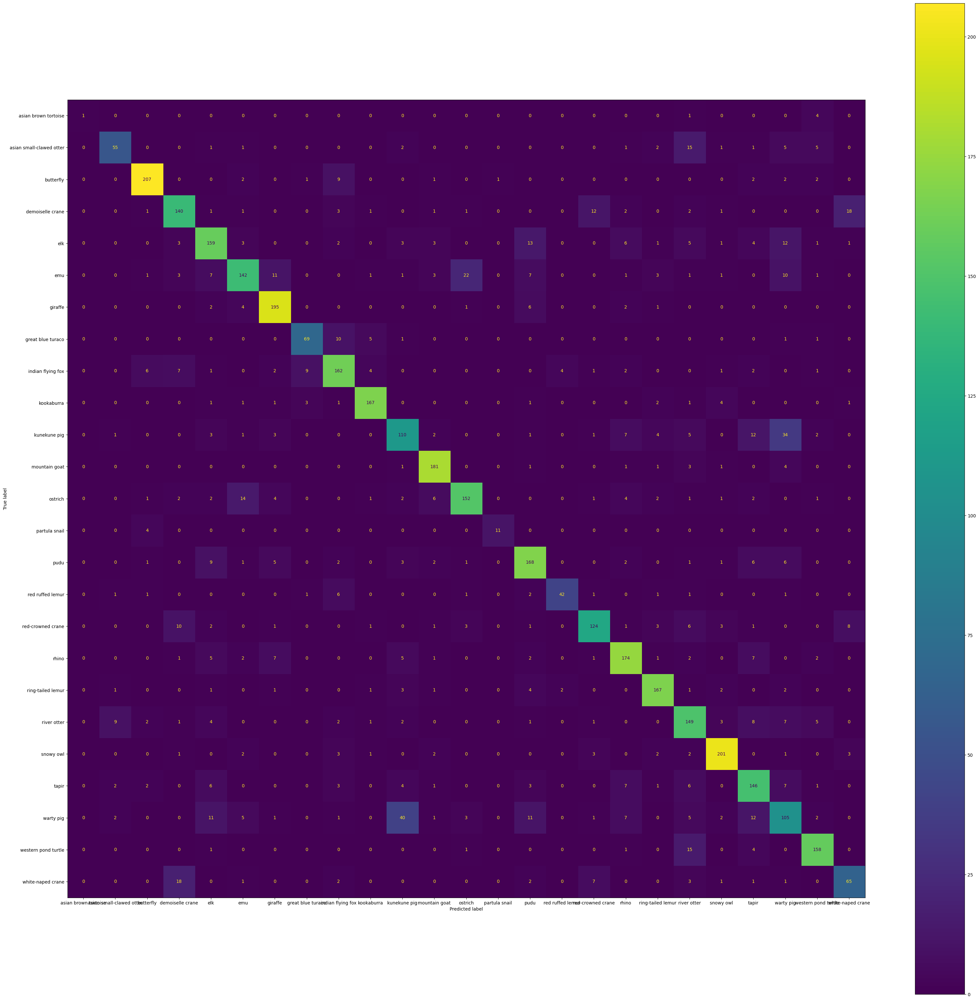

In [ ]:
# confusion matrix
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

cm = confusion_matrix(Y_test, y_predict)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=model.classes_)
fig, ax = plt.subplots(figsize=(40,40))
ax.grid(False)
disp.plot(ax=ax)

We can see that we got 80% accuracy, and the vast majority of prediction errors is due to misclassification between animals which look a lot like each other, such as differnt types of cranes (red, white, demoiselle), pigs (kunekune, warty, tapir) , etc. , which could be solved by using more pictures in our classifier together with additional computing power.

Let's visualize the images using t-SNE; in this we are going to use non-default parameters, so we can see if our classification is sufficient via analysing the projected clusters:

In [ ]:
from sklearn.manifold import TSNE

X = np.array(image_vectors)
print("Computed X: ", X.shape)
X_embedded = TSNE(n_components=2, n_iter=1000, verbose=2).fit_transform(X)
print("Computed t-SNE", X_embedded.shape)

Computed X:  (16638, 1000)
[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 16638 samples in 0.008s...
[t-SNE] Computed neighbors for 16638 samples in 5.772s...
[t-SNE] Computed conditional probabilities for sample 1000 / 16638
[t-SNE] Computed conditional probabilities for sample 2000 / 16638
[t-SNE] Computed conditional probabilities for sample 3000 / 16638
[t-SNE] Computed conditional probabilities for sample 4000 / 16638
[t-SNE] Computed conditional probabilities for sample 5000 / 16638
[t-SNE] Computed conditional probabilities for sample 6000 / 16638
[t-SNE] Computed conditional probabilities for sample 7000 / 16638
[t-SNE] Computed conditional probabilities for sample 8000 / 16638
[t-SNE] Computed conditional probabilities for sample 9000 / 16638
[t-SNE] Computed conditional probabilities for sample 10000 / 16638
[t-SNE] Computed conditional probabilities for sample 11000 / 16638
[t-SNE] Computed conditional probabilities for sample 12000 / 16638
[t-SNE] Computed condit

In [ ]:
image_vectors_tsne_df = pd.DataFrame(columns=['x', 'y', 'class'])
image_vectors_tsne_df['x'], image_vectors_tsne_df['y'], image_vectors_tsne_df['class'] = X_embedded[:,0], X_embedded[:,1], image_vectors_details_df['class']
image_vectors_tsne_df

,x,y,class
0,72.319618,32.147793,great blue turaco
1,72.371506,32.103054,great blue turaco
2,67.729317,32.918530,great blue turaco
3,62.752747,33.224842,great blue turaco
4,68.813957,32.800095,great blue turaco
...,...,...,...
16633,-36.879669,12.570515,ostrich
16634,-43.244461,58.547844,ostrich
16635,-17.491730,59.820679,ostrich
16636,-44.344265,49.682442,ostrich



We perform dimentionality reduction in order to visualize the different clusters(animals) and our ability to distinguish between them. An interesting way to see the similarity and difference between animals classifications, is to examine relations of clusters related to someway-close animals, such as the mixing (yet close) points related to "red-crowned crane" and "white-naped crane" as they relate to very close, yet different animals,

in contrast to the long distance between clusters related to "red-crowned crane" and "giraffe" which are indeed very diffierent animals.

<Axes: xlabel='x', ylabel='y'>

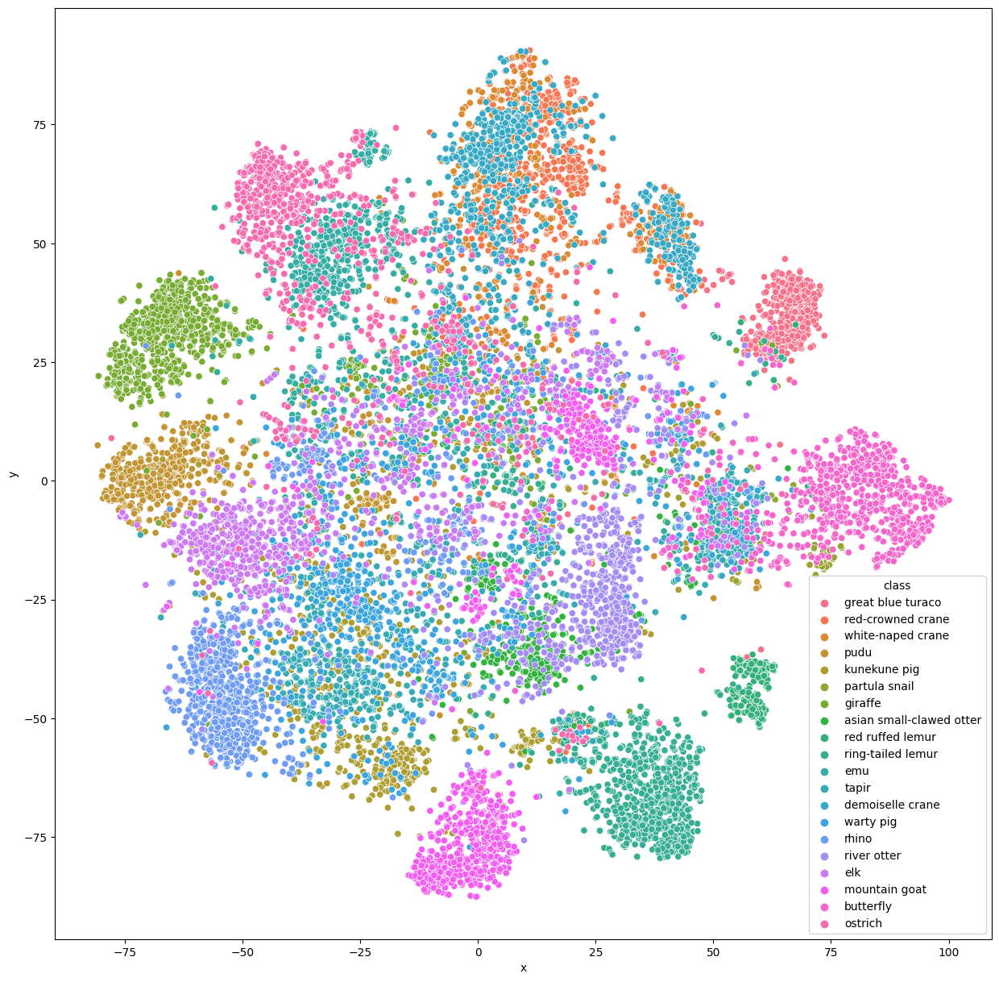

In [ ]:
c_set = set(image_vectors_tsne_df['class'])
d = dict(zip(c_set, range(len(c_set))))
colors = [d[g] for g in image_vectors_tsne_df["class"]]

plt.figure(figsize=(15,15))
sns.scatterplot(x="x", y="y", hue="class", data=image_vectors_tsne_df)

### **The complete prediction pipeline**

#### Preprocessing the data
here we are going to use all the methods we wrote above, so every image is going to hold both Inception and Catboost representations.

In [ ]:
import glob, os

def get_image_paths(directory):
    image_paths = glob.glob(os.path.join(directory, '**', '*.jpg'), recursive=True)
    image_paths.extend(glob.glob(os.path.join(directory, '**', '*.png'), recursive=True))
    image_paths.extend(glob.glob(os.path.join(directory, '**', '*.jpeg'), recursive=True))
    image_paths.extend(glob.glob(os.path.join(directory, '**', '*.JPG'), recursive=True))
    image_paths.extend(glob.glob(os.path.join(directory, '**', '*.PNG'), recursive=True))
    image_paths.extend(glob.glob(os.path.join(directory, '**', '*.JPEG'), recursive=True))
    return image_paths

**downloading IG images and update the combined IG DF**

In [ ]:
IG_ANIMALS_PATH = f"{INSTAGRAM_POSTS_PATH}/animals"
create_dir(IG_ANIMALS_PATH)

In [ ]:
for index, row in combined_df.iterrows():
  url = row['images_urls']
  download_and_save_image(url, f'{INSTAGRAM_POSTS_PATH}/animals', f'{index}.jpg')

In [ ]:
IG_animals_image_paths = get_image_paths(IG_ANIMALS_PATH)
IG_animals_image_paths = sorted(IG_animals_image_paths, key=lambda x: int(x.split('/')[-1].split('.')[0])) # image name is like '<index>.jpg'

In [ ]:
combined_df['image_path'] = IG_animals_image_paths

In [ ]:
tqdm.tqdm.pandas()
combined_df['image_for_inception'] = combined_df['image_path'].progress_apply(lambda path: preprocess_image(path))

100%|██████████| 16341/16341 [3:32:24<00:00,  1.28it/s]


In [ ]:
combined_df.to_pickle(f'{INSTAGRAM_POSTS_PATH}/combined_df_after_inception_prep.pkl')

In [ ]:
combined_df_after_inception_prep_details = pd.read_pickle(f'{INSTAGRAM_POSTS_PATH}/combined_df_after_inception_prep.pkl')

In [ ]:
IG_image_vectors_as_matrix = images_to_vectors(IG_animals_image_paths)
IG_image_vectors = [list(v[0]) for v in IG_image_vectors_as_matrix]
combined_df_after_inception_prep_details['image_vectors_for_catboost'] = IG_image_vectors

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth
100%|██████████| 528M/528M [00:01<00:00, 422MB/s]
100%|██████████| 16341/16341 [2:58:08<00:00,  1.53it/s]


In [ ]:
combined_df_after_inception_prep_details.to_pickle(f'{INSTAGRAM_POSTS_PATH}/final_df.pickle')

In [ ]:
final_df = pd.read_pickle(f'{INSTAGRAM_POSTS_PATH}/final_df.pickle')

#### Applying Modules Together

First we create aliases per animal regarding the Inception model:
every animal might be detected by various names, we collected the options for each animal we can face at the zoo, and attached its common aliases given by the model's predictions.

In case that the model returns one of these aliases, we know that the model classified the animal correctly and we can go on, otherwise we should try to classify it using our 2nd model.

In [ ]:
inception_animals_name_alias = {
    'amazonas frog': ['amazonas frog', 'amazonas_frog', 'tailed_frog', 'free_frog'],
    'asian brown tortoise': ['mud turtle', 'box turtle', 'mud_turtle', 'box_turtle', 'turtle', 'tortoise'],
    'brown bear': ['brown bear', 'brown_bear', 'american_black_bear', 'American_black_bear'],
    'colobus monkey': ['colobus monkey', 'colobus_monkey', 'colobus'],
    'flamingo': ['flamingo'],
    'francios langur': ['francios langur', 'francios_langur', 'langur'],
    'gorilla': ['gorilla'],
    'gazelle': ['gazelle'],
    'great gray owl': ['great gray owl', 'great_gray_owl'],
    'hippo': ['hippopotamu', 'hippopotamus'],
    'jaguar': ['jaguar'],
    'komodo dragon': ['komodo dragon', 'komodo_dragon', 'Komodo dragon', 'Komodo_dragon'],
    'lion': ['lion', 'lioness'],
    'lynx': ['lynx'],
    'maned wolf': ['maned_wolf', 'red_wolf'],
    'meerkat': ['meerkat'],
    'orangutan': ['orangutan'],
    'patas monkey': ['patas monkey', 'patas_monkey', 'patas'],
    'penguin': ['penguin', 'king_penguin'],
    'porcupine': ['porcupine'],
    'python': ['python', 'rock python', 'rock_python'],
    'red panda': ['red panda', 'red_panda', 'lesser_panda'],
    'siamang': ['siamang'],
    'sloth bear': ['sloth bear', 'sloth_bear'],
    'snow leopard': ['snow leopard', 'snow_leopard'],
    'tiger': ['tiger'],
    'wallaby': ['wallaroo', 'wallaby'],
    'wallaroo': ['wallaroo', 'wallaby'],
    'warthog': ['warthog'],
    'wolf':  ['wolf', 'white_wolf', 'timber_wolf', 'coyote'],
    'zebra': ['zebra'],
}

inception_animals_name_alias_index = {alias:animal for  animal in inception_animals_name_alias for alias in inception_animals_name_alias[animal]}


In [ ]:
#TODO: manual testing
manual_tags = {
    0: 'UNKNOWN',
    1: 'UNKNOWN',
    2: 'UNKNOWN',
    3: 'butterfly',
    4: 'river otter',
    5: 'UNKNOWN',
    6: 'giraffe',
    7: 'mountain goat',
    8: 'UNKNOWN',
    9: 'UNKNOWN',
    10: 'red-crowned crane',
    18: 'UNKNOWN',
    19: 'UNKNOWN',
    20: 'UNKNOWN',
    21: 'great blue turaco',
    22: 'butterfly',
    39: 'butterfly',
    44: 'giraffe',
    45: 'kunekune pig',
    68: 'butterfly',
    69: 'butterfly',
    70: 'butterfly',
    71: 'butterfly',
    72: 'butterfly',
    73: 'butterfly',
    124: 'butterfly',
    163: 'giraffe',
    203: 'giraffe',
    271: 'river otter',
    273: 'butterfly',
    494: 'white-naped crane',
    529: 'giraffe',
    638: 'tapir',
    679: 'river otter',
    680: 'rhino',
    763: 'pudu',
    953: 'tapir',
    965: 'river otter',
    982: 'asian small-clawed otter',
    988: 'rhino',
    1028: 'ring-tailed lemur',
    1029: 'ring-tailed lemur',
    1030: 'ring-tailed lemur',
    1031: 'ring-tailed lemur',
    1239: 'mountain goat',
    1240: 'mountain goat',
    1333: 'river otter',
    1411: 'ring-tailed lemur',
    1594: 'tapir',
    1601: 'white-naped crane',
    1615: 'asian small-clawed otter',
    1683: 'river otter',
    1713: 'ring-tailed lemur',
    1920: 'pudu',
    1927: 'pudu',
    1942: 'tapir',
    1943: 'tapir',
    1948: 'white-naped crane',
    1949: 'warty pig',
    2002: 'ring-tailed lemur',
    2027: 'warty pig',
    2045: 'tapir',
    2048: 'river otter',
    2060: 'giraffe',
    2138: 'pudu',
    2176: 'ring-tailed lemur',
    2602: 'tapir',
    3114: 'ring-tailed lemur',
    3202: 'tapir',
    3322: 'mountain goat',
    3453: 'ring-tailed lemur',
    3638: 'river otter',
    3641: 'river otter',
    3645: 'river otter',
    3671: 'warty pig',
    3903: 'river otter',
    3914: 'river otter',
    3969: 'pudu',
    3971: 'pudu',
    4049: 'ring-tailed lemur',
    4054: 'emu',
    4055: 'emu',
    4345: 'warty pig',
    4468: 'rhino',
    4491: 'UNKNOWN',
    4492: 'UNKNOWN',
    4493: 'UNKNOWN',
    4494: 'UNKNOWN',
    4665: 'emu',
    4751: 'mountain goat',
    4772: 'rhino',
}

In [ ]:
# for index, row in final_df.iterrows():
#   if index in manual_tags:
#     predicted_probs = loaded_model.predict_proba(row['image_vectors_for_catboost']).flatten()
#     predicted_animal = loaded_model.predict(row['image_vectors_for_catboost'])[0]

#     class_prob = max(predicted_probs)
#     print(str(index) + ":" + predicted_animal + " | " + str(class_prob))

In [ ]:
def animal_category_detection(animal_category):
  return inception_animals_name_alias_index.get(animal_category)

It is worth mentioning that we fixed the threshold to its value after we were tagging IG posts for their animals by hand, and then ran our Catboost model
on them, examining the certainty level of its predictions.

And the complete flow goes as follows:

In [ ]:
predicted_animals = []
prob_threshold = 0.65

for index, row in final_df.iterrows():
  inception_predicted_class, prob = classify_image(row['image_for_inception'])
  # print("---" ,inception_predicted_class)
  inception_predicted_animal = animal_category_detection(inception_predicted_class)
  if inception_predicted_animal:
    predicted_animals.append(inception_predicted_animal)

  else: #inception couldn't handle this case - we need to try our special-animals model

    predicted_probs = loaded_model.predict_proba(row['image_vectors_for_catboost']).flatten()
    predicted_animal = loaded_model.predict(row['image_vectors_for_catboost'])[0]

    class_prob = max(predicted_probs)

    # print("------" ,predicted_animal, class_prob)
    if class_prob >= prob_threshold:
      predicted_animals.append(predicted_animal)

    else:
      predicted_animals.append('UNKNOWN')

Streaming output truncated to the last 5000 lines.
1/1 [==============================] - 0s 95ms/step


In [ ]:
final_df['animal'] = predicted_animals

In [ ]:
all_animals_to_regions = {
    'amazonas frog': 'tropical_rain_forest',
    'asian brown tortoise': 'assam_rhino_reserve',
    'asian small-clawed otter': 'banyan_wilds',
    'brown bear': 'living_northwest_trail',
    'butterfly': 'molbak_butterfly_garden',
    'colobus monkey': 'tropical_rain_forest',
    'demoiselle crane': 'assam_rhino_reserve',
    'egyptian tortoise': 'adaptations',
    'elk': 'living_northwest_trail',
    'emu': 'australasia',
    'flamingo': 'temperate_forest',
    'francios langur': 'trail_of_vines',
    'gazelle': 'african_savanna',
    'giraffe ': 'african_savanna',
    'gorilla': 'tropical_rain_forest',
    'great blue turaco': 'temperate_forest',
    'great gray owl': 'living_northwest_trail',
    'hippo': 'african_savanna',
    'indian flying fox': 'adaptations',
    'jaguar':  'tropical_rain_forest',
    'komodo dragon': 'adaptations',
    'kookaburra': 'australasia',
    'kunekune pig': 'temperate_forest',
    'lion': 'african_savanna',
    'lioness': 'african_savanna',
    'lynx': 'living_northwest_trail',
    'maned wolf': 'temperate_forest',
    'meerkat': 'adaptations',
    'mountain goat': 'living_northwest_trail',
    'orangutan': 'trail_of_vines',
    'ostrich': 'african_savanna',
    'partula snail': 'temperate_forest',
    'patas monkey': 'african_savanna',
    'penguin': 'humboldt_penguin_exhibit',
    'porcupine': 'living_northwest_trail',
    'pudu': 'temperate_forest',
    'python': 'trail_of_vines',
    'red panda': 'temperate_forest',
    'red ruffed lemur': 'tropical_rain_forest',
    'red-crowned crane': 'temperate_forest',
    'rhino': 'assam_rhino_reserve',
    'ring-tailed lemur': 'tropical_rain_forest',
    'river otter': 'living_northwest_trail',
    'siamang': 'trail_of_vines',
    'sloth bear': 'banyan_wilds',
    'snow leopard': 'australasia',
    'snowy owl': 'living_northwest_trail',
    "steller's sea eagle": 'living_northwest_trail',
    'tapir': 'trail_of_vines',
    'tiger': 'banyan_wilds',
    'wallaby': 'australasia',
    'wallaroo': 'australasia',
    'warthog': 'african_savanna',
    'warty pig': 'trail_of_vines',
    'western pond turtle': 'living_northwest_trail',
    'white-naped crane': 'temperate_forest',
    'wolf': 'living_northwest_trail',
    'zebra': 'african_savanna',
    'UNKNOWN': 'UNKNOWN'
}

In [ ]:
final_df['region'] = final_df['animal'].apply(lambda animal: all_animals_to_regions.get(animal))

In [ ]:
final_df.to_pickle(f'{INSTAGRAM_POSTS_PATH}/final_df.pickle')

In [ ]:
final_df = pd.read_pickle(f'{INSTAGRAM_POSTS_PATH}/final_df.pickle')

In [ ]:
final_df

,index,post_id,timestamp,post_description,usertags,location,images_urls,image_path,image_for_inception,image_vectors_for_catboost,animal,region
0,0,3172575269726392525,2023-08-19T04:47:45+00:00,"Patti Smith, Lenny Kaye / Coca Cola Cool / Wit...",waswalking,pk=267928043 name='Woodland Park Zoo - ZooTune...,https://scontent-lax3-2.cdninstagram.com/v/t51...,/content/drive/MyDrive/MickyFire_Project/insta...,"[[[[-0.90588236 -0.8117647 -0.827451 ], [-0....","[1.2450198, -3.471912, 1.4119483, -0.12287025,...",UNKNOWN,UNKNOWN
1,0,3172575269726392525,2023-08-19T04:47:45+00:00,"Patti Smith, Lenny Kaye / Coca Cola Cool / Wit...",waswalking,pk=267928043 name='Woodland Park Zoo - ZooTune...,https://scontent-lax3-2.cdninstagram.com/v/t5...,/content/drive/MyDrive/MickyFire_Project/insta...,"[[[[-0.8509804 -0.7019608 -0.73333335], [-0....","[1.701526, -1.0636353, 5.0910316, 1.5690876, 1...",UNKNOWN,UNKNOWN
2,0,3172575269726392525,2023-08-19T04:47:45+00:00,"Patti Smith, Lenny Kaye / Coca Cola Cool / Wit...",waswalking,pk=267928043 name='Woodland Park Zoo - ZooTune...,https://scontent-lax3-1.cdninstagram.com/v/t5...,/content/drive/MyDrive/MickyFire_Project/insta...,"[[[[-0.9372549 -0.8980392 -0.94509804], [-0....","[0.92175335, -0.68473613, 2.2709725, 0.0736823...",UNKNOWN,UNKNOWN
3,1,3172415445294450583,2023-08-18T23:30:13+00:00,"Zoo membership, best $70 I’ve ever spent. #woo...",heycourtnirae,pk=46808 name='Woodland Park Zoo' phone='' web...,https://scontent-lax3-2.cdninstagram.com/v/t51...,/content/drive/MyDrive/MickyFire_Project/insta...,"[[[[-0.4352941 -0.5058824 -0.73333335], [-0....","[-0.13151796, 4.0763726, -2.7966874, -2.696926...",butterfly,molbak_butterfly_garden
4,2,3172399466170564604,2023-08-18T22:58:28+00:00,Happy Aloha Friday!\n\nWe are flashing back to...,customkittravel,pk=46808 name='Woodland Park Zoo' phone='' web...,https://scontent-lax3-1.cdninstagram.com/v/t51...,/content/drive/MyDrive/MickyFire_Project/insta...,"[[[[-0.00392157 0.23921573 -0.49019605], [ 0....","[-0.6441846, -2.8680177, 2.7269537, -2.8073964...",river otter,living_northwest_trail
...,...,...,...,...,...,...,...,...,...,...,...,...
14995,5987,2066990763274787771,2019-06-15T18:48:42+00:00,“Original Mountaineer”\n.\n.\n.\n.\n.\n.\n#ins...,jaxsnellyphoto,pk=46808 name='Woodland Park Zoo' phone='' web...,https://scontent-lax3-2.cdninstagram.com/v/t5...,/content/drive/MyDrive/MickyFire_Project/insta...,"[[[[-0.99215686 -0.99215686 -0.99215686], [-0....","[-3.5129044, -5.519235, 2.2239113, 0.6244839, ...",UNKNOWN,UNKNOWN
14996,5987,2066990763274787771,2019-06-15T18:48:42+00:00,“Original Mountaineer”\n.\n.\n.\n.\n.\n.\n#ins...,jaxsnellyphoto,pk=46808 name='Woodland Park Zoo' phone='' web...,https://scontent-lax3-1.cdninstagram.com/v/t5...,/content/drive/MyDrive/MickyFire_Project/insta...,"[[[[-0.9607843 -0.96862745 -0.9843137 ], [-0....","[-7.5871916, -6.5555897, -0.45832378, -2.99114...",ring-tailed lemur,tropical_rain_forest
14997,5987,2066990763274787771,2019-06-15T18:48:42+00:00,“Original Mountaineer”\n.\n.\n.\n.\n.\n.\n#ins...,jaxsnellyphoto,pk=46808 name='Woodland Park Zoo' phone='' web...,https://scontent-lax3-2.cdninstagram.com/v/t5...,/content/drive/MyDrive/MickyFire_Project/insta...,"[[[[-1. -1. -1.], [-1. -1. -1.], [-1. -1. -1.]...","[-4.415177, -6.025736, -0.28623217, -0.7075985...",mountain goat,living_northwest_trail
14998,5988,2066927359936105221,2019-06-15T16:42:43+00:00,I had no idea that this beautiful @joelsartore...,carsontheredpanda,NaN,https://scontent-lax3-2.cdninstagram.com/v/t51...,/content/drive/MyDrive/MickyFire_Project/insta...,"[[[[-0.58431375 -0.5921569 -0.6313726 ], [-0....","[-3.414653, -0.6138245, -2.61508, -4.0608864, ...",red panda,temperate_forest


## Data Analysis

In [ ]:
from datetime import datetime

def get_year_from_date_isostring(iso_date):
  return datetime.fromisoformat(iso_date).year

def get_month_from_date_isostring(iso_date):
  return datetime.fromisoformat(iso_date).month

def get_day_from_date_isostring(iso_date):
  return datetime.fromisoformat(iso_date).day

def get_hour_from_date_isostring(iso_date):
  return datetime.fromisoformat(iso_date).hour


final_df['year'] = final_df['timestamp'].apply(lambda date_: get_year_from_date_isostring(date_))
final_df['month'] = final_df['timestamp'].apply(lambda date_: get_month_from_date_isostring(date_))
final_df['day'] = final_df['timestamp'].apply(lambda date_: get_day_from_date_isostring(date_))
final_df['hour'] = final_df['timestamp'].apply(lambda date_: get_hour_from_date_isostring(date_))

Using [WoodlandZoo opening hours](https://www.zoo.org/visit), we splitted the data to be shown per-season.

In [ ]:
woodland_h1_months = [5, 6, 7, 8]
woodland_h1_hours = [h for h in range(9, 19)]
woodland_h2_months = [9, 10, 11, 12, 1, 2, 3, 4]
woodland_h2_hours = [h for h in range(9, 17)]

woodland_h1_df = final_df[(final_df['month'].isin(woodland_h1_months)) & (final_df['region'] != 'UNKNOWN')]
woodland_h2_df = final_df[(final_df['month'].isin(woodland_h2_months)) & (final_df['region'] != 'UNKNOWN')]

woodland_h1_aggregation_without_hours = woodland_h1_df.groupby(['month', 'region'], as_index=False).size()
woodland_h1_aggregation_with_hours = woodland_h1_df[woodland_h1_df['hour'].isin(woodland_h1_hours)].groupby(['month', 'hour', 'region'], as_index=False).size()

woodland_h2_aggregation_without_hours = woodland_h2_df.groupby(['month', 'region'], as_index=False).size()
woodland_h2_aggregation_with_hours = woodland_h2_df[woodland_h2_df['hour'].isin(woodland_h2_hours)].groupby(['month', 'hour', 'region'], as_index=False).size()

In [ ]:
woodland_h1_aggregation_without_hours

,month,region,size
0,5,adaptations,27
1,5,african_savanna,46
2,5,assam_rhino_reserve,14
3,5,australasia,25
4,5,banyan_wilds,26
5,5,humboldt_penguin_exhibit,3
6,5,living_northwest_trail,74
7,5,molbak_butterfly_garden,82
8,5,temperate_forest,129
9,5,trail_of_vines,21


In [ ]:
!pip install folium
!pip install Pillow

In [ ]:
ZOO_MAP_PATH = "/content/drive/MyDrive/MickyFire_Project/zoo_map"

In [ ]:
from PIL import Image

# Open the image
with Image.open(f'{ZOO_MAP_PATH}/woodlandzoopark_map.jpeg') as img:
    width, height = img.size

print(f"Width: {width} pixels, Height: {height} pixels")

Width: 1035 pixels, Height: 1600 pixels


In [ ]:
!pip install ipywidgets

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 10.1 MB/s eta 0:00:00


In [ ]:
import base64

def image_to_data_url(img_path):
    with open(img_path, "rb") as image_file:
        data_url = base64.b64encode(image_file.read()).decode('utf-8')
    return f"data:image/png;base64,{data_url}"

img_data_url = image_to_data_url(f'{ZOO_MAP_PATH}/woodlandzoopark_map.jpeg')

In [ ]:
!pip install branca

**Summer Heatmaps:**

In [ ]:
# Pivot the dataframe
woodland_h1_aggregation_without_hours_pivot = woodland_h1_aggregation_without_hours.pivot(index='region', columns='month', values='size').reset_index()

# Print the reshaped dataframe
woodland_h1_aggregation_without_hours_pivot

month,region,5,6,7,8
0,adaptations,27,35,33,27
1,african_savanna,46,62,106,82
2,assam_rhino_reserve,14,27,36,33
3,australasia,25,49,67,46
4,banyan_wilds,26,19,52,43
5,humboldt_penguin_exhibit,3,4,27,19
6,living_northwest_trail,74,104,163,109
7,molbak_butterfly_garden,82,121,108,106
8,temperate_forest,129,184,222,144
9,trail_of_vines,21,34,53,57


IntSlider(value=5, description='Month 5', max=8, min=5)


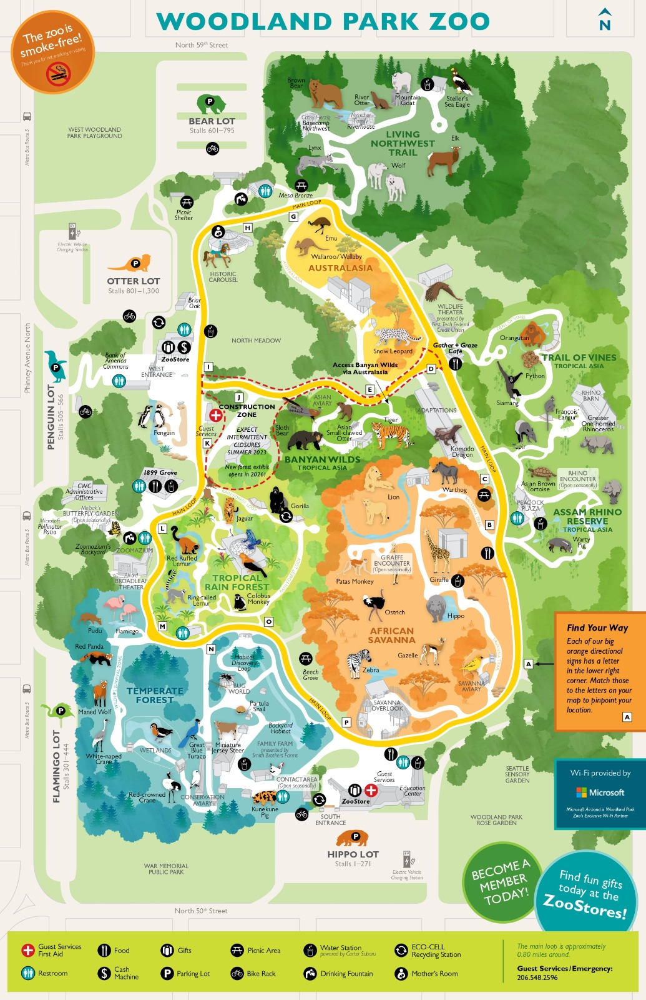

In [ ]:
import ipywidgets as widgets
from IPython.display import display, clear_output
import folium
import folium.plugins
import json
import random
import geopandas as gpd
import matplotlib
import branca

# Load your uploaded GeoJSON data
with open(f'{ZOO_MAP_PATH}/data.geojson', 'r') as file:
    geojson_data = json.load(file)

world = gpd.GeoDataFrame.from_features(geojson_data)

world['region'] = [
    'living_northwest_trail',
    'trail_of_vines',
    'australasia',
    'banyan_wilds',
    'african_savanna',
    'tropical_rain_forest',
    'humboldt_penguin_exhibit',
    'molbak_butterfly_garden',
    'temperate_forest',
    'assam_rhino_reserve',
    'adaptations'
]

woodland_h1_world = world.merge(woodland_h1_aggregation_without_hours_pivot, on='region', how='left')

def get_color(value):
    colors = matplotlib.cm.Reds(value / woodland_h1_world[[5, 6, 7, 8]].max().max())
    return matplotlib.colors.to_hex(colors)

for feature, value1, value2, value3, value4 in zip(geojson_data['features'], woodland_h1_world[5], woodland_h1_world[6], woodland_h1_world[7], woodland_h1_world[8]):
    feature['properties']['color5'] = get_color(value1)
    feature['properties']['color6'] = get_color(value2)
    feature['properties']['color7'] = get_color(value3)
    feature['properties']['color8'] = get_color(value4)

color_keys = ['color5', 'color6', 'color7', 'color8']

def display_map(index=5):
    clear_output(wait=True)

    widget = widgets.IntSlider(value=index, min=5, max=8, step=1, description=f"Month {index}")
    widget.observe(lambda change: display_map(index=widget.value), names='value')
    display(widget)

    m = folium.Map(location=[47.6684, -122.3509], zoom_start=16, width=700, height=600)

    # Adding the image raster overlay
    bounds = [[47.67197, -122.3545], [47.66467, -122.34768]]
    overlay = folium.raster_layers.ImageOverlay(
        image=img_data_url,
        bounds=bounds,
        opacity=0.7
    )
    overlay.add_to(m)

    # Adding colormap
    max_value = woodland_h1_world[[5, 6, 7, 8]].max().max()
    colormap = branca.colormap.linear.Reds_09.scale(0, max_value).to_step(10)
    colormap.caption = 'Color Scale'
    m.add_child(colormap)

    m.add_child(folium.LatLngPopup())

    # Loop through all color_keys and add each as a layer
    for idx, color_key in enumerate(color_keys):
        feature_group_name = "Month " + color_key.split('color')[1]
        feature_subgroup = folium.plugins.FeatureGroupSubGroup(m, name=feature_group_name, show=(idx+5 == index))  # Only show the selected index

        for feature in geojson_data['features']:
            color = feature['properties'][color_key]

            if feature['geometry']['type'] == "LineString":
                coords = feature['geometry']['coordinates']
                reversed_coords = [(lat, lon) for lon, lat in coords]

                folium.Polygon(
                    locations=reversed_coords,
                    color='black',
                    fill=True,
                    fill_color=color,
                    fill_opacity=0.6,
                    weight=3,
                    opacity=0.6
                ).add_to(feature_subgroup)

        feature_subgroup.add_to(m)

    folium.LayerControl().add_to(m)

    display(m)

# Display the initial map
display_map()

We used an image of the official park map from 2023, and pasted it onto Google Maps as raster, so that on the one hand we can clearly see the division of the park into the regions, entrances, paths, parks and other information, and on the other hand we can get the coordinates of any point we want in the park.
We created the polygons and exported them to a GeoJson file, so we then converted it to the Geo Data Frame we were working on.

The heat maps allow support for three things:

1. Moving on the scroll bar at the top above the map, allows dragging and moving between months (forward and backward) in sequence. You will have to wait a few seconds for the next heatmap to be rendered.
2. Changing the number in the text box allows jumping directly to the requested month.
3. choosing from the layers icon in the right corner of the map, the different heat maps by month.

A change in the scroll bar is automatically reflected in the selected layer.

For convenience, the summer season is in shades of red, while the winter season is in shades of blue.

**Winter Heatmaps:**

In [ ]:
# Pivot the dataframe
woodland_h2_aggregation_without_hours_pivot = woodland_h2_aggregation_without_hours.pivot(index='region', columns='month', values='size').reset_index()

# Print the reshaped dataframe
woodland_h2_aggregation_without_hours_pivot

month,region,1,2,3,4,9,10,11,12
0,adaptations,26,13,12,13,15,12,16,34
1,african_savanna,45,60,63,17,46,39,85,50
2,assam_rhino_reserve,15,7,8,2,19,12,12,18
3,australasia,22,20,17,17,19,31,42,17
4,banyan_wilds,40,44,32,21,31,34,34,35
5,humboldt_penguin_exhibit,15,5,9,11,11,16,14,13
6,living_northwest_trail,97,93,75,47,83,69,88,120
7,molbak_butterfly_garden,67,18,19,23,27,27,45,66
8,temperate_forest,106,79,85,69,119,92,110,91
9,trail_of_vines,9,24,26,15,21,13,12,22


SelectionSlider(continuous_update=False, description='Month 12', index=7, options=(1, 2, 3, 4, 9, 10, 11, 12),…


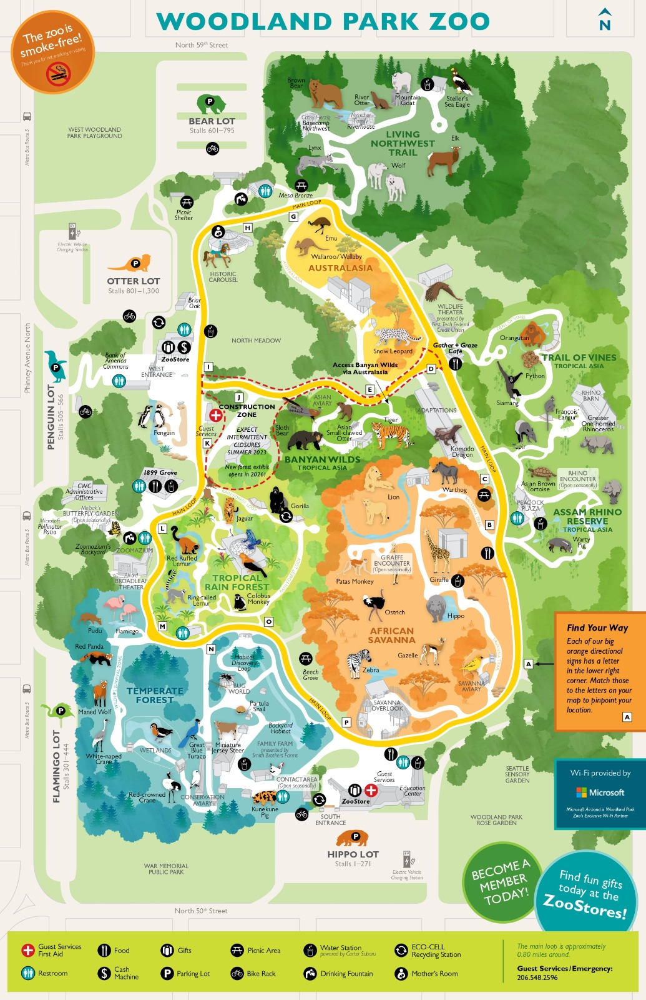

In [ ]:
import ipywidgets as widgets
from IPython.display import display, clear_output
import folium
import folium.plugins
import json
import random
import geopandas as gpd
import matplotlib
import branca

# Load your uploaded GeoJSON data
with open(f'{ZOO_MAP_PATH}/data.geojson', 'r') as file:
    geojson_data = json.load(file)

world = gpd.GeoDataFrame.from_features(geojson_data)

world['region'] = [
    'living_northwest_trail',
    'trail_of_vines',
    'australasia',
    'banyan_wilds',
    'african_savanna',
    'tropical_rain_forest',
    'humboldt_penguin_exhibit',
    'molbak_butterfly_garden',
    'temperate_forest',
    'assam_rhino_reserve',
    'adaptations'
]

woodland_h2_world = world.merge(woodland_h2_aggregation_without_hours_pivot, on='region', how='left')

def get_color(value):
    colors = matplotlib.cm.Blues(value / woodland_h2_world[[1, 2, 3, 4, 9, 10, 11, 12]].max().max())
    return matplotlib.colors.to_hex(colors)

for feature, value1, value2, value3, value4, value9, value10, value11, value12 in zip(geojson_data['features'], woodland_h2_world[1], woodland_h2_world[2], woodland_h2_world[3], woodland_h2_world[4], woodland_h2_world[9], woodland_h2_world[10], woodland_h2_world[11], woodland_h2_world[12]):
    feature['properties']['color1'] = get_color(value1)
    feature['properties']['color2'] = get_color(value2)
    feature['properties']['color3'] = get_color(value3)
    feature['properties']['color4'] = get_color(value4)
    feature['properties']['color9'] = get_color(value9)
    feature['properties']['color10'] = get_color(value10)
    feature['properties']['color11'] = get_color(value11)
    feature['properties']['color12'] = get_color(value12)

color_keys = ['color1', 'color2', 'color3', 'color4', 'color9', 'color10', 'color11', 'color12']

def display_map(index=1):
    clear_output(wait=True)

    widget = widgets.SelectionSlider(
        options=[1, 2, 3, 4, 9, 10, 11, 12],
        value=index,
        description=f"Month {index}",
        continuous_update=False
    )

    widget.observe(lambda change: display_map(index=widget.value), names='value')
    display(widget)

    m = folium.Map(location=[47.6684, -122.3509], zoom_start=16, width=700, height=600)

    # Adding the image raster overlay
    bounds = [[47.67197, -122.3545], [47.66467, -122.34768]]
    overlay = folium.raster_layers.ImageOverlay(
        image=img_data_url,
        bounds=bounds,
        opacity=0.7
    )
    overlay.add_to(m)

    # Adding colormap
    max_value = woodland_h2_world[[1, 2, 3, 4, 9, 10, 11, 12]].max().max()
    colormap = branca.colormap.linear.Blues_09.scale(0, max_value).to_step(10)
    colormap.caption = 'Color Scale'
    m.add_child(colormap)

    m.add_child(folium.LatLngPopup())

    # Correcting the index for the gap between 4 and 9
    corrected_index = color_keys.index(f'color{index}')

    # Loop through all color_keys and add each as a layer
    for idx, color_key in enumerate(color_keys):
        feature_group_name = "Month " + color_key.split('color')[1]
        feature_subgroup = folium.plugins.FeatureGroupSubGroup(m, name=feature_group_name, show=(idx == corrected_index))

        for feature in geojson_data['features']:
            color = feature['properties'][color_key]

            if feature['geometry']['type'] == "LineString":
                coords = feature['geometry']['coordinates']
                reversed_coords = [(lat, lon) for lon, lat in coords]

                folium.Polygon(
                    locations=reversed_coords,
                    color='black',
                    fill=True,
                    fill_color=color,
                    fill_opacity=0.6,
                    weight=3,
                    opacity=0.6
                ).add_to(feature_subgroup)

        feature_subgroup.add_to(m)

    folium.LayerControl().add_to(m)

    display(m)

# Display the initial map
display_map()

An example of using this winter map, focusing on September.
The marker shows an optimal location to place the food stand near to "hot" regions שnd even inside a park with benches and places to sit, so that people can sit comfortably to eat and drink, and take a break between trips in the different regions.
By adding a marker, you can click on the marker and the coordinates will pop up.

SelectionSlider(continuous_update=False, description='Month 9', index=4, options=(1, 2, 3, 4, 9, 10, 11, 12), …


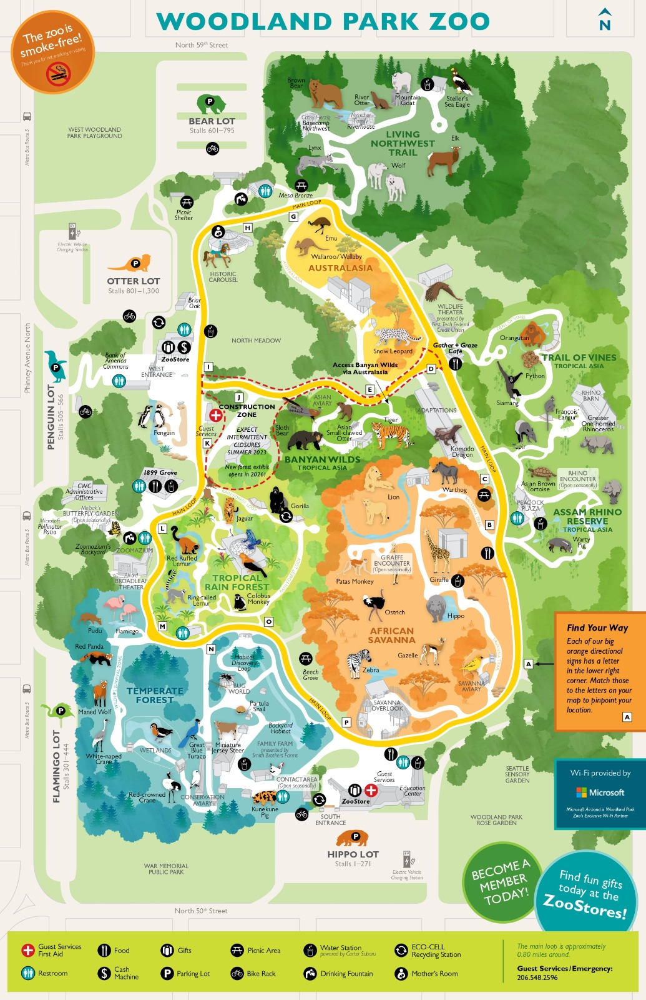

In [ ]:
import ipywidgets as widgets
from IPython.display import display, clear_output
import folium
import folium.plugins
import json
import random
import geopandas as gpd
import matplotlib
import branca

# Load your uploaded GeoJSON data
with open(f'{ZOO_MAP_PATH}/data.geojson', 'r') as file:
    geojson_data = json.load(file)

world = gpd.GeoDataFrame.from_features(geojson_data)

world['region'] = [
    'living_northwest_trail',
    'trail_of_vines',
    'australasia',
    'banyan_wilds',
    'african_savanna',
    'tropical_rain_forest',
    'humboldt_penguin_exhibit',
    'molbak_butterfly_garden',
    'temperate_forest',
    'assam_rhino_reserve',
    'adaptations'
]

woodland_h2_world = world.merge(woodland_h2_aggregation_without_hours_pivot, on='region', how='left')

def get_color(value):
    colors = matplotlib.cm.Blues(value / woodland_h2_world[[1, 2, 3, 4, 9, 10, 11, 12]].max().max())
    return matplotlib.colors.to_hex(colors)

for feature, values in zip(geojson_data['features'], woodland_h2_world[[1, 2, 3, 4, 9, 10, 11, 12]].values):
    for idx, month in enumerate([1, 2, 3, 4, 9, 10, 11, 12]):
        feature['properties'][f'color{month}'] = get_color(values[idx])

def display_map(index=9):
    clear_output(wait=True)

    widget = widgets.SelectionSlider(
        options=[1, 2, 3, 4, 9, 10, 11, 12],
        value=index,
        description=f"Month {index}",
        continuous_update=False
    )

    widget.observe(lambda change: display_map(index=widget.value), names='value')
    display(widget)

    m = folium.Map(location=[47.6672, -122.3514], zoom_start=17.5, width=700, height=600)

    # Add a marker for the specified location
    folium.Marker(
        [47.6672, -122.3514],
        popup="<strong>Latitude:</strong> 47.6672<br><strong>Longitude:</strong> -122.3514",
        icon=folium.Icon(color="red")
    ).add_to(m)

    # Adding the image raster overlay
    bounds = [[47.67197, -122.3545], [47.66467, -122.34768]]
    overlay = folium.raster_layers.ImageOverlay(
        image=img_data_url,
        bounds=bounds,
        opacity=0.7
    )
    overlay.add_to(m)

    # Adding colormap
    max_value = woodland_h2_world[[1, 2, 3, 4, 9, 10, 11, 12]].max().max()
    colormap = branca.colormap.linear.Blues_09.scale(0, max_value).to_step(10)
    colormap.caption = 'Color Scale'
    m.add_child(colormap)

    m.add_child(folium.LatLngPopup())

    # Loop through all color_keys and add each as a layer
    for month in [1, 2, 3, 4, 9, 10, 11, 12]:
        feature_group_name = f"Month {month}"
        feature_subgroup = folium.plugins.FeatureGroupSubGroup(m, name=feature_group_name, show=(month == index))

        for feature in geojson_data['features']:
            color = feature['properties'][f'color{month}']

            if feature['geometry']['type'] == "LineString":
                coords = feature['geometry']['coordinates']
                reversed_coords = [(lat, lon) for lon, lat in coords]

                folium.Polygon(
                    locations=reversed_coords,
                    color='black',
                    fill=True,
                    fill_color=color,
                    fill_opacity=0.6,
                    weight=3,
                    opacity=0.6
                ).add_to(feature_subgroup)

        feature_subgroup.add_to(m)

    folium.LayerControl().add_to(m)

    display(m)

# Display the initial map
display_map()

**Bar plots for each season:**

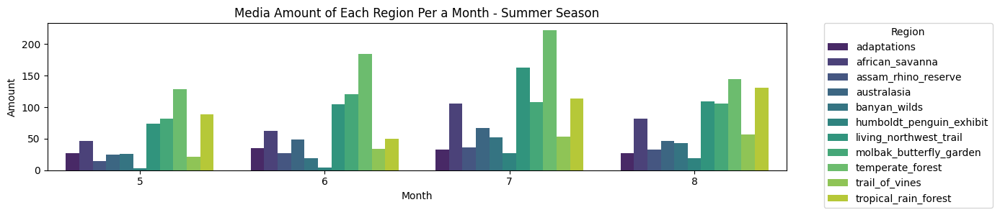

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

h1_bar_plots_df = woodland_h1_aggregation_without_hours_pivot.copy(deep=True)

# Melt the dataframe to make it long-form
df_melted_1 = h1_bar_plots_df.melt(id_vars=['region'], var_name='Month', value_name='Amount')

# Plot the data using seaborn's barplot
plt.figure(figsize=(14, 3))
sns.barplot(x='Month', y='Amount', hue='region', data=df_melted_1, palette='viridis')
plt.title('Media Amount of Each Region Per a Month - Summer Season')
plt.legend(title='Region', bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.tight_layout()
plt.show()

By this bar plot, it can seen that throughout the months of the summer season, the "Temperate Forest" region is the most visited.

The "Tropical Rain Forest" region is visited by more people on August.

It seems that the the "Humboldt Penguin Exhibit" area is less visited during the summer.

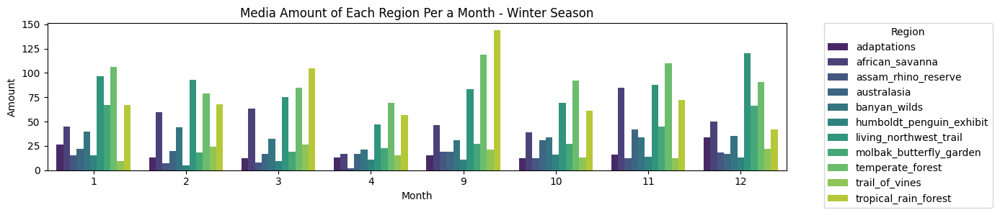

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

h2_bar_plots_df = woodland_h2_aggregation_without_hours_pivot.copy(deep=True)

# Melt the dataframe to make it long-form
df_melted_2 = h2_bar_plots_df.melt(id_vars=['region'], var_name='Month', value_name='Amount')

# Plot the data using seaborn's barplot
plt.figure(figsize=(14, 3))
sns.barplot(x='Month', y='Amount', hue='region', data=df_melted_2, palette='viridis')
plt.title('Media Amount of Each Region Per a Month - Winter Season')
plt.legend(title='Region', bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.tight_layout()
plt.show()

In the winter months it can be seen that there is a significant jump in the "Tropical Rain Forest" region, as well as in the "Living Northwest Trail" region, and these findings do agree with logic.

Also, the "Temperate Forest" region, which was the leader in the number of visits in the summer season, is also significant in the winter season, and this indeed makes sense since this is an region that is adapted to all 4 existing seasons of the year.

The "African Savanna" region is also prominent, especially in the month of November.

In [ ]:
woodland_h1_aggregation_months_and_hours = woodland_h1_df[woodland_h1_df['hour'].isin(woodland_h1_hours)].groupby(['month', 'hour'], as_index=False).size()

In [ ]:
woodland_h2_aggregation_months_and_hours = woodland_h2_df[woodland_h2_df['hour'].isin(woodland_h2_hours)].groupby(['month', 'hour'], as_index=False).size()

In [ ]:
both_seasons_aggregation_months_and_hours = pd.concat([woodland_h1_aggregation_months_and_hours, woodland_h2_aggregation_months_and_hours], ignore_index=True)

In [ ]:
both_seasons_aggregation_months_and_hours

,month,hour,size
0,5,9,2
1,5,10,3
2,5,11,6
3,5,12,1
4,5,13,2
...,...,...,...
82,12,12,1
83,12,13,8
84,12,14,9
85,12,15,30


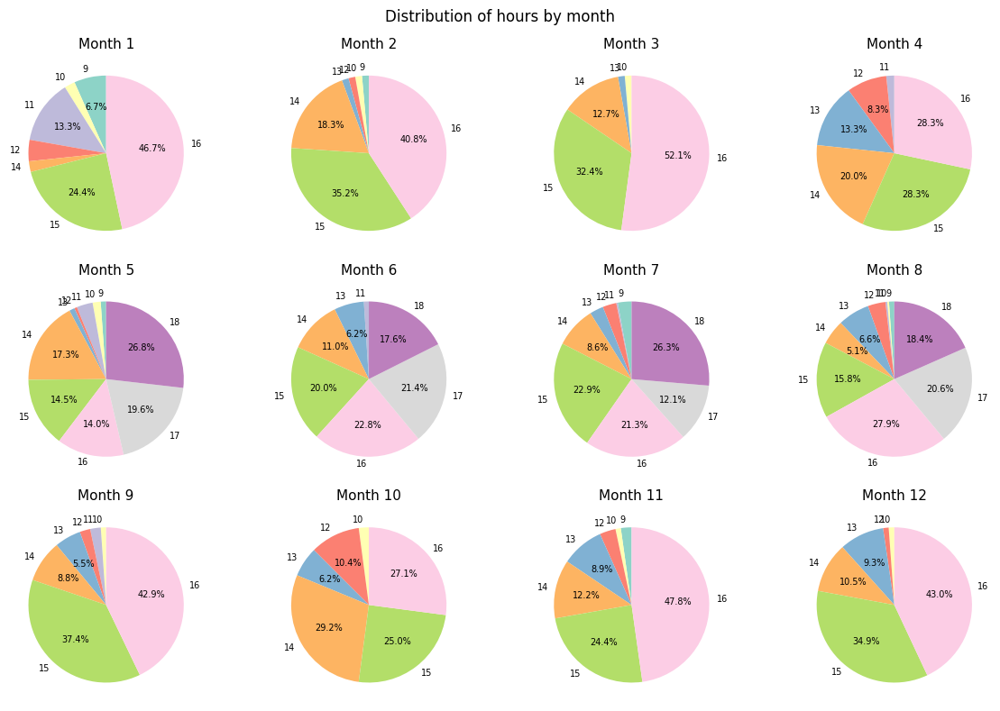

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

months_hours_df = both_seasons_aggregation_months_and_hours.copy(deep=True)

months = list(range(1, 13))

# Generate a colormap
cmap = plt.cm.Set3
unique_hours = months_hours_df['hour'].unique()
colors = {hour: cmap(i) for i, hour in enumerate(unique_hours)}

# Set up the figure and axes
fig, axs = plt.subplots(3, 4, figsize=(12, 8))

# Custom autopct function to only label pieces with percentage > 5%
def func(pct, allvals):
    absolute = int(pct/100.*np.sum(allvals))
    if pct > 5:  # if the piece is smaller than 5%, don't label it
        return "{:.1f}%".format(pct)
    else:
        return ""

# Flatten axs for easy iteration
axs = axs.ravel()

# For each month, generate a pie chart with consistent colors
for i, month in enumerate(months):
    ax = axs[i]
    month_data = months_hours_df[months_hours_df['month'] == month]

    if not month_data.empty and month_data['size'].sum() > 0:  # Check if there's data for the month
        colors_list = [colors[hour] for hour in month_data['hour']]
        ax.pie(month_data['size'], labels=month_data['hour'], colors=colors_list,
               autopct=lambda pct: func(pct, month_data['size']),
               startangle=90, textprops={'fontsize':7})
        ax.set_title(f'Month {month}', fontsize=11)
    else:
        ax.axis('off')  # Turn off the axis if there's no data

plt.suptitle("Distribution of hours by month")
plt.tight_layout()
plt.show()

We performed a test divided into hours per month, regardless of the region.
It can be seen that, overall, the hours when most posts are uploaded are starting at noon, and especially in the afternoon (when the visit is over).
It is possible that there is an increase of posts also in the noon, when the visitors are resting, because most of the animals in the park are more active in the morning or afternoon.

In the summer season, i.e. in the months of May to August (inclusive), you can see that posts are also uploaded at 18:00 onwards, this is because the opening hours end later.

In any case, regarding the hours of visits to the various areas, we saw that it is not possible to deduce much information from postings on Instagram, since people often upload posts on a delay, compared to stories on Instagram that may be closer to the time when the photo was taken.

By referring to the website https://www.viator.com/Seattle-attractions/Woodland-Park-Zoo/overview/d704-a1315, we can complete additional information about common visiting hours and days - many of the animals at the Woodland Park Zoo are most active in the morning hours and in the afternoon, so it's worth coming during these hours to watch them, and the zoo is busy mainly on weekends.

The map of the park on Google Maps, without the polygons and heat maps:


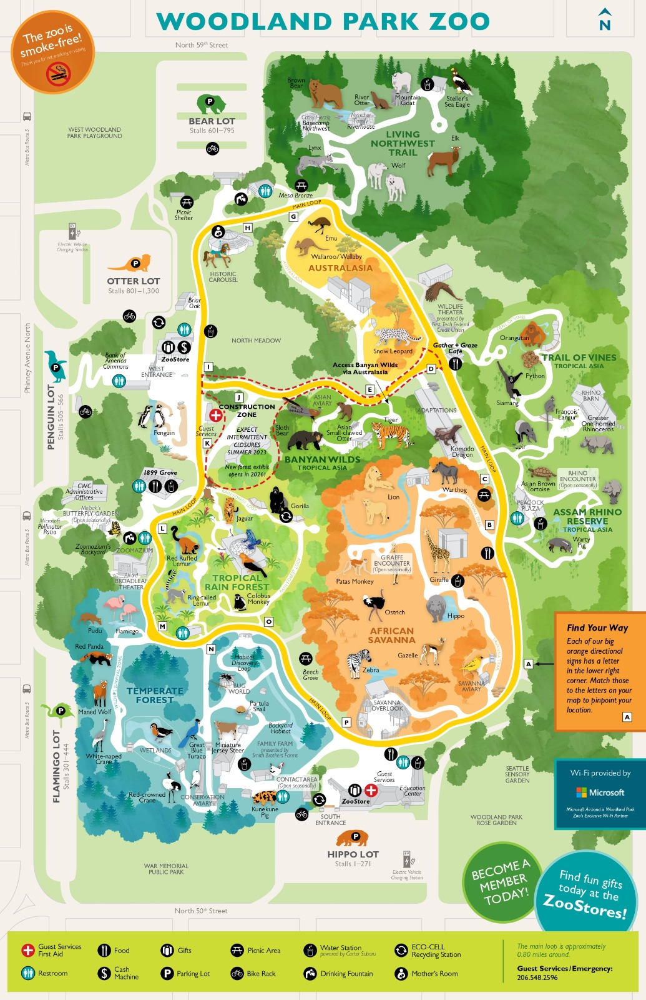

In [ ]:
m = folium.Map(location=[47.6687, -122.3509], zoom_start=17)

# Example bounds for the image overlay
bounds = [[47.67197, -122.3545], [47.66467, -122.34768]]
overlay = folium.raster_layers.ImageOverlay(
    image=img_data_url,
    bounds=bounds,
    opacity=0.9
)
overlay.add_to(m)

# This will add the feature to pop up lat/lng when clicked on the map
m.add_child(folium.LatLngPopup())

m